In [33]:
import modeller
import fitter

from functions.misc import knot_fn

import casadi as ca
import numpy as np
from matplotlib import pyplot as plt
from copy import copy

In [48]:
%matplotlib inline

In [ ]:
raw_data = [1,1,1,1,1,1,3,5,7,9,12,24,36,40,61,76,100,124,161,185,241,329,432,540,636,736,806,864,914,981,1021,1052,1068]
raw_time = [11,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44]

start = 0
clip = None

data = raw_data[start:clip]
time = raw_time[start:clip]

def system_2(t, y, p):
    return [
        -p[1]*y[0]*y[2]/sum(y),
        p[1]*y[0]*y[2]/sum(y) - p[2]*y[1],
        p[2]*y[1] - p[0]*y[2],
        p[0]*y[2]
    ]

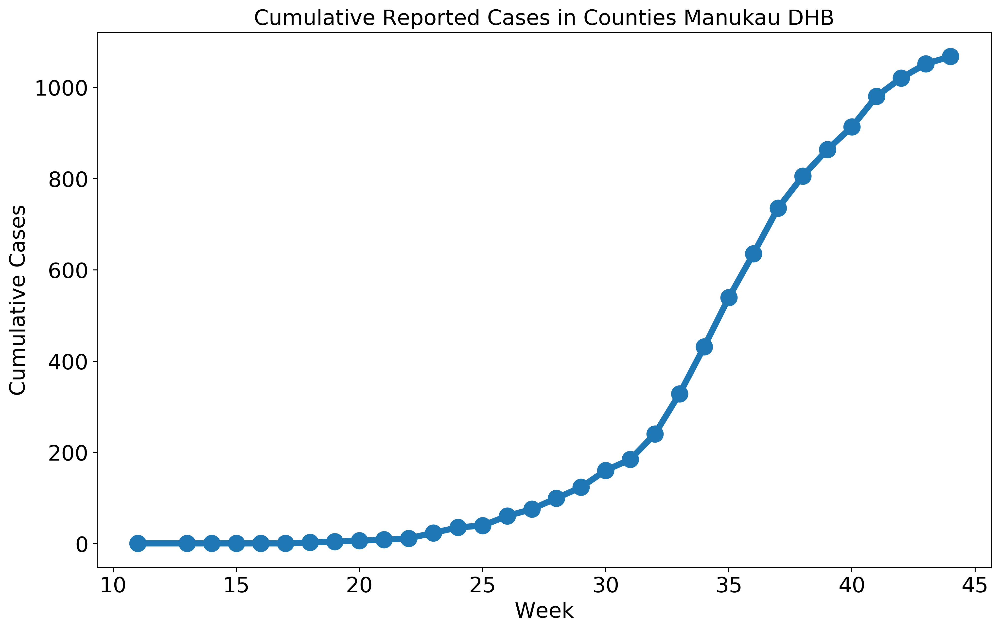

In [83]:
fig, ax=plt.subplots(figsize=[13, 8], dpi=360)
ax.plot(time, data, 'o-', markersize=13, linewidth=5)
ax.set_title("Cumulative Reported Cases in Counties Manukau DHB", size='xx-large')
ax.set_xlabel("Week", size='xx-large')
ax.set_ylabel("Cumulative Cases", size='xx-large')
ax.tick_params(labelsize='xx-large')

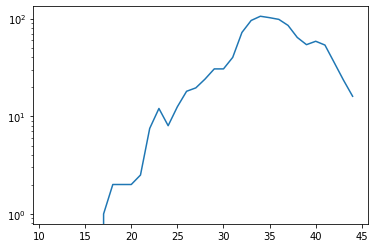

In [34]:
incidence = np.gradient(raw_data[start:clip], time)
plt.semilogy(time, incidence)


In [3]:
# data_pd = np.array(list(zip(*data)))
data_pd = np.array([[i] for i in data])
p0 = [7./8, 15, 7./8]
config = {
    "grid_size": 100,
    "basis_number": 24,
    "model_form": {
        "state": 4,
        "parameters": 3
    },
    "time_span": [time[0], time[-1]],
    "knot_function": None,
    "model": system_2,
    "dataset": {"y": data_pd, "t": np.array(time)},
    "observation_vector": [-1],
    "weightings":[
        [1]*4,
        [1]*len(time)
    ],
    "regularisation_value": copy(p0),
}

In [4]:
model = modeller.Model(config)
config['regularisation_value'][1] = model.ps[1]
objective = fitter.Objective()
objective.make(config, config['dataset'], model)

solver_setup = {
    'f': objective.objective,
    'x': ca.vcat(objective.input_list),
    'p': ca.hcat([objective.rho, objective.alpha]),
    'g': ca.vcat(model.xs),
}

solver = ca.nlpsol('solver', 'ipopt', solver_setup)

In [5]:
f1_ex = ca.Function('f1_ex', [solver_setup['x']], [objective.obj_1])
f2_ex = ca.Function('f2_ex', [solver_setup['x']], [objective.obj_2])

In [6]:
getx = ca.Function('getx', [solver_setup['x']], model.xs)

In [7]:
c0 = [np.ones(config['basis_number']) for _ in range(4)]
x0 = np.hstack([*c0, p0])
lbx = [-np.inf]*(config['basis_number']*4) + [0]*len(config['regularisation_value'])
alpha = 1e-2

In [8]:
pure_solve = solver(x0=x0, p=[0, 0], lbx=lbx, lbg=0)


******************************************************************************
This program contains Ipopt, a library for large-scale nonlinear optimization.
 Ipopt is released as open source code under the Eclipse Public License (EPL).
         For more information visit http://projects.coin-or.org/Ipopt
******************************************************************************

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:     9600
Number of nonzeros in Lagrangian Hessian.............:     4925

Total number of variables............................:       99
                     variables with only lower bounds:        3
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equa

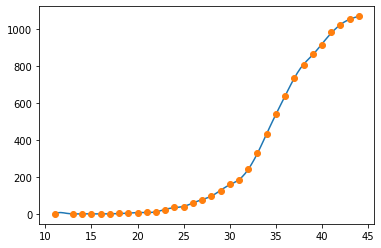

In [9]:
pure_xs = getx(pure_solve['x'])
plt.plot(model.observation_times, pure_xs[-1])
plt.plot(time, data, 'o')

In [10]:
prange = np.logspace(-6, 0, num=50)
solutions = []
xguess = x0
for p in prange:
    solve_opts = {
        'x0': xguess,
        'p': [p, alpha],
        'lbx': lbx,
        'lbg': 0,
    }
    solutions.append(solver(**solve_opts))
    xguess = np.array(solutions[-1]['x']).flatten()

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:     9600
Number of nonzeros in Lagrangian Hessian.............:     4925

Total number of variables............................:       99
                     variables with only lower bounds:        3
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:      400
        inequality constraints with only lower bounds:      400
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  30  3.8825067e+00 0.00e+00 6.20e-04  -9.0 1.34e+02 -10.7 1.00e+00 1.00e+00h  1
  31  3.8824382e+00 0.00e+00 6.07e-03  -9.0 3.92e+02 -11.2 1.00e+00 1.00e+00f  1
  32  3.8822801e+00 0.00e+00 4.44e-02  -9.0 1.04e+03 -11.6 1.00e+00 1.00e+00f  1
  33  3.8821985e+00 0.00e+00 3.48e-03  -9.0 3.35e+02 -11.2 1.00e+00 1.00e+00f  1
  34  3.8820633e+00 0.00e+00 7.48e-02  -9.0 1.11e+03 -11.7 1.00e+00 1.00e+00f  1
  35  3.8819723e+00 0.00e+00 2.94e-03  -9.0 3.05e+02 -11.3 1.00e+00 1.00e+00f  1
  36  3.8818702e+00 0.00e+00 1.01e-01  -9.0 1.17e+03 -11.7 1.00e+00 1.00e+00f  1
  37  3.8817710e+00 0.00e+00 2.40e-03  -9.0 3.03e+02 -11.3 1.00e+00 1.00e+00f  1
  38  3.8817064e+00 0.00e+00 1.25e-01  -9.0 1.19e+03 -11.8 1.00e+00 1.00e+00f  1
  39  3.8815985e+00 0.00e+00 5.26e-03  -9.0 3.54e+02 -11.4 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  40  3.8815706e+00 0.00e+00

 124  3.8739065e+00 0.00e+00 7.05e-03  -9.0 2.12e+02 -12.2 1.00e+00 1.00e+00h  1
 125  3.8739023e+00 0.00e+00 1.06e-02  -9.0 2.77e+02 -12.7 1.00e+00 1.00e+00h  1
 126  3.8738975e+00 0.00e+00 5.75e-03  -9.0 2.22e+02 -13.1 1.00e+00 1.00e+00h  1
 127  3.8738968e+00 0.00e+00 1.49e-02  -9.0 5.31e+02 -13.6 1.00e+00 1.00e+00h  1
 128  3.8738886e+00 0.00e+00 5.39e-03  -9.0 4.81e+02 -13.2 1.00e+00 1.00e+00h  1
 129  3.8738855e+00 0.00e+00 4.68e-03  -9.0 5.08e+03 -13.7 1.00e+00 1.25e-01h  4
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 130  3.8738839e+00 0.00e+00 1.78e-02  -9.0 4.80e+02 -13.2 1.00e+00 1.00e+00h  1
 131  3.8738783e+00 0.00e+00 2.44e-03  -9.0 2.83e+02 -12.8 1.00e+00 1.00e+00h  1
 132  3.8739220e+00 0.00e+00 6.03e-02  -9.0 1.58e+03 -13.3 1.00e+00 5.00e-01h  2
 133  3.8738692e+00 0.00e+00 3.81e-04  -9.0 1.12e+01 -10.2 1.00e+00 1.00e+00f  1
 134  3.8738688e+00 0.00e+00 8.78e-05  -9.0 1.70e+01 -10.6 1.00e+00 1.00e+00h  1
 135  3.8738679e+00 0.00e+00

 222  3.8736808e+00 0.00e+00 3.24e-05  -9.0 9.84e+00 -10.2 1.00e+00 1.00e+00h  1
 223  3.8736800e+00 0.00e+00 2.21e-04  -9.0 2.39e+01 -10.6 1.00e+00 1.00e+00h  1
 224  3.8736786e+00 0.00e+00 7.28e-04  -9.0 4.74e+01 -11.1 1.00e+00 1.00e+00h  1
 225  3.8736760e+00 0.00e+00 4.79e-04  -9.0 9.50e+01 -11.6 1.00e+00 1.00e+00h  1
 226  3.8736685e+00 0.00e+00 1.67e-03  -9.0 2.96e+02 -12.1 1.00e+00 1.00e+00h  1
 227  3.8736540e+00 0.00e+00 2.75e-02  -9.0 1.28e+03 -12.6 1.00e+00 1.00e+00f  1
 228  3.8736304e+00 0.00e+00 2.58e-05  -9.0 6.08e+00  -9.4 1.00e+00 1.00e+00f  1
 229  3.8736299e+00 0.00e+00 2.10e-05  -9.0 8.10e+00  -9.9 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 230  3.8736289e+00 0.00e+00 1.54e-04  -9.0 2.01e+01 -10.4 1.00e+00 1.00e+00h  1
 231  3.8736270e+00 0.00e+00 6.66e-04  -9.0 4.50e+01 -10.9 1.00e+00 1.00e+00h  1
 232  3.8736233e+00 0.00e+00 5.15e-04  -9.0 8.17e+01 -11.3 1.00e+00 1.00e+00h  1
 233  3.8736132e+00 0.00e+00

  17  3.9413549e+00 0.00e+00 7.46e-06  -2.5 2.23e-01  -4.5 1.00e+00 1.00e+00f  1
  18  3.8842698e+00 0.00e+00 4.39e-01  -3.8 3.79e+03    -  9.09e-01 1.00e+00f  1
  19  3.8838894e+00 0.00e+00 2.97e+00  -3.8 1.11e+04    -  9.48e-01 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  20  3.8832961e+00 0.00e+00 2.78e-02  -3.8 9.15e-01  -5.0 9.67e-01 1.00e+00f  1
  21  3.8865377e+00 0.00e+00 6.06e+00  -3.8 2.66e+04    -  1.00e+00 1.00e+00f  1
  22  3.8831767e+00 0.00e+00 8.11e-08  -3.8 2.16e-02  -5.4 1.00e+00 1.00e+00f  1
  23  3.8830780e+00 0.00e+00 8.53e-02  -5.7 4.56e+02    -  7.88e-01 1.00e+00f  1
  24  3.8829532e+00 0.00e+00 2.47e-01  -5.7 8.88e+04    -  1.45e-01 4.41e-02f  5
  25  3.8829228e+00 0.00e+00 1.31e-06  -5.7 1.06e+00  -5.9 1.00e+00 1.00e+00f  1
  26  3.8829188e+00 0.00e+00 4.35e-05  -8.6 1.02e+00  -6.4 9.77e-01 1.00e+00h  1
  27  3.8829151e+00 0.00e+00 4.77e-07  -8.6 1.91e+00  -6.9 1.00e+00 1.00e+00h  1
  28  3.8829096e+00 0.00e+00

 122  3.8757449e+00 0.00e+00 1.40e-01  -8.6 5.37e+02 -11.6 1.00e+00 1.00e+00f  1
 123  3.8756981e+00 0.00e+00 4.21e-01  -8.6 4.51e+02 -12.0 1.00e+00 5.00e-01f  2
 124  3.8756345e+00 0.00e+00 2.02e-01  -8.6 3.77e+02 -11.6 6.19e-01 1.00e+00f  1
 125  3.8755929e+00 0.00e+00 2.03e-01  -8.6 1.99e+03 -12.1 1.00e+00 1.00e+00f  1
 126  3.8755053e+00 0.00e+00 2.34e-01  -8.6 2.93e+02 -10.7 1.00e+00 1.00e+00f  1
 127  3.8754683e+00 0.00e+00 4.93e-01  -8.6 7.50e+02 -11.2 1.00e+00 1.00e+00f  1
 128  3.8754056e+00 0.00e+00 4.30e-02  -8.6 1.27e+02 -10.8 1.00e+00 1.00e+00f  1
 129  3.8753697e+00 0.00e+00 2.97e-01  -8.6 8.28e+02 -11.3 1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 130  3.8752797e+00 0.00e+00 7.36e-03  -8.6 2.55e+03 -11.8 1.00e+00 1.00e+00f  1
 131  3.8752333e+00 0.00e+00 2.51e-01  -8.6 3.20e+03 -11.3 1.00e+00 1.25e-01f  4
 132  3.8751991e+00 0.00e+00 2.55e-01  -8.6 2.04e+03 -11.8 1.00e+00 1.00e+00f  1
 133  3.8751010e+00 0.00e+00

 216  3.9003165e+00 0.00e+00 1.59e+01  -8.6 1.66e+04 -14.0 1.00e+00 5.00e-01h  2
 217  3.8806433e+00 0.00e+00 7.92e+00  -8.6 9.31e+01  -9.9 1.00e+00 5.00e-01f  2
 218  3.8806433e+00 0.00e+00 7.92e+00  -8.6 5.83e+01 -10.4 1.00e+00 2.91e-11h 36
 219  3.8806433e+00 0.00e+00 7.92e+00  -8.6 3.70e+01 -10.0 1.00e+00 4.55e-13h 42
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 220  3.8806433e+00 0.00e+00 7.92e+00  -8.6 7.33e+01 -10.4 1.00e+00 7.11e-15h 48
 221  3.8806433e+00 0.00e+00 7.92e+00  -8.6 3.79e+01 -10.0 1.00e+00 1.14e-13h 44
 222  3.8742910e+00 0.00e+00 1.83e-02  -8.6 9.58e+01 -10.5 1.00e+00 1.00e+00f  1
 223  3.8742733e+00 0.00e+00 3.87e-01  -8.6 3.64e+02 -11.0 1.00e+00 5.00e-01h  2
 224  3.8742518e+00 0.00e+00 7.29e-02  -8.6 7.56e+01 -11.4 1.00e+00 1.00e+00h  1
 225  3.8742652e+00 0.00e+00 7.33e-01  -8.6 2.11e+02 -11.9 1.00e+00 1.00e+00h  1
 226  3.8742212e+00 0.00e+00 8.82e-03  -8.6 1.06e+02 -11.5 1.00e+00 1.00e+00f  1
 227  3.8742173e+00 0.00e+00

 309  3.8741125e+00 0.00e+00 5.87e-03  -8.6 6.90e+02 -14.1 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 310  3.8741116e+00 0.00e+00 2.63e-02  -8.6 2.36e+03 -14.6 1.00e+00 1.00e+00h  1
 311  3.8741114e+00 0.00e+00 1.46e-02  -8.6 1.04e+03 -12.3 1.00e+00 2.50e-01h  3
 312  3.8741107e+00 0.00e+00 3.50e-03  -8.6 4.56e+01 -12.8 1.00e+00 1.00e+00h  1
 313  3.8741110e+00 0.00e+00 2.42e-02  -8.6 2.36e+02 -13.3 1.00e+00 1.00e+00h  1
 314  3.8741105e+00 0.00e+00 1.36e-02  -8.6 6.49e+02 -13.8 1.00e+00 5.00e-01h  2
 315  3.8741096e+00 0.00e+00 1.61e-02  -8.6 1.18e+03 -14.2 1.00e+00 1.00e+00h  1
 316  3.8741094e+00 0.00e+00 1.44e-02  -8.6 6.47e+03 -14.7 1.00e+00 6.25e-02h  5
 317  3.8741091e+00 0.00e+00 8.52e-04  -8.6 1.46e+02 -13.4 1.00e+00 1.00e+00h  1
 318  3.8741039e+00 0.00e+00 1.06e-01  -8.6 3.03e+05    -  3.60e-01 4.00e-02f  4
 319  3.8741717e+00 0.00e+00 2.20e-01  -8.6 9.03e+02 -13.0 1.00e+00 1.00e+00h  1
iter    objective    inf_pr 

 409  3.8740411e+00 0.00e+00 3.78e-04  -8.6 3.07e+01 -12.0 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 410  3.8740409e+00 0.00e+00 4.45e-04  -8.6 5.97e+01 -12.5 1.00e+00 1.00e+00h  1
 411  3.8740407e+00 0.00e+00 7.17e-04  -8.6 1.67e+02 -13.0 1.00e+00 1.00e+00h  1
 412  3.8740398e+00 0.00e+00 9.09e-04  -8.6 4.88e+02 -13.4 1.00e+00 1.00e+00h  1
 413  3.8740371e+00 0.00e+00 9.05e-03  -8.6 1.49e+03 -13.9 1.00e+00 1.00e+00h  1
 414  3.8740360e+00 0.00e+00 2.35e-03  -8.6 6.09e+02 -13.5 1.00e+00 1.00e+00h  1
 415  3.8740360e+00 0.00e+00 5.05e-03  -8.6 1.00e+02 -12.2 1.00e+00 1.00e+00h  1
 416  3.8740356e+00 0.00e+00 4.44e-05  -8.6 8.15e+01 -12.6 1.00e+00 1.00e+00h  1
 417  3.8740351e+00 0.00e+00 3.46e-03  -8.6 2.67e+02 -13.1 1.00e+00 1.00e+00h  1
 418  3.8740337e+00 0.00e+00 6.06e-03  -8.6 8.70e+02 -13.6 1.00e+00 1.00e+00h  1
 419  3.8740333e+00 0.00e+00 1.26e-04  -8.6 1.33e+01 -11.4 1.00e+00 1.00e+00h  1
iter    objective    inf_pr 

 505  3.8739501e+00 0.00e+00 3.78e-04  -8.6 7.45e+01 -11.8 1.00e+00 1.00e+00h  1
 506  3.8739490e+00 0.00e+00 2.53e-04  -8.6 1.53e+02 -12.2 1.00e+00 1.00e+00h  1
 507  3.8739458e+00 0.00e+00 1.59e-03  -8.6 3.88e+02 -12.7 1.00e+00 1.00e+00h  1
 508  3.8739353e+00 0.00e+00 1.80e-02  -8.6 1.28e+03 -13.2 1.00e+00 1.00e+00h  1
 509  3.8739348e+00 0.00e+00 6.90e-05  -8.6 1.41e+01 -11.0 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 510  3.8739346e+00 0.00e+00 1.52e-04  -8.6 2.70e+01 -11.4 1.00e+00 1.00e+00h  1
 511  3.8739339e+00 0.00e+00 2.90e-04  -8.6 7.47e+01 -11.9 1.00e+00 1.00e+00h  1
 512  3.8739319e+00 0.00e+00 6.33e-04  -8.6 2.19e+02 -12.4 1.00e+00 1.00e+00h  1
 513  3.8739251e+00 0.00e+00 6.40e-03  -8.6 6.99e+02 -12.9 1.00e+00 1.00e+00h  1
 514  3.8739144e+00 0.00e+00 2.53e-02  -8.6 2.66e+03 -13.3 1.00e+00 5.00e-01f  2
 515  3.8739108e+00 0.00e+00 1.33e-05  -8.6 8.02e+00 -10.2 1.00e+00 1.00e+00h  1
 516  3.8739105e+00 0.00e+00

   2  5.5898624e+00 0.00e+00 1.75e-02  -1.0 1.80e+01    -  8.12e-01 1.00e+00f  1
   3  4.8703964e+00 0.00e+00 7.83e-02  -1.0 8.48e+01    -  4.02e-01 7.85e-01f  1
   4  5.2982282e+00 0.00e+00 3.53e-01  -1.0 1.08e+02    -  6.28e-01 1.00e+00f  1
   5  4.4592510e+00 0.00e+00 1.24e-01  -1.7 3.52e+02    -  3.94e-01 2.65e-01f  1
   6  4.3718902e+00 0.00e+00 5.05e-01  -1.7 3.08e+03    -  3.03e-01 2.09e-01f  1
   7  4.2831223e+00 0.00e+00 1.96e-01  -1.7 3.18e+03    -  3.25e-01 2.21e-01f  1
   8  3.9647898e+00 0.00e+00 2.55e-01  -2.5 8.71e+02    -  6.47e-01 1.00e+00f  1
   9  3.9480943e+00 0.00e+00 1.34e+00  -2.5 2.65e+03    -  5.38e-01 8.22e-01f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  3.9605772e+00 0.00e+00 7.05e-01  -2.5 2.54e+03    -  8.05e-02 1.00e+00f  1
  11  3.9554535e+00 0.00e+00 1.08e-01  -2.5 5.54e+02    -  8.02e-01 1.00e+00f  1
  12  3.9363656e+00 0.00e+00 1.66e-01  -2.5 2.71e+03    -  4.74e-01 5.59e-01f  1
  13  3.9180554e+00 0.00e+00

  97  3.8799038e+00 0.00e+00 1.34e+00  -8.6 2.11e+03 -12.3 1.00e+00 5.00e-01f  2
  98  3.8798142e+00 0.00e+00 1.38e-01  -8.6 8.19e+02 -11.8 1.00e+00 1.00e+00f  1
  99  3.8797764e+00 0.00e+00 1.38e+00  -8.6 2.67e+03 -12.3 1.00e+00 2.50e-01f  3
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 100  3.8796789e+00 0.00e+00 1.53e-01  -8.6 1.12e+03 -11.9 1.00e+00 1.00e+00f  1
 101  3.8796351e+00 0.00e+00 6.09e-01  -8.6 8.84e+04 -12.4 4.07e-01 7.48e-03f  6
 102  3.8795956e+00 0.00e+00 5.91e-01  -8.6 1.76e+04 -12.8 1.00e+00 1.25e-01f  4
 103  3.8795362e+00 0.00e+00 3.64e-01  -8.6 4.03e+02 -11.5 1.00e+00 1.00e+00f  1
 104  3.8794744e+00 0.00e+00 1.26e+00  -8.6 1.51e+03 -12.0 1.00e+00 1.00e+00f  1
 105  3.8793948e+00 0.00e+00 1.40e-01  -8.6 3.79e+02 -11.6 1.00e+00 1.00e+00f  1
 106  3.8793439e+00 0.00e+00 1.16e+00  -8.6 1.98e+03 -12.0 1.00e+00 5.00e-01f  2
 107  3.8792661e+00 0.00e+00 1.61e-01  -8.6 5.23e+02 -11.6 1.00e+00 1.00e+00f  1
 108  3.8792210e+00 0.00e+00

 194  3.8749797e+00 0.00e+00 3.95e-02  -8.6 3.87e+02 -11.6 1.00e+00 1.00e+00h  1
 195  3.8749713e+00 0.00e+00 3.36e-01  -8.6 3.54e+02 -12.1 1.00e+00 5.00e-01h  2
 196  3.8749606e+00 0.00e+00 4.25e-02  -8.6 2.51e+02 -11.6 1.00e+00 1.00e+00h  1
 197  3.8749558e+00 0.00e+00 3.97e-01  -8.6 3.08e+02 -12.1 1.00e+00 1.00e+00h  1
 198  3.8749473e+00 0.00e+00 4.04e-03  -8.6 1.31e+02 -11.7 1.00e+00 1.00e+00h  1
 199  3.8749424e+00 0.00e+00 1.03e-01  -8.6 3.14e+02 -12.2 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 200  3.8749413e+00 0.00e+00 2.24e-01  -8.6 1.02e+03 -12.6 1.00e+00 1.00e+00h  1
 201  3.8749288e+00 0.00e+00 4.13e-05  -8.6 8.26e+00 -10.4 1.00e+00 1.00e+00h  1
 202  3.8749286e+00 0.00e+00 6.81e-05  -8.6 1.66e+01 -10.9 1.00e+00 1.00e+00h  1
 203  3.8749279e+00 0.00e+00 4.46e-04  -8.6 4.94e+01 -11.4 1.00e+00 1.00e+00h  1
 204  3.8749260e+00 0.00e+00 4.27e-03  -8.6 1.47e+02 -11.8 1.00e+00 1.00e+00h  1
 205  3.8749207e+00 0.00e+00

 287  3.8745497e+00 0.00e+00 1.17e-01  -8.6 1.93e+03 -13.5 1.00e+00 5.00e-01h  2
 288  3.8745429e+00 0.00e+00 2.28e-02  -8.6 4.07e+02 -13.1 1.00e+00 1.00e+00h  1
 289  3.8745391e+00 0.00e+00 8.75e-02  -8.6 1.38e+03 -13.6 1.00e+00 5.00e-01h  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 290  3.8745360e+00 0.00e+00 5.30e-04  -8.6 3.50e+01 -11.3 1.00e+00 1.00e+00h  1
 291  3.8745349e+00 0.00e+00 4.61e-03  -8.6 1.18e+02 -11.8 1.00e+00 1.00e+00h  1
 292  3.8745321e+00 0.00e+00 3.32e-02  -8.6 3.24e+02 -12.3 1.00e+00 1.00e+00h  1
 293  3.8745280e+00 0.00e+00 4.05e-02  -8.6 4.67e+02 -12.8 1.00e+00 1.00e+00h  1
 294  3.8745234e+00 0.00e+00 7.05e-02  -8.6 6.91e+02 -13.2 1.00e+00 1.00e+00h  1
 295  3.8745218e+00 0.00e+00 1.48e-01  -8.6 5.77e+02 -12.8 1.00e+00 5.00e-01h  2
 296  3.8745175e+00 0.00e+00 5.22e-02  -8.6 3.81e+02 -12.4 1.00e+00 1.00e+00h  1
 297  3.8745162e+00 0.00e+00 1.19e-01  -8.6 3.70e+02 -12.9 1.00e+00 2.50e-01h  3
 298  3.8745129e+00 0.00e+00

 389  3.8743622e+00 0.00e+00 9.41e-03  -8.6 1.63e+02 -12.5 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 390  3.8743618e+00 0.00e+00 6.26e-03  -8.6 2.06e+02 -12.9 1.00e+00 1.00e+00h  1
 391  3.8743613e+00 0.00e+00 2.20e-02  -8.6 4.32e+02 -13.4 1.00e+00 1.00e+00h  1
 392  3.8743609e+00 0.00e+00 2.88e-02  -8.6 2.50e+03 -13.9 1.00e+00 2.50e-01h  3
 393  3.8743599e+00 0.00e+00 4.33e-02  -8.6 3.31e+03 -14.4 1.00e+00 5.00e-01h  2
 394  3.8743588e+00 0.00e+00 2.45e-04  -8.6 8.57e+00 -11.2 1.00e+00 1.00e+00h  1
 395  3.8743587e+00 0.00e+00 3.80e-04  -8.6 2.83e+01 -11.7 1.00e+00 1.00e+00h  1
 396  3.8743585e+00 0.00e+00 2.81e-03  -8.6 7.90e+01 -12.2 1.00e+00 1.00e+00h  1
 397  3.8743582e+00 0.00e+00 9.08e-03  -8.6 1.63e+02 -12.7 1.00e+00 1.00e+00h  1
 398  3.8743578e+00 0.00e+00 6.49e-03  -8.6 2.09e+02 -13.1 1.00e+00 1.00e+00h  1
 399  3.8743573e+00 0.00e+00 1.63e-02  -8.6 4.24e+02 -13.6 1.00e+00 1.00e+00h  1
iter    objective    inf_pr 

 485  3.8742866e+00 0.00e+00 2.36e-03  -8.6 2.19e+02 -13.0 1.00e+00 1.00e+00h  1
 486  3.8742854e+00 0.00e+00 1.31e-03  -8.6 5.70e+02 -13.5 1.00e+00 1.00e+00h  1
 487  3.8742825e+00 0.00e+00 1.51e-02  -8.6 1.69e+03 -14.0 1.00e+00 1.00e+00h  1
 488  3.8763813e+00 0.00e+00 9.78e-01  -8.6 4.40e+03 -13.5 1.00e+00 1.00e+00h  1
 489  3.8762531e+00 0.00e+00 9.48e-01  -8.6 2.98e+01  -9.5 1.00e+00 3.12e-02f  6
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 490  3.8747846e+00 0.00e+00 4.73e-01  -8.6 5.61e+01 -10.0 1.00e+00 5.00e-01f  2
 491  3.8744216e+00 0.00e+00 2.37e-01  -8.6 1.84e+01  -9.5 1.00e+00 5.00e-01f  2
 492  3.8743681e+00 0.00e+00 1.78e-01  -8.6 2.18e+01 -10.0 1.00e+00 2.50e-01f  3
 493  3.8743595e+00 0.00e+00 1.66e-01  -8.6 2.89e+01 -10.5 1.00e+00 6.25e-02f  5
 494  3.8742959e+00 0.00e+00 2.75e-03  -8.6 2.42e+01 -10.1 1.00e+00 1.00e+00f  1
 495  3.8742862e+00 0.00e+00 6.06e-02  -8.6 9.12e+01 -10.6 1.00e+00 1.00e+00h  1
 496  3.8742797e+00 0.00e+00

 581  3.8741850e+00 0.00e+00 1.03e-02  -8.6 1.03e+03 -11.8 1.00e+00 1.06e-01h  3
 582  3.8741822e+00 0.00e+00 5.04e-04  -8.6 1.55e+02 -12.3 1.00e+00 1.00e+00h  1
 583  3.8741792e+00 0.00e+00 4.10e-03  -8.6 4.71e+02 -12.8 1.00e+00 1.00e+00h  1
 584  3.8741753e+00 0.00e+00 7.68e-03  -8.6 7.33e+03 -13.3 6.39e-01 1.25e-01f  4
 585  3.8741718e+00 0.00e+00 3.13e-03  -8.6 7.27e+01 -11.0 1.00e+00 1.00e+00h  1
 586  3.8741710e+00 0.00e+00 1.60e-04  -8.6 2.50e+01 -11.5 1.00e+00 1.00e+00h  1
 587  3.8741703e+00 0.00e+00 1.18e-03  -8.6 8.81e+01 -12.0 1.00e+00 1.00e+00h  1
 588  3.8741682e+00 0.00e+00 7.81e-04  -8.6 2.43e+02 -12.5 1.00e+00 1.00e+00h  1
 589  3.8741654e+00 0.00e+00 5.02e-03  -8.6 8.43e+02 -13.0 1.00e+00 5.00e-01h  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 590  3.8741615e+00 0.00e+00 1.67e-03  -8.6 3.60e+02 -12.5 1.00e+00 1.00e+00h  1
 591  3.8741610e+00 0.00e+00 3.24e-04  -8.6 2.57e+01 -11.2 1.00e+00 1.00e+00h  1
 592  3.8741606e+00 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  3.9741766e+00 0.00e+00 7.62e-02  -2.5 9.71e+02    -  8.31e-01 1.00e+00f  1
  11  3.9523216e+00 0.00e+00 2.82e-01  -2.5 1.63e+03    -  6.45e-01 1.00e+00f  1
  12  3.9275083e+00 0.00e+00 4.06e-01  -2.5 3.01e+03    -  4.16e-01 1.00e+00f  1
  13  3.9489851e+00 0.00e+00 5.58e+00  -2.5 5.55e+03    -  6.78e-01 9.95e-01f  1
  14  3.8970413e+00 0.00e+00 5.97e-01  -2.5 1.08e-01  -4.5 2.42e-01 1.00e+00f  1
  15  3.9409230e+00 0.00e+00 1.26e+01  -2.5 1.40e+04    -  5.47e-01 6.92e-01f  1
  16  3.8930463e+00 0.00e+00 2.82e-05  -2.5 2.45e-01  -5.0 1.00e+00 1.00e+00f  1
  17  3.8851873e+00 0.00e+00 3.64e-01  -3.8 1.45e+03    -  9.69e-01 1.00e+00f  1
  18  3.8847887e+00 0.00e+00 1.35e-05  -3.8 3.65e+00  -5.4 1.00e+00 1.00e+00f  1
  19  3.8840206e+00 0.00e+00 6.08e-01  -5.7 2.45e+03    -  3.42e-01 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  20  3.8837331e+00 0.00e+00

 111  3.8747702e+00 0.00e+00 3.13e-02  -8.6 2.03e+02 -11.4 1.00e+00 1.00e+00h  1
 112  3.8747583e+00 0.00e+00 1.41e-02  -8.6 1.38e+02 -11.9 1.00e+00 1.00e+00h  1
 113  3.8747502e+00 0.00e+00 2.43e-02  -8.6 3.05e+02 -12.4 1.00e+00 5.00e-01h  2
 114  3.8747380e+00 0.00e+00 1.74e-02  -8.6 3.53e+02 -12.8 1.00e+00 1.00e+00h  1
 115  3.8747257e+00 0.00e+00 1.73e-02  -8.6 4.63e+02 -13.3 1.00e+00 1.00e+00h  1
 116  3.8747151e+00 0.00e+00 1.84e-02  -8.6 3.34e+02 -12.9 1.00e+00 1.00e+00h  1
 117  3.8747107e+00 0.00e+00 4.19e-02  -8.6 6.61e+02 -13.4 1.00e+00 1.00e+00h  1
 118  3.8747090e+00 0.00e+00 3.42e-02  -8.6 7.41e+03 -11.1 1.79e-01 5.72e-03f  7
 119  3.8746926e+00 0.00e+00 3.48e-02  -8.6 1.26e+02 -11.6 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 120  3.8746870e+00 0.00e+00 3.64e-02  -8.6 8.16e+02 -12.1 1.00e+00 2.50e-01f  3
 121  3.8746759e+00 0.00e+00 2.34e-02  -8.6 2.17e+02 -12.6 1.00e+00 1.00e+00h  1
 122  3.8746696e+00 0.00e+00

 209  3.8744618e+00 0.00e+00 6.63e-04  -8.6 3.14e+01 -11.2 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 210  3.8744613e+00 0.00e+00 8.35e-04  -8.6 4.90e+01 -11.7 1.00e+00 1.00e+00h  1
 211  3.8744599e+00 0.00e+00 7.97e-04  -8.6 1.34e+02 -12.1 1.00e+00 1.00e+00h  1
 212  3.8744558e+00 0.00e+00 3.22e-03  -8.6 4.06e+02 -12.6 1.00e+00 1.00e+00h  1
 213  3.8744429e+00 0.00e+00 3.33e-02  -8.6 1.34e+03 -13.1 1.00e+00 1.00e+00h  1
 214  3.8744425e+00 0.00e+00 6.19e-03  -8.6 8.47e+01 -10.9 1.00e+00 1.00e+00h  1
 215  3.8744402e+00 0.00e+00 2.89e-05  -8.6 2.51e+01 -11.3 1.00e+00 1.00e+00h  1
 216  3.8744392e+00 0.00e+00 8.20e-04  -8.6 8.13e+01 -11.8 1.00e+00 1.00e+00h  1
 217  3.8744363e+00 0.00e+00 1.24e-03  -8.6 2.33e+02 -12.3 1.00e+00 1.00e+00h  1
 218  3.8744312e+00 0.00e+00 1.46e-02  -8.6 7.73e+02 -12.8 1.00e+00 1.00e+00h  1
 219  3.8744281e+00 0.00e+00 7.54e-03  -8.6 1.03e+03 -12.4 1.00e+00 5.00e-01f  2
iter    objective    inf_pr 

   5  4.5730616e+00 0.00e+00 6.95e-03  -1.0 1.93e+01    -  6.95e-01 1.00e+00f  1
   6  4.6209002e+00 0.00e+00 2.41e-02  -1.0 4.54e+01    -  4.70e-01 1.00e+00f  1
   7  4.6941022e+00 0.00e+00 2.55e-02  -1.0 7.95e+01    -  7.10e-01 1.00e+00f  1
   8  4.0840342e+00 0.00e+00 3.98e-02  -1.7 6.88e+01    -  8.07e-01 1.00e+00f  1
   9  3.9192338e+00 0.00e+00 1.51e-02  -2.5 7.73e+01    -  9.57e-01 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  3.8824107e+00 0.00e+00 8.73e-03  -3.8 2.77e+02    -  8.83e-01 1.00e+00f  1
  11  3.8979172e+00 0.00e+00 1.59e-01  -3.8 7.04e+02    -  5.85e-01 9.29e-01f  1
  12  3.8956681e+00 0.00e+00 5.54e-01  -3.8 2.03e+03    -  2.69e-02 5.00e-01f  2
  13  3.8845200e+00 0.00e+00 3.00e-05  -3.8 3.00e-01  -4.0 1.00e+00 1.00e+00f  1
  14  3.8828274e+00 0.00e+00 7.27e-02  -5.7 5.47e+03    -  1.15e-01 8.84e-02f  1
  15  3.8824417e+00 0.00e+00 2.13e-04  -5.7 2.47e+00  -4.5 9.78e-01 1.00e+00f  1
  16  3.8823021e+00 0.00e+00

  21  3.8856961e+00 0.00e+00 5.36e-03  -5.7 4.46e+00  -5.9 8.57e-01 1.00e+00f  1
  22  3.8856656e+00 0.00e+00 1.13e-06  -5.7 2.75e+00  -6.4 1.00e+00 1.00e+00f  1
  23  3.8856606e+00 0.00e+00 1.85e-05  -8.6 1.21e+00  -6.9 9.76e-01 1.00e+00h  1
  24  3.8856551e+00 0.00e+00 1.80e-06  -8.6 1.93e+00  -7.3 1.00e+00 1.00e+00h  1
  25  3.8856476e+00 0.00e+00 5.90e-06  -8.6 2.61e+00  -7.8 1.00e+00 1.00e+00h  1
  26  3.8856403e+00 0.00e+00 1.03e-05  -8.6 3.15e+00  -8.3 1.00e+00 1.00e+00h  1
  27  3.8856349e+00 0.00e+00 2.54e-06  -8.6 7.17e+00  -8.8 1.00e+00 1.00e+00h  1
  28  3.8856263e+00 0.00e+00 1.15e-04  -8.6 1.58e+01  -9.2 1.00e+00 1.00e+00h  1
  29  3.8856016e+00 0.00e+00 1.25e-03  -8.6 4.31e+01  -9.7 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  30  3.8855273e+00 0.00e+00 1.20e-02  -8.6 1.28e+02 -10.2 1.00e+00 1.00e+00f  1
  31  3.8853154e+00 0.00e+00 1.18e-01  -8.6 3.84e+02 -10.7 1.00e+00 1.00e+00f  1
  32  3.8848955e+00 0.00e+00

 119  3.8755998e+00 0.00e+00 3.32e-02  -8.6 5.48e+02 -12.0 1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 120  3.8755851e+00 0.00e+00 2.01e-02  -8.6 3.44e+02 -12.5 1.00e+00 1.00e+00f  1
 121  3.8755799e+00 0.00e+00 2.73e-02  -8.6 2.00e+04 -13.0 6.68e-01 2.76e-02f  4
 122  3.8755656e+00 0.00e+00 3.19e-02  -8.6 2.02e+02 -12.6 1.00e+00 1.00e+00h  1
 123  3.8755581e+00 0.00e+00 2.11e-02  -8.6 5.17e+02 -13.0 1.00e+00 5.00e-01h  2
 124  3.8755516e+00 0.00e+00 3.42e-02  -8.6 3.12e+02 -12.6 1.00e+00 1.00e+00h  1
 125  3.8755448e+00 0.00e+00 3.05e-02  -8.6 7.88e+02 -12.2 1.00e+00 2.50e-01h  3
 126  3.8755339e+00 0.00e+00 5.28e-02  -8.6 2.27e+02 -12.7 1.00e+00 1.00e+00h  1
 127  3.8755364e+00 0.00e+00 5.17e-02  -8.6 5.61e+02 -13.1 1.00e+00 5.00e-01h  2
 128  3.8755207e+00 0.00e+00 2.99e-02  -8.6 5.61e+01 -10.9 1.00e+00 1.00e+00f  1
 129  3.8755267e+00 0.00e+00 5.85e-02  -8.6 4.00e+02 -11.4 1.00e+00 5.00e-01h  2
iter    objective    inf_pr 

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 220  3.8751711e+00 0.00e+00 3.51e-02  -8.6 8.41e+02 -12.4 1.00e+00 1.00e+00f  1
 221  3.8751472e+00 0.00e+00 8.16e-02  -8.6 2.84e+03 -12.8 1.00e+00 3.00e-01f  2
 222  3.8751420e+00 0.00e+00 6.95e-02  -8.6 2.80e+03 -11.5 2.71e-01 3.25e-02f  3
 223  3.8751062e+00 0.00e+00 3.75e-02  -8.6 5.41e+02 -12.0 9.45e-01 1.00e+00f  1
 224  3.8751003e+00 0.00e+00 2.79e-02  -8.6 2.95e+02 -10.6 1.00e+00 2.42e-01f  2
 225  3.8750919e+00 0.00e+00 1.19e-03  -8.6 7.42e+01 -11.1 1.00e+00 1.00e+00h  1
 226  3.8750785e+00 0.00e+00 4.49e-03  -8.6 2.32e+02 -11.6 1.00e+00 1.00e+00f  1
 227  3.8750496e+00 0.00e+00 2.50e-02  -8.6 1.21e+03 -12.1 1.00e+00 5.00e-01f  2
 228  3.8750362e+00 0.00e+00 1.26e-03  -8.6 3.17e+01  -9.8 1.00e+00 1.00e+00f  1
 229  3.8750333e+00 0.00e+00 6.16e-04  -8.6 2.10e+01 -10.3 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 230  3.8750288e+00 0.00e+00

   9  4.2235759e+00 0.00e+00 2.86e-03  -1.7 1.54e+00  -4.0 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  3.9921531e+00 0.00e+00 1.48e-01  -2.5 7.42e+02    -  8.33e-01 1.00e+00f  1
  11  3.9625407e+00 0.00e+00 5.51e-01  -2.5 1.46e+03    -  6.33e-01 1.00e+00f  1
  12  3.9165238e+00 0.00e+00 7.40e-01  -2.5 2.72e+03    -  4.03e-01 1.00e+00f  1
  13  3.9675007e+00 0.00e+00 6.92e+00  -2.5 4.12e+03    -  6.88e-01 1.00e+00f  1
  14  3.8962368e+00 0.00e+00 2.72e-01  -2.5 1.60e-01  -4.5 4.96e-01 1.00e+00f  1
  15  3.9503750e+00 0.00e+00 2.18e+01  -2.5 1.18e+04    -  6.91e-01 8.68e-01f  1
  16  3.8955065e+00 0.00e+00 7.92e-05  -2.5 2.33e-01  -5.0 1.00e+00 1.00e+00f  1
  17  3.8895517e+00 0.00e+00 7.77e-01  -3.8 1.23e+03    -  8.91e-01 1.00e+00f  1
  18  3.8926784e+00 0.00e+00 7.57e+00  -3.8 8.17e+03    -  9.75e-01 1.00e+00f  1
  19  3.8886384e+00 0.00e+00 7.31e-06  -3.8 1.97e+00  -5.4 1.00e+00 1.00e+00f  1
iter    objective    inf_pr 

 103  3.8774064e+00 0.00e+00 2.57e-01  -8.6 3.92e+02 -11.2 1.00e+00 5.00e-01f  2
 104  3.8773762e+00 0.00e+00 1.12e-02  -8.6 9.83e+01 -10.8 1.00e+00 1.00e+00f  1
 105  3.8773617e+00 0.00e+00 3.71e-01  -8.6 2.39e+02 -11.2 1.00e+00 1.00e+00f  1
 106  3.8773259e+00 0.00e+00 1.58e-02  -8.6 1.04e+02 -10.8 1.00e+00 1.00e+00f  1
 107  3.8773021e+00 0.00e+00 9.53e-02  -8.6 2.60e+02 -11.3 1.00e+00 1.00e+00h  1
 108  4.2223141e+00 0.00e+00 4.71e+01  -8.6 7.62e+02 -10.9 1.00e+00 1.00e+00h  1
 109  3.9496282e+00 0.00e+00 2.30e+01  -8.6 2.07e+02  -8.6 1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 110  3.8947831e+00 0.00e+00 1.14e+01  -8.6 8.06e+01  -9.1 1.00e+00 5.00e-01f  2
 111  3.8873374e+00 0.00e+00 8.57e+00  -8.6 5.75e+01  -9.6 1.00e+00 2.50e-01f  3
 112  3.8873374e+00 0.00e+00 8.57e+00  -8.6 1.83e+01  -9.2 1.00e+00 5.96e-08h 25
 113  3.8802435e+00 0.00e+00 4.28e+00  -8.6 3.85e+01  -9.6 1.00e+00 5.00e-01f  2
 114  3.8779182e+00 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 200  3.8762613e+00 0.00e+00 1.09e-01  -8.6 9.08e+02 -13.2 1.00e+00 1.00e+00h  1
 201  3.8762558e+00 0.00e+00 9.56e-03  -8.6 7.69e+01 -11.0 1.00e+00 1.00e+00h  1
 202  3.8762546e+00 0.00e+00 3.67e-02  -8.6 5.71e+01 -11.5 1.00e+00 1.00e+00h  1
 203  3.8762535e+00 0.00e+00 1.94e-02  -8.6 2.23e+02 -11.9 1.00e+00 5.00e-01h  2
 204  3.8762516e+00 0.00e+00 1.91e-03  -8.6 1.35e+02 -12.4 1.00e+00 1.00e+00h  1
 205  3.8762531e+00 0.00e+00 5.09e-02  -8.6 4.57e+02 -12.9 1.00e+00 1.00e+00h  1
 206  3.8762483e+00 0.00e+00 9.52e-04  -8.6 7.64e+00 -10.7 1.00e+00 1.00e+00h  1
 207  3.8762482e+00 0.00e+00 3.61e-04  -8.6 1.25e+01 -11.1 1.00e+00 1.00e+00h  1
 208  3.8762480e+00 0.00e+00 1.21e-03  -8.6 3.09e+01 -11.6 1.00e+00 1.00e+00h  1
 209  3.8762475e+00 0.00e+00 1.71e-03  -8.6 7.91e+01 -12.1 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 210  3.8762461e+00 0.00e+00

 294  3.8759673e+00 0.00e+00 3.29e-03  -8.6 2.29e+02 -12.0 1.00e+00 1.00e+00h  1
 295  3.8759516e+00 0.00e+00 2.43e-02  -8.6 7.67e+02 -12.5 1.00e+00 1.00e+00f  1
 296  3.8759479e+00 0.00e+00 1.83e-03  -8.6 3.12e+01 -10.3 1.00e+00 1.00e+00h  1
 297  3.8759470e+00 0.00e+00 6.33e-04  -8.6 1.98e+01 -10.7 1.00e+00 1.00e+00h  1
 298  3.8759455e+00 0.00e+00 2.01e-03  -8.6 4.69e+01 -11.2 1.00e+00 1.00e+00h  1
 299  3.8759420e+00 0.00e+00 9.07e-04  -8.6 1.25e+02 -11.7 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 300  3.8759315e+00 0.00e+00 1.02e-02  -8.6 3.92e+02 -12.2 1.00e+00 1.00e+00h  1
 301  3.8759194e+00 0.00e+00 1.38e-02  -8.6 2.30e+03 -12.6 1.00e+00 2.50e-01f  3
 302  3.8759149e+00 0.00e+00 6.31e-03  -8.6 5.67e+01 -10.4 1.00e+00 1.00e+00h  1
 303  3.8759124e+00 0.00e+00 1.11e-03  -8.6 2.23e+01 -10.9 1.00e+00 1.00e+00h  1
 304  3.8759100e+00 0.00e+00 2.63e-03  -8.6 7.66e+01 -11.4 1.00e+00 1.00e+00h  1
 305  3.8759029e+00 0.00e+00

   3  4.7957508e+00 0.00e+00 1.56e-01  -1.0 8.79e+01    -  3.04e-01 8.12e-01f  1
   4  5.2852440e+00 0.00e+00 5.64e-01  -1.0 8.54e+01    -  6.68e-01 1.00e+00f  1
   5  4.5044568e+00 0.00e+00 2.66e-01  -1.7 3.46e+02    -  3.58e-01 2.53e-01f  1
   6  4.4227392e+00 0.00e+00 9.72e-01  -1.7 2.14e+03    -  1.06e-01 2.56e-01f  1
   7  4.3231406e+00 0.00e+00 4.97e-01  -1.7 2.11e+03    -  2.13e-01 3.15e-01f  1
   8  6.6687166e+00 0.00e+00 8.33e+00  -1.7 2.04e+03    -  4.57e-01 1.00e+00f  1
   9  4.2502364e+00 0.00e+00 3.62e-03  -1.7 1.60e+00  -4.0 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  4.0018844e+00 0.00e+00 1.72e-01  -2.5 6.34e+02    -  8.34e-01 1.00e+00f  1
  11  3.9660255e+00 0.00e+00 6.30e-01  -2.5 1.35e+03    -  6.18e-01 1.00e+00f  1
  12  3.9153379e+00 0.00e+00 1.57e+00  -2.5 2.71e+03    -  5.09e-01 1.00e+00f  1
  13  3.9666153e+00 0.00e+00 8.42e+00  -2.5 4.75e+03    -  6.71e-01 1.00e+00f  1
  14  3.8996614e+00 0.00e+00

  99  3.8786371e+00 0.00e+00 6.88e-02  -8.6 3.81e+02 -12.0 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 100  3.8786302e+00 0.00e+00 1.12e-01  -8.6 3.59e+02 -10.7 6.65e-01 2.50e-01h  3
 101  3.8785964e+00 0.00e+00 1.06e-01  -8.6 2.63e+02 -11.1 1.00e+00 1.00e+00f  1
 102  3.8788221e+00 0.00e+00 1.14e+00  -8.6 2.01e+02 -10.7 1.00e+00 5.00e-01h  2
 103  3.8785948e+00 0.00e+00 5.38e-03  -8.6 6.23e+01 -10.3 1.00e+00 1.00e+00f  1
 104  3.8785755e+00 0.00e+00 1.99e-01  -8.6 1.37e+02 -10.8 1.00e+00 5.00e-01f  2
 105  3.8785444e+00 0.00e+00 1.78e-01  -8.6 6.99e+02 -11.2 1.00e+00 5.00e-01f  2
 106  3.8785126e+00 0.00e+00 1.89e-01  -8.6 4.56e+01  -9.9 1.00e+00 1.00e+00f  1
 107  3.8784957e+00 0.00e+00 6.21e-03  -8.6 6.50e+01 -10.4 1.00e+00 1.00e+00h  1
 108  3.8784706e+00 0.00e+00 4.06e-02  -8.6 1.77e+02 -10.9 1.00e+00 1.00e+00h  1
 109  3.8784359e+00 0.00e+00 1.37e-01  -8.6 3.33e+02 -11.3 1.00e+00 1.00e+00f  1
iter    objective    inf_pr 

 202  3.8771380e+00 0.00e+00 2.28e-04  -8.6 5.93e+00  -8.8 1.00e+00 1.00e+00f  1
 203  3.8771378e+00 0.00e+00 2.69e-05  -8.6 1.20e+00  -9.2 1.00e+00 1.00e+00h  1
 204  3.8771377e+00 0.00e+00 1.31e-04  -8.6 3.87e+00  -9.7 1.00e+00 1.00e+00h  1
 205  3.8771374e+00 0.00e+00 4.86e-04  -8.6 9.96e+00 -10.2 1.00e+00 1.00e+00h  1
 206  3.8771368e+00 0.00e+00 1.14e-03  -8.6 2.29e+01 -10.7 1.00e+00 1.00e+00h  1
 207  3.8771359e+00 0.00e+00 4.33e-03  -8.6 4.46e+01 -11.1 1.00e+00 1.00e+00h  1
 208  3.8771349e+00 0.00e+00 2.65e-03  -8.6 6.62e+01 -11.6 1.00e+00 1.00e+00h  1
 209  3.8771334e+00 0.00e+00 1.18e-04  -8.6 1.35e+02 -12.1 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 210  3.8771297e+00 0.00e+00 4.88e-03  -8.6 3.60e+02 -12.6 1.00e+00 1.00e+00h  1
 211  3.8771290e+00 0.00e+00 6.90e-02  -8.6 1.16e+03 -13.1 1.00e+00 1.00e+00h  1
 212  3.8771180e+00 0.00e+00 1.00e-05  -8.6 1.31e+00  -9.9 1.00e+00 1.00e+00h  1
 213  3.8771180e+00 0.00e+00

 297  3.8767276e+00 0.00e+00 5.38e-03  -8.6 1.94e+02 -11.6 1.00e+00 1.00e+00h  1
 298  3.8767181e+00 0.00e+00 2.48e-02  -8.6 7.26e+02 -12.1 1.00e+00 1.00e+00f  1
 299  3.8766942e+00 0.00e+00 1.06e-04  -8.6 4.49e+00  -9.0 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 300  3.8766929e+00 0.00e+00 1.04e-03  -8.6 9.90e+00  -9.5 1.00e+00 1.00e+00h  1
 301  3.8766916e+00 0.00e+00 6.04e-04  -8.6 1.50e+01  -9.9 1.00e+00 1.00e+00h  1
 302  3.8766900e+00 0.00e+00 1.55e-03  -8.6 2.45e+01 -10.4 1.00e+00 1.00e+00h  1
 303  3.8766873e+00 0.00e+00 1.48e-03  -8.6 4.22e+01 -10.9 1.00e+00 1.00e+00h  1
 304  3.8766807e+00 0.00e+00 1.86e-03  -8.6 1.20e+02 -11.4 1.00e+00 1.00e+00h  1
 305  3.8766596e+00 0.00e+00 1.48e-02  -8.6 3.76e+02 -11.8 1.00e+00 1.00e+00f  1
 306  3.8766568e+00 0.00e+00 1.71e-01  -8.6 1.32e+03 -12.3 1.00e+00 9.36e-01f  1
 307  3.8765770e+00 0.00e+00 3.75e-05  -8.6 1.30e+00  -9.2 4.15e-01 1.00e+00f  1
 308  3.8765765e+00 0.00e+00

   2  4.1249855e+00 0.00e+00 8.89e-01  -1.0 2.66e+00    -  1.94e-01 1.00e+00f  1
   3  4.3918484e+00 0.00e+00 5.23e-02  -1.0 2.86e+00    -  6.55e-01 1.00e+00f  1
   4  4.5284585e+00 0.00e+00 6.55e-02  -1.0 9.52e+00    -  4.87e-01 1.00e+00f  1
   5  4.5541789e+00 0.00e+00 7.65e-03  -1.0 1.79e+01    -  6.96e-01 1.00e+00f  1
   6  4.5979746e+00 0.00e+00 3.35e-02  -1.0 4.56e+01    -  4.71e-01 1.00e+00f  1
   7  4.6840502e+00 0.00e+00 3.98e-02  -1.0 7.61e+01    -  7.13e-01 1.00e+00f  1
   8  4.0949205e+00 0.00e+00 6.04e-02  -1.7 7.11e+01    -  8.11e-01 1.00e+00f  1
   9  3.9302898e+00 0.00e+00 2.19e-02  -2.5 8.43e+01    -  9.65e-01 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  3.8868583e+00 0.00e+00 1.15e-02  -3.8 3.83e+02    -  8.55e-01 1.00e+00f  1
  11  3.8907335e+00 0.00e+00 1.55e-01  -3.8 4.47e+02    -  4.69e-01 3.64e-01f  2
  12  3.8864374e+00 0.00e+00 2.17e-03  -3.8 6.64e-01  -4.0 8.56e-01 1.00e+00f  1
  13  3.8904389e+00 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  30  3.8969531e+00 0.00e+00 2.75e-02  -8.6 2.85e+02 -10.2 1.00e+00 1.00e+00f  1
  31  3.8962683e+00 0.00e+00 2.34e-01  -8.6 8.10e+02 -10.7 1.00e+00 1.00e+00f  1
  32  3.8954261e+00 0.00e+00 4.36e-01  -8.6 1.25e+03 -11.2 1.00e+00 1.00e+00f  1
  33  3.8947811e+00 0.00e+00 9.06e-02  -8.6 4.91e+02 -10.7 1.00e+00 1.00e+00f  1
  34  3.8944621e+00 0.00e+00 6.68e-01  -8.6 1.70e+03 -11.2 1.00e+00 1.00e+00f  1
  35  3.8935601e+00 0.00e+00 6.51e-03  -8.6 1.10e+02  -9.9 1.00e+00 1.00e+00f  1
  36  3.8933614e+00 0.00e+00 6.45e-02  -8.6 3.31e+02 -10.4 1.00e+00 1.00e+00f  1
  37  3.8929479e+00 0.00e+00 3.77e-01  -8.6 8.43e+02 -10.8 1.00e+00 1.00e+00f  1
  38  3.8927243e+00 0.00e+00 7.62e-02  -8.6 5.77e+03 -11.3 1.00e+00 2.50e-01f  3
  39  3.8922906e+00 0.00e+00 4.54e-01  -8.6 1.61e+03 -10.9 1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  40  3.8918470e+00 0.00e+00

 131  3.8844575e+00 0.00e+00 7.09e-01  -8.6 6.27e+02 -11.4 1.00e+00 2.50e-01f  3
 132  3.8843786e+00 0.00e+00 4.79e-01  -8.6 4.39e+02 -11.0 1.00e+00 5.00e-01f  2
 133  3.8842766e+00 0.00e+00 1.01e+00  -8.6 1.63e+03 -11.5 1.00e+00 1.17e-01f  3
 134  3.8840260e+00 0.00e+00 2.95e-01  -8.6 9.78e+02 -12.0 1.00e+00 1.00e+00f  1
 135  3.8839225e+00 0.00e+00 1.09e+00  -8.6 2.40e+02 -10.6 1.00e+00 1.00e+00f  1
 136  3.8838164e+00 0.00e+00 6.55e-01  -8.6 5.43e+02 -10.2 1.00e+00 4.17e-01f  2
 137  3.8836830e+00 0.00e+00 1.04e+00  -8.6 2.31e+02 -10.7 1.00e+00 1.00e+00f  1
 138  3.8835659e+00 0.00e+00 9.94e-03  -8.6 2.03e+01  -9.4 7.75e-01 1.00e+00f  1
 139  3.8835041e+00 0.00e+00 1.30e-01  -8.6 8.04e+01  -9.8 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 140  3.8833944e+00 0.00e+00 7.24e-01  -8.6 1.88e+02 -10.3 8.37e-01 1.00e+00f  1
 141  3.8833026e+00 0.00e+00 6.68e-02  -8.6 5.58e+01  -9.9 1.00e+00 1.00e+00f  1
 142  3.8832502e+00 0.00e+00

 236  3.8799651e+00 0.00e+00 6.26e-03  -8.6 3.87e+01 -11.0 1.00e+00 1.00e+00h  1
 237  3.8799638e+00 0.00e+00 5.30e-03  -8.6 5.18e+01 -11.4 1.00e+00 1.00e+00h  1
 238  3.8799611e+00 0.00e+00 6.81e-03  -8.6 1.43e+02 -11.9 1.00e+00 1.00e+00h  1
 239  3.8799535e+00 0.00e+00 3.34e-03  -8.6 4.26e+02 -12.4 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 240  3.8799492e+00 0.00e+00 7.69e-02  -8.6 1.46e+03 -12.9 1.00e+00 5.00e-01h  2
 241  3.8799395e+00 0.00e+00 2.82e-04  -8.6 2.46e+00  -9.7 1.00e+00 1.00e+00h  1
 242  3.8799394e+00 0.00e+00 2.32e-05  -8.6 3.65e+00 -10.2 1.00e+00 1.00e+00h  1
 243  3.8799392e+00 0.00e+00 1.67e-04  -8.6 1.03e+01 -10.7 1.00e+00 1.00e+00h  1
 244  3.8799387e+00 0.00e+00 6.35e-04  -8.6 2.88e+01 -11.2 1.00e+00 1.00e+00h  1
 245  3.8799371e+00 0.00e+00 1.45e-03  -8.6 8.24e+01 -11.6 1.00e+00 1.00e+00h  1
 246  3.8799324e+00 0.00e+00 3.43e-03  -8.6 2.44e+02 -12.1 1.00e+00 1.00e+00h  1
 247  3.8799183e+00 0.00e+00

 335  3.8791977e+00 0.00e+00 7.86e-02  -8.6 1.86e+03 -12.1 1.00e+00 4.12e-01f  2
 336  3.8791278e+00 0.00e+00 1.99e-04  -8.6 8.42e+00  -9.0 1.00e+00 1.00e+00f  1
 337  3.8791236e+00 0.00e+00 4.20e-03  -8.6 1.71e+01  -9.5 1.00e+00 1.00e+00h  1
 338  3.8791195e+00 0.00e+00 2.53e-03  -8.6 2.38e+01 -10.0 1.00e+00 1.00e+00h  1
 339  3.8791143e+00 0.00e+00 2.47e-03  -8.6 3.35e+01 -10.4 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 340  3.8791023e+00 0.00e+00 3.09e-03  -8.6 9.43e+01 -10.9 1.00e+00 1.00e+00h  1
 341  3.8790646e+00 0.00e+00 1.94e-02  -8.6 2.95e+02 -11.4 1.00e+00 1.00e+00f  1
 342  3.8789991e+00 0.00e+00 8.65e-02  -8.6 1.04e+03 -11.9 1.00e+00 5.10e-01f  1
 343  3.8789822e+00 0.00e+00 2.71e-03  -8.6 5.29e+01 -10.5 1.00e+00 1.00e+00f  1
 344  3.8789706e+00 0.00e+00 1.54e-02  -8.6 1.76e+02 -11.0 1.00e+00 7.19e-01f  1
 345  3.8789554e+00 0.00e+00 3.09e-02  -8.6 3.09e+03 -11.5 6.65e-02 6.88e-02f  1
 346  3.8788831e+00 0.00e+00

   7  4.7716237e+00 0.00e+00 2.47e-01  -1.0 1.06e+02    -  7.12e-01 1.00e+00f  1
   8  4.1317485e+00 0.00e+00 3.35e-01  -1.7 9.10e+01    -  7.77e-01 1.00e+00f  1
   9  4.2173535e+00 0.00e+00 1.77e+00  -1.7 3.85e+02    -  6.93e-01 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  4.0130736e+00 0.00e+00 2.93e-03  -1.7 7.62e-01  -4.0 1.00e+00 1.00e+00f  1
  11  3.9121350e+00 0.00e+00 1.10e-02  -3.8 1.46e+02    -  9.34e-01 1.00e+00f  1
  12  3.8976213e+00 0.00e+00 1.43e-02  -3.8 4.30e+02    -  8.98e-01 1.00e+00f  1
  13  3.9068577e+00 0.00e+00 4.36e-01  -3.8 2.36e+03    -  3.44e-01 3.07e-01f  2
  14  3.8975224e+00 0.00e+00 4.56e-05  -3.8 1.37e+00  -4.5 1.00e+00 1.00e+00f  1
  15  3.8971613e+00 0.00e+00 3.25e-01  -5.7 1.96e+03    -  2.51e-01 1.49e-01f  1
  16  3.8938369e+00 0.00e+00 1.19e-04  -5.7 3.42e+00  -5.0 8.84e-01 1.00e+00f  1
  17  3.8934607e+00 0.00e+00 1.99e-05  -5.7 5.38e+00  -5.4 1.00e+00 1.00e+00f  1
  18  3.8932609e+00 0.00e+00

  21  3.8953354e+00 0.00e+00 1.26e-04  -8.6 8.74e+00  -7.3 1.00e+00 1.00e+00f  1
  22  3.8948697e+00 0.00e+00 7.48e-04  -8.6 2.27e+01  -7.8 1.00e+00 1.00e+00f  1
  23  3.8939798e+00 0.00e+00 3.97e-03  -8.6 4.83e+01  -8.3 1.00e+00 1.00e+00f  1
  24  3.8938339e+00 0.00e+00 3.89e-03  -8.6 7.08e+01  -8.8 1.00e+00 9.30e-02f  1
  25  3.8932501e+00 0.00e+00 1.65e-01  -8.6 3.67e+02  -9.2 1.00e+00 3.67e-01f  2
  26  3.8916148e+00 0.00e+00 2.65e-03  -8.6 1.32e+01  -7.9 1.00e+00 1.00e+00f  1
  27  3.8910896e+00 0.00e+00 1.35e-02  -8.6 4.41e+01  -8.4 1.00e+00 6.22e-01f  1
  28  3.8901626e+00 0.00e+00 7.37e-02  -8.6 1.39e+02  -8.9 1.00e+00 5.00e-01f  2
  29  3.8890078e+00 0.00e+00 1.41e-02  -8.6 4.01e+01  -8.4 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  30  3.8880996e+00 0.00e+00 4.28e-02  -8.6 1.93e+02  -8.9 1.00e+00 2.33e-01f  3
  31  3.8867314e+00 0.00e+00 2.70e-02  -8.6 6.10e+01  -8.5 1.00e+00 1.00e+00f  1
  32  3.8858515e+00 0.00e+00

  37  3.9087758e+00 0.00e+00 3.66e-01  -5.7 6.63e+02  -9.9 1.00e+00 1.00e+00f  1
  38  3.9079169e+00 0.00e+00 2.60e-02  -5.7 1.83e+02  -9.5 1.00e+00 1.00e+00f  1
  39  3.9070270e+00 0.00e+00 1.46e-01  -5.7 6.03e+02 -10.0 1.00e+00 6.18e-01f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  40  3.9068965e+00 0.00e+00 6.28e-02  -5.7 2.29e+02  -9.6 1.00e+00 1.00e+00f  1
  41  3.9062332e+00 0.00e+00 3.04e-01  -5.7 3.29e+02 -10.0 1.00e+00 1.00e+00f  1
  42  3.9055911e+00 0.00e+00 1.61e-02  -5.7 9.79e+01  -9.6 1.00e+00 1.00e+00f  1
  43  3.9050814e+00 0.00e+00 3.04e-01  -5.7 4.61e+02 -10.1 1.00e+00 9.29e-01f  1
  44  3.9044052e+00 0.00e+00 3.94e-02  -5.7 1.46e+02  -9.7 1.00e+00 1.00e+00f  1
  45  3.9038844e+00 0.00e+00 1.51e-01  -5.7 5.88e+02 -10.1 1.00e+00 5.00e-01f  2
  46  3.9034188e+00 0.00e+00 6.25e-02  -5.7 1.91e+02  -9.7 1.00e+00 1.00e+00f  1
  47  3.9028793e+00 0.00e+00 1.57e-01  -5.7 6.03e+02 -10.2 1.00e+00 5.00e-01f  2
  48  3.9023463e+00 0.00e+00

 132  3.8854567e+00 0.00e+00 6.80e-03  -5.7 7.87e+01 -10.1 1.00e+00 1.00e+00f  1
 133  3.8852470e+00 0.00e+00 7.42e-02  -5.7 2.63e+02 -10.6 1.00e+00 1.00e+00f  1
 134  3.8848724e+00 0.00e+00 2.84e-01  -5.7 9.97e+02 -11.1 1.00e+00 5.00e-01f  2
 135  3.8847429e+00 0.00e+00 4.08e-03  -5.7 2.26e+01  -8.8 1.00e+00 1.00e+00f  1
 136  3.8847086e+00 0.00e+00 1.33e-03  -5.7 2.13e+01  -9.3 1.00e+00 1.00e+00f  1
 137  3.8846219e+00 0.00e+00 6.31e-03  -5.7 6.32e+01  -9.8 1.00e+00 1.00e+00f  1
 138  3.8843678e+00 0.00e+00 5.15e-02  -5.7 2.08e+02 -10.3 1.00e+00 1.00e+00f  1
 139  3.8842941e+00 0.00e+00 3.01e-02  -5.7 1.39e+02  -9.8 1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 140  3.8841020e+00 0.00e+00 2.81e-02  -5.7 3.79e+02 -10.3 1.00e+00 5.00e-01f  2
 141  3.8839679e+00 0.00e+00 2.34e-03  -5.7 1.88e+01  -9.0 1.00e+00 1.00e+00f  1
 142  3.8838813e+00 0.00e+00 8.97e-03  -5.7 4.21e+01  -9.5 1.00e+00 1.00e+00f  1
 143  3.8836337e+00 0.00e+00

  19  3.9115696e+00 0.00e+00 2.10e-05  -8.6 3.25e+00  -5.9 9.59e-01 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  20  3.9112505e+00 0.00e+00 6.63e-05  -8.6 5.32e+00  -6.4 1.00e+00 1.00e+00f  1
  21  3.9108376e+00 0.00e+00 1.69e-04  -8.6 7.26e+00  -6.9 1.00e+00 1.00e+00f  1
  22  3.9104938e+00 0.00e+00 2.70e-04  -8.6 7.97e+00  -7.3 1.00e+00 1.00e+00f  1
  23  3.9101327e+00 0.00e+00 9.34e-04  -8.6 1.98e+01  -7.8 1.00e+00 1.00e+00f  1
  24  3.9094984e+00 0.00e+00 5.58e-03  -8.6 4.66e+01  -8.3 1.00e+00 1.00e+00f  1
  25  3.9092364e+00 0.00e+00 5.31e-03  -8.6 8.51e+01  -8.8 1.00e+00 2.40e-01f  1
  26  3.9080978e+00 0.00e+00 1.55e-01  -8.6 2.00e+02  -9.2 1.00e+00 1.00e+00f  1
  27  3.9069487e+00 0.00e+00 1.29e-01  -8.6 2.34e+02  -9.7 1.00e+00 1.00e+00f  1
  28  3.9057739e+00 0.00e+00 1.75e-02  -8.6 3.92e+01  -8.4 1.00e+00 1.00e+00f  1
  29  3.9047692e+00 0.00e+00 9.79e-02  -8.6 8.65e+01  -8.9 1.00e+00 1.00e+00f  1
iter    objective    inf_pr 

   9  3.9671927e+00 0.00e+00 5.05e-02  -2.5 1.32e+02    -  9.30e-01 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  4.1042364e+00 0.00e+00 1.07e+00  -2.5 6.32e+02    -  3.97e-01 4.54e-01f  1
  11  4.3767714e+00 0.00e+00 4.34e+00  -2.5 5.52e+03    -  6.29e-03 1.94e-01f  1
  12  4.0741905e+00 0.00e+00 1.83e-03  -2.5 1.71e+01  -4.0 1.00e+00 1.00e+00f  1
  13  4.0699544e+00 0.00e+00 1.58e-04  -2.5 4.73e+00  -4.5 1.00e+00 1.00e+00f  1
  14  4.0610322e+00 0.00e+00 6.98e-04  -3.8 6.70e+00  -5.0 9.92e-01 1.00e+00f  1
  15  4.0546577e+00 0.00e+00 2.06e-03  -5.7 9.52e+00  -5.4 6.66e-01 1.00e+00f  1
  16  4.0481332e+00 0.00e+00 2.02e-04  -5.7 1.32e+01  -5.9 9.00e-01 7.90e-01f  1
  17  4.0315871e+00 0.00e+00 4.71e-03  -5.7 2.76e+01  -6.4 1.00e+00 1.00e+00f  1
  18  3.9966480e+00 0.00e+00 3.09e-02  -5.7 5.73e+01  -6.9 1.00e+00 1.00e+00f  1
  19  3.9448045e+00 0.00e+00 1.67e-01  -5.7 1.02e+02  -7.3 1.00e+00 1.00e+00f  1
iter    objective    inf_pr 

   9  4.2030585e+00 0.00e+00 2.86e-01  -1.7 9.52e+01    -  9.10e-01 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  4.3228152e+00 0.00e+00 3.30e+00  -1.7 6.51e+02    -  3.83e-01 3.54e-01f  1
  11  4.3108073e+00 0.00e+00 8.75e+00  -1.7 2.49e+03    -  2.78e-02 2.50e-01f  3
  12  4.0807765e+00 0.00e+00 4.27e-03  -1.7 2.23e+00  -4.0 1.00e+00 1.00e+00f  1
  13  3.9671818e+00 0.00e+00 4.39e-02  -3.8 9.24e+01    -  9.22e-01 1.00e+00f  1
  14  3.9463515e+00 0.00e+00 3.40e-01  -3.8 5.38e+02    -  8.42e-01 1.00e+00f  1
  15  3.9451613e+00 0.00e+00 9.03e-05  -3.8 2.71e+00  -4.5 1.00e+00 1.00e+00f  1
  16  3.9440093e+00 0.00e+00 6.57e-04  -5.7 5.70e+00  -5.0 8.19e-01 1.00e+00f  1
  17  3.9433653e+00 0.00e+00 2.07e-05  -5.7 5.60e+00  -5.4 1.00e+00 1.00e+00f  1
  18  3.9430967e+00 0.00e+00 9.03e-06  -5.7 3.15e+00  -5.9 1.00e+00 1.00e+00f  1
  19  3.9428023e+00 0.00e+00 3.55e-05  -8.6 4.93e+00  -6.4 9.87e-01 1.00e+00f  1
iter    objective    inf_pr 

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |  11.08ms ( 79.70us)  11.11ms ( 79.93us)       139
       nlp_g  |   2.92ms ( 21.01us)   2.92ms ( 20.97us)       139
    nlp_grad  | 223.00us (223.00us) 222.62us (222.62us)         1
  nlp_grad_f  |  22.10ms (208.50us)  22.22ms (209.63us)       106
  nlp_hess_l  |   1.86 s ( 17.87ms)   1.86 s ( 17.86ms)       104
   nlp_jac_g  |   9.28ms ( 87.50us)   9.29ms ( 87.60us)       106
       total  |   2.37 s (  2.37 s)   2.36 s (  2.36 s)         1
This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:     9600
Number of nonzeros in Lagrangian Hessian.............:     4925

Total number of variables............................:       99
                     variables with only lower bounds:        3
        

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  80  3.9424549e+00 0.00e+00 2.76e+00  -5.7 8.06e+02 -10.1 1.00e+00 2.50e-01f  3
  81  3.9408800e+00 0.00e+00 4.18e-01  -5.7 4.39e+02 -10.6 1.00e+00 1.00e+00f  1
  82  3.9401647e+00 0.00e+00 3.70e-01  -5.7 9.92e+01  -9.2 1.00e+00 1.00e+00f  1
  83  3.9394718e+00 0.00e+00 6.91e-01  -5.7 2.61e+02  -9.7 1.00e+00 5.00e-01f  2
  84  3.9389452e+00 0.00e+00 2.26e+00  -5.7 7.51e+02 -10.2 1.00e+00 2.50e-01f  3
  85  3.9385765e+00 0.00e+00 2.10e+00  -5.7 1.69e+03 -10.7 1.00e+00 7.24e-02f  3
  86  3.9379893e+00 0.00e+00 1.23e+00  -5.7 3.43e+04 -11.2 3.20e-01 3.74e-02f  3
  87  3.9376101e+00 0.00e+00 2.30e+00  -5.7 1.01e+03  -9.8 9.10e-01 2.50e-01f  3
  88  3.9366788e+00 0.00e+00 1.66e-02  -5.7 2.75e+01  -8.5 1.00e+00 1.00e+00f  1
  89  3.9362700e+00 0.00e+00 1.68e-01  -5.7 6.55e+01  -9.0 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  90  3.9354340e+00 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 180  3.9175388e+00 0.00e+00 7.04e-02  -5.7 2.11e+02 -10.9 1.00e+00 1.00e+00f  1
 181  3.9175332e+00 0.00e+00 3.97e-04  -5.7 1.58e+00  -8.6 1.00e+00 1.00e+00h  1
 182  3.9175321e+00 0.00e+00 1.13e-03  -5.7 3.65e+00  -9.1 1.00e+00 1.00e+00h  1
 183  3.9175287e+00 0.00e+00 2.79e-03  -5.7 1.07e+01  -9.6 1.00e+00 1.00e+00h  1
 184  3.9175179e+00 0.00e+00 1.63e-03  -5.7 3.21e+01 -10.1 1.00e+00 1.00e+00h  1
 185  3.9174827e+00 0.00e+00 1.01e-02  -5.7 9.84e+01 -10.5 1.00e+00 1.00e+00f  1
 186  3.9173721e+00 0.00e+00 6.76e-02  -5.7 3.05e+02 -11.0 1.00e+00 1.00e+00f  1
 187  3.9170683e+00 0.00e+00 1.27e+00  -5.7 9.74e+02 -11.5 1.00e+00 1.00e+00f  1
 188  3.9170012e+00 0.00e+00 4.04e-04  -5.7 1.73e+00  -8.3 1.00e+00 1.00e+00f  1
 189  3.9169959e+00 0.00e+00 8.37e-04  -5.7 5.17e+00  -8.8 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 190  3.9169848e+00 0.00e+00

 278  3.8871957e+00 0.00e+00 1.34e-02  -5.7 1.15e+01  -7.5 1.00e+00 1.00e+00f  1
 279  3.8867826e+00 0.00e+00 5.82e-03  -5.7 2.46e+01  -7.9 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 280  3.8856090e+00 0.00e+00 5.75e-02  -5.7 6.44e+01  -8.4 1.00e+00 1.00e+00f  1
 281  3.8837005e+00 0.00e+00 2.44e-01  -5.7 8.73e+02    -  1.31e-01 1.34e-01f  3
 282  3.8830492e+00 0.00e+00 2.15e-03  -5.7 4.57e+00  -7.1 1.00e+00 1.00e+00f  1
 283  3.8816243e+00 0.00e+00 1.62e-01  -5.7 3.20e+03    -  3.09e-02 3.33e-02f  3
 284  3.8811585e+00 0.00e+00 7.05e-04  -5.7 2.26e+00  -6.7 1.00e+00 1.00e+00f  1
 285  3.8800657e+00 0.00e+00 1.32e-01  -5.7 1.15e+03    -  7.52e-02 8.01e-02f  3
 286  3.8795960e+00 0.00e+00 1.60e-03  -5.7 5.42e+00  -7.1 1.00e+00 1.00e+00f  1
 287  3.8788686e+00 0.00e+00 1.17e-01  -5.7 1.00e+03    -  8.29e-02 8.33e-02f  3
 288  3.8783796e+00 0.00e+00 6.16e-04  -5.7 2.50e+00  -6.7 1.00e+00 1.00e+00f  1
 289  3.8779098e+00 0.00e+00

  32  3.9305673e+00 0.00e+00 7.18e-01  -5.7 1.28e+02  -8.1 9.27e-01 5.00e-01f  2
  33  3.9250346e+00 0.00e+00 3.28e-01  -5.7 1.18e+02  -8.5 1.00e+00 7.73e-01f  1
  34  3.9226939e+00 0.00e+00 6.46e-01  -5.7 4.93e+02  -9.0 9.19e-02 1.08e-01f  2
  35  3.9189653e+00 0.00e+00 3.49e-01  -5.7 1.01e+02  -8.6 2.88e-01 5.44e-01f  1
  36  3.9147407e+00 0.00e+00 4.51e-01  -5.7 2.48e+02  -9.1 1.00e+00 6.13e-01f  1
  37  3.9125059e+00 0.00e+00 3.67e-01  -5.7 2.72e+02  -8.7 4.04e-02 1.93e-01f  1
  38  3.9111610e+00 0.00e+00 1.52e+00  -5.7 3.99e+02  -9.1 3.06e-01 1.00e+00f  1
  39  3.9030652e+00 0.00e+00 5.44e-01  -5.7 2.36e+01  -6.9 1.00e+00 6.16e-01f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  40  3.9010649e+00 0.00e+00 1.92e-01  -5.7 3.84e+01  -7.4 3.07e-01 9.36e-01f  1
  41  3.8998923e+00 0.00e+00 1.23e-01  -5.7 1.14e+02  -7.9 1.53e-01 3.88e-01f  1
  42  3.8980342e+00 0.00e+00 2.36e-01  -5.7 8.15e+01  -8.3 4.56e-01 6.00e-01f  1
  43  3.8962402e+00 0.00e+00

  18  4.0136499e+00 0.00e+00 3.37e-04  -5.7 6.52e+00  -5.9 1.00e+00 1.00e+00f  1
  19  4.0124127e+00 0.00e+00 3.21e-04  -5.7 9.33e+00  -6.4 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  20  4.0105234e+00 0.00e+00 3.35e-03  -5.7 1.70e+01  -6.9 1.00e+00 1.00e+00f  1
  21  4.0068650e+00 0.00e+00 2.69e-02  -5.7 3.87e+01  -7.3 1.00e+00 1.00e+00f  1
  22  4.0047052e+00 0.00e+00 3.74e-02  -5.7 6.85e+01  -7.8 1.00e+00 3.87e-01f  1
  23  4.0016848e+00 0.00e+00 3.80e-01  -5.7 9.63e+01  -8.3 1.00e+00 1.00e+00f  1
  24  3.9985887e+00 0.00e+00 3.15e-01  -5.7 2.15e+02  -8.8 1.00e+00 5.00e-01f  2
  25  3.9966591e+00 0.00e+00 7.48e-01  -5.7 1.22e+02  -8.3 1.00e+00 8.90e-01f  1
  26  3.9937982e+00 0.00e+00 5.12e-02  -5.7 1.96e+01  -7.9 1.00e+00 1.00e+00f  1
  27  3.9917669e+00 0.00e+00 7.50e-01  -5.7 2.02e+02  -8.4 1.00e+00 5.00e-01f  2
  28  3.9885005e+00 0.00e+00 1.13e-01  -5.7 3.00e+01  -8.0 1.00e+00 1.00e+00f  1
  29  3.9859062e+00 0.00e+00

   5  4.5458782e+00 0.00e+00 1.48e-02  -1.0 1.48e+01    -  6.61e-01 1.00e+00f  1
   6  4.7103677e+00 0.00e+00 1.91e-01  -1.0 5.04e+01    -  5.41e-01 1.00e+00f  1
   7  4.9075624e+00 0.00e+00 3.79e-01  -1.0 9.12e+01    -  6.99e-01 1.00e+00f  1
   8  5.1972475e+00 0.00e+00 2.37e+00  -1.0 2.52e+02    -  5.17e-01 1.00e+00f  1
   9  7.0374228e+00 0.00e+00 1.42e+01  -1.0 4.92e+02    -  6.61e-01 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  4.9731814e+00 0.00e+00 9.77e-02  -1.0 3.09e+00  -4.0 1.00e+00 1.00e+00f  1
  11  4.2540533e+00 0.00e+00 9.88e-02  -2.5 1.17e+02    -  9.19e-01 1.00e+00f  1
  12  4.1318221e+00 0.00e+00 3.58e+00  -2.5 6.80e+02    -  8.80e-01 1.00e+00f  1
  13  4.1032366e+00 0.00e+00 1.43e-03  -2.5 4.37e+00  -4.5 1.00e+00 1.00e+00f  1
  14  4.0668721e+00 0.00e+00 1.25e+00  -3.8 2.23e+02    -  7.97e-01 1.00e+00f  1
  15  4.0597794e+00 0.00e+00 4.66e-04  -3.8 4.81e+00  -5.0 1.00e+00 1.00e+00f  1
  16  4.0570032e+00 0.00e+00

   7  5.5696950e+00 0.00e+00 3.43e+00  -1.0 1.84e+02    -  7.42e-01 1.00e+00f  1
   8  5.0544150e+00 0.00e+00 2.88e-01  -1.0 7.90e+00  -4.0 1.00e+00 1.00e+00f  1
   9  4.3416533e+00 0.00e+00 3.75e-01  -1.7 4.87e+02    -  9.09e-01 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  6.6203632e+00 0.00e+00 1.73e+01  -1.7 2.29e+03    -  4.71e-01 5.95e-01f  1
  11  4.3069703e+00 0.00e+00 4.19e-01  -1.7 5.08e+00  -4.5 1.40e-01 1.00e+00f  1
  12  5.8177293e+00 0.00e+00 2.82e+01  -1.7 3.57e+03    -  5.40e-01 6.32e-01f  1
  13  4.3354582e+00 0.00e+00 4.60e-01  -1.7 6.08e+00  -5.0 1.00e+00 1.00e+00f  1
  14  5.8851774e+00 0.00e+00 6.01e+01  -1.7 4.51e+03    -  8.02e-01 7.57e-01f  1
  15  4.5097087e+00 0.00e+00 3.11e+01  -1.7 1.67e+01  -5.4 9.49e-02 1.00e+00f  1
  16  5.1364863e+00 0.00e+00 8.01e+01  -1.7 1.92e+04    -  3.81e-01 2.21e-01f  3
  17  4.3539256e+00 0.00e+00 4.94e-01  -1.7 2.23e+01  -5.9 1.00e+00 1.00e+00f  1
  18  6.4228151e+00 0.00e+00

 108  4.1283151e+00 0.00e+00 1.09e+01  -3.8 7.21e+02 -11.7 1.00e+00 1.00e+00f  1
 109  4.1282375e+00 0.00e+00 7.08e-01  -3.8 2.13e+02 -11.3 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 110  4.1281687e+00 0.00e+00 1.48e+01  -3.8 7.83e+02 -11.7 1.00e+00 1.00e+00f  1
 111  4.1280638e+00 0.00e+00 8.87e-01  -3.8 2.24e+02 -11.3 1.00e+00 1.00e+00f  1
 112  4.1279905e+00 0.00e+00 4.75e+00  -3.8 8.49e+02 -11.8 1.00e+00 5.00e-01f  2
 113  4.1279684e+00 0.00e+00 2.59e+01  -3.8 4.81e+03 -12.3 1.00e+00 1.25e-01f  4
 114  4.1279083e+00 0.00e+00 2.64e+01  -3.8 7.53e+02 -11.8 1.00e+00 1.00e+00f  1
 115  4.1277637e+00 0.00e+00 4.89e+00  -3.8 3.17e+02 -11.4 1.00e+00 1.00e+00f  1
 116  4.1276969e+00 0.00e+00 1.12e+01  -3.8 1.31e+03 -11.9 1.00e+00 5.00e-01f  2
 117  4.1276177e+00 0.00e+00 1.35e+00  -3.8 2.84e+02 -11.5 1.00e+00 1.00e+00f  1
 118  4.1275462e+00 0.00e+00 7.59e+00  -3.8 9.89e+02 -11.9 1.00e+00 5.00e-01f  2
 119  4.1274853e+00 0.00e+00

 203  4.1233456e+00 0.00e+00 3.33e+00  -3.8 3.59e+02 -11.8 1.00e+00 1.00e+00h  1
 204  4.1233080e+00 0.00e+00 2.86e+01  -3.8 6.10e+02 -12.3 1.00e+00 1.00e+00h  1
 205  4.1232537e+00 0.00e+00 7.82e-01  -3.8 1.17e+02 -11.0 1.00e+00 1.00e+00h  1
 206  4.1232106e+00 0.00e+00 3.98e+00  -3.8 2.98e+02 -11.4 1.00e+00 1.00e+00h  1
 207  4.1231591e+00 0.00e+00 1.46e+00  -3.8 3.58e+02 -11.9 1.00e+00 1.00e+00h  1
 208  4.1230952e+00 0.00e+00 1.47e+00  -3.8 5.87e+02 -12.4 1.00e+00 1.00e+00h  1
 209  4.1230389e+00 0.00e+00 6.23e-01  -3.8 2.54e+02 -12.0 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 210  4.1229852e+00 0.00e+00 2.64e+00  -3.8 8.94e+02 -12.4 1.00e+00 5.00e-01h  2
 211  4.1229258e+00 0.00e+00 9.26e-01  -3.8 2.83e+02 -12.0 1.00e+00 1.00e+00h  1
 212  4.1228776e+00 0.00e+00 9.51e+00  -3.8 9.77e+02 -12.5 1.00e+00 5.00e-01h  2
 213  4.1228039e+00 0.00e+00 8.91e+00  -3.8 3.88e+02 -12.1 1.00e+00 1.00e+00h  1
 214  4.1227574e+00 0.00e+00

 304  4.1152342e+00 0.00e+00 9.29e+00  -3.8 6.63e+04 -12.6 1.00e+00 5.53e-03h  5
 305  4.1150592e+00 0.00e+00 1.51e+01  -3.8 8.35e+02 -12.1 1.00e+00 1.00e+00f  1
 306  4.1149156e+00 0.00e+00 2.80e+00  -3.8 2.80e+02 -11.7 1.00e+00 1.00e+00f  1
 307  4.1148516e+00 0.00e+00 3.62e+01  -3.8 2.67e+03 -12.2 1.00e+00 2.50e-01f  3
 308  4.1147117e+00 0.00e+00 3.42e+00  -3.8 1.94e+02 -10.9 1.00e+00 1.00e+00f  1
 309  4.1146140e+00 0.00e+00 1.58e+00  -3.8 4.32e+02 -11.3 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 310  4.1144676e+00 0.00e+00 2.72e+01  -3.8 6.49e+02 -11.8 1.00e+00 1.00e+00f  1
 311  4.1143158e+00 0.00e+00 8.69e+00  -3.8 4.80e+02 -11.4 1.00e+00 5.00e-01f  2
 312  4.1141977e+00 0.00e+00 7.34e+00  -3.8 5.31e+02 -11.9 1.00e+00 1.00e+00f  1
 313  4.1140424e+00 0.00e+00 6.32e+00  -3.8 3.15e+02 -11.4 1.00e+00 1.00e+00f  1
 314  4.1139640e+00 0.00e+00 2.84e+01  -3.8 2.40e+03 -11.9 1.00e+00 2.50e-01f  3
 315  4.1138251e+00 0.00e+00

 405  4.1006025e+00 0.00e+00 4.83e+01  -3.8 1.96e+03 -12.4 1.00e+00 5.00e-01f  2
 406  4.1003957e+00 0.00e+00 8.49e-02  -3.8 5.45e+01 -10.2 1.00e+00 1.00e+00f  1
 407  4.1003276e+00 0.00e+00 4.68e-01  -3.8 1.75e+02 -10.7 1.00e+00 1.00e+00h  1
 408  4.1001479e+00 0.00e+00 4.58e+00  -3.8 4.62e+02 -11.1 1.00e+00 1.00e+00f  1
 409  4.0999990e+00 0.00e+00 4.57e+01  -3.8 7.07e+02 -11.6 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 410  4.0998116e+00 0.00e+00 3.28e-01  -3.8 6.14e+01 -10.3 1.00e+00 1.00e+00f  1
 411  4.0997184e+00 0.00e+00 8.94e-01  -3.8 1.97e+02 -10.8 1.00e+00 1.00e+00h  1
 412  4.0995049e+00 0.00e+00 8.41e+00  -3.8 5.21e+02 -11.2 1.00e+00 1.00e+00f  1
 413  4.0993061e+00 0.00e+00 3.24e+01  -3.8 6.07e+02 -11.7 1.00e+00 1.00e+00f  1
 414  4.0991748e+00 0.00e+00 4.68e-01  -3.8 7.36e+01 -10.4 1.00e+00 1.00e+00f  1
 415  4.0990548e+00 0.00e+00 1.61e+00  -3.8 2.36e+02 -10.9 1.00e+00 1.00e+00h  1
 416  4.0988201e+00 0.00e+00

 509  4.0835361e+00 0.00e+00 1.47e+00  -3.8 1.41e+02 -10.8 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 510  4.0834217e+00 0.00e+00 1.30e+01  -3.8 5.58e+02 -11.2 1.00e+00 5.00e-01f  2
 511  4.0833413e+00 0.00e+00 2.64e+00  -3.8 1.53e+02 -10.8 1.00e+00 1.00e+00h  1
 512  4.0831788e+00 0.00e+00 3.00e+01  -3.8 4.50e+02 -11.3 1.00e+00 1.00e+00f  1
 513  4.0831022e+00 0.00e+00 8.85e-02  -3.8 2.32e+01 -10.0 1.00e+00 1.00e+00f  1
 514  4.0830022e+00 0.00e+00 1.19e+01  -3.8 1.09e+05    -  3.12e-01 2.51e-03f  8
 515  4.0829568e+00 0.00e+00 7.10e-01  -3.8 6.86e+01 -10.4 1.00e+00 1.00e+00h  1
 516  4.0828494e+00 0.00e+00 8.50e+00  -3.8 2.32e+02 -10.9 1.00e+00 1.00e+00h  1
 517  4.0828050e+00 0.00e+00 9.77e-01  -3.8 7.87e+01 -10.5 1.00e+00 1.00e+00h  1
 518  4.0826880e+00 0.00e+00 1.05e+01  -3.8 2.57e+02 -11.0 1.00e+00 1.00e+00h  1
 519  4.0826374e+00 0.00e+00 1.13e+00  -3.8 8.45e+01 -10.6 1.00e+00 1.00e+00h  1
iter    objective    inf_pr 

 613  4.0739742e+00 0.00e+00 1.85e+01  -3.8 2.65e+02 -10.9 1.00e+00 1.00e+00h  1
 614  4.0739151e+00 0.00e+00 1.20e+00  -3.8 6.64e+01 -10.5 1.00e+00 1.00e+00h  1
 615  4.0738005e+00 0.00e+00 2.16e+01  -3.8 2.85e+02 -11.0 1.00e+00 1.00e+00f  1
 616  4.0737333e+00 0.00e+00 1.22e+00  -3.8 6.66e+01 -10.6 1.00e+00 1.00e+00f  1
 617  4.0736213e+00 0.00e+00 2.67e+01  -3.8 3.15e+02 -11.0 1.00e+00 1.00e+00f  1
 618  4.0735422e+00 0.00e+00 1.11e+00  -3.8 6.57e+01 -10.6 1.00e+00 1.00e+00f  1
 619  4.0734419e+00 0.00e+00 3.40e+01  -3.8 3.54e+02 -11.1 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 620  4.0733495e+00 0.00e+00 7.46e-02  -3.8 1.58e+01  -9.8 1.00e+00 1.00e+00f  1
 621  4.0732672e+00 0.00e+00 1.04e+01  -3.8 4.52e+04    -  1.00e+00 4.47e-03f  8
 622  4.0732340e+00 0.00e+00 6.35e-01  -3.8 4.77e+01 -10.2 1.00e+00 1.00e+00h  1
 623  4.0731519e+00 0.00e+00 7.49e+00  -3.8 1.65e+02 -10.7 1.00e+00 1.00e+00h  1
 624  4.0730700e+00 0.00e+00

 706  4.0669759e+00 0.00e+00 9.97e-01  -3.8 5.17e+01 -10.4 1.00e+00 1.00e+00h  1
 707  4.0668854e+00 0.00e+00 1.93e+01  -3.8 2.26e+02 -10.9 1.00e+00 1.00e+00h  1
 708  4.0668351e+00 0.00e+00 9.27e-01  -3.8 5.08e+01 -10.5 1.00e+00 1.00e+00h  1
 709  4.0667471e+00 0.00e+00 2.40e+01  -3.8 2.51e+02 -11.0 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 710  4.0666866e+00 0.00e+00 8.00e-01  -3.8 5.00e+01 -10.5 1.00e+00 1.00e+00f  1
 711  4.0666089e+00 0.00e+00 3.05e+01  -3.8 2.82e+02 -11.0 1.00e+00 1.00e+00h  1
 712  4.0665381e+00 0.00e+00 6.08e-01  -3.8 5.61e+01 -10.6 1.00e+00 1.00e+00f  1
 713  4.0664334e+00 0.00e+00 7.54e+00  -3.8 3.56e+04    -  1.00e+00 6.25e-02f  5
 714  4.0663577e+00 0.00e+00 1.33e+00  -3.8 5.97e+01 -10.2 1.00e+00 1.00e+00f  1
 715  4.0662984e+00 0.00e+00 5.82e+00  -3.8 1.23e+02 -10.6 1.00e+00 1.00e+00h  1
 716  4.0662401e+00 0.00e+00 1.21e+01  -3.8 1.95e+02 -11.1 1.00e+00 1.00e+00h  1
 717  4.0661946e+00 0.00e+00

 808  4.0612658e+00 0.00e+00 1.34e+01  -3.8 1.59e+02 -10.9 1.00e+00 1.00e+00h  1
 809  4.0612377e+00 0.00e+00 6.08e-01  -3.8 3.56e+01 -10.5 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 810  4.0611736e+00 0.00e+00 1.86e+01  -3.8 1.87e+02 -11.0 1.00e+00 1.00e+00h  1
 811  4.0611373e+00 0.00e+00 4.28e-01  -3.8 3.20e+01 -10.6 1.00e+00 1.00e+00h  1
 812  4.0610798e+00 0.00e+00 2.44e+01  -3.8 2.14e+02 -11.0 1.00e+00 1.00e+00H  1
 813  4.0610318e+00 0.00e+00 2.88e-01  -3.8 3.68e+01 -10.6 1.00e+00 1.00e+00f  1
 814  4.0609754e+00 0.00e+00 1.24e+01  -3.8 5.77e+03    -  1.00e+00 6.25e-02f  5
 815  4.0609551e+00 0.00e+00 1.21e+00  -3.8 7.63e+01 -11.1 1.00e+00 1.00e+00h  1
 816  4.0608923e+00 0.00e+00 1.81e+01  -3.8 3.59e+02 -11.6 1.00e+00 5.00e-01h  2
 817  4.0608569e+00 0.00e+00 2.21e-01  -3.8 2.04e+01 -10.2 1.00e+00 1.00e+00h  1
 818  4.0608222e+00 0.00e+00 1.80e+01  -3.8 7.74e+03    -  1.00e+00 6.25e-02f  5
 819  4.0607769e+00 0.00e+00

 903  4.0577627e+00 0.00e+00 1.10e+01  -3.8 1.26e+02 -11.2 1.00e+00 1.00e+00h  1
 904  4.0577454e+00 0.00e+00 2.77e-01  -3.8 2.18e+01 -10.7 1.00e+00 1.00e+00h  1
 905  4.0576800e+00 0.00e+00 9.12e+00  -3.8 5.76e+03    -  1.00e+00 1.25e-01h  4
 906  4.0576799e+00 0.00e+00 4.10e-01  -3.8 5.99e+01 -11.2 1.00e+00 1.00e+00h  1
 907  4.0576259e+00 0.00e+00 6.81e+00  -3.8 3.87e+03    -  1.00e+00 1.25e-01h  4
 908  4.0576084e+00 0.00e+00 5.30e-01  -3.8 2.77e+01 -10.8 1.00e+00 1.00e+00h  1
 909  4.0575704e+00 0.00e+00 5.05e+00  -3.8 1.65e+02 -11.3 1.00e+00 5.00e-01h  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 910  4.0575526e+00 0.00e+00 8.78e-01  -3.8 3.61e+01 -10.8 1.00e+00 1.00e+00h  1
 911  4.0575201e+00 0.00e+00 4.10e+00  -3.8 1.45e+02 -11.3 1.00e+00 5.00e-01h  2
 912  4.0575006e+00 0.00e+00 1.17e+00  -3.8 4.17e+01 -10.9 1.00e+00 1.00e+00h  1
 913  4.0574725e+00 0.00e+00 3.54e+00  -3.8 1.32e+02 -11.4 1.00e+00 5.00e-01h  2
 914  4.0574515e+00 0.00e+00

 998  4.0554290e+00 0.00e+00 2.29e+00  -3.8 4.87e+01 -12.3 1.00e+00 1.00e+00h  1
 999  4.0554157e+00 0.00e+00 4.33e-01  -3.8 2.13e+01 -11.8 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1000  4.0553781e+00 0.00e+00 8.09e+00  -3.8 9.86e+01 -12.3 1.00e+00 1.00e+00h  1
1001  4.0553694e+00 0.00e+00 2.13e-02  -3.8 4.75e+00 -11.0 1.00e+00 1.00e+00h  1
1002  4.0553509e+00 0.00e+00 1.53e+00  -3.8 7.20e+02    -  1.00e+00 6.25e-02h  5
1003  4.0553402e+00 0.00e+00 3.77e-01  -3.8 2.08e+01 -11.5 1.00e+00 1.00e+00h  1
1004  4.0553237e+00 0.00e+00 1.30e+00  -3.8 7.28e+01 -11.9 1.00e+00 5.00e-01h  2
1005  4.0553255e+00 0.00e+00 6.94e-01  -3.8 6.19e+01 -12.4 1.00e+00 1.00e+00h  1
1006  4.0552841e+00 0.00e+00 2.58e+00  -3.8 5.72e+01 -12.9 1.00e+00 1.00e+00h  1
1007  4.0552828e+00 0.00e+00 1.35e-01  -3.8 1.55e+01 -11.6 1.00e+00 1.00e+00h  1
1008  4.0552492e+00 0.00e+00 8.86e+00  -3.8 2.29e+02    -  1.00e+00 5.00e-01h  2
1009  4.0552402e+00 0.00e+00

1099  4.0491953e+00 0.00e+00 2.18e+01  -5.7 3.88e+02 -11.6 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1100  4.0491663e+00 0.00e+00 1.91e+01  -5.7 2.87e+03 -12.1 1.00e+00 1.25e-01f  4
1101  4.0490881e+00 0.00e+00 1.64e+01  -5.7 6.58e+03 -12.6 1.00e+00 5.00e-01f  2
1102  4.0489298e+00 0.00e+00 9.52e-01  -5.7 3.13e+01  -9.4 1.00e+00 1.00e+00f  1
1103  4.0489125e+00 0.00e+00 2.58e+00  -5.7 4.84e+01  -9.9 1.00e+00 1.00e+00h  1
1104  4.0488876e+00 0.00e+00 1.06e+01  -5.7 9.64e+01 -10.4 1.00e+00 1.00e+00h  1
1105  4.0488487e+00 0.00e+00 4.04e+00  -5.7 1.42e+02 -10.8 1.00e+00 1.00e+00h  1
1106  4.0488296e+00 0.00e+00 1.59e+01  -5.7 4.49e+02 -11.3 1.00e+00 2.50e-01f  3
1107  4.0487865e+00 0.00e+00 2.21e+00  -5.7 8.42e+01 -10.9 1.00e+00 1.00e+00f  1
1108  4.0487643e+00 0.00e+00 8.92e+00  -5.7 3.40e+02 -11.4 1.00e+00 2.50e-01h  3
1109  4.0487313e+00 0.00e+00 4.81e+00  -5.7 8.90e+01 -11.0 1.00e+00 1.00e+00h  1
iter    objective    inf_pr 

1191  4.0467279e+00 0.00e+00 1.19e-01  -5.7 9.19e+00  -9.9 1.00e+00 1.00e+00f  1
1192  4.0467275e+00 0.00e+00 1.24e+01  -5.7 9.27e+01 -10.3 1.00e+00 1.00e+00h  1
1193  4.0466981e+00 0.00e+00 3.88e-01  -5.7 6.87e+01 -10.8 1.00e+00 1.00e+00h  1
1194  4.0466902e+00 0.00e+00 9.01e+00  -5.7 3.18e+02 -11.3 1.00e+00 2.50e-01h  3
1195  4.0466684e+00 0.00e+00 7.23e-01  -5.7 6.77e+01 -10.9 1.00e+00 1.00e+00h  1
1196  4.0466808e+00 0.00e+00 1.66e+01  -5.7 2.23e+02 -11.3 1.00e+00 5.00e-01h  2
1197  4.0466359e+00 0.00e+00 1.62e-01  -5.7 1.09e+01 -10.0 1.00e+00 1.00e+00f  1
1198  4.0466265e+00 0.00e+00 5.34e+00  -5.7 1.20e+02 -10.5 1.00e+00 5.00e-01h  2
1199  4.0466090e+00 0.00e+00 1.99e+00  -5.7 8.34e+01 -11.0 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1200  4.0465928e+00 0.00e+00 1.06e+01  -5.7 2.30e+02 -11.4 1.00e+00 1.00e+00h  1
1201  4.0465611e+00 0.00e+00 6.67e-01  -5.7 1.37e+02 -11.0 1.00e+00 1.00e+00h  1
1202  4.0465520e+00 0.00e+00

1287  4.0453600e+00 0.00e+00 1.31e+00  -5.7 5.49e+02 -11.8 1.00e+00 1.00e+00h  1
1288  4.0453812e+00 0.00e+00 1.39e+01  -5.7 3.33e+02 -10.5 1.00e+00 2.50e-01h  3
1289  4.0453597e+00 0.00e+00 2.79e+00  -5.7 1.97e+02 -11.0 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1290  4.0453508e+00 0.00e+00 1.11e-01  -5.7 7.11e+00  -9.7 1.00e+00 1.00e+00h  1
1291  4.0453492e+00 0.00e+00 3.17e-01  -5.7 1.55e+01 -10.1 1.00e+00 1.00e+00h  1
1292  4.0453455e+00 0.00e+00 1.47e+00  -5.7 4.28e+01 -10.6 1.00e+00 1.00e+00h  1
1293  4.0453366e+00 0.00e+00 5.88e-01  -5.7 1.08e+02 -11.1 1.00e+00 1.00e+00h  1
1294  4.0453160e+00 0.00e+00 4.85e+00  -5.7 3.06e+02 -11.6 1.00e+00 1.00e+00h  1
1295  4.0453034e+00 0.00e+00 1.87e-01  -5.7 1.18e+02 -11.1 1.00e+00 1.00e+00h  1
1296  4.0453029e+00 0.00e+00 3.47e+00  -5.7 2.67e+03 -11.6 1.00e+00 1.56e-02h  7
1297  4.0452950e+00 0.00e+00 3.24e+00  -5.7 2.09e+03 -12.1 1.00e+00 6.25e-02h  5
1298  4.0452348e+00 0.00e+00

1385  4.0439820e+00 0.00e+00 1.88e-01  -5.7 3.56e+02 -11.6 1.00e+00 1.00e+00h  1
1386  4.0440052e+00 0.00e+00 1.19e+01  -5.7 3.11e+02 -11.2 1.00e+00 2.50e-01h  3
1387  4.0439741e+00 0.00e+00 7.02e-02  -5.7 5.79e+01 -10.8 1.00e+00 1.00e+00h  1
1388  4.0439625e+00 0.00e+00 6.57e-01  -5.7 1.41e+02 -11.3 1.00e+00 1.00e+00h  1
1389  4.0439264e+00 0.00e+00 6.69e-01  -5.7 4.55e+02 -11.7 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1390  4.0439244e+00 0.00e+00 1.14e-03  -5.7 2.06e+01 -10.4 1.00e+00 1.00e+00h  1
1391  4.0439194e+00 0.00e+00 1.05e-02  -5.7 6.25e+01 -10.9 1.00e+00 1.00e+00h  1
1392  4.0439042e+00 0.00e+00 6.74e-02  -5.7 1.90e+02 -11.4 1.00e+00 1.00e+00h  1
1393  4.0439024e+00 0.00e+00 4.76e+00  -5.7 6.92e+02 -11.8 1.00e+00 1.25e-01h  4
1394  4.0438956e+00 0.00e+00 3.60e+00  -5.7 6.07e+02 -11.4 1.00e+00 2.50e-01h  3
1395  4.0438371e+00 0.00e+00 9.55e-01  -5.7 6.62e+02 -11.9 1.00e+00 1.00e+00h  1
1396  4.0438361e+00 0.00e+00

1483  4.0421891e+00 0.00e+00 3.93e-01  -8.6 8.83e+01 -10.9 1.00e+00 1.00e+00h  1
1484  4.0421860e+00 0.00e+00 4.31e-02  -8.6 3.22e+01 -10.5 1.00e+00 1.00e+00h  1
1485  4.0421778e+00 0.00e+00 2.91e-01  -8.6 9.27e+01 -11.0 1.00e+00 1.00e+00h  1
1486  4.0421748e+00 0.00e+00 3.17e-02  -8.6 3.39e+01 -10.5 1.00e+00 1.00e+00h  1
1487  4.0421662e+00 0.00e+00 2.07e-01  -8.6 9.95e+01 -11.0 1.00e+00 1.00e+00h  1
1488  4.0421630e+00 0.00e+00 2.31e-02  -8.6 3.67e+01 -10.6 1.00e+00 1.00e+00h  1
1489  4.0421537e+00 0.00e+00 1.55e-01  -8.6 1.09e+02 -11.1 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1490  4.0421268e+00 0.00e+00 1.17e+00  -8.6 3.23e+02 -11.5 1.00e+00 1.00e+00h  1
1491  4.0420535e+00 0.00e+00 3.22e+00  -8.6 9.59e+02 -12.0 1.00e+00 1.00e+00f  1
1492  4.0420427e+00 0.00e+00 3.75e-05  -8.6 7.05e-01  -8.9 1.00e+00 1.00e+00h  1
1493  4.0420426e+00 0.00e+00 3.68e-05  -8.6 2.13e+00  -9.4 1.00e+00 1.00e+00h  1
1494  4.0420420e+00 0.00e+00

1581  4.0404474e+00 0.00e+00 3.87e+00  -8.6 1.08e+03 -12.0 1.00e+00 1.00e+00f  1
1582  4.0404276e+00 0.00e+00 3.63e-05  -8.6 8.00e-01  -8.9 1.00e+00 1.00e+00h  1
1583  4.0404273e+00 0.00e+00 1.10e-04  -8.6 2.39e+00  -9.4 1.00e+00 1.00e+00h  1
1584  4.0404267e+00 0.00e+00 9.43e-04  -8.6 7.17e+00  -9.9 1.00e+00 1.00e+00h  1
1585  4.0404247e+00 0.00e+00 7.40e-03  -8.6 2.15e+01 -10.3 1.00e+00 1.00e+00h  1
1586  4.0404188e+00 0.00e+00 4.45e-02  -8.6 6.41e+01 -10.8 1.00e+00 1.00e+00h  1
1587  4.0404010e+00 0.00e+00 8.70e-02  -8.6 1.90e+02 -11.3 1.00e+00 1.00e+00h  1
1588  4.0403479e+00 0.00e+00 4.39e-01  -8.6 5.67e+02 -11.8 1.00e+00 1.00e+00h  1
1589  4.0403452e+00 0.00e+00 1.69e-02  -8.6 2.74e+01 -10.4 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1590  4.0403376e+00 0.00e+00 1.59e-02  -8.6 8.09e+01 -10.9 1.00e+00 1.00e+00h  1
1591  4.0403150e+00 0.00e+00 9.48e-02  -8.6 2.42e+02 -11.4 1.00e+00 1.00e+00h  1
1592  4.0402512e+00 0.00e+00

1687  4.0387147e+00 0.00e+00 1.96e-02  -8.6 4.85e+01 -10.7 1.00e+00 1.00e+00h  1
1688  4.0387000e+00 0.00e+00 6.72e-02  -8.6 1.45e+02 -11.1 1.00e+00 1.00e+00h  1
1689  4.0386559e+00 0.00e+00 3.49e-01  -8.6 4.33e+02 -11.6 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1690  4.0386536e+00 0.00e+00 1.46e-02  -8.6 2.09e+01 -10.3 1.00e+00 1.00e+00h  1
1691  4.0386474e+00 0.00e+00 1.11e-02  -8.6 6.15e+01 -10.8 1.00e+00 1.00e+00h  1
1692  4.0386287e+00 0.00e+00 4.59e-02  -8.6 1.84e+02 -11.2 1.00e+00 1.00e+00h  1
1693  4.0385726e+00 0.00e+00 5.23e-01  -8.6 5.50e+02 -11.7 1.00e+00 1.00e+00f  1
1694  4.0384083e+00 0.00e+00 8.77e+00  -8.6 5.02e+05    -  2.83e-01 3.89e-03f  7
1695  4.0383693e+00 0.00e+00 1.08e-04  -8.6 5.25e-01  -8.6 1.00e+00 1.00e+00f  1
1696  4.0383691e+00 0.00e+00 3.96e-04  -8.6 1.63e+00  -9.1 1.00e+00 1.00e+00h  1
1697  4.0383686e+00 0.00e+00 3.36e-03  -8.6 4.85e+00  -9.5 1.00e+00 1.00e+00h  1
1698  4.0383671e+00 0.00e+00

1785  4.0357916e+00 0.00e+00 1.46e-02  -8.6 7.14e+01 -10.8 1.00e+00 1.00e+00h  1
1786  4.0357658e+00 0.00e+00 1.34e-01  -8.6 2.17e+02 -11.3 1.00e+00 1.00e+00h  1
1787  4.0358419e+00 0.00e+00 1.13e+01  -8.6 1.68e+02 -10.8 1.00e+00 5.00e-01h  2
1788  4.0357612e+00 0.00e+00 5.95e-04  -8.6 3.71e+00  -9.5 1.00e+00 1.00e+00f  1
1789  4.0357597e+00 0.00e+00 4.76e-02  -8.6 1.19e+01 -10.0 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1790  4.0357553e+00 0.00e+00 2.19e-01  -8.6 3.34e+01 -10.5 1.00e+00 1.00e+00h  1
1791  4.0357426e+00 0.00e+00 1.58e-01  -8.6 1.01e+02 -10.9 1.00e+00 1.00e+00h  1
1792  4.0357054e+00 0.00e+00 3.10e-01  -8.6 3.09e+02 -11.4 1.00e+00 1.00e+00h  1
1793  4.0357034e+00 0.00e+00 1.30e-02  -8.6 1.38e+01 -10.1 1.00e+00 1.00e+00h  1
1794  4.0356981e+00 0.00e+00 1.57e-02  -8.6 4.30e+01 -10.6 1.00e+00 1.00e+00h  1
1795  4.0356824e+00 0.00e+00 6.50e-02  -8.6 1.31e+02 -11.0 1.00e+00 1.00e+00h  1
1796  4.0356471e+00 0.00e+00

1892  4.0332781e+00 0.00e+00 6.87e-04  -8.6 2.89e+01 -10.3 1.00e+00 1.00e+00h  1
1893  4.0332666e+00 0.00e+00 8.32e-03  -8.6 8.20e+01 -10.8 1.00e+00 1.00e+00h  1
1894  4.0332324e+00 0.00e+00 1.50e-01  -8.6 2.50e+02 -11.3 1.00e+00 1.00e+00h  1
1895  4.0331375e+00 0.00e+00 1.33e+00  -8.6 7.48e+02 -11.7 1.00e+00 1.00e+00f  1
1896  4.0331291e+00 0.00e+00 4.56e-01  -8.6 1.71e+01  -9.5 1.00e+00 1.00e+00h  1
1897  4.0331271e+00 0.00e+00 7.52e-04  -8.6 1.36e+01 -10.0 1.00e+00 1.00e+00h  1
1898  4.0331216e+00 0.00e+00 1.03e-02  -8.6 4.07e+01 -10.5 1.00e+00 1.00e+00h  1
1899  4.0331053e+00 0.00e+00 3.66e-02  -8.6 1.21e+02 -10.9 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1900  4.0330563e+00 0.00e+00 1.67e-01  -8.6 3.60e+02 -11.4 1.00e+00 1.00e+00f  1
1901  4.0329769e+00 0.00e+00 5.61e+00  -8.6 3.07e+05    -  3.10e-01 2.87e-03f  7
1902  4.0329328e+00 0.00e+00 4.22e-02  -8.6 2.32e+01 -10.1 1.00e+00 1.00e+00f  1
1903  4.0329256e+00 0.00e+00

1987  4.0302691e+00 0.00e+00 1.04e-03  -8.6 1.44e+01  -9.9 1.00e+00 1.00e+00f  1
1988  4.0302621e+00 0.00e+00 2.35e-01  -8.6 4.51e+01 -10.4 1.00e+00 1.00e+00h  1
1989  4.0302411e+00 0.00e+00 2.02e-02  -8.6 1.30e+02 -10.9 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1990  4.0301881e+00 0.00e+00 2.36e+00  -8.6 3.94e+02 -11.4 1.00e+00 1.00e+00f  1
1991  4.0301750e+00 0.00e+00 2.14e-03  -8.6 1.87e+01 -10.0 1.00e+00 1.00e+00h  1
1992  4.0301661e+00 0.00e+00 4.09e-03  -8.6 5.49e+01 -10.5 1.00e+00 1.00e+00h  1
1993  4.0301395e+00 0.00e+00 4.04e-02  -8.6 1.65e+02 -11.0 1.00e+00 1.00e+00h  1
1994  4.0300634e+00 0.00e+00 1.54e+00  -8.6 4.98e+02 -11.5 1.00e+00 1.00e+00f  1
1995  4.0300596e+00 0.00e+00 2.17e+00  -8.6 5.50e+03 -12.0 1.00e+00 6.25e-02f  5
1996  4.0300121e+00 0.00e+00 6.17e-04  -8.6 2.07e+00  -8.8 1.00e+00 1.00e+00f  1
1997  4.0300112e+00 0.00e+00 2.88e-03  -8.6 6.00e+00  -9.3 1.00e+00 1.00e+00h  1
1998  4.0300085e+00 0.00e+00

2091  4.0275351e+00 0.00e+00 3.73e-02  -8.6 1.06e+02 -10.7 1.00e+00 1.00e+00h  1
2092  4.0274738e+00 0.00e+00 1.54e-01  -8.6 3.20e+02 -11.2 1.00e+00 1.00e+00f  1
2093  4.0274706e+00 0.00e+00 2.79e-03  -8.6 1.48e+01  -9.9 1.00e+00 1.00e+00h  1
2094  4.0274618e+00 0.00e+00 1.09e-02  -8.6 4.55e+01 -10.4 1.00e+00 1.00e+00h  1
2095  4.0274356e+00 0.00e+00 5.49e-02  -8.6 1.37e+02 -10.8 1.00e+00 1.00e+00h  1
2096  4.0274258e+00 0.00e+00 3.20e-03  -8.6 5.14e+01 -10.4 1.00e+00 1.00e+00h  1
2097  4.0273962e+00 0.00e+00 6.11e-02  -8.6 1.54e+02 -10.9 1.00e+00 1.00e+00h  1
2098  4.0273850e+00 0.00e+00 3.19e-02  -8.6 5.84e+01 -10.5 1.00e+00 1.00e+00h  1
2099  4.0273515e+00 0.00e+00 8.92e-02  -8.6 1.74e+02 -11.0 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2100  4.0273492e+00 0.00e+00 1.22e+00  -8.6 7.94e+01 -10.5 1.00e+00 5.00e-01h  2
2101  4.0273123e+00 0.00e+00 7.67e-01  -8.6 2.31e+02 -11.0 1.00e+00 1.00e+00f  1
2102  4.0273041e+00 0.00e+00

2187  4.0239368e+00 0.00e+00 5.65e-02  -8.6 1.82e+02 -10.9 1.00e+00 1.00e+00f  1
2188  4.0238877e+00 0.00e+00 5.82e+00  -8.6 2.95e+06    -  1.49e-02 5.07e-04f  5
2189  4.0235638e+00 0.00e+00 2.86e-01  -8.6 5.60e+01  -9.5 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2190  4.0235595e+00 0.00e+00 1.27e-02  -8.6 4.87e+00  -9.1 1.00e+00 1.00e+00h  1
2191  4.0235567e+00 0.00e+00 2.90e-02  -8.6 1.23e+01  -9.6 1.00e+00 1.00e+00h  1
2192  4.0235487e+00 0.00e+00 6.89e-02  -8.6 3.10e+01 -10.1 1.00e+00 1.00e+00h  1
2193  4.0235259e+00 0.00e+00 2.56e-02  -8.6 8.69e+01 -10.5 1.00e+00 1.00e+00h  1
2194  4.0234581e+00 0.00e+00 5.60e-02  -8.6 2.66e+02 -11.0 1.00e+00 1.00e+00f  1
2195  4.0231184e+00 0.00e+00 2.54e+00  -8.6 2.46e+05    -  1.71e-01 6.54e-03f  5
2196  4.0230402e+00 0.00e+00 1.00e-02  -8.6 2.59e+00  -8.8 1.00e+00 1.00e+00f  1
2197  4.0230382e+00 0.00e+00 3.83e-03  -8.6 6.43e+00  -9.3 1.00e+00 1.00e+00h  1
2198  4.0230330e+00 0.00e+00

2378  4.0133068e+00 0.00e+00 5.60e-01  -8.6 3.65e+02 -10.7 1.00e+00 1.00e+00f  1
2379  4.0132579e+00 0.00e+00 1.44e-02  -8.6 1.98e+01  -9.4 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2380  4.0132210e+00 0.00e+00 5.46e-02  -8.6 4.97e+01  -9.9 1.00e+00 1.00e+00f  1
2381  4.0131107e+00 0.00e+00 1.12e-01  -8.6 1.57e+02 -10.4 1.00e+00 1.00e+00f  1
2382  4.0131043e+00 0.00e+00 1.98e-03  -8.6 7.53e+00  -9.0 1.00e+00 1.00e+00h  1
2383  4.0130885e+00 0.00e+00 8.60e-04  -8.6 2.21e+01  -9.5 1.00e+00 1.00e+00h  1
2384  4.0130408e+00 0.00e+00 9.69e-03  -8.6 6.67e+01 -10.0 1.00e+00 1.00e+00f  1
2385  4.0128945e+00 0.00e+00 6.08e-02  -8.6 2.03e+02 -10.5 1.00e+00 1.00e+00f  1
2386  4.0125475e+00 0.00e+00 4.60e-01  -8.6 6.26e+02 -10.9 1.00e+00 1.00e+00f  1
2387  4.0124247e+00 0.00e+00 3.76e-03  -8.6 6.39e+00  -8.7 1.00e+00 1.00e+00f  1
2388  4.0124139e+00 0.00e+00 3.42e-02  -8.6 1.15e+01  -9.2 1.00e+00 1.00e+00h  1
2389  4.0123861e+00 0.00e+00

2477  3.9996286e+00 0.00e+00 4.40e-02  -8.6 5.17e+01  -9.2 4.14e-02 6.07e-01f  1
2478  3.9994321e+00 0.00e+00 1.98e-02  -8.6 1.43e+02  -9.7 5.08e-01 4.47e-01f  1
2479  3.9984295e+00 0.00e+00 5.98e-01  -8.6 4.60e+02 -10.2 2.81e-02 6.99e-01f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2480  3.9983851e+00 0.00e+00 3.94e-01  -8.6 2.39e+01  -8.8 4.52e-01 3.22e-01f  1
2481  3.9981527e+00 0.00e+00 6.54e-02  -8.6 6.62e+01  -9.3 1.00e+00 1.00e+00f  1
2482  3.9977302e+00 0.00e+00 1.25e-01  -8.6 2.25e+02  -9.8 1.00e+00 5.70e-01f  1
2483  3.9976601e+00 0.00e+00 6.68e-04  -8.6 9.62e+00  -8.5 5.73e-01 1.00e+00f  1
2484  3.9975545e+00 0.00e+00 8.17e-03  -8.6 2.88e+01  -8.9 1.00e+00 1.00e+00f  1
2485  3.9972244e+00 0.00e+00 6.15e-02  -8.6 8.97e+01  -9.4 1.00e+00 1.00e+00f  1
2486  3.9963633e+00 0.00e+00 2.09e-01  -8.6 2.93e+02  -9.9 1.72e-01 7.81e-01f  1
2487  3.9959740e+00 0.00e+00 2.87e-01  -8.6 1.93e+03 -10.4 1.19e-01 4.90e-02f  1
2488  3.9948243e+00 0.00e+00

2572  3.8916197e+00 0.00e+00 5.60e-03  -8.6 5.67e+00  -7.1 8.43e-02 1.00e+00f  1
2573  3.8910246e+00 0.00e+00 8.88e-02  -8.6 3.47e+02    -  5.00e-03 1.01e-01f  4
2574  3.8907001e+00 0.00e+00 1.33e-03  -8.6 2.67e+00  -6.7 5.87e-01 1.00e+00f  1
2575  3.8901728e+00 0.00e+00 8.15e-02  -8.6 7.32e+02    -  1.18e-01 4.45e-02f  4
2576  3.8898773e+00 0.00e+00 1.51e-02  -8.6 8.54e+00  -7.2 8.94e-01 1.00e+00f  1
2577  3.8893687e+00 0.00e+00 7.81e-02  -8.6 2.97e+01  -7.6 1.00e+00 1.00e+00f  1
2578  3.8892774e+00 0.00e+00 4.40e-02  -8.6 1.47e+01  -7.2 1.00e+00 1.00e+00f  1
2579  3.8886834e+00 0.00e+00 1.81e-02  -8.6 1.90e+02  -7.7 7.21e-01 1.25e-01f  4
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2580  3.8884473e+00 0.00e+00 1.31e-01  -8.6 1.88e+02    -  1.00e+00 2.50e-01f  3
2581  3.8874381e+00 0.00e+00 1.80e-03  -8.6 2.50e+00  -6.4 1.00e+00 1.00e+00f  1
2582  3.8872917e+00 0.00e+00 1.06e-03  -8.6 4.58e+00  -6.8 1.00e+00 1.00e+00f  1
2583  3.8869165e+00 0.00e+00

  44  4.0318476e+00 0.00e+00 1.71e+00  -5.7 1.31e+02  -8.8 1.00e+00 1.00e+00f  1
  45  4.0262156e+00 0.00e+00 9.41e-01  -5.7 1.10e+03  -9.3 7.48e-01 1.44e-01f  2
  46  4.0205932e+00 0.00e+00 1.52e+00  -5.7 1.49e+02  -8.9 4.07e-01 5.44e-01f  1
  47  4.0162084e+00 0.00e+00 1.08e+00  -5.7 1.56e+02  -8.4 1.00e+00 3.05e-01f  1
  48  4.0085140e+00 0.00e+00 5.46e-01  -5.7 1.86e+02  -8.9 1.09e-01 1.00e+00f  1
  49  4.0054409e+00 0.00e+00 6.12e-02  -5.7 7.37e+00  -6.7 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  50  4.0038413e+00 0.00e+00 7.43e-02  -5.7 2.01e+01  -7.2 1.00e+00 1.00e+00f  1
  51  4.0020725e+00 0.00e+00 1.30e-01  -5.7 4.17e+01  -7.6 1.00e+00 5.99e-01f  1
  52  3.9994772e+00 0.00e+00 4.07e-01  -5.7 6.72e+01  -8.1 9.01e-01 7.62e-01f  1
  53  3.9952129e+00 0.00e+00 2.41e-01  -5.7 1.09e+02  -8.6 1.76e-01 1.00e+00f  1
  54  3.9943415e+00 0.00e+00 4.67e-02  -5.7 1.27e+01  -7.3 9.24e-01 7.93e-01f  1
  55  3.9931200e+00 0.00e+00

   2  3.9963352e+00 0.00e+00 1.12e+00  -1.0 1.03e+00    -  2.47e-01 1.00e+00f  1
   3  4.1779714e+00 0.00e+00 8.73e-02  -1.0 1.71e+00    -  6.83e-01 1.00e+00f  1
   4  4.4589076e+00 0.00e+00 9.72e-02  -1.0 7.36e+00    -  4.94e-01 1.00e+00f  1
   5  4.6137658e+00 0.00e+00 2.32e-02  -1.0 1.81e+01    -  7.02e-01 1.00e+00f  1
   6  4.9310509e+00 0.00e+00 5.71e-01  -1.0 6.97e+01    -  5.20e-01 1.00e+00f  1
   7  5.1472888e+00 0.00e+00 1.25e+00  -1.0 1.11e+02    -  7.42e-01 1.00e+00f  1
   8  7.8357873e+00 0.00e+00 1.43e+01  -1.0 3.11e+02    -  4.40e-01 8.27e-01f  1
   9  7.4637496e+00 0.00e+00 3.57e+01  -1.0 3.04e+03    -  2.87e-03 9.80e-02f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  5.4369399e+00 0.00e+00 5.45e-01  -1.0 9.56e+00  -4.0 1.00e+00 1.00e+00f  1
  11  4.5811273e+00 0.00e+00 5.04e-01  -1.7 3.99e+02    -  8.15e-01 1.00e+00f  1
  12  7.4798045e+00 0.00e+00 6.99e+01  -1.7 1.34e+03    -  6.39e-01 9.72e-01f  1
  13  4.4873240e+00 0.00e+00

  98  4.3759908e+00 0.00e+00 2.83e+00  -2.5 6.09e+02 -10.4 1.00e+00 1.00e+00f  1
  99  4.3718223e+00 0.00e+00 1.48e+02  -2.5 2.67e+03 -10.9 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 100  4.3680386e+00 0.00e+00 2.37e+00  -2.5 5.77e+02 -10.5 1.00e+00 1.00e+00f  1
 101  4.3641145e+00 0.00e+00 1.41e+02  -2.5 2.50e+03 -11.0 1.00e+00 1.00e+00f  1
 102  4.3609706e+00 0.00e+00 2.17e+00  -2.5 5.29e+02 -10.5 1.00e+00 1.00e+00f  1
 103  4.3572604e+00 0.00e+00 1.19e+02  -2.5 2.20e+03 -11.0 1.00e+00 1.00e+00f  1
 104  4.3550166e+00 0.00e+00 2.36e+00  -2.5 4.61e+02 -10.6 1.00e+00 1.00e+00f  1
 105  4.3517216e+00 0.00e+00 8.68e+01  -2.5 1.79e+03 -11.1 1.00e+00 1.00e+00f  1
 106  4.3503268e+00 0.00e+00 2.67e+00  -2.5 3.88e+02 -10.6 1.00e+00 1.00e+00f  1
 107  4.3477151e+00 0.00e+00 5.65e+01  -2.5 1.34e+03 -11.1 1.00e+00 1.00e+00f  1
 108  4.3468620e+00 0.00e+00 2.74e+00  -2.5 3.15e+02 -10.7 1.00e+00 1.00e+00f  1
 109  4.3450167e+00 0.00e+00

 197  4.3089345e+00 0.00e+00 1.68e+01  -3.8 8.34e+02 -12.4 1.00e+00 5.00e-01f  2
 198  4.3088610e+00 0.00e+00 2.19e+01  -3.8 5.04e+02 -11.9 1.00e+00 1.00e+00f  1
 199  4.3087834e+00 0.00e+00 4.39e+00  -3.8 6.95e+02 -11.5 1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 200  4.3087141e+00 0.00e+00 4.20e+00  -3.8 3.55e+02 -12.0 1.00e+00 1.00e+00f  1
 201  4.3086384e+00 0.00e+00 1.88e+01  -3.8 6.62e+02 -12.5 1.00e+00 1.00e+00f  1
 202  4.3085563e+00 0.00e+00 8.44e-01  -3.8 1.09e+02 -11.1 1.00e+00 1.00e+00f  1
 203  4.3084932e+00 0.00e+00 1.02e+01  -3.8 7.04e+02 -11.6 1.00e+00 5.00e-01f  2
 204  4.3084475e+00 0.00e+00 3.79e+01  -3.8 6.68e+02 -12.1 1.00e+00 1.00e+00f  1
 205  4.3083812e+00 0.00e+00 1.31e+01  -3.8 5.61e+03 -11.7 1.00e+00 1.25e-01f  4
 206  4.3082824e+00 0.00e+00 4.84e-01  -3.8 1.18e+02 -11.2 1.00e+00 1.00e+00f  1
 207  4.3082220e+00 0.00e+00 1.40e+01  -3.8 8.38e+02 -11.7 1.00e+00 5.00e-01f  2
 208  4.3081650e+00 0.00e+00

 295  4.2988606e+00 0.00e+00 5.46e-01  -3.8 1.57e+02 -10.8 1.00e+00 1.00e+00f  1
 296  4.2987262e+00 0.00e+00 1.09e+01  -3.8 5.95e+02 -11.2 1.00e+00 5.00e-01f  2
 297  4.2985902e+00 0.00e+00 3.25e+01  -3.8 1.08e+03 -11.7 1.00e+00 5.00e-01f  2
 298  4.2984325e+00 0.00e+00 3.37e+01  -3.8 4.79e+02 -11.3 1.00e+00 1.00e+00f  1
 299  4.2982571e+00 0.00e+00 4.72e-01  -3.8 1.72e+02 -10.9 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 300  4.2982461e+00 0.00e+00 3.09e+01  -3.8 2.18e+05    -  7.98e-01 3.44e-03f  8
 301  4.2981045e+00 0.00e+00 1.73e+01  -3.8 8.59e+03 -11.3 1.00e+00 5.79e-02f  5
 302  4.2979612e+00 0.00e+00 2.63e+01  -3.8 2.16e+03 -11.8 1.00e+00 2.50e-01f  3
 303  4.2977466e+00 0.00e+00 1.21e+01  -3.8 5.08e+03 -12.3 1.00e+00 5.00e-01f  2
 304  4.2975242e+00 0.00e+00 3.50e+01  -3.8 4.39e+02 -11.0 1.00e+00 1.00e+00f  1
 305  4.2974340e+00 0.00e+00 8.53e+01  -3.8 3.43e+03 -11.5 1.00e+00 2.50e-01f  3
 306  4.2971372e+00 0.00e+00

 397  4.2746423e+00 0.00e+00 2.61e+01  -3.8 1.44e+03 -12.0 1.00e+00 1.00e+00f  1
 398  4.2741316e+00 0.00e+00 1.07e+00  -3.8 1.46e+02 -10.7 1.00e+00 1.00e+00f  1
 399  4.2738398e+00 0.00e+00 1.31e+01  -3.8 9.01e+02 -11.1 1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 400  4.2736707e+00 0.00e+00 5.04e+01  -3.8 1.41e+04 -11.6 1.00e+00 4.31e-02f  4
 401  4.2733194e+00 0.00e+00 3.93e+01  -3.8 5.87e+02 -11.2 1.00e+00 1.00e+00f  1
 402  4.2729280e+00 0.00e+00 1.33e+01  -3.8 3.67e+02 -10.8 1.00e+00 1.00e+00f  1
 403  4.2727033e+00 0.00e+00 8.30e+00  -3.8 2.08e+03 -11.2 1.00e+00 1.25e-01f  4
 404  4.2724751e+00 0.00e+00 4.84e+01  -3.8 2.20e+03 -11.7 1.00e+00 2.50e-01f  3
 405  4.2722564e+00 0.00e+00 3.07e+01  -3.8 1.62e+03 -11.3 1.00e+00 2.50e-01f  3
 406  4.2718274e+00 0.00e+00 9.58e+00  -3.8 4.05e+02 -10.9 1.00e+00 1.00e+00f  1
 407  4.2716143e+00 0.00e+00 3.64e+01  -3.8 1.78e+03 -11.4 1.00e+00 2.50e-01f  3
 408  4.2711822e+00 0.00e+00

 495  4.2433725e+00 0.00e+00 4.54e-01  -3.8 6.01e+01 -10.0 1.00e+00 1.00e+00f  1
 496  4.2431549e+00 0.00e+00 4.98e+00  -3.8 1.93e+02 -10.5 1.00e+00 1.00e+00f  1
 497  4.2427361e+00 0.00e+00 3.79e+01  -3.8 4.98e+02 -10.9 1.00e+00 1.00e+00f  1
 498  4.2423731e+00 0.00e+00 2.65e+01  -3.8 3.98e+02 -11.4 1.00e+00 1.00e+00f  1
 499  4.2420685e+00 0.00e+00 5.32e+01  -3.8 6.82e+03 -11.0 1.00e+00 6.25e-02f  5
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 500  4.2419893e+00 0.00e+00 4.63e+01  -3.8 1.88e+03 -11.5 7.46e-01 1.00e+00f  1
 501  4.2413921e+00 0.00e+00 2.65e-02  -3.8 1.27e+01  -9.2 1.00e+00 1.00e+00f  1
 502  4.2413494e+00 0.00e+00 1.90e-01  -3.8 3.64e+01  -9.7 1.00e+00 1.00e+00h  1
 503  4.2412235e+00 0.00e+00 1.70e+00  -3.8 1.08e+02 -10.2 1.00e+00 1.00e+00h  1
 504  4.2408962e+00 0.00e+00 1.45e+01  -3.8 3.10e+02 -10.7 1.00e+00 1.00e+00f  1
 505  4.2405184e+00 0.00e+00 5.62e+01  -3.8 5.75e+02 -11.1 1.00e+00 1.00e+00f  1
 506  4.2403215e+00 0.00e+00

 592  4.2234802e+00 0.00e+00 5.21e+01  -3.8 1.27e+03 -11.4 1.00e+00 5.00e-01f  2
 593  4.2232905e+00 0.00e+00 1.19e+00  -3.8 5.99e+01 -10.1 1.00e+00 1.00e+00f  1
 594  4.2231007e+00 0.00e+00 2.14e+01  -3.8 2.57e+02 -10.6 1.00e+00 1.00e+00f  1
 595  4.2230130e+00 0.00e+00 2.15e+00  -3.8 8.10e+01 -10.2 1.00e+00 1.00e+00f  1
 596  4.2228155e+00 0.00e+00 2.55e+01  -3.8 2.80e+02 -10.6 1.00e+00 1.00e+00f  1
 597  4.2227161e+00 0.00e+00 2.42e+00  -3.8 8.54e+01 -10.2 1.00e+00 1.00e+00f  1
 598  4.2225126e+00 0.00e+00 3.15e+01  -3.8 3.10e+02 -10.7 1.00e+00 1.00e+00f  1
 599  4.2223975e+00 0.00e+00 2.57e+00  -3.8 8.77e+01 -10.3 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 600  4.2221943e+00 0.00e+00 3.91e+01  -3.8 3.43e+02 -10.7 1.00e+00 1.00e+00f  1
 601  4.2220605e+00 0.00e+00 2.58e+00  -3.8 8.86e+01 -10.3 1.00e+00 1.00e+00f  1
 602  4.2218683e+00 0.00e+00 4.90e+01  -3.8 3.82e+02 -10.8 1.00e+00 1.00e+00f  1
 603  4.2220085e+00 0.00e+00

 691  4.2088013e+00 0.00e+00 2.08e+00  -3.8 7.19e+01 -10.2 1.00e+00 1.00e+00f  1
 692  4.2086597e+00 0.00e+00 5.05e+01  -3.8 3.17e+02 -10.7 1.00e+00 1.00e+00f  1
 693  4.2085151e+00 0.00e+00 1.76e+00  -3.8 8.53e+01 -10.2 1.00e+00 1.00e+00f  1
 694  4.2084225e+00 0.00e+00 8.29e+00  -3.8 9.22e+04    -  1.00e+00 1.56e-02f  7
 695  4.2082246e+00 0.00e+00 3.98e+01  -3.8 2.46e+03 -10.7 1.00e+00 1.25e-01f  4
 696  4.2081192e+00 0.00e+00 2.86e+00  -3.8 9.43e+01 -10.3 1.00e+00 1.00e+00f  1
 697  4.2079819e+00 0.00e+00 1.92e+01  -3.8 3.75e+02 -10.8 1.00e+00 5.00e-01f  2
 698  4.2078864e+00 0.00e+00 5.77e+00  -3.8 1.13e+02 -10.3 1.00e+00 1.00e+00f  1
 699  4.2077855e+00 0.00e+00 5.59e+01  -3.8 3.44e+02 -10.8 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 700  4.2076132e+00 0.00e+00 2.04e-01  -3.8 1.94e+01  -9.5 1.00e+00 1.00e+00f  1
 701  4.2075139e+00 0.00e+00 5.17e+01  -3.8 3.24e+04    -  1.00e+00 1.17e-02f  7
 702  4.2073277e+00 0.00e+00

 791  4.1973946e+00 0.00e+00 3.70e+00  -3.8 7.61e+01 -10.3 1.00e+00 1.00e+00f  1
 792  4.1972961e+00 0.00e+00 1.62e+01  -3.8 2.84e+02 -10.8 1.00e+00 5.00e-01f  2
 793  4.1972188e+00 0.00e+00 5.27e+00  -3.8 8.90e+01 -10.4 1.00e+00 1.00e+00f  1
 794  4.1971496e+00 0.00e+00 4.76e+01  -3.8 2.65e+02 -10.8 1.00e+00 1.00e+00f  1
 795  4.1970074e+00 0.00e+00 2.19e-01  -3.8 1.66e+01  -9.5 1.00e+00 1.00e+00f  1
 796  4.1968881e+00 0.00e+00 2.35e+01  -3.8 2.40e+04    -  1.00e+00 1.56e-02f  7
 797  4.1968164e+00 0.00e+00 1.35e+00  -3.8 4.29e+01 -10.0 1.00e+00 1.00e+00f  1
 798  4.1966988e+00 0.00e+00 2.71e+01  -3.8 1.89e+02 -10.5 1.00e+00 1.00e+00f  1
 799  4.1966247e+00 0.00e+00 1.45e+00  -3.8 4.56e+01 -10.0 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 800  4.1965123e+00 0.00e+00 3.27e+01  -3.8 2.07e+02 -10.5 1.00e+00 1.00e+00f  1
 801  4.1964231e+00 0.00e+00 1.33e+00  -3.8 4.52e+01 -10.1 1.00e+00 1.00e+00f  1
 802  4.1963256e+00 0.00e+00

 886  4.1895872e+00 0.00e+00 4.62e+00  -3.8 6.81e+01 -10.4 1.00e+00 1.00e+00h  1
 887  4.1895169e+00 0.00e+00 3.23e+01  -3.8 1.83e+02 -10.8 1.00e+00 1.00e+00f  1
 888  4.1894433e+00 0.00e+00 1.03e+00  -3.8 4.92e+01 -10.4 1.00e+00 1.00e+00f  1
 889  4.1893725e+00 0.00e+00 9.30e+00  -3.8 3.59e+02 -10.9 1.00e+00 2.50e-01f  3
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 890  4.1893052e+00 0.00e+00 6.98e+00  -3.8 8.31e+01 -10.5 1.00e+00 1.00e+00h  1
 891  4.1892387e+00 0.00e+00 1.98e+01  -3.8 1.54e+02 -10.9 1.00e+00 1.00e+00h  1
 892  4.1891742e+00 0.00e+00 2.47e+00  -3.8 5.03e+01 -10.5 1.00e+00 1.00e+00f  1
 893  4.1890935e+00 0.00e+00 2.13e+01  -3.8 2.80e+02 -11.0 1.00e+00 5.00e-01f  2
 894  4.1890459e+00 0.00e+00 2.19e+00  -3.8 6.10e+01 -10.6 1.00e+00 1.00e+00f  1
 895  4.1889608e+00 0.00e+00 2.68e+01  -3.8 3.07e+02 -11.1 1.00e+00 5.00e-01f  2
 896  4.1888990e+00 0.00e+00 4.03e-01  -3.8 1.91e+01  -9.7 1.00e+00 1.00e+00f  1
 897  4.1888264e+00 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 980  4.1839725e+00 0.00e+00 5.87e+00  -3.8 7.50e+02 -11.3 1.00e+00 1.25e-01h  4
 981  4.1838664e+00 0.00e+00 1.13e+01  -3.8 3.58e+02 -11.8 1.00e+00 1.00e+00h  1
 982  4.1839728e+00 0.00e+00 5.39e+00  -3.8 1.16e+03 -12.3 1.00e+00 5.00e-01h  2
 983  4.1839245e+00 0.00e+00 2.10e+01  -3.8 2.26e+03 -11.9 1.00e+00 6.25e-02f  5
 984  4.1838292e+00 0.00e+00 1.52e+01  -3.8 1.21e+03 -12.3 1.00e+00 2.50e-01h  3
 985  4.1837518e+00 0.00e+00 1.05e+01  -3.8 1.93e+02 -11.9 1.00e+00 1.00e+00f  1
 986  4.1836999e+00 0.00e+00 1.94e+00  -3.8 3.18e+01 -10.6 1.00e+00 1.00e+00h  1
 987  4.1836371e+00 0.00e+00 1.23e+01  -3.8 1.76e+02 -11.1 1.00e+00 5.00e-01h  2
 988  4.1835940e+00 0.00e+00 1.71e+00  -3.8 3.27e+01 -10.6 1.00e+00 1.00e+00h  1
 989  4.1835324e+00 0.00e+00 1.37e+01  -3.8 1.89e+02 -11.1 1.00e+00 5.00e-01h  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 990  4.1834936e+00 0.00e+00

1072  4.1797660e+00 0.00e+00 5.46e-01  -3.8 1.99e+01 -10.7 1.00e+00 1.00e+00h  1
1073  4.1797729e+00 0.00e+00 3.50e+01  -3.8 1.45e+02 -11.2 1.00e+00 1.00e+00H  1
1074  4.1796634e+00 0.00e+00 2.03e-02  -3.8 3.37e+00  -9.8 1.00e+00 1.00e+00f  1
1075  4.1795688e+00 0.00e+00 9.97e+00  -3.8 1.89e+04    -  1.00e+00 3.12e-02f  6
1076  4.1795529e+00 0.00e+00 2.00e-01  -3.8 1.14e+01 -10.3 1.00e+00 1.00e+00h  1
1077  4.1794460e+00 0.00e+00 4.05e+00  -3.8 3.03e+04    -  1.00e+00 3.12e-02f  6
1078  4.1794126e+00 0.00e+00 2.00e+00  -3.8 3.34e+01  -9.9 1.00e+00 1.00e+00h  1
1079  4.1793938e+00 0.00e+00 1.34e+00  -3.8 2.83e+01 -10.4 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1080  4.1793608e+00 0.00e+00 5.85e+00  -3.8 6.08e+01 -10.8 1.00e+00 1.00e+00h  1
1081  4.1794528e+00 0.00e+00 1.98e+00  -3.8 1.46e+02 -11.3 1.00e+00 1.00e+00h  1
1082  4.1794281e+00 0.00e+00 9.80e-01  -3.8 2.23e+01 -10.0 1.00e+00 1.00e+00h  1
1083  4.1793922e+00 0.00e+00

1166  4.1733876e+00 0.00e+00 1.25e+01  -5.7 1.30e+06    -  1.49e-01 1.40e-03f  7
1167  4.1733396e+00 0.00e+00 1.21e-01  -5.7 7.18e+00  -8.7 1.00e+00 1.00e+00f  1
1168  4.1733276e+00 0.00e+00 7.48e-01  -5.7 1.71e+01  -9.2 1.00e+00 1.00e+00h  1
1169  4.1732973e+00 0.00e+00 5.85e+00  -5.7 4.76e+01  -9.7 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1170  4.1732512e+00 0.00e+00 8.89e+00  -5.7 6.38e+01 -10.2 1.00e+00 1.00e+00h  1
1171  4.1731916e+00 0.00e+00 9.62e+00  -5.7 1.89e+02 -10.6 1.00e+00 1.00e+00f  1
1172  4.1731593e+00 0.00e+00 1.59e+01  -5.7 4.79e+02 -11.1 1.00e+00 1.25e-01f  4
1173  4.1730413e+00 0.00e+00 7.29e+00  -5.7 5.20e+02 -11.6 1.00e+00 1.00e+00f  1
1174  4.1730078e+00 0.00e+00 9.10e+00  -5.7 2.10e+03 -12.1 1.00e+00 2.50e-01f  3
1175  4.1729507e+00 0.00e+00 1.41e+01  -5.7 2.69e+02  -9.8 1.00e+00 2.50e-01f  3
1176  4.1728891e+00 0.00e+00 8.66e+00  -5.7 5.92e+01 -10.3 1.00e+00 1.00e+00f  1
1177  4.1728444e+00 0.00e+00

1265  4.1702582e+00 0.00e+00 3.24e+01  -5.7 1.09e+02 -10.3 1.00e+00 1.00e+00h  1
1266  4.1701112e+00 0.00e+00 3.98e-02  -5.7 1.46e+01  -9.9 1.00e+00 1.00e+00f  1
1267  4.1703020e+00 0.00e+00 4.04e+01  -5.7 1.21e+02 -10.4 1.00e+00 1.00e+00h  1
1268  4.1700746e+00 0.00e+00 2.00e-02  -5.7 1.85e+01 -10.0 1.00e+00 1.00e+00f  1
1269  4.1700760e+00 0.00e+00 1.17e+01  -5.7 1.30e+02 -10.4 1.00e+00 5.00e-01h  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1270  4.1700525e+00 0.00e+00 2.17e-01  -5.7 1.74e+01 -10.0 1.00e+00 1.00e+00h  1
1271  4.1700482e+00 0.00e+00 9.06e+00  -5.7 1.15e+02 -10.5 1.00e+00 5.00e-01h  2
1272  4.1700330e+00 0.00e+00 3.54e+00  -5.7 2.29e+02 -11.0 1.00e+00 1.00e+00h  1
1273  4.1700210e+00 0.00e+00 1.20e+01  -5.7 6.12e+01  -9.6 1.00e+00 1.00e+00h  1
1274  4.1699968e+00 0.00e+00 2.65e-01  -5.7 2.56e+01 -10.1 1.00e+00 1.00e+00h  1
1275  4.1703000e+00 0.00e+00 5.01e+01  -5.7 1.26e+02 -10.6 1.00e+00 1.00e+00H  1
1276  4.1699595e+00 0.00e+00

1358  4.1681707e+00 0.00e+00 7.01e-01  -5.7 3.74e+02 -11.4 1.00e+00 1.00e+00f  1
1359  4.1681676e+00 0.00e+00 7.58e-03  -5.7 1.71e+01 -10.0 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1360  4.1681591e+00 0.00e+00 1.48e-02  -5.7 5.25e+01 -10.5 1.00e+00 1.00e+00h  1
1361  4.1681338e+00 0.00e+00 1.44e-01  -5.7 1.59e+02 -11.0 1.00e+00 1.00e+00h  1
1362  4.1681243e+00 0.00e+00 1.84e-02  -5.7 5.97e+01 -10.6 1.00e+00 1.00e+00h  1
1363  4.1680957e+00 0.00e+00 1.64e-01  -5.7 1.80e+02 -11.0 1.00e+00 1.00e+00h  1
1364  4.1680850e+00 0.00e+00 1.50e-02  -5.7 6.78e+01 -10.6 1.00e+00 1.00e+00h  1
1365  4.1680528e+00 0.00e+00 1.89e-01  -5.7 2.03e+02 -11.1 1.00e+00 1.00e+00h  1
1366  4.1680406e+00 0.00e+00 4.03e-02  -5.7 7.68e+01 -10.7 1.00e+00 1.00e+00h  1
1367  4.1680043e+00 0.00e+00 2.49e-01  -5.7 2.29e+02 -11.1 1.00e+00 1.00e+00h  1
1368  4.1679905e+00 0.00e+00 4.43e-01  -5.7 8.83e+01 -10.7 1.00e+00 1.00e+00h  1
1369  4.1679494e+00 0.00e+00

1459  4.1648951e+00 0.00e+00 6.89e-02  -8.6 9.77e+01 -10.7 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1460  4.1648440e+00 0.00e+00 4.12e-01  -8.6 2.95e+02 -11.2 1.00e+00 1.00e+00h  1
1461  4.1648415e+00 0.00e+00 1.40e-03  -8.6 1.38e+01  -9.9 1.00e+00 1.00e+00h  1
1462  4.1648343e+00 0.00e+00 1.21e-02  -8.6 4.16e+01 -10.4 1.00e+00 1.00e+00h  1
1463  4.1648126e+00 0.00e+00 9.46e-02  -8.6 1.25e+02 -10.8 1.00e+00 1.00e+00h  1
1464  4.1647846e+00 0.00e+00 4.58e+00  -8.6 3.93e+02 -11.3 1.00e+00 5.00e-01h  2
1465  4.1647548e+00 0.00e+00 5.89e-01  -8.6 1.56e+02 -10.9 1.00e+00 1.00e+00h  1
1466  4.1647533e+00 0.00e+00 2.83e-03  -8.6 6.40e+00  -9.6 1.00e+00 1.00e+00h  1
1467  4.1647498e+00 0.00e+00 1.35e-02  -8.6 1.90e+01 -10.0 1.00e+00 1.00e+00h  1
1468  4.1647393e+00 0.00e+00 4.59e-02  -8.6 5.63e+01 -10.5 1.00e+00 1.00e+00h  1
1469  4.1647082e+00 0.00e+00 1.04e-01  -8.6 1.74e+02 -11.0 1.00e+00 1.00e+00h  1
iter    objective    inf_pr 

1552  4.1602389e+00 0.00e+00 1.05e-03  -8.6 1.28e+01  -9.8 1.00e+00 1.00e+00h  1
1553  4.1602312e+00 0.00e+00 9.34e-03  -8.6 3.86e+01 -10.3 1.00e+00 1.00e+00h  1
1554  4.1602081e+00 0.00e+00 7.50e-02  -8.6 1.16e+02 -10.8 1.00e+00 1.00e+00h  1
1555  4.1601572e+00 0.00e+00 7.39e+00  -8.6 3.60e+02 -11.2 1.00e+00 1.00e+00f  1
1556  4.1601356e+00 0.00e+00 2.47e-03  -8.6 1.66e+01  -9.9 1.00e+00 1.00e+00h  1
1557  4.1601257e+00 0.00e+00 7.82e-02  -8.6 4.76e+01 -10.4 1.00e+00 1.00e+00h  1
1558  4.1600962e+00 0.00e+00 1.32e-01  -8.6 1.46e+02 -10.9 1.00e+00 1.00e+00h  1
1559  4.1600615e+00 0.00e+00 5.26e+00  -8.6 4.62e+02 -11.3 1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1560  4.1600426e+00 0.00e+00 2.60e+00  -8.6 2.67e+02 -10.9 1.00e+00 5.00e-01h  2
1561  4.1599275e+00 0.00e+00 3.98e-01  -8.6 5.05e+02 -11.4 1.00e+00 1.00e+00f  1
1562  4.1599215e+00 0.00e+00 2.57e-03  -8.6 2.31e+01 -10.1 1.00e+00 1.00e+00h  1
1563  4.1599074e+00 0.00e+00

1653  4.1556833e+00 0.00e+00 3.88e-01  -8.6 2.20e+02 -11.0 1.00e+00 1.00e+00f  1
1654  4.1556807e+00 0.00e+00 2.38e-03  -8.6 1.02e+01  -9.6 1.00e+00 1.00e+00h  1
1655  4.1556736e+00 0.00e+00 8.48e-03  -8.6 3.09e+01 -10.1 1.00e+00 1.00e+00h  1
1656  4.1556523e+00 0.00e+00 7.16e-02  -8.6 9.30e+01 -10.6 1.00e+00 1.00e+00h  1
1657  4.1555887e+00 0.00e+00 4.81e-01  -8.6 2.82e+02 -11.1 1.00e+00 1.00e+00f  1
1658  4.1554174e+00 0.00e+00 3.35e+00  -8.6 8.41e+02 -11.6 1.00e+00 1.00e+00f  1
1659  4.1553951e+00 0.00e+00 5.60e-05  -8.6 6.60e-01  -8.4 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1660  4.1553947e+00 0.00e+00 1.44e-04  -8.6 1.99e+00  -8.9 1.00e+00 1.00e+00h  1
1661  4.1553934e+00 0.00e+00 1.19e-03  -8.6 5.95e+00  -9.4 1.00e+00 1.00e+00h  1
1662  4.1553895e+00 0.00e+00 8.52e-03  -8.6 1.77e+01  -9.9 1.00e+00 1.00e+00h  1
1663  4.1553780e+00 0.00e+00 4.24e-02  -8.6 5.22e+01 -10.3 1.00e+00 1.00e+00h  1
1664  4.1553434e+00 0.00e+00

1758  4.1497423e+00 0.00e+00 2.89e-04  -8.6 1.38e+00  -8.2 1.00e+00 1.00e+00f  1
1759  4.1497411e+00 0.00e+00 1.66e-03  -8.6 2.87e+00  -8.6 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1760  4.1497374e+00 0.00e+00 1.31e-02  -8.6 8.31e+00  -9.1 1.00e+00 1.00e+00h  1
1761  4.1497280e+00 0.00e+00 8.11e-02  -8.6 2.26e+01  -9.6 1.00e+00 1.00e+00h  1
1762  4.1497090e+00 0.00e+00 3.43e-01  -8.6 5.11e+01 -10.1 1.00e+00 1.00e+00h  1
1763  4.1497024e+00 0.00e+00 3.65e-02  -8.6 1.72e+01  -9.7 1.00e+00 1.00e+00h  1
1764  4.1496878e+00 0.00e+00 2.33e-01  -8.6 4.72e+01 -10.1 1.00e+00 1.00e+00h  1
1765  4.1496826e+00 0.00e+00 2.36e-02  -8.6 1.70e+01  -9.7 1.00e+00 1.00e+00h  1
1766  4.1496692e+00 0.00e+00 1.38e-01  -8.6 4.80e+01 -10.2 1.00e+00 1.00e+00h  1
1767  4.1496335e+00 0.00e+00 8.13e-01  -8.6 1.35e+02 -10.7 1.00e+00 1.00e+00h  1
1768  4.1495318e+00 0.00e+00 1.27e+00  -8.6 3.86e+02 -11.1 1.00e+00 1.00e+00f  1
1769  4.1495251e+00 0.00e+00

1855  4.1456385e+00 0.00e+00 7.79e-03  -8.6 4.37e+01 -10.1 1.00e+00 1.00e+00h  1
1856  4.1455960e+00 0.00e+00 6.96e-02  -8.6 1.34e+02 -10.6 1.00e+00 1.00e+00f  1
1857  4.1455941e+00 0.00e+00 6.77e-01  -8.6 1.14e+03 -11.1 1.00e+00 1.56e-02h  7
1858  4.1454449e+00 0.00e+00 3.44e+00  -8.6 1.36e+03 -11.6 1.00e+00 5.00e-01f  2
1859  4.1453779e+00 0.00e+00 4.98e-05  -8.6 9.33e-01  -8.4 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1860  4.1453770e+00 0.00e+00 2.02e-05  -8.6 2.79e+00  -8.9 1.00e+00 1.00e+00h  1
1861  4.1453743e+00 0.00e+00 3.18e-04  -8.6 8.20e+00  -9.4 1.00e+00 1.00e+00h  1
1862  4.1453664e+00 0.00e+00 5.22e-03  -8.6 2.39e+01  -9.9 1.00e+00 1.00e+00h  1
1863  4.1453432e+00 0.00e+00 4.74e-02  -8.6 7.11e+01 -10.4 1.00e+00 1.00e+00h  1
1864  4.1452735e+00 0.00e+00 1.22e-01  -8.6 2.17e+02 -10.8 1.00e+00 1.00e+00f  1
1865  4.1452553e+00 0.00e+00 2.40e+00  -8.6 8.75e+01 -10.4 1.00e+00 1.00e+00h  1
1866  4.1452279e+00 0.00e+00

1948  4.1409279e+00 0.00e+00 5.30e-02  -8.6 2.48e+01  -9.8 1.00e+00 1.00e+00h  1
1949  4.1409013e+00 0.00e+00 9.29e-02  -8.6 7.18e+01 -10.3 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1950  4.1408213e+00 0.00e+00 1.53e-01  -8.6 2.12e+02 -10.7 1.00e+00 1.00e+00f  1
1951  4.1408222e+00 0.00e+00 2.78e+00  -8.6 9.45e+01 -10.3 1.00e+00 5.00e-01h  2
1952  4.1408127e+00 0.00e+00 2.71e+00  -8.6 1.90e+03 -10.8 1.00e+00 2.74e-02f  6
1953  4.1405473e+00 0.00e+00 4.28e+00  -8.6 8.98e+02 -11.3 1.00e+00 1.00e+00f  1
1954  4.1404457e+00 0.00e+00 1.00e-04  -8.6 5.43e-01  -8.1 1.00e+00 1.00e+00f  1
1955  4.1404450e+00 0.00e+00 3.07e-04  -8.6 1.58e+00  -8.6 1.00e+00 1.00e+00h  1
1956  4.1404431e+00 0.00e+00 2.60e-03  -8.6 4.75e+00  -9.1 1.00e+00 1.00e+00h  1
1957  4.1404375e+00 0.00e+00 1.93e-02  -8.6 1.43e+01  -9.6 1.00e+00 1.00e+00h  1
1958  4.1404208e+00 0.00e+00 8.35e-02  -8.6 4.29e+01 -10.0 1.00e+00 1.00e+00h  1
1959  4.1403708e+00 0.00e+00

2046  4.1353918e+00 0.00e+00 3.32e+00  -8.6 5.54e+03 -11.8 1.00e+00 6.25e-02f  5
2047  4.1352558e+00 0.00e+00 1.32e-01  -8.6 1.62e+02 -10.5 1.00e+00 1.00e+00f  1
2048  4.1352520e+00 0.00e+00 9.20e-03  -8.6 6.59e+00  -9.2 1.00e+00 1.00e+00h  1
2049  4.1352418e+00 0.00e+00 1.79e-02  -8.6 2.04e+01  -9.6 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2050  4.1352112e+00 0.00e+00 2.89e-02  -8.6 6.20e+01 -10.1 1.00e+00 1.00e+00h  1
2051  4.1351199e+00 0.00e+00 1.24e-01  -8.6 1.88e+02 -10.6 1.00e+00 1.00e+00f  1
2052  4.1351153e+00 0.00e+00 6.83e-04  -8.6 8.81e+00  -9.3 1.00e+00 1.00e+00h  1
2053  4.1351024e+00 0.00e+00 5.13e-03  -8.6 2.65e+01  -9.7 1.00e+00 1.00e+00h  1
2054  4.1350634e+00 0.00e+00 3.05e-02  -8.6 7.97e+01 -10.2 1.00e+00 1.00e+00f  1
2055  4.1349483e+00 0.00e+00 7.11e-01  -8.6 2.42e+02 -10.7 1.00e+00 1.00e+00f  1
2056  4.1347937e+00 0.00e+00 1.82e+00  -8.6 8.85e+02 -11.2 1.00e+00 5.00e-01f  2
2057  4.1347304e+00 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2150  4.1277889e+00 0.00e+00 3.47e-02  -8.6 1.10e+01  -9.1 1.00e+00 1.00e+00h  1
2151  4.1277711e+00 0.00e+00 1.66e-02  -8.6 2.53e+01  -9.5 1.00e+00 1.00e+00h  1
2152  4.1277193e+00 0.00e+00 3.22e-02  -8.6 7.08e+01 -10.0 1.00e+00 1.00e+00f  1
2153  4.1275641e+00 0.00e+00 2.88e-01  -8.6 2.19e+02 -10.5 1.00e+00 1.00e+00f  1
2154  4.1273275e+00 0.00e+00 8.36e-01  -8.6 7.34e+02 -11.0 1.00e+00 5.00e-01f  2
2155  4.1272948e+00 0.00e+00 2.11e-05  -8.6 4.96e-01  -7.8 1.00e+00 1.00e+00f  1
2156  4.1272937e+00 0.00e+00 1.10e-04  -8.6 1.45e+00  -8.3 1.00e+00 1.00e+00h  1
2157  4.1272904e+00 0.00e+00 9.03e-04  -8.6 4.35e+00  -8.8 1.00e+00 1.00e+00h  1
2158  4.1272807e+00 0.00e+00 5.92e-03  -8.6 1.31e+01  -9.3 1.00e+00 1.00e+00h  1
2159  4.1272515e+00 0.00e+00 1.92e-02  -8.6 3.96e+01  -9.7 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2160  4.1271637e+00 0.00e+00

2242  4.1158304e+00 0.00e+00 1.53e-03  -8.6 2.94e+00  -7.8 1.00e+00 1.00e+00f  1
2243  4.1158197e+00 0.00e+00 5.24e-03  -8.6 5.79e+00  -8.3 1.00e+00 1.00e+00h  1
2244  4.1157961e+00 0.00e+00 2.45e-02  -8.6 1.35e+01  -8.8 1.00e+00 1.00e+00f  1
2245  4.1157499e+00 0.00e+00 5.67e-02  -8.6 2.66e+01  -9.2 1.00e+00 1.00e+00f  1
2246  4.1156342e+00 0.00e+00 7.51e-02  -8.6 7.48e+01  -9.7 1.00e+00 1.00e+00f  1
2247  4.1155896e+00 0.00e+00 1.29e-02  -8.6 2.81e+01  -9.3 1.00e+00 1.00e+00f  1
2248  4.1154586e+00 0.00e+00 5.06e-02  -8.6 8.57e+01  -9.8 1.00e+00 1.00e+00f  1
2249  4.1153902e+00 0.00e+00 9.01e-01  -8.6 2.88e+02 -10.2 1.00e+00 2.50e-01f  3
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2250  4.1153350e+00 0.00e+00 7.96e-01  -8.6 1.28e+02  -9.8 1.00e+00 1.00e+00f  1
2251  4.1151897e+00 0.00e+00 9.03e-04  -8.6 1.38e+00  -7.6 1.00e+00 1.00e+00f  1
2252  4.1151822e+00 0.00e+00 2.48e-03  -8.6 4.57e+00  -8.1 1.00e+00 1.00e+00h  1
2253  4.1151653e+00 0.00e+00

2344  4.0895751e+00 0.00e+00 7.28e-01  -8.6 2.07e+02  -9.5 1.00e+00 1.00e+00f  1
2345  4.0895109e+00 0.00e+00 1.16e-04  -8.6 1.23e+00  -7.3 1.00e+00 1.00e+00f  1
2346  4.0894846e+00 0.00e+00 1.90e-04  -8.6 3.70e+00  -7.8 1.00e+00 1.00e+00f  1
2347  4.0894058e+00 0.00e+00 1.46e-03  -8.6 1.11e+01  -8.2 1.00e+00 1.00e+00f  1
2348  4.0891665e+00 0.00e+00 2.07e-02  -8.6 3.39e+01  -8.7 1.00e+00 1.00e+00f  1
2349  4.0889992e+00 0.00e+00 2.37e-02  -8.6 1.05e+02  -9.2 1.00e+00 2.24e-01f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2350  4.0865159e+00 0.00e+00 1.35e+00  -8.6 3.42e+02  -9.7 1.00e+00 1.00e+00f  1
2351  4.0860854e+00 0.00e+00 5.71e-01  -8.6 1.77e+03 -10.1 1.09e-01 9.37e-02f  2
2352  4.0850517e+00 0.00e+00 1.64e-02  -8.6 1.02e+01  -7.9 1.00e+00 1.00e+00f  1
2353  4.0848804e+00 0.00e+00 3.80e-01  -8.6 2.46e+01  -8.4 1.00e+00 1.00e+00f  1
2354  4.0842977e+00 0.00e+00 6.88e-02  -8.6 6.32e+01  -8.9 1.00e+00 1.00e+00f  1
2355  4.0840853e+00 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2450  3.9029112e+00 0.00e+00 2.58e-03  -8.6 3.70e+00  -6.7 1.00e+00 1.00e+00f  1
2451  3.9024463e+00 0.00e+00 3.27e-02  -8.6 1.33e+01  -7.1 1.00e+00 1.00e+00f  1
2452  3.9017716e+00 0.00e+00 1.01e-01  -8.6 2.39e+01  -7.6 1.00e+00 1.00e+00f  1
2453  3.9013915e+00 0.00e+00 2.15e-03  -8.6 1.51e+00  -6.3 1.00e+00 1.00e+00f  1
2454  3.9011588e+00 0.00e+00 8.69e-03  -8.6 5.94e+00  -6.8 1.00e+00 1.00e+00f  1
2455  3.9005357e+00 0.00e+00 1.20e-01  -8.6 6.68e+02    -  2.42e-01 5.21e-02f  4
2456  3.8998400e+00 0.00e+00 2.01e-03  -8.6 1.48e+00  -6.3 1.00e+00 1.00e+00f  1
2457  3.8995237e+00 0.00e+00 1.44e-02  -8.6 7.46e+00  -6.8 1.00e+00 1.00e+00f  1
2458  3.8994002e+00 0.00e+00 5.62e-02  -8.6 8.22e+02    -  2.33e-01 3.02e-02f  4
2459  3.8989783e+00 0.00e+00 2.89e-03  -8.6 3.47e+00  -6.4 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2460  3.8983737e+00 0.00e+00

  42  5.5770350e+00 0.00e+00 5.24e+01  -1.0 1.58e+03  -9.4 1.00e+00 1.00e+00f  1
  43  5.6254658e+00 0.00e+00 9.32e+02  -1.0 3.55e+04    -  1.00e+00 1.25e-01f  4
  44  5.5679417e+00 0.00e+00 8.70e+00  -1.0 7.40e+02  -9.0 1.00e+00 1.00e+00f  1
  45  5.7852153e+00 0.00e+00 1.84e+03  -1.0 2.88e+04    -  1.00e+00 2.50e-01f  3
  46  5.5741489e+00 0.00e+00 3.42e+02  -1.0 1.71e+03  -9.5 1.00e+00 1.00e+00f  1
  47  5.6233719e+00 0.00e+00 1.30e+03  -1.0 5.57e+03  -9.9 1.00e+00 1.00e+00f  1
  48  5.5592994e+00 0.00e+00 5.30e+01  -1.0 1.29e+03  -9.5 1.00e+00 1.00e+00f  1
  49  5.7597988e+00 0.00e+00 2.89e+03  -1.0 3.30e+04    -  1.00e+00 2.50e-01f  3
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  50  5.5395526e+00 0.00e+00 2.14e+01  -1.0 4.28e+02  -9.1 1.00e+00 1.00e+00f  1
  51  5.6498314e+00 0.00e+00 1.74e+03  -1.0 2.74e+04    -  1.00e+00 2.50e-01f  3
  52  5.5363842e+00 0.00e+00 8.93e+01  -1.0 8.06e+02  -9.6 1.00e+00 1.00e+00f  1
  53  5.6480842e+00 0.00e+00

 137  4.4535589e+00 0.00e+00 2.56e+01  -3.8 1.19e+03 -11.8 1.00e+00 5.00e-01f  2
 138  4.4533665e+00 0.00e+00 1.21e+01  -3.8 4.40e+02 -11.3 1.00e+00 1.00e+00f  1
 139  4.4532558e+00 0.00e+00 1.15e+01  -3.8 2.01e+03 -11.8 1.00e+00 2.50e-01f  3
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 140  4.4531018e+00 0.00e+00 5.81e+00  -3.8 4.38e+02 -11.4 1.00e+00 1.00e+00f  1
 141  4.4529771e+00 0.00e+00 1.87e+01  -3.8 1.14e+03 -11.9 1.00e+00 5.00e-01f  2
 142  4.4528106e+00 0.00e+00 1.17e+01  -3.8 4.92e+02 -11.4 1.00e+00 1.00e+00f  1
 143  4.4527059e+00 0.00e+00 9.55e+00  -3.8 1.83e+03 -11.9 1.00e+00 2.50e-01f  3
 144  4.4525549e+00 0.00e+00 6.65e+00  -3.8 4.88e+02 -11.5 1.00e+00 1.00e+00f  1
 145  4.4524291e+00 0.00e+00 1.28e+01  -3.8 1.31e+03 -12.0 1.00e+00 5.00e-01f  2
 146  4.4522696e+00 0.00e+00 1.29e+01  -3.8 5.71e+02 -11.6 1.00e+00 1.00e+00f  1
 147  4.4521712e+00 0.00e+00 6.83e+00  -3.8 2.03e+03 -12.0 1.00e+00 2.50e-01f  3
 148  4.4520178e+00 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 230  4.4442492e+00 0.00e+00 1.73e+00  -3.8 1.45e+02 -11.0 1.00e+00 1.00e+00f  1
 231  4.4441430e+00 0.00e+00 1.60e+01  -3.8 7.08e+02 -11.5 1.00e+00 5.00e-01f  2
 232  4.4440959e+00 0.00e+00 4.14e+01  -3.8 2.17e+03 -11.9 1.00e+00 2.50e-01f  3
 233  4.4439549e+00 0.00e+00 2.74e+01  -3.8 4.43e+02 -11.5 1.00e+00 1.00e+00f  1
 234  4.4438337e+00 0.00e+00 8.67e-01  -3.8 1.65e+02 -11.1 1.00e+00 1.00e+00f  1
 235  4.4437258e+00 0.00e+00 2.19e+01  -3.8 8.44e+02 -11.6 1.00e+00 5.00e-01f  2
 236  4.4435994e+00 0.00e+00 1.03e+00  -3.8 1.79e+02 -11.1 1.00e+00 1.00e+00f  1
 237  4.4434903e+00 0.00e+00 2.18e+01  -3.8 8.56e+02 -11.6 1.00e+00 5.00e-01f  2
 238  4.4433551e+00 0.00e+00 6.97e-01  -3.8 1.98e+02 -11.2 1.00e+00 1.00e+00f  1
 239  4.4432507e+00 0.00e+00 2.44e+01  -3.8 9.14e+02 -11.7 1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 240  4.4430954e+00 0.00e+00

 326  4.4260729e+00 0.00e+00 1.79e+01  -3.8 3.36e+02 -10.7 1.00e+00 1.00e+00f  1
 327  4.4257396e+00 0.00e+00 3.05e+01  -3.8 5.59e+02 -11.2 1.00e+00 1.00e+00f  1
 328  4.4254735e+00 0.00e+00 1.14e+01  -3.8 6.17e+02 -11.7 1.00e+00 5.00e-01f  2
 329  4.4253744e+00 0.00e+00 3.12e+01  -3.8 4.73e+03 -12.2 1.00e+00 1.25e-01f  4
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 330  4.4249736e+00 0.00e+00 8.84e+00  -3.8 9.97e+02 -11.7 1.00e+00 1.00e+00f  1
 331  4.4245909e+00 0.00e+00 2.09e+01  -3.8 5.71e+02 -11.3 1.00e+00 1.00e+00f  1
 332  4.4243318e+00 0.00e+00 2.47e+01  -3.8 2.38e+03 -11.8 1.00e+00 2.50e-01f  3
 333  4.4239761e+00 0.00e+00 4.45e+01  -3.8 1.09e+03 -11.4 1.00e+00 5.00e-01f  2
 334  4.4235427e+00 0.00e+00 2.49e+01  -3.8 1.20e+03 -11.8 1.00e+00 1.00e+00f  1
 335  4.4232905e+00 0.00e+00 8.63e+01  -3.8 1.41e+03 -11.4 1.00e+00 5.00e-01f  2
 336  4.4229886e+00 0.00e+00 2.64e+01  -3.8 9.04e+02 -11.0 1.00e+00 5.00e-01f  2
 337  4.4226397e+00 0.00e+00

 423  4.3915307e+00 0.00e+00 2.90e+00  -3.8 1.27e+02 -10.1 1.00e+00 1.00e+00f  1
 424  4.3911607e+00 0.00e+00 1.64e+01  -3.8 3.63e+02 -10.5 1.00e+00 1.00e+00f  1
 425  4.3907121e+00 0.00e+00 9.95e+01  -3.8 7.59e+02 -11.0 1.00e+00 1.00e+00f  1
 426  4.3903611e+00 0.00e+00 8.54e-01  -3.8 5.63e+01  -9.7 1.00e+00 1.00e+00f  1
 427  4.3901576e+00 0.00e+00 4.71e+00  -3.8 1.52e+02 -10.2 1.00e+00 1.00e+00f  1
 428  4.3897378e+00 0.00e+00 1.57e+01  -3.8 4.28e+02 -10.6 1.00e+00 1.00e+00f  1
 429  4.3893367e+00 0.00e+00 4.50e+01  -3.8 1.02e+03 -11.1 1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 430  4.3889022e+00 0.00e+00 4.53e+01  -3.8 4.08e+02 -10.7 1.00e+00 1.00e+00f  1
 431  4.3885547e+00 0.00e+00 1.67e+00  -3.8 1.99e+02 -10.3 1.00e+00 1.00e+00f  1
 432  4.3883037e+00 0.00e+00 9.13e+01  -3.8 1.21e+05    -  1.00e+00 3.12e-02f  6
 433  4.3876618e+00 0.00e+00 1.21e+00  -3.8 7.42e+01  -9.8 1.00e+00 1.00e+00f  1
 434  4.3873983e+00 0.00e+00

 517  4.3537427e+00 0.00e+00 3.00e+00  -3.8 1.23e+02 -10.1 1.00e+00 1.00e+00f  1
 518  4.3533949e+00 0.00e+00 3.28e+01  -3.8 7.16e+04    -  8.21e-01 3.12e-02f  6
 519  4.3530093e+00 0.00e+00 8.18e+01  -3.8 5.58e+02 -10.6 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 520  4.3525796e+00 0.00e+00 3.13e+01  -3.8 3.03e+02 -10.2 1.00e+00 1.00e+00f  1
 521  4.3521448e+00 0.00e+00 4.59e+01  -3.8 8.08e+02 -10.7 1.00e+00 5.00e-01f  2
 522  4.3517261e+00 0.00e+00 3.16e+01  -3.8 8.37e+02 -11.1 1.00e+00 1.00e+00f  1
 523  4.3515697e+00 0.00e+00 6.48e-01  -3.8 5.40e+01  -9.8 1.00e+00 1.00e+00f  1
 524  4.3513756e+00 0.00e+00 2.55e+01  -3.8 1.97e+05    -  2.26e-01 2.11e-03f  8
 525  4.3511281e+00 0.00e+00 4.59e+00  -3.8 1.61e+02 -10.3 1.00e+00 1.00e+00f  1
 526  4.3507404e+00 0.00e+00 5.81e+01  -3.8 4.85e+02 -10.8 1.00e+00 1.00e+00f  1
 527  4.3503633e+00 0.00e+00 1.69e+01  -3.8 2.30e+02 -10.3 1.00e+00 1.00e+00f  1
 528  4.3500112e+00 0.00e+00

 622  4.3297709e+00 0.00e+00 1.65e+01  -3.8 1.91e+02 -10.3 1.00e+00 1.00e+00f  1
 623  4.3296382e+00 0.00e+00 4.60e+01  -3.8 4.01e+02 -10.8 1.00e+00 1.00e+00f  1
 624  4.3292863e+00 0.00e+00 3.78e+01  -3.8 6.36e+02 -11.3 1.00e+00 1.00e+00f  1
 625  4.3291415e+00 0.00e+00 2.01e+00  -3.8 6.53e+01  -9.9 1.00e+00 1.00e+00f  1
 626  4.3289214e+00 0.00e+00 2.67e+01  -3.8 2.39e+02 -10.4 1.00e+00 1.00e+00f  1
 627  4.3288186e+00 0.00e+00 2.82e+00  -3.8 7.71e+01 -10.0 1.00e+00 1.00e+00f  1
 628  4.3285880e+00 0.00e+00 3.25e+01  -3.8 2.63e+02 -10.5 1.00e+00 1.00e+00f  1
 629  4.3284703e+00 0.00e+00 3.16e+00  -3.8 8.16e+01 -10.0 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 630  4.3282324e+00 0.00e+00 4.02e+01  -3.8 2.91e+02 -10.5 1.00e+00 1.00e+00f  1
 631  4.3280953e+00 0.00e+00 3.39e+00  -3.8 8.49e+01 -10.1 1.00e+00 1.00e+00f  1
 632  4.3278576e+00 0.00e+00 4.98e+01  -3.8 3.23e+02 -10.6 1.00e+00 1.00e+00f  1
 633  4.3276960e+00 0.00e+00

 716  4.3123930e+00 0.00e+00 3.37e+01  -3.8 2.19e+02 -10.3 1.00e+00 1.00e+00f  1
 717  4.3122846e+00 0.00e+00 2.68e+00  -3.8 6.26e+01  -9.9 1.00e+00 1.00e+00f  1
 718  4.3120870e+00 0.00e+00 3.91e+01  -3.8 2.37e+02 -10.4 1.00e+00 1.00e+00f  1
 719  4.3119634e+00 0.00e+00 2.85e+00  -3.8 6.59e+01  -9.9 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 720  4.3117707e+00 0.00e+00 4.80e+01  -3.8 2.62e+02 -10.4 1.00e+00 1.00e+00f  1
 721  4.3116217e+00 0.00e+00 2.79e+00  -3.8 6.78e+01 -10.0 1.00e+00 1.00e+00f  1
 722  4.3114482e+00 0.00e+00 5.98e+01  -3.8 2.92e+02 -10.5 1.00e+00 1.00e+00f  1
 723  4.3112621e+00 0.00e+00 2.50e+00  -3.8 7.14e+01 -10.0 1.00e+00 1.00e+00f  1
 724  4.3111383e+00 0.00e+00 7.69e+01  -3.8 3.29e+02 -10.5 1.00e+00 1.00e+00f  1
 725  4.3109695e+00 0.00e+00 4.31e+00  -3.8 1.59e+02 -10.1 1.00e+00 1.00e+00f  1
 726  4.3107825e+00 0.00e+00 7.27e+01  -3.8 6.19e+02 -10.6 1.00e+00 5.00e-01f  2
 727  4.3105563e+00 0.00e+00

 812  4.2977281e+00 0.00e+00 5.36e+01  -3.8 2.37e+02 -10.4 1.00e+00 1.00e+00f  1
 813  4.2975648e+00 0.00e+00 1.52e+00  -3.8 4.82e+01 -10.0 1.00e+00 1.00e+00f  1
 814  4.2974404e+00 0.00e+00 1.79e+01  -3.8 2.66e+02 -10.4 1.00e+00 5.00e-01f  2
 815  4.2973550e+00 0.00e+00 5.03e+00  -3.8 7.48e+01 -10.0 1.00e+00 1.00e+00f  1
 816  4.2972431e+00 0.00e+00 5.01e+01  -3.8 2.34e+02 -10.5 1.00e+00 1.00e+00f  1
 817  4.2970948e+00 0.00e+00 1.85e+00  -3.8 5.64e+01 -10.1 1.00e+00 1.00e+00f  1
 818  4.2969595e+00 0.00e+00 2.54e+01  -3.8 3.15e+02 -10.5 1.00e+00 5.00e-01f  2
 819  4.2968661e+00 0.00e+00 4.67e+00  -3.8 7.53e+01 -10.1 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 820  4.2967488e+00 0.00e+00 1.99e+01  -3.8 2.74e+02 -10.6 1.00e+00 5.00e-01f  2
 821  4.2966532e+00 0.00e+00 6.62e+00  -3.8 8.72e+01 -10.2 1.00e+00 1.00e+00f  1
 822  4.2965794e+00 0.00e+00 5.85e+01  -3.8 2.57e+02 -10.6 1.00e+00 1.00e+00f  1
 823  4.2965416e+00 0.00e+00

 907  4.2873532e+00 0.00e+00 4.15e+00  -3.8 5.55e+01 -10.0 1.00e+00 1.00e+00h  1
 908  4.2872698e+00 0.00e+00 4.13e+01  -3.8 1.76e+02 -10.5 1.00e+00 1.00e+00f  1
 909  4.2871499e+00 0.00e+00 1.14e+00  -3.8 3.56e+01 -10.1 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 910  4.2870468e+00 0.00e+00 2.58e+01  -3.8 2.69e+02 -10.6 1.00e+00 5.00e-01f  2
 911  4.2869716e+00 0.00e+00 2.42e+00  -3.8 4.58e+01 -10.1 1.00e+00 1.00e+00f  1
 912  4.2868747e+00 0.00e+00 2.08e+01  -3.8 2.40e+02 -10.6 1.00e+00 5.00e-01f  2
 913  4.2868048e+00 0.00e+00 3.38e+00  -3.8 5.32e+01 -10.2 1.00e+00 1.00e+00f  1
 914  4.2867140e+00 0.00e+00 1.82e+01  -3.8 2.23e+02 -10.7 1.00e+00 5.00e-01f  2
 915  4.2866445e+00 0.00e+00 4.20e+00  -3.8 5.92e+01 -10.2 1.00e+00 1.00e+00f  1
 916  4.2865594e+00 0.00e+00 1.64e+01  -3.8 2.10e+02 -10.7 1.00e+00 5.00e-01f  2
 917  4.2864885e+00 0.00e+00 5.04e+00  -3.8 6.46e+01 -10.3 1.00e+00 1.00e+00f  1
 918  4.2864095e+00 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1010  4.2800021e+00 0.00e+00 2.99e+00  -3.8 1.31e+02 -10.4 1.00e+00 1.00e+00f  1
1011  4.2799190e+00 0.00e+00 1.65e+01  -3.8 8.78e+01 -10.0 1.00e+00 1.00e+00h  1
1012  4.2798603e+00 0.00e+00 2.10e+00  -3.8 2.91e+01 -10.5 1.00e+00 1.00e+00h  1
1013  4.2797889e+00 0.00e+00 1.88e+01  -3.8 1.87e+02 -10.9 1.00e+00 5.00e-01h  2
1014  4.2797302e+00 0.00e+00 1.51e+00  -3.8 3.02e+01 -10.5 1.00e+00 1.00e+00h  1
1015  4.2796699e+00 0.00e+00 2.72e+01  -3.8 2.31e+02 -11.0 1.00e+00 5.00e-01h  2
1016  4.2796098e+00 0.00e+00 3.08e-01  -3.8 1.20e+01  -9.7 1.00e+00 1.00e+00f  1
1017  4.2795441e+00 0.00e+00 1.27e+01  -3.8 7.82e+01 -10.1 1.00e+00 1.00e+00h  1
1018  4.2795034e+00 0.00e+00 2.84e+00  -3.8 4.24e+01 -10.6 1.00e+00 1.00e+00h  1
1019  4.2794440e+00 0.00e+00 1.19e+01  -3.8 1.50e+02 -11.1 1.00e+00 5.00e-01h  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1020  4.2794010e+00 0.00e+00

1108  4.2741118e+00 0.00e+00 4.23e-01  -3.8 1.81e+01 -10.4 1.00e+00 1.00e+00h  1
1109  4.2740592e+00 0.00e+00 1.31e+01  -3.8 1.42e+02 -10.9 1.00e+00 5.00e-01h  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1110  4.2740317e+00 0.00e+00 3.17e-01  -3.8 1.83e+01 -10.5 1.00e+00 1.00e+00h  1
1111  4.2739819e+00 0.00e+00 1.58e+01  -3.8 1.57e+02 -11.0 1.00e+00 5.00e-01h  2
1112  4.2739536e+00 0.00e+00 1.91e-01  -3.8 1.85e+01 -10.5 1.00e+00 1.00e+00h  1
1113  4.2738029e+00 0.00e+00 7.90e+00  -3.8 1.70e+05    -  1.00e+00 6.23e-03f  7
1114  4.2737727e+00 0.00e+00 1.12e-01  -3.8 6.57e+00  -9.2 1.00e+00 1.00e+00h  1
1115  4.2735927e+00 0.00e+00 6.35e+00  -3.8 7.09e+04    -  1.00e+00 1.56e-02f  7
1116  4.2735383e+00 0.00e+00 5.07e+00  -3.8 4.38e+01  -9.7 1.00e+00 1.00e+00h  1
1117  4.2735227e+00 0.00e+00 7.73e-01  -3.8 1.83e+01 -10.2 1.00e+00 1.00e+00h  1
1118  4.2734948e+00 0.00e+00 3.51e+00  -3.8 7.21e+01 -10.6 1.00e+00 5.00e-01h  2
1119  4.2734766e+00 0.00e+00

1204  4.2661548e+00 0.00e+00 1.11e-01  -3.8 1.77e+02 -12.1 1.00e+00 1.00e+00h  1
1205  4.2660817e+00 0.00e+00 8.94e-01  -3.8 4.81e+04    -  1.00e+00 7.81e-03f  8
1206  4.2660706e+00 0.00e+00 3.68e-01  -3.8 1.18e+01  -9.9 1.00e+00 1.00e+00h  1
1207  4.2660570e+00 0.00e+00 9.13e-01  -3.8 1.94e+01 -10.4 1.00e+00 1.00e+00h  1
1208  4.2660464e+00 0.00e+00 1.38e+00  -3.8 2.56e+01 -10.8 1.00e+00 1.00e+00h  1
1209  4.2660417e+00 0.00e+00 9.70e-01  -3.8 2.42e+01 -11.3 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1210  4.2660123e+00 0.00e+00 1.79e+00  -3.8 7.21e+01 -11.8 1.00e+00 1.00e+00h  1
1211  4.2659094e+00 0.00e+00 1.33e+00  -3.8 2.79e+02 -12.3 1.00e+00 1.00e+00h  1
1212  4.2658978e+00 0.00e+00 5.04e-01  -3.8 1.42e+01 -10.0 1.00e+00 1.00e+00h  1
1213  4.2658929e+00 0.00e+00 6.95e-01  -3.8 1.86e+01 -10.5 1.00e+00 1.00e+00h  1
1214  4.2658918e+00 0.00e+00 1.27e+00  -3.8 2.71e+01 -11.0 1.00e+00 1.00e+00h  1
1215  4.2658931e+00 0.00e+00

1301  4.2581219e+00 0.00e+00 1.27e+00  -5.7 4.46e+01 -10.2 1.00e+00 1.00e+00h  1
1302  4.2581102e+00 0.00e+00 1.39e+01  -5.7 1.47e+02 -10.7 1.00e+00 5.00e-01f  2
1303  4.2580569e+00 0.00e+00 6.35e-01  -5.7 4.90e+01 -10.3 1.00e+00 1.00e+00f  1
1304  4.2580381e+00 0.00e+00 9.30e+00  -5.7 2.20e+02 -10.8 1.00e+00 2.50e-01f  3
1305  4.2580010e+00 0.00e+00 1.26e+00  -5.7 5.25e+01 -10.3 1.00e+00 1.00e+00h  1
1306  4.2579826e+00 0.00e+00 1.23e+01  -5.7 1.74e+02 -10.8 1.00e+00 5.00e-01f  2
1307  4.2579330e+00 0.00e+00 6.62e-01  -5.7 5.99e+01 -10.4 1.00e+00 1.00e+00f  1
1308  4.2579123e+00 0.00e+00 8.46e+00  -5.7 2.12e+02 -10.9 1.00e+00 2.50e-01f  3
1309  4.2578745e+00 0.00e+00 1.30e+00  -5.7 6.52e+01 -10.4 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1310  4.2578485e+00 0.00e+00 1.07e+01  -5.7 2.11e+02 -10.9 1.00e+00 5.00e-01f  2
1311  4.2578011e+00 0.00e+00 7.60e-01  -5.7 7.76e+01 -10.5 1.00e+00 1.00e+00f  1
1312  4.2577783e+00 0.00e+00

1401  4.2537865e+00 0.00e+00 3.38e-01  -5.7 2.90e+01 -10.0 1.00e+00 1.00e+00h  1
1402  4.2537644e+00 0.00e+00 6.34e-01  -5.7 8.41e+01 -10.5 1.00e+00 1.00e+00h  1
1403  4.2536988e+00 0.00e+00 1.99e-01  -5.7 2.51e+02 -11.0 1.00e+00 1.00e+00f  1
1404  4.2536868e+00 0.00e+00 2.86e+00  -5.7 8.66e+02 -11.5 1.00e+00 6.25e-02f  5
1405  4.2535894e+00 0.00e+00 3.28e+00  -5.7 3.42e+03 -11.9 1.00e+00 1.25e-01f  4
1406  4.2535738e+00 0.00e+00 6.48e-01  -5.7 1.57e+01  -9.7 1.00e+00 1.00e+00h  1
1407  4.2535629e+00 0.00e+00 3.56e-02  -5.7 4.15e+01 -10.2 1.00e+00 1.00e+00h  1
1408  4.2535314e+00 0.00e+00 1.15e+00  -5.7 1.18e+02 -10.7 1.00e+00 1.00e+00h  1
1409  4.2534364e+00 0.00e+00 8.24e-01  -5.7 3.61e+02 -11.1 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1410  4.2534310e+00 0.00e+00 1.41e+00  -5.7 2.11e+01  -9.8 1.00e+00 1.00e+00h  1
1411  4.2534173e+00 0.00e+00 8.64e-03  -5.7 4.91e+01 -10.3 1.00e+00 1.00e+00h  1
1412  4.2533779e+00 0.00e+00

1498  4.2493894e+00 0.00e+00 1.03e-01  -5.7 1.35e+02 -10.7 1.00e+00 1.00e+00h  1
1499  4.2493748e+00 0.00e+00 1.13e-02  -5.7 5.08e+01 -10.2 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1500  4.2493310e+00 0.00e+00 1.24e-01  -5.7 1.53e+02 -10.7 1.00e+00 1.00e+00h  1
1501  4.2493145e+00 0.00e+00 9.61e-03  -5.7 5.74e+01 -10.3 1.00e+00 1.00e+00h  1
1502  4.2492651e+00 0.00e+00 1.56e-01  -5.7 1.72e+02 -10.8 1.00e+00 1.00e+00f  1
1503  4.2492464e+00 0.00e+00 4.20e-02  -5.7 6.49e+01 -10.3 1.00e+00 1.00e+00h  1
1504  4.2491907e+00 0.00e+00 2.20e-01  -5.7 1.94e+02 -10.8 1.00e+00 1.00e+00f  1
1505  4.2491695e+00 0.00e+00 4.96e-01  -5.7 7.48e+01 -10.4 1.00e+00 1.00e+00h  1
1506  4.2491063e+00 0.00e+00 4.13e-01  -5.7 2.19e+02 -10.9 1.00e+00 1.00e+00f  1
1507  4.2491031e+00 0.00e+00 3.40e-04  -5.7 1.02e+01  -9.5 1.00e+00 1.00e+00h  1
1508  4.2490943e+00 0.00e+00 3.98e-03  -5.7 3.06e+01 -10.0 1.00e+00 1.00e+00h  1
1509  4.2490676e+00 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1600  4.2437754e+00 0.00e+00 9.16e-04  -5.7 4.45e+00  -9.1 1.00e+00 1.00e+00f  1
1601  4.2437710e+00 0.00e+00 7.51e-03  -5.7 1.30e+01  -9.6 1.00e+00 1.00e+00h  1
1602  4.2437577e+00 0.00e+00 3.04e-02  -5.7 3.95e+01 -10.1 1.00e+00 1.00e+00h  1
1603  4.2437180e+00 0.00e+00 1.18e-01  -5.7 1.20e+02 -10.6 1.00e+00 1.00e+00h  1
1604  4.2437147e+00 0.00e+00 1.56e+00  -5.7 6.76e+02 -11.0 1.00e+00 3.12e-02h  6
1605  4.2435542e+00 0.00e+00 4.77e+00  -5.7 1.25e+03 -11.5 1.00e+00 5.00e-01f  2
1606  4.2435096e+00 0.00e+00 4.73e-05  -5.7 8.68e-01  -8.4 1.00e+00 1.00e+00f  1
1607  4.2435088e+00 0.00e+00 2.10e-04  -5.7 2.61e+00  -8.9 1.00e+00 1.00e+00h  1
1608  4.2435064e+00 0.00e+00 1.39e-03  -5.7 7.69e+00  -9.3 1.00e+00 1.00e+00h  1
1609  4.2434992e+00 0.00e+00 4.21e-03  -5.7 2.21e+01  -9.8 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1610  4.2434778e+00 0.00e+00

1701  4.2372565e+00 0.00e+00 1.88e-02  -5.7 1.27e+01  -9.4 1.00e+00 1.00e+00h  1
1702  4.2372446e+00 0.00e+00 6.25e-02  -5.7 3.39e+01  -9.9 1.00e+00 1.00e+00h  1
1703  4.2372104e+00 0.00e+00 1.66e-02  -5.7 8.74e+01 -10.4 1.00e+00 1.00e+00h  1
1704  4.2371076e+00 0.00e+00 1.08e-01  -5.7 2.64e+02 -10.8 1.00e+00 1.00e+00f  1
1705  4.2370689e+00 0.00e+00 8.72e-02  -5.7 1.00e+02 -10.4 1.00e+00 1.00e+00h  1
1706  4.2369532e+00 0.00e+00 5.99e-01  -5.7 3.01e+02 -10.9 1.00e+00 1.00e+00f  1
1707  4.2369463e+00 0.00e+00 2.34e-01  -5.7 1.59e+01  -9.6 1.00e+00 1.00e+00h  1
1708  4.2369298e+00 0.00e+00 1.18e-02  -5.7 4.21e+01 -10.0 1.00e+00 1.00e+00h  1
1709  4.2368803e+00 0.00e+00 7.59e-02  -5.7 1.27e+02 -10.5 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1710  4.2368640e+00 0.00e+00 8.35e+00  -5.7 4.03e+02 -11.0 1.00e+00 5.00e-01f  2
1711  4.2367975e+00 0.00e+00 9.48e-03  -5.7 1.91e+01  -9.7 1.00e+00 1.00e+00f  1
1712  4.2367765e+00 0.00e+00

1796  4.2324993e+00 0.00e+00 8.32e+00  -8.6 1.08e+03 -11.4 1.00e+00 1.00e+00f  1
1797  4.2323399e+00 0.00e+00 7.35e-04  -8.6 1.04e+00  -8.3 1.00e+00 1.00e+00f  1
1798  4.2323387e+00 0.00e+00 2.55e-03  -8.6 2.92e+00  -8.7 1.00e+00 1.00e+00h  1
1799  4.2323351e+00 0.00e+00 1.89e-02  -8.6 8.56e+00  -9.2 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1800  4.2323249e+00 0.00e+00 9.89e-02  -8.6 2.45e+01  -9.7 1.00e+00 1.00e+00h  1
1801  4.2322959e+00 0.00e+00 1.94e-01  -8.6 6.85e+01 -10.2 1.00e+00 1.00e+00h  1
1802  4.2322105e+00 0.00e+00 2.06e-01  -8.6 1.96e+02 -10.6 1.00e+00 1.00e+00f  1
1803  4.2321965e+00 0.00e+00 1.91e+00  -8.6 7.01e+02 -11.1 1.00e+00 6.25e-02f  5
1804  4.2320950e+00 0.00e+00 6.39e+00  -8.6 2.77e+03 -11.6 1.00e+00 2.50e-01f  3
1805  4.2318921e+00 0.00e+00 2.36e-04  -8.6 1.69e+00  -8.5 1.00e+00 1.00e+00f  1
1806  4.2318900e+00 0.00e+00 8.49e-04  -8.6 5.04e+00  -8.9 1.00e+00 1.00e+00h  1
1807  4.2318838e+00 0.00e+00

1896  4.2255583e+00 0.00e+00 5.52e-01  -8.6 3.10e+02 -10.8 1.00e+00 1.00e+00f  1
1897  4.2255550e+00 0.00e+00 1.75e-04  -8.6 1.83e+00  -8.5 1.00e+00 1.00e+00h  1
1898  4.2255520e+00 0.00e+00 1.19e-03  -8.6 5.46e+00  -9.0 1.00e+00 1.00e+00h  1
1899  4.2255432e+00 0.00e+00 8.51e-03  -8.6 1.64e+01  -9.5 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1900  4.2255167e+00 0.00e+00 3.78e-02  -8.6 4.92e+01 -10.0 1.00e+00 1.00e+00h  1
1901  4.2254370e+00 0.00e+00 6.85e-02  -8.6 1.48e+02 -10.4 1.00e+00 1.00e+00f  1
1902  4.2253218e+00 0.00e+00 7.32e+00  -8.6 4.50e+02 -10.9 1.00e+00 1.00e+00f  1
1903  4.2251879e+00 0.00e+00 4.44e-01  -8.6 4.47e+01  -9.6 1.00e+00 1.00e+00f  1
1904  4.2251797e+00 0.00e+00 1.25e-01  -8.6 1.25e+01  -9.2 1.00e+00 1.00e+00h  1
1905  4.2251651e+00 0.00e+00 6.59e-02  -8.6 2.79e+01  -9.6 1.00e+00 1.00e+00h  1
1906  4.2251254e+00 0.00e+00 4.50e-02  -8.6 6.92e+01 -10.1 1.00e+00 1.00e+00f  1
1907  4.2250091e+00 0.00e+00

1994  4.2178077e+00 0.00e+00 3.13e-03  -8.6 2.95e+01  -9.6 1.00e+00 1.00e+00f  1
1995  4.2177500e+00 0.00e+00 8.20e-01  -8.6 8.35e+01 -10.1 1.00e+00 1.00e+00f  1
1996  4.2175721e+00 0.00e+00 9.11e-01  -8.6 2.73e+02 -10.6 1.00e+00 1.00e+00f  1
1997  4.2175563e+00 0.00e+00 6.70e-04  -8.6 1.65e+00  -8.3 1.00e+00 1.00e+00f  1
1998  4.2175527e+00 0.00e+00 3.18e-03  -8.6 4.95e+00  -8.8 1.00e+00 1.00e+00h  1
1999  4.2175424e+00 0.00e+00 2.64e-02  -8.6 1.38e+01  -9.3 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2000  4.2175131e+00 0.00e+00 1.09e-01  -8.6 3.95e+01  -9.8 1.00e+00 1.00e+00h  1
2001  4.2174270e+00 0.00e+00 2.40e-02  -8.6 1.20e+02 -10.2 1.00e+00 1.00e+00f  1
2002  4.2171733e+00 0.00e+00 1.19e+00  -8.6 3.66e+02 -10.7 1.00e+00 1.00e+00f  1
2003  4.2169189e+00 0.00e+00 1.46e+00  -8.6 1.58e+03 -11.2 1.00e+00 2.50e-01f  3
2004  4.2168801e+00 0.00e+00 1.00e-04  -8.6 8.78e-01  -8.1 1.00e+00 1.00e+00f  1
2005  4.2168782e+00 0.00e+00

2092  4.2072541e+00 0.00e+00 1.12e-03  -8.6 8.76e+00  -8.9 1.00e+00 1.00e+00h  1
2093  4.2072251e+00 0.00e+00 8.04e-03  -8.6 2.66e+01  -9.4 1.00e+00 1.00e+00f  1
2094  4.2071379e+00 0.00e+00 4.77e-02  -8.6 8.00e+01  -9.9 1.00e+00 1.00e+00f  1
2095  4.2069260e+00 0.00e+00 2.01e+00  -8.6 2.46e+02 -10.4 1.00e+00 1.00e+00f  1
2096  4.2069016e+00 0.00e+00 1.88e+00  -8.6 5.62e+02  -9.9 1.00e+00 6.25e-02f  5
2097  4.2064984e+00 0.00e+00 8.64e-01  -8.6 3.23e+02 -10.4 1.00e+00 1.00e+00f  1
2098  4.2064837e+00 0.00e+00 1.24e-04  -8.6 1.72e+00  -8.2 1.00e+00 1.00e+00f  1
2099  4.2064779e+00 0.00e+00 1.03e-04  -8.6 5.09e+00  -8.7 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2100  4.2064610e+00 0.00e+00 1.03e-03  -8.6 1.45e+01  -9.1 1.00e+00 1.00e+00h  1
2101  4.2064108e+00 0.00e+00 5.65e-03  -8.6 4.36e+01  -9.6 1.00e+00 1.00e+00f  1
2102  4.2062597e+00 0.00e+00 1.04e-01  -8.6 1.33e+02 -10.1 1.00e+00 1.00e+00f  1
2103  4.2062471e+00 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2190  4.1937987e+00 0.00e+00 2.16e-04  -8.6 1.31e+00  -7.8 1.00e+00 1.00e+00h  1
2191  4.1937904e+00 0.00e+00 1.63e-03  -8.6 3.94e+00  -8.3 1.00e+00 1.00e+00h  1
2192  4.1937657e+00 0.00e+00 8.76e-03  -8.6 1.18e+01  -8.8 1.00e+00 1.00e+00f  1
2193  4.1936917e+00 0.00e+00 1.73e-02  -8.6 3.56e+01  -9.2 1.00e+00 1.00e+00f  1
2194  4.1934661e+00 0.00e+00 7.59e-02  -8.6 1.08e+02  -9.7 1.00e+00 1.00e+00f  1
2195  4.1932530e+00 0.00e+00 2.99e+00  -8.6 3.37e+02 -10.2 1.00e+00 1.00e+00f  1
2196  4.1927499e+00 0.00e+00 1.00e-03  -8.6 2.04e+00  -8.0 1.00e+00 1.00e+00f  1
2197  4.1927350e+00 0.00e+00 3.08e-02  -8.6 6.04e+00  -8.4 1.00e+00 1.00e+00h  1
2198  4.1926938e+00 0.00e+00 7.03e-02  -8.6 1.71e+01  -8.9 1.00e+00 1.00e+00f  1
2199  4.1925746e+00 0.00e+00 3.17e-02  -8.6 5.29e+01  -9.4 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2200  4.1922156e+00 0.00e+00

2287  4.1657055e+00 0.00e+00 1.83e-01  -8.6 1.40e+02  -8.9 3.23e-01 3.42e-01f  2
2288  4.1653317e+00 0.00e+00 1.82e-01  -8.6 2.15e+02  -9.4 4.10e-01 1.89e-01f  1
2289  4.1618858e+00 0.00e+00 6.00e+00  -8.6 7.31e+02  -9.9 1.00e+00 7.32e-01f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2290  4.1607959e+00 0.00e+00 3.25e-04  -8.6 1.14e+00  -6.8 1.00e+00 1.00e+00f  1
2291  4.1607722e+00 0.00e+00 3.03e-03  -8.6 2.12e+00  -7.2 1.00e+00 1.00e+00f  1
2292  4.1607124e+00 0.00e+00 1.52e-02  -8.6 5.76e+00  -7.7 1.00e+00 1.00e+00f  1
2293  4.1605725e+00 0.00e+00 3.76e-02  -8.6 1.54e+01  -8.2 3.01e-01 1.00e+00f  1
2294  4.1603484e+00 0.00e+00 1.99e-02  -8.6 4.17e+01  -8.7 6.54e-01 6.05e-01f  1
2295  4.1592718e+00 0.00e+00 1.74e-01  -8.6 1.25e+02  -9.1 5.06e-01 9.43e-01f  1
2296  4.1562014e+00 0.00e+00 1.10e+00  -8.6 4.15e+02  -9.6 1.00e+00 8.47e-01f  1
2297  4.1557106e+00 0.00e+00 4.01e-01  -8.6 5.28e+01  -8.3 1.00e+00 6.42e-01f  1
2298  4.1549234e+00 0.00e+00

2388  3.9226940e+00 0.00e+00 4.64e-01  -8.6 2.33e+02    -  4.01e-02 2.50e-01f  3
2389  3.9206212e+00 0.00e+00 1.48e-03  -8.6 1.97e+00  -6.1 3.84e-01 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2390  3.9196098e+00 0.00e+00 1.55e-01  -8.6 2.48e+02    -  2.25e-01 1.25e-01f  4
2391  3.9191968e+00 0.00e+00 1.92e-03  -8.6 4.16e+00  -6.6 1.00e+00 1.00e+00f  1
2392  3.9183139e+00 0.00e+00 1.94e-01  -8.6 4.54e+02    -  2.06e-01 7.41e-02f  4
2393  3.9178212e+00 0.00e+00 1.55e-03  -8.6 1.28e+00  -6.2 1.00e+00 1.00e+00f  1
2394  3.9170484e+00 0.00e+00 1.85e-01  -8.6 6.01e+02    -  1.66e-01 5.21e-02f  4
2395  3.9164990e+00 0.00e+00 2.81e-02  -8.6 6.19e+00  -6.6 1.00e+00 1.00e+00f  1
2396  3.9159318e+00 0.00e+00 4.72e-02  -8.6 1.43e+01  -7.1 1.00e+00 1.00e+00f  1
2397  3.9151355e+00 0.00e+00 3.29e-02  -8.6 2.94e+01  -7.6 1.00e+00 1.00e+00f  1
2398  3.9144672e+00 0.00e+00 1.78e-01  -8.6 2.17e+02    -  6.26e-01 1.25e-01f  4
2399  3.9136557e+00 0.00e+00

  26  5.1511200e+00 0.00e+00 3.48e+02  -1.7 2.64e+04    -  8.25e-01 2.48e-01f  3
  27  4.8350285e+00 0.00e+00 1.29e+01  -1.7 1.88e+02  -7.8 1.00e+00 1.00e+00f  1
  28  5.0831870e+00 0.00e+00 2.72e+02  -1.7 3.07e+04    -  5.16e-01 8.75e-02f  4
  29  4.8961314e+00 0.00e+00 2.26e+02  -1.7 8.65e+02  -8.3 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  30  4.8899442e+00 0.00e+00 1.01e+02  -1.7 2.21e+03  -8.8 1.00e+00 2.50e-01f  3
  31  5.0946268e+00 0.00e+00 5.69e+02  -1.7 3.61e+03  -9.2 1.00e+00 1.00e+00f  1
  32  4.8276855e+00 0.00e+00 2.23e+01  -1.7 1.76e+02  -7.9 1.00e+00 1.00e+00f  1
  33  5.0310546e+00 0.00e+00 3.69e+02  -1.7 3.27e+04    -  5.28e-01 8.55e-02f  4
  34  4.8525766e+00 0.00e+00 1.71e+02  -1.7 7.42e+02  -8.4 1.00e+00 1.00e+00f  1
  35  4.8763848e+00 0.00e+00 1.18e+02  -1.7 9.81e+02  -8.9 1.00e+00 1.00e+00f  1
  36  4.8522998e+00 0.00e+00 1.99e+01  -1.7 3.16e+02  -8.4 1.00e+00 1.00e+00f  1
  37  5.1482449e+00 0.00e+00

 119  4.8919714e+00 0.00e+00 1.63e+01  -1.7 1.16e+03    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 120  4.8936822e+00 0.00e+00 4.39e+01  -1.7 8.28e+02    -  1.00e+00 1.00e+00f  1
 121  4.8936543e+00 0.00e+00 9.31e-02  -1.7 7.22e+01 -11.3 1.00e+00 1.00e+00f  1
 122  4.8709201e+00 0.00e+00 2.64e+02  -2.5 2.09e+04    -  8.76e-01 1.25e-01f  4
 123  4.7914754e+00 0.00e+00 6.50e+00  -2.5 6.56e+02  -9.9 1.00e+00 1.00e+00f  1
 124  4.7785448e+00 0.00e+00 1.85e+02  -2.5 2.58e+03 -10.4 1.00e+00 1.00e+00f  1
 125  4.7718819e+00 0.00e+00 8.74e+00  -2.5 6.97e+02 -10.0 1.00e+00 1.00e+00f  1
 126  4.7634001e+00 0.00e+00 2.06e+02  -2.5 2.66e+03 -10.5 1.00e+00 1.00e+00f  1
 127  4.7566980e+00 0.00e+00 7.87e+00  -2.5 6.90e+02 -10.0 1.00e+00 1.00e+00f  1
 128  4.7489996e+00 0.00e+00 2.33e+02  -2.5 2.75e+03 -10.5 1.00e+00 1.00e+00f  1
 129  4.7419228e+00 0.00e+00 6.44e+00  -2.5 6.75e+02 -10.1 1.00e+00 1.00e+00f  1
iter    objective    inf_pr 

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 220  4.6340301e+00 0.00e+00 2.46e+01  -3.8 4.34e+02 -11.2 1.00e+00 1.00e+00f  1
 221  4.6338380e+00 0.00e+00 1.43e+01  -3.8 6.34e+02 -11.7 1.00e+00 1.00e+00f  1
 222  4.6337007e+00 0.00e+00 7.04e+00  -3.8 2.69e+03 -12.1 1.00e+00 2.50e-01f  3
 223  4.6335158e+00 0.00e+00 2.80e+01  -3.8 5.43e+02 -11.7 1.00e+00 1.00e+00f  1
 224  4.6333562e+00 0.00e+00 5.24e+00  -3.8 3.20e+02 -11.3 1.00e+00 1.00e+00f  1
 225  4.6332248e+00 0.00e+00 2.25e+01  -3.8 7.00e+02 -11.8 1.00e+00 5.00e-01f  2
 226  4.6330761e+00 0.00e+00 9.30e+00  -3.8 2.68e+02 -11.3 1.00e+00 1.00e+00f  1
 227  4.6329500e+00 0.00e+00 1.95e+01  -3.8 6.75e+02 -11.8 1.00e+00 5.00e-01f  2
 228  4.6327997e+00 0.00e+00 1.27e+01  -3.8 2.80e+02 -11.4 1.00e+00 1.00e+00f  1
 229  4.6326537e+00 0.00e+00 3.54e+01  -3.8 7.56e+02 -11.9 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 230  4.6324511e+00 0.00e+00

 322  4.6136548e+00 0.00e+00 2.87e+01  -3.8 9.10e+02 -11.5 1.00e+00 5.00e-01f  2
 323  4.6132723e+00 0.00e+00 1.69e+01  -3.8 3.28e+02 -11.1 1.00e+00 1.00e+00f  1
 324  4.6130310e+00 0.00e+00 2.42e+01  -3.8 1.50e+03 -11.6 1.00e+00 2.50e-01f  3
 325  4.6126704e+00 0.00e+00 2.29e+01  -3.8 4.15e+02 -11.1 1.00e+00 1.00e+00f  1
 326  4.6125464e+00 0.00e+00 6.17e+01  -3.8 1.05e+03 -11.6 1.00e+00 5.00e-01f  2
 327  4.6121022e+00 0.00e+00 8.88e+01  -3.8 1.39e+03 -11.2 1.00e+00 5.00e-01f  2
 328  4.6116668e+00 0.00e+00 6.39e+01  -3.8 1.23e+03 -11.7 1.00e+00 1.00e+00f  1
 329  4.6114326e+00 0.00e+00 5.80e+01  -3.8 7.72e+03 -11.2 1.00e+00 8.82e-02f  4
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 330  4.6109415e+00 0.00e+00 1.75e+01  -3.8 1.17e+03 -11.7 1.00e+00 1.00e+00f  1
 331  4.6106440e+00 0.00e+00 1.00e+02  -3.8 9.56e+02 -11.3 1.00e+00 1.00e+00f  1
 332  4.6102264e+00 0.00e+00 3.80e+01  -3.8 8.41e+02 -10.9 1.00e+00 5.00e-01f  2
 333  4.6097368e+00 0.00e+00

 419  4.5701742e+00 0.00e+00 3.15e+01  -3.8 6.71e+02 -10.8 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 420  4.5698162e+00 0.00e+00 2.11e+02  -3.8 9.08e+02 -11.3 1.00e+00 1.00e+00f  1
 421  4.5686317e+00 0.00e+00 4.19e+01  -3.8 3.03e+02 -10.0 1.00e+00 1.00e+00f  1
 422  4.5681859e+00 0.00e+00 7.10e+00  -3.8 3.92e+02 -10.4 1.00e+00 1.00e+00f  1
 423  4.5676661e+00 0.00e+00 2.28e+01  -3.8 9.18e+02 -10.9 1.00e+00 5.00e-01f  2
 424  4.5674371e+00 0.00e+00 1.17e+02  -3.8 1.83e+04 -11.4 1.00e+00 3.78e-02f  4
 425  4.5668480e+00 0.00e+00 5.26e+01  -3.8 1.03e+03 -11.0 1.00e+00 5.00e-01f  2
 426  4.5666252e+00 0.00e+00 2.15e+02  -3.8 1.66e+03 -11.5 1.00e+00 5.00e-01f  2
 427  4.5653320e+00 0.00e+00 3.13e+01  -3.8 2.81e+02 -10.1 1.00e+00 1.00e+00f  1
 428  4.5647628e+00 0.00e+00 1.95e+01  -3.8 5.04e+02 -10.6 1.00e+00 1.00e+00f  1
 429  4.5642040e+00 0.00e+00 2.00e+01  -3.8 9.06e+02 -11.1 1.00e+00 5.00e-01f  2
iter    objective    inf_pr 

 523  4.5070150e+00 0.00e+00 1.76e+01  -3.8 2.64e+02 -10.3 1.00e+00 1.00e+00f  1
 524  4.5063583e+00 0.00e+00 9.92e+01  -3.8 5.86e+02 -10.8 1.00e+00 1.00e+00f  1
 525  4.5057186e+00 0.00e+00 1.81e+01  -3.8 2.19e+02 -10.3 1.00e+00 1.00e+00f  1
 526  4.5052974e+00 0.00e+00 5.03e+01  -3.8 1.42e+03 -10.8 1.00e+00 2.50e-01f  3
 527  4.5048258e+00 0.00e+00 4.71e+01  -3.8 1.28e+03 -11.3 1.00e+00 5.00e-01f  2
 528  4.5042742e+00 0.00e+00 8.37e+01  -3.8 5.00e+02 -10.9 1.00e+00 1.00e+00f  1
 529  4.5041499e+00 0.00e+00 2.11e+01  -3.8 1.78e+03 -10.4 6.76e-01 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 530  4.5031300e+00 0.00e+00 1.01e-01  -3.8 1.91e+01  -9.1 1.00e+00 1.00e+00f  1
 531  4.5030334e+00 0.00e+00 8.13e-01  -3.8 5.53e+01  -9.6 1.00e+00 1.00e+00h  1
 532  4.5027537e+00 0.00e+00 7.23e+00  -3.8 1.64e+02 -10.1 1.00e+00 1.00e+00f  1
 533  4.5021414e+00 0.00e+00 5.68e+01  -3.8 4.39e+02 -10.6 1.00e+00 1.00e+00f  1
 534  4.5014680e+00 0.00e+00

 628  4.4750725e+00 0.00e+00 8.41e+00  -3.8 1.20e+02 -10.2 1.00e+00 1.00e+00f  1
 629  4.4749654e+00 0.00e+00 1.35e+02  -3.8 4.81e+02 -10.7 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 630  4.4744549e+00 0.00e+00 3.73e-01  -3.8 2.40e+01  -9.3 1.00e+00 1.00e+00f  1
 631  4.4741251e+00 0.00e+00 6.60e+01  -3.8 4.35e+05    -  5.65e-01 2.81e-03f  7
 632  4.4739126e+00 0.00e+00 2.58e+00  -3.8 6.52e+01  -9.8 1.00e+00 1.00e+00f  1
 633  4.4736264e+00 0.00e+00 4.04e+01  -3.8 2.58e+02 -10.3 1.00e+00 1.00e+00f  1
 634  4.4734826e+00 0.00e+00 3.98e+00  -3.8 8.13e+01  -9.9 1.00e+00 1.00e+00f  1
 635  4.4731869e+00 0.00e+00 4.87e+01  -3.8 2.83e+02 -10.3 1.00e+00 1.00e+00f  1
 636  4.4730208e+00 0.00e+00 4.41e+00  -3.8 8.59e+01  -9.9 1.00e+00 1.00e+00f  1
 637  4.4727212e+00 0.00e+00 6.03e+01  -3.8 3.14e+02 -10.4 1.00e+00 1.00e+00f  1
 638  4.4725244e+00 0.00e+00 4.60e+00  -3.8 9.07e+01 -10.0 1.00e+00 1.00e+00f  1
 639  4.4722350e+00 0.00e+00

 723  4.4523535e+00 0.00e+00 6.77e+00  -3.8 8.53e+01  -9.7 1.00e+00 1.00e+00f  1
 724  4.4520890e+00 0.00e+00 4.39e+01  -3.8 2.20e+02 -10.2 1.00e+00 1.00e+00f  1
 725  4.4519312e+00 0.00e+00 4.21e+00  -3.8 6.82e+01  -9.8 1.00e+00 1.00e+00f  1
 726  4.4516687e+00 0.00e+00 6.09e+01  -3.8 2.59e+02 -10.3 1.00e+00 1.00e+00f  1
 727  4.4514633e+00 0.00e+00 3.86e+00  -3.8 6.80e+01  -9.8 1.00e+00 1.00e+00f  1
 728  4.4512274e+00 0.00e+00 7.67e+01  -3.8 2.90e+02 -10.3 1.00e+00 1.00e+00f  1
 729  4.4509663e+00 0.00e+00 3.49e+00  -3.8 7.13e+01  -9.9 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 730  4.4507963e+00 0.00e+00 9.80e+01  -3.8 3.27e+02 -10.4 1.00e+00 1.00e+00f  1
 731  4.4505154e+00 0.00e+00 3.86e+00  -3.8 1.37e+02  -9.9 1.00e+00 1.00e+00f  1
 732  4.4502319e+00 0.00e+00 6.23e+01  -3.8 5.05e+02 -10.4 1.00e+00 5.00e-01f  2
 733  4.4500146e+00 0.00e+00 5.82e+00  -3.8 8.31e+01 -10.0 1.00e+00 1.00e+00f  1
 734  4.4497875e+00 0.00e+00

 817  4.4331728e+00 0.00e+00 7.03e+01  -3.8 2.43e+02 -10.2 1.00e+00 1.00e+00f  1
 818  4.4329389e+00 0.00e+00 2.15e+00  -3.8 5.23e+01  -9.8 1.00e+00 1.00e+00f  1
 819  4.4327708e+00 0.00e+00 2.41e+01  -3.8 2.75e+02 -10.3 1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 820  4.4326503e+00 0.00e+00 6.89e+00  -3.8 7.84e+01  -9.9 1.00e+00 1.00e+00f  1
 821  4.4325082e+00 0.00e+00 6.76e+01  -3.8 2.43e+02 -10.3 1.00e+00 1.00e+00f  1
 822  4.4322862e+00 0.00e+00 2.54e+00  -3.8 6.12e+01  -9.9 1.00e+00 1.00e+00f  1
 823  4.4321036e+00 0.00e+00 3.47e+01  -3.8 3.28e+02 -10.4 1.00e+00 5.00e-01f  2
 824  4.4319681e+00 0.00e+00 6.35e+00  -3.8 7.97e+01 -10.0 1.00e+00 1.00e+00f  1
 825  4.4318069e+00 0.00e+00 2.71e+01  -3.8 2.86e+02 -10.4 1.00e+00 5.00e-01f  2
 826  4.4316702e+00 0.00e+00 9.00e+00  -3.8 9.19e+01 -10.0 1.00e+00 1.00e+00f  1
 827  4.4315865e+00 0.00e+00 8.01e+01  -3.8 2.71e+02 -10.5 1.00e+00 1.00e+00f  1
 828  4.4316979e+00 0.00e+00

 911  4.4191592e+00 0.00e+00 1.61e+01  -3.8 8.11e+02 -11.3 1.00e+00 5.00e-01f  2
 912  4.4190607e+00 0.00e+00 3.48e+01  -3.8 3.94e+03 -11.7 1.00e+00 3.12e-02f  6
 913  4.4186956e+00 0.00e+00 1.98e+01  -3.8 2.52e+02 -11.3 1.00e+00 1.00e+00f  1
 914  4.4186702e+00 0.00e+00 1.94e+01  -3.8 3.18e+02 -10.9 1.00e+00 1.00e+00f  1
 915  4.4184924e+00 0.00e+00 1.41e+01  -3.8 1.30e+03 -11.4 1.00e+00 2.50e-01f  3
 916  4.4183517e+00 0.00e+00 3.29e+01  -3.8 3.21e+03 -11.8 1.00e+00 3.12e-02f  6
 917  4.4181263e+00 0.00e+00 2.10e+01  -3.8 2.41e+02 -11.4 1.00e+00 1.00e+00f  1
 918  4.4180189e+00 0.00e+00 7.21e+00  -3.8 6.50e+01 -10.1 1.00e+00 1.00e+00f  1
 919  4.4179156e+00 0.00e+00 2.08e+01  -3.8 2.08e+02 -10.6 1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 920  4.4178127e+00 0.00e+00 8.72e+00  -3.8 7.38e+01 -10.1 1.00e+00 1.00e+00f  1
 921  4.4177468e+00 0.00e+00 5.57e+01  -3.8 1.90e+02 -10.6 1.00e+00 1.00e+00f  1
 922  4.4177515e+00 0.00e+00

1011  4.4091642e+00 0.00e+00 2.37e+00  -3.8 3.25e+01 -10.2 1.00e+00 1.00e+00f  1
1012  4.4090914e+00 0.00e+00 3.38e+01  -3.8 2.30e+02 -10.7 1.00e+00 5.00e-01f  2
1013  4.4090130e+00 0.00e+00 1.53e+00  -3.8 3.11e+01 -10.3 1.00e+00 1.00e+00f  1
1014  4.4089391e+00 0.00e+00 1.44e+01  -3.8 2.88e+02 -10.7 1.00e+00 2.50e-01f  3
1015  4.4088722e+00 0.00e+00 6.83e+00  -3.8 5.44e+01 -10.3 1.00e+00 1.00e+00h  1
1016  4.4088039e+00 0.00e+00 3.19e+01  -3.8 1.22e+02 -10.8 1.00e+00 1.00e+00f  1
1017  4.4087222e+00 0.00e+00 1.51e+00  -3.8 3.09e+01 -10.4 1.00e+00 1.00e+00f  1
1018  4.4086469e+00 0.00e+00 1.65e+01  -3.8 3.11e+02 -10.8 1.00e+00 2.50e-01f  3
1019  4.4085836e+00 0.00e+00 5.43e+00  -3.8 5.01e+01 -10.4 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1020  4.4085162e+00 0.00e+00 1.40e+01  -3.8 1.41e+02 -10.9 1.00e+00 5.00e-01f  2
1021  4.4084487e+00 0.00e+00 6.79e+00  -3.8 5.47e+01 -10.5 1.00e+00 1.00e+00h  1
1022  4.4083789e+00 0.00e+00

1115  4.4019596e+00 0.00e+00 3.21e-01  -3.8 5.17e+01 -10.5 1.00e+00 1.00e+00f  1
1116  4.4014474e+00 0.00e+00 1.50e+01  -3.8 8.05e+04    -  1.00e+00 3.12e-02f  6
1117  4.4013505e+00 0.00e+00 2.60e+01  -3.8 2.56e+02 -11.0 1.00e+00 2.50e-01f  3
1118  4.4012806e+00 0.00e+00 3.71e-01  -3.8 3.98e+02 -11.5 1.00e+00 1.00e+00f  1
1119  4.4012390e+00 0.00e+00 5.51e+00  -3.8 6.36e+02 -11.1 1.00e+00 6.25e-02h  5
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1120  4.4011086e+00 0.00e+00 5.15e+00  -3.8 2.94e+03 -11.5 1.00e+00 6.25e-02h  5
1121  4.4010502e+00 0.00e+00 1.34e+01  -3.8 1.63e+03 -12.0 1.00e+00 6.25e-02f  5
1122  4.4009423e+00 0.00e+00 1.78e+00  -3.8 1.03e+04 -12.5 1.00e+00 1.25e-01f  4
1123  4.4009158e+00 0.00e+00 9.60e-01  -3.8 1.58e+01  -9.4 1.00e+00 1.00e+00h  1
1124  4.4008743e+00 0.00e+00 3.69e+00  -3.8 3.01e+01  -9.8 1.00e+00 1.00e+00h  1
1125  4.4008090e+00 0.00e+00 6.79e+00  -3.8 3.94e+01 -10.3 1.00e+00 1.00e+00h  1
1126  4.4007073e+00 0.00e+00

1209  4.3911065e+00 0.00e+00 2.16e+01  -5.7 1.50e+03  -9.9 1.00e+00 3.12e-02f  6
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1210  4.3910102e+00 0.00e+00 2.76e+01  -5.7 9.27e+01 -10.3 1.00e+00 1.00e+00f  1
1211  4.3909006e+00 0.00e+00 2.36e+00  -5.7 8.99e+01  -9.9 1.00e+00 1.00e+00f  1
1212  4.3908669e+00 0.00e+00 1.80e+01  -5.7 6.10e+01  -9.5 1.00e+00 1.00e+00f  1
1213  4.3907944e+00 0.00e+00 2.86e+00  -5.7 7.52e+01 -10.0 1.00e+00 1.00e+00f  1
1214  4.3906333e+00 0.00e+00 5.12e+01  -5.7 4.37e+05    -  3.75e-01 4.43e-03f  7
1215  4.3902077e+00 0.00e+00 9.04e-01  -5.7 5.44e+01  -9.5 1.00e+00 1.00e+00f  1
1216  4.3901770e+00 0.00e+00 1.65e+01  -5.7 2.35e+02 -10.0 1.00e+00 2.50e-01f  3
1217  4.3901333e+00 0.00e+00 9.99e+00  -5.7 3.39e+02 -10.5 1.00e+00 5.00e-01f  2
1218  4.3901076e+00 0.00e+00 2.90e+01  -5.7 4.18e+03 -10.1 1.00e+00 1.56e-02f  7
1219  4.3899907e+00 0.00e+00 2.74e+00  -5.7 1.05e+02 -10.5 1.00e+00 1.00e+00f  1
iter    objective    inf_pr 

1309  4.3837154e+00 0.00e+00 1.65e+00  -5.7 1.79e+01  -9.2 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1310  4.3837039e+00 0.00e+00 2.65e+00  -5.7 2.43e+01  -9.7 1.00e+00 1.00e+00h  1
1311  4.3836825e+00 0.00e+00 4.11e+00  -5.7 4.70e+01 -10.1 1.00e+00 1.00e+00h  1
1312  4.3836338e+00 0.00e+00 2.12e+00  -5.7 1.32e+02 -10.6 1.00e+00 1.00e+00h  1
1313  4.3835052e+00 0.00e+00 5.71e+00  -5.7 4.02e+02 -11.1 1.00e+00 1.00e+00f  1
1314  4.3833858e+00 0.00e+00 1.34e+01  -5.7 1.47e+03 -11.6 1.00e+00 5.00e-01f  2
1315  4.3832856e+00 0.00e+00 3.28e-02  -5.7 2.50e+00  -8.4 1.00e+00 1.00e+00f  1
1316  4.3832828e+00 0.00e+00 1.78e-01  -5.7 6.25e+00  -8.9 1.00e+00 1.00e+00h  1
1317  4.3832751e+00 0.00e+00 1.47e+00  -5.7 1.80e+01  -9.4 1.00e+00 1.00e+00h  1
1318  4.3832604e+00 0.00e+00 4.31e+00  -5.7 3.29e+01  -9.9 1.00e+00 1.00e+00h  1
1319  4.3832294e+00 0.00e+00 1.62e+00  -5.7 7.65e+01 -10.3 1.00e+00 1.00e+00h  1
iter    objective    inf_pr 

1408  4.3779367e+00 0.00e+00 3.02e-03  -5.7 2.62e+01  -9.9 1.00e+00 1.00e+00h  1
1409  4.3779091e+00 0.00e+00 1.63e-02  -5.7 7.83e+01 -10.4 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1410  4.3778263e+00 0.00e+00 2.06e-01  -5.7 2.40e+02 -10.8 1.00e+00 1.00e+00f  1
1411  4.3775848e+00 0.00e+00 3.39e+00  -5.7 7.24e+02 -11.3 1.00e+00 1.00e+00f  1
1412  4.3775753e+00 0.00e+00 7.01e-03  -5.7 4.55e+00  -9.1 1.00e+00 1.00e+00h  1
1413  4.3775709e+00 0.00e+00 8.16e-03  -5.7 1.31e+01  -9.6 1.00e+00 1.00e+00h  1
1414  4.3775576e+00 0.00e+00 5.90e-02  -5.7 3.92e+01 -10.0 1.00e+00 1.00e+00h  1
1415  4.3775178e+00 0.00e+00 2.35e-01  -5.7 1.17e+02 -10.5 1.00e+00 1.00e+00h  1
1416  4.3773988e+00 0.00e+00 8.16e-01  -5.7 3.47e+02 -11.0 1.00e+00 1.00e+00f  1
1417  4.3773927e+00 0.00e+00 3.57e-02  -5.7 1.68e+01  -9.7 1.00e+00 1.00e+00h  1
1418  4.3773759e+00 0.00e+00 5.25e-02  -5.7 4.93e+01 -10.1 1.00e+00 1.00e+00h  1
1419  4.3773253e+00 0.00e+00

1503  4.3706910e+00 0.00e+00 9.11e+00  -5.7 6.55e+02 -10.5 1.00e+00 1.25e-01f  4
1504  4.3705224e+00 0.00e+00 8.69e-01  -5.7 3.72e+02 -11.0 1.00e+00 1.00e+00f  1
1505  4.3705152e+00 0.00e+00 3.99e-02  -5.7 1.60e+01  -9.6 1.00e+00 1.00e+00h  1
1506  4.3704957e+00 0.00e+00 6.34e-03  -5.7 4.84e+01 -10.1 1.00e+00 1.00e+00h  1
1507  4.3704373e+00 0.00e+00 1.96e-01  -5.7 1.49e+02 -10.6 1.00e+00 1.00e+00f  1
1508  4.3704153e+00 0.00e+00 1.64e-02  -5.7 5.62e+01 -10.2 1.00e+00 1.00e+00h  1
1509  4.3703492e+00 0.00e+00 1.93e-01  -5.7 1.70e+02 -10.6 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1510  4.3703243e+00 0.00e+00 4.42e-02  -5.7 6.41e+01 -10.2 1.00e+00 1.00e+00h  1
1511  4.3702497e+00 0.00e+00 2.90e-01  -5.7 1.92e+02 -10.7 1.00e+00 1.00e+00f  1
1512  4.3702220e+00 0.00e+00 1.67e+00  -5.7 7.57e+01 -10.3 1.00e+00 1.00e+00h  1
1513  4.3701359e+00 0.00e+00 7.11e-01  -5.7 2.21e+02 -10.7 1.00e+00 1.00e+00f  1
1514  4.3701314e+00 0.00e+00

1597  4.3644461e+00 0.00e+00 5.24e-01  -5.7 3.12e+01  -9.7 1.00e+00 1.00e+00h  1
1598  4.3644083e+00 0.00e+00 9.68e-01  -5.7 7.99e+01 -10.2 1.00e+00 1.00e+00h  1
1599  4.3643548e+00 0.00e+00 1.10e+01  -5.7 2.11e+02 -10.7 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1600  4.3643127e+00 0.00e+00 4.10e+00  -5.7 1.18e+02 -10.2 1.00e+00 1.00e+00f  1
1601  4.3642783e+00 0.00e+00 3.12e-02  -5.7 5.01e+00  -8.9 1.00e+00 1.00e+00f  1
1602  4.3642732e+00 0.00e+00 2.20e-02  -5.7 1.33e+01  -9.4 1.00e+00 1.00e+00h  1
1603  4.3642587e+00 0.00e+00 8.03e-02  -5.7 3.63e+01  -9.9 1.00e+00 1.00e+00h  1
1604  4.3642175e+00 0.00e+00 1.82e-02  -5.7 9.39e+01 -10.3 1.00e+00 1.00e+00h  1
1605  4.3640958e+00 0.00e+00 6.46e-01  -5.7 2.78e+02 -10.8 1.00e+00 1.00e+00f  1
1606  4.3638508e+00 0.00e+00 9.53e+00  -5.7 8.77e+02 -11.3 1.00e+00 1.00e+00f  1
1607  4.3637132e+00 0.00e+00 7.51e-05  -5.7 6.50e-01  -8.1 1.00e+00 1.00e+00f  1
1608  4.3637124e+00 0.00e+00

1699  4.3574639e+00 0.00e+00 1.83e-04  -5.7 9.83e-01  -8.2 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1700  4.3574625e+00 0.00e+00 2.34e-03  -5.7 2.86e+00  -8.7 1.00e+00 1.00e+00h  1
1701  4.3574585e+00 0.00e+00 1.82e-02  -5.7 8.46e+00  -9.2 1.00e+00 1.00e+00h  1
1702  4.3574467e+00 0.00e+00 1.08e-01  -5.7 2.46e+01  -9.7 1.00e+00 1.00e+00h  1
1703  4.3574131e+00 0.00e+00 2.83e-01  -5.7 6.99e+01 -10.1 1.00e+00 1.00e+00h  1
1704  4.3573153e+00 0.00e+00 3.38e-01  -5.7 2.00e+02 -10.6 1.00e+00 1.00e+00f  1
1705  4.3572806e+00 0.00e+00 2.37e+00  -5.7 7.90e+01 -10.2 1.00e+00 1.00e+00h  1
1706  4.3571660e+00 0.00e+00 1.41e+00  -5.7 2.40e+02 -10.7 1.00e+00 1.00e+00f  1
1707  4.3571563e+00 0.00e+00 2.58e-03  -5.7 1.06e+01  -9.3 1.00e+00 1.00e+00h  1
1708  4.3571407e+00 0.00e+00 5.81e-03  -5.7 3.09e+01  -9.8 1.00e+00 1.00e+00h  1
1709  4.3570940e+00 0.00e+00 2.78e-02  -5.7 9.24e+01 -10.3 1.00e+00 1.00e+00f  1
iter    objective    inf_pr 

1795  4.3517327e+00 0.00e+00 3.34e-01  -5.7 2.58e+02 -10.7 1.00e+00 1.00e+00f  1
1796  4.3517257e+00 0.00e+00 3.99e-03  -5.7 1.22e+01  -9.3 1.00e+00 1.00e+00h  1
1797  4.3517056e+00 0.00e+00 8.01e-03  -5.7 3.65e+01  -9.8 1.00e+00 1.00e+00h  1
1798  4.3516454e+00 0.00e+00 4.87e-02  -5.7 1.09e+02 -10.3 1.00e+00 1.00e+00f  1
1799  4.3514644e+00 0.00e+00 4.78e-01  -5.7 3.28e+02 -10.8 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1800  4.3509241e+00 0.00e+00 1.00e+01  -5.7 2.37e+05    -  2.78e-01 5.03e-03f  6
1801  4.3507990e+00 0.00e+00 1.35e-04  -5.7 2.93e-01  -7.6 1.00e+00 1.00e+00f  1
1802  4.3507984e+00 0.00e+00 2.22e-04  -5.7 9.23e-01  -8.1 1.00e+00 1.00e+00h  1
1803  4.3507968e+00 0.00e+00 1.85e-03  -5.7 2.75e+00  -8.6 1.00e+00 1.00e+00h  1
1804  4.3507920e+00 0.00e+00 1.35e-02  -5.7 8.08e+00  -9.1 1.00e+00 1.00e+00h  1
1805  4.3507788e+00 0.00e+00 6.85e-02  -5.7 2.31e+01  -9.5 1.00e+00 1.00e+00h  1
1806  4.3507432e+00 0.00e+00

1903  4.3423117e+00 0.00e+00 4.64e+00  -5.7 1.04e+03 -11.1 1.00e+00 5.00e-01f  2
1904  4.3421930e+00 0.00e+00 9.69e-05  -5.7 7.38e-01  -8.0 1.00e+00 1.00e+00f  1
1905  4.3421916e+00 0.00e+00 1.73e-04  -5.7 2.28e+00  -8.4 1.00e+00 1.00e+00h  1
1906  4.3421876e+00 0.00e+00 1.06e-03  -5.7 6.60e+00  -8.9 1.00e+00 1.00e+00h  1
1907  4.3421759e+00 0.00e+00 1.89e-03  -5.7 1.82e+01  -9.4 1.00e+00 1.00e+00h  1
1908  4.3421418e+00 0.00e+00 3.39e-02  -5.7 4.93e+01  -9.9 1.00e+00 1.00e+00f  1
1909  4.3420398e+00 0.00e+00 8.49e-03  -5.7 1.49e+02 -10.4 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1910  4.3417344e+00 0.00e+00 9.25e-01  -5.7 4.53e+02 -10.8 1.00e+00 1.00e+00f  1
1911  4.3417280e+00 0.00e+00 4.99e-04  -5.7 2.70e+00  -8.6 1.00e+00 1.00e+00h  1
1912  4.3417226e+00 0.00e+00 2.17e-03  -5.7 8.07e+00  -9.1 1.00e+00 1.00e+00h  1
1913  4.3417061e+00 0.00e+00 1.39e-02  -5.7 2.41e+01  -9.6 1.00e+00 1.00e+00h  1
1914  4.3416566e+00 0.00e+00

1997  4.3326366e+00 0.00e+00 2.77e-04  -8.6 7.24e+00  -8.9 1.00e+00 1.00e+00h  1
1998  4.3326174e+00 0.00e+00 5.00e-03  -8.6 2.16e+01  -9.4 1.00e+00 1.00e+00h  1
1999  4.3325597e+00 0.00e+00 3.33e-02  -8.6 6.61e+01  -9.9 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2000  4.3323859e+00 0.00e+00 1.28e-01  -8.6 2.01e+02 -10.4 1.00e+00 1.00e+00f  1
2001  4.3319041e+00 0.00e+00 2.97e+00  -8.6 6.03e+02 -10.8 1.00e+00 1.00e+00f  1
2002  4.3318555e+00 0.00e+00 8.23e-05  -8.6 4.84e-01  -7.7 1.00e+00 1.00e+00f  1
2003  4.3318542e+00 0.00e+00 2.00e-04  -8.6 1.47e+00  -8.2 1.00e+00 1.00e+00h  1
2004  4.3318506e+00 0.00e+00 1.50e-03  -8.6 4.38e+00  -8.7 1.00e+00 1.00e+00h  1
2005  4.3318397e+00 0.00e+00 8.44e-03  -8.6 1.29e+01  -9.1 1.00e+00 1.00e+00h  1
2006  4.3318075e+00 0.00e+00 2.67e-02  -8.6 3.74e+01  -9.6 1.00e+00 1.00e+00f  1
2007  4.3317111e+00 0.00e+00 6.31e-02  -8.6 1.10e+02 -10.1 1.00e+00 1.00e+00f  1
2008  4.3314221e+00 0.00e+00

2103  4.3194814e+00 0.00e+00 9.31e-03  -8.6 1.10e+01  -8.9 1.00e+00 1.00e+00h  1
2104  4.3194400e+00 0.00e+00 5.56e-03  -8.6 3.27e+01  -9.4 1.00e+00 1.00e+00f  1
2105  4.3193151e+00 0.00e+00 3.70e-02  -8.6 9.81e+01  -9.9 1.00e+00 1.00e+00f  1
2106  4.3189364e+00 0.00e+00 2.08e-01  -8.6 2.97e+02 -10.4 1.00e+00 1.00e+00f  1
2107  4.3184005e+00 0.00e+00 9.97e+00  -8.6 9.13e+02 -10.8 1.00e+00 1.00e+00f  1
2108  4.3177262e+00 0.00e+00 1.07e-04  -8.6 1.56e-01  -6.8 1.00e+00 1.00e+00f  1
2109  4.3177257e+00 0.00e+00 1.28e-04  -8.6 3.52e-01  -7.3 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2110  4.3177239e+00 0.00e+00 1.02e-03  -8.6 1.08e+00  -7.8 1.00e+00 1.00e+00h  1
2111  4.3177190e+00 0.00e+00 7.77e-03  -8.6 3.14e+00  -8.2 1.00e+00 1.00e+00h  1
2112  4.3177063e+00 0.00e+00 4.52e-02  -8.6 8.85e+00  -8.7 1.00e+00 1.00e+00h  1
2113  4.3176748e+00 0.00e+00 1.34e-01  -8.6 2.37e+01  -9.2 1.00e+00 1.00e+00f  1
2114  4.3175892e+00 0.00e+00

2207  4.2991637e+00 0.00e+00 3.82e-01  -8.6 1.55e+02  -9.8 1.00e+00 1.00e+00f  1
2208  4.2991409e+00 0.00e+00 1.18e-03  -8.6 7.29e+00  -8.5 1.00e+00 1.00e+00f  1
2209  4.2990826e+00 0.00e+00 7.99e-03  -8.6 2.21e+01  -8.9 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2210  4.2989065e+00 0.00e+00 5.93e-02  -8.6 6.67e+01  -9.4 1.00e+00 1.00e+00f  1
2211  4.2983930e+00 0.00e+00 8.25e-01  -8.6 2.06e+02  -9.9 1.00e+00 1.00e+00f  1
2212  4.2980672e+00 0.00e+00 5.09e-01  -8.6 1.50e+03 -10.4 1.00e+00 8.93e-02f  4
2213  4.2963482e+00 0.00e+00 6.17e+00  -8.6 2.61e+03 -10.9 1.00e+00 2.50e-01f  3
2214  4.2961728e+00 0.00e+00 2.17e-04  -8.6 7.26e-01  -6.8 1.00e+00 1.00e+00f  1
2215  4.2961674e+00 0.00e+00 7.78e-04  -8.6 1.35e+00  -7.3 1.00e+00 1.00e+00h  1
2216  4.2961530e+00 0.00e+00 5.34e-03  -8.6 3.65e+00  -7.8 1.00e+00 1.00e+00h  1
2217  4.2961198e+00 0.00e+00 2.66e-02  -8.6 8.62e+00  -8.2 1.00e+00 1.00e+00f  1
2218  4.2960573e+00 0.00e+00

2309  4.2585702e+00 0.00e+00 1.59e+01  -8.6 7.91e+02  -9.7 8.99e-01 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2310  4.2494299e+00 0.00e+00 4.41e+00  -8.6 7.35e+00  -6.6 8.19e-01 7.22e-01f  1
2311  4.2482916e+00 0.00e+00 1.79e-02  -8.6 9.00e+00  -7.0 1.00e+00 1.00e+00f  1
2312  4.2479177e+00 0.00e+00 4.37e-02  -8.6 2.19e+01  -7.5 1.31e-01 5.25e-01f  1
2313  4.2474409e+00 0.00e+00 9.81e-02  -8.6 4.08e+01  -8.0 2.87e-02 3.80e-01f  1
2314  4.2467556e+00 0.00e+00 5.98e-01  -8.6 5.86e+01  -8.5 2.21e-01 4.52e-01f  1
2315  4.2464610e+00 0.00e+00 5.25e-01  -8.6 1.32e+02  -8.9 4.32e-02 1.11e-01f  1
2316  4.2458799e+00 0.00e+00 4.36e-01  -8.6 4.17e+02  -9.4 1.95e-02 8.71e-02f  1
2317  4.2414611e+00 0.00e+00 2.62e+00  -8.6 1.84e+03  -9.9 9.25e-02 1.67e-01f  1
2318  4.2410263e+00 0.00e+00 3.89e-03  -8.6 2.78e+00  -6.8 4.42e-02 1.00e+00f  1
2319  4.2409615e+00 0.00e+00 4.91e-03  -8.6 8.07e+00  -7.2 1.14e-01 3.42e-01f  1
iter    objective    inf_pr 

2408  3.9485430e+00 0.00e+00 1.10e+00  -8.6 9.31e+01    -  2.68e-02 1.00e+00f  1
2409  3.9483538e+00 0.00e+00 1.06e+00  -8.6 2.67e+00  -6.1 1.81e-01 3.34e-02f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2410  3.9478639e+00 0.00e+00 9.69e-01  -8.6 3.28e+00  -5.7 1.27e-01 8.56e-02f  1
2411  3.9472247e+00 0.00e+00 8.30e-01  -8.6 3.16e+00  -6.2 7.17e-02 1.43e-01f  1
2412  3.9471457e+00 0.00e+00 8.15e-01  -8.6 1.03e+01  -6.6 5.93e-05 1.80e-02f  1
2413  3.9468207e+00 0.00e+00 7.32e-01  -8.6 3.17e+00  -6.2 6.05e-02 1.02e-01f  1
2414  3.9467571e+00 0.00e+00 7.20e-01  -8.6 1.03e+01  -6.7 2.18e-04 1.62e-02f  1
2415  3.9465087e+00 0.00e+00 6.65e-01  -8.6 4.30e+00  -6.3 6.54e-04 7.62e-02f  1
2416  3.9462005e+00 0.00e+00 5.98e-01  -8.6 1.05e+01  -6.7 6.05e-02 1.00e-01f  1
2417  3.9457655e+00 0.00e+00 4.91e-01  -8.6 4.71e+00  -6.3 1.78e-03 1.80e-01f  1
2418  3.9440653e+00 0.00e+00 3.21e-02  -8.6 1.18e+01  -6.8 2.73e-01 1.00e+00f  1
2419  3.9428340e+00 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  6.3275088e+00 0.00e+00 4.61e+00  -1.0 1.89e+01  -4.5 1.00e+00 1.00e+00f  1
  11  1.2606998e+01 0.00e+00 1.36e+02  -1.0 1.76e+03    -  4.81e-01 8.01e-01f  1
  12  6.5304540e+00 0.00e+00 2.00e+01  -1.0 5.07e+01  -5.0 1.00e+00 1.00e+00f  1
  13  1.3745136e+01 0.00e+00 3.25e+02  -1.0 3.53e+03    -  2.68e-01 2.65e-01f  1
  14  7.7929789e+00 0.00e+00 3.01e+01  -1.0 9.86e+01  -5.4 1.12e-01 1.00e+00f  1
  15  1.5818144e+01 0.00e+00 1.70e+02  -1.0 3.04e+04    -  6.52e-02 1.42e-01f  1
  16  1.2813762e+01 0.00e+00 4.03e+02  -1.0 1.73e+03  -5.9 3.91e-01 2.16e-01f  2
  17  7.1318358e+00 0.00e+00 1.33e+02  -1.0 3.60e+02  -6.4 7.66e-01 1.00e+00f  1
  18  9.7060538e+00 0.00e+00 2.89e+02  -1.0 7.21e+02  -6.9 5.89e-01 1.00e+00f  1
  19  6.2071539e+00 0.00e+00 2.98e+01  -1.0 1.63e+02  -6.4 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  20  6.1690800e+00 0.00e+00

 102  5.1562923e+00 0.00e+00 6.20e+00  -1.7 3.07e+02 -10.7 1.00e+00 1.00e+00f  1
 103  5.1532020e+00 0.00e+00 1.48e+02  -1.7 3.25e+03    -  1.00e+00 5.00e-01f  2
 104  5.1525536e+00 0.00e+00 3.45e-01  -1.7 7.81e+01 -10.3 1.00e+00 1.00e+00f  1
 105  5.1503587e+00 0.00e+00 5.62e+01  -1.7 2.02e+03    -  1.00e+00 5.00e-01f  2
 106  5.1498432e+00 0.00e+00 6.07e-01  -1.7 9.98e+01 -10.8 1.00e+00 1.00e+00f  1
 107  5.1480888e+00 0.00e+00 4.65e+01  -1.7 9.38e+02    -  1.00e+00 1.00e+00f  1
 108  5.1480402e+00 0.00e+00 1.47e-03  -1.7 4.98e+00 -11.3 1.00e+00 1.00e+00h  1
 109  5.1231120e+00 0.00e+00 5.05e+02  -3.8 2.34e+04    -  7.91e-01 1.25e-01f  4
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 110  5.0342001e+00 0.00e+00 1.05e+01  -3.8 8.08e+02  -9.9 1.00e+00 1.00e+00f  1
 111  5.0263383e+00 0.00e+00 5.62e+02  -3.8 3.59e+03 -10.4 1.00e+00 1.00e+00f  1
 112  5.0049035e+00 0.00e+00 6.84e+00  -3.8 1.07e+03 -10.0 1.00e+00 1.00e+00f  1
 113  4.9954129e+00 0.00e+00

 204  4.8778442e+00 0.00e+00 3.21e+01  -3.8 4.94e+02 -11.4 1.00e+00 1.00e+00f  1
 205  4.8777324e+00 0.00e+00 1.86e+01  -3.8 7.96e+03 -11.9 1.00e+00 6.25e-02f  5
 206  4.8775290e+00 0.00e+00 4.98e+00  -3.8 3.16e+02 -11.5 1.00e+00 1.00e+00f  1
 207  4.8774825e+00 0.00e+00 6.70e+01  -3.8 1.08e+03 -12.0 1.00e+00 5.00e-01f  2
 208  4.8772245e+00 0.00e+00 1.44e+00  -3.8 8.47e+01 -10.6 1.00e+00 1.00e+00f  1
 209  4.8771082e+00 0.00e+00 1.86e+01  -3.8 5.97e+02 -11.1 1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 210  4.8769577e+00 0.00e+00 3.03e+01  -3.8 4.07e+02 -11.6 1.00e+00 1.00e+00f  1
 211  4.8768053e+00 0.00e+00 8.23e+00  -3.8 1.97e+02 -11.2 1.00e+00 1.00e+00f  1
 212  4.8766823e+00 0.00e+00 3.21e+01  -3.8 7.71e+02 -11.6 1.00e+00 5.00e-01f  2
 213  4.8765291e+00 0.00e+00 8.46e+00  -3.8 2.07e+02 -11.2 1.00e+00 1.00e+00f  1
 214  4.8764045e+00 0.00e+00 3.14e+01  -3.8 7.53e+02 -11.7 1.00e+00 5.00e-01f  2
 215  4.8762477e+00 0.00e+00

 309  4.8542002e+00 0.00e+00 1.10e+01  -3.8 3.31e+02 -11.0 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 310  4.8538800e+00 0.00e+00 3.49e+01  -3.8 8.32e+02 -11.4 1.00e+00 5.00e-01f  2
 311  4.8534185e+00 0.00e+00 1.89e+01  -3.8 3.31e+02 -11.0 1.00e+00 1.00e+00f  1
 312  4.8531317e+00 0.00e+00 1.52e+01  -3.8 1.21e+03 -11.5 1.00e+00 2.50e-01f  3
 313  4.8526991e+00 0.00e+00 9.35e+00  -3.8 3.97e+02 -11.1 1.00e+00 1.00e+00f  1
 314  4.8522598e+00 0.00e+00 5.45e+01  -3.8 8.73e+02 -11.5 1.00e+00 1.00e+00f  1
 315  4.8516848e+00 0.00e+00 3.63e+00  -3.8 2.84e+02 -11.1 1.00e+00 1.00e+00f  1
 316  4.8513206e+00 0.00e+00 2.89e+01  -3.8 1.28e+03 -11.6 1.00e+00 5.00e-01f  2
 317  4.8507282e+00 0.00e+00 1.17e+01  -3.8 3.60e+02 -11.2 1.00e+00 1.00e+00f  1
 318  4.8503851e+00 0.00e+00 2.67e+01  -3.8 1.45e+03 -11.6 1.00e+00 2.50e-01f  3
 319  4.8498817e+00 0.00e+00 9.28e+01  -3.8 5.95e+02 -11.2 1.00e+00 1.00e+00f  1
iter    objective    inf_pr 

 408  4.8003404e+00 0.00e+00 3.44e+01  -3.8 1.87e+03 -11.2 1.00e+00 2.50e-01f  3
 409  4.7994445e+00 0.00e+00 1.11e+02  -3.8 6.43e+02 -10.8 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 410  4.7987917e+00 0.00e+00 3.70e+01  -3.8 6.88e+02 -10.4 1.00e+00 5.00e-01f  2
 411  4.7978654e+00 0.00e+00 8.90e+01  -3.8 6.30e+02 -10.9 1.00e+00 1.00e+00f  1
 412  4.7972677e+00 0.00e+00 3.16e+01  -3.8 5.69e+02 -10.4 1.00e+00 5.00e-01f  2
 413  4.7963242e+00 0.00e+00 7.01e+01  -3.8 6.53e+02 -10.9 1.00e+00 1.00e+00f  1
 414  4.7955751e+00 0.00e+00 6.47e+01  -3.8 4.02e+02 -10.5 1.00e+00 1.00e+00f  1
 415  4.7950592e+00 0.00e+00 5.65e+01  -3.8 3.93e+03 -11.0 1.00e+00 1.25e-01f  4
 416  4.7940208e+00 0.00e+00 1.34e+02  -3.8 1.11e+03 -11.4 1.00e+00 1.00e+00f  1
 417  4.7929757e+00 0.00e+00 2.69e+01  -3.8 2.12e+02 -10.1 1.00e+00 1.00e+00f  1
 418  4.7921784e+00 0.00e+00 2.59e+01  -3.8 5.74e+02 -10.6 1.00e+00 1.00e+00f  1
 419  4.7914285e+00 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 510  4.7211928e+00 0.00e+00 1.06e+02  -3.8 5.85e+02 -10.7 1.00e+00 1.00e+00f  1
 511  4.7207587e+00 0.00e+00 8.91e+01  -3.8 1.60e+03 -10.2 1.00e+00 1.62e-01f  2
 512  4.7198429e+00 0.00e+00 6.75e+01  -3.8 4.42e+02 -10.7 1.00e+00 1.00e+00f  1
 513  4.7194178e+00 0.00e+00 3.70e+01  -3.8 6.17e+02 -10.3 1.00e+00 5.00e-01f  2
 514  4.7189323e+00 0.00e+00 2.04e+02  -3.8 1.38e+03 -10.8 1.00e+00 5.00e-01f  2
 515  4.7181050e+00 0.00e+00 3.35e-01  -3.8 7.87e+01  -9.4 1.00e+00 1.00e+00f  1
 516  4.7178386e+00 0.00e+00 4.35e+00  -3.8 1.82e+02  -9.9 1.00e+00 1.00e+00f  1
 517  4.7171489e+00 0.00e+00 4.05e+01  -3.8 4.26e+02 -10.4 1.00e+00 1.00e+00f  1
 518  4.7165035e+00 0.00e+00 1.60e+02  -3.8 6.77e+02 -10.9 1.00e+00 1.00e+00f  1
 519  4.7158766e+00 0.00e+00 1.27e+00  -3.8 5.80e+01  -9.5 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 520  4.7155282e+00 0.00e+00

 611  4.6803664e+00 0.00e+00 2.36e+01  -3.8 1.94e+02 -10.1 1.00e+00 1.00e+00f  1
 612  4.6800182e+00 0.00e+00 9.25e+01  -3.8 4.30e+02 -10.6 1.00e+00 1.00e+00f  1
 613  4.6796685e+00 0.00e+00 1.12e+01  -3.8 1.34e+02 -10.1 1.00e+00 1.00e+00f  1
 614  4.6794858e+00 0.00e+00 1.73e+02  -3.8 5.24e+02 -10.6 1.00e+00 1.00e+00f  1
 615  4.6788593e+00 0.00e+00 4.82e-01  -3.8 2.62e+01  -9.3 1.00e+00 1.00e+00f  1
 616  4.6787144e+00 0.00e+00 5.86e+00  -3.8 9.51e+01  -9.8 1.00e+00 1.00e+00f  1
 617  4.6783493e+00 0.00e+00 4.68e+01  -3.8 2.69e+02 -10.2 1.00e+00 1.00e+00f  1
 618  4.6781720e+00 0.00e+00 5.27e+00  -3.8 8.98e+01  -9.8 1.00e+00 1.00e+00f  1
 619  4.6777838e+00 0.00e+00 5.99e+01  -3.8 3.03e+02 -10.3 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 620  4.6775750e+00 0.00e+00 5.84e+00  -3.8 9.50e+01  -9.9 1.00e+00 1.00e+00f  1
 621  4.6771756e+00 0.00e+00 7.45e+01  -3.8 3.36e+02 -10.3 1.00e+00 1.00e+00f  1
 622  4.6769290e+00 0.00e+00

 711  4.6495666e+00 0.00e+00 1.21e+02  -3.8 6.79e+02 -10.4 1.00e+00 5.00e-01f  2
 712  4.6491776e+00 0.00e+00 6.17e+00  -3.8 9.54e+01  -9.9 1.00e+00 1.00e+00f  1
 713  4.6488581e+00 0.00e+00 5.05e+01  -3.8 4.29e+02 -10.4 1.00e+00 5.00e-01f  2
 714  4.6486118e+00 0.00e+00 1.47e+01  -3.8 1.27e+02 -10.0 1.00e+00 1.00e+00f  1
 715  4.6484310e+00 0.00e+00 1.46e+02  -3.8 3.90e+02 -10.5 1.00e+00 1.00e+00f  1
 716  4.6479369e+00 0.00e+00 5.23e-01  -3.8 2.17e+01  -9.1 1.00e+00 1.00e+00f  1
 717  4.6476633e+00 0.00e+00 3.19e+01  -3.8 5.32e+06    -  4.41e-02 4.00e-04f  6
 718  4.6472245e+00 0.00e+00 1.02e+01  -3.8 9.80e+01  -9.6 1.00e+00 1.00e+00f  1
 719  4.6469050e+00 0.00e+00 4.61e+01  -3.8 2.13e+02 -10.1 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 720  4.6467357e+00 0.00e+00 5.47e+00  -3.8 7.37e+01  -9.7 1.00e+00 1.00e+00f  1
 721  4.6463953e+00 0.00e+00 6.55e+01  -3.8 2.52e+02 -10.1 1.00e+00 1.00e+00f  1
 722  4.6461821e+00 0.00e+00

 805  4.6234435e+00 0.00e+00 1.72e+01  -3.8 1.09e+02 -10.0 1.00e+00 1.00e+00f  1
 806  4.6233171e+00 0.00e+00 1.24e+02  -3.8 3.05e+02 -10.5 1.00e+00 1.00e+00f  1
 807  4.6228772e+00 0.00e+00 7.21e-01  -3.8 2.09e+01  -9.1 1.00e+00 1.00e+00f  1
 808  4.6227177e+00 0.00e+00 1.20e+01  -3.8 8.81e+01  -9.6 1.00e+00 1.00e+00f  1
 809  4.6224434e+00 0.00e+00 5.97e+01  -3.8 2.00e+02 -10.1 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 810  4.6222459e+00 0.00e+00 5.56e+00  -3.8 6.18e+01  -9.7 1.00e+00 1.00e+00f  1
 811  4.6220268e+00 0.00e+00 9.74e+01  -3.8 2.54e+02 -10.1 1.00e+00 1.00e+00f  1
 812  4.6217047e+00 0.00e+00 3.82e+00  -3.8 5.68e+01  -9.7 1.00e+00 1.00e+00f  1
 813  4.6214712e+00 0.00e+00 3.49e+01  -3.8 2.95e+02 -10.2 1.00e+00 5.00e-01f  2
 814  4.6212936e+00 0.00e+00 1.09e+01  -3.8 8.67e+01  -9.8 1.00e+00 1.00e+00f  1
 815  4.6210971e+00 0.00e+00 1.01e+02  -3.8 2.64e+02 -10.2 1.00e+00 1.00e+00f  1
 816  4.6207608e+00 0.00e+00

 903  4.6033259e+00 0.00e+00 8.92e+01  -3.8 2.08e+02 -10.2 1.00e+00 1.00e+00f  1
 904  4.6030271e+00 0.00e+00 2.31e+00  -3.8 4.60e+01  -9.8 1.00e+00 1.00e+00f  1
 905  4.6028450e+00 0.00e+00 4.76e+01  -3.8 2.96e+02 -10.3 1.00e+00 5.00e-01f  2
 906  4.6026865e+00 0.00e+00 5.96e+00  -3.8 5.81e+01  -9.8 1.00e+00 1.00e+00f  1
 907  4.6025134e+00 0.00e+00 3.66e+01  -3.8 2.56e+02 -10.3 1.00e+00 5.00e-01f  2
 908  4.6023645e+00 0.00e+00 8.70e+00  -3.8 6.91e+01  -9.9 1.00e+00 1.00e+00f  1
 909  4.6022009e+00 0.00e+00 3.16e+01  -3.8 2.37e+02 -10.4 1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 910  4.6020498e+00 0.00e+00 1.11e+01  -3.8 7.76e+01  -9.9 1.00e+00 1.00e+00f  1
 911  4.6019639e+00 0.00e+00 9.10e+01  -3.8 2.24e+02 -10.4 1.00e+00 1.00e+00f  1
 912  4.6019592e+00 0.00e+00 1.97e+01  -3.8 2.62e+02 -10.0 1.00e+00 1.00e+00f  1
 913  4.6016492e+00 0.00e+00 4.08e+01  -3.8 1.30e+02  -9.6 1.00e+00 1.00e+00f  1
 914  4.6014673e+00 0.00e+00

1001  4.5883203e+00 0.00e+00 1.50e+00  -3.8 2.38e+01  -9.5 1.00e+00 1.00e+00f  1
1002  4.5882244e+00 0.00e+00 1.70e+01  -3.8 1.49e+02 -10.0 1.00e+00 5.00e-01f  2
1003  4.5881267e+00 0.00e+00 2.30e+01  -3.8 1.47e+02 -10.5 1.00e+00 1.00e+00f  1
1004  4.5880157e+00 0.00e+00 9.05e+00  -3.8 5.54e+01 -10.1 1.00e+00 1.00e+00f  1
1005  4.5879212e+00 0.00e+00 2.07e+01  -3.8 1.63e+02 -10.5 1.00e+00 5.00e-01f  2
1006  4.5878175e+00 0.00e+00 1.12e+01  -3.8 6.53e+01 -10.1 1.00e+00 1.00e+00f  1
1007  4.5877137e+00 0.00e+00 4.55e+01  -3.8 1.51e+02 -10.6 1.00e+00 1.00e+00f  1
1008  4.5875702e+00 0.00e+00 2.82e+00  -3.8 4.87e+01 -10.2 1.00e+00 1.00e+00f  1
1009  4.5874710e+00 0.00e+00 2.13e+01  -3.8 3.26e+02 -10.6 1.00e+00 2.50e-01f  3
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1010  4.5873668e+00 0.00e+00 1.19e+01  -3.8 7.00e+01 -10.2 1.00e+00 1.00e+00f  1
1011  4.5872462e+00 0.00e+00 3.99e+01  -3.8 1.67e+02 -10.7 1.00e+00 1.00e+00f  1
1012  4.5871023e+00 0.00e+00

1096  4.5786917e+00 0.00e+00 1.63e+01  -3.8 2.29e+02 -11.0 1.00e+00 5.00e-01f  2
1097  4.5786140e+00 0.00e+00 7.24e+00  -3.8 8.31e+01 -10.6 1.00e+00 1.00e+00f  1
1098  4.5784875e+00 0.00e+00 3.56e+01  -3.8 2.52e+02 -11.1 1.00e+00 1.00e+00f  1
1099  4.5784014e+00 0.00e+00 1.17e+00  -3.8 1.78e+01  -9.8 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1100  4.5783285e+00 0.00e+00 2.64e+01  -3.8 1.59e+02 -10.2 1.00e+00 5.00e-01f  2
1101  4.5782725e+00 0.00e+00 2.10e+00  -3.8 2.40e+01  -9.8 1.00e+00 1.00e+00f  1
1102  4.5782026e+00 0.00e+00 2.19e+01  -3.8 1.44e+02 -10.3 1.00e+00 5.00e-01f  2
1103  4.5781515e+00 0.00e+00 2.79e+00  -3.8 2.77e+01  -9.9 1.00e+00 1.00e+00h  1
1104  4.5780847e+00 0.00e+00 1.95e+01  -3.8 1.36e+02 -10.3 1.00e+00 5.00e-01h  2
1105  4.5780351e+00 0.00e+00 3.33e+00  -3.8 3.04e+01  -9.9 1.00e+00 1.00e+00h  1
1106  4.5779711e+00 0.00e+00 1.80e+01  -3.8 1.30e+02 -10.4 1.00e+00 5.00e-01h  2
1107  4.5779216e+00 0.00e+00

1199  4.5643893e+00 0.00e+00 2.80e-01  -3.8 1.08e+01  -9.7 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1200  4.5643366e+00 0.00e+00 1.33e+01  -3.8 1.05e+02 -10.2 1.00e+00 5.00e-01h  2
1201  4.5643201e+00 0.00e+00 1.19e+00  -3.8 1.10e+02 -10.7 1.00e+00 1.00e+00h  1
1202  4.5642541e+00 0.00e+00 7.98e+00  -3.8 3.07e+02 -11.2 1.00e+00 2.50e-01h  3
1203  4.5641072e+00 0.00e+00 8.06e+00  -3.8 9.63e+04 -11.6 6.56e-01 1.85e-03f  7
1204  4.5638345e+00 0.00e+00 1.10e+01  -3.8 2.98e+03 -12.1 1.00e+00 5.00e-01f  2
1205  4.5637433e+00 0.00e+00 1.29e+00  -3.8 2.39e+01  -9.9 1.00e+00 1.00e+00f  1
1206  4.5637656e+00 0.00e+00 5.58e+01  -3.8 1.01e+02 -10.4 1.00e+00 1.00e+00h  1
1207  4.5635076e+00 0.00e+00 8.67e-01  -3.8 4.58e+01  -9.9 1.00e+00 1.00e+00f  1
1208  4.5634514e+00 0.00e+00 1.37e+01  -3.8 4.09e+02 -10.4 1.00e+00 1.25e-01h  4
1209  4.5633686e+00 0.00e+00 1.39e+00  -3.8 1.48e+02 -10.9 1.00e+00 1.00e+00h  1
iter    objective    inf_pr 

1302  4.5474358e+00 0.00e+00 1.49e-03  -3.8 5.31e-01  -8.2 1.00e+00 1.00e+00f  1
1303  4.5467723e+00 0.00e+00 2.28e+01  -5.7 4.16e+05    -  2.44e-01 4.42e-03f  6
1304  4.5464584e+00 0.00e+00 1.24e+00  -5.7 2.09e+01  -8.7 9.91e-01 1.00e+00f  1
1305  4.5463115e+00 0.00e+00 1.14e+01  -5.7 4.53e+01  -9.2 1.00e+00 1.00e+00f  1
1306  4.5460304e+00 0.00e+00 1.18e+01  -5.7 1.43e+02  -9.6 1.00e+00 1.00e+00f  1
1307  4.5458899e+00 0.00e+00 2.04e+01  -5.7 5.02e+01  -9.2 1.00e+00 1.00e+00f  1
1308  4.5456723e+00 0.00e+00 1.22e+01  -5.7 1.79e+02  -9.7 1.00e+00 1.00e+00f  1
1309  4.5455447e+00 0.00e+00 3.70e-01  -5.7 6.88e+00  -8.4 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1310  4.5454995e+00 0.00e+00 2.27e+00  -5.7 1.64e+01  -8.8 1.00e+00 1.00e+00h  1
1311  4.5453968e+00 0.00e+00 1.32e+01  -5.7 4.43e+01  -9.3 1.00e+00 1.00e+00f  1
1312  4.5452198e+00 0.00e+00 7.87e+00  -5.7 1.41e+02  -9.8 1.00e+00 1.00e+00f  1
1313  4.5452179e+00 0.00e+00

1404  4.5378788e+00 0.00e+00 1.41e+01  -5.7 1.69e+02  -9.0 1.00e+00 2.50e-01f  3
1405  4.5378157e+00 0.00e+00 3.77e-01  -5.7 1.58e+01  -9.4 1.00e+00 1.00e+00f  1
1406  4.5378088e+00 0.00e+00 1.37e+01  -5.7 5.34e+01  -9.9 1.00e+00 1.00e+00h  1
1407  4.5377371e+00 0.00e+00 3.66e+00  -5.7 1.70e+02 -10.4 1.00e+00 1.00e+00f  1
1408  4.5377110e+00 0.00e+00 3.75e+00  -5.7 2.23e+01  -9.1 1.00e+00 1.00e+00h  1
1409  4.5376970e+00 0.00e+00 1.05e+00  -5.7 2.06e+01  -9.5 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1410  4.5376753e+00 0.00e+00 9.87e+00  -5.7 6.10e+01 -10.0 1.00e+00 1.00e+00h  1
1411  4.5375936e+00 0.00e+00 3.80e+00  -5.7 1.87e+02 -10.5 1.00e+00 1.00e+00f  1
1412  4.5375751e+00 0.00e+00 4.08e+00  -5.7 2.41e+01  -9.2 1.00e+00 1.00e+00h  1
1413  4.5375589e+00 0.00e+00 6.35e-01  -5.7 2.32e+01  -9.6 1.00e+00 1.00e+00h  1
1414  4.5375392e+00 0.00e+00 1.17e+01  -5.7 6.96e+01 -10.1 1.00e+00 1.00e+00h  1
1415  4.5374199e+00 0.00e+00

1504  4.5290539e+00 0.00e+00 2.58e-01  -5.7 1.78e+01  -9.2 1.00e+00 1.00e+00h  1
1505  4.5290177e+00 0.00e+00 1.30e+00  -5.7 4.39e+01  -9.7 1.00e+00 1.00e+00h  1
1506  4.5281093e+00 0.00e+00 2.87e+01  -5.7 1.71e+05    -  5.94e-01 1.28e-02f  6
1507  4.5279528e+00 0.00e+00 1.51e+01  -5.7 3.64e+02 -10.1 1.00e+00 5.00e-01f  2
1508  4.5276537e+00 0.00e+00 4.73e-01  -5.7 2.19e+02 -10.6 1.00e+00 1.00e+00f  1
1509  4.5276465e+00 0.00e+00 2.61e+00  -5.7 1.49e+02 -10.2 1.00e+00 1.25e-01h  4
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1510  4.5275639e+00 0.00e+00 2.77e+00  -5.7 3.09e+02 -10.7 1.00e+00 5.00e-01f  2
1511  4.5275476e+00 0.00e+00 1.52e-02  -5.7 1.33e+01  -9.3 1.00e+00 1.00e+00h  1
1512  4.5275261e+00 0.00e+00 1.38e-01  -5.7 3.92e+01  -9.8 1.00e+00 1.00e+00h  1
1513  4.5274650e+00 0.00e+00 5.41e-01  -5.7 1.12e+02 -10.3 1.00e+00 1.00e+00f  1
1514  4.5274420e+00 0.00e+00 5.84e-02  -5.7 4.15e+01  -9.9 1.00e+00 1.00e+00h  1
1515  4.5273743e+00 0.00e+00

1605  4.5202057e+00 0.00e+00 1.13e-03  -5.7 6.83e+00  -9.0 1.00e+00 1.00e+00h  1
1606  4.5201934e+00 0.00e+00 1.52e-02  -5.7 2.00e+01  -9.5 1.00e+00 1.00e+00h  1
1607  4.5201572e+00 0.00e+00 1.71e-01  -5.7 5.81e+01 -10.0 1.00e+00 1.00e+00h  1
1608  4.5200494e+00 0.00e+00 2.61e-02  -5.7 1.76e+02 -10.5 1.00e+00 1.00e+00f  1
1609  4.5197264e+00 0.00e+00 1.48e+00  -5.7 5.37e+02 -10.9 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1610  4.5197081e+00 0.00e+00 5.06e-01  -5.7 2.68e+01  -9.6 1.00e+00 1.00e+00h  1
1611  4.5196620e+00 0.00e+00 4.42e-02  -5.7 7.55e+01 -10.1 1.00e+00 1.00e+00f  1
1612  4.5195248e+00 0.00e+00 2.03e+00  -5.7 2.29e+02 -10.6 1.00e+00 1.00e+00f  1
1613  4.5192121e+00 0.00e+00 9.90e+00  -5.7 7.27e+02 -11.0 1.00e+00 1.00e+00f  1
1614  4.5190818e+00 0.00e+00 7.38e-05  -5.7 5.31e-01  -7.9 1.00e+00 1.00e+00f  1
1615  4.5190809e+00 0.00e+00 1.20e-04  -5.7 1.53e+00  -8.4 1.00e+00 1.00e+00h  1
1616  4.5190780e+00 0.00e+00

1706  4.5081523e+00 0.00e+00 2.76e-03  -5.7 2.13e+00  -8.0 1.00e+00 1.00e+00f  1
1707  4.5081437e+00 0.00e+00 1.80e-02  -5.7 6.14e+00  -8.5 1.00e+00 1.00e+00h  1
1708  4.5081207e+00 0.00e+00 1.28e-01  -5.7 1.72e+01  -8.9 1.00e+00 1.00e+00h  1
1709  4.5080714e+00 0.00e+00 6.42e-01  -5.7 4.21e+01  -9.4 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1710  4.5080356e+00 0.00e+00 1.11e+01  -5.7 7.85e+01  -9.9 1.00e+00 1.00e+00f  1
1711  4.5079575e+00 0.00e+00 8.27e+00  -5.7 2.88e+02 -10.4 1.00e+00 2.50e-01f  3
1712  4.5075663e+00 0.00e+00 2.56e+00  -5.7 5.15e+02 -10.8 1.00e+00 1.00e+00f  1
1713  4.5075490e+00 0.00e+00 7.35e-03  -5.7 3.86e+00  -8.6 1.00e+00 1.00e+00h  1
1714  4.5075401e+00 0.00e+00 2.62e-02  -5.7 1.10e+01  -9.1 1.00e+00 1.00e+00h  1
1715  4.5075162e+00 0.00e+00 1.43e-01  -5.7 3.09e+01  -9.6 1.00e+00 1.00e+00h  1
1716  4.5074537e+00 0.00e+00 3.74e-01  -5.7 8.53e+01 -10.0 1.00e+00 1.00e+00f  1
1717  4.5074305e+00 0.00e+00

1799  4.4989929e+00 0.00e+00 3.08e-01  -5.7 7.10e+01  -9.9 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1800  4.4988256e+00 0.00e+00 3.46e-01  -5.7 2.02e+02 -10.4 1.00e+00 1.00e+00f  1
1801  4.4976749e+00 0.00e+00 1.83e+01  -5.7 1.71e+05    -  3.25e-01 1.31e-02f  5
1802  4.4968542e+00 0.00e+00 7.76e-01  -5.7 8.32e+01 -10.0 1.00e+00 1.00e+00f  1
1803  4.4968474e+00 0.00e+00 4.81e-03  -5.7 4.28e+00  -8.6 1.00e+00 1.00e+00h  1
1804  4.4968354e+00 0.00e+00 3.27e-02  -5.7 1.26e+01  -9.1 1.00e+00 1.00e+00h  1
1805  4.4968034e+00 0.00e+00 1.44e-01  -5.7 3.55e+01  -9.6 1.00e+00 1.00e+00f  1
1806  4.4967162e+00 0.00e+00 3.72e-01  -5.7 9.99e+01 -10.1 1.00e+00 1.00e+00f  1
1807  4.4966832e+00 0.00e+00 4.17e-02  -5.7 3.72e+01  -9.6 1.00e+00 1.00e+00h  1
1808  4.4965863e+00 0.00e+00 2.52e-01  -5.7 1.11e+02 -10.1 1.00e+00 1.00e+00f  1
1809  4.4965497e+00 0.00e+00 3.88e-02  -5.7 4.21e+01  -9.7 1.00e+00 1.00e+00f  1
iter    objective    inf_pr 

1901  4.4851190e+00 0.00e+00 1.40e-01  -5.7 5.77e+01  -9.8 1.00e+00 1.00e+00f  1
1902  4.4849277e+00 0.00e+00 4.50e-01  -5.7 1.78e+02 -10.2 1.00e+00 1.00e+00f  1
1903  4.4849177e+00 0.00e+00 1.11e-03  -5.7 8.34e+00  -8.9 1.00e+00 1.00e+00h  1
1904  4.4848906e+00 0.00e+00 8.77e-03  -5.7 2.51e+01  -9.4 1.00e+00 1.00e+00h  1
1905  4.4848090e+00 0.00e+00 6.23e-02  -5.7 7.56e+01  -9.9 1.00e+00 1.00e+00f  1
1906  4.4845707e+00 0.00e+00 2.14e+00  -5.7 2.30e+02 -10.3 1.00e+00 1.00e+00f  1
1907  4.4843326e+00 0.00e+00 5.90e+00  -5.7 9.05e+02 -10.8 1.00e+00 5.00e-01f  2
1908  4.4840844e+00 0.00e+00 3.17e-04  -5.7 7.55e-01  -7.7 1.00e+00 1.00e+00f  1
1909  4.4840821e+00 0.00e+00 6.37e-04  -5.7 2.36e+00  -8.2 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1910  4.4840756e+00 0.00e+00 4.27e-03  -5.7 6.62e+00  -8.6 1.00e+00 1.00e+00h  1
1911  4.4840582e+00 0.00e+00 1.59e-02  -5.7 1.71e+01  -9.1 1.00e+00 1.00e+00h  1
1912  4.4840116e+00 0.00e+00

2006  4.4689338e+00 0.00e+00 1.54e-02  -5.7 7.41e+01  -9.7 1.00e+00 1.00e+00f  1
2007  4.4685955e+00 0.00e+00 2.81e-01  -5.7 2.23e+02 -10.2 1.00e+00 1.00e+00f  1
2008  4.4685783e+00 0.00e+00 3.57e-03  -5.7 1.06e+01  -8.9 1.00e+00 1.00e+00h  1
2009  4.4685302e+00 0.00e+00 6.92e-03  -5.7 3.16e+01  -9.3 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2010  4.4683852e+00 0.00e+00 5.30e-02  -5.7 9.49e+01  -9.8 1.00e+00 1.00e+00f  1
2011  4.4679519e+00 0.00e+00 1.15e+00  -5.7 2.88e+02 -10.3 1.00e+00 1.00e+00f  1
2012  4.4673917e+00 0.00e+00 4.11e+00  -5.7 1.06e+03 -10.8 1.00e+00 5.00e-01f  2
2013  4.4671114e+00 0.00e+00 1.27e-04  -5.7 6.85e-01  -7.6 1.00e+00 1.00e+00f  1
2014  4.4671083e+00 0.00e+00 6.50e-04  -5.7 1.96e+00  -8.1 1.00e+00 1.00e+00h  1
2015  4.4670991e+00 0.00e+00 5.61e-03  -5.7 5.79e+00  -8.6 1.00e+00 1.00e+00h  1
2016  4.4670715e+00 0.00e+00 3.90e-02  -5.7 1.73e+01  -9.1 1.00e+00 1.00e+00f  1
2017  4.4669887e+00 0.00e+00

2105  4.4522881e+00 0.00e+00 1.01e-02  -5.7 2.58e+01  -9.1 1.00e+00 1.00e+00f  1
2106  4.4521064e+00 0.00e+00 5.96e-02  -5.7 7.85e+01  -9.6 1.00e+00 1.00e+00f  1
2107  4.4515511e+00 0.00e+00 2.26e-01  -5.7 2.40e+02 -10.0 1.00e+00 1.00e+00f  1
2108  4.4510684e+00 0.00e+00 1.09e+01  -5.7 7.72e+02 -10.5 1.00e+00 1.00e+00f  1
2109  4.4496843e+00 0.00e+00 3.93e-05  -5.7 1.39e-01  -6.5 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2110  4.4496836e+00 0.00e+00 8.88e-05  -5.7 2.49e-01  -6.9 1.00e+00 1.00e+00h  1
2111  4.4496816e+00 0.00e+00 6.99e-04  -5.7 7.71e-01  -7.4 1.00e+00 1.00e+00h  1
2112  4.4496757e+00 0.00e+00 5.52e-03  -5.7 2.28e+00  -7.9 1.00e+00 1.00e+00h  1
2113  4.4496591e+00 0.00e+00 3.53e-02  -5.7 6.57e+00  -8.4 1.00e+00 1.00e+00h  1
2114  4.4496138e+00 0.00e+00 1.27e-01  -5.7 1.84e+01  -8.9 1.00e+00 1.00e+00f  1
2115  4.4494854e+00 0.00e+00 1.01e-01  -5.7 5.20e+01  -9.3 1.00e+00 1.00e+00f  1
2116  4.4491007e+00 0.00e+00

2201  4.4236370e+00 0.00e+00 2.71e-01  -5.7 2.56e+02  -9.7 1.00e+00 1.00e+00f  1
2202  4.4217244e+00 0.00e+00 5.18e+00  -5.7 8.97e+02 -10.2 1.00e+00 5.00e-01f  2
2203  4.4212387e+00 0.00e+00 3.72e-04  -5.7 7.44e-01  -7.1 1.00e+00 1.00e+00f  1
2204  4.4212262e+00 0.00e+00 2.63e-03  -5.7 2.16e+00  -7.5 1.00e+00 1.00e+00h  1
2205  4.4211916e+00 0.00e+00 1.49e-02  -5.7 6.21e+00  -8.0 1.00e+00 1.00e+00f  1
2206  4.4210962e+00 0.00e+00 4.52e-02  -5.7 1.75e+01  -8.5 1.00e+00 1.00e+00f  1
2207  4.4208205e+00 0.00e+00 2.68e-02  -5.7 5.01e+01  -9.0 1.00e+00 1.00e+00f  1
2208  4.4199758e+00 0.00e+00 3.00e-01  -5.7 1.51e+02  -9.5 1.00e+00 1.00e+00f  1
2209  4.4198674e+00 0.00e+00 3.66e+00  -5.7 5.22e+02  -9.9 1.00e+00 2.50e-01f  3
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2210  4.4192372e+00 0.00e+00 1.31e-03  -5.7 2.81e+00  -7.7 1.00e+00 1.00e+00f  1
2211  4.4191854e+00 0.00e+00 6.95e-02  -5.7 8.40e+00  -8.2 1.00e+00 1.00e+00f  1
2212  4.4190377e+00 0.00e+00

2301  4.2207022e+00 0.00e+00 6.76e-04  -5.7 2.86e+00  -6.4 1.00e+00 1.00e+00f  1
2302  4.2197272e+00 0.00e+00 8.02e-03  -5.7 8.36e+00  -6.9 1.00e+00 1.00e+00f  1
2303  4.2166933e+00 0.00e+00 7.80e-02  -5.7 2.58e+01  -7.3 1.00e+00 1.00e+00f  1
2304  4.2065373e+00 0.00e+00 7.53e-01  -5.7 8.32e+01  -7.8 1.00e+00 1.00e+00f  1
2305  4.2023166e+00 0.00e+00 5.76e-02  -5.7 3.24e+01  -7.4 1.00e+00 1.00e+00f  1
2306  4.1883185e+00 0.00e+00 1.39e+00  -5.7 1.07e+02  -7.9 1.00e+00 1.00e+00f  1
2307  4.1866369e+00 0.00e+00 2.86e-03  -5.7 5.35e+00  -6.5 1.00e+00 1.00e+00f  1
2308  4.1843650e+00 0.00e+00 3.33e-02  -5.7 1.55e+01  -7.0 1.00e+00 1.00e+00f  1
2309  4.1770651e+00 0.00e+00 3.15e-01  -5.7 4.85e+01  -7.5 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2310  4.1594609e+00 0.00e+00 9.19e-01  -5.7 1.65e+02  -8.0 1.00e+00 8.66e-01f  1
2311  4.1525035e+00 0.00e+00 3.07e-02  -5.7 9.81e+00  -6.6 1.00e+00 1.00e+00f  1
2312  4.1480635e+00 0.00e+00

   6  5.7917564e+00 0.00e+00 2.88e+00  -1.0 1.16e+02    -  5.43e-01 1.00e+00f  1
   7  7.0938921e+00 0.00e+00 1.67e+01  -1.0 1.57e+02    -  7.45e-01 1.00e+00f  1
   8  5.9095089e+00 0.00e+00 3.70e+00  -1.0 1.38e+01  -4.0 1.00e+00 1.00e+00f  1
   9  1.5819202e+01 0.00e+00 9.81e+01  -1.0 1.62e+03    -  5.88e-01 9.22e-01f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  6.9280720e+00 0.00e+00 2.64e+01  -1.0 3.64e+01  -4.5 1.57e-01 1.00e+00f  1
  11  6.4417663e+00 0.00e+00 4.30e+00  -1.0 4.57e+01  -5.0 1.00e+00 1.00e+00f  1
  12  2.1978340e+01 0.00e+00 1.31e+02  -1.0 2.02e+03    -  6.52e-01 8.12e-01f  1
  13  9.2422554e+00 0.00e+00 6.27e+01  -1.0 8.93e+02  -5.4 7.49e-03 2.50e-01f  3
  14  7.1189951e+00 0.00e+00 2.38e+01  -1.0 4.95e+02  -5.9 9.63e-01 3.31e-01f  2
  15  7.0770851e+00 0.00e+00 4.48e+01  -1.0 4.77e+02  -6.4 1.00e+00 4.29e-01f  2
  16  7.3561186e+00 0.00e+00 4.91e+01  -1.0 5.85e+03    -  2.71e-01 1.11e-01f  2
  17  9.8064521e+00 0.00e+00

  99  5.5283106e+00 0.00e+00 9.08e+00  -1.7 4.26e+02 -10.1 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 100  5.5177693e+00 0.00e+00 1.13e+02  -1.7 1.33e+03 -10.5 1.00e+00 1.00e+00f  1
 101  5.5142846e+00 0.00e+00 8.11e+00  -1.7 3.71e+02 -10.1 1.00e+00 1.00e+00f  1
 102  5.5106461e+00 0.00e+00 1.01e+02  -1.7 1.56e+04    -  1.00e+00 1.25e-01f  4
 103  5.4970787e+00 0.00e+00 2.25e+02  -1.7 3.54e+03 -10.6 1.00e+00 5.00e-01f  2
 104  5.4946672e+00 0.00e+00 1.32e+00  -1.7 1.61e+02 -10.2 1.00e+00 1.00e+00f  1
 105  5.4878303e+00 0.00e+00 2.74e+02  -1.7 3.85e+03    -  1.00e+00 5.00e-01f  2
 106  5.4856013e+00 0.00e+00 7.64e+00  -1.7 1.82e+02 -10.6 1.00e+00 1.00e+00f  1
 107  5.4821782e+00 0.00e+00 8.90e+01  -1.7 2.15e+03    -  1.00e+00 5.00e-01f  2
 108  5.4807439e+00 0.00e+00 6.66e+00  -1.7 2.15e+02 -11.1 1.00e+00 1.00e+00f  1
 109  5.4786551e+00 0.00e+00 5.11e+01  -1.7 8.46e+02    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr 

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 200  5.2021753e+00 0.00e+00 2.72e+00  -3.8 1.94e+02 -11.1 1.00e+00 1.00e+00f  1
 201  5.2020045e+00 0.00e+00 3.56e+01  -3.8 1.43e+03 -11.6 1.00e+00 2.50e-01f  3
 202  5.2017919e+00 0.00e+00 1.79e+01  -3.8 2.52e+02 -11.1 1.00e+00 1.00e+00f  1
 203  5.2016870e+00 0.00e+00 8.26e+01  -3.8 5.93e+02 -11.6 1.00e+00 1.00e+00f  1
 204  5.2012874e+00 0.00e+00 1.67e+00  -3.8 2.31e+02 -11.2 1.00e+00 1.00e+00f  1
 205  5.2011210e+00 0.00e+00 4.80e+01  -3.8 1.71e+03 -11.7 1.00e+00 2.50e-01f  3
 206  5.2008779e+00 0.00e+00 1.10e+01  -3.8 2.43e+02 -11.2 1.00e+00 1.00e+00f  1
 207  5.2007068e+00 0.00e+00 5.30e+01  -3.8 8.26e+02 -11.7 1.00e+00 5.00e-01f  2
 208  5.2004504e+00 0.00e+00 9.67e+00  -3.8 2.55e+02 -11.3 1.00e+00 1.00e+00f  1
 209  5.2003020e+00 0.00e+00 6.32e+01  -3.8 9.22e+02 -11.8 1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 210  5.2000038e+00 0.00e+00

 296  5.1735392e+00 0.00e+00 7.39e+01  -3.8 8.34e+02 -10.8 1.00e+00 5.00e-01f  2
 297  5.1733633e+00 0.00e+00 4.28e+01  -3.8 1.22e+05 -11.3 8.48e-01 4.20e-03f  5
 298  5.1727360e+00 0.00e+00 6.17e+01  -3.8 1.56e+03 -11.8 1.00e+00 1.00e+00f  1
 299  5.1721056e+00 0.00e+00 6.23e+01  -3.8 3.42e+02 -10.4 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 300  5.1715424e+00 0.00e+00 4.98e+01  -3.8 5.24e+02 -10.9 1.00e+00 1.00e+00f  1
 301  5.1713021e+00 0.00e+00 1.15e+02  -3.8 6.69e+02 -11.4 1.00e+00 1.00e+00f  1
 302  5.1709132e+00 0.00e+00 4.15e+02  -3.8 1.01e+03 -11.0 1.00e+00 1.00e+00f  1
 303  5.1699302e+00 0.00e+00 3.22e+00  -3.8 8.34e+01  -9.6 1.00e+00 1.00e+00f  1
 304  5.1696634e+00 0.00e+00 1.70e+01  -3.8 1.97e+02 -10.1 1.00e+00 1.00e+00f  1
 305  5.1692231e+00 0.00e+00 6.17e+01  -3.8 4.00e+02 -10.6 1.00e+00 1.00e+00f  1
 306  5.1687489e+00 0.00e+00 2.41e+02  -3.8 7.89e+02 -11.1 1.00e+00 1.00e+00f  1
 307  5.1682256e+00 0.00e+00

 391  5.1053433e+00 0.00e+00 4.71e+00  -3.8 2.03e+02 -10.1 1.00e+00 1.00e+00f  1
 392  5.1046706e+00 0.00e+00 1.05e+02  -3.8 9.12e+02 -10.6 1.00e+00 5.00e-01f  2
 393  5.1037933e+00 0.00e+00 5.65e+00  -3.8 2.23e+02 -10.1 1.00e+00 1.00e+00f  1
 394  5.1030459e+00 0.00e+00 8.75e+01  -3.8 8.83e+02 -10.6 1.00e+00 5.00e-01f  2
 395  5.1021927e+00 0.00e+00 7.39e+00  -3.8 2.39e+02 -10.2 1.00e+00 1.00e+00f  1
 396  5.1014206e+00 0.00e+00 8.48e+01  -3.8 9.20e+02 -10.7 1.00e+00 5.00e-01f  2
 397  5.1005053e+00 0.00e+00 1.02e+01  -3.8 2.60e+02 -10.2 1.00e+00 1.00e+00f  1
 398  5.0997808e+00 0.00e+00 1.01e+02  -3.8 1.01e+03 -10.7 1.00e+00 5.00e-01f  2
 399  5.0986755e+00 0.00e+00 1.79e+01  -3.8 2.85e+02 -10.3 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 400  5.0979853e+00 0.00e+00 3.91e+01  -3.8 1.27e+03 -10.8 1.00e+00 2.50e-01f  3
 401  5.0974829e+00 0.00e+00 1.46e+02  -3.8 1.06e+04 -11.2 1.00e+00 5.79e-02f  5
 402  5.0966082e+00 0.00e+00

 493  5.0019716e+00 0.00e+00 5.19e+01  -3.8 8.99e+02 -10.9 1.00e+00 2.50e-01f  3
 494  5.0013659e+00 0.00e+00 2.16e+02  -3.8 2.47e+03 -11.4 1.00e+00 2.50e-01f  3
 495  5.0003087e+00 0.00e+00 1.00e+02  -3.8 3.73e+02 -10.0 1.00e+00 1.00e+00f  1
 496  4.9994389e+00 0.00e+00 1.03e+02  -3.8 9.47e+03 -10.5 1.00e+00 4.63e-02f  5
 497  4.9984221e+00 0.00e+00 1.47e+02  -3.8 8.91e+02 -11.0 1.00e+00 5.00e-01f  2
 498  4.9974520e+00 0.00e+00 9.10e+01  -3.8 1.31e+03 -11.5 1.00e+00 5.00e-01f  2
 499  4.9963571e+00 0.00e+00 2.63e+02  -3.8 7.10e+02 -11.0 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 500  4.9949976e+00 0.00e+00 1.32e+01  -3.8 2.33e+02  -9.7 1.00e+00 1.00e+00f  1
 501  4.9941215e+00 0.00e+00 4.56e+01  -3.8 3.65e+02 -10.2 1.00e+00 1.00e+00f  1
 502  4.9929580e+00 0.00e+00 1.78e+02  -3.8 6.72e+02 -10.7 1.00e+00 1.00e+00f  1
 503  4.9918148e+00 0.00e+00 2.22e+01  -3.8 2.22e+02 -10.2 1.00e+00 1.00e+00f  1
 504  4.9913135e+00 0.00e+00

 588  4.9427247e+00 0.00e+00 7.46e+01  -3.8 3.11e+02 -10.2 1.00e+00 1.00e+00f  1
 589  4.9424524e+00 0.00e+00 7.64e+00  -3.8 9.98e+01  -9.7 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 590  4.9419106e+00 0.00e+00 9.27e+01  -3.8 3.46e+02 -10.2 1.00e+00 1.00e+00f  1
 591  4.9415894e+00 0.00e+00 8.34e+00  -3.8 1.04e+02  -9.8 1.00e+00 1.00e+00f  1
 592  4.9410450e+00 0.00e+00 1.15e+02  -3.8 3.84e+02 -10.3 1.00e+00 1.00e+00f  1
 593  4.9406631e+00 0.00e+00 8.62e+00  -3.8 1.12e+02  -9.8 1.00e+00 1.00e+00f  1
 594  4.9401488e+00 0.00e+00 1.47e+02  -3.8 4.30e+02 -10.3 1.00e+00 1.00e+00f  1
 595  4.9397850e+00 0.00e+00 3.62e-01  -3.8 2.05e+01  -9.0 1.00e+00 1.00e+00f  1
 596  4.9396548e+00 0.00e+00 3.58e+00  -3.8 6.66e+01  -9.5 1.00e+00 1.00e+00f  1
 597  4.9392857e+00 0.00e+00 3.11e+01  -3.8 1.96e+02  -9.9 1.00e+00 1.00e+00f  1
 598  4.9387813e+00 0.00e+00 1.25e+02  -3.8 4.23e+02 -10.4 1.00e+00 1.00e+00f  1
 599  4.9383149e+00 0.00e+00

 682  4.9049094e+00 0.00e+00 5.64e-01  -3.8 2.05e+01  -9.0 1.00e+00 1.00e+00f  1
 683  4.9047542e+00 0.00e+00 6.36e+00  -3.8 7.08e+01  -9.4 1.00e+00 1.00e+00f  1
 684  4.9043536e+00 0.00e+00 5.16e+01  -3.8 2.03e+02  -9.9 1.00e+00 1.00e+00f  1
 685  4.9041642e+00 0.00e+00 5.96e+00  -3.8 6.93e+01  -9.5 1.00e+00 1.00e+00f  1
 686  4.9037358e+00 0.00e+00 6.53e+01  -3.8 2.28e+02 -10.0 1.00e+00 1.00e+00f  1
 687  4.9035139e+00 0.00e+00 6.72e+00  -3.8 7.41e+01  -9.5 1.00e+00 1.00e+00f  1
 688  4.9030683e+00 0.00e+00 8.08e+01  -3.8 2.54e+02 -10.0 1.00e+00 1.00e+00f  1
 689  4.9028061e+00 0.00e+00 7.34e+00  -3.8 7.91e+01  -9.6 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 690  4.9023566e+00 0.00e+00 9.99e+01  -3.8 2.82e+02 -10.1 1.00e+00 1.00e+00f  1
 691  4.9020403e+00 0.00e+00 7.66e+00  -3.8 8.39e+01  -9.6 1.00e+00 1.00e+00f  1
 692  4.9016101e+00 0.00e+00 1.24e+02  -3.8 3.14e+02 -10.1 1.00e+00 1.00e+00f  1
 693  4.9012170e+00 0.00e+00

 777  4.8709776e+00 0.00e+00 5.96e+00  -3.8 6.41e+01  -9.6 1.00e+00 1.00e+00f  1
 778  4.8706848e+00 0.00e+00 1.34e+02  -3.8 2.77e+02 -10.0 1.00e+00 1.00e+00f  1
 779  4.8702394e+00 0.00e+00 5.27e+00  -3.8 6.72e+01  -9.6 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 780  4.8700841e+00 0.00e+00 1.72e+02  -3.8 3.12e+02 -10.1 1.00e+00 1.00e+00f  1
 781  4.8694749e+00 0.00e+00 3.87e+00  -3.8 9.83e+01  -9.7 1.00e+00 1.00e+00f  1
 782  4.8691089e+00 0.00e+00 7.37e+01  -3.8 3.88e+02 -10.1 1.00e+00 5.00e-01f  2
 783  4.8688309e+00 0.00e+00 1.25e+01  -3.8 8.97e+01  -9.7 1.00e+00 1.00e+00f  1
 784  4.8687202e+00 0.00e+00 1.78e+02  -3.8 3.22e+02 -10.2 1.00e+00 1.00e+00f  1
 785  4.8680811e+00 0.00e+00 5.28e-01  -3.8 1.65e+01  -8.9 1.00e+00 1.00e+00f  1
 786  4.8679407e+00 0.00e+00 7.11e+00  -3.8 6.21e+01  -9.3 1.00e+00 1.00e+00f  1
 787  4.8676079e+00 0.00e+00 5.31e+01  -3.8 1.71e+02  -9.8 1.00e+00 1.00e+00f  1
 788  4.8677882e+00 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 870  4.8433607e+00 0.00e+00 5.36e+01  -3.8 2.85e+02 -10.1 1.00e+00 5.00e-01f  2
 871  4.8431509e+00 0.00e+00 1.07e+01  -3.8 6.86e+01  -9.7 1.00e+00 1.00e+00f  1
 872  4.8429189e+00 0.00e+00 4.21e+01  -3.8 2.46e+02 -10.1 1.00e+00 5.00e-01f  2
 873  4.8427098e+00 0.00e+00 1.50e+01  -3.8 8.03e+01  -9.7 1.00e+00 1.00e+00f  1
 874  4.8425668e+00 0.00e+00 1.23e+02  -3.8 2.33e+02 -10.2 1.00e+00 1.00e+00f  1
 875  4.8421370e+00 0.00e+00 3.51e+00  -3.8 7.84e+01  -9.8 1.00e+00 1.00e+00f  1
 876  4.8419433e+00 0.00e+00 1.07e+02  -3.8 3.98e+02 -10.3 1.00e+00 5.00e-01f  2
 877  4.8416113e+00 0.00e+00 4.76e+00  -3.8 9.43e+01  -9.8 1.00e+00 1.00e+00f  1
 878  4.8414449e+00 0.00e+00 1.17e+02  -3.8 4.09e+02 -10.3 1.00e+00 5.00e-01f  2
 879  4.8415061e+00 0.00e+00 5.85e+01  -3.8 5.32e+02  -9.9 1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 880  4.8410960e+00 0.00e+00

 968  4.8215377e+00 0.00e+00 2.82e+01  -3.8 1.73e+02  -9.9 1.00e+00 5.00e-01f  2
 969  4.8214046e+00 0.00e+00 2.98e+01  -3.8 1.73e+02 -10.4 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 970  4.8211378e+00 0.00e+00 2.15e+01  -3.8 6.23e+02 -10.8 1.00e+00 5.00e-01f  2
 971  4.8210133e+00 0.00e+00 1.04e+02  -3.8 9.69e+02 -11.3 1.00e+00 2.50e-01f  3
 972  4.8206890e+00 0.00e+00 2.28e+00  -3.8 6.70e+01 -10.0 1.00e+00 1.00e+00f  1
 973  4.8205420e+00 0.00e+00 5.59e+01  -3.8 4.88e+02 -10.5 1.00e+00 2.50e-01f  3
 974  4.8204084e+00 0.00e+00 6.83e+00  -3.8 9.12e+01 -10.0 1.00e+00 1.00e+00f  1
 975  4.8202700e+00 0.00e+00 2.76e+01  -3.8 3.08e+02 -10.5 1.00e+00 2.50e-01f  3
 976  4.8201103e+00 0.00e+00 2.50e+01  -3.8 9.02e+01 -10.1 1.00e+00 1.00e+00f  1
 977  4.8200444e+00 0.00e+00 3.07e+01  -3.8 2.47e+02 -10.6 1.00e+00 1.00e+00f  1
 978  4.8197668e+00 0.00e+00 1.99e+01  -3.8 6.99e+02 -11.1 1.00e+00 5.00e-01f  2
 979  4.8195697e+00 0.00e+00

1069  4.8081200e+00 0.00e+00 2.45e+00  -3.8 8.36e+01 -10.2 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1070  4.8080209e+00 0.00e+00 4.98e+01  -3.8 3.67e+02 -10.7 1.00e+00 2.50e-01f  3
1071  4.8078756e+00 0.00e+00 2.82e+00  -3.8 7.33e+01 -10.3 1.00e+00 1.00e+00f  1
1072  4.8077833e+00 0.00e+00 3.16e+01  -3.8 3.16e+02 -10.7 1.00e+00 2.50e-01f  3
1073  4.8076847e+00 0.00e+00 5.77e+00  -3.8 7.55e+01 -10.3 1.00e+00 1.00e+00f  1
1074  4.8075705e+00 0.00e+00 3.63e+01  -3.8 2.23e+02 -10.8 1.00e+00 5.00e-01f  2
1075  4.8074465e+00 0.00e+00 3.99e+00  -3.8 8.61e+01 -10.4 1.00e+00 1.00e+00f  1
1076  4.8073597e+00 0.00e+00 1.98e+01  -3.8 2.57e+02 -10.9 1.00e+00 2.50e-01f  3
1077  4.8072532e+00 0.00e+00 1.34e+01  -3.8 8.54e+01 -10.4 1.00e+00 1.00e+00f  1
1078  4.8070141e+00 0.00e+00 2.59e+01  -3.8 2.88e+02 -10.9 1.00e+00 1.00e+00f  1
1079  4.8071627e+00 0.00e+00 1.98e+01  -3.8 1.49e+03 -11.4 1.00e+00 2.50e-01f  3
iter    objective    inf_pr 

1169  4.7985371e+00 0.00e+00 2.86e+00  -3.8 2.03e+01  -9.2 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1170  4.7984959e+00 0.00e+00 9.07e+00  -3.8 3.77e+01  -9.6 1.00e+00 1.00e+00h  1
1171  4.7984566e+00 0.00e+00 9.12e+00  -3.8 4.49e+01 -10.1 1.00e+00 1.00e+00h  1
1172  4.7984058e+00 0.00e+00 1.08e+01  -3.8 1.26e+02 -10.6 1.00e+00 1.00e+00h  1
1173  4.7981962e+00 0.00e+00 5.71e+00  -3.8 3.88e+02 -11.1 1.00e+00 1.00e+00f  1
1174  4.7980170e+00 0.00e+00 2.99e+01  -3.8 1.09e+03 -11.6 1.00e+00 5.00e-01f  2
1175  4.7979202e+00 0.00e+00 1.10e+00  -3.8 5.87e+01 -10.2 1.00e+00 1.00e+00f  1
1176  4.7978618e+00 0.00e+00 2.79e+01  -3.8 2.54e+02 -10.7 1.00e+00 2.50e-01f  3
1177  4.7977993e+00 0.00e+00 1.40e+00  -3.8 5.88e+01 -10.3 1.00e+00 1.00e+00f  1
1178  4.7977408e+00 0.00e+00 1.53e+01  -3.8 2.17e+02 -10.7 1.00e+00 2.50e-01f  3
1179  4.7976840e+00 0.00e+00 4.04e+00  -3.8 6.84e+01 -10.3 1.00e+00 1.00e+00h  1
iter    objective    inf_pr 

1262  4.7901154e+00 0.00e+00 9.11e+00  -3.8 1.52e+02 -10.6 1.00e+00 1.00e+00h  1
1263  4.7898958e+00 0.00e+00 2.93e+00  -3.8 3.99e+02 -11.1 1.00e+00 1.00e+00f  1
1264  4.7898502e+00 0.00e+00 1.74e+01  -3.8 6.62e+02 -10.7 1.00e+00 6.25e-02h  5
1265  4.7896093e+00 0.00e+00 6.00e+00  -3.8 4.66e+02 -11.1 1.00e+00 1.00e+00f  1
1266  4.7895968e+00 0.00e+00 1.63e-01  -3.8 4.39e+00  -8.9 1.00e+00 1.00e+00h  1
1267  4.7895820e+00 0.00e+00 9.10e-01  -3.8 1.07e+01  -9.4 1.00e+00 1.00e+00h  1
1268  4.7895464e+00 0.00e+00 5.23e+00  -3.8 3.01e+01  -9.9 1.00e+00 1.00e+00h  1
1269  4.7894993e+00 0.00e+00 2.68e+00  -3.8 7.30e+01 -10.3 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1270  4.7893815e+00 0.00e+00 9.59e+00  -3.8 2.15e+02 -10.8 1.00e+00 1.00e+00f  1
1271  4.7892051e+00 0.00e+00 6.80e+00  -3.8 8.85e+02 -11.3 1.00e+00 2.50e-01f  3
1272  4.7890179e+00 0.00e+00 2.69e+01  -3.8 2.01e+03 -11.8 1.00e+00 2.50e-01f  3
1273  4.7889580e+00 0.00e+00

1355  4.7773176e+00 0.00e+00 1.53e+01  -5.7 1.63e+02 -10.2 1.00e+00 2.50e-01f  3
1356  4.7771799e+00 0.00e+00 1.52e+00  -5.7 2.34e+02 -10.6 1.00e+00 1.00e+00f  1
1357  4.7769981e+00 0.00e+00 8.83e+01  -5.7 8.46e+05    -  1.89e-01 3.06e-03f  6
1358  4.7758650e+00 0.00e+00 1.13e-03  -5.7 4.81e-01  -7.5 1.00e+00 1.00e+00f  1
1359  4.7758638e+00 0.00e+00 2.02e-02  -5.7 1.41e+00  -8.0 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1360  4.7758602e+00 0.00e+00 1.81e-01  -5.7 4.22e+00  -8.5 1.00e+00 1.00e+00h  1
1361  4.7758498e+00 0.00e+00 1.57e+00  -5.7 1.25e+01  -8.9 1.00e+00 1.00e+00h  1
1362  4.7758281e+00 0.00e+00 9.29e+00  -5.7 3.03e+01  -9.4 1.00e+00 1.00e+00h  1
1363  4.7757897e+00 0.00e+00 4.92e+00  -5.7 4.83e+01  -9.9 1.00e+00 1.00e+00h  1
1364  4.7757217e+00 0.00e+00 1.89e+01  -5.7 1.35e+02 -10.4 1.00e+00 1.00e+00f  1
1365  4.7756696e+00 0.00e+00 1.29e+00  -5.7 4.94e+01  -9.9 1.00e+00 1.00e+00f  1
1366  4.7756402e+00 0.00e+00

1457  4.7660866e+00 0.00e+00 1.53e+01  -5.7 2.12e+02 -10.5 1.00e+00 2.50e-01f  3
1458  4.7660295e+00 0.00e+00 1.14e-01  -5.7 6.75e+01 -10.1 1.00e+00 1.00e+00f  1
1459  4.7660044e+00 0.00e+00 1.11e+01  -5.7 2.27e+02 -10.5 1.00e+00 2.50e-01f  3
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1460  4.7659284e+00 0.00e+00 8.56e+00  -5.7 9.31e+02 -11.0 1.00e+00 2.50e-01f  3
1461  4.7659112e+00 0.00e+00 2.31e+01  -5.7 8.27e+01  -9.7 1.00e+00 5.00e-01f  2
1462  4.7658205e+00 0.00e+00 2.50e-01  -5.7 9.90e+01 -10.2 1.00e+00 1.00e+00f  1
1463  4.7658025e+00 0.00e+00 8.96e+00  -5.7 3.60e+01  -9.7 1.00e+00 1.00e+00h  1
1464  4.7657391e+00 0.00e+00 9.43e-03  -5.7 1.01e+02 -10.2 1.00e+00 1.00e+00f  1
1465  4.7657173e+00 0.00e+00 1.74e+01  -5.7 3.15e+02 -10.7 1.00e+00 2.50e-01f  3
1466  4.7656299e+00 0.00e+00 8.47e-02  -5.7 1.05e+02 -10.3 1.00e+00 1.00e+00f  1
1467  4.7656068e+00 0.00e+00 6.96e+00  -5.7 3.62e+02 -10.7 1.00e+00 1.25e-01f  4
1468  4.7654334e+00 0.00e+00

1558  4.7575926e+00 0.00e+00 4.47e-03  -5.7 4.81e+01  -9.9 1.00e+00 1.00e+00h  1
1559  4.7575008e+00 0.00e+00 3.22e-01  -5.7 1.48e+02 -10.4 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1560  4.7574664e+00 0.00e+00 4.50e-02  -5.7 5.57e+01 -10.0 1.00e+00 1.00e+00h  1
1561  4.7573629e+00 0.00e+00 3.49e-01  -5.7 1.69e+02 -10.4 1.00e+00 1.00e+00f  1
1562  4.7573239e+00 0.00e+00 4.20e-02  -5.7 6.37e+01 -10.0 1.00e+00 1.00e+00h  1
1563  4.7572071e+00 0.00e+00 5.01e-01  -5.7 1.91e+02 -10.5 1.00e+00 1.00e+00f  1
1564  4.7571632e+00 0.00e+00 1.26e+00  -5.7 7.38e+01 -10.1 1.00e+00 1.00e+00h  1
1565  4.7570308e+00 0.00e+00 9.10e-01  -5.7 2.16e+02 -10.5 1.00e+00 1.00e+00f  1
1566  4.7570243e+00 0.00e+00 1.19e-03  -5.7 1.00e+01  -9.2 1.00e+00 1.00e+00h  1
1567  4.7570057e+00 0.00e+00 1.14e-02  -5.7 3.01e+01  -9.7 1.00e+00 1.00e+00h  1
1568  4.7569500e+00 0.00e+00 1.01e-01  -5.7 9.06e+01 -10.2 1.00e+00 1.00e+00f  1
1569  4.7567824e+00 0.00e+00

1659  4.7462078e+00 0.00e+00 2.97e-01  -5.7 6.97e+00  -8.8 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1660  4.7461972e+00 0.00e+00 3.21e-03  -5.7 1.55e+01  -9.3 1.00e+00 1.00e+00h  1
1661  4.7461664e+00 0.00e+00 1.93e-02  -5.7 4.41e+01  -9.8 1.00e+00 1.00e+00h  1
1662  4.7460757e+00 0.00e+00 1.16e-01  -5.7 1.28e+02 -10.3 1.00e+00 1.00e+00f  1
1663  4.7458041e+00 0.00e+00 9.15e-01  -5.7 3.97e+02 -10.8 1.00e+00 1.00e+00f  1
1664  4.7457909e+00 0.00e+00 1.27e-02  -5.7 1.86e+01  -9.4 1.00e+00 1.00e+00h  1
1665  4.7457526e+00 0.00e+00 1.22e-02  -5.7 5.59e+01  -9.9 1.00e+00 1.00e+00h  1
1666  4.7456375e+00 0.00e+00 1.74e-01  -5.7 1.68e+02 -10.4 1.00e+00 1.00e+00f  1
1667  4.7452950e+00 0.00e+00 5.54e+00  -5.7 5.07e+02 -10.9 1.00e+00 1.00e+00f  1
1668  4.7447807e+00 0.00e+00 1.08e+01  -5.7 1.67e+03 -11.3 1.00e+00 5.00e-01f  2
1669  4.7447109e+00 0.00e+00 2.34e-04  -5.7 1.17e+00  -8.2 1.00e+00 1.00e+00f  1
iter    objective    inf_pr 

1751  4.7364509e+00 0.00e+00 4.19e-01  -5.7 1.50e+02 -10.3 1.00e+00 1.00e+00f  1
1752  4.7364082e+00 0.00e+00 3.19e-02  -5.7 5.68e+01  -9.9 1.00e+00 1.00e+00h  1
1753  4.7362802e+00 0.00e+00 4.73e-01  -5.7 1.70e+02 -10.4 1.00e+00 1.00e+00f  1
1754  4.7362596e+00 0.00e+00 4.69e+00  -5.7 7.44e+01  -9.9 1.00e+00 5.00e-01h  2
1755  4.7361078e+00 0.00e+00 1.17e+00  -5.7 1.99e+02 -10.4 1.00e+00 1.00e+00f  1
1756  4.7360999e+00 0.00e+00 7.61e-03  -5.7 8.58e+00  -9.1 1.00e+00 1.00e+00h  1
1757  4.7360796e+00 0.00e+00 1.04e-02  -5.7 2.59e+01  -9.5 1.00e+00 1.00e+00h  1
1758  4.7360185e+00 0.00e+00 6.64e-02  -5.7 7.92e+01 -10.0 1.00e+00 1.00e+00f  1
1759  4.7358349e+00 0.00e+00 6.24e-01  -5.7 2.42e+02 -10.5 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1760  4.7358259e+00 0.00e+00 2.13e-03  -5.7 1.13e+01  -9.2 1.00e+00 1.00e+00h  1
1761  4.7358000e+00 0.00e+00 1.85e-02  -5.7 3.41e+01  -9.7 1.00e+00 1.00e+00h  1
1762  4.7357222e+00 0.00e+00

1847  4.7215143e+00 0.00e+00 3.06e-01  -8.6 8.49e+01 -10.0 1.00e+00 1.00e+00f  1
1848  4.7212819e+00 0.00e+00 1.10e+00  -8.6 2.61e+02 -10.5 1.00e+00 1.00e+00f  1
1849  4.7212692e+00 0.00e+00 2.37e-03  -8.6 1.21e+01  -9.1 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1850  4.7212363e+00 0.00e+00 2.56e-02  -8.6 3.69e+01  -9.6 1.00e+00 1.00e+00h  1
1851  4.7211375e+00 0.00e+00 1.96e-01  -8.6 1.11e+02 -10.1 1.00e+00 1.00e+00f  1
1852  4.7211004e+00 0.00e+00 1.95e-02  -8.6 4.19e+01  -9.7 1.00e+00 1.00e+00h  1
1853  4.7209890e+00 0.00e+00 2.05e-01  -8.6 1.26e+02 -10.1 1.00e+00 1.00e+00f  1
1854  4.7209471e+00 0.00e+00 2.05e-02  -8.6 4.74e+01  -9.7 1.00e+00 1.00e+00f  1
1855  4.7208214e+00 0.00e+00 2.43e-01  -8.6 1.42e+02 -10.2 1.00e+00 1.00e+00f  1
1856  4.7207741e+00 0.00e+00 8.64e-02  -8.6 5.35e+01  -9.8 1.00e+00 1.00e+00f  1
1857  4.7206322e+00 0.00e+00 3.44e-01  -8.6 1.60e+02 -10.3 1.00e+00 1.00e+00f  1
1858  4.7205791e+00 0.00e+00

1949  4.7099874e+00 0.00e+00 1.56e-02  -8.6 1.00e+01  -9.0 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1950  4.7099575e+00 0.00e+00 9.11e-03  -8.6 2.96e+01  -9.5 1.00e+00 1.00e+00h  1
1951  4.7098679e+00 0.00e+00 5.26e-02  -8.6 8.91e+01  -9.9 1.00e+00 1.00e+00f  1
1952  4.7095982e+00 0.00e+00 5.62e-01  -8.6 2.68e+02 -10.4 1.00e+00 1.00e+00f  1
1953  4.7095849e+00 0.00e+00 4.50e-03  -8.6 1.27e+01  -9.1 1.00e+00 1.00e+00h  1
1954  4.7095468e+00 0.00e+00 1.17e-02  -8.6 3.79e+01  -9.6 1.00e+00 1.00e+00f  1
1955  4.7094323e+00 0.00e+00 1.03e-01  -8.6 1.14e+02 -10.0 1.00e+00 1.00e+00f  1
1956  4.7090906e+00 0.00e+00 2.80e+00  -8.6 3.42e+02 -10.5 1.00e+00 1.00e+00f  1
1957  4.7090234e+00 0.00e+00 2.28e+01  -8.6 1.13e+03 -11.0 1.00e+00 1.00e+00f  1
1958  4.7079309e+00 0.00e+00 9.29e-05  -8.6 1.84e-01  -7.0 1.00e+00 1.00e+00f  1
1959  4.7079306e+00 0.00e+00 2.59e-05  -8.6 2.91e-01  -7.4 1.00e+00 1.00e+00h  1
iter    objective    inf_pr 

2043  4.6931857e+00 0.00e+00 6.13e-04  -8.6 1.82e+00  -8.2 1.00e+00 1.00e+00f  1
2044  4.6931790e+00 0.00e+00 2.07e-03  -8.6 5.42e+00  -8.6 1.00e+00 1.00e+00h  1
2045  4.6931590e+00 0.00e+00 1.63e-02  -8.6 1.62e+01  -9.1 1.00e+00 1.00e+00h  1
2046  4.6930988e+00 0.00e+00 9.83e-02  -8.6 4.85e+01  -9.6 1.00e+00 1.00e+00f  1
2047  4.6929180e+00 0.00e+00 1.70e-01  -8.6 1.45e+02 -10.1 1.00e+00 1.00e+00f  1
2048  4.6924364e+00 0.00e+00 7.85e+00  -8.6 4.37e+02 -10.5 1.00e+00 1.00e+00f  1
2049  4.6923054e+00 0.00e+00 3.76e+00  -8.6 2.44e+02 -10.1 1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2050  4.6915932e+00 0.00e+00 4.60e+00  -8.6 5.18e+02 -10.6 1.00e+00 1.00e+00f  1
2051  4.6915609e+00 0.00e+00 4.22e-02  -8.6 3.74e+00  -8.4 1.00e+00 1.00e+00f  1
2052  4.6915487e+00 0.00e+00 4.18e-02  -8.6 1.01e+01  -8.8 1.00e+00 1.00e+00h  1
2053  4.6915139e+00 0.00e+00 1.88e-01  -8.6 2.87e+01  -9.3 1.00e+00 1.00e+00f  1
2054  4.6914130e+00 0.00e+00

2139  4.6753661e+00 0.00e+00 1.26e-02  -8.6 2.64e+01  -9.2 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2140  4.6752342e+00 0.00e+00 6.83e-02  -8.6 8.09e+01  -9.7 1.00e+00 1.00e+00f  1
2141  4.6748374e+00 0.00e+00 1.00e+00  -8.6 2.47e+02 -10.2 1.00e+00 1.00e+00f  1
2142  4.6742676e+00 0.00e+00 1.20e+01  -8.6 7.84e+02 -10.7 1.00e+00 1.00e+00f  1
2143  4.6735377e+00 0.00e+00 4.51e-04  -8.6 6.02e-01  -7.5 1.00e+00 1.00e+00f  1
2144  4.6735349e+00 0.00e+00 1.62e-03  -8.6 1.75e+00  -8.0 1.00e+00 1.00e+00h  1
2145  4.6735265e+00 0.00e+00 1.30e-02  -8.6 5.22e+00  -8.5 1.00e+00 1.00e+00h  1
2146  4.6735014e+00 0.00e+00 8.18e-02  -8.6 1.55e+01  -9.0 1.00e+00 1.00e+00h  1
2147  4.6734267e+00 0.00e+00 2.26e-01  -8.6 4.55e+01  -9.4 1.00e+00 1.00e+00f  1
2148  4.6732017e+00 0.00e+00 1.83e-01  -8.6 1.35e+02  -9.9 1.00e+00 1.00e+00f  1
2149  4.6731196e+00 0.00e+00 1.36e+00  -8.6 5.25e+01  -9.5 1.00e+00 1.00e+00f  1
iter    objective    inf_pr 

2233  4.6540168e+00 0.00e+00 1.65e-03  -8.6 3.69e+00  -8.0 1.00e+00 1.00e+00h  1
2234  4.6539959e+00 0.00e+00 6.87e-03  -8.6 9.65e+00  -8.5 1.00e+00 1.00e+00h  1
2235  4.6539413e+00 0.00e+00 1.73e-02  -8.6 2.36e+01  -9.0 1.00e+00 1.00e+00f  1
2236  4.6537876e+00 0.00e+00 1.19e-01  -8.6 6.40e+01  -9.5 1.00e+00 1.00e+00f  1
2237  4.6533267e+00 0.00e+00 7.14e-01  -8.6 1.97e+02  -9.9 1.00e+00 1.00e+00f  1
2238  4.6533010e+00 0.00e+00 6.48e-01  -8.6 1.09e+01  -8.6 1.00e+00 1.00e+00f  1
2239  4.6532337e+00 0.00e+00 1.46e-02  -8.6 2.74e+01  -9.1 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2240  4.6530357e+00 0.00e+00 1.79e-02  -8.6 8.34e+01  -9.6 1.00e+00 1.00e+00f  1
2241  4.6524374e+00 0.00e+00 7.95e-01  -8.6 2.52e+02 -10.0 1.00e+00 1.00e+00f  1
2242  4.6524275e+00 0.00e+00 6.41e-05  -8.6 1.50e+00  -7.8 1.00e+00 1.00e+00h  1
2243  4.6524168e+00 0.00e+00 5.14e-04  -8.6 4.50e+00  -8.3 1.00e+00 1.00e+00h  1
2244  4.6523847e+00 0.00e+00

2327  4.6300119e+00 0.00e+00 2.51e-02  -8.6 1.65e+01  -8.6 1.00e+00 1.00e+00f  1
2328  4.6298361e+00 0.00e+00 3.17e-01  -8.6 4.37e+01  -9.1 1.00e+00 1.00e+00f  1
2329  4.6293063e+00 0.00e+00 5.20e-01  -8.6 1.39e+02  -9.6 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2330  4.6292769e+00 0.00e+00 1.01e-03  -8.6 6.45e+00  -8.2 1.00e+00 1.00e+00f  1
2331  4.6292018e+00 0.00e+00 9.49e-03  -8.6 1.94e+01  -8.7 1.00e+00 1.00e+00f  1
2332  4.6289749e+00 0.00e+00 6.76e-02  -8.6 5.88e+01  -9.2 1.00e+00 1.00e+00f  1
2333  4.6282825e+00 0.00e+00 2.67e-01  -8.6 1.80e+02  -9.7 1.00e+00 1.00e+00f  1
2334  4.6273020e+00 0.00e+00 9.01e+00  -8.6 5.84e+02 -10.2 1.00e+00 1.00e+00f  1
2335  4.6259227e+00 0.00e+00 6.74e-04  -8.6 4.42e-01  -7.0 1.00e+00 1.00e+00f  1
2336  4.6259174e+00 0.00e+00 1.60e-03  -8.6 1.31e+00  -7.5 1.00e+00 1.00e+00h  1
2337  4.6259015e+00 0.00e+00 1.21e-02  -8.6 3.92e+00  -8.0 1.00e+00 1.00e+00h  1
2338  4.6258543e+00 0.00e+00

2431  4.5620162e+00 0.00e+00 1.70e+01  -8.6 1.61e+00  -5.9 1.00e+00 4.60e-01f  1
2432  4.5589073e+00 0.00e+00 8.14e-01  -8.6 2.06e+00  -6.3 8.70e-01 9.52e-01f  1
2433  4.5587833e+00 0.00e+00 1.51e-02  -8.6 3.80e+00  -6.8 1.00e+00 1.00e+00f  1
2434  4.5585082e+00 0.00e+00 8.06e-02  -8.6 9.50e+00  -7.3 4.06e-01 1.00e+00f  1
2435  4.5583311e+00 0.00e+00 8.68e-02  -8.6 2.04e+01  -7.8 4.79e-01 3.36e-01f  1
2436  4.5580470e+00 0.00e+00 1.33e-01  -8.6 3.85e+01  -8.2 1.00e+00 3.03e-01f  1
2437  4.5580103e+00 0.00e+00 1.31e-01  -8.6 9.01e+01  -8.7 1.07e-01 2.05e-02f  1
2438  4.5578741e+00 0.00e+00 1.30e-01  -8.6 2.63e+02  -9.2 1.11e-01 2.97e-02f  1
2439  4.5577575e+00 0.00e+00 1.29e-01  -8.6 8.86e+02  -9.7 5.10e-03 8.07e-03f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2440  4.5552661e+00 0.00e+00 3.09e-01  -8.6 4.82e+03 -10.2 1.52e-03 3.20e-02f  1
2441  4.5531997e+00 0.00e+00 1.28e+01  -8.6 1.07e+03  -9.7 9.21e-02 5.00e-01f  2
2442  4.5521428e+00 0.00e+00

2529  4.1166536e+00 0.00e+00 6.66e+00  -8.6 5.65e+00  -5.7 6.54e-02 3.38e-01f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2530  4.1122005e+00 0.00e+00 6.08e+00  -8.6 7.73e+00  -6.1 5.39e-02 8.64e-02f  1
2531  4.1119359e+00 0.00e+00 6.05e+00  -8.6 1.18e+03  -6.6 5.28e-04 2.11e-03f  1
2532  4.1117614e+00 0.00e+00 6.03e+00  -8.6 9.64e+00  -6.2 2.87e-03 3.82e-03f  1
2533  4.1116338e+00 0.00e+00 6.02e+00  -8.6 6.48e+02  -6.7 3.49e-04 1.49e-03f  1
2534  4.1090026e+00 0.00e+00 5.66e+00  -8.6 1.07e+01  -6.2 1.79e-02 5.95e-02f  1
2535  4.1085139e+00 0.00e+00 5.58e+00  -8.6 7.67e+02  -6.7 2.86e-03 5.10e-03f  1
2536  4.0871732e+00 0.00e+00 6.45e-02  -8.6 1.00e+01  -6.3 1.90e-01 1.00e+00f  1
2537  4.0694575e+00 0.00e+00 1.16e+00  -8.6 3.13e+03    -  2.79e-02 2.19e-02f  1
2538  4.0678388e+00 0.00e+00 3.59e-03  -8.6 4.07e+00  -5.9 3.72e-02 1.00e+00f  1
2539  4.0637747e+00 0.00e+00 6.51e-02  -8.6 1.83e+03    -  8.52e-03 8.49e-03f  1
iter    objective    inf_pr 

   7  6.0097378e+00 0.00e+00 6.37e+00  -1.0 1.17e+02    -  7.10e-01 1.00e+00f  1
   8  6.7576940e+00 0.00e+00 9.52e+00  -1.0 1.97e+02    -  4.85e-01 2.68e-01f  2
   9  1.1561489e+01 0.00e+00 5.28e+01  -1.0 4.94e+02    -  2.33e-01 2.13e-01f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  6.3426225e+00 0.00e+00 5.53e+00  -1.0 1.24e+01  -4.0 1.55e-01 1.00e+00f  1
  11  6.7015174e+00 0.00e+00 2.01e+01  -1.0 7.93e+03    -  2.28e-02 1.28e-02f  2
  12  6.5621078e+00 0.00e+00 4.72e+00  -1.0 2.60e+01  -4.5 1.00e+00 1.00e+00f  1
  13  1.1071990e+01 0.00e+00 1.48e+02  -1.0 1.79e+03    -  5.91e-01 1.00e+00f  1
  14  6.9383631e+00 0.00e+00 1.39e+01  -1.0 4.01e+01  -5.0 1.00e+00 1.00e+00f  1
  15  1.6133437e+01 0.00e+00 4.62e+02  -1.0 2.66e+03    -  4.52e-01 5.89e-01f  1
  16  7.1477512e+00 0.00e+00 6.14e+01  -1.0 8.27e+01  -5.4 1.00e+00 1.00e+00f  1
  17  7.2492388e+00 0.00e+00 1.23e+02  -1.0 1.42e+04    -  1.03e-01 4.30e-02f  2
  18  7.3353071e+00 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 100  7.0051752e+00 0.00e+00 5.48e+02  -1.0 1.25e+04    -  1.00e+00 1.25e-01f  4
 101  7.0017125e+00 0.00e+00 3.57e+01  -1.0 3.24e+02  -9.7 1.00e+00 1.00e+00f  1
 102  7.0125690e+00 0.00e+00 7.93e+02  -1.0 8.50e+03    -  1.00e+00 2.50e-01f  3
 103  7.0027164e+00 0.00e+00 4.85e+00  -1.0 1.38e+02  -9.2 1.00e+00 1.00e+00f  1
 104  7.0070486e+00 0.00e+00 2.85e+02  -1.0 8.83e+03    -  1.00e+00 1.25e-01f  4
 105  7.0081593e+00 0.00e+00 3.16e+01  -1.0 3.18e+02  -9.7 1.00e+00 1.00e+00f  1
 106  7.0119036e+00 0.00e+00 4.25e+02  -1.0 5.89e+03    -  1.00e+00 2.50e-01f  3
 107  7.0119390e+00 0.00e+00 5.02e+01  -1.0 4.39e+02 -10.2 1.00e+00 1.00e+00f  1
 108  7.0195075e+00 0.00e+00 6.97e+02  -1.0 3.93e+03    -  1.00e+00 5.00e-01f  2
 109  7.0123493e+00 0.00e+00 5.26e+00  -1.0 1.71e+02  -9.8 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 110  7.0173671e+00 0.00e+00

 197  5.6615785e+00 0.00e+00 2.24e+01  -2.5 7.27e+02 -11.6 1.00e+00 5.00e-01f  2
 198  5.6613134e+00 0.00e+00 5.89e+00  -2.5 2.95e+02 -11.2 1.00e+00 1.00e+00f  1
 199  5.6609913e+00 0.00e+00 2.09e+01  -2.5 6.88e+02 -11.7 1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 200  5.6607250e+00 0.00e+00 6.37e+00  -2.5 2.89e+02 -11.2 1.00e+00 1.00e+00f  1
 201  5.6604330e+00 0.00e+00 1.85e+01  -2.5 6.41e+02 -11.7 1.00e+00 5.00e-01f  2
 202  5.6601609e+00 0.00e+00 7.99e+00  -2.5 2.80e+02 -11.3 1.00e+00 1.00e+00f  1
 203  5.6597665e+00 0.00e+00 4.40e+01  -2.5 6.07e+02 -11.8 1.00e+00 1.00e+00f  1
 204  5.6595348e+00 0.00e+00 2.56e+01  -2.5 3.32e+02 -11.3 1.00e+00 1.00e+00f  1
 205  5.6592619e+00 0.00e+00 1.34e+01  -2.5 2.81e+03 -11.8 1.00e+00 1.25e-01f  4
 206  5.6589455e+00 0.00e+00 1.09e+01  -2.5 2.18e+02 -11.4 1.00e+00 1.00e+00f  1
 207  5.6586217e+00 0.00e+00 4.21e+01  -2.5 5.25e+02 -11.9 1.00e+00 1.00e+00f  1
 208  5.6584009e+00 0.00e+00

 296  5.6439810e+00 0.00e+00 6.24e+01  -2.5 3.49e+02 -11.9 1.00e+00 1.00e+00h  1
 297  5.6435582e+00 0.00e+00 3.66e+01  -2.5 7.74e+04 -11.5 6.51e-01 2.98e-03f  7
 298  5.6433766e+00 0.00e+00 5.85e+00  -2.5 3.92e+02 -12.0 1.00e+00 1.00e+00h  1
 299  5.6432172e+00 0.00e+00 1.04e+01  -2.5 2.58e+02 -11.5 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 300  5.6431642e+00 0.00e+00 3.57e+01  -2.5 2.21e+03 -12.0 1.00e+00 1.25e-01h  4
 301  5.6432038e+00 0.00e+00 1.60e+01  -2.5 3.67e+03 -12.5 1.00e+00 1.25e-01h  4
 302  5.6430070e+00 0.00e+00 6.64e+01  -2.5 8.23e+02 -12.1 1.00e+00 1.00e+00h  1
 303  5.6427196e+00 0.00e+00 4.39e+00  -2.5 9.91e+01 -10.7 1.00e+00 1.00e+00f  1
 304  5.6426167e+00 0.00e+00 3.22e+00  -2.5 2.07e+02 -11.2 1.00e+00 1.00e+00h  1
 305  5.6424168e+00 0.00e+00 2.52e+01  -2.5 2.97e+02 -11.7 1.00e+00 1.00e+00h  1
 306  5.6422167e+00 0.00e+00 4.70e+00  -2.5 1.40e+02 -11.3 1.00e+00 1.00e+00h  1
 307  5.6419790e+00 0.00e+00

 397  5.5943592e+00 0.00e+00 5.64e+01  -3.8 9.39e+02 -11.0 1.00e+00 5.00e-01f  2
 398  5.5935243e+00 0.00e+00 6.60e+00  -3.8 3.53e+02 -10.6 1.00e+00 1.00e+00f  1
 399  5.5928456e+00 0.00e+00 5.39e+01  -3.8 1.00e+03 -11.1 1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 400  5.5919559e+00 0.00e+00 9.92e+00  -3.8 3.76e+02 -10.7 1.00e+00 1.00e+00f  1
 401  5.5913059e+00 0.00e+00 7.25e+01  -3.8 1.07e+03 -11.1 1.00e+00 5.00e-01f  2
 402  5.5902939e+00 0.00e+00 5.22e+01  -3.8 4.41e+02 -10.7 1.00e+00 1.00e+00f  1
 403  5.5897503e+00 0.00e+00 7.41e+01  -3.8 1.93e+03 -11.2 1.00e+00 2.50e-01f  3
 404  5.5887280e+00 0.00e+00 1.39e+02  -3.8 6.15e+02 -10.8 1.00e+00 1.00e+00f  1
 405  5.5881346e+00 0.00e+00 1.55e+02  -3.8 5.07e+02 -10.3 1.00e+00 1.00e+00f  1
 406  5.5872151e+00 0.00e+00 3.30e+00  -3.8 1.22e+02  -9.9 1.00e+00 1.00e+00f  1
 407  5.5867765e+00 0.00e+00 1.50e+02  -3.8 5.37e+02 -10.4 1.00e+00 1.00e+00f  1
 408  5.5857263e+00 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 500  5.4829347e+00 0.00e+00 1.49e+02  -3.8 5.78e+02 -10.5 1.00e+00 1.00e+00f  1
 501  5.4820079e+00 0.00e+00 1.92e+02  -3.8 4.89e+02 -10.1 1.00e+00 1.00e+00f  1
 502  5.4803708e+00 0.00e+00 2.83e+00  -3.8 1.49e+02  -9.6 1.00e+00 1.00e+00f  1
 503  5.4796999e+00 0.00e+00 1.92e+02  -3.8 5.67e+02 -10.1 1.00e+00 1.00e+00f  1
 504  5.4777641e+00 0.00e+00 4.12e+00  -3.8 1.49e+02  -9.7 1.00e+00 1.00e+00f  1
 505  5.4766899e+00 0.00e+00 6.14e+01  -3.8 6.33e+02 -10.2 1.00e+00 5.00e-01f  2
 506  5.4760987e+00 0.00e+00 4.23e+02  -3.8 1.68e+03 -10.7 1.00e+00 5.00e-01f  2
 507  5.4740792e+00 0.00e+00 1.01e+01  -3.8 1.12e+02  -9.3 1.00e+00 1.00e+00f  1
 508  5.4731159e+00 0.00e+00 4.19e+01  -3.8 2.84e+02  -9.8 1.00e+00 1.00e+00f  1
 509  5.4714396e+00 0.00e+00 6.37e+01  -3.8 5.54e+02 -10.3 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 510  5.4698058e+00 0.00e+00

 602  5.3315980e+00 0.00e+00 4.15e+02  -3.8 7.31e+02 -10.3 1.00e+00 1.00e+00f  1
 603  5.3293868e+00 0.00e+00 2.28e+00  -3.8 5.40e+01  -9.0 1.00e+00 1.00e+00f  1
 604  5.3287760e+00 0.00e+00 8.28e+00  -3.8 1.27e+02  -9.5 1.00e+00 1.00e+00f  1
 605  5.3273885e+00 0.00e+00 7.44e+01  -3.8 3.55e+02 -10.0 1.00e+00 1.00e+00f  1
 606  5.3264222e+00 0.00e+00 3.67e+02  -3.8 6.84e+02 -10.4 1.00e+00 1.00e+00f  1
 607  5.3246112e+00 0.00e+00 3.70e+00  -3.8 6.74e+01  -9.1 1.00e+00 1.00e+00f  1
 608  5.3238840e+00 0.00e+00 1.40e+01  -3.8 1.60e+02  -9.6 1.00e+00 1.00e+00f  1
 609  5.3223598e+00 0.00e+00 1.24e+02  -3.8 4.33e+02 -10.1 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 610  5.3206272e+00 0.00e+00 1.85e+02  -3.8 5.08e+02 -10.6 1.00e+00 1.00e+00f  1
 611  5.3196071e+00 0.00e+00 1.01e+02  -3.8 4.15e+02 -10.1 1.00e+00 5.00e-01f  2
 612  5.3184411e+00 0.00e+00 1.67e+02  -3.8 7.49e+02 -10.6 1.00e+00 5.00e-01f  2
 613  5.3180809e+00 0.00e+00

 705  5.2511672e+00 0.00e+00 3.12e+02  -3.8 4.79e+02 -10.2 1.00e+00 1.00e+00f  1
 706  5.2498885e+00 0.00e+00 8.94e-01  -3.8 2.42e+01  -8.9 1.00e+00 1.00e+00f  1
 707  5.2496261e+00 0.00e+00 1.15e+01  -3.8 8.99e+01  -9.4 1.00e+00 1.00e+00f  1
 708  5.2489935e+00 0.00e+00 8.89e+01  -3.8 2.51e+02  -9.9 1.00e+00 1.00e+00f  1
 709  5.2486589e+00 0.00e+00 9.60e+00  -3.8 8.25e+01  -9.4 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 710  5.2479976e+00 0.00e+00 1.15e+02  -3.8 2.84e+02  -9.9 1.00e+00 1.00e+00f  1
 711  5.2475926e+00 0.00e+00 1.03e+01  -3.8 8.62e+01  -9.5 1.00e+00 1.00e+00f  1
 712  5.2469313e+00 0.00e+00 1.42e+02  -3.8 3.15e+02 -10.0 1.00e+00 1.00e+00f  1
 713  5.2464382e+00 0.00e+00 1.07e+01  -3.8 9.09e+01  -9.5 1.00e+00 1.00e+00f  1
 714  5.2458173e+00 0.00e+00 1.78e+02  -3.8 3.51e+02 -10.0 1.00e+00 1.00e+00f  1
 715  5.2452021e+00 0.00e+00 1.03e+01  -3.8 1.04e+02  -9.6 1.00e+00 1.00e+00f  1
 716  5.2447254e+00 0.00e+00

 803  5.2007320e+00 0.00e+00 6.70e+00  -3.8 5.53e+01  -9.1 1.00e+00 1.00e+00f  1
 804  5.2002948e+00 0.00e+00 5.47e+01  -3.8 1.59e+02  -9.6 1.00e+00 1.00e+00f  1
 805  5.1998071e+00 0.00e+00 1.02e+02  -3.8 2.91e+02 -10.1 1.00e+00 1.00e+00f  1
 806  5.1990734e+00 0.00e+00 9.54e+01  -3.8 2.14e+02 -10.6 1.00e+00 1.00e+00f  1
 807  5.1987734e+00 0.00e+00 6.35e+00  -3.8 5.45e+01  -9.2 1.00e+00 1.00e+00f  1
 808  5.1982796e+00 0.00e+00 8.76e+01  -3.8 1.99e+02  -9.7 1.00e+00 1.00e+00f  1
 809  5.1979955e+00 0.00e+00 7.98e+00  -3.8 6.14e+01  -9.3 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 810  5.1974954e+00 0.00e+00 1.06e+02  -3.8 2.20e+02  -9.8 1.00e+00 1.00e+00f  1
 811  5.1971585e+00 0.00e+00 8.47e+00  -3.8 6.45e+01  -9.3 1.00e+00 1.00e+00f  1
 812  5.1966718e+00 0.00e+00 1.30e+02  -3.8 2.44e+02  -9.8 1.00e+00 1.00e+00f  1
 813  5.1962576e+00 0.00e+00 8.47e+00  -3.8 6.67e+01  -9.4 1.00e+00 1.00e+00f  1
 814  5.1958213e+00 0.00e+00

 896  5.1578581e+00 0.00e+00 1.84e+02  -3.8 3.71e+03 -10.1 1.00e+00 6.25e-02f  5
 897  5.1572123e+00 0.00e+00 7.20e+00  -3.8 6.80e+01  -9.7 1.00e+00 1.00e+00f  1
 898  5.1569182e+00 0.00e+00 1.37e+02  -3.8 4.16e+02 -10.2 1.00e+00 5.00e-01f  2
 899  5.1570975e+00 0.00e+00 4.51e+01  -3.8 3.01e+02  -9.7 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 900  5.1562658e+00 0.00e+00 9.97e+01  -3.8 1.69e+02  -9.3 1.00e+00 1.00e+00f  1
 901  5.1558174e+00 0.00e+00 1.75e+01  -3.8 8.36e+01  -9.8 1.00e+00 1.00e+00f  1
 902  5.1554381e+00 0.00e+00 9.24e+01  -3.8 3.29e+02 -10.3 1.00e+00 5.00e-01f  2
 903  5.1549923e+00 0.00e+00 1.83e+01  -3.8 8.79e+01  -9.8 1.00e+00 1.00e+00f  1
 904  5.1546214e+00 0.00e+00 9.14e+01  -3.8 3.39e+02 -10.3 1.00e+00 5.00e-01f  2
 905  5.1541780e+00 0.00e+00 1.86e+01  -3.8 9.90e+01  -9.9 1.00e+00 1.00e+00f  1
 906  5.1538094e+00 0.00e+00 9.24e+01  -3.8 3.45e+02 -10.4 1.00e+00 5.00e-01f  2
 907  5.1534189e+00 0.00e+00

 991  5.1270878e+00 0.00e+00 1.49e+01  -3.8 1.58e+02 -10.3 1.00e+00 1.00e+00f  1
 992  5.1269190e+00 0.00e+00 9.76e+01  -3.8 4.24e+02 -10.8 1.00e+00 5.00e-01f  2
 993  5.1265455e+00 0.00e+00 4.90e+00  -3.8 3.20e+01  -9.4 1.00e+00 1.00e+00f  1
 994  5.1263187e+00 0.00e+00 6.42e+01  -3.8 2.36e+02  -9.9 1.00e+00 5.00e-01f  2
 995  5.1261031e+00 0.00e+00 9.62e+00  -3.8 4.82e+01  -9.5 1.00e+00 1.00e+00f  1
 996  5.1258851e+00 0.00e+00 5.11e+01  -3.8 2.07e+02 -10.0 1.00e+00 5.00e-01f  2
 997  5.1256816e+00 0.00e+00 1.34e+01  -3.8 5.68e+01  -9.5 1.00e+00 1.00e+00f  1
 998  5.1254743e+00 0.00e+00 4.45e+01  -3.8 1.90e+02 -10.0 1.00e+00 5.00e-01f  2
 999  5.1252696e+00 0.00e+00 1.68e+01  -3.8 6.37e+01  -9.6 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1000  5.1251791e+00 0.00e+00 1.25e+02  -3.8 1.76e+02 -10.1 1.00e+00 1.00e+00f  1
1001  5.1247356e+00 0.00e+00 3.42e+00  -3.8 4.85e+01  -9.6 1.00e+00 1.00e+00f  1
1002  5.1245369e+00 0.00e+00

1088  5.1073297e+00 0.00e+00 3.47e+01  -3.8 1.53e+02 -10.5 1.00e+00 1.00e+00f  1
1089  5.1071517e+00 0.00e+00 1.61e+01  -3.8 6.35e+01 -10.1 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1090  5.1070691e+00 0.00e+00 8.71e+01  -3.8 1.67e+02 -10.6 1.00e+00 1.00e+00f  1
1091  5.1067866e+00 0.00e+00 1.81e+00  -3.8 1.65e+01  -9.2 1.00e+00 1.00e+00f  1
1092  5.1066541e+00 0.00e+00 3.25e+01  -3.8 1.40e+02  -9.7 1.00e+00 5.00e-01f  2
1093  5.1064937e+00 0.00e+00 2.21e+01  -3.8 7.22e+01 -10.2 1.00e+00 1.00e+00f  1
1094  5.1061419e+00 0.00e+00 4.29e+01  -3.8 2.50e+02 -10.7 1.00e+00 1.00e+00f  1
1095  5.1062217e+00 0.00e+00 3.15e+01  -3.8 1.38e+03 -11.1 1.00e+00 2.50e-01f  3
1096  5.1060867e+00 0.00e+00 1.12e+02  -3.8 6.45e+03 -11.6 1.00e+00 3.12e-02f  6
1097  5.1054622e+00 0.00e+00 1.62e+01  -3.8 7.76e+02 -11.2 1.00e+00 1.00e+00f  1
1098  5.1053383e+00 0.00e+00 9.90e+00  -3.8 3.80e+01  -9.0 1.00e+00 1.00e+00f  1
1099  5.1052022e+00 0.00e+00

1184  5.0937942e+00 0.00e+00 2.28e+01  -3.8 2.04e+02 -10.3 1.00e+00 2.50e-01f  3
1185  5.0935345e+00 0.00e+00 8.10e+00  -3.8 2.76e+02 -10.7 1.00e+00 1.00e+00f  1
1186  5.0933991e+00 0.00e+00 3.68e+01  -3.8 7.99e+02 -11.2 1.00e+00 2.50e-01f  3
1187  5.0933529e+00 0.00e+00 6.22e+00  -3.8 3.69e+02 -10.8 1.00e+00 1.00e+00f  1
1188  5.0932420e+00 0.00e+00 4.21e+01  -3.8 1.33e+02  -9.5 1.00e+00 5.00e-01f  2
1189  5.0931205e+00 0.00e+00 4.06e+00  -3.8 4.89e+01  -9.9 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1190  5.0930431e+00 0.00e+00 1.68e+01  -3.8 1.62e+02 -10.4 1.00e+00 2.50e-01f  3
1191  5.0927896e+00 0.00e+00 1.36e+01  -3.8 4.67e+02 -10.9 1.00e+00 5.00e-01f  2
1192  5.0927046e+00 0.00e+00 5.15e+01  -3.8 1.02e+03 -10.5 1.00e+00 6.25e-02f  5
1193  5.0925027e+00 0.00e+00 1.17e+00  -3.8 4.58e+02 -10.9 1.00e+00 1.00e+00f  1
1194  5.0924157e+00 0.00e+00 2.66e+01  -3.8 1.07e+02  -9.6 1.00e+00 5.00e-01f  2
1195  5.0923154e+00 0.00e+00

1287  5.0810013e+00 0.00e+00 4.40e-01  -3.8 6.37e+00  -8.8 1.00e+00 1.00e+00h  1
1288  5.0809783e+00 0.00e+00 2.64e+00  -3.8 1.59e+01  -9.3 1.00e+00 1.00e+00h  1
1289  5.0809349e+00 0.00e+00 9.94e+00  -3.8 3.21e+01  -9.7 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1290  5.0808847e+00 0.00e+00 3.47e+00  -3.8 7.66e+01 -10.2 1.00e+00 1.00e+00h  1
1291  5.0807344e+00 0.00e+00 2.31e+01  -3.8 2.34e+02 -10.7 1.00e+00 1.00e+00f  1
1292  5.0806451e+00 0.00e+00 5.46e-01  -3.8 8.93e+01 -10.3 1.00e+00 1.00e+00f  1
1293  5.0805804e+00 0.00e+00 2.82e+01  -3.8 3.05e+02 -10.7 1.00e+00 2.50e-01f  3
1294  5.0804751e+00 0.00e+00 3.35e-01  -3.8 1.02e+02 -10.3 1.00e+00 1.00e+00f  1
1295  5.0792968e+00 0.00e+00 1.06e+02  -3.8 4.87e+05    -  3.54e-01 5.65e-03f  6
1296  5.0785750e+00 0.00e+00 2.11e+00  -3.8 3.74e+02 -10.8 1.00e+00 1.00e+00f  1
1297  5.0785174e+00 0.00e+00 1.27e+01  -3.8 3.16e+01  -9.5 1.00e+00 1.00e+00h  1
1298  5.0784448e+00 0.00e+00

1384  5.0677669e+00 0.00e+00 3.66e+00  -5.7 1.70e+01  -8.9 1.00e+00 1.00e+00h  1
1385  5.0677348e+00 0.00e+00 1.47e+01  -5.7 3.46e+01  -9.4 1.00e+00 1.00e+00h  1
1386  5.0676710e+00 0.00e+00 4.85e+00  -5.7 5.91e+01  -9.9 1.00e+00 1.00e+00f  1
1387  5.0675871e+00 0.00e+00 3.77e+01  -5.7 1.78e+02 -10.4 1.00e+00 1.00e+00f  1
1388  5.0674598e+00 0.00e+00 6.93e-01  -5.7 6.83e+01 -10.0 1.00e+00 1.00e+00f  1
1389  5.0674260e+00 0.00e+00 1.36e+01  -5.7 2.67e+02 -10.4 1.00e+00 1.25e-01f  4
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1390  5.0672939e+00 0.00e+00 3.78e+01  -5.7 6.68e+02 -10.9 1.00e+00 1.00e+00f  1
1391  5.0670287e+00 0.00e+00 3.85e+01  -5.7 1.07e+02  -8.7 1.00e+00 5.00e-01f  2
1392  5.0669289e+00 0.00e+00 9.87e-01  -5.7 1.19e+01  -9.2 1.00e+00 1.00e+00f  1
1393  5.0668999e+00 0.00e+00 1.13e+01  -5.7 6.41e+01  -9.6 1.00e+00 5.00e-01h  2
1394  5.0668066e+00 0.00e+00 4.88e+00  -5.7 1.07e+02 -10.1 1.00e+00 1.00e+00f  1
1395  5.0666257e+00 0.00e+00

1478  5.0579327e+00 0.00e+00 1.48e+01  -5.7 2.70e+02 -10.4 1.00e+00 1.00e+00f  1
1479  5.0578722e+00 0.00e+00 2.54e-02  -5.7 1.55e+00  -8.2 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1480  5.0578678e+00 0.00e+00 1.53e-01  -5.7 4.41e+00  -8.7 1.00e+00 1.00e+00h  1
1481  5.0578548e+00 0.00e+00 1.30e+00  -5.7 1.31e+01  -9.2 1.00e+00 1.00e+00h  1
1482  5.0578217e+00 0.00e+00 4.85e+00  -5.7 3.80e+01  -9.6 1.00e+00 1.00e+00h  1
1483  5.0577368e+00 0.00e+00 1.37e+00  -5.7 1.07e+02 -10.1 1.00e+00 1.00e+00f  1
1484  5.0575267e+00 0.00e+00 1.74e+01  -5.7 3.00e+02 -10.6 1.00e+00 1.00e+00f  1
1485  5.0574158e+00 0.00e+00 2.33e-01  -5.7 1.16e+02 -10.2 1.00e+00 1.00e+00f  1
1486  5.0574008e+00 0.00e+00 1.27e+01  -5.7 4.80e+02 -10.7 1.00e+00 6.25e-02f  5
1487  5.0572270e+00 0.00e+00 1.58e+01  -5.7 1.49e+03 -11.1 1.00e+00 2.50e-01f  3
1488  5.0571471e+00 0.00e+00 1.52e+00  -5.7 1.07e+01  -8.9 1.00e+00 1.00e+00f  1
1489  5.0571281e+00 0.00e+00

1579  5.0445570e+00 0.00e+00 9.04e+00  -5.7 5.11e+02 -10.8 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1580  5.0445298e+00 0.00e+00 4.44e-03  -5.7 2.89e+00  -8.5 1.00e+00 1.00e+00f  1
1581  5.0445227e+00 0.00e+00 9.91e-03  -5.7 8.49e+00  -9.0 1.00e+00 1.00e+00h  1
1582  5.0445015e+00 0.00e+00 9.37e-02  -5.7 2.55e+01  -9.5 1.00e+00 1.00e+00h  1
1583  5.0444379e+00 0.00e+00 6.56e-01  -5.7 7.70e+01 -10.0 1.00e+00 1.00e+00f  1
1584  5.0442479e+00 0.00e+00 4.26e-01  -5.7 2.32e+02 -10.4 1.00e+00 1.00e+00f  1
1585  5.0441831e+00 0.00e+00 9.62e+00  -5.7 9.28e+01 -10.0 1.00e+00 1.00e+00f  1
1586  5.0439590e+00 0.00e+00 4.72e+00  -5.7 2.84e+02 -10.5 1.00e+00 1.00e+00f  1
1587  5.0439415e+00 0.00e+00 6.59e-01  -5.7 1.34e+01  -9.2 1.00e+00 1.00e+00h  1
1588  5.0439108e+00 0.00e+00 1.49e-02  -5.7 3.63e+01  -9.6 1.00e+00 1.00e+00h  1
1589  5.0438196e+00 0.00e+00 3.12e-01  -5.7 1.09e+02 -10.1 1.00e+00 1.00e+00f  1
iter    objective    inf_pr 

1677  5.0327958e+00 0.00e+00 6.84e-02  -5.7 1.11e+02 -10.1 1.00e+00 1.00e+00f  1
1678  5.0325007e+00 0.00e+00 1.04e+00  -5.7 3.35e+02 -10.6 1.00e+00 1.00e+00f  1
1679  5.0324066e+00 0.00e+00 1.30e+01  -5.7 1.31e+02 -10.1 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1680  5.0323554e+00 0.00e+00 1.72e+01  -5.7 5.50e+02 -10.6 1.00e+00 5.00e-01f  2
1681  5.0321976e+00 0.00e+00 2.78e-02  -5.7 3.31e+00  -8.4 1.00e+00 1.00e+00f  1
1682  5.0321889e+00 0.00e+00 4.89e-02  -5.7 9.74e+00  -8.9 1.00e+00 1.00e+00h  1
1683  5.0321650e+00 0.00e+00 2.72e-01  -5.7 2.72e+01  -9.3 1.00e+00 1.00e+00h  1
1684  5.0321032e+00 0.00e+00 5.23e-01  -5.7 6.98e+01  -9.8 1.00e+00 1.00e+00f  1
1685  5.0319389e+00 0.00e+00 5.32e-01  -5.7 1.76e+02 -10.3 1.00e+00 1.00e+00f  1
1686  5.0318786e+00 0.00e+00 5.11e-02  -5.7 6.50e+01  -9.9 1.00e+00 1.00e+00f  1
1687  5.0316987e+00 0.00e+00 5.02e-02  -5.7 2.00e+02 -10.3 1.00e+00 1.00e+00f  1
1688  5.0311605e+00 0.00e+00

1784  5.0186609e+00 0.00e+00 1.19e-01  -5.7 4.70e+01  -9.7 1.00e+00 1.00e+00f  1
1785  5.0185243e+00 0.00e+00 2.85e-01  -5.7 1.40e+02 -10.1 1.00e+00 1.00e+00f  1
1786  5.0181147e+00 0.00e+00 1.77e+00  -5.7 4.18e+02 -10.6 1.00e+00 1.00e+00f  1
1787  5.0180937e+00 0.00e+00 7.86e-02  -5.7 2.01e+01  -9.3 1.00e+00 1.00e+00h  1
1788  5.0180355e+00 0.00e+00 4.46e-02  -5.7 5.95e+01  -9.8 1.00e+00 1.00e+00f  1
1789  5.0178609e+00 0.00e+00 3.08e-01  -5.7 1.78e+02 -10.2 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1790  5.0173411e+00 0.00e+00 6.02e+00  -5.7 5.32e+02 -10.7 1.00e+00 1.00e+00f  1
1791  5.0170163e+00 0.00e+00 6.42e+01  -5.7 1.71e+03 -11.2 1.00e+00 1.00e+00f  1
1792  5.0156194e+00 0.00e+00 2.38e-04  -5.7 1.84e-01  -7.2 1.00e+00 1.00e+00f  1
1793  5.0156189e+00 0.00e+00 2.87e-04  -5.7 5.52e-01  -7.6 1.00e+00 1.00e+00h  1
1794  5.0156173e+00 0.00e+00 2.47e-03  -5.7 1.65e+00  -8.1 1.00e+00 1.00e+00h  1
1795  5.0156124e+00 0.00e+00

1884  5.0030769e+00 0.00e+00 1.19e+01  -5.7 9.36e+02 -10.8 1.00e+00 5.00e-01f  2
1885  5.0029558e+00 0.00e+00 1.42e-04  -5.7 7.04e-01  -7.7 1.00e+00 1.00e+00f  1
1886  5.0029536e+00 0.00e+00 3.57e-04  -5.7 2.12e+00  -8.2 1.00e+00 1.00e+00h  1
1887  5.0029469e+00 0.00e+00 2.69e-03  -5.7 6.23e+00  -8.7 1.00e+00 1.00e+00h  1
1888  5.0029277e+00 0.00e+00 1.36e-02  -5.7 1.76e+01  -9.1 1.00e+00 1.00e+00h  1
1889  5.0028734e+00 0.00e+00 2.87e-02  -5.7 4.75e+01  -9.6 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1890  5.0027166e+00 0.00e+00 5.04e-01  -5.7 1.36e+02 -10.1 1.00e+00 1.00e+00f  1
1891  5.0022547e+00 0.00e+00 3.87e+00  -5.7 4.23e+02 -10.6 1.00e+00 1.00e+00f  1
1892  5.0022400e+00 0.00e+00 1.84e-03  -5.7 2.48e+00  -8.3 1.00e+00 1.00e+00h  1
1893  5.0022317e+00 0.00e+00 6.67e-03  -5.7 7.34e+00  -8.8 1.00e+00 1.00e+00h  1
1894  5.0022068e+00 0.00e+00 5.59e-02  -5.7 2.21e+01  -9.3 1.00e+00 1.00e+00h  1
1895  5.0021322e+00 0.00e+00

1985  4.9899613e+00 0.00e+00 4.03e+00  -5.7 2.32e+02 -10.3 1.00e+00 1.00e+00f  1
1986  4.9895564e+00 0.00e+00 2.15e+01  -5.7 7.64e+02 -10.7 1.00e+00 1.00e+00f  1
1987  4.9890163e+00 0.00e+00 2.32e-04  -5.7 5.95e-01  -7.6 1.00e+00 1.00e+00f  1
1988  4.9890142e+00 0.00e+00 1.33e-04  -5.7 1.78e+00  -8.1 1.00e+00 1.00e+00h  1
1989  4.9890079e+00 0.00e+00 9.50e-04  -5.7 5.24e+00  -8.6 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1990  4.9889897e+00 0.00e+00 3.78e-03  -5.7 1.49e+01  -9.0 1.00e+00 1.00e+00h  1
1991  4.9889368e+00 0.00e+00 2.27e-02  -5.7 4.12e+01  -9.5 1.00e+00 1.00e+00f  1
1992  4.9887814e+00 0.00e+00 1.79e-01  -5.7 1.21e+02 -10.0 1.00e+00 1.00e+00f  1
1993  4.9883199e+00 0.00e+00 2.73e+00  -5.7 3.73e+02 -10.5 1.00e+00 1.00e+00f  1
1994  4.9883089e+00 0.00e+00 8.42e-04  -5.7 2.20e+00  -8.2 1.00e+00 1.00e+00h  1
1995  4.9883007e+00 0.00e+00 4.28e-03  -5.7 6.57e+00  -8.7 1.00e+00 1.00e+00h  1
1996  4.9882759e+00 0.00e+00

2078  4.9678738e+00 0.00e+00 7.70e-03  -5.7 2.31e+00  -8.1 1.00e+00 1.00e+00f  1
2079  4.9678650e+00 0.00e+00 8.30e-03  -5.7 6.58e+00  -8.5 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2080  4.9678400e+00 0.00e+00 3.21e-02  -5.7 1.79e+01  -9.0 1.00e+00 1.00e+00h  1
2081  4.9677687e+00 0.00e+00 1.29e-02  -5.7 4.70e+01  -9.5 1.00e+00 1.00e+00f  1
2082  4.9675582e+00 0.00e+00 1.15e-01  -5.7 1.36e+02 -10.0 1.00e+00 1.00e+00f  1
2083  4.9669324e+00 0.00e+00 4.10e+00  -5.7 4.18e+02 -10.4 1.00e+00 1.00e+00f  1
2084  4.9659831e+00 0.00e+00 1.01e+01  -5.7 1.42e+03 -10.9 1.00e+00 5.00e-01f  2
2085  4.9658189e+00 0.00e+00 8.98e-04  -5.7 1.06e+00  -7.8 1.00e+00 1.00e+00f  1
2086  4.9658143e+00 0.00e+00 3.72e-03  -5.7 3.10e+00  -8.3 1.00e+00 1.00e+00h  1
2087  4.9658008e+00 0.00e+00 2.72e-02  -5.7 9.15e+00  -8.7 1.00e+00 1.00e+00h  1
2088  4.9657609e+00 0.00e+00 1.43e-01  -5.7 2.67e+01  -9.2 1.00e+00 1.00e+00f  1
2089  4.9656435e+00 0.00e+00

2171  4.9497025e+00 0.00e+00 5.98e-03  -5.7 2.16e+01  -9.1 1.00e+00 1.00e+00f  1
2172  4.9495843e+00 0.00e+00 4.24e-02  -5.7 6.33e+01  -9.6 1.00e+00 1.00e+00f  1
2173  4.9492287e+00 0.00e+00 4.23e-01  -5.7 1.94e+02 -10.0 1.00e+00 1.00e+00f  1
2174  4.9492113e+00 0.00e+00 9.16e-03  -5.7 9.18e+00  -8.7 1.00e+00 1.00e+00h  1
2175  4.9491611e+00 0.00e+00 2.25e-02  -5.7 2.74e+01  -9.2 1.00e+00 1.00e+00f  1
2176  4.9490099e+00 0.00e+00 7.00e-02  -5.7 8.23e+01  -9.7 1.00e+00 1.00e+00f  1
2177  4.9485548e+00 0.00e+00 6.77e-01  -5.7 2.47e+02 -10.1 1.00e+00 1.00e+00f  1
2178  4.9485317e+00 0.00e+00 1.61e-02  -5.7 1.18e+01  -8.8 1.00e+00 1.00e+00h  1
2179  4.9484671e+00 0.00e+00 1.12e-02  -5.7 3.50e+01  -9.3 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2180  4.9482729e+00 0.00e+00 1.03e-01  -5.7 1.05e+02  -9.8 1.00e+00 1.00e+00f  1
2181  4.9476895e+00 0.00e+00 1.75e+00  -5.7 3.16e+02 -10.2 1.00e+00 1.00e+00f  1
2182  4.9469917e+00 0.00e+00

2272  4.9312764e+00 0.00e+00 3.47e-04  -5.7 6.97e+00  -8.5 1.00e+00 1.00e+00h  1
2273  4.9312292e+00 0.00e+00 6.07e-03  -5.7 2.09e+01  -9.0 1.00e+00 1.00e+00f  1
2274  4.9310871e+00 0.00e+00 5.09e-02  -5.7 6.28e+01  -9.5 1.00e+00 1.00e+00f  1
2275  4.9306579e+00 0.00e+00 4.19e-01  -5.7 1.90e+02  -9.9 1.00e+00 1.00e+00f  1
2276  4.9295359e+00 0.00e+00 8.11e+00  -5.7 5.73e+02 -10.4 1.00e+00 1.00e+00f  1
2277  4.9293350e+00 0.00e+00 2.59e-04  -5.7 4.53e-01  -7.3 1.00e+00 1.00e+00f  1
2278  4.9293319e+00 0.00e+00 6.42e-04  -5.7 1.38e+00  -7.8 1.00e+00 1.00e+00h  1
2279  4.9293228e+00 0.00e+00 4.97e-03  -5.7 4.10e+00  -8.2 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2280  4.9292957e+00 0.00e+00 3.05e-02  -5.7 1.21e+01  -8.7 1.00e+00 1.00e+00f  1
2281  4.9292155e+00 0.00e+00 1.11e-01  -5.7 3.52e+01  -9.2 1.00e+00 1.00e+00f  1
2282  4.9289757e+00 0.00e+00 1.18e-01  -5.7 1.04e+02  -9.7 1.00e+00 1.00e+00f  1
2283  4.9282649e+00 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2370  4.9077580e+00 0.00e+00 3.78e-02  -5.7 4.71e+01  -9.2 1.00e+00 1.00e+00f  1
2371  4.9073192e+00 0.00e+00 1.40e-01  -5.7 1.42e+02  -9.7 1.00e+00 1.00e+00f  1
2372  4.9059902e+00 0.00e+00 1.13e+00  -5.7 4.30e+02 -10.2 1.00e+00 1.00e+00f  1
2373  4.9059082e+00 0.00e+00 3.25e-02  -5.7 2.08e+01  -8.8 1.00e+00 1.00e+00f  1
2374  4.9057130e+00 0.00e+00 1.45e-01  -5.7 6.17e+01  -9.3 1.00e+00 1.00e+00f  1
2375  4.9056569e+00 0.00e+00 2.62e+00  -5.7 2.14e+02  -9.8 1.00e+00 1.25e-01f  4
2376  4.9049778e+00 0.00e+00 6.10e+00  -5.7 7.33e+02 -10.3 1.00e+00 5.00e-01f  2
2377  4.9044889e+00 0.00e+00 5.11e-04  -5.7 6.60e-01  -7.1 1.00e+00 1.00e+00f  1
2378  4.9044832e+00 0.00e+00 7.73e-04  -5.7 2.04e+00  -7.6 1.00e+00 1.00e+00h  1
2379  4.9044675e+00 0.00e+00 4.79e-03  -5.7 5.58e+00  -8.1 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2380  4.9044262e+00 0.00e+00

2468  4.8776401e+00 0.00e+00 6.72e-01  -5.7 4.41e+01  -9.0 1.00e+00 1.00e+00f  1
2469  4.8769553e+00 0.00e+00 6.86e-01  -5.7 1.40e+02  -9.5 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2470  4.8769167e+00 0.00e+00 1.93e-03  -5.7 6.37e+00  -8.1 1.00e+00 1.00e+00f  1
2471  4.8768205e+00 0.00e+00 1.33e-02  -5.7 1.94e+01  -8.6 1.00e+00 1.00e+00f  1
2472  4.8765294e+00 0.00e+00 9.70e-02  -5.7 5.90e+01  -9.1 1.00e+00 1.00e+00f  1
2473  4.8756474e+00 0.00e+00 8.19e-01  -5.7 1.81e+02  -9.6 1.00e+00 1.00e+00f  1
2474  4.8742545e+00 0.00e+00 3.02e+00  -5.7 6.31e+02 -10.1 1.00e+00 5.00e-01f  2
2475  4.8740349e+00 0.00e+00 1.44e-04  -5.7 4.38e-01  -6.9 1.00e+00 1.00e+00f  1
2476  4.8740286e+00 0.00e+00 1.09e-04  -5.7 1.27e+00  -7.4 1.00e+00 1.00e+00h  1
2477  4.8740096e+00 0.00e+00 1.12e-03  -5.7 3.72e+00  -7.9 1.00e+00 1.00e+00f  1
2478  4.8739529e+00 0.00e+00 1.04e-02  -5.7 1.08e+01  -8.4 1.00e+00 1.00e+00f  1
2479  4.8737832e+00 0.00e+00

2563  4.8126884e+00 0.00e+00 9.64e-04  -5.7 4.22e-01  -6.5 1.00e+00 1.00e+00f  1
2564  4.8126721e+00 0.00e+00 4.48e-04  -5.7 1.24e+00  -6.9 1.00e+00 1.00e+00f  1
2565  4.8126243e+00 0.00e+00 2.62e-03  -5.7 3.61e+00  -7.4 1.00e+00 1.00e+00f  1
2566  4.8124862e+00 0.00e+00 9.18e-03  -5.7 1.05e+01  -7.9 1.00e+00 1.00e+00f  1
2567  4.8120800e+00 0.00e+00 1.95e-02  -5.7 3.04e+01  -8.4 1.00e+00 1.00e+00f  1
2568  4.8108379e+00 0.00e+00 2.05e-01  -5.7 9.12e+01  -8.8 1.00e+00 1.00e+00f  1
2569  4.8068522e+00 0.00e+00 1.43e+00  -5.7 2.86e+02  -9.3 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2570  4.8028763e+00 0.00e+00 1.85e+01  -5.7 1.17e+03  -9.8 1.00e+00 5.00e-01f  2
2571  4.7976988e+00 0.00e+00 3.30e-04  -5.7 2.21e-01  -5.8 1.00e+00 1.00e+00f  1
2572  4.7976923e+00 0.00e+00 3.07e-04  -5.7 3.73e-01  -6.2 1.00e+00 1.00e+00h  1
2573  4.7976726e+00 0.00e+00 2.35e-03  -5.7 1.09e+00  -6.7 1.00e+00 1.00e+00f  1
2574  4.7976174e+00 0.00e+00

2671  4.1973772e+00 0.00e+00 8.17e-01  -5.7 1.23e+02  -7.4 1.03e-01 3.84e-01f  1
2672  4.1732574e+00 0.00e+00 2.00e+00  -5.7 1.88e+03    -  2.19e-02 3.40e-02f  1
2673  4.1706300e+00 0.00e+00 6.77e-01  -5.7 6.18e+00  -6.1 1.00e+00 6.71e-01f  1
2674  4.1362129e+00 0.00e+00 4.26e+00  -5.7 1.26e+03    -  3.65e-02 8.76e-02f  1
2675  4.1294673e+00 0.00e+00 1.98e+00  -5.7 3.06e+00  -5.7 3.90e-01 5.37e-01f  1
2676  4.1254715e+00 0.00e+00 4.00e-02  -5.7 7.90e+00  -6.1 3.65e-01 1.00e+00f  1
2677  4.1072534e+00 0.00e+00 1.07e+00  -5.7 1.34e+03    -  1.59e-02 4.14e-02f  1
2678  4.1057721e+00 0.00e+00 1.10e-02  -5.7 2.83e+00  -5.7 3.17e-01 1.00e+00f  1
2679  4.0926360e+00 0.00e+00 6.40e-01  -5.7 1.03e+03    -  2.44e-02 4.11e-02f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2680  4.0902307e+00 0.00e+00 3.46e-02  -5.7 7.72e+00  -6.2 4.45e-01 1.00e+00f  1
2681  4.0791086e+00 0.00e+00 5.73e-01  -5.7 7.21e+02    -  4.87e-02 5.34e-02f  1
2682  4.0737319e+00 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  3.9785457e+00 0.00e+00 1.01e+00  -1.0 0.00e+00    -  0.00e+00 0.00e+00   0
   1  3.9833648e+00 0.00e+00 2.64e-01  -1.0 1.68e-01    -  7.89e-01 1.00e+00f  1
   2  4.0527328e+00 0.00e+00 8.03e-01  -1.0 1.44e+00    -  3.31e-01 1.00e+00f  1
   3  4.2211631e+00 0.00e+00 1.68e-01  -1.0 3.01e+00    -  6.21e-01 1.00e+00f  1
   4  4.5711651e+00 0.00e+00 7.91e-02  -1.0 1.12e+01    -  5.73e-01 1.00e+00f  1
   5  4.9494775e+00 0.00e+00 2.60e-01  -1.0 3.22e+01    -  5.94e-01 1.00e+00f  1
   6  5.4743960e+00 0.00e+00 1.37e+00  -1.0 7.42e+01    -  5.89e-01 1.00e+00f  1
   7  6.5916006e+00 0.00e+00 9.84e+00  -1.0 1.25e+02    -  6.30e-01 1.00e+00f  1
   8  7.3502718e+00 0.00e+00 1.14e+01  -1.0 2.13e+02    -  4.27e-01 2.42e-01f  2
   9  2.2339633e+01 0.00e+00 1.28e+02  -1.0 4.63e+02    -  4.97e-01 7.22e-01f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  7.8431116e+00 0.00e+00

  94  6.5042397e+00 0.00e+00 1.93e+02  -1.7 8.32e+02 -10.5 1.00e+00 1.00e+00f  1
  95  6.5013531e+00 0.00e+00 1.27e+01  -1.7 1.96e+02 -10.1 1.00e+00 1.00e+00f  1
  96  6.5005847e+00 0.00e+00 1.02e+02  -1.7 1.19e+04    -  1.00e+00 1.25e-01f  4
  97  6.4905256e+00 0.00e+00 1.66e+02  -1.7 1.59e+03 -10.5 1.00e+00 5.00e-01f  2
  98  6.4893703e+00 0.00e+00 2.51e+00  -1.7 1.51e+02 -10.1 1.00e+00 1.00e+00f  1
  99  6.4883666e+00 0.00e+00 1.12e+02  -1.7 7.07e+03    -  1.00e+00 2.50e-01f  3
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 100  6.4869821e+00 0.00e+00 5.51e-01  -1.7 4.80e+01  -9.7 1.00e+00 1.00e+00f  1
 101  6.4858405e+00 0.00e+00 8.10e+01  -1.7 5.84e+03    -  1.00e+00 2.50e-01f  3
 102  6.4845009e+00 0.00e+00 2.45e+00  -1.7 9.56e+01 -10.2 1.00e+00 1.00e+00f  1
 103  6.4837122e+00 0.00e+00 4.42e+01  -1.7 4.49e+03    -  1.00e+00 2.50e-01f  3
 104  6.4822995e+00 0.00e+00 6.60e+00  -1.7 1.79e+02 -10.6 1.00e+00 1.00e+00f  1
 105  6.4820266e+00 0.00e+00

 187  6.2006387e+00 0.00e+00 2.91e+01  -3.8 2.36e+02 -10.8 1.00e+00 1.00e+00f  1
 188  6.2003140e+00 0.00e+00 6.12e+01  -3.8 6.22e+02 -11.3 1.00e+00 5.00e-01f  2
 189  6.1999197e+00 0.00e+00 3.75e+01  -3.8 2.67e+02 -10.9 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 190  6.1996033e+00 0.00e+00 1.22e+02  -3.8 6.50e+02 -11.3 1.00e+00 1.00e+00f  1
 191  6.1989978e+00 0.00e+00 7.06e+00  -3.8 2.38e+02 -10.9 1.00e+00 1.00e+00f  1
 192  6.1986898e+00 0.00e+00 6.24e+01  -3.8 1.38e+03 -11.4 1.00e+00 2.50e-01f  3
 193  6.1982766e+00 0.00e+00 3.92e+01  -3.8 2.75e+02 -11.0 1.00e+00 1.00e+00f  1
 194  6.1979199e+00 0.00e+00 1.08e+02  -3.8 7.48e+02 -11.4 1.00e+00 1.00e+00f  1
 195  6.1973287e+00 0.00e+00 7.25e+00  -3.8 2.69e+02 -11.0 1.00e+00 1.00e+00f  1
 196  6.1970189e+00 0.00e+00 6.12e+01  -3.8 1.38e+03 -11.5 1.00e+00 2.50e-01f  3
 197  6.1965886e+00 0.00e+00 4.04e+01  -3.8 3.12e+02 -11.1 1.00e+00 1.00e+00f  1
 198  6.1961798e+00 0.00e+00

 281  6.1500904e+00 0.00e+00 1.98e+01  -3.8 3.02e+02 -10.5 1.00e+00 1.00e+00f  1
 282  6.1495706e+00 0.00e+00 5.21e+01  -3.8 6.99e+02 -11.0 1.00e+00 1.00e+00f  1
 283  6.1479924e+00 0.00e+00 6.93e+00  -3.8 2.15e+02 -10.6 1.00e+00 1.00e+00f  1
 284  6.1473181e+00 0.00e+00 1.09e+02  -3.8 1.59e+03 -11.0 1.00e+00 2.50e-01f  3
 285  6.1462880e+00 0.00e+00 3.80e+01  -3.8 3.65e+02 -10.6 1.00e+00 1.00e+00f  1
 286  6.1457050e+00 0.00e+00 1.32e+02  -3.8 9.33e+02 -11.1 1.00e+00 5.00e-01f  2
 287  6.1443933e+00 0.00e+00 9.64e+01  -3.8 4.08e+02 -10.7 1.00e+00 1.00e+00f  1
 288  6.1442515e+00 0.00e+00 1.85e+02  -3.8 4.55e+03 -11.1 1.00e+00 1.25e-01f  4
 289  6.1439964e+00 0.00e+00 7.76e+02  -3.8 1.12e+03 -10.7 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 290  6.1419054e+00 0.00e+00 6.83e+00  -3.8 8.70e+01  -9.4 1.00e+00 1.00e+00f  1
 291  6.1413998e+00 0.00e+00 3.43e+01  -3.8 2.05e+02  -9.9 1.00e+00 1.00e+00f  1
 292  6.1406072e+00 0.00e+00

 383  6.0156148e+00 0.00e+00 3.65e+02  -3.8 6.58e+02 -10.4 1.00e+00 1.00e+00f  1
 384  6.0118891e+00 0.00e+00 8.50e+01  -3.8 3.56e+02 -10.0 1.00e+00 1.00e+00f  1
 385  6.0107518e+00 0.00e+00 7.47e+01  -3.8 2.76e+03 -10.5 1.00e+00 1.25e-01f  4
 386  6.0098413e+00 0.00e+00 2.95e+02  -3.8 1.03e+04 -10.9 1.00e+00 6.25e-02f  5
 387  6.0078451e+00 0.00e+00 1.45e+02  -3.8 5.41e+03 -11.4 1.00e+00 5.00e-01f  2
 388  6.0046532e+00 0.00e+00 4.73e+01  -3.8 4.00e+02 -10.1 1.00e+00 1.00e+00f  1
 389  6.0034450e+00 0.00e+00 4.19e+02  -3.8 1.06e+03 -10.6 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 390  5.9994750e+00 0.00e+00 4.04e+01  -3.8 2.63e+02 -10.1 1.00e+00 1.00e+00f  1
 391  5.9974245e+00 0.00e+00 1.44e+02  -3.8 1.24e+03 -10.6 1.00e+00 5.00e-01f  2
 392  5.9945914e+00 0.00e+00 1.51e+02  -3.8 9.12e+02 -11.1 1.00e+00 1.00e+00f  1
 393  5.9923889e+00 0.00e+00 1.59e+02  -3.8 7.96e+02 -10.7 1.00e+00 1.00e+00f  1
 394  5.9898812e+00 0.00e+00

 482  5.8241034e+00 0.00e+00 4.49e+01  -3.8 8.97e+02 -10.2 1.00e+00 2.50e-01f  3
 483  5.8228187e+00 0.00e+00 2.68e+02  -3.8 2.07e+03 -10.7 1.00e+00 2.50e-01f  3
 484  5.8220286e+00 0.00e+00 2.30e+02  -3.8 1.48e+03 -10.3 1.00e+00 1.47e-01f  3
 485  5.8196776e+00 0.00e+00 1.98e+02  -3.8 5.29e+02 -10.7 1.00e+00 1.00e+00f  1
 486  5.8187272e+00 0.00e+00 1.41e+02  -3.8 3.96e+02 -10.3 1.00e+00 1.00e+00f  1
 487  5.8160728e+00 0.00e+00 1.36e+02  -3.8 3.87e+02  -9.9 1.00e+00 1.00e+00f  1
 488  5.8152724e+00 0.00e+00 1.84e+01  -3.8 1.41e+02  -9.5 1.00e+00 1.00e+00f  1
 489  5.8138662e+00 0.00e+00 9.31e+01  -3.8 3.66e+02  -9.9 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 490  5.8119959e+00 0.00e+00 2.73e+02  -3.8 6.31e+02 -10.4 1.00e+00 1.00e+00f  1
 491  5.8097634e+00 0.00e+00 1.56e+02  -3.8 4.67e+02 -10.9 1.00e+00 1.00e+00f  1
 492  5.8091746e+00 0.00e+00 1.39e+02  -3.8 1.13e+03 -10.5 1.00e+00 1.27e-01f  3
 493  5.8077567e+00 0.00e+00

 577  5.7366193e+00 0.00e+00 4.46e+02  -3.8 5.71e+02 -10.3 1.00e+00 1.00e+00f  1
 578  5.7346767e+00 0.00e+00 1.60e+00  -3.8 3.27e+01  -9.0 1.00e+00 1.00e+00f  1
 579  5.7342407e+00 0.00e+00 2.30e+01  -3.8 1.27e+02  -9.5 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 580  5.7333166e+00 0.00e+00 1.60e+02  -3.8 3.35e+02 -10.0 1.00e+00 1.00e+00f  1
 581  5.7327314e+00 0.00e+00 1.56e+01  -3.8 1.06e+02  -9.5 1.00e+00 1.00e+00f  1
 582  5.7318226e+00 0.00e+00 2.19e+02  -3.8 3.90e+02 -10.0 1.00e+00 1.00e+00f  1
 583  5.7310820e+00 0.00e+00 1.44e+01  -3.8 1.36e+02  -9.6 1.00e+00 1.00e+00f  1
 584  5.7303821e+00 0.00e+00 3.17e+02  -3.8 4.65e+02 -10.1 1.00e+00 1.00e+00f  1
 585  5.7293697e+00 0.00e+00 6.81e-01  -3.8 2.06e+01  -8.7 1.00e+00 1.00e+00f  1
 586  5.7291288e+00 0.00e+00 7.03e+00  -3.8 6.87e+01  -9.2 1.00e+00 1.00e+00f  1
 587  5.7284552e+00 0.00e+00 6.05e+01  -3.8 2.02e+02  -9.7 1.00e+00 1.00e+00f  1
 588  5.7277474e+00 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 680  5.6642073e+00 0.00e+00 1.93e+02  -3.8 2.92e+02  -9.8 1.00e+00 1.00e+00f  1
 681  5.6635584e+00 0.00e+00 1.30e+01  -3.8 8.45e+01  -9.4 1.00e+00 1.00e+00f  1
 682  5.6628802e+00 0.00e+00 2.42e+02  -3.8 3.25e+02  -9.9 1.00e+00 1.00e+00f  1
 683  5.6620427e+00 0.00e+00 1.20e+01  -3.8 9.71e+01  -9.4 1.00e+00 1.00e+00f  1
 684  5.6616229e+00 0.00e+00 3.21e+02  -3.8 3.70e+02  -9.9 1.00e+00 1.00e+00f  1
 685  5.6605300e+00 0.00e+00 7.06e-01  -3.8 1.68e+01  -8.6 1.00e+00 1.00e+00f  1
 686  5.6603068e+00 0.00e+00 7.78e+00  -3.8 5.75e+01  -9.1 1.00e+00 1.00e+00f  1
 687  5.6597007e+00 0.00e+00 6.55e+01  -3.8 1.67e+02  -9.5 1.00e+00 1.00e+00f  1
 688  5.6589491e+00 0.00e+00 1.69e+02  -3.8 3.53e+02 -10.0 1.00e+00 1.00e+00f  1
 689  5.6578875e+00 0.00e+00 1.21e+02  -3.8 2.29e+02 -10.5 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 690  5.6574938e+00 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 780  5.6027374e+00 0.00e+00 2.26e+01  -3.8 8.08e+01  -9.2 1.00e+00 1.00e+00f  1
 781  5.6021556e+00 0.00e+00 1.28e+02  -3.8 1.97e+02  -9.7 1.00e+00 1.00e+00f  1
 782  5.6017292e+00 0.00e+00 1.18e+01  -3.8 6.10e+01  -9.2 1.00e+00 1.00e+00f  1
 783  5.6012311e+00 0.00e+00 1.93e+02  -3.8 2.40e+02  -9.7 1.00e+00 1.00e+00f  1
 784  5.6005863e+00 0.00e+00 9.29e+00  -3.8 5.87e+01  -9.3 1.00e+00 1.00e+00f  1
 785  5.6002738e+00 0.00e+00 2.52e+02  -3.8 2.73e+02  -9.8 1.00e+00 1.00e+00f  1
 786  5.5993459e+00 0.00e+00 7.36e+00  -3.8 6.16e+01  -9.3 1.00e+00 1.00e+00f  1
 787  5.5988276e+00 0.00e+00 8.70e+01  -3.8 3.12e+02  -9.8 1.00e+00 5.00e-01f  2
 788  5.5984175e+00 0.00e+00 2.40e+01  -3.8 8.76e+01  -9.4 1.00e+00 1.00e+00f  1
 789  5.5980817e+00 0.00e+00 2.42e+02  -3.8 2.75e+02  -9.9 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 790  5.5971888e+00 0.00e+00

 883  5.5548550e+00 0.00e+00 9.99e+01  -3.8 1.41e+03 -11.4 1.00e+00 5.00e-01f  2
 884  5.5542157e+00 0.00e+00 3.28e+01  -3.8 1.52e+02 -10.0 1.00e+00 1.00e+00f  1
 885  5.5538369e+00 0.00e+00 1.10e+02  -3.8 4.83e+02 -10.5 1.00e+00 5.00e-01f  2
 886  5.5531702e+00 0.00e+00 2.77e+01  -3.8 2.45e+02 -10.1 1.00e+00 1.00e+00f  1
 887  5.5529940e+00 0.00e+00 2.24e+02  -3.8 6.31e+03 -10.6 1.00e+00 3.12e-02f  6
 888  5.5522783e+00 0.00e+00 4.82e+00  -3.8 3.53e+01  -9.2 1.00e+00 1.00e+00f  1
 889  5.5519529e+00 0.00e+00 6.73e+01  -3.8 2.30e+02  -9.7 1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 890  5.5516925e+00 0.00e+00 1.65e+01  -3.8 5.99e+01  -9.3 1.00e+00 1.00e+00f  1
 891  5.5515152e+00 0.00e+00 1.82e+02  -3.8 1.97e+02  -9.8 1.00e+00 1.00e+00f  1
 892  5.5509105e+00 0.00e+00 5.50e+00  -3.8 4.13e+01  -9.3 1.00e+00 1.00e+00f  1
 893  5.5505809e+00 0.00e+00 9.48e+01  -3.8 2.72e+02  -9.8 1.00e+00 5.00e-01f  2
 894  5.5502676e+00 0.00e+00

 981  5.5232903e+00 0.00e+00 5.01e+01  -3.8 3.26e+02 -10.3 1.00e+00 2.50e-01f  3
 982  5.5230482e+00 0.00e+00 3.04e+01  -3.8 7.23e+01  -9.8 1.00e+00 1.00e+00f  1
 983  5.5227710e+00 0.00e+00 8.70e+01  -3.8 1.62e+02 -10.3 1.00e+00 1.00e+00f  1
 984  5.5224444e+00 0.00e+00 1.01e+01  -3.8 6.32e+01  -9.9 1.00e+00 1.00e+00f  1
 985  5.5222568e+00 0.00e+00 4.31e+01  -3.8 2.98e+02 -10.4 1.00e+00 2.50e-01f  3
 986  5.5220070e+00 0.00e+00 4.00e+01  -3.8 8.30e+01  -9.9 1.00e+00 1.00e+00f  1
 987  5.5216297e+00 0.00e+00 4.70e+01  -3.8 2.35e+02 -10.4 1.00e+00 1.00e+00f  1
 988  5.5213653e+00 0.00e+00 3.16e+01  -3.8 7.26e+01 -10.0 1.00e+00 1.00e+00f  1
 989  5.5210699e+00 0.00e+00 7.54e+01  -3.8 2.37e+02 -10.5 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 990  5.5206779e+00 0.00e+00 1.40e+01  -3.8 1.20e+02 -10.0 1.00e+00 1.00e+00f  1
 991  5.5204790e+00 0.00e+00 7.16e+01  -3.8 4.00e+02 -10.5 1.00e+00 2.50e-01f  3
 992  5.5202520e+00 0.00e+00

1080  5.5011838e+00 0.00e+00 3.91e+01  -3.8 2.59e+02 -10.5 1.00e+00 2.50e-01f  3
1081  5.5010167e+00 0.00e+00 1.82e+01  -3.8 8.31e+01 -10.1 1.00e+00 1.00e+00f  1
1082  5.5007691e+00 0.00e+00 7.64e+01  -3.8 2.55e+02 -10.6 1.00e+00 1.00e+00f  1
1083  5.5005852e+00 0.00e+00 3.08e+00  -3.8 1.80e+01  -9.2 1.00e+00 1.00e+00f  1
1084  5.5004661e+00 0.00e+00 5.27e+01  -3.8 1.41e+02  -9.7 1.00e+00 5.00e-01f  2
1085  5.5003432e+00 0.00e+00 8.74e+00  -3.8 1.26e+02 -10.2 1.00e+00 1.00e+00f  1
1086  5.5001815e+00 0.00e+00 9.84e+01  -3.8 3.58e+02 -10.7 1.00e+00 5.00e-01f  2
1087  5.4999480e+00 0.00e+00 2.50e+00  -3.8 1.76e+01  -9.4 1.00e+00 1.00e+00f  1
1088  5.4998577e+00 0.00e+00 7.82e+01  -3.8 1.72e+02  -9.8 1.00e+00 5.00e-01f  2
1089  5.4996875e+00 0.00e+00 3.57e+00  -3.8 1.99e+01  -9.4 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1090  5.4995926e+00 0.00e+00 7.32e+01  -3.8 1.66e+02  -9.9 1.00e+00 5.00e-01f  2
1091  5.4994339e+00 0.00e+00

1173  5.4853045e+00 0.00e+00 8.47e+01  -3.8 1.57e+05    -  1.00e+00 1.31e-02f  7
1174  5.4850624e+00 0.00e+00 1.06e+00  -3.8 4.29e+01  -9.7 1.00e+00 1.00e+00f  1
1175  5.4849989e+00 0.00e+00 5.72e+01  -3.8 2.57e+02 -10.2 1.00e+00 2.50e-01f  3
1176  5.4848606e+00 0.00e+00 1.95e+00  -3.8 4.70e+01  -9.8 1.00e+00 1.00e+00f  1
1177  5.4847777e+00 0.00e+00 3.33e+01  -3.8 1.96e+02 -10.3 1.00e+00 2.50e-01f  3
1178  5.4846820e+00 0.00e+00 4.72e+00  -3.8 5.15e+01  -9.8 1.00e+00 1.00e+00f  1
1179  5.4845794e+00 0.00e+00 4.12e+01  -3.8 1.66e+02 -10.3 1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1180  5.4844703e+00 0.00e+00 2.89e+00  -3.8 5.62e+01  -9.9 1.00e+00 1.00e+00f  1
1181  5.4843889e+00 0.00e+00 2.12e+01  -3.8 1.95e+02 -10.4 1.00e+00 2.50e-01f  3
1182  5.4840848e+00 0.00e+00 2.30e+01  -3.8 6.31e+02 -10.9 1.00e+00 5.00e-01f  2
1183  5.4839984e+00 0.00e+00 1.36e+00  -3.8 1.01e+01  -8.6 1.00e+00 1.00e+00f  1
1184  5.4839564e+00 0.00e+00

1268  5.4698989e+00 0.00e+00 1.95e+01  -3.8 7.03e+01  -9.9 1.00e+00 5.00e-01h  2
1269  5.4697439e+00 0.00e+00 1.25e+00  -3.8 1.58e+02 -10.3 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1270  5.4696263e+00 0.00e+00 2.90e+01  -3.8 4.95e+02 -10.8 1.00e+00 2.50e-01f  3
1271  5.4693903e+00 0.00e+00 5.19e+00  -3.8 1.97e+02 -10.4 1.00e+00 1.00e+00f  1
1272  5.4693620e+00 0.00e+00 3.54e+00  -3.8 1.52e+01  -9.1 1.00e+00 1.00e+00h  1
1273  5.4693226e+00 0.00e+00 7.00e+00  -3.8 2.79e+01  -9.5 1.00e+00 1.00e+00h  1
1274  5.4692561e+00 0.00e+00 6.99e+00  -3.8 7.43e+01 -10.0 1.00e+00 1.00e+00f  1
1275  5.4690729e+00 0.00e+00 6.79e+00  -3.8 2.17e+02 -10.5 1.00e+00 1.00e+00f  1
1276  5.4684940e+00 0.00e+00 2.31e+01  -3.8 7.02e+02 -11.0 1.00e+00 1.00e+00f  1
1277  5.4684109e+00 0.00e+00 2.44e+00  -3.8 1.22e+01  -8.7 1.00e+00 1.00e+00f  1
1278  5.4683875e+00 0.00e+00 2.73e+00  -3.8 1.41e+01  -9.2 1.00e+00 1.00e+00h  1
1279  5.4683375e+00 0.00e+00

1372  5.4504312e+00 0.00e+00 3.47e+01  -5.7 4.45e+01  -9.3 1.00e+00 1.00e+00f  1
1373  5.4503111e+00 0.00e+00 1.59e+00  -5.7 8.11e+01  -9.8 1.00e+00 1.00e+00f  1
1374  5.4502847e+00 0.00e+00 1.10e+01  -5.7 5.04e+01  -9.3 1.00e+00 5.00e-01h  2
1375  5.4502032e+00 0.00e+00 6.56e+00  -5.7 6.86e+01  -9.8 1.00e+00 1.00e+00f  1
1376  5.4500090e+00 0.00e+00 1.38e+01  -5.7 1.91e+02 -10.3 1.00e+00 1.00e+00f  1
1377  5.4497505e+00 0.00e+00 1.63e+01  -5.7 6.94e+02 -10.8 1.00e+00 5.00e-01f  2
1378  5.4496880e+00 0.00e+00 1.20e+00  -5.7 8.34e+00  -8.5 1.00e+00 1.00e+00f  1
1379  5.4496649e+00 0.00e+00 5.57e+00  -5.7 1.88e+01  -9.0 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1380  5.4496184e+00 0.00e+00 1.08e+01  -5.7 3.38e+01  -9.5 1.00e+00 1.00e+00h  1
1381  5.4495116e+00 0.00e+00 5.45e+00  -5.7 9.59e+01 -10.0 1.00e+00 1.00e+00f  1
1382  5.4492497e+00 0.00e+00 1.83e+01  -5.7 2.68e+02 -10.4 1.00e+00 1.00e+00f  1
1383  5.4491278e+00 0.00e+00

1471  5.4374969e+00 0.00e+00 4.78e+00  -5.7 4.06e+01  -9.6 1.00e+00 1.00e+00h  1
1472  5.4373812e+00 0.00e+00 1.48e+00  -5.7 1.13e+02 -10.0 1.00e+00 1.00e+00f  1
1473  5.4370448e+00 0.00e+00 1.33e+01  -5.7 3.43e+02 -10.5 1.00e+00 1.00e+00f  1
1474  5.4366321e+00 0.00e+00 3.05e+01  -5.7 1.23e+03 -11.0 1.00e+00 5.00e-01f  2
1475  5.4364512e+00 0.00e+00 3.41e-03  -5.7 8.60e-01  -7.9 1.00e+00 1.00e+00f  1
1476  5.4364485e+00 0.00e+00 2.10e-02  -5.7 2.44e+00  -8.3 1.00e+00 1.00e+00h  1
1477  5.4364403e+00 0.00e+00 1.88e-01  -5.7 7.30e+00  -8.8 1.00e+00 1.00e+00h  1
1478  5.4364164e+00 0.00e+00 1.54e+00  -5.7 2.16e+01  -9.3 1.00e+00 1.00e+00h  1
1479  5.4363500e+00 0.00e+00 3.38e+00  -5.7 6.21e+01  -9.8 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1480  5.4361620e+00 0.00e+00 9.34e-01  -5.7 1.77e+02 -10.2 1.00e+00 1.00e+00f  1
1481  5.4356052e+00 0.00e+00 3.89e+00  -5.7 5.51e+02 -10.7 1.00e+00 1.00e+00f  1
1482  5.4339466e+00 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1570  5.4178240e+00 0.00e+00 1.07e-01  -5.7 2.35e+01  -9.3 1.00e+00 1.00e+00h  1
1571  5.4177464e+00 0.00e+00 6.42e-01  -5.7 7.03e+01  -9.8 1.00e+00 1.00e+00f  1
1572  5.4175135e+00 0.00e+00 7.14e-01  -5.7 2.09e+02 -10.3 1.00e+00 1.00e+00f  1
1573  5.4174265e+00 0.00e+00 4.09e+00  -5.7 8.10e+01  -9.8 1.00e+00 1.00e+00f  1
1574  5.4171611e+00 0.00e+00 2.15e+00  -5.7 2.38e+02 -10.3 1.00e+00 1.00e+00f  1
1575  5.4171475e+00 0.00e+00 4.18e-02  -5.7 1.12e+01  -9.0 1.00e+00 1.00e+00h  1
1576  5.4171104e+00 0.00e+00 9.31e-02  -5.7 3.31e+01  -9.5 1.00e+00 1.00e+00h  1
1577  5.4169992e+00 0.00e+00 5.54e-01  -5.7 9.96e+01  -9.9 1.00e+00 1.00e+00f  1
1578  5.4166654e+00 0.00e+00 1.81e+00  -5.7 2.98e+02 -10.4 1.00e+00 1.00e+00f  1
1579  5.4166488e+00 0.00e+00 7.67e-02  -5.7 1.44e+01  -9.1 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1580  5.4166016e+00 0.00e+00

1667  5.4013238e+00 0.00e+00 3.30e-04  -5.7 7.04e-01  -7.7 1.00e+00 1.00e+00f  1
1668  5.4013213e+00 0.00e+00 1.09e-03  -5.7 2.12e+00  -8.2 1.00e+00 1.00e+00h  1
1669  5.4013139e+00 0.00e+00 9.14e-03  -5.7 6.33e+00  -8.7 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1670  5.4012918e+00 0.00e+00 6.68e-02  -5.7 1.88e+01  -9.2 1.00e+00 1.00e+00h  1
1671  5.4012260e+00 0.00e+00 3.40e-01  -5.7 5.55e+01  -9.6 1.00e+00 1.00e+00f  1
1672  5.4010295e+00 0.00e+00 5.93e-01  -5.7 1.63e+02 -10.1 1.00e+00 1.00e+00f  1
1673  5.4008578e+00 0.00e+00 6.71e+01  -5.7 4.91e+02 -10.6 1.00e+00 1.00e+00f  1
1674  5.4004088e+00 0.00e+00 2.08e-01  -5.7 2.68e+01  -9.3 1.00e+00 1.00e+00f  1
1675  5.4003253e+00 0.00e+00 2.89e-01  -5.7 6.59e+01  -9.7 1.00e+00 1.00e+00f  1
1676  5.4000748e+00 0.00e+00 1.20e+00  -5.7 2.02e+02 -10.2 1.00e+00 1.00e+00f  1
1677  5.4000625e+00 0.00e+00 2.88e-03  -5.7 9.45e+00  -8.9 1.00e+00 1.00e+00h  1
1678  5.4000272e+00 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1760  5.3850742e+00 0.00e+00 4.30e+00  -5.7 4.85e+02 -10.6 1.00e+00 1.00e+00f  1
1761  5.3850622e+00 0.00e+00 7.37e-04  -5.7 2.92e+00  -8.3 1.00e+00 1.00e+00h  1
1762  5.3850507e+00 0.00e+00 2.87e-03  -5.7 8.73e+00  -8.8 1.00e+00 1.00e+00h  1
1763  5.3850162e+00 0.00e+00 1.95e-02  -5.7 2.61e+01  -9.3 1.00e+00 1.00e+00h  1
1764  5.3849126e+00 0.00e+00 1.04e-01  -5.7 7.79e+01  -9.8 1.00e+00 1.00e+00f  1
1765  5.3846014e+00 0.00e+00 6.90e-01  -5.7 2.33e+02 -10.2 1.00e+00 1.00e+00f  1
1766  5.3839043e+00 0.00e+00 4.35e+01  -5.7 6.98e+02 -10.7 1.00e+00 1.00e+00f  1
1767  5.3836173e+00 0.00e+00 5.34e-01  -5.7 3.97e+01  -9.4 1.00e+00 1.00e+00f  1
1768  5.3834846e+00 0.00e+00 1.76e+00  -5.7 9.43e+01  -9.9 1.00e+00 1.00e+00f  1
1769  5.3830851e+00 0.00e+00 2.78e+00  -5.7 2.96e+02 -10.3 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1770  5.3830631e+00 0.00e+00

1862  5.3654853e+00 0.00e+00 2.77e-03  -5.7 2.45e+00  -8.2 1.00e+00 1.00e+00h  1
1863  5.3654748e+00 0.00e+00 2.25e-02  -5.7 7.31e+00  -8.6 1.00e+00 1.00e+00h  1
1864  5.3654435e+00 0.00e+00 1.51e-01  -5.7 2.16e+01  -9.1 1.00e+00 1.00e+00h  1
1865  5.3653508e+00 0.00e+00 5.67e-01  -5.7 6.31e+01  -9.6 1.00e+00 1.00e+00f  1
1866  5.3650742e+00 0.00e+00 7.99e-01  -5.7 1.84e+02 -10.1 1.00e+00 1.00e+00f  1
1867  5.3649963e+00 0.00e+00 1.28e+01  -5.7 7.43e+01  -9.7 1.00e+00 1.00e+00f  1
1868  5.3646986e+00 0.00e+00 9.24e+00  -5.7 2.44e+02 -10.1 1.00e+00 1.00e+00f  1
1869  5.3646329e+00 0.00e+00 1.54e-03  -5.7 1.58e+00  -7.9 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1870  5.3646261e+00 0.00e+00 5.48e-03  -5.7 4.76e+00  -8.4 1.00e+00 1.00e+00h  1
1871  5.3646065e+00 0.00e+00 2.96e-02  -5.7 1.36e+01  -8.9 1.00e+00 1.00e+00h  1
1872  5.3645522e+00 0.00e+00 3.85e-02  -5.7 3.65e+01  -9.3 1.00e+00 1.00e+00f  1
1873  5.3644000e+00 0.00e+00

1956  5.3494876e+00 0.00e+00 2.50e-02  -5.7 9.88e+00  -8.8 1.00e+00 1.00e+00h  1
1957  5.3494382e+00 0.00e+00 1.07e-02  -5.7 2.93e+01  -9.2 1.00e+00 1.00e+00f  1
1958  5.3492899e+00 0.00e+00 9.89e-02  -5.7 8.85e+01  -9.7 1.00e+00 1.00e+00f  1
1959  5.3488438e+00 0.00e+00 1.04e+00  -5.7 2.66e+02 -10.2 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1960  5.3488219e+00 0.00e+00 1.28e-02  -5.7 1.26e+01  -8.9 1.00e+00 1.00e+00h  1
1961  5.3487588e+00 0.00e+00 1.83e-02  -5.7 3.77e+01  -9.3 1.00e+00 1.00e+00f  1
1962  5.3485693e+00 0.00e+00 1.60e-01  -5.7 1.13e+02  -9.8 1.00e+00 1.00e+00f  1
1963  5.3480004e+00 0.00e+00 2.77e+00  -5.7 3.40e+02 -10.3 1.00e+00 1.00e+00f  1
1964  5.3467603e+00 0.00e+00 3.13e+01  -5.7 1.03e+03 -10.8 1.00e+00 1.00e+00f  1
1965  5.3462381e+00 0.00e+00 5.39e-04  -5.7 9.07e-01  -7.6 1.00e+00 1.00e+00f  1
1966  5.3462338e+00 0.00e+00 5.06e-03  -5.7 2.62e+00  -8.1 1.00e+00 1.00e+00h  1
1967  5.3462212e+00 0.00e+00

2059  5.3216118e+00 0.00e+00 1.09e+00  -5.7 1.79e+02  -9.9 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2060  5.3215929e+00 0.00e+00 1.39e-02  -5.7 8.35e+00  -8.6 1.00e+00 1.00e+00h  1
2061  5.3215421e+00 0.00e+00 1.60e-02  -5.7 2.49e+01  -9.1 1.00e+00 1.00e+00f  1
2062  5.3213893e+00 0.00e+00 8.35e-02  -5.7 7.51e+01  -9.6 1.00e+00 1.00e+00f  1
2063  5.3209294e+00 0.00e+00 7.84e-01  -5.7 2.26e+02 -10.0 1.00e+00 1.00e+00f  1
2064  5.3209068e+00 0.00e+00 9.36e-03  -5.7 1.07e+01  -8.7 1.00e+00 1.00e+00h  1
2065  5.3208418e+00 0.00e+00 1.19e-02  -5.7 3.19e+01  -9.2 1.00e+00 1.00e+00f  1
2066  5.3206463e+00 0.00e+00 1.13e-01  -5.7 9.58e+01  -9.7 1.00e+00 1.00e+00f  1
2067  5.3200582e+00 0.00e+00 1.49e+00  -5.7 2.88e+02 -10.2 1.00e+00 1.00e+00f  1
2068  5.3186646e+00 0.00e+00 2.24e+01  -5.7 8.64e+02 -10.6 1.00e+00 1.00e+00f  1
2069  5.3182572e+00 0.00e+00 6.35e-04  -5.7 7.45e-01  -7.5 1.00e+00 1.00e+00f  1
iter    objective    inf_pr 

2159  5.2999520e+00 0.00e+00 7.03e-01  -5.7 1.44e+02  -9.8 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2160  5.2999352e+00 0.00e+00 1.72e-03  -5.7 6.74e+00  -8.5 1.00e+00 1.00e+00h  1
2161  5.2998854e+00 0.00e+00 1.32e-02  -5.7 2.04e+01  -8.9 1.00e+00 1.00e+00f  1
2162  5.2997359e+00 0.00e+00 9.71e-02  -5.7 6.18e+01  -9.4 1.00e+00 1.00e+00f  1
2163  5.2992849e+00 0.00e+00 4.84e-01  -5.7 1.87e+02  -9.9 1.00e+00 1.00e+00f  1
2164  5.2980397e+00 0.00e+00 9.21e+00  -5.7 5.62e+02 -10.4 1.00e+00 1.00e+00f  1
2165  5.2979105e+00 0.00e+00 2.11e-04  -5.7 4.35e-01  -7.2 1.00e+00 1.00e+00f  1
2166  5.2979074e+00 0.00e+00 2.75e-04  -5.7 1.32e+00  -7.7 1.00e+00 1.00e+00h  1
2167  5.2978980e+00 0.00e+00 2.16e-03  -5.7 3.95e+00  -8.2 1.00e+00 1.00e+00h  1
2168  5.2978702e+00 0.00e+00 1.37e-02  -5.7 1.17e+01  -8.7 1.00e+00 1.00e+00h  1
2169  5.2977873e+00 0.00e+00 5.38e-02  -5.7 3.45e+01  -9.1 1.00e+00 1.00e+00f  1
iter    objective    inf_pr 

2262  5.2695670e+00 0.00e+00 3.57e+00  -5.7 4.46e+02 -10.2 1.00e+00 1.00e+00f  1
2263  5.2695222e+00 0.00e+00 1.15e-02  -5.7 2.96e+00  -7.9 1.00e+00 1.00e+00f  1
2264  5.2694963e+00 0.00e+00 8.97e-03  -5.7 8.50e+00  -8.4 1.00e+00 1.00e+00f  1
2265  5.2694202e+00 0.00e+00 3.44e-02  -5.7 2.48e+01  -8.9 1.00e+00 1.00e+00f  1
2266  5.2691936e+00 0.00e+00 9.83e-02  -5.7 7.27e+01  -9.4 1.00e+00 1.00e+00f  1
2267  5.2685111e+00 0.00e+00 4.08e-01  -5.7 2.17e+02  -9.8 1.00e+00 1.00e+00f  1
2268  5.2665787e+00 0.00e+00 9.38e+00  -5.7 6.47e+02 -10.3 1.00e+00 1.00e+00f  1
2269  5.2664322e+00 0.00e+00 4.14e-04  -5.7 5.60e-01  -7.2 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2270  5.2664267e+00 0.00e+00 1.10e-03  -5.7 1.70e+00  -7.7 1.00e+00 1.00e+00h  1
2271  5.2664108e+00 0.00e+00 7.50e-03  -5.7 5.00e+00  -8.1 1.00e+00 1.00e+00h  1
2272  5.2663655e+00 0.00e+00 3.34e-02  -5.7 1.44e+01  -8.6 1.00e+00 1.00e+00f  1
2273  5.2662354e+00 0.00e+00

2362  5.2345049e+00 0.00e+00 4.66e+00  -5.7 1.85e+01  -8.2 1.00e+00 1.00e+00f  1
2363  5.2343550e+00 0.00e+00 4.31e-02  -5.7 2.60e+01  -8.7 1.00e+00 1.00e+00f  1
2364  5.2340664e+00 0.00e+00 1.82e-01  -5.7 6.29e+01  -9.2 1.00e+00 1.00e+00f  1
2365  5.2331960e+00 0.00e+00 1.41e+00  -5.7 1.94e+02  -9.6 1.00e+00 1.00e+00f  1
2366  5.2331801e+00 0.00e+00 1.97e-04  -5.7 1.14e+00  -7.4 1.00e+00 1.00e+00f  1
2367  5.2331645e+00 0.00e+00 2.16e-03  -5.7 3.40e+00  -7.9 1.00e+00 1.00e+00h  1
2368  5.2331179e+00 0.00e+00 1.59e-02  -5.7 1.02e+01  -8.4 1.00e+00 1.00e+00f  1
2369  5.2329778e+00 0.00e+00 7.13e-02  -5.7 3.08e+01  -8.8 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2370  5.2325549e+00 0.00e+00 9.08e-02  -5.7 9.24e+01  -9.3 1.00e+00 1.00e+00f  1
2371  5.2312883e+00 0.00e+00 2.26e+00  -5.7 2.81e+02  -9.8 1.00e+00 1.00e+00f  1
2372  5.2299528e+00 0.00e+00 1.12e+01  -5.7 1.11e+03 -10.3 1.00e+00 5.00e-01f  2
2373  5.2286467e+00 0.00e+00

2466  5.1820743e+00 0.00e+00 2.42e+00  -5.7 2.58e+03 -10.0 1.00e+00 6.53e-02f  4
2467  5.1788757e+00 0.00e+00 4.77e+01  -5.7 4.88e+03 -10.4 7.97e-01 2.50e-01f  3
2468  5.1714469e+00 0.00e+00 2.03e-01  -5.7 1.74e+01  -7.3 1.00e+00 1.00e+00f  1
2469  5.1710564e+00 0.00e+00 3.84e-01  -5.7 2.00e+01  -7.8 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2470  5.1705919e+00 0.00e+00 8.11e-01  -5.7 2.86e+01  -8.3 1.00e+00 1.00e+00f  1
2471  5.1704426e+00 0.00e+00 8.32e-02  -5.7 9.35e+00  -7.8 1.00e+00 1.00e+00f  1
2472  5.1701915e+00 0.00e+00 3.19e-01  -5.7 2.20e+01  -8.3 1.00e+00 1.00e+00f  1
2473  5.1696318e+00 0.00e+00 1.09e+00  -5.7 5.97e+01  -8.8 1.00e+00 1.00e+00f  1
2474  5.1679622e+00 0.00e+00 1.59e+00  -5.7 1.79e+02  -9.3 1.00e+00 1.00e+00f  1
2475  5.1678464e+00 0.00e+00 2.99e-04  -5.7 9.97e-01  -7.0 1.00e+00 1.00e+00f  1
2476  5.1678159e+00 0.00e+00 1.37e-03  -5.7 2.98e+00  -7.5 1.00e+00 1.00e+00f  1
2477  5.1677245e+00 0.00e+00

2567  5.0269065e+00 0.00e+00 1.07e-03  -5.7 2.08e+00  -6.7 1.00e+00 1.00e+00f  1
2568  5.0266578e+00 0.00e+00 7.50e-03  -5.7 5.98e+00  -7.2 1.00e+00 1.00e+00f  1
2569  5.0259075e+00 0.00e+00 1.93e-02  -5.7 1.77e+01  -7.6 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2570  5.0235900e+00 0.00e+00 1.68e-01  -5.7 5.36e+01  -8.1 1.00e+00 1.00e+00f  1
2571  5.0159728e+00 0.00e+00 2.29e+00  -5.7 1.70e+02  -8.6 1.00e+00 1.00e+00f  1
2572  5.0155393e+00 0.00e+00 5.27e-03  -5.7 8.17e+00  -7.3 1.00e+00 1.00e+00f  1
2573  5.0143973e+00 0.00e+00 4.75e-02  -5.7 2.44e+01  -7.7 1.00e+00 1.00e+00f  1
2574  5.0108103e+00 0.00e+00 4.42e-01  -5.7 7.51e+01  -8.2 1.00e+00 1.00e+00f  1
2575  4.9987441e+00 0.00e+00 3.02e+00  -5.7 2.45e+02  -8.7 1.00e+00 1.00e+00f  1
2576  4.9863770e+00 0.00e+00 9.89e+00  -5.7 1.40e+03  -9.2 4.85e-01 1.87e-01f  1
2577  4.9833865e+00 0.00e+00 2.40e-03  -5.7 7.60e-01  -6.0 8.88e-01 1.00e+00f  1
2578  4.9832757e+00 0.00e+00

2667  4.0438495e+00 0.00e+00 5.19e-01  -5.7 1.63e+03    -  1.10e-01 2.84e-02f  4
2668  4.0410890e+00 0.00e+00 1.11e-02  -5.7 2.19e+00  -5.8 1.00e+00 1.00e+00f  1
2669  4.0399411e+00 0.00e+00 6.54e-02  -5.7 7.18e+00  -6.3 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2670  4.0378828e+00 0.00e+00 1.78e-01  -5.7 1.74e+01  -6.8 1.00e+00 1.00e+00f  1
2671  4.0328591e+00 0.00e+00 3.50e-01  -5.7 1.30e+02    -  1.00e+00 5.00e-01f  2
2672  4.0289936e+00 0.00e+00 5.34e-02  -5.7 4.45e+00  -6.3 1.00e+00 1.00e+00f  1
2673  4.0271817e+00 0.00e+00 1.63e-01  -5.7 4.31e+01  -6.8 1.00e+00 2.50e-01f  3
2674  4.0261531e+00 0.00e+00 6.48e-02  -5.7 1.17e+01  -6.4 1.00e+00 5.00e-01f  2
2675  4.0241756e+00 0.00e+00 4.97e-01  -5.7 5.51e+02    -  4.85e-01 7.78e-02f  4
2676  4.0194851e+00 0.00e+00 2.91e-03  -5.7 3.22e-01  -5.0 1.00e+00 1.00e+00f  1
2677  4.0190161e+00 0.00e+00 1.08e-02  -5.7 2.21e+00  -5.5 1.00e+00 1.00e+00f  1
2678  4.0178371e+00 0.00e+00

  17  1.1583965e+01 0.00e+00 2.95e+02  -1.0 3.27e+03    -  5.39e-01 5.00e-01f  2
  18  8.6866239e+00 0.00e+00 6.41e+01  -1.0 1.32e+02  -6.0 1.00e+00 1.00e+00f  1
  19  8.6865691e+00 0.00e+00 1.21e+02  -1.0 2.60e+02  -6.4 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  20  1.1641198e+01 0.00e+00 3.23e+02  -1.0 2.66e+04    -  6.81e-02 3.31e-02f  2
  21  1.1317668e+01 0.00e+00 3.73e+02  -1.0 1.13e+03  -6.9 1.00e+00 4.56e-01f  2
  22  1.3525763e+01 0.00e+00 9.06e+02  -1.0 5.45e+03  -7.4 2.13e-01 2.26e-01f  2
  23  8.2199227e+00 0.00e+00 6.76e+01  -1.0 1.73e+02  -6.1 1.00e+00 1.00e+00f  1
  24  1.4120278e+01 0.00e+00 6.99e+02  -1.0 8.13e+03    -  3.83e-01 2.16e-01f  2
  25  8.2919374e+00 0.00e+00 6.02e+01  -1.0 1.69e+02  -6.5 1.00e+00 1.00e+00f  1
  26  8.3721574e+00 0.00e+00 2.46e+01  -1.0 2.91e+02  -7.0 1.00e+00 1.00e+00f  1
  27  1.0425796e+01 0.00e+00 1.23e+03  -1.0 9.25e+03    -  7.86e-01 4.60e-01f  2
  28  1.1778488e+01 0.00e+00

 121  7.2301841e+00 0.00e+00 1.10e+00  -1.7 6.48e+01 -10.9 1.00e+00 1.00e+00h  1
 122  7.2299551e+00 0.00e+00 5.35e+01  -1.7 5.20e+02    -  1.00e+00 1.00e+00h  1
 123  7.2299471e+00 0.00e+00 3.38e-03  -1.7 4.88e+00 -11.4 1.00e+00 1.00e+00h  1
 124  7.2036929e+00 0.00e+00 9.14e+02  -3.8 1.36e+04    -  7.94e-01 1.00e-01f  4
 125  7.1641348e+00 0.00e+00 3.08e+03  -3.8 4.38e+03 -10.1 9.89e-01 5.00e-01f  2
 126  7.0882423e+00 0.00e+00 1.06e+01  -3.8 2.14e+02  -8.8 1.00e+00 1.00e+00f  1
 127  7.0792905e+00 0.00e+00 6.35e+01  -3.8 6.33e+02  -9.2 1.00e+00 1.00e+00f  1
 128  7.0615091e+00 0.00e+00 4.21e+02  -3.8 1.70e+03  -9.7 1.00e+00 1.00e+00f  1
 129  7.0550032e+00 0.00e+00 4.39e+02  -3.8 1.56e+04 -10.2 1.00e+00 1.59e-01f  3
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 130  7.0286372e+00 0.00e+00 3.54e+02  -3.8 5.31e+03  -9.8 1.00e+00 3.54e-01f  2
 131  7.0070286e+00 0.00e+00 2.34e+02  -3.8 3.30e+03 -10.2 1.00e+00 5.70e-01f  1
 132  7.0080243e+00 0.00e+00

 222  6.9423723e+00 0.00e+00 8.77e+01  -3.8 6.99e+02 -11.2 1.00e+00 5.00e-01f  2
 223  6.9418292e+00 0.00e+00 4.24e+01  -3.8 2.65e+02 -10.8 1.00e+00 1.00e+00f  1
 224  6.9414163e+00 0.00e+00 6.81e+01  -3.8 6.15e+02 -11.3 1.00e+00 5.00e-01f  2
 225  6.9408664e+00 0.00e+00 5.98e+01  -3.8 3.10e+02 -10.8 1.00e+00 1.00e+00f  1
 226  6.9404184e+00 0.00e+00 2.46e+01  -3.8 6.61e+02 -11.3 1.00e+00 1.00e+00f  1
 227  6.9396456e+00 0.00e+00 3.37e+01  -3.8 2.11e+02 -10.9 1.00e+00 1.00e+00f  1
 228  6.9392702e+00 0.00e+00 7.35e+01  -3.8 1.10e+03 -11.4 1.00e+00 5.00e-01f  2
 229  6.9384982e+00 0.00e+00 2.35e+01  -3.8 2.03e+02 -10.9 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 230  6.9383162e+00 0.00e+00 1.58e+02  -3.8 1.11e+03 -11.4 1.00e+00 5.00e-01f  2
 231  6.9372601e+00 0.00e+00 2.68e+01  -3.8 2.72e+02 -11.0 1.00e+00 1.00e+00f  1
 232  6.9368606e+00 0.00e+00 4.77e+01  -3.8 2.34e+03 -11.5 1.00e+00 1.25e-01f  4
 233  6.9362667e+00 0.00e+00

 323  6.8508189e+00 0.00e+00 1.18e+02  -3.8 1.38e+03 -10.6 1.00e+00 2.50e-01f  3
 324  6.8494689e+00 0.00e+00 2.74e+01  -3.8 3.10e+02 -10.2 1.00e+00 1.00e+00f  1
 325  6.8490830e+00 0.00e+00 1.59e+02  -3.8 8.02e+02 -10.7 1.00e+00 1.00e+00f  1
 326  6.8458413e+00 0.00e+00 2.99e+01  -3.8 2.23e+02 -10.3 1.00e+00 1.00e+00f  1
 327  6.8449949e+00 0.00e+00 2.56e+02  -3.8 1.92e+03 -10.7 1.00e+00 2.50e-01f  3
 328  6.8429060e+00 0.00e+00 9.90e+01  -3.8 3.96e+02 -10.3 1.00e+00 1.00e+00f  1
 329  6.8422666e+00 0.00e+00 2.51e+02  -3.8 1.92e+03 -10.8 1.00e+00 2.50e-01f  3
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 330  6.8399098e+00 0.00e+00 1.69e+02  -3.8 4.72e+02 -10.4 1.00e+00 1.00e+00f  1
 331  6.8391209e+00 0.00e+00 8.04e+01  -3.8 1.08e+04 -10.8 1.00e+00 2.88e-02f  5
 332  6.8374691e+00 0.00e+00 1.97e+02  -3.8 1.91e+03 -11.3 1.00e+00 5.00e-01f  2
 333  6.8358977e+00 0.00e+00 7.29e+01  -3.8 2.46e+02 -10.0 1.00e+00 1.00e+00f  1
 334  6.8344470e+00 0.00e+00

 422  6.6574867e+00 0.00e+00 1.21e+02  -3.8 3.94e+02 -10.0 1.00e+00 1.00e+00f  1
 423  6.6560617e+00 0.00e+00 8.96e+01  -3.8 2.87e+03 -10.5 1.00e+00 1.19e-01f  4
 424  6.6534315e+00 0.00e+00 8.62e+01  -3.8 4.12e+02 -10.1 1.00e+00 1.00e+00f  1
 425  6.6513533e+00 0.00e+00 1.35e+02  -3.8 1.09e+03 -10.5 1.00e+00 5.00e-01f  2
 426  6.6482547e+00 0.00e+00 1.61e+02  -3.8 4.58e+02 -10.1 1.00e+00 1.00e+00f  1
 427  6.6470870e+00 0.00e+00 1.22e+02  -3.8 5.49e+03 -10.6 1.00e+00 5.10e-02f  4
 428  6.6448576e+00 0.00e+00 6.10e+02  -3.8 1.60e+03 -11.1 1.00e+00 5.00e-01f  2
 429  6.6419368e+00 0.00e+00 3.57e+02  -3.8 4.31e+02  -9.7 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 430  6.6401357e+00 0.00e+00 7.43e+02  -3.8 3.68e+03 -10.2 1.00e+00 2.50e-01f  3
 431  6.6374205e+00 0.00e+00 3.24e+02  -3.8 1.11e+03 -10.7 1.00e+00 5.00e-01f  2
 432  6.6325453e+00 0.00e+00 2.18e+02  -3.8 4.77e+02 -10.3 1.00e+00 1.00e+00f  1
 433  6.6308427e+00 0.00e+00

 525  6.4307194e+00 0.00e+00 3.81e+02  -3.8 6.19e+02 -10.4 1.00e+00 1.00e+00f  1
 526  6.4296287e+00 0.00e+00 2.75e+00  -3.8 5.61e+01  -9.1 1.00e+00 1.00e+00f  1
 527  6.4287845e+00 0.00e+00 3.03e+01  -3.8 1.82e+02  -9.5 1.00e+00 1.00e+00f  1
 528  6.4269262e+00 0.00e+00 2.36e+02  -3.8 4.91e+02 -10.0 1.00e+00 1.00e+00f  1
 529  6.4247535e+00 0.00e+00 2.38e+02  -3.8 5.24e+02 -10.5 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 530  6.4230089e+00 0.00e+00 1.12e+02  -3.8 3.29e+02 -10.1 1.00e+00 1.00e+00f  1
 531  6.4221745e+00 0.00e+00 6.29e+02  -3.8 8.42e+02 -10.5 1.00e+00 1.00e+00f  1
 532  6.4186146e+00 0.00e+00 4.27e+01  -3.8 2.03e+02 -10.1 1.00e+00 1.00e+00f  1
 533  6.4176355e+00 0.00e+00 1.29e+02  -3.8 1.45e+03 -10.6 1.00e+00 2.50e-01f  3
 534  6.4158124e+00 0.00e+00 2.70e+02  -3.8 7.96e+02 -10.2 1.00e+00 5.00e-01f  2
 535  6.4137616e+00 0.00e+00 2.48e+02  -3.8 5.19e+02 -10.6 1.00e+00 1.00e+00f  1
 536  6.4135198e+00 0.00e+00

 619  6.3340166e+00 0.00e+00 9.08e+01  -3.8 2.13e+02  -9.6 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 620  6.3334742e+00 0.00e+00 1.12e+02  -3.8 5.84e+02 -10.1 1.00e+00 5.00e-01f  2
 621  6.3323537e+00 0.00e+00 2.19e+02  -3.8 1.87e+03 -10.6 1.00e+00 2.50e-01f  3
 622  6.3311722e+00 0.00e+00 4.31e+02  -3.8 4.81e+02 -11.0 1.00e+00 1.00e+00f  1
 623  6.3299280e+00 0.00e+00 1.88e+00  -3.8 2.95e+01  -8.8 1.00e+00 1.00e+00f  1
 624  6.3294664e+00 0.00e+00 2.19e+01  -3.8 1.03e+02  -9.3 1.00e+00 1.00e+00f  1
 625  6.3283668e+00 0.00e+00 1.68e+02  -3.8 2.85e+02  -9.8 1.00e+00 1.00e+00f  1
 626  6.3277657e+00 0.00e+00 1.80e+01  -3.8 9.33e+01  -9.3 1.00e+00 1.00e+00f  1
 627  6.3266225e+00 0.00e+00 2.18e+02  -3.8 3.23e+02  -9.8 1.00e+00 1.00e+00f  1
 628  6.3258874e+00 0.00e+00 1.92e+01  -3.8 9.75e+01  -9.4 1.00e+00 1.00e+00f  1
 629  6.3247536e+00 0.00e+00 2.71e+02  -3.8 3.60e+02  -9.9 1.00e+00 1.00e+00f  1
iter    objective    inf_pr 

 714  6.2502759e+00 0.00e+00 3.47e+02  -3.8 3.41e+02  -9.8 1.00e+00 1.00e+00f  1
 715  6.2491030e+00 0.00e+00 1.55e+01  -3.8 1.10e+02  -9.3 1.00e+00 1.00e+00f  1
 716  6.2488409e+00 0.00e+00 4.94e+02  -3.8 3.97e+02  -9.8 1.00e+00 1.00e+00f  1
 717  6.2470394e+00 0.00e+00 9.77e-01  -3.8 1.72e+01  -8.5 1.00e+00 1.00e+00f  1
 718  6.2467447e+00 0.00e+00 1.12e+01  -3.8 6.02e+01  -9.0 1.00e+00 1.00e+00f  1
 719  6.2459512e+00 0.00e+00 9.37e+01  -3.8 1.75e+02  -9.4 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 720  6.2450271e+00 0.00e+00 2.23e+02  -3.8 3.82e+02  -9.9 1.00e+00 1.00e+00f  1
 721  6.2436200e+00 0.00e+00 2.41e+02  -3.8 2.62e+02 -10.4 1.00e+00 1.00e+00f  1
 722  6.2428951e+00 0.00e+00 1.00e+01  -3.8 5.79e+01  -9.1 1.00e+00 1.00e+00f  1
 723  6.2419704e+00 0.00e+00 1.54e+02  -3.8 2.20e+02  -9.5 1.00e+00 1.00e+00f  1
 724  6.2414654e+00 0.00e+00 1.50e+01  -3.8 7.00e+01  -9.1 1.00e+00 1.00e+00f  1
 725  6.2405148e+00 0.00e+00

 809  6.1719903e+00 0.00e+00 9.53e+01  -3.8 6.69e+02  -9.9 1.00e+00 2.50e-01f  3
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 810  6.1711765e+00 0.00e+00 2.41e+02  -3.8 4.13e+02 -10.4 1.00e+00 5.00e-01f  2
 811  6.1704594e+00 0.00e+00 1.13e+01  -3.8 4.94e+01  -9.0 1.00e+00 1.00e+00f  1
 812  6.1697079e+00 0.00e+00 2.13e+02  -3.8 2.15e+02  -9.5 1.00e+00 1.00e+00f  1
 813  6.1690429e+00 0.00e+00 1.35e+01  -3.8 5.57e+01  -9.1 1.00e+00 1.00e+00f  1
 814  6.1683596e+00 0.00e+00 2.54e+02  -3.8 2.37e+02  -9.6 1.00e+00 1.00e+00f  1
 815  6.1675361e+00 0.00e+00 1.30e+01  -3.8 5.72e+01  -9.1 1.00e+00 1.00e+00f  1
 816  6.1670187e+00 0.00e+00 3.14e+02  -3.8 2.65e+02  -9.6 1.00e+00 1.00e+00f  1
 817  6.1659209e+00 0.00e+00 1.14e+01  -3.8 5.90e+01  -9.2 1.00e+00 1.00e+00f  1
 818  6.1657661e+00 0.00e+00 3.99e+02  -3.8 2.98e+02  -9.7 1.00e+00 1.00e+00f  1
 819  6.1641924e+00 0.00e+00 8.54e+00  -3.8 7.38e+01  -9.2 1.00e+00 1.00e+00f  1
iter    objective    inf_pr 

 902  6.1032446e+00 0.00e+00 2.74e+01  -3.8 8.97e+01  -9.5 1.00e+00 1.00e+00f  1
 903  6.1026938e+00 0.00e+00 1.48e+02  -3.8 3.10e+02 -10.0 1.00e+00 5.00e-01f  2
 904  6.1020488e+00 0.00e+00 2.72e+01  -3.8 1.03e+02  -9.6 1.00e+00 1.00e+00f  1
 905  6.1015044e+00 0.00e+00 1.63e+02  -3.8 3.19e+02 -10.1 1.00e+00 5.00e-01f  2
 906  6.1008822e+00 0.00e+00 2.15e+01  -3.8 1.58e+02  -9.6 1.00e+00 1.00e+00f  1
 907  6.1003388e+00 0.00e+00 1.35e+02  -3.8 5.06e+02 -10.1 1.00e+00 2.50e-01f  3
 908  6.0996695e+00 0.00e+00 4.16e+01  -3.8 1.07e+02  -9.7 1.00e+00 1.00e+00f  1
 909  6.0990972e+00 0.00e+00 1.03e+02  -3.8 3.17e+02 -10.2 1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 910  6.0984259e+00 0.00e+00 5.32e+01  -3.8 1.13e+02  -9.7 1.00e+00 1.00e+00f  1
 911  6.0981455e+00 0.00e+00 2.07e+02  -3.8 3.96e+02 -10.2 1.00e+00 1.00e+00f  1
 912  6.0967333e+00 0.00e+00 2.55e+01  -3.8 2.22e+02  -9.8 1.00e+00 1.00e+00f  1
 913  6.0963930e+00 0.00e+00

1001  6.0558017e+00 0.00e+00 1.25e+01  -3.8 1.07e+02  -9.8 1.00e+00 1.00e+00f  1
1002  6.0554956e+00 0.00e+00 7.43e+01  -3.8 3.65e+02 -10.3 1.00e+00 2.50e-01f  3
1003  6.0550868e+00 0.00e+00 3.72e+01  -3.8 1.04e+02  -9.9 1.00e+00 1.00e+00f  1
1004  6.0544948e+00 0.00e+00 1.33e+02  -3.8 3.27e+02 -10.3 1.00e+00 1.00e+00f  1
1005  6.0540633e+00 0.00e+00 1.29e+01  -3.8 1.84e+02  -9.9 1.00e+00 1.00e+00f  1
1006  6.0537904e+00 0.00e+00 1.55e+02  -3.8 2.43e+02  -9.5 1.00e+00 5.00e-01f  2
1007  6.0533961e+00 0.00e+00 6.94e+00  -3.8 2.75e+01  -9.1 1.00e+00 1.00e+00f  1
1008  6.0531205e+00 0.00e+00 7.25e+01  -3.8 1.72e+02  -9.5 1.00e+00 5.00e-01f  2
1009  6.0527517e+00 0.00e+00 3.94e+01  -3.8 1.83e+02 -10.0 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1010  6.0522146e+00 0.00e+00 5.17e+01  -3.8 5.46e+02 -10.5 1.00e+00 5.00e-01f  2
1011  6.0515941e+00 0.00e+00 8.41e+01  -3.8 8.76e+02 -11.0 1.00e+00 5.00e-01f  2
1012  6.0511188e+00 0.00e+00

1097  6.0268402e+00 0.00e+00 1.47e+02  -3.8 2.81e+02 -10.5 1.00e+00 1.00e+00f  1
1098  6.0263937e+00 0.00e+00 2.67e+00  -3.8 1.61e+01  -9.1 1.00e+00 1.00e+00f  1
1099  6.0262555e+00 0.00e+00 9.31e+01  -3.8 1.69e+02  -9.6 1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1100  6.0260488e+00 0.00e+00 6.11e+00  -3.8 2.36e+01  -9.2 1.00e+00 1.00e+00f  1
1101  6.0258958e+00 0.00e+00 7.50e+01  -3.8 1.51e+02  -9.7 1.00e+00 5.00e-01f  2
1102  6.0257222e+00 0.00e+00 8.52e+00  -3.8 2.77e+01  -9.2 1.00e+00 1.00e+00f  1
1103  6.0255671e+00 0.00e+00 6.67e+01  -3.8 1.42e+02  -9.7 1.00e+00 5.00e-01f  2
1104  6.0254027e+00 0.00e+00 1.03e+01  -3.8 3.05e+01  -9.3 1.00e+00 1.00e+00f  1
1105  6.0252475e+00 0.00e+00 6.18e+01  -3.8 1.36e+02  -9.8 1.00e+00 5.00e-01f  2
1106  6.0250857e+00 0.00e+00 1.18e+01  -3.8 3.26e+01  -9.3 1.00e+00 1.00e+00f  1
1107  6.0249303e+00 0.00e+00 5.82e+01  -3.8 1.32e+02  -9.8 1.00e+00 5.00e-01f  2
1108  6.0247688e+00 0.00e+00

1193  6.0076876e+00 0.00e+00 4.77e+01  -3.8 5.76e+02 -10.2 1.00e+00 2.50e-01f  3
1194  6.0071504e+00 0.00e+00 4.08e+01  -3.8 4.68e+02 -10.7 1.00e+00 1.00e+00f  1
1195  6.0072379e+00 0.00e+00 3.97e+01  -3.8 2.76e+03 -10.3 1.00e+00 3.12e-02f  6
1196  6.0067630e+00 0.00e+00 5.39e+01  -3.8 5.80e+02 -10.7 1.00e+00 1.00e+00f  1
1197  6.0064610e+00 0.00e+00 6.31e+00  -3.8 1.86e+01  -8.5 1.00e+00 1.00e+00f  1
1198  6.0063914e+00 0.00e+00 1.40e+01  -3.8 2.87e+01  -9.0 1.00e+00 1.00e+00h  1
1199  6.0062898e+00 0.00e+00 3.53e+01  -3.8 4.77e+01  -9.5 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1200  6.0061617e+00 0.00e+00 1.27e+01  -3.8 8.20e+01  -9.9 1.00e+00 1.00e+00f  1
1201  6.0059417e+00 0.00e+00 8.58e+01  -3.8 2.46e+02 -10.4 1.00e+00 1.00e+00f  1
1202  6.0057545e+00 0.00e+00 1.57e+00  -3.8 1.30e+01  -9.1 1.00e+00 1.00e+00f  1
1203  6.0056618e+00 0.00e+00 4.69e+01  -3.8 1.02e+02  -9.6 1.00e+00 5.00e-01f  2
1204  6.0054972e+00 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1290  5.9872995e+00 0.00e+00 8.48e-01  -3.8 9.29e+01 -10.0 1.00e+00 1.00e+00f  1
1291  5.9872208e+00 0.00e+00 2.97e+01  -3.8 3.37e+02 -10.4 1.00e+00 1.25e-01f  4
1292  5.9870209e+00 0.00e+00 2.77e+01  -3.8 1.91e+03 -10.9 1.00e+00 6.25e-02f  5
1293  5.9859530e+00 0.00e+00 2.24e+02  -3.8 2.60e+03 -11.4 1.00e+00 1.00e+00f  1
1294  5.9844847e+00 0.00e+00 2.94e-03  -3.8 5.07e-01  -7.3 1.00e+00 1.00e+00f  1
1295  5.9844793e+00 0.00e+00 5.60e-02  -3.8 1.42e+00  -7.8 1.00e+00 1.00e+00h  1
1296  5.9844635e+00 0.00e+00 5.00e-01  -3.8 4.26e+00  -8.3 1.00e+00 1.00e+00h  1
1297  5.9844178e+00 0.00e+00 4.28e+00  -3.8 1.25e+01  -8.8 1.00e+00 1.00e+00h  1
1298  5.9843155e+00 0.00e+00 2.11e+01  -3.8 3.13e+01  -9.3 1.00e+00 1.00e+00h  1
1299  5.9841349e+00 0.00e+00 9.79e+00  -3.8 7.17e+01  -9.7 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1300  5.9839741e+00 0.00e+00

1382  5.9629448e+00 0.00e+00 2.44e+01  -5.7 3.06e+01  -9.1 1.00e+00 1.00e+00f  1
1383  5.9628196e+00 0.00e+00 8.51e+00  -5.7 7.01e+01  -9.6 1.00e+00 1.00e+00f  1
1384  5.9612735e+00 0.00e+00 6.48e+01  -5.7 7.58e+05    -  2.00e-01 1.96e-03f  7
1385  5.9610225e+00 0.00e+00 1.38e-02  -5.7 7.77e-01  -7.4 1.00e+00 1.00e+00f  1
1386  5.9610177e+00 0.00e+00 1.32e-01  -5.7 2.04e+00  -7.8 1.00e+00 1.00e+00h  1
1387  5.9610033e+00 0.00e+00 1.17e+00  -5.7 6.09e+00  -8.3 1.00e+00 1.00e+00h  1
1388  5.9609649e+00 0.00e+00 9.27e+00  -5.7 1.72e+01  -8.8 1.00e+00 1.00e+00h  1
1389  5.9608932e+00 0.00e+00 1.88e+01  -5.7 3.80e+01  -9.3 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1390  5.9607470e+00 0.00e+00 1.29e+01  -5.7 9.43e+01  -9.7 1.00e+00 1.00e+00f  1
1391  5.9606648e+00 0.00e+00 9.84e+01  -5.7 2.36e+02 -10.2 1.00e+00 1.00e+00f  1
1392  5.9603831e+00 0.00e+00 3.25e-01  -5.7 1.22e+01  -8.9 1.00e+00 1.00e+00f  1
1393  5.9603451e+00 0.00e+00

1481  5.9424409e+00 0.00e+00 1.95e+00  -5.7 1.28e+01  -8.9 1.00e+00 1.00e+00h  1
1482  5.9423850e+00 0.00e+00 8.44e+00  -5.7 3.69e+01  -9.4 1.00e+00 1.00e+00f  1
1483  5.9422353e+00 0.00e+00 1.83e+00  -5.7 1.04e+02  -9.9 1.00e+00 1.00e+00f  1
1484  5.9418558e+00 0.00e+00 3.12e+01  -5.7 3.05e+02 -10.3 1.00e+00 1.00e+00f  1
1485  5.9416506e+00 0.00e+00 1.08e+00  -5.7 1.21e+02  -9.9 1.00e+00 1.00e+00f  1
1486  5.9416216e+00 0.00e+00 1.82e+01  -5.7 5.46e+01  -9.5 1.00e+00 5.00e-01f  2
1487  5.9414329e+00 0.00e+00 1.72e-01  -5.7 1.27e+02 -10.0 1.00e+00 1.00e+00f  1
1488  5.9413228e+00 0.00e+00 2.89e+01  -5.7 4.13e+02 -10.4 1.00e+00 2.50e-01f  3
1489  5.9410880e+00 0.00e+00 1.92e+00  -5.7 1.54e+02 -10.0 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1490  5.9410736e+00 0.00e+00 1.15e+01  -5.7 1.62e+02  -9.6 1.00e+00 1.25e-01f  4
1491  5.9408448e+00 0.00e+00 7.71e-01  -5.7 1.61e+02 -10.1 1.00e+00 1.00e+00f  1
1492  5.9403878e+00 0.00e+00

1582  5.9261527e+00 0.00e+00 1.99e+00  -5.7 2.05e+02 -10.1 1.00e+00 1.00e+00f  1
1583  5.9261384e+00 0.00e+00 2.38e-03  -5.7 9.49e+00  -8.8 1.00e+00 1.00e+00h  1
1584  5.9260973e+00 0.00e+00 2.34e-02  -5.7 2.85e+01  -9.3 1.00e+00 1.00e+00h  1
1585  5.9259739e+00 0.00e+00 2.02e-01  -5.7 8.58e+01  -9.8 1.00e+00 1.00e+00f  1
1586  5.9256032e+00 0.00e+00 3.21e+00  -5.7 2.60e+02 -10.2 1.00e+00 1.00e+00f  1
1587  5.9245628e+00 0.00e+00 2.16e+01  -5.7 7.79e+02 -10.7 1.00e+00 1.00e+00f  1
1588  5.9244752e+00 0.00e+00 2.46e-04  -5.7 5.84e-01  -7.6 1.00e+00 1.00e+00f  1
1589  5.9244727e+00 0.00e+00 3.00e-04  -5.7 1.76e+00  -8.1 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1590  5.9244653e+00 0.00e+00 2.59e-03  -5.7 5.27e+00  -8.5 1.00e+00 1.00e+00h  1
1591  5.9244430e+00 0.00e+00 2.06e-02  -5.7 1.58e+01  -9.0 1.00e+00 1.00e+00h  1
1592  5.9243761e+00 0.00e+00 1.33e-01  -5.7 4.71e+01  -9.5 1.00e+00 1.00e+00f  1
1593  5.9241755e+00 0.00e+00

1682  5.9037368e+00 0.00e+00 6.28e-02  -5.7 5.26e+01  -9.5 1.00e+00 1.00e+00f  1
1683  5.9034896e+00 0.00e+00 7.09e-01  -5.7 1.58e+02 -10.0 1.00e+00 1.00e+00f  1
1684  5.9027527e+00 0.00e+00 5.65e+00  -5.7 4.72e+02 -10.5 1.00e+00 1.00e+00f  1
1685  5.9027411e+00 0.00e+00 8.24e-04  -5.7 2.83e+00  -8.2 1.00e+00 1.00e+00h  1
1686  5.9027280e+00 0.00e+00 4.05e-03  -5.7 8.45e+00  -8.7 1.00e+00 1.00e+00h  1
1687  5.9026885e+00 0.00e+00 3.03e-02  -5.7 2.53e+01  -9.2 1.00e+00 1.00e+00h  1
1688  5.9025702e+00 0.00e+00 1.69e-01  -5.7 7.56e+01  -9.7 1.00e+00 1.00e+00f  1
1689  5.9022148e+00 0.00e+00 9.94e-01  -5.7 2.26e+02 -10.1 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1690  5.9021986e+00 0.00e+00 6.85e+00  -5.7 9.82e+02 -10.6 1.00e+00 1.56e-02f  7
1691  5.9012058e+00 0.00e+00 5.68e+01  -5.7 2.24e+03 -11.1 1.00e+00 5.00e-01f  2
1692  5.9004159e+00 0.00e+00 1.39e-04  -5.7 2.25e-01  -7.1 1.00e+00 1.00e+00f  1
1693  5.9004150e+00 0.00e+00

1782  5.8779729e+00 0.00e+00 1.38e+00  -8.6 1.81e+01  -8.9 1.00e+00 1.00e+00h  1
1783  5.8778899e+00 0.00e+00 8.60e-01  -8.6 4.77e+01  -9.4 1.00e+00 1.00e+00f  1
1784  5.8778119e+00 0.00e+00 2.17e+01  -8.6 1.43e+02  -9.8 1.00e+00 5.00e-01f  2
1785  5.8777398e+00 0.00e+00 2.87e+01  -8.6 5.38e+02 -10.3 1.00e+00 5.00e-01f  2
1786  5.8773815e+00 0.00e+00 7.88e-02  -8.6 3.25e+00  -8.1 1.00e+00 1.00e+00f  1
1787  5.8773659e+00 0.00e+00 8.08e-02  -8.6 9.21e+00  -8.6 1.00e+00 1.00e+00h  1
1788  5.8773226e+00 0.00e+00 4.44e-01  -8.6 2.54e+01  -9.0 1.00e+00 1.00e+00h  1
1789  5.8772077e+00 0.00e+00 7.82e-01  -8.6 6.54e+01  -9.5 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1790  5.8768904e+00 0.00e+00 9.70e-01  -8.6 1.71e+02 -10.0 1.00e+00 1.00e+00f  1
1791  5.8767728e+00 0.00e+00 1.70e-01  -8.6 6.52e+01  -9.6 1.00e+00 1.00e+00f  1
1792  5.8764209e+00 0.00e+00 1.13e+00  -8.6 1.97e+02 -10.0 1.00e+00 1.00e+00f  1
1793  5.8764040e+00 0.00e+00

1878  5.8541377e+00 0.00e+00 4.95e-01  -8.6 6.83e+01  -9.5 1.00e+00 1.00e+00f  1
1879  5.8537391e+00 0.00e+00 1.00e+00  -8.6 2.04e+02 -10.0 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1880  5.8537199e+00 0.00e+00 2.17e-02  -8.6 9.68e+00  -8.7 1.00e+00 1.00e+00h  1
1881  5.8536637e+00 0.00e+00 9.78e-02  -8.6 2.89e+01  -9.2 1.00e+00 1.00e+00f  1
1882  5.8534949e+00 0.00e+00 4.43e-01  -8.6 8.65e+01  -9.6 1.00e+00 1.00e+00f  1
1883  5.8529881e+00 0.00e+00 1.75e+00  -8.6 2.59e+02 -10.1 1.00e+00 1.00e+00f  1
1884  5.8529628e+00 0.00e+00 6.10e-02  -8.6 1.24e+01  -8.8 1.00e+00 1.00e+00h  1
1885  5.8528912e+00 0.00e+00 9.36e-02  -8.6 3.67e+01  -9.3 1.00e+00 1.00e+00f  1
1886  5.8526761e+00 0.00e+00 3.87e-01  -8.6 1.10e+02  -9.7 1.00e+00 1.00e+00f  1
1887  5.8520309e+00 0.00e+00 2.57e+00  -8.6 3.28e+02 -10.2 1.00e+00 1.00e+00f  1
1888  5.8519974e+00 0.00e+00 3.70e-01  -8.6 1.62e+01  -8.9 1.00e+00 1.00e+00h  1
1889  5.8519059e+00 0.00e+00

1983  5.8294101e+00 0.00e+00 4.32e-01  -8.6 2.79e+01  -9.1 1.00e+00 1.00e+00f  1
1984  5.8292405e+00 0.00e+00 8.78e-01  -8.6 7.95e+01  -9.5 1.00e+00 1.00e+00f  1
1985  5.8287359e+00 0.00e+00 1.45e+00  -8.6 2.30e+02 -10.0 1.00e+00 1.00e+00f  1
1986  5.8287107e+00 0.00e+00 4.69e-02  -8.6 1.11e+01  -8.7 1.00e+00 1.00e+00h  1
1987  5.8286393e+00 0.00e+00 1.60e-01  -8.6 3.29e+01  -9.2 1.00e+00 1.00e+00f  1
1988  5.8284249e+00 0.00e+00 4.96e-01  -8.6 9.77e+01  -9.6 1.00e+00 1.00e+00f  1
1989  5.8277819e+00 0.00e+00 2.22e+00  -8.6 2.91e+02 -10.1 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1990  5.8277482e+00 0.00e+00 3.94e-01  -8.6 1.45e+01  -8.8 1.00e+00 1.00e+00h  1
1991  5.8276570e+00 0.00e+00 4.83e-02  -8.6 4.13e+01  -9.3 1.00e+00 1.00e+00f  1
1992  5.8273830e+00 0.00e+00 6.29e-01  -8.6 1.24e+02  -9.7 1.00e+00 1.00e+00f  1
1993  5.8265675e+00 0.00e+00 4.09e+00  -8.6 3.70e+02 -10.2 1.00e+00 1.00e+00f  1
1994  5.8265510e+00 0.00e+00

2086  5.8039890e+00 0.00e+00 1.10e-02  -8.6 8.44e+00  -8.5 1.00e+00 1.00e+00f  1
2087  5.8039240e+00 0.00e+00 1.17e-02  -8.6 2.50e+01  -9.0 1.00e+00 1.00e+00f  1
2088  5.8037299e+00 0.00e+00 1.05e-01  -8.6 7.63e+01  -9.5 1.00e+00 1.00e+00f  1
2089  5.8031467e+00 0.00e+00 1.14e+00  -8.6 2.32e+02 -10.0 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2090  5.8031180e+00 0.00e+00 2.64e-02  -8.6 1.10e+01  -8.6 1.00e+00 1.00e+00h  1
2091  5.8030356e+00 0.00e+00 4.61e-02  -8.6 3.28e+01  -9.1 1.00e+00 1.00e+00f  1
2092  5.8027881e+00 0.00e+00 1.88e-01  -8.6 9.83e+01  -9.6 1.00e+00 1.00e+00f  1
2093  5.8020438e+00 0.00e+00 1.69e+00  -8.6 2.95e+02 -10.1 1.00e+00 1.00e+00f  1
2094  5.8020061e+00 0.00e+00 5.79e-02  -8.6 1.41e+01  -8.7 1.00e+00 1.00e+00f  1
2095  5.8019006e+00 0.00e+00 3.39e-02  -8.6 4.18e+01  -9.2 1.00e+00 1.00e+00f  1
2096  5.8015834e+00 0.00e+00 2.58e-01  -8.6 1.25e+02  -9.7 1.00e+00 1.00e+00f  1
2097  5.8006359e+00 0.00e+00

2189  5.7710859e+00 0.00e+00 5.44e-01  -8.6 4.93e+00  -8.0 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2190  5.7710558e+00 0.00e+00 3.27e-02  -8.6 1.04e+01  -8.5 1.00e+00 1.00e+00h  1
2191  5.7709700e+00 0.00e+00 1.54e-01  -8.6 2.96e+01  -9.0 1.00e+00 1.00e+00f  1
2192  5.7707201e+00 0.00e+00 3.27e-01  -8.6 8.43e+01  -9.4 1.00e+00 1.00e+00f  1
2193  5.7699813e+00 0.00e+00 5.06e+00  -8.6 2.49e+02  -9.9 1.00e+00 1.00e+00f  1
2194  5.7695428e+00 0.00e+00 3.47e+01  -8.6 8.32e+02 -10.4 1.00e+00 1.00e+00f  1
2195  5.7674273e+00 0.00e+00 5.19e-04  -8.6 6.28e-01  -7.3 1.00e+00 1.00e+00f  1
2196  5.7674218e+00 0.00e+00 4.20e-04  -8.6 1.81e+00  -7.7 1.00e+00 1.00e+00h  1
2197  5.7674055e+00 0.00e+00 4.48e-03  -8.6 5.28e+00  -8.2 1.00e+00 1.00e+00h  1
2198  5.7673576e+00 0.00e+00 5.42e-02  -8.6 1.51e+01  -8.7 1.00e+00 1.00e+00f  1
2199  5.7672173e+00 0.00e+00 4.34e-01  -8.6 4.41e+01  -9.2 1.00e+00 1.00e+00f  1
iter    objective    inf_pr 

2282  5.7422620e+00 0.00e+00 3.42e-02  -8.6 3.84e+01  -9.0 1.00e+00 1.00e+00f  1
2283  5.7418434e+00 0.00e+00 1.27e-01  -8.6 1.13e+02  -9.5 1.00e+00 1.00e+00f  1
2284  5.7406146e+00 0.00e+00 4.86e+00  -8.6 3.48e+02 -10.0 1.00e+00 1.00e+00f  1
2285  5.7405638e+00 0.00e+00 4.27e-03  -8.6 2.09e+00  -7.8 1.00e+00 1.00e+00f  1
2286  5.7405414e+00 0.00e+00 8.01e-03  -8.6 6.12e+00  -8.2 1.00e+00 1.00e+00h  1
2287  5.7404740e+00 0.00e+00 5.77e-02  -8.6 1.84e+01  -8.7 1.00e+00 1.00e+00f  1
2288  5.7402719e+00 0.00e+00 2.09e-01  -8.6 5.52e+01  -9.2 1.00e+00 1.00e+00f  1
2289  5.7396628e+00 0.00e+00 6.48e-01  -8.6 1.66e+02  -9.7 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2290  5.7396330e+00 0.00e+00 1.60e-02  -8.6 7.88e+00  -8.3 1.00e+00 1.00e+00f  1
2291  5.7395469e+00 0.00e+00 4.18e-02  -8.6 2.35e+01  -8.8 1.00e+00 1.00e+00f  1
2292  5.7392880e+00 0.00e+00 1.17e-01  -8.6 7.03e+01  -9.3 1.00e+00 1.00e+00f  1
2293  5.7385073e+00 0.00e+00

2384  5.6882271e+00 0.00e+00 2.73e-04  -8.6 2.82e-01  -6.6 1.00e+00 1.00e+00h  1
2385  5.6882224e+00 0.00e+00 2.18e-03  -8.6 8.68e-01  -7.1 1.00e+00 1.00e+00h  1
2386  5.6882088e+00 0.00e+00 1.75e-02  -8.6 2.56e+00  -7.6 1.00e+00 1.00e+00h  1
2387  5.6881702e+00 0.00e+00 1.17e-01  -8.6 7.41e+00  -8.1 1.00e+00 1.00e+00f  1
2388  5.6880633e+00 0.00e+00 4.70e-01  -8.6 2.07e+01  -8.6 1.00e+00 1.00e+00f  1
2389  5.6877564e+00 0.00e+00 3.92e-01  -8.6 5.79e+01  -9.0 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2390  5.6868357e+00 0.00e+00 4.40e-01  -8.6 1.71e+02  -9.5 1.00e+00 1.00e+00f  1
2391  5.6840937e+00 0.00e+00 2.23e+00  -8.6 5.13e+02 -10.0 1.00e+00 1.00e+00f  1
2392  5.6813297e+00 0.00e+00 2.01e+01  -8.6 2.55e+03 -10.5 1.00e+00 2.50e-01f  3
2393  5.6804192e+00 0.00e+00 4.31e-04  -8.6 1.91e-01  -6.4 1.00e+00 1.00e+00f  1
2394  5.6804153e+00 0.00e+00 1.24e-03  -8.6 5.99e-01  -6.9 1.00e+00 1.00e+00h  1
2395  5.6804039e+00 0.00e+00

2477  5.6282394e+00 0.00e+00 1.62e-03  -8.6 4.07e+00  -7.7 1.00e+00 1.00e+00f  1
2478  5.6281301e+00 0.00e+00 9.51e-03  -8.6 1.22e+01  -8.1 1.00e+00 1.00e+00f  1
2479  5.6278009e+00 0.00e+00 1.67e-02  -8.6 3.66e+01  -8.6 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2480  5.6267995e+00 0.00e+00 3.41e-01  -8.6 1.10e+02  -9.1 1.00e+00 1.00e+00f  1
2481  5.6264570e+00 0.00e+00 3.40e+00  -8.6 3.66e+02  -9.6 1.00e+00 1.25e-01f  4
2482  5.6245918e+00 0.00e+00 5.54e+00  -8.6 2.26e+03 -10.1 1.00e+00 1.19e-01f  4
2483  5.6239906e+00 0.00e+00 8.09e-04  -8.6 1.16e+00  -6.9 1.00e+00 1.00e+00f  1
2484  5.6239613e+00 0.00e+00 3.72e-03  -8.6 3.44e+00  -7.4 1.00e+00 1.00e+00f  1
2485  5.6238838e+00 0.00e+00 1.40e-02  -8.6 8.79e+00  -7.9 1.00e+00 1.00e+00f  1
2486  5.6236812e+00 0.00e+00 6.09e-03  -8.6 2.14e+01  -8.4 1.00e+00 1.00e+00f  1
2487  5.6231029e+00 0.00e+00 7.30e-02  -8.6 6.00e+01  -8.8 1.00e+00 1.00e+00f  1
2488  5.6213508e+00 0.00e+00

2573  5.5259861e+00 0.00e+00 4.70e-02  -8.6 4.45e+01  -8.3 1.00e+00 5.86e-01f  1
2574  5.5228876e+00 0.00e+00 1.04e+00  -8.6 1.36e+02  -8.8 1.00e+00 1.00e+00f  1
2575  5.5217148e+00 0.00e+00 1.17e+00  -8.6 5.26e+01  -8.4 1.00e+00 1.00e+00f  1
2576  5.5179864e+00 0.00e+00 2.42e+00  -8.6 1.68e+02  -8.8 1.05e-01 1.00e+00f  1
2577  5.5177003e+00 0.00e+00 5.49e-04  -8.6 1.03e+00  -6.6 1.00e+00 1.00e+00f  1
2578  5.5176292e+00 0.00e+00 6.32e-04  -8.6 3.09e+00  -7.1 1.00e+00 1.00e+00f  1
2579  5.5174200e+00 0.00e+00 3.77e-03  -8.6 8.65e+00  -7.6 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2580  5.5167985e+00 0.00e+00 2.40e-02  -8.6 2.52e+01  -8.0 1.00e+00 1.00e+00f  1
2581  5.5148948e+00 0.00e+00 3.90e-01  -8.6 7.76e+01  -8.5 1.00e+00 1.00e+00f  1
2582  5.5117412e+00 0.00e+00 4.43e-01  -8.6 2.46e+02  -9.0 1.00e+00 5.23e-01f  1
2583  5.5079316e+00 0.00e+00 1.50e+01  -8.6 1.04e+03  -9.5 6.30e-01 3.95e-01f  1
2584  5.5008476e+00 0.00e+00

2668  5.0985685e+00 0.00e+00 1.82e+00  -8.6 8.37e+01  -7.6 1.00e+00 1.00e+00f  1
2669  5.0975237e+00 0.00e+00 1.08e-02  -8.6 3.99e+00  -6.3 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2670  5.0947879e+00 0.00e+00 4.03e-02  -8.6 1.20e+01  -6.7 1.00e+00 1.00e+00f  1
2671  5.0861970e+00 0.00e+00 3.63e-01  -8.6 3.71e+01  -7.2 1.00e+00 1.00e+00f  1
2672  5.0568173e+00 0.00e+00 2.45e+00  -8.6 1.22e+02  -7.7 1.00e+00 1.00e+00f  1
2673  5.0090103e+00 0.00e+00 1.25e+01  -8.6 5.02e+02  -8.2 6.42e-02 4.00e-01f  1
2674  5.0083944e+00 0.00e+00 1.21e+01  -8.6 5.04e-01  -5.0 6.82e-01 3.25e-02f  1
2675  5.0006976e+00 0.00e+00 4.88e+00  -8.6 1.24e+00  -5.5 1.83e-01 5.97e-01f  1
2676  4.9995935e+00 0.00e+00 3.27e+00  -8.6 3.36e+00  -6.0 1.00e+00 3.30e-01f  1
2677  4.9987729e+00 0.00e+00 2.57e+00  -8.6 1.01e+01  -6.5 6.70e-01 2.04e-01f  1
2678  4.9973576e+00 0.00e+00 8.99e-03  -8.6 3.60e+00  -6.0 9.82e-01 1.00e+00f  1
2679  4.9943033e+00 0.00e+00

2761  4.0745373e+00 0.00e+00 3.17e-01  -8.6 1.11e+01  -6.3 1.00e+00 1.00e+00f  1
2762  4.0731309e+00 0.00e+00 8.58e-03  -8.6 1.12e+00  -5.0 1.00e+00 1.00e+00f  1
2763  4.0723825e+00 0.00e+00 1.31e-02  -8.6 2.06e+00  -5.4 1.00e+00 1.00e+00f  1
2764  4.0705716e+00 0.00e+00 2.94e-02  -8.6 6.12e+00  -5.9 1.00e+00 1.00e+00f  1
2765  4.0664437e+00 0.00e+00 3.15e-01  -8.6 1.27e+03    -  2.38e-01 2.21e-02f  4
2766  4.0644098e+00 0.00e+00 7.11e-02  -8.6 3.85e+00  -5.5 1.00e+00 1.00e+00f  1
2767  4.0625583e+00 0.00e+00 1.93e-01  -8.6 8.84e+00  -6.0 1.00e+00 1.00e+00f  1
2768  4.0611706e+00 0.00e+00 4.51e-02  -8.6 3.27e+00  -5.5 1.00e+00 1.00e+00f  1
2769  4.0594409e+00 0.00e+00 1.83e-01  -8.6 8.69e+00  -6.0 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2770  4.0579705e+00 0.00e+00 3.76e-02  -8.6 3.23e+00  -5.6 1.00e+00 1.00e+00f  1
2771  4.0566621e+00 0.00e+00 2.26e-01  -8.6 9.39e+00  -6.1 1.00e+00 1.00e+00f  1
2772  4.0545541e+00 0.00e+00

  27  1.0491938e+01 0.00e+00 4.61e+02  -1.0 1.38e+03  -7.5 1.00e+00 1.00e+00f  1
  28  1.0350489e+01 0.00e+00 3.02e+02  -1.0 4.05e+02  -7.1 1.00e+00 1.00e+00f  1
  29  1.0206533e+01 0.00e+00 4.62e+02  -1.0 1.09e+03  -7.5 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  30  1.0047544e+01 0.00e+00 1.26e+02  -1.0 2.89e+02  -7.1 1.00e+00 1.00e+00f  1
  31  1.4213351e+01 0.00e+00 1.50e+03  -1.0 9.94e+03    -  5.13e-01 1.91e-01f  2
  32  1.0013176e+01 0.00e+00 4.60e+01  -1.0 1.27e+02  -6.7 1.00e+00 1.00e+00f  1
  33  1.0879064e+01 0.00e+00 5.21e+02  -1.0 1.33e+04    -  4.10e-01 1.03e-01f  2
  34  1.0136504e+01 0.00e+00 6.68e+01  -1.0 2.35e+02  -7.2 1.00e+00 1.00e+00f  1
  35  1.0838575e+01 0.00e+00 8.75e+02  -1.0 1.19e+04    -  6.70e-01 1.72e-01f  2
  36  1.1184705e+01 0.00e+00 1.09e+03  -1.0 3.95e+03  -7.6 1.00e+00 2.53e-01f  2
  37  1.2103568e+01 0.00e+00 2.88e+03  -1.0 6.00e+03  -8.1 3.27e-01 5.00e-01f  2
  38  9.7740938e+00 0.00e+00

 123  8.2243374e+00 0.00e+00 1.23e+01  -1.7 1.46e+02 -10.0 1.00e+00 1.00e+00f  1
 124  8.2238554e+00 0.00e+00 4.07e+01  -1.7 7.08e+03    -  1.00e+00 1.25e-01f  4
 125  8.2256736e+00 0.00e+00 2.82e+01  -1.7 2.57e+02 -10.5 1.00e+00 1.00e+00f  1
 126  8.2247506e+00 0.00e+00 2.67e+01  -1.7 1.19e+04    -  1.00e+00 3.12e-02f  6
 127  8.2255752e+00 0.00e+00 9.07e+01  -1.7 8.95e+02 -11.0 1.00e+00 1.00e+00f  1
 128  8.2239452e+00 0.00e+00 1.69e+01  -1.7 2.81e+02 -10.6 1.00e+00 1.00e+00f  1
 129  8.2242969e+00 0.00e+00 1.88e+02  -1.7 6.52e+03    -  1.00e+00 2.50e-01f  3
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 130  8.2231351e+00 0.00e+00 4.72e+00  -1.7 1.03e+02 -10.1 1.00e+00 1.00e+00f  1
 131  8.2231120e+00 0.00e+00 4.97e+01  -1.7 5.34e+03    -  1.00e+00 1.25e-01f  4
 132  8.2232280e+00 0.00e+00 2.00e+00  -1.7 1.73e+02 -10.6 1.00e+00 1.00e+00f  1
 133  8.2229638e+00 0.00e+00 3.45e+01  -1.7 3.10e+03    -  1.00e+00 2.50e-01f  3
 134  8.2216515e+00 0.00e+00

 225  7.9633086e+00 0.00e+00 2.78e+01  -2.5 2.27e+02 -10.9 1.00e+00 1.00e+00f  1
 226  7.9627729e+00 0.00e+00 2.12e+01  -2.5 6.90e+02 -11.4 1.00e+00 5.00e-01f  2
 227  7.9621037e+00 0.00e+00 4.66e+01  -2.5 2.68e+02 -11.0 1.00e+00 1.00e+00f  1
 228  7.9618885e+00 0.00e+00 9.81e+01  -2.5 1.40e+03 -11.4 1.00e+00 2.50e-01f  3
 229  7.9612972e+00 0.00e+00 2.86e+01  -2.5 5.36e+02 -11.0 1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 230  7.9607065e+00 0.00e+00 1.35e+02  -2.5 7.43e+02 -11.5 1.00e+00 1.00e+00f  1
 231  7.9600019e+00 0.00e+00 2.17e+01  -2.5 1.58e+02 -10.2 1.00e+00 1.00e+00f  1
 232  7.9594150e+00 0.00e+00 1.34e+02  -2.5 4.64e+02 -10.6 1.00e+00 1.00e+00f  1
 233  7.9588633e+00 0.00e+00 5.42e+00  -2.5 1.04e+02 -10.2 1.00e+00 1.00e+00f  1
 234  7.9582253e+00 0.00e+00 7.18e+01  -2.5 6.34e+02 -10.7 1.00e+00 5.00e-01f  2
 235  7.9578683e+00 0.00e+00 1.04e+02  -2.5 7.32e+02 -11.2 1.00e+00 5.00e-01f  2
 236  7.9570933e+00 0.00e+00

 323  7.8800701e+00 0.00e+00 3.50e+00  -2.5 5.46e+01  -9.3 1.00e+00 1.00e+00f  1
 324  7.8795243e+00 0.00e+00 1.80e+01  -2.5 1.42e+02  -9.7 1.00e+00 1.00e+00f  1
 325  7.8782564e+00 0.00e+00 9.05e+01  -2.5 3.43e+02 -10.2 1.00e+00 1.00e+00f  1
 326  7.8770372e+00 0.00e+00 5.18e+02  -2.5 6.16e+02 -10.7 1.00e+00 1.00e+00f  1
 327  7.8753225e+00 0.00e+00 3.69e+02  -2.5 2.91e+03 -10.3 1.00e+00 7.66e-02f  4
 328  7.8736204e+00 0.00e+00 1.27e+02  -2.5 3.87e+02 -10.8 1.00e+00 1.00e+00f  1
 329  7.8728251e+00 0.00e+00 3.96e+01  -2.5 3.00e+02 -10.3 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 330  7.8713069e+00 0.00e+00 1.58e+02  -2.5 8.65e+02 -10.8 1.00e+00 5.00e-01f  2
 331  7.8698243e+00 0.00e+00 1.03e+02  -2.5 2.91e+02 -10.4 1.00e+00 1.00e+00f  1
 332  7.8684688e+00 0.00e+00 4.47e+01  -2.5 2.38e+03 -10.9 1.00e+00 1.25e-01f  4
 333  7.8680644e+00 0.00e+00 1.16e+02  -2.5 1.09e+04 -11.3 1.00e+00 3.12e-02f  6
 334  7.8666405e+00 0.00e+00

 422  7.7061366e+00 0.00e+00 1.23e+02  -2.5 3.18e+02  -9.9 1.00e+00 1.00e+00f  1
 423  7.7042652e+00 0.00e+00 2.66e+02  -2.5 9.15e+02 -10.4 1.00e+00 5.00e-01f  2
 424  7.7032137e+00 0.00e+00 2.17e+02  -2.5 1.28e+04 -10.9 1.00e+00 1.34e-02f  5
 425  7.6997657e+00 0.00e+00 3.18e+01  -2.5 3.13e+03 -11.4 1.00e+00 5.00e-01f  2
 426  7.6983453e+00 0.00e+00 3.20e+01  -2.5 3.17e+02 -10.0 1.00e+00 1.00e+00f  1
 427  7.6954444e+00 0.00e+00 1.75e+02  -2.5 9.96e+02 -10.5 1.00e+00 5.00e-01f  2
 428  7.6930941e+00 0.00e+00 1.58e+02  -2.5 3.61e+02 -10.1 1.00e+00 1.00e+00f  1
 429  7.6914830e+00 0.00e+00 4.06e+01  -2.5 1.78e+02  -9.6 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 430  7.6891513e+00 0.00e+00 7.09e+01  -2.5 4.92e+02 -10.1 1.00e+00 1.00e+00f  1
 431  7.6859665e+00 0.00e+00 4.12e+02  -2.5 6.17e+02 -10.6 1.00e+00 1.00e+00f  1
 432  7.6830061e+00 0.00e+00 3.09e+02  -2.5 4.20e+03 -10.2 1.00e+00 6.34e-02f  3
 433  7.6799772e+00 0.00e+00

 517  7.4715937e+00 0.00e+00 3.95e-01  -2.5 2.31e+01  -8.7 1.00e+00 1.00e+00f  1
 518  7.4710697e+00 0.00e+00 3.89e+00  -2.5 7.13e+01  -9.2 1.00e+00 1.00e+00f  1
 519  7.4688812e+00 0.00e+00 2.06e+02  -2.5 4.34e+04    -  1.00e+00 7.81e-03f  8
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 520  7.4666458e+00 0.00e+00 2.56e+01  -2.5 1.74e+02  -9.7 1.00e+00 1.00e+00f  1
 521  7.4639649e+00 0.00e+00 4.15e+02  -2.5 6.08e+02 -10.1 1.00e+00 1.00e+00f  1
 522  7.4628616e+00 0.00e+00 6.67e-01  -2.5 2.71e+01  -8.8 1.00e+00 1.00e+00f  1
 523  7.4621829e+00 0.00e+00 6.70e+00  -2.5 8.60e+01  -9.3 1.00e+00 1.00e+00f  1
 524  7.4588166e+00 0.00e+00 5.79e+02  -2.5 4.52e+04    -  1.00e+00 3.12e-02f  6
 525  7.4565946e+00 0.00e+00 7.73e-01  -2.5 2.96e+01  -8.9 1.00e+00 1.00e+00f  1
 526  7.4558335e+00 0.00e+00 8.78e+00  -2.5 9.72e+01  -9.3 1.00e+00 1.00e+00f  1
 527  7.4520377e+00 0.00e+00 2.16e+02  -2.5 4.93e+04    -  1.00e+00 3.12e-02f  6
 528  7.4495716e+00 0.00e+00

 618  7.2858211e+00 0.00e+00 2.89e+02  -2.5 3.11e+02 -10.0 1.00e+00 1.00e+00f  1
 619  7.2847822e+00 0.00e+00 2.00e+01  -2.5 9.07e+01  -9.5 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 620  7.2827684e+00 0.00e+00 3.59e+02  -2.5 3.45e+02 -10.0 1.00e+00 1.00e+00f  1
 621  7.2813955e+00 0.00e+00 1.95e+01  -2.5 9.29e+01  -9.6 1.00e+00 1.00e+00f  1
 622  7.2794551e+00 0.00e+00 4.58e+02  -2.5 3.86e+02 -10.1 1.00e+00 1.00e+00f  1
 623  7.2784130e+00 0.00e+00 1.06e+00  -2.5 1.78e+01  -8.7 1.00e+00 1.00e+00f  1
 624  7.2768874e+00 0.00e+00 2.01e+02  -2.5 7.32e+04    -  4.99e-01 3.45e-03f  8
 625  7.2763184e+00 0.00e+00 8.18e+00  -2.5 5.10e+01  -9.2 1.00e+00 1.00e+00f  1
 626  7.2750280e+00 0.00e+00 1.01e+02  -2.5 1.80e+02  -9.7 1.00e+00 1.00e+00f  1
 627  7.2725726e+00 0.00e+00 2.64e+02  -2.5 3.48e+02 -10.2 1.00e+00 1.00e+00f  1
 628  7.2715434e+00 0.00e+00 3.85e+01  -2.5 1.22e+02  -9.7 1.00e+00 1.00e+00f  1
 629  7.2699832e+00 0.00e+00

 718  7.1559019e+00 0.00e+00 4.89e+02  -2.5 3.20e+02 -10.0 1.00e+00 1.00e+00f  1
 719  7.1547897e+00 0.00e+00 1.04e+00  -2.5 1.40e+01  -8.6 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 720  7.1535310e+00 0.00e+00 1.85e+02  -2.5 2.67e+04    -  1.00e+00 7.32e-03f  8
 721  7.1530561e+00 0.00e+00 8.21e+00  -2.5 4.09e+01  -9.1 1.00e+00 1.00e+00f  1
 722  7.1519185e+00 0.00e+00 1.07e+02  -2.5 1.49e+02  -9.6 1.00e+00 1.00e+00f  1
 723  7.1508164e+00 0.00e+00 1.95e+02  -2.5 2.10e+02 -10.1 1.00e+00 1.00e+00f  1
 724  7.1499256e+00 0.00e+00 4.13e+01  -2.5 8.99e+01  -9.7 1.00e+00 1.00e+00f  1
 725  7.1487235e+00 0.00e+00 1.53e+02  -2.5 3.26e+02 -10.1 1.00e+00 5.00e-01f  2
 726  7.1478002e+00 0.00e+00 5.76e+01  -2.5 1.07e+02  -9.7 1.00e+00 1.00e+00f  1
 727  7.1463594e+00 0.00e+00 4.58e+02  -2.5 3.02e+02 -10.2 1.00e+00 1.00e+00f  1
 728  7.1452993e+00 0.00e+00 2.17e+00  -2.5 2.01e+01  -8.8 1.00e+00 1.00e+00f  1
 729  7.1440069e+00 0.00e+00

 817  7.0589614e+00 0.00e+00 3.03e+01  -2.5 6.82e+01  -9.6 1.00e+00 1.00e+00f  1
 818  7.0581483e+00 0.00e+00 1.04e+02  -2.5 2.32e+02 -10.1 1.00e+00 5.00e-01f  2
 819  7.0575429e+00 0.00e+00 4.10e+01  -2.5 7.91e+01  -9.7 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 820  7.0564312e+00 0.00e+00 3.08e+02  -2.5 2.18e+02 -10.1 1.00e+00 1.00e+00f  1
 821  7.0577884e+00 0.00e+00 5.37e+01  -2.5 2.04e+02  -9.7 1.00e+00 1.00e+00f  1
 822  7.0570169e+00 0.00e+00 3.90e+01  -2.5 7.45e+01  -9.3 1.00e+00 1.00e+00f  1
 823  7.0559667e+00 0.00e+00 1.11e+02  -2.5 1.23e+02  -9.8 1.00e+00 1.00e+00f  1
 824  7.0555162e+00 0.00e+00 1.50e+01  -2.5 4.51e+01  -9.3 1.00e+00 1.00e+00f  1
 825  7.0542690e+00 0.00e+00 1.90e+02  -2.5 1.63e+02  -9.8 1.00e+00 1.00e+00f  1
 826  7.0537723e+00 0.00e+00 1.15e+01  -2.5 3.91e+01  -9.4 1.00e+00 1.00e+00f  1
 827  7.0524688e+00 0.00e+00 2.43e+02  -2.5 1.84e+02  -9.9 1.00e+00 1.00e+00f  1
 828  7.0519124e+00 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 920  6.9946541e+00 0.00e+00 9.34e+01  -2.5 1.64e+02 -10.6 1.00e+00 5.00e-01f  2
 921  6.9940217e+00 0.00e+00 4.44e+01  -2.5 9.79e+01 -11.1 1.00e+00 1.00e+00f  1
 922  6.9935231e+00 0.00e+00 9.05e+01  -2.5 1.10e+02 -10.6 1.00e+00 1.00e+00f  1
 923  6.9929742e+00 0.00e+00 2.11e+01  -2.5 4.36e+01 -10.2 1.00e+00 1.00e+00f  1
 924  6.9924018e+00 0.00e+00 8.61e+01  -2.5 1.91e+02 -10.7 1.00e+00 5.00e-01f  2
 925  6.9920742e+00 0.00e+00 2.16e+01  -2.5 5.18e+01 -10.3 1.00e+00 1.00e+00f  1
 926  6.9914587e+00 0.00e+00 8.03e+01  -2.5 1.77e+02 -10.7 1.00e+00 5.00e-01f  2
 927  6.9912090e+00 0.00e+00 2.32e+01  -2.5 5.73e+01 -10.3 1.00e+00 1.00e+00f  1
 928  6.9905679e+00 0.00e+00 7.43e+01  -2.5 1.63e+02 -10.8 1.00e+00 5.00e-01f  2
 929  6.9903430e+00 0.00e+00 2.56e+01  -2.5 6.15e+01 -10.4 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 930  6.9897093e+00 0.00e+00

1013  6.9443248e+00 0.00e+00 9.05e+01  -3.8 1.21e+02  -8.9 1.00e+00 1.00e+00f  1
1014  6.9401682e+00 0.00e+00 4.37e+02  -3.8 3.27e+02  -9.3 1.00e+00 1.00e+00f  1
1015  6.9353740e+00 0.00e+00 3.99e+02  -3.8 2.54e+02  -9.8 1.00e+00 1.00e+00f  1
1016  6.9323749e+00 0.00e+00 2.63e+02  -3.8 7.16e+02 -10.3 1.00e+00 5.00e-01f  2
1017  6.9288982e+00 0.00e+00 2.91e+02  -3.8 1.53e+02  -9.0 1.00e+00 1.00e+00f  1
1018  6.9263624e+00 0.00e+00 2.05e+02  -3.8 7.65e+02  -9.5 1.00e+00 5.00e-01f  2
1019  6.9233130e+00 0.00e+00 3.78e+02  -3.8 3.10e+02  -9.0 1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1020  6.9195246e+00 0.00e+00 2.04e+02  -3.8 2.50e+02  -9.5 1.00e+00 1.00e+00f  1
1021  6.9184973e+00 0.00e+00 9.27e+02  -3.8 5.09e+02 -10.0 1.00e+00 5.00e-01f  2
1022  6.9158053e+00 0.00e+00 8.70e+02  -3.8 4.19e+03  -9.6 1.00e+00 6.25e-02f  5
1023  6.9130459e+00 0.00e+00 3.04e+02  -3.8 5.09e+02 -10.0 1.00e+00 1.00e+00f  1
1024  6.9077985e+00 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1120  6.8188604e+00 0.00e+00 1.29e+02  -3.8 1.95e+02  -9.8 1.00e+00 5.00e-01f  2
1121  6.8185002e+00 0.00e+00 4.13e+01  -3.8 6.01e+01  -9.4 1.00e+00 1.00e+00f  1
1122  6.8181780e+00 0.00e+00 1.15e+02  -3.8 1.82e+02  -9.8 1.00e+00 5.00e-01f  2
1123  6.8178172e+00 0.00e+00 5.04e+01  -3.8 6.64e+01  -9.4 1.00e+00 1.00e+00f  1
1124  6.8176971e+00 0.00e+00 3.02e+02  -3.8 1.67e+02  -9.9 1.00e+00 1.00e+00f  1
1125  6.8169304e+00 0.00e+00 1.06e+01  -3.8 3.72e+01  -9.5 1.00e+00 1.00e+00f  1
1126  6.8166121e+00 0.00e+00 1.16e+02  -3.8 3.72e+02  -9.9 1.00e+00 2.50e-01f  3
1127  6.8162385e+00 0.00e+00 5.59e+01  -3.8 7.08e+01  -9.5 1.00e+00 1.00e+00f  1
1128  6.8160286e+00 0.00e+00 2.69e+02  -3.8 1.61e+02 -10.0 1.00e+00 1.00e+00f  1
1129  6.8153480e+00 0.00e+00 1.26e+01  -3.8 4.04e+01  -9.6 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1130  6.8150316e+00 0.00e+00

1218  6.7836743e+00 0.00e+00 2.85e+02  -3.8 3.72e+02 -10.5 1.00e+00 1.00e+00f  1
1219  6.7829749e+00 0.00e+00 4.02e+00  -3.8 1.75e+01  -9.1 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1220  6.7828567e+00 0.00e+00 1.87e+02  -3.8 2.07e+02  -9.6 1.00e+00 5.00e-01f  2
1221  6.7825133e+00 0.00e+00 8.27e+00  -3.8 2.42e+01  -9.2 1.00e+00 1.00e+00f  1
1222  6.7823600e+00 0.00e+00 1.61e+02  -3.8 1.91e+02  -9.7 1.00e+00 5.00e-01f  2
1223  6.7820691e+00 0.00e+00 1.06e+01  -3.8 2.74e+01  -9.2 1.00e+00 1.00e+00f  1
1224  6.7819119e+00 0.00e+00 1.56e+02  -3.8 1.88e+02  -9.7 1.00e+00 5.00e-01f  2
1225  6.7816270e+00 0.00e+00 1.12e+01  -3.8 2.86e+01  -9.3 1.00e+00 1.00e+00f  1
1226  6.7814836e+00 0.00e+00 1.65e+02  -3.8 1.94e+02  -9.8 1.00e+00 5.00e-01f  2
1227  6.7811770e+00 0.00e+00 1.02e+01  -3.8 2.81e+01  -9.4 1.00e+00 1.00e+00f  1
1228  6.7810862e+00 0.00e+00 1.95e+02  -3.8 2.12e+02  -9.8 1.00e+00 5.00e-01f  2
1229  6.7807063e+00 0.00e+00

1319  6.7553747e+00 0.00e+00 9.10e+01  -3.8 2.57e+02 -10.3 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1320  6.7551251e+00 0.00e+00 1.14e+01  -3.8 9.56e+01  -9.9 1.00e+00 1.00e+00f  1
1321  6.7549968e+00 0.00e+00 1.59e+02  -3.8 3.09e+02 -10.4 1.00e+00 5.00e-01f  2
1322  6.7547108e+00 0.00e+00 3.01e+00  -3.8 1.56e+01  -9.0 1.00e+00 1.00e+00f  1
1323  6.7545939e+00 0.00e+00 9.02e+01  -3.8 1.22e+02  -9.5 1.00e+00 5.00e-01f  2
1324  6.7543333e+00 0.00e+00 1.24e+01  -3.8 1.18e+02 -10.0 1.00e+00 1.00e+00f  1
1325  6.7541006e+00 0.00e+00 1.24e+02  -3.8 3.77e+02 -10.5 1.00e+00 5.00e-01f  2
1326  6.7538940e+00 0.00e+00 4.55e+00  -3.8 1.96e+01  -9.1 1.00e+00 1.00e+00f  1
1327  6.7537894e+00 0.00e+00 1.06e+02  -3.8 1.32e+02  -9.6 1.00e+00 5.00e-01f  2
1328  6.7534335e+00 0.00e+00 4.25e+01  -3.8 2.14e+02 -10.1 1.00e+00 1.00e+00f  1
1329  6.7532477e+00 0.00e+00 4.10e+01  -3.8 4.13e+01  -8.8 1.00e+00 1.00e+00f  1
iter    objective    inf_pr 

1415  6.7248842e+00 0.00e+00 1.73e+01  -3.8 1.68e+02 -10.0 1.00e+00 1.00e+00f  1
1416  6.7248214e+00 0.00e+00 1.05e+01  -3.8 1.92e+01  -8.7 1.00e+00 1.00e+00h  1
1417  6.7247431e+00 0.00e+00 2.78e+01  -3.8 3.28e+01  -9.2 1.00e+00 1.00e+00h  1
1418  6.7246273e+00 0.00e+00 2.27e+01  -3.8 5.81e+01  -9.6 1.00e+00 1.00e+00f  1
1419  6.7243894e+00 0.00e+00 3.57e+01  -3.8 1.65e+02 -10.1 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1420  6.7237226e+00 0.00e+00 5.18e+01  -3.8 5.56e+02 -10.6 1.00e+00 1.00e+00f  1
1421  6.7235695e+00 0.00e+00 2.77e+00  -3.8 9.85e+00  -8.4 1.00e+00 1.00e+00f  1
1422  6.7235194e+00 0.00e+00 1.16e+01  -3.8 2.08e+01  -8.8 1.00e+00 1.00e+00h  1
1423  6.7234321e+00 0.00e+00 3.79e+01  -3.8 3.95e+01  -9.3 1.00e+00 1.00e+00f  1
1424  6.7233023e+00 0.00e+00 1.24e+01  -3.8 8.39e+01  -9.8 1.00e+00 1.00e+00f  1
1425  6.7230571e+00 0.00e+00 1.01e+02  -3.8 2.35e+02 -10.3 1.00e+00 1.00e+00f  1
1426  6.7228060e+00 0.00e+00

1526  6.6934164e+00 0.00e+00 1.10e+00  -3.8 4.66e+02 -10.5 1.00e+00 1.00e+00f  1
1527  6.6909300e+00 0.00e+00 3.63e+02  -3.8 6.92e+05    -  2.69e-01 4.50e-03f  6
1528  6.6887456e+00 0.00e+00 9.77e-01  -3.8 1.94e+02 -10.1 1.00e+00 1.00e+00f  1
1529  6.6886789e+00 0.00e+00 2.56e+01  -3.8 1.07e+02  -9.7 1.00e+00 2.50e-01f  3
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1530  6.6883062e+00 0.00e+00 1.07e+01  -3.8 2.21e+02 -10.2 1.00e+00 1.00e+00f  1
1531  6.6882610e+00 0.00e+00 7.60e+00  -3.8 1.46e+01  -8.8 1.00e+00 1.00e+00h  1
1532  6.6881919e+00 0.00e+00 1.25e+01  -3.8 3.29e+01  -9.3 1.00e+00 1.00e+00h  1
1533  6.6880452e+00 0.00e+00 1.38e+01  -3.8 8.80e+01  -9.8 1.00e+00 1.00e+00f  1
1534  6.6876575e+00 0.00e+00 1.13e+01  -3.8 2.57e+02 -10.3 1.00e+00 1.00e+00f  1
1535  6.6865685e+00 0.00e+00 1.47e+01  -3.8 7.64e+02 -10.8 1.00e+00 1.00e+00f  1
1536  6.6865148e+00 0.00e+00 3.61e+01  -3.8 2.32e+02  -9.4 1.00e+00 1.25e-01f  4
1537  6.6863403e+00 0.00e+00

1635  6.6632063e+00 0.00e+00 2.12e+00  -5.7 8.56e+01  -9.7 1.00e+00 1.00e+00f  1
1636  6.6630764e+00 0.00e+00 6.75e+01  -5.7 2.49e+02 -10.2 1.00e+00 5.00e-01f  2
1637  6.6628406e+00 0.00e+00 2.57e-01  -5.7 9.06e+01  -9.8 1.00e+00 1.00e+00f  1
1638  6.6627808e+00 0.00e+00 3.01e+01  -5.7 3.19e+02 -10.2 1.00e+00 1.25e-01f  4
1639  6.6623294e+00 0.00e+00 5.73e+01  -5.7 1.01e+03 -10.7 1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1640  6.6622392e+00 0.00e+00 1.10e+02  -5.7 5.17e+01  -8.5 1.00e+00 1.00e+00f  1
1641  6.6619935e+00 0.00e+00 1.10e-01  -5.7 1.85e+01  -9.0 1.00e+00 1.00e+00f  1
1642  6.6619451e+00 0.00e+00 2.32e+01  -5.7 5.48e+01  -9.4 1.00e+00 5.00e-01f  2
1643  6.6617112e+00 0.00e+00 1.74e+00  -5.7 1.41e+02  -9.9 1.00e+00 1.00e+00f  1
1644  6.6615657e+00 0.00e+00 3.87e+01  -5.7 4.07e+02 -10.4 1.00e+00 2.50e-01f  3
1645  6.6614504e+00 0.00e+00 7.31e+01  -5.7 1.83e+03 -10.9 1.00e+00 2.50e-01f  3
1646  6.6609584e+00 0.00e+00

1741  6.6313066e+00 0.00e+00 1.75e+01  -5.7 8.84e+01  -9.7 1.00e+00 1.00e+00f  1
1742  6.6308488e+00 0.00e+00 2.52e+00  -5.7 2.62e+02 -10.2 1.00e+00 1.00e+00f  1
1743  6.6308255e+00 0.00e+00 2.16e+00  -5.7 1.37e+01  -8.8 1.00e+00 1.00e+00h  1
1744  6.6307607e+00 0.00e+00 4.13e+00  -5.7 3.81e+01  -9.3 1.00e+00 1.00e+00f  1
1745  6.6305715e+00 0.00e+00 4.59e+00  -5.7 1.11e+02  -9.8 1.00e+00 1.00e+00f  1
1746  6.6300073e+00 0.00e+00 2.74e+00  -5.7 3.34e+02 -10.3 1.00e+00 1.00e+00f  1
1747  6.6300045e+00 0.00e+00 2.36e+01  -5.7 7.33e+02  -9.9 1.00e+00 3.12e-02f  6
1748  6.6293524e+00 0.00e+00 8.90e+00  -5.7 3.85e+02 -10.3 1.00e+00 1.00e+00f  1
1749  6.6293411e+00 0.00e+00 4.40e-02  -5.7 2.40e+00  -8.1 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1750  6.6293292e+00 0.00e+00 2.75e-01  -5.7 7.06e+00  -8.6 1.00e+00 1.00e+00h  1
1751  6.6292940e+00 0.00e+00 2.20e+00  -5.7 2.11e+01  -9.1 1.00e+00 1.00e+00h  1
1752  6.6291915e+00 0.00e+00

1843  6.6043018e+00 0.00e+00 1.48e+00  -5.7 3.08e+01  -9.1 1.00e+00 1.00e+00f  1
1844  6.6041498e+00 0.00e+00 3.73e+00  -5.7 8.55e+01  -9.6 1.00e+00 1.00e+00f  1
1845  6.6023675e+00 0.00e+00 1.03e+02  -5.7 2.84e+05    -  4.61e-01 4.10e-03f  7
1846  6.6019659e+00 0.00e+00 1.53e+00  -5.7 3.68e+01  -9.2 1.00e+00 1.00e+00f  1
1847  6.6018480e+00 0.00e+00 4.35e+01  -5.7 9.94e+01  -9.7 1.00e+00 1.00e+00f  1
1848  6.6015989e+00 0.00e+00 2.08e+01  -5.7 3.57e+02 -10.1 1.00e+00 5.00e-01f  2
1849  6.6014980e+00 0.00e+00 3.96e-01  -5.7 1.31e+01  -8.8 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1850  6.6014293e+00 0.00e+00 6.40e-01  -5.7 3.71e+01  -9.3 1.00e+00 1.00e+00f  1
1851  6.6012285e+00 0.00e+00 7.63e-01  -5.7 1.04e+02  -9.8 1.00e+00 1.00e+00f  1
1852  6.6006344e+00 0.00e+00 4.30e+00  -5.7 3.17e+02 -10.2 1.00e+00 1.00e+00f  1
1853  6.6006047e+00 0.00e+00 9.39e-03  -5.7 1.49e+01  -8.9 1.00e+00 1.00e+00h  1
1854  6.6005210e+00 0.00e+00

1943  6.5743300e+00 0.00e+00 4.51e+00  -5.7 5.55e+01  -9.4 1.00e+00 1.00e+00f  1
1944  6.5740200e+00 0.00e+00 3.13e+00  -5.7 1.58e+02  -9.9 1.00e+00 1.00e+00f  1
1945  6.5740040e+00 0.00e+00 5.95e-03  -5.7 7.40e+00  -8.5 1.00e+00 1.00e+00h  1
1946  6.5739607e+00 0.00e+00 2.89e-02  -5.7 2.21e+01  -9.0 1.00e+00 1.00e+00h  1
1947  6.5738307e+00 0.00e+00 2.16e-01  -5.7 6.58e+01  -9.5 1.00e+00 1.00e+00f  1
1948  6.5734410e+00 0.00e+00 1.24e+00  -5.7 1.96e+02 -10.0 1.00e+00 1.00e+00f  1
1949  6.5704685e+00 0.00e+00 1.45e+02  -5.7 1.05e+06    -  1.10e-01 1.85e-03f  6
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1950  6.5680248e+00 0.00e+00 2.77e+01  -5.7 8.42e+02 -10.5 1.00e+00 1.00e+00f  1
1951  6.5679005e+00 0.00e+00 3.00e+00  -5.7 7.59e+00  -8.2 1.00e+00 1.00e+00f  1
1952  6.5678569e+00 0.00e+00 4.55e-01  -5.7 1.57e+01  -8.7 1.00e+00 1.00e+00h  1
1953  6.5677492e+00 0.00e+00 3.52e+00  -5.7 4.31e+01  -9.2 1.00e+00 1.00e+00f  1
1954  6.5649047e+00 0.00e+00

2038  6.5388321e+00 0.00e+00 2.49e-01  -5.7 7.40e+01  -9.5 1.00e+00 1.00e+00f  1
2039  6.5383274e+00 0.00e+00 2.25e+00  -5.7 2.25e+02 -10.0 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2040  6.5383025e+00 0.00e+00 6.43e-03  -5.7 1.05e+01  -8.7 1.00e+00 1.00e+00h  1
2041  6.5382312e+00 0.00e+00 5.59e-02  -5.7 3.16e+01  -9.1 1.00e+00 1.00e+00f  1
2042  6.5380172e+00 0.00e+00 4.65e-01  -5.7 9.51e+01  -9.6 1.00e+00 1.00e+00f  1
2043  6.5379368e+00 0.00e+00 6.02e-02  -5.7 3.57e+01  -9.2 1.00e+00 1.00e+00f  1
2044  6.5376956e+00 0.00e+00 5.35e-01  -5.7 1.07e+02  -9.7 1.00e+00 1.00e+00f  1
2045  6.5376050e+00 0.00e+00 6.35e-02  -5.7 4.03e+01  -9.2 1.00e+00 1.00e+00f  1
2046  6.5373330e+00 0.00e+00 6.21e-01  -5.7 1.21e+02  -9.7 1.00e+00 1.00e+00f  1
2047  6.5372308e+00 0.00e+00 6.16e-02  -5.7 4.54e+01  -9.3 1.00e+00 1.00e+00f  1
2048  6.5369240e+00 0.00e+00 7.48e-01  -5.7 1.36e+02  -9.8 1.00e+00 1.00e+00f  1
2049  6.5368087e+00 0.00e+00

2135  6.5080756e+00 0.00e+00 6.18e-02  -5.7 1.57e+01  -8.8 1.00e+00 1.00e+00f  1
2136  6.5079608e+00 0.00e+00 7.68e-02  -5.7 4.66e+01  -9.3 1.00e+00 1.00e+00f  1
2137  6.5076159e+00 0.00e+00 4.55e-01  -5.7 1.39e+02  -9.7 1.00e+00 1.00e+00f  1
2138  6.5065840e+00 0.00e+00 8.86e+00  -5.7 4.18e+02 -10.2 1.00e+00 1.00e+00f  1
2139  6.5046924e+00 0.00e+00 8.52e+01  -5.7 1.29e+03 -10.7 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2140  6.5033104e+00 0.00e+00 3.38e-04  -5.7 1.30e-01  -6.7 1.00e+00 1.00e+00f  1
2141  6.5033094e+00 0.00e+00 2.35e-04  -5.7 4.08e-01  -7.1 1.00e+00 1.00e+00h  1
2142  6.5033065e+00 0.00e+00 2.05e-03  -5.7 1.22e+00  -7.6 1.00e+00 1.00e+00h  1
2143  6.5032978e+00 0.00e+00 1.74e-02  -5.7 3.64e+00  -8.1 1.00e+00 1.00e+00h  1
2144  6.5032721e+00 0.00e+00 1.32e-01  -5.7 1.08e+01  -8.6 1.00e+00 1.00e+00h  1
2145  6.5031971e+00 0.00e+00 7.38e-01  -5.7 3.12e+01  -9.0 1.00e+00 1.00e+00f  1
2146  6.5029799e+00 0.00e+00

2239  6.4657599e+00 0.00e+00 1.12e-01  -5.7 4.66e+01  -9.2 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2240  6.4653864e+00 0.00e+00 9.10e-01  -5.7 1.24e+02  -9.6 1.00e+00 1.00e+00f  1
2241  6.4642901e+00 0.00e+00 7.69e+00  -5.7 3.84e+02 -10.1 1.00e+00 1.00e+00f  1
2242  6.4642593e+00 0.00e+00 1.80e-03  -5.7 2.23e+00  -7.9 1.00e+00 1.00e+00f  1
2243  6.4642396e+00 0.00e+00 6.88e-03  -5.7 6.62e+00  -8.4 1.00e+00 1.00e+00h  1
2244  6.4641808e+00 0.00e+00 6.25e-02  -5.7 2.00e+01  -8.8 1.00e+00 1.00e+00f  1
2245  6.4640045e+00 0.00e+00 4.11e-01  -5.7 6.04e+01  -9.3 1.00e+00 1.00e+00f  1
2246  6.4634746e+00 0.00e+00 8.74e-01  -5.7 1.82e+02  -9.8 1.00e+00 1.00e+00f  1
2247  6.4633795e+00 0.00e+00 2.88e+01  -5.7 7.41e+01  -9.4 1.00e+00 1.00e+00f  1
2248  6.4631819e+00 0.00e+00 2.15e+01  -5.7 3.82e+02  -9.8 1.00e+00 2.50e-01f  3
2249  6.4611633e+00 0.00e+00 2.07e+01  -5.7 6.52e+02 -10.3 1.00e+00 1.00e+00f  1
iter    objective    inf_pr 

2334  6.4245046e+00 0.00e+00 2.38e+00  -5.7 1.93e+02  -9.8 1.00e+00 1.00e+00f  1
2335  6.4244720e+00 0.00e+00 2.01e-01  -5.7 9.35e+00  -8.4 1.00e+00 1.00e+00h  1
2336  6.4243778e+00 0.00e+00 4.26e-01  -5.7 2.75e+01  -8.9 1.00e+00 1.00e+00f  1
2337  6.4240968e+00 0.00e+00 8.81e-01  -5.7 8.24e+01  -9.4 1.00e+00 1.00e+00f  1
2338  6.4232539e+00 0.00e+00 2.51e+00  -5.7 2.48e+02  -9.9 1.00e+00 1.00e+00f  1
2339  6.4232091e+00 0.00e+00 1.63e+00  -5.7 1.30e+01  -8.5 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2340  6.4230894e+00 0.00e+00 1.27e-02  -5.7 3.48e+01  -9.0 1.00e+00 1.00e+00f  1
2341  6.4227312e+00 0.00e+00 1.25e+00  -5.7 1.05e+02  -9.5 1.00e+00 1.00e+00f  1
2342  6.4216638e+00 0.00e+00 5.14e+00  -5.7 3.16e+02 -10.0 1.00e+00 1.00e+00f  1
2343  6.4216378e+00 0.00e+00 1.66e-03  -5.7 1.88e+00  -7.7 1.00e+00 1.00e+00f  1
2344  6.4216187e+00 0.00e+00 8.55e-03  -5.7 5.60e+00  -8.2 1.00e+00 1.00e+00h  1
2345  6.4215614e+00 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2440  6.3866645e+00 0.00e+00 2.47e-03  -5.7 3.76e+00  -8.0 1.00e+00 1.00e+00h  1
2441  6.3866213e+00 0.00e+00 1.57e-02  -5.7 1.12e+01  -8.4 1.00e+00 1.00e+00f  1
2442  6.3864924e+00 0.00e+00 6.19e-02  -5.7 3.29e+01  -8.9 1.00e+00 1.00e+00f  1
2443  6.3861062e+00 0.00e+00 2.90e-01  -5.7 9.73e+01  -9.4 1.00e+00 1.00e+00f  1
2444  6.3849561e+00 0.00e+00 6.65e+00  -5.7 2.92e+02  -9.9 1.00e+00 1.00e+00f  1
2445  6.3831886e+00 0.00e+00 1.38e+01  -5.7 9.82e+02 -10.3 1.00e+00 5.00e-01f  2
2446  6.3829527e+00 0.00e+00 2.42e-04  -5.7 6.46e-01  -7.2 1.00e+00 1.00e+00f  1
2447  6.3829448e+00 0.00e+00 4.07e-04  -5.7 1.91e+00  -7.7 1.00e+00 1.00e+00h  1
2448  6.3829212e+00 0.00e+00 3.83e-03  -5.7 5.74e+00  -8.2 1.00e+00 1.00e+00h  1
2449  6.3828504e+00 0.00e+00 3.55e-02  -5.7 1.73e+01  -8.6 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2450  6.3826377e+00 0.00e+00

2541  6.3389919e+00 0.00e+00 5.33e-02  -5.7 2.62e+00  -7.4 1.00e+00 1.00e+00f  1
2542  6.3389551e+00 0.00e+00 3.23e-02  -5.7 7.11e+00  -7.9 1.00e+00 1.00e+00f  1
2543  6.3388681e+00 0.00e+00 1.49e-01  -5.7 1.76e+01  -8.3 1.00e+00 1.00e+00f  1
2544  6.3386782e+00 0.00e+00 1.90e-01  -5.7 3.79e+01  -8.8 1.00e+00 1.00e+00f  1
2545  6.3382024e+00 0.00e+00 4.43e+00  -5.7 9.47e+01  -9.3 1.00e+00 1.00e+00f  1
2546  6.3367632e+00 0.00e+00 7.38e+00  -5.7 3.09e+02  -9.8 1.00e+00 1.00e+00f  1
2547  6.3366305e+00 0.00e+00 3.11e-04  -5.7 1.89e+00  -7.5 1.00e+00 1.00e+00f  1
2548  6.3366027e+00 0.00e+00 1.47e-03  -5.7 5.61e+00  -8.0 1.00e+00 1.00e+00h  1
2549  6.3365223e+00 0.00e+00 3.55e-02  -5.7 1.55e+01  -8.5 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2550  6.3362877e+00 0.00e+00 3.45e-01  -5.7 4.49e+01  -9.0 1.00e+00 1.00e+00f  1
2551  6.3355856e+00 0.00e+00 6.69e-01  -5.7 1.37e+02  -9.4 1.00e+00 1.00e+00f  1
2552  6.3354901e+00 0.00e+00

2638  6.2806151e+00 0.00e+00 1.85e-02  -5.7 2.10e+01  -8.5 1.00e+00 1.00e+00f  1
2639  6.2801674e+00 0.00e+00 1.31e-01  -5.7 6.43e+01  -9.0 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2640  6.2788148e+00 0.00e+00 1.80e+00  -5.7 1.95e+02  -9.5 1.00e+00 1.00e+00f  1
2641  6.2787413e+00 0.00e+00 4.88e-01  -5.7 9.86e+00  -8.1 1.00e+00 1.00e+00f  1
2642  6.2785485e+00 0.00e+00 3.14e-02  -5.7 2.74e+01  -8.6 1.00e+00 1.00e+00f  1
2643  6.2779676e+00 0.00e+00 8.44e-02  -5.7 8.29e+01  -9.1 1.00e+00 1.00e+00f  1
2644  6.2762117e+00 0.00e+00 2.17e+00  -5.7 2.50e+02  -9.6 1.00e+00 1.00e+00f  1
2645  6.2761865e+00 0.00e+00 2.40e-04  -5.7 1.49e+00  -7.3 1.00e+00 1.00e+00f  1
2646  6.2761551e+00 0.00e+00 8.12e-04  -5.7 4.46e+00  -7.8 1.00e+00 1.00e+00f  1
2647  6.2760608e+00 0.00e+00 4.17e-03  -5.7 1.33e+01  -8.3 1.00e+00 1.00e+00f  1
2648  6.2757775e+00 0.00e+00 3.33e-02  -5.7 3.99e+01  -8.8 1.00e+00 1.00e+00f  1
2649  6.2749213e+00 0.00e+00

2735  6.2143716e+00 0.00e+00 1.41e-01  -5.7 5.43e+01  -8.7 1.00e+00 1.00e+00f  1
2736  6.2126347e+00 0.00e+00 1.47e+00  -5.7 1.64e+02  -9.2 1.00e+00 1.00e+00f  1
2737  6.2125438e+00 0.00e+00 9.60e-02  -5.7 7.97e+00  -7.9 1.00e+00 1.00e+00f  1
2738  6.2122961e+00 0.00e+00 1.83e-02  -5.7 2.32e+01  -8.4 1.00e+00 1.00e+00f  1
2739  6.2115473e+00 0.00e+00 6.24e-02  -5.7 6.99e+01  -8.8 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2740  6.2092585e+00 0.00e+00 1.65e+00  -5.7 2.12e+02  -9.3 1.00e+00 1.00e+00f  1
2741  6.2091375e+00 0.00e+00 5.65e-02  -5.7 1.02e+01  -8.0 1.00e+00 1.00e+00f  1
2742  6.2088093e+00 0.00e+00 4.43e-02  -5.7 3.00e+01  -8.5 1.00e+00 1.00e+00f  1
2743  6.2078146e+00 0.00e+00 2.02e-01  -5.7 9.06e+01  -8.9 1.00e+00 1.00e+00f  1
2744  6.2048425e+00 0.00e+00 3.67e+00  -5.7 2.77e+02  -9.4 1.00e+00 1.00e+00f  1
2745  6.2016717e+00 0.00e+00 7.63e+00  -5.7 1.32e+03  -9.9 1.00e+00 2.50e-01f  3
2746  6.2009790e+00 0.00e+00

2828  6.0963243e+00 0.00e+00 4.02e-02  -5.7 1.99e+01  -7.9 1.00e+00 1.00e+00f  1
2829  6.0949033e+00 0.00e+00 6.07e-02  -5.7 6.00e+01  -8.4 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2830  6.0904742e+00 0.00e+00 2.73e+00  -5.7 1.84e+02  -8.9 1.00e+00 1.00e+00f  1
2831  6.0902287e+00 0.00e+00 1.21e+00  -5.7 9.87e+00  -7.6 1.00e+00 1.00e+00f  1
2832  6.0895689e+00 0.00e+00 6.74e-02  -5.7 2.60e+01  -8.1 1.00e+00 1.00e+00f  1
2833  6.0875959e+00 0.00e+00 5.27e-01  -5.7 7.92e+01  -8.5 1.00e+00 1.00e+00f  1
2834  6.0873056e+00 0.00e+00 7.10e+00  -5.7 2.81e+02  -9.0 1.00e+00 1.25e-01f  4
2835  6.0853965e+00 0.00e+00 4.81e+00  -5.7 1.15e+02  -8.6 1.00e+00 1.00e+00f  1
2836  6.0842744e+00 0.00e+00 5.77e-03  -5.7 1.26e+00  -6.3 1.00e+00 1.00e+00f  1
2837  6.0841821e+00 0.00e+00 1.24e-02  -5.7 3.93e+00  -6.8 1.00e+00 1.00e+00f  1
2838  6.0839661e+00 0.00e+00 5.12e-02  -5.7 9.59e+00  -7.3 1.00e+00 1.00e+00f  1
2839  6.0835065e+00 0.00e+00

2930  5.5433401e+00 0.00e+00 2.91e-02  -5.7 3.38e+00  -6.0 1.00e+00 1.00e+00f  1
2931  5.5409700e+00 0.00e+00 1.48e-01  -5.7 9.38e+00  -6.5 1.00e+00 1.00e+00f  1
2932  5.5339567e+00 0.00e+00 2.17e-01  -5.7 2.64e+01  -7.0 1.00e+00 1.00e+00f  1
2933  5.5112980e+00 0.00e+00 1.92e+00  -5.7 8.16e+01  -7.5 1.00e+00 1.00e+00f  1
2934  5.5038104e+00 0.00e+00 3.32e+00  -5.7 3.29e+01  -7.0 1.00e+00 1.00e+00f  1
2935  5.4909659e+00 0.00e+00 1.73e+00  -5.7 1.41e+02  -7.5 1.00e+00 3.23e-01f  1
2936  5.4120494e+00 0.00e+00 4.76e+01  -5.7 3.92e+02  -8.0 1.00e+00 1.00e+00f  1
2937  5.3512458e+00 0.00e+00 3.74e-03  -5.7 1.00e+00  -4.9 1.00e+00 1.00e+00f  1
2938  5.3507149e+00 0.00e+00 6.45e-03  -5.7 1.28e+00  -5.3 1.00e+00 1.00e+00f  1
2939  5.3493242e+00 0.00e+00 4.16e-02  -5.7 3.43e+00  -5.8 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2940  5.3454971e+00 0.00e+00 1.77e-01  -5.7 9.45e+00  -6.3 1.00e+00 1.00e+00f  1
2941  5.3345967e+00 0.00e+00

   8  1.0030104e+01 0.00e+00 1.44e+01  -1.0 8.01e+03    -  2.30e-02 7.97e-03f  3
   9  1.2732237e+01 0.00e+00 5.92e+01  -1.0 8.89e+02    -  4.25e-01 4.10e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  1.6134169e+01 0.00e+00 3.35e+02  -1.0 2.43e+03    -  5.74e-01 5.00e-01f  2
  11  1.1481367e+01 0.00e+00 4.59e+01  -1.0 4.97e+01  -5.0 1.00e+00 1.00e+00f  1
  12  1.4725188e+01 0.00e+00 3.77e+02  -1.0 7.53e+03    -  1.39e-01 7.18e-02f  2
  13  1.0878368e+01 0.00e+00 4.73e+01  -1.0 8.23e+01  -5.4 1.00e+00 1.00e+00f  1
  14  1.4270217e+01 0.00e+00 5.37e+02  -1.0 7.16e+03    -  2.27e-01 1.11e-01f  2
  15  1.0567638e+01 0.00e+00 6.36e+00  -1.0 1.97e+01  -5.0 1.00e+00 1.00e+00f  1
  16  1.2927854e+01 0.00e+00 7.10e+02  -1.0 3.29e+03    -  7.52e-01 3.95e-01f  2
  17  1.0420137e+01 0.00e+00 1.55e+01  -1.0 4.05e+01  -5.5 1.00e+00 1.00e+00f  1
  18  1.3732701e+01 0.00e+00 1.31e+03  -1.0 5.15e+03    -  7.50e-01 3.89e-01f  2
  19  1.1483109e+01 0.00e+00

 101  1.0983602e+01 0.00e+00 8.90e-01  -1.0 1.21e+02  -8.8 1.00e+00 1.00e+00f  1
 102  1.0833963e+01 0.00e+00 2.40e+03  -1.7 1.71e+04    -  9.42e-01 1.25e-01f  4
 103  1.0224266e+01 0.00e+00 1.00e+02  -1.7 9.00e+02  -9.3 1.00e+00 1.00e+00f  1
 104  1.0158228e+01 0.00e+00 9.10e+02  -1.7 3.24e+03  -9.8 1.00e+00 5.00e-01f  2
 105  1.0100177e+01 0.00e+00 2.23e+02  -1.7 1.07e+03  -9.4 1.00e+00 1.00e+00f  1
 106  1.0050330e+01 0.00e+00 2.36e+03  -1.7 2.86e+03  -9.8 1.00e+00 1.00e+00f  1
 107  1.0040797e+01 0.00e+00 2.14e+03  -1.7 1.22e+04  -9.4 1.00e+00 2.50e-01f  3
 108  9.9625881e+00 0.00e+00 2.36e+02  -1.7 8.55e+02  -9.0 1.00e+00 1.00e+00f  1
 109  9.9201520e+00 0.00e+00 5.83e+02  -1.7 1.44e+03  -9.5 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 110  9.8669725e+00 0.00e+00 1.22e+02  -1.7 3.53e+03  -9.9 1.00e+00 1.00e+00f  1
 111  9.8059038e+00 0.00e+00 9.61e+02  -1.7 1.81e+04  -9.5 1.00e+00 9.52e-02f  4
 112  9.7823378e+00 0.00e+00

 207  9.2871901e+00 0.00e+00 7.07e+01  -2.5 2.69e+02 -10.6 1.00e+00 1.00e+00f  1
 208  9.2861617e+00 0.00e+00 1.81e+02  -2.5 6.48e+02 -11.1 1.00e+00 1.00e+00f  1
 209  9.2850512e+00 0.00e+00 2.33e+01  -2.5 1.99e+02 -10.7 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 210  9.2843254e+00 0.00e+00 7.85e+01  -2.5 1.15e+03 -11.2 1.00e+00 2.50e-01f  3
 211  9.2833372e+00 0.00e+00 9.70e+01  -2.5 3.20e+02 -10.8 1.00e+00 1.00e+00f  1
 212  9.2833760e+00 0.00e+00 1.39e+02  -2.5 1.20e+04 -11.2 1.00e+00 3.12e-02f  6
 213  9.2813395e+00 0.00e+00 1.10e+02  -2.5 1.91e+03 -11.7 1.00e+00 1.00e+00f  1
 214  9.2805605e+00 0.00e+00 2.69e+01  -2.5 1.80e+02 -10.4 1.00e+00 1.00e+00f  1
 215  9.2797168e+00 0.00e+00 1.45e+02  -2.5 7.72e+02 -10.9 1.00e+00 5.00e-01f  2
 216  9.2789129e+00 0.00e+00 2.76e+01  -2.5 1.88e+02 -10.4 1.00e+00 1.00e+00f  1
 217  9.2780857e+00 0.00e+00 1.38e+02  -2.5 7.60e+02 -10.9 1.00e+00 5.00e-01f  2
 218  9.2772705e+00 0.00e+00

 315  9.1460754e+00 0.00e+00 1.64e+02  -2.5 3.04e+02  -9.8 1.00e+00 1.00e+00f  1
 316  9.1442322e+00 0.00e+00 1.34e+02  -2.5 4.49e+02 -10.3 1.00e+00 1.00e+00f  1
 317  9.1422811e+00 0.00e+00 5.04e+01  -2.5 6.02e+02 -10.8 1.00e+00 5.00e-01f  2
 318  9.1417500e+00 0.00e+00 3.44e+02  -2.5 5.00e+03 -11.2 1.00e+00 1.25e-01f  4
 319  9.1390895e+00 0.00e+00 2.13e+02  -2.5 8.18e+02 -10.8 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 320  9.1363372e+00 0.00e+00 6.23e+02  -2.5 6.55e+02 -10.4 1.00e+00 1.00e+00f  1
 321  9.1336811e+00 0.00e+00 2.51e+02  -2.5 1.28e+03 -10.0 1.00e+00 2.50e-01f  3
 322  9.1315676e+00 0.00e+00 2.49e+01  -2.5 3.99e+02 -10.4 1.00e+00 1.00e+00f  1
 323  9.1301477e+00 0.00e+00 6.38e+02  -2.5 1.42e+03 -10.9 1.00e+00 5.00e-01f  2
 324  9.1278537e+00 0.00e+00 3.45e+02  -2.5 2.53e+03 -10.5 1.00e+00 1.24e-01f  4
 325  9.1246434e+00 0.00e+00 8.82e+01  -2.5 1.44e+03 -11.0 1.00e+00 1.00e+00f  1
 326  9.1228016e+00 0.00e+00

 417  8.8713437e+00 0.00e+00 2.53e+02  -2.5 7.43e+02  -9.6 1.00e+00 5.00e-01f  2
 418  8.8674555e+00 0.00e+00 4.28e+02  -2.5 1.25e+03 -10.1 1.00e+00 5.00e-01f  2
 419  8.8641692e+00 0.00e+00 7.59e+01  -2.5 8.27e+02 -10.6 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 420  8.8611017e+00 0.00e+00 1.73e+01  -2.5 1.02e+02  -9.3 1.00e+00 1.00e+00f  1
 421  8.8573887e+00 0.00e+00 1.34e+02  -2.5 3.43e+02  -9.7 1.00e+00 1.00e+00f  1
 422  8.8542645e+00 0.00e+00 3.56e+02  -2.5 9.35e+02 -10.2 1.00e+00 5.00e-01f  2
 423  8.8520733e+00 0.00e+00 3.10e+02  -2.5 5.69e+03 -10.7 1.00e+00 5.36e-02f  4
 424  8.8472527e+00 0.00e+00 3.21e+01  -2.5 8.03e+03 -11.2 9.25e-01 2.50e-01f  3
 425  8.8443756e+00 0.00e+00 5.69e+01  -2.5 3.34e+02  -9.9 1.00e+00 1.00e+00f  1
 426  8.8398191e+00 0.00e+00 1.43e+02  -2.5 8.38e+02 -10.3 1.00e+00 5.00e-01f  2
 427  8.8363882e+00 0.00e+00 1.82e+02  -2.5 3.59e+02  -9.9 1.00e+00 1.00e+00f  1
 428  8.8334193e+00 0.00e+00

 517  8.5065364e+00 0.00e+00 6.39e+02  -2.5 6.24e+02  -9.9 1.00e+00 1.00e+00f  1
 518  8.5045856e+00 0.00e+00 1.02e+00  -2.5 2.51e+01  -8.6 1.00e+00 1.00e+00f  1
 519  8.5037132e+00 0.00e+00 1.01e+01  -2.5 7.97e+01  -9.1 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 520  8.4989907e+00 0.00e+00 6.25e+02  -2.5 5.46e+04    -  1.00e+00 3.12e-02f  6
 521  8.4939664e+00 0.00e+00 1.35e+02  -2.5 2.22e+02  -9.5 1.00e+00 1.00e+00f  1
 522  8.4921571e+00 0.00e+00 1.01e+03  -2.5 1.25e+03 -10.0 1.00e+00 5.00e-01f  2
 523  8.4882111e+00 0.00e+00 1.44e+00  -2.5 3.36e+01  -8.7 1.00e+00 1.00e+00f  1
 524  8.4871633e+00 0.00e+00 1.69e+01  -2.5 1.07e+02  -9.2 1.00e+00 1.00e+00f  1
 525  8.4841331e+00 0.00e+00 1.46e+02  -2.5 3.06e+02  -9.6 1.00e+00 1.00e+00f  1
 526  8.4781954e+00 0.00e+00 4.68e+02  -2.5 5.52e+02 -10.1 1.00e+00 1.00e+00f  1
 527  8.4744521e+00 0.00e+00 3.85e+02  -2.5 5.36e+02 -10.6 1.00e+00 1.00e+00f  1
 528  8.4723678e+00 0.00e+00

 626  8.2727834e+00 0.00e+00 8.84e+02  -2.5 2.75e+04    -  9.34e-01 1.47e-02f  7
 627  8.2695373e+00 0.00e+00 1.21e+01  -2.5 5.18e+01  -9.2 1.00e+00 1.00e+00f  1
 628  8.2670869e+00 0.00e+00 3.82e+02  -2.5 2.96e+02  -9.7 1.00e+00 1.00e+00f  1
 629  8.2658185e+00 0.00e+00 2.70e+01  -2.5 7.77e+01  -9.2 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 630  8.2633493e+00 0.00e+00 4.36e+02  -2.5 3.14e+02  -9.7 1.00e+00 1.00e+00f  1
 631  8.2619408e+00 0.00e+00 2.87e+01  -2.5 7.96e+01  -9.3 1.00e+00 1.00e+00f  1
 632  8.2594996e+00 0.00e+00 5.37e+02  -2.5 3.46e+02  -9.8 1.00e+00 1.00e+00f  1
 633  8.2579914e+00 0.00e+00 2.70e+01  -2.5 8.19e+01  -9.3 1.00e+00 1.00e+00f  1
 634  8.2557267e+00 0.00e+00 6.86e+02  -2.5 3.89e+02  -9.8 1.00e+00 1.00e+00f  1
 635  8.2539211e+00 0.00e+00 1.57e+00  -2.5 1.78e+01  -8.5 1.00e+00 1.00e+00f  1
 636  8.2521763e+00 0.00e+00 2.15e+02  -2.5 8.27e+04    -  6.65e-01 2.81e-03f  8
 637  8.2514681e+00 0.00e+00

 731  8.0993814e+00 0.00e+00 2.77e+01  -2.5 1.35e+02  -9.4 1.00e+00 1.00e+00f  1
 732  8.0973089e+00 0.00e+00 6.36e+02  -2.5 5.96e+02  -9.8 1.00e+00 5.00e-01f  2
 733  8.0987560e+00 0.00e+00 4.77e+02  -2.5 7.58e+02  -9.4 1.00e+00 2.50e-01f  3
 734  8.0967466e+00 0.00e+00 9.77e+01  -2.5 1.05e+02  -9.9 1.00e+00 1.00e+00f  1
 735  8.0951779e+00 0.00e+00 1.46e+02  -2.5 1.40e+02  -9.5 1.00e+00 1.00e+00f  1
 736  8.0933517e+00 0.00e+00 3.48e+02  -2.5 2.21e+02  -9.9 1.00e+00 1.00e+00f  1
 737  8.0918737e+00 0.00e+00 5.59e+01  -2.5 8.21e+01  -9.5 1.00e+00 1.00e+00f  1
 738  8.0901227e+00 0.00e+00 2.88e+02  -2.5 3.74e+02 -10.0 1.00e+00 5.00e-01f  2
 739  8.0888399e+00 0.00e+00 7.53e+01  -2.5 1.02e+02  -9.6 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 740  8.0872311e+00 0.00e+00 2.56e+02  -2.5 3.41e+02 -10.0 1.00e+00 5.00e-01f  2
 741  8.0859316e+00 0.00e+00 9.38e+01  -2.5 1.15e+02  -9.6 1.00e+00 1.00e+00f  1
 742  8.0845594e+00 0.00e+00

 834  7.9782427e+00 0.00e+00 3.99e+02  -2.5 1.98e+02  -9.6 1.00e+00 1.00e+00f  1
 835  7.9773201e+00 0.00e+00 1.22e+01  -2.5 3.52e+01  -9.2 1.00e+00 1.00e+00f  1
 836  7.9762252e+00 0.00e+00 1.30e+02  -2.5 2.21e+02  -9.7 1.00e+00 5.00e-01f  2
 837  7.9755302e+00 0.00e+00 3.90e+01  -2.5 6.18e+01  -9.3 1.00e+00 1.00e+00f  1
 838  7.9740902e+00 0.00e+00 3.65e+02  -2.5 1.90e+02  -9.7 1.00e+00 1.00e+00f  1
 839  7.9732677e+00 0.00e+00 1.52e+01  -2.5 4.15e+01  -9.3 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 840  7.9720764e+00 0.00e+00 1.74e+02  -2.5 2.57e+02  -9.8 1.00e+00 5.00e-01f  2
 841  7.9713826e+00 0.00e+00 3.82e+01  -2.5 6.27e+01  -9.4 1.00e+00 1.00e+00f  1
 842  7.9703920e+00 0.00e+00 1.38e+02  -2.5 2.19e+02  -9.8 1.00e+00 5.00e-01f  2
 843  7.9696446e+00 0.00e+00 5.24e+01  -2.5 7.32e+01  -9.4 1.00e+00 1.00e+00f  1
 844  7.9684007e+00 0.00e+00 4.04e+02  -2.5 2.06e+02  -9.9 1.00e+00 1.00e+00f  1
 845  7.9678529e+00 0.00e+00

 929  7.9044100e+00 0.00e+00 1.04e+02  -2.5 1.72e+02 -10.1 1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 930  7.9039246e+00 0.00e+00 3.81e+01  -2.5 5.72e+01  -9.7 1.00e+00 1.00e+00f  1
 931  7.9033484e+00 0.00e+00 9.08e+01  -2.5 1.58e+02 -10.1 1.00e+00 5.00e-01f  2
 932  7.9028209e+00 0.00e+00 4.69e+01  -2.5 6.30e+01  -9.7 1.00e+00 1.00e+00f  1
 933  7.9020699e+00 0.00e+00 2.23e+02  -2.5 1.44e+02 -10.2 1.00e+00 1.00e+00f  1
 934  7.9018474e+00 0.00e+00 1.15e+01  -2.5 4.40e+01  -9.8 1.00e+00 1.00e+00f  1
 935  7.9011455e+00 0.00e+00 8.19e+01  -2.5 3.00e+02 -10.2 1.00e+00 2.50e-01f  3
 936  7.9005435e+00 0.00e+00 5.95e+01  -2.5 6.97e+01  -9.8 1.00e+00 1.00e+00f  1
 937  7.9000370e+00 0.00e+00 1.53e+02  -2.5 1.27e+02 -10.3 1.00e+00 1.00e+00f  1
 938  7.8994462e+00 0.00e+00 2.31e+01  -2.5 3.95e+01  -9.9 1.00e+00 1.00e+00f  1
 939  7.8986315e+00 0.00e+00 1.67e+02  -2.5 2.27e+02 -10.3 1.00e+00 5.00e-01f  2
iter    objective    inf_pr 

1021  7.8581213e+00 0.00e+00 2.11e+00  -2.5 1.34e+01  -9.6 1.00e+00 1.00e+00f  1
1022  7.8569738e+00 0.00e+00 1.00e+02  -2.5 5.41e+03    -  1.00e+00 1.25e-01f  4
1023  7.8570058e+00 0.00e+00 3.40e+00  -2.5 2.51e+01 -10.0 1.00e+00 1.00e+00f  1
1024  7.8561079e+00 0.00e+00 5.11e+01  -2.5 4.49e+03    -  1.00e+00 1.25e-01f  4
1025  7.8559797e+00 0.00e+00 1.53e+01  -2.5 3.87e+01 -10.5 1.00e+00 1.00e+00h  1
1026  7.8552475e+00 0.00e+00 1.43e+02  -2.5 1.02e+02 -11.0 1.00e+00 1.00e+00h  1
1027  7.8550856e+00 0.00e+00 1.31e+00  -2.5 9.84e+00  -9.7 1.00e+00 1.00e+00f  1
1028  7.8545157e+00 0.00e+00 3.74e+01  -2.5 4.08e+03    -  1.00e+00 6.25e-02f  5
1029  7.8542762e+00 0.00e+00 1.48e+01  -2.5 3.26e+01 -10.2 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1030  7.8537149e+00 0.00e+00 9.82e+01  -2.5 8.45e+01 -10.6 1.00e+00 1.00e+00h  1
1031  7.8538615e+00 0.00e+00 2.39e+00  -2.5 3.22e+01 -10.2 1.00e+00 1.00e+00f  1
1032  7.8533687e+00 0.00e+00

1115  7.7352994e+00 0.00e+00 1.59e+02  -3.8 1.17e+02  -9.3 1.00e+00 1.00e+00f  1
1116  7.7341212e+00 0.00e+00 2.50e+02  -3.8 1.96e+02  -9.8 1.00e+00 1.00e+00f  1
1117  7.7328657e+00 0.00e+00 1.79e+02  -3.8 2.81e+02 -10.3 1.00e+00 1.00e+00f  1
1118  7.7322056e+00 0.00e+00 1.25e+02  -3.8 3.34e+02  -9.9 1.00e+00 5.00e-01f  2
1119  7.7317081e+00 0.00e+00 3.70e+02  -3.8 5.03e+02 -10.3 1.00e+00 2.50e-01f  3
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1120  7.7305130e+00 0.00e+00 4.16e+01  -3.8 1.75e+02  -9.9 1.00e+00 1.00e+00f  1
1121  7.7300083e+00 0.00e+00 1.76e+02  -3.8 7.03e+02  -9.5 1.00e+00 1.25e-01f  4
1122  7.7292201e+00 0.00e+00 1.81e+02  -3.8 1.60e+02 -10.0 1.00e+00 1.00e+00f  1
1123  7.7285308e+00 0.00e+00 6.42e+01  -3.8 8.40e+01  -9.5 1.00e+00 1.00e+00f  1
1124  7.7280439e+00 0.00e+00 2.05e+02  -3.8 2.07e+02 -10.0 1.00e+00 5.00e-01f  2
1125  7.7273514e+00 0.00e+00 5.27e+01  -3.8 8.45e+01  -9.6 1.00e+00 1.00e+00f  1
1126  7.7269192e+00 0.00e+00

1213  7.6885579e+00 0.00e+00 7.19e+01  -3.8 1.99e+02 -10.0 1.00e+00 1.00e+00f  1
1214  7.6882862e+00 0.00e+00 6.32e+01  -3.8 1.46e+03 -10.5 1.00e+00 1.25e-01f  4
1215  7.6857141e+00 0.00e+00 5.01e+01  -3.8 1.61e+03 -11.0 1.00e+00 1.00e+00f  1
1216  7.6853244e+00 0.00e+00 3.87e+01  -3.8 8.22e+02  -9.7 1.00e+00 2.50e-01f  3
1217  7.6850284e+00 0.00e+00 1.27e+02  -3.8 4.94e+02 -10.1 1.00e+00 1.25e-01f  4
1218  7.6836486e+00 0.00e+00 3.38e+01  -3.8 6.66e+02 -10.6 1.00e+00 1.00e+00f  1
1219  7.6823008e+00 0.00e+00 2.06e+02  -3.8 1.93e+03 -11.1 1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1220  7.6816845e+00 0.00e+00 7.62e+00  -3.8 1.70e+01  -8.9 1.00e+00 1.00e+00f  1
1221  7.6814326e+00 0.00e+00 1.48e+02  -3.8 1.55e+02  -9.3 1.00e+00 5.00e-01f  2
1222  7.6808820e+00 0.00e+00 3.95e+01  -3.8 1.40e+02  -9.8 1.00e+00 1.00e+00f  1
1223  7.6805650e+00 0.00e+00 1.56e+02  -3.8 3.76e+02 -10.3 1.00e+00 2.50e-01f  3
1224  7.6801045e+00 0.00e+00

1316  7.6457741e+00 0.00e+00 3.64e+00  -3.8 1.95e+01  -9.0 1.00e+00 1.00e+00f  1
1317  7.6456284e+00 0.00e+00 5.25e+01  -3.8 1.60e+02  -9.5 1.00e+00 2.50e-01f  3
1318  7.6452315e+00 0.00e+00 6.47e+01  -3.8 1.63e+02 -10.0 1.00e+00 1.00e+00f  1
1319  7.6449824e+00 0.00e+00 3.17e+01  -3.8 6.66e+01  -9.6 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1320  7.6446628e+00 0.00e+00 1.57e+02  -3.8 1.93e+02 -10.0 1.00e+00 1.00e+00f  1
1321  7.6442502e+00 0.00e+00 6.61e+00  -3.8 7.39e+01  -9.6 1.00e+00 1.00e+00f  1
1322  7.6441047e+00 0.00e+00 1.40e+02  -3.8 2.74e+02 -10.1 1.00e+00 2.50e-01f  3
1323  7.6437522e+00 0.00e+00 8.08e+00  -3.8 7.76e+01  -9.7 1.00e+00 1.00e+00f  1
1324  7.6435489e+00 0.00e+00 8.97e+01  -3.8 2.77e+02 -10.1 1.00e+00 2.50e-01f  3
1325  7.6432528e+00 0.00e+00 1.88e+01  -3.8 8.93e+01  -9.7 1.00e+00 1.00e+00f  1
1326  7.6429440e+00 0.00e+00 9.81e+01  -3.8 2.78e+02 -10.2 1.00e+00 5.00e-01f  2
1327  7.6426110e+00 0.00e+00

1414  7.6091857e+00 0.00e+00 2.01e+01  -3.8 9.82e+01  -9.7 1.00e+00 1.00e+00f  1
1415  7.6086495e+00 0.00e+00 7.65e+01  -3.8 2.85e+02 -10.2 1.00e+00 1.00e+00f  1
1416  7.6083506e+00 0.00e+00 5.32e+00  -3.8 1.08e+02  -9.8 1.00e+00 1.00e+00f  1
1417  7.6081467e+00 0.00e+00 6.04e+01  -3.8 3.51e+02 -10.3 1.00e+00 2.50e-01f  3
1418  7.6078512e+00 0.00e+00 1.03e+01  -3.8 1.22e+02  -9.8 1.00e+00 1.00e+00f  1
1419  7.6074868e+00 0.00e+00 8.11e+01  -3.8 3.77e+02 -10.3 1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1420  7.6071089e+00 0.00e+00 5.61e+00  -3.8 1.47e+02  -9.9 1.00e+00 1.00e+00f  1
1421  7.6049664e+00 0.00e+00 9.17e+01  -3.8 1.21e+06    -  1.54e-01 1.12e-03f  7
1422  7.6046394e+00 0.00e+00 2.85e-01  -3.8 2.68e+00  -7.7 1.00e+00 1.00e+00f  1
1423  7.6046170e+00 0.00e+00 1.53e+00  -3.8 6.12e+00  -8.1 1.00e+00 1.00e+00h  1
1424  7.6045533e+00 0.00e+00 1.29e+01  -3.8 1.78e+01  -8.6 1.00e+00 1.00e+00h  1
1425  7.6044380e+00 0.00e+00

1512  7.5602738e+00 0.00e+00 5.09e+01  -3.8 6.86e+01  -9.4 1.00e+00 5.00e-01f  2
1513  7.5599054e+00 0.00e+00 1.57e+00  -3.8 1.58e+02  -9.9 1.00e+00 1.00e+00f  1
1514  7.5597560e+00 0.00e+00 5.04e+01  -3.8 5.23e+02 -10.4 1.00e+00 1.25e-01f  4
1515  7.5593457e+00 0.00e+00 1.53e+00  -3.8 1.78e+02 -10.0 1.00e+00 1.00e+00f  1
1516  7.5592882e+00 0.00e+00 8.54e+01  -3.8 7.16e+02 -10.4 1.00e+00 6.25e-02f  5
1517  7.5587983e+00 0.00e+00 5.32e+01  -3.8 2.59e+02 -10.0 1.00e+00 1.00e+00f  1
1518  7.5586065e+00 0.00e+00 1.19e-01  -3.8 1.77e+00  -7.8 1.00e+00 1.00e+00f  1
1519  7.5585923e+00 0.00e+00 7.46e-01  -3.8 4.78e+00  -8.2 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1520  7.5585511e+00 0.00e+00 6.32e+00  -3.8 1.39e+01  -8.7 1.00e+00 1.00e+00h  1
1521  7.5584630e+00 0.00e+00 2.06e+01  -3.8 3.58e+01  -9.2 1.00e+00 1.00e+00f  1
1522  7.5582827e+00 0.00e+00 6.22e+00  -3.8 1.02e+02  -9.7 1.00e+00 1.00e+00f  1
1523  7.5577828e+00 0.00e+00

1613  7.5176023e+00 0.00e+00 1.04e+02  -3.8 2.79e+03 -11.1 1.00e+00 5.00e-01f  2
1614  7.5172893e+00 0.00e+00 1.96e+00  -3.8 6.12e+00  -7.9 1.00e+00 1.00e+00f  1
1615  7.5172610e+00 0.00e+00 7.24e-01  -3.8 7.58e+00  -8.4 1.00e+00 1.00e+00h  1
1616  7.5171815e+00 0.00e+00 5.83e+00  -3.8 2.22e+01  -8.9 1.00e+00 1.00e+00h  1
1617  7.5169969e+00 0.00e+00 1.08e+01  -3.8 5.95e+01  -9.4 1.00e+00 1.00e+00f  1
1618  7.5165792e+00 0.00e+00 7.89e+00  -3.8 1.61e+02  -9.9 1.00e+00 1.00e+00f  1
1619  7.5153338e+00 0.00e+00 9.41e+01  -3.8 2.06e+05    -  6.94e-01 3.07e-03f  8
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1620  7.5149457e+00 0.00e+00 5.32e+00  -3.8 7.08e+01  -9.4 1.00e+00 1.00e+00f  1
1621  7.5148637e+00 0.00e+00 1.63e+01  -3.8 2.66e+01  -9.0 1.00e+00 1.00e+00f  1
1622  7.5146982e+00 0.00e+00 9.77e-01  -3.8 6.58e+01  -9.5 1.00e+00 1.00e+00f  1
1623  7.5144416e+00 0.00e+00 1.13e+02  -3.8 2.01e+02 -10.0 1.00e+00 1.00e+00f  1
1624  7.5139320e+00 0.00e+00

1716  7.4813372e+00 0.00e+00 4.27e+01  -5.7 2.63e+02 -10.0 1.00e+00 1.00e+00f  1
1717  7.4810272e+00 0.00e+00 2.22e-01  -5.7 1.01e+02  -9.6 1.00e+00 1.00e+00f  1
1718  7.4809459e+00 0.00e+00 4.00e+01  -5.7 3.48e+02 -10.1 1.00e+00 1.25e-01f  4
1719  7.4805878e+00 0.00e+00 3.34e+01  -5.7 1.59e+03 -10.6 1.00e+00 1.25e-01f  4
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1720  7.4772563e+00 0.00e+00 1.27e+02  -5.7 2.97e+03 -11.0 1.00e+00 5.00e-01f  2
1721  7.4767476e+00 0.00e+00 7.55e-04  -5.7 4.02e-01  -7.0 1.00e+00 1.00e+00f  1
1722  7.4767442e+00 0.00e+00 4.88e-02  -5.7 1.15e+00  -7.5 1.00e+00 1.00e+00h  1
1723  7.4767339e+00 0.00e+00 4.34e-01  -5.7 3.42e+00  -7.9 1.00e+00 1.00e+00h  1
1724  7.4767042e+00 0.00e+00 3.66e+00  -5.7 1.01e+01  -8.4 1.00e+00 1.00e+00h  1
1725  7.4766321e+00 0.00e+00 1.70e+01  -5.7 2.79e+01  -8.9 1.00e+00 1.00e+00f  1
1726  7.4764522e+00 0.00e+00 7.65e+00  -5.7 7.05e+01  -9.4 1.00e+00 1.00e+00f  1
1727  7.4760755e+00 0.00e+00

1814  7.4355903e+00 0.00e+00 1.27e+01  -5.7 7.68e+01  -9.3 1.00e+00 2.50e-01f  3
1815  7.4350769e+00 0.00e+00 2.21e+00  -5.7 1.86e+02  -9.8 1.00e+00 1.00e+00f  1
1816  7.4350520e+00 0.00e+00 2.81e-01  -5.7 9.11e+00  -8.5 1.00e+00 1.00e+00h  1
1817  7.4349798e+00 0.00e+00 1.36e+00  -5.7 2.69e+01  -9.0 1.00e+00 1.00e+00f  1
1818  7.4347650e+00 0.00e+00 3.63e+00  -5.7 7.93e+01  -9.4 1.00e+00 1.00e+00f  1
1819  7.4341208e+00 0.00e+00 2.81e+00  -5.7 2.36e+02  -9.9 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1820  7.4340891e+00 0.00e+00 4.64e-01  -5.7 1.16e+01  -8.6 1.00e+00 1.00e+00h  1
1821  7.4339977e+00 0.00e+00 1.73e+00  -5.7 3.40e+01  -9.1 1.00e+00 1.00e+00f  1
1822  7.4337250e+00 0.00e+00 2.98e+00  -5.7 1.00e+02  -9.5 1.00e+00 1.00e+00f  1
1823  7.4329077e+00 0.00e+00 4.67e+00  -5.7 2.99e+02 -10.0 1.00e+00 1.00e+00f  1
1824  7.4328656e+00 0.00e+00 1.66e+00  -5.7 1.52e+01  -8.7 1.00e+00 1.00e+00h  1
1825  7.4327497e+00 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1910  7.4071822e+00 0.00e+00 8.96e-04  -5.7 4.63e+00  -8.2 1.00e+00 1.00e+00h  1
1911  7.4071419e+00 0.00e+00 7.98e-03  -5.7 1.39e+01  -8.7 1.00e+00 1.00e+00h  1
1912  7.4070213e+00 0.00e+00 7.05e-02  -5.7 4.15e+01  -9.1 1.00e+00 1.00e+00f  1
1913  7.4066589e+00 0.00e+00 5.97e-01  -5.7 1.24e+02  -9.6 1.00e+00 1.00e+00f  1
1914  7.4056652e+00 0.00e+00 4.87e+01  -5.7 3.77e+02 -10.1 1.00e+00 1.00e+00f  1
1915  7.4051488e+00 0.00e+00 8.44e+00  -5.7 1.59e+02  -9.7 1.00e+00 1.00e+00f  1
1916  7.4051162e+00 0.00e+00 5.80e-02  -5.7 6.87e+00  -8.3 1.00e+00 1.00e+00f  1
1917  7.4050565e+00 0.00e+00 8.80e-02  -5.7 1.97e+01  -8.8 1.00e+00 1.00e+00f  1
1918  7.4048804e+00 0.00e+00 6.24e-02  -5.7 5.69e+01  -9.3 1.00e+00 1.00e+00f  1
1919  7.4043578e+00 0.00e+00 1.91e+00  -5.7 1.74e+02  -9.8 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1920  7.4042676e+00 0.00e+00

2003  7.3695927e+00 0.00e+00 5.71e-03  -8.6 6.65e+00  -8.3 1.00e+00 1.00e+00h  1
2004  7.3695287e+00 0.00e+00 2.82e-02  -8.6 1.99e+01  -8.8 1.00e+00 1.00e+00f  1
2005  7.3693366e+00 0.00e+00 2.42e-01  -8.6 5.99e+01  -9.3 1.00e+00 1.00e+00f  1
2006  7.3687592e+00 0.00e+00 9.08e-01  -8.6 1.80e+02  -9.7 1.00e+00 1.00e+00f  1
2007  7.3671906e+00 0.00e+00 5.47e+01  -8.6 5.42e+02 -10.2 1.00e+00 1.00e+00f  1
2008  7.3670363e+00 0.00e+00 5.13e+01  -8.6 2.70e+02  -9.8 1.00e+00 1.00e+00f  1
2009  7.3663429e+00 0.00e+00 4.82e-02  -8.6 1.94e+00  -7.6 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2010  7.3663232e+00 0.00e+00 5.54e-02  -8.6 5.85e+00  -8.0 1.00e+00 1.00e+00h  1
2011  7.3662688e+00 0.00e+00 3.53e-01  -8.6 1.64e+01  -8.5 1.00e+00 1.00e+00f  1
2012  7.3661308e+00 0.00e+00 1.11e+00  -8.6 4.23e+01  -9.0 1.00e+00 1.00e+00f  1
2013  7.3657893e+00 0.00e+00 2.79e-01  -8.6 1.02e+02  -9.5 1.00e+00 1.00e+00f  1
2014  7.3656672e+00 0.00e+00

2096  7.3324209e+00 0.00e+00 2.24e+01  -8.6 6.10e+02 -10.2 1.00e+00 1.00e+00f  1
2097  7.3323015e+00 0.00e+00 3.12e-04  -8.6 4.65e-01  -7.1 1.00e+00 1.00e+00f  1
2098  7.3322967e+00 0.00e+00 4.17e-04  -8.6 1.41e+00  -7.6 1.00e+00 1.00e+00h  1
2099  7.3322823e+00 0.00e+00 3.49e-03  -8.6 4.21e+00  -8.1 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2100  7.3322390e+00 0.00e+00 2.58e-02  -8.6 1.26e+01  -8.5 1.00e+00 1.00e+00f  1
2101  7.3321093e+00 0.00e+00 1.39e-01  -8.6 3.73e+01  -9.0 1.00e+00 1.00e+00f  1
2102  7.3317202e+00 0.00e+00 5.13e-01  -8.6 1.11e+02  -9.5 1.00e+00 1.00e+00f  1
2103  7.3305563e+00 0.00e+00 1.01e+01  -8.6 3.31e+02 -10.0 1.00e+00 1.00e+00f  1
2104  7.3282218e+00 0.00e+00 7.25e+01  -8.6 1.03e+03 -10.4 1.00e+00 1.00e+00f  1
2105  7.3268319e+00 0.00e+00 1.55e-03  -8.6 7.76e-01  -7.3 1.00e+00 1.00e+00f  1
2106  7.3268239e+00 0.00e+00 4.04e-03  -8.6 2.33e+00  -7.8 1.00e+00 1.00e+00h  1
2107  7.3268000e+00 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2200  7.2883506e+00 0.00e+00 4.77e-01  -8.6 3.13e+01  -8.8 1.00e+00 1.00e+00f  1
2201  7.2880262e+00 0.00e+00 1.97e-01  -8.6 7.75e+01  -9.3 1.00e+00 1.00e+00f  1
2202  7.2871144e+00 0.00e+00 1.29e+01  -8.6 2.31e+02  -9.8 1.00e+00 1.00e+00f  1
2203  7.2859967e+00 0.00e+00 3.58e+01  -8.6 8.76e+02 -10.2 1.00e+00 5.00e-01f  2
2204  7.2854214e+00 0.00e+00 8.83e-04  -8.6 7.18e-01  -7.1 1.00e+00 1.00e+00f  1
2205  7.2854129e+00 0.00e+00 1.91e-03  -8.6 2.13e+00  -7.6 1.00e+00 1.00e+00h  1
2206  7.2853881e+00 0.00e+00 1.44e-02  -8.6 6.19e+00  -8.1 1.00e+00 1.00e+00h  1
2207  7.2853192e+00 0.00e+00 7.59e-02  -8.6 1.71e+01  -8.5 1.00e+00 1.00e+00f  1
2208  7.2851349e+00 0.00e+00 1.05e-01  -8.6 4.41e+01  -9.0 1.00e+00 1.00e+00f  1
2209  7.2846226e+00 0.00e+00 2.40e+00  -8.6 1.22e+02  -9.5 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2210  7.2831139e+00 0.00e+00

2303  7.2366818e+00 0.00e+00 5.27e+00  -8.6 1.91e+02  -9.6 1.00e+00 1.00e+00f  1
2304  7.2342680e+00 0.00e+00 2.27e+01  -8.6 5.74e+02 -10.1 1.00e+00 1.00e+00f  1
2305  7.2339634e+00 0.00e+00 4.54e-04  -8.6 4.48e-01  -7.0 1.00e+00 1.00e+00f  1
2306  7.2339574e+00 0.00e+00 1.55e-03  -8.6 1.35e+00  -7.4 1.00e+00 1.00e+00h  1
2307  7.2339393e+00 0.00e+00 1.29e-02  -8.6 4.04e+00  -7.9 1.00e+00 1.00e+00h  1
2308  7.2338852e+00 0.00e+00 9.27e-02  -8.6 1.20e+01  -8.4 1.00e+00 1.00e+00f  1
2309  7.2337239e+00 0.00e+00 4.76e-01  -8.6 3.52e+01  -8.9 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2310  7.2332411e+00 0.00e+00 6.39e-01  -8.6 1.03e+02  -9.3 1.00e+00 1.00e+00f  1
2311  7.2317907e+00 0.00e+00 2.29e+00  -8.6 3.07e+02  -9.8 1.00e+00 1.00e+00f  1
2312  7.2304911e+00 0.00e+00 1.12e+02  -8.6 1.82e+05    -  2.88e-01 4.99e-03f  6
2313  7.2293999e+00 0.00e+00 9.93e+01  -8.6 8.05e+02  -8.5 1.00e+00 1.25e-01f  4
2314  7.2271810e+00 0.00e+00

2404  7.1761636e+00 0.00e+00 1.70e-05  -8.6 3.74e-01  -6.7 1.00e+00 1.00e+00h  1
2405  7.1761575e+00 0.00e+00 1.59e-04  -8.6 1.12e+00  -7.2 1.00e+00 1.00e+00h  1
2406  7.1761392e+00 0.00e+00 1.85e-03  -8.6 3.28e+00  -7.7 1.00e+00 1.00e+00h  1
2407  7.1760861e+00 0.00e+00 2.63e-02  -8.6 9.35e+00  -8.2 1.00e+00 1.00e+00f  1
2408  7.1759335e+00 0.00e+00 3.52e-01  -8.6 2.59e+01  -8.7 1.00e+00 1.00e+00f  1
2409  7.1754891e+00 0.00e+00 9.03e-01  -8.6 7.58e+01  -9.1 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2410  7.1741586e+00 0.00e+00 3.30e+00  -8.6 2.32e+02  -9.6 1.00e+00 1.00e+00f  1
2411  7.1741414e+00 0.00e+00 1.43e+00  -8.6 8.56e+01  -8.3 1.00e+00 1.25e-01f  4
2412  7.1659963e+00 0.00e+00 1.84e+01  -8.6 2.35e+05    -  1.76e-01 7.02e-03f  5
2413  7.1642605e+00 0.00e+00 5.93e-01  -8.6 3.47e+01  -8.8 1.00e+00 1.00e+00f  1
2414  7.1636937e+00 0.00e+00 1.81e+01  -8.6 1.11e+02  -9.2 1.00e+00 1.00e+00f  1
2415  7.1620733e+00 0.00e+00

2505  7.0932569e+00 0.00e+00 6.02e-01  -8.6 2.19e+01  -8.4 1.00e+00 1.00e+00f  1
2506  7.0927891e+00 0.00e+00 7.90e-01  -8.6 6.06e+01  -8.9 1.00e+00 1.00e+00f  1
2507  7.0913958e+00 0.00e+00 1.07e+00  -8.6 1.76e+02  -9.4 1.00e+00 1.00e+00f  1
2508  7.0907037e+00 0.00e+00 2.36e+01  -8.6 5.52e+02  -9.8 1.00e+00 2.50e-01f  3
2509  7.0905157e+00 0.00e+00 2.31e+01  -8.6 3.10e+03  -9.4 1.00e+00 2.31e-02f  5
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2510  7.0848879e+00 0.00e+00 4.91e+01  -8.6 7.63e+02  -9.9 1.00e+00 1.00e+00f  1
2511  7.0837370e+00 0.00e+00 2.33e-03  -8.6 7.35e-01  -6.8 1.00e+00 1.00e+00f  1
2512  7.0837180e+00 0.00e+00 2.43e-02  -8.6 1.90e+00  -7.2 1.00e+00 1.00e+00h  1
2513  7.0836662e+00 0.00e+00 1.74e-01  -8.6 5.49e+00  -7.7 1.00e+00 1.00e+00f  1
2514  7.0835373e+00 0.00e+00 8.39e-01  -8.6 1.51e+01  -8.2 1.00e+00 1.00e+00f  1
2515  7.0832178e+00 0.00e+00 1.26e+00  -8.6 3.99e+01  -8.7 1.00e+00 1.00e+00f  1
2516  7.0823096e+00 0.00e+00

2603  7.0148499e+00 0.00e+00 2.83e-02  -8.6 1.71e+01  -8.2 1.00e+00 1.00e+00f  1
2604  7.0142675e+00 0.00e+00 2.34e-01  -8.6 5.15e+01  -8.7 1.00e+00 1.00e+00f  1
2605  7.0125306e+00 0.00e+00 4.28e+00  -8.6 1.57e+02  -9.2 1.00e+00 1.00e+00f  1
2606  7.0115413e+00 0.00e+00 3.05e+01  -8.6 5.46e+02  -9.6 1.00e+00 1.00e+00f  1
2607  7.0062576e+00 0.00e+00 2.82e-03  -8.6 5.49e-01  -6.5 1.00e+00 1.00e+00f  1
2608  7.0062407e+00 0.00e+00 1.24e-03  -8.6 1.54e+00  -7.0 1.00e+00 1.00e+00h  1
2609  7.0061928e+00 0.00e+00 7.16e-03  -8.6 4.27e+00  -7.5 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2610  7.0060634e+00 0.00e+00 4.12e-02  -8.6 1.11e+01  -7.9 1.00e+00 1.00e+00f  1
2611  7.0057118e+00 0.00e+00 4.40e-01  -8.6 2.88e+01  -8.4 1.00e+00 1.00e+00f  1
2612  7.0046856e+00 0.00e+00 2.74e-01  -8.6 8.58e+01  -8.9 1.00e+00 1.00e+00f  1
2613  7.0015631e+00 0.00e+00 1.22e+00  -8.6 2.64e+02  -9.4 1.00e+00 1.00e+00f  1
2614  6.9984010e+00 0.00e+00

2702  6.8800613e+00 0.00e+00 1.64e-01  -8.6 7.95e+00  -7.6 1.00e+00 1.00e+00f  1
2703  6.8795139e+00 0.00e+00 4.12e-01  -8.6 2.37e+01  -8.0 1.00e+00 1.00e+00f  1
2704  6.8778830e+00 0.00e+00 4.89e-01  -8.6 7.17e+01  -8.5 1.00e+00 1.00e+00f  1
2705  6.8772643e+00 0.00e+00 7.56e-02  -8.6 2.65e+01  -8.1 1.00e+00 1.00e+00f  1
2706  6.8753943e+00 0.00e+00 8.35e-01  -8.6 8.19e+01  -8.6 1.00e+00 1.00e+00f  1
2707  6.8747206e+00 0.00e+00 2.93e+00  -8.6 3.23e+01  -8.2 1.00e+00 1.00e+00f  1
2708  6.8724710e+00 0.00e+00 1.07e+00  -8.6 9.63e+01  -8.6 1.00e+00 1.00e+00f  1
2709  6.8723494e+00 0.00e+00 5.04e-03  -8.6 4.46e+00  -7.3 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2710  6.8720396e+00 0.00e+00 1.31e-02  -8.6 1.28e+01  -7.8 1.00e+00 1.00e+00f  1
2711  6.8711072e+00 0.00e+00 2.04e-01  -8.6 3.94e+01  -8.3 1.00e+00 1.00e+00f  1
2712  6.8682486e+00 0.00e+00 7.20e-01  -8.6 1.21e+02  -8.7 1.00e+00 1.00e+00f  1
2713  6.8592198e+00 0.00e+00

2805  6.5130873e+00 0.00e+00 1.51e+00  -8.6 9.29e+01  -7.9 8.12e-01 1.00e+00f  1
2806  6.4937710e+00 0.00e+00 4.32e+00  -8.6 3.09e+02  -8.4 1.00e+00 5.48e-01f  1
2807  6.4757177e+00 0.00e+00 9.54e+00  -8.6 1.47e+03  -8.9 8.67e-02 1.01e-01f  1
2808  6.4755126e+00 0.00e+00 8.37e+00  -8.6 5.92e+00  -6.7 2.28e-02 1.22e-01f  1
2809  6.4753927e+00 0.00e+00 8.03e+00  -8.6 1.87e+01  -7.1 8.34e-01 4.03e-02f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2810  6.4746164e+00 0.00e+00 3.28e+00  -8.6 6.55e+00  -6.7 1.98e-01 5.91e-01f  1
2811  6.4728968e+00 0.00e+00 1.02e+00  -8.6 1.93e+01  -7.2 1.00e+00 6.88e-01f  1
2812  6.4702236e+00 0.00e+00 7.38e-01  -8.6 5.82e+01  -7.7 6.28e-01 3.58e-01f  1
2813  6.4457538e+00 0.00e+00 5.84e+00  -8.6 1.84e+02  -8.2 4.75e-01 1.00e+00f  1
2814  6.4263839e+00 0.00e+00 9.72e+00  -8.6 6.68e+02  -8.6 5.65e-02 2.02e-01f  1
2815  6.4254630e+00 0.00e+00 1.45e-02  -8.6 3.76e+00  -6.4 2.02e-01 1.00e+00f  1
2816  6.4249742e+00 0.00e+00

2906  4.4695830e+00 0.00e+00 1.16e-01  -8.6 6.00e+02    -  4.31e-03 1.04e-02f  1
2907  4.4368372e+00 0.00e+00 2.72e+00  -8.6 4.67e+02    -  2.40e-02 1.06e-01f  1
2908  4.4368370e+00 0.00e+00 2.72e+00  -8.6 1.53e+00  -5.0 3.43e-02 4.14e-05f  1
2909  4.4366323e+00 0.00e+00 2.64e+00  -8.6 4.00e+00  -5.5 1.82e-02 2.69e-02f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2910  4.4357693e+00 0.00e+00 2.35e+00  -8.6 2.46e+00  -5.0 4.43e-03 1.12e-01f  1
2911  4.4304963e+00 0.00e+00 5.78e-02  -8.6 4.77e+00  -5.5 1.62e-01 1.00e+00f  1
2912  4.4085519e+00 0.00e+00 6.38e+00  -8.6 3.62e+02    -  3.91e-02 2.13e-01f  2
2913  4.3847875e+00 0.00e+00 1.08e+00  -8.6 2.15e+00  -5.1 6.53e-01 8.33e-01f  1
2914  4.3827464e+00 0.00e+00 1.36e-01  -8.6 4.29e+00  -5.6 2.31e-02 8.96e-01f  1
2915  4.3827050e+00 0.00e+00 1.36e-01  -8.6 2.00e+02    -  1.14e-02 4.11e-04f  1
2916  4.3783813e+00 0.00e+00 2.23e-01  -8.6 4.26e+02    -  4.78e-06 1.95e-02f  1
2917  4.3720560e+00 0.00e+00

   4  4.9373694e+00 0.00e+00 1.87e-01  -1.0 2.11e+01    -  6.38e-01 1.00e+00f  1
   5  5.6870840e+00 0.00e+00 1.62e+00  -1.0 5.72e+01    -  5.17e-01 1.00e+00f  1
   6  7.1028730e+00 0.00e+00 9.94e+00  -1.0 7.87e+01    -  7.88e-01 1.00e+00f  1
   7  1.1577888e+01 0.00e+00 2.27e+01  -1.0 6.96e+01  -4.0 8.62e-01 4.69e-01f  2
   8  8.3313471e+00 0.00e+00 7.92e+00  -1.0 1.17e+01  -3.6 1.00e+00 1.00e+00f  1
   9  8.5541197e+00 0.00e+00 7.86e+00  -1.0 5.03e+01  -4.1 1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  1.0459997e+01 0.00e+00 2.93e+01  -1.0 1.27e+03    -  1.42e-01 7.72e-02f  2
  11  1.3922438e+01 0.00e+00 4.21e+01  -1.0 1.51e+02  -4.5 1.00e+00 3.58e-01f  2
  12  1.3697816e+01 0.00e+00 3.27e+01  -1.0 2.46e+02  -5.0 3.75e-01 2.28e-01f  2
  13  1.0675874e+01 0.00e+00 2.06e+01  -1.0 4.34e+03    -  2.84e-01 2.08e-01f  3
  14  1.2953001e+01 0.00e+00 1.19e+02  -1.0 2.86e+02  -5.5 9.47e-01 4.02e-01f  2
  15  1.6523659e+01 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 110  1.1873655e+01 0.00e+00 4.42e+03  -1.7 3.20e+03  -9.7 1.00e+00 1.00e+00f  1
 111  1.1777013e+01 0.00e+00 5.42e+00  -1.7 1.64e+02  -8.4 1.00e+00 1.00e+00f  1
 112  1.1756144e+01 0.00e+00 1.16e+02  -1.7 5.78e+02  -8.9 1.00e+00 1.00e+00f  1
 113  1.1705995e+01 0.00e+00 7.90e+02  -1.7 1.53e+03  -9.4 1.00e+00 1.00e+00f  1
 114  1.1644015e+01 0.00e+00 3.57e+02  -1.7 3.35e+03  -9.8 1.00e+00 1.00e+00f  1
 115  1.1582097e+01 0.00e+00 9.82e+02  -1.7 2.82e+04  -9.4 1.00e+00 5.18e-02f  4
 116  1.1532856e+01 0.00e+00 6.87e+02  -1.7 5.56e+03  -9.9 1.00e+00 2.50e-01f  3
 117  1.1475748e+01 0.00e+00 1.14e+03  -1.7 3.43e+03 -10.4 1.00e+00 5.00e-01f  2
 118  1.1458305e+01 0.00e+00 4.67e+01  -1.7 3.61e+02  -9.0 1.00e+00 1.00e+00f  1
 119  1.1425551e+01 0.00e+00 5.74e+02  -1.7 1.11e+03  -9.5 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 120  1.1384114e+01 0.00e+00

 211  1.1056021e+01 0.00e+00 2.33e+02  -2.5 9.27e+02 -10.8 1.00e+00 5.00e-01f  2
 212  1.1054283e+01 0.00e+00 3.75e+01  -2.5 3.52e+02 -10.4 1.00e+00 1.00e+00f  1
 213  1.1052709e+01 0.00e+00 2.46e+02  -2.5 1.04e+03 -10.9 1.00e+00 5.00e-01f  2
 214  1.1050894e+01 0.00e+00 4.93e+01  -2.5 3.89e+02 -10.4 1.00e+00 1.00e+00f  1
 215  1.1049558e+01 0.00e+00 2.96e+02  -2.5 1.27e+03 -10.9 1.00e+00 5.00e-01f  2
 216  1.1047337e+01 0.00e+00 2.10e+02  -2.5 5.41e+02 -10.5 1.00e+00 1.00e+00f  1
 217  1.1045998e+01 0.00e+00 1.10e+02  -2.5 3.37e+03 -11.0 1.00e+00 1.25e-01f  4
 218  1.1044120e+01 0.00e+00 9.00e+01  -2.5 3.70e+02 -10.5 1.00e+00 1.00e+00f  1
 219  1.1043107e+01 0.00e+00 4.08e+02  -2.5 1.27e+03 -11.0 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 220  1.1040162e+01 0.00e+00 9.93e+00  -2.5 7.32e+01  -9.7 1.00e+00 1.00e+00f  1
 221  1.1039045e+01 0.00e+00 4.15e+02  -2.5 5.41e+02 -10.2 1.00e+00 1.00e+00f  1
 222  1.1037471e+01 0.00e+00

 307  1.0898722e+01 0.00e+00 1.56e+03  -2.5 8.24e+02 -10.6 1.00e+00 1.00e+00f  1
 308  1.0894826e+01 0.00e+00 3.78e+01  -2.5 1.25e+02  -9.2 1.00e+00 1.00e+00f  1
 309  1.0893106e+01 0.00e+00 1.38e+02  -2.5 2.74e+02  -9.7 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 310  1.0890633e+01 0.00e+00 4.90e+01  -2.5 4.09e+02 -10.2 1.00e+00 1.00e+00f  1
 311  1.0887832e+01 0.00e+00 6.84e+02  -2.5 7.11e+02 -10.7 1.00e+00 1.00e+00f  1
 312  1.0885114e+01 0.00e+00 1.74e+02  -2.5 5.33e+02 -10.2 1.00e+00 5.00e-01f  2
 313  1.0882152e+01 0.00e+00 1.66e+02  -2.5 6.97e+02 -10.7 1.00e+00 1.00e+00f  1
 314  1.0879182e+01 0.00e+00 2.12e+02  -2.5 3.55e+02 -10.3 1.00e+00 1.00e+00f  1
 315  1.0877215e+01 0.00e+00 2.51e+01  -2.5 2.19e+02  -9.9 1.00e+00 1.00e+00f  1
 316  1.0874865e+01 0.00e+00 1.56e+02  -2.5 6.71e+02 -10.3 1.00e+00 5.00e-01f  2
 317  1.0874157e+01 0.00e+00 6.71e+02  -2.5 1.01e+04 -10.8 1.00e+00 6.25e-02f  5
 318  1.0871170e+01 0.00e+00

 402  1.0566492e+01 0.00e+00 2.93e+02  -2.5 9.02e+02 -10.3 1.00e+00 5.00e-01f  2
 403  1.0564755e+01 0.00e+00 6.59e+02  -2.5 3.83e+04 -10.7 1.00e+00 1.29e-02f  5
 404  1.0558132e+01 0.00e+00 1.16e+02  -2.5 5.13e+02 -10.3 1.00e+00 1.00e+00f  1
 405  1.0554733e+01 0.00e+00 7.80e+02  -2.5 1.91e+03 -10.8 1.00e+00 5.00e-01f  2
 406  1.0546924e+01 0.00e+00 7.68e+01  -2.5 1.21e+03 -10.4 1.00e+00 1.00e+00f  1
 407  1.0539452e+01 0.00e+00 3.29e+02  -2.5 4.33e+02  -9.9 1.00e+00 1.00e+00f  1
 408  1.0536225e+01 0.00e+00 2.66e+02  -2.5 9.34e+03 -10.4 1.00e+00 3.12e-02f  6
 409  1.0532541e+01 0.00e+00 7.25e+02  -2.5 2.38e+03 -10.9 1.00e+00 2.50e-01f  3
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 410  1.0528793e+01 0.00e+00 4.58e+02  -2.5 1.25e+03 -10.5 1.00e+00 2.50e-01f  3
 411  1.0522475e+01 0.00e+00 1.58e+02  -2.5 2.22e+03 -10.9 1.00e+00 1.00e+00f  1
 412  1.0516760e+01 0.00e+00 7.58e+00  -2.5 5.07e+01  -8.7 1.00e+00 1.00e+00f  1
 413  1.0514321e+01 0.00e+00

 497  1.0083307e+01 0.00e+00 7.32e+02  -2.5 1.93e+03 -10.4 1.00e+00 2.50e-01f  3
 498  1.0079507e+01 0.00e+00 4.12e+01  -2.5 1.31e+02  -9.1 1.00e+00 1.00e+00f  1
 499  1.0074334e+01 0.00e+00 1.81e+02  -2.5 4.38e+02  -9.5 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 500  1.0067672e+01 0.00e+00 9.68e+02  -2.5 6.59e+02 -10.0 1.00e+00 1.00e+00f  1
 501  1.0064110e+01 0.00e+00 4.10e+00  -2.5 4.85e+01  -8.7 1.00e+00 1.00e+00f  1
 502  1.0061273e+01 0.00e+00 3.33e+01  -2.5 1.71e+02  -9.2 1.00e+00 1.00e+00f  1
 503  1.0054945e+01 0.00e+00 3.05e+02  -2.5 4.79e+02  -9.6 1.00e+00 1.00e+00f  1
 504  1.0048831e+01 0.00e+00 9.68e+02  -2.5 6.08e+02 -10.1 1.00e+00 1.00e+00f  1
 505  1.0044810e+01 0.00e+00 1.27e+01  -2.5 6.83e+01  -8.8 1.00e+00 1.00e+00f  1
 506  1.0041288e+01 0.00e+00 5.86e+01  -2.5 2.01e+02  -9.3 1.00e+00 1.00e+00f  1
 507  1.0034390e+01 0.00e+00 5.18e+02  -2.5 5.48e+02  -9.7 1.00e+00 1.00e+00f  1
 508  1.0026330e+01 0.00e+00

 596  9.6875735e+00 0.00e+00 4.20e+01  -2.5 9.82e+01  -9.2 1.00e+00 1.00e+00f  1
 597  9.6841813e+00 0.00e+00 7.32e+02  -2.5 3.89e+02  -9.6 1.00e+00 1.00e+00f  1
 598  9.6818670e+00 0.00e+00 4.00e+01  -2.5 1.07e+02  -9.2 1.00e+00 1.00e+00f  1
 599  9.6787539e+00 0.00e+00 9.36e+02  -2.5 4.37e+02  -9.7 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 600  9.6761328e+00 0.00e+00 2.21e+00  -2.5 2.03e+01  -8.4 1.00e+00 1.00e+00f  1
 601  9.6745327e+00 0.00e+00 1.05e+03  -2.5 2.42e+05    -  2.08e-01 2.24e-03f  7
 602  9.6705321e+00 0.00e+00 1.09e+01  -2.5 4.62e+01  -8.8 1.00e+00 1.00e+00f  1
 603  9.6680661e+00 0.00e+00 2.14e+02  -2.5 2.06e+02  -9.3 1.00e+00 1.00e+00f  1
 604  9.6684117e+00 0.00e+00 5.23e+02  -2.5 4.29e+02  -9.8 1.00e+00 1.00e+00f  1
 605  9.6649673e+00 0.00e+00 1.45e+02  -2.5 1.81e+02  -9.4 1.00e+00 1.00e+00f  1
 606  9.6600295e+00 0.00e+00 9.22e+02  -2.5 4.39e+02  -9.9 1.00e+00 1.00e+00f  1
 607  9.6576713e+00 0.00e+00

 699  9.4391874e+00 0.00e+00 3.82e+02  -2.5 2.23e+02 -10.1 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 700  9.4385150e+00 0.00e+00 2.75e+02  -2.5 2.66e+02  -9.7 1.00e+00 1.00e+00f  1
 701  9.4355926e+00 0.00e+00 4.75e+02  -2.5 3.77e+02 -10.2 1.00e+00 5.00e-01f  2
 702  9.4375842e+00 0.00e+00 1.82e+02  -2.5 2.95e+02  -9.8 1.00e+00 1.00e+00f  1
 703  9.4345841e+00 0.00e+00 1.15e+03  -2.5 3.67e+02  -9.3 1.00e+00 1.00e+00f  1
 704  9.4303348e+00 0.00e+00 1.54e+01  -2.5 3.95e+01  -8.9 1.00e+00 1.00e+00f  1
 705  9.4275549e+00 0.00e+00 5.82e+02  -2.5 2.58e+02  -9.4 1.00e+00 1.00e+00f  1
 706  9.4257884e+00 0.00e+00 3.25e+01  -2.5 5.96e+01  -9.0 1.00e+00 1.00e+00f  1
 707  9.4230983e+00 0.00e+00 6.53e+02  -2.5 2.73e+02  -9.4 1.00e+00 1.00e+00f  1
 708  9.4211335e+00 0.00e+00 3.31e+01  -2.5 6.08e+01  -9.0 1.00e+00 1.00e+00f  1
 709  9.4186897e+00 0.00e+00 8.00e+02  -2.5 3.01e+02  -9.5 1.00e+00 1.00e+00f  1
iter    objective    inf_pr 

 796  9.2673985e+00 0.00e+00 4.81e+02  -2.5 2.04e+02  -9.4 1.00e+00 1.00e+00f  1
 797  9.2662175e+00 0.00e+00 2.34e+01  -2.5 4.80e+01  -8.9 1.00e+00 1.00e+00f  1
 798  9.2644427e+00 0.00e+00 5.93e+02  -2.5 2.26e+02  -9.4 1.00e+00 1.00e+00f  1
 799  9.2630026e+00 0.00e+00 2.03e+01  -2.5 4.76e+01  -9.0 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 800  9.2615340e+00 0.00e+00 1.97e+02  -2.5 2.53e+02  -9.5 1.00e+00 5.00e-01f  2
 801  9.2605647e+00 0.00e+00 6.19e+01  -2.5 7.46e+01  -9.0 1.00e+00 1.00e+00f  1
 802  9.2589207e+00 0.00e+00 5.68e+02  -2.5 2.26e+02  -9.5 1.00e+00 1.00e+00f  1
 803  9.2575928e+00 0.00e+00 2.44e+01  -2.5 5.55e+01  -9.1 1.00e+00 1.00e+00f  1
 804  9.2559563e+00 0.00e+00 2.76e+02  -2.5 2.99e+02  -9.6 1.00e+00 5.00e-01f  2
 805  9.2549504e+00 0.00e+00 6.09e+01  -2.5 7.63e+01  -9.1 1.00e+00 1.00e+00f  1
 806  9.2535939e+00 0.00e+00 2.20e+02  -2.5 2.60e+02  -9.6 1.00e+00 5.00e-01f  2
 807  9.2525187e+00 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 890  9.1495320e+00 0.00e+00 1.36e+01  -2.5 2.96e+01  -9.0 1.00e+00 1.00e+00f  1
 891  9.1484801e+00 0.00e+00 1.30e+02  -2.5 1.74e+02  -9.4 1.00e+00 5.00e-01f  2
 892  9.1483315e+00 0.00e+00 2.08e+02  -2.5 2.01e+02  -9.9 1.00e+00 1.00e+00f  1
 893  9.1459934e+00 0.00e+00 1.61e+02  -2.5 9.49e+02 -10.4 1.00e+00 2.50e-01f  3
 894  9.1444411e+00 0.00e+00 3.63e+02  -2.5 2.88e+02 -10.9 1.00e+00 5.00e-01f  2
 895  9.1436898e+00 0.00e+00 3.20e+01  -2.5 5.91e+01  -9.5 1.00e+00 1.00e+00f  1
 896  9.1425346e+00 0.00e+00 4.27e+02  -2.5 3.32e+02 -10.0 1.00e+00 5.00e-01f  2
 897  9.1416681e+00 0.00e+00 6.21e+00  -2.5 2.01e+01  -8.7 1.00e+00 1.00e+00f  1
 898  9.1393312e+00 0.00e+00 5.90e+01  -2.5 3.60e+04    -  1.00e+00 3.12e-02f  6
 899  9.1379585e+00 0.00e+00 2.09e+02  -2.5 1.13e+02  -9.2 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 900  9.1384592e+00 0.00e+00

 982  9.0705540e+00 0.00e+00 3.90e+01  -2.5 5.61e+04    -  1.00e+00 1.56e-02f  7
 983  9.0703115e+00 0.00e+00 5.21e+00  -2.5 1.56e+01  -8.5 1.00e+00 1.00e+00f  1
 984  9.0690239e+00 0.00e+00 4.02e+01  -2.5 4.47e+04    -  1.00e+00 1.56e-02f  7
 985  9.0682392e+00 0.00e+00 7.54e+01  -2.5 5.96e+01  -9.0 1.00e+00 1.00e+00f  1
 986  9.0675947e+00 0.00e+00 5.88e+01  -2.5 5.34e+01  -9.5 1.00e+00 1.00e+00f  1
 987  9.0667453e+00 0.00e+00 1.55e+02  -2.5 9.15e+01  -9.9 1.00e+00 1.00e+00f  1
 988  9.0662839e+00 0.00e+00 2.10e+01  -2.5 3.30e+01  -9.5 1.00e+00 1.00e+00f  1
 989  9.0654286e+00 0.00e+00 1.57e+02  -2.5 1.72e+02 -10.0 1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 990  9.0650310e+00 0.00e+00 2.08e+01  -2.5 3.48e+01  -9.6 1.00e+00 1.00e+00f  1
 991  9.0641780e+00 0.00e+00 1.63e+02  -2.5 1.75e+02 -10.0 1.00e+00 5.00e-01f  2
 992  9.0638315e+00 0.00e+00 1.89e+01  -2.5 3.48e+01  -9.6 1.00e+00 1.00e+00f  1
 993  9.0629429e+00 0.00e+00

1087  9.0078806e+00 0.00e+00 1.10e+00  -2.5 6.37e+00  -8.7 1.00e+00 1.00e+00h  1
1088  9.0055117e+00 0.00e+00 1.80e+02  -2.5 8.02e+03    -  1.00e+00 1.25e-01f  4
1089  9.0052695e+00 0.00e+00 7.55e-01  -2.5 4.77e+00  -9.1 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1090  9.0041233e+00 0.00e+00 6.12e+01  -2.5 6.88e+03    -  1.00e+00 6.25e-02f  5
1091  9.0038533e+00 0.00e+00 4.92e+00  -2.5 1.26e+01  -9.6 1.00e+00 1.00e+00h  1
1092  9.0028528e+00 0.00e+00 2.54e+01  -2.5 1.69e+04    -  1.00e+00 3.12e-02f  6
1093  9.0023746e+00 0.00e+00 3.34e+01  -2.5 3.62e+01  -9.2 1.00e+00 1.00e+00h  1
1094  9.0021392e+00 0.00e+00 1.01e+01  -2.5 2.04e+01  -9.7 1.00e+00 1.00e+00h  1
1095  9.0018295e+00 0.00e+00 2.57e+01  -2.5 5.93e+01 -10.2 1.00e+00 5.00e-01h  2
1096  9.0015292e+00 0.00e+00 3.02e+01  -2.5 4.21e+01 -10.6 1.00e+00 1.00e+00h  1
1097  9.0006466e+00 0.00e+00 1.78e+01  -2.5 1.36e+02 -11.1 1.00e+00 1.00e+00h  1
1098  9.0000179e+00 0.00e+00

1186  8.8872263e+00 0.00e+00 6.70e+01  -3.8 5.67e+01  -9.3 1.00e+00 1.00e+00f  1
1187  8.8870988e+00 0.00e+00 4.18e+02  -3.8 1.61e+02  -9.8 1.00e+00 1.00e+00f  1
1188  8.8858642e+00 0.00e+00 5.92e+00  -3.8 1.42e+01  -8.4 1.00e+00 1.00e+00f  1
1189  8.8856422e+00 0.00e+00 3.17e+02  -3.8 1.06e+02  -8.9 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1190  8.8846770e+00 0.00e+00 2.29e+01  -3.8 7.55e+01  -9.4 1.00e+00 1.00e+00f  1
1191  8.8843696e+00 0.00e+00 2.84e+02  -3.8 4.13e+02  -9.9 1.00e+00 2.50e-01f  3
1192  8.8836071e+00 0.00e+00 1.81e+01  -3.8 8.51e+01  -9.4 1.00e+00 1.00e+00f  1
1193  8.8833594e+00 0.00e+00 3.25e+02  -3.8 4.08e+02  -9.9 1.00e+00 2.50e-01f  3
1194  8.8825843e+00 0.00e+00 1.00e+01  -3.8 1.90e+01  -8.6 1.00e+00 1.00e+00f  1
1195  8.8821852e+00 0.00e+00 1.31e+02  -3.8 1.34e+02  -9.1 1.00e+00 5.00e-01f  2
1196  8.8815647e+00 0.00e+00 9.48e+01  -3.8 8.30e+01  -9.5 1.00e+00 1.00e+00f  1
1197  8.8805073e+00 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1290  8.8180766e+00 0.00e+00 3.05e+02  -3.8 5.02e+05    -  3.65e-01 4.24e-03f  7
1291  8.8168772e+00 0.00e+00 5.94e-01  -3.8 4.11e+00  -7.4 1.00e+00 1.00e+00f  1
1292  8.8168162e+00 0.00e+00 3.35e+00  -3.8 9.18e+00  -7.9 1.00e+00 1.00e+00h  1
1293  8.8166444e+00 0.00e+00 2.87e+01  -3.8 2.69e+01  -8.4 1.00e+00 1.00e+00f  1
1294  8.8163709e+00 0.00e+00 1.09e+02  -3.8 5.24e+01  -8.9 1.00e+00 1.00e+00f  1
1295  8.8159688e+00 0.00e+00 4.26e+01  -3.8 6.30e+01  -9.3 1.00e+00 1.00e+00f  1
1296  8.8157263e+00 0.00e+00 2.76e+02  -3.8 1.77e+02  -9.8 1.00e+00 1.00e+00f  1
1297  8.8150279e+00 0.00e+00 3.96e+00  -3.8 1.00e+01  -8.5 1.00e+00 1.00e+00f  1
1298  8.8147945e+00 0.00e+00 8.18e+01  -3.8 9.05e+01  -9.0 1.00e+00 5.00e-01f  2
1299  8.8143968e+00 0.00e+00 6.49e+01  -3.8 7.44e+01  -9.4 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1300  8.8136858e+00 0.00e+00

1393  8.7638797e+00 0.00e+00 1.30e+01  -3.8 9.42e+01  -9.6 1.00e+00 1.00e+00f  1
1394  8.7634537e+00 0.00e+00 9.28e+01  -3.8 2.92e+02 -10.0 1.00e+00 5.00e-01f  2
1395  8.7630317e+00 0.00e+00 8.72e+00  -3.8 1.06e+02  -9.6 1.00e+00 1.00e+00f  1
1396  8.7628555e+00 0.00e+00 2.08e+02  -3.8 3.37e+02 -10.1 1.00e+00 5.00e-01f  2
1397  8.7623179e+00 0.00e+00 1.71e+00  -3.8 1.56e+01  -8.8 1.00e+00 1.00e+00f  1
1398  8.7622405e+00 0.00e+00 1.37e+02  -3.8 1.05e+02  -9.2 1.00e+00 5.00e-01f  2
1399  8.7616038e+00 0.00e+00 3.21e+01  -3.8 1.74e+02  -9.7 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1400  8.7614502e+00 0.00e+00 3.07e+01  -3.8 2.49e+01  -8.4 1.00e+00 1.00e+00f  1
1401  8.7613149e+00 0.00e+00 2.69e+01  -3.8 2.62e+01  -8.9 1.00e+00 1.00e+00f  1
1402  8.7610867e+00 0.00e+00 6.25e+01  -3.8 6.16e+01  -9.3 1.00e+00 1.00e+00f  1
1403  8.7605864e+00 0.00e+00 1.05e+01  -3.8 1.77e+02  -9.8 1.00e+00 1.00e+00f  1
1404  8.7602146e+00 0.00e+00

1493  8.7007670e+00 0.00e+00 1.01e+01  -3.8 6.80e+01  -9.4 1.00e+00 1.00e+00f  1
1494  8.7002517e+00 0.00e+00 7.88e+01  -3.8 1.91e+02  -9.8 1.00e+00 1.00e+00f  1
1495  8.6999321e+00 0.00e+00 1.18e+00  -3.8 7.01e+01  -9.4 1.00e+00 1.00e+00f  1
1496  8.6997657e+00 0.00e+00 7.96e+01  -3.8 2.46e+02  -9.9 1.00e+00 2.50e-01f  3
1497  8.6994305e+00 0.00e+00 1.42e+00  -3.8 8.05e+01  -9.5 1.00e+00 1.00e+00f  1
1498  8.6992501e+00 0.00e+00 8.20e+01  -3.8 2.74e+02  -9.9 1.00e+00 2.50e-01f  3
1499  8.6988713e+00 0.00e+00 1.17e+00  -3.8 9.27e+01  -9.5 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1500  8.6987238e+00 0.00e+00 3.63e+01  -3.8 3.16e+02 -10.0 1.00e+00 1.25e-01f  4
1501  8.6974340e+00 0.00e+00 5.03e+01  -3.8 9.48e+02 -10.5 1.00e+00 5.00e-01f  2
1502  8.6972380e+00 0.00e+00 1.27e+01  -3.8 1.46e+01  -8.2 1.00e+00 1.00e+00f  1
1503  8.6971650e+00 0.00e+00 9.52e+00  -3.8 1.63e+01  -8.7 1.00e+00 1.00e+00f  1
1504  8.6970047e+00 0.00e+00

1594  8.6228415e+00 0.00e+00 1.50e+00  -5.7 3.92e+02 -10.1 1.00e+00 1.00e+00f  1
1595  8.6211792e+00 0.00e+00 1.34e+02  -5.7 1.20e+03 -10.5 1.00e+00 5.00e-01f  2
1596  8.6205903e+00 0.00e+00 8.05e-01  -5.7 5.93e+01  -9.2 1.00e+00 1.00e+00f  1
1597  8.6205296e+00 0.00e+00 4.70e+01  -5.7 2.16e+02  -9.7 1.00e+00 1.25e-01f  4
1598  8.6197562e+00 0.00e+00 1.14e+02  -5.7 5.91e+02 -10.2 1.00e+00 1.00e+00f  1
1599  8.6186581e+00 0.00e+00 6.38e-03  -5.7 5.36e-01  -7.0 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1600  8.6186520e+00 0.00e+00 5.27e-02  -5.7 1.36e+00  -7.5 1.00e+00 1.00e+00h  1
1601  8.6186336e+00 0.00e+00 4.75e-01  -5.7 4.05e+00  -8.0 1.00e+00 1.00e+00h  1
1602  8.6185803e+00 0.00e+00 4.10e+00  -5.7 1.20e+01  -8.5 1.00e+00 1.00e+00f  1
1603  8.6184433e+00 0.00e+00 1.53e+01  -5.7 3.46e+01  -8.9 1.00e+00 1.00e+00f  1
1604  8.6180938e+00 0.00e+00 4.13e+00  -5.7 9.53e+01  -9.4 1.00e+00 1.00e+00f  1
1605  8.6172417e+00 0.00e+00

1695  8.5687534e+00 0.00e+00 3.20e+00  -5.7 1.56e+01  -8.6 1.00e+00 1.00e+00f  1
1696  8.5685916e+00 0.00e+00 1.93e+00  -5.7 4.33e+01  -9.1 1.00e+00 1.00e+00f  1
1697  8.5681096e+00 0.00e+00 7.38e+00  -5.7 1.30e+02  -9.5 1.00e+00 1.00e+00f  1
1698  8.5666697e+00 0.00e+00 1.47e+01  -5.7 3.92e+02 -10.0 1.00e+00 1.00e+00f  1
1699  8.5666379e+00 0.00e+00 3.78e-02  -5.7 2.40e+00  -7.8 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1700  8.5666119e+00 0.00e+00 1.83e-01  -5.7 7.06e+00  -8.3 1.00e+00 1.00e+00h  1
1701  8.5665340e+00 0.00e+00 1.47e+00  -5.7 2.11e+01  -8.7 1.00e+00 1.00e+00f  1
1702  8.5663027e+00 0.00e+00 5.01e+00  -5.7 6.24e+01  -9.2 1.00e+00 1.00e+00f  1
1703  8.5656098e+00 0.00e+00 1.66e+00  -5.7 1.85e+02  -9.7 1.00e+00 1.00e+00f  1
1704  8.5654252e+00 0.00e+00 5.32e+01  -5.7 7.48e+01  -9.3 1.00e+00 1.00e+00f  1
1705  8.5646088e+00 0.00e+00 2.69e+01  -5.7 2.41e+02  -9.7 1.00e+00 1.00e+00f  1
1706  8.5645181e+00 0.00e+00

1797  8.5274159e+00 0.00e+00 7.94e-01  -5.7 9.86e+01  -9.4 1.00e+00 1.00e+00f  1
1798  8.5265966e+00 0.00e+00 1.00e+02  -5.7 3.00e+02  -9.9 1.00e+00 1.00e+00f  1
1799  8.5261767e+00 0.00e+00 2.71e-02  -5.7 1.40e+01  -8.5 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1800  8.5260097e+00 0.00e+00 1.36e-01  -5.7 4.07e+01  -9.0 1.00e+00 1.00e+00f  1
1801  8.5255087e+00 0.00e+00 1.47e+00  -5.7 1.23e+02  -9.5 1.00e+00 1.00e+00f  1
1802  8.5253205e+00 0.00e+00 1.98e-01  -5.7 4.60e+01  -9.1 1.00e+00 1.00e+00f  1
1803  8.5247559e+00 0.00e+00 1.86e+00  -5.7 1.39e+02  -9.5 1.00e+00 1.00e+00f  1
1804  8.5245434e+00 0.00e+00 1.66e-01  -5.7 5.26e+01  -9.1 1.00e+00 1.00e+00f  1
1805  8.5239064e+00 0.00e+00 2.25e+00  -5.7 1.57e+02  -9.6 1.00e+00 1.00e+00f  1
1806  8.5238757e+00 0.00e+00 5.24e-03  -5.7 7.36e+00  -8.3 1.00e+00 1.00e+00h  1
1807  8.5237860e+00 0.00e+00 4.49e-02  -5.7 2.21e+01  -8.7 1.00e+00 1.00e+00f  1
1808  8.5235165e+00 0.00e+00

1896  8.4766324e+00 0.00e+00 3.59e+00  -5.7 2.02e+02  -9.7 1.00e+00 1.00e+00f  1
1897  8.4765880e+00 0.00e+00 3.98e-02  -5.7 9.56e+00  -8.3 1.00e+00 1.00e+00f  1
1898  8.4764620e+00 0.00e+00 6.92e-02  -5.7 2.85e+01  -8.8 1.00e+00 1.00e+00f  1
1899  8.4760836e+00 0.00e+00 4.20e-01  -5.7 8.54e+01  -9.3 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1900  8.4749463e+00 0.00e+00 3.06e+00  -5.7 2.56e+02  -9.8 1.00e+00 1.00e+00f  1
1901  8.4748913e+00 0.00e+00 2.51e-02  -5.7 1.21e+01  -8.4 1.00e+00 1.00e+00f  1
1902  8.4747307e+00 0.00e+00 5.82e-02  -5.7 3.62e+01  -8.9 1.00e+00 1.00e+00f  1
1903  8.4742485e+00 0.00e+00 4.71e-01  -5.7 1.08e+02  -9.4 1.00e+00 1.00e+00f  1
1904  8.4728003e+00 0.00e+00 7.87e+00  -5.7 3.26e+02  -9.9 1.00e+00 1.00e+00f  1
1905  8.4691666e+00 0.00e+00 8.33e+01  -5.7 9.75e+02 -10.3 1.00e+00 1.00e+00f  1
1906  8.4683740e+00 0.00e+00 1.72e-03  -5.7 8.07e-01  -7.2 1.00e+00 1.00e+00f  1
1907  8.4683638e+00 0.00e+00

1992  8.4143655e+00 0.00e+00 2.24e-01  -5.7 4.19e+01  -8.9 1.00e+00 1.00e+00f  1
1993  8.4137248e+00 0.00e+00 5.58e-01  -5.7 1.27e+02  -9.4 1.00e+00 1.00e+00f  1
1994  8.4118049e+00 0.00e+00 7.07e+00  -5.7 3.81e+02  -9.9 1.00e+00 1.00e+00f  1
1995  8.4117811e+00 0.00e+00 1.40e-03  -5.7 2.27e+00  -7.6 1.00e+00 1.00e+00h  1
1996  8.4117470e+00 0.00e+00 8.16e-03  -5.7 6.80e+00  -8.1 1.00e+00 1.00e+00h  1
1997  8.4116447e+00 0.00e+00 6.17e-02  -5.7 2.04e+01  -8.6 1.00e+00 1.00e+00f  1
1998  8.4113375e+00 0.00e+00 3.39e-01  -5.7 6.09e+01  -9.1 1.00e+00 1.00e+00f  1
1999  8.4104139e+00 0.00e+00 1.55e+00  -5.7 1.82e+02  -9.6 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2000  8.4100669e+00 0.00e+00 3.89e+00  -5.7 6.94e+01  -9.1 1.00e+00 1.00e+00f  1
2001  8.4090195e+00 0.00e+00 4.33e+00  -5.7 2.06e+02  -9.6 1.00e+00 1.00e+00f  1
2002  8.4089651e+00 0.00e+00 6.68e-02  -5.7 9.72e+00  -8.3 1.00e+00 1.00e+00f  1
2003  8.4088178e+00 0.00e+00

2087  8.3542636e+00 0.00e+00 6.87e+00  -5.7 1.98e+02  -9.5 1.00e+00 1.00e+00f  1
2088  8.3541930e+00 0.00e+00 4.31e-02  -5.7 8.80e+00  -8.2 1.00e+00 1.00e+00f  1
2089  8.3540384e+00 0.00e+00 3.54e-02  -5.7 2.59e+01  -8.7 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2090  8.3535761e+00 0.00e+00 1.02e-01  -5.7 7.92e+01  -9.1 1.00e+00 1.00e+00f  1
2091  8.3521864e+00 0.00e+00 2.67e+00  -5.7 2.41e+02  -9.6 1.00e+00 1.00e+00f  1
2092  8.3521184e+00 0.00e+00 5.34e-02  -5.7 1.14e+01  -8.3 1.00e+00 1.00e+00f  1
2093  8.3519221e+00 0.00e+00 7.39e-02  -5.7 3.40e+01  -8.8 1.00e+00 1.00e+00f  1
2094  8.3513321e+00 0.00e+00 3.58e-01  -5.7 1.02e+02  -9.2 1.00e+00 1.00e+00f  1
2095  8.3495576e+00 0.00e+00 3.57e+00  -5.7 3.07e+02  -9.7 1.00e+00 1.00e+00f  1
2096  8.3494688e+00 0.00e+00 4.76e-02  -5.7 1.45e+01  -8.4 1.00e+00 1.00e+00f  1
2097  8.3492173e+00 0.00e+00 1.01e-01  -5.7 4.34e+01  -8.9 1.00e+00 1.00e+00f  1
2098  8.3484614e+00 0.00e+00

2187  8.2865269e+00 0.00e+00 9.47e-01  -5.7 5.05e+01  -8.9 1.00e+00 1.00e+00f  1
2188  8.2854691e+00 0.00e+00 2.22e+00  -5.7 1.55e+02  -9.4 1.00e+00 1.00e+00f  1
2189  8.2854161e+00 0.00e+00 5.30e-03  -5.7 7.22e+00  -8.0 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2190  8.2852668e+00 0.00e+00 4.73e-02  -5.7 2.18e+01  -8.5 1.00e+00 1.00e+00f  1
2191  8.2848182e+00 0.00e+00 4.17e-01  -5.7 6.57e+01  -9.0 1.00e+00 1.00e+00f  1
2192  8.2842353e+00 0.00e+00 2.35e+01  -5.7 2.06e+02  -9.5 1.00e+00 5.00e-01f  2
2193  8.2830865e+00 0.00e+00 2.15e+01  -5.7 9.53e+02  -9.9 1.00e+00 2.50e-01f  3
2194  8.2826566e+00 0.00e+00 1.63e-01  -5.7 5.55e+00  -7.7 1.00e+00 1.00e+00f  1
2195  8.2825576e+00 0.00e+00 1.78e-01  -5.7 1.48e+01  -8.2 1.00e+00 1.00e+00f  1
2196  8.2823106e+00 0.00e+00 1.73e-01  -5.7 3.60e+01  -8.7 1.00e+00 1.00e+00f  1
2197  8.2816476e+00 0.00e+00 5.67e-01  -5.7 9.19e+01  -9.1 1.00e+00 1.00e+00f  1
2198  8.2796943e+00 0.00e+00

2292  8.1960971e+00 0.00e+00 6.40e-03  -5.7 7.53e+00  -7.9 1.00e+00 1.00e+00f  1
2293  8.1959074e+00 0.00e+00 3.86e-02  -5.7 2.23e+01  -8.4 1.00e+00 1.00e+00f  1
2294  8.1953377e+00 0.00e+00 2.30e-01  -5.7 6.64e+01  -8.9 1.00e+00 1.00e+00f  1
2295  8.1936201e+00 0.00e+00 2.16e+00  -5.7 1.99e+02  -9.4 1.00e+00 1.00e+00f  1
2296  8.1891419e+00 0.00e+00 3.64e+01  -5.7 6.01e+02  -9.8 1.00e+00 1.00e+00f  1
2297  8.1883294e+00 0.00e+00 1.15e-03  -5.7 4.80e-01  -6.7 1.00e+00 1.00e+00f  1
2298  8.1883172e+00 0.00e+00 2.90e-03  -5.7 1.46e+00  -7.2 1.00e+00 1.00e+00h  1
2299  8.1882809e+00 0.00e+00 2.26e-02  -5.7 4.34e+00  -7.7 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2300  8.1881731e+00 0.00e+00 1.40e-01  -5.7 1.27e+01  -8.1 1.00e+00 1.00e+00f  1
2301  8.1878536e+00 0.00e+00 5.29e-01  -5.7 3.71e+01  -8.6 1.00e+00 1.00e+00f  1
2302  8.1868968e+00 0.00e+00 6.25e-01  -5.7 1.09e+02  -9.1 1.00e+00 1.00e+00f  1
2303  8.1859205e+00 0.00e+00

2387  8.0969536e+00 0.00e+00 1.56e+01  -5.7 3.45e+02  -9.4 1.00e+00 1.25e-01f  4
2388  8.0951950e+00 0.00e+00 1.22e+01  -5.7 2.68e+03  -9.9 1.00e+00 6.25e-02f  5
2389  8.0864789e+00 0.00e+00 9.81e+01  -5.7 3.79e+03 -10.4 1.00e+00 2.50e-01f  3
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2390  8.0836312e+00 0.00e+00 1.05e-03  -5.7 9.45e-01  -6.4 1.00e+00 1.00e+00f  1
2391  8.0835914e+00 0.00e+00 2.46e-02  -5.7 2.11e+00  -6.8 1.00e+00 1.00e+00f  1
2392  8.0834850e+00 0.00e+00 1.80e-01  -5.7 5.75e+00  -7.3 1.00e+00 1.00e+00f  1
2393  8.0832485e+00 0.00e+00 9.63e-01  -5.7 1.33e+01  -7.8 1.00e+00 1.00e+00f  1
2394  8.0828352e+00 0.00e+00 2.53e+00  -5.7 2.79e+01  -8.3 1.00e+00 1.00e+00f  1
2395  8.0819797e+00 0.00e+00 2.32e+00  -5.7 6.95e+01  -8.7 1.00e+00 1.00e+00f  1
2396  8.0795435e+00 0.00e+00 2.36e+00  -5.7 1.98e+02  -9.2 1.00e+00 1.00e+00f  1
2397  8.0794105e+00 0.00e+00 2.15e-01  -5.7 9.96e+00  -7.9 1.00e+00 1.00e+00f  1
2398  8.0790595e+00 0.00e+00

2482  7.9798032e+00 0.00e+00 7.13e-03  -5.7 2.52e+00  -6.9 1.00e+00 1.00e+00f  1
2483  7.9796906e+00 0.00e+00 4.05e-02  -5.7 6.68e+00  -7.4 1.00e+00 1.00e+00f  1
2484  7.9794196e+00 0.00e+00 9.61e-02  -5.7 1.60e+01  -7.9 1.00e+00 1.00e+00f  1
2485  7.9787276e+00 0.00e+00 2.18e-01  -5.7 3.73e+01  -8.3 1.00e+00 1.00e+00f  1
2486  7.9767079e+00 0.00e+00 1.44e+00  -5.7 1.11e+02  -8.8 1.00e+00 1.00e+00f  1
2487  7.9764463e+00 0.00e+00 9.33e+00  -5.7 4.67e+01  -8.4 1.00e+00 5.00e-01f  2
2488  7.9739395e+00 0.00e+00 3.24e+00  -5.7 1.37e+02  -8.9 1.00e+00 1.00e+00f  1
2489  7.9737639e+00 0.00e+00 7.87e-01  -5.7 8.20e+00  -7.5 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2490  7.9734298e+00 0.00e+00 4.23e-02  -5.7 1.78e+01  -8.0 1.00e+00 1.00e+00f  1
2491  7.9724404e+00 0.00e+00 2.77e-01  -5.7 5.32e+01  -8.5 1.00e+00 1.00e+00f  1
2492  7.9694275e+00 0.00e+00 1.42e+00  -5.7 1.63e+02  -9.0 1.00e+00 1.00e+00f  1
2493  7.9683528e+00 0.00e+00

2578  7.8006180e+00 0.00e+00 9.44e-03  -5.7 1.95e+00  -6.6 1.00e+00 1.00e+00f  1
2579  7.8004020e+00 0.00e+00 4.88e-02  -5.7 5.57e+00  -7.1 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2580  7.7998518e+00 0.00e+00 1.57e-01  -5.7 1.53e+01  -7.6 1.00e+00 1.00e+00f  1
2581  7.7983389e+00 0.00e+00 2.58e-01  -5.7 4.25e+01  -8.1 1.00e+00 1.00e+00f  1
2582  7.7937682e+00 0.00e+00 1.02e+00  -5.7 1.26e+02  -8.6 1.00e+00 1.00e+00f  1
2583  7.7893418e+00 0.00e+00 3.02e+01  -5.7 3.94e+02  -9.0 1.00e+00 1.00e+00f  1
2584  7.7788311e+00 0.00e+00 2.20e-02  -5.7 3.05e+00  -6.8 1.00e+00 1.00e+00f  1
2585  7.7785393e+00 0.00e+00 1.51e-01  -5.7 7.11e+00  -7.3 1.00e+00 1.00e+00f  1
2586  7.7776902e+00 0.00e+00 4.35e-01  -5.7 2.11e+01  -7.8 1.00e+00 1.00e+00f  1
2587  7.7751627e+00 0.00e+00 5.49e-01  -5.7 6.36e+01  -8.2 1.00e+00 1.00e+00f  1
2588  7.7742032e+00 0.00e+00 6.06e-02  -5.7 2.37e+01  -7.8 1.00e+00 1.00e+00f  1
2589  7.7712947e+00 0.00e+00

2675  7.3235074e+00 0.00e+00 1.85e-02  -5.7 1.12e+01  -6.9 1.00e+00 1.00e+00f  1
2676  7.3177437e+00 0.00e+00 4.02e-01  -5.7 3.45e+01  -7.3 1.00e+00 1.00e+00f  1
2677  7.2992328e+00 0.00e+00 3.37e+00  -5.7 1.09e+02  -7.8 1.00e+00 1.00e+00f  1
2678  7.2919006e+00 0.00e+00 4.79e-01  -5.7 4.16e+01  -7.4 1.00e+00 1.00e+00f  1
2679  7.2681202e+00 0.00e+00 6.12e+00  -5.7 1.32e+02  -7.9 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2680  7.2666453e+00 0.00e+00 5.27e-02  -5.7 6.42e+00  -6.5 1.00e+00 1.00e+00f  1
2681  7.2630847e+00 0.00e+00 1.34e-01  -5.7 1.88e+01  -7.0 1.00e+00 1.00e+00f  1
2682  7.2519549e+00 0.00e+00 1.13e+00  -5.7 5.79e+01  -7.5 1.00e+00 1.00e+00f  1
2683  7.2368110e+00 0.00e+00 6.04e+00  -5.7 1.92e+02  -8.0 1.00e+00 4.84e-01f  2
2684  7.2265855e+00 0.00e+00 6.14e+00  -5.7 8.83e+01  -7.6 4.33e-01 9.39e-01f  1
2685  7.2193983e+00 0.00e+00 9.72e-03  -5.7 1.37e+00  -5.3 1.00e+00 1.00e+00f  1
2686  7.2188428e+00 0.00e+00

2772  4.4049867e+00 0.00e+00 1.84e-01  -5.7 3.41e+00  -4.9 1.00e+00 1.00e+00f  1
2773  4.4036351e+00 0.00e+00 1.35e-02  -5.7 2.09e+00  -5.4 1.00e+00 1.00e+00f  1
2774  4.4009947e+00 0.00e+00 1.13e-01  -5.7 5.90e+00  -5.9 1.00e+00 1.00e+00f  1
2775  4.3950279e+00 0.00e+00 7.14e-01  -5.7 1.62e+01  -6.4 1.00e+00 1.00e+00f  1
2776  4.3934921e+00 0.00e+00 7.92e-03  -5.7 6.94e-01  -5.0 1.00e+00 1.00e+00f  1
2777  4.3923629e+00 0.00e+00 2.57e-02  -5.7 2.49e+00  -5.5 1.00e+00 1.00e+00f  1
2778  4.3890639e+00 0.00e+00 1.89e-01  -5.7 7.35e+00  -6.0 1.00e+00 1.00e+00f  1
2779  4.3872547e+00 0.00e+00 5.30e-01  -5.7 2.27e+01  -6.5 1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2780  4.3815519e+00 0.00e+00 9.04e-01  -5.7 1.35e+01  -6.0 1.00e+00 1.00e+00f  1
2781  4.3785023e+00 0.00e+00 3.47e-03  -5.7 4.65e-01  -4.7 1.00e+00 1.00e+00f  1
2782  4.3777786e+00 0.00e+00 3.79e-03  -5.7 1.28e+00  -5.2 1.00e+00 1.00e+00f  1
2783  4.3756022e+00 0.00e+00

   5  5.8598871e+00 0.00e+00 1.58e+00  -1.0 5.46e+01    -  5.94e-01 1.00e+00f  1
   6  8.3862197e+00 0.00e+00 1.62e+01  -1.0 8.29e+01    -  7.08e-01 1.00e+00f  1
   7  6.7229874e+00 0.00e+00 2.54e-01  -1.0 4.80e-01  -2.0 1.00e+00 1.00e+00f  1
   8  5.8521556e+00 0.00e+00 1.85e+00  -1.7 3.10e+02    -  9.03e-01 1.00e+00f  1
   9  6.5859303e+00 0.00e+00 7.70e+00  -1.7 2.22e+03    -  8.59e-01 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  6.0937392e+00 0.00e+00 3.29e-02  -1.7 3.56e-01  -2.5 1.00e+00 1.00e+00f  1
  11  5.4090912e+00 0.00e+00 2.52e+00  -2.5 4.11e+02    -  8.00e-01 5.00e-01f  2
  12  5.2301899e+00 0.00e+00 6.97e-03  -2.5 1.28e+00  -3.0 1.00e+00 1.00e+00f  1
  13  5.1302362e+00 0.00e+00 2.89e-02  -3.8 2.29e+00  -3.4 1.00e+00 1.00e+00f  1
  14  5.0258025e+00 0.00e+00 1.19e-01  -3.8 4.60e+00  -3.9 1.00e+00 1.00e+00f  1
  15  4.8783080e+00 0.00e+00 5.97e-01  -3.8 8.69e+00  -4.4 1.00e+00 1.00e+00f  1
  16  4.7737085e+00 0.00e+00

  34  4.2973994e+00 0.00e+00 4.26e-06  -8.6 6.32e-01    -  1.00e+00 1.00e+00f  1
  35  4.2973894e+00 0.00e+00 1.14e-06  -8.6 1.87e-01    -  1.00e+00 1.00e+00f  1
  36  4.2973876e+00 0.00e+00 3.42e-06  -8.6 7.74e-02    -  1.00e+00 7.85e-01h  1
  37  4.2973872e+00 0.00e+00 3.38e-05  -8.6 2.22e-02    -  8.70e-01 6.43e-01f  1
  38  4.2973872e+00 0.00e+00 1.98e-08  -8.6 6.46e-03    -  1.00e+00 1.00e+00f  1
  39  4.2973871e+00 0.00e+00 1.64e-09  -9.0 1.89e-03    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 39

                                   (scaled)                 (unscaled)
Objective...............:   4.2973871368895553e+00    4.2973871368895553e+00
Dual infeasibility......:   1.6398856747880080e-09    1.6398856747880080e-09
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.1957058508049576e-09    2.1957058508049576e-09
Overall NLP error.......:   2.1957058508049576e-09    2.1957058508049576e-09


Number of objective funct

   2  4.6178559e+00 0.00e+00 5.78e-01  -1.0 3.38e+00    -  5.04e-01 1.00e+00f  1
   3  4.8755116e+00 0.00e+00 3.39e-01  -1.0 9.73e+00    -  5.57e-01 1.00e+00f  1
   4  5.4702322e+00 0.00e+00 4.72e-01  -1.0 2.43e+01    -  6.48e-01 1.00e+00f  1
   5  6.7418140e+00 0.00e+00 1.85e+00  -1.0 5.24e+01    -  6.93e-01 1.00e+00f  1
   6  9.7152061e+00 0.00e+00 1.92e+01  -1.0 7.81e+01    -  7.61e-01 1.00e+00f  1
   7  8.0507189e+00 0.00e+00 4.73e-01  -1.0 5.07e-01  -2.0 1.00e+00 1.00e+00f  1
   8  6.7964582e+00 0.00e+00 4.04e+00  -1.7 2.74e+02    -  9.46e-01 1.00e+00f  1
   9  6.5784134e+00 0.00e+00 1.46e-02  -1.7 4.71e-01  -2.5 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  6.4088719e+00 0.00e+00 7.15e+00  -3.8 9.00e+02    -  6.71e-01 7.63e-01f  1
  11  4.7548040e+00 0.00e+00 1.14e+00  -3.8 8.74e+01    -  6.29e-01 1.00e+00f  1
  12  4.7290021e+00 0.00e+00 1.33e-02  -3.8 6.47e-01  -3.0 1.00e+00 1.00e+00f  1
  13  4.7123880e+00 0.00e+00

  37  4.6872373e+00 0.00e+00 1.17e-07  -8.6 2.44e-02    -  1.00e+00 1.00e+00f  1
  38  4.6872373e+00 0.00e+00 5.17e-09  -8.6 4.01e-03    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 38

                                   (scaled)                 (unscaled)
Objective...............:   4.6872372702558733e+00    4.6872372702558733e+00
Dual infeasibility......:   5.1733239618765990e-09    5.1733239618765990e-09
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   7.6355114932654821e-09    7.6355114932654821e-09
Overall NLP error.......:   7.6355114932654821e-09    7.6355114932654821e-09


Number of objective function evaluations             = 63
Number of objective gradient evaluations             = 39
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 63
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 39
Num

  75  4.4376492e+01 0.00e+00 2.33e+02  -1.0 3.21e+02  -7.2 1.00e+00 1.00e+00f  1
  76  4.4271744e+01 0.00e+00 4.27e+02  -1.0 7.03e+02  -7.7 1.00e+00 1.00e+00f  1
  77  4.6529331e+01 0.00e+00 8.89e+03  -1.0 2.02e+03  -8.2 1.00e+00 1.00e+00f  1
  78  4.4297202e+01 0.00e+00 5.92e+02  -1.0 1.69e+02  -6.8 1.00e+00 1.00e+00f  1
  79  4.4228539e+01 0.00e+00 6.65e+01  -1.0 2.69e+02  -7.3 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  80  4.4724103e+01 0.00e+00 5.86e+03  -1.0 2.43e+04    -  5.81e-01 5.19e-02f  5
  81  4.4104378e+01 0.00e+00 8.51e+01  -1.0 1.11e+02  -6.9 1.00e+00 1.00e+00f  1
  82  4.4373713e+01 0.00e+00 4.79e+03  -1.0 3.93e+04    -  3.36e-01 2.27e-02f  5
  83  4.4005110e+01 0.00e+00 4.92e+02  -1.0 3.49e+02  -7.4 1.00e+00 1.00e+00f  1
  84  4.4027857e+01 0.00e+00 5.14e+02  -1.0 6.31e+02  -7.8 1.00e+00 1.00e+00f  1
  85  4.4392236e+01 0.00e+00 3.78e+03  -1.0 2.39e+03  -8.3 1.00e+00 5.00e-01f  2
  86  4.4058363e+01 0.00e+00

 178  4.3547549e+01 0.00e+00 7.16e+03  -1.0 3.30e+04    -  1.00e+00 6.25e-02f  5
 179  4.3481594e+01 0.00e+00 9.48e+02  -1.0 4.46e+02  -8.9 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 180  4.3516167e+01 0.00e+00 2.78e+03  -1.0 7.94e+02  -9.4 1.00e+00 1.00e+00f  1
 181  4.3501509e+01 0.00e+00 2.31e+02  -1.0 4.03e+02  -8.9 1.00e+00 1.00e+00f  1
 182  4.3504342e+01 0.00e+00 4.25e+02  -1.0 9.96e+02  -9.4 1.00e+00 1.00e+00f  1
 183  4.3624183e+01 0.00e+00 1.72e+04  -1.0 3.19e+03  -9.9 1.00e+00 1.00e+00f  1
 184  4.3552450e+01 0.00e+00 2.36e+03  -1.0 4.09e+02  -8.6 1.00e+00 1.00e+00f  1
 185  4.3509328e+01 0.00e+00 7.46e+02  -1.0 4.76e+02  -9.0 1.00e+00 1.00e+00f  1
 186  4.3509152e+01 0.00e+00 1.89e+03  -1.0 9.69e+02  -9.5 1.00e+00 1.00e+00f  1
 187  4.3488459e+01 0.00e+00 3.50e+02  -1.0 4.59e+02  -9.1 1.00e+00 1.00e+00f  1
 188  4.3488758e+01 0.00e+00 9.59e+02  -1.0 1.11e+03  -9.6 1.00e+00 1.00e+00f  1
 189  4.3478877e+01 0.00e+00

 274  4.1964898e+01 0.00e+00 3.83e+03  -2.5 1.16e+03  -9.9 1.00e+00 1.00e+00f  1
 275  4.1946368e+01 0.00e+00 1.66e+03  -2.5 5.68e+02  -9.5 1.00e+00 1.00e+00f  1
 276  4.1934723e+01 0.00e+00 1.88e+02  -2.5 1.64e+02  -9.0 1.00e+00 1.00e+00f  1
 277  4.1925265e+01 0.00e+00 1.28e+03  -2.5 7.59e+02  -9.5 1.00e+00 5.00e-01f  2
 278  4.1916564e+01 0.00e+00 3.48e+02  -2.5 1.97e+02  -9.1 1.00e+00 1.00e+00f  1
 279  4.1914782e+01 0.00e+00 3.78e+03  -2.5 6.58e+02  -9.6 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 280  4.1891187e+01 0.00e+00 8.16e+01  -2.5 1.64e+02  -9.1 1.00e+00 1.00e+00f  1
 281  4.1883148e+01 0.00e+00 2.38e+03  -2.5 1.06e+03  -9.6 1.00e+00 5.00e-01f  2
 282  4.1869921e+01 0.00e+00 2.00e+02  -2.5 1.89e+02  -9.2 1.00e+00 1.00e+00f  1
 283  4.1860906e+01 0.00e+00 2.00e+03  -2.5 9.38e+02  -9.7 1.00e+00 5.00e-01f  2
 284  4.1849277e+01 0.00e+00 2.81e+02  -2.5 2.13e+02  -9.2 1.00e+00 1.00e+00f  1
 285  4.1840004e+01 0.00e+00

 368  4.0857905e+01 0.00e+00 4.20e+02  -2.5 3.02e+03 -10.5 1.00e+00 5.00e-01f  2
 369  4.0840632e+01 0.00e+00 1.67e+03  -2.5 3.57e+02  -9.2 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 370  4.0827620e+01 0.00e+00 3.34e+03  -2.5 1.21e+03  -9.6 1.00e+00 5.00e-01f  2
 371  4.0813436e+01 0.00e+00 3.03e+03  -2.5 4.81e+02  -9.2 1.00e+00 1.00e+00f  1
 372  4.0796537e+01 0.00e+00 9.85e+01  -2.5 1.40e+02  -8.8 1.00e+00 1.00e+00f  1
 373  4.0783716e+01 0.00e+00 1.61e+03  -2.5 7.34e+02  -9.3 1.00e+00 5.00e-01f  2
 374  4.0774224e+01 0.00e+00 3.26e+03  -2.5 2.39e+03  -9.7 1.00e+00 2.50e-01f  3
 375  4.0758353e+01 0.00e+00 2.81e+03  -2.5 4.74e+02  -9.3 1.00e+00 1.00e+00f  1
 376  4.0740780e+01 0.00e+00 8.33e+01  -2.5 1.68e+02  -8.9 1.00e+00 1.00e+00f  1
 377  4.0727711e+01 0.00e+00 2.07e+03  -2.5 8.46e+02  -9.4 1.00e+00 5.00e-01f  2
 378  4.0712143e+01 0.00e+00 1.60e+02  -2.5 1.90e+02  -8.9 1.00e+00 1.00e+00f  1
 379  4.0698428e+01 0.00e+00

 469  3.8598437e+01 0.00e+00 9.60e+02  -2.5 3.95e+02  -9.0 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 470  3.8580935e+01 0.00e+00 3.21e+03  -2.5 1.21e+03  -9.5 1.00e+00 5.00e-01f  2
 471  3.8535624e+01 0.00e+00 7.31e+03  -2.5 7.45e+02  -9.1 1.00e+00 1.00e+00f  1
 472  3.8508171e+01 0.00e+00 4.32e+03  -2.5 3.68e+03  -8.6 1.00e+00 8.70e-02f  2
 473  3.8471466e+01 0.00e+00 2.67e+03  -2.5 4.48e+02  -9.1 1.00e+00 1.00e+00f  1
 474  3.8443526e+01 0.00e+00 2.77e+02  -2.5 2.82e+02  -8.7 1.00e+00 1.00e+00f  1
 475  3.8421277e+01 0.00e+00 2.94e+03  -2.5 9.79e+02  -9.2 1.00e+00 5.00e-01f  2
 476  3.8387012e+01 0.00e+00 4.65e+02  -2.5 2.70e+02  -8.7 1.00e+00 1.00e+00f  1
 477  3.8380852e+01 0.00e+00 4.92e+03  -2.5 1.17e+03  -9.2 1.00e+00 5.00e-01f  2
 478  3.8320499e+01 0.00e+00 1.90e+03  -2.5 3.97e+02  -8.8 1.00e+00 1.00e+00f  1
 479  3.8303426e+01 0.00e+00 1.27e+03  -2.5 1.02e+04  -9.3 1.00e+00 2.54e-02f  4
iter    objective    inf_pr 

 569  3.5452497e+01 0.00e+00 5.45e+03  -2.5 5.47e+02  -8.9 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 570  3.5432368e+01 0.00e+00 4.15e+03  -2.5 1.76e+03  -8.4 1.00e+00 1.93e-01f  2
 571  3.5396359e+01 0.00e+00 1.32e+03  -2.5 3.23e+02  -8.9 1.00e+00 1.00e+00f  1
 572  3.5379069e+01 0.00e+00 1.37e+03  -2.5 1.50e+03  -9.4 1.00e+00 2.50e-01f  3
 573  3.5352810e+01 0.00e+00 5.89e+03  -2.5 6.28e+02  -9.0 1.00e+00 1.00e+00f  1
 574  3.5331110e+01 0.00e+00 1.75e+01  -2.5 3.68e+01  -7.6 1.00e+00 1.00e+00f  1
 575  3.5322485e+01 0.00e+00 9.59e+01  -2.5 1.01e+02  -8.1 1.00e+00 1.00e+00f  1
 576  3.5300403e+01 0.00e+00 8.70e+02  -2.5 2.92e+02  -8.6 1.00e+00 1.00e+00f  1
 577  3.5279917e+01 0.00e+00 7.33e+03  -2.5 7.17e+02  -9.1 1.00e+00 1.00e+00f  1
 578  3.5249270e+01 0.00e+00 3.22e+01  -2.5 4.64e+01  -7.7 1.00e+00 1.00e+00f  1
 579  3.5238639e+01 0.00e+00 1.65e+02  -2.5 1.28e+02  -8.2 1.00e+00 1.00e+00f  1
iter    objective    inf_pr 

 668  3.3865315e+01 0.00e+00 2.29e+03  -2.5 3.03e+02  -8.7 1.00e+00 1.00e+00f  1
 669  3.3857138e+01 0.00e+00 2.24e+02  -2.5 9.54e+01  -8.2 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 670  3.3842187e+01 0.00e+00 2.85e+03  -2.5 3.36e+02  -8.7 1.00e+00 1.00e+00f  1
 671  3.3832364e+01 0.00e+00 2.39e+02  -2.5 1.01e+02  -8.3 1.00e+00 1.00e+00f  1
 672  3.3817699e+01 0.00e+00 3.57e+03  -2.5 3.74e+02  -8.8 1.00e+00 1.00e+00f  1
 673  3.3805716e+01 0.00e+00 2.39e+02  -2.5 1.17e+02  -8.3 1.00e+00 1.00e+00f  1
 674  3.3793036e+01 0.00e+00 4.72e+03  -2.5 4.26e+02  -8.8 1.00e+00 1.00e+00f  1
 675  3.3779662e+01 0.00e+00 1.10e+01  -2.5 1.98e+01  -7.5 1.00e+00 1.00e+00f  1
 676  3.3775855e+01 0.00e+00 1.12e+02  -2.5 6.53e+01  -8.0 1.00e+00 1.00e+00f  1
 677  3.3765176e+01 0.00e+00 9.69e+02  -2.5 1.92e+02  -8.4 1.00e+00 1.00e+00f  1
 678  3.3751078e+01 0.00e+00 3.46e+03  -2.5 4.26e+02  -8.9 1.00e+00 1.00e+00f  1
 679  3.3731148e+01 0.00e+00

 768  3.2743896e+01 0.00e+00 2.38e+03  -2.5 2.45e+02  -8.5 1.00e+00 1.00e+00f  1
 769  3.2736214e+01 0.00e+00 2.04e+02  -2.5 7.53e+01  -8.1 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 770  3.2724324e+01 0.00e+00 2.94e+03  -2.5 2.72e+02  -8.6 1.00e+00 1.00e+00f  1
 771  3.2714905e+01 0.00e+00 2.09e+02  -2.5 7.94e+01  -8.1 1.00e+00 1.00e+00f  1
 772  3.2703940e+01 0.00e+00 3.67e+03  -2.5 3.03e+02  -8.6 1.00e+00 1.00e+00f  1
 773  3.2691939e+01 0.00e+00 1.99e+02  -2.5 8.56e+01  -8.2 1.00e+00 1.00e+00f  1
 774  3.2683662e+01 0.00e+00 4.70e+03  -2.5 3.40e+02  -8.7 1.00e+00 1.00e+00f  1
 775  3.2667886e+01 0.00e+00 1.60e+02  -2.5 1.24e+02  -8.2 1.00e+00 1.00e+00f  1
 776  3.2655815e+01 0.00e+00 2.26e+03  -2.5 4.46e+02  -8.7 1.00e+00 5.00e-01f  2
 777  3.2646955e+01 0.00e+00 4.19e+02  -2.5 1.07e+02  -8.3 1.00e+00 1.00e+00f  1
 778  3.2641096e+01 0.00e+00 5.29e+03  -2.5 3.66e+02  -8.8 1.00e+00 1.00e+00f  1
 779  3.2623343e+01 0.00e+00

 864  3.1820607e+01 0.00e+00 9.35e+02  -2.5 1.24e+02  -8.2 1.00e+00 1.00e+00f  1
 865  3.1810775e+01 0.00e+00 2.15e+03  -2.5 2.07e+02  -8.7 1.00e+00 1.00e+00f  1
 866  3.1802388e+01 0.00e+00 3.51e+02  -2.5 7.85e+01  -8.2 1.00e+00 1.00e+00f  1
 867  3.1793988e+01 0.00e+00 1.60e+03  -2.5 3.14e+02  -8.7 1.00e+00 5.00e-01f  2
 868  3.1786207e+01 0.00e+00 5.25e+02  -2.5 9.75e+01  -8.3 1.00e+00 1.00e+00f  1
 869  3.1783642e+01 0.00e+00 4.69e+03  -2.5 2.93e+02  -8.8 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 870  3.1766436e+01 0.00e+00 2.11e+01  -2.5 1.81e+01  -7.4 1.00e+00 1.00e+00f  1
 871  3.1761738e+01 0.00e+00 3.31e+02  -2.5 7.33e+01  -7.9 1.00e+00 1.00e+00f  1
 872  3.1752768e+01 0.00e+00 1.97e+03  -2.5 1.82e+02  -8.4 1.00e+00 1.00e+00f  1
 873  3.1746510e+01 0.00e+00 1.82e+02  -2.5 5.62e+01  -8.0 1.00e+00 1.00e+00f  1
 874  3.1738395e+01 0.00e+00 2.87e+03  -2.5 2.19e+02  -8.5 1.00e+00 1.00e+00f  1
 875  3.1729392e+01 0.00e+00

 963  3.1069731e+01 0.00e+00 3.39e+03  -2.5 3.89e+02  -8.9 1.00e+00 5.00e-01f  2
 964  3.1058818e+01 0.00e+00 2.78e+01  -2.5 1.81e+01  -7.6 1.00e+00 1.00e+00f  1
 965  3.1054133e+01 0.00e+00 6.58e+02  -2.5 8.78e+01  -8.0 1.00e+00 1.00e+00f  1
 966  3.1047824e+01 0.00e+00 1.25e+03  -2.5 1.31e+02  -8.5 1.00e+00 1.00e+00f  1
 967  3.1043251e+01 0.00e+00 2.41e+02  -2.5 5.50e+01  -8.1 1.00e+00 1.00e+00f  1
 968  3.1041453e+01 0.00e+00 3.33e+03  -2.5 2.03e+02  -8.6 1.00e+00 1.00e+00f  1
 969  3.1029825e+01 0.00e+00 7.37e+01  -2.5 4.35e+01  -8.1 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 970  3.1024414e+01 0.00e+00 1.74e+03  -2.5 2.84e+02  -8.6 1.00e+00 5.00e-01f  2
 971  3.1018887e+01 0.00e+00 2.02e+02  -2.5 5.48e+01  -8.2 1.00e+00 1.00e+00f  1
 972  3.1013511e+01 0.00e+00 1.32e+03  -2.5 2.45e+02  -8.7 1.00e+00 5.00e-01f  2
 973  3.1008476e+01 0.00e+00 2.98e+02  -2.5 6.49e+01  -8.3 1.00e+00 1.00e+00f  1
 974  3.1003269e+01 0.00e+00

1063  3.0512163e+01 0.00e+00 1.74e+03  -2.5 2.59e+02  -9.2 1.00e+00 5.00e-01f  2
1064  3.0507515e+01 0.00e+00 5.91e+01  -2.5 2.22e+01  -7.8 1.00e+00 1.00e+00f  1
1065  3.0505685e+01 0.00e+00 2.15e+03  -2.5 1.33e+02  -8.3 1.00e+00 1.00e+00f  1
1066  3.0499934e+01 0.00e+00 5.11e+01  -2.5 2.14e+01  -7.9 1.00e+00 1.00e+00f  1
1067  3.0496831e+01 0.00e+00 6.90e+02  -2.5 1.48e+02  -8.4 1.00e+00 5.00e-01f  2
1068  3.0492950e+01 0.00e+00 7.43e+02  -2.5 1.03e+02  -8.8 1.00e+00 1.00e+00f  1
1069  3.0489305e+01 0.00e+00 4.05e+02  -2.5 5.82e+01  -8.4 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1070  3.0486565e+01 0.00e+00 1.82e+03  -2.5 1.35e+02  -8.9 1.00e+00 1.00e+00f  1
1071  3.0480943e+01 0.00e+00 9.59e+01  -2.5 3.33e+01  -8.5 1.00e+00 1.00e+00f  1
1072  3.0477832e+01 0.00e+00 7.91e+02  -2.5 3.12e+02  -9.0 1.00e+00 2.50e-01f  3
1073  3.0474266e+01 0.00e+00 4.31e+02  -2.5 6.37e+01  -8.5 1.00e+00 1.00e+00f  1
1074  3.0470839e+01 0.00e+00

1161  3.0154754e+01 0.00e+00 4.69e+01  -2.5 1.66e+01  -8.1 1.00e+00 1.00e+00f  1
1162  3.0152741e+01 0.00e+00 9.41e+02  -2.5 1.48e+02  -8.5 1.00e+00 5.00e-01f  2
1163  3.0150681e+01 0.00e+00 8.45e+01  -2.5 2.29e+01  -8.1 1.00e+00 1.00e+00f  1
1164  3.0148665e+01 0.00e+00 7.74e+02  -2.5 1.33e+02  -8.6 1.00e+00 5.00e-01f  2
1165  3.0145770e+01 0.00e+00 1.77e+02  -2.5 1.23e+02  -9.1 1.00e+00 1.00e+00f  1
1166  3.0141658e+01 0.00e+00 7.24e+02  -2.5 4.00e+02  -9.5 1.00e+00 5.00e-01f  2
1167  3.0137891e+01 0.00e+00 1.96e+02  -2.5 1.47e+02  -9.1 1.00e+00 1.00e+00f  1
1168  3.0134359e+01 0.00e+00 7.60e+02  -2.5 4.18e+02  -9.6 1.00e+00 5.00e-01f  2
1169  3.0132326e+01 0.00e+00 1.11e+02  -2.5 2.65e+01  -8.3 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1170  3.0130365e+01 0.00e+00 8.32e+02  -2.5 1.37e+02  -8.7 1.00e+00 5.00e-01f  2
1171  3.0128367e+01 0.00e+00 1.12e+02  -2.5 2.73e+01  -8.3 1.00e+00 1.00e+00f  1
1172  3.0126438e+01 0.00e+00

1255  2.9849988e+01 0.00e+00 5.18e+02  -2.5 1.46e+02  -9.1 1.00e+00 5.00e-01f  2
1256  2.9848801e+01 0.00e+00 6.41e+01  -2.5 5.27e+01  -8.7 1.00e+00 1.00e+00f  1
1257  2.9847242e+01 0.00e+00 7.63e+02  -2.5 1.73e+02  -9.1 1.00e+00 5.00e-01f  2
1258  2.9845597e+01 0.00e+00 2.97e+01  -2.5 5.86e+01  -8.7 1.00e+00 1.00e+00f  1
1259  2.9844076e+01 0.00e+00 5.11e+02  -2.5 2.16e+02  -9.2 1.00e+00 2.50e-01f  3
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1260  2.9842505e+01 0.00e+00 7.22e+01  -2.5 6.43e+01  -8.8 1.00e+00 1.00e+00f  1
1261  2.9840516e+01 0.00e+00 6.62e+02  -2.5 2.13e+02  -9.2 1.00e+00 5.00e-01f  2
1262  2.9838488e+01 0.00e+00 4.08e+01  -2.5 7.36e+01  -8.8 1.00e+00 1.00e+00f  1
1263  2.9836886e+01 0.00e+00 4.13e+02  -2.5 2.53e+02  -9.3 1.00e+00 2.50e-01f  3
1264  2.9835031e+01 0.00e+00 1.02e+02  -2.5 8.36e+01  -8.9 1.00e+00 1.00e+00f  1
1265  2.9833183e+01 0.00e+00 1.41e+03  -2.5 2.57e+02  -9.3 1.00e+00 1.00e+00f  1
1266  2.9829343e+01 0.00e+00

1354  2.9590666e+01 0.00e+00 3.75e+02  -2.5 7.46e+02  -9.8 1.00e+00 1.00e+00f  1
1355  2.9589095e+01 0.00e+00 7.69e+01  -2.5 1.68e+01  -7.6 1.00e+00 1.00e+00f  1
1356  2.9588680e+01 0.00e+00 3.98e+01  -2.5 1.47e+01  -8.0 1.00e+00 1.00e+00f  1
1357  2.9587720e+01 0.00e+00 2.44e+02  -2.5 4.24e+01  -8.5 1.00e+00 1.00e+00f  1
1358  2.9586297e+01 0.00e+00 2.31e+01  -2.5 1.10e+02  -9.0 1.00e+00 1.00e+00f  1
1359  2.9583534e+01 0.00e+00 3.88e+02  -2.5 3.47e+02  -9.5 1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1360  2.9581091e+01 0.00e+00 8.63e+00  -2.5 1.31e+02  -9.0 1.00e+00 1.00e+00f  1
1361  2.9580154e+01 0.00e+00 2.52e+02  -2.5 5.06e+02  -9.5 1.00e+00 6.25e-02f  5
1362  2.9573813e+01 0.00e+00 2.29e+02  -2.5 1.51e+03 -10.0 1.00e+00 2.50e-01f  3
1363  2.9572997e+01 0.00e+00 3.31e+01  -2.5 1.17e+01  -7.8 1.00e+00 1.00e+00f  1
1364  2.9572498e+01 0.00e+00 8.87e+01  -2.5 2.26e+01  -8.2 1.00e+00 1.00e+00f  1
1365  2.9571753e+01 0.00e+00

1454  2.9286705e+01 0.00e+00 1.27e+02  -3.8 2.14e+01  -7.8 1.00e+00 1.00e+00f  1
1455  2.9285798e+01 0.00e+00 1.86e+02  -3.8 3.65e+01  -8.3 1.00e+00 1.00e+00f  1
1456  2.9283823e+01 0.00e+00 1.23e+02  -3.8 1.02e+02  -8.8 1.00e+00 1.00e+00f  1
1457  2.9278767e+01 0.00e+00 2.30e+02  -3.8 2.99e+02  -9.3 1.00e+00 1.00e+00f  1
1458  2.9275931e+01 0.00e+00 3.85e+02  -3.8 1.35e+03  -9.7 1.00e+00 2.50e-01f  3
1459  2.9273612e+01 0.00e+00 2.13e+02  -3.8 2.57e+01  -7.5 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1460  2.9272982e+01 0.00e+00 5.25e+01  -3.8 1.87e+01  -8.0 1.00e+00 1.00e+00f  1
1461  2.9272504e+01 0.00e+00 6.25e+02  -3.8 5.44e+01  -8.5 1.00e+00 1.00e+00f  1
1462  2.9270204e+01 0.00e+00 2.05e+02  -3.8 1.98e+02  -8.9 1.00e+00 1.00e+00f  1
1463  2.9269204e+01 0.00e+00 5.66e+02  -3.8 8.04e+01  -7.6 1.00e+00 5.00e-01f  2
1464  2.9268069e+01 0.00e+00 2.70e+01  -3.8 2.33e+01  -8.1 1.00e+00 1.00e+00f  1
1465  2.9267581e+01 0.00e+00

1547  2.9065791e+01 0.00e+00 1.79e+02  -3.8 1.24e+02  -8.9 1.00e+00 1.00e+00f  1
1548  2.9059165e+01 0.00e+00 1.18e+02  -3.8 3.96e+02  -9.3 1.00e+00 1.00e+00f  1
1549  2.9058924e+01 0.00e+00 5.46e+00  -3.8 3.86e+00  -7.1 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1550  2.9058717e+01 0.00e+00 3.03e+01  -3.8 9.28e+00  -7.6 1.00e+00 1.00e+00f  1
1551  2.9058232e+01 0.00e+00 1.35e+02  -3.8 2.31e+01  -8.1 1.00e+00 1.00e+00f  1
1552  2.9057058e+01 0.00e+00 4.71e+01  -3.8 5.90e+01  -8.5 1.00e+00 1.00e+00f  1
1553  2.9054145e+01 0.00e+00 3.29e+02  -3.8 1.79e+02  -9.0 1.00e+00 1.00e+00f  1
1554  2.9053026e+01 0.00e+00 3.10e+02  -3.8 1.52e+03  -9.5 1.00e+00 6.25e-02f  5
1555  2.9029461e+01 0.00e+00 1.38e+03  -3.8 1.75e+03 -10.0 1.00e+00 1.00e+00f  1
1556  2.9022120e+01 0.00e+00 1.32e-02  -3.8 2.54e-01  -5.9 1.00e+00 1.00e+00f  1
1557  2.9022101e+01 0.00e+00 2.10e-01  -3.8 7.23e-01  -6.4 1.00e+00 1.00e+00h  1
1558  2.9022045e+01 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1640  2.8790907e+01 0.00e+00 9.65e+00  -3.8 8.26e+00  -7.6 1.00e+00 1.00e+00f  1
1641  2.8790410e+01 0.00e+00 5.82e+01  -3.8 2.42e+01  -8.1 1.00e+00 1.00e+00f  1
1642  2.8789081e+01 0.00e+00 2.61e+01  -3.8 6.83e+01  -8.6 1.00e+00 1.00e+00f  1
1643  2.8785311e+01 0.00e+00 1.18e+02  -3.8 1.98e+02  -9.0 1.00e+00 1.00e+00f  1
1644  2.8776736e+01 0.00e+00 4.81e+02  -3.8 6.68e+02  -9.5 1.00e+00 1.00e+00f  1
1645  2.8773085e+01 0.00e+00 4.99e-02  -3.8 5.63e-01  -6.4 1.00e+00 1.00e+00f  1
1646  2.8773052e+01 0.00e+00 3.17e-01  -3.8 1.49e+00  -6.8 1.00e+00 1.00e+00h  1
1647  2.8772953e+01 0.00e+00 2.85e+00  -3.8 4.46e+00  -7.3 1.00e+00 1.00e+00f  1
1648  2.8772665e+01 0.00e+00 2.38e+01  -3.8 1.33e+01  -7.8 1.00e+00 1.00e+00f  1
1649  2.8771900e+01 0.00e+00 6.23e+01  -3.8 3.79e+01  -8.3 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1650  2.8769805e+01 0.00e+00

1745  2.8474959e+01 0.00e+00 4.58e-01  -3.8 2.86e+00  -7.1 1.00e+00 1.00e+00f  1
1746  2.8474775e+01 0.00e+00 4.02e+00  -3.8 8.59e+00  -7.6 1.00e+00 1.00e+00f  1
1747  2.8474232e+01 0.00e+00 2.71e+01  -3.8 2.56e+01  -8.1 1.00e+00 1.00e+00f  1
1748  2.8472670e+01 0.00e+00 2.01e+01  -3.8 7.36e+01  -8.6 1.00e+00 1.00e+00f  1
1749  2.8468008e+01 0.00e+00 2.72e+01  -3.8 2.23e+02  -9.0 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1750  2.8454563e+01 0.00e+00 1.71e+02  -3.8 6.74e+02  -9.5 1.00e+00 1.00e+00f  1
1751  2.8453915e+01 0.00e+00 1.82e-02  -3.8 5.41e-01  -6.4 1.00e+00 1.00e+00f  1
1752  2.8453881e+01 0.00e+00 1.53e-01  -3.8 1.61e+00  -6.9 1.00e+00 1.00e+00h  1
1753  2.8453780e+01 0.00e+00 1.35e+00  -3.8 4.83e+00  -7.3 1.00e+00 1.00e+00f  1
1754  2.8453478e+01 0.00e+00 1.10e+01  -3.8 1.44e+01  -7.8 1.00e+00 1.00e+00f  1
1755  2.8452610e+01 0.00e+00 3.80e+01  -3.8 4.17e+01  -8.3 1.00e+00 1.00e+00f  1
1756  2.8450076e+01 0.00e+00

1845  2.8183730e+01 0.00e+00 3.21e+00  -5.7 4.68e+01  -8.3 1.00e+00 1.00e+00f  1
1846  2.8180566e+01 0.00e+00 9.29e+01  -5.7 1.42e+02  -8.8 1.00e+00 1.00e+00f  1
1847  2.8171209e+01 0.00e+00 1.66e+02  -5.7 4.44e+02  -9.3 1.00e+00 1.00e+00f  1
1848  2.8170346e+01 0.00e+00 1.06e+00  -5.7 2.70e+00  -7.0 1.00e+00 1.00e+00f  1
1849  2.8170168e+01 0.00e+00 5.06e-01  -5.7 7.43e+00  -7.5 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1850  2.8169639e+01 0.00e+00 4.88e+00  -5.7 2.21e+01  -8.0 1.00e+00 1.00e+00f  1
1851  2.8168081e+01 0.00e+00 1.84e+01  -5.7 6.55e+01  -8.5 1.00e+00 1.00e+00f  1
1852  2.8163430e+01 0.00e+00 1.05e+01  -5.7 1.98e+02  -8.9 1.00e+00 1.00e+00f  1
1853  2.8163207e+01 0.00e+00 2.14e+00  -5.7 9.71e+00  -7.6 1.00e+00 1.00e+00f  1
1854  2.8162549e+01 0.00e+00 9.02e+00  -5.7 2.87e+01  -8.1 1.00e+00 1.00e+00f  1
1855  2.8160584e+01 0.00e+00 1.48e+01  -5.7 8.48e+01  -8.6 1.00e+00 1.00e+00f  1
1856  2.8154686e+01 0.00e+00

1949  2.7928026e+01 0.00e+00 4.73e-01  -5.7 4.44e+01  -8.3 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1950  2.7924575e+01 0.00e+00 4.09e+00  -5.7 1.35e+02  -8.7 1.00e+00 1.00e+00f  1
1951  2.7923279e+01 0.00e+00 1.90e+00  -5.7 5.11e+01  -8.3 1.00e+00 1.00e+00f  1
1952  2.7919386e+01 0.00e+00 8.71e+00  -5.7 1.53e+02  -8.8 1.00e+00 1.00e+00f  1
1953  2.7919200e+01 0.00e+00 1.32e-02  -5.7 7.20e+00  -7.5 1.00e+00 1.00e+00f  1
1954  2.7918652e+01 0.00e+00 1.40e-01  -5.7 2.16e+01  -7.9 1.00e+00 1.00e+00f  1
1955  2.7917005e+01 0.00e+00 1.27e+00  -5.7 6.48e+01  -8.4 1.00e+00 1.00e+00f  1
1956  2.7912053e+01 0.00e+00 1.50e+01  -5.7 1.95e+02  -8.9 1.00e+00 1.00e+00f  1
1957  2.7897859e+01 0.00e+00 1.57e+02  -5.7 5.83e+02  -9.4 1.00e+00 1.00e+00f  1
1958  2.7897052e+01 0.00e+00 2.04e-03  -5.7 4.41e-01  -6.2 1.00e+00 1.00e+00f  1
1959  2.7897018e+01 0.00e+00 2.07e-03  -5.7 1.33e+00  -6.7 1.00e+00 1.00e+00h  1
iter    objective    inf_pr 

2044  2.7631959e+01 0.00e+00 2.89e+00  -5.7 7.48e+01  -8.4 1.00e+00 1.00e+00f  1
2045  2.7631158e+01 0.00e+00 3.88e-01  -5.7 2.81e+01  -8.0 1.00e+00 1.00e+00f  1
2046  2.7628753e+01 0.00e+00 3.37e+00  -5.7 8.44e+01  -8.5 1.00e+00 1.00e+00f  1
2047  2.7627849e+01 0.00e+00 4.20e-01  -5.7 3.17e+01  -8.0 1.00e+00 1.00e+00f  1
2048  2.7625136e+01 0.00e+00 3.89e+00  -5.7 9.52e+01  -8.5 1.00e+00 1.00e+00f  1
2049  2.7624117e+01 0.00e+00 4.07e-01  -5.7 3.58e+01  -8.1 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2050  2.7621055e+01 0.00e+00 4.63e+00  -5.7 1.07e+02  -8.6 1.00e+00 1.00e+00f  1
2051  2.7619905e+01 0.00e+00 4.31e-01  -5.7 4.04e+01  -8.2 1.00e+00 1.00e+00f  1
2052  2.7616449e+01 0.00e+00 5.96e+00  -5.7 1.21e+02  -8.6 1.00e+00 1.00e+00f  1
2053  2.7615149e+01 0.00e+00 7.58e+00  -5.7 4.61e+01  -8.2 1.00e+00 1.00e+00f  1
2054  2.7611242e+01 0.00e+00 9.19e+00  -5.7 1.36e+02  -8.7 1.00e+00 1.00e+00f  1
2055  2.7611054e+01 0.00e+00

2139  2.7282680e+01 0.00e+00 6.55e+00  -5.7 4.34e+01  -8.1 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2140  2.7278453e+01 0.00e+00 8.29e+00  -5.7 1.28e+02  -8.6 1.00e+00 1.00e+00f  1
2141  2.7278249e+01 0.00e+00 1.25e-02  -5.7 6.01e+00  -7.3 1.00e+00 1.00e+00f  1
2142  2.7277654e+01 0.00e+00 1.17e-01  -5.7 1.80e+01  -7.7 1.00e+00 1.00e+00f  1
2143  2.7275867e+01 0.00e+00 1.03e+00  -5.7 5.42e+01  -8.2 1.00e+00 1.00e+00f  1
2144  2.7270490e+01 0.00e+00 8.98e+00  -5.7 1.64e+02  -8.7 1.00e+00 1.00e+00f  1
2145  2.7255018e+01 0.00e+00 1.16e+02  -5.7 4.89e+02  -9.2 1.00e+00 1.00e+00f  1
2146  2.7254165e+01 0.00e+00 1.69e-03  -5.7 3.69e-01  -6.0 1.00e+00 1.00e+00f  1
2147  2.7254129e+01 0.00e+00 1.23e-03  -5.7 1.12e+00  -6.5 1.00e+00 1.00e+00f  1
2148  2.7254020e+01 0.00e+00 1.01e-02  -5.7 3.34e+00  -7.0 1.00e+00 1.00e+00f  1
2149  2.7253695e+01 0.00e+00 7.11e-02  -5.7 9.98e+00  -7.5 1.00e+00 1.00e+00f  1
iter    objective    inf_pr 

2237  2.6960010e+01 0.00e+00 2.29e-01  -5.7 3.06e+01  -7.9 1.00e+00 1.00e+00f  1
2238  2.6956486e+01 0.00e+00 4.25e+00  -5.7 9.28e+01  -8.4 1.00e+00 1.00e+00f  1
2239  2.6945950e+01 0.00e+00 3.59e+01  -5.7 2.79e+02  -8.9 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2240  2.6945755e+01 0.00e+00 5.32e-03  -5.7 1.66e+00  -6.6 1.00e+00 1.00e+00f  1
2241  2.6945567e+01 0.00e+00 3.21e-02  -5.7 4.95e+00  -7.1 1.00e+00 1.00e+00f  1
2242  2.6945003e+01 0.00e+00 2.50e-01  -5.7 1.48e+01  -7.6 1.00e+00 1.00e+00f  1
2243  2.6943308e+01 0.00e+00 1.42e+00  -5.7 4.45e+01  -8.1 1.00e+00 1.00e+00f  1
2244  2.6938209e+01 0.00e+00 4.32e+00  -5.7 1.33e+02  -8.5 1.00e+00 1.00e+00f  1
2245  2.6936290e+01 0.00e+00 8.41e+00  -5.7 5.05e+01  -8.1 1.00e+00 1.00e+00f  1
2246  2.6930509e+01 0.00e+00 1.15e+01  -5.7 1.50e+02  -8.6 1.00e+00 1.00e+00f  1
2247  2.6930221e+01 0.00e+00 1.38e-01  -5.7 7.10e+00  -7.3 1.00e+00 1.00e+00f  1
2248  2.6929406e+01 0.00e+00

2338  2.6527607e+01 0.00e+00 2.42e+00  -5.7 1.33e+01  -7.3 1.00e+00 1.00e+00f  1
2339  2.6526141e+01 0.00e+00 6.35e+00  -5.7 3.04e+01  -7.8 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2340  2.6521825e+01 0.00e+00 7.10e+00  -5.7 9.11e+01  -8.3 1.00e+00 1.00e+00f  1
2341  2.6521305e+01 0.00e+00 7.59e+01  -5.7 3.65e+01  -7.9 1.00e+00 5.00e-01f  2
2342  2.6516037e+01 0.00e+00 1.15e+01  -5.7 1.07e+02  -8.3 1.00e+00 1.00e+00f  1
2343  2.6515778e+01 0.00e+00 1.37e-02  -5.7 4.66e+00  -7.0 1.00e+00 1.00e+00f  1
2344  2.6515091e+01 0.00e+00 1.09e-01  -5.7 1.40e+01  -7.5 1.00e+00 1.00e+00f  1
2345  2.6513031e+01 0.00e+00 7.24e-01  -5.7 4.28e+01  -8.0 1.00e+00 1.00e+00f  1
2346  2.6506825e+01 0.00e+00 2.84e+00  -5.7 1.30e+02  -8.4 1.00e+00 1.00e+00f  1
2347  2.6493857e+01 0.00e+00 2.92e+02  -5.7 3.96e+02  -8.9 1.00e+00 1.00e+00f  1
2348  2.6487031e+01 0.00e+00 1.61e+00  -5.7 2.09e+01  -7.6 1.00e+00 1.00e+00f  1
2349  2.6484334e+01 0.00e+00

2435  2.6170694e+01 0.00e+00 9.42e+01  -5.7 1.76e+02  -8.5 1.00e+00 2.50e-01f  3
2436  2.6161849e+01 0.00e+00 7.21e+01  -5.7 8.11e+02  -8.9 1.00e+00 2.50e-01f  3
2437  2.6158961e+01 0.00e+00 4.63e-01  -5.7 4.90e+00  -6.7 1.00e+00 1.00e+00f  1
2438  2.6158230e+01 0.00e+00 5.41e-01  -5.7 1.28e+01  -7.2 1.00e+00 1.00e+00f  1
2439  2.6156496e+01 0.00e+00 6.39e-01  -5.7 3.01e+01  -7.7 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2440  2.6151836e+01 0.00e+00 1.46e+00  -5.7 7.63e+01  -8.1 1.00e+00 1.00e+00f  1
2441  2.6138074e+01 0.00e+00 3.66e+01  -5.7 2.36e+02  -8.6 1.00e+00 1.00e+00f  1
2442  2.6137792e+01 0.00e+00 3.55e-03  -5.7 1.37e+00  -6.4 1.00e+00 1.00e+00f  1
2443  2.6137546e+01 0.00e+00 5.23e-03  -5.7 4.12e+00  -6.9 1.00e+00 1.00e+00f  1
2444  2.6136808e+01 0.00e+00 4.58e-02  -5.7 1.24e+01  -7.3 1.00e+00 1.00e+00f  1
2445  2.6134591e+01 0.00e+00 4.70e-01  -5.7 3.74e+01  -7.8 1.00e+00 1.00e+00f  1
2446  2.6127904e+01 0.00e+00

2529  2.5665061e+01 0.00e+00 8.23e+00  -5.7 1.11e+02  -8.2 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2530  2.5664620e+01 0.00e+00 1.18e-01  -5.7 5.21e+00  -6.8 1.00e+00 1.00e+00f  1
2531  2.5663383e+01 0.00e+00 2.43e-01  -5.7 1.55e+01  -7.3 1.00e+00 1.00e+00f  1
2532  2.5659657e+01 0.00e+00 8.19e-01  -5.7 4.68e+01  -7.8 1.00e+00 1.00e+00f  1
2533  2.5648364e+01 0.00e+00 7.98e+00  -5.7 1.41e+02  -8.3 1.00e+00 1.00e+00f  1
2534  2.5647808e+01 0.00e+00 1.30e-01  -5.7 6.69e+00  -6.9 1.00e+00 1.00e+00f  1
2535  2.5646206e+01 0.00e+00 1.63e-01  -5.7 1.99e+01  -7.4 1.00e+00 1.00e+00f  1
2536  2.5641378e+01 0.00e+00 4.68e-01  -5.7 5.99e+01  -7.9 1.00e+00 1.00e+00f  1
2537  2.5626707e+01 0.00e+00 8.95e+00  -5.7 1.81e+02  -8.4 1.00e+00 1.00e+00f  1
2538  2.5625973e+01 0.00e+00 1.33e-01  -5.7 8.58e+00  -7.0 1.00e+00 1.00e+00f  1
2539  2.5623886e+01 0.00e+00 1.58e-01  -5.7 2.56e+01  -7.5 1.00e+00 1.00e+00f  1
iter    objective    inf_pr 

2628  2.4970126e+01 0.00e+00 1.30e+00  -5.7 4.18e+01  -7.5 1.00e+00 1.00e+00f  1
2629  2.4953531e+01 0.00e+00 1.07e+01  -5.7 1.27e+02  -8.0 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2630  2.4952692e+01 0.00e+00 3.49e-01  -5.7 6.09e+00  -6.7 1.00e+00 1.00e+00f  1
2631  2.4950329e+01 0.00e+00 3.58e-01  -5.7 1.80e+01  -7.2 1.00e+00 1.00e+00f  1
2632  2.4943184e+01 0.00e+00 2.81e-01  -5.7 5.42e+01  -7.6 1.00e+00 1.00e+00f  1
2633  2.4921304e+01 0.00e+00 1.60e+01  -5.7 1.64e+02  -8.1 1.00e+00 1.00e+00f  1
2634  2.4920142e+01 0.00e+00 1.83e+00  -5.7 8.11e+00  -6.8 1.00e+00 1.00e+00f  1
2635  2.4917006e+01 0.00e+00 2.72e-01  -5.7 2.32e+01  -7.3 1.00e+00 1.00e+00f  1
2636  2.4907498e+01 0.00e+00 8.44e-01  -5.7 7.03e+01  -7.7 1.00e+00 1.00e+00f  1
2637  2.4878243e+01 0.00e+00 2.40e+01  -5.7 2.14e+02  -8.2 1.00e+00 1.00e+00f  1
2638  2.4877827e+01 0.00e+00 4.00e-03  -5.7 1.27e+00  -6.0 1.00e+00 1.00e+00f  1
2639  2.4877301e+01 0.00e+00

2729  2.3413644e+01 0.00e+00 2.39e-01  -5.7 3.22e+01  -7.0 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2730  2.3375371e+01 0.00e+00 1.08e+01  -5.7 9.88e+01  -7.4 1.00e+00 1.00e+00f  1
2731  2.3373487e+01 0.00e+00 1.14e-02  -5.7 4.66e+00  -6.1 1.00e+00 1.00e+00f  1
2732  2.3367993e+01 0.00e+00 1.48e-01  -5.7 1.40e+01  -6.6 1.00e+00 1.00e+00f  1
2733  2.3351233e+01 0.00e+00 1.68e+00  -5.7 4.23e+01  -7.1 1.00e+00 1.00e+00f  1
2734  2.3298358e+01 0.00e+00 1.23e+01  -5.7 1.31e+02  -7.5 1.00e+00 1.00e+00f  1
2735  2.3150055e+01 0.00e+00 1.41e+02  -5.7 4.27e+02  -8.0 1.00e+00 8.47e-01f  1
2736  2.3142208e+01 0.00e+00 1.42e-02  -5.7 4.07e-01  -4.9 7.24e-01 1.00e+00f  1
2737  2.3141755e+01 0.00e+00 3.33e-03  -5.7 1.06e+00  -5.4 8.44e-01 1.00e+00f  1
2738  2.3140423e+01 0.00e+00 2.44e-02  -5.7 3.04e+00  -5.8 1.00e+00 1.00e+00f  1
2739  2.3136483e+01 0.00e+00 1.37e-01  -5.7 8.87e+00  -6.3 1.00e+00 1.00e+00f  1
iter    objective    inf_pr 

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2830  1.3573192e+01 0.00e+00 1.30e-01  -5.7 2.67e+00  -4.6 1.00e+00 1.00e+00f  1
2831  1.3517086e+01 0.00e+00 4.13e-01  -5.7 7.94e+00  -5.0 1.00e+00 1.00e+00f  1
2832  1.3343283e+01 0.00e+00 3.84e+00  -5.7 2.43e+01  -5.5 1.00e+00 1.00e+00f  1
2833  1.2780309e+01 0.00e+00 3.68e+01  -5.7 7.69e+01  -6.0 1.00e+00 1.00e+00f  1
2834  1.2742608e+01 0.00e+00 3.37e-01  -5.7 3.83e+00  -4.7 1.00e+00 1.00e+00f  1
2835  1.2657540e+01 0.00e+00 8.55e-01  -5.7 1.13e+01  -5.1 1.00e+00 1.00e+00f  1
2836  1.2392791e+01 0.00e+00 8.16e+00  -5.7 3.45e+01  -5.6 9.24e-01 1.00e+00f  1
2837  1.2290390e+01 0.00e+00 1.42e+00  -5.7 1.32e+01  -5.2 1.00e+00 1.00e+00f  1
2838  1.1972292e+01 0.00e+00 1.15e+01  -5.7 4.06e+01  -5.7 7.62e-01 1.00e+00f  1
2839  1.1848825e+01 0.00e+00 2.02e+00  -5.7 1.53e+01  -5.3 9.36e-01 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2840  1.1627818e+01 0.00e+00

2934  5.0444095e+00 0.00e+00 8.82e-02  -5.7 6.05e+00  -4.7 1.00e+00 2.50e-01f  3
2935  4.9980005e+00 0.00e+00 8.83e-01  -5.7 3.77e+02    -  1.00e+00 5.00e-01f  2
2936  4.9775739e+00 0.00e+00 1.05e+00  -5.7 3.05e+02    -  1.00e+00 5.00e-01f  2
2937  4.9455729e+00 0.00e+00 1.24e-02  -5.7 2.59e-01  -3.3 1.00e+00 1.00e+00f  1
2938  4.9367799e+00 0.00e+00 6.88e-01  -5.7 4.76e+02    -  1.00e+00 5.00e-01f  2
2939  4.9178789e+00 0.00e+00 1.34e+00  -5.7 1.92e+02    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2940  4.8925034e+00 0.00e+00 6.30e-03  -5.7 8.72e-02  -2.9 1.00e+00 1.00e+00f  1
2941  4.8855120e+00 0.00e+00 1.96e-01  -5.7 3.10e+02    -  1.00e+00 5.00e-01f  2
2942  4.8842973e+00 0.00e+00 1.56e-03  -5.7 8.19e-02  -3.4 1.00e+00 1.00e+00f  1
2943  4.8813059e+00 0.00e+00 2.68e-01  -5.7 2.46e+02    -  1.00e+00 1.00e+00f  1
2944  4.8788049e+00 0.00e+00 1.59e-03  -5.7 8.72e-02  -3.9 1.00e+00 1.00e+00f  1
2945  4.8783460e+00 0.00e+00

NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:     9600
Number of nonzeros in Lagrangian Hessian.............:     4925

Total number of variables............................:       99
                     variables with only lower bounds:        3
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:      400
        inequality constraints with only lower bounds:      400
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  5.4007029e+00 0.00e+00 1.02e+00  -1.0 0.00e+00    -  0.00e+00 0.

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  90  5.7435592e+00 0.00e+00 3.91e-02  -9.0 3.69e+03 -11.2 1.00e+00 1.00e+00f  1
  91  5.7037043e+00 0.00e+00 1.43e+00  -9.0 3.72e+04 -11.6 3.77e-01 3.81e-01f  2
  92  5.6600242e+00 0.00e+00 1.51e-03  -9.0 5.25e-02  -1.8 1.00e+00 1.00e+00f  1
  93  5.6598909e+00 0.00e+00 1.88e-04  -9.0 3.47e-02  -2.3 1.00e+00 1.00e+00f  1
  94  5.6596416e+00 0.00e+00 2.40e-04  -9.0 7.54e-02  -2.7 1.00e+00 1.00e+00f  1
  95  5.6591688e+00 0.00e+00 1.03e-03  -9.0 1.64e-01  -3.2 1.00e+00 1.00e+00f  1
  96  5.6585555e+00 0.00e+00 1.56e-03  -9.0 2.97e-01  -3.7 1.00e+00 1.00e+00f  1
  97  5.6581051e+00 0.00e+00 5.89e-04  -9.0 3.86e-01  -4.2 1.00e+00 1.00e+00f  1
  98  5.6579276e+00 0.00e+00 6.01e-05  -9.0 3.48e-01  -4.7 1.00e+00 1.00e+00f  1
  99  5.6578566e+00 0.00e+00 3.21e-06  -9.0 2.98e-01  -5.1 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 100  5.6578283e+00 0.00e+00

   9  7.7942246e+00 0.00e+00 1.26e-02  -1.7 4.86e-01  -2.5 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  7.2304857e+00 0.00e+00 4.08e-01  -3.8 2.55e+00  -3.0 9.67e-01 1.00e+00f  1
  11  6.8155378e+00 0.00e+00 2.03e+00  -3.8 5.28e+00  -3.4 1.00e+00 1.00e+00f  1
  12  6.6064120e+00 0.00e+00 4.83e+00  -3.8 8.27e+00  -3.9 1.00e+00 1.00e+00f  1
  13  6.3526006e+00 0.00e+00 1.73e-01  -3.8 8.65e-01  -2.6 1.00e+00 1.00e+00f  1
  14  6.2591832e+00 0.00e+00 5.00e-01  -3.8 1.50e+00  -3.1 1.00e+00 1.00e+00f  1
  15  6.2033825e+00 0.00e+00 4.04e+00  -3.8 3.89e+00  -3.5 1.00e+00 1.00e+00f  1
  16  6.0816905e+00 0.00e+00 6.83e-03  -3.8 2.07e-01  -2.2 1.00e+00 1.00e+00f  1
  17  6.0609632e+00 0.00e+00 4.70e-02  -3.8 4.37e-01  -2.7 1.00e+00 1.00e+00f  1
  18  6.0132979e+00 0.00e+00 2.84e-01  -3.8 1.09e+00  -3.2 1.00e+00 1.00e+00f  1
  19  5.9526127e+00 0.00e+00 1.12e+00  -3.8 2.34e+00  -3.6 1.00e+00 1.00e+00f  1
iter    objective    inf_pr 

   1  6.5885559e+00 0.00e+00 4.55e-01  -1.0 2.69e+00    -  6.85e-01 1.00e+00f  1
   2  6.9473234e+00 0.00e+00 5.76e-01  -1.0 1.19e+01    -  4.73e-01 1.00e+00f  1
   3  7.8477080e+00 0.00e+00 1.12e+00  -1.0 1.76e+01    -  6.02e-01 1.00e+00f  1
   4  9.7968288e+00 0.00e+00 9.42e+00  -1.0 2.08e+01    -  8.96e-01 1.00e+00f  1
   5  1.0242812e+01 0.00e+00 1.93e+00  -1.0 1.51e+00  -2.0 9.93e-01 1.00e+00f  1
   6  1.1100989e+01 0.00e+00 1.05e+01  -1.0 4.31e+00  -2.5 1.00e+00 1.00e+00f  1
   7  1.0958444e+01 0.00e+00 1.75e+00  -1.0 1.52e+00  -2.1 1.00e+00 1.00e+00f  1
   8  1.1422666e+01 0.00e+00 3.84e+00  -1.0 3.51e+00  -2.5 1.00e+00 1.00e+00f  1
   9  1.2462645e+01 0.00e+00 9.75e+00  -1.0 2.83e+03    -  1.00e+00 2.50e-01f  3
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  1.3072483e+01 0.00e+00 1.35e+01  -1.0 2.16e+01  -3.0 1.00e+00 2.50e-01f  3
  11  1.3983250e+01 0.00e+00 1.18e+01  -1.0 2.19e+03    -  4.83e-01 6.84e-02f  4
  12  1.6580167e+01 0.00e+00

  96  6.8424669e+00 0.00e+00 2.25e-07  -8.6 2.65e-01  -6.1 1.00e+00 1.00e+00h  1
  97  6.8424483e+00 0.00e+00 2.06e-07  -8.6 7.30e-01  -6.5 1.00e+00 1.00e+00f  1
  98  6.8423925e+00 0.00e+00 4.17e-07  -8.6 2.19e+00  -7.0 1.00e+00 1.00e+00f  1
  99  6.8422248e+00 0.00e+00 3.76e-06  -8.6 6.57e+00  -7.5 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 100  6.8417198e+00 0.00e+00 3.41e-05  -8.6 1.97e+01  -8.0 1.00e+00 1.00e+00f  1
 101  6.8401868e+00 0.00e+00 3.14e-04  -8.6 5.97e+01  -8.5 1.00e+00 1.00e+00f  1
 102  6.8354174e+00 0.00e+00 3.02e-03  -8.6 1.83e+02  -8.9 1.00e+00 1.00e+00f  1
 103  6.8193700e+00 0.00e+00 3.37e-02  -8.6 5.88e+02  -9.4 1.00e+00 1.00e+00f  1
 104  6.7523221e+00 0.00e+00 6.42e-01  -8.6 2.23e+03  -9.9 1.00e+00 1.00e+00f  1
 105  6.7468206e+00 0.00e+00 4.56e-04  -8.6 1.32e-02  -2.0 1.00e+00 1.00e+00f  1
 106  6.7467682e+00 0.00e+00 1.69e-04  -8.6 2.41e-02  -2.5 1.00e+00 1.00e+00f  1
 107  6.7466793e+00 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  20  8.9028151e+00 0.00e+00 1.94e-01  -2.5 7.09e-01  -2.3 1.00e+00 1.00e+00f  1
  21  8.5824288e+00 0.00e+00 1.12e+00  -2.5 1.79e+00  -2.8 1.00e+00 1.00e+00f  1
  22  8.2691704e+00 0.00e+00 5.09e+00  -2.5 2.82e+00  -3.3 1.00e+00 1.00e+00f  1
  23  8.1503569e+00 0.00e+00 4.36e+00  -2.5 9.82e+00  -2.8 1.00e+00 2.50e-01f  3
  24  7.9046331e+00 0.00e+00 4.89e-01  -2.5 6.11e-01  -2.4 1.00e+00 1.00e+00f  1
  25  7.7937134e+00 0.00e+00 2.66e+00  -2.5 1.73e+00  -2.9 1.00e+00 1.00e+00f  1
  26  7.6846519e+00 0.00e+00 8.04e-01  -2.5 8.66e-01  -2.5 1.00e+00 1.00e+00f  1
  27  7.6218822e+00 0.00e+00 1.36e+00  -2.5 2.39e+00  -2.9 1.00e+00 5.00e-01f  2
  28  7.5719729e+00 0.00e+00 1.77e-01  -2.5 4.35e-01  -2.5 1.00e+00 1.00e+00f  1
  29  7.5064914e+00 0.00e+00 1.07e+00  -2.5 9.94e-01  -3.0 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  30  7.4738447e+00 0.00e+00

  39  7.5674288e+00 0.00e+00 4.02e-04  -8.6 1.73e-01    -  9.78e-01 8.54e-01f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  40  7.5674261e+00 0.00e+00 4.07e-05  -8.6 3.83e-02    -  9.58e-01 9.89e-01f  1
  41  7.5674257e+00 0.00e+00 2.81e-08  -8.6 6.83e-03    -  1.00e+00 1.00e+00f  1
  42  7.5674256e+00 0.00e+00 4.07e-09  -8.6 1.98e-03    -  1.00e+00 1.00e+00h  1
  43  7.5674256e+00 0.00e+00 5.14e-10  -9.0 7.24e-04    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 43

                                   (scaled)                 (unscaled)
Objective...............:   7.5674256214457607e+00    7.5674256214457607e+00
Dual infeasibility......:   5.1431656259414357e-10    5.1431656259414357e-10
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5186354210942187e-09    2.5186354210942187e-09
Overall NLP error.......:   2.5186354210942187e-09    2.5186354210942187e-09


Number of objective funct

   7  1.3806473e+01 0.00e+00 3.06e+00  -1.0 9.47e-01  -1.6 1.00e+00 1.00e+00f  1
   8  1.4323119e+01 0.00e+00 7.27e+00  -1.0 1.70e+00  -2.1 1.00e+00 1.00e+00f  1
   9  1.4286241e+01 0.00e+00 6.26e-01  -1.0 5.42e-01  -1.6 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  1.2730067e+01 0.00e+00 1.14e+01  -1.7 7.56e+01    -  9.97e-01 5.00e-01f  2
  11  1.1561761e+01 0.00e+00 2.52e+00  -1.7 3.81e+00  -2.1 1.00e+00 5.00e-01f  2
  12  1.0394595e+01 0.00e+00 9.12e-01  -1.7 3.35e+02    -  1.00e+00 1.00e+00f  1
  13  1.0371704e+01 0.00e+00 2.74e+00  -1.7 3.06e+03    -  1.00e+00 1.25e-01f  4
  14  1.0271819e+01 0.00e+00 1.41e+00  -1.7 7.22e-01  -2.6 1.00e+00 1.00e+00f  1
  15  1.0234300e+01 0.00e+00 2.07e-02  -1.7 1.47e-01  -2.2 1.00e+00 1.00e+00f  1
  16  1.0096650e+01 0.00e+00 6.43e+00  -3.8 2.10e+04    -  5.96e-01 6.91e-02f  3
  17  9.6705327e+00 0.00e+00 8.75e-02  -3.8 3.89e-01  -1.7 9.96e-01 1.00e+00f  1
  18  9.4902266e+00 0.00e+00

  27  9.5060968e+00 0.00e+00 1.16e-08  -8.6 1.45e-03    -  1.00e+00 1.00e+00f  1
  28  9.5060968e+00 0.00e+00 1.13e-09  -8.6 2.25e-04    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 28

                                   (scaled)                 (unscaled)
Objective...............:   9.5060968049693315e+00    9.5060968049693315e+00
Dual infeasibility......:   1.1285123012580219e-09    1.1285123012580219e-09
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   5.7043185525071513e-09    5.7043185525071513e-09
Overall NLP error.......:   5.7043185525071513e-09    5.7043185525071513e-09


Number of objective function evaluations             = 41
Number of objective gradient evaluations             = 29
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 41
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 29
Num

In [11]:
prange2 = np.logspace(0, 6, num=50)
solutions2 = []
for p in prange2:
    solve_opts = {
        'x0': xguess,
        'p': [p, alpha],
        'lbx': lbx,
        'lbg': 0,
    }
    solutions2.append(solver(**solve_opts))
    xguess = np.array(solutions[-1]['x']).flatten()

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:     9600
Number of nonzeros in Lagrangian Hessian.............:     4925

Total number of variables............................:       99
                     variables with only lower bounds:        3
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:      400
        inequality constraints with only lower bounds:      400
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

  22  1.0243633e+01 0.00e+00 1.94e-07  -5.7 3.76e-02    -  1.00e+00 1.00e+00h  1
  23  1.0243624e+01 0.00e+00 1.48e-03  -8.6 6.69e-02    -  9.95e-01 8.22e-01h  1
  24  1.0243622e+01 0.00e+00 8.06e-08  -8.6 7.09e-03    -  1.00e+00 1.00e+00f  1
  25  1.0243622e+01 0.00e+00 9.31e-09  -8.6 1.55e-03    -  1.00e+00 1.00e+00h  1
  26  1.0243622e+01 0.00e+00 9.59e-10  -8.6 1.93e-04    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 26

                                   (scaled)                 (unscaled)
Objective...............:   1.0243621504851529e+01    1.0243621504851529e+01
Dual infeasibility......:   9.5923428381900546e-10    9.5923428381900546e-10
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   5.5926253350356332e-09    5.5926253350356332e-09
Overall NLP error.......:   5.5926253350356332e-09    5.5926253350356332e-09


Number of objective function evaluations             = 37
Number of objective gradient evaluations        

   5  1.4846333e+01 0.00e+00 9.78e+00  -1.0 5.67e+01  -2.5 2.60e-01 1.77e-02f  5
   6  1.6781319e+01 0.00e+00 8.83e+00  -1.0 3.41e+01    -  9.91e-01 1.00e+00f  1
   7  1.7615725e+01 0.00e+00 2.76e+01  -1.0 6.79e+00  -2.1 1.00e+00 2.50e-01f  3
   8  1.6790015e+01 0.00e+00 2.30e-01  -1.0 9.03e-02  -0.7 1.00e+00 1.00e+00f  1
   9  1.5602628e+01 0.00e+00 2.89e+01  -1.7 2.81e+02    -  9.87e-01 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  1.4153099e+01 0.00e+00 1.21e+00  -1.7 3.00e-01  -1.2 1.00e+00 1.00e+00f  1
  11  1.3834140e+01 0.00e+00 2.10e-01  -1.7 6.35e-01  -1.7 1.00e+00 1.00e+00f  1
  12  1.3646459e+01 0.00e+00 2.39e+00  -1.7 2.23e+03    -  1.00e+00 1.25e-01f  4
  13  1.3361196e+01 0.00e+00 3.35e+00  -1.7 8.49e-01  -2.2 1.00e+00 1.00e+00f  1
  14  1.3266940e+01 0.00e+00 2.46e-01  -1.7 2.66e-01  -1.7 1.00e+00 1.00e+00f  1
  15  1.3198642e+01 0.00e+00 3.27e+00  -1.7 2.84e+03    -  1.00e+00 6.25e-02f  5
  16  1.3120925e+01 0.00e+00

  27  1.2751934e+01 0.00e+00 2.99e-02  -5.7 3.68e+00    -  9.50e-01 6.78e-01f  1
  28  1.2751287e+01 0.00e+00 6.04e-03  -5.7 1.26e+00    -  8.82e-01 9.89e-01f  1
  29  1.2751224e+01 0.00e+00 1.69e-06  -5.7 1.70e-01    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  30  1.2751197e+01 0.00e+00 2.46e-03  -8.6 7.70e-02    -  9.56e-01 8.00e-01f  1
  31  1.2751190e+01 0.00e+00 1.03e-04  -8.6 2.74e-02    -  1.00e+00 9.90e-01f  1
  32  1.2751189e+01 0.00e+00 1.58e-03  -8.6 7.55e-03    -  9.77e-01 6.35e-01f  1
  33  1.2751189e+01 0.00e+00 1.52e-08  -8.6 5.48e-03    -  1.00e+00 1.00e+00f  1
  34  1.2751189e+01 0.00e+00 1.02e-09  -8.6 1.76e-03    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 34

                                   (scaled)                 (unscaled)
Objective...............:   1.2751188946817653e+01    1.2751188946817653e+01
Dual infeasibility......:   1.0186934035105032e-09    1.0186934035105032e-09
Constraint viol

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  2.0738753e+01 0.00e+00 1.62e+00  -1.0 0.00e+00    -  0.00e+00 0.00e+00   0
   1  1.6761875e+01 0.00e+00 6.84e-01  -1.0 5.81e+00    -  6.81e-01 1.00e+00f  1
   2  1.8160908e+01 0.00e+00 4.52e+00  -1.0 4.66e+00    -  9.02e-01 1.00e+00f  1
   3  1.8685772e+01 0.00e+00 1.91e+01  -1.0 3.27e+00    -  9.90e-01 2.50e-01f  3
   4  1.8550289e+01 0.00e+00 4.02e-02  -1.0 4.02e-02   0.0 1.00e+00 1.00e+00f  1
   5  1.7724891e+01 0.00e+00 6.34e+00  -2.5 6.87e+02    -  8.30e-01 2.50e-01f  3
   6  1.6091246e+01 0.00e+00 3.30e+00  -2.5 6.25e+01    -  1.00e+00 1.00e+00f  1
   7  1.5993553e+01 0.00e+00 4.41e+00  -2.5 7.42e+02    -  1.00e+00 1.25e-01f  4
   8  1.5875163e+01 0.00e+00 2.31e-02  -2.5 4.28e-02  -0.5 1.00e+00 1.00e+00f  1
   9  1.5699135e+01 0.00e+00 7.67e+00  -3.8 2.68e+03    -  5.76e-01 8.64e-02f  4
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  1.5579444e+01 0.00e+00

  25  1.6005839e+01 0.00e+00 1.45e+00  -2.5 1.78e-01  -1.6 1.00e+00 1.00e+00f  1
  26  1.5999978e+01 0.00e+00 3.44e-02  -2.5 2.75e-02  -1.2 1.00e+00 1.00e+00f  1
  27  1.5980729e+01 0.00e+00 2.44e+00  -2.5 7.40e+02    -  1.00e+00 2.50e-01f  3
  28  1.5966744e+01 0.00e+00 4.31e-02  -2.5 4.28e-02  -1.7 1.00e+00 1.00e+00f  1
  29  1.5955594e+01 0.00e+00 2.16e+00  -2.5 6.46e+02    -  1.00e+00 2.50e-01f  3
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  30  1.5945977e+01 0.00e+00 9.14e-03  -2.5 1.53e-02  -1.3 1.00e+00 1.00e+00f  1
  31  1.5924992e+01 0.00e+00 1.33e+00  -3.8 5.16e+02    -  8.25e-01 2.50e-01f  3
  32  1.5900590e+01 0.00e+00 1.99e-01  -3.8 1.84e-01  -1.7 1.00e+00 1.00e+00f  1
  33  1.5893575e+01 0.00e+00 1.63e+00  -3.8 5.28e+02    -  1.00e+00 1.99e-01f  3
  34  1.5884545e+01 0.00e+00 3.50e-03  -3.8 6.48e-02  -1.3 1.00e+00 1.00e+00f  1
  35  1.5875703e+01 0.00e+00 6.32e-01  -3.8 3.27e+02    -  1.00e+00 3.93e-01f  2
  36  1.5873176e+01 0.00e+00

  41  1.7103384e+01 0.00e+00 9.98e-03  -3.8 4.35e+00    -  1.00e+00 1.00e+00f  1
  42  1.7101461e+01 0.00e+00 6.31e-04  -3.8 2.91e+00    -  1.00e+00 1.00e+00f  1
  43  1.7100281e+01 0.00e+00 8.07e-02  -5.7 1.05e+00    -  9.27e-01 5.47e-01f  1
  44  1.7099443e+01 0.00e+00 1.91e-02  -5.7 5.13e-01    -  7.85e-01 9.23e-01f  1
  45  1.7099330e+01 0.00e+00 3.79e-06  -5.7 2.23e-01    -  1.00e+00 1.00e+00f  1
  46  1.7099293e+01 0.00e+00 4.01e-03  -8.6 5.41e-02    -  9.08e-01 7.81e-01f  1
  47  1.7099284e+01 0.00e+00 5.63e-03  -8.6 2.08e-02    -  1.00e+00 7.27e-01f  1
  48  1.7099283e+01 0.00e+00 9.15e-08  -8.6 1.57e-03    -  1.00e+00 1.00e+00f  1
  49  1.7099283e+01 0.00e+00 7.56e-09  -8.6 1.19e-03    -  1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  50  1.7099283e+01 0.00e+00 7.56e-10  -8.6 3.83e-04    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 50

                                   (scaled)                 (unscaled)
Objecti

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  4.9500045e+01 0.00e+00 3.21e+00  -1.0 0.00e+00    -  0.00e+00 0.00e+00   0
   1  2.6565956e+01 0.00e+00 1.48e+00  -1.0 7.65e+00    -  8.61e-01 1.00e+00f  1
   2  2.6720663e+01 0.00e+00 5.63e+00  -1.0 2.37e+00    -  7.68e-01 1.00e+00f  1
   3  2.7543538e+01 0.00e+00 3.19e+00  -1.0 2.74e+00    -  9.90e-01 1.00e+00f  1
   4  2.7812867e+01 0.00e+00 7.96e+00  -1.0 3.01e-01  -2.0 1.00e+00 1.00e+00f  1
   5  2.7905697e+01 0.00e+00 1.89e+00  -1.0 1.43e-01  -1.6 1.00e+00 1.00e+00f  1
   6  2.7949123e+01 0.00e+00 1.49e-01  -1.0 4.75e-02  -2.1 1.00e+00 1.00e+00f  1
   7  2.7393714e+01 0.00e+00 1.74e+01  -2.5 2.62e+03    -  6.31e-01 5.87e-02f  5
   8  2.6380881e+01 0.00e+00 1.80e+00  -2.5 2.34e-01  -0.7 1.00e+00 1.00e+00f  1
   9  2.5558475e+01 0.00e+00 8.23e+00  -2.5 5.55e-01  -1.2 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  2.5404477e+01 0.00e+00

   5  3.0531143e+01 0.00e+00 1.07e-02  -1.0 1.07e-02   0.0 1.00e+00 1.00e+00f  1
   6  2.9856690e+01 0.00e+00 1.26e+01  -2.5 2.77e+03    -  6.48e-01 5.92e-02f  5
   7  2.9308224e+01 0.00e+00 2.43e+01  -2.5 5.96e+02    -  1.00e+00 1.25e-01f  4
   8  2.8528644e+01 0.00e+00 6.69e-01  -2.5 1.58e-01  -0.5 1.00e+00 1.00e+00f  1
   9  2.8341387e+01 0.00e+00 1.60e+01  -2.5 3.23e+04    -  8.56e-02 2.27e-03f  6
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  2.7858682e+01 0.00e+00 2.10e+01  -2.5 4.32e-01  -1.0 1.00e+00 1.00e+00f  1
  11  2.7541313e+01 0.00e+00 9.99e-01  -2.5 1.20e-01  -0.5 1.00e+00 1.00e+00f  1
  12  2.7151212e+01 0.00e+00 3.11e+00  -2.5 2.93e-01  -1.0 1.00e+00 1.00e+00f  1
  13  2.6623321e+01 0.00e+00 2.43e+01  -2.5 6.20e-01  -1.5 1.00e+00 1.00e+00f  1
  14  2.6388053e+01 0.00e+00 1.09e+01  -2.5 6.77e-01  -1.1 1.00e+00 5.00e-01f  2
  15  2.6159901e+01 0.00e+00 9.64e+00  -2.5 5.61e-01  -1.5 1.00e+00 5.00e-01f  2
  16  2.6036437e+01 0.00e+00

   1  3.3993880e+01 0.00e+00 3.83e+00  -1.0 9.55e+00    -  7.99e-01 1.00e+00f  1
   2  3.2757788e+01 0.00e+00 7.55e-01  -1.0 2.33e+00    -  7.36e-01 1.00e+00f  1
   3  3.3418010e+01 0.00e+00 4.09e-01  -1.0 2.52e+00    -  9.90e-01 1.00e+00f  1
   4  3.3246791e+01 0.00e+00 1.42e+01  -1.0 1.89e+02    -  9.90e-01 5.00e-01f  2
   5  3.3239212e+01 0.00e+00 5.23e-03  -1.0 5.23e-03   0.0 1.00e+00 1.00e+00f  1
   6  3.2557036e+01 0.00e+00 1.97e+01  -2.5 2.85e+03    -  6.45e-01 6.10e-02f  5
   7  3.2535402e+01 0.00e+00 6.05e+01  -2.5 2.71e+03    -  9.32e-01 3.63e-02f  5
   8  3.1242606e+01 0.00e+00 2.50e+00  -2.5 1.53e-01  -0.5 1.00e+00 1.00e+00f  1
   9  3.0697205e+01 0.00e+00 3.92e+00  -2.5 3.52e-01  -1.0 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  3.0294465e+01 0.00e+00 2.74e+01  -2.5 1.24e+03    -  8.35e-01 1.08e-01f  4
  11  2.9914921e+01 0.00e+00 2.03e+00  -2.5 1.17e-01  -0.5 1.00e+00 1.00e+00f  1
  12  2.9558115e+01 0.00e+00

   1  3.8466765e+01 0.00e+00 7.81e+00  -1.0 1.07e+01    -  7.65e-01 1.00e+00f  1
   2  3.6620189e+01 0.00e+00 6.63e+00  -1.0 2.27e+00    -  7.32e-01 1.00e+00f  1
   3  3.6859954e+01 0.00e+00 3.14e+01  -1.0 1.05e+00  -2.0 9.90e-01 1.00e+00f  1
   4  3.6851997e+01 0.00e+00 7.45e-02  -1.0 5.60e-02  -0.7 1.00e+00 1.00e+00f  1
   5  3.6127953e+01 0.00e+00 2.16e+01  -2.5 2.94e+03    -  6.10e-01 5.77e-02f  5
   6  3.4203784e+01 0.00e+00 4.27e+01  -2.5 3.52e+02    -  1.00e+00 1.00e+00f  1
   7  3.3602114e+01 0.00e+00 1.03e+00  -2.5 7.56e-02  -0.2 1.00e+00 1.00e+00f  1
   8  3.3350995e+01 0.00e+00 3.02e+00  -2.5 1.58e-01  -0.7 1.00e+00 1.00e+00f  1
   9  3.3149911e+01 0.00e+00 2.13e+01  -2.5 8.91e+03    -  2.99e-01 7.12e-03f  6
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  3.3014125e+01 0.00e+00 2.12e+01  -2.5 2.02e+01  -1.2 6.34e-01 1.77e-02f  6
  11  3.2712901e+01 0.00e+00 7.43e+00  -2.5 1.83e-01  -0.8 1.00e+00 1.00e+00f  1
  12  3.2578124e+01 0.00e+00

   9  3.8930018e+01 0.00e+00 1.04e+00  -1.0 6.52e-02  -0.5 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  3.8726602e+01 0.00e+00 3.95e+01  -1.0 3.62e+04    -  9.79e-02 2.84e-03f  6
  11  3.8536155e+01 0.00e+00 1.39e-01  -1.0 2.56e-02  -0.1 1.00e+00 1.00e+00f  1
  12  3.7930691e+01 0.00e+00 3.46e+01  -2.5 5.87e+03    -  5.05e-01 4.22e-02f  5
  13  3.5918697e+01 0.00e+00 5.93e+01  -2.5 1.21e+02    -  9.85e-01 1.00e+00f  1
  14  3.5127059e+01 0.00e+00 1.15e-01  -2.5 2.30e-02   0.4 1.00e+00 1.00e+00f  1
  15  3.4727835e+01 0.00e+00 4.19e+01  -2.5 1.04e+04    -  5.31e-01 2.17e-02f  5
  16  3.4323225e+01 0.00e+00 7.97e-01  -2.5 5.34e-02  -0.1 1.00e+00 1.00e+00f  1
  17  3.4087922e+01 0.00e+00 2.25e+00  -2.5 1.29e-01  -0.6 1.00e+00 1.00e+00f  1
  18  3.3993157e+01 0.00e+00 5.84e+01  -2.5 1.50e+03    -  7.96e-01 1.19e-01f  4
  19  3.3452260e+01 0.00e+00 2.65e+00  -2.5 8.99e-02  -0.2 1.00e+00 1.00e+00f  1
iter    objective    inf_pr 

   6  4.4871109e+01 0.00e+00 4.52e+01  -1.7 5.09e+03    -  4.40e-01 1.79e-02f  6
   7  4.4184611e+01 0.00e+00 1.94e+01  -1.7 6.41e-01  -0.7 1.00e+00 5.00e-01f  2
   8  4.3799888e+01 0.00e+00 4.32e+01  -1.7 8.57e+02    -  1.00e+00 1.25e-01f  4
   9  4.3327029e+01 0.00e+00 1.15e+00  -1.7 8.75e-02  -0.3 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  4.3096706e+01 0.00e+00 3.07e+00  -1.7 1.49e-01  -0.8 1.00e+00 1.00e+00f  1
  11  4.2911040e+01 0.00e+00 5.05e+01  -1.7 2.26e+04    -  1.04e-01 2.88e-03f  6
  12  4.2670989e+01 0.00e+00 1.82e+00  -1.7 6.97e-02  -0.3 1.00e+00 1.00e+00f  1
  13  4.2526205e+01 0.00e+00 1.10e+00  -1.7 1.05e-01  -0.8 1.00e+00 1.00e+00f  1
  14  4.2302288e+01 0.00e+00 9.60e+01  -1.7 1.78e+03    -  1.00e+00 1.25e-01f  4
  15  4.1405222e+01 0.00e+00 3.40e+00  -1.7 8.68e-02  -0.4 1.00e+00 1.00e+00f  1
  16  4.1304298e+01 0.00e+00 1.61e+00  -1.7 8.58e-02  -0.9 1.00e+00 1.00e+00f  1
  17  4.1048937e+01 0.00e+00

 105  3.0620119e+01 0.00e+00 2.04e-02  -3.8 1.33e-02  -1.4 1.00e+00 1.00e+00f  1
 106  3.0616407e+01 0.00e+00 1.46e+00  -3.8 2.73e+02    -  1.00e+00 5.00e-01f  2
 107  3.0615653e+01 0.00e+00 5.55e-01  -3.8 3.38e+02    -  1.00e+00 1.25e-01f  4
 108  3.0614280e+01 0.00e+00 3.84e-01  -3.8 8.11e+01    -  1.00e+00 1.00e+00f  1
 109  3.0614122e+01 0.00e+00 1.61e-01  -3.8 1.86e+01    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 110  3.0614080e+01 0.00e+00 7.17e-02  -3.8 5.08e+00    -  1.00e+00 1.00e+00f  1
 111  3.0614072e+01 0.00e+00 7.75e-03  -3.8 2.93e+00    -  1.00e+00 1.00e+00h  1
 112  3.0614072e+01 0.00e+00 2.10e-04  -3.8 3.63e-01    -  1.00e+00 1.00e+00h  1
 113  3.0612530e+01 0.00e+00 3.79e-03  -5.7 1.68e+00    -  9.22e-01 8.37e-01f  1
 114  3.0612266e+01 0.00e+00 8.06e-02  -5.7 2.40e-01    -  8.22e-01 9.66e-01f  1
 115  3.0612225e+01 0.00e+00 8.24e-03  -5.7 2.29e-02    -  9.29e-01 1.00e+00f  1
 116  3.0612215e+01 0.00e+00

  49  4.1689973e+01 0.00e+00 3.11e+01  -3.8 2.94e+03    -  7.71e-01 3.52e-02f  5
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  50  4.1552334e+01 0.00e+00 7.50e-03  -3.8 5.49e-03   0.1 1.00e+00 1.00e+00f  1
  51  4.1265206e+01 0.00e+00 2.38e+01  -3.8 2.88e+03    -  8.38e-01 3.62e-02f  5
  52  4.1175421e+01 0.00e+00 2.12e-02  -3.8 1.54e-02  -0.3 1.00e+00 1.00e+00f  1
  53  4.0907014e+01 0.00e+00 2.34e+01  -3.8 2.86e+03    -  9.17e-01 3.58e-02f  5
  54  4.0820766e+01 0.00e+00 6.68e-03  -3.8 5.50e-03   0.1 1.00e+00 1.00e+00f  1
  55  4.0536498e+01 0.00e+00 1.83e+01  -3.8 2.82e+03    -  9.96e-01 3.65e-02f  5
  56  4.0476759e+01 0.00e+00 1.57e-02  -3.8 1.54e-02  -0.4 1.00e+00 1.00e+00f  1
  57  4.0207918e+01 0.00e+00 1.78e+01  -3.8 2.80e+03    -  1.00e+00 3.62e-02f  5
  58  4.0183865e+01 0.00e+00 9.89e+00  -3.8 1.25e+00  -0.9 1.00e+00 1.25e-01f  4
  59  4.0076074e+01 0.00e+00 3.71e+01  -3.8 2.65e+03    -  1.00e+00 3.00e-02f  5
iter    objective    inf_pr 

   7  5.6349609e+01 0.00e+00 9.63e-01  -1.0 4.18e-02  -0.1 1.00e+00 1.00e+00f  1
   8  5.5803743e+01 0.00e+00 3.64e+00  -1.7 1.61e-01  -0.6 1.00e+00 1.00e+00f  1
   9  5.5513454e+01 0.00e+00 7.55e+01  -1.7 3.14e+03    -  1.00e+00 2.41e-02f  6
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  5.5213991e+01 0.00e+00 1.96e+00  -1.7 5.83e-02  -0.2 1.00e+00 1.00e+00f  1
  11  5.4985379e+01 0.00e+00 2.35e+00  -1.7 1.17e-01  -0.6 1.00e+00 1.00e+00f  1
  12  5.4627243e+01 0.00e+00 3.95e+01  -1.7 2.19e+03    -  1.00e+00 3.12e-02f  6
  13  5.4500255e+01 0.00e+00 9.22e-01  -1.7 3.96e-02  -0.2 1.00e+00 1.00e+00f  1
  14  5.4337324e+01 0.00e+00 2.16e+00  -1.7 8.77e-02  -0.7 1.00e+00 1.00e+00f  1
  15  5.4062951e+01 0.00e+00 7.32e+01  -1.7 3.18e+03    -  9.82e-01 2.47e-02f  6
  16  5.3814237e+01 0.00e+00 1.93e+00  -1.7 5.27e-02  -0.3 1.00e+00 1.00e+00f  1
  17  5.3696969e+01 0.00e+00 1.26e+00  -1.7 7.16e-02  -0.7 1.00e+00 1.00e+00f  1
  18  5.3322921e+01 0.00e+00

 108  3.7486857e+01 0.00e+00 9.08e-02  -3.8 1.91e-02  -0.9 1.00e+00 1.00e+00f  1
 109  3.7431504e+01 0.00e+00 2.26e+01  -3.8 1.88e+03    -  1.00e+00 1.25e-01f  4
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 110  3.7345773e+01 0.00e+00 1.54e-02  -3.8 9.90e-03  -0.5 1.00e+00 1.00e+00f  1
 111  3.7252046e+01 0.00e+00 9.10e+00  -3.8 1.74e+03    -  1.00e+00 1.25e-01f  4
 112  3.7231448e+01 0.00e+00 1.71e-03  -3.8 6.97e-03  -0.9 1.00e+00 1.00e+00f  1
 113  3.7148851e+01 0.00e+00 6.10e+00  -3.8 1.63e+03    -  1.00e+00 1.25e-01f  4
 114  3.7100487e+01 0.00e+00 6.75e+00  -3.8 1.05e+03    -  1.00e+00 1.25e-01f  4
 115  3.7034695e+01 0.00e+00 1.08e+01  -3.8 8.55e+02    -  1.00e+00 2.50e-01f  3
 116  3.7017034e+01 0.00e+00 5.20e+00  -3.8 3.86e-01  -1.4 1.00e+00 5.00e-01f  2
 117  3.6975905e+01 0.00e+00 2.22e+01  -3.8 7.53e+02    -  1.00e+00 5.00e-01f  2
 118  3.6901930e+01 0.00e+00 9.56e-02  -3.8 2.50e-02  -0.1 1.00e+00 1.00e+00f  1
 119  3.6872097e+01 0.00e+00

  28  5.8612769e+01 0.00e+00 2.46e-02  -2.5 1.20e-02  -0.6 1.00e+00 1.00e+00f  1
  29  5.8161218e+01 0.00e+00 3.67e+01  -3.8 4.61e+03    -  5.30e-01 2.09e-02f  6
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  30  5.8039650e+01 0.00e+00 2.07e-01  -3.8 7.99e-02  -1.0 1.00e+00 1.00e+00f  1
  31  5.7910251e+01 0.00e+00 2.09e+01  -3.8 5.93e+03    -  3.94e-01 4.51e-03f  7
  32  5.7882308e+01 0.00e+00 7.85e-03  -3.8 3.21e-02  -0.6 1.00e+00 1.00e+00f  1
  33  5.7395079e+01 0.00e+00 6.11e+01  -3.8 4.48e+03    -  1.00e+00 3.29e-02f  5
  34  5.6047136e+01 0.00e+00 1.09e+02  -3.8 4.57e+02    -  1.00e+00 1.00e+00f  1
  35  5.5239941e+01 0.00e+00 3.59e+01  -3.8 1.87e-01  -0.2 1.00e+00 1.00e+00f  1
  36  5.5111958e+01 0.00e+00 2.02e+01  -3.8 6.83e-01  -0.7 1.00e+00 2.50e-01f  3
  37  5.5008551e+01 0.00e+00 4.56e+01  -3.8 4.23e-01  -1.1 1.00e+00 5.00e-01f  2
  38  5.4910715e+01 0.00e+00 1.95e+01  -3.8 2.98e-01  -0.7 1.00e+00 5.00e-01f  2
  39  5.4848394e+01 0.00e+00

 127  4.0427371e+01 0.00e+00 2.44e+00  -3.8 1.18e-01  -1.6 1.00e+00 1.00e+00f  1
 128  4.0425854e+01 0.00e+00 7.85e-01  -3.8 5.25e-02  -1.1 1.00e+00 1.00e+00f  1
 129  4.0419863e+01 0.00e+00 1.21e+01  -3.8 1.85e+03    -  1.00e+00 6.25e-02f  5
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 130  4.0398798e+01 0.00e+00 3.03e-03  -3.8 1.16e-03   0.2 1.00e+00 1.00e+00f  1
 131  4.0389420e+01 0.00e+00 2.07e+01  -3.8 1.05e+03    -  1.00e+00 2.50e-01f  3
 132  4.0344408e+01 0.00e+00 4.42e-02  -3.8 1.51e-02  -0.3 1.00e+00 1.00e+00f  1
 133  4.0333429e+01 0.00e+00 1.53e+01  -3.8 8.72e+02    -  1.00e+00 2.50e-01f  3
 134  4.0310395e+01 0.00e+00 1.88e-03  -3.8 1.58e-03   0.1 1.00e+00 1.00e+00f  1
 135  4.0294353e+01 0.00e+00 6.13e+00  -3.8 6.94e+02    -  1.00e+00 2.50e-01f  3
 136  4.0290068e+01 0.00e+00 3.42e-03  -3.8 3.97e-03  -0.3 1.00e+00 1.00e+00f  1
 137  4.0279306e+01 0.00e+00 3.63e+00  -3.8 5.54e+02    -  1.00e+00 2.50e-01f  3
 138  4.0277778e+01 0.00e+00

  38  6.2681716e+01 0.00e+00 1.34e-02  -3.8 7.77e-03   0.2 1.00e+00 1.00e+00f  1
  39  6.2355205e+01 0.00e+00 5.68e+01  -3.8 5.16e+03    -  8.98e-01 1.66e-02f  6
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  40  6.2203245e+01 0.00e+00 1.28e-02  -3.8 2.22e-02  -0.2 1.00e+00 1.00e+00f  1
  41  6.1888834e+01 0.00e+00 5.65e+01  -3.8 5.12e+03    -  9.03e-01 1.66e-02f  6
  42  6.1742654e+01 0.00e+00 1.24e-02  -3.8 8.06e-03   0.2 1.00e+00 1.00e+00f  1
  43  6.1395827e+01 0.00e+00 4.79e+01  -3.8 5.00e+03    -  9.83e-01 1.74e-02f  6
  44  6.1273067e+01 0.00e+00 1.18e-02  -3.8 2.29e-02  -0.3 1.00e+00 1.00e+00f  1
  45  6.0936280e+01 0.00e+00 4.74e+01  -3.8 4.97e+03    -  9.91e-01 1.75e-02f  6
  46  6.0795348e+01 0.00e+00 7.35e-01  -3.8 6.20e-02  -0.8 1.00e+00 1.00e+00f  1
  47  6.0729379e+01 0.00e+00 8.18e-01  -3.8 1.51e-01  -1.2 1.00e+00 1.00e+00f  1
  48  6.0634627e+01 0.00e+00 2.16e+00  -3.8 2.74e-01  -1.7 1.00e+00 1.00e+00f  1
  49  6.0571569e+01 0.00e+00

 136  4.4894023e+01 0.00e+00 1.36e-02  -3.8 7.27e-03   0.0 1.00e+00 1.00e+00f  1
 137  4.4851334e+01 0.00e+00 3.28e+01  -3.8 2.10e+03    -  1.00e+00 1.25e-01f  4
 138  4.4731111e+01 0.00e+00 5.27e-01  -3.8 4.80e-02  -0.4 1.00e+00 1.00e+00f  1
 139  4.4728954e+01 0.00e+00 2.45e+01  -3.8 5.55e+03    -  1.00e+00 1.48e-02f  7
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 140  4.4682310e+01 0.00e+00 8.32e-03  -3.8 4.63e-03  -0.0 1.00e+00 1.00e+00f  1
 141  4.4609857e+01 0.00e+00 1.94e+01  -3.8 1.86e+03    -  1.00e+00 1.25e-01f  4
 142  4.4563090e+01 0.00e+00 1.25e-02  -3.8 9.61e-03  -0.5 1.00e+00 1.00e+00f  1
 143  4.4497443e+01 0.00e+00 1.61e+01  -3.8 1.72e+03    -  1.00e+00 1.25e-01f  4
 144  4.4466516e+01 0.00e+00 1.63e-01  -3.8 2.79e-02  -1.0 1.00e+00 1.00e+00f  1
 145  4.4430411e+01 0.00e+00 8.35e+00  -3.8 1.66e+03    -  1.00e+00 6.25e-02f  5
 146  4.4424768e+01 0.00e+00 2.86e-03  -3.8 7.61e-03  -0.5 1.00e+00 1.00e+00f  1
 147  4.4368804e+01 0.00e+00

  22  7.5737236e+01 0.00e+00 4.90e-01  -3.8 4.45e-01  -2.0 1.00e+00 1.00e+00f  1
  23  7.5518840e+01 0.00e+00 7.45e+01  -3.8 4.61e+03    -  7.20e-01 1.08e-02f  6
  24  7.5412473e+01 0.00e+00 5.68e-03  -3.8 1.94e-02  -0.7 1.00e+00 1.00e+00f  1
  25  7.5168659e+01 0.00e+00 6.39e+01  -3.8 6.38e+03    -  5.51e-01 7.93e-03f  6
  26  7.5088903e+01 0.00e+00 3.80e-03  -3.8 7.02e-03  -0.3 1.00e+00 1.00e+00f  1
  27  7.4805603e+01 0.00e+00 4.89e+01  -3.8 6.23e+03    -  6.30e-01 8.49e-03f  6
  28  7.4751258e+01 0.00e+00 3.53e-03  -3.8 1.95e-02  -0.7 1.00e+00 1.00e+00f  1
  29  7.4738580e+01 0.00e+00 1.67e+02  -3.8 6.21e+03    -  6.61e-01 1.72e-02f  5
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  30  7.4084843e+01 0.00e+00 7.43e-02  -3.8 7.07e-03  -0.3 1.00e+00 1.00e+00f  1
  31  7.4020884e+01 0.00e+00 3.63e+01  -3.8 9.08e+03    -  1.48e-01 1.62e-03f  7
  32  7.3989377e+01 0.00e+00 3.28e-02  -3.8 2.03e-02  -0.8 1.00e+00 1.00e+00f  1
  33  7.3754093e+01 0.00e+00

 117  5.6011996e+01 0.00e+00 1.06e-02  -3.8 4.01e-03   0.3 1.00e+00 1.00e+00f  1
 118  5.5771813e+01 0.00e+00 3.72e+01  -3.8 4.13e+03    -  1.00e+00 3.12e-02f  6
 119  5.5656368e+01 0.00e+00 1.62e-02  -3.8 4.28e-03  -0.2 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 120  5.5430041e+01 0.00e+00 3.69e+01  -3.8 4.09e+03    -  1.00e+00 3.12e-02f  6
 121  5.5315893e+01 0.00e+00 7.34e-03  -3.8 3.55e-03   0.3 1.00e+00 1.00e+00f  1
 122  5.5070900e+01 0.00e+00 2.88e+01  -3.8 4.00e+03    -  1.00e+00 3.12e-02f  6
 123  5.4993568e+01 0.00e+00 1.36e-02  -3.8 4.37e-03  -0.2 1.00e+00 1.00e+00f  1
 124  5.4761210e+01 0.00e+00 2.87e+01  -3.8 3.95e+03    -  1.00e+00 3.12e-02f  6
 125  5.4684872e+01 0.00e+00 5.18e-03  -3.8 3.19e-03   0.2 1.00e+00 1.00e+00f  1
 126  5.4446004e+01 0.00e+00 2.29e+01  -3.8 3.88e+03    -  1.00e+00 3.12e-02f  6
 127  5.4391730e+01 0.00e+00 1.23e-02  -3.8 4.40e-03  -0.3 1.00e+00 1.00e+00f  1
 128  5.4164558e+01 0.00e+00

 213  4.8244702e+01 0.00e+00 1.64e-01  -3.8 8.71e+00    -  1.00e+00 1.00e+00f  1
 214  4.8244701e+01 0.00e+00 2.85e-05  -3.8 2.80e-02    -  1.00e+00 1.00e+00h  1
 215  4.8243021e+01 0.00e+00 8.69e-03  -5.7 2.96e+00    -  9.22e-01 1.00e+00f  1
 216  4.8242893e+01 0.00e+00 8.16e-02  -5.7 2.22e-02    -  1.00e+00 4.94e-01f  1
 217  4.8242782e+01 0.00e+00 1.12e-05  -5.7 2.20e-02    -  1.00e+00 1.00e+00f  1
 218  4.8242774e+01 0.00e+00 1.23e-01  -8.6 4.17e-02    -  9.97e-01 3.82e-01h  1
 219  4.8242768e+01 0.00e+00 2.50e-02  -8.6 3.18e-02    -  1.00e+00 8.96e-01f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 220  4.8242767e+01 0.00e+00 1.60e-03  -8.6 3.14e-03    -  1.00e+00 9.70e-01f  1
 221  4.8242767e+01 0.00e+00 1.27e-09  -8.6 1.23e-04    -  1.00e+00 1.00e+00f  1
 222  4.8242767e+01 0.00e+00 4.95e-10  -9.0 4.65e-05    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 222

                                   (scaled)                 (unscaled)
Object

  55  7.7723453e+01 0.00e+00 4.56e+01  -2.5 1.34e+04    -  1.82e-01 1.91e-03f  7
  56  7.7671312e+01 0.00e+00 2.20e+00  -2.5 7.30e-02  -0.8 1.00e+00 1.00e+00f  1
  57  7.7595441e+01 0.00e+00 5.82e-01  -2.5 1.88e-01  -1.3 1.00e+00 1.00e+00f  1
  58  7.7476815e+01 0.00e+00 4.59e+01  -2.5 1.52e+04    -  1.56e-01 1.66e-03f  7
  59  7.7431622e+01 0.00e+00 3.19e+00  -2.5 7.00e-02  -0.9 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  60  7.7375656e+01 0.00e+00 4.02e-01  -2.5 1.73e-01  -1.4 1.00e+00 1.00e+00f  1
  61  7.7262311e+01 0.00e+00 4.65e+01  -2.5 1.60e+04    -  1.43e-01 1.54e-03f  7
  62  7.7223048e+01 0.00e+00 5.58e+00  -2.5 6.65e-02  -0.9 1.00e+00 1.00e+00f  1
  63  7.7183240e+01 0.00e+00 2.18e-01  -2.5 1.56e-01  -1.4 1.00e+00 1.00e+00f  1
  64  7.7071433e+01 0.00e+00 4.64e+01  -2.5 1.30e+04    -  1.74e-01 1.89e-03f  7
  65  7.7040199e+01 0.00e+00 1.32e+01  -2.5 7.43e-02  -1.0 1.00e+00 1.00e+00f  1
  66  7.7010612e+01 0.00e+00

 153  6.1529623e+01 0.00e+00 6.62e-02  -3.8 9.05e-03   0.3 1.00e+00 1.00e+00f  1
 154  6.1290529e+01 0.00e+00 4.59e+01  -3.8 5.30e+03    -  1.00e+00 2.59e-02f  6
 155  6.1137868e+01 0.00e+00 9.71e-01  -3.8 2.93e-02  -0.1 1.00e+00 1.00e+00f  1
 156  6.1131552e+01 0.00e+00 7.49e-01  -3.8 3.09e-02  -0.6 1.00e+00 1.00e+00f  1
 157  6.1020285e+01 0.00e+00 2.88e+01  -3.8 7.60e+03    -  5.81e-01 6.47e-03f  7
 158  6.0994145e+01 0.00e+00 5.65e-01  -3.8 2.21e-02  -0.2 1.00e+00 1.00e+00f  1
 159  6.0990894e+01 0.00e+00 2.74e-01  -3.8 1.72e-02  -0.7 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 160  6.0952959e+01 0.00e+00 9.37e+01  -3.8 5.11e+03    -  1.00e+00 2.22e-02f  6
 161  6.0685740e+01 0.00e+00 1.46e-02  -3.8 4.85e-03   0.7 1.00e+00 1.00e+00f  1
 162  6.0454074e+01 0.00e+00 4.48e+01  -3.8 4.70e+03    -  1.00e+00 3.12e-02f  6
 163  6.0297998e+01 0.00e+00 1.13e-02  -3.8 4.11e-03   0.2 1.00e+00 1.00e+00f  1
 164  6.0073054e+01 0.00e+00

 255  5.2730190e+01 0.00e+00 1.04e+01  -3.8 6.54e+02    -  1.00e+00 2.50e-01f  3
 256  5.2724454e+01 0.00e+00 9.12e-04  -3.8 6.14e-03  -1.6 1.00e+00 1.00e+00f  1
 257  5.2715556e+01 0.00e+00 5.66e+00  -5.7 5.13e+02    -  9.23e-01 2.50e-01f  3
 258  5.2712126e+01 0.00e+00 6.14e+00  -5.7 3.48e+02    -  1.00e+00 2.28e-01f  3
 259  5.2710380e+01 0.00e+00 2.85e+00  -5.7 3.16e-01  -2.0 1.00e+00 2.50e-01f  3
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 260  5.2702787e+01 0.00e+00 2.51e+00  -5.7 1.67e+02    -  1.00e+00 7.16e-01f  1
 261  5.2701154e+01 0.00e+00 2.86e+00  -5.7 1.31e+02    -  1.00e+00 5.00e-01f  2
 262  5.2700525e+01 0.00e+00 1.40e+00  -5.7 2.57e-01  -2.5 1.00e+00 2.50e-01f  3
 263  5.2698871e+01 0.00e+00 1.17e+00  -5.7 8.25e+01    -  1.00e+00 1.00e+00f  1
 264  5.2698499e+01 0.00e+00 1.24e+00  -5.7 4.50e+01    -  1.00e+00 1.00e+00f  1
 265  5.2698364e+01 0.00e+00 6.85e-01  -5.7 1.05e+02    -  1.00e+00 1.25e-01f  4
 266  5.2698264e+01 0.00e+00

  48  8.5492742e+01 0.00e+00 4.37e+00  -2.5 9.51e-02  -0.6 1.00e+00 1.00e+00f  1
  49  8.5275769e+01 0.00e+00 1.97e+01  -2.5 2.67e-01  -1.1 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  50  8.5199131e+01 0.00e+00 1.96e+00  -2.5 9.72e-02  -0.6 1.00e+00 1.00e+00f  1
  51  8.5006903e+01 0.00e+00 1.50e+01  -2.5 2.70e-01  -1.1 1.00e+00 1.00e+00f  1
  52  8.4716904e+01 0.00e+00 4.75e+01  -2.5 6.02e-01  -1.6 1.00e+00 1.00e+00f  1
  53  8.4638485e+01 0.00e+00 2.69e+02  -2.5 1.09e+00  -2.1 1.00e+00 1.00e+00f  1
  54  8.4217790e+01 0.00e+00 3.87e+01  -2.5 1.17e-01   0.2 1.00e+00 1.00e+00f  1
  55  8.4192124e+01 0.00e+00 4.97e-01  -2.5 1.60e-02  -0.3 1.00e+00 1.00e+00f  1
  56  8.3937885e+01 0.00e+00 1.08e+02  -2.5 7.21e+03    -  6.65e-01 1.00e-02f  6
  57  8.3817653e+01 0.00e+00 1.16e+01  -2.5 6.80e-02  -0.8 1.00e+00 1.00e+00f  1
  58  8.3768886e+01 0.00e+00 2.35e+01  -2.5 1.43e-01  -1.3 1.00e+00 1.00e+00f  1
  59  8.3751061e+01 0.00e+00

 142  7.6468811e+01 0.00e+00 1.18e+00  -2.5 2.27e-02  -0.5 1.00e+00 1.00e+00f  1
 143  7.6460789e+01 0.00e+00 4.34e+00  -2.5 4.14e-02  -1.0 1.00e+00 1.00e+00f  1
 144  7.6452519e+01 0.00e+00 1.77e+01  -2.5 1.08e-01  -1.4 1.00e+00 1.00e+00f  1
 145  7.6436785e+01 0.00e+00 9.53e+00  -2.5 1.29e-01  -1.9 1.00e+00 5.00e-01f  2
 146  7.6318342e+01 0.00e+00 1.23e+02  -2.5 7.58e+02    -  1.00e+00 1.25e-01f  4
 147  7.6055745e+01 0.00e+00 7.04e-02  -2.5 4.42e-03   0.3 1.00e+00 1.00e+00f  1
 148  7.5892291e+01 0.00e+00 4.10e+01  -2.5 8.62e+03    -  5.63e-01 5.13e-03f  7
 149  7.5866227e+01 0.00e+00 1.52e-01  -2.5 6.04e-03  -0.2 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 150  7.5711059e+01 0.00e+00 1.23e+02  -2.5 7.15e+03    -  7.82e-01 1.35e-02f  6
 151  7.5464290e+01 0.00e+00 4.40e-02  -2.5 3.55e-03   0.3 1.00e+00 1.00e+00f  1
 152  7.5312611e+01 0.00e+00 4.52e+01  -2.5 8.39e+03    -  5.46e-01 5.19e-03f  7
 153  7.5279697e+01 0.00e+00

 246  6.5768522e+01 0.00e+00 6.37e+01  -3.8 5.22e+03    -  1.00e+00 2.26e-02f  6
 247  6.5582326e+01 0.00e+00 1.19e-02  -3.8 2.96e-03   0.2 1.00e+00 1.00e+00f  1
 248  6.5380004e+01 0.00e+00 4.66e+01  -3.8 5.04e+03    -  1.00e+00 2.56e-02f  6
 249  6.5258534e+01 0.00e+00 5.19e-02  -3.8 4.58e-03  -0.3 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 250  6.5128829e+01 0.00e+00 6.05e+01  -3.8 5.03e+03    -  1.00e+00 2.54e-02f  6
 251  6.4945005e+01 0.00e+00 1.20e-02  -3.8 2.95e-03   0.2 1.00e+00 1.00e+00f  1
 252  6.4747013e+01 0.00e+00 4.61e+01  -3.8 4.88e+03    -  1.00e+00 2.84e-02f  6
 253  6.4614538e+01 0.00e+00 5.90e-02  -3.8 5.00e-03  -0.3 1.00e+00 1.00e+00f  1
 254  6.4509444e+01 0.00e+00 6.28e+01  -3.8 4.88e+03    -  1.00e+00 2.80e-02f  6
 255  6.4297827e+01 0.00e+00 1.38e-02  -3.8 2.96e-03   0.1 1.00e+00 1.00e+00f  1
 256  6.4106215e+01 0.00e+00 4.49e+01  -3.8 4.72e+03    -  1.00e+00 3.12e-02f  6
 257  6.3966436e+01 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 340  5.7528558e+01 0.00e+00 1.96e+01  -3.8 1.83e+02    -  1.00e+00 1.00e+00f  1
 341  5.7505355e+01 0.00e+00 1.06e+00  -3.8 3.89e-02  -0.1 1.00e+00 1.00e+00f  1
 342  5.7499051e+01 0.00e+00 5.91e+00  -3.8 9.28e+02    -  1.00e+00 6.25e-02f  5
 343  5.7493482e+01 0.00e+00 5.93e+00  -3.8 8.99e-02  -0.6 1.00e+00 1.00e+00f  1
 344  5.7491024e+01 0.00e+00 1.94e+00  -3.8 1.84e-01  -1.1 1.00e+00 5.00e-01f  2
 345  5.7486380e+01 0.00e+00 6.82e+00  -3.8 7.09e+02    -  1.00e+00 6.25e-02f  5
 346  5.7485219e+01 0.00e+00 4.68e+00  -3.8 1.10e-01  -1.5 1.00e+00 1.00e+00f  1
 347  5.7483989e+01 0.00e+00 1.78e+00  -3.8 2.75e-01  -1.1 1.00e+00 2.50e-01f  3
 348  5.7482860e+01 0.00e+00 2.10e+01  -3.8 4.43e+02    -  1.00e+00 2.50e-01f  3
 349  5.7472529e+01 0.00e+00 1.73e-03  -3.8 1.54e-03   0.2 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 350  5.7466148e+01 0.00e+00

  42  9.4515048e+01 0.00e+00 1.46e+00  -2.5 2.69e-01  -0.8 1.00e+00 1.00e+00f  1
  43  9.4425819e+01 0.00e+00 1.25e+02  -2.5 1.82e+04    -  1.16e-01 1.34e-03f  7
  44  9.4274838e+01 0.00e+00 9.29e-01  -2.5 9.93e-02  -0.4 1.00e+00 1.00e+00f  1
  45  9.3998725e+01 0.00e+00 1.59e+00  -2.5 2.80e-01  -0.9 1.00e+00 1.00e+00f  1
  46  9.3896946e+01 0.00e+00 1.16e+02  -2.5 8.07e+03    -  2.73e-01 3.06e-03f  7
  47  9.3756472e+01 0.00e+00 1.15e+00  -2.5 1.03e-01  -0.4 1.00e+00 1.00e+00f  1
  48  9.3496345e+01 0.00e+00 1.64e+00  -2.5 2.89e-01  -0.9 1.00e+00 1.00e+00f  1
  49  9.3389246e+01 0.00e+00 1.09e+02  -2.5 5.96e+03    -  3.80e-01 4.17e-03f  7
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  50  9.3258843e+01 0.00e+00 1.35e+00  -2.5 1.06e-01  -0.5 1.00e+00 1.00e+00f  1
  51  9.3018740e+01 0.00e+00 1.61e+00  -2.5 2.95e-01  -1.0 1.00e+00 1.00e+00f  1
  52  9.2907855e+01 0.00e+00 1.03e+02  -2.5 4.84e+03    -  4.81e-01 5.17e-03f  7
  53  9.2788360e+01 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 140  8.4671128e+01 0.00e+00 4.46e+01  -3.8 8.38e+03    -  5.99e-01 5.69e-03f  6
 141  8.4641595e+01 0.00e+00 5.08e-03  -3.8 1.78e-02  -0.5 1.00e+00 1.00e+00f  1
 142  8.4529401e+01 0.00e+00 1.38e+02  -3.8 8.40e+03    -  6.40e-01 1.16e-02f  5
 143  8.4333242e+01 0.00e+00 1.25e+02  -3.8 1.61e-01  -1.0 1.00e+00 1.00e+00f  1
 144  8.4226101e+01 0.00e+00 4.26e-01  -3.8 1.02e-02   0.3 1.00e+00 1.00e+00f  1
 145  8.4163217e+01 0.00e+00 3.97e+01  -3.8 1.30e+04    -  1.64e-01 1.31e-03f  7
 146  8.4139554e+01 0.00e+00 1.40e+00  -3.8 2.04e-02  -0.2 1.00e+00 1.00e+00f  1
 147  8.4127174e+01 0.00e+00 9.80e-01  -3.8 2.37e-02  -0.6 1.00e+00 1.00e+00f  1
 148  8.3985816e+01 0.00e+00 6.93e+01  -3.8 3.39e+03    -  1.00e+00 1.35e-02f  6
 149  8.3926555e+01 0.00e+00 3.97e-01  -3.8 9.34e-03  -0.2 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 150  8.3923272e+01 0.00e+00

 232  7.2749849e+01 0.00e+00 3.26e+01  -3.8 6.16e+03    -  1.00e+00 1.47e-02f  6
 233  7.2706219e+01 0.00e+00 2.07e-02  -3.8 3.64e-03  -0.1 1.00e+00 1.00e+00f  1
 234  7.2508089e+01 0.00e+00 3.76e+01  -3.8 6.16e+03    -  1.00e+00 1.49e-02f  6
 235  7.2453862e+01 0.00e+00 5.78e-01  -3.8 1.45e-02  -0.5 1.00e+00 1.00e+00f  1
 236  7.2450305e+01 0.00e+00 2.31e-01  -3.8 2.68e-02  -1.0 1.00e+00 1.00e+00f  1
 237  7.2380874e+01 0.00e+00 9.40e+01  -3.8 7.69e+03    -  6.71e-01 1.02e-02f  6
 238  7.2240898e+01 0.00e+00 1.30e-02  -3.8 1.94e-03   0.3 1.00e+00 1.00e+00f  1
 239  7.2022959e+01 0.00e+00 2.91e+01  -3.8 6.13e+03    -  1.00e+00 1.62e-02f  6
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 240  7.1978105e+01 0.00e+00 3.54e-03  -3.8 4.04e-03  -0.2 1.00e+00 1.00e+00f  1
 241  7.1768873e+01 0.00e+00 3.40e+01  -3.8 6.03e+03    -  1.00e+00 1.67e-02f  6
 242  7.1715077e+01 0.00e+00 5.52e-02  -3.8 1.06e-02  -0.7 1.00e+00 1.00e+00f  1
 243  7.1553757e+01 0.00e+00

 327  6.3307380e+01 0.00e+00 2.76e+01  -3.8 2.49e+03    -  1.00e+00 6.25e-02f  5
 328  6.3280538e+01 0.00e+00 1.22e-02  -3.8 6.24e-03  -0.4 1.00e+00 1.00e+00f  1
 329  6.3215398e+01 0.00e+00 2.55e+01  -3.8 2.38e+03    -  1.00e+00 6.25e-02f  5
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 330  6.3192943e+01 0.00e+00 1.53e-02  -3.8 1.51e-02  -0.9 1.00e+00 1.00e+00f  1
 331  6.3131623e+01 0.00e+00 2.17e+01  -3.8 2.28e+03    -  1.00e+00 6.25e-02f  5
 332  6.3113890e+01 0.00e+00 1.75e+00  -3.8 5.71e-02  -1.4 1.00e+00 1.00e+00f  1
 333  6.3112761e+01 0.00e+00 2.82e+00  -3.8 2.64e-01  -1.9 1.00e+00 2.50e-01f  3
 334  6.3109470e+01 0.00e+00 3.15e+01  -3.8 5.53e+03    -  1.00e+00 1.56e-02f  7
 335  6.3069800e+01 0.00e+00 7.63e-03  -3.8 1.54e-03   0.4 1.00e+00 1.00e+00f  1
 336  6.3018427e+01 0.00e+00 2.08e+01  -3.8 2.07e+03    -  1.00e+00 6.25e-02f  5
 337  6.3006507e+01 0.00e+00 1.29e-01  -3.8 1.47e-02  -0.1 1.00e+00 1.00e+00f  1
 338  6.2974151e+01 0.00e+00

   9  2.5821383e+03 0.00e+00 1.61e+04  -1.0 2.58e+00   0.7 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  1.7437332e+03 0.00e+00 3.04e+02  -1.0 4.61e-01   1.2 1.00e+00 1.00e+00f  1
  11  1.5373299e+03 0.00e+00 1.78e+02  -1.0 1.17e+00   0.7 1.00e+00 1.00e+00f  1
  12  1.1601200e+03 0.00e+00 2.89e+02  -1.0 2.31e+00   0.2 1.00e+00 1.00e+00f  1
  13  9.8287881e+02 0.00e+00 4.81e+03  -1.0 1.61e+03    -  5.94e-01 2.50e-01f  3
  14  1.2547886e+02 0.00e+00 3.35e+02  -1.0 1.38e+02    -  1.00e+00 1.00e+00f  1
  15  1.1849090e+02 0.00e+00 4.94e+02  -1.0 4.13e-01  -0.3 1.00e+00 1.00e+00f  1
  16  1.1661944e+02 0.00e+00 4.14e+02  -1.0 4.16e+00  -0.7 1.00e+00 1.25e-01f  4
  17  1.1507844e+02 0.00e+00 2.54e+02  -1.0 1.41e+00  -1.2 1.00e+00 2.50e-01f  3
  18  1.0659271e+02 0.00e+00 1.20e+03  -1.0 3.06e+02    -  1.00e+00 1.00e+00f  1
  19  1.0310140e+02 0.00e+00 4.17e+00  -1.0 4.39e-02   0.1 1.00e+00 1.00e+00f  1
iter    objective    inf_pr 

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 110  9.7408750e+01 0.00e+00 4.70e-02  -3.8 3.17e-03  -0.9 1.00e+00 1.00e+00f  1
 111  9.7361463e+01 0.00e+00 1.15e+02  -3.8 6.85e+03    -  3.34e-01 3.34e-03f  7
 112  9.7289274e+01 0.00e+00 2.62e-03  -3.8 6.78e-04  -0.5 1.00e+00 1.00e+00f  1
 113  9.7181790e+01 0.00e+00 7.77e+01  -3.8 6.39e+03    -  4.86e-01 4.29e-03f  7
 114  9.7147517e+01 0.00e+00 1.35e-02  -3.8 1.85e-03  -1.0 1.00e+00 1.00e+00f  1
 115  9.7049512e+01 0.00e+00 8.24e+01  -3.8 6.43e+03    -  4.61e-01 4.12e-03f  7
 116  9.7011208e+01 0.00e+00 2.51e+00  -3.8 2.65e-02  -1.5 1.00e+00 1.00e+00f  1
 117  9.7010500e+01 0.00e+00 1.60e+00  -3.8 2.16e-02  -1.9 1.00e+00 1.00e+00f  1
 118  9.7010188e+01 0.00e+00 1.47e+00  -3.8 2.86e-02  -2.4 1.00e+00 1.00e+00f  1
 119  9.6949179e+01 0.00e+00 1.11e+02  -3.8 7.45e+03    -  2.64e-01 2.75e-03f  7
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 120  9.6905974e+01 0.00e+00

 206  9.0772628e+01 0.00e+00 3.56e+00  -5.7 1.63e-01  -3.8 1.00e+00 1.00e+00f  1
 207  9.0770305e+01 0.00e+00 3.39e-01  -5.7 4.78e-01  -4.2 1.00e+00 1.00e+00f  1
 208  9.0708447e+01 0.00e+00 4.24e+01  -5.7 2.88e+04    -  8.10e-02 5.96e-04f  7
 209  9.0698090e+01 0.00e+00 1.59e-01  -5.7 6.19e-03  -1.1 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 210  9.0635962e+01 0.00e+00 4.15e+01  -5.7 1.34e+04    -  1.76e-01 1.28e-03f  7
 211  9.0625915e+01 0.00e+00 3.92e-03  -5.7 1.14e-03  -0.7 1.00e+00 1.00e+00f  1
 212  9.0601421e+01 0.00e+00 1.42e+02  -5.7 7.37e+03    -  7.07e-01 1.24e-02f  5
 213  9.0242239e+01 0.00e+00 4.28e-01  -5.7 1.07e-02  -1.1 1.00e+00 1.00e+00f  1
 214  9.0242152e+01 0.00e+00 2.12e-01  -5.7 7.47e-03  -1.6 1.00e+00 1.00e+00f  1
 215  9.0233575e+01 0.00e+00 1.47e+02  -5.7 1.42e+04    -  1.74e-01 2.41e-03f  6
 216  9.0099890e+01 0.00e+00 2.22e-02  -5.7 9.80e-04  -0.3 1.00e+00 1.00e+00f  1
 217  8.9964316e+01 0.00e+00

 299  8.1604124e+01 0.00e+00 7.72e+01  -5.7 7.84e+03    -  9.75e-01 1.57e-02f  3
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 300  8.1345058e+01 0.00e+00 7.21e-02  -5.7 3.46e-02  -1.0 1.00e+00 1.00e+00f  1
 301  8.1244352e+01 0.00e+00 5.01e+01  -5.7 9.08e+03    -  5.91e-01 5.78e-03f  4
 302  8.1184887e+01 0.00e+00 4.61e-03  -5.7 1.68e-03   0.3 1.00e+00 1.00e+00f  1
 303  8.1041125e+01 0.00e+00 7.27e+01  -5.7 7.81e+03    -  9.28e-01 1.31e-02f  3
 304  8.0876474e+01 0.00e+00 7.35e-03  -5.7 5.24e-03  -0.2 1.00e+00 1.00e+00f  1
 305  8.0723850e+01 0.00e+00 6.40e+01  -5.7 7.74e+03    -  9.21e-01 1.20e-02f  3
 306  8.0602198e+01 0.00e+00 5.19e-03  -5.7 2.11e-03   0.2 1.00e+00 1.00e+00f  1
 307  8.0432079e+01 0.00e+00 5.27e+01  -5.7 7.50e+03    -  9.76e-01 1.17e-02f  3
 308  8.0344020e+01 0.00e+00 7.50e-03  -5.7 5.71e-03  -0.2 1.00e+00 1.00e+00f  1
 309  8.0178047e+01 0.00e+00 5.24e+01  -5.7 7.49e+03    -  9.77e-01 1.17e-02f  3
iter    objective    inf_pr 

 391  7.0581502e+01 0.00e+00 5.95e+01  -5.7 4.92e+03    -  2.24e-01 2.72e-02f  5
 392  7.0449439e+01 0.00e+00 5.66e-02  -5.7 5.42e-03   0.9 1.00e+00 1.00e+00f  1
 393  7.0356219e+01 0.00e+00 4.14e+01  -5.7 4.45e+03    -  2.81e-01 3.32e-02f  5
 394  7.0277134e+01 0.00e+00 9.22e-02  -5.7 1.25e-02   0.4 1.00e+00 1.00e+00f  1
 395  7.0195873e+01 0.00e+00 1.99e+01  -5.7 4.31e+03    -  3.25e-01 1.97e-02f  6
 396  7.0176008e+01 0.00e+00 7.79e-01  -5.7 3.49e-02  -0.0 1.00e+00 1.00e+00f  1
 397  7.0166070e+01 0.00e+00 5.21e+00  -5.7 6.62e-02  -0.5 1.00e+00 1.00e+00f  1
 398  7.0156395e+01 0.00e+00 2.39e+00  -5.7 6.86e-02  -1.0 1.00e+00 1.00e+00f  1
 399  7.0150390e+01 0.00e+00 1.21e+01  -5.7 2.05e-01  -1.5 1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 400  7.0144409e+01 0.00e+00 2.27e-02  -5.7 8.28e-03  -0.1 1.00e+00 1.00e+00f  1
 401  7.0126758e+01 0.00e+00 6.78e+01  -5.7 3.79e+03    -  3.95e-01 4.51e-02f  5
 402  6.9961467e+01 0.00e+00

 484  6.7755583e+01 0.00e+00 9.89e-04  -5.7 5.21e-01    -  1.00e+00 1.00e+00h  1
 485  6.7755583e+01 0.00e+00 1.38e-09  -5.7 1.14e-04    -  1.00e+00 1.00e+00h  1
 486  6.7755577e+01 0.00e+00 6.19e-02  -8.6 6.86e-02    -  9.99e-01 6.64e-01h  1
 487  6.7755576e+01 0.00e+00 6.35e-04  -8.6 2.80e-02    -  9.95e-01 1.00e+00f  1
 488  6.7755576e+01 0.00e+00 1.97e-08  -8.6 2.10e-03    -  1.00e+00 1.00e+00h  1
 489  6.7755576e+01 0.00e+00 1.80e-09  -8.6 4.61e-04    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 489

                                   (scaled)                 (unscaled)
Objective...............:   5.5802590009728469e+01    6.7755576061273061e+01
Dual infeasibility......:   1.8047483164781850e-09    2.1913277109050655e-09
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   5.8614564202911369e-09    7.1169878718108970e-09
Overall NLP error.......:   5.8614564202911369e-09    7.1169878718108970e-09


Number of objective func

  64  1.0026819e+02 0.00e+00 2.37e+02  -5.7 6.57e+03    -  5.06e-01 8.81e-03f  6
  65  1.0000743e+02 0.00e+00 4.04e-01  -5.7 1.01e-02  -0.9 1.00e+00 1.00e+00f  1
  66  1.0000733e+02 0.00e+00 3.82e-02  -5.7 3.41e-03  -1.3 1.00e+00 1.00e+00f  1
  67  9.9925149e+01 0.00e+00 7.14e+01  -5.7 6.77e+03    -  4.71e-01 4.37e-03f  7
  68  9.9873536e+01 0.00e+00 8.72e+00  -5.7 5.24e-02  -1.8 1.00e+00 1.00e+00f  1
  69  9.9871951e+01 0.00e+00 8.85e+00  -5.7 1.10e-01  -2.3 1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  70  9.9870633e+01 0.00e+00 3.00e-01  -5.7 2.00e-02  -2.8 1.00e+00 1.00e+00f  1
  71  9.9870492e+01 0.00e+00 1.36e+00  -5.7 9.71e-02  -3.2 1.00e+00 2.50e-01f  3
  72  9.9869811e+01 0.00e+00 1.09e+00  -5.7 1.24e-01  -3.7 1.00e+00 1.00e+00f  1
  73  9.9832597e+01 0.00e+00 1.37e+02  -5.7 4.18e+04    -  5.24e-02 5.89e-04f  7
  74  9.9756462e+01 0.00e+00 1.34e-02  -5.7 1.37e-03  -0.6 1.00e+00 1.00e+00f  1
  75  9.9656084e+01 0.00e+00

 159  9.2670404e+01 0.00e+00 7.73e-02  -5.7 1.80e-02  -1.0 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 160  9.2594571e+01 0.00e+00 2.60e+01  -5.7 7.92e+03    -  5.05e-01 3.08e-03f  7
 161  9.2577889e+01 0.00e+00 4.52e+00  -5.7 5.70e-02  -1.4 1.00e+00 1.00e+00f  1
 162  9.2569631e+01 0.00e+00 1.04e+00  -5.7 9.74e-02  -1.9 1.00e+00 1.00e+00f  1
 163  9.2563913e+01 0.00e+00 7.00e-01  -5.7 1.30e-01  -2.4 1.00e+00 1.00e+00f  1
 164  9.2563086e+01 0.00e+00 6.66e+00  -5.7 9.84e-02  -2.9 1.00e+00 1.00e+00f  1
 165  9.2562039e+01 0.00e+00 1.17e-01  -5.7 6.26e-02  -3.3 1.00e+00 1.00e+00f  1
 166  9.2515589e+01 0.00e+00 3.94e+01  -5.7 1.30e+04    -  2.17e-01 1.60e-03f  7
 167  9.2487491e+01 0.00e+00 5.73e-01  -5.7 1.04e-02  -1.1 1.00e+00 1.00e+00f  1
 168  9.2487331e+01 0.00e+00 9.62e-02  -5.7 4.52e-03  -1.6 1.00e+00 1.00e+00f  1
 169  9.2419188e+01 0.00e+00 3.35e+01  -5.7 9.90e+03    -  3.26e-01 2.23e-03f  7
iter    objective    inf_pr 

 257  8.4499820e+01 0.00e+00 6.38e+01  -5.7 7.55e+03    -  1.00e+00 1.34e-02f  4
 258  8.4319941e+01 0.00e+00 3.90e-02  -5.7 5.17e-03  -0.2 1.00e+00 1.00e+00f  1
 259  8.4217948e+01 0.00e+00 2.05e+01  -5.7 7.85e+03    -  8.63e-01 5.96e-03f  5
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 260  8.4199467e+01 0.00e+00 4.83e-02  -5.7 1.27e-02  -0.7 1.00e+00 1.00e+00f  1
 261  8.4187841e+01 0.00e+00 7.35e+01  -5.7 7.92e+03    -  8.70e-01 1.15e-02f  4
 262  8.3971445e+01 0.00e+00 6.56e-03  -5.7 1.79e-03   0.6 1.00e+00 1.00e+00f  1
 263  8.3818601e+01 0.00e+00 3.28e+01  -5.7 7.44e+03    -  1.00e+00 1.17e-02f  4
 264  8.3756322e+01 0.00e+00 3.08e-03  -5.7 2.09e-03   0.2 1.00e+00 1.00e+00f  1
 265  8.3602490e+01 0.00e+00 2.78e+01  -5.7 7.42e+03    -  1.00e+00 1.11e-02f  4
 266  8.3555697e+01 0.00e+00 2.74e-03  -5.7 5.58e-03  -0.3 1.00e+00 1.00e+00f  1
 267  8.3404084e+01 0.00e+00 2.39e+01  -5.7 7.43e+03    -  1.00e+00 1.04e-02f  4
 268  8.3367007e+01 0.00e+00

 353  7.6181756e+01 0.00e+00 2.11e+01  -5.7 5.00e+03    -  3.77e-01 1.35e-02f  5
 354  7.6161081e+01 0.00e+00 7.11e-03  -5.7 2.95e-03   0.3 1.00e+00 1.00e+00f  1
 355  7.6106238e+01 0.00e+00 4.41e+01  -5.7 4.47e+03    -  4.67e-01 3.01e-02f  4
 356  7.6004300e+01 0.00e+00 8.24e-01  -5.7 2.95e-02  -0.2 1.00e+00 1.00e+00f  1
 357  7.6002119e+01 0.00e+00 5.65e-01  -5.7 2.21e-02  -0.6 1.00e+00 1.00e+00f  1
 358  7.5997277e+01 0.00e+00 1.74e+00  -5.7 4.41e-02  -1.1 1.00e+00 1.00e+00f  1
 359  7.5989046e+01 0.00e+00 2.45e+00  -5.7 5.62e-02  -1.6 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 360  7.5979002e+01 0.00e+00 1.91e+00  -5.7 9.63e-02  -2.1 1.00e+00 1.00e+00f  1
 361  7.5973415e+01 0.00e+00 3.95e+00  -5.7 1.05e-01  -2.5 1.00e+00 1.00e+00f  1
 362  7.5971841e+01 0.00e+00 4.08e-01  -5.7 1.81e-02  -1.2 1.00e+00 1.00e+00f  1
 363  7.5939785e+01 0.00e+00 2.91e+01  -5.7 9.50e+03    -  2.13e-01 7.08e-03f  5
 364  7.5899450e+01 0.00e+00

 455  7.3249657e+01 0.00e+00 1.79e-01  -5.7 2.11e-02  -3.0 1.00e+00 1.00e+00f  1
 456  7.3249472e+01 0.00e+00 1.29e+01  -5.7 3.47e+02    -  1.00e+00 2.50e-01f  3
 457  7.3245431e+01 0.00e+00 1.26e-03  -5.7 6.87e-04  -0.7 1.00e+00 1.00e+00f  1
 458  7.3243348e+01 0.00e+00 1.86e+00  -5.7 2.61e+02    -  1.00e+00 2.50e-01f  3
 459  7.3242057e+01 0.00e+00 4.67e+00  -5.7 8.92e+01    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 460  7.3241039e+01 0.00e+00 2.65e+00  -5.7 5.16e-02  -1.2 1.00e+00 1.00e+00f  1
 461  7.3240868e+01 0.00e+00 4.09e-03  -5.7 3.80e-03  -1.7 1.00e+00 1.00e+00f  1
 462  7.3240298e+01 0.00e+00 1.13e+00  -5.7 1.10e+02    -  1.00e+00 5.00e-01f  2
 463  7.3239974e+01 0.00e+00 3.56e-01  -5.7 2.75e+01    -  1.00e+00 1.00e+00f  1
 464  7.3239922e+01 0.00e+00 5.87e-01  -5.7 2.88e+01    -  1.00e+00 5.00e-01f  2
 465  7.3239903e+01 0.00e+00 4.66e-01  -5.7 1.40e+01    -  1.00e+00 1.00e+00f  1
 466  7.3239909e+01 0.00e+00

  55  1.0433724e+02 0.00e+00 6.20e+00  -3.8 3.59e-02  -1.6 1.00e+00 1.00e+00f  1
  56  1.0433241e+02 0.00e+00 8.30e+00  -3.8 4.34e-02  -2.1 1.00e+00 1.00e+00f  1
  57  1.0432749e+02 0.00e+00 8.84e+00  -3.8 4.51e-02  -2.6 1.00e+00 1.00e+00f  1
  58  1.0432265e+02 0.00e+00 9.28e+00  -3.8 4.82e-02  -3.0 1.00e+00 1.00e+00f  1
  59  1.0431761e+02 0.00e+00 8.66e+00  -3.8 5.96e-02  -3.5 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  60  1.0431224e+02 0.00e+00 9.86e+00  -3.8 1.76e-01  -4.0 1.00e+00 1.00e+00f  1
  61  1.0430501e+02 0.00e+00 7.28e+00  -3.8 5.24e-01  -4.5 1.00e+00 1.00e+00f  1
  62  1.0429383e+02 0.00e+00 1.17e+01  -3.8 1.56e+00  -4.9 1.00e+00 1.00e+00f  1
  63  1.0426760e+02 0.00e+00 1.01e+01  -3.8 4.74e+00  -5.4 1.00e+00 1.00e+00f  1
  64  1.0424946e+02 0.00e+00 2.79e+01  -3.8 1.03e+01  -5.9 1.00e+00 5.00e-01f  2
  65  1.0421332e+02 0.00e+00 2.44e+01  -3.8 1.30e+02  -6.4 1.00e+00 6.25e-02f  5
  66  1.0417332e+02 0.00e+00

 153  1.0037594e+02 0.00e+00 5.04e+00  -3.8 3.66e-02  -1.1 1.00e+00 1.00e+00f  1
 154  1.0037237e+02 0.00e+00 1.56e+00  -3.8 2.88e-02  -1.5 1.00e+00 1.00e+00f  1
 155  1.0036689e+02 0.00e+00 5.86e+00  -3.8 6.61e-02  -2.0 1.00e+00 1.00e+00f  1
 156  1.0033229e+02 0.00e+00 2.55e+01  -3.8 1.08e+04    -  1.88e-01 1.13e-03f  8
 157  1.0032286e+02 0.00e+00 1.02e+01  -3.8 2.45e-01  -2.5 1.00e+00 5.00e-01f  2
 158  1.0023931e+02 0.00e+00 3.69e+01  -3.8 2.25e+02    -  1.00e+00 1.25e-01f  4
 159  1.0022430e+02 0.00e+00 2.65e+01  -3.8 2.28e-01  -3.0 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 160  1.0021269e+02 0.00e+00 1.38e+00  -3.8 1.60e-02  -0.7 1.00e+00 1.00e+00f  1
 161  1.0021160e+02 0.00e+00 7.91e-01  -3.8 1.24e-02  -1.2 1.00e+00 1.00e+00f  1
 162  1.0020953e+02 0.00e+00 3.03e+00  -3.8 2.81e-02  -1.7 1.00e+00 1.00e+00f  1
 163  1.0020694e+02 0.00e+00 6.81e+00  -3.8 4.57e-02  -2.2 1.00e+00 1.00e+00f  1
 164  1.0020402e+02 0.00e+00

 254  9.5186883e+01 0.00e+00 5.68e+01  -3.8 2.90e+04    -  1.12e-01 9.85e-04f  7
 255  9.5109450e+01 0.00e+00 9.57e-03  -3.8 1.25e-03  -0.4 1.00e+00 1.00e+00f  1
 256  9.5013882e+01 0.00e+00 2.62e+01  -3.8 7.91e+03    -  6.92e-01 4.69e-03f  7
 257  9.4995652e+01 0.00e+00 1.98e-02  -3.8 2.26e-03  -0.8 1.00e+00 1.00e+00f  1
 258  9.4994038e+01 0.00e+00 8.89e+01  -3.8 7.38e+03    -  7.84e-01 1.03e-02f  6
 259  9.4765631e+01 0.00e+00 1.21e-02  -3.8 1.51e-03  -0.4 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 260  9.4686898e+01 0.00e+00 3.29e+01  -3.8 8.15e+03    -  6.02e-01 4.31e-03f  7
 261  9.4658945e+01 0.00e+00 2.85e-01  -3.8 7.25e-03  -0.9 1.00e+00 1.00e+00f  1
 262  9.4658062e+01 0.00e+00 8.31e-01  -3.8 1.38e-02  -1.4 1.00e+00 1.00e+00f  1
 263  9.4656537e+01 0.00e+00 1.93e+00  -3.8 2.80e-02  -1.8 1.00e+00 1.00e+00f  1
 264  9.4642430e+01 0.00e+00 8.30e+01  -3.8 1.47e+03    -  1.00e+00 3.12e-02f  6
 265  9.4579748e+01 0.00e+00

 352  8.9070944e+01 0.00e+00 6.84e-03  -3.8 1.25e-03  -0.5 1.00e+00 1.00e+00f  1
 353  8.8959118e+01 0.00e+00 3.37e+01  -3.8 7.43e+03    -  1.00e+00 1.15e-02f  6
 354  8.8878127e+01 0.00e+00 2.73e-02  -3.8 2.23e-03  -0.9 1.00e+00 1.00e+00f  1
 355  8.8828008e+01 0.00e+00 4.87e+01  -3.8 7.66e+03    -  9.60e-01 1.08e-02f  6
 356  8.8693536e+01 0.00e+00 3.21e-03  -3.8 1.24e-03   0.4 1.00e+00 1.00e+00f  1
 357  8.8568928e+01 0.00e+00 2.78e+01  -3.8 7.24e+03    -  1.00e+00 1.21e-02f  6
 358  8.8499751e+01 0.00e+00 1.40e-03  -3.8 9.05e-04  -0.1 1.00e+00 1.00e+00f  1
 359  8.8371493e+01 0.00e+00 2.39e+01  -5.7 7.22e+03    -  5.52e-01 1.15e-02f  6
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 360  8.8318375e+01 0.00e+00 1.62e-03  -5.7 4.99e-03  -0.6 1.00e+00 1.00e+00f  1
 361  8.8194842e+01 0.00e+00 1.62e+01  -5.7 7.26e+03    -  1.00e+00 9.40e-03f  6
 362  8.8170665e+01 0.00e+00 6.49e-03  -5.7 9.02e-03  -1.0 1.00e+00 1.00e+00f  1
 363  8.8163366e+01 0.00e+00

 447  8.2749303e+01 0.00e+00 1.21e-02  -5.7 2.85e-03  -2.2 1.00e+00 1.00e+00f  1
 448  8.2658156e+01 0.00e+00 1.36e+01  -5.7 5.29e+03    -  1.00e+00 1.60e-02f  4
 449  8.2640152e+01 0.00e+00 1.75e-02  -5.7 4.24e-03  -1.8 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 450  8.2552519e+01 0.00e+00 1.60e+01  -5.7 5.24e+03    -  1.00e+00 1.65e-02f  4
 451  8.2530449e+01 0.00e+00 1.85e-03  -5.7 7.88e-04  -0.5 1.00e+00 1.00e+00f  1
 452  8.2435310e+01 0.00e+00 1.22e+01  -5.7 5.13e+03    -  1.00e+00 1.77e-02f  4
 453  8.2417104e+01 0.00e+00 2.72e-03  -5.7 1.10e-03  -0.9 1.00e+00 1.00e+00f  1
 454  8.2322117e+01 0.00e+00 1.35e+01  -5.7 5.07e+03    -  9.29e-01 1.87e-02f  4
 455  8.2300742e+01 0.00e+00 5.82e-03  -5.7 1.78e-03  -1.4 1.00e+00 1.00e+00f  1
 456  8.2207228e+01 0.00e+00 1.63e+01  -5.7 5.02e+03    -  8.10e-01 2.02e-02f  4
 457  8.2178877e+01 0.00e+00 9.41e-03  -5.7 2.34e-03  -1.9 1.00e+00 1.00e+00f  1
 458  8.2088618e+01 0.00e+00

 547  7.9074010e+01 0.00e+00 1.45e+00  -5.7 4.13e-02  -1.7 1.00e+00 1.00e+00f  1
 548  7.9072732e+01 0.00e+00 1.23e+00  -5.7 3.80e-02  -2.2 1.00e+00 1.00e+00f  1
 549  7.9071989e+01 0.00e+00 1.03e+00  -5.7 3.39e-02  -2.7 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 550  7.9071740e+01 0.00e+00 7.06e-01  -5.7 3.04e-02  -3.2 1.00e+00 1.00e+00f  1
 551  7.9064241e+01 0.00e+00 9.38e+00  -5.7 2.97e+03    -  1.00e+00 1.86e-02f  6
 552  7.9058247e+01 0.00e+00 2.32e-03  -5.7 1.52e-03  -0.0 1.00e+00 1.00e+00f  1
 553  7.9040988e+01 0.00e+00 8.58e+00  -5.7 1.40e+03    -  1.00e+00 6.25e-02f  5
 554  7.9037221e+01 0.00e+00 5.28e-03  -5.7 3.38e-03  -0.5 1.00e+00 1.00e+00f  1
 555  7.9021676e+01 0.00e+00 8.05e+00  -5.7 1.33e+03    -  1.00e+00 6.25e-02f  5
 556  7.9018525e+01 0.00e+00 3.59e-02  -5.7 8.70e-03  -1.0 1.00e+00 1.00e+00f  1
 557  7.9005309e+01 0.00e+00 9.25e+00  -5.7 1.26e+03    -  1.00e+00 6.25e-02f  5
 558  7.9002898e+01 0.00e+00

   8  2.8073411e+04 0.00e+00 1.02e+03  -1.0 1.24e+00   1.8 1.00e+00 1.00e+00f  1
   9  2.4234422e+04 0.00e+00 4.27e+03  -1.0 1.43e+00   1.4 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  2.0635282e+04 0.00e+00 2.30e+03  -1.0 2.16e+00   0.9 1.00e+00 1.00e+00f  1
  11  1.4565069e+04 0.00e+00 6.48e+02  -1.0 4.56e+00   0.4 1.00e+00 1.00e+00f  1
  12  7.7903510e+03 0.00e+00 1.10e+04  -1.0 7.57e+00  -0.1 1.00e+00 1.00e+00f  1
  13  7.5745262e+03 0.00e+00 2.33e+01  -1.0 8.78e-02   2.2 1.00e+00 1.00e+00f  1
  14  7.4503433e+03 0.00e+00 1.73e+02  -1.0 1.75e-01   1.7 1.00e+00 1.00e+00f  1
  15  7.1363914e+03 0.00e+00 1.27e+03  -1.0 4.81e-01   1.2 1.00e+00 1.00e+00f  1
  16  6.3859767e+03 0.00e+00 1.52e+03  -1.0 1.09e+00   0.7 1.00e+00 1.00e+00f  1
  17  4.8779837e+03 0.00e+00 1.24e+03  -1.0 2.59e+00   0.3 1.00e+00 1.00e+00f  1
  18  4.6374931e+03 0.00e+00 1.65e+04  -1.0 4.36e+00  -0.2 1.00e+00 5.00e-01f  2
  19  3.3417194e+03 0.00e+00

 105  1.5890522e+02 0.00e+00 1.51e+01  -2.5 1.01e-01  -0.0 1.00e+00 1.00e+00f  1
 106  1.5804916e+02 0.00e+00 5.27e+01  -2.5 1.94e-01  -0.5 1.00e+00 1.00e+00f  1
 107  1.5568335e+02 0.00e+00 2.05e+01  -2.5 4.82e-01  -1.0 1.00e+00 1.00e+00f  1
 108  1.2917077e+02 0.00e+00 8.69e+02  -2.5 6.04e+02    -  5.35e-01 5.00e-01f  2
 109  1.2614820e+02 0.00e+00 2.38e+02  -2.5 3.96e-01   0.3 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 110  1.2559704e+02 0.00e+00 1.89e+00  -2.5 4.17e-02  -0.1 1.00e+00 1.00e+00f  1
 111  1.2550043e+02 0.00e+00 2.11e+02  -2.5 3.70e-01  -0.6 1.00e+00 1.00e+00f  1
 112  1.2438638e+02 0.00e+00 4.09e+01  -2.5 2.82e-01  -1.1 1.00e+00 1.00e+00f  1
 113  1.2428245e+02 0.00e+00 5.08e+01  -2.5 1.87e+00  -0.7 1.00e+00 1.25e-01f  4
 114  1.2346498e+02 0.00e+00 6.92e+00  -2.5 3.04e-01  -1.1 1.00e+00 1.00e+00f  1
 115  1.2221029e+02 0.00e+00 2.07e+02  -2.5 8.31e-01  -1.6 1.00e+00 1.00e+00f  1
 116  1.2143005e+02 0.00e+00

 208  1.0946115e+02 0.00e+00 3.16e+00  -2.5 4.30e-01  -4.3 1.00e+00 1.00e+00f  1
 209  1.0944294e+02 0.00e+00 2.01e+01  -2.5 8.29e-01  -4.8 1.00e+00 2.50e-01f  3
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 210  1.0940638e+02 0.00e+00 2.74e+01  -2.5 2.39e+00  -5.2 1.00e+00 1.00e+00f  1
 211  1.0938380e+02 0.00e+00 8.33e+01  -2.5 1.08e+01  -5.7 1.00e+00 1.00e+00f  1
 212  1.0935945e+02 0.00e+00 2.60e+01  -2.5 1.11e+00  -0.8 1.00e+00 1.25e-01f  4
 213  1.0928263e+02 0.00e+00 3.13e+00  -2.5 2.84e-02  -1.3 1.00e+00 1.00e+00f  1
 214  1.0926594e+02 0.00e+00 2.22e+01  -2.5 2.91e-01  -1.7 1.00e+00 2.50e-01f  3
 215  1.0923847e+02 0.00e+00 2.52e+01  -2.5 8.02e-02  -2.2 1.00e+00 1.00e+00f  1
 216  1.0921107e+02 0.00e+00 2.11e+01  -2.5 9.27e-02  -2.7 1.00e+00 1.00e+00f  1
 217  1.0919023e+02 0.00e+00 3.07e+01  -2.5 8.98e-02  -3.2 1.00e+00 1.00e+00f  1
 218  1.0916357e+02 0.00e+00 1.29e+01  -2.5 6.29e-02  -3.6 1.00e+00 1.00e+00f  1
 219  1.0914848e+02 0.00e+00

 309  1.0683701e+02 0.00e+00 1.67e+01  -2.5 1.77e-01  -1.2 1.00e+00 2.50e-01f  3
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 310  1.0683007e+02 0.00e+00 4.35e+01  -2.5 1.52e+02    -  1.00e+00 1.25e-01f  4
 311  1.0676542e+02 0.00e+00 7.93e+00  -2.5 5.68e-02  -1.7 1.00e+00 1.00e+00f  1
 312  1.0676015e+02 0.00e+00 1.44e+01  -2.5 4.98e-02  -1.2 1.00e+00 1.00e+00f  1
 313  1.0674758e+02 0.00e+00 1.78e+00  -2.5 4.38e-02  -1.7 1.00e+00 1.00e+00f  1
 314  1.0669180e+02 0.00e+00 5.24e+01  -2.5 1.26e+03    -  1.00e+00 1.56e-02f  7
 315  1.0666798e+02 0.00e+00 5.29e-01  -2.5 9.13e-03  -0.4 1.00e+00 1.00e+00f  1
 316  1.0666565e+02 0.00e+00 9.60e-01  -2.5 1.38e-02  -0.9 1.00e+00 1.00e+00f  1
 317  1.0665962e+02 0.00e+00 5.28e+00  -2.5 3.47e-02  -1.3 1.00e+00 1.00e+00f  1
 318  1.0664983e+02 0.00e+00 8.57e+00  -2.5 5.66e-02  -1.8 1.00e+00 1.00e+00f  1
 319  1.0663769e+02 0.00e+00 6.80e+00  -2.5 8.05e-02  -2.3 1.00e+00 1.00e+00f  1
iter    objective    inf_pr 

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 410  1.0506017e+02 0.00e+00 4.15e+01  -2.5 6.41e+02    -  1.00e+00 3.12e-02f  6
 411  1.0503683e+02 0.00e+00 1.10e+00  -2.5 1.51e-02  -1.0 1.00e+00 1.00e+00f  1
 412  1.0503503e+02 0.00e+00 4.94e-01  -2.5 2.20e-02  -1.5 1.00e+00 1.00e+00f  1
 413  1.0496884e+02 0.00e+00 2.79e+01  -2.5 1.38e+03    -  1.00e+00 1.56e-02f  7
 414  1.0495760e+02 0.00e+00 3.94e-01  -2.5 9.78e-03  -1.1 1.00e+00 1.00e+00f  1
 415  1.0495583e+02 0.00e+00 9.83e-01  -2.5 2.36e-02  -1.6 1.00e+00 1.00e+00f  1
 416  1.0490717e+02 0.00e+00 2.85e+01  -2.5 2.09e+03    -  1.00e+00 7.81e-03f  8
 417  1.0489581e+02 0.00e+00 7.54e-01  -2.5 1.32e-02  -1.1 1.00e+00 1.00e+00f  1
 418  1.0489378e+02 0.00e+00 8.60e-01  -2.5 2.64e-02  -1.6 1.00e+00 1.00e+00f  1
 419  1.0485495e+02 0.00e+00 7.55e+01  -2.5 1.06e+03    -  1.00e+00 3.12e-02f  6
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 420  1.0477534e+02 0.00e+00

 513  1.0065914e+02 0.00e+00 3.58e+01  -3.8 7.21e+03    -  6.49e-01 5.96e-03f  7
 514  1.0062479e+02 0.00e+00 7.16e-01  -3.8 1.26e-02  -1.3 1.00e+00 1.00e+00f  1
 515  1.0062284e+02 0.00e+00 2.55e+00  -3.8 3.03e-02  -1.8 1.00e+00 1.00e+00f  1
 516  1.0057941e+02 0.00e+00 2.18e+01  -3.8 3.26e+03    -  1.00e+00 5.58e-03f  8
 517  1.0056659e+02 0.00e+00 1.90e+00  -3.8 1.98e-02  -1.4 1.00e+00 1.00e+00f  1
 518  1.0056444e+02 0.00e+00 4.32e+00  -3.8 3.56e-02  -1.9 1.00e+00 1.00e+00f  1
 519  1.0056250e+02 0.00e+00 4.61e+00  -3.8 4.00e-02  -2.4 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 520  1.0052124e+02 0.00e+00 2.20e+01  -3.8 7.40e+03    -  4.58e-01 2.39e-03f  8
 521  1.0050739e+02 0.00e+00 5.57e-02  -3.8 3.05e-03  -1.0 1.00e+00 1.00e+00f  1
 522  1.0044621e+02 0.00e+00 5.05e+01  -3.8 7.64e+03    -  5.41e-01 5.21e-03f  7
 523  1.0039225e+02 0.00e+00 6.09e-02  -3.8 3.67e-03  -0.6 1.00e+00 1.00e+00f  1
 524  1.0037459e+02 0.00e+00

 619  9.6020789e+01 0.00e+00 6.43e-03  -3.8 1.46e-03  -0.8 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 620  9.5927089e+01 0.00e+00 1.51e+01  -3.8 7.38e+03    -  9.84e-01 6.28e-03f  7
 621  9.5911696e+01 0.00e+00 1.58e-02  -3.8 2.59e-03  -1.2 1.00e+00 1.00e+00f  1
 622  9.5826563e+01 0.00e+00 1.89e+01  -3.8 7.18e+03    -  9.47e-01 6.27e-03f  7
 623  9.5806292e+01 0.00e+00 6.44e-03  -3.8 1.54e-03  -0.8 1.00e+00 1.00e+00f  1
 624  9.5713056e+01 0.00e+00 1.44e+01  -3.8 7.36e+03    -  1.00e+00 6.31e-03f  7
 625  9.5698410e+01 0.00e+00 1.61e-02  -3.8 2.71e-03  -1.3 1.00e+00 1.00e+00f  1
 626  9.5612512e+01 0.00e+00 1.77e+01  -3.8 7.13e+03    -  9.73e-01 6.35e-03f  7
 627  9.5610761e+01 0.00e+00 1.41e+01  -3.8 1.38e-01  -1.8 1.00e+00 5.00e-01f  2
 628  9.5602218e+01 0.00e+00 1.42e+01  -3.8 5.69e-02  -2.2 1.00e+00 1.00e+00f  1
 629  9.5591451e+01 0.00e+00 1.95e-01  -3.8 6.75e-03  -0.9 1.00e+00 1.00e+00f  1
iter    objective    inf_pr 

 714  9.0804300e+01 0.00e+00 3.84e-03  -5.7 6.69e-03  -0.8 1.00e+00 1.00e+00f  1
 715  9.0727398e+01 0.00e+00 2.32e+01  -5.7 6.75e+03    -  1.00e+00 1.46e-02f  5
 716  9.0642699e+01 0.00e+00 6.80e-02  -5.7 1.90e-02  -1.3 1.00e+00 1.00e+00f  1
 717  9.0599013e+01 0.00e+00 1.71e+01  -5.7 8.65e+03    -  7.97e-01 5.20e-03f  6
 718  9.0570717e+01 0.00e+00 1.00e-03  -5.7 8.98e-04   0.0 1.00e+00 1.00e+00f  1
 719  9.0477113e+01 0.00e+00 1.65e+01  -5.7 6.56e+03    -  1.00e+00 1.46e-02f  5
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 720  9.0428189e+01 0.00e+00 3.25e+01  -5.7 4.66e+02    -  1.00e+00 1.25e-01f  4
 721  9.0330094e+01 0.00e+00 4.61e-02  -5.7 5.74e-03  -0.4 1.00e+00 1.00e+00f  1
 722  9.0292721e+01 0.00e+00 4.23e+01  -5.7 6.93e+03    -  1.00e+00 1.26e-02f  5
 723  9.0195050e+01 0.00e+00 1.69e-02  -5.7 3.27e-03  -0.0 1.00e+00 1.00e+00f  1
 724  9.0094311e+01 0.00e+00 1.48e+01  -5.7 6.49e+03    -  1.00e+00 1.36e-02f  5
 725  9.0003013e+01 0.00e+00

 816  8.5908783e+01 0.00e+00 1.70e+01  -5.7 5.73e+03    -  8.87e-01 1.15e-02f  5
 817  8.5881078e+01 0.00e+00 6.37e-02  -5.7 7.17e-03  -0.1 1.00e+00 1.00e+00f  1
 818  8.5850878e+01 0.00e+00 1.89e+01  -5.7 3.47e+03    -  1.00e+00 3.95e-02f  4
 819  8.5790004e+01 0.00e+00 1.51e-01  -5.7 1.18e-02  -0.5 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 820  8.5759969e+01 0.00e+00 1.11e+01  -5.7 3.83e+03    -  1.00e+00 1.76e-02f  5
 821  8.5747281e+01 0.00e+00 2.53e-02  -5.7 4.59e-03  -0.1 1.00e+00 1.00e+00f  1
 822  8.5711819e+01 0.00e+00 1.71e+01  -5.7 3.28e+03    -  1.00e+00 4.18e-02f  4
 823  8.5708151e+01 0.00e+00 3.72e+01  -5.7 2.22e+02    -  1.00e+00 1.00e+00f  1
 824  8.5560668e+01 0.00e+00 4.18e-01  -5.7 1.90e-02   0.3 1.00e+00 1.00e+00f  1
 825  8.5552490e+01 0.00e+00 2.65e-01  -5.7 2.72e-02  -0.2 1.00e+00 1.00e+00f  1
 826  8.5519427e+01 0.00e+00 1.21e+01  -5.7 1.73e+03    -  1.00e+00 7.81e-02f  4
 827  8.5470212e+01 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 910  8.4618520e+01 0.00e+00 2.18e+00  -5.7 1.54e-01  -1.9 1.00e+00 5.00e-01f  2
 911  8.4618027e+01 0.00e+00 1.19e+00  -5.7 1.88e-01  -2.3 1.00e+00 2.50e-01f  3
 912  8.4617701e+01 0.00e+00 7.06e+00  -5.7 1.36e+02    -  1.00e+00 1.00e+00f  1
 913  8.4614079e+01 0.00e+00 1.06e+01  -5.7 1.05e-01  -2.8 1.00e+00 1.00e+00f  1
 914  8.4609221e+01 0.00e+00 4.29e-02  -5.7 9.16e-03  -0.6 1.00e+00 1.00e+00f  1
 915  8.4607433e+01 0.00e+00 2.24e+00  -5.7 3.44e+02    -  1.00e+00 1.25e-01f  4
 916  8.4607152e+01 0.00e+00 3.77e-03  -5.7 2.39e-03  -1.1 1.00e+00 1.00e+00f  1
 917  8.4605500e+01 0.00e+00 2.91e+00  -5.7 2.96e+02    -  1.00e+00 2.50e-01f  3
 918  8.4603165e+01 0.00e+00 2.01e+00  -5.7 5.41e+01    -  1.00e+00 1.00e+00f  1
 919  8.4602817e+01 0.00e+00 1.90e+00  -5.7 4.39e-02  -1.5 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 920  8.4602649e+01 0.00e+00

  37  6.6036437e+02 0.00e+00 1.07e+02  -1.7 7.57e-01  -0.7 1.00e+00 1.00e+00f  1
  38  6.2518776e+02 0.00e+00 1.27e+03  -1.7 2.29e+00  -1.2 1.00e+00 1.00e+00f  1
  39  6.1481991e+02 0.00e+00 1.81e+01  -1.7 1.12e-01   0.2 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  40  6.0909951e+02 0.00e+00 1.77e+01  -1.7 3.28e-01  -0.3 1.00e+00 1.00e+00f  1
  41  5.9324772e+02 0.00e+00 1.08e+02  -1.7 9.70e-01  -0.8 1.00e+00 1.00e+00f  1
  42  5.7274260e+02 0.00e+00 1.97e+03  -1.7 2.79e+00  -1.3 1.00e+00 1.00e+00f  1
  43  5.5137410e+02 0.00e+00 2.07e-01  -1.7 1.91e-02   1.0 1.00e+00 1.00e+00f  1
  44  5.5066580e+02 0.00e+00 3.65e-01  -1.7 4.84e-02   0.5 1.00e+00 1.00e+00f  1
  45  5.4856295e+02 0.00e+00 3.12e+00  -1.7 1.46e-01   0.0 1.00e+00 1.00e+00f  1
  46  5.4240017e+02 0.00e+00 2.58e+01  -1.7 4.37e-01  -0.5 1.00e+00 1.00e+00f  1
  47  5.2529324e+02 0.00e+00 7.87e+01  -1.7 1.27e+00  -0.9 1.00e+00 1.00e+00f  1
  48  4.9920441e+02 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 130  1.1016080e+02 0.00e+00 2.48e+00  -2.5 1.84e-01  -1.7 1.00e+00 1.00e+00f  1
 131  1.1013905e+02 0.00e+00 4.72e+01  -2.5 5.69e+02    -  1.00e+00 3.12e-02f  6
 132  1.1011365e+02 0.00e+00 3.80e+01  -2.5 3.77e+00  -2.2 1.00e+00 6.25e-02f  5
 133  1.0983345e+02 0.00e+00 5.21e+01  -2.5 2.48e+01    -  1.00e+00 1.00e+00f  1
 134  1.0980919e+02 0.00e+00 5.81e+01  -2.5 1.39e-01  -1.8 1.00e+00 1.00e+00f  1
 135  1.0974919e+02 0.00e+00 1.65e+00  -2.5 1.81e-02  -0.4 1.00e+00 1.00e+00f  1
 136  1.0974525e+02 0.00e+00 8.99e-01  -2.5 1.35e-02  -0.9 1.00e+00 1.00e+00f  1
 137  1.0974314e+02 0.00e+00 1.32e+00  -2.5 1.80e-02  -1.4 1.00e+00 1.00e+00f  1
 138  1.0973844e+02 0.00e+00 4.28e+00  -2.5 4.41e-02  -1.9 1.00e+00 1.00e+00f  1
 139  1.0973161e+02 0.00e+00 3.70e+00  -2.5 7.14e-02  -2.3 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 140  1.0968156e+02 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 230  1.0730102e+02 0.00e+00 3.48e+01  -3.8 2.69e+02    -  1.00e+00 1.25e-01f  4
 231  1.0729418e+02 0.00e+00 2.46e+01  -3.8 9.60e+00  -3.6 1.00e+00 1.56e-02f  7
 232  1.0723394e+02 0.00e+00 3.62e+01  -3.8 1.05e+02    -  1.00e+00 2.50e-01f  3
 233  1.0721239e+02 0.00e+00 1.88e+01  -3.8 7.34e-01  -4.1 1.00e+00 2.50e-01f  3
 234  1.0711514e+02 0.00e+00 2.88e+01  -3.8 7.02e+01    -  1.00e+00 5.00e-01f  2
 235  1.0708709e+02 0.00e+00 9.63e+00  -3.8 6.10e-01  -4.6 1.00e+00 5.00e-01f  2
 236  1.0700836e+02 0.00e+00 4.44e+01  -3.8 9.26e+01    -  1.00e+00 5.00e-01f  2
 237  1.0699825e+02 0.00e+00 2.05e+01  -3.8 3.36e+00  -3.2 1.00e+00 6.25e-02f  5
 238  1.0682918e+02 0.00e+00 1.73e+01  -3.8 5.19e+01    -  1.00e+00 1.00e+00f  1
 239  1.0681258e+02 0.00e+00 1.06e+01  -3.8 1.13e+00  -3.7 1.00e+00 1.25e-01f  4
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 240  1.0678155e+02 0.00e+00

 332  1.0403747e+02 0.00e+00 2.72e-01  -3.8 8.42e-03  -1.7 1.00e+00 1.00e+00f  1
 333  1.0403699e+02 0.00e+00 7.83e-01  -3.8 1.85e-02  -2.2 1.00e+00 1.00e+00f  1
 334  1.0399326e+02 0.00e+00 2.70e+01  -3.8 1.53e+03    -  1.00e+00 1.56e-02f  7
 335  1.0397522e+02 0.00e+00 1.87e-02  -3.8 1.95e-03  -0.8 1.00e+00 1.00e+00f  1
 336  1.0389701e+02 0.00e+00 3.24e+01  -3.8 7.08e+03    -  7.10e-01 6.19e-03f  7
 337  1.0386137e+02 0.00e+00 1.48e-02  -3.8 1.90e-03  -1.3 1.00e+00 1.00e+00f  1
 338  1.0377322e+02 0.00e+00 2.22e+01  -3.8 6.72e+03    -  8.04e-01 6.56e-03f  7
 339  1.0374147e+02 0.00e+00 2.36e+01  -3.8 6.56e+02    -  1.00e+00 3.12e-02f  6
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 340  1.0370520e+02 0.00e+00 1.93e+01  -3.8 5.49e+02    -  1.00e+00 3.12e-02f  6
 341  1.0352502e+02 0.00e+00 1.41e+01  -3.8 7.27e+01    -  1.00e+00 1.00e+00f  1
 342  1.0349394e+02 0.00e+00 1.49e+01  -3.8 6.47e-02  -1.8 1.00e+00 1.00e+00f  1
 343  1.0348520e+02 0.00e+00

 429  1.0085272e+02 0.00e+00 2.09e-03  -5.7 6.01e-03  -1.1 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 430  1.0076614e+02 0.00e+00 1.40e+01  -5.7 7.40e+03    -  1.00e+00 6.79e-03f  7
 431  1.0074197e+02 0.00e+00 9.35e-03  -5.7 1.63e-02  -1.6 1.00e+00 1.00e+00f  1
 432  1.0067427e+02 0.00e+00 2.19e+01  -5.7 7.47e+03    -  8.91e-01 6.36e-03f  7
 433  1.0063838e+02 0.00e+00 3.56e-03  -5.7 6.12e-03  -1.1 1.00e+00 1.00e+00f  1
 434  1.0056297e+02 0.00e+00 1.86e+01  -5.7 7.43e+03    -  9.40e-01 6.48e-03f  7
 435  1.0053351e+02 0.00e+00 8.65e-02  -5.7 1.73e-02  -1.6 1.00e+00 1.00e+00f  1
 436  1.0053183e+02 0.00e+00 5.88e-01  -5.7 3.75e-02  -2.1 1.00e+00 1.00e+00f  1
 437  1.0052999e+02 0.00e+00 5.97e-01  -5.7 6.12e-02  -2.6 1.00e+00 1.00e+00f  1
 438  1.0052916e+02 0.00e+00 8.35e-01  -5.7 5.72e-02  -3.0 1.00e+00 1.00e+00f  1
 439  1.0052892e+02 0.00e+00 5.15e-01  -5.7 3.31e-02  -3.5 1.00e+00 1.00e+00f  1
iter    objective    inf_pr 

 522  9.6430122e+01 0.00e+00 1.17e-01  -5.7 6.60e-03  -1.1 1.00e+00 1.00e+00f  1
 523  9.6429973e+01 0.00e+00 1.85e-01  -5.7 9.77e-03  -1.6 1.00e+00 1.00e+00f  1
 524  9.6429783e+01 0.00e+00 3.18e-01  -5.7 1.66e-02  -2.0 1.00e+00 1.00e+00f  1
 525  9.6391980e+01 0.00e+00 1.51e+01  -5.7 4.18e+03    -  1.00e+00 7.92e-03f  7
 526  9.6378760e+01 0.00e+00 5.24e-02  -5.7 4.97e-03  -0.7 1.00e+00 1.00e+00f  1
 527  9.6335481e+01 0.00e+00 1.23e+01  -5.7 7.61e+03    -  8.18e-01 4.48e-03f  7
 528  9.6326519e+01 0.00e+00 8.11e-04  -5.7 4.80e-04  -0.3 1.00e+00 1.00e+00f  1
 529  9.6261557e+01 0.00e+00 1.83e+01  -5.7 6.42e+03    -  1.00e+00 1.20e-02f  6
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 530  9.6207916e+01 0.00e+00 3.08e-02  -5.7 3.26e-03  -0.8 1.00e+00 1.00e+00f  1
 531  9.6162629e+01 0.00e+00 9.02e+00  -5.7 7.15e+03    -  1.00e+00 5.00e-03f  7
 532  9.6153588e+01 0.00e+00 1.06e+00  -5.7 2.23e-02  -1.2 1.00e+00 1.00e+00f  1
 533  9.6153018e+01 0.00e+00

 621  9.2238654e+01 0.00e+00 1.50e+01  -5.7 4.46e+03    -  1.00e+00 1.86e-02f  5
 622  9.2210592e+01 0.00e+00 5.95e-04  -5.7 8.18e-04  -0.2 1.00e+00 1.00e+00f  1
 623  9.2160476e+01 0.00e+00 8.69e+00  -5.7 4.31e+03    -  1.00e+00 1.91e-02f  5
 624  9.2145097e+01 0.00e+00 4.38e-04  -5.7 2.28e-03  -0.7 1.00e+00 1.00e+00f  1
 625  9.2095842e+01 0.00e+00 8.30e+00  -5.7 4.25e+03    -  1.00e+00 1.91e-02f  5
 626  9.2090156e+01 0.00e+00 1.74e+01  -5.7 3.36e+03    -  1.00e+00 1.50e-02f  6
 627  9.2043488e+01 0.00e+00 1.43e-03  -5.7 8.77e-04  -0.3 1.00e+00 1.00e+00f  1
 628  9.1996448e+01 0.00e+00 8.60e+00  -5.7 4.12e+03    -  1.00e+00 1.95e-02f  5
 629  9.1982940e+01 0.00e+00 4.19e-03  -5.7 2.27e-03  -0.8 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 630  9.1939110e+01 0.00e+00 9.91e+00  -5.7 4.08e+03    -  1.00e+00 1.93e-02f  5
 631  9.1924442e+01 0.00e+00 8.98e-03  -5.7 5.99e-03  -1.2 1.00e+00 1.00e+00f  1
 632  9.1883004e+01 0.00e+00

 726  9.0475930e+01 0.00e+00 2.53e+00  -5.7 6.92e-02  -1.2 1.00e+00 1.00e+00f  1
 727  9.0474425e+01 0.00e+00 4.99e-01  -5.7 2.19e-02  -0.8 1.00e+00 1.00e+00f  1
 728  9.0473984e+01 0.00e+00 3.50e-01  -5.7 1.84e-02  -1.3 1.00e+00 1.00e+00f  1
 729  9.0471984e+01 0.00e+00 6.46e+00  -5.7 8.05e+04    -  7.71e-02 5.23e-04f  6
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 730  9.0467798e+01 0.00e+00 4.44e+00  -5.7 6.51e-02  -0.9 1.00e+00 1.00e+00f  1
 731  9.0467114e+01 0.00e+00 3.18e+00  -5.7 1.79e-01  -1.3 1.00e+00 5.00e-01f  2
 732  9.0466352e+01 0.00e+00 1.59e+00  -5.7 8.65e-01  -1.8 1.00e+00 6.25e-02f  5
 733  9.0455761e+01 0.00e+00 8.08e+00  -5.7 1.77e+02    -  1.00e+00 5.00e-01f  2
 734  9.0451278e+01 0.00e+00 3.77e+00  -5.7 8.25e-02  -1.4 1.00e+00 1.00e+00f  1
 735  9.0449346e+01 0.00e+00 4.98e-02  -5.7 7.73e-03  -1.0 1.00e+00 1.00e+00f  1
 736  9.0439961e+01 0.00e+00 1.64e+00  -5.7 1.05e+03    -  1.00e+00 6.25e-02f  5
 737  9.0429832e+01 0.00e+00

   8  2.6261949e+04 0.00e+00 3.31e+02  -1.0 1.14e+00   1.1 1.00e+00 1.00e+00f  1
   9  2.1700337e+04 0.00e+00 1.67e+03  -1.0 2.14e+00   0.7 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  1.6385509e+04 0.00e+00 8.83e+03  -1.0 4.07e+00   0.2 1.00e+00 1.00e+00f  1
  11  1.5456304e+04 0.00e+00 4.75e+03  -1.0 1.98e+01   0.6 1.00e+00 6.25e-02f  5
  12  1.2626023e+04 0.00e+00 3.91e+03  -1.0 6.09e+03    -  1.27e-01 3.44e-02f  3
  13  9.2343387e+03 0.00e+00 2.07e+03  -1.0 3.43e+00   0.1 1.00e+00 1.00e+00f  1
  14  8.2418820e+03 0.00e+00 3.26e+03  -1.0 1.21e+00   0.6 1.00e+00 1.00e+00f  1
  15  7.7897694e+03 0.00e+00 2.61e+02  -1.0 3.97e-01   1.0 1.00e+00 1.00e+00f  1
  16  7.0601066e+03 0.00e+00 4.44e+02  -1.0 1.06e+00   0.5 1.00e+00 1.00e+00f  1
  17  6.7108753e+03 0.00e+00 3.79e+03  -1.0 2.37e+04    -  6.54e-02 6.43e-03f  5
  18  6.1640040e+03 0.00e+00 1.79e+02  -1.0 3.77e-01   0.9 1.00e+00 1.00e+00f  1
  19  5.6531311e+03 0.00e+00

 106  1.1542858e+02 0.00e+00 4.93e-02  -3.8 5.74e-03  -1.8 1.00e+00 1.00e+00f  1
 107  1.1540802e+02 0.00e+00 1.76e+01  -3.8 2.84e+05    -  6.95e-03 2.64e-05f  9
 108  1.1540483e+02 0.00e+00 1.67e-01  -3.8 1.33e-02  -2.3 1.00e+00 1.00e+00f  1
 109  1.1540470e+02 0.00e+00 1.44e-01  -3.8 1.40e-02  -2.8 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 110  1.1540459e+02 0.00e+00 3.28e-01  -3.8 1.82e-02  -3.2 1.00e+00 1.00e+00f  1
 111  1.1538434e+02 0.00e+00 4.07e+01  -3.8 1.12e+03    -  1.00e+00 3.12e-02f  6
 112  1.1524582e+02 0.00e+00 6.02e+00  -3.8 2.06e+01    -  1.00e+00 1.00e+00f  1
 113  1.1524049e+02 0.00e+00 3.15e+01  -3.8 3.12e-01  -3.7 1.00e+00 1.00e+00f  1
 114  1.1523001e+02 0.00e+00 9.64e-04  -3.8 1.00e-03  -1.5 1.00e+00 1.00e+00f  1
 115  1.1518096e+02 0.00e+00 2.78e+01  -5.7 1.10e+04    -  2.42e-01 2.45e-03f  8
 116  1.1515329e+02 0.00e+00 5.92e+01  -5.7 6.55e+01    -  1.00e+00 2.50e-01f  3
 117  1.1509457e+02 0.00e+00

 207  1.1312246e+02 0.00e+00 1.30e-02  -5.7 1.78e-03  -1.7 1.00e+00 1.00e+00f  1
 208  1.1309715e+02 0.00e+00 4.15e+01  -5.7 1.09e+04    -  3.37e-01 2.38e-03f  8
 209  1.1304652e+02 0.00e+00 1.52e+00  -5.7 2.75e-02  -2.2 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 210  1.1304592e+02 0.00e+00 1.09e+00  -5.7 1.71e-02  -2.7 1.00e+00 1.00e+00f  1
 211  1.1304582e+02 0.00e+00 1.84e-01  -5.7 1.25e-02  -3.2 1.00e+00 1.00e+00f  1
 212  1.1304578e+02 0.00e+00 1.56e+00  -5.7 2.80e-02  -3.7 1.00e+00 1.00e+00f  1
 213  1.1304545e+02 0.00e+00 5.79e-02  -5.7 6.47e-02  -4.1 1.00e+00 1.00e+00f  1
 214  1.1303189e+02 0.00e+00 5.53e+01  -5.7 9.48e+03    -  2.80e-01 2.11e-03f  8
 215  1.1298694e+02 0.00e+00 2.13e-03  -5.7 3.95e-04  -1.0 1.00e+00 1.00e+00f  1
 216  1.1292590e+02 0.00e+00 1.38e+01  -5.7 9.64e+03    -  4.39e-01 2.68e-03f  8
 217  1.1289007e+02 0.00e+00 4.28e+01  -5.7 8.15e+01    -  1.00e+00 2.50e-01f  3
 218  1.1285277e+02 0.00e+00

 314  1.1057406e+02 0.00e+00 1.24e+01  -5.7 6.96e+03    -  4.57e-01 1.73e-03f  9
 315  1.1057139e+02 0.00e+00 7.70e+00  -5.7 1.75e-01  -2.6 1.00e+00 2.50e-01f  3
 316  1.1056828e+02 0.00e+00 3.07e+00  -5.7 5.76e-02  -3.1 1.00e+00 1.00e+00f  1
 317  1.1056785e+02 0.00e+00 6.47e-01  -5.7 1.76e-02  -2.6 1.00e+00 1.00e+00f  1
 318  1.1053842e+02 0.00e+00 2.27e+01  -5.7 1.97e+03    -  1.00e+00 7.81e-03f  8
 319  1.1052702e+02 0.00e+00 1.49e-03  -5.7 1.03e-03  -1.3 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 320  1.1047365e+02 0.00e+00 1.55e+01  -5.7 8.37e+03    -  5.73e-01 2.89e-03f  8
 321  1.1046236e+02 0.00e+00 3.34e-02  -5.7 2.93e-03  -1.8 1.00e+00 1.00e+00f  1
 322  1.1043467e+02 0.00e+00 1.10e+01  -5.7 1.15e+04    -  2.91e-01 1.05e-03f  9
 323  1.1042987e+02 0.00e+00 1.67e-01  -5.7 7.04e-03  -2.3 1.00e+00 1.00e+00f  1
 324  1.1042967e+02 0.00e+00 1.47e+00  -5.7 2.46e-02  -2.7 1.00e+00 1.00e+00f  1
 325  1.1042938e+02 0.00e+00

 416  1.0773611e+02 0.00e+00 2.22e-01  -5.7 8.26e-03  -2.4 1.00e+00 1.00e+00f  1
 417  1.0771207e+02 0.00e+00 7.84e+00  -5.7 1.03e+04    -  3.44e-01 1.13e-03f  9
 418  1.0770850e+02 0.00e+00 9.38e-03  -5.7 2.80e-03  -1.9 1.00e+00 1.00e+00f  1
 419  1.0763725e+02 0.00e+00 1.77e+01  -5.7 7.22e+03    -  7.97e-01 6.64e-03f  7
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 420  1.0753740e+02 0.00e+00 3.05e+01  -5.7 6.83e+01    -  1.00e+00 1.00e+00f  1
 421  1.0746655e+02 0.00e+00 1.21e+00  -5.7 1.50e-02  -0.6 1.00e+00 1.00e+00f  1
 422  1.0746366e+02 0.00e+00 2.26e-01  -5.7 1.12e-02  -1.1 1.00e+00 1.00e+00f  1
 423  1.0746046e+02 0.00e+00 2.26e-01  -5.7 2.77e-02  -1.6 1.00e+00 1.00e+00f  1
 424  1.0745430e+02 0.00e+00 9.20e-01  -5.7 6.21e-02  -2.0 1.00e+00 1.00e+00f  1
 425  1.0744630e+02 0.00e+00 5.29e-01  -5.7 1.12e-01  -2.5 1.00e+00 1.00e+00f  1
 426  1.0744190e+02 0.00e+00 3.34e+00  -5.7 1.25e-01  -3.0 1.00e+00 1.00e+00f  1
 427  1.0744095e+02 0.00e+00

 509  1.0486548e+02 0.00e+00 1.81e+01  -5.7 7.20e+03    -  1.00e+00 7.58e-03f  7
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 510  1.0481985e+02 0.00e+00 4.29e-02  -5.7 1.80e-02  -2.1 1.00e+00 1.00e+00f  1
 511  1.0479888e+02 0.00e+00 1.60e+01  -5.7 1.36e+04    -  3.15e-01 1.65e-03f  8
 512  1.0477638e+02 0.00e+00 2.05e-03  -5.7 7.65e-04  -0.8 1.00e+00 1.00e+00f  1
 513  1.0471942e+02 0.00e+00 1.92e+01  -5.7 7.07e+03    -  1.00e+00 7.82e-03f  7
 514  1.0467040e+02 0.00e+00 9.27e-04  -5.7 2.34e-03  -1.2 1.00e+00 1.00e+00f  1
 515  1.0461145e+02 0.00e+00 1.83e+01  -5.7 7.09e+03    -  1.00e+00 7.87e-03f  7
 516  1.0456411e+02 0.00e+00 5.98e-04  -5.7 6.16e-03  -1.7 1.00e+00 1.00e+00f  1
 517  1.0450347e+02 0.00e+00 1.74e+01  -5.7 7.10e+03    -  1.00e+00 7.95e-03f  7
 518  1.0445741e+02 0.00e+00 2.53e-02  -5.7 1.55e-02  -2.2 1.00e+00 1.00e+00f  1
 519  1.0442289e+02 0.00e+00 1.19e+01  -5.7 8.43e+03    -  6.38e-01 3.01e-03f  8
iter    objective    inf_pr 

 613  1.0093268e+02 0.00e+00 1.22e-01  -5.7 1.30e-02  -0.3 1.00e+00 1.00e+00f  1
 614  1.0088250e+02 0.00e+00 1.06e+01  -5.7 2.91e+03    -  1.00e+00 1.56e-02f  7
 615  1.0086655e+02 0.00e+00 1.82e+00  -5.7 2.94e-02  -0.8 1.00e+00 1.00e+00f  1
 616  1.0086397e+02 0.00e+00 2.88e-01  -5.7 1.60e-02  -1.3 1.00e+00 1.00e+00f  1
 617  1.0086026e+02 0.00e+00 3.93e-01  -5.7 3.66e-02  -1.8 1.00e+00 1.00e+00f  1
 618  1.0085384e+02 0.00e+00 1.90e-01  -5.7 7.72e-02  -2.2 1.00e+00 1.00e+00f  1
 619  1.0084775e+02 0.00e+00 1.21e+00  -5.7 1.16e-01  -2.7 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 620  1.0084619e+02 0.00e+00 1.20e+00  -5.7 1.27e-01  -3.2 1.00e+00 5.00e-01f  2
 621  1.0084569e+02 0.00e+00 2.01e+00  -5.7 8.09e-02  -3.7 1.00e+00 1.00e+00f  1
 622  1.0084516e+02 0.00e+00 6.86e-01  -5.7 5.73e-02  -4.2 1.00e+00 5.00e-01f  2
 623  1.0081983e+02 0.00e+00 1.54e+01  -5.7 2.15e+03    -  1.00e+00 1.56e-02f  7
 624  1.0080087e+02 0.00e+00

 709  9.8301584e+01 0.00e+00 1.56e+01  -5.7 4.77e+03    -  1.00e+00 1.67e-02f  6
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 710  9.8254702e+01 0.00e+00 2.60e-03  -5.7 1.12e-03  -0.5 1.00e+00 1.00e+00f  1
 711  9.8219304e+01 0.00e+00 1.18e+01  -5.7 4.65e+03    -  1.00e+00 1.72e-02f  6
 712  9.8186918e+01 0.00e+00 7.28e-03  -5.7 2.24e-03  -1.0 1.00e+00 1.00e+00f  1
 713  9.8157533e+01 0.00e+00 1.34e+01  -5.7 4.64e+03    -  1.00e+00 1.70e-02f  6
 714  9.8121433e+01 0.00e+00 6.41e-04  -5.7 9.25e-04  -0.5 1.00e+00 1.00e+00f  1
 715  9.8081954e+01 0.00e+00 9.77e+00  -5.7 4.54e+03    -  1.00e+00 1.74e-02f  6
 716  9.8056868e+01 0.00e+00 1.22e-03  -5.7 1.20e-03  -1.0 1.00e+00 1.00e+00f  1
 717  9.8018306e+01 0.00e+00 9.86e+00  -5.7 4.48e+03    -  1.00e+00 1.75e-02f  6
 718  9.7994116e+01 0.00e+00 4.14e-03  -5.7 2.25e-03  -1.5 1.00e+00 1.00e+00f  1
 719  9.7958126e+01 0.00e+00 1.06e+01  -5.7 4.43e+03    -  1.00e+00 1.74e-02f  6
iter    objective    inf_pr 

 812  9.6416164e+01 0.00e+00 1.11e+01  -5.7 2.09e+03    -  1.00e+00 4.79e-02f  5
 813  9.6392687e+01 0.00e+00 6.97e-04  -5.7 1.13e-03  -1.0 1.00e+00 1.00e+00f  1
 814  9.6384970e+01 0.00e+00 1.07e+01  -5.7 2.00e+03    -  1.00e+00 4.96e-02f  5
 815  9.6363260e+01 0.00e+00 4.36e-04  -5.7 1.97e-03  -1.4 1.00e+00 1.00e+00f  1
 816  9.6355714e+01 0.00e+00 1.03e+01  -5.7 1.91e+03    -  1.00e+00 5.15e-02f  5
 817  9.6335535e+01 0.00e+00 6.69e-04  -5.7 4.69e-03  -1.9 1.00e+00 1.00e+00f  1
 818  9.6328440e+01 0.00e+00 1.00e+01  -5.7 1.82e+03    -  1.00e+00 5.34e-02f  5
 819  9.6309529e+01 0.00e+00 4.51e-03  -5.7 9.37e-03  -2.4 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 820  9.6305508e+01 0.00e+00 1.16e+01  -5.7 1.73e+03    -  1.00e+00 5.52e-02f  5
 821  9.6285337e+01 0.00e+00 4.64e-04  -5.7 2.90e-03  -2.0 1.00e+00 1.00e+00f  1
 822  9.6278777e+01 0.00e+00 9.28e+00  -5.7 1.64e+03    -  1.00e+00 5.80e-02f  5
 823  9.6262656e+01 0.00e+00

   8  3.2151806e+04 0.00e+00 2.79e+02  -1.0 1.30e+00   1.1 1.00e+00 1.00e+00f  1
   9  2.6780172e+04 0.00e+00 1.53e+03  -1.0 2.33e+00   0.7 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  2.0496456e+04 0.00e+00 8.76e+03  -1.0 4.15e+00   0.2 1.00e+00 1.00e+00f  1
  11  1.9392333e+04 0.00e+00 4.98e+03  -1.0 1.43e+01   0.6 1.00e+00 1.25e-01f  4
  12  1.5543542e+04 0.00e+00 8.87e+03  -1.0 3.25e+00   0.1 1.00e+00 1.00e+00f  1
  13  1.4097395e+04 0.00e+00 1.97e+01  -1.0 1.76e-01   1.5 1.00e+00 1.00e+00f  1
  14  1.3510865e+04 0.00e+00 1.17e+02  -1.0 4.36e-01   1.0 1.00e+00 1.00e+00f  1
  15  1.2190188e+04 0.00e+00 5.58e+02  -1.0 1.14e+00   0.5 1.00e+00 1.00e+00f  1
  16  1.0339878e+04 0.00e+00 3.75e+03  -1.0 1.90e+03    -  1.33e-01 2.23e-02f  3
  17  9.5330222e+03 0.00e+00 1.95e+02  -1.0 4.08e-01   0.9 1.00e+00 1.00e+00f  1
  18  8.7303049e+03 0.00e+00 3.17e+02  -1.0 1.09e+00   0.5 1.00e+00 1.00e+00f  1
  19  7.8365942e+03 0.00e+00

 108  1.1952453e+02 0.00e+00 2.99e-01  -5.7 6.03e-02  -3.4 1.00e+00 1.00e+00f  1
 109  1.1952438e+02 0.00e+00 6.38e-01  -5.7 4.37e-02  -3.9 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 110  1.1952412e+02 0.00e+00 2.26e-01  -5.7 8.32e-02  -4.4 1.00e+00 1.00e+00f  1
 111  1.1952341e+02 0.00e+00 9.53e-01  -5.7 2.47e-01  -4.8 1.00e+00 1.00e+00f  1
 112  1.1952127e+02 0.00e+00 5.28e-02  -5.7 7.43e-01  -5.3 1.00e+00 1.00e+00f  1
 113  1.1950163e+02 0.00e+00 1.76e+01  -5.7 7.01e+03    -  3.49e-01 1.32e-03f  9
 114  1.1949489e+02 0.00e+00 6.72e-03  -5.7 5.17e-03  -3.1 1.00e+00 1.00e+00f  1
 115  1.1949116e+02 0.00e+00 4.60e+01  -5.7 9.11e+03    -  3.41e-01 2.68e-03f  8
 116  1.1942544e+02 0.00e+00 8.10e-03  -5.7 1.37e-02  -3.6 1.00e+00 1.00e+00f  1
 117  1.1939743e+02 0.00e+00 1.34e+01  -5.7 1.02e+04    -  3.01e-01 1.13e-03f  9
 118  1.1939269e+02 0.00e+00 2.46e-02  -5.7 4.55e-02  -4.0 1.00e+00 1.00e+00f  1
 119  1.1937419e+02 0.00e+00

 214  1.1788995e+02 0.00e+00 2.39e+00  -5.7 3.08e-02  -3.0 1.00e+00 1.00e+00f  1
 215  1.1788963e+02 0.00e+00 4.32e-01  -5.7 2.10e-02  -3.5 1.00e+00 1.00e+00f  1
 216  1.1788956e+02 0.00e+00 6.94e-01  -5.7 4.16e-02  -4.0 1.00e+00 5.00e-01f  2
 217  1.1787067e+02 0.00e+00 1.50e+01  -5.7 1.06e+03    -  1.00e+00 7.81e-03f  8
 218  1.1786755e+02 0.00e+00 2.27e+00  -5.7 2.87e-02  -2.6 1.00e+00 1.00e+00f  1
 219  1.1786717e+02 0.00e+00 4.81e-01  -5.7 1.75e-02  -3.1 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 220  1.1786710e+02 0.00e+00 8.10e-01  -5.7 2.28e-02  -3.6 1.00e+00 1.00e+00f  1
 221  1.1785757e+02 0.00e+00 4.13e+01  -5.7 1.67e+03    -  1.00e+00 7.81e-03f  8
 222  1.1783222e+02 0.00e+00 1.32e-03  -5.7 3.97e-04  -1.4 1.00e+00 1.00e+00f  1
 223  1.1779999e+02 0.00e+00 2.33e+01  -5.7 1.04e+04    -  3.57e-01 2.73e-03f  8
 224  1.1774198e+02 0.00e+00 3.07e+01  -5.7 3.24e+01    -  1.00e+00 5.00e-01f  2
 225  1.1771483e+02 0.00e+00

 312  1.1645379e+02 0.00e+00 1.25e+01  -5.7 1.19e+04    -  2.91e-01 1.09e-03f  9
 313  1.1644775e+02 0.00e+00 4.86e-02  -5.7 8.22e-03  -2.6 1.00e+00 1.00e+00f  1
 314  1.1644772e+02 0.00e+00 6.43e-02  -5.7 6.43e-03  -3.1 1.00e+00 1.00e+00h  1
 315  1.1644212e+02 0.00e+00 5.15e+01  -5.7 4.64e+03    -  6.46e-01 4.84e-03f  8
 316  1.1639049e+02 0.00e+00 1.84e-03  -5.7 3.27e-04  -0.9 1.00e+00 1.00e+00f  1
 317  1.1634880e+02 0.00e+00 1.64e+01  -5.7 9.73e+03    -  4.36e-01 3.21e-03f  8
 318  1.1627322e+02 0.00e+00 3.91e+01  -5.7 3.25e+01    -  1.00e+00 1.00e+00f  1
 319  1.1623878e+02 0.00e+00 1.33e+00  -5.7 1.81e-02  -1.4 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 320  1.1623689e+02 0.00e+00 1.34e-02  -5.7 2.38e-02  -1.8 1.00e+00 1.00e+00f  1
 321  1.1620496e+02 0.00e+00 3.82e+01  -5.7 9.57e+03    -  3.73e-01 2.75e-03f  8
 322  1.1619325e+02 0.00e+00 2.66e+01  -5.7 4.63e-01  -2.3 1.00e+00 1.25e-01f  4
 323  1.1616335e+02 0.00e+00

 409  1.1465379e+02 0.00e+00 2.63e+01  -5.7 7.72e+01    -  1.00e+00 2.50e-01f  3
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 410  1.1462333e+02 0.00e+00 2.37e+00  -5.7 6.49e-02  -3.0 1.00e+00 1.00e+00f  1
 411  1.1462290e+02 0.00e+00 2.82e-01  -5.7 1.26e-02  -3.5 1.00e+00 1.00e+00f  1
 412  1.1460404e+02 0.00e+00 1.28e+01  -5.7 5.26e+03    -  5.64e-01 2.14e-03f  9
 413  1.1459592e+02 0.00e+00 4.55e-03  -5.7 2.68e-03  -2.1 1.00e+00 1.00e+00f  1
 414  1.1456896e+02 0.00e+00 2.74e+01  -5.7 9.80e+03    -  4.65e-01 3.02e-03f  8
 415  1.1452546e+02 0.00e+00 6.37e-03  -5.7 1.24e-03  -1.7 1.00e+00 1.00e+00f  1
 416  1.1449776e+02 0.00e+00 2.69e+01  -5.7 1.00e+04    -  4.57e-01 2.95e-03f  8
 417  1.1445539e+02 0.00e+00 1.59e-03  -5.7 1.37e-03  -2.2 1.00e+00 1.00e+00f  1
 418  1.1440862e+02 0.00e+00 1.67e+01  -5.7 9.80e+03    -  5.13e-01 3.01e-03f  8
 419  1.1438575e+02 0.00e+00 2.39e-04  -5.7 3.98e-03  -2.7 1.00e+00 1.00e+00f  1
iter    objective    inf_pr 

 512  1.1220660e+02 0.00e+00 3.72e+00  -5.7 3.47e+01    -  1.00e+00 1.00e+00f  1
 513  1.1219925e+02 0.00e+00 6.48e-01  -5.7 1.33e-02  -1.4 1.00e+00 1.00e+00f  1
 514  1.1219612e+02 0.00e+00 1.32e-01  -5.7 3.28e-02  -1.9 1.00e+00 1.00e+00f  1
 515  1.1219104e+02 0.00e+00 7.94e-01  -5.7 6.80e-02  -2.3 1.00e+00 1.00e+00f  1
 516  1.1218595e+02 0.00e+00 1.10e+00  -5.7 1.07e-01  -2.8 1.00e+00 1.00e+00f  1
 517  1.1218524e+02 0.00e+00 2.26e+00  -5.7 1.34e-01  -3.3 1.00e+00 2.50e-01f  3
 518  1.1218348e+02 0.00e+00 7.31e-01  -5.7 9.90e-02  -3.8 1.00e+00 1.00e+00f  1
 519  1.1218334e+02 0.00e+00 5.62e-01  -5.7 2.06e-01  -4.3 1.00e+00 6.25e-02f  5
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 520  1.1215399e+02 0.00e+00 1.93e+01  -5.7 8.71e+02    -  1.00e+00 3.12e-02f  6
 521  1.1212581e+02 0.00e+00 8.10e-03  -5.7 1.37e-03  -2.0 1.00e+00 1.00e+00f  1
 522  1.1208356e+02 0.00e+00 1.39e+01  -5.7 8.51e+03    -  6.43e-01 3.26e-03f  8
 523  1.1206746e+02 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 610  1.0965125e+02 0.00e+00 4.87e-01  -5.7 2.01e-02  -2.5 1.00e+00 1.00e+00f  1
 611  1.0965084e+02 0.00e+00 3.71e-01  -5.7 2.85e-02  -3.0 1.00e+00 1.00e+00f  1
 612  1.0965066e+02 0.00e+00 7.06e-01  -5.7 2.37e-02  -3.5 1.00e+00 1.00e+00f  1
 613  1.0965049e+02 0.00e+00 1.53e-01  -5.7 2.42e-02  -3.9 1.00e+00 1.00e+00f  1
 614  1.0965038e+02 0.00e+00 4.34e-01  -5.7 5.70e-02  -4.4 1.00e+00 5.00e-01f  2
 615  1.0964403e+02 0.00e+00 2.58e+01  -5.7 1.75e+04    -  2.15e-01 1.41e-03f  8
 616  1.0960667e+02 0.00e+00 6.07e-04  -5.7 3.09e-04  -0.4 1.00e+00 1.00e+00f  1
 617  1.0957449e+02 0.00e+00 1.89e+01  -5.7 7.17e+03    -  1.00e+00 7.77e-03f  7
 618  1.0950812e+02 0.00e+00 9.14e-04  -5.7 5.56e-04  -0.8 1.00e+00 1.00e+00f  1
 619  1.0948923e+02 0.00e+00 2.26e+01  -5.7 7.03e+03    -  1.00e+00 7.94e-03f  7
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 620  1.0941009e+02 0.00e+00

 714  1.0660954e+02 0.00e+00 9.89e+00  -5.7 8.06e+01    -  1.00e+00 1.00e+00f  1
 715  1.0660357e+02 0.00e+00 2.29e+01  -5.7 5.42e+01    -  1.00e+00 1.00e+00f  1
 716  1.0650710e+02 0.00e+00 1.28e-01  -5.7 7.57e-03   0.0 1.00e+00 1.00e+00f  1
 717  1.0650175e+02 0.00e+00 9.65e-02  -5.7 9.09e-03  -0.5 1.00e+00 1.00e+00f  1
 718  1.0647074e+02 0.00e+00 7.97e+00  -5.7 3.63e+03    -  1.00e+00 7.81e-03f  8
 719  1.0646187e+02 0.00e+00 1.09e+00  -5.7 2.05e-02  -0.9 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 720  1.0646016e+02 0.00e+00 9.21e-03  -5.7 1.53e-02  -1.4 1.00e+00 1.00e+00f  1
 721  1.0642691e+02 0.00e+00 1.25e+01  -5.7 5.33e+03    -  1.00e+00 1.31e-02f  7
 722  1.0639982e+02 0.00e+00 7.98e+00  -5.7 3.23e+02    -  1.00e+00 6.25e-02f  5
 723  1.0629458e+02 0.00e+00 5.68e+00  -5.7 5.21e+01    -  1.00e+00 1.00e+00f  1
 724  1.0628427e+02 0.00e+00 1.95e+00  -5.7 1.41e-01  -1.9 1.00e+00 2.50e-01f  3
 725  1.0625330e+02 0.00e+00

 816  1.0421913e+02 0.00e+00 3.58e+00  -5.7 4.79e+03    -  1.00e+00 1.24e-02f  7
 817  1.0417331e+02 0.00e+00 1.12e+01  -5.7 1.40e+02    -  1.00e+00 5.00e-01f  2
 818  1.0415616e+02 0.00e+00 5.45e+00  -5.7 6.04e-02  -1.1 1.00e+00 1.00e+00f  1
 819  1.0414825e+02 0.00e+00 1.21e-01  -5.7 8.84e-03  -0.7 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 820  1.0414806e+02 0.00e+00 1.72e-02  -5.7 3.35e-03  -1.2 1.00e+00 1.00e+00f  1
 821  1.0413886e+02 0.00e+00 1.22e+01  -5.7 5.25e+03    -  1.00e+00 1.05e-02f  7
 822  1.0409964e+02 0.00e+00 2.43e-02  -5.7 3.76e-03  -0.7 1.00e+00 1.00e+00f  1
 823  1.0409961e+02 0.00e+00 1.36e+01  -5.7 5.59e+03    -  1.00e+00 9.63e-03f  7
 824  1.0405296e+02 0.00e+00 7.25e-04  -5.7 6.08e-04  -0.3 1.00e+00 1.00e+00f  1
 825  1.0401600e+02 0.00e+00 5.53e+00  -5.7 4.81e+03    -  1.00e+00 1.24e-02f  7
 826  1.0400213e+02 0.00e+00 2.05e-04  -5.7 1.23e-03  -0.8 1.00e+00 1.00e+00f  1
 827  1.0396510e+02 0.00e+00

 913  1.0259298e+02 0.00e+00 7.70e-02  -5.7 9.56e-03  -2.1 1.00e+00 1.00e+00f  1
 914  1.0259294e+02 0.00e+00 2.77e-02  -5.7 5.89e-03  -2.5 1.00e+00 1.00e+00h  1
 915  1.0258086e+02 0.00e+00 7.70e+00  -5.7 3.39e+03    -  1.00e+00 1.38e-02f  7
 916  1.0257021e+02 0.00e+00 6.21e-05  -5.7 1.05e-04  -0.3 1.00e+00 1.00e+00f  1
 917  1.0256501e+02 0.00e+00 1.04e+01  -5.7 3.04e+03    -  1.00e+00 3.12e-02f  6
 918  1.0254488e+02 0.00e+00 5.94e+00  -5.7 2.57e+02    -  1.00e+00 1.25e-01f  4
 919  1.0248582e+02 0.00e+00 1.47e+00  -5.7 8.11e+01    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 920  1.0248025e+02 0.00e+00 3.40e-01  -5.7 2.17e-02  -0.8 1.00e+00 1.00e+00f  1
 921  1.0247929e+02 0.00e+00 9.30e+00  -5.7 7.54e+03    -  9.96e-01 5.40e-03f  7
 922  1.0246112e+02 0.00e+00 1.45e-01  -5.7 1.10e-02  -0.4 1.00e+00 1.00e+00f  1
 923  1.0246040e+02 0.00e+00 3.65e-02  -5.7 7.94e-03  -0.8 1.00e+00 1.00e+00f  1
 924  1.0244071e+02 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1010  1.0187905e+02 0.00e+00 8.22e-02  -5.7 8.94e-03  -3.5 1.00e+00 1.00e+00f  1
1011  1.0187628e+02 0.00e+00 3.74e+00  -5.7 1.34e+03    -  1.00e+00 3.12e-02f  6
1012  1.0187270e+02 0.00e+00 2.01e-01  -5.7 1.38e-02  -1.3 1.00e+00 1.00e+00f  1
1013  1.0187262e+02 0.00e+00 5.23e-02  -5.7 9.41e-03  -1.7 1.00e+00 1.00e+00h  1
1014  1.0187037e+02 0.00e+00 4.10e+00  -5.7 1.90e+03    -  1.00e+00 1.56e-02f  7
1015  1.0186819e+02 0.00e+00 2.84e-03  -5.7 2.15e-03  -1.3 1.00e+00 1.00e+00f  1
1016  1.0186413e+02 0.00e+00 4.89e+00  -5.7 1.05e+03    -  1.00e+00 6.25e-02f  5
1017  1.0185879e+02 0.00e+00 3.49e-04  -5.7 9.60e-04  -1.8 1.00e+00 1.00e+00f  1
1018  1.0185415e+02 0.00e+00 3.67e+00  -5.7 9.90e+02    -  1.00e+00 6.25e-02f  5
1019  1.0185122e+02 0.00e+00 2.35e+00  -5.7 2.19e+02    -  1.00e+00 1.25e-01f  4
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1020  1.0184534e+02 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  2.5820473e+04 0.00e+00 8.51e+03  -1.0 4.21e+00   0.2 1.00e+00 1.00e+00f  1
  11  2.4753228e+04 0.00e+00 7.08e+03  -1.0 7.97e+00   0.6 1.00e+00 2.50e-01f  3
  12  2.1411084e+04 0.00e+00 6.24e+02  -1.0 5.10e-01   1.0 1.00e+00 1.00e+00f  1
  13  1.9113786e+04 0.00e+00 2.08e+03  -1.0 1.27e+00   0.6 1.00e+00 1.00e+00f  1
  14  1.8160896e+04 0.00e+00 2.41e+02  -1.0 4.53e-01   1.0 1.00e+00 1.00e+00f  1
  15  1.6393456e+04 0.00e+00 1.19e+03  -1.0 1.17e+00   0.5 1.00e+00 1.00e+00f  1
  16  1.5510333e+04 0.00e+00 5.98e+03  -1.0 3.19e+00   0.0 1.00e+00 5.00e-01f  2
  17  1.4419585e+04 0.00e+00 3.43e+01  -1.0 1.48e-01   1.4 1.00e+00 1.00e+00f  1
  18  1.3952048e+04 0.00e+00 8.86e+01  -1.0 3.98e-01   0.9 1.00e+00 1.00e+00f  1
  19  1.2909155e+04 0.00e+00 3.81e+02  -1.0 1.05e+00   0.4 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  20  1.1294969e+04 0.00e+00

 108  1.2265158e+02 0.00e+00 3.03e+01  -3.8 4.61e-01  -2.8 1.00e+00 5.00e-01f  2
 109  1.2252472e+02 0.00e+00 4.51e+01  -3.8 4.73e-01  -3.2 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 110  1.2249307e+02 0.00e+00 6.41e+00  -3.8 4.75e-02  -1.9 1.00e+00 1.00e+00f  1
 111  1.2248722e+02 0.00e+00 6.97e-01  -3.8 3.48e-02  -2.4 1.00e+00 1.00e+00f  1
 112  1.2248333e+02 0.00e+00 4.90e-01  -3.8 5.84e-02  -2.9 1.00e+00 1.00e+00f  1
 113  1.2248139e+02 0.00e+00 1.28e+00  -3.8 5.73e-02  -3.3 1.00e+00 1.00e+00f  1
 114  1.2247074e+02 0.00e+00 8.76e+00  -3.8 6.76e+02    -  1.00e+00 7.81e-03f  8
 115  1.2246802e+02 0.00e+00 1.84e+00  -3.8 5.67e-02  -3.8 1.00e+00 1.00e+00f  1
 116  1.2246783e+02 0.00e+00 8.50e-01  -3.8 2.03e-01  -4.3 1.00e+00 1.25e-01f  4
 117  1.2244447e+02 0.00e+00 1.78e+01  -3.8 1.83e+02    -  1.00e+00 6.25e-02f  5
 118  1.2243900e+02 0.00e+00 6.18e-01  -3.8 1.61e-02  -3.0 1.00e+00 1.00e+00f  1
 119  1.2243886e+02 0.00e+00

 201  1.2126653e+02 0.00e+00 9.46e-04  -5.7 8.92e-04  -2.5 1.00e+00 1.00e+00f  1
 202  1.2126404e+02 0.00e+00 2.68e+01  -5.7 8.84e+03    -  4.18e-01 3.27e-03f  8
 203  1.2121055e+02 0.00e+00 3.86e+01  -5.7 3.14e+01    -  1.00e+00 5.00e-01f  2
 204  1.2116253e+02 0.00e+00 2.84e+00  -5.7 7.11e-02  -3.0 1.00e+00 1.00e+00f  1
 205  1.2116202e+02 0.00e+00 1.03e-02  -5.7 2.07e-02  -3.4 1.00e+00 1.00e+00f  1
 206  1.2113934e+02 0.00e+00 1.26e+01  -5.7 9.12e+03    -  3.29e-01 1.23e-03f  9
 207  1.2113870e+02 0.00e+00 7.28e+00  -5.7 6.11e-02  -3.0 1.00e+00 1.00e+00f  1
 208  1.2113665e+02 0.00e+00 5.67e+00  -5.7 8.14e-02  -3.5 1.00e+00 1.00e+00f  1
 209  1.2113590e+02 0.00e+00 1.65e+00  -5.7 4.95e-02  -3.1 1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 210  1.2111596e+02 0.00e+00 1.41e+01  -5.7 1.95e+02    -  1.00e+00 6.25e-02f  5
 211  1.2110923e+02 0.00e+00 6.41e+00  -5.7 1.15e-01  -3.6 1.00e+00 1.00e+00f  1
 212  1.2110901e+02 0.00e+00

 294  1.1986895e+02 0.00e+00 2.57e-01  -5.7 1.41e-02  -3.5 1.00e+00 1.00e+00f  1
 295  1.1983474e+02 0.00e+00 1.30e+01  -5.7 7.86e+02    -  1.00e+00 3.12e-02f  6
 296  1.1981965e+02 0.00e+00 3.21e+01  -5.7 6.45e+01    -  1.00e+00 2.50e-01f  3
 297  1.1980636e+02 0.00e+00 2.10e+01  -5.7 1.72e-01  -3.1 1.00e+00 1.00e+00f  1
 298  1.1978095e+02 0.00e+00 1.49e+00  -5.7 1.91e-02  -1.7 1.00e+00 1.00e+00f  1
 299  1.1978025e+02 0.00e+00 1.90e-02  -5.7 1.53e-02  -2.2 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 300  1.1976573e+02 0.00e+00 1.40e+01  -5.7 1.74e+04    -  1.70e-01 6.43e-04f  9
 301  1.1975777e+02 0.00e+00 4.01e+00  -5.7 1.65e-01  -2.7 1.00e+00 5.00e-01f  2
 302  1.1974349e+02 0.00e+00 2.65e+01  -5.7 1.21e+02    -  1.00e+00 1.25e-01f  4
 303  1.1972747e+02 0.00e+00 6.67e+00  -5.7 9.06e-02  -2.3 1.00e+00 5.00e-01f  2
 304  1.1968614e+02 0.00e+00 1.04e+01  -5.7 4.58e+01    -  1.00e+00 5.00e-01f  2
 305  1.1968267e+02 0.00e+00

 392  1.1829160e+02 0.00e+00 1.64e-01  -5.7 3.90e-02  -4.3 1.00e+00 1.00e+00f  1
 393  1.1829136e+02 0.00e+00 5.23e-01  -5.7 1.10e-01  -4.8 1.00e+00 1.00e+00f  1
 394  1.1829064e+02 0.00e+00 6.51e-02  -5.7 3.29e-01  -5.2 1.00e+00 1.00e+00f  1
 395  1.1828912e+02 0.00e+00 2.52e+00  -5.7 9.88e-01  -5.7 1.00e+00 1.00e+00f  1
 396  1.1828250e+02 0.00e+00 2.62e+00  -5.7 3.11e+00  -6.2 1.00e+00 1.00e+00f  1
 397  1.1828224e+02 0.00e+00 1.06e-01  -5.7 8.97e-03  -3.1 1.00e+00 1.00e+00f  1
 398  1.1828221e+02 0.00e+00 1.62e-01  -5.7 9.37e-03  -3.5 1.00e+00 1.00e+00h  1
 399  1.1826923e+02 0.00e+00 2.57e+01  -5.7 2.27e+03    -  1.00e+00 7.81e-03f  8
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 400  1.1824599e+02 0.00e+00 7.80e-04  -5.7 2.61e-04  -1.3 1.00e+00 1.00e+00f  1
 401  1.1822463e+02 0.00e+00 1.77e+01  -5.7 9.62e+03    -  5.26e-01 3.78e-03f  8
 402  1.1817462e+02 0.00e+00 3.04e+01  -5.7 4.68e+01    -  1.00e+00 5.00e-01f  2
 403  1.1812609e+02 0.00e+00

 486  1.1699448e+02 0.00e+00 1.77e-03  -5.7 7.06e-04  -2.4 1.00e+00 1.00e+00f  1
 487  1.1696350e+02 0.00e+00 1.58e+01  -5.7 9.09e+03    -  6.26e-01 3.78e-03f  8
 488  1.1692886e+02 0.00e+00 8.79e-04  -5.7 1.75e-03  -2.8 1.00e+00 1.00e+00f  1
 489  1.1689639e+02 0.00e+00 1.50e+01  -5.7 9.23e+03    -  6.20e-01 3.71e-03f  8
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 490  1.1686365e+02 0.00e+00 1.08e-03  -5.7 4.06e-03  -3.3 1.00e+00 1.00e+00f  1
 491  1.1683139e+02 0.00e+00 1.51e+01  -5.7 9.19e+03    -  6.26e-01 3.72e-03f  8
 492  1.1679884e+02 0.00e+00 1.53e-03  -5.7 1.11e-02  -3.8 1.00e+00 1.00e+00f  1
 493  1.1676797e+02 0.00e+00 1.57e+01  -5.7 9.17e+03    -  6.30e-01 3.72e-03f  8
 494  1.1673441e+02 0.00e+00 5.90e-04  -5.7 3.27e-02  -4.3 1.00e+00 1.00e+00f  1
 495  1.1669874e+02 0.00e+00 1.33e+01  -5.7 9.11e+03    -  6.40e-01 3.74e-03f  8
 496  1.1667026e+02 0.00e+00 3.27e-04  -5.7 9.79e-02  -4.7 1.00e+00 1.00e+00f  1
 497  1.1663302e+02 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 580  1.1495765e+02 0.00e+00 2.06e+00  -5.7 2.03e-02  -1.9 1.00e+00 1.00e+00f  1
 581  1.1495649e+02 0.00e+00 5.25e-01  -5.7 9.67e-03  -2.4 1.00e+00 1.00e+00f  1
 582  1.1495644e+02 0.00e+00 1.88e-01  -5.7 7.30e-03  -2.8 1.00e+00 1.00e+00h  1
 583  1.1495640e+02 0.00e+00 9.23e-02  -5.7 6.49e-03  -3.3 1.00e+00 1.00e+00h  1
 584  1.1493065e+02 0.00e+00 1.03e+01  -5.7 2.50e+03    -  1.00e+00 7.81e-03f  8
 585  1.1492389e+02 0.00e+00 4.54e-04  -5.7 2.19e-04  -1.1 1.00e+00 1.00e+00f  1
 586  1.1488174e+02 0.00e+00 6.71e+00  -5.7 7.78e+03    -  8.80e-01 4.14e-03f  8
 587  1.1486378e+02 0.00e+00 1.08e+01  -5.7 4.82e+02    -  1.00e+00 3.12e-02f  6
 588  1.1483445e+02 0.00e+00 1.07e+01  -5.7 9.05e+01    -  1.00e+00 2.50e-01f  3
 589  1.1480882e+02 0.00e+00 7.52e-02  -5.7 3.81e-03  -1.6 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 590  1.1480861e+02 0.00e+00

 674  1.1320289e+02 0.00e+00 2.21e+00  -5.7 3.37e-02  -2.3 1.00e+00 1.00e+00f  1
 675  1.1320195e+02 0.00e+00 1.52e-01  -5.7 5.95e-03  -1.9 1.00e+00 1.00e+00f  1
 676  1.1320181e+02 0.00e+00 8.79e-02  -5.7 7.59e-03  -2.4 1.00e+00 1.00e+00f  1
 677  1.1320165e+02 0.00e+00 3.87e-01  -5.7 1.46e-02  -2.8 1.00e+00 1.00e+00f  1
 678  1.1320152e+02 0.00e+00 1.31e-01  -5.7 1.59e-02  -3.3 1.00e+00 1.00e+00f  1
 679  1.1320152e+02 0.00e+00 6.40e-01  -5.7 1.65e-02  -3.8 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 680  1.1320136e+02 0.00e+00 2.10e-02  -5.7 2.66e-02  -4.3 1.00e+00 1.00e+00f  1
 681  1.1317994e+02 0.00e+00 1.65e+01  -5.7 6.31e+03    -  8.65e-01 5.02e-03f  8
 682  1.1315617e+02 0.00e+00 4.91e-03  -5.7 1.07e-03  -1.1 1.00e+00 1.00e+00f  1
 683  1.1315209e+02 0.00e+00 1.99e+01  -5.7 6.49e+03    -  1.00e+00 9.77e-03f  7
 684  1.1310528e+02 0.00e+00 2.48e+01  -5.7 6.36e+01    -  1.00e+00 1.00e+00f  1
 685  1.1299500e+02 0.00e+00

 777  1.1112918e+02 0.00e+00 6.17e-01  -5.7 1.74e-01  -3.5 1.00e+00 1.25e-01f  4
 778  1.1112835e+02 0.00e+00 1.56e+01  -5.7 2.16e+04    -  2.24e-01 1.30e-03f  8
 779  1.1109824e+02 0.00e+00 6.25e-04  -5.7 2.16e-04  -0.4 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 780  1.1109388e+02 0.00e+00 1.28e+01  -5.7 5.57e+03    -  1.00e+00 1.24e-02f  7
 781  1.1102296e+02 0.00e+00 1.87e-03  -5.7 6.87e-04  -0.9 1.00e+00 1.00e+00f  1
 782  1.1099145e+02 0.00e+00 4.33e+00  -5.7 5.62e+03    -  1.00e+00 6.17e-03f  8
 783  1.1098535e+02 0.00e+00 2.92e-03  -5.7 1.46e-03  -1.3 1.00e+00 1.00e+00f  1
 784  1.1095398e+02 0.00e+00 4.33e+00  -5.7 5.64e+03    -  1.00e+00 6.17e-03f  8
 785  1.1094780e+02 0.00e+00 1.37e-03  -5.7 4.24e-03  -1.8 1.00e+00 1.00e+00f  1
 786  1.1093513e+02 0.00e+00 1.01e+01  -5.7 5.57e+03    -  1.00e+00 1.25e-02f  7
 787  1.1087271e+02 0.00e+00 1.37e+01  -5.7 8.81e+01    -  1.00e+00 5.00e-01f  2
 788  1.1083847e+02 0.00e+00

 872  1.0947798e+02 0.00e+00 4.73e-03  -5.7 1.76e-03  -1.3 1.00e+00 1.00e+00h  1
 873  1.0945369e+02 0.00e+00 8.11e+00  -5.7 4.34e+03    -  1.00e+00 1.56e-02f  7
 874  1.0941477e+02 0.00e+00 7.26e+00  -5.7 1.01e+02    -  1.00e+00 5.00e-01f  2
 875  1.0939111e+02 0.00e+00 3.47e+00  -5.7 4.62e-02  -1.8 1.00e+00 1.00e+00f  1
 876  1.0938922e+02 0.00e+00 1.37e+00  -5.7 3.08e-02  -1.4 1.00e+00 1.00e+00f  1
 877  1.0938816e+02 0.00e+00 3.93e-01  -5.7 1.58e-02  -1.9 1.00e+00 1.00e+00f  1
 878  1.0938761e+02 0.00e+00 3.76e-02  -5.7 1.95e-02  -2.3 1.00e+00 1.00e+00f  1
 879  1.0937594e+02 0.00e+00 7.80e+00  -5.7 9.27e+03    -  7.02e-01 3.16e-03f  8
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 880  1.0936539e+02 0.00e+00 5.28e-03  -5.7 1.89e-03  -1.0 1.00e+00 1.00e+00f  1
 881  1.0933898e+02 0.00e+00 6.28e+00  -5.7 4.20e+03    -  1.00e+00 1.56e-02f  7
 882  1.0929715e+02 0.00e+00 8.96e+00  -5.7 7.86e+01    -  1.00e+00 1.00e+00f  1
 883  1.0926718e+02 0.00e+00

 965  1.0834603e+02 0.00e+00 4.46e+00  -5.7 5.33e+03    -  1.00e+00 5.32e-03f  8
 966  1.0834134e+02 0.00e+00 3.21e-02  -5.7 5.08e-03  -0.9 1.00e+00 1.00e+00f  1
 967  1.0833606e+02 0.00e+00 8.76e+00  -5.7 3.24e+03    -  1.00e+00 1.56e-02f  7
 968  1.0831767e+02 0.00e+00 7.86e-04  -5.7 9.46e-04  -0.5 1.00e+00 1.00e+00f  1
 969  1.0830100e+02 0.00e+00 3.96e+00  -5.7 3.02e+03    -  1.00e+00 1.56e-02f  7
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 970  1.0829513e+02 0.00e+00 1.53e-02  -5.7 4.01e-03  -1.0 1.00e+00 1.00e+00f  1
 971  1.0828439e+02 0.00e+00 2.49e+00  -5.7 3.34e+03    -  1.00e+00 7.81e-03f  8
 972  1.0828250e+02 0.00e+00 3.82e-02  -5.7 7.74e-03  -1.4 1.00e+00 1.00e+00f  1
 973  1.0827301e+02 0.00e+00 2.45e+00  -5.7 2.99e+03    -  1.00e+00 7.81e-03f  8
 974  1.0827108e+02 0.00e+00 3.43e-02  -5.7 7.75e-03  -1.9 1.00e+00 1.00e+00f  1
 975  1.0826598e+02 0.00e+00 8.23e+00  -5.7 3.10e+03    -  1.00e+00 1.56e-02f  7
 976  1.0824950e+02 0.00e+00

1063  1.0766841e+02 0.00e+00 3.57e-01  -5.7 1.84e-02  -1.4 1.00e+00 1.00e+00f  1
1064  1.0766819e+02 0.00e+00 1.91e-01  -5.7 1.77e-02  -1.9 1.00e+00 1.00e+00f  1
1065  1.0766808e+02 0.00e+00 3.71e-01  -5.7 2.27e-02  -2.4 1.00e+00 1.00e+00f  1
1066  1.0766799e+02 0.00e+00 3.93e-02  -5.7 1.21e-02  -2.8 1.00e+00 1.00e+00h  1
1067  1.0766130e+02 0.00e+00 1.47e+00  -5.7 7.48e+02    -  1.00e+00 6.25e-02f  5
1068  1.0765891e+02 0.00e+00 5.80e+00  -5.7 7.78e+01    -  1.00e+00 1.00e+00f  1
1069  1.0764722e+02 0.00e+00 1.08e-01  -5.7 9.92e-03  -0.6 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1070  1.0764688e+02 0.00e+00 3.06e-02  -5.7 6.77e-03  -1.1 1.00e+00 1.00e+00f  1
1071  1.0764391e+02 0.00e+00 3.73e+00  -5.7 1.00e+03    -  1.00e+00 6.25e-02f  5
1072  1.0763644e+02 0.00e+00 1.17e-01  -5.7 1.03e-02  -1.5 1.00e+00 1.00e+00f  1
1073  1.0763621e+02 0.00e+00 1.18e-01  -5.7 1.35e-02  -2.0 1.00e+00 1.00e+00f  1
1074  1.0763388e+02 0.00e+00

1156  1.0754010e+02 0.00e+00 6.82e-03  -5.7 3.19e-03  -2.7 1.00e+00 1.00e+00h  1
1157  1.0754010e+02 0.00e+00 8.84e-03  -5.7 7.20e-01    -  1.00e+00 1.00e+00h  1
1158  1.0754010e+02 0.00e+00 9.14e-05  -5.7 1.45e-01    -  1.00e+00 1.00e+00h  1
1159  1.0754010e+02 0.00e+00 1.90e-06  -5.7 1.65e-02    -  1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1160  1.0754010e+02 0.00e+00 2.09e-03  -8.6 1.46e+00    -  9.96e-01 1.00e+00h  1
1161  1.0754010e+02 0.00e+00 4.92e-08  -8.6 7.36e-03    -  1.00e+00 1.00e+00h  1
1162  1.0754010e+02 0.00e+00 2.44e-09  -8.6 1.60e-04    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 1162

                                   (scaled)                 (unscaled)
Objective...............:   1.2294363109023982e+01    1.0754009713621608e+02
Dual infeasibility......:   2.4424408779193395e-09    2.1364289221954060e-08
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity..

  57  1.1203011e+03 0.00e+00 2.63e+01  -1.0 1.05e-01   0.4 1.00e+00 1.00e+00f  1
  58  1.0629257e+03 0.00e+00 6.02e+01  -1.0 3.03e-01  -0.0 1.00e+00 1.00e+00f  1
  59  9.4313748e+02 0.00e+00 1.63e+02  -1.0 7.79e-01  -0.5 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  60  4.1182674e+02 0.00e+00 1.41e+03  -1.0 5.45e+02    -  1.00e+00 1.00e+00f  1
  61  3.2316416e+02 0.00e+00 1.41e+01  -1.0 1.02e-01  -0.1 1.00e+00 1.00e+00f  1
  62  3.2003510e+02 0.00e+00 7.22e+00  -1.0 1.19e-01  -0.6 1.00e+00 1.00e+00f  1
  63  3.1642809e+02 0.00e+00 1.43e+01  -1.0 2.22e-01  -1.0 1.00e+00 1.00e+00f  1
  64  3.0019328e+02 0.00e+00 2.55e+02  -1.0 1.82e+03    -  6.84e-01 6.25e-02f  5
  65  2.9605984e+02 0.00e+00 5.62e+00  -1.0 7.50e-02  -0.6 1.00e+00 1.00e+00f  1
  66  2.9376869e+02 0.00e+00 5.52e+00  -1.0 2.14e-01  -1.1 1.00e+00 1.00e+00f  1
  67  2.8763420e+02 0.00e+00 4.20e+01  -1.0 6.36e-01  -1.6 1.00e+00 1.00e+00f  1
  68  2.8113592e+02 0.00e+00

 161  1.2529001e+02 0.00e+00 5.07e-04  -5.7 1.02e-03  -2.4 1.00e+00 1.00e+00f  1
 162  1.2526502e+02 0.00e+00 5.96e+00  -5.7 5.98e+03    -  5.99e-01 2.34e-03f  9
 163  1.2525111e+02 0.00e+00 2.21e+01  -5.7 4.54e+01    -  1.00e+00 2.50e-01f  3
 164  1.2523603e+02 0.00e+00 1.03e+00  -5.7 3.34e-02  -2.8 1.00e+00 1.00e+00f  1
 165  1.2523589e+02 0.00e+00 1.64e-02  -5.7 1.31e-02  -3.3 1.00e+00 1.00e+00f  1
 166  1.2521871e+02 0.00e+00 1.32e+01  -5.7 4.87e+03    -  6.78e-01 2.56e-03f  9
 167  1.2521755e+02 0.00e+00 1.09e+01  -5.7 1.36e+00  -3.8 1.00e+00 6.25e-02f  5
 168  1.2521298e+02 0.00e+00 1.04e+01  -5.7 1.47e-01  -4.3 1.00e+00 1.00e+00f  1
 169  1.2521004e+02 0.00e+00 6.59e-02  -5.7 7.05e-03  -2.0 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 170  1.2520979e+02 0.00e+00 2.32e-02  -5.7 1.39e-02  -2.5 1.00e+00 1.00e+00f  1
 171  1.2520421e+02 0.00e+00 1.67e+01  -5.7 1.26e+04    -  1.90e-01 7.25e-04f  9
 172  1.2519028e+02 0.00e+00

 256  1.2433103e+02 0.00e+00 2.43e-01  -5.7 2.62e-01  -5.3 1.00e+00 1.00e+00f  1
 257  1.2432945e+02 0.00e+00 8.70e-02  -5.7 7.88e-01  -5.7 1.00e+00 1.00e+00f  1
 258  1.2432473e+02 0.00e+00 3.18e-01  -5.7 2.37e+00  -6.2 1.00e+00 1.00e+00f  1
 259  1.2432008e+02 0.00e+00 1.80e+01  -5.7 7.24e+00  -6.7 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 260  1.2431033e+02 0.00e+00 3.09e-04  -5.7 2.42e-04  -1.8 1.00e+00 1.00e+00f  1
 261  1.2428424e+02 0.00e+00 5.68e+00  -5.7 7.18e+03    -  5.64e-01 2.18e-03f  9
 262  1.2427738e+02 0.00e+00 2.77e+01  -5.7 5.85e+01    -  1.00e+00 2.50e-01f  3
 263  1.2425033e+02 0.00e+00 3.07e-01  -5.7 1.20e-02  -2.2 1.00e+00 1.00e+00f  1
 264  1.2425022e+02 0.00e+00 1.24e-02  -5.7 8.59e-03  -2.7 1.00e+00 1.00e+00f  1
 265  1.2423257e+02 0.00e+00 1.29e+01  -5.7 6.88e+03    -  4.47e-01 1.68e-03f  9
 266  1.2422728e+02 0.00e+00 2.02e-02  -5.7 4.23e-03  -2.3 1.00e+00 1.00e+00f  1
 267  1.2421537e+02 0.00e+00

 361  1.2345489e+02 0.00e+00 3.38e+00  -5.7 5.22e-01  -4.0 1.00e+00 2.50e-01f  3
 362  1.2344586e+02 0.00e+00 2.85e+01  -5.7 4.36e+01    -  1.00e+00 5.00e-01f  2
 363  1.2341161e+02 0.00e+00 5.28e-01  -5.7 1.21e-02  -1.8 1.00e+00 1.00e+00f  1
 364  1.2341081e+02 0.00e+00 8.36e-03  -5.7 1.83e-02  -2.3 1.00e+00 1.00e+00f  1
 365  1.2339138e+02 0.00e+00 1.07e+01  -5.7 8.15e+03    -  4.96e-01 1.87e-03f  9
 366  1.2338081e+02 0.00e+00 1.51e+00  -5.7 5.71e-02  -2.8 1.00e+00 1.00e+00f  1
 367  1.2338006e+02 0.00e+00 1.17e+00  -5.7 4.66e-02  -3.2 1.00e+00 1.00e+00f  1
 368  1.2337979e+02 0.00e+00 2.28e-01  -5.7 3.31e-02  -3.7 1.00e+00 1.00e+00f  1
 369  1.2337974e+02 0.00e+00 1.24e-02  -5.7 2.41e-02  -4.2 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 370  1.2336149e+02 0.00e+00 1.11e+01  -5.7 7.10e+03    -  5.57e-01 2.10e-03f  9
 371  1.2335176e+02 0.00e+00 1.48e-04  -5.7 1.29e-03  -2.9 1.00e+00 1.00e+00f  1
 372  1.2332446e+02 0.00e+00

 456  1.2231239e+02 0.00e+00 6.09e+00  -5.7 8.63e+03    -  5.90e-01 2.29e-03f  9
 457  1.2230591e+02 0.00e+00 1.08e-03  -5.7 6.84e-04  -2.0 1.00e+00 1.00e+00f  1
 458  1.2227865e+02 0.00e+00 7.03e+00  -5.7 8.74e+03    -  5.85e-01 2.24e-03f  9
 459  1.2227152e+02 0.00e+00 1.43e-03  -5.7 8.29e-04  -2.4 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 460  1.2224396e+02 0.00e+00 6.86e+00  -5.7 8.70e+03    -  5.90e-01 2.27e-03f  9
 461  1.2223687e+02 0.00e+00 1.10e-03  -5.7 1.17e-03  -2.9 1.00e+00 1.00e+00f  1
 462  1.2220858e+02 0.00e+00 6.21e+00  -5.7 8.65e+03    -  5.96e-01 2.32e-03f  9
 463  1.2220188e+02 0.00e+00 8.68e-04  -5.7 3.41e-03  -3.4 1.00e+00 1.00e+00f  1
 464  1.2217317e+02 0.00e+00 4.97e+00  -5.7 8.61e+03    -  6.01e-01 2.28e-03f  9
 465  1.2215953e+02 0.00e+00 1.45e+01  -5.7 1.07e+02    -  1.00e+00 1.25e-01f  4
 466  1.2215283e+02 0.00e+00 5.46e+00  -5.7 2.40e-01  -3.9 1.00e+00 5.00e-01f  2
 467  1.2213531e+02 0.00e+00

 555  1.2093800e+02 0.00e+00 1.06e+01  -5.7 2.40e+04    -  1.40e-01 5.34e-04f  9
 556  1.2093420e+02 0.00e+00 4.23e+00  -5.7 3.17e-02  -2.1 1.00e+00 1.00e+00f  1
 557  1.2093054e+02 0.00e+00 1.11e+00  -5.7 1.50e-02  -2.5 1.00e+00 1.00e+00f  1
 558  1.2093042e+02 0.00e+00 9.31e-01  -5.7 1.58e-02  -3.0 1.00e+00 1.00e+00f  1
 559  1.2093025e+02 0.00e+00 2.27e-02  -5.7 5.46e-03  -3.5 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 560  1.2090507e+02 0.00e+00 1.54e+01  -5.7 3.64e+03    -  1.00e+00 7.81e-03f  8
 561  1.2089126e+02 0.00e+00 4.82e+00  -5.7 1.22e-01  -3.1 1.00e+00 5.00e-01f  2
 562  1.2086244e+02 0.00e+00 1.28e+01  -5.7 6.16e+01    -  1.00e+00 5.00e-01f  2
 563  1.2083707e+02 0.00e+00 2.47e+00  -5.7 5.73e-02  -2.6 1.00e+00 1.00e+00f  1
 564  1.2083616e+02 0.00e+00 7.14e-02  -5.7 4.37e-03  -2.2 1.00e+00 1.00e+00f  1
 565  1.2083601e+02 0.00e+00 8.60e-02  -5.7 9.97e-03  -2.7 1.00e+00 1.00e+00f  1
 566  1.2083587e+02 0.00e+00

 649  1.1975859e+02 0.00e+00 2.53e-01  -5.7 1.37e-02  -2.3 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 650  1.1975826e+02 0.00e+00 1.71e-01  -5.7 1.63e-02  -2.8 1.00e+00 1.00e+00f  1
 651  1.1975801e+02 0.00e+00 5.82e-01  -5.7 2.36e-02  -3.3 1.00e+00 1.00e+00f  1
 652  1.1975785e+02 0.00e+00 1.29e-01  -5.7 1.84e-02  -3.7 1.00e+00 1.00e+00f  1
 653  1.1975778e+02 0.00e+00 4.20e-01  -5.7 2.21e-02  -4.2 1.00e+00 5.00e-01f  2
 654  1.1975762e+02 0.00e+00 1.10e-01  -5.7 5.36e-02  -4.7 1.00e+00 1.00e+00f  1
 655  1.1975760e+02 0.00e+00 1.08e+00  -5.7 1.51e-01  -5.2 1.00e+00 1.00e+00f  1
 656  1.1975659e+02 0.00e+00 1.50e-02  -5.7 4.55e-01  -5.7 1.00e+00 1.00e+00f  1
 657  1.1974040e+02 0.00e+00 9.06e+00  -5.7 1.26e+04    -  3.30e-01 1.25e-03f  9
 658  1.1973387e+02 0.00e+00 3.24e-03  -5.7 8.72e-04  -1.6 1.00e+00 1.00e+00f  1
 659  1.1971025e+02 0.00e+00 1.39e+01  -5.7 7.37e+03    -  8.11e-01 5.34e-03f  8
iter    objective    inf_pr 

 747  1.1852338e+02 0.00e+00 5.12e+00  -5.7 6.86e+03    -  1.00e+00 5.48e-03f  8
 748  1.1846289e+02 0.00e+00 3.04e+00  -5.7 4.90e+01    -  1.00e+00 1.00e+00f  1
 749  1.1844451e+02 0.00e+00 6.25e+00  -5.7 6.29e+01    -  1.00e+00 2.50e-01f  3
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 750  1.1843286e+02 0.00e+00 6.49e-01  -5.7 1.26e-02  -1.7 1.00e+00 1.00e+00f  1
 751  1.1843077e+02 0.00e+00 3.85e-02  -5.7 2.90e-02  -2.2 1.00e+00 1.00e+00f  1
 752  1.1841681e+02 0.00e+00 8.15e+00  -5.7 1.02e+04    -  4.27e-01 1.61e-03f  9
 753  1.1841165e+02 0.00e+00 1.81e+00  -5.7 5.20e-02  -1.8 1.00e+00 5.00e-01f  2
 754  1.1838406e+02 0.00e+00 5.08e+00  -5.7 1.07e+02    -  1.00e+00 2.50e-01f  3
 755  1.1837362e+02 0.00e+00 1.60e-03  -5.7 2.59e-02  -2.2 1.00e+00 1.00e+00f  1
 756  1.1834163e+02 0.00e+00 5.14e+00  -5.7 7.08e+03    -  1.00e+00 5.31e-03f  8
 757  1.1831585e+02 0.00e+00 1.25e+01  -5.7 5.39e+01    -  1.00e+00 5.00e-01f  2
 758  1.1829347e+02 0.00e+00

 849  1.1675565e+02 0.00e+00 2.71e+00  -5.7 3.89e-02  -2.2 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 850  1.1675365e+02 0.00e+00 2.56e-01  -5.7 1.33e-02  -1.8 1.00e+00 1.00e+00f  1
 851  1.1675195e+02 0.00e+00 2.40e-01  -5.7 2.71e-02  -2.3 1.00e+00 1.00e+00f  1
 852  1.1674963e+02 0.00e+00 7.89e-01  -5.7 5.33e-02  -2.8 1.00e+00 1.00e+00f  1
 853  1.1674790e+02 0.00e+00 8.86e-01  -5.7 7.69e-02  -3.3 1.00e+00 1.00e+00f  1
 854  1.1674756e+02 0.00e+00 3.71e-01  -5.7 7.20e-02  -2.8 1.00e+00 2.50e-01f  3
 855  1.1671790e+02 0.00e+00 6.40e+00  -5.7 3.33e+02    -  1.00e+00 1.25e-01f  4
 856  1.1670720e+02 0.00e+00 5.60e+00  -5.7 2.82e+02    -  1.00e+00 6.25e-02f  5
 857  1.1669720e+02 0.00e+00 1.35e+01  -5.7 1.21e+02    -  1.00e+00 2.50e-01f  3
 858  1.1668177e+02 0.00e+00 6.12e+00  -5.7 1.71e-01  -2.4 1.00e+00 2.50e-01f  3
 859  1.1662095e+02 0.00e+00 4.37e+00  -5.7 5.35e+01    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr 

 942  1.1554875e+02 0.00e+00 9.15e-01  -5.7 5.68e-02  -1.8 1.00e+00 5.00e-01f  2
 943  1.1552087e+02 0.00e+00 2.78e+00  -5.7 1.70e+02    -  1.00e+00 2.50e-01f  3
 944  1.1551479e+02 0.00e+00 1.10e+01  -5.7 1.41e+02    -  1.00e+00 2.50e-01f  3
 945  1.1549797e+02 0.00e+00 4.56e+00  -5.7 4.86e-02  -1.4 1.00e+00 1.00e+00f  1
 946  1.1548643e+02 0.00e+00 1.00e+00  -5.7 2.17e-02  -1.0 1.00e+00 1.00e+00f  1
 947  1.1548608e+02 0.00e+00 1.38e-02  -5.7 2.56e-03  -1.4 1.00e+00 1.00e+00f  1
 948  1.1547346e+02 0.00e+00 2.62e+00  -5.7 5.97e+03    -  1.00e+00 3.19e-03f  9
 949  1.1547077e+02 0.00e+00 7.49e-03  -5.7 4.34e-03  -1.9 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 950  1.1545042e+02 0.00e+00 3.73e+00  -5.7 4.34e+03    -  1.00e+00 7.81e-03f  8
 951  1.1544384e+02 0.00e+00 9.84e-02  -5.7 1.54e-02  -2.4 1.00e+00 1.00e+00f  1
 952  1.1544355e+02 0.00e+00 3.21e-01  -5.7 3.37e-02  -2.9 1.00e+00 5.00e-01f  2
 953  1.1544315e+02 0.00e+00

1041  1.1444035e+02 0.00e+00 2.77e-01  -5.7 2.70e-02  -3.3 1.00e+00 1.00e+00f  1
1042  1.1444027e+02 0.00e+00 9.47e-02  -5.7 1.79e-02  -3.8 1.00e+00 1.00e+00h  1
1043  1.1444025e+02 0.00e+00 4.00e-02  -5.7 7.58e-03  -4.3 1.00e+00 1.00e+00h  1
1044  1.1443244e+02 0.00e+00 5.49e+00  -5.7 3.68e+03    -  1.00e+00 7.81e-03f  8
1045  1.1442488e+02 0.00e+00 1.40e-03  -5.7 9.79e-04  -1.1 1.00e+00 1.00e+00f  1
1046  1.1440780e+02 0.00e+00 2.99e+00  -5.7 3.37e+03    -  1.00e+00 1.56e-02f  7
1047  1.1438964e+02 0.00e+00 6.49e+00  -5.7 8.88e+01    -  1.00e+00 5.00e-01f  2
1048  1.1438136e+02 0.00e+00 3.59e+00  -5.7 5.09e-02  -1.6 1.00e+00 1.00e+00f  1
1049  1.1437502e+02 0.00e+00 9.11e-01  -5.7 2.56e-02  -1.2 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1050  1.1437470e+02 0.00e+00 2.68e-02  -5.7 4.38e-03  -1.7 1.00e+00 1.00e+00f  1
1051  1.1436665e+02 0.00e+00 2.16e+00  -5.7 5.89e+03    -  1.00e+00 3.04e-03f  9
1052  1.1436544e+02 0.00e+00

1134  1.1379105e+02 0.00e+00 2.95e+00  -5.7 9.34e+02    -  1.00e+00 3.12e-02f  6
1135  1.1378817e+02 0.00e+00 7.16e-03  -5.7 2.42e-03  -1.1 1.00e+00 1.00e+00f  1
1136  1.1378240e+02 0.00e+00 3.46e+00  -5.7 2.03e+03    -  1.00e+00 3.12e-02f  6
1137  1.1376139e+02 0.00e+00 2.67e+00  -5.7 4.31e+01    -  1.00e+00 1.00e+00f  1
1138  1.1375891e+02 0.00e+00 1.83e+00  -5.7 4.36e-02  -1.6 1.00e+00 1.00e+00f  1
1139  1.1375764e+02 0.00e+00 5.48e-03  -5.7 2.97e-03  -1.1 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1140  1.1375025e+02 0.00e+00 3.19e+00  -5.7 1.81e+03    -  1.00e+00 3.12e-02f  6
1141  1.1373990e+02 0.00e+00 3.72e+00  -5.7 6.42e+01    -  1.00e+00 5.00e-01f  2
1142  1.1373251e+02 0.00e+00 4.01e-01  -5.7 1.79e-02  -1.6 1.00e+00 1.00e+00f  1
1143  1.1373207e+02 0.00e+00 5.88e-02  -5.7 1.19e-02  -2.1 1.00e+00 1.00e+00f  1
1144  1.1372952e+02 0.00e+00 5.41e+00  -5.7 8.19e+02    -  1.00e+00 6.25e-02f  5
1145  1.1371823e+02 0.00e+00

1235  1.1347970e+02 0.00e+00 1.11e-04  -5.7 2.93e-04  -2.1 1.00e+00 1.00e+00f  1
1236  1.1347806e+02 0.00e+00 2.05e+00  -5.7 6.91e+02    -  1.00e+00 6.25e-02f  5
1237  1.1347724e+02 0.00e+00 1.40e+00  -5.7 3.10e+03    -  1.00e+00 3.91e-03f  9
1238  1.1347304e+02 0.00e+00 6.89e-01  -5.7 2.94e+01    -  1.00e+00 1.00e+00f  1
1239  1.1347265e+02 0.00e+00 3.02e-01  -5.7 4.45e-02  -2.6 1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1240  1.1347192e+02 0.00e+00 1.85e+00  -5.7 1.12e+02    -  1.00e+00 2.50e-01f  3
1241  1.1347117e+02 0.00e+00 9.56e-01  -5.7 1.15e-01  -2.1 1.00e+00 2.50e-01f  3
1242  1.1347042e+02 0.00e+00 7.18e-01  -5.7 1.64e+02    -  1.00e+00 6.25e-02f  5
1243  1.1346758e+02 0.00e+00 9.86e-01  -5.7 3.69e+01    -  1.00e+00 1.00e+00f  1
1244  1.1346695e+02 0.00e+00 6.14e-01  -5.7 2.37e-02  -2.6 1.00e+00 1.00e+00f  1
1245  1.1346679e+02 0.00e+00 6.36e-03  -5.7 1.11e-02  -3.1 1.00e+00 1.00e+00f  1
1246  1.1346554e+02 0.00e+00

  11  4.0458896e+04 0.00e+00 8.43e+03  -1.0 4.15e+00   0.6 1.00e+00 5.00e-01f  2
  12  3.4108418e+04 0.00e+00 1.05e+03  -1.0 6.73e-01   1.0 1.00e+00 1.00e+00f  1
  13  3.0939749e+04 0.00e+00 2.96e+03  -1.0 1.29e+00   0.6 1.00e+00 1.00e+00f  1
  14  2.9185659e+04 0.00e+00 3.32e+02  -1.0 4.40e-01   1.0 1.00e+00 1.00e+00f  1
  15  2.6589807e+04 0.00e+00 1.27e+03  -1.0 1.10e+00   0.5 1.00e+00 1.00e+00f  1
  16  2.5462431e+04 0.00e+00 3.81e+03  -1.0 4.96e+00   0.0 1.00e+00 2.50e-01f  3
  17  2.4495422e+04 0.00e+00 2.24e+01  -1.0 1.39e-01   1.4 1.00e+00 1.00e+00f  1
  18  2.3711984e+04 0.00e+00 9.29e+01  -1.0 3.91e-01   0.9 1.00e+00 1.00e+00f  1
  19  2.1960327e+04 0.00e+00 3.87e+02  -1.0 1.02e+00   0.4 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  20  1.9293667e+04 0.00e+00 1.37e+03  -1.0 2.41e+00  -0.1 1.00e+00 1.00e+00f  1
  21  1.8370668e+04 0.00e+00 1.28e+03  -1.0 8.17e-01   0.4 1.00e+00 1.00e+00f  1
  22  1.7896008e+04 0.00e+00

 111  1.4227377e+02 0.00e+00 9.06e+01  -2.5 9.47e+02    -  1.00e+00 1.56e-02f  7
 112  1.4178413e+02 0.00e+00 5.90e-01  -2.5 5.33e-02  -1.2 1.00e+00 1.00e+00f  1
 113  1.4130502e+02 0.00e+00 1.22e+00  -2.5 1.54e-01  -1.6 1.00e+00 1.00e+00f  1
 114  1.4002470e+02 0.00e+00 5.27e+00  -2.5 4.32e-01  -2.1 1.00e+00 1.00e+00f  1
 115  1.3399844e+02 0.00e+00 1.07e+02  -2.5 1.83e+02    -  1.00e+00 5.00e-01f  2
 116  1.3331422e+02 0.00e+00 2.51e-02  -2.5 8.64e-02  -1.7 1.00e+00 1.00e+00f  1
 117  1.3327884e+02 0.00e+00 2.95e+01  -3.8 1.87e+03    -  6.26e-01 7.81e-03f  8
 118  1.3281437e+02 0.00e+00 3.88e+01  -3.8 2.60e-01  -2.2 1.00e+00 1.00e+00f  1
 119  1.3263438e+02 0.00e+00 2.07e+00  -3.8 8.53e-02  -1.7 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 120  1.3231659e+02 0.00e+00 1.98e+00  -3.8 2.24e-01  -2.2 1.00e+00 1.00e+00f  1
 121  1.3229031e+02 0.00e+00 3.18e+01  -3.8 5.11e+02    -  1.00e+00 1.56e-02f  7
 122  1.3214311e+02 0.00e+00

 215  1.3008903e+02 0.00e+00 2.55e+00  -3.8 6.02e-01  -4.5 1.00e+00 1.25e-01f  4
 216  1.3007765e+02 0.00e+00 9.02e+00  -3.8 5.49e+01    -  1.00e+00 1.25e-01f  4
 217  1.3007416e+02 0.00e+00 2.73e+00  -3.8 3.11e-01  -5.0 1.00e+00 5.00e-01f  2
 218  1.3005975e+02 0.00e+00 1.52e+01  -3.8 4.28e+01    -  1.00e+00 2.50e-01f  3
 219  1.3005550e+02 0.00e+00 7.59e+00  -3.8 3.31e-01  -3.7 1.00e+00 2.50e-01f  3
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 220  1.3004044e+02 0.00e+00 8.54e+00  -3.8 3.12e+01    -  1.00e+00 2.50e-01f  3
 221  1.3003311e+02 0.00e+00 2.99e-02  -3.8 2.05e-02  -4.2 1.00e+00 1.00e+00f  1
 222  1.3002392e+02 0.00e+00 1.67e+01  -3.8 3.91e+03    -  5.86e-01 2.23e-03f  9
 223  1.3001521e+02 0.00e+00 1.33e-02  -3.8 2.53e-03  -1.9 1.00e+00 1.00e+00f  1
 224  1.3000203e+02 0.00e+00 1.47e+01  -3.8 3.44e+03    -  7.54e-01 2.84e-03f  9
 225  1.2999495e+02 0.00e+00 8.51e-02  -3.8 6.37e-03  -2.4 1.00e+00 1.00e+00f  1
 226  1.2999458e+02 0.00e+00

 315  1.2938929e+02 0.00e+00 3.94e+00  -3.8 5.26e-02  -2.5 1.00e+00 1.00e+00f  1
 316  1.2938669e+02 0.00e+00 2.13e-01  -3.8 4.41e-02  -3.0 1.00e+00 1.00e+00f  1
 317  1.2938646e+02 0.00e+00 3.91e+00  -3.8 5.55e-02  -3.5 1.00e+00 1.00e+00f  1
 318  1.2938512e+02 0.00e+00 2.95e-01  -3.8 4.29e-02  -3.9 1.00e+00 1.00e+00f  1
 319  1.2938500e+02 0.00e+00 5.57e-01  -3.8 1.59e-01  -4.4 1.00e+00 1.25e-01f  4
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 320  1.2937380e+02 0.00e+00 1.14e+01  -3.8 2.59e+02    -  1.00e+00 3.12e-02f  6
 321  1.2936925e+02 0.00e+00 4.72e-03  -3.8 1.51e-03  -2.2 1.00e+00 1.00e+00f  1
 322  1.2934940e+02 0.00e+00 9.17e+00  -3.8 3.92e+03    -  8.64e-01 3.20e-03f  9
 323  1.2934481e+02 0.00e+00 6.22e-03  -3.8 1.87e-03  -2.7 1.00e+00 1.00e+00f  1
 324  1.2932550e+02 0.00e+00 9.75e+00  -3.8 3.79e+03    -  8.80e-01 3.27e-03f  9
 325  1.2932074e+02 0.00e+00 3.39e-02  -3.8 5.69e-03  -3.1 1.00e+00 1.00e+00f  1
 326  1.2931509e+02 0.00e+00

 408  1.2863106e+02 0.00e+00 1.10e+00  -5.7 3.60e-02  -4.0 1.00e+00 1.00e+00f  1
 409  1.2863087e+02 0.00e+00 5.38e-02  -5.7 3.54e-02  -4.5 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 410  1.2863080e+02 0.00e+00 4.34e-01  -5.7 9.59e-02  -5.0 1.00e+00 2.50e-01f  3
 411  1.2863023e+02 0.00e+00 1.81e-01  -5.7 2.86e-01  -5.5 1.00e+00 1.00e+00f  1
 412  1.2862876e+02 0.00e+00 1.27e+00  -5.7 8.55e-01  -6.0 1.00e+00 1.00e+00f  1
 413  1.2862428e+02 0.00e+00 3.61e+00  -5.7 2.75e+00  -6.4 1.00e+00 1.00e+00f  1
 414  1.2862373e+02 0.00e+00 9.53e-02  -5.7 7.16e-03  -3.3 1.00e+00 1.00e+00f  1
 415  1.2861688e+02 0.00e+00 1.56e+01  -5.7 3.27e+03    -  7.43e-01 2.85e-03f  9
 416  1.2860700e+02 0.00e+00 3.09e-04  -5.7 6.67e-04  -2.0 1.00e+00 1.00e+00f  1
 417  1.2858518e+02 0.00e+00 5.74e+00  -5.7 5.19e+03    -  7.91e-01 3.08e-03f  9
 418  1.2857152e+02 0.00e+00 1.36e+01  -5.7 4.23e+01    -  1.00e+00 2.50e-01f  3
 419  1.2855951e+02 0.00e+00

 513  1.2791457e+02 0.00e+00 3.72e+00  -5.7 2.21e+01    -  1.00e+00 1.00e+00f  1
 514  1.2789898e+02 0.00e+00 1.36e+01  -5.7 2.53e+01    -  1.00e+00 5.00e-01f  2
 515  1.2788548e+02 0.00e+00 1.40e+00  -5.7 3.46e-02  -2.4 1.00e+00 1.00e+00f  1
 516  1.2788355e+02 0.00e+00 4.38e-01  -5.7 4.82e-02  -2.9 1.00e+00 1.00e+00f  1
 517  1.2788270e+02 0.00e+00 2.36e+00  -5.7 6.47e-02  -3.4 1.00e+00 1.00e+00f  1
 518  1.2788194e+02 0.00e+00 1.26e+00  -5.7 6.19e-02  -3.9 1.00e+00 1.00e+00f  1
 519  1.2788179e+02 0.00e+00 6.98e-02  -5.7 2.26e-02  -4.3 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 520  1.2787135e+02 0.00e+00 1.89e+01  -5.7 1.11e+03    -  1.00e+00 1.56e-02f  7
 521  1.2785284e+02 0.00e+00 6.34e-04  -5.7 2.71e-04  -2.1 1.00e+00 1.00e+00f  1
 522  1.2783029e+02 0.00e+00 4.14e+00  -5.7 6.09e+03    -  7.46e-01 2.81e-03f  9
 523  1.2781252e+02 0.00e+00 1.57e+01  -5.7 3.39e+01    -  1.00e+00 5.00e-01f  2
 524  1.2779707e+02 0.00e+00

 613  1.2702481e+02 0.00e+00 6.10e+00  -5.7 6.66e+03    -  6.90e-01 2.55e-03f  9
 614  1.2701772e+02 0.00e+00 3.83e+00  -5.7 1.47e+03    -  1.00e+00 3.91e-03f  9
 615  1.2699989e+02 0.00e+00 1.50e+01  -5.7 3.82e+01    -  1.00e+00 5.00e-01f  2
 616  1.2698311e+02 0.00e+00 6.68e-01  -5.7 1.85e-02  -2.3 1.00e+00 1.00e+00f  1
 617  1.2698264e+02 0.00e+00 9.40e-03  -5.7 1.89e-02  -2.8 1.00e+00 1.00e+00f  1
 618  1.2697624e+02 0.00e+00 1.15e+01  -5.7 8.56e+03    -  4.50e-01 1.71e-03f  9
 619  1.2696007e+02 0.00e+00 4.67e-02  -5.7 9.39e-03  -2.4 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 620  1.2695990e+02 0.00e+00 9.36e-03  -5.7 1.29e-02  -2.8 1.00e+00 1.00e+00f  1
 621  1.2694813e+02 0.00e+00 1.16e+01  -5.7 9.10e+03    -  3.80e-01 1.44e-03f  9
 622  1.2693984e+02 0.00e+00 1.65e-04  -5.7 6.42e-04  -1.5 1.00e+00 1.00e+00f  1
 623  1.2691715e+02 0.00e+00 4.86e+00  -5.7 7.00e+03    -  7.29e-01 2.79e-03f  9
 624  1.2690958e+02 0.00e+00

 719  1.2602281e+02 0.00e+00 2.03e+00  -5.7 5.37e-01  -5.8 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 720  1.2602003e+02 0.00e+00 3.14e-01  -5.7 1.51e+00  -6.3 1.00e+00 1.00e+00f  1
 721  1.2601912e+02 0.00e+00 1.99e+00  -5.7 4.75e+00  -6.8 1.00e+00 2.50e-01f  3
 722  1.2601375e+02 0.00e+00 4.64e+00  -5.7 2.00e+01  -7.2 1.00e+00 2.50e-01f  3
 723  1.2601244e+02 0.00e+00 1.94e+00  -5.7 4.21e-01  -5.9 1.00e+00 5.00e-01f  2
 724  1.2600291e+02 0.00e+00 7.87e+00  -5.7 3.26e+02    -  1.00e+00 3.12e-02f  6
 725  1.2599687e+02 0.00e+00 2.44e-01  -5.7 1.42e-02  -2.8 1.00e+00 1.00e+00f  1
 726  1.2599682e+02 0.00e+00 2.39e-02  -5.7 7.30e-03  -3.3 1.00e+00 1.00e+00h  1
 727  1.2598640e+02 0.00e+00 1.08e+01  -5.7 6.37e+03    -  5.71e-01 2.17e-03f  9
 728  1.2597750e+02 0.00e+00 3.33e-03  -5.7 9.27e-04  -1.9 1.00e+00 1.00e+00f  1
 729  1.2595668e+02 0.00e+00 6.60e+00  -5.7 6.78e+03    -  7.25e-01 2.69e-03f  9
iter    objective    inf_pr 

 812  1.2518418e+02 0.00e+00 5.47e+00  -5.7 7.47e+03    -  8.47e-01 3.26e-03f  9
 813  1.2517476e+02 0.00e+00 6.95e-04  -5.7 5.05e-04  -1.9 1.00e+00 1.00e+00f  1
 814  1.2515323e+02 0.00e+00 5.81e+00  -5.7 7.58e+03    -  8.38e-01 3.17e-03f  9
 815  1.2514366e+02 0.00e+00 3.86e-04  -5.7 1.08e-03  -2.3 1.00e+00 1.00e+00f  1
 816  1.2512065e+02 0.00e+00 4.78e+00  -5.7 7.55e+03    -  8.44e-01 3.22e-03f  9
 817  1.2511931e+02 0.00e+00 1.34e+01  -5.7 9.32e+02    -  1.00e+00 1.56e-02f  7
 818  1.2509374e+02 0.00e+00 1.98e-02  -5.7 5.61e-03  -2.8 1.00e+00 1.00e+00f  1
 819  1.2509387e+02 0.00e+00 8.39e-01  -5.7 1.87e-02  -3.3 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 820  1.2508316e+02 0.00e+00 5.51e+00  -5.7 3.44e+02    -  1.00e+00 3.12e-02f  6
 821  1.2508023e+02 0.00e+00 1.17e+00  -5.7 2.39e-02  -2.9 1.00e+00 1.00e+00f  1
 822  1.2507974e+02 0.00e+00 5.23e-01  -5.7 1.76e-02  -3.4 1.00e+00 1.00e+00f  1
 823  1.2507967e+02 0.00e+00

 912  1.2414534e+02 0.00e+00 1.44e-01  -5.7 1.73e-02  -3.4 1.00e+00 1.00e+00f  1
 913  1.2414526e+02 0.00e+00 2.93e-01  -5.7 1.63e-02  -3.9 1.00e+00 5.00e-01h  2
 914  1.2414514e+02 0.00e+00 1.91e-01  -5.7 2.10e-02  -4.4 1.00e+00 1.00e+00h  1
 915  1.2414503e+02 0.00e+00 3.31e-01  -5.7 4.18e-02  -4.8 1.00e+00 1.00e+00h  1
 916  1.2413764e+02 0.00e+00 8.58e+00  -5.7 3.63e+03    -  1.00e+00 3.91e-03f  9
 917  1.2412876e+02 0.00e+00 1.69e-02  -5.7 1.89e-03  -1.7 1.00e+00 1.00e+00f  1
 918  1.2412032e+02 0.00e+00 8.83e+00  -5.7 1.49e+04    -  2.76e-01 1.05e-03f  9
 919  1.2411091e+02 0.00e+00 2.70e-04  -5.7 3.00e-04  -1.3 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 920  1.2408866e+02 0.00e+00 3.39e+00  -5.7 6.95e+03    -  1.00e+00 3.38e-03f  9
 921  1.2408379e+02 0.00e+00 1.43e-03  -5.7 6.26e-04  -1.8 1.00e+00 1.00e+00f  1
 922  1.2406328e+02 0.00e+00 4.56e+00  -5.7 7.09e+03    -  9.83e-01 3.31e-03f  9
 923  1.2405678e+02 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1010  1.2324513e+02 0.00e+00 7.89e-05  -5.7 1.06e-04  -1.9 1.00e+00 1.00e+00f  1
1011  1.2323982e+02 0.00e+00 8.21e+00  -5.7 6.56e+03    -  1.00e+00 6.84e-03f  8
1012  1.2322272e+02 0.00e+00 8.11e+00  -5.7 1.39e+02    -  1.00e+00 1.25e-01f  4
1013  1.2316024e+02 0.00e+00 1.70e+00  -5.7 3.02e+01    -  1.00e+00 1.00e+00f  1
1014  1.2315602e+02 0.00e+00 1.36e+00  -5.7 3.04e-02  -2.3 1.00e+00 1.00e+00f  1
1015  1.2315526e+02 0.00e+00 8.24e-01  -5.7 1.12e-01  -2.8 1.00e+00 1.25e-01f  4
1016  1.2314796e+02 0.00e+00 3.82e+00  -5.7 1.45e+03    -  1.00e+00 7.81e-03f  8
1017  1.2314576e+02 0.00e+00 2.94e+00  -5.7 7.17e+00  -3.3 1.00e+00 7.81e-03f  8
1018  1.2313950e+02 0.00e+00 5.58e-01  -5.7 1.00e-01  -3.8 1.00e+00 1.00e+00f  1
1019  1.2313946e+02 0.00e+00 3.55e-01  -5.7 2.73e-02  -3.3 1.00e+00 5.00e-01h  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1020  1.2313203e+02 0.00e+00

1111  1.2201623e+02 0.00e+00 2.14e+00  -5.7 2.82e-02  -2.0 1.00e+00 1.00e+00f  1
1112  1.2201352e+02 0.00e+00 8.33e-01  -5.7 1.77e-02  -2.4 1.00e+00 1.00e+00f  1
1113  1.2201291e+02 0.00e+00 7.05e-01  -5.7 4.61e-02  -2.9 1.00e+00 5.00e-01f  2
1114  1.2201189e+02 0.00e+00 4.32e-01  -5.7 5.06e-02  -3.4 1.00e+00 1.00e+00f  1
1115  1.2201184e+02 0.00e+00 3.18e-01  -5.7 3.56e-01  -3.9 1.00e+00 3.12e-02f  6
1116  1.2200417e+02 0.00e+00 3.63e+00  -5.7 9.98e+02    -  1.00e+00 1.56e-02f  7
1117  1.2199896e+02 0.00e+00 2.52e-02  -5.7 7.24e-03  -2.5 1.00e+00 1.00e+00f  1
1118  1.2199232e+02 0.00e+00 1.74e+00  -5.7 8.48e+04    -  5.95e-02 1.13e-04f 10
1119  1.2199108e+02 0.00e+00 1.18e-02  -5.7 9.81e-03  -3.0 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1120  1.2197942e+02 0.00e+00 3.67e+00  -5.7 5.34e+03    -  1.00e+00 3.91e-03f  9
1121  1.2197403e+02 0.00e+00 4.55e-05  -5.7 1.73e-03  -2.6 1.00e+00 1.00e+00f  1
1122  1.2195638e+02 0.00e+00

1216  1.2105670e+02 0.00e+00 5.17e+00  -5.7 2.70e+04    -  2.13e-01 7.43e-04f  9
1217  1.2104987e+02 0.00e+00 2.26e-03  -5.7 1.04e-03  -1.3 1.00e+00 1.00e+00f  1
1218  1.2103308e+02 0.00e+00 1.51e+00  -5.7 4.05e+03    -  1.00e+00 7.81e-03f  8
1219  1.2103016e+02 0.00e+00 7.20e+00  -5.7 7.72e+01    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1220  1.2098776e+02 0.00e+00 1.37e+00  -5.7 2.61e-02  -1.7 1.00e+00 1.00e+00f  1
1221  1.2098626e+02 0.00e+00 8.35e-03  -5.7 1.71e-02  -2.2 1.00e+00 1.00e+00f  1
1222  1.2097180e+02 0.00e+00 3.21e+00  -5.7 2.89e+03    -  1.00e+00 1.56e-02f  7
1223  1.2095897e+02 0.00e+00 3.78e+00  -5.7 7.65e+01    -  1.00e+00 2.50e-01f  3
1224  1.2094278e+02 0.00e+00 2.84e+00  -5.7 4.56e+01    -  1.00e+00 5.00e-01f  2
1225  1.2093333e+02 0.00e+00 8.89e-01  -5.7 4.17e-02  -2.7 1.00e+00 1.00e+00f  1
1226  1.2093264e+02 0.00e+00 3.02e-01  -5.7 1.47e-02  -2.3 1.00e+00 1.00e+00f  1
1227  1.2093186e+02 0.00e+00

1317  1.2022296e+02 0.00e+00 2.70e+00  -5.7 2.78e+03    -  1.00e+00 1.56e-02f  7
1318  1.2021557e+02 0.00e+00 4.74e-04  -5.7 1.64e-03  -2.2 1.00e+00 1.00e+00f  1
1319  1.2020576e+02 0.00e+00 2.39e+00  -5.7 2.72e+03    -  1.00e+00 1.56e-02f  7
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1320  1.2020175e+02 0.00e+00 2.53e+00  -5.7 1.05e+03    -  1.00e+00 1.56e-02f  7
1321  1.2018363e+02 0.00e+00 2.75e+00  -5.7 4.58e+01    -  1.00e+00 1.00e+00f  1
1322  1.2018121e+02 0.00e+00 1.28e+00  -5.7 3.90e-01  -2.7 1.00e+00 1.25e-01f  4
1323  1.2016525e+02 0.00e+00 1.50e+00  -5.7 5.10e+01    -  1.00e+00 1.00e+00f  1
1324  1.2015799e+02 0.00e+00 3.40e+00  -5.7 4.95e+01    -  1.00e+00 5.00e-01f  2
1325  1.2015334e+02 0.00e+00 1.50e+00  -5.7 7.67e-02  -2.3 1.00e+00 5.00e-01f  2
1326  1.2015239e+02 0.00e+00 4.82e+00  -5.7 2.00e+02    -  1.00e+00 1.25e-01f  4
1327  1.2014192e+02 0.00e+00 2.76e-01  -5.7 1.48e-02  -1.8 1.00e+00 1.00e+00f  1
1328  1.2014130e+02 0.00e+00

1424  1.1981545e+02 0.00e+00 2.69e+00  -5.7 1.46e+03    -  1.00e+00 3.12e-02f  6
1425  1.1980959e+02 0.00e+00 5.25e-04  -5.7 6.62e-04  -1.6 1.00e+00 1.00e+00f  1
1426  1.1980686e+02 0.00e+00 2.75e+00  -5.7 1.43e+03    -  1.00e+00 3.12e-02f  6
1427  1.1980129e+02 0.00e+00 1.99e-04  -5.7 4.51e-04  -2.1 1.00e+00 1.00e+00f  1
1428  1.1979810e+02 0.00e+00 2.42e+00  -5.7 1.38e+03    -  1.00e+00 3.12e-02f  6
1429  1.1979349e+02 0.00e+00 1.18e-04  -5.7 1.08e-03  -2.6 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1430  1.1979005e+02 0.00e+00 2.16e+00  -5.7 1.34e+03    -  1.00e+00 3.12e-02f  6
1431  1.1978617e+02 0.00e+00 1.62e-04  -5.7 2.05e-03  -3.1 1.00e+00 1.00e+00f  1
1432  1.1978264e+02 0.00e+00 2.00e+00  -5.7 1.30e+03    -  1.00e+00 3.12e-02f  6
1433  1.1977928e+02 0.00e+00 1.81e-04  -5.7 2.30e-03  -3.5 1.00e+00 1.00e+00f  1
1434  1.1977574e+02 0.00e+00 1.86e+00  -5.7 1.26e+03    -  1.00e+00 3.12e-02f  6
1435  1.1977282e+02 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1530  1.1967253e+02 0.00e+00 1.25e-01  -5.7 1.52e-02  -4.3 1.00e+00 1.00e+00f  1
1531  1.1967251e+02 0.00e+00 9.84e-02  -5.7 1.04e-02  -4.8 1.00e+00 1.00e+00h  1
1532  1.1967250e+02 0.00e+00 1.19e-02  -5.7 4.27e-03  -5.3 1.00e+00 1.00e+00h  1
1533  1.1967240e+02 0.00e+00 2.86e-01  -5.7 7.90e+01    -  1.00e+00 2.50e-01f  3
1534  1.1967230e+02 0.00e+00 5.82e-01  -5.7 1.18e+01    -  1.00e+00 1.00e+00f  1
1535  1.1967218e+02 0.00e+00 2.77e-02  -5.7 1.19e-02  -5.8 1.00e+00 1.00e+00h  1
1536  1.1967214e+02 0.00e+00 1.07e-01  -5.7 1.49e+02    -  1.00e+00 3.12e-02h  6
1537  1.1967213e+02 0.00e+00 4.53e-03  -5.7 8.79e-03  -6.2 1.00e+00 1.00e+00h  1
1538  1.1967211e+02 0.00e+00 4.13e-01  -5.7 6.14e+01    -  1.00e+00 2.50e-01h  3
1539  1.1967203e+02 0.00e+00 2.62e-04  -5.7 1.78e-02  -6.7 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1540  1.1967198e+02 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  50  6.2883115e+03 0.00e+00 6.96e+01  -1.7 3.50e-01   0.1 1.00e+00 1.00e+00f  1
  51  5.8191094e+03 0.00e+00 3.37e+02  -1.7 1.01e+00  -0.4 1.00e+00 1.00e+00f  1
  52  4.9633589e+03 0.00e+00 1.68e+03  -1.7 2.50e+00  -0.9 1.00e+00 1.00e+00f  1
  53  4.7715683e+03 0.00e+00 8.35e+01  -1.7 1.43e-01   0.4 1.00e+00 1.00e+00f  1
  54  4.6002995e+03 0.00e+00 1.12e+02  -1.7 3.40e-01  -0.0 1.00e+00 1.00e+00f  1
  55  3.9847265e+03 0.00e+00 6.89e+02  -1.7 3.91e+03    -  2.08e-01 1.91e-02f  1
  56  3.7469173e+03 0.00e+00 4.26e+01  -1.7 1.22e-01   0.4 1.00e+00 1.00e+00f  1
  57  3.5737952e+03 0.00e+00 1.40e+02  -1.7 3.58e-01  -0.1 1.00e+00 1.00e+00f  1
  58  3.2362874e+03 0.00e+00 1.40e+03  -1.7 9.88e-01  -0.6 1.00e+00 1.00e+00f  1
  59  3.1702910e+03 0.00e+00 1.37e+03  -1.7 1.29e+00  -0.1 1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  60  2.9824444e+03 0.00e+00

 156  1.3498387e+02 0.00e+00 7.41e+00  -3.8 3.04e+01    -  1.00e+00 1.00e+00f  1
 157  1.3496549e+02 0.00e+00 1.22e+00  -3.8 1.14e-01  -3.5 1.00e+00 1.00e+00f  1
 158  1.3496416e+02 0.00e+00 2.97e+00  -3.8 1.70e-01  -4.0 1.00e+00 2.50e-01f  3
 159  1.3496188e+02 0.00e+00 1.76e-01  -3.8 8.90e-02  -4.5 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 160  1.3496134e+02 0.00e+00 8.31e-01  -3.8 1.88e-01  -4.9 1.00e+00 1.25e-01f  4
 161  1.3495381e+02 0.00e+00 1.47e+01  -3.8 1.41e+02    -  1.00e+00 6.25e-02f  5
 162  1.3494364e+02 0.00e+00 1.62e+00  -3.8 2.92e-02  -2.7 1.00e+00 1.00e+00f  1
 163  1.3494270e+02 0.00e+00 1.02e+00  -3.8 2.44e-02  -3.2 1.00e+00 1.00e+00f  1
 164  1.3493623e+02 0.00e+00 8.97e+00  -3.8 7.24e+02    -  1.00e+00 7.81e-03f  8
 165  1.3493018e+02 0.00e+00 8.89e-02  -3.8 7.10e-03  -2.8 1.00e+00 1.00e+00f  1
 166  1.3492425e+02 0.00e+00 1.18e+01  -3.8 1.93e+03    -  1.00e+00 3.91e-03f  9
 167  1.3491404e+02 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 260  1.3419998e+02 0.00e+00 4.23e+00  -3.8 7.25e+01    -  1.00e+00 6.25e-02f  5
 261  1.3417520e+02 0.00e+00 1.11e+01  -3.8 1.43e+01    -  1.00e+00 1.00e+00f  1
 262  1.3416636e+02 0.00e+00 4.15e+00  -3.8 6.68e-02  -2.9 1.00e+00 1.00e+00f  1
 263  1.3416327e+02 0.00e+00 1.47e+00  -3.8 6.89e-02  -3.3 1.00e+00 1.00e+00f  1
 264  1.3416300e+02 0.00e+00 1.40e+00  -3.8 1.12e-01  -3.8 1.00e+00 2.50e-01f  3
 265  1.3415518e+02 0.00e+00 5.31e+00  -3.8 1.67e+02    -  1.00e+00 3.12e-02f  6
 266  1.3415344e+02 0.00e+00 2.33e+00  -3.8 7.40e-02  -4.3 1.00e+00 1.00e+00f  1
 267  1.3415282e+02 0.00e+00 7.45e-01  -3.8 9.27e-02  -4.8 1.00e+00 5.00e-01f  2
 268  1.3414305e+02 0.00e+00 1.51e+01  -3.8 8.33e+01    -  1.00e+00 2.50e-01f  3
 269  1.3412128e+02 0.00e+00 1.27e+01  -3.8 2.08e+01    -  1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 270  1.3410896e+02 0.00e+00

 362  1.3337804e+02 0.00e+00 3.04e-01  -5.7 5.92e-02  -4.9 1.00e+00 1.00e+00f  1
 363  1.3337771e+02 0.00e+00 7.82e-01  -5.7 1.62e-01  -5.4 1.00e+00 1.00e+00f  1
 364  1.3337676e+02 0.00e+00 1.40e-01  -5.7 4.90e-01  -5.9 1.00e+00 1.00e+00f  1
 365  1.3337571e+02 0.00e+00 1.44e+00  -5.7 1.45e+00  -6.4 1.00e+00 5.00e-01f  2
 366  1.3337355e+02 0.00e+00 9.92e+00  -5.7 5.08e+00  -6.8 1.00e+00 1.00e+00f  1
 367  1.3336755e+02 0.00e+00 5.85e-04  -5.7 9.14e-04  -1.9 1.00e+00 1.00e+00f  1
 368  1.3335155e+02 0.00e+00 7.45e+00  -5.7 4.09e+03    -  1.00e+00 3.91e-03f  9
 369  1.3334170e+02 0.00e+00 7.47e-03  -5.7 2.61e-03  -2.4 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 370  1.3334102e+02 0.00e+00 1.32e+01  -5.7 4.74e+03    -  7.35e-01 2.80e-03f  9
 371  1.3332705e+02 0.00e+00 3.92e+00  -5.7 1.74e-01  -2.9 1.00e+00 5.00e-01f  2
 372  1.3332178e+02 0.00e+00 1.52e+01  -5.7 4.53e+01    -  1.00e+00 2.50e-01f  3
 373  1.3330300e+02 0.00e+00

 466  1.3275093e+02 0.00e+00 8.78e-02  -5.7 2.55e-02  -4.6 1.00e+00 1.00e+00h  1
 467  1.3275098e+02 0.00e+00 9.71e-01  -5.7 6.92e-02  -5.1 1.00e+00 1.00e+00H  1
 468  1.3275043e+02 0.00e+00 1.12e-02  -5.7 2.07e-01  -5.5 1.00e+00 1.00e+00f  1
 469  1.3274654e+02 0.00e+00 1.34e+01  -5.7 8.57e+03    -  3.43e-01 1.31e-03f  9
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 470  1.3273390e+02 0.00e+00 2.46e-04  -5.7 1.89e-04  -1.5 1.00e+00 1.00e+00f  1
 471  1.3271619e+02 0.00e+00 5.22e+00  -5.7 4.68e+03    -  1.00e+00 3.91e-03f  9
 472  1.3270518e+02 0.00e+00 1.10e+01  -5.7 4.44e+01    -  1.00e+00 2.50e-01f  3
 473  1.3269099e+02 0.00e+00 5.03e-03  -5.7 2.01e-03  -2.0 1.00e+00 1.00e+00f  1
 474  1.3267922e+02 0.00e+00 1.06e+01  -5.7 5.01e+03    -  7.42e-01 2.80e-03f  9
 475  1.3267047e+02 0.00e+00 1.34e-01  -5.7 8.82e-03  -2.5 1.00e+00 1.00e+00f  1
 476  1.3267038e+02 0.00e+00 4.33e-02  -5.7 6.99e-03  -2.9 1.00e+00 1.00e+00h  1
 477  1.3267030e+02 0.00e+00

 564  1.3211135e+02 0.00e+00 5.79e+00  -5.7 4.03e+01    -  1.00e+00 2.50e-01f  3
 565  1.3210338e+02 0.00e+00 3.46e+00  -5.7 2.81e-01  -4.5 1.00e+00 5.00e-01f  2
 566  1.3209146e+02 0.00e+00 3.66e+00  -5.7 4.03e+01    -  1.00e+00 2.50e-01f  3
 567  1.3208659e+02 0.00e+00 3.99e-01  -5.7 9.46e-02  -5.0 1.00e+00 1.00e+00f  1
 568  1.3208665e+02 0.00e+00 4.60e-01  -5.7 1.22e-01  -4.5 1.00e+00 1.25e-01h  4
 569  1.3207786e+02 0.00e+00 4.04e+00  -5.7 2.43e+02    -  1.00e+00 3.12e-02f  6
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 570  1.3207635e+02 0.00e+00 3.41e-02  -5.7 4.83e-03  -3.2 1.00e+00 1.00e+00f  1
 571  1.3207634e+02 0.00e+00 5.14e-02  -5.7 5.95e-03  -3.7 1.00e+00 1.00e+00h  1
 572  1.3207178e+02 0.00e+00 1.48e+01  -5.7 1.14e+03    -  1.00e+00 1.56e-02f  7
 573  1.3205248e+02 0.00e+00 2.47e-04  -5.7 1.49e-04  -1.4 1.00e+00 1.00e+00f  1
 574  1.3203493e+02 0.00e+00 4.66e+00  -5.7 5.25e+03    -  1.00e+00 3.84e-03f  9
 575  1.3202137e+02 0.00e+00

 754  1.3063320e+02 0.00e+00 1.01e+01  -5.7 3.52e+04    -  1.03e-01 3.95e-04f  9
 755  1.3062023e+02 0.00e+00 6.55e-04  -5.7 9.69e-04  -1.2 1.00e+00 1.00e+00f  1
 756  1.3060318e+02 0.00e+00 3.92e+00  -5.7 6.14e+03    -  1.00e+00 3.91e-03f  9
 757  1.3059233e+02 0.00e+00 6.44e+00  -5.7 4.67e+01    -  1.00e+00 2.50e-01f  3
 758  1.3059080e+02 0.00e+00 6.51e+00  -5.7 6.77e+02    -  1.00e+00 1.56e-02f  7
 759  1.3058652e+02 0.00e+00 8.59e+00  -5.7 3.73e+02    -  1.00e+00 3.12e-02f  6
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 760  1.3054816e+02 0.00e+00 5.14e+00  -5.7 1.68e+01    -  1.00e+00 1.00e+00f  1
 761  1.3054067e+02 0.00e+00 1.28e-01  -5.7 5.16e-03  -1.6 1.00e+00 1.00e+00f  1
 762  1.3054007e+02 0.00e+00 3.42e-02  -5.7 1.11e-02  -2.1 1.00e+00 1.00e+00f  1
 763  1.3053895e+02 0.00e+00 1.87e-01  -5.7 2.49e-02  -2.6 1.00e+00 1.00e+00f  1
 764  1.3053743e+02 0.00e+00 3.16e-01  -5.7 4.58e-02  -3.1 1.00e+00 1.00e+00f  1
 765  1.3053638e+02 0.00e+00

 855  1.2995751e+02 0.00e+00 1.25e+00  -5.7 1.59e+01    -  1.00e+00 1.00e+00f  1
 856  1.2994530e+02 0.00e+00 2.61e+00  -5.7 6.06e+01    -  1.00e+00 2.50e-01f  3
 857  1.2993994e+02 0.00e+00 2.10e-01  -5.7 1.73e-02  -2.3 1.00e+00 1.00e+00f  1
 858  1.2993854e+02 0.00e+00 6.66e-01  -5.7 3.59e-02  -2.8 1.00e+00 1.00e+00f  1
 859  1.2993704e+02 0.00e+00 5.93e-01  -5.7 5.78e-02  -3.3 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 860  1.2993683e+02 0.00e+00 4.35e-01  -5.7 2.92e-01  -3.8 1.00e+00 3.12e-02f  6
 861  1.2993238e+02 0.00e+00 5.54e+00  -5.7 4.34e+02    -  1.00e+00 3.12e-02f  6
 862  1.2992320e+02 0.00e+00 2.88e-03  -5.7 6.18e-03  -2.4 1.00e+00 1.00e+00f  1
 863  1.2991750e+02 0.00e+00 7.35e+00  -5.7 6.61e+03    -  9.20e-01 3.48e-03f  9
 864  1.2990046e+02 0.00e+00 3.07e-04  -5.7 1.83e-03  -2.0 1.00e+00 1.00e+00f  1
 865  1.2988448e+02 0.00e+00 3.93e+00  -5.7 6.32e+03    -  1.00e+00 3.91e-03f  9
 866  1.2987620e+02 0.00e+00

 956  1.2912054e+02 0.00e+00 4.61e+00  -5.7 8.29e+02    -  1.00e+00 1.56e-02f  7
 957  1.2911643e+02 0.00e+00 5.71e-04  -5.7 4.98e-04  -1.6 1.00e+00 1.00e+00f  1
 958  1.2910077e+02 0.00e+00 1.78e+00  -5.7 5.55e+03    -  1.00e+00 3.91e-03f  9
 959  1.2909285e+02 0.00e+00 4.94e+00  -5.7 1.16e+02    -  1.00e+00 1.25e-01f  4
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 960  1.2908588e+02 0.00e+00 1.13e-02  -5.7 1.71e-03  -2.1 1.00e+00 1.00e+00f  1
 961  1.2908266e+02 0.00e+00 7.86e+00  -5.7 1.04e+04    -  4.62e-01 1.75e-03f  9
 962  1.2907063e+02 0.00e+00 1.49e-02  -5.7 2.08e-03  -1.6 1.00e+00 1.00e+00f  1
 963  1.2906898e+02 0.00e+00 8.04e+00  -5.7 1.29e+04    -  3.52e-01 1.34e-03f  9
 964  1.2905634e+02 0.00e+00 6.85e-04  -5.7 3.93e-04  -1.2 1.00e+00 1.00e+00f  1
 965  1.2904092e+02 0.00e+00 1.77e+00  -5.7 5.50e+03    -  1.00e+00 3.91e-03f  9
 966  1.2903855e+02 0.00e+00 8.02e+00  -5.7 1.44e+02    -  1.00e+00 1.25e-01f  4
 967  1.2902359e+02 0.00e+00

1059  1.2855317e+02 0.00e+00 3.06e+00  -5.7 1.01e+02    -  1.00e+00 1.25e-01f  4
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1060  1.2851875e+02 0.00e+00 1.71e+00  -5.7 2.73e+01    -  1.00e+00 1.00e+00f  1
1061  1.2851657e+02 0.00e+00 2.37e-01  -5.7 8.48e-03  -1.9 1.00e+00 1.00e+00f  1
1062  1.2851576e+02 0.00e+00 8.25e-03  -5.7 1.78e-02  -2.4 1.00e+00 1.00e+00f  1
1063  1.2850517e+02 0.00e+00 2.97e+00  -5.7 4.38e+03    -  1.00e+00 3.91e-03f  9
1064  1.2850278e+02 0.00e+00 3.38e-02  -5.7 6.76e-03  -2.0 1.00e+00 1.00e+00f  1
1065  1.2850222e+02 0.00e+00 3.96e-02  -5.7 1.52e-02  -2.5 1.00e+00 1.00e+00f  1
1066  1.2850133e+02 0.00e+00 1.80e-01  -5.7 3.15e-02  -2.9 1.00e+00 1.00e+00f  1
1067  1.2850056e+02 0.00e+00 1.27e-01  -5.7 4.47e-02  -3.4 1.00e+00 1.00e+00f  1
1068  1.2850045e+02 0.00e+00 1.74e-01  -5.7 3.98e-02  -3.9 1.00e+00 2.50e-01f  3
1069  1.2849441e+02 0.00e+00 3.72e+00  -5.7 3.19e+03    -  1.00e+00 3.91e-03f  9
iter    objective    inf_pr 

1153  1.2777793e+02 0.00e+00 1.23e-02  -5.7 2.37e-03  -2.4 1.00e+00 1.00e+00f  1
1154  1.2777263e+02 0.00e+00 1.65e+00  -5.7 1.16e+04    -  5.17e-01 9.79e-04f 10
1155  1.2777112e+02 0.00e+00 1.09e-01  -5.7 7.27e-03  -2.9 1.00e+00 1.00e+00f  1
1156  1.2777110e+02 0.00e+00 2.91e-01  -5.7 1.30e-02  -3.4 1.00e+00 1.00e+00h  1
1157  1.2777104e+02 0.00e+00 4.26e-03  -5.7 2.74e-03  -3.9 1.00e+00 1.00e+00h  1
1158  1.2775811e+02 0.00e+00 2.43e+00  -5.7 3.50e+03    -  1.00e+00 7.81e-03f  8
1159  1.2775481e+02 0.00e+00 2.75e-03  -5.7 7.82e-03  -4.3 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1160  1.2774241e+02 0.00e+00 3.60e+00  -5.7 4.15e+03    -  1.00e+00 7.81e-03f  8
1161  1.2773571e+02 0.00e+00 5.71e-04  -5.7 1.60e-02  -4.8 1.00e+00 1.00e+00f  1
1162  1.2772279e+02 0.00e+00 2.03e+00  -5.7 4.23e+03    -  1.00e+00 7.81e-03f  8
1163  1.2771725e+02 0.00e+00 7.33e+00  -5.7 6.14e+01    -  1.00e+00 5.00e-01f  2
1164  1.2770152e+02 0.00e+00

1258  1.2717760e+02 0.00e+00 4.75e-01  -5.7 2.13e-02  -2.6 1.00e+00 1.00e+00f  1
1259  1.2717665e+02 0.00e+00 9.66e-02  -5.7 3.56e-02  -3.1 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1260  1.2717644e+02 0.00e+00 2.56e-01  -5.7 6.25e-02  -3.6 1.00e+00 2.50e-01f  3
1261  1.2717602e+02 0.00e+00 2.18e-02  -5.7 4.18e-02  -4.1 1.00e+00 1.00e+00f  1
1262  1.2717580e+02 0.00e+00 5.46e+00  -5.7 3.20e+03    -  1.00e+00 7.81e-03f  8
1263  1.2716514e+02 0.00e+00 4.83e-04  -5.7 4.84e-04  -0.9 1.00e+00 1.00e+00f  1
1264  1.2715561e+02 0.00e+00 1.14e+00  -5.7 3.30e+03    -  1.00e+00 7.81e-03f  8
1265  1.2715208e+02 0.00e+00 2.51e+00  -5.7 3.51e+03    -  1.00e+00 3.91e-03f  9
1266  1.2714802e+02 0.00e+00 1.78e-04  -5.7 5.97e-04  -1.4 1.00e+00 1.00e+00f  1
1267  1.2713890e+02 0.00e+00 1.28e+00  -5.7 3.24e+03    -  1.00e+00 7.81e-03f  8
1268  1.2713702e+02 0.00e+00 2.29e-03  -5.7 1.47e-03  -1.9 1.00e+00 1.00e+00f  1
1269  1.2712861e+02 0.00e+00

1362  1.2668284e+02 0.00e+00 8.63e-01  -5.7 2.19e+03    -  1.00e+00 7.81e-03f  8
1363  1.2668214e+02 0.00e+00 3.59e-03  -5.7 6.68e-03  -2.4 1.00e+00 1.00e+00f  1
1364  1.2668071e+02 0.00e+00 2.99e+00  -5.7 2.17e+03    -  1.00e+00 1.56e-02f  7
1365  1.2667933e+02 0.00e+00 1.88e+00  -5.7 3.12e-01  -2.9 1.00e+00 1.25e-01f  4
1366  1.2667583e+02 0.00e+00 2.40e+00  -5.7 1.46e+02    -  1.00e+00 1.25e-01f  4
1367  1.2666728e+02 0.00e+00 2.06e+00  -5.7 4.74e+01    -  1.00e+00 5.00e-01f  2
1368  1.2666238e+02 0.00e+00 3.92e-02  -5.7 2.65e-02  -3.4 1.00e+00 1.00e+00f  1
1369  1.2666231e+02 0.00e+00 9.24e-02  -5.7 4.53e-02  -3.8 1.00e+00 2.50e-01h  3
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1370  1.2666044e+02 0.00e+00 2.34e+00  -5.7 1.13e+03    -  1.00e+00 1.56e-02f  7
1371  1.2665793e+02 0.00e+00 5.76e-03  -5.7 2.27e-03  -1.6 1.00e+00 1.00e+00f  1
1372  1.2665281e+02 0.00e+00 1.63e+00  -5.7 1.77e+03    -  1.00e+00 1.56e-02f  7
1373  1.2665106e+02 0.00e+00

1464  1.2646146e+02 0.00e+00 6.81e-03  -8.6 2.91e-03  -2.0 1.00e+00 1.00e+00f  1
1465  1.2645914e+02 0.00e+00 5.74e-01  -8.6 7.91e+02    -  1.00e+00 3.12e-02f  6
1466  1.2645821e+02 0.00e+00 1.95e+00  -8.6 4.85e+01    -  1.00e+00 5.00e-01f  2
1467  1.2645572e+02 0.00e+00 8.56e-03  -8.6 2.91e-03  -2.5 1.00e+00 1.00e+00f  1
1468  1.2645477e+02 0.00e+00 1.38e+00  -8.6 1.17e+03    -  1.00e+00 1.56e-02f  7
1469  1.2645360e+02 0.00e+00 6.50e-02  -8.6 9.32e-03  -2.9 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1470  1.2645390e+02 0.00e+00 7.78e-01  -8.6 2.98e-02  -3.4 1.00e+00 1.00e+00H  1
1471  1.2645342e+02 0.00e+00 9.10e-04  -8.6 2.69e-03  -3.9 1.00e+00 1.00e+00f  1
1472  1.2645137e+02 0.00e+00 8.34e-01  -8.6 8.65e+02    -  1.00e+00 3.12e-02f  6
1473  1.2645085e+02 0.00e+00 1.56e+00  -8.6 1.28e+02    -  1.00e+00 1.25e-01f  4
1474  1.2644883e+02 0.00e+00 1.41e-01  -8.6 1.74e-02  -4.4 1.00e+00 1.00e+00f  1
1475  1.2644880e+02 0.00e+00

1569  1.2640304e+02 0.00e+00 3.10e-01  -8.6 1.24e-01  -7.3 1.00e+00 1.00e+00H  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1570  1.2640295e+02 0.00e+00 2.50e-02  -8.6 3.01e-01  -7.8 1.00e+00 1.00e+00h  1
1571  1.2640295e+02 0.00e+00 1.15e-01  -8.6 8.72e-01  -8.3 1.00e+00 1.00e+00h  1
1572  1.2640292e+02 0.00e+00 4.61e-02  -8.6 2.49e+00  -8.8 1.00e+00 1.00e+00h  1
1573  1.2640301e+02 0.00e+00 4.94e-01  -8.6 1.04e+01  -9.3 1.00e+00 5.00e-01h  2
1574  1.2640287e+02 0.00e+00 3.24e-02  -8.6 7.09e-01  -7.9 1.00e+00 1.00e+00h  1
1575  1.2640285e+02 0.00e+00 1.95e-01  -8.6 1.36e+03    -  1.00e+00 3.91e-03f  9
1576  1.2640281e+02 0.00e+00 7.81e-03  -8.6 1.14e+00  -8.4 1.00e+00 1.00e+00h  1
1577  1.2640276e+02 0.00e+00 2.00e-01  -8.6 5.15e+01    -  1.00e+00 2.50e-01h  3
1578  1.2640273e+02 0.00e+00 1.53e-01  -8.6 4.41e+01    -  1.00e+00 1.25e-01h  4
1579  1.2640266e+02 0.00e+00 1.25e-01  -8.6 6.91e+00    -  1.00e+00 1.00e+00h  1
iter    objective    inf_pr 

  44  1.0076707e+04 0.00e+00 3.94e+00  -1.0 3.69e-02   1.1 1.00e+00 1.00e+00f  1
  45  1.0000591e+04 0.00e+00 4.33e+00  -1.0 1.11e-01   0.6 1.00e+00 1.00e+00f  1
  46  9.7767387e+03 0.00e+00 3.70e+01  -1.0 3.30e-01   0.2 1.00e+00 1.00e+00f  1
  47  9.1675788e+03 0.00e+00 2.38e+02  -1.0 9.61e-01  -0.3 1.00e+00 1.00e+00f  1
  48  7.8421940e+03 0.00e+00 3.66e+02  -1.0 2.51e+00  -0.8 1.00e+00 1.00e+00f  1
  49  5.9395920e+03 0.00e+00 2.34e+03  -1.0 5.04e+00  -1.3 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  50  5.5748793e+03 0.00e+00 1.04e+01  -1.0 4.74e-02   1.0 1.00e+00 1.00e+00f  1
  51  5.5011894e+03 0.00e+00 1.56e+01  -1.0 9.06e-02   0.5 1.00e+00 1.00e+00f  1
  52  5.3039099e+03 0.00e+00 1.07e+02  -1.0 2.58e-01   0.0 1.00e+00 1.00e+00f  1
  53  4.8965486e+03 0.00e+00 7.90e+02  -1.0 7.37e-01  -0.5 1.00e+00 1.00e+00f  1
  54  4.7662300e+03 0.00e+00 7.85e+02  -1.0 3.63e+00  -0.9 1.00e+00 1.25e-01f  4
  55  4.5535936e+03 0.00e+00

 137  1.7971866e+02 0.00e+00 8.01e+00  -3.8 7.09e-02  -1.1 1.00e+00 1.00e+00f  1
 138  1.7866627e+02 0.00e+00 7.35e-01  -3.8 1.78e-01  -1.6 1.00e+00 1.00e+00f  1
 139  1.7581810e+02 0.00e+00 6.57e+00  -3.8 5.07e-01  -2.1 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 140  1.6238185e+02 0.00e+00 1.15e+02  -3.8 4.54e+02    -  1.00e+00 2.50e-01f  3
 141  1.6013643e+02 0.00e+00 2.42e+01  -3.8 1.76e-01  -1.7 1.00e+00 1.00e+00f  1
 142  1.5974332e+02 0.00e+00 7.70e+01  -3.8 5.38e-01  -2.2 1.00e+00 5.00e-01f  2
 143  1.5839819e+02 0.00e+00 1.44e-01  -3.8 1.55e-01  -1.7 1.00e+00 1.00e+00f  1
 144  1.5675013e+02 0.00e+00 5.74e+00  -3.8 4.30e-01  -2.2 1.00e+00 1.00e+00f  1
 145  1.5499421e+02 0.00e+00 7.09e+01  -3.8 1.15e+00  -2.7 1.00e+00 5.00e-01f  2
 146  1.5450652e+02 0.00e+00 2.06e+00  -3.8 6.02e-02  -1.4 1.00e+00 1.00e+00f  1
 147  1.5394154e+02 0.00e+00 7.20e-01  -3.8 1.67e-01  -1.8 1.00e+00 1.00e+00f  1
 148  1.5342007e+02 0.00e+00

 238  1.4067189e+02 0.00e+00 1.30e+01  -5.7 3.76e+01    -  1.00e+00 2.50e-01f  3
 239  1.4065942e+02 0.00e+00 1.25e-02  -5.7 3.77e-03  -2.2 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 240  1.4065196e+02 0.00e+00 4.21e+00  -5.7 4.80e+03    -  4.80e-01 9.23e-04f 10
 241  1.4065070e+02 0.00e+00 1.05e-01  -5.7 9.82e-03  -2.7 1.00e+00 1.00e+00f  1
 242  1.4065046e+02 0.00e+00 1.43e-01  -5.7 1.59e-02  -3.1 1.00e+00 1.00e+00h  1
 243  1.4065025e+02 0.00e+00 4.82e-01  -5.7 2.26e-02  -3.6 1.00e+00 1.00e+00f  1
 244  1.4065012e+02 0.00e+00 1.88e-01  -5.7 1.92e-02  -4.1 1.00e+00 1.00e+00h  1
 245  1.4065011e+02 0.00e+00 9.14e-01  -5.7 2.42e-02  -4.6 1.00e+00 1.00e+00h  1
 246  1.4064979e+02 0.00e+00 3.48e-02  -5.7 6.67e-02  -5.1 1.00e+00 1.00e+00f  1
 247  1.4064970e+02 0.00e+00 6.99e-01  -5.7 1.96e-01  -5.5 1.00e+00 2.50e-01f  3
 248  1.4064844e+02 0.00e+00 5.27e-02  -5.7 5.89e-01  -6.0 1.00e+00 1.00e+00f  1
 249  1.4064732e+02 0.00e+00

 337  1.4001048e+02 0.00e+00 1.36e+01  -5.7 1.40e+02    -  1.00e+00 6.25e-02f  5
 338  1.3999498e+02 0.00e+00 2.54e-01  -5.7 1.46e-02  -3.0 1.00e+00 1.00e+00f  1
 339  1.3999491e+02 0.00e+00 7.65e-02  -5.7 5.82e-03  -3.5 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 340  1.3999488e+02 0.00e+00 2.75e-01  -5.7 1.28e-02  -3.9 1.00e+00 1.00e+00h  1
 341  1.3998729e+02 0.00e+00 6.00e+00  -5.7 7.60e+02    -  1.00e+00 7.81e-03f  8
 342  1.3998468e+02 0.00e+00 3.66e-03  -5.7 1.20e-03  -2.6 1.00e+00 1.00e+00f  1
 343  1.3997048e+02 0.00e+00 7.64e+00  -5.7 2.85e+03    -  1.00e+00 3.91e-03f  9
 344  1.3996560e+02 0.00e+00 4.98e-03  -5.7 2.09e-03  -3.1 1.00e+00 1.00e+00f  1
 345  1.3995379e+02 0.00e+00 9.77e+00  -5.7 2.87e+03    -  1.00e+00 3.91e-03f  9
 346  1.3994644e+02 0.00e+00 5.46e-04  -5.7 7.78e-04  -2.6 1.00e+00 1.00e+00f  1
 347  1.3992947e+02 0.00e+00 1.86e+00  -5.7 2.94e+03    -  1.00e+00 3.91e-03f  9
 348  1.3991203e+02 0.00e+00

 441  1.3939644e+02 0.00e+00 2.26e-02  -5.7 8.40e-02  -5.2 1.00e+00 1.00e+00f  1
 442  1.3939629e+02 0.00e+00 4.48e-01  -5.7 2.46e-01  -5.7 1.00e+00 5.00e-01h  2
 443  1.3939512e+02 0.00e+00 1.17e-01  -5.7 7.29e-01  -6.2 1.00e+00 1.00e+00f  1
 444  1.3939473e+02 0.00e+00 4.75e-01  -5.7 2.32e+00  -6.7 1.00e+00 1.25e-01f  4
 445  1.3939203e+02 0.00e+00 9.65e+00  -5.7 6.76e+00  -7.1 1.00e+00 1.00e+00f  1
 446  1.3938429e+02 0.00e+00 5.43e-04  -5.7 5.12e-04  -2.2 1.00e+00 1.00e+00f  1
 447  1.3936748e+02 0.00e+00 2.40e+00  -5.7 3.37e+03    -  1.00e+00 3.91e-03f  9
 448  1.3934795e+02 0.00e+00 9.62e+00  -5.7 2.61e+01    -  1.00e+00 1.00e+00f  1
 449  1.3933938e+02 0.00e+00 1.06e+01  -5.7 1.93e+01    -  1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 450  1.3931254e+02 0.00e+00 6.40e-01  -5.7 3.34e-02  -2.7 1.00e+00 1.00e+00f  1
 451  1.3931113e+02 0.00e+00 5.54e-01  -5.7 4.41e-02  -3.2 1.00e+00 1.00e+00f  1
 452  1.3931008e+02 0.00e+00

 545  1.3872910e+02 0.00e+00 1.70e-01  -5.7 1.14e-02  -2.8 1.00e+00 1.00e+00f  1
 546  1.3872904e+02 0.00e+00 2.23e-02  -5.7 4.21e-03  -3.3 1.00e+00 1.00e+00h  1
 547  1.3871702e+02 0.00e+00 4.27e+00  -5.7 1.34e+03    -  1.00e+00 7.81e-03f  8
 548  1.3871488e+02 0.00e+00 1.13e-02  -5.7 2.79e-03  -2.9 1.00e+00 1.00e+00f  1
 549  1.3870804e+02 0.00e+00 3.23e+00  -5.7 5.17e+03    -  5.93e-01 1.14e-03f 10
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 550  1.3870698e+02 0.00e+00 2.37e-03  -5.7 9.92e-04  -2.5 1.00e+00 1.00e+00f  1
 551  1.3869229e+02 0.00e+00 3.97e+00  -5.7 3.34e+03    -  1.00e+00 3.91e-03f  9
 552  1.3868945e+02 0.00e+00 1.36e-03  -5.7 1.41e-03  -2.9 1.00e+00 1.00e+00f  1
 553  1.3867389e+02 0.00e+00 2.97e+00  -5.7 3.53e+03    -  1.00e+00 3.91e-03f  9
 554  1.3867006e+02 0.00e+00 9.51e+00  -5.7 3.39e+01    -  1.00e+00 5.00e-01f  2
 555  1.3864906e+02 0.00e+00 1.38e-01  -5.7 1.32e-02  -2.5 1.00e+00 1.00e+00f  1
 556  1.3864872e+02 0.00e+00

 646  1.3808321e+02 0.00e+00 8.44e-03  -5.7 1.11e-02  -4.4 1.00e+00 1.00e+00h  1
 647  1.3808120e+02 0.00e+00 1.11e+01  -5.7 4.17e+03    -  8.98e-01 3.42e-03f  9
 648  1.3806628e+02 0.00e+00 3.22e-03  -5.7 9.43e-04  -2.2 1.00e+00 1.00e+00f  1
 649  1.3805597e+02 0.00e+00 7.45e+00  -5.7 3.83e+03    -  1.00e+00 3.91e-03f  9
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 650  1.3804859e+02 0.00e+00 2.98e-03  -5.7 7.82e-04  -2.7 1.00e+00 1.00e+00f  1
 651  1.3803772e+02 0.00e+00 7.71e+00  -5.7 4.19e+03    -  1.00e+00 3.91e-03f  9
 652  1.3802927e+02 0.00e+00 3.94e-04  -5.7 3.22e-04  -2.2 1.00e+00 1.00e+00f  1
 653  1.3801423e+02 0.00e+00 2.11e+00  -5.7 4.09e+03    -  1.00e+00 3.91e-03f  9
 654  1.3800526e+02 0.00e+00 9.83e+00  -5.7 3.42e+01    -  1.00e+00 5.00e-01f  2
 655  1.3799455e+02 0.00e+00 3.35e+00  -5.7 6.62e-02  -2.7 1.00e+00 5.00e-01f  2
 656  1.3798760e+02 0.00e+00 2.27e+00  -5.7 5.22e+01    -  1.00e+00 1.25e-01f  4
 657  1.3797812e+02 0.00e+00

 747  1.3750264e+02 0.00e+00 3.73e+00  -5.7 2.88e+01    -  1.00e+00 5.00e-01f  2
 748  1.3749633e+02 0.00e+00 4.42e-02  -5.7 8.96e-03  -2.5 1.00e+00 1.00e+00f  1
 749  1.3749602e+02 0.00e+00 9.70e-02  -5.7 1.72e-02  -3.0 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 750  1.3749570e+02 0.00e+00 1.23e-01  -5.7 2.60e-02  -3.5 1.00e+00 1.00e+00f  1
 751  1.3749557e+02 0.00e+00 1.40e-01  -5.7 2.33e-02  -3.9 1.00e+00 1.00e+00h  1
 752  1.3749553e+02 0.00e+00 1.28e-01  -5.7 1.47e-02  -4.4 1.00e+00 1.00e+00h  1
 753  1.3749548e+02 0.00e+00 7.94e-02  -5.7 2.56e-02  -4.9 1.00e+00 1.00e+00h  1
 754  1.3749539e+02 0.00e+00 1.17e-01  -5.7 7.30e-02  -5.4 1.00e+00 1.00e+00h  1
 755  1.3749514e+02 0.00e+00 5.36e-02  -5.7 2.18e-01  -5.8 1.00e+00 1.00e+00h  1
 756  1.3749445e+02 0.00e+00 2.42e-01  -5.7 6.55e-01  -6.3 1.00e+00 1.00e+00f  1
 757  1.3749237e+02 0.00e+00 4.68e-01  -5.7 2.00e+00  -6.8 1.00e+00 1.00e+00f  1
 758  1.3749233e+02 0.00e+00

 848  1.3693060e+02 0.00e+00 3.95e-03  -8.6 4.07e-03  -2.3 1.00e+00 1.00e+00f  1
 849  1.3692486e+02 0.00e+00 7.98e+00  -8.6 4.87e+03    -  1.00e+00 3.85e-03f  9
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 850  1.3691320e+02 0.00e+00 2.52e-03  -8.6 1.68e-03  -1.9 1.00e+00 1.00e+00f  1
 851  1.3690159e+02 0.00e+00 4.41e+00  -8.6 4.41e+03    -  1.00e+00 3.91e-03f  9
 852  1.3689718e+02 0.00e+00 7.93e-03  -8.6 4.27e-03  -2.3 1.00e+00 1.00e+00f  1
 853  1.3689088e+02 0.00e+00 2.38e+00  -8.6 6.50e+03    -  6.41e-01 1.22e-03f 10
 854  1.3688994e+02 0.00e+00 8.07e-01  -8.6 2.86e-02  -2.8 1.00e+00 5.00e-01f  2
 855  1.3688483e+02 0.00e+00 1.77e+00  -8.6 2.12e+02    -  1.00e+00 3.12e-02f  6
 856  1.3688329e+02 0.00e+00 2.43e-03  -8.6 1.55e-02  -3.3 1.00e+00 1.00e+00f  1
 857  1.3687558e+02 0.00e+00 5.01e+00  -8.6 4.77e+03    -  1.00e+00 3.91e-03f  9
 858  1.3686601e+02 0.00e+00 5.08e-03  -8.6 6.06e-03  -2.9 1.00e+00 1.00e+00f  1
 859  1.3685932e+02 0.00e+00

 953  1.3644629e+02 0.00e+00 1.92e+00  -8.6 1.66e+03    -  1.00e+00 3.91e-03f  9
 954  1.3642509e+02 0.00e+00 3.84e+00  -8.6 2.66e+01    -  1.00e+00 1.00e+00f  1
 955  1.3642453e+02 0.00e+00 3.38e+00  -8.6 1.59e-01  -3.4 1.00e+00 5.00e-01f  2
 956  1.3641953e+02 0.00e+00 2.59e+00  -8.6 1.10e-01  -3.9 1.00e+00 1.00e+00f  1
 957  1.3641841e+02 0.00e+00 1.06e+00  -8.6 1.48e-02  -2.5 1.00e+00 1.00e+00f  1
 958  1.3641777e+02 0.00e+00 2.26e-03  -8.6 6.98e-03  -3.0 1.00e+00 1.00e+00f  1
 959  1.3640594e+02 0.00e+00 3.02e+00  -8.6 4.56e+03    -  1.00e+00 3.91e-03f  9
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 960  1.3640301e+02 0.00e+00 9.46e-03  -8.6 9.58e-03  -3.5 1.00e+00 1.00e+00f  1
 961  1.3639760e+02 0.00e+00 2.29e+00  -8.6 1.67e+04    -  2.48e-01 4.75e-04f 10
 962  1.3639653e+02 0.00e+00 2.05e-03  -8.6 7.84e-04  -2.2 1.00e+00 1.00e+00f  1
 963  1.3639558e+02 0.00e+00 7.32e+00  -8.6 4.15e+03    -  1.00e+00 7.81e-03f  8
 964  1.3637306e+02 0.00e+00

1058  1.3591900e+02 0.00e+00 4.11e-02  -8.6 4.81e-03  -3.2 1.00e+00 1.00e+00h  1
1059  1.3590834e+02 0.00e+00 2.75e+00  -8.6 8.36e+02    -  1.00e+00 3.12e-02f  6
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1060  1.3590005e+02 0.00e+00 4.61e+00  -8.6 5.66e+01    -  1.00e+00 2.50e-01f  3
1061  1.3588993e+02 0.00e+00 1.09e-01  -8.6 2.25e-02  -3.6 1.00e+00 1.00e+00f  1
1062  1.3588989e+02 0.00e+00 2.38e-01  -8.6 9.61e-03  -4.1 1.00e+00 1.00e+00h  1
1063  1.3588982e+02 0.00e+00 2.51e-02  -8.6 1.19e-02  -4.6 1.00e+00 1.00e+00h  1
1064  1.3589037e+02 0.00e+00 8.27e-01  -8.6 2.61e-02  -5.1 1.00e+00 1.00e+00H  1
1065  1.3588674e+02 0.00e+00 4.19e+00  -8.6 2.81e+03    -  1.00e+00 3.91e-03f  9
1066  1.3588187e+02 0.00e+00 4.85e-02  -8.6 4.84e-03  -2.8 1.00e+00 1.00e+00f  1
1067  1.3588184e+02 0.00e+00 5.24e-02  -8.6 5.54e-03  -3.3 1.00e+00 1.00e+00h  1
1068  1.3586996e+02 0.00e+00 1.34e+00  -8.6 6.61e+02    -  1.00e+00 3.12e-02f  6
1069  1.3586221e+02 0.00e+00

1155  1.3543868e+02 0.00e+00 1.61e-02  -8.6 5.01e-03  -3.8 1.00e+00 1.00e+00h  1
1156  1.3543393e+02 0.00e+00 1.93e+00  -8.6 8.75e+03    -  5.60e-01 1.07e-03f 10
1157  1.3543287e+02 0.00e+00 5.15e-02  -8.6 4.40e-03  -2.5 1.00e+00 1.00e+00f  1
1158  1.3543285e+02 0.00e+00 1.65e-02  -8.6 3.39e-03  -2.9 1.00e+00 1.00e+00h  1
1159  1.3542306e+02 0.00e+00 2.42e+00  -8.6 1.60e+03    -  1.00e+00 1.56e-02f  7
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1160  1.3541731e+02 0.00e+00 8.71e-05  -8.6 9.97e-04  -3.4 1.00e+00 1.00e+00f  1
1161  1.3541676e+02 0.00e+00 4.37e+00  -8.6 4.53e+03    -  1.00e+00 7.81e-03f  8
1162  1.3541617e+02 0.00e+00 5.38e+00  -8.6 8.83e+02    -  1.00e+00 1.56e-02f  7
1163  1.3537823e+02 0.00e+00 9.52e-01  -8.6 2.02e+01    -  1.00e+00 1.00e+00f  1
1164  1.3537774e+02 0.00e+00 2.77e+00  -8.6 1.82e-01  -3.9 1.00e+00 5.00e-01f  2
1165  1.3537497e+02 0.00e+00 9.55e-02  -8.6 7.86e-03  -2.6 1.00e+00 1.00e+00f  1
1166  1.3537485e+02 0.00e+00

1252  1.3496315e+02 0.00e+00 1.42e-03  -8.6 1.87e-03  -2.1 1.00e+00 1.00e+00f  1
1253  1.3496298e+02 0.00e+00 4.41e+00  -8.6 4.02e+03    -  1.00e+00 7.81e-03f  8
1254  1.3494695e+02 0.00e+00 2.09e-03  -8.6 4.72e-03  -2.6 1.00e+00 1.00e+00f  1
1255  1.3494013e+02 0.00e+00 1.34e+00  -8.6 4.11e+03    -  1.00e+00 3.91e-03f  9
1256  1.3493867e+02 0.00e+00 1.53e-02  -8.6 1.02e-02  -3.1 1.00e+00 1.00e+00f  1
1257  1.3493861e+02 0.00e+00 3.40e-02  -8.6 1.26e-02  -3.5 1.00e+00 1.00e+00h  1
1258  1.3493858e+02 0.00e+00 2.82e-03  -8.6 1.05e-02  -4.0 1.00e+00 1.00e+00h  1
1259  1.3493336e+02 0.00e+00 4.69e+00  -8.6 3.78e+03    -  1.00e+00 7.81e-03f  8
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1260  1.3492363e+02 0.00e+00 3.32e-04  -8.6 8.08e-04  -2.7 1.00e+00 1.00e+00f  1
1261  1.3491557e+02 0.00e+00 2.01e+00  -8.6 3.89e+03    -  1.00e+00 7.81e-03f  8
1262  1.3490789e+02 0.00e+00 4.79e+00  -8.6 4.40e+01    -  1.00e+00 5.00e-01f  2
1263  1.3489783e+02 0.00e+00

1359  1.3451631e+02 0.00e+00 2.18e-03  -8.6 7.22e-03  -4.6 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1360  1.3451123e+02 0.00e+00 2.20e+00  -8.6 3.20e+03    -  1.00e+00 7.81e-03f  8
1361  1.3450654e+02 0.00e+00 2.77e-03  -8.6 2.24e-03  -3.3 1.00e+00 1.00e+00f  1
1362  1.3450340e+02 0.00e+00 2.78e+00  -8.6 3.37e+03    -  1.00e+00 7.81e-03f  8
1363  1.3449632e+02 0.00e+00 2.02e-03  -8.6 1.39e-03  -2.9 1.00e+00 1.00e+00f  1
1364  1.3449127e+02 0.00e+00 2.14e+00  -8.6 3.18e+03    -  1.00e+00 7.81e-03f  8
1365  1.3448677e+02 0.00e+00 2.38e-03  -8.6 1.69e-03  -3.4 1.00e+00 1.00e+00f  1
1366  1.3448251e+02 0.00e+00 2.41e+00  -8.6 3.29e+03    -  1.00e+00 7.81e-03f  8
1367  1.3447695e+02 0.00e+00 1.62e-03  -8.6 1.34e-03  -2.9 1.00e+00 1.00e+00f  1
1368  1.3447116e+02 0.00e+00 1.78e+00  -8.6 3.10e+03    -  1.00e+00 7.81e-03f  8
1369  1.3446778e+02 0.00e+00 4.75e-05  -8.6 4.17e-04  -3.4 1.00e+00 1.00e+00f  1
iter    objective    inf_pr 

1454  1.3422155e+02 0.00e+00 6.20e-02  -8.6 2.66e-02  -4.2 1.00e+00 1.00e+00f  1
1455  1.3422186e+02 0.00e+00 4.71e-01  -8.6 2.20e-02  -4.6 1.00e+00 1.00e+00H  1
1456  1.3422151e+02 0.00e+00 1.82e-03  -8.6 1.32e-02  -5.1 1.00e+00 1.00e+00f  1
1457  1.3421707e+02 0.00e+00 1.02e+00  -8.6 2.51e+03    -  1.00e+00 7.81e-03f  8
1458  1.3421586e+02 0.00e+00 4.63e-04  -8.6 3.50e-02  -5.6 1.00e+00 1.00e+00f  1
1459  1.3421113e+02 0.00e+00 6.52e-01  -8.6 2.43e+03    -  1.00e+00 7.81e-03f  8
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1460  1.3421041e+02 0.00e+00 1.26e-05  -8.6 1.01e-01  -6.1 1.00e+00 1.00e+00f  1
1461  1.3420933e+02 0.00e+00 2.19e+00  -8.6 2.42e+03    -  1.00e+00 1.56e-02f  7
1462  1.3420558e+02 0.00e+00 2.25e+00  -8.6 1.15e+02    -  1.00e+00 1.25e-01f  4
1463  1.3419157e+02 0.00e+00 4.67e-01  -8.6 2.01e+01    -  1.00e+00 1.00e+00f  1
1464  1.3419067e+02 0.00e+00 8.91e-01  -8.6 5.53e-01  -6.5 1.00e+00 5.00e-01f  2
1465  1.3419044e+02 0.00e+00

1552  1.3401583e+02 0.00e+00 1.18e-04  -8.6 8.07e-04  -3.3 1.00e+00 1.00e+00f  1
1553  1.3401265e+02 0.00e+00 9.08e-01  -8.6 1.64e+03    -  1.00e+00 1.56e-02f  7
1554  1.3401101e+02 0.00e+00 5.14e-05  -8.6 4.04e-04  -3.7 1.00e+00 1.00e+00f  1
1555  1.3400784e+02 0.00e+00 8.53e-01  -8.6 1.62e+03    -  1.00e+00 1.56e-02f  7
1556  1.3400678e+02 0.00e+00 1.36e+00  -8.6 7.91e+03    -  8.72e-01 1.47e-03f 10
1557  1.3400563e+02 0.00e+00 2.07e+00  -8.6 4.04e+01    -  1.00e+00 5.00e-01f  2
1558  1.3400301e+02 0.00e+00 1.69e+00  -8.6 5.77e-02  -3.3 1.00e+00 1.00e+00f  1
1559  1.3400109e+02 0.00e+00 5.19e-01  -8.6 3.46e-02  -2.0 1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1560  1.3400074e+02 0.00e+00 4.86e-03  -8.6 3.61e-03  -2.5 1.00e+00 1.00e+00f  1
1561  1.3399878e+02 0.00e+00 7.10e-01  -8.6 1.78e+03    -  1.00e+00 7.81e-03f  8
1562  1.3399816e+02 0.00e+00 5.05e-02  -8.6 8.92e-03  -2.9 1.00e+00 1.00e+00f  1
1563  1.3399812e+02 0.00e+00

1645  1.3390075e+02 0.00e+00 3.07e-02  -8.6 5.16e-03  -2.7 1.00e+00 1.00e+00h  1
1646  1.3390070e+02 0.00e+00 5.11e-03  -8.6 7.55e-03  -3.2 1.00e+00 1.00e+00h  1
1647  1.3389960e+02 0.00e+00 5.58e-01  -8.6 8.75e+02    -  1.00e+00 1.56e-02f  7
1648  1.3389941e+02 0.00e+00 1.94e-01  -8.6 2.23e-02  -3.6 1.00e+00 5.00e-01h  2
1649  1.3389934e+02 0.00e+00 1.19e+00  -8.6 1.16e+02    -  1.00e+00 1.25e-01f  4
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1650  1.3389797e+02 0.00e+00 7.35e-04  -8.6 3.34e-03  -3.2 1.00e+00 1.00e+00f  1
1651  1.3389695e+02 0.00e+00 9.35e-01  -8.6 8.23e+02    -  1.00e+00 3.12e-02f  6
1652  1.3389557e+02 0.00e+00 4.35e-04  -8.6 2.93e-03  -3.7 1.00e+00 1.00e+00f  1
1653  1.3389449e+02 0.00e+00 8.39e-01  -8.6 8.08e+02    -  1.00e+00 3.12e-02f  6
1654  1.3389330e+02 0.00e+00 2.09e-04  -8.6 1.82e-03  -4.2 1.00e+00 1.00e+00f  1
1655  1.3389215e+02 0.00e+00 7.31e-01  -8.6 7.83e+02    -  1.00e+00 3.12e-02f  6
1656  1.3389166e+02 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1740  1.3385966e+02 0.00e+00 6.03e-03  -8.6 2.88e-03  -3.9 1.00e+00 1.00e+00h  1
1741  1.3385951e+02 0.00e+00 2.44e-01  -8.6 1.23e+02    -  1.00e+00 1.25e-01f  4
1742  1.3385936e+02 0.00e+00 2.51e-01  -8.6 1.39e+01    -  1.00e+00 5.00e-01h  2
1743  1.3385928e+02 0.00e+00 8.58e-04  -8.6 1.39e-03  -4.3 1.00e+00 1.00e+00h  1
1744  1.3385921e+02 0.00e+00 3.21e-01  -8.6 1.36e+02    -  1.00e+00 1.25e-01f  4
1745  1.3385922e+02 0.00e+00 6.07e-01  -8.6 2.04e+01    -  1.00e+00 5.00e-01h  2
1746  1.3385900e+02 0.00e+00 2.58e-01  -8.6 1.75e-02  -4.8 1.00e+00 1.00e+00f  1
1747  1.3385891e+02 0.00e+00 1.46e-01  -8.6 2.01e-02  -5.3 1.00e+00 1.00e+00h  1
1748  1.3385890e+02 0.00e+00 4.63e-02  -8.6 1.06e-02  -5.8 1.00e+00 1.00e+00h  1
1749  1.3385889e+02 0.00e+00 8.51e-03  -8.6 8.05e-03  -6.2 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1750  1.3385885e+02 0.00e+00

  44  9.7147438e+03 0.00e+00 9.78e+01  -1.0 2.44e-01   0.2 1.00e+00 1.00e+00f  1
  45  9.1881707e+03 0.00e+00 5.00e+02  -1.0 7.13e-01  -0.3 1.00e+00 1.00e+00f  1
  46  8.9463137e+03 0.00e+00 7.67e+01  -1.0 2.63e-01   0.2 1.00e+00 1.00e+00f  1
  47  8.4020921e+03 0.00e+00 4.30e+02  -1.0 7.60e-01  -0.3 1.00e+00 1.00e+00f  1
  48  8.1687966e+03 0.00e+00 6.65e+01  -1.0 2.79e-01   0.1 1.00e+00 1.00e+00f  1
  49  7.6214262e+03 0.00e+00 4.23e+02  -1.0 7.97e-01  -0.4 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  50  7.3904608e+03 0.00e+00 6.89e+01  -1.0 2.92e-01   0.1 1.00e+00 1.00e+00f  1
  51  6.8541476e+03 0.00e+00 4.61e+02  -1.0 8.29e-01  -0.4 1.00e+00 1.00e+00f  1
  52  6.6241259e+03 0.00e+00 8.24e+01  -1.0 3.03e-01   0.0 1.00e+00 1.00e+00f  1
  53  6.1150538e+03 0.00e+00 5.46e+02  -1.0 8.65e-01  -0.5 1.00e+00 1.00e+00f  1
  54  5.8838075e+03 0.00e+00 1.13e+02  -1.0 3.15e-01  -0.0 1.00e+00 1.00e+00f  1
  55  5.4262465e+03 0.00e+00

 148  1.6275271e+02 0.00e+00 3.36e+01  -3.8 2.85e+02    -  1.00e+00 1.56e-02f  7
 149  1.6258269e+02 0.00e+00 1.61e-02  -3.8 2.41e-02  -0.9 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 150  1.6189614e+02 0.00e+00 3.94e+01  -3.8 3.09e+02    -  1.00e+00 3.12e-02f  6
 151  1.6163823e+02 0.00e+00 5.56e-02  -3.8 4.42e-02  -1.4 1.00e+00 1.00e+00f  1
 152  1.6125360e+02 0.00e+00 4.75e-01  -3.8 1.09e-01  -1.8 1.00e+00 1.00e+00f  1
 153  1.6021786e+02 0.00e+00 3.01e+00  -3.8 3.15e-01  -2.3 1.00e+00 1.00e+00f  1
 154  1.5480113e+02 0.00e+00 4.33e+01  -3.8 1.63e+02    -  1.00e+00 5.00e-01f  2
 155  1.5406018e+02 0.00e+00 6.71e+01  -3.8 1.95e+00  -2.8 1.00e+00 1.25e-01f  4
 156  1.5163880e+02 0.00e+00 1.12e+01  -3.8 6.70e-01  -3.3 1.00e+00 1.00e+00f  1
 157  1.5142551e+02 0.00e+00 3.12e+01  -3.8 4.35e-01  -2.8 1.00e+00 5.00e-01f  2
 158  1.5129035e+02 0.00e+00 1.63e+01  -3.8 2.52e-01  -2.4 1.00e+00 5.00e-01f  2
 159  1.5100074e+02 0.00e+00

 249  1.4958218e+02 0.00e+00 1.75e+01  -5.7 1.34e+02    -  1.00e+00 6.25e-02f  5
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 250  1.4956171e+02 0.00e+00 3.00e-04  -5.7 6.85e-04  -1.9 1.00e+00 1.00e+00f  1
 251  1.4954261e+02 0.00e+00 3.65e+00  -5.7 2.15e+03    -  1.00e+00 3.91e-03f  9
 252  1.4953972e+02 0.00e+00 3.14e-03  -5.7 1.48e-03  -2.4 1.00e+00 1.00e+00f  1
 253  1.4952167e+02 0.00e+00 4.28e+00  -5.7 2.08e+03    -  1.00e+00 3.91e-03f  9
 254  1.4951846e+02 0.00e+00 8.64e-03  -5.7 2.51e-03  -2.9 1.00e+00 1.00e+00f  1
 255  1.4950217e+02 0.00e+00 4.11e+00  -5.7 1.85e+03    -  1.00e+00 3.91e-03f  9
 256  1.4949953e+02 0.00e+00 3.12e-02  -5.7 4.50e-03  -3.3 1.00e+00 1.00e+00f  1
 257  1.4949315e+02 0.00e+00 9.77e+00  -5.7 1.82e+03    -  1.00e+00 3.91e-03f  9
 258  1.4948080e+02 0.00e+00 1.76e-02  -5.7 3.13e-03  -2.9 1.00e+00 1.00e+00f  1
 259  1.4947770e+02 0.00e+00 1.21e+01  -5.7 2.18e+03    -  1.00e+00 3.91e-03f  9
iter    objective    inf_pr 

 351  1.4869460e+02 0.00e+00 2.39e-01  -5.7 2.15e-02  -2.6 1.00e+00 1.00e+00f  1
 352  1.4869266e+02 0.00e+00 4.95e-01  -5.7 4.09e-02  -3.1 1.00e+00 1.00e+00f  1
 353  1.4869050e+02 0.00e+00 2.88e-01  -5.7 6.76e-02  -3.6 1.00e+00 1.00e+00f  1
 354  1.4869025e+02 0.00e+00 1.85e+00  -5.7 7.21e-02  -4.0 1.00e+00 5.00e-01f  2
 355  1.4868936e+02 0.00e+00 9.19e-01  -5.7 7.50e-02  -4.5 1.00e+00 1.00e+00f  1
 356  1.4868928e+02 0.00e+00 5.98e-01  -5.7 2.55e-01  -4.1 1.00e+00 6.25e-02f  5
 357  1.4867672e+02 0.00e+00 5.53e+00  -5.7 1.26e+02    -  1.00e+00 6.25e-02f  5
 358  1.4867149e+02 0.00e+00 1.20e-01  -5.7 1.32e-02  -3.7 1.00e+00 1.00e+00f  1
 359  1.4867154e+02 0.00e+00 1.03e+00  -5.7 4.56e-02  -4.1 1.00e+00 5.00e-01h  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 360  1.4867120e+02 0.00e+00 3.37e-02  -5.7 2.20e-02  -4.6 1.00e+00 1.00e+00f  1
 361  1.4867117e+02 0.00e+00 7.38e-01  -5.7 8.00e-02  -5.1 1.00e+00 2.50e-01f  3
 362  1.4867058e+02 0.00e+00

 455  1.4791890e+02 0.00e+00 3.19e-01  -5.7 7.60e-02  -5.2 1.00e+00 5.00e-01h  2
 456  1.4791841e+02 0.00e+00 8.74e-02  -5.7 2.27e-01  -5.7 1.00e+00 1.00e+00f  1
 457  1.4791737e+02 0.00e+00 1.27e+00  -5.7 6.78e-01  -6.2 1.00e+00 1.00e+00f  1
 458  1.4791365e+02 0.00e+00 3.11e+00  -5.7 2.29e+00  -6.7 1.00e+00 1.00e+00f  1
 459  1.4791275e+02 0.00e+00 1.44e-03  -5.7 2.08e-03  -2.6 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 460  1.4789740e+02 0.00e+00 3.96e+00  -5.7 2.55e+03    -  1.00e+00 3.91e-03f  9
 461  1.4789353e+02 0.00e+00 1.49e-02  -5.7 5.52e-03  -3.1 1.00e+00 1.00e+00f  1
 462  1.4788816e+02 0.00e+00 3.98e+00  -5.7 7.67e+03    -  2.90e-01 5.57e-04f 10
 463  1.4788556e+02 0.00e+00 1.26e+00  -5.7 4.56e-02  -3.6 1.00e+00 1.00e+00f  1
 464  1.4788532e+02 0.00e+00 5.64e-01  -5.7 7.00e-02  -4.1 1.00e+00 2.50e-01f  3
 465  1.4787427e+02 0.00e+00 7.82e+00  -5.7 1.07e+02    -  1.00e+00 1.25e-01f  4
 466  1.4786008e+02 0.00e+00

 551  1.4730757e+02 0.00e+00 7.29e+00  -5.7 1.47e+01    -  1.00e+00 1.00e+00f  1
 552  1.4730132e+02 0.00e+00 3.08e-02  -5.7 4.54e-03  -1.9 1.00e+00 1.00e+00f  1
 553  1.4730085e+02 0.00e+00 6.62e-03  -5.7 1.01e-02  -2.4 1.00e+00 1.00e+00f  1
 554  1.4729225e+02 0.00e+00 3.48e+00  -5.7 3.11e+03    -  9.82e-01 1.88e-03f 10
 555  1.4729030e+02 0.00e+00 1.60e+00  -5.7 3.51e-02  -2.9 1.00e+00 1.00e+00f  1
 556  1.4728847e+02 0.00e+00 4.77e-01  -5.7 4.54e-02  -3.4 1.00e+00 1.00e+00f  1
 557  1.4728823e+02 0.00e+00 1.04e+00  -5.7 5.85e-02  -3.8 1.00e+00 5.00e-01f  2
 558  1.4728765e+02 0.00e+00 4.30e-01  -5.7 5.05e-02  -4.3 1.00e+00 1.00e+00f  1
 559  1.4728762e+02 0.00e+00 1.76e-01  -5.7 8.39e-03  -3.9 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 560  1.4728759e+02 0.00e+00 7.34e-03  -5.7 1.06e-02  -4.4 1.00e+00 1.00e+00h  1
 561  1.4727062e+02 0.00e+00 5.06e+00  -5.7 1.75e+03    -  1.00e+00 7.81e-03f  8
 562  1.4726248e+02 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 650  1.4669512e+02 0.00e+00 5.09e+00  -5.7 3.71e+01    -  1.00e+00 2.50e-01f  3
 651  1.4669034e+02 0.00e+00 1.26e-02  -5.7 5.01e-03  -2.7 1.00e+00 1.00e+00f  1
 652  1.4668466e+02 0.00e+00 3.40e+00  -5.7 1.07e+05    -  2.35e-02 4.50e-05f 10
 653  1.4668323e+02 0.00e+00 9.95e-04  -5.7 1.62e-03  -2.2 1.00e+00 1.00e+00f  1
 654  1.4666870e+02 0.00e+00 2.79e+00  -5.7 2.89e+03    -  1.00e+00 3.91e-03f  9
 655  1.4666284e+02 0.00e+00 3.11e+00  -5.7 8.88e+01    -  1.00e+00 6.25e-02f  5
 656  1.4665843e+02 0.00e+00 3.39e-03  -5.7 5.06e-03  -2.7 1.00e+00 1.00e+00f  1
 657  1.4665269e+02 0.00e+00 6.81e+00  -5.7 3.12e+03    -  1.00e+00 3.91e-03f  9
 658  1.4664062e+02 0.00e+00 9.25e-01  -5.7 4.47e-02  -3.2 1.00e+00 1.00e+00f  1
 659  1.4664039e+02 0.00e+00 5.28e-01  -5.7 1.20e-02  -3.7 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 660  1.4664030e+02 0.00e+00

 742  1.4610914e+02 0.00e+00 1.52e-02  -5.7 2.24e-03  -3.1 1.00e+00 1.00e+00h  1
 743  1.4610380e+02 0.00e+00 3.12e+00  -5.7 4.02e+03    -  8.18e-01 1.57e-03f 10
 744  1.4610372e+02 0.00e+00 3.22e+00  -5.7 7.57e-02  -3.6 1.00e+00 1.00e+00f  1
 745  1.4610226e+02 0.00e+00 1.81e+00  -5.7 8.59e-02  -3.2 1.00e+00 2.50e-01f  3
 746  1.4610102e+02 0.00e+00 2.34e-01  -5.7 3.07e-02  -3.7 1.00e+00 1.00e+00f  1
 747  1.4610092e+02 0.00e+00 1.04e-01  -5.7 2.30e-02  -4.2 1.00e+00 1.00e+00h  1
 748  1.4610091e+02 0.00e+00 1.35e-01  -5.7 1.73e-02  -4.6 1.00e+00 1.00e+00h  1
 749  1.4610085e+02 0.00e+00 3.63e-04  -5.7 3.78e-02  -5.1 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 750  1.4609934e+02 0.00e+00 4.67e+00  -5.7 3.08e+03    -  1.00e+00 7.81e-03f  8
 751  1.4605755e+02 0.00e+00 1.12e+00  -5.7 1.30e+01    -  1.00e+00 1.00e+00f  1
 752  1.4605558e+02 0.00e+00 7.72e-01  -5.7 3.28e-01  -5.6 1.00e+00 2.50e-01f  3
 753  1.4605416e+02 0.00e+00

 836  1.4558782e+02 0.00e+00 5.84e-03  -8.6 1.40e-03  -2.7 1.00e+00 1.00e+00f  1
 837  1.4558250e+02 0.00e+00 7.02e+00  -8.6 3.15e+03    -  1.00e+00 3.91e-03f  9
 838  1.4557402e+02 0.00e+00 1.76e-03  -8.6 7.98e-04  -2.3 1.00e+00 1.00e+00f  1
 839  1.4557199e+02 0.00e+00 9.16e+00  -8.6 2.95e+03    -  1.00e+00 7.81e-03f  8
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 840  1.4554821e+02 0.00e+00 1.39e-04  -8.6 5.46e-04  -2.8 1.00e+00 1.00e+00f  1
 841  1.4553616e+02 0.00e+00 2.05e+00  -8.6 3.32e+03    -  1.00e+00 3.91e-03f  9
 842  1.4553371e+02 0.00e+00 2.32e-03  -8.6 1.02e-03  -3.3 1.00e+00 1.00e+00f  1
 843  1.4552319e+02 0.00e+00 2.79e+00  -8.6 3.14e+03    -  1.00e+00 3.91e-03f  9
 844  1.4552002e+02 0.00e+00 6.73e-03  -8.6 3.00e-03  -3.7 1.00e+00 1.00e+00f  1
 845  1.4551349e+02 0.00e+00 1.88e+00  -8.6 3.55e+03    -  1.00e+00 1.95e-03f 10
 846  1.4551229e+02 0.00e+00 6.49e-02  -8.6 9.63e-03  -4.2 1.00e+00 1.00e+00f  1
 847  1.4552084e+02 0.00e+00

 935  1.4508190e+02 0.00e+00 4.85e-04  -8.6 6.42e-04  -2.0 1.00e+00 1.00e+00f  1
 936  1.4508072e+02 0.00e+00 3.78e+00  -8.6 3.42e+03    -  1.00e+00 7.81e-03f  8
 937  1.4504633e+02 0.00e+00 8.08e-01  -8.6 1.32e+01    -  1.00e+00 1.00e+00f  1
 938  1.4504536e+02 0.00e+00 6.79e-02  -8.6 1.21e-02  -2.5 1.00e+00 1.00e+00f  1
 939  1.4504451e+02 0.00e+00 5.27e-02  -8.6 2.48e-02  -3.0 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 940  1.4504352e+02 0.00e+00 1.61e-01  -8.6 4.21e-02  -3.5 1.00e+00 1.00e+00f  1
 941  1.4504300e+02 0.00e+00 1.72e-01  -8.6 4.42e-02  -3.9 1.00e+00 1.00e+00f  1
 942  1.4504670e+02 0.00e+00 2.56e+00  -8.6 5.64e-02  -4.4 1.00e+00 5.00e-01h  2
 943  1.4504281e+02 0.00e+00 5.06e-05  -8.6 1.89e-02  -4.9 1.00e+00 1.00e+00f  1
 944  1.4503140e+02 0.00e+00 1.43e+00  -8.6 3.53e+03    -  1.00e+00 3.91e-03f  9
 945  1.4502562e+02 0.00e+00 4.19e+00  -8.6 7.43e+01    -  1.00e+00 1.25e-01f  4
 946  1.4502331e+02 0.00e+00

1030  1.4460505e+02 0.00e+00 2.52e+00  -8.6 7.86e+03    -  4.74e-01 9.11e-04f 10
1031  1.4460359e+02 0.00e+00 3.45e-04  -8.6 3.76e-04  -2.1 1.00e+00 1.00e+00f  1
1032  1.4459367e+02 0.00e+00 1.63e+00  -8.6 3.58e+03    -  1.00e+00 3.91e-03f  9
1033  1.4459173e+02 0.00e+00 6.27e-04  -8.6 4.58e-04  -2.6 1.00e+00 1.00e+00f  1
1034  1.4458187e+02 0.00e+00 1.66e+00  -8.6 3.58e+03    -  1.00e+00 3.91e-03f  9
1035  1.4457989e+02 0.00e+00 6.08e-04  -8.6 4.96e-04  -3.1 1.00e+00 1.00e+00f  1
1036  1.4456998e+02 0.00e+00 1.48e+00  -8.6 3.54e+03    -  1.00e+00 3.91e-03f  9
1037  1.4456824e+02 0.00e+00 5.84e-04  -8.6 9.10e-04  -3.6 1.00e+00 1.00e+00f  1
1038  1.4455832e+02 0.00e+00 1.37e+00  -8.6 3.51e+03    -  1.00e+00 3.91e-03f  9
1039  1.4455672e+02 0.00e+00 3.73e-04  -8.6 2.16e-03  -4.0 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1040  1.4455665e+02 0.00e+00 4.64e+00  -8.6 3.50e+03    -  1.00e+00 7.81e-03f  8
1041  1.4454163e+02 0.00e+00

1139  1.4409732e+02 0.00e+00 2.24e-01  -8.6 9.05e-03  -2.8 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1140  1.4409721e+02 0.00e+00 4.48e-02  -8.6 3.60e-03  -3.2 1.00e+00 1.00e+00h  1
1141  1.4409445e+02 0.00e+00 2.33e+00  -8.6 6.13e+03    -  6.69e-01 1.28e-03f 10
1142  1.4409154e+02 0.00e+00 9.57e-04  -8.6 5.42e-04  -2.8 1.00e+00 1.00e+00f  1
1143  1.4408298e+02 0.00e+00 1.23e+00  -8.6 3.56e+03    -  1.00e+00 3.91e-03f  9
1144  1.4408163e+02 0.00e+00 6.97e-04  -8.6 1.11e-03  -3.3 1.00e+00 1.00e+00f  1
1145  1.4407776e+02 0.00e+00 2.76e+00  -8.6 3.61e+03    -  1.00e+00 7.81e-03f  8
1146  1.4405322e+02 0.00e+00 5.38e-01  -8.6 1.60e+01    -  1.00e+00 1.00e+00f  1
1147  1.4405086e+02 0.00e+00 2.65e+00  -8.6 2.85e+02    -  1.00e+00 3.12e-02f  6
1148  1.4404580e+02 0.00e+00 9.05e-01  -8.6 3.46e-02  -2.9 1.00e+00 1.00e+00f  1
1149  1.4404534e+02 0.00e+00 4.43e-01  -8.6 6.38e-02  -3.3 1.00e+00 2.50e-01f  3
iter    objective    inf_pr 

1234  1.4364328e+02 0.00e+00 1.30e+00  -8.6 1.16e+03    -  1.00e+00 1.56e-02f  7
1235  1.4363539e+02 0.00e+00 1.95e+00  -8.6 3.38e+01    -  1.00e+00 5.00e-01f  2
1236  1.4363160e+02 0.00e+00 9.29e-01  -8.6 6.89e-02  -4.1 1.00e+00 1.00e+00f  1
1237  1.4363128e+02 0.00e+00 2.00e-03  -8.6 1.77e-03  -2.8 1.00e+00 1.00e+00f  1
1238  1.4362541e+02 0.00e+00 2.01e+00  -8.6 3.78e+03    -  1.00e+00 3.91e-03f  9
1239  1.4362258e+02 0.00e+00 2.56e-02  -8.6 6.77e-03  -3.3 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1240  1.4362256e+02 0.00e+00 9.72e-02  -8.6 1.30e-02  -3.8 1.00e+00 5.00e-01h  2
1241  1.4361949e+02 0.00e+00 2.91e+00  -8.6 1.30e+03    -  1.00e+00 7.81e-03f  8
1242  1.4361671e+02 0.00e+00 1.16e-01  -8.6 5.88e-03  -2.4 1.00e+00 1.00e+00f  1
1243  1.4361664e+02 0.00e+00 2.41e-02  -8.6 2.67e-03  -2.9 1.00e+00 1.00e+00h  1
1244  1.4361663e+02 0.00e+00 8.33e-02  -8.6 6.20e-03  -3.4 1.00e+00 1.00e+00h  1
1245  1.4361567e+02 0.00e+00

1327  1.4327710e+02 0.00e+00 4.64e+00  -8.6 3.33e+03    -  1.00e+00 7.81e-03f  8
1328  1.4326659e+02 0.00e+00 9.66e-05  -8.6 1.04e-04  -2.4 1.00e+00 1.00e+00f  1
1329  1.4326153e+02 0.00e+00 2.11e+00  -8.6 3.42e+03    -  1.00e+00 7.81e-03f  8
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1330  1.4325483e+02 0.00e+00 2.33e+00  -8.6 4.60e+01    -  1.00e+00 2.50e-01f  3
1331  1.4324607e+02 0.00e+00 2.93e+00  -8.6 2.22e+01    -  1.00e+00 1.00e+00f  1
1332  1.4324036e+02 0.00e+00 7.15e-01  -8.6 8.66e-02  -2.9 1.00e+00 5.00e-01f  2
1333  1.4323373e+02 0.00e+00 2.56e+00  -8.6 3.45e+01    -  1.00e+00 5.00e-01f  2
1334  1.4323030e+02 0.00e+00 9.29e-01  -8.6 5.03e-02  -3.3 1.00e+00 1.00e+00f  1
1335  1.4322937e+02 0.00e+00 1.98e-02  -8.6 2.17e-02  -3.8 1.00e+00 1.00e+00f  1
1336  1.4322936e+02 0.00e+00 1.45e-01  -8.6 1.74e-02  -4.3 1.00e+00 5.00e-01h  2
1337  1.4322933e+02 0.00e+00 4.26e-03  -8.6 1.02e-02  -4.8 1.00e+00 1.00e+00h  1
1338  1.4322461e+02 0.00e+00

1424  1.4296302e+02 0.00e+00 7.40e-04  -8.6 1.89e-03  -3.3 1.00e+00 1.00e+00f  1
1425  1.4295683e+02 0.00e+00 1.04e+00  -8.6 2.93e+03    -  1.00e+00 7.81e-03f  8
1426  1.4294678e+02 0.00e+00 5.81e-01  -8.6 2.55e+01    -  1.00e+00 1.00e+00f  1
1427  1.4294322e+02 0.00e+00 2.71e+00  -8.6 3.27e+01    -  1.00e+00 5.00e-01f  2
1428  1.4293972e+02 0.00e+00 7.09e-01  -8.6 4.69e-02  -2.9 1.00e+00 5.00e-01f  2
1429  1.4293412e+02 0.00e+00 1.78e+00  -8.6 3.13e+01    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1430  1.4292888e+02 0.00e+00 1.48e+00  -8.6 3.40e+01    -  1.00e+00 2.50e-01f  3
1431  1.4291923e+02 0.00e+00 5.82e-01  -8.6 1.42e+01    -  1.00e+00 1.00e+00f  1
1432  1.4291783e+02 0.00e+00 2.99e-01  -8.6 3.59e-02  -3.4 1.00e+00 1.00e+00f  1
1433  1.4291764e+02 0.00e+00 1.25e-01  -8.6 1.11e-02  -3.0 1.00e+00 1.00e+00h  1
1434  1.4291748e+02 0.00e+00 1.75e-03  -8.6 1.61e-02  -3.4 1.00e+00 1.00e+00h  1
1435  1.4291188e+02 0.00e+00

1521  1.4272497e+02 0.00e+00 1.37e+00  -8.6 1.44e+03    -  1.00e+00 1.56e-02f  7
1522  1.4272204e+02 0.00e+00 2.52e-04  -8.6 2.67e-03  -3.0 1.00e+00 1.00e+00f  1
1523  1.4271737e+02 0.00e+00 7.63e-01  -8.6 2.52e+03    -  1.00e+00 7.81e-03f  8
1524  1.4271512e+02 0.00e+00 1.48e+00  -8.6 8.37e+01    -  1.00e+00 1.25e-01f  4
1525  1.4271290e+02 0.00e+00 2.13e-02  -8.6 9.23e-03  -3.5 1.00e+00 1.00e+00f  1
1526  1.4271287e+02 0.00e+00 1.30e-01  -8.6 1.94e-02  -4.0 1.00e+00 5.00e-01h  2
1527  1.4271282e+02 0.00e+00 2.00e-02  -8.6 6.35e-03  -4.5 1.00e+00 1.00e+00h  1
1528  1.4271280e+02 0.00e+00 8.84e-02  -8.6 1.60e-02  -4.9 1.00e+00 5.00e-01h  2
1529  1.4271097e+02 0.00e+00 1.04e+00  -8.6 4.11e+03    -  1.00e+00 1.95e-03f 10
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1530  1.4271039e+02 0.00e+00 2.65e-02  -8.6 4.02e-03  -2.7 1.00e+00 1.00e+00f  1
1531  1.4271037e+02 0.00e+00 2.61e-02  -8.6 5.59e-03  -3.2 1.00e+00 1.00e+00h  1
1532  1.4270715e+02 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1620  1.4254401e+02 0.00e+00 2.68e-01  -8.6 5.46e-02  -5.4 1.00e+00 1.00e+00f  1
1621  1.4254396e+02 0.00e+00 1.62e-01  -8.6 1.25e-02  -3.1 1.00e+00 1.00e+00h  1
1622  1.4254269e+02 0.00e+00 6.17e-01  -8.6 1.73e+03    -  1.00e+00 3.91e-03f  9
1623  1.4254239e+02 0.00e+00 8.96e-03  -8.6 2.92e-03  -3.6 1.00e+00 1.00e+00h  1
1624  1.4254122e+02 0.00e+00 1.36e+00  -8.6 1.84e+03    -  1.00e+00 7.81e-03f  8
1625  1.4253914e+02 0.00e+00 1.56e-01  -8.6 1.39e-02  -3.2 1.00e+00 1.00e+00f  1
1626  1.4253926e+02 0.00e+00 4.32e-01  -8.6 1.73e-02  -3.7 1.00e+00 1.00e+00H  1
1627  1.4253900e+02 0.00e+00 6.91e-03  -8.6 2.68e-03  -4.1 1.00e+00 1.00e+00f  1
1628  1.4253730e+02 0.00e+00 4.89e-01  -8.6 2.24e+03    -  1.00e+00 3.91e-03f  9
1629  1.4253702e+02 0.00e+00 3.31e-04  -8.6 3.10e-03  -4.6 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1630  1.4253571e+02 0.00e+00

1723  1.4240580e+02 0.00e+00 9.23e-01  -8.6 1.28e+03    -  1.00e+00 1.56e-02f  7
1724  1.4240437e+02 0.00e+00 4.44e-05  -8.6 4.52e-03  -5.1 1.00e+00 1.00e+00f  1
1725  1.4240244e+02 0.00e+00 6.20e-01  -8.6 1.32e+03    -  1.00e+00 1.56e-02f  7
1726  1.4240160e+02 0.00e+00 4.58e-01  -8.6 2.05e+02    -  1.00e+00 3.12e-02f  6
1727  1.4239839e+02 0.00e+00 6.44e-01  -8.6 2.00e+01    -  1.00e+00 1.00e+00f  1
1728  1.4239839e+02 0.00e+00 7.01e-01  -8.6 6.75e-02  -5.6 1.00e+00 1.00e+00f  1
1729  1.4239772e+02 0.00e+00 8.74e-02  -8.6 1.14e-02  -3.3 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1730  1.4239770e+02 0.00e+00 8.52e-03  -8.6 3.43e-03  -3.8 1.00e+00 1.00e+00h  1
1731  1.4239665e+02 0.00e+00 1.07e+00  -8.6 6.82e+02    -  1.00e+00 3.12e-02f  6
1732  1.4239475e+02 0.00e+00 1.69e-03  -8.6 2.84e-03  -4.3 1.00e+00 1.00e+00f  1
1733  1.4239356e+02 0.00e+00 9.64e-01  -8.6 1.26e+03    -  1.00e+00 1.56e-02f  7
1734  1.4239207e+02 0.00e+00

1826  1.4232734e+02 0.00e+00 3.74e-01  -8.6 2.63e+01    -  1.00e+00 2.50e-01f  3
1827  1.4232590e+02 0.00e+00 1.72e-01  -8.6 1.07e+01    -  1.00e+00 1.00e+00f  1
1828  1.4232582e+02 0.00e+00 1.93e-01  -8.6 3.92e-01  -7.4 1.00e+00 1.00e+00h  1
1829  1.4232569e+02 0.00e+00 1.63e-02  -8.6 1.07e+00  -7.8 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1830  1.4232561e+02 0.00e+00 9.92e-02  -8.6 3.07e+00  -8.3 1.00e+00 5.00e-01h  2
1831  1.4232542e+02 0.00e+00 1.88e-01  -8.6 1.39e+01  -8.8 1.00e+00 2.50e-01h  3
1832  1.4232545e+02 0.00e+00 4.88e-01  -8.6 4.15e+00  -8.4 1.00e+00 1.00e+00h  1
1833  1.4232517e+02 0.00e+00 1.26e-01  -8.6 4.63e-02  -7.0 1.00e+00 1.00e+00f  1
1834  1.4232520e+02 0.00e+00 2.51e-01  -8.6 5.73e-01  -7.5 1.00e+00 1.00e+00H  1
1835  1.4232503e+02 0.00e+00 2.53e-01  -8.6 2.22e+00  -8.0 1.00e+00 1.00e+00h  1
1836  1.4232499e+02 0.00e+00 1.29e-01  -8.6 1.14e-01  -7.6 1.00e+00 5.00e-01h  2
1837  1.4232481e+02 0.00e+00

1925  1.4230731e+02 0.00e+00 1.11e-01  -8.6 7.63e+01    -  1.00e+00 1.25e-01h  4
1926  1.4230731e+02 0.00e+00 2.52e-01  -8.6 2.35e+01    -  1.00e+00 2.50e-01h  3
1927  1.4230724e+02 0.00e+00 3.58e-03  -8.6 2.88e-03  -5.9 1.00e+00 1.00e+00h  1
1928  1.4230721e+02 0.00e+00 5.51e-02  -8.6 5.10e+01    -  1.00e+00 1.25e-01h  4
1929  1.4230991e+02 0.00e+00 1.49e+00  -8.6 1.59e+01    -  1.00e+00 1.00e+00H  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1930  1.4230712e+02 0.00e+00 6.01e-03  -8.6 2.42e-03  -2.8 1.00e+00 1.00e+00f  1
1931  1.4230740e+02 0.00e+00 5.00e-01  -8.6 4.61e+01    -  1.00e+00 2.50e-01h  3
1932  1.4230708e+02 0.00e+00 1.14e-03  -8.6 9.26e-04  -3.2 1.00e+00 1.00e+00f  1
1933  1.4230718e+02 0.00e+00 2.21e-01  -8.6 2.88e+01    -  1.00e+00 5.00e-01h  2
1934  1.4230704e+02 0.00e+00 7.41e-04  -8.6 6.29e-01    -  1.00e+00 1.00e+00h  1
1935  1.4230720e+02 0.00e+00 3.96e-01  -8.6 1.37e+01    -  1.00e+00 1.00e+00H  1
1936  1.4230703e+02 0.00e+00

  57  3.6119337e+03 0.00e+00 6.21e+02  -1.0 4.81e-01  -0.6 1.00e+00 1.00e+00f  1
  58  3.5004879e+03 0.00e+00 9.63e+01  -1.0 1.77e-01  -0.1 1.00e+00 1.00e+00f  1
  59  3.2969663e+03 0.00e+00 2.89e+02  -1.0 4.97e-01  -0.6 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  60  3.2928458e+03 0.00e+00 1.10e+03  -1.0 2.19e+00  -1.1 1.00e+00 2.50e-01f  3
  61  3.1192048e+03 0.00e+00 6.18e+00  -1.0 6.62e-02   0.2 1.00e+00 1.00e+00f  1
  62  3.0531265e+03 0.00e+00 1.15e+01  -1.0 1.91e-01  -0.2 1.00e+00 1.00e+00f  1
  63  2.9804651e+03 0.00e+00 6.44e+02  -1.0 3.17e+03    -  2.45e-01 7.76e-03f  6
  64  2.9314416e+03 0.00e+00 4.56e+00  -1.0 6.99e-02   0.2 1.00e+00 1.00e+00f  1
  65  2.8661878e+03 0.00e+00 1.24e+01  -1.0 2.01e-01  -0.3 1.00e+00 1.00e+00f  1
  66  2.7993575e+03 0.00e+00 9.25e+02  -1.0 2.27e+03    -  3.59e-01 1.37e-02f  6
  67  2.7264148e+03 0.00e+00 7.27e+00  -1.0 7.26e-02   0.1 1.00e+00 1.00e+00f  1
  68  2.6638167e+03 0.00e+00

 157  2.1347539e+02 0.00e+00 1.08e-01  -3.8 8.90e-02  -1.4 1.00e+00 1.00e+00f  1
 158  2.1111323e+02 0.00e+00 1.06e+02  -3.8 2.12e+02    -  1.00e+00 3.12e-02f  6
 159  2.0992072e+02 0.00e+00 1.03e-01  -3.8 3.25e-02  -1.0 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 160  2.0936295e+02 0.00e+00 1.39e-01  -3.8 9.62e-02  -1.5 1.00e+00 1.00e+00f  1
 161  2.0695479e+02 0.00e+00 8.75e+01  -3.8 1.81e+02    -  1.00e+00 3.12e-02f  6
 162  2.0605605e+02 0.00e+00 1.21e-01  -3.8 3.52e-02  -1.0 1.00e+00 1.00e+00f  1
 163  2.0547678e+02 0.00e+00 1.70e-01  -3.8 1.04e-01  -1.5 1.00e+00 1.00e+00f  1
 164  2.0317857e+02 0.00e+00 7.81e+01  -3.8 1.65e+02    -  1.00e+00 3.12e-02f  6
 165  2.0240482e+02 0.00e+00 1.50e-01  -3.8 3.82e-02  -1.1 1.00e+00 1.00e+00f  1
 166  2.0180417e+02 0.00e+00 2.00e-01  -3.8 1.13e-01  -1.6 1.00e+00 1.00e+00f  1
 167  1.9962341e+02 0.00e+00 6.94e+01  -3.8 1.49e+02    -  1.00e+00 3.12e-02f  6
 168  1.9895465e+02 0.00e+00

 258  1.5896494e+02 0.00e+00 5.13e-01  -3.8 2.30e-02  -2.8 1.00e+00 1.00e+00f  1
 259  1.5896351e+02 0.00e+00 7.38e-01  -3.8 2.17e-02  -3.2 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 260  1.5895547e+02 0.00e+00 6.94e+00  -3.8 3.25e+02    -  1.00e+00 1.56e-02f  7
 261  1.5894937e+02 0.00e+00 4.20e-01  -3.8 1.55e-02  -2.8 1.00e+00 1.00e+00f  1
 262  1.5894830e+02 0.00e+00 8.19e-01  -3.8 2.37e-02  -3.3 1.00e+00 1.00e+00f  1
 263  1.5893892e+02 0.00e+00 3.95e+00  -3.8 1.36e+02    -  1.00e+00 3.12e-02f  6
 264  1.5893646e+02 0.00e+00 1.41e+00  -3.8 1.01e-01  -3.8 1.00e+00 5.00e-01f  2
 265  1.5892344e+02 0.00e+00 4.53e+00  -3.8 4.64e+01    -  1.00e+00 1.25e-01f  4
 266  1.5891958e+02 0.00e+00 2.00e+00  -3.8 6.78e-02  -4.3 1.00e+00 1.00e+00f  1
 267  1.5891899e+02 0.00e+00 1.49e+00  -3.8 2.80e+00  -4.7 1.00e+00 1.56e-02f  7
 268  1.5891779e+02 0.00e+00 6.32e-01  -3.8 7.29e-02  -5.2 1.00e+00 1.00e+00f  1
 269  1.5890866e+02 0.00e+00

 359  1.5813941e+02 0.00e+00 2.30e+00  -3.8 4.46e-01  -5.4 1.00e+00 2.50e-01f  3
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 360  1.5813403e+02 0.00e+00 9.08e+00  -3.8 2.09e+02    -  1.00e+00 3.12e-02f  6
 361  1.5812193e+02 0.00e+00 2.75e-02  -3.8 3.65e-03  -3.1 1.00e+00 1.00e+00f  1
 362  1.5811384e+02 0.00e+00 4.04e+00  -3.8 2.68e+03    -  8.42e-01 1.62e-03f 10
 363  1.5811175e+02 0.00e+00 3.71e-02  -3.8 5.04e-03  -2.7 1.00e+00 1.00e+00f  1
 364  1.5810037e+02 0.00e+00 7.12e+00  -3.8 9.56e+02    -  1.00e+00 7.81e-03f  8
 365  1.5809421e+02 0.00e+00 2.64e-03  -3.8 1.88e-03  -2.3 1.00e+00 1.00e+00f  1
 366  1.5807462e+02 0.00e+00 5.36e+00  -3.8 1.73e+03    -  1.00e+00 7.81e-03f  8
 367  1.5806694e+02 0.00e+00 9.66e+00  -3.8 5.71e+01    -  1.00e+00 1.25e-01f  4
 368  1.5804542e+02 0.00e+00 4.29e-03  -3.8 1.69e-03  -2.8 1.00e+00 1.00e+00f  1
 369  1.5803171e+02 0.00e+00 1.07e+01  -3.8 1.86e+03    -  1.00e+00 7.81e-03f  8
iter    objective    inf_pr 

 453  1.5748757e+02 0.00e+00 4.03e-01  -3.8 2.49e-02  -4.2 1.00e+00 1.00e+00f  1
 454  1.5748733e+02 0.00e+00 9.83e-01  -3.8 8.40e-02  -4.7 1.00e+00 2.50e-01f  3
 455  1.5748667e+02 0.00e+00 7.99e-02  -3.8 5.60e-02  -5.1 1.00e+00 1.00e+00f  1
 456  1.5748661e+02 0.00e+00 8.28e-01  -3.8 1.35e-01  -5.6 1.00e+00 2.50e-01f  3
 457  1.5747904e+02 0.00e+00 3.92e+00  -3.8 5.87e+02    -  1.00e+00 7.81e-03f  8
 458  1.5747653e+02 0.00e+00 2.89e-01  -3.8 1.42e-02  -3.4 1.00e+00 1.00e+00f  1
 459  1.5747634e+02 0.00e+00 3.04e-01  -3.8 1.74e-02  -3.9 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 460  1.5746232e+02 0.00e+00 9.03e+00  -3.8 1.02e+02    -  1.00e+00 1.25e-01f  4
 461  1.5744942e+02 0.00e+00 1.65e-02  -3.8 3.02e-03  -2.5 1.00e+00 1.00e+00f  1
 462  1.5744930e+02 0.00e+00 8.99e-02  -3.8 6.27e-03  -3.0 1.00e+00 1.00e+00h  1
 463  1.5744905e+02 0.00e+00 4.18e-01  -3.8 1.37e-02  -3.5 1.00e+00 1.00e+00h  1
 464  1.5744879e+02 0.00e+00

 551  1.5685924e+02 0.00e+00 1.94e-01  -5.7 2.28e-02  -2.8 1.00e+00 1.00e+00f  1
 552  1.5685750e+02 0.00e+00 6.29e-02  -5.7 4.35e-02  -3.3 1.00e+00 1.00e+00f  1
 553  1.5685265e+02 0.00e+00 3.65e+00  -5.7 1.28e+04    -  1.86e-01 3.58e-04f 10
 554  1.5684828e+02 0.00e+00 1.05e-01  -5.7 1.76e-02  -2.9 1.00e+00 1.00e+00f  1
 555  1.5684752e+02 0.00e+00 2.09e-01  -5.7 2.96e-02  -3.4 1.00e+00 1.00e+00f  1
 556  1.5684689e+02 0.00e+00 1.49e-01  -5.7 4.21e-02  -3.8 1.00e+00 1.00e+00f  1
 557  1.5684680e+02 0.00e+00 2.02e-01  -5.7 3.96e-02  -4.3 1.00e+00 2.50e-01h  3
 558  1.5684664e+02 0.00e+00 4.83e-02  -5.7 4.23e-02  -4.8 1.00e+00 1.00e+00h  1
 559  1.5684657e+02 0.00e+00 2.31e-01  -5.7 6.09e-02  -5.3 1.00e+00 5.00e-01h  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 560  1.5684620e+02 0.00e+00 3.05e-02  -5.7 1.82e-01  -5.8 1.00e+00 1.00e+00h  1
 561  1.5684582e+02 0.00e+00 1.36e+00  -5.7 5.44e-01  -6.2 1.00e+00 1.00e+00f  1
 562  1.5684215e+02 0.00e+00

 644  1.5623182e+02 0.00e+00 3.45e-03  -8.6 1.46e-03  -2.2 1.00e+00 1.00e+00f  1
 645  1.5622351e+02 0.00e+00 7.25e+00  -8.6 2.67e+03    -  1.00e+00 3.91e-03f  9
 646  1.5622195e+02 0.00e+00 5.42e+00  -8.6 3.87e-01  -2.7 1.00e+00 6.25e-02f  5
 647  1.5621468e+02 0.00e+00 1.53e-01  -8.6 7.14e-03  -3.2 1.00e+00 1.00e+00f  1
 648  1.5621465e+02 0.00e+00 2.24e-02  -8.6 3.34e-03  -3.7 1.00e+00 1.00e+00h  1
 649  1.5620860e+02 0.00e+00 3.40e+00  -8.6 8.89e+04    -  2.87e-02 5.50e-05f 10
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 650  1.5620671e+02 0.00e+00 4.17e-04  -8.6 3.87e-04  -2.3 1.00e+00 1.00e+00f  1
 651  1.5619731e+02 0.00e+00 5.04e+00  -8.6 2.53e+03    -  1.00e+00 7.81e-03f  8
 652  1.5615831e+02 0.00e+00 9.06e-01  -8.6 1.37e+01    -  1.00e+00 1.00e+00f  1
 653  1.5615643e+02 0.00e+00 6.67e-02  -8.6 2.16e-02  -2.8 1.00e+00 1.00e+00f  1
 654  1.5615468e+02 0.00e+00 2.75e-01  -8.6 4.35e-02  -3.3 1.00e+00 1.00e+00f  1
 655  1.5615317e+02 0.00e+00

 748  1.5549986e+02 0.00e+00 5.98e-04  -8.6 4.53e-03  -2.1 1.00e+00 1.00e+00h  1
 749  1.5549244e+02 0.00e+00 5.19e+00  -8.6 2.70e+03    -  1.00e+00 7.81e-03f  8
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 750  1.5546132e+02 0.00e+00 1.39e+00  -8.6 8.94e+00    -  1.00e+00 1.00e+00f  1
 751  1.5545945e+02 0.00e+00 9.02e-02  -8.6 1.41e-02  -2.6 1.00e+00 1.00e+00f  1
 752  1.5545823e+02 0.00e+00 5.89e-02  -8.6 2.92e-02  -3.1 1.00e+00 1.00e+00f  1
 753  1.5545668e+02 0.00e+00 2.01e-01  -8.6 5.16e-02  -3.6 1.00e+00 1.00e+00f  1
 754  1.5545635e+02 0.00e+00 7.43e-01  -8.6 6.18e-02  -4.0 1.00e+00 5.00e-01f  2
 755  1.5545589e+02 0.00e+00 9.10e-01  -8.6 6.58e-02  -4.5 1.00e+00 1.00e+00f  1
 756  1.5545571e+02 0.00e+00 4.45e-03  -8.6 2.00e-03  -3.2 1.00e+00 1.00e+00h  1
 757  1.5544847e+02 0.00e+00 2.55e+00  -8.6 3.24e+03    -  1.00e+00 1.95e-03f 10
 758  1.5544718e+02 0.00e+00 1.91e-05  -8.6 4.48e-04  -2.8 1.00e+00 1.00e+00f  1
 759  1.5544219e+02 0.00e+00

 849  1.5483149e+02 0.00e+00 4.55e-04  -8.6 3.18e-03  -4.2 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 850  1.5482834e+02 0.00e+00 4.83e+00  -8.6 2.80e+03    -  1.00e+00 7.81e-03f  8
 851  1.5480688e+02 0.00e+00 8.03e-05  -8.6 9.01e-03  -4.7 1.00e+00 1.00e+00f  1
 852  1.5480446e+02 0.00e+00 4.74e+00  -8.6 2.88e+03    -  1.00e+00 7.81e-03f  8
 853  1.5479390e+02 0.00e+00 2.83e+00  -8.6 5.31e+01    -  1.00e+00 1.25e-01f  4
 854  1.5476322e+02 0.00e+00 1.27e+00  -8.6 1.39e+01    -  1.00e+00 1.00e+00f  1
 855  1.5476164e+02 0.00e+00 5.40e-01  -8.6 3.63e-01  -5.1 1.00e+00 1.25e-01f  4
 856  1.5475384e+02 0.00e+00 4.53e+00  -8.6 4.94e+01    -  1.00e+00 2.50e-01f  3
 857  1.5474704e+02 0.00e+00 6.57e-01  -8.6 2.67e-02  -2.9 1.00e+00 1.00e+00f  1
 858  1.5474613e+02 0.00e+00 1.33e-01  -8.6 2.98e-02  -3.4 1.00e+00 1.00e+00f  1
 859  1.5474588e+02 0.00e+00 4.06e-01  -8.6 4.02e-02  -3.9 1.00e+00 5.00e-01f  2
iter    objective    inf_pr 

 946  1.5424061e+02 0.00e+00 8.99e-01  -8.6 2.35e-01  -5.6 1.00e+00 2.50e-01f  3
 947  1.5423492e+02 0.00e+00 1.44e+00  -8.6 6.00e+01    -  1.00e+00 1.25e-01f  4
 948  1.5423287e+02 0.00e+00 2.87e-01  -8.6 2.45e-01  -6.1 1.00e+00 1.00e+00f  1
 949  1.5423283e+02 0.00e+00 2.76e-02  -8.6 6.24e-03  -3.9 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 950  1.5423282e+02 0.00e+00 2.45e-02  -8.6 4.72e-03  -4.3 1.00e+00 1.00e+00h  1
 951  1.5422763e+02 0.00e+00 4.95e+00  -8.6 8.55e+02    -  1.00e+00 1.56e-02f  7
 952  1.5422053e+02 0.00e+00 8.74e-05  -8.6 1.24e-04  -2.1 1.00e+00 1.00e+00f  1
 953  1.5421581e+02 0.00e+00 3.34e+00  -8.6 2.94e+03    -  1.00e+00 7.81e-03f  8
 954  1.5419758e+02 0.00e+00 3.54e+00  -8.6 2.31e+01    -  1.00e+00 5.00e-01f  2
 955  1.5419199e+02 0.00e+00 1.71e+00  -8.6 4.70e+01    -  1.00e+00 1.25e-01f  4
 956  1.5417486e+02 0.00e+00 2.22e+00  -8.6 1.51e+01    -  1.00e+00 1.00e+00f  1
 957  1.5417236e+02 0.00e+00

1047  1.5374166e+02 0.00e+00 7.97e-01  -8.6 1.45e-01  -4.9 1.00e+00 5.00e-01f  2
1048  1.5374044e+02 0.00e+00 5.96e-01  -8.6 8.99e-02  -5.3 1.00e+00 1.00e+00f  1
1049  1.5374032e+02 0.00e+00 3.85e-03  -8.6 1.20e-03  -3.1 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1050  1.5373525e+02 0.00e+00 3.41e+00  -8.6 3.04e+03    -  1.00e+00 3.91e-03f  9
1051  1.5373134e+02 0.00e+00 6.72e-04  -8.6 5.40e-04  -2.7 1.00e+00 1.00e+00f  1
1052  1.5372472e+02 0.00e+00 2.99e+00  -8.6 2.92e+03    -  1.00e+00 7.81e-03f  8
1053  1.5370598e+02 0.00e+00 1.80e+00  -8.6 1.77e+01    -  1.00e+00 1.00e+00f  1
1054  1.5370247e+02 0.00e+00 1.06e+00  -8.6 4.56e-02  -3.2 1.00e+00 1.00e+00f  1
1055  1.5370184e+02 0.00e+00 2.51e-04  -8.6 6.64e-03  -2.7 1.00e+00 1.00e+00f  1
1056  1.5369562e+02 0.00e+00 2.30e+00  -8.6 2.89e+03    -  1.00e+00 7.81e-03f  8
1057  1.5368837e+02 0.00e+00 6.66e+00  -8.6 1.80e+01    -  1.00e+00 1.00e+00f  1
1058  1.5367304e+02 0.00e+00

1147  1.5330693e+02 0.00e+00 1.64e-02  -8.6 1.09e-02  -2.8 1.00e+00 1.00e+00f  1
1148  1.5330645e+02 0.00e+00 6.81e-02  -8.6 2.21e-02  -3.3 1.00e+00 1.00e+00h  1
1149  1.5330601e+02 0.00e+00 8.67e-02  -8.6 3.24e-02  -3.7 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1150  1.5330606e+02 0.00e+00 4.14e-01  -8.6 3.08e-02  -4.2 1.00e+00 5.00e-01h  2
1151  1.5330584e+02 0.00e+00 3.83e-02  -8.6 2.22e-02  -4.7 1.00e+00 1.00e+00h  1
1152  1.5330588e+02 0.00e+00 1.99e-01  -8.6 1.74e-02  -5.2 1.00e+00 1.00e+00H  1
1153  1.5330579e+02 0.00e+00 5.42e-05  -8.6 4.80e-02  -5.7 1.00e+00 1.00e+00h  1
1154  1.5330099e+02 0.00e+00 2.34e+00  -8.6 2.93e+03    -  1.00e+00 7.81e-03f  8
1155  1.5329563e+02 0.00e+00 2.05e+00  -8.6 6.54e+01    -  1.00e+00 1.25e-01f  4
1156  1.5327966e+02 0.00e+00 4.25e-01  -8.6 1.57e+01    -  1.00e+00 1.00e+00f  1
1157  1.5327699e+02 0.00e+00 2.56e+00  -8.6 2.79e+02    -  1.00e+00 3.12e-02f  6
1158  1.5327362e+02 0.00e+00

1245  1.5303228e+02 0.00e+00 1.29e+00  -8.6 1.93e+02    -  1.00e+00 3.12e-02f  6
1246  1.5301939e+02 0.00e+00 1.71e+00  -8.6 1.81e+01    -  1.00e+00 1.00e+00f  1
1247  1.5301761e+02 0.00e+00 2.77e-01  -8.6 1.18e-02  -2.6 1.00e+00 1.00e+00f  1
1248  1.5301713e+02 0.00e+00 4.36e-02  -8.6 1.70e-02  -3.1 1.00e+00 1.00e+00h  1
1249  1.5301670e+02 0.00e+00 7.99e-03  -8.6 2.76e-02  -3.6 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1250  1.5301218e+02 0.00e+00 1.75e+00  -8.6 1.49e+03    -  1.00e+00 7.81e-03f  8
1251  1.5301201e+02 0.00e+00 1.55e+00  -8.6 6.67e-01  -3.2 1.00e+00 1.56e-02f  7
1252  1.5301058e+02 0.00e+00 4.09e-02  -8.6 1.69e-02  -3.6 1.00e+00 1.00e+00f  1
1253  1.5301054e+02 0.00e+00 3.55e-02  -8.6 1.05e-02  -4.1 1.00e+00 1.00e+00h  1
1254  1.5300733e+02 0.00e+00 1.69e+00  -8.6 7.29e+02    -  1.00e+00 1.56e-02f  7
1255  1.5300503e+02 0.00e+00 4.24e-01  -8.6 3.31e-02  -3.7 1.00e+00 1.00e+00f  1
1256  1.5300492e+02 0.00e+00

1338  1.5276533e+02 0.00e+00 8.39e-01  -8.6 1.83e+01    -  1.00e+00 1.00e+00f  1
1339  1.5276380e+02 0.00e+00 7.45e-01  -8.6 1.45e-01  -4.9 1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1340  1.5276320e+02 0.00e+00 8.74e-02  -8.6 3.86e-02  -5.4 1.00e+00 1.00e+00f  1
1341  1.5276316e+02 0.00e+00 3.05e-02  -8.6 5.37e-02  -5.9 1.00e+00 1.00e+00h  1
1342  1.5275928e+02 0.00e+00 1.66e+00  -8.6 3.96e+02    -  1.00e+00 6.25e-02f  5
1343  1.5274796e+02 0.00e+00 4.80e-01  -8.6 1.56e+01    -  1.00e+00 1.00e+00f  1
1344  1.5274676e+02 0.00e+00 4.11e-01  -8.6 2.93e-01  -6.3 1.00e+00 5.00e-01f  2
1345  1.5274629e+02 0.00e+00 3.10e-01  -8.6 5.04e-01  -6.8 1.00e+00 1.00e+00f  1
1346  1.5274565e+02 0.00e+00 3.17e-01  -8.6 1.58e+00  -7.3 1.00e+00 1.00e+00f  1
1347  1.5274561e+02 0.00e+00 4.71e-01  -8.6 6.10e-01  -6.9 1.00e+00 1.00e+00h  1
1348  1.5274464e+02 0.00e+00 6.29e-03  -8.6 1.57e+00  -7.3 1.00e+00 1.00e+00f  1
1349  1.5274426e+02 0.00e+00

1431  1.5255934e+02 0.00e+00 1.39e+00  -8.6 1.77e+03    -  1.00e+00 1.56e-02f  7
1432  1.5254777e+02 0.00e+00 2.12e-01  -8.6 1.34e+01    -  1.00e+00 1.00e+00f  1
1433  1.5254610e+02 0.00e+00 5.42e-01  -8.6 1.93e+02    -  1.00e+00 3.12e-02f  6
1434  1.5254524e+02 0.00e+00 1.38e-01  -8.6 2.00e-02  -3.2 1.00e+00 1.00e+00f  1
1435  1.5254971e+02 0.00e+00 1.86e+00  -8.6 3.20e-02  -3.7 1.00e+00 1.00e+00h  1
1436  1.5254569e+02 0.00e+00 8.72e-01  -8.6 6.72e-02  -4.2 1.00e+00 1.00e+00f  1
1437  1.5254554e+02 0.00e+00 6.42e-01  -8.6 1.63e-02  -2.8 1.00e+00 1.00e+00F  1
1438  1.5254490e+02 0.00e+00 9.56e-03  -8.6 1.04e-02  -3.3 1.00e+00 1.00e+00f  1
1439  1.5254334e+02 0.00e+00 4.57e-01  -8.6 5.88e+03    -  9.53e-01 9.14e-04f 11
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1440  1.5254303e+02 0.00e+00 1.35e-01  -8.6 1.94e-02  -3.8 1.00e+00 1.00e+00h  1
1441  1.5254301e+02 0.00e+00 8.01e-02  -8.6 6.61e-03  -4.3 1.00e+00 1.00e+00h  1
1442  1.5254299e+02 0.00e+00

1535  1.5236969e+02 0.00e+00 1.10e+00  -8.6 4.27e+01    -  1.00e+00 2.50e-01f  3
1536  1.5236861e+02 0.00e+00 2.17e-01  -8.6 2.94e-02  -4.7 1.00e+00 1.00e+00f  1
1537  1.5236854e+02 0.00e+00 1.92e-01  -8.6 2.05e-02  -5.2 1.00e+00 1.00e+00h  1
1538  1.5236854e+02 0.00e+00 1.87e-01  -8.6 3.38e-02  -5.6 1.00e+00 1.00e+00h  1
1539  1.5236847e+02 0.00e+00 1.30e-02  -8.6 5.76e-02  -6.1 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1540  1.5236843e+02 0.00e+00 7.41e-02  -8.6 1.69e-01  -6.6 1.00e+00 1.00e+00h  1
1541  1.5236830e+02 0.00e+00 4.56e-03  -8.6 5.00e-01  -7.1 1.00e+00 1.00e+00h  1
1542  1.5236695e+02 0.00e+00 3.91e-01  -8.6 3.23e+03    -  1.00e+00 1.95e-03f 10
1543  1.5236667e+02 0.00e+00 3.32e-01  -8.6 2.74e+00  -7.6 1.00e+00 5.00e-01h  2
1544  1.5236561e+02 0.00e+00 4.82e-01  -8.6 3.52e+02    -  1.00e+00 1.56e-02f  7
1545  1.5236394e+02 0.00e+00 2.84e-01  -8.6 4.91e+00  -8.0 1.00e+00 1.00e+00f  1
1546  1.5236389e+02 0.00e+00

1629  1.5225128e+02 0.00e+00 4.40e-02  -8.6 7.12e-03  -4.2 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1630  1.5225127e+02 0.00e+00 2.57e-03  -8.6 3.55e-03  -4.7 1.00e+00 1.00e+00h  1
1631  1.5224967e+02 0.00e+00 5.36e-01  -8.6 1.33e+03    -  1.00e+00 7.81e-03f  8
1632  1.5224946e+02 0.00e+00 7.02e-02  -8.6 1.46e-02  -5.2 1.00e+00 1.00e+00h  1
1633  1.5224943e+02 0.00e+00 2.68e-02  -8.6 1.82e-02  -5.6 1.00e+00 1.00e+00h  1
1634  1.5224943e+02 0.00e+00 4.00e-03  -8.6 4.06e-02  -6.1 1.00e+00 1.00e+00h  1
1635  1.5224799e+02 0.00e+00 6.49e-01  -8.6 1.28e+03    -  1.00e+00 7.81e-03f  8
1636  1.5224768e+02 0.00e+00 3.93e-04  -8.6 5.43e-04  -3.0 1.00e+00 1.00e+00h  1
1637  1.5224585e+02 0.00e+00 6.01e-01  -8.6 1.37e+03    -  1.00e+00 1.56e-02f  7
1638  1.5224277e+02 0.00e+00 1.39e+00  -8.6 1.72e+01    -  1.00e+00 1.00e+00f  1
1639  1.5224219e+02 0.00e+00 7.18e-01  -8.6 2.05e-02  -2.6 1.00e+00 1.00e+00f  1
iter    objective    inf_pr 

1723  1.5216690e+02 0.00e+00 6.79e-01  -8.6 2.10e+01    -  1.00e+00 1.00e+00f  1
1724  1.5216603e+02 0.00e+00 7.03e-01  -8.6 1.81e+01    -  1.00e+00 5.00e-01f  2
1725  1.5216500e+02 0.00e+00 3.42e-01  -8.6 6.75e-02  -5.9 1.00e+00 1.00e+00f  1
1726  1.5216489e+02 0.00e+00 7.01e-04  -8.6 2.12e-03  -2.8 1.00e+00 1.00e+00h  1
1727  1.5216371e+02 0.00e+00 1.90e-01  -8.6 8.69e+02    -  1.00e+00 1.56e-02f  7
1728  1.5216264e+02 0.00e+00 1.07e+00  -8.6 2.37e+01    -  1.00e+00 1.00e+00f  1
1729  1.5216108e+02 0.00e+00 3.67e-02  -8.6 8.99e-03  -3.3 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1730  1.5216103e+02 0.00e+00 4.03e-02  -8.6 8.29e-03  -3.7 1.00e+00 1.00e+00h  1
1731  1.5216101e+02 0.00e+00 2.47e-02  -8.6 6.56e-03  -4.2 1.00e+00 1.00e+00h  1
1732  1.5216101e+02 0.00e+00 3.05e-02  -8.6 5.33e-03  -4.7 1.00e+00 1.00e+00h  1
1733  1.5216100e+02 0.00e+00 7.31e-03  -8.6 3.07e-03  -5.2 1.00e+00 1.00e+00h  1
1734  1.5216032e+02 0.00e+00

1823  1.5212643e+02 0.00e+00 1.23e-02  -8.6 1.53e+00  -8.3 1.00e+00 1.00e+00h  1
1824  1.5212630e+02 0.00e+00 2.30e-01  -8.6 4.65e+00  -8.7 1.00e+00 1.00e+00h  1
1825  1.5212619e+02 0.00e+00 1.46e-02  -8.6 2.72e-01  -7.4 1.00e+00 1.00e+00h  1
1826  1.5212616e+02 0.00e+00 6.91e-03  -8.6 6.35e-01  -7.9 1.00e+00 1.00e+00h  1
1827  1.5212572e+02 0.00e+00 2.11e-01  -8.6 2.00e+02    -  1.00e+00 6.25e-02f  5
1828  1.5212550e+02 0.00e+00 2.16e-01  -8.6 3.70e+01    -  1.00e+00 1.25e-01f  4
1829  1.5212497e+02 0.00e+00 3.29e-01  -8.6 1.30e+01    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1830  1.5212519e+02 0.00e+00 8.29e-01  -8.6 3.92e+00  -8.4 1.00e+00 1.00e+00h  1
1831  1.5212457e+02 0.00e+00 1.33e-02  -8.6 3.04e-03  -2.5 1.00e+00 1.00e+00f  1
1832  1.5212456e+02 0.00e+00 4.26e-03  -8.6 2.61e-03  -3.0 1.00e+00 1.00e+00h  1
1833  1.5212419e+02 0.00e+00 3.86e-01  -8.6 2.31e+02    -  1.00e+00 6.25e-02f  5
1834  1.5212418e+02 0.00e+00

1925  1.5211485e+02 0.00e+00 1.82e-02  -8.6 9.52e+00    -  1.00e+00 5.68e-14h 45
1926  1.5211482e+02 0.00e+00 1.75e-01  -8.6 9.52e+00    -  1.00e+00 5.00e-01h  2
1927  1.5211475e+02 0.00e+00 1.52e-02  -8.6 4.50e-03  -3.4 1.00e+00 1.00e+00h  1
1928  1.5211473e+02 0.00e+00 8.69e-02  -8.6 2.59e+01    -  1.00e+00 1.25e-01h  4
1929  1.5211471e+02 0.00e+00 1.04e-02  -8.6 4.78e-03  -3.9 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1930  1.5211472e+02 0.00e+00 1.53e-01  -8.6 1.04e+01    -  1.00e+00 5.00e-01h  2
1931  1.5211467e+02 0.00e+00 2.60e-03  -8.6 2.34e-03  -4.4 1.00e+00 1.00e+00h  1
1932  1.5211468e+02 0.00e+00 1.18e-01  -8.6 2.10e+01    -  1.00e+00 2.50e-01h  3
1933  1.5211465e+02 0.00e+00 2.56e-03  -8.6 1.78e-03  -4.8 1.00e+00 1.00e+00h  1
1934  1.5211700e+02 0.00e+00 1.07e+00  -8.6 2.04e+01    -  1.00e+00 1.00e+00H  1
1935  1.5211460e+02 0.00e+00 2.77e-04  -8.6 5.67e-04  -3.5 1.00e+00 1.00e+00f  1
1936  1.5211460e+02 0.00e+00

  43  1.5910227e+04 0.00e+00 1.03e+03  -1.0 6.14e-01  -0.2 1.00e+00 1.00e+00f  1
  44  1.5334257e+04 0.00e+00 2.28e+02  -1.0 2.29e-01   0.2 1.00e+00 1.00e+00f  1
  45  1.4515663e+04 0.00e+00 6.73e+02  -1.0 6.68e-01  -0.3 1.00e+00 1.00e+00f  1
  46  1.4089319e+04 0.00e+00 1.06e+02  -1.0 2.47e-01   0.2 1.00e+00 1.00e+00f  1
  47  1.3202855e+04 0.00e+00 3.59e+02  -1.0 7.12e-01  -0.3 1.00e+00 1.00e+00f  1
  48  1.2860721e+04 0.00e+00 1.03e+03  -1.0 4.26e+00  -0.8 1.00e+00 1.25e-01f  4
  49  1.2705595e+04 0.00e+00 1.23e+03  -1.0 2.48e+00  -0.4 1.00e+00 2.50e-01f  3
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  50  1.1989038e+04 0.00e+00 8.99e+01  -1.0 2.94e-01   0.1 1.00e+00 1.00e+00f  1
  51  1.1034072e+04 0.00e+00 3.07e+02  -1.0 8.20e-01  -0.4 1.00e+00 1.00e+00f  1
  52  1.0859692e+04 0.00e+00 2.46e+03  -1.0 3.11e+00  -0.9 1.00e+00 2.50e-01f  3
  53  1.0125939e+04 0.00e+00 1.82e+01  -1.0 1.13e-01   0.4 1.00e+00 1.00e+00f  1
  54  9.7702381e+03 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 140  9.4795484e+02 0.00e+00 7.33e-01  -3.8 2.24e-01  -1.4 1.00e+00 1.00e+00f  1
 141  9.3979845e+02 0.00e+00 1.18e+02  -3.8 8.34e+02    -  6.49e-01 5.65e-03f  7
 142  9.3660541e+02 0.00e+00 9.65e-01  -3.8 8.44e-02  -1.0 1.00e+00 1.00e+00f  1
 143  9.3065137e+02 0.00e+00 1.75e+00  -3.8 2.50e-01  -1.5 1.00e+00 1.00e+00f  1
 144  8.8844514e+02 0.00e+00 3.90e+02  -3.8 1.64e+03    -  1.00e+00 4.07e-02f  5
 145  8.6908818e+02 0.00e+00 2.07e-02  -3.8 1.23e-02  -0.1 1.00e+00 1.00e+00f  1
 146  8.6831276e+02 0.00e+00 2.69e-02  -3.8 3.44e-02  -0.6 1.00e+00 1.00e+00f  1
 147  8.5493306e+02 0.00e+00 2.98e+02  -3.8 2.54e+02    -  1.00e+00 1.50e-02f  6
 148  8.4653456e+02 0.00e+00 1.30e-02  -3.8 1.28e-02  -0.2 1.00e+00 1.00e+00f  1
 149  8.4587879e+02 0.00e+00 1.62e+02  -3.8 8.63e+02    -  3.26e-01 3.70e-03f  7
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 150  8.4043383e+02 0.00e+00

 242  1.8517924e+02 0.00e+00 1.18e+02  -3.8 2.81e+02    -  1.00e+00 5.00e-01f  2
 243  1.7945829e+02 0.00e+00 1.17e+02  -3.8 1.83e-01  -1.9 1.00e+00 1.00e+00f  1
 244  1.7666339e+02 0.00e+00 2.44e+00  -3.8 2.99e-02  -0.6 1.00e+00 1.00e+00f  1
 245  1.7649056e+02 0.00e+00 2.89e-01  -3.8 1.50e-02  -1.1 1.00e+00 1.00e+00f  1
 246  1.7530027e+02 0.00e+00 2.41e+01  -3.8 3.19e+01    -  1.00e+00 1.25e-01f  4
 247  1.7506052e+02 0.00e+00 5.73e-01  -3.8 2.75e-02  -1.5 1.00e+00 1.00e+00f  1
 248  1.7491628e+02 0.00e+00 3.72e-01  -3.8 7.89e-02  -2.0 1.00e+00 1.00e+00f  1
 249  1.7453280e+02 0.00e+00 1.14e+00  -3.8 2.17e-01  -2.5 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 250  1.7370144e+02 0.00e+00 2.10e+01  -3.8 5.54e-01  -3.0 1.00e+00 1.00e+00f  1
 251  1.7357899e+02 0.00e+00 1.36e-01  -3.8 2.66e-02  -1.6 1.00e+00 1.00e+00f  1
 252  1.7346273e+02 0.00e+00 2.61e-01  -3.8 7.65e-02  -2.1 1.00e+00 1.00e+00f  1
 253  1.7314680e+02 0.00e+00

 345  1.6995397e+02 0.00e+00 3.76e+00  -3.8 9.29e+01    -  1.00e+00 6.25e-02f  5
 346  1.6994930e+02 0.00e+00 1.02e-01  -3.8 6.99e-03  -3.4 1.00e+00 1.00e+00f  1
 347  1.6994872e+02 0.00e+00 4.15e-01  -3.8 6.17e-02  -3.9 1.00e+00 2.50e-01f  3
 348  1.6993800e+02 0.00e+00 4.32e+00  -3.8 1.76e+02    -  1.00e+00 3.12e-02f  6
 349  1.6993569e+02 0.00e+00 1.94e+00  -3.8 1.65e-01  -3.4 1.00e+00 2.50e-01f  3
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 350  1.6991882e+02 0.00e+00 4.45e+00  -3.8 3.45e+01    -  1.00e+00 2.50e-01f  3
 351  1.6991043e+02 0.00e+00 7.18e-02  -3.8 2.95e-02  -3.9 1.00e+00 1.00e+00f  1
 352  1.6991021e+02 0.00e+00 1.14e+00  -3.8 2.10e-01  -4.4 1.00e+00 1.25e-01f  4
 353  1.6989982e+02 0.00e+00 4.25e+00  -3.8 8.63e+01    -  1.00e+00 6.25e-02f  5
 354  1.6989629e+02 0.00e+00 1.30e+00  -3.8 1.18e-01  -4.0 1.00e+00 5.00e-01f  2
 355  1.6987861e+02 0.00e+00 5.78e+00  -3.8 3.76e+01    -  1.00e+00 2.50e-01f  3
 356  1.6987016e+02 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 450  1.6908835e+02 0.00e+00 7.41e-01  -3.8 4.10e-02  -3.7 1.00e+00 5.00e-01f  2
 451  1.6907775e+02 0.00e+00 3.57e+00  -3.8 9.30e+01    -  1.00e+00 6.25e-02f  5
 452  1.6907469e+02 0.00e+00 1.03e-02  -3.8 3.14e-03  -3.3 1.00e+00 1.00e+00f  1
 453  1.6906126e+02 0.00e+00 4.82e+00  -3.8 1.14e+03    -  1.00e+00 1.56e-02f  7
 454  1.6901267e+02 0.00e+00 1.01e+00  -3.8 1.36e+01    -  1.00e+00 1.00e+00f  1
 455  1.6900698e+02 0.00e+00 8.30e-01  -3.8 9.10e-02  -3.7 1.00e+00 1.00e+00f  1
 456  1.6900654e+02 0.00e+00 1.46e+00  -3.8 1.83e+00  -4.2 1.00e+00 1.56e-02f  7
 457  1.6900325e+02 0.00e+00 7.45e-01  -3.8 9.23e-02  -4.7 1.00e+00 1.00e+00f  1
 458  1.6900299e+02 0.00e+00 8.20e-01  -3.8 1.83e-02  -3.4 1.00e+00 1.00e+00h  1
 459  1.6900250e+02 0.00e+00 5.23e-02  -3.8 6.31e-03  -3.8 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 460  1.6898392e+02 0.00e+00

 555  1.6831222e+02 0.00e+00 4.47e+00  -5.7 2.14e+02    -  1.00e+00 3.12e-02f  6
 556  1.6830772e+02 0.00e+00 3.74e-02  -5.7 3.49e-03  -2.8 1.00e+00 1.00e+00f  1
 557  1.6830760e+02 0.00e+00 1.11e-01  -5.7 7.94e-03  -3.3 1.00e+00 1.00e+00h  1
 558  1.6830197e+02 0.00e+00 7.09e+00  -5.7 5.43e+02    -  1.00e+00 1.56e-02f  7
 559  1.6829111e+02 0.00e+00 5.80e-04  -5.7 4.76e-04  -2.0 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 560  1.6827760e+02 0.00e+00 4.61e+00  -5.7 2.32e+03    -  1.00e+00 7.81e-03f  8
 561  1.6823502e+02 0.00e+00 1.64e+00  -5.7 1.51e+01    -  1.00e+00 1.00e+00f  1
 562  1.6823260e+02 0.00e+00 1.29e-02  -5.7 9.60e-03  -2.4 1.00e+00 1.00e+00f  1
 563  1.6822688e+02 0.00e+00 3.46e+00  -5.7 3.75e+03    -  7.53e-01 1.44e-03f 10
 564  1.6822035e+02 0.00e+00 3.72e-01  -5.7 2.99e-02  -2.9 1.00e+00 1.00e+00f  1
 565  1.6821906e+02 0.00e+00 1.64e+00  -5.7 4.91e-02  -3.4 1.00e+00 1.00e+00f  1
 566  1.6821668e+02 0.00e+00

 654  1.6755486e+02 0.00e+00 7.33e+00  -5.7 1.83e+02    -  1.00e+00 6.25e-02f  5
 655  1.6754118e+02 0.00e+00 1.33e-03  -5.7 1.23e-03  -2.1 1.00e+00 1.00e+00f  1
 656  1.6752770e+02 0.00e+00 2.63e+00  -5.7 2.41e+03    -  1.00e+00 3.91e-03f  9
 657  1.6752550e+02 0.00e+00 5.49e-03  -5.7 3.11e-03  -2.6 1.00e+00 1.00e+00f  1
 658  1.6751793e+02 0.00e+00 3.18e+00  -5.7 3.18e+03    -  1.00e+00 1.94e-03f 10
 659  1.6751538e+02 0.00e+00 1.37e-03  -5.7 1.14e-03  -2.2 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 660  1.6750182e+02 0.00e+00 2.43e+00  -5.7 2.41e+03    -  1.00e+00 3.91e-03f  9
 661  1.6749982e+02 0.00e+00 6.71e-03  -5.7 3.22e-03  -2.7 1.00e+00 1.00e+00f  1
 662  1.6749290e+02 0.00e+00 3.19e+00  -5.7 3.76e+03    -  8.07e-01 1.55e-03f 10
 663  1.6749031e+02 0.00e+00 2.03e-03  -5.7 1.21e-03  -2.2 1.00e+00 1.00e+00f  1
 664  1.6747792e+02 0.00e+00 3.26e+00  -5.7 2.40e+03    -  1.00e+00 3.91e-03f  9
 665  1.6747490e+02 0.00e+00

 752  1.6700947e+02 0.00e+00 5.25e-02  -5.7 9.78e-03  -4.7 1.00e+00 1.00e+00h  1
 753  1.6700943e+02 0.00e+00 2.26e-01  -5.7 2.62e-02  -5.1 1.00e+00 1.00e+00h  1
 754  1.6700926e+02 0.00e+00 1.44e-02  -5.7 7.75e-02  -5.6 1.00e+00 1.00e+00h  1
 755  1.6700362e+02 0.00e+00 3.03e+00  -5.7 9.54e+03    -  3.09e-01 5.94e-04f 10
 756  1.6700107e+02 0.00e+00 1.67e-03  -5.7 7.23e-04  -2.5 1.00e+00 1.00e+00f  1
 757  1.6698944e+02 0.00e+00 2.46e+00  -5.7 2.40e+03    -  1.00e+00 3.91e-03f  9
 758  1.6698748e+02 0.00e+00 1.85e-03  -5.7 8.04e-04  -3.0 1.00e+00 1.00e+00f  1
 759  1.6697593e+02 0.00e+00 2.28e+00  -5.7 2.35e+03    -  1.00e+00 3.91e-03f  9
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 760  1.6697421e+02 0.00e+00 1.33e-02  -5.7 3.13e-03  -3.4 1.00e+00 1.00e+00f  1
 761  1.6696894e+02 0.00e+00 2.99e+00  -5.7 3.01e+04    -  9.46e-02 1.81e-04f 10
 762  1.6696643e+02 0.00e+00 7.09e-05  -5.7 2.63e-04  -2.1 1.00e+00 1.00e+00f  1
 763  1.6695960e+02 0.00e+00

 855  1.6636130e+02 0.00e+00 4.05e+00  -5.7 2.87e-01  -3.9 1.00e+00 5.00e-01f  2
 856  1.6635743e+02 0.00e+00 3.37e+00  -5.7 1.12e-01  -4.4 1.00e+00 1.00e+00f  1
 857  1.6634990e+02 0.00e+00 4.27e-01  -5.7 2.42e-02  -3.1 1.00e+00 1.00e+00f  1
 858  1.6634961e+02 0.00e+00 1.03e-01  -5.7 6.90e-03  -3.5 1.00e+00 1.00e+00h  1
 859  1.6634445e+02 0.00e+00 3.08e+00  -5.7 8.97e+02    -  1.00e+00 7.81e-03f  8
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 860  1.6634129e+02 0.00e+00 5.48e-04  -5.7 5.11e-04  -2.2 1.00e+00 1.00e+00f  1
 861  1.6633020e+02 0.00e+00 2.01e+00  -5.7 2.45e+03    -  1.00e+00 7.81e-03f  8
 862  1.6630411e+02 0.00e+00 1.36e+00  -5.7 1.65e+01    -  1.00e+00 1.00e+00f  1
 863  1.6630221e+02 0.00e+00 8.46e-02  -5.7 1.26e-02  -2.7 1.00e+00 1.00e+00f  1
 864  1.6630115e+02 0.00e+00 1.18e-01  -5.7 2.58e-02  -3.2 1.00e+00 1.00e+00f  1
 865  1.6629976e+02 0.00e+00 1.32e-01  -5.7 4.62e-02  -3.6 1.00e+00 1.00e+00f  1
 866  1.6629896e+02 0.00e+00

 954  1.6585131e+02 0.00e+00 1.66e-02  -8.6 5.10e-03  -3.3 1.00e+00 1.00e+00f  1
 955  1.6585130e+02 0.00e+00 4.37e-02  -8.6 3.60e-03  -3.8 1.00e+00 1.00e+00h  1
 956  1.6585129e+02 0.00e+00 2.37e-02  -8.6 2.86e-03  -4.3 1.00e+00 1.00e+00h  1
 957  1.6584740e+02 0.00e+00 3.52e+00  -8.6 2.16e+03    -  1.00e+00 3.91e-03f  9
 958  1.6584278e+02 0.00e+00 8.00e-05  -8.6 1.31e-04  -2.0 1.00e+00 1.00e+00f  1
 959  1.6583516e+02 0.00e+00 2.54e+00  -8.6 2.62e+03    -  1.00e+00 7.81e-03f  8
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 960  1.6581865e+02 0.00e+00 3.17e+00  -8.6 2.32e+01    -  1.00e+00 5.00e-01f  2
 961  1.6581122e+02 0.00e+00 7.56e-03  -8.6 3.85e-03  -2.5 1.00e+00 1.00e+00f  1
 962  1.6581106e+02 0.00e+00 1.71e-02  -8.6 8.40e-03  -3.0 1.00e+00 1.00e+00h  1
 963  1.6581082e+02 0.00e+00 7.24e-02  -8.6 1.66e-02  -3.5 1.00e+00 1.00e+00h  1
 964  1.6581063e+02 0.00e+00 3.20e-02  -8.6 2.25e-02  -4.0 1.00e+00 1.00e+00h  1
 965  1.6581059e+02 0.00e+00

1055  1.6546191e+02 0.00e+00 3.69e+00  -8.6 2.77e+03    -  1.00e+00 3.91e-03f  9
1056  1.6545618e+02 0.00e+00 3.86e-05  -8.6 1.51e-04  -2.4 1.00e+00 1.00e+00f  1
1057  1.6545014e+02 0.00e+00 2.64e+00  -8.6 2.63e+03    -  1.00e+00 7.81e-03f  8
1058  1.6544661e+02 0.00e+00 2.05e+00  -8.6 1.21e+03    -  1.00e+00 3.91e-03f  9
1059  1.6542616e+02 0.00e+00 3.12e+00  -8.6 1.80e+01    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1060  1.6542155e+02 0.00e+00 2.72e-02  -8.6 2.86e-03  -2.0 1.00e+00 1.00e+00f  1
1061  1.6542132e+02 0.00e+00 4.43e-03  -8.6 5.79e-03  -2.5 1.00e+00 1.00e+00h  1
1062  1.6541724e+02 0.00e+00 2.44e+00  -8.6 4.59e+03    -  8.87e-01 1.71e-03f 10
1063  1.6541461e+02 0.00e+00 2.38e-03  -8.6 2.16e-03  -2.0 1.00e+00 1.00e+00f  1
1064  1.6540891e+02 0.00e+00 2.82e+00  -8.6 2.78e+03    -  1.00e+00 3.91e-03f  9
1065  1.6540519e+02 0.00e+00 6.54e-02  -8.6 7.43e-03  -2.5 1.00e+00 1.00e+00f  1
1066  1.6540476e+02 0.00e+00

1149  1.6506722e+02 0.00e+00 4.66e-01  -8.6 7.89e-02  -5.3 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1150  1.6506711e+02 0.00e+00 2.27e-03  -8.6 8.27e-04  -3.0 1.00e+00 1.00e+00h  1
1151  1.6506361e+02 0.00e+00 4.07e+00  -8.6 2.22e+03    -  1.00e+00 7.81e-03f  8
1152  1.6505473e+02 0.00e+00 3.91e-05  -8.6 1.70e-04  -2.6 1.00e+00 1.00e+00f  1
1153  1.6504834e+02 0.00e+00 1.93e+00  -8.6 2.57e+03    -  1.00e+00 7.81e-03f  8
1154  1.6504757e+02 0.00e+00 4.85e+00  -8.6 5.13e+01    -  1.00e+00 2.50e-01f  3
1155  1.6503152e+02 0.00e+00 3.36e-02  -8.6 7.63e-03  -3.1 1.00e+00 1.00e+00f  1
1156  1.6503148e+02 0.00e+00 3.72e-02  -8.6 5.29e-03  -3.6 1.00e+00 1.00e+00h  1
1157  1.6503145e+02 0.00e+00 5.89e-02  -8.6 7.26e-03  -4.0 1.00e+00 1.00e+00h  1
1158  1.6503144e+02 0.00e+00 3.49e-02  -8.6 6.17e-03  -4.5 1.00e+00 1.00e+00h  1
1159  1.6503142e+02 0.00e+00 5.77e-02  -8.6 9.74e-03  -5.0 1.00e+00 1.00e+00h  1
iter    objective    inf_pr 

1251  1.6471383e+02 0.00e+00 1.86e+00  -8.6 2.28e+01    -  1.00e+00 5.00e-01f  2
1252  1.6471056e+02 0.00e+00 5.48e-03  -8.6 2.36e-03  -2.3 1.00e+00 1.00e+00f  1
1253  1.6470842e+02 0.00e+00 2.16e+00  -8.6 1.16e+04    -  3.73e-01 7.19e-04f 10
1254  1.6470582e+02 0.00e+00 6.31e-04  -8.6 8.47e-04  -1.9 1.00e+00 1.00e+00f  1
1255  1.6469908e+02 0.00e+00 1.49e+00  -8.6 2.36e+03    -  1.00e+00 7.81e-03f  8
1256  1.6469293e+02 0.00e+00 1.29e+00  -8.6 2.05e+01    -  1.00e+00 5.00e-01f  2
1257  1.6468985e+02 0.00e+00 3.30e-03  -8.6 3.38e-03  -2.4 1.00e+00 1.00e+00f  1
1258  1.6468681e+02 0.00e+00 7.11e-01  -8.6 3.22e+03    -  1.00e+00 1.95e-03f 10
1259  1.6468608e+02 0.00e+00 1.05e-02  -8.6 8.22e-03  -2.9 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1260  1.6468578e+02 0.00e+00 1.48e-01  -8.6 1.66e-02  -3.3 1.00e+00 1.00e+00h  1
1261  1.6468546e+02 0.00e+00 3.31e-02  -8.6 2.55e-02  -3.8 1.00e+00 1.00e+00h  1
1262  1.6468541e+02 0.00e+00

1348  1.6449403e+02 0.00e+00 2.33e-01  -8.6 1.51e-02  -3.0 1.00e+00 1.00e+00f  1
1349  1.6449383e+02 0.00e+00 5.40e-03  -8.6 9.14e-03  -3.5 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1350  1.6449331e+02 0.00e+00 2.28e+00  -8.6 1.84e+03    -  1.00e+00 7.81e-03f  8
1351  1.6448686e+02 0.00e+00 1.51e-02  -8.6 6.22e-03  -3.1 1.00e+00 1.00e+00f  1
1352  1.6448682e+02 0.00e+00 3.42e-02  -8.6 4.25e-03  -3.5 1.00e+00 1.00e+00h  1
1353  1.6448502e+02 0.00e+00 2.36e+00  -8.6 6.84e+02    -  1.00e+00 1.56e-02f  7
1354  1.6448164e+02 0.00e+00 2.88e-05  -8.6 2.15e-04  -2.2 1.00e+00 1.00e+00f  1
1355  1.6447617e+02 0.00e+00 1.06e+00  -8.6 2.33e+03    -  1.00e+00 7.81e-03f  8
1356  1.6447279e+02 0.00e+00 2.18e+00  -8.6 4.21e+01    -  1.00e+00 2.50e-01f  3
1357  1.6446797e+02 0.00e+00 2.06e-03  -8.6 2.28e-03  -2.7 1.00e+00 1.00e+00f  1
1358  1.6446425e+02 0.00e+00 1.17e+00  -8.6 2.47e+03    -  1.00e+00 3.91e-03f  9
1359  1.6446352e+02 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1450  1.6422204e+02 0.00e+00 7.24e-01  -8.6 2.03e+03    -  1.00e+00 7.81e-03f  8
1451  1.6422022e+02 0.00e+00 1.23e+00  -8.6 1.22e+02    -  1.00e+00 6.25e-02f  5
1452  1.6421903e+02 0.00e+00 1.60e+00  -8.6 4.18e+01    -  1.00e+00 2.50e-01f  3
1453  1.6421404e+02 0.00e+00 1.86e-02  -8.6 9.14e-03  -3.4 1.00e+00 1.00e+00f  1
1454  1.6421418e+02 0.00e+00 3.11e-01  -8.6 1.23e-02  -3.9 1.00e+00 1.00e+00H  1
1455  1.6421397e+02 0.00e+00 1.41e-04  -8.6 5.60e-03  -4.4 1.00e+00 1.00e+00h  1
1456  1.6420975e+02 0.00e+00 6.43e-01  -8.6 1.98e+03    -  1.00e+00 7.81e-03f  8
1457  1.6420772e+02 0.00e+00 1.32e+00  -8.6 6.77e+01    -  1.00e+00 1.25e-01f  4
1458  1.6420545e+02 0.00e+00 1.86e-02  -8.6 1.39e-02  -4.9 1.00e+00 1.00e+00f  1
1459  1.6420552e+02 0.00e+00 1.69e-01  -8.6 1.16e-02  -5.4 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1460  1.6420369e+02 0.00e+00

1553  1.6404349e+02 0.00e+00 7.48e-02  -8.6 3.07e-02  -5.8 1.00e+00 1.00e+00h  1
1554  1.6404346e+02 0.00e+00 6.62e-05  -8.6 6.30e-02  -6.3 1.00e+00 1.00e+00h  1
1555  1.6404049e+02 0.00e+00 4.12e-01  -8.6 1.69e+03    -  1.00e+00 7.81e-03f  8
1556  1.6403916e+02 0.00e+00 9.21e-01  -8.6 1.17e+02    -  1.00e+00 6.25e-02f  5
1557  1.6403793e+02 0.00e+00 6.24e-03  -8.6 1.92e-01  -6.7 1.00e+00 1.00e+00f  1
1558  1.6403778e+02 0.00e+00 3.60e-02  -8.6 5.55e-01  -7.2 1.00e+00 1.00e+00h  1
1559  1.6403734e+02 0.00e+00 7.79e-02  -8.6 1.68e+00  -7.7 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1560  1.6403729e+02 0.00e+00 4.69e-02  -8.6 2.81e+01  -8.2 1.00e+00 7.81e-03h  8
1561  1.6403482e+02 0.00e+00 7.98e-01  -8.6 1.62e+02    -  1.00e+00 1.25e-01f  4
1562  1.6403103e+02 0.00e+00 1.02e+00  -8.6 2.02e+01    -  1.00e+00 5.00e-01f  2
1563  1.6402952e+02 0.00e+00 4.71e-01  -8.6 1.67e+01  -8.6 1.00e+00 2.50e-01f  3
1564  1.6402693e+02 0.00e+00

1648  1.6391355e+02 0.00e+00 9.47e-01  -8.6 2.22e+03    -  1.00e+00 3.91e-03f  9
1649  1.6391275e+02 0.00e+00 2.57e-02  -8.6 3.81e-03  -2.6 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1650  1.6391271e+02 0.00e+00 5.38e-03  -8.6 3.31e-03  -3.1 1.00e+00 1.00e+00h  1
1651  1.6391156e+02 0.00e+00 5.71e-01  -8.6 1.02e+03    -  1.00e+00 7.81e-03f  8
1652  1.6391126e+02 0.00e+00 5.10e-03  -8.6 1.71e-03  -2.7 1.00e+00 1.00e+00h  1
1653  1.6391086e+02 0.00e+00 1.35e+00  -8.6 1.44e+03    -  1.00e+00 7.81e-03f  8
1654  1.6390925e+02 0.00e+00 8.41e-04  -8.6 7.44e-04  -2.3 1.00e+00 1.00e+00f  1
1655  1.6390738e+02 0.00e+00 6.58e-01  -8.6 1.14e+03    -  1.00e+00 1.56e-02f  7
1656  1.6390564e+02 0.00e+00 1.06e+00  -8.6 1.53e+01    -  1.00e+00 1.00e+00f  1
1657  1.6390353e+02 0.00e+00 2.69e-02  -8.6 5.28e-03  -2.7 1.00e+00 1.00e+00f  1
1658  1.6390344e+02 0.00e+00 4.72e-02  -8.6 7.42e-03  -3.2 1.00e+00 1.00e+00h  1
1659  1.6390335e+02 0.00e+00

1752  1.6383395e+02 0.00e+00 9.11e-03  -8.6 1.95e-02  -5.9 1.00e+00 1.00e+00f  1
1753  1.6383395e+02 0.00e+00 3.55e-02  -8.6 3.85e-02  -6.4 1.00e+00 1.00e+00h  1
1754  1.6383312e+02 0.00e+00 4.71e-01  -8.6 8.02e+01    -  1.00e+00 1.25e-01f  4
1755  1.6383283e+02 0.00e+00 4.43e-02  -8.6 1.41e-01  -6.9 1.00e+00 1.00e+00h  1
1756  1.6383279e+02 0.00e+00 4.39e-03  -8.6 3.22e-01  -7.4 1.00e+00 1.00e+00h  1
1757  1.6383219e+02 0.00e+00 5.01e-01  -8.6 6.52e+02    -  1.00e+00 1.56e-02f  7
1758  1.6383168e+02 0.00e+00 2.37e-02  -8.6 1.62e-01  -6.9 1.00e+00 1.00e+00f  1
1759  1.6383163e+02 0.00e+00 1.88e-03  -8.6 3.66e-01  -7.4 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1760  1.6383098e+02 0.00e+00 2.42e-01  -8.6 9.17e+02    -  1.00e+00 7.81e-03f  8
1761  1.6383075e+02 0.00e+00 1.53e-01  -8.6 1.44e+00  -7.9 1.00e+00 1.00e+00h  1
1762  1.6383072e+02 0.00e+00 1.11e-01  -8.6 3.30e-01  -7.5 1.00e+00 1.00e+00h  1
1763  1.6383056e+02 0.00e+00

1848  1.6379659e+02 0.00e+00 3.08e-01  -8.6 4.41e+02    -  1.00e+00 3.12e-02f  6
1849  1.6379641e+02 0.00e+00 2.33e-01  -8.6 1.40e+02    -  1.00e+00 3.12e-02f  6
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1850  1.6379564e+02 0.00e+00 9.42e-02  -8.6 7.66e+00    -  1.00e+00 1.00e+00f  1
1851  1.6379550e+02 0.00e+00 1.27e-01  -8.6 2.15e+02    -  1.00e+00 1.56e-02f  7
1852  1.6379542e+02 0.00e+00 1.60e-02  -8.6 1.39e-02  -5.3 1.00e+00 1.00e+00h  1
1853  1.6379544e+02 0.00e+00 8.57e-02  -8.6 9.28e-03  -5.8 1.00e+00 1.00e+00h  1
1854  1.6379541e+02 0.00e+00 3.90e-05  -8.6 1.24e-02  -6.3 1.00e+00 1.00e+00h  1
1855  1.6379508e+02 0.00e+00 2.69e-01  -8.6 4.15e+02    -  1.00e+00 3.12e-02f  6
1856  1.6379491e+02 0.00e+00 2.14e-01  -8.6 1.34e+02    -  1.00e+00 3.12e-02f  6
1857  1.6379425e+02 0.00e+00 9.08e-02  -8.6 7.97e+00    -  1.00e+00 1.00e+00f  1
1858  1.6379414e+02 0.00e+00 2.86e-01  -8.6 4.74e+01    -  1.00e+00 1.25e-01h  4
1859  1.6379393e+02 0.00e+00

1952  1.6378525e+02 0.00e+00 7.96e-03  -8.6 3.12e-03  -4.4 1.00e+00 1.00e+00h  1
1953  1.6378532e+02 0.00e+00 3.31e-01  -8.6 3.50e+01    -  1.00e+00 2.50e-01h  3
1954  1.6378520e+02 0.00e+00 7.04e-02  -8.6 8.21e-03  -4.8 1.00e+00 1.00e+00h  1
1955  1.6378517e+02 0.00e+00 2.51e-02  -8.6 9.47e-03  -5.3 1.00e+00 1.00e+00h  1
1956  1.6378517e+02 0.00e+00 1.26e-02  -8.6 3.50e-03  -5.8 1.00e+00 1.00e+00h  1
1957  1.7150595e+02 0.00e+00 8.19e+01  -8.6 9.40e+01    -  1.00e+00 1.00e+00H  1
1958  1.6378577e+02 0.00e+00 2.77e-01  -8.6 2.52e-03   2.0 1.00e+00 1.00e+00F  1
1959  1.6378577e+02 0.00e+00 2.77e-01  -8.6 1.39e+01    -  1.00e+00 5.68e-14h 45
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1960  1.6378577e+02 0.00e+00 2.77e-01  -8.6 1.39e+01    -  1.00e+00 2.84e-14h 46
1961  1.6378577e+02 0.00e+00 2.77e-01  -8.6 1.39e+01    -  1.00e+00 5.68e-14h 45
1962  1.6378577e+02 0.00e+00 2.77e-01  -8.6 1.39e+01    -  1.00e+00 1.42e-14h 47
1963  1.6378577e+02 0.00e+00

  33  4.7989166e+04 0.00e+00 5.23e+01  -1.0 5.79e-01   0.0 1.00e+00 1.00e+00f  1
  34  4.5150816e+04 0.00e+00 2.49e+02  -1.0 1.66e+00  -0.4 1.00e+00 1.00e+00f  1
  35  3.8741524e+04 0.00e+00 1.17e+03  -1.0 4.17e+00  -0.9 1.00e+00 1.00e+00f  1
  36  3.7846169e+04 0.00e+00 1.41e+02  -1.0 1.94e-01   0.4 1.00e+00 1.00e+00f  1
  37  3.6708822e+04 0.00e+00 6.26e+02  -1.0 5.84e-01  -0.1 1.00e+00 1.00e+00f  1
  38  3.6155670e+04 0.00e+00 7.47e+01  -1.0 2.18e-01   0.4 1.00e+00 1.00e+00f  1
  39  3.4892106e+04 0.00e+00 3.52e+02  -1.0 6.51e-01  -0.1 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  40  3.4273223e+04 0.00e+00 1.14e+03  -1.0 2.08e+00  -0.6 1.00e+00 2.50e-01f  3
  41  3.3601117e+04 0.00e+00 1.09e+01  -1.0 9.15e-02   0.7 1.00e+00 1.00e+00f  1
  42  3.3074137e+04 0.00e+00 1.55e+01  -1.0 2.73e-01   0.3 1.00e+00 1.00e+00f  1
  43  3.1567377e+04 0.00e+00 1.41e+02  -1.0 8.06e-01  -0.2 1.00e+00 1.00e+00f  1
  44  2.7971350e+04 0.00e+00

 129  6.7867923e+02 0.00e+00 2.97e+02  -3.8 1.11e+03    -  1.00e+00 4.56e-02f  5
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 130  6.6303419e+02 0.00e+00 1.81e-02  -3.8 8.36e-03  -0.1 1.00e+00 1.00e+00f  1
 131  6.6225898e+02 0.00e+00 2.86e+01  -3.8 1.19e+03    -  1.72e-01 1.22e-03f  8
 132  5.8139649e+02 0.00e+00 2.75e+02  -3.8 1.06e+03    -  1.00e+00 2.19e-01f  3
 133  5.0736302e+02 0.00e+00 3.54e-01  -3.8 4.80e-02  -0.6 1.00e+00 1.00e+00f  1
 134  5.0569149e+02 0.00e+00 8.54e-02  -3.8 8.18e-02  -1.1 1.00e+00 1.00e+00f  1
 135  4.7674597e+02 0.00e+00 1.41e+02  -3.8 4.96e+02    -  1.00e+00 6.25e-02f  5
 136  4.6730780e+02 0.00e+00 2.30e+01  -3.8 1.81e-01  -1.6 1.00e+00 1.00e+00f  1
 137  4.6050233e+02 0.00e+00 4.68e+01  -3.8 4.66e-01  -2.1 1.00e+00 1.00e+00f  1
 138  4.5743864e+02 0.00e+00 8.45e+00  -3.8 1.72e-01  -1.6 1.00e+00 1.00e+00f  1
 139  4.5033221e+02 0.00e+00 3.46e+01  -3.8 4.95e-01  -2.1 1.00e+00 1.00e+00f  1
iter    objective    inf_pr 

 226  1.8840696e+02 0.00e+00 7.27e+00  -3.8 2.34e+01    -  1.00e+00 5.00e-01f  2
 227  1.8839350e+02 0.00e+00 3.34e+00  -3.8 3.87e-01  -4.4 1.00e+00 2.50e-01f  3
 228  1.8836014e+02 0.00e+00 5.29e+00  -3.8 1.75e+01    -  1.00e+00 5.00e-01f  2
 229  1.8835609e+02 0.00e+00 3.93e+00  -3.8 1.07e+01  -4.9 1.00e+00 7.81e-03f  8
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 230  1.8833545e+02 0.00e+00 5.21e+00  -3.8 2.19e+01    -  1.00e+00 2.50e-01f  3
 231  1.8831742e+02 0.00e+00 4.73e+00  -3.8 3.57e+01    -  1.00e+00 1.25e-01f  4
 232  1.8831233e+02 0.00e+00 1.47e+01  -3.8 1.82e+01    -  1.00e+00 5.00e-01f  2
 233  1.8826442e+02 0.00e+00 5.00e-01  -3.8 2.27e-02  -2.7 1.00e+00 1.00e+00f  1
 234  1.8826042e+02 0.00e+00 1.16e+00  -3.8 2.71e-02  -3.1 1.00e+00 1.00e+00f  1
 235  1.8825505e+02 0.00e+00 1.57e+00  -3.8 5.13e-02  -3.6 1.00e+00 1.00e+00f  1
 236  1.8825202e+02 0.00e+00 2.01e+00  -3.8 3.84e-02  -4.1 1.00e+00 1.00e+00f  1
 237  1.8824908e+02 0.00e+00

 329  1.8690168e+02 0.00e+00 3.53e-01  -3.8 1.38e-02  -2.9 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 330  1.8690045e+02 0.00e+00 8.36e-01  -3.8 2.70e-02  -3.4 1.00e+00 1.00e+00f  1
 331  1.8687120e+02 0.00e+00 6.32e+00  -3.8 4.77e+01    -  1.00e+00 2.50e-01f  3
 332  1.8685302e+02 0.00e+00 4.53e-01  -3.8 4.97e-02  -3.9 1.00e+00 1.00e+00f  1
 333  1.8685245e+02 0.00e+00 1.89e+00  -3.8 2.71e-01  -4.4 1.00e+00 1.25e-01f  4
 334  1.8684403e+02 0.00e+00 6.97e+00  -3.8 3.18e+02    -  1.00e+00 1.56e-02f  7
 335  1.8683160e+02 0.00e+00 1.15e-01  -3.8 8.19e-03  -3.0 1.00e+00 1.00e+00f  1
 336  1.8683045e+02 0.00e+00 5.01e-01  -3.8 4.28e-02  -3.5 1.00e+00 5.00e-01f  2
 337  1.8681415e+02 0.00e+00 1.16e+01  -3.8 6.58e+01    -  1.00e+00 2.50e-01f  3
 338  1.8676814e+02 0.00e+00 3.24e+00  -3.8 1.08e-01  -4.0 1.00e+00 1.00e+00f  1
 339  1.8676417e+02 0.00e+00 1.24e-01  -3.8 7.36e-03  -2.6 1.00e+00 1.00e+00f  1
iter    objective    inf_pr 

 431  1.8552567e+02 0.00e+00 3.73e+00  -3.8 3.80e+02    -  1.00e+00 1.56e-02f  7
 432  1.8552215e+02 0.00e+00 1.00e-01  -3.8 6.44e-03  -2.8 1.00e+00 1.00e+00f  1
 433  1.8552140e+02 0.00e+00 4.64e-01  -3.8 1.71e-02  -3.2 1.00e+00 1.00e+00h  1
 434  1.8550857e+02 0.00e+00 3.81e+00  -3.8 1.61e+02    -  1.00e+00 3.12e-02f  6
 435  1.8550477e+02 0.00e+00 9.16e-02  -3.8 6.18e-03  -2.8 1.00e+00 1.00e+00f  1
 436  1.8550402e+02 0.00e+00 5.68e-01  -3.8 1.90e-02  -3.3 1.00e+00 1.00e+00f  1
 437  1.8549892e+02 0.00e+00 9.70e+00  -3.8 1.31e+02    -  1.00e+00 6.25e-02f  5
 438  1.8548863e+02 0.00e+00 5.10e+00  -3.8 5.54e-02  -2.9 1.00e+00 1.00e+00f  1
 439  1.8548113e+02 0.00e+00 5.01e+00  -3.8 7.22e-02  -3.3 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 440  1.8547426e+02 0.00e+00 9.67e-01  -3.8 1.97e-02  -2.9 1.00e+00 1.00e+00f  1
 441  1.8547331e+02 0.00e+00 1.25e-01  -3.8 1.10e-02  -3.4 1.00e+00 1.00e+00f  1
 442  1.8545018e+02 0.00e+00

 524  1.8481401e+02 0.00e+00 8.48e+00  -3.8 1.34e+03    -  1.00e+00 7.81e-03f  8
 525  1.8480694e+02 0.00e+00 2.79e+00  -3.8 1.06e-01  -3.0 1.00e+00 5.00e-01f  2
 526  1.8478141e+02 0.00e+00 8.71e+00  -3.8 2.59e+01    -  1.00e+00 5.00e-01f  2
 527  1.8475935e+02 0.00e+00 1.49e-03  -3.8 3.60e-03  -2.5 1.00e+00 1.00e+00f  1
 528  1.8473916e+02 0.00e+00 5.55e+00  -5.7 2.08e+03    -  6.78e-01 7.81e-03f  8
 529  1.8467705e+02 0.00e+00 3.22e+00  -5.7 1.29e+01    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 530  1.8466857e+02 0.00e+00 5.14e-01  -5.7 3.64e-02  -3.0 1.00e+00 1.00e+00f  1
 531  1.8466613e+02 0.00e+00 1.33e+00  -5.7 7.59e-02  -3.5 1.00e+00 5.00e-01f  2
 532  1.8466568e+02 0.00e+00 4.98e+00  -5.7 1.42e-01  -4.0 1.00e+00 1.00e+00f  1
 533  1.8465921e+02 0.00e+00 6.41e-02  -5.7 6.08e-03  -2.6 1.00e+00 1.00e+00f  1
 534  1.8465874e+02 0.00e+00 1.79e-01  -5.7 9.05e-03  -3.1 1.00e+00 1.00e+00h  1
 535  1.8465815e+02 0.00e+00

 618  1.8395493e+02 0.00e+00 1.34e-01  -5.7 3.72e-02  -5.1 1.00e+00 1.00e+00h  1
 619  1.8395469e+02 0.00e+00 3.40e-01  -5.7 8.98e-02  -5.5 1.00e+00 5.00e-01h  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 620  1.8395376e+02 0.00e+00 1.53e-01  -5.7 2.74e-01  -6.0 1.00e+00 1.00e+00f  1
 621  1.8395198e+02 0.00e+00 1.07e+00  -5.7 8.05e-01  -6.5 1.00e+00 1.00e+00f  1
 622  1.8394839e+02 0.00e+00 1.63e+00  -5.7 3.13e+00  -7.0 1.00e+00 5.00e-01f  2
 623  1.8394782e+02 0.00e+00 9.72e-01  -5.7 1.78e+00  -6.6 1.00e+00 1.25e-01f  4
 624  1.8393282e+02 0.00e+00 4.05e+00  -5.7 6.89e+01    -  1.00e+00 1.25e-01f  4
 625  1.8392346e+02 0.00e+00 4.95e-02  -5.7 9.12e-03  -3.4 1.00e+00 1.00e+00f  1
 626  1.8392335e+02 0.00e+00 3.15e-01  -5.7 2.48e-02  -3.9 1.00e+00 5.00e-01h  2
 627  1.8391456e+02 0.00e+00 2.23e+00  -5.7 1.96e+03    -  1.00e+00 1.95e-03f 10
 628  1.8391313e+02 0.00e+00 2.86e-01  -5.7 1.10e-02  -3.5 1.00e+00 1.00e+00f  1
 629  1.8391292e+02 0.00e+00

 716  1.8308273e+02 0.00e+00 1.53e+00  -5.7 8.14e-02  -4.5 1.00e+00 1.00e+00f  1
 717  1.8308169e+02 0.00e+00 5.51e-01  -5.7 7.70e-02  -4.1 1.00e+00 5.00e-01f  2
 718  1.8308128e+02 0.00e+00 1.70e-01  -5.7 2.07e-02  -4.5 1.00e+00 1.00e+00h  1
 719  1.8321348e+02 0.00e+00 1.25e+01  -5.7 6.86e-02  -5.0 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 720  1.8308084e+02 0.00e+00 2.01e-03  -5.7 2.70e-03  -2.8 1.00e+00 1.00e+00f  1
 721  1.8307024e+02 0.00e+00 4.51e+00  -5.7 2.53e+03    -  1.00e+00 3.91e-03f  9
 722  1.8305786e+02 0.00e+00 7.33e-02  -5.7 1.23e-02  -3.3 1.00e+00 1.00e+00f  1
 723  1.8305780e+02 0.00e+00 3.63e-02  -5.7 4.80e-03  -3.7 1.00e+00 1.00e+00h  1
 724  1.8304602e+02 0.00e+00 3.55e+00  -5.7 8.57e+02    -  1.00e+00 7.81e-03f  8
 725  1.8304243e+02 0.00e+00 8.84e-05  -5.7 2.73e-04  -2.4 1.00e+00 1.00e+00f  1
 726  1.8302896e+02 0.00e+00 3.24e+00  -5.7 2.36e+03    -  1.00e+00 7.81e-03f  8
 727  1.8297419e+02 0.00e+00

 812  1.8237723e+02 0.00e+00 1.24e+00  -5.7 3.11e-01  -4.8 1.00e+00 2.50e-01f  3
 813  1.8236269e+02 0.00e+00 8.72e+00  -5.7 2.50e+01    -  1.00e+00 1.00e+00f  1
 814  1.8232955e+02 0.00e+00 1.76e-01  -5.7 1.35e-02  -2.6 1.00e+00 1.00e+00f  1
 815  1.8232809e+02 0.00e+00 2.69e-02  -5.7 2.28e-02  -3.0 1.00e+00 1.00e+00f  1
 816  1.8232558e+02 0.00e+00 1.80e-01  -5.7 4.97e-02  -3.5 1.00e+00 1.00e+00f  1
 817  1.8232378e+02 0.00e+00 1.44e+00  -5.7 7.94e-02  -4.0 1.00e+00 1.00e+00f  1
 818  1.8232301e+02 0.00e+00 3.44e-03  -5.7 3.23e-03  -2.7 1.00e+00 1.00e+00f  1
 819  1.8231366e+02 0.00e+00 2.60e+00  -5.7 2.95e+03    -  1.00e+00 1.95e-03f 10
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 820  1.8231147e+02 0.00e+00 3.71e-04  -5.7 1.17e-03  -2.2 1.00e+00 1.00e+00f  1
 821  1.8230017e+02 0.00e+00 5.44e+00  -5.7 2.44e+03    -  1.00e+00 7.81e-03f  8
 822  1.8227476e+02 0.00e+00 6.13e+00  -5.7 1.74e+01    -  1.00e+00 1.00e+00f  1
 823  1.8224602e+02 0.00e+00

 913  1.8160920e+02 0.00e+00 3.18e+00  -5.7 2.49e+03    -  1.00e+00 7.81e-03f  8
 914  1.8157630e+02 0.00e+00 6.44e+00  -5.7 1.89e+01    -  1.00e+00 1.00e+00f  1
 915  1.8156297e+02 0.00e+00 2.14e+00  -5.7 3.73e-02  -2.5 1.00e+00 5.00e-01f  2
 916  1.8155947e+02 0.00e+00 2.75e+00  -5.7 3.04e+03    -  1.00e+00 1.95e-03f 10
 917  1.8154827e+02 0.00e+00 5.48e-03  -5.7 1.62e-02  -3.0 1.00e+00 1.00e+00f  1
 918  1.8154557e+02 0.00e+00 3.02e+00  -5.7 5.77e+03    -  5.03e-01 9.68e-04f 10
 919  1.8153846e+02 0.00e+00 1.04e-02  -5.7 6.51e-03  -2.5 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 920  1.8153771e+02 0.00e+00 1.60e-02  -5.7 1.58e-02  -3.0 1.00e+00 1.00e+00h  1
 921  1.8153632e+02 0.00e+00 5.97e-02  -5.7 3.60e-02  -3.5 1.00e+00 1.00e+00f  1
 922  1.8153498e+02 0.00e+00 2.60e-01  -5.7 5.58e-02  -4.0 1.00e+00 1.00e+00f  1
 923  1.8153473e+02 0.00e+00 2.00e-01  -5.7 1.71e-02  -3.5 1.00e+00 1.00e+00h  1
 924  1.8153451e+02 0.00e+00

1017  1.8084904e+02 0.00e+00 1.95e+00  -5.7 2.35e+03    -  1.00e+00 3.91e-03f  9
1018  1.8084715e+02 0.00e+00 4.17e-02  -5.7 6.84e-03  -3.3 1.00e+00 1.00e+00f  1
1019  1.8084710e+02 0.00e+00 5.71e-02  -5.7 5.47e-03  -3.7 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1020  1.8084706e+02 0.00e+00 7.13e-02  -5.7 7.80e-03  -4.2 1.00e+00 1.00e+00h  1
1021  1.8084703e+02 0.00e+00 5.86e-02  -5.7 9.31e-03  -4.7 1.00e+00 1.00e+00h  1
1022  1.8084698e+02 0.00e+00 6.24e-02  -5.7 2.13e-02  -5.2 1.00e+00 1.00e+00h  1
1023  1.8084687e+02 0.00e+00 4.54e-02  -5.7 6.19e-02  -5.7 1.00e+00 1.00e+00h  1
1024  1.8084660e+02 0.00e+00 8.30e-02  -5.7 1.85e-01  -6.1 1.00e+00 1.00e+00h  1
1025  1.8084580e+02 0.00e+00 3.06e-02  -5.7 5.56e-01  -6.6 1.00e+00 1.00e+00h  1
1026  1.8084346e+02 0.00e+00 1.79e-01  -5.7 1.67e+00  -7.1 1.00e+00 1.00e+00f  1
1027  1.8084254e+02 0.00e+00 2.61e+00  -5.7 6.05e+00  -7.6 1.00e+00 5.00e-01f  2
1028  1.8083931e+02 0.00e+00

1127  1.8030947e+02 0.00e+00 2.75e-04  -8.6 2.69e-03  -2.1 1.00e+00 1.00e+00h  1
1128  1.8029939e+02 0.00e+00 2.45e+00  -8.6 2.55e+03    -  1.00e+00 7.81e-03f  8
1129  1.8027550e+02 0.00e+00 7.22e-01  -8.6 1.02e+01    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1130  1.8027402e+02 0.00e+00 2.27e-02  -8.6 8.27e-03  -2.6 1.00e+00 1.00e+00f  1
1131  1.8027312e+02 0.00e+00 3.06e-02  -8.6 1.85e-02  -3.0 1.00e+00 1.00e+00h  1
1132  1.8027164e+02 0.00e+00 2.80e-02  -8.6 3.84e-02  -3.5 1.00e+00 1.00e+00f  1
1133  1.8027026e+02 0.00e+00 5.81e-02  -8.6 5.62e-02  -4.0 1.00e+00 1.00e+00f  1
1134  1.8026983e+02 0.00e+00 6.84e-02  -8.6 4.42e-02  -4.5 1.00e+00 1.00e+00h  1
1135  1.8027071e+02 0.00e+00 8.62e-01  -8.6 2.70e-02  -4.9 1.00e+00 1.00e+00h  1
1136  1.8026971e+02 0.00e+00 5.67e-03  -8.6 3.27e-02  -5.4 1.00e+00 1.00e+00f  1
1137  1.8026868e+02 0.00e+00 2.64e+00  -8.6 6.52e+03    -  5.29e-01 1.02e-03f 10
1138  1.8026182e+02 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1220  1.7980282e+02 0.00e+00 1.95e-01  -8.6 6.63e-03  -2.2 1.00e+00 1.00e+00f  1
1221  1.7980233e+02 0.00e+00 7.74e-04  -8.6 8.03e-03  -2.7 1.00e+00 1.00e+00h  1
1222  1.7979768e+02 0.00e+00 4.38e+00  -8.6 2.51e+03    -  1.00e+00 7.81e-03f  8
1223  1.7978184e+02 0.00e+00 3.22e-01  -8.6 3.04e-02  -3.2 1.00e+00 1.00e+00f  1
1224  1.7978075e+02 0.00e+00 2.31e-01  -8.6 3.69e-02  -3.7 1.00e+00 1.00e+00f  1
1225  1.7978094e+02 0.00e+00 5.93e-01  -8.6 7.81e-02  -4.1 1.00e+00 2.50e-01h  3
1226  1.7978006e+02 0.00e+00 2.53e-01  -8.6 4.81e-02  -4.6 1.00e+00 1.00e+00f  1
1227  1.7978001e+02 0.00e+00 4.88e-03  -8.6 1.24e-03  -3.3 1.00e+00 1.00e+00h  1
1228  1.7977375e+02 0.00e+00 1.72e+00  -8.6 2.05e+03    -  1.00e+00 3.91e-03f  9
1229  1.7977208e+02 0.00e+00 3.04e-03  -8.6 8.68e-04  -2.9 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1230  1.7976614e+02 0.00e+00

1323  1.7937767e+02 0.00e+00 2.04e+00  -8.6 2.47e+03    -  1.00e+00 7.81e-03f  8
1324  1.7936810e+02 0.00e+00 1.09e-04  -8.6 9.70e-04  -3.5 1.00e+00 1.00e+00f  1
1325  1.7936145e+02 0.00e+00 1.97e+00  -8.6 2.48e+03    -  1.00e+00 7.81e-03f  8
1326  1.7935207e+02 0.00e+00 6.90e-06  -8.6 1.54e-03  -4.0 1.00e+00 1.00e+00f  1
1327  1.7934460e+02 0.00e+00 1.68e+00  -8.6 2.48e+03    -  1.00e+00 7.81e-03f  8
1328  1.7933659e+02 0.00e+00 2.18e+00  -8.6 3.76e+01    -  1.00e+00 2.50e-01f  3
1329  1.7932759e+02 0.00e+00 2.03e+00  -8.6 2.37e+01    -  1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1330  1.7932164e+02 0.00e+00 1.06e+00  -8.6 1.83e-01  -4.5 1.00e+00 5.00e-01f  2
1331  1.7931187e+02 0.00e+00 1.21e+00  -8.6 2.70e+01    -  1.00e+00 5.00e-01f  2
1332  1.7930828e+02 0.00e+00 6.01e-01  -8.6 7.44e-02  -4.9 1.00e+00 1.00e+00f  1
1333  1.7930804e+02 0.00e+00 5.21e-04  -8.6 3.79e-04  -2.7 1.00e+00 1.00e+00h  1
1334  1.7930495e+02 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1420  1.7900077e+02 0.00e+00 1.18e+00  -8.6 2.37e+03    -  1.00e+00 7.81e-03f  8
1421  1.7899474e+02 0.00e+00 3.14e+00  -8.6 2.87e+01    -  1.00e+00 5.00e-01f  2
1422  1.7898674e+02 0.00e+00 6.88e-01  -8.6 2.87e-02  -3.2 1.00e+00 1.00e+00f  1
1423  1.7898575e+02 0.00e+00 6.67e-03  -8.6 5.56e-03  -3.7 1.00e+00 1.00e+00f  1
1424  1.7898570e+02 0.00e+00 8.72e-02  -8.6 1.25e-02  -4.1 1.00e+00 1.00e+00h  1
1425  1.7898155e+02 0.00e+00 8.50e-01  -8.6 2.50e+02    -  1.00e+00 3.12e-02f  6
1426  1.7898075e+02 0.00e+00 3.11e-01  -8.6 6.91e-02  -4.6 1.00e+00 5.00e-01f  2
1427  1.7898043e+02 0.00e+00 5.23e-02  -8.6 1.95e-02  -5.1 1.00e+00 1.00e+00h  1
1428  1.7898042e+02 0.00e+00 4.07e-02  -8.6 2.65e-02  -5.6 1.00e+00 1.25e-01h  4
1429  1.7897816e+02 0.00e+00 1.22e+00  -8.6 1.68e+03    -  1.00e+00 3.91e-03f  9
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1430  1.7897603e+02 0.00e+00

1520  1.7870049e+02 0.00e+00 6.54e-05  -8.6 3.75e-03  -4.7 1.00e+00 1.00e+00h  1
1521  1.7869465e+02 0.00e+00 1.05e+00  -8.6 2.21e+03    -  1.00e+00 7.81e-03f  8
1522  1.7869194e+02 0.00e+00 1.03e+00  -8.6 1.98e+02    -  1.00e+00 3.12e-02f  6
1523  1.7868054e+02 0.00e+00 5.00e-01  -8.6 1.78e+01    -  1.00e+00 1.00e+00f  1
1524  1.7867930e+02 0.00e+00 1.20e+00  -8.6 1.09e-01  -5.2 1.00e+00 1.00e+00f  1
1525  1.7867809e+02 0.00e+00 7.65e-06  -8.6 5.36e-05  -2.0 1.00e+00 1.00e+00f  1
1526  1.7867229e+02 0.00e+00 1.01e+00  -8.6 2.20e+03    -  1.00e+00 7.81e-03f  8
1527  1.7866950e+02 0.00e+00 1.36e+00  -8.6 1.18e+02    -  1.00e+00 6.25e-02f  5
1528  1.7866765e+02 0.00e+00 2.67e+00  -8.6 2.07e+01    -  1.00e+00 1.00e+00f  1
1529  1.7865540e+02 0.00e+00 1.12e-01  -8.6 8.67e-03  -2.5 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1530  1.7865505e+02 0.00e+00 7.15e-03  -8.6 9.51e-03  -3.0 1.00e+00 1.00e+00h  1
1531  1.7865461e+02 0.00e+00

1626  1.7842137e+02 0.00e+00 7.45e-02  -8.6 5.40e-03  -2.5 1.00e+00 1.00e+00f  1
1627  1.7842131e+02 0.00e+00 6.09e-03  -8.6 1.28e-03  -3.0 1.00e+00 1.00e+00h  1
1628  1.7842130e+02 0.00e+00 6.51e-03  -8.6 2.04e-03  -3.5 1.00e+00 1.00e+00h  1
1629  1.7842129e+02 0.00e+00 2.62e+00  -8.6 1.00e+03    -  1.00e+00 1.56e-02f  7
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1630  1.7841485e+02 0.00e+00 6.37e-05  -8.6 1.60e-04  -2.2 1.00e+00 1.00e+00f  1
1631  1.7841019e+02 0.00e+00 6.11e-01  -8.6 1.93e+03    -  1.00e+00 7.81e-03f  8
1632  1.7840782e+02 0.00e+00 1.11e+00  -8.6 6.28e+01    -  1.00e+00 1.25e-01f  4
1633  1.7840621e+02 0.00e+00 7.25e-01  -8.6 1.35e+02    -  1.00e+00 3.12e-02f  6
1634  1.7839862e+02 0.00e+00 5.11e-01  -8.6 1.77e+01    -  1.00e+00 1.00e+00f  1
1635  1.7839748e+02 0.00e+00 7.97e-03  -8.6 4.73e-03  -2.6 1.00e+00 1.00e+00f  1
1636  1.7839725e+02 0.00e+00 2.26e-02  -8.6 1.02e-02  -3.1 1.00e+00 1.00e+00h  1
1637  1.7839692e+02 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1720  1.7824958e+02 0.00e+00 3.84e-02  -8.6 3.35e-02  -5.7 1.00e+00 1.00e+00f  1
1721  1.7824957e+02 0.00e+00 2.82e-02  -8.6 4.46e-02  -6.1 1.00e+00 1.00e+00h  1
1722  1.7824953e+02 0.00e+00 2.21e-04  -8.6 1.30e-01  -6.6 1.00e+00 1.00e+00h  1
1723  1.7824617e+02 0.00e+00 5.11e-01  -8.6 1.69e+03    -  1.00e+00 7.81e-03f  8
1724  1.7824516e+02 0.00e+00 4.49e-03  -8.6 3.90e-01  -7.1 1.00e+00 1.00e+00f  1
1725  1.7824399e+02 0.00e+00 4.63e-01  -8.6 1.17e+04    -  4.45e-01 4.28e-04f 11
1726  1.7824361e+02 0.00e+00 7.67e-02  -8.6 1.55e-02  -4.9 1.00e+00 1.00e+00h  1
1727  1.7824358e+02 0.00e+00 6.41e-02  -8.6 2.26e-02  -5.3 1.00e+00 1.00e+00h  1
1728  1.7824356e+02 0.00e+00 4.33e-03  -8.6 2.11e-02  -5.8 1.00e+00 1.00e+00h  1
1729  1.7824206e+02 0.00e+00 1.75e+00  -8.6 9.60e+02    -  1.00e+00 1.56e-02f  7
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1730  1.7823879e+02 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1820  1.7811036e+02 0.00e+00 8.96e-01  -8.6 1.51e+03    -  1.00e+00 7.81e-03f  8
1821  1.7810855e+02 0.00e+00 1.84e-06  -8.6 1.50e-04  -3.5 1.00e+00 1.00e+00f  1
1822  1.7810797e+02 0.00e+00 9.44e-01  -8.6 1.37e+03    -  1.00e+00 1.56e-02f  7
1823  1.7810519e+02 0.00e+00 9.27e-01  -8.6 3.31e+01    -  1.00e+00 2.50e-01f  3
1824  1.7809998e+02 0.00e+00 3.82e-01  -8.6 1.13e+01    -  1.00e+00 1.00e+00f  1
1825  1.7809952e+02 0.00e+00 4.87e-01  -8.6 4.28e-02  -4.0 1.00e+00 1.00e+00f  1
1826  1.7809950e+02 0.00e+00 4.36e-01  -8.6 1.86e-01  -3.6 1.00e+00 3.12e-02h  6
1827  1.7809929e+02 0.00e+00 1.66e-01  -8.6 1.74e-02  -4.1 1.00e+00 1.00e+00h  1
1828  1.7809921e+02 0.00e+00 1.65e-02  -8.6 5.73e-03  -4.5 1.00e+00 1.00e+00h  1
1829  1.7809920e+02 0.00e+00 8.35e-03  -8.6 5.52e-03  -5.0 1.00e+00 5.00e-01h  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1830  1.7809763e+02 0.00e+00

1913  1.7801491e+02 0.00e+00 1.72e-02  -8.6 2.11e-02  -5.8 1.00e+00 1.00e+00f  1
1914  1.7801491e+02 0.00e+00 2.23e-03  -8.6 3.08e-02  -6.3 1.00e+00 1.00e+00h  1
1915  1.7801406e+02 0.00e+00 4.12e-01  -8.6 1.06e+03    -  1.00e+00 7.81e-03f  8
1916  1.7801364e+02 0.00e+00 2.56e-02  -8.6 1.17e-01  -6.8 1.00e+00 1.00e+00h  1
1917  1.7801359e+02 0.00e+00 1.99e-02  -8.6 2.63e-01  -7.3 1.00e+00 1.00e+00h  1
1918  1.7801347e+02 0.00e+00 1.21e-02  -8.6 7.87e-01  -7.7 1.00e+00 1.00e+00h  1
1919  1.7801341e+02 0.00e+00 3.52e-01  -8.6 2.40e+00  -8.2 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1920  1.7801321e+02 0.00e+00 1.93e-01  -8.6 2.82e+00  -7.8 1.00e+00 2.50e-01h  3
1921  1.7801259e+02 0.00e+00 2.62e-02  -8.6 2.71e+00  -8.3 1.00e+00 1.00e+00h  1
1922  1.7801372e+02 0.00e+00 7.58e-01  -8.6 1.04e+01  -8.7 1.00e+00 2.50e-01h  3
1923  1.7801221e+02 0.00e+00 1.10e-03  -8.6 2.27e-03  -3.8 1.00e+00 1.00e+00f  1
1924  1.7801120e+02 0.00e+00

2009  1.7796374e+02 0.00e+00 4.79e-02  -8.6 7.46e-03  -5.8 1.00e+00 1.00e+00H  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2010  1.7796358e+02 0.00e+00 7.04e-01  -8.6 7.30e+01    -  1.00e+00 1.25e-01f  4
2011  1.7796290e+02 0.00e+00 1.02e-03  -8.6 8.19e-04  -2.7 1.00e+00 1.00e+00h  1
2012  1.7796222e+02 0.00e+00 2.35e-01  -8.6 5.71e+02    -  1.00e+00 1.56e-02f  7
2013  1.7796211e+02 0.00e+00 4.77e-04  -8.6 6.42e-04  -3.2 1.00e+00 1.00e+00h  1
2014  1.7796183e+02 0.00e+00 3.35e-01  -8.6 5.69e+02    -  1.00e+00 3.12e-02f  6
2015  1.7796005e+02 0.00e+00 9.41e-02  -8.6 7.08e+00    -  1.00e+00 1.00e+00f  1
2016  1.7795998e+02 0.00e+00 3.19e-02  -8.6 7.53e-03  -3.6 1.00e+00 1.00e+00h  1
2017  1.7795996e+02 0.00e+00 9.72e-03  -8.6 7.31e-03  -4.1 1.00e+00 1.00e+00h  1
2018  1.7795995e+02 0.00e+00 3.99e-02  -8.6 5.53e-03  -4.6 1.00e+00 1.00e+00h  1
2019  1.7795995e+02 0.00e+00 1.57e-03  -8.6 2.06e-03  -5.1 1.00e+00 1.00e+00h  1
iter    objective    inf_pr 

2111  1.7793876e+02 0.00e+00 2.74e-01  -8.6 7.32e+00  -9.2 1.00e+00 5.00e-01h  2
2112  1.7793866e+02 0.00e+00 1.55e-04  -8.6 7.08e-04  -3.3 1.00e+00 1.00e+00h  1
2113  1.7793841e+02 0.00e+00 9.04e-02  -8.6 2.74e+02    -  1.00e+00 3.12e-02f  6
2114  1.7793853e+02 0.00e+00 5.78e-01  -8.6 1.76e+01    -  1.00e+00 5.00e-01h  2
2115  1.7793804e+02 0.00e+00 1.98e-03  -8.6 1.19e-03  -2.9 1.00e+00 1.00e+00h  1
2116  1.7793788e+02 0.00e+00 2.51e-01  -8.6 2.38e+02    -  1.00e+00 3.12e-02f  6
2117  1.7793779e+02 0.00e+00 2.55e-03  -8.6 1.50e-03  -3.4 1.00e+00 1.00e+00h  1
2118  1.7793763e+02 0.00e+00 1.75e-01  -8.6 2.00e+02    -  1.00e+00 3.12e-02h  6
2119  1.7793758e+02 0.00e+00 1.01e-02  -8.6 2.94e-03  -3.8 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2120  1.7793754e+02 0.00e+00 3.04e-01  -8.6 6.81e+02    -  1.00e+00 7.81e-03f  8
2121  1.7793742e+02 0.00e+00 5.94e-02  -8.6 7.11e-03  -3.4 1.00e+00 1.00e+00h  1
2122  1.7793740e+02 0.00e+00

   9  3.4537276e+05 0.00e+00 1.15e+03  -1.0 3.18e+00   0.7 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  2.7121197e+05 0.00e+00 7.55e+03  -1.0 4.50e+00   0.2 1.00e+00 1.00e+00f  1
  11  2.4457270e+05 0.00e+00 3.81e+03  -1.0 2.89e+00   0.6 1.00e+00 5.00e-01f  2
  12  2.2568060e+05 0.00e+00 3.41e+03  -1.0 5.11e+00   0.1 1.00e+00 2.50e-01f  3
  13  1.6361957e+05 0.00e+00 3.73e+03  -1.0 6.34e+00  -0.3 1.00e+00 1.00e+00f  1
  14  1.5135670e+05 0.00e+00 2.77e+02  -1.0 3.52e-01   1.0 1.00e+00 1.00e+00f  1
  15  1.4109694e+05 0.00e+00 6.76e+02  -1.0 7.59e-01   0.5 1.00e+00 1.00e+00f  1
  16  1.3196709e+05 0.00e+00 2.05e+03  -1.0 1.84e+00   0.0 1.00e+00 5.00e-01f  2
  17  1.3170791e+05 0.00e+00 4.15e+03  -1.0 1.21e+00   0.5 1.00e+00 1.00e+00f  1
  18  1.1918283e+05 0.00e+00 2.10e+03  -1.0 8.17e-01   0.9 1.00e+00 1.00e+00f  1
  19  1.1694220e+05 0.00e+00 4.38e+00  -1.0 8.40e-02   1.3 1.00e+00 1.00e+00f  1
iter    objective    inf_pr 

 106  1.6363059e+03 0.00e+00 4.38e+02  -2.5 2.89e+03    -  1.00e+00 3.59e-02f  5
 107  1.5987471e+03 0.00e+00 4.83e-02  -2.5 1.19e-02  -0.2 1.00e+00 1.00e+00f  1
 108  1.5860312e+03 0.00e+00 1.19e+02  -2.5 1.40e+03    -  7.14e-01 6.01e-03f  7
 109  1.5814489e+03 0.00e+00 8.16e-03  -2.5 3.27e-02  -0.7 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 110  1.5717372e+03 0.00e+00 4.86e+02  -3.8 5.43e+02    -  5.76e-01 2.97e-02f  5
 111  1.4962366e+03 0.00e+00 5.31e-01  -3.8 9.51e-02  -1.2 1.00e+00 1.00e+00f  1
 112  1.4862930e+03 0.00e+00 1.18e+00  -3.8 2.72e-01  -1.6 1.00e+00 1.00e+00f  1
 113  1.4353052e+03 0.00e+00 4.23e+02  -3.8 3.01e+03    -  1.00e+00 8.46e-02f  4
 114  1.2841231e+03 0.00e+00 3.90e-01  -3.8 2.31e-02  -0.3 1.00e+00 1.00e+00f  1
 115  1.2824767e+03 0.00e+00 3.39e-02  -3.8 4.74e-02  -0.8 1.00e+00 1.00e+00f  1
 116  1.2117718e+03 0.00e+00 1.78e+02  -3.8 1.02e+03    -  1.00e+00 4.80e-02f  5
 117  1.1876305e+03 0.00e+00

 202  2.1473679e+02 0.00e+00 5.25e-02  -3.8 7.44e-02  -2.2 1.00e+00 1.00e+00f  1
 203  2.1420130e+02 0.00e+00 1.82e+00  -3.8 2.18e-01  -2.6 1.00e+00 1.00e+00f  1
 204  2.1358896e+02 0.00e+00 1.79e+01  -3.8 6.15e-01  -3.1 1.00e+00 5.00e-01f  2
 205  2.1344445e+02 0.00e+00 1.25e-01  -3.8 2.97e-02  -1.8 1.00e+00 1.00e+00f  1
 206  2.1325563e+02 0.00e+00 3.11e-01  -3.8 8.68e-02  -2.3 1.00e+00 1.00e+00f  1
 207  2.1273625e+02 0.00e+00 1.68e+00  -3.8 2.50e-01  -2.7 1.00e+00 1.00e+00f  1
 208  2.1228990e+02 0.00e+00 5.66e+01  -3.8 6.54e-01  -3.2 1.00e+00 1.00e+00f  1
 209  2.1148320e+02 0.00e+00 1.10e+01  -3.8 7.13e-02  -1.9 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 210  2.1123465e+02 0.00e+00 6.07e-03  -3.8 8.57e-02  -2.4 1.00e+00 1.00e+00f  1
 211  2.1116071e+02 0.00e+00 1.61e+01  -3.8 1.03e+03    -  1.00e+00 1.56e-02f  7
 212  2.0892451e+02 0.00e+00 2.05e+01  -3.8 8.98e+01    -  1.00e+00 5.00e-01f  2
 213  2.0856997e+02 0.00e+00

 302  2.0650415e+02 0.00e+00 8.97e-02  -3.8 6.38e-03  -2.7 1.00e+00 1.00e+00f  1
 303  2.0650274e+02 0.00e+00 4.57e-01  -3.8 1.77e-02  -3.1 1.00e+00 1.00e+00f  1
 304  2.0648572e+02 0.00e+00 5.46e+00  -3.8 1.70e+02    -  1.00e+00 3.12e-02f  6
 305  2.0647728e+02 0.00e+00 1.01e-01  -3.8 6.73e-03  -2.7 1.00e+00 1.00e+00f  1
 306  2.0647584e+02 0.00e+00 5.44e-01  -3.8 1.95e-02  -3.2 1.00e+00 1.00e+00f  1
 307  2.0645918e+02 0.00e+00 3.19e+00  -3.8 1.33e+02    -  1.00e+00 3.12e-02f  6
 308  2.0645509e+02 0.00e+00 8.83e-01  -3.8 8.36e-02  -3.7 1.00e+00 5.00e-01f  2
 309  2.0641814e+02 0.00e+00 5.57e+00  -3.8 4.23e+01    -  1.00e+00 2.50e-01f  3
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 310  2.0640589e+02 0.00e+00 1.39e+00  -3.8 1.45e-01  -4.1 1.00e+00 5.00e-01f  2
 311  2.0635816e+02 0.00e+00 3.32e+00  -3.8 2.71e+01    -  1.00e+00 5.00e-01f  2
 312  2.0633747e+02 0.00e+00 1.01e+01  -3.8 1.85e+01    -  1.00e+00 5.00e-01f  2
 313  2.0630340e+02 0.00e+00

 402  2.0517364e+02 0.00e+00 8.73e-01  -3.8 2.39e-02  -3.0 1.00e+00 1.00e+00f  1
 403  2.0517224e+02 0.00e+00 2.85e-01  -3.8 1.38e-02  -3.5 1.00e+00 1.00e+00f  1
 404  2.0515253e+02 0.00e+00 2.53e+00  -3.8 1.67e+02    -  1.00e+00 3.12e-02f  6
 405  2.0515016e+02 0.00e+00 1.12e+00  -3.8 3.58e-02  -4.0 1.00e+00 1.00e+00f  1
 406  2.0514863e+02 0.00e+00 1.11e+00  -3.8 3.28e-01  -4.5 1.00e+00 1.25e-01f  4
 407  2.0513626e+02 0.00e+00 3.87e+00  -3.8 5.01e+03    -  4.23e-01 7.99e-04f 10
 408  2.0513261e+02 0.00e+00 1.99e+00  -3.8 1.85e-01  -4.0 1.00e+00 2.50e-01f  3
 409  2.0512203e+02 0.00e+00 8.38e+00  -3.8 4.26e+01    -  1.00e+00 2.50e-01f  3
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 410  2.0508504e+02 0.00e+00 3.53e-03  -3.8 2.70e-03  -2.7 1.00e+00 1.00e+00f  1
 411  2.0506754e+02 0.00e+00 8.48e+00  -3.8 2.30e+03    -  1.00e+00 3.91e-03f  9
 412  2.0504714e+02 0.00e+00 1.13e-02  -3.8 2.11e-03  -2.3 1.00e+00 1.00e+00f  1
 413  2.0503537e+02 0.00e+00

 497  2.0432421e+02 0.00e+00 6.03e+00  -3.8 2.36e+02    -  1.00e+00 3.12e-02f  6
 498  2.0431332e+02 0.00e+00 6.83e-01  -3.8 1.76e-02  -3.0 1.00e+00 1.00e+00f  1
 499  2.0431239e+02 0.00e+00 1.50e-01  -3.8 9.33e-03  -3.4 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 500  2.0429957e+02 0.00e+00 5.00e+00  -3.8 4.17e+02    -  1.00e+00 1.56e-02f  7
 501  2.0428603e+02 0.00e+00 1.67e-02  -3.8 2.92e-03  -3.0 1.00e+00 1.00e+00f  1
 502  2.0427232e+02 0.00e+00 1.94e+00  -3.8 2.00e+03    -  1.00e+00 1.95e-03f 10
 503  2.0427023e+02 0.00e+00 5.70e-02  -3.8 5.98e-03  -3.5 1.00e+00 1.00e+00f  1
 504  2.0426109e+02 0.00e+00 7.30e+00  -3.8 6.22e+02    -  1.00e+00 1.56e-02f  7
 505  2.0423159e+02 0.00e+00 2.49e-03  -3.8 1.31e-03  -3.1 1.00e+00 1.00e+00f  1
 506  2.0420949e+02 0.00e+00 5.76e+00  -3.8 1.94e+03    -  1.00e+00 7.81e-03f  8
 507  2.0419251e+02 0.00e+00 3.74e+00  -3.8 6.70e+01    -  1.00e+00 6.25e-02f  5
 508  2.0411967e+02 0.00e+00

 594  2.0320240e+02 0.00e+00 5.04e+00  -5.7 2.11e+03    -  1.00e+00 3.91e-03f  9
 595  2.0319390e+02 0.00e+00 7.56e-02  -5.7 5.49e-03  -2.9 1.00e+00 1.00e+00f  1
 596  2.0319365e+02 0.00e+00 1.34e-01  -5.7 8.78e-03  -3.4 1.00e+00 1.00e+00h  1
 597  2.0318055e+02 0.00e+00 2.84e+00  -5.7 5.90e+02    -  1.00e+00 7.81e-03f  8
 598  2.0317782e+02 0.00e+00 6.70e-02  -5.7 4.94e-03  -2.9 1.00e+00 1.00e+00f  1
 599  2.0317758e+02 0.00e+00 1.71e-01  -5.7 9.62e-03  -3.4 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 600  2.0316537e+02 0.00e+00 4.71e+00  -5.7 7.28e+02    -  1.00e+00 7.81e-03f  8
 601  2.0316243e+02 0.00e+00 2.42e+00  -5.7 3.05e-02  -3.0 1.00e+00 1.00e+00f  1
 602  2.0315741e+02 0.00e+00 3.24e-01  -5.7 1.73e-02  -3.5 1.00e+00 1.00e+00f  1
 603  2.0316106e+02 0.00e+00 2.15e+00  -5.7 3.04e-02  -3.9 1.00e+00 1.00e+00H  1
 604  2.0315649e+02 0.00e+00 2.43e-01  -5.7 2.57e-02  -4.4 1.00e+00 1.00e+00f  1
 605  2.0315628e+02 0.00e+00

 688  2.0247639e+02 0.00e+00 8.74e-02  -5.7 7.17e-01  -6.5 1.00e+00 1.00e+00f  1
 689  2.0247633e+02 0.00e+00 9.45e-02  -5.7 1.90e+00  -6.1 1.00e+00 3.91e-03f  9
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 690  2.0246096e+02 0.00e+00 2.68e+00  -5.7 3.62e+02    -  1.00e+00 1.56e-02f  7
 691  2.0245848e+02 0.00e+00 8.89e-03  -5.7 1.75e-03  -2.9 1.00e+00 1.00e+00f  1
 692  2.0244745e+02 0.00e+00 3.63e+00  -5.7 3.89e+03    -  6.62e-01 1.27e-03f 10
 693  2.0244304e+02 0.00e+00 7.60e-04  -5.7 6.23e-04  -2.5 1.00e+00 1.00e+00f  1
 694  2.0243605e+02 0.00e+00 9.45e+00  -5.7 2.25e+03    -  1.00e+00 7.81e-03f  8
 695  2.0238785e+02 0.00e+00 1.18e-04  -5.7 5.85e-04  -3.0 1.00e+00 1.00e+00f  1
 696  2.0237628e+02 0.00e+00 4.38e+00  -5.7 2.35e+03    -  1.00e+00 7.81e-03f  8
 697  2.0229655e+02 0.00e+00 4.08e+00  -5.7 1.76e+01    -  1.00e+00 1.00e+00f  1
 698  2.0228838e+02 0.00e+00 1.45e-01  -5.7 1.15e-02  -2.6 1.00e+00 1.00e+00f  1
 699  2.0228645e+02 0.00e+00

 791  2.0149282e+02 0.00e+00 1.33e-03  -5.7 3.92e-02  -5.2 1.00e+00 1.00e+00f  1
 792  2.0147478e+02 0.00e+00 3.06e+00  -5.7 2.43e+03    -  1.00e+00 3.91e-03f  9
 793  2.0146666e+02 0.00e+00 2.34e-04  -5.7 3.14e-04  -3.0 1.00e+00 1.00e+00f  1
 794  2.0145708e+02 0.00e+00 4.36e+00  -5.7 2.42e+03    -  1.00e+00 7.81e-03f  8
 795  2.0140467e+02 0.00e+00 9.09e+00  -5.7 2.02e+01    -  1.00e+00 1.00e+00f  1
 796  2.0137081e+02 0.00e+00 7.49e-03  -5.7 1.68e-03  -1.7 1.00e+00 1.00e+00f  1
 797  2.0136280e+02 0.00e+00 3.26e+00  -5.7 4.51e+06    -  5.23e-04 9.97e-07f 10
 798  2.0135835e+02 0.00e+00 5.47e-03  -5.7 3.93e-03  -2.2 1.00e+00 1.00e+00f  1
 799  2.0134930e+02 0.00e+00 3.35e+00  -5.7 5.79e+03    -  4.50e-01 8.60e-04f 10
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 800  2.0134401e+02 0.00e+00 1.85e-01  -5.7 1.27e-02  -2.6 1.00e+00 1.00e+00f  1
 801  2.0134229e+02 0.00e+00 8.20e-03  -5.7 2.34e-02  -3.1 1.00e+00 1.00e+00f  1
 802  2.0132755e+02 0.00e+00

 891  2.0058975e+02 0.00e+00 4.70e-01  -5.7 4.24e-02  -4.3 1.00e+00 5.00e-01h  2
 892  2.0058936e+02 0.00e+00 3.66e-01  -5.7 5.33e-02  -4.8 1.00e+00 1.00e+00h  1
 893  2.0058927e+02 0.00e+00 3.29e-02  -5.7 3.61e-03  -3.5 1.00e+00 1.00e+00h  1
 894  2.0058039e+02 0.00e+00 3.21e+00  -5.7 4.83e+03    -  6.06e-01 1.16e-03f 10
 895  2.0057594e+02 0.00e+00 1.94e-05  -5.7 1.94e-04  -2.1 1.00e+00 1.00e+00f  1
 896  2.0056451e+02 0.00e+00 3.49e+00  -5.7 2.45e+03    -  1.00e+00 7.81e-03f  8
 897  2.0050699e+02 0.00e+00 4.98e+00  -5.7 1.93e+01    -  1.00e+00 1.00e+00f  1
 898  2.0049454e+02 0.00e+00 1.06e+00  -5.7 2.08e-02  -2.6 1.00e+00 1.00e+00f  1
 899  2.0049164e+02 0.00e+00 3.86e-02  -5.7 2.19e-02  -3.1 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 900  2.0048902e+02 0.00e+00 5.18e-01  -5.7 4.97e-02  -3.6 1.00e+00 1.00e+00f  1
 901  2.0048703e+02 0.00e+00 8.54e-01  -5.7 1.16e-01  -4.1 1.00e+00 5.00e-01f  2
 902  2.0048603e+02 0.00e+00

 993  1.9962880e+02 0.00e+00 9.28e-01  -8.6 6.15e-02  -4.2 1.00e+00 1.00e+00f  1
 994  1.9962768e+02 0.00e+00 2.26e-01  -8.6 2.69e-02  -3.8 1.00e+00 1.00e+00f  1
 995  1.9962767e+02 0.00e+00 2.91e-01  -8.6 1.81e-02  -4.3 1.00e+00 1.00e+00h  1
 996  1.9962755e+02 0.00e+00 1.46e-04  -8.6 1.01e-02  -4.7 1.00e+00 1.00e+00h  1
 997  1.9961504e+02 0.00e+00 3.39e+00  -8.6 2.53e+03    -  1.00e+00 7.81e-03f  8
 998  1.9956429e+02 0.00e+00 9.42e-01  -8.6 1.76e+01    -  1.00e+00 1.00e+00f  1
 999  1.9955890e+02 0.00e+00 1.51e+00  -8.6 4.23e-01  -5.2 1.00e+00 2.50e-01f  3
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1000  1.9955708e+02 0.00e+00 8.02e-01  -8.6 1.09e+00  -5.7 1.00e+00 6.25e-02f  5
1001  1.9954375e+02 0.00e+00 2.95e+00  -8.6 3.74e+01    -  1.00e+00 2.50e-01f  3
1002  1.9953668e+02 0.00e+00 7.62e-01  -8.6 4.20e-02  -3.5 1.00e+00 1.00e+00f  1
1003  1.9953599e+02 0.00e+00 1.41e+00  -8.6 6.90e-02  -3.9 1.00e+00 1.00e+00f  1
1004  1.9953480e+02 0.00e+00

1089  1.9891952e+02 0.00e+00 3.27e+00  -8.6 1.15e+02    -  1.00e+00 1.25e-01f  4
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1090  1.9890491e+02 0.00e+00 1.22e-02  -8.6 7.92e-03  -3.2 1.00e+00 1.00e+00f  1
1091  1.9890480e+02 0.00e+00 4.11e-03  -8.6 1.11e-02  -3.7 1.00e+00 1.00e+00h  1
1092  1.9889798e+02 0.00e+00 2.83e+00  -8.6 4.31e+03    -  7.92e-01 1.52e-03f 10
1093  1.9889347e+02 0.00e+00 1.98e-04  -8.6 5.81e-04  -2.4 1.00e+00 1.00e+00f  1
1094  1.9888131e+02 0.00e+00 3.06e+00  -8.6 2.54e+03    -  1.00e+00 7.81e-03f  8
1095  1.9884022e+02 0.00e+00 1.15e+00  -8.6 1.72e+01    -  1.00e+00 1.00e+00f  1
1096  1.9883683e+02 0.00e+00 1.06e-01  -8.6 1.62e-02  -2.9 1.00e+00 1.00e+00f  1
1097  1.9883483e+02 0.00e+00 1.61e-01  -8.6 3.36e-02  -3.3 1.00e+00 1.00e+00f  1
1098  1.9883251e+02 0.00e+00 1.04e+00  -8.6 6.73e-02  -3.8 1.00e+00 1.00e+00f  1
1099  1.9883190e+02 0.00e+00 4.38e-01  -8.6 6.41e-02  -3.4 1.00e+00 2.50e-01f  3
iter    objective    inf_pr 

1181  1.9816634e+02 0.00e+00 2.58e-02  -8.6 4.14e-03  -3.3 1.00e+00 1.00e+00f  1
1182  1.9816620e+02 0.00e+00 2.27e-01  -8.6 1.53e-02  -3.8 1.00e+00 1.00e+00h  1
1183  1.9816600e+02 0.00e+00 2.57e-02  -8.6 2.01e-02  -4.2 1.00e+00 1.00e+00h  1
1184  1.9819799e+02 0.00e+00 3.90e+00  -8.6 3.47e-02  -4.7 1.00e+00 1.00e+00h  1
1185  1.9816580e+02 0.00e+00 7.62e-03  -8.6 6.62e-03  -4.3 1.00e+00 1.00e+00f  1
1186  1.9816585e+02 0.00e+00 1.93e-01  -8.6 1.56e-02  -4.8 1.00e+00 5.00e-01h  2
1187  1.9816574e+02 0.00e+00 9.64e-04  -8.6 2.02e-02  -5.3 1.00e+00 1.00e+00h  1
1188  1.9815428e+02 0.00e+00 2.13e+00  -8.6 2.61e+03    -  1.00e+00 3.91e-03f  9
1189  1.9815108e+02 0.00e+00 6.56e-04  -8.6 5.86e-04  -3.0 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1190  1.9814649e+02 0.00e+00 5.09e+00  -8.6 2.48e+03    -  1.00e+00 7.81e-03f  8
1191  1.9812333e+02 0.00e+00 5.39e-04  -8.6 6.85e-04  -3.5 1.00e+00 1.00e+00f  1
1192  1.9811937e+02 0.00e+00

1277  1.9752855e+02 0.00e+00 1.69e+00  -8.6 2.56e+03    -  1.00e+00 7.81e-03f  8
1278  1.9750644e+02 0.00e+00 3.73e+00  -8.6 1.99e+01    -  1.00e+00 1.00e+00f  1
1279  1.9750209e+02 0.00e+00 2.66e+00  -8.6 1.07e-01  -2.6 1.00e+00 1.25e-01f  4
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1280  1.9749389e+02 0.00e+00 2.86e-02  -8.6 1.60e-02  -3.1 1.00e+00 1.00e+00f  1
1281  1.9749261e+02 0.00e+00 1.47e-02  -8.6 3.22e-02  -3.5 1.00e+00 1.00e+00h  1
1282  1.9748530e+02 0.00e+00 1.44e+00  -8.6 1.14e+03    -  1.00e+00 7.81e-03f  8
1283  1.9748168e+02 0.00e+00 5.21e-02  -8.6 1.40e-02  -3.1 1.00e+00 1.00e+00f  1
1284  1.9748104e+02 0.00e+00 1.06e-01  -8.6 2.39e-02  -3.6 1.00e+00 1.00e+00h  1
1285  1.9748046e+02 0.00e+00 2.80e-01  -8.6 3.92e-02  -4.1 1.00e+00 1.00e+00h  1
1286  1.9748035e+02 0.00e+00 2.01e-01  -8.6 1.31e-02  -3.6 1.00e+00 1.00e+00h  1
1287  1.9748022e+02 0.00e+00 1.50e-02  -8.6 1.30e-02  -4.1 1.00e+00 1.00e+00h  1
1288  1.9748037e+02 0.00e+00

1381  1.9701797e+02 0.00e+00 1.03e+00  -8.6 3.25e+03    -  1.00e+00 1.95e-03f 10
1382  1.9701617e+02 0.00e+00 1.94e-03  -8.6 1.41e-03  -3.5 1.00e+00 1.00e+00f  1
1383  1.9700996e+02 0.00e+00 1.45e+00  -8.6 2.53e+03    -  1.00e+00 3.91e-03f  9
1384  1.9700633e+02 0.00e+00 2.19e-05  -8.6 2.19e-04  -3.1 1.00e+00 1.00e+00f  1
1385  1.9699780e+02 0.00e+00 1.59e+00  -8.6 2.52e+03    -  1.00e+00 7.81e-03f  8
1386  1.9698684e+02 0.00e+00 3.46e+00  -8.6 2.91e+01    -  1.00e+00 5.00e-01f  2
1387  1.9698143e+02 0.00e+00 1.54e+00  -8.6 1.93e-01  -3.5 1.00e+00 2.50e-01f  3
1388  1.9696162e+02 0.00e+00 1.31e+00  -8.6 1.95e+01    -  1.00e+00 1.00e+00f  1
1389  1.9695800e+02 0.00e+00 8.19e-01  -8.6 4.41e-01  -4.0 1.00e+00 1.25e-01f  4
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1390  1.9695420e+02 0.00e+00 5.58e-01  -8.6 7.83e-02  -4.5 1.00e+00 1.00e+00f  1
1391  1.9695387e+02 0.00e+00 5.94e-02  -8.6 5.42e-03  -3.2 1.00e+00 1.00e+00h  1
1392  1.9695381e+02 0.00e+00

1483  1.9658428e+02 0.00e+00 1.08e+00  -8.6 6.52e-02  -3.0 1.00e+00 2.50e-01f  3
1484  1.9658112e+02 0.00e+00 9.54e-01  -8.6 9.54e+01    -  1.00e+00 6.25e-02f  5
1485  1.9657689e+02 0.00e+00 1.11e+00  -8.6 9.11e+01    -  1.00e+00 6.25e-02f  5
1486  1.9656545e+02 0.00e+00 1.50e+00  -8.6 1.58e+01    -  1.00e+00 1.00e+00f  1
1487  1.9655922e+02 0.00e+00 8.88e-01  -8.6 5.29e-02  -3.5 1.00e+00 1.00e+00f  1
1488  1.9655816e+02 0.00e+00 3.78e-02  -8.6 4.00e-03  -3.0 1.00e+00 1.00e+00f  1
1489  1.9655772e+02 0.00e+00 8.38e-02  -8.6 1.80e-02  -3.5 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1490  1.9655726e+02 0.00e+00 2.17e-02  -8.6 2.93e-02  -4.0 1.00e+00 1.00e+00h  1
1491  1.9655731e+02 0.00e+00 3.36e-01  -8.6 2.63e-02  -4.5 1.00e+00 1.00e+00h  1
1492  1.9655414e+02 0.00e+00 1.63e+00  -8.6 8.41e+01    -  1.00e+00 1.25e-01f  4
1493  1.9654859e+02 0.00e+00 1.14e-02  -8.6 5.03e-03  -3.1 1.00e+00 1.00e+00f  1
1494  1.9654854e+02 0.00e+00

1588  1.9620843e+02 0.00e+00 3.05e-02  -8.6 2.05e-02  -4.2 1.00e+00 1.00e+00h  1
1589  1.9620840e+02 0.00e+00 1.28e-01  -8.6 1.34e-02  -4.7 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1590  1.9620834e+02 0.00e+00 5.51e-03  -8.6 1.02e-02  -5.2 1.00e+00 1.00e+00h  1
1591  1.9620833e+02 0.00e+00 5.16e-02  -8.6 2.11e-02  -5.6 1.00e+00 2.50e-01h  3
1592  1.9620827e+02 0.00e+00 1.30e-02  -8.6 6.20e-02  -6.1 1.00e+00 1.00e+00h  1
1593  1.9620819e+02 0.00e+00 1.43e-01  -8.6 1.84e-01  -6.6 1.00e+00 1.00e+00h  1
1594  1.9620775e+02 0.00e+00 3.41e-03  -8.6 5.55e-01  -7.1 1.00e+00 1.00e+00h  1
1595  1.9620483e+02 0.00e+00 7.74e-01  -8.6 3.23e+03    -  1.00e+00 1.95e-03f 10
1596  1.9620357e+02 0.00e+00 1.30e-02  -8.6 5.44e-03  -3.9 1.00e+00 1.00e+00f  1
1597  1.9620359e+02 0.00e+00 1.15e-01  -8.6 6.61e-03  -4.4 1.00e+00 1.00e+00H  1
1598  1.9620355e+02 0.00e+00 4.12e-04  -8.6 4.50e-03  -4.9 1.00e+00 1.00e+00h  1
1599  1.9619622e+02 0.00e+00

1688  1.9591961e+02 0.00e+00 1.27e-04  -8.6 6.09e-04  -3.1 1.00e+00 1.00e+00f  1
1689  1.9591417e+02 0.00e+00 8.83e-01  -8.6 2.10e+03    -  1.00e+00 7.81e-03f  8
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1690  1.9591094e+02 0.00e+00 2.83e-04  -8.6 1.09e-03  -3.6 1.00e+00 1.00e+00f  1
1691  1.9590629e+02 0.00e+00 1.09e+00  -8.6 2.10e+03    -  1.00e+00 7.81e-03f  8
1692  1.9590234e+02 0.00e+00 1.36e-03  -8.6 2.46e-03  -4.0 1.00e+00 1.00e+00f  1
1693  1.9589899e+02 0.00e+00 7.37e-01  -8.6 2.29e+03    -  1.00e+00 3.91e-03f  9
1694  1.9589767e+02 0.00e+00 1.83e-06  -8.6 3.46e-04  -3.6 1.00e+00 1.00e+00f  1
1695  1.9589191e+02 0.00e+00 6.99e-01  -8.6 2.08e+03    -  1.00e+00 7.81e-03f  8
1696  1.9588860e+02 0.00e+00 8.46e-01  -8.6 5.57e+01    -  1.00e+00 1.25e-01f  4
1697  1.9588590e+02 0.00e+00 1.93e+00  -8.6 2.13e+01    -  1.00e+00 1.00e+00f  1
1698  1.9587841e+02 0.00e+00 1.29e+00  -8.6 4.87e-02  -3.2 1.00e+00 1.00e+00f  1
1699  1.9587697e+02 0.00e+00

1782  1.9567164e+02 0.00e+00 3.51e-01  -8.6 4.32e-02  -4.4 1.00e+00 1.00e+00f  1
1783  1.9567145e+02 0.00e+00 4.90e-03  -8.6 2.22e-03  -3.0 1.00e+00 1.00e+00h  1
1784  1.9566764e+02 0.00e+00 7.48e-01  -8.6 7.58e+02    -  1.00e+00 1.56e-02f  7
1785  1.9566668e+02 0.00e+00 1.97e-03  -8.6 1.12e-03  -3.5 1.00e+00 1.00e+00f  1
1786  1.9566328e+02 0.00e+00 7.91e-01  -8.6 1.40e+03    -  1.00e+00 7.81e-03f  8
1787  1.9566234e+02 0.00e+00 3.53e-03  -8.6 1.43e-03  -3.1 1.00e+00 1.00e+00f  1
1788  1.9566059e+02 0.00e+00 1.42e+00  -8.6 1.46e+03    -  1.00e+00 7.81e-03f  8
1789  1.9565785e+02 0.00e+00 8.34e-03  -8.6 2.05e-03  -2.6 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1790  1.9565629e+02 0.00e+00 4.58e-01  -8.6 1.59e+04    -  3.13e-01 3.01e-04f 11
1791  1.9565597e+02 0.00e+00 3.43e-02  -8.6 4.55e-03  -3.1 1.00e+00 1.00e+00h  1
1792  1.9565592e+02 0.00e+00 2.57e-02  -8.6 5.35e-03  -3.6 1.00e+00 1.00e+00h  1
1793  1.9565243e+02 0.00e+00

1882  1.9550450e+02 0.00e+00 3.16e-04  -8.6 4.27e-04  -2.7 1.00e+00 1.00e+00f  1
1883  1.9550394e+02 0.00e+00 1.01e+00  -8.6 1.48e+03    -  1.00e+00 1.56e-02f  7
1884  1.9549491e+02 0.00e+00 1.58e-01  -8.6 1.11e+01    -  1.00e+00 1.00e+00f  1
1885  1.9549459e+02 0.00e+00 1.63e-02  -8.6 8.77e-03  -3.2 1.00e+00 1.00e+00h  1
1886  1.9549437e+02 0.00e+00 1.04e-01  -8.6 1.61e-02  -3.7 1.00e+00 1.00e+00h  1
1887  1.9549416e+02 0.00e+00 6.87e-02  -8.6 2.31e-02  -4.1 1.00e+00 1.00e+00h  1
1888  1.9549515e+02 0.00e+00 5.11e-01  -8.6 3.51e-02  -4.6 1.00e+00 5.00e-01h  2
1889  1.9549408e+02 0.00e+00 1.06e-04  -8.6 5.39e-03  -5.1 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1890  1.9549111e+02 0.00e+00 3.48e-01  -8.6 1.53e+03    -  1.00e+00 7.81e-03f  8
1891  1.9549049e+02 0.00e+00 4.44e-06  -8.6 8.12e-03  -5.6 1.00e+00 1.00e+00h  1
1892  1.9548749e+02 0.00e+00 2.92e-01  -8.6 1.52e+03    -  1.00e+00 7.81e-03f  8
1893  1.9548636e+02 0.00e+00

1983  1.9536678e+02 0.00e+00 8.49e-01  -8.6 2.76e+01    -  1.00e+00 5.00e-01f  2
1984  1.9536655e+02 0.00e+00 7.12e-01  -8.6 6.35e+00  -5.2 1.00e+00 3.91e-03f  9
1985  1.9536504e+02 0.00e+00 1.15e-02  -8.6 1.98e-02  -5.7 1.00e+00 1.00e+00f  1
1986  1.9536563e+02 0.00e+00 2.95e-01  -8.6 2.54e-02  -6.1 1.00e+00 1.00e+00H  1
1987  1.9536453e+02 0.00e+00 4.62e-01  -8.6 5.00e+01    -  1.00e+00 1.25e-01f  4
1988  1.9536331e+02 0.00e+00 3.93e-01  -8.6 2.78e+01    -  1.00e+00 2.50e-01f  3
1989  1.9536247e+02 0.00e+00 3.46e-01  -8.6 3.13e+02    -  1.00e+00 1.56e-02f  7
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1990  1.9535920e+02 0.00e+00 2.10e-01  -8.6 1.33e+01    -  1.00e+00 1.00e+00f  1
1991  1.9535841e+02 0.00e+00 7.10e-01  -8.6 2.50e+01    -  1.00e+00 5.00e-01f  2
1992  1.9535769e+02 0.00e+00 4.85e-01  -8.6 1.80e+00  -6.6 1.00e+00 6.25e-02f  5
1993  1.9535687e+02 0.00e+00 8.54e-01  -8.6 6.61e+01    -  1.00e+00 1.25e-01f  4
1994  1.9535593e+02 0.00e+00

2085  1.9528690e+02 0.00e+00 4.01e-04  -8.6 2.48e-03  -3.0 1.00e+00 1.00e+00h  1
2086  1.9528609e+02 0.00e+00 4.22e-01  -8.6 8.02e+02    -  1.00e+00 1.56e-02f  7
2087  1.9528528e+02 0.00e+00 4.13e-03  -8.6 5.77e-03  -3.5 1.00e+00 1.00e+00h  1
2088  1.9528524e+02 0.00e+00 2.64e-02  -8.6 8.23e-03  -4.0 1.00e+00 1.00e+00h  1
2089  1.9528523e+02 0.00e+00 1.61e-03  -8.6 7.54e-03  -4.4 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2090  1.9528460e+02 0.00e+00 2.52e-01  -8.6 8.79e+02    -  1.00e+00 7.81e-03f  8
2091  1.9528437e+02 0.00e+00 6.53e-03  -8.6 6.74e-03  -4.9 1.00e+00 1.00e+00h  1
2092  1.9528437e+02 0.00e+00 4.96e-03  -8.6 3.65e-03  -5.4 1.00e+00 1.00e+00h  1
2093  1.9528371e+02 0.00e+00 4.44e-01  -8.6 3.80e+02    -  1.00e+00 3.12e-02f  6
2094  1.9528291e+02 0.00e+00 2.21e-04  -8.6 7.90e-03  -5.9 1.00e+00 1.00e+00h  1
2095  1.9528194e+02 0.00e+00 2.96e-01  -8.6 7.63e+02    -  1.00e+00 1.56e-02f  7
2096  1.9528147e+02 0.00e+00

2182  1.9525533e+02 0.00e+00 3.29e-02  -8.6 5.18e-03  -3.7 1.00e+00 1.00e+00h  1
2183  1.9525532e+02 0.00e+00 1.71e-03  -8.6 1.68e-03  -4.2 1.00e+00 1.00e+00h  1
2184  1.9525509e+02 0.00e+00 3.45e-01  -8.6 5.51e+02    -  1.00e+00 1.56e-02f  7
2185  1.9525464e+02 0.00e+00 1.27e-03  -8.6 2.37e-03  -4.7 1.00e+00 1.00e+00h  1
2186  1.9525431e+02 0.00e+00 2.90e-01  -8.6 5.45e+02    -  1.00e+00 1.56e-02f  7
2187  1.9525399e+02 0.00e+00 5.96e-03  -8.6 6.15e-03  -5.2 1.00e+00 1.00e+00h  1
2188  1.9525399e+02 0.00e+00 1.30e-02  -8.6 4.35e-03  -5.7 1.00e+00 1.00e+00h  1
2189  1.9525399e+02 0.00e+00 1.41e-06  -8.6 7.54e-03  -6.1 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2190  1.9525385e+02 0.00e+00 3.68e-01  -8.6 5.08e+02    -  1.00e+00 3.12e-02f  6
2191  1.9525362e+02 0.00e+00 6.57e-01  -8.6 3.15e+01    -  1.00e+00 2.50e-01f  3
2192  1.9525222e+02 0.00e+00 3.25e-03  -8.6 2.75e-02  -6.6 1.00e+00 1.00e+00f  1
2193  1.9525211e+02 0.00e+00

2279  1.9523630e+02 0.00e+00 1.76e-01  -8.6 1.54e+02    -  1.00e+00 6.25e-02h  5
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2280  1.9563224e+02 0.00e+00 1.01e+01  -8.6 3.19e+01    -  1.00e+00 1.00e+00H  1
2281  1.9523550e+02 0.00e+00 5.80e-04  -8.6 6.22e-04  -0.9 1.00e+00 1.00e+00f  1
2282  1.9523545e+02 0.00e+00 1.47e-01  -8.6 1.45e+02    -  1.00e+00 6.25e-02h  5
2283  1.9523531e+02 0.00e+00 4.75e-05  -8.6 1.98e-04  -1.4 1.00e+00 1.00e+00h  1
2284  1.9523522e+02 0.00e+00 1.33e-01  -8.6 1.31e+02    -  1.00e+00 6.25e-02h  5
2285  1.9523516e+02 0.00e+00 3.60e-05  -8.6 1.58e-04  -1.8 1.00e+00 1.00e+00h  1
2286  1.9523507e+02 0.00e+00 1.18e-01  -8.6 1.26e+02    -  1.00e+00 6.25e-02h  5
2287  1.9523504e+02 0.00e+00 5.64e-02  -8.6 3.74e+01    -  1.00e+00 6.25e-02h  5
2288  1.9523493e+02 0.00e+00 1.40e-01  -8.6 5.13e+00    -  1.00e+00 1.00e+00h  1
2289  1.9523489e+02 0.00e+00 1.15e-04  -8.6 3.59e-04  -2.3 1.00e+00 1.00e+00h  1
iter    objective    inf_pr 

  16  1.7914041e+05 0.00e+00 3.15e+03  -1.0 4.29e+00   0.0 1.00e+00 2.50e-01f  3
  17  1.7769055e+05 0.00e+00 2.74e+03  -1.0 7.00e+01   0.5 2.73e-01 1.62e-02f  5
  18  1.6569605e+05 0.00e+00 1.57e+02  -1.0 2.59e-01   0.9 1.00e+00 1.00e+00f  1
  19  1.5722102e+05 0.00e+00 4.76e+02  -1.0 6.83e-01   0.4 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  20  1.4966660e+05 0.00e+00 1.50e+03  -1.0 1.59e+00  -0.1 1.00e+00 5.00e-01f  2
  21  1.4743006e+05 0.00e+00 1.90e+03  -1.0 1.61e+00   0.4 1.00e+00 5.00e-01f  2
  22  1.4180710e+05 0.00e+00 1.85e+02  -1.0 2.42e-01   0.8 1.00e+00 1.00e+00f  1
  23  1.3691544e+05 0.00e+00 3.69e+02  -1.0 6.20e-01   0.3 1.00e+00 1.00e+00f  1
  24  1.3506165e+05 0.00e+00 2.60e+03  -1.0 1.74e+00  -0.2 1.00e+00 5.00e-01f  2
  25  1.3070087e+05 0.00e+00 4.42e+00  -1.0 7.91e-02   1.2 1.00e+00 1.00e+00f  1
  26  1.2937214e+05 0.00e+00 1.14e+01  -1.0 2.32e-01   0.7 1.00e+00 1.00e+00f  1
  27  1.2601116e+05 0.00e+00

 112  1.6411091e+03 0.00e+00 3.00e-02  -2.5 4.60e-02  -0.8 1.00e+00 1.00e+00f  1
 113  1.6144413e+03 0.00e+00 2.70e+02  -2.5 1.48e+03    -  1.00e+00 2.01e-02f  6
 114  1.5900279e+03 0.00e+00 1.65e-02  -2.5 1.60e-02  -0.4 1.00e+00 1.00e+00f  1
 115  1.5211675e+03 0.00e+00 2.83e+02  -3.8 1.29e+03    -  7.38e-01 4.25e-02f  5
 116  1.4821365e+03 0.00e+00 5.21e-02  -3.8 4.65e-02  -0.9 1.00e+00 1.00e+00f  1
 117  1.4754553e+03 0.00e+00 1.56e+02  -3.8 3.02e+02    -  4.15e-01 4.54e-03f  7
 118  1.4664578e+03 0.00e+00 2.09e+00  -3.8 1.19e-01  -1.4 1.00e+00 1.00e+00f  1
 119  1.4548534e+03 0.00e+00 1.79e+00  -3.8 3.36e-01  -1.8 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 120  1.3976012e+03 0.00e+00 7.25e+02  -3.8 3.03e+03    -  1.00e+00 1.03e-01f  4
 121  1.2219615e+03 0.00e+00 1.09e+00  -3.8 4.53e-02  -0.5 1.00e+00 1.00e+00f  1
 122  1.2190490e+03 0.00e+00 2.44e-01  -3.8 6.76e-02  -1.0 1.00e+00 1.00e+00f  1
 123  1.1732526e+03 0.00e+00

 212  2.7065475e+02 0.00e+00 8.69e-03  -3.8 1.52e-02  -1.2 1.00e+00 1.00e+00f  1
 213  2.7040738e+02 0.00e+00 1.37e+01  -3.8 1.01e+03    -  1.00e+00 3.75e-03f  9
 214  2.7009592e+02 0.00e+00 1.07e-01  -3.8 4.53e-02  -1.7 1.00e+00 1.00e+00f  1
 215  2.6938072e+02 0.00e+00 4.62e-01  -3.8 1.35e-01  -2.2 1.00e+00 1.00e+00f  1
 216  2.6734592e+02 0.00e+00 1.73e+00  -3.8 3.93e-01  -2.6 1.00e+00 1.00e+00f  1
 217  2.5477077e+02 0.00e+00 5.40e+01  -3.8 2.63e+02    -  1.00e+00 2.50e-01f  3
 218  2.5262736e+02 0.00e+00 2.30e+00  -3.8 1.19e-01  -2.2 1.00e+00 1.00e+00f  1
 219  2.5144195e+02 0.00e+00 1.10e+01  -3.8 3.23e-01  -2.7 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 220  2.5094303e+02 0.00e+00 2.97e+00  -3.8 1.23e-01  -2.3 1.00e+00 1.00e+00f  1
 221  2.4981299e+02 0.00e+00 1.88e+01  -3.8 3.50e-01  -2.7 1.00e+00 1.00e+00f  1
 222  2.4920162e+02 0.00e+00 1.15e+01  -3.8 1.49e-01  -2.3 1.00e+00 1.00e+00f  1
 223  2.4912299e+02 0.00e+00

 311  2.3266990e+02 0.00e+00 1.28e+01  -3.8 1.56e+03    -  1.00e+00 7.81e-03f  8
 312  2.3262235e+02 0.00e+00 4.93e+00  -3.8 2.35e-01  -3.4 1.00e+00 5.00e-01f  2
 313  2.3258292e+02 0.00e+00 1.03e+01  -3.8 1.71e+01    -  1.00e+00 5.00e-01f  2
 314  2.3253896e+02 0.00e+00 3.77e-01  -3.8 2.69e-02  -3.0 1.00e+00 1.00e+00f  1
 315  2.3253400e+02 0.00e+00 1.78e+00  -3.8 4.03e-02  -3.5 1.00e+00 1.00e+00f  1
 316  2.3252645e+02 0.00e+00 1.22e+00  -3.8 9.71e-02  -3.9 1.00e+00 1.00e+00f  1
 317  2.3252324e+02 0.00e+00 1.03e+00  -3.8 5.62e-02  -3.5 1.00e+00 5.00e-01f  2
 318  2.3251039e+02 0.00e+00 7.87e+00  -3.8 3.10e+02    -  1.00e+00 1.56e-02f  7
 319  2.3248907e+02 0.00e+00 1.25e+00  -3.8 3.50e-02  -3.1 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 320  2.3248621e+02 0.00e+00 4.34e-01  -3.8 2.02e-02  -3.6 1.00e+00 1.00e+00f  1
 321  2.3243973e+02 0.00e+00 5.47e+00  -3.8 7.88e+01    -  1.00e+00 1.25e-01f  4
 322  2.3242630e+02 0.00e+00

 413  2.3058741e+02 0.00e+00 5.75e-01  -3.8 6.71e-02  -4.2 1.00e+00 2.50e-01f  3
 414  2.3058584e+02 0.00e+00 8.08e-01  -3.8 3.78e-02  -4.7 1.00e+00 1.00e+00f  1
 415  2.3058539e+02 0.00e+00 4.87e-01  -3.8 5.70e-02  -5.2 1.00e+00 5.00e-01f  2
 416  2.3056972e+02 0.00e+00 8.97e+00  -3.8 6.91e+01    -  1.00e+00 2.50e-01f  3
 417  2.3055610e+02 0.00e+00 6.98e+00  -3.8 2.32e+00  -5.6 1.00e+00 6.25e-02f  5
 418  2.3044923e+02 0.00e+00 1.04e+01  -3.8 1.64e+01    -  1.00e+00 1.00e+00f  1
 419  2.3040889e+02 0.00e+00 2.56e-01  -3.8 1.28e-02  -2.5 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 420  2.3040612e+02 0.00e+00 2.26e-01  -3.8 1.96e-02  -3.0 1.00e+00 1.00e+00f  1
 421  2.3040035e+02 0.00e+00 1.30e+00  -3.8 4.85e-02  -3.5 1.00e+00 1.00e+00f  1
 422  2.3039471e+02 0.00e+00 1.82e+00  -3.8 1.58e-01  -3.9 1.00e+00 5.00e-01f  2
 423  2.3039073e+02 0.00e+00 1.40e+00  -3.8 9.16e-01  -4.4 1.00e+00 6.25e-02f  5
 424  2.3037100e+02 0.00e+00

 516  2.2902134e+02 0.00e+00 1.54e-01  -5.7 1.66e-02  -3.0 1.00e+00 1.00e+00f  1
 517  2.2901778e+02 0.00e+00 7.31e-01  -5.7 4.14e-02  -3.4 1.00e+00 1.00e+00f  1
 518  2.2901378e+02 0.00e+00 2.08e+00  -5.7 9.86e-02  -3.9 1.00e+00 1.00e+00f  1
 519  2.2901242e+02 0.00e+00 9.64e-01  -5.7 3.69e+00  -3.5 1.00e+00 7.81e-03f  8
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 520  2.2897109e+02 0.00e+00 6.92e+00  -5.7 3.83e+01    -  1.00e+00 5.00e-01f  2
 521  2.2891162e+02 0.00e+00 7.74e+00  -5.7 1.29e+01    -  1.00e+00 1.00e+00f  1
 522  2.2887086e+02 0.00e+00 2.46e+00  -5.7 1.40e-01  -3.1 1.00e+00 5.00e-01f  2
 523  2.2885511e+02 0.00e+00 2.75e-01  -5.7 6.35e-02  -3.5 1.00e+00 1.00e+00f  1
 524  2.2885333e+02 0.00e+00 1.99e+00  -5.7 1.64e-01  -4.0 1.00e+00 2.50e-01f  3
 525  2.2884626e+02 0.00e+00 9.31e-01  -5.7 6.50e-02  -3.6 1.00e+00 1.00e+00f  1
 526  2.2884427e+02 0.00e+00 5.43e-01  -5.7 2.17e-02  -3.2 1.00e+00 1.00e+00f  1
 527  2.2884188e+02 0.00e+00

 618  2.2765096e+02 0.00e+00 6.51e+00  -5.7 2.35e+03    -  1.00e+00 3.91e-03f  9
 619  2.2764468e+02 0.00e+00 4.56e+00  -5.7 2.48e-01  -3.1 1.00e+00 1.25e-01f  4
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 620  2.2763140e+02 0.00e+00 1.66e-01  -5.7 2.78e-02  -3.6 1.00e+00 1.00e+00f  1
 621  2.2763093e+02 0.00e+00 9.26e-01  -5.7 2.97e-02  -4.1 1.00e+00 1.00e+00h  1
 622  2.2762978e+02 0.00e+00 1.78e-01  -5.7 5.08e-02  -4.5 1.00e+00 1.00e+00f  1
 623  2.2762947e+02 0.00e+00 1.49e-01  -5.7 2.53e+00  -5.0 1.00e+00 3.91e-03f  9
 624  2.2760433e+02 0.00e+00 4.26e+00  -5.7 2.23e+02    -  1.00e+00 3.12e-02f  6
 625  2.2759707e+02 0.00e+00 2.04e-02  -5.7 2.73e-03  -2.8 1.00e+00 1.00e+00f  1
 626  2.2759681e+02 0.00e+00 1.05e-01  -5.7 7.22e-03  -3.2 1.00e+00 1.00e+00h  1
 627  2.2759649e+02 0.00e+00 3.41e-01  -5.7 1.28e-02  -3.7 1.00e+00 1.00e+00h  1
 628  2.2759606e+02 0.00e+00 1.39e-01  -5.7 8.30e-03  -4.2 1.00e+00 1.00e+00h  1
 629  2.2759615e+02 0.00e+00

 724  2.2641921e+02 0.00e+00 9.25e-01  -5.7 2.74e-01  -4.2 1.00e+00 2.50e-01f  3
 725  2.2640364e+02 0.00e+00 3.01e+00  -5.7 9.04e+01    -  1.00e+00 6.25e-02f  5
 726  2.2639387e+02 0.00e+00 8.66e-01  -5.7 1.38e-01  -3.8 1.00e+00 5.00e-01f  2
 727  2.2637215e+02 0.00e+00 3.30e+00  -5.7 5.35e+01    -  1.00e+00 1.25e-01f  4
 728  2.2636989e+02 0.00e+00 1.44e+00  -5.7 1.05e+00  -4.2 1.00e+00 6.25e-02f  5
 729  2.2633623e+02 0.00e+00 8.77e+00  -5.7 2.61e+01    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 730  2.2628918e+02 0.00e+00 3.18e+00  -5.7 2.28e-01  -3.8 1.00e+00 5.00e-01f  2
 731  2.2626353e+02 0.00e+00 3.55e+00  -5.7 2.04e+01    -  1.00e+00 2.50e-01f  3
 732  2.2625194e+02 0.00e+00 7.97e+00  -5.7 1.60e+01    -  1.00e+00 1.00e+00f  1
 733  2.2619117e+02 0.00e+00 1.20e-01  -5.7 1.26e-02  -2.5 1.00e+00 1.00e+00f  1
 734  2.2618826e+02 0.00e+00 1.04e-01  -5.7 2.29e-02  -3.0 1.00e+00 1.00e+00f  1
 735  2.2618207e+02 0.00e+00

 825  2.2532735e+02 0.00e+00 5.36e-01  -5.7 3.41e-02  -3.0 1.00e+00 1.00e+00f  1
 826  2.2532644e+02 0.00e+00 2.16e+00  -5.7 5.92e-02  -3.5 1.00e+00 1.00e+00f  1
 827  2.2532010e+02 0.00e+00 9.28e-02  -5.7 1.99e-02  -3.0 1.00e+00 1.00e+00f  1
 828  2.2531721e+02 0.00e+00 3.26e-01  -5.7 4.34e-02  -3.5 1.00e+00 1.00e+00f  1
 829  2.2531547e+02 0.00e+00 2.31e+00  -5.7 9.31e-02  -4.0 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 830  2.2531279e+02 0.00e+00 4.71e-03  -5.7 3.42e-03  -2.7 1.00e+00 1.00e+00f  1
 831  2.2530016e+02 0.00e+00 3.59e+00  -5.7 4.18e+03    -  6.20e-01 1.18e-03f 10
 832  2.2529437e+02 0.00e+00 5.29e-04  -5.7 1.22e-03  -2.2 1.00e+00 1.00e+00f  1
 833  2.2526498e+02 0.00e+00 3.14e+00  -5.7 2.43e+03    -  1.00e+00 3.91e-03f  9
 834  2.2525893e+02 0.00e+00 3.41e-03  -5.7 3.65e-03  -2.7 1.00e+00 1.00e+00f  1
 835  2.2524510e+02 0.00e+00 3.60e+00  -5.7 3.33e+03    -  8.34e-01 1.60e-03f 10
 836  2.2523922e+02 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 920  2.2418493e+02 0.00e+00 9.12e-01  -8.6 1.89e-01  -5.2 1.00e+00 5.00e-01f  2
 921  2.2417696e+02 0.00e+00 3.24e+00  -8.6 1.90e+02    -  1.00e+00 3.12e-02f  6
 922  2.2416452e+02 0.00e+00 5.15e-04  -8.6 1.11e-03  -3.0 1.00e+00 1.00e+00f  1
 923  2.2413757e+02 0.00e+00 1.70e+00  -8.6 2.50e+03    -  1.00e+00 3.91e-03f  9
 924  2.2413257e+02 0.00e+00 1.08e-03  -8.6 3.77e-03  -3.5 1.00e+00 1.00e+00f  1
 925  2.2411352e+02 0.00e+00 3.34e+00  -8.6 2.54e+03    -  1.00e+00 3.91e-03f  9
 926  2.2410033e+02 0.00e+00 2.15e-04  -8.6 1.51e-03  -3.0 1.00e+00 1.00e+00f  1
 927  2.2409783e+02 0.00e+00 4.87e+00  -8.6 2.49e+03    -  1.00e+00 7.81e-03f  8
 928  2.2405312e+02 0.00e+00 8.93e+00  -8.6 2.84e+01    -  1.00e+00 5.00e-01f  2
 929  2.2404360e+02 0.00e+00 7.11e+00  -8.6 8.17e-01  -3.5 1.00e+00 6.25e-02f  5
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 930  2.2399240e+02 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1020  2.2302121e+02 0.00e+00 2.93e-04  -8.6 1.17e-03  -3.3 1.00e+00 1.00e+00f  1
1021  2.2299675e+02 0.00e+00 1.31e+00  -8.6 2.57e+03    -  1.00e+00 3.91e-03f  9
1022  2.2299294e+02 0.00e+00 5.75e-04  -8.6 2.12e-03  -3.8 1.00e+00 1.00e+00f  1
1023  2.2297029e+02 0.00e+00 1.83e+00  -8.6 2.56e+03    -  1.00e+00 3.91e-03f  9
1024  2.2296491e+02 0.00e+00 6.40e-03  -8.6 5.80e-03  -4.2 1.00e+00 1.00e+00f  1
1025  2.2296431e+02 0.00e+00 3.03e+00  -8.6 9.22e+04    -  2.40e-02 4.63e-05f 10
1026  2.2295294e+02 0.00e+00 2.97e-05  -8.6 3.56e-04  -2.9 1.00e+00 1.00e+00f  1
1027  2.2294359e+02 0.00e+00 3.16e+00  -8.6 2.56e+03    -  1.00e+00 7.81e-03f  8
1028  2.2286315e+02 0.00e+00 2.20e+00  -8.6 1.90e+01    -  1.00e+00 1.00e+00f  1
1029  2.2286216e+02 0.00e+00 1.59e+00  -8.6 1.55e-01  -3.4 1.00e+00 2.50e-01f  3
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1030  2.2285043e+02 0.00e+00

1114  2.2195667e+02 0.00e+00 9.51e-02  -8.6 1.92e-02  -3.5 1.00e+00 1.00e+00f  1
1115  2.2195659e+02 0.00e+00 1.60e-01  -8.6 1.03e-02  -4.0 1.00e+00 1.00e+00h  1
1116  2.2195650e+02 0.00e+00 5.30e-03  -8.6 1.11e-02  -4.4 1.00e+00 1.00e+00h  1
1117  2.2194947e+02 0.00e+00 2.87e+00  -8.6 5.10e+04    -  5.38e-02 1.03e-04f 10
1118  2.2194395e+02 0.00e+00 8.50e-05  -8.6 1.46e-04  -2.2 1.00e+00 1.00e+00f  1
1119  2.2193224e+02 0.00e+00 2.49e+00  -8.6 2.59e+03    -  1.00e+00 7.81e-03f  8
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1120  2.2186572e+02 0.00e+00 6.47e-01  -8.6 1.85e+01    -  1.00e+00 1.00e+00f  1
1121  2.2186388e+02 0.00e+00 3.07e+00  -8.6 2.18e+02    -  1.00e+00 3.12e-02f  6
1122  2.2184684e+02 0.00e+00 1.24e-01  -8.6 1.36e-02  -2.7 1.00e+00 1.00e+00f  1
1123  2.2184485e+02 0.00e+00 8.08e-02  -8.6 2.43e-02  -3.2 1.00e+00 1.00e+00f  1
1124  2.2184120e+02 0.00e+00 2.84e-01  -8.6 5.49e-02  -3.6 1.00e+00 1.00e+00f  1
1125  2.2184009e+02 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1210  2.2118339e+02 0.00e+00 3.30e-02  -8.6 4.85e-01  -6.6 1.00e+00 1.00e+00h  1
1211  2.2118272e+02 0.00e+00 2.22e-01  -8.6 1.47e+00  -7.1 1.00e+00 2.50e-01f  3
1212  2.2117858e+02 0.00e+00 2.75e+00  -8.6 4.59e+00  -7.6 1.00e+00 1.00e+00f  1
1213  2.2117297e+02 0.00e+00 3.00e-03  -8.6 1.05e-03  -2.6 1.00e+00 1.00e+00f  1
1214  2.2116388e+02 0.00e+00 2.73e+00  -8.6 3.55e+03    -  1.00e+00 1.95e-03f 10
1215  2.2115834e+02 0.00e+00 2.28e-05  -8.6 1.55e-04  -2.2 1.00e+00 1.00e+00f  1
1216  2.2114809e+02 0.00e+00 2.33e+00  -8.6 2.65e+03    -  1.00e+00 7.81e-03f  8
1217  2.2108687e+02 0.00e+00 1.76e+00  -8.6 2.02e+01    -  1.00e+00 1.00e+00f  1
1218  2.2108265e+02 0.00e+00 9.88e-02  -8.6 1.05e-02  -2.7 1.00e+00 1.00e+00f  1
1219  2.2108101e+02 0.00e+00 3.17e-02  -8.6 2.17e-02  -3.2 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1220  2.2107800e+02 0.00e+00

  13  3.2854553e+05 0.00e+00 7.94e+03  -1.0 6.12e+00  -0.3 1.00e+00 1.00e+00f  1
  14  2.6291048e+05 0.00e+00 1.79e+03  -1.0 2.30e+00   1.0 1.00e+00 5.00e-01f  2
  15  2.4188877e+05 0.00e+00 7.87e+02  -1.0 7.42e-01   0.5 1.00e+00 1.00e+00f  1
  16  2.3316290e+05 0.00e+00 1.64e+03  -1.0 3.21e+00   0.0 1.00e+00 2.50e-01f  3
  17  2.2837443e+05 0.00e+00 4.72e+03  -1.0 1.24e+00   0.5 1.00e+00 1.00e+00f  1
  18  2.1188871e+05 0.00e+00 1.45e+03  -1.0 1.88e+00   0.9 1.00e+00 5.00e-01f  2
  19  2.0016661e+05 0.00e+00 8.41e+02  -1.0 6.20e-01   0.4 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  20  1.9656722e+05 0.00e+00 7.31e+01  -1.0 2.24e-01   0.8 1.00e+00 1.00e+00f  1
  21  1.8902108e+05 0.00e+00 1.61e+02  -1.0 6.10e-01   0.4 1.00e+00 1.00e+00f  1
  22  1.7543854e+05 0.00e+00 4.29e+02  -1.0 1.55e+00  -0.1 1.00e+00 1.00e+00f  1
  23  1.5460163e+05 0.00e+00 1.22e+03  -1.0 3.74e+00  -0.6 1.00e+00 1.00e+00f  1
  24  1.5230758e+05 0.00e+00

 114  1.1907180e+03 0.00e+00 7.95e+01  -3.8 1.71e+00  -2.6 1.00e+00 1.00e+00f  1
 115  1.1614608e+03 0.00e+00 4.11e+02  -3.8 3.65e+00  -3.1 1.00e+00 5.00e-01f  2
 116  1.1205762e+03 0.00e+00 4.87e+01  -3.8 1.22e-01  -0.9 1.00e+00 1.00e+00f  1
 117  1.1167976e+03 0.00e+00 6.24e+00  -3.8 9.89e-02  -1.4 1.00e+00 1.00e+00f  1
 118  1.1103405e+03 0.00e+00 1.01e+01  -3.8 2.57e-01  -1.8 1.00e+00 1.00e+00f  1
 119  1.0964865e+03 0.00e+00 1.29e+02  -3.8 7.03e-01  -2.3 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 120  1.0922578e+03 0.00e+00 2.04e-01  -3.8 3.33e-02  -1.0 1.00e+00 1.00e+00f  1
 121  1.0899166e+03 0.00e+00 4.67e-01  -3.8 9.80e-02  -1.5 1.00e+00 1.00e+00f  1
 122  1.0830081e+03 0.00e+00 3.78e+00  -3.8 2.89e-01  -1.9 1.00e+00 1.00e+00f  1
 123  1.0639191e+03 0.00e+00 5.74e+01  -3.8 8.40e-01  -2.4 1.00e+00 1.00e+00f  1
 124  1.0567397e+03 0.00e+00 6.51e+01  -3.8 3.46e-01  -2.0 1.00e+00 1.00e+00f  1
 125  1.0520953e+03 0.00e+00

 215  2.8541947e+02 0.00e+00 4.50e+01  -5.7 4.04e-01  -2.8 1.00e+00 1.00e+00f  1
 216  2.8422430e+02 0.00e+00 1.29e-02  -5.7 1.79e-02  -1.5 1.00e+00 1.00e+00f  1
 217  2.8400552e+02 0.00e+00 7.62e-02  -5.7 5.26e-02  -2.0 1.00e+00 1.00e+00f  1
 218  2.8336809e+02 0.00e+00 6.93e-01  -5.7 1.57e-01  -2.5 1.00e+00 1.00e+00f  1
 219  2.8163241e+02 0.00e+00 7.80e+00  -5.7 4.49e-01  -2.9 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 220  2.8143089e+02 0.00e+00 3.61e+01  -5.7 2.07e+00  -3.4 1.00e+00 1.25e-01f  4
 221  2.8042737e+02 0.00e+00 1.23e+00  -5.7 6.69e-02  -2.1 1.00e+00 1.00e+00f  1
 222  2.7975912e+02 0.00e+00 1.89e+00  -5.7 1.79e-01  -2.6 1.00e+00 1.00e+00f  1
 223  2.7875147e+02 0.00e+00 4.89e+01  -5.7 5.24e-01  -3.0 1.00e+00 1.00e+00f  1
 224  2.7781700e+02 0.00e+00 2.14e-01  -5.7 2.56e-02  -1.7 1.00e+00 1.00e+00f  1
 225  2.7757395e+02 0.00e+00 1.28e-01  -5.7 7.05e-02  -2.2 1.00e+00 1.00e+00f  1
 226  2.7687810e+02 0.00e+00

 314  2.6220882e+02 0.00e+00 9.13e-02  -5.7 1.07e-02  -2.6 1.00e+00 1.00e+00f  1
 315  2.6220562e+02 0.00e+00 4.18e-01  -5.7 2.15e-02  -3.1 1.00e+00 1.00e+00f  1
 316  2.6220031e+02 0.00e+00 1.16e+00  -5.7 5.00e-02  -3.6 1.00e+00 1.00e+00f  1
 317  2.6219892e+02 0.00e+00 3.10e+00  -5.7 1.88e-01  -4.1 1.00e+00 5.00e-01f  2
 318  2.6219389e+02 0.00e+00 1.00e+00  -5.7 1.82e-01  -3.7 1.00e+00 2.50e-01f  3
 319  2.6213463e+02 0.00e+00 8.14e+00  -5.7 3.78e+01    -  1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 320  2.6204905e+02 0.00e+00 9.65e+00  -5.7 1.28e+01    -  1.00e+00 1.00e+00f  1
 321  2.6198292e+02 0.00e+00 2.23e-02  -5.7 7.59e-03  -2.3 1.00e+00 1.00e+00f  1
 322  2.6197912e+02 0.00e+00 1.71e-01  -5.7 1.85e-02  -2.8 1.00e+00 1.00e+00f  1
 323  2.6197047e+02 0.00e+00 9.70e-01  -5.7 4.80e-02  -3.3 1.00e+00 1.00e+00f  1
 324  2.6196009e+02 0.00e+00 4.10e+00  -5.7 1.30e-01  -3.8 1.00e+00 1.00e+00f  1
 325  2.6195260e+02 0.00e+00

 414  2.6055593e+02 0.00e+00 5.62e-01  -5.7 7.25e-02  -4.9 1.00e+00 1.00e+00f  1
 415  2.6055523e+02 0.00e+00 4.01e-01  -5.7 6.34e-02  -4.5 1.00e+00 2.50e-01h  3
 416  2.6053460e+02 0.00e+00 4.59e+00  -5.7 1.04e+03    -  1.00e+00 3.91e-03f  9
 417  2.6052525e+02 0.00e+00 8.11e-01  -5.7 2.11e-02  -3.2 1.00e+00 1.00e+00f  1
 418  2.6052382e+02 0.00e+00 1.25e-01  -5.7 1.17e-02  -3.6 1.00e+00 1.00e+00f  1
 419  2.6047120e+02 0.00e+00 7.19e+00  -5.7 2.04e+02    -  1.00e+00 6.25e-02f  5
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 420  2.6042960e+02 0.00e+00 4.10e-01  -5.7 4.15e-02  -4.1 1.00e+00 1.00e+00f  1
 421  2.6042883e+02 0.00e+00 3.39e-01  -5.7 6.37e-02  -4.6 1.00e+00 2.50e-01h  3
 422  2.6041991e+02 0.00e+00 1.18e+01  -5.7 1.47e+02    -  1.00e+00 6.25e-02f  5
 423  2.6036312e+02 0.00e+00 1.21e-02  -5.7 2.16e-03  -2.4 1.00e+00 1.00e+00f  1
 424  2.6036272e+02 0.00e+00 4.11e-02  -5.7 4.70e-03  -2.8 1.00e+00 1.00e+00h  1
 425  2.6034409e+02 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 510  2.5946544e+02 0.00e+00 5.34e-01  -5.7 6.10e-02  -4.5 1.00e+00 2.50e-01h  3
 511  2.5946429e+02 0.00e+00 2.50e-01  -5.7 6.44e-02  -5.0 1.00e+00 1.00e+00h  1
 512  2.5946438e+02 0.00e+00 6.20e-01  -5.7 9.71e-02  -5.5 1.00e+00 5.00e-01h  2
 513  2.5940457e+02 0.00e+00 7.01e+00  -5.7 5.48e+01    -  1.00e+00 2.50e-01f  3
 514  2.5940103e+02 0.00e+00 2.95e+00  -5.7 8.38e-01  -4.2 1.00e+00 1.25e-01f  4
 515  2.5928349e+02 0.00e+00 4.16e+00  -5.7 2.06e+01    -  1.00e+00 1.00e+00f  1
 516  2.5927642e+02 0.00e+00 4.50e+00  -5.7 9.91e-01  -4.6 1.00e+00 1.25e-01f  4
 517  2.5927362e+02 0.00e+00 7.95e+00  -5.7 7.40e-01  -4.2 1.00e+00 2.50e-01f  3
 518  2.5924106e+02 0.00e+00 2.01e+00  -5.7 1.50e-01  -3.8 1.00e+00 5.00e-01f  2
 519  2.5915462e+02 0.00e+00 3.87e+00  -5.7 2.46e+01    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 520  2.5906002e+02 0.00e+00

 611  2.5780938e+02 0.00e+00 3.61e+00  -5.7 2.22e+03    -  1.00e+00 3.91e-03f  9
 612  2.5780069e+02 0.00e+00 2.32e-03  -5.7 1.08e-03  -2.8 1.00e+00 1.00e+00f  1
 613  2.5777558e+02 0.00e+00 7.91e+00  -5.7 2.21e+03    -  1.00e+00 3.91e-03f  9
 614  2.5774745e+02 0.00e+00 9.80e-04  -5.7 7.25e-04  -2.3 1.00e+00 1.00e+00f  1
 615  2.5770834e+02 0.00e+00 5.38e+00  -5.7 2.22e+03    -  1.00e+00 3.91e-03f  9
 616  2.5769389e+02 0.00e+00 6.58e-03  -5.7 1.63e-03  -2.8 1.00e+00 1.00e+00f  1
 617  2.5767443e+02 0.00e+00 4.14e+00  -5.7 3.00e+03    -  7.81e-01 1.49e-03f 10
 618  2.5766679e+02 0.00e+00 1.22e-03  -5.7 8.52e-04  -2.4 1.00e+00 1.00e+00f  1
 619  2.5762649e+02 0.00e+00 4.81e+00  -5.7 2.18e+03    -  1.00e+00 3.91e-03f  9
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 620  2.5761443e+02 0.00e+00 7.13e-03  -5.7 1.71e-03  -2.9 1.00e+00 1.00e+00f  1
 621  2.5759521e+02 0.00e+00 4.13e+00  -5.7 3.06e+03    -  7.63e-01 1.46e-03f 10
 622  2.5758756e+02 0.00e+00

 705  2.5627487e+02 0.00e+00 4.21e+00  -5.7 6.62e+02    -  1.00e+00 7.81e-03f  8
 706  2.5626615e+02 0.00e+00 1.28e-03  -5.7 9.55e-04  -2.3 1.00e+00 1.00e+00f  1
 707  2.5624358e+02 0.00e+00 7.68e+00  -5.7 2.41e+03    -  1.00e+00 3.91e-03f  9
 708  2.5621377e+02 0.00e+00 1.57e-01  -5.7 8.60e-03  -2.7 1.00e+00 1.00e+00f  1
 709  2.5621340e+02 0.00e+00 2.93e-02  -5.7 5.28e-03  -3.2 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 710  2.5621299e+02 0.00e+00 3.86e-01  -5.7 1.51e-02  -3.7 1.00e+00 1.00e+00h  1
 711  2.5621240e+02 0.00e+00 7.34e-02  -5.7 2.56e-02  -4.2 1.00e+00 1.00e+00h  1
 712  2.5621232e+02 0.00e+00 5.59e-01  -5.7 2.92e-02  -4.6 1.00e+00 5.00e-01h  2
 713  2.5621157e+02 0.00e+00 2.07e-02  -5.7 5.43e-02  -5.1 1.00e+00 1.00e+00h  1
 714  2.5621134e+02 0.00e+00 2.81e-01  -5.7 9.38e-02  -5.6 1.00e+00 1.25e-01h  4
 715  2.5620955e+02 0.00e+00 1.17e-01  -5.7 2.76e-01  -6.1 1.00e+00 1.00e+00h  1
 716  2.5620565e+02 0.00e+00

 804  2.5511837e+02 0.00e+00 3.22e+00  -5.7 2.14e+02    -  1.00e+00 3.12e-02f  6
 805  2.5510585e+02 0.00e+00 2.62e-02  -5.7 1.04e-02  -3.3 1.00e+00 1.00e+00f  1
 806  2.5510553e+02 0.00e+00 2.10e-01  -5.7 1.67e-02  -3.8 1.00e+00 1.00e+00h  1
 807  2.5510516e+02 0.00e+00 1.99e-02  -5.7 2.81e-02  -4.3 1.00e+00 1.00e+00h  1
 808  2.5509987e+02 0.00e+00 3.80e+00  -5.7 1.80e+04    -  1.15e-01 2.22e-04f 10
 809  2.5508456e+02 0.00e+00 3.97e-05  -5.7 1.23e-03  -2.9 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 810  2.5504209e+02 0.00e+00 1.56e+00  -5.7 2.45e+03    -  1.00e+00 3.91e-03f  9
 811  2.5497919e+02 0.00e+00 2.51e+00  -5.7 3.34e+01    -  1.00e+00 5.00e-01f  2
 812  2.5495982e+02 0.00e+00 2.56e+00  -5.7 6.70e+01    -  1.00e+00 6.25e-02f  5
 813  2.5488919e+02 0.00e+00 1.74e+00  -5.7 1.73e+01    -  1.00e+00 1.00e+00f  1
 814  2.5486411e+02 0.00e+00 3.74e+00  -5.7 2.17e+01    -  1.00e+00 2.50e-01f  3
 815  2.5484255e+02 0.00e+00

 903  2.5357069e+02 0.00e+00 6.53e+00  -5.7 2.56e+03    -  1.00e+00 3.91e-03f  9
 904  2.5354479e+02 0.00e+00 9.48e-05  -5.7 4.53e-04  -1.9 1.00e+00 1.00e+00f  1
 905  2.5354231e+02 0.00e+00 4.56e+00  -5.7 2.50e+03    -  1.00e+00 7.81e-03f  8
 906  2.5341484e+02 0.00e+00 6.54e-01  -5.7 1.63e+01    -  1.00e+00 1.00e+00f  1
 907  2.5339842e+02 0.00e+00 2.48e+00  -5.7 2.80e+02    -  1.00e+00 1.56e-02f  7
 908  2.5339239e+02 0.00e+00 2.72e-02  -5.7 6.50e-03  -2.4 1.00e+00 1.00e+00f  1
 909  2.5339031e+02 0.00e+00 2.50e-02  -5.7 1.55e-02  -2.9 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 910  2.5338549e+02 0.00e+00 1.43e-01  -5.7 3.95e-02  -3.3 1.00e+00 1.00e+00f  1
 911  2.5337731e+02 0.00e+00 1.07e+00  -5.7 9.00e-02  -3.8 1.00e+00 1.00e+00f  1
 912  2.5337565e+02 0.00e+00 3.38e-01  -5.7 6.93e-02  -3.4 1.00e+00 2.50e-01f  3
 913  2.5336600e+02 0.00e+00 8.82e+00  -5.7 6.80e+01    -  1.00e+00 2.50e-01f  3
 914  2.5330301e+02 0.00e+00

1002  2.5222992e+02 0.00e+00 9.75e+00  -5.7 3.27e+01    -  1.00e+00 5.00e-01f  2
1003  2.5215026e+02 0.00e+00 1.26e-02  -5.7 2.94e-03  -2.3 1.00e+00 1.00e+00f  1
1004  2.5214997e+02 0.00e+00 8.95e-03  -5.7 5.22e-03  -2.8 1.00e+00 1.00e+00h  1
1005  2.5214928e+02 0.00e+00 7.09e-02  -5.7 1.35e-02  -3.3 1.00e+00 1.00e+00h  1
1006  2.5214803e+02 0.00e+00 1.70e-01  -5.7 3.05e-02  -3.7 1.00e+00 1.00e+00h  1
1007  2.5214674e+02 0.00e+00 3.67e-01  -5.7 5.49e-02  -4.2 1.00e+00 1.00e+00h  1
1008  2.5214737e+02 0.00e+00 7.87e-01  -5.7 3.43e-02  -3.8 1.00e+00 5.00e-01h  2
1009  2.5214594e+02 0.00e+00 4.15e-02  -5.7 2.37e-02  -4.3 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1010  2.5220224e+02 0.00e+00 5.14e+00  -5.7 8.70e-02  -4.8 1.00e+00 5.00e-01h  2
1011  2.5214518e+02 0.00e+00 8.78e-05  -5.7 1.17e-03  -3.4 1.00e+00 1.00e+00f  1
1012  2.5211063e+02 0.00e+00 1.05e+00  -5.7 2.58e+03    -  1.00e+00 3.91e-03f  9
1013  2.5207960e+02 0.00e+00

1095  2.5106462e+02 0.00e+00 4.59e-01  -5.7 5.85e-02  -3.9 1.00e+00 1.00e+00f  1
1096  2.5106439e+02 0.00e+00 7.57e-01  -5.7 2.45e-02  -3.5 1.00e+00 1.00e+00h  1
1097  2.5106231e+02 0.00e+00 4.74e-01  -5.7 4.86e-02  -4.0 1.00e+00 1.00e+00f  1
1098  2.5106192e+02 0.00e+00 2.81e-01  -5.7 1.42e-02  -3.5 1.00e+00 1.00e+00h  1
1099  2.5106152e+02 0.00e+00 1.10e-02  -5.7 1.92e-02  -4.0 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1100  2.5107095e+02 0.00e+00 2.18e+00  -5.7 2.81e-02  -4.5 1.00e+00 1.00e+00h  1
1101  2.5106105e+02 0.00e+00 1.56e-02  -5.7 1.13e-02  -4.1 1.00e+00 1.00e+00f  1
1102  2.5106101e+02 0.00e+00 1.04e-01  -5.7 2.56e-02  -4.5 1.00e+00 2.50e-01h  3
1103  2.5106090e+02 0.00e+00 2.15e-02  -5.7 1.81e-02  -5.0 1.00e+00 1.00e+00h  1
1104  2.5104870e+02 0.00e+00 3.20e+00  -5.7 6.07e+03    -  4.91e-01 9.39e-04f 10
1105  2.5104099e+02 0.00e+00 1.53e-02  -5.7 2.08e-03  -2.8 1.00e+00 1.00e+00f  1
1106  2.5104096e+02 0.00e+00

1286  2.4885387e+02 0.00e+00 8.69e-06  -8.6 2.59e-04  -2.0 1.00e+00 1.00e+00f  1
1287  2.4884838e+02 0.00e+00 2.42e+00  -8.6 2.76e+03    -  1.00e+00 7.81e-03f  8
1288  2.4876579e+02 0.00e+00 9.35e-01  -8.6 1.80e+01    -  1.00e+00 1.00e+00f  1
1289  2.4876334e+02 0.00e+00 1.65e-02  -8.6 6.45e-03  -2.5 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1290  2.4876180e+02 0.00e+00 5.38e-03  -8.6 1.52e-02  -3.0 1.00e+00 1.00e+00h  1
1291  2.4874981e+02 0.00e+00 1.70e+00  -8.6 2.84e+03    -  1.00e+00 1.95e-03f 10
1292  2.4874650e+02 0.00e+00 1.49e-02  -8.6 5.85e-03  -2.5 1.00e+00 1.00e+00f  1
1293  2.4874513e+02 0.00e+00 5.56e-03  -8.6 1.48e-02  -3.0 1.00e+00 1.00e+00h  1
1294  2.4873594e+02 0.00e+00 2.85e+00  -8.6 4.97e+03    -  6.70e-01 1.28e-03f 10
1295  2.4872760e+02 0.00e+00 9.31e-02  -8.6 7.96e-03  -2.6 1.00e+00 1.00e+00f  1
1296  2.4872627e+02 0.00e+00 3.65e-03  -8.6 1.46e-02  -3.1 1.00e+00 1.00e+00h  1
1297  2.4871459e+02 0.00e+00

1379  2.4789692e+02 0.00e+00 2.13e-01  -8.6 2.80e-02  -3.3 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1380  2.4789521e+02 0.00e+00 5.22e-01  -8.6 6.30e-02  -3.8 1.00e+00 5.00e-01f  2
1381  2.4789215e+02 0.00e+00 1.26e+00  -8.6 1.62e-01  -4.2 1.00e+00 5.00e-01f  2
1382  2.4789096e+02 0.00e+00 7.61e-01  -8.6 1.89e-01  -3.8 1.00e+00 1.25e-01f  4
1383  2.4787915e+02 0.00e+00 1.66e+00  -8.6 6.37e+01    -  1.00e+00 1.25e-01f  4
1384  2.4787432e+02 0.00e+00 7.34e-01  -8.6 3.41e-01  -4.3 1.00e+00 2.50e-01f  3
1385  2.4784402e+02 0.00e+00 2.26e+00  -8.6 3.31e+01    -  1.00e+00 5.00e-01f  2
1386  2.4784122e+02 0.00e+00 1.67e+00  -8.6 1.56e+00  -4.8 1.00e+00 3.12e-02f  6
1387  2.4783568e+02 0.00e+00 3.50e+00  -8.6 2.96e+01    -  1.00e+00 5.00e-01f  2
1388  2.4780827e+02 0.00e+00 9.56e-01  -8.6 1.49e-01  -3.4 1.00e+00 5.00e-01f  2
1389  2.4778821e+02 0.00e+00 3.69e+00  -8.6 2.91e+01    -  1.00e+00 5.00e-01f  2
iter    objective    inf_pr 

1475  2.4706887e+02 0.00e+00 2.57e+00  -8.6 4.37e+03    -  8.61e-01 1.65e-03f 10
1476  2.4706096e+02 0.00e+00 1.04e-04  -8.6 8.63e-04  -1.8 1.00e+00 1.00e+00f  1
1477  2.4705336e+02 0.00e+00 2.19e+00  -8.6 2.83e+03    -  1.00e+00 7.81e-03f  8
1478  2.4700118e+02 0.00e+00 2.92e-01  -8.6 9.63e+00    -  1.00e+00 1.00e+00f  1
1479  2.4699526e+02 0.00e+00 2.54e+00  -8.6 8.86e+01    -  1.00e+00 1.25e-01f  4
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1480  2.4697741e+02 0.00e+00 2.62e-02  -8.6 4.67e-03  -2.3 1.00e+00 1.00e+00f  1
1481  2.4697649e+02 0.00e+00 7.07e-03  -8.6 9.60e-03  -2.8 1.00e+00 1.00e+00h  1
1482  2.4697446e+02 0.00e+00 3.45e-02  -8.6 2.38e-02  -3.3 1.00e+00 1.00e+00h  1
1483  2.4697063e+02 0.00e+00 1.38e-01  -8.6 5.38e-02  -3.7 1.00e+00 1.00e+00f  1
1484  2.4697056e+02 0.00e+00 7.66e-01  -8.6 1.19e-01  -4.2 1.00e+00 2.50e-01f  3
1485  2.4696872e+02 0.00e+00 1.07e+00  -8.6 6.75e-01  -4.7 1.00e+00 1.25e-01f  4
1486  2.4696846e+02 0.00e+00

1571  2.4632778e+02 0.00e+00 1.17e+00  -8.6 1.42e-01  -4.0 1.00e+00 5.00e-01f  2
1572  2.4632430e+02 0.00e+00 2.92e-01  -8.6 3.08e-02  -3.6 1.00e+00 1.00e+00f  1
1573  2.4632313e+02 0.00e+00 5.24e-01  -8.6 5.09e-02  -4.0 1.00e+00 1.00e+00h  1
1574  2.4632344e+02 0.00e+00 5.76e-01  -8.6 2.17e-02  -3.6 1.00e+00 1.00e+00h  1
1575  2.4632222e+02 0.00e+00 3.88e-02  -8.6 1.92e-02  -4.1 1.00e+00 1.00e+00h  1
1576  2.4632218e+02 0.00e+00 2.54e-02  -8.6 1.91e-02  -4.6 1.00e+00 2.50e-01h  3
1577  2.4631252e+02 0.00e+00 2.48e+00  -8.6 6.38e+02    -  1.00e+00 1.56e-02f  7
1578  2.4630437e+02 0.00e+00 1.27e-05  -8.6 1.90e-04  -2.3 1.00e+00 1.00e+00f  1
1579  2.4629820e+02 0.00e+00 2.08e+00  -8.6 2.84e+03    -  1.00e+00 7.81e-03f  8
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1580  2.4625268e+02 0.00e+00 3.63e+00  -8.6 2.31e+01    -  1.00e+00 1.00e+00f  1
1581  2.4623350e+02 0.00e+00 1.55e-02  -8.6 1.92e-03  -1.9 1.00e+00 1.00e+00f  1
1582  2.4623316e+02 0.00e+00

1665  2.4558777e+02 0.00e+00 2.91e+00  -8.6 2.29e+03    -  1.00e+00 7.81e-03f  8
1666  2.4557207e+02 0.00e+00 1.10e+00  -8.6 5.31e-02  -3.4 1.00e+00 1.00e+00f  1
1667  2.4556755e+02 0.00e+00 4.13e-03  -8.6 4.82e-03  -3.0 1.00e+00 1.00e+00f  1
1668  2.4556663e+02 0.00e+00 1.31e-02  -8.6 1.84e-02  -3.5 1.00e+00 1.00e+00h  1
1669  2.4556518e+02 0.00e+00 6.77e-02  -8.6 4.01e-02  -3.9 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1670  2.4556647e+02 0.00e+00 7.83e-01  -8.6 6.51e-02  -4.4 1.00e+00 5.00e-01h  2
1671  2.4556407e+02 0.00e+00 3.31e-01  -8.6 4.04e-02  -4.0 1.00e+00 1.00e+00f  1
1672  2.4556384e+02 0.00e+00 1.69e-05  -8.6 2.85e-03  -3.6 1.00e+00 1.00e+00h  1
1673  2.4555747e+02 0.00e+00 1.85e+00  -8.6 2.84e+03    -  1.00e+00 7.81e-03f  8
1674  2.4554595e+02 0.00e+00 5.49e+00  -8.6 2.54e+01    -  1.00e+00 1.00e+00f  1
1675  2.4549933e+02 0.00e+00 2.69e-03  -8.6 7.05e-04  -1.3 1.00e+00 1.00e+00f  1
1676  2.4549592e+02 0.00e+00

1764  2.4501142e+02 0.00e+00 1.74e-02  -8.6 1.23e-02  -4.3 1.00e+00 1.00e+00h  1
1765  2.4501142e+02 0.00e+00 1.20e-01  -8.6 1.16e-02  -4.8 1.00e+00 1.00e+00h  1
1766  2.4501134e+02 0.00e+00 2.15e-03  -8.6 1.32e-02  -5.2 1.00e+00 1.00e+00h  1
1767  2.4500809e+02 0.00e+00 2.21e+00  -8.6 5.04e+03    -  8.74e-01 1.68e-03f 10
1768  2.4500011e+02 0.00e+00 6.24e-05  -8.6 1.31e-04  -2.1 1.00e+00 1.00e+00f  1
1769  2.4499104e+02 0.00e+00 1.32e+00  -8.6 2.78e+03    -  1.00e+00 7.81e-03f  8
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1770  2.4495527e+02 0.00e+00 1.78e+00  -8.6 2.22e+01    -  1.00e+00 1.00e+00f  1
1771  2.4494881e+02 0.00e+00 1.84e-01  -8.6 8.25e-03  -2.6 1.00e+00 1.00e+00f  1
1772  2.4494787e+02 0.00e+00 3.92e-03  -8.6 1.16e-02  -3.1 1.00e+00 1.00e+00h  1
1773  2.4494632e+02 0.00e+00 1.08e-01  -8.6 2.80e-02  -3.5 1.00e+00 1.00e+00h  1
1774  2.4494481e+02 0.00e+00 7.18e-01  -8.6 5.99e-02  -4.0 1.00e+00 1.00e+00h  1
1775  2.4494381e+02 0.00e+00

1861  2.4451352e+02 0.00e+00 3.55e-02  -8.6 9.82e-03  -3.4 1.00e+00 1.00e+00h  1
1862  2.4451314e+02 0.00e+00 3.25e-02  -8.6 2.00e-02  -3.9 1.00e+00 1.00e+00h  1
1863  2.4451541e+02 0.00e+00 7.94e-01  -8.6 3.15e-02  -4.4 1.00e+00 1.00e+00h  1
1864  2.4451277e+02 0.00e+00 2.69e-02  -8.6 1.25e-02  -3.9 1.00e+00 1.00e+00f  1
1865  2.4451275e+02 0.00e+00 5.20e-04  -8.6 5.40e-03  -4.4 1.00e+00 1.00e+00h  1
1866  2.4450367e+02 0.00e+00 9.66e-01  -8.6 2.83e+03    -  1.00e+00 3.91e-03f  9
1867  2.4450004e+02 0.00e+00 7.53e-03  -8.6 6.40e-03  -4.0 1.00e+00 1.00e+00f  1
1868  2.4450003e+02 0.00e+00 1.20e-02  -8.6 3.47e-03  -4.5 1.00e+00 1.00e+00h  1
1869  2.4450003e+02 0.00e+00 6.82e-04  -8.6 5.13e-03  -5.0 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1870  2.4449015e+02 0.00e+00 9.64e-01  -8.6 2.62e+03    -  1.00e+00 3.91e-03f  9
1871  2.4448831e+02 0.00e+00 8.32e-05  -8.6 3.56e-04  -3.6 1.00e+00 1.00e+00f  1
1872  2.4447873e+02 0.00e+00

1963  2.4395825e+02 0.00e+00 8.99e-01  -8.6 7.11e+01    -  1.00e+00 6.25e-02f  5
1964  2.4394033e+02 0.00e+00 3.19e-01  -8.6 1.09e+01    -  1.00e+00 1.00e+00f  1
1965  2.4393579e+02 0.00e+00 1.05e+00  -8.6 1.13e+02    -  1.00e+00 6.25e-02f  5
1966  2.4393189e+02 0.00e+00 3.05e-01  -8.6 7.08e-02  -3.8 1.00e+00 5.00e-01f  2
1967  2.4392659e+02 0.00e+00 1.52e+00  -8.6 4.29e+01    -  1.00e+00 2.50e-01f  3
1968  2.4392267e+02 0.00e+00 8.09e-01  -8.6 3.57e-02  -3.4 1.00e+00 1.00e+00f  1
1969  2.4391970e+02 0.00e+00 2.00e-01  -8.6 9.34e-02  -3.8 1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1970  2.4391095e+02 0.00e+00 1.04e+00  -8.6 4.86e+01    -  1.00e+00 2.50e-01f  3
1971  2.4390896e+02 0.00e+00 5.54e-01  -8.6 1.35e-01  -4.3 1.00e+00 2.50e-01f  3
1972  2.4390248e+02 0.00e+00 9.24e-01  -8.6 4.26e+01    -  1.00e+00 2.50e-01f  3
1973  2.4390036e+02 0.00e+00 5.94e-01  -8.6 3.24e-01  -4.8 1.00e+00 2.50e-01f  3
1974  2.4388170e+02 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2060  2.4352153e+02 0.00e+00 7.26e-01  -8.6 2.31e+03    -  1.00e+00 7.81e-03f  8
2061  2.4351346e+02 0.00e+00 1.50e+00  -8.6 4.92e+01    -  1.00e+00 2.50e-01f  3
2062  2.4350492e+02 0.00e+00 1.70e-04  -8.6 1.68e-03  -2.2 1.00e+00 1.00e+00f  1
2063  2.4349647e+02 0.00e+00 9.04e-01  -8.6 2.48e+03    -  1.00e+00 7.81e-03f  8
2064  2.4348124e+02 0.00e+00 1.06e+00  -8.6 2.30e+01    -  1.00e+00 1.00e+00f  1
2065  2.4347497e+02 0.00e+00 3.81e-02  -8.6 6.43e-03  -2.7 1.00e+00 1.00e+00f  1
2066  2.4347444e+02 0.00e+00 1.12e-02  -8.6 1.12e-02  -3.2 1.00e+00 1.00e+00h  1
2067  2.4347347e+02 0.00e+00 1.24e-02  -8.6 2.51e-02  -3.7 1.00e+00 1.00e+00h  1
2068  2.4347246e+02 0.00e+00 1.88e-01  -8.6 4.33e-02  -4.1 1.00e+00 1.00e+00h  1
2069  2.4349245e+02 0.00e+00 2.79e+00  -8.6 1.06e-01  -4.6 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2070  2.4347212e+02 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2160  2.4316110e+02 0.00e+00 1.12e-04  -8.6 2.50e-04  -2.1 1.00e+00 1.00e+00f  1
2161  2.4315373e+02 0.00e+00 4.35e-01  -8.6 2.26e+03    -  1.00e+00 7.81e-03f  8
2162  2.4314481e+02 0.00e+00 1.63e+00  -8.6 2.38e+01    -  1.00e+00 1.00e+00f  1
2163  2.4313755e+02 0.00e+00 1.46e-01  -8.6 7.85e-03  -2.5 1.00e+00 1.00e+00f  1
2164  2.4313706e+02 0.00e+00 1.01e-03  -8.6 6.12e-03  -3.0 1.00e+00 1.00e+00h  1
2165  2.4313246e+02 0.00e+00 5.33e-01  -8.6 2.20e+03    -  1.00e+00 3.91e-03f  9
2166  2.4313453e+02 0.00e+00 7.12e-01  -8.6 5.00e-02  -3.5 1.00e+00 5.00e-01h  2
2167  2.4313012e+02 0.00e+00 8.64e-02  -8.6 3.36e-02  -4.0 1.00e+00 1.00e+00f  1
2168  2.4312996e+02 0.00e+00 8.36e-02  -8.6 8.63e-03  -3.5 1.00e+00 1.00e+00h  1
2169  2.4312975e+02 0.00e+00 5.30e-03  -8.6 1.47e-02  -4.0 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2170  2.4312983e+02 0.00e+00

2257  2.4285334e+02 0.00e+00 5.33e-01  -8.6 2.28e+01    -  1.00e+00 5.00e-01f  2
2258  2.4285076e+02 0.00e+00 1.96e-03  -8.6 1.85e-03  -2.6 1.00e+00 1.00e+00f  1
2259  2.4284887e+02 0.00e+00 2.82e-01  -8.6 4.79e+03    -  1.00e+00 9.77e-04f 11
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2260  2.4284835e+02 0.00e+00 4.81e-03  -8.6 4.51e-03  -3.1 1.00e+00 1.00e+00h  1
2261  2.4284818e+02 0.00e+00 1.99e-03  -8.6 9.37e-03  -3.5 1.00e+00 1.00e+00h  1
2262  2.4284576e+02 0.00e+00 3.61e-01  -8.6 2.89e+03    -  1.00e+00 1.95e-03f 10
2263  2.4284534e+02 0.00e+00 2.54e-02  -8.6 4.48e-03  -3.1 1.00e+00 1.00e+00h  1
2264  2.4284523e+02 0.00e+00 2.19e-03  -8.6 7.51e-03  -3.6 1.00e+00 1.00e+00h  1
2265  2.4284351e+02 0.00e+00 4.28e-01  -8.6 6.35e+03    -  9.05e-01 8.73e-04f 11
2266  2.4284298e+02 0.00e+00 3.03e-01  -8.6 2.09e-01  -4.1 1.00e+00 1.25e-01h  4
2267  2.4284228e+02 0.00e+00 2.59e-06  -8.6 7.62e-03  -4.5 1.00e+00 1.00e+00h  1
2268  2.4283685e+02 0.00e+00

2358  2.4265226e+02 0.00e+00 1.85e-02  -8.6 2.57e-02  -4.2 1.00e+00 1.00e+00h  1
2359  2.4265223e+02 0.00e+00 9.93e-02  -8.6 2.47e-02  -4.7 1.00e+00 5.00e-01h  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2360  2.4265211e+02 0.00e+00 3.39e-02  -8.6 2.11e-02  -5.2 1.00e+00 1.00e+00h  1
2361  2.4265222e+02 0.00e+00 1.05e-01  -8.6 1.88e-02  -5.7 1.00e+00 5.00e-01h  2
2362  2.4265209e+02 0.00e+00 2.36e-03  -8.6 2.47e-02  -6.1 1.00e+00 1.00e+00h  1
2363  2.4265090e+02 0.00e+00 4.13e-01  -8.6 1.03e+04    -  5.64e-01 5.44e-04f 11
2364  2.4264990e+02 0.00e+00 1.16e-04  -8.6 6.75e-04  -3.9 1.00e+00 1.00e+00h  1
2365  2.4264584e+02 0.00e+00 3.84e-01  -8.6 1.81e+03    -  1.00e+00 7.81e-03f  8
2366  2.4264439e+02 0.00e+00 1.43e-05  -8.6 5.42e-04  -4.4 1.00e+00 1.00e+00h  1
2367  2.4264016e+02 0.00e+00 3.16e-01  -8.6 1.82e+03    -  1.00e+00 7.81e-03f  8
2368  2.4263818e+02 0.00e+00 4.68e-01  -8.6 1.03e+02    -  1.00e+00 6.25e-02f  5
2369  2.4263653e+02 0.00e+00

2453  2.4249434e+02 0.00e+00 1.08e-01  -8.6 9.25e-03  -3.9 1.00e+00 1.00e+00h  1
2454  2.4249423e+02 0.00e+00 1.26e-04  -8.6 4.70e-03  -4.3 1.00e+00 1.00e+00h  1
2455  2.4249415e+02 0.00e+00 4.99e-01  -8.6 1.49e+03    -  1.00e+00 1.56e-02f  7
2456  2.4248476e+02 0.00e+00 1.97e-01  -8.6 1.18e+01    -  1.00e+00 1.00e+00f  1
2457  2.4249298e+02 0.00e+00 1.13e+00  -8.6 3.67e-02  -3.9 1.00e+00 1.00e+00h  1
2458  2.4248396e+02 0.00e+00 6.29e-03  -8.6 1.86e-03  -3.5 1.00e+00 1.00e+00f  1
2459  2.4248388e+02 0.00e+00 1.33e-03  -8.6 9.50e-03  -4.0 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2460  2.4248173e+02 0.00e+00 3.19e-01  -8.6 1.25e+03    -  1.00e+00 7.81e-03f  8
2461  2.4248107e+02 0.00e+00 1.44e-01  -8.6 2.98e-02  -4.4 1.00e+00 1.00e+00h  1
2462  2.4248222e+02 0.00e+00 4.01e-01  -8.6 1.71e-02  -4.0 1.00e+00 1.00e+00h  1
2463  2.4248099e+02 0.00e+00 2.88e-02  -8.6 1.21e-02  -4.5 1.00e+00 1.00e+00h  1
2464  2.4248103e+02 0.00e+00

2547  2.4240320e+02 0.00e+00 5.21e-01  -8.6 1.05e+03    -  1.00e+00 7.81e-03f  8
2548  2.4240140e+02 0.00e+00 8.11e-03  -8.6 4.84e-03  -3.7 1.00e+00 1.00e+00f  1
2549  2.4240139e+02 0.00e+00 5.74e-03  -8.6 3.29e-03  -4.2 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2550  2.4239946e+02 0.00e+00 3.34e-01  -8.6 3.29e+02    -  1.00e+00 3.12e-02f  6
2551  2.4239901e+02 0.00e+00 1.68e-02  -8.6 7.21e-03  -4.7 1.00e+00 1.00e+00h  1
2552  2.4239900e+02 0.00e+00 1.31e-02  -8.6 5.91e-03  -5.2 1.00e+00 1.00e+00h  1
2553  2.4239899e+02 0.00e+00 3.86e-03  -8.6 4.55e-03  -5.6 1.00e+00 1.00e+00h  1
2554  2.4239801e+02 0.00e+00 5.26e-01  -8.6 1.06e+03    -  1.00e+00 7.81e-03f  8
2555  2.4239708e+02 0.00e+00 2.39e-05  -8.6 1.56e-04  -2.5 1.00e+00 1.00e+00h  1
2556  2.4239607e+02 0.00e+00 4.77e-01  -8.6 1.26e+03    -  1.00e+00 1.56e-02f  7
2557  2.4239354e+02 0.00e+00 4.34e-01  -8.6 3.01e+01    -  1.00e+00 2.50e-01f  3
2558  2.4238901e+02 0.00e+00

2643  2.4233253e+02 0.00e+00 7.02e-01  -8.6 3.38e+01    -  1.00e+00 1.42e-14h 47
2644  2.4233253e+02 0.00e+00 7.02e-01  -8.6 3.38e+01    -  1.00e+00 1.42e-14h 47
2645  2.4232924e+02 0.00e+00 5.86e-01  -8.6 3.38e+01    -  1.00e+00 2.50e-01f  3
2646  2.4232299e+02 0.00e+00 4.44e-02  -8.6 6.96e+00    -  1.00e+00 1.00e+00f  1
2647  2.4232276e+02 0.00e+00 1.26e-01  -8.6 7.29e-02  -6.6 1.00e+00 1.00e+00h  1
2648  2.4232276e+02 0.00e+00 9.86e-02  -8.6 1.01e-02  -3.5 1.00e+00 1.00e+00h  1
2649  2.4232264e+02 0.00e+00 4.56e-03  -8.6 2.37e-03  -4.0 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2650  2.4232259e+02 0.00e+00 3.75e-01  -8.6 1.16e+04    -  5.63e-01 5.42e-04f 11
2651  2.4232158e+02 0.00e+00 1.52e-03  -8.6 1.61e-03  -3.6 1.00e+00 1.00e+00h  1
2652  2.4232072e+02 0.00e+00 2.12e-01  -8.6 9.29e+02    -  1.00e+00 7.81e-03f  8
2653  2.4232039e+02 0.00e+00 3.16e-04  -8.6 1.05e-03  -4.0 1.00e+00 1.00e+00h  1
2654  2.4231898e+02 0.00e+00

2742  2.4226807e+02 0.00e+00 2.19e-04  -8.6 4.67e-04  -3.9 1.00e+00 1.00e+00h  1
2743  2.4226801e+02 0.00e+00 2.53e-01  -8.6 5.75e+02    -  1.00e+00 3.12e-02f  6
2744  2.4226587e+02 0.00e+00 2.13e-02  -8.6 6.68e+00    -  1.00e+00 1.00e+00f  1
2745  2.4226537e+02 0.00e+00 1.73e-01  -8.6 6.76e+01    -  1.00e+00 1.25e-01h  4
2746  2.4226502e+02 0.00e+00 3.66e-02  -8.6 1.63e-02  -4.4 1.00e+00 1.00e+00h  1
2747  2.4227366e+02 0.00e+00 8.95e-01  -8.6 3.12e-02  -4.8 1.00e+00 1.00e+00h  1
2748  2.4226577e+02 0.00e+00 3.22e-01  -8.6 4.93e-02  -4.4 1.00e+00 1.00e+00F  1
2749  2.4226577e+02 0.00e+00 3.22e-01  -8.6 1.75e-02  -3.1 1.00e+00 1.86e-09h 30
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2750  2.4226525e+02 0.00e+00 1.36e-02  -8.6 3.15e-03  -2.7 1.00e+00 1.00e+00h  1
2751  2.4226520e+02 0.00e+00 3.07e-03  -8.6 3.17e-03  -3.1 1.00e+00 1.00e+00H  1
2752  2.4226495e+02 0.00e+00 5.68e-02  -8.6 7.94e+02    -  1.00e+00 3.91e-03f  9
2753  2.4226484e+02 0.00e+00

2843  2.4224211e+02 0.00e+00 1.26e-02  -8.6 4.90e-03  -6.2 1.00e+00 1.00e+00h  1
2844  2.4224460e+02 0.00e+00 5.45e-01  -8.6 3.83e+01    -  1.00e+00 5.00e-01h  2
2845  2.4224188e+02 0.00e+00 1.95e-01  -8.6 7.38e-02  -6.6 1.00e+00 1.00e+00f  1
2846  2.4224178e+02 0.00e+00 1.42e-01  -8.6 6.29e-02  -3.5 1.00e+00 1.25e-01h  4
2847  2.4224156e+02 0.00e+00 1.71e-02  -8.6 1.23e-02  -4.0 1.00e+00 1.00e+00h  1
2848  2.4224150e+02 0.00e+00 5.93e-02  -8.6 1.41e-02  -4.5 1.00e+00 1.00e+00h  1
2849  2.4224147e+02 0.00e+00 1.53e-03  -8.6 5.09e-03  -4.9 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2850  2.4224139e+02 0.00e+00 4.39e-02  -8.6 3.73e+02    -  1.00e+00 7.81e-03h  8
2851  2.4224137e+02 0.00e+00 3.71e-03  -8.6 3.11e-03  -5.4 1.00e+00 1.00e+00h  1
2852  2.4224130e+02 0.00e+00 1.03e-01  -8.6 1.58e+02    -  1.00e+00 3.12e-02h  6
2853  2.4224121e+02 0.00e+00 3.50e-04  -8.6 2.90e-03  -5.9 1.00e+00 1.00e+00h  1
2854  2.4224108e+02 0.00e+00

   7  1.1891992e+06 0.00e+00 1.86e+03  -1.0 2.51e+00   1.6 1.00e+00 1.00e+00f  1
   8  9.6529839e+05 0.00e+00 1.87e+02  -1.0 2.02e+00   1.1 1.00e+00 1.00e+00f  1
   9  7.9666173e+05 0.00e+00 1.15e+03  -1.0 3.23e+00   0.7 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  6.2536003e+05 0.00e+00 7.55e+03  -1.0 4.53e+00   0.2 1.00e+00 1.00e+00f  1
  11  5.6374140e+05 0.00e+00 3.87e+03  -1.0 2.89e+00   0.6 1.00e+00 5.00e-01f  2
  12  5.2147779e+05 0.00e+00 4.36e+03  -1.0 5.65e+00   0.1 1.00e+00 2.50e-01f  3
  13  4.4541681e+05 0.00e+00 4.55e+03  -1.0 5.82e+00  -0.3 1.00e+00 5.00e-01f  2
  14  4.0214504e+05 0.00e+00 3.68e+02  -1.0 3.93e-01   1.0 1.00e+00 1.00e+00f  1
  15  3.6944487e+05 0.00e+00 1.11e+03  -1.0 9.64e-01   0.5 1.00e+00 1.00e+00f  1
  16  3.5179627e+05 0.00e+00 2.24e+03  -1.0 3.78e+00   0.0 1.00e+00 2.50e-01f  3
  17  3.4081353e+05 0.00e+00 3.91e+03  -1.0 1.21e+00   0.5 1.00e+00 1.00e+00f  1
  18  3.1133509e+05 0.00e+00

 104  2.4939190e+03 0.00e+00 3.51e-01  -2.5 2.06e-01  -1.7 1.00e+00 1.00e+00f  1
 105  2.4772380e+03 0.00e+00 4.34e+02  -2.5 2.02e+03    -  1.00e+00 1.58e-02f  6
 106  2.4246135e+03 0.00e+00 1.34e-02  -2.5 9.95e-03  -0.4 1.00e+00 1.00e+00f  1
 107  2.4087499e+03 0.00e+00 1.41e+02  -3.8 2.73e+02    -  4.14e-01 5.83e-03f  7
 108  2.3967228e+03 0.00e+00 2.13e-02  -3.8 3.74e-02  -0.9 1.00e+00 1.00e+00f  1
 109  2.3904404e+03 0.00e+00 5.31e+01  -3.8 1.38e+03    -  3.10e-01 1.65e-03f  8
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 110  2.3833352e+03 0.00e+00 3.10e-01  -3.8 8.29e-02  -1.4 1.00e+00 1.00e+00f  1
 111  2.3694912e+03 0.00e+00 7.79e-01  -3.8 2.52e-01  -1.8 1.00e+00 1.00e+00f  1
 112  2.3687417e+03 0.00e+00 7.15e+01  -3.8 1.75e+05    -  9.11e-03 5.63e-05f  8
 113  2.3627530e+03 0.00e+00 5.91e-01  -3.8 9.57e-02  -1.4 1.00e+00 1.00e+00f  1
 114  2.3497940e+03 0.00e+00 1.05e+00  -3.8 2.89e-01  -1.9 1.00e+00 1.00e+00f  1
 115  2.2985795e+03 0.00e+00

 198  6.1573467e+02 0.00e+00 1.89e+00  -3.8 2.04e-01  -2.1 1.00e+00 1.00e+00f  1
 199  6.0679112e+02 0.00e+00 2.14e+01  -3.8 6.12e-01  -2.6 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 200  6.0313932e+02 0.00e+00 1.37e+01  -3.8 2.42e-01  -2.2 1.00e+00 1.00e+00f  1
 201  6.0130375e+02 0.00e+00 2.24e+01  -3.8 1.42e+00  -2.6 1.00e+00 1.25e-01f  4
 202  5.9924129e+02 0.00e+00 7.24e+01  -3.8 3.54e+00  -3.1 1.00e+00 1.25e-01f  4
 203  5.9393400e+02 0.00e+00 3.01e-02  -3.8 9.59e-02  -1.8 1.00e+00 1.00e+00f  1
 204  5.8978624e+02 0.00e+00 9.32e-01  -3.8 2.79e-01  -2.3 1.00e+00 1.00e+00f  1
 205  5.7142208e+02 0.00e+00 1.09e+02  -3.8 7.31e+02    -  1.00e+00 1.25e-01f  4
 206  5.2061765e+02 0.00e+00 4.09e-02  -3.8 1.74e-02  -0.9 1.00e+00 1.00e+00f  1
 207  5.2010589e+02 0.00e+00 2.45e-03  -3.8 3.94e-02  -1.4 1.00e+00 1.00e+00f  1
 208  5.0854741e+02 0.00e+00 5.19e+01  -3.8 1.91e+02    -  1.00e+00 3.12e-02f  6
 209  5.0498164e+02 0.00e+00

 297  2.9909792e+02 0.00e+00 8.96e-02  -3.8 5.69e-02  -2.9 1.00e+00 1.00e+00f  1
 298  2.9898295e+02 0.00e+00 3.69e+00  -3.8 1.55e-01  -3.4 1.00e+00 1.00e+00f  1
 299  2.9892975e+02 0.00e+00 9.39e-02  -3.8 5.67e-02  -3.0 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 300  2.9883786e+02 0.00e+00 4.87e+00  -3.8 1.52e-01  -3.5 1.00e+00 1.00e+00f  1
 301  2.9878108e+02 0.00e+00 1.63e-01  -3.8 5.55e-02  -3.0 1.00e+00 1.00e+00f  1
 302  2.9871120e+02 0.00e+00 5.48e+00  -3.8 1.46e-01  -3.5 1.00e+00 1.00e+00f  1
 303  2.9865351e+02 0.00e+00 1.21e-01  -3.8 5.23e-02  -3.1 1.00e+00 1.00e+00f  1
 304  2.9860251e+02 0.00e+00 5.60e+00  -3.8 1.36e-01  -3.6 1.00e+00 1.00e+00f  1
 305  2.9854730e+02 0.00e+00 4.30e-02  -3.8 4.76e-02  -3.1 1.00e+00 1.00e+00f  1
 306  2.9851382e+02 0.00e+00 5.55e+00  -3.8 1.23e-01  -3.6 1.00e+00 1.00e+00f  1
 307  2.9846071e+02 0.00e+00 1.31e-02  -3.8 4.22e-02  -3.2 1.00e+00 1.00e+00f  1
 308  2.9843559e+02 0.00e+00

 397  2.9623483e+02 0.00e+00 4.14e-01  -3.8 1.76e-02  -3.5 1.00e+00 1.00e+00f  1
 398  2.9619093e+02 0.00e+00 2.52e+00  -3.8 9.21e+01    -  1.00e+00 6.25e-02f  5
 399  2.9618346e+02 0.00e+00 1.88e-01  -3.8 9.74e-03  -4.0 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 400  2.9618197e+02 0.00e+00 8.43e-01  -3.8 8.07e-02  -4.4 1.00e+00 2.50e-01f  3
 401  2.9617975e+02 0.00e+00 4.21e-01  -3.8 3.58e-02  -4.9 1.00e+00 1.00e+00f  1
 402  2.9617868e+02 0.00e+00 7.19e-01  -3.8 6.68e-02  -5.4 1.00e+00 5.00e-01f  2
 403  2.9611284e+02 0.00e+00 5.52e+00  -3.8 5.01e+01    -  1.00e+00 2.50e-01f  3
 404  2.9607240e+02 0.00e+00 4.76e-03  -3.8 1.04e-02  -3.2 1.00e+00 1.00e+00f  1
 405  2.9604382e+02 0.00e+00 8.22e+00  -3.8 2.07e+03    -  1.00e+00 3.91e-03f  9
 406  2.9600357e+02 0.00e+00 1.48e-01  -3.8 9.86e-03  -2.7 1.00e+00 1.00e+00f  1
 407  2.9600172e+02 0.00e+00 3.10e-01  -3.8 1.28e-02  -3.2 1.00e+00 1.00e+00h  1
 408  2.9599940e+02 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 500  2.9454126e+02 0.00e+00 1.77e+00  -3.8 8.35e-01  -3.6 1.00e+00 3.12e-02f  6
 501  2.9453724e+02 0.00e+00 4.77e-01  -3.8 2.90e-02  -4.0 1.00e+00 1.00e+00f  1
 502  2.9453666e+02 0.00e+00 1.04e+00  -3.8 5.87e-02  -4.5 1.00e+00 5.00e-01f  2
 503  2.9451405e+02 0.00e+00 3.22e+00  -3.8 2.55e+02    -  1.00e+00 1.56e-02f  7
 504  2.9450171e+02 0.00e+00 8.19e-03  -3.8 2.70e-03  -3.2 1.00e+00 1.00e+00f  1
 505  2.9444675e+02 0.00e+00 5.30e+00  -3.8 1.28e+03    -  1.00e+00 7.81e-03f  8
 506  2.9442271e+02 0.00e+00 5.67e-01  -3.8 3.26e-02  -3.7 1.00e+00 1.00e+00f  1
 507  2.9442146e+02 0.00e+00 3.69e-01  -3.8 3.64e-02  -4.2 1.00e+00 5.00e-01h  2
 508  2.9439099e+02 0.00e+00 6.58e+00  -3.8 7.56e+01    -  1.00e+00 2.50e-01f  3
 509  2.9426645e+02 0.00e+00 5.88e+00  -3.8 1.77e+01    -  1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 510  2.9422203e+02 0.00e+00

 599  2.9225770e+02 0.00e+00 3.66e+00  -3.8 2.46e+02    -  1.00e+00 3.12e-02f  6
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 600  2.9224754e+02 0.00e+00 5.05e-02  -3.8 4.77e-03  -3.0 1.00e+00 1.00e+00f  1
 601  2.9224687e+02 0.00e+00 3.41e-01  -3.8 1.36e-02  -3.5 1.00e+00 1.00e+00h  1
 602  2.9222609e+02 0.00e+00 2.59e+00  -3.8 9.54e+02    -  1.00e+00 3.91e-03f  9
 603  2.9222110e+02 0.00e+00 7.27e-02  -3.8 5.27e-03  -3.1 1.00e+00 1.00e+00f  1
 604  2.9222042e+02 0.00e+00 3.45e-01  -3.8 1.39e-02  -3.6 1.00e+00 1.00e+00h  1
 605  2.9220034e+02 0.00e+00 5.28e+00  -3.8 3.63e+02    -  1.00e+00 1.56e-02f  7
 606  2.9219826e+02 0.00e+00 3.47e+00  -3.8 1.19e+00  -3.1 1.00e+00 3.12e-02f  6
 607  2.9218896e+02 0.00e+00 5.84e+00  -3.8 1.13e+02    -  1.00e+00 6.25e-02f  5
 608  2.9212998e+02 0.00e+00 2.11e-01  -3.8 1.47e-02  -3.6 1.00e+00 1.00e+00f  1
 609  2.9212931e+02 0.00e+00 4.47e-01  -3.8 5.89e-02  -4.1 1.00e+00 2.50e-01h  3
iter    objective    inf_pr 

 698  2.9079006e+02 0.00e+00 9.69e-01  -3.8 2.19e-02  -4.0 1.00e+00 1.00e+00H  1
 699  2.9078736e+02 0.00e+00 5.34e-02  -3.8 1.01e-02  -4.4 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 700  2.9078708e+02 0.00e+00 3.83e-01  -3.8 1.07e-01  -4.9 1.00e+00 1.25e-01h  4
 701  2.9078613e+02 0.00e+00 9.67e-02  -3.8 4.79e-02  -5.4 1.00e+00 1.00e+00h  1
 702  2.9076408e+02 0.00e+00 2.54e+00  -3.8 6.07e+02    -  1.00e+00 7.81e-03f  8
 703  2.9075507e+02 0.00e+00 1.79e-03  -3.8 1.27e-03  -3.2 1.00e+00 1.00e+00f  1
 704  2.9071335e+02 0.00e+00 4.97e+00  -3.8 1.93e+03    -  1.00e+00 7.81e-03f  8
 705  2.9059522e+02 0.00e+00 4.82e+00  -3.8 2.19e+01    -  1.00e+00 1.00e+00f  1
 706  2.9055232e+02 0.00e+00 1.06e-01  -3.8 1.48e-02  -2.7 1.00e+00 1.00e+00f  1
 707  2.9054820e+02 0.00e+00 2.66e-01  -3.8 3.06e-02  -3.2 1.00e+00 1.00e+00f  1
 708  2.9053913e+02 0.00e+00 6.16e-01  -3.8 7.57e-02  -3.7 1.00e+00 1.00e+00f  1
 709  2.9053576e+02 0.00e+00

 791  2.8924508e+02 0.00e+00 3.75e+00  -5.7 3.68e+03    -  7.15e-01 1.36e-03f 10
 792  2.8923505e+02 0.00e+00 1.18e-03  -5.7 7.19e-04  -2.6 1.00e+00 1.00e+00f  1
 793  2.8920924e+02 0.00e+00 6.31e+00  -5.7 2.43e+03    -  1.00e+00 3.91e-03f  9
 794  2.8917996e+02 0.00e+00 2.92e-05  -5.7 2.35e-04  -2.2 1.00e+00 1.00e+00f  1
 795  2.8913104e+02 0.00e+00 1.02e+00  -5.7 2.50e+03    -  1.00e+00 3.91e-03f  9
 796  2.8905418e+02 0.00e+00 4.65e+00  -5.7 3.66e+01    -  1.00e+00 5.00e-01f  2
 797  2.8902804e+02 0.00e+00 1.75e-02  -5.7 5.84e-03  -2.7 1.00e+00 1.00e+00f  1
 798  2.8902688e+02 0.00e+00 4.81e-02  -5.7 1.37e-02  -3.2 1.00e+00 1.00e+00h  1
 799  2.8902440e+02 0.00e+00 2.14e-01  -5.7 3.41e-02  -3.6 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 800  2.8902141e+02 0.00e+00 1.02e+00  -5.7 7.48e-02  -4.1 1.00e+00 1.00e+00f  1
 801  2.8902045e+02 0.00e+00 8.45e-03  -5.7 3.27e-03  -2.8 1.00e+00 1.00e+00h  1
 802  2.8902007e+02 0.00e+00

 896  2.8769867e+02 0.00e+00 2.27e-01  -5.7 4.97e-02  -4.1 1.00e+00 1.00e+00h  1
 897  2.8769849e+02 0.00e+00 4.78e-01  -5.7 1.85e-02  -3.7 1.00e+00 1.00e+00h  1
 898  2.8769763e+02 0.00e+00 1.24e-01  -5.7 3.21e-02  -4.2 1.00e+00 1.00e+00h  1
 899  2.8769750e+02 0.00e+00 2.32e-01  -5.7 9.87e-03  -3.8 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 900  2.8769728e+02 0.00e+00 2.15e-02  -5.7 1.40e-02  -4.2 1.00e+00 1.00e+00h  1
 901  2.8770132e+02 0.00e+00 1.34e+00  -5.7 2.21e-02  -4.7 1.00e+00 1.00e+00h  1
 902  2.8769684e+02 0.00e+00 1.28e-01  -5.7 5.36e-02  -5.2 1.00e+00 1.00e+00f  1
 903  2.8769675e+02 0.00e+00 1.21e-01  -5.7 7.63e-03  -3.9 1.00e+00 1.00e+00h  1
 904  2.8767901e+02 0.00e+00 3.53e+00  -5.7 6.82e+03    -  4.10e-01 7.80e-04f 10
 905  2.8766902e+02 0.00e+00 2.33e-04  -5.7 3.75e-04  -2.5 1.00e+00 1.00e+00f  1
 906  2.8762540e+02 0.00e+00 2.34e+00  -5.7 2.53e+03    -  1.00e+00 3.91e-03f  9
 907  2.8761747e+02 0.00e+00

1001  2.8602865e+02 0.00e+00 6.80e-02  -5.7 1.08e-02  -4.2 1.00e+00 5.00e-01h  2
1002  2.8601048e+02 0.00e+00 2.47e+00  -5.7 1.32e+03    -  1.00e+00 3.91e-03f  9
1003  2.8600498e+02 0.00e+00 2.39e-03  -5.7 8.54e-04  -2.9 1.00e+00 1.00e+00f  1
1004  2.8598633e+02 0.00e+00 3.03e+00  -5.7 3.00e+03    -  1.00e+00 1.95e-03f 10
1005  2.8597810e+02 0.00e+00 1.47e-05  -5.7 1.85e-04  -2.5 1.00e+00 1.00e+00f  1
1006  2.8593680e+02 0.00e+00 1.04e+00  -8.6 2.66e+03    -  6.70e-01 3.91e-03f  9
1007  2.8589390e+02 0.00e+00 4.27e+00  -8.6 3.69e+01    -  9.95e-01 1.00e+00f  1
1008  2.8577625e+02 0.00e+00 4.64e-01  -8.6 4.83e+00    -  1.00e+00 1.00e+00f  1
1009  2.8577229e+02 0.00e+00 4.03e-02  -8.6 1.73e-02  -2.9 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1010  2.8576657e+02 0.00e+00 1.83e-01  -8.6 4.21e-02  -3.4 1.00e+00 1.00e+00f  1
1011  2.8576025e+02 0.00e+00 2.24e+00  -8.6 1.01e-01  -3.9 1.00e+00 1.00e+00f  1
1012  2.8575491e+02 0.00e+00

1101  2.8454762e+02 0.00e+00 1.14e-01  -8.6 3.54e-02  -3.7 1.00e+00 1.00e+00h  1
1102  2.8454568e+02 0.00e+00 9.34e-01  -8.6 7.12e-02  -4.2 1.00e+00 1.00e+00f  1
1103  2.8454464e+02 0.00e+00 5.85e-03  -8.6 3.12e-03  -2.9 1.00e+00 1.00e+00h  1
1104  2.8454441e+02 0.00e+00 1.64e-02  -8.6 7.87e-03  -3.4 1.00e+00 1.00e+00h  1
1105  2.8454394e+02 0.00e+00 8.24e-02  -8.6 1.89e-02  -3.8 1.00e+00 1.00e+00h  1
1106  2.8454339e+02 0.00e+00 6.34e-02  -8.6 3.39e-02  -4.3 1.00e+00 1.00e+00h  1
1107  2.8525221e+02 0.00e+00 1.57e+01  -8.6 6.89e-02  -4.8 1.00e+00 1.00e+00H  1
1108  2.8454275e+02 0.00e+00 5.68e-04  -8.6 2.16e-04  -2.6 1.00e+00 1.00e+00f  1
1109  2.8452292e+02 0.00e+00 1.14e+00  -8.6 2.87e+03    -  1.00e+00 1.95e-03f 10
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1110  2.8451994e+02 0.00e+00 8.39e-04  -8.6 1.04e-03  -3.0 1.00e+00 1.00e+00f  1
1111  2.8450246e+02 0.00e+00 3.36e+00  -8.6 2.78e+03    -  1.00e+00 3.91e-03f  9
1112  2.8447607e+02 0.00e+00

1195  2.8331923e+02 0.00e+00 4.17e-01  -8.6 3.50e-02  -3.6 1.00e+00 5.00e-01h  2
1196  2.8331710e+02 0.00e+00 2.99e-01  -8.6 4.83e-02  -4.1 1.00e+00 1.00e+00f  1
1197  2.8331695e+02 0.00e+00 3.87e-01  -8.6 1.85e-02  -3.7 1.00e+00 1.00e+00h  1
1198  2.8331606e+02 0.00e+00 1.66e-01  -8.6 3.21e-02  -4.1 1.00e+00 1.00e+00h  1
1199  2.8331593e+02 0.00e+00 3.23e-02  -8.6 7.92e-03  -3.7 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1200  2.8331581e+02 0.00e+00 8.00e-03  -8.6 1.42e-02  -4.2 1.00e+00 1.00e+00h  1
1201  2.8331572e+02 0.00e+00 8.25e-02  -8.6 1.95e-02  -4.7 1.00e+00 1.00e+00h  1
1202  2.8331563e+02 0.00e+00 1.85e-03  -8.6 2.38e-02  -5.1 1.00e+00 1.00e+00h  1
1203  2.8330176e+02 0.00e+00 1.82e+00  -8.6 3.06e+03    -  1.00e+00 1.95e-03f 10
1204  2.8329395e+02 0.00e+00 9.76e-06  -8.6 1.16e-04  -2.9 1.00e+00 1.00e+00f  1
1205  2.8325947e+02 0.00e+00 7.45e-01  -8.6 2.81e+03    -  1.00e+00 3.91e-03f  9
1206  2.8320656e+02 0.00e+00

1295  2.8204115e+02 0.00e+00 2.70e-05  -8.6 2.49e-03  -2.6 1.00e+00 1.00e+00f  1
1296  2.8200993e+02 0.00e+00 8.22e-01  -8.6 2.90e+03    -  1.00e+00 3.91e-03f  9
1297  2.8199263e+02 0.00e+00 2.41e+00  -8.6 3.13e+01    -  1.00e+00 1.00e+00f  1
1298  2.8190871e+02 0.00e+00 1.61e+00  -8.6 6.48e+00    -  1.00e+00 1.00e+00f  1
1299  2.8190475e+02 0.00e+00 8.17e-01  -8.6 6.02e-02  -3.1 1.00e+00 2.50e-01f  3
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1300  2.8189437e+02 0.00e+00 8.56e-01  -8.6 1.29e+02    -  1.00e+00 3.12e-02f  6
1301  2.8188490e+02 0.00e+00 3.79e-01  -8.6 5.10e-02  -3.6 1.00e+00 1.00e+00f  1
1302  2.8188289e+02 0.00e+00 1.15e-01  -8.6 1.84e-02  -3.2 1.00e+00 1.00e+00h  1
1303  2.8187895e+02 0.00e+00 3.42e-01  -8.6 4.49e-02  -3.7 1.00e+00 1.00e+00f  1
1304  2.8187755e+02 0.00e+00 7.72e-02  -8.6 1.60e-02  -3.2 1.00e+00 1.00e+00h  1
1305  2.8187491e+02 0.00e+00 2.18e-01  -8.6 3.86e-02  -3.7 1.00e+00 1.00e+00h  1
1306  2.8187404e+02 0.00e+00

1397  2.8088282e+02 0.00e+00 1.62e+00  -8.6 2.92e+03    -  1.00e+00 3.91e-03f  9
1398  2.8087727e+02 0.00e+00 4.35e-03  -8.6 5.44e-03  -3.5 1.00e+00 1.00e+00f  1
1399  2.8087716e+02 0.00e+00 2.23e-02  -8.6 1.08e-02  -4.0 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1400  2.8087706e+02 0.00e+00 1.01e-02  -8.6 1.68e-02  -4.5 1.00e+00 1.00e+00h  1
1401  2.8087702e+02 0.00e+00 5.83e-02  -8.6 1.77e-02  -5.0 1.00e+00 1.00e+00h  1
1402  2.8087694e+02 0.00e+00 2.03e-03  -8.6 2.69e-02  -5.4 1.00e+00 1.00e+00h  1
1403  2.8086825e+02 0.00e+00 2.70e+00  -8.6 4.68e+03    -  7.64e-01 1.47e-03f 10
1404  2.8085792e+02 0.00e+00 2.81e-05  -8.6 7.00e-05  -2.3 1.00e+00 1.00e+00f  1
1405  2.8083024e+02 0.00e+00 5.18e-01  -8.6 2.93e+03    -  1.00e+00 3.91e-03f  9
1406  2.8079359e+02 0.00e+00 3.01e+00  -8.6 4.09e+01    -  1.00e+00 5.00e-01f  2
1407  2.8077498e+02 0.00e+00 2.41e-02  -8.6 6.06e-03  -2.8 1.00e+00 1.00e+00f  1
1408  2.8077429e+02 0.00e+00

1498  2.7989394e+02 0.00e+00 4.20e+00  -8.6 4.13e+01    -  1.00e+00 5.00e-01f  2
1499  2.7986153e+02 0.00e+00 2.87e-02  -8.6 4.11e-03  -2.5 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1500  2.7986110e+02 0.00e+00 1.41e-03  -8.6 6.60e-03  -2.9 1.00e+00 1.00e+00h  1
1501  2.7984973e+02 0.00e+00 1.92e+00  -8.6 3.63e+03    -  1.00e+00 1.95e-03f 10
1502  2.7984372e+02 0.00e+00 6.66e-03  -8.6 2.86e-03  -2.5 1.00e+00 1.00e+00f  1
1503  2.7984333e+02 0.00e+00 2.80e-03  -8.6 6.65e-03  -3.0 1.00e+00 1.00e+00h  1
1504  2.7983768e+02 0.00e+00 2.48e+00  -8.6 1.32e+04    -  2.53e-01 4.85e-04f 10
1505  2.7982764e+02 0.00e+00 2.69e-02  -8.6 3.89e-03  -2.6 1.00e+00 1.00e+00f  1
1506  2.7982725e+02 0.00e+00 2.53e-03  -8.6 6.66e-03  -3.0 1.00e+00 1.00e+00h  1
1507  2.7982140e+02 0.00e+00 2.50e+00  -8.6 9.00e+03    -  3.80e-01 7.28e-04f 10
1508  2.7981124e+02 0.00e+00 6.29e-02  -8.6 5.05e-03  -2.6 1.00e+00 1.00e+00f  1
1509  2.7981081e+02 0.00e+00

1591  2.7913748e+02 0.00e+00 5.23e-01  -8.6 3.02e+03    -  1.00e+00 3.91e-03f  9
1592  2.7912067e+02 0.00e+00 1.80e+00  -8.6 4.33e+01    -  1.00e+00 2.50e-01f  3
1593  2.7911256e+02 0.00e+00 1.60e-03  -8.6 1.88e-03  -2.4 1.00e+00 1.00e+00f  1
1594  2.7910594e+02 0.00e+00 2.45e+00  -8.6 4.44e+03    -  9.15e-01 1.76e-03f 10
1595  2.7909548e+02 0.00e+00 1.50e-04  -8.6 6.72e-04  -2.0 1.00e+00 1.00e+00f  1
1596  2.7907312e+02 0.00e+00 8.36e-01  -8.6 3.00e+03    -  1.00e+00 3.91e-03f  9
1597  2.7907248e+02 0.00e+00 2.60e+00  -8.6 4.95e+01    -  1.00e+00 2.50e-01f  3
1598  2.7904528e+02 0.00e+00 3.87e-03  -8.6 2.90e-03  -2.4 1.00e+00 1.00e+00f  1
1599  2.7904487e+02 0.00e+00 3.50e-03  -8.6 6.62e-03  -2.9 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1600  2.7904386e+02 0.00e+00 2.25e-02  -8.6 1.72e-02  -3.4 1.00e+00 1.00e+00h  1
1601  2.7904197e+02 0.00e+00 4.39e-02  -8.6 3.90e-02  -3.9 1.00e+00 1.00e+00h  1
1602  2.7904568e+02 0.00e+00

1688  2.7836727e+02 0.00e+00 3.36e+00  -8.6 2.90e+03    -  1.00e+00 7.81e-03f  8
1689  2.7832586e+02 0.00e+00 3.80e-05  -8.6 1.23e-04  -3.2 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1690  2.7832527e+02 0.00e+00 2.00e+00  -8.6 3.03e+03    -  1.00e+00 7.81e-03f  8
1691  2.7825746e+02 0.00e+00 2.30e+00  -8.6 2.45e+01    -  1.00e+00 1.00e+00f  1
1692  2.7825041e+02 0.00e+00 1.39e+00  -8.6 4.39e-02  -2.8 1.00e+00 2.50e-01f  3
1693  2.7824291e+02 0.00e+00 5.32e-02  -8.6 1.81e-02  -3.2 1.00e+00 1.00e+00f  1
1694  2.7824005e+02 0.00e+00 1.30e-01  -8.6 3.98e-02  -3.7 1.00e+00 1.00e+00h  1
1695  2.7823970e+02 0.00e+00 1.35e-01  -8.6 4.67e-01  -4.2 1.00e+00 1.56e-02f  7
1696  2.7823034e+02 0.00e+00 8.64e-01  -8.6 1.86e+02    -  1.00e+00 3.12e-02f  6
1697  2.7822852e+02 0.00e+00 3.26e-01  -8.6 9.96e-02  -3.8 1.00e+00 2.50e-01f  3
1698  2.7820901e+02 0.00e+00 1.23e+00  -8.6 4.45e+01    -  1.00e+00 5.00e-01f  2
1699  2.7817171e+02 0.00e+00

1787  2.7761094e+02 0.00e+00 2.60e+00  -8.6 3.12e+03    -  1.00e+00 3.91e-03f  9
1788  2.7759647e+02 0.00e+00 1.66e-05  -8.6 3.51e-04  -1.8 1.00e+00 1.00e+00f  1
1789  2.7757894e+02 0.00e+00 5.00e-01  -8.6 3.04e+03    -  1.00e+00 3.91e-03f  9
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1790  2.7757548e+02 0.00e+00 2.57e+00  -8.6 8.47e+01    -  1.00e+00 1.25e-01f  4
1791  2.7755926e+02 0.00e+00 1.50e-03  -8.6 1.44e-03  -2.3 1.00e+00 1.00e+00f  1
1792  2.7755447e+02 0.00e+00 2.09e+00  -8.6 4.35e+03    -  1.00e+00 1.95e-03f 10
1793  2.7754510e+02 0.00e+00 5.01e-05  -8.6 4.66e-04  -1.9 1.00e+00 1.00e+00f  1
1794  2.7754199e+02 0.00e+00 1.67e+00  -8.6 3.03e+03    -  1.00e+00 7.81e-03f  8
1795  2.7749405e+02 0.00e+00 1.96e+00  -8.6 1.70e+01    -  1.00e+00 1.00e+00f  1
1796  2.7748475e+02 0.00e+00 8.33e-02  -8.6 4.86e-03  -2.4 1.00e+00 1.00e+00f  1
1797  2.7748400e+02 0.00e+00 3.21e-03  -8.6 7.50e-03  -2.8 1.00e+00 1.00e+00h  1
1798  2.7748248e+02 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1890  2.7690985e+02 0.00e+00 2.75e-02  -8.6 1.87e-02  -4.5 1.00e+00 1.00e+00h  1
1891  2.7690981e+02 0.00e+00 9.96e-02  -8.6 1.46e-02  -5.0 1.00e+00 1.00e+00h  1
1892  2.7690973e+02 0.00e+00 5.44e-03  -8.6 1.66e-02  -5.4 1.00e+00 1.00e+00h  1
1893  2.7691017e+02 0.00e+00 2.46e-01  -8.6 3.68e-02  -5.9 1.00e+00 5.00e-01h  2
1894  2.7690945e+02 0.00e+00 4.88e-04  -8.6 1.12e-01  -6.4 1.00e+00 1.00e+00h  1
1895  2.7689734e+02 0.00e+00 1.44e+00  -8.6 3.05e+03    -  1.00e+00 3.91e-03f  9
1896  2.7689223e+02 0.00e+00 1.04e-01  -8.6 7.81e-03  -3.2 1.00e+00 1.00e+00f  1
1897  2.7689208e+02 0.00e+00 1.47e-02  -8.6 2.66e-03  -3.7 1.00e+00 1.00e+00h  1
1898  2.7689213e+02 0.00e+00 9.74e-02  -8.6 6.65e-03  -4.2 1.00e+00 1.00e+00h  1
1899  2.7688547e+02 0.00e+00 7.08e-01  -8.6 6.92e+02    -  1.00e+00 7.81e-03f  8
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1900  2.7688466e+02 0.00e+00

1989  2.7631416e+02 0.00e+00 2.23e+00  -8.6 2.54e+03    -  1.00e+00 7.81e-03f  8
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1990  2.7629658e+02 0.00e+00 3.00e-04  -8.6 9.89e-04  -3.5 1.00e+00 1.00e+00f  1
1991  2.7628438e+02 0.00e+00 8.00e-01  -8.6 2.92e+03    -  1.00e+00 3.91e-03f  9
1992  2.7628226e+02 0.00e+00 1.98e-03  -8.6 2.25e-03  -4.0 1.00e+00 1.00e+00h  1
1993  2.7628066e+02 0.00e+00 1.98e+00  -8.6 4.84e+03    -  1.00e+00 1.95e-03f 10
1994  2.7627049e+02 0.00e+00 6.90e-06  -8.6 3.96e-05  -1.7 1.00e+00 1.00e+00f  1
1995  2.7626684e+02 0.00e+00 1.50e+00  -8.6 2.97e+03    -  1.00e+00 7.81e-03f  8
1996  2.7625343e+02 0.00e+00 2.20e+00  -8.6 5.11e+01    -  1.00e+00 2.50e-01f  3
1997  2.7624298e+02 0.00e+00 1.69e+00  -8.6 4.89e+01    -  1.00e+00 2.50e-01f  3
1998  2.7623580e+02 0.00e+00 1.14e+00  -8.6 2.08e+02    -  1.00e+00 3.12e-02f  6
1999  2.7619306e+02 0.00e+00 4.06e-01  -8.6 1.48e+01    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr 

2087  2.7581551e+02 0.00e+00 1.08e-01  -8.6 2.48e-02  -4.3 1.00e+00 1.00e+00h  1
2088  2.7581545e+02 0.00e+00 2.01e-01  -8.6 3.31e-02  -4.8 1.00e+00 1.00e+00h  1
2089  2.7581538e+02 0.00e+00 4.85e-02  -8.6 1.73e-02  -4.4 1.00e+00 5.00e-01h  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2090  2.7580610e+02 0.00e+00 6.99e-01  -8.6 1.59e+02    -  1.00e+00 6.25e-02f  5
2091  2.7580502e+02 0.00e+00 2.97e-01  -8.6 2.44e-02  -4.0 1.00e+00 1.00e+00h  1
2092  2.7580454e+02 0.00e+00 1.51e-01  -8.6 2.13e-02  -4.4 1.00e+00 1.00e+00h  1
2093  2.7580446e+02 0.00e+00 5.82e-02  -8.6 7.93e-03  -4.0 1.00e+00 1.00e+00h  1
2094  2.7580443e+02 0.00e+00 4.85e-03  -8.6 5.64e-03  -4.5 1.00e+00 1.00e+00h  1
2095  2.7580445e+02 0.00e+00 4.96e-02  -8.6 5.48e-03  -5.0 1.00e+00 1.00e+00H  1
2096  2.7580343e+02 0.00e+00 1.93e+00  -8.6 6.73e+02    -  1.00e+00 1.56e-02f  7
2097  2.7579295e+02 0.00e+00 5.72e-06  -8.6 2.51e-05  -1.8 1.00e+00 1.00e+00f  1
2098  2.7578691e+02 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2180  2.7538188e+02 0.00e+00 1.77e-02  -8.6 1.90e-02  -3.7 1.00e+00 1.00e+00h  1
2181  2.7538157e+02 0.00e+00 3.23e-01  -8.6 3.77e-02  -4.2 1.00e+00 1.00e+00h  1
2182  2.7538065e+02 0.00e+00 5.35e-02  -8.6 1.59e-02  -3.7 1.00e+00 1.00e+00h  1
2183  2.7538052e+02 0.00e+00 1.32e-01  -8.6 2.03e-02  -4.2 1.00e+00 1.00e+00h  1
2184  2.7538034e+02 0.00e+00 1.04e-01  -8.6 2.70e-02  -4.7 1.00e+00 1.00e+00h  1
2185  2.7538030e+02 0.00e+00 8.42e-03  -8.6 2.67e-03  -4.3 1.00e+00 1.00e+00h  1
2186  2.7538029e+02 0.00e+00 3.51e-04  -8.6 3.28e-03  -4.8 1.00e+00 1.00e+00h  1
2187  2.7537185e+02 0.00e+00 5.18e-01  -8.6 2.81e+03    -  1.00e+00 3.91e-03f  9
2188  2.7536995e+02 0.00e+00 5.98e-05  -8.6 1.40e-03  -4.3 1.00e+00 1.00e+00h  1
2189  2.7536529e+02 0.00e+00 1.19e+00  -8.6 2.82e+03    -  1.00e+00 7.81e-03f  8
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2190  2.7534926e+02 0.00e+00

2284  2.7493162e+02 0.00e+00 4.95e-01  -8.6 3.54e+03    -  1.00e+00 1.95e-03f 10
2285  2.7492997e+02 0.00e+00 5.15e-03  -8.6 3.35e-03  -3.7 1.00e+00 1.00e+00h  1
2286  2.7493015e+02 0.00e+00 1.35e-01  -8.6 9.68e-03  -4.2 1.00e+00 1.00e+00h  1
2287  2.7492992e+02 0.00e+00 3.88e-04  -8.6 1.72e-03  -4.7 1.00e+00 1.00e+00h  1
2288  2.7492513e+02 0.00e+00 1.05e+00  -8.6 2.47e+03    -  1.00e+00 7.81e-03f  8
2289  2.7491486e+02 0.00e+00 6.52e-04  -8.6 1.64e-03  -4.3 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2290  2.7491048e+02 0.00e+00 7.95e-01  -8.6 2.88e+03    -  1.00e+00 3.91e-03f  9
2291  2.7490613e+02 0.00e+00 1.07e-05  -8.6 1.09e-04  -2.9 1.00e+00 1.00e+00f  1
2292  2.7489952e+02 0.00e+00 7.81e-01  -8.6 2.67e+03    -  1.00e+00 7.81e-03f  8
2293  2.7489118e+02 0.00e+00 1.07e+00  -8.6 4.42e+01    -  1.00e+00 2.50e-01f  3
2294  2.7488695e+02 0.00e+00 1.36e+00  -8.6 3.09e+01    -  1.00e+00 5.00e-01f  2
2295  2.7487099e+02 0.00e+00

2386  2.7458056e+02 0.00e+00 1.16e-02  -8.6 4.43e-03  -2.8 1.00e+00 1.00e+00f  1
2387  2.7458017e+02 0.00e+00 2.40e-03  -8.6 9.02e-03  -3.2 1.00e+00 1.00e+00h  1
2388  2.7457737e+02 0.00e+00 4.22e-01  -8.6 1.73e+04    -  3.21e-01 3.09e-04f 11
2389  2.7457658e+02 0.00e+00 1.17e-02  -8.6 3.73e-03  -2.8 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2390  2.7457626e+02 0.00e+00 3.56e-03  -8.6 8.33e-03  -3.3 1.00e+00 1.00e+00h  1
2391  2.7457562e+02 0.00e+00 2.67e-02  -8.6 1.98e-02  -3.8 1.00e+00 1.00e+00h  1
2392  2.7457493e+02 0.00e+00 1.56e-01  -8.6 3.62e-02  -4.2 1.00e+00 1.00e+00h  1
2393  2.7457697e+02 0.00e+00 4.76e-01  -8.6 3.58e-02  -3.8 1.00e+00 5.00e-01h  2
2394  2.7457446e+02 0.00e+00 2.42e-02  -8.6 1.89e-02  -4.3 1.00e+00 1.00e+00f  1
2395  2.7457581e+02 0.00e+00 3.76e-01  -8.6 1.61e-02  -4.8 1.00e+00 1.00e+00H  1
2396  2.7457441e+02 0.00e+00 4.73e-04  -8.6 6.12e-03  -5.2 1.00e+00 1.00e+00f  1
2397  2.7456948e+02 0.00e+00

2483  2.7430067e+02 0.00e+00 2.42e-03  -8.6 3.44e-02  -6.3 1.00e+00 1.00e+00h  1
2484  2.7430062e+02 0.00e+00 1.48e-04  -8.6 9.12e-02  -6.7 1.00e+00 1.00e+00h  1
2485  2.7429432e+02 0.00e+00 4.58e-01  -8.6 2.22e+03    -  1.00e+00 7.81e-03f  8
2486  2.7429175e+02 0.00e+00 1.13e+00  -8.6 2.55e+01    -  1.00e+00 1.00e+00f  1
2487  2.7428024e+02 0.00e+00 3.24e-02  -8.6 5.14e-03  -2.7 1.00e+00 1.00e+00f  1
2488  2.7427994e+02 0.00e+00 9.66e-04  -8.6 6.82e-03  -3.2 1.00e+00 1.00e+00h  1
2489  2.7427766e+02 0.00e+00 9.13e-01  -8.6 2.76e+03    -  1.00e+00 3.91e-03f  9
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2490  2.7427626e+02 0.00e+00 4.30e-01  -8.6 1.68e-02  -2.7 1.00e+00 1.00e+00f  1
2491  2.7427388e+02 0.00e+00 9.11e-03  -8.6 3.90e-03  -3.2 1.00e+00 1.00e+00f  1
2492  2.7427346e+02 0.00e+00 3.69e-03  -8.6 1.47e-02  -3.7 1.00e+00 1.00e+00h  1
2493  2.7427288e+02 0.00e+00 6.58e-01  -8.6 4.03e+03    -  1.00e+00 1.95e-03f 10
2494  2.7426922e+02 0.00e+00

2586  2.7408714e+02 0.00e+00 1.21e+00  -8.6 3.12e-02  -4.9 1.00e+00 1.00e+00h  1
2587  2.7407072e+02 0.00e+00 4.29e-03  -8.6 3.83e-03  -3.5 1.00e+00 1.00e+00f  1
2588  2.7407072e+02 0.00e+00 2.48e-02  -8.6 4.88e-03  -4.0 1.00e+00 1.00e+00h  1
2589  2.7407070e+02 0.00e+00 1.56e-03  -8.6 2.32e-03  -4.5 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2590  2.7406856e+02 0.00e+00 4.05e-01  -8.6 3.44e+03    -  1.00e+00 1.95e-03f 10
2591  2.7406788e+02 0.00e+00 3.95e-02  -8.6 5.59e-03  -3.2 1.00e+00 1.00e+00h  1
2592  2.7406785e+02 0.00e+00 8.20e-04  -8.6 6.37e-04  -3.6 1.00e+00 1.00e+00h  1
2593  2.7406563e+02 0.00e+00 4.36e-01  -8.6 2.35e+03    -  1.00e+00 3.91e-03f  9
2594  2.7406398e+02 0.00e+00 8.56e-06  -8.6 1.19e-04  -3.2 1.00e+00 1.00e+00h  1
2595  2.7405928e+02 0.00e+00 3.10e-01  -8.6 2.00e+03    -  1.00e+00 7.81e-03f  8
2596  2.7405720e+02 0.00e+00 7.07e-01  -8.6 7.41e+01    -  1.00e+00 1.25e-01f  4
2597  2.7405358e+02 0.00e+00

2687  2.7387173e+02 0.00e+00 6.95e-03  -8.6 2.52e-03  -3.2 1.00e+00 1.00e+00h  1
2688  2.7387171e+02 0.00e+00 6.82e-03  -8.6 2.71e-03  -3.6 1.00e+00 1.00e+00h  1
2689  2.7387040e+02 0.00e+00 2.09e-01  -8.6 2.49e+03    -  1.00e+00 1.95e-03f 10
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2690  2.7387018e+02 0.00e+00 6.59e-03  -8.6 2.48e-03  -3.2 1.00e+00 1.00e+00h  1
2691  2.7387017e+02 0.00e+00 7.88e-03  -8.6 2.96e-03  -3.7 1.00e+00 1.00e+00h  1
2692  2.7386878e+02 0.00e+00 3.82e-01  -8.6 1.71e+03    -  1.00e+00 3.91e-03f  9
2693  2.7386809e+02 0.00e+00 9.76e-05  -8.6 3.06e-04  -2.4 1.00e+00 1.00e+00h  1
2694  2.7386474e+02 0.00e+00 1.31e-01  -8.6 1.61e+03    -  1.00e+00 7.81e-03f  8
2695  2.7386391e+02 0.00e+00 9.37e-01  -8.6 3.30e+01    -  1.00e+00 5.00e-01f  2
2696  2.7385931e+02 0.00e+00 2.75e-02  -8.6 4.48e-03  -2.8 1.00e+00 1.00e+00f  1
2697  2.7385924e+02 0.00e+00 1.99e-03  -8.6 2.62e-03  -3.3 1.00e+00 1.00e+00h  1
2698  2.7385717e+02 0.00e+00

2784  2.7374780e+02 0.00e+00 9.76e-03  -8.6 5.86e-03  -5.1 1.00e+00 5.00e-01h  2
2785  2.7374780e+02 0.00e+00 4.50e-03  -8.6 5.09e-03  -5.5 1.00e+00 1.00e+00h  1
2786  2.7374779e+02 0.00e+00 8.51e-03  -8.6 7.92e-03  -6.0 1.00e+00 1.00e+00h  1
2787  2.7374764e+02 0.00e+00 6.22e-01  -8.6 1.16e+03    -  1.00e+00 7.81e-03f  8
2788  2.7374569e+02 0.00e+00 5.85e-06  -8.6 6.82e-05  -2.0 1.00e+00 1.00e+00h  1
2789  2.7374542e+02 0.00e+00 4.75e-01  -8.6 1.34e+03    -  1.00e+00 1.56e-02f  7
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2790  2.7374423e+02 0.00e+00 3.35e-01  -8.6 1.74e+02    -  1.00e+00 3.12e-02f  6
2791  2.7373761e+02 0.00e+00 1.76e-01  -8.6 1.20e+01    -  1.00e+00 1.00e+00f  1
2792  2.7373739e+02 0.00e+00 1.91e-03  -8.6 1.13e-03  -2.5 1.00e+00 1.00e+00h  1
2793  2.7373660e+02 0.00e+00 3.60e-01  -8.6 4.12e+04    -  1.62e-01 1.57e-04f 11
2794  2.7373589e+02 0.00e+00 4.08e-02  -8.6 6.18e-03  -2.9 1.00e+00 1.00e+00h  1
2795  2.7373577e+02 0.00e+00

2888  2.7365178e+02 0.00e+00 1.99e-01  -8.6 1.18e+02    -  1.00e+00 6.25e-02f  5
2889  2.7365154e+02 0.00e+00 3.62e-03  -8.6 1.97e-03  -3.9 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2890  2.7365154e+02 0.00e+00 1.60e-02  -8.6 5.09e-03  -4.4 1.00e+00 1.00e+00h  1
2891  2.7365085e+02 0.00e+00 1.55e-01  -8.6 1.75e+02    -  1.00e+00 3.12e-02f  6
2892  2.7365071e+02 0.00e+00 1.01e-02  -8.6 3.26e-03  -4.0 1.00e+00 1.00e+00h  1
2893  2.7365070e+02 0.00e+00 2.89e-03  -8.6 2.63e-03  -4.5 1.00e+00 1.00e+00h  1
2894  2.7364937e+02 0.00e+00 1.08e-01  -8.6 3.28e+02    -  1.00e+00 3.12e-02f  6
2895  2.7364986e+02 0.00e+00 5.05e-01  -8.6 2.79e+01    -  1.00e+00 5.00e-01h  2
2896  2.7364785e+02 0.00e+00 1.83e-01  -8.6 6.07e-02  -4.0 1.00e+00 5.00e-01f  2
2897  2.7364751e+02 0.00e+00 5.18e-01  -8.6 4.06e+01    -  1.00e+00 2.50e-01f  3
2898  2.7364565e+02 0.00e+00 1.14e-02  -8.6 3.02e-03  -3.6 1.00e+00 1.00e+00h  1
2899  2.7364564e+02 0.00e+00

2991  2.7359748e+02 0.00e+00 1.72e-01  -8.6 1.28e-02  -2.3 1.00e+00 1.00e+00f  1
2992  2.7359665e+02 0.00e+00 2.07e-02  -8.6 3.99e-03  -2.8 1.00e+00 1.00e+00h  1
2993  2.7359663e+02 0.00e+00 4.01e-03  -8.6 2.20e-03  -3.2 1.00e+00 1.00e+00h  1
2994  2.7359640e+02 0.00e+00 9.42e-02  -8.6 1.96e+03    -  1.00e+00 1.95e-03f 10
2995  2.7359643e+02 0.00e+00 9.32e-02  -8.6 1.06e-02  -3.7 1.00e+00 1.00e+00h  1
2996  2.7359629e+02 0.00e+00 2.18e-04  -8.6 3.17e-03  -4.2 1.00e+00 1.00e+00h  1
2997  2.7359603e+02 0.00e+00 1.95e-01  -8.6 5.08e+02    -  1.00e+00 3.12e-02f  6
2998  2.7359467e+02 0.00e+00 5.25e-02  -8.6 6.67e+00    -  1.00e+00 1.00e+00h  1
2999  2.7359458e+02 0.00e+00 1.68e-02  -8.6 1.41e-02  -4.7 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
3000  2.7359506e+02 0.00e+00 1.78e-01  -8.6 3.06e-02  -5.2 1.00e+00 5.00e-01h  2

Number of Iterations....: 3000

                                   (scaled)                 (unscaled)
Objec

  59  2.3832885e+04 0.00e+00 1.56e+03  -1.0 1.35e+00  -0.6 1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  60  2.2770140e+04 0.00e+00 6.22e+02  -1.0 8.08e+00  -0.2 1.00e+00 6.25e-02f  5
  61  1.9381802e+04 0.00e+00 1.17e+02  -1.0 7.82e-01  -0.7 1.00e+00 1.00e+00f  1
  62  1.7991718e+04 0.00e+00 2.27e+03  -1.0 1.90e+00  -1.1 1.00e+00 5.00e-01f  2
  63  1.5501887e+04 0.00e+00 5.71e+01  -1.0 1.18e-01   0.2 1.00e+00 1.00e+00f  1
  64  1.4578322e+04 0.00e+00 1.95e+01  -1.0 2.83e-01  -0.3 1.00e+00 1.00e+00f  1
  65  1.2378117e+04 0.00e+00 1.87e+02  -1.0 7.57e-01  -0.8 1.00e+00 1.00e+00f  1
  66  1.0258272e+04 0.00e+00 2.18e+03  -1.0 1.61e+00  -1.2 1.00e+00 1.00e+00f  1
  67  8.2931974e+03 0.00e+00 4.68e+01  -1.0 1.10e-01   0.1 1.00e+00 1.00e+00f  1
  68  7.8248855e+03 0.00e+00 1.66e+01  -1.0 2.14e-01  -0.4 1.00e+00 1.00e+00f  1
  69  6.7494163e+03 0.00e+00 1.26e+02  -1.0 5.77e-01  -0.9 1.00e+00 1.00e+00f  1
iter    objective    inf_pr 

 155  1.7085312e+03 0.00e+00 1.33e+02  -3.8 4.08e+02    -  5.30e-01 4.54e-03f  7
 156  1.7004271e+03 0.00e+00 2.92e+00  -3.8 5.69e-02  -1.3 1.00e+00 1.00e+00f  1
 157  1.6957128e+03 0.00e+00 5.17e-01  -3.8 1.47e-01  -1.8 1.00e+00 1.00e+00f  1
 158  1.5834394e+03 0.00e+00 1.63e+02  -3.8 3.65e+03    -  1.00e+00 4.99e-02f  5
 159  1.5586492e+03 0.00e+00 8.39e-02  -3.8 5.95e-02  -1.4 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 160  1.5537751e+03 0.00e+00 7.12e-01  -3.8 1.59e-01  -1.9 1.00e+00 1.00e+00f  1
 161  1.5501487e+03 0.00e+00 4.73e+01  -3.8 4.17e+03    -  2.79e-01 1.46e-03f  8
 162  1.5475334e+03 0.00e+00 5.39e-01  -3.8 5.91e-02  -1.4 1.00e+00 1.00e+00f  1
 163  1.5422056e+03 0.00e+00 1.14e+00  -3.8 1.75e-01  -1.9 1.00e+00 1.00e+00f  1
 164  1.4924346e+03 0.00e+00 2.11e+02  -3.8 2.71e+03    -  1.00e+00 4.49e-02f  5
 165  1.4337270e+03 0.00e+00 4.20e-02  -3.8 1.09e-02  -0.6 1.00e+00 1.00e+00f  1
 166  1.4329474e+03 0.00e+00

 251  4.6163011e+02 0.00e+00 4.85e+01  -5.7 3.19e+02    -  1.00e+00 5.41e-02f  5
 252  4.5930797e+02 0.00e+00 6.13e-01  -5.7 4.05e-02  -1.7 1.00e+00 1.00e+00f  1
 253  4.5820834e+02 0.00e+00 1.45e-01  -5.7 1.11e-01  -2.2 1.00e+00 1.00e+00f  1
 254  4.4149805e+02 0.00e+00 7.59e+01  -5.7 3.41e+02    -  1.00e+00 1.03e-01f  4
 255  4.3489754e+02 0.00e+00 5.64e+00  -5.7 5.73e-02  -1.7 1.00e+00 1.00e+00f  1
 256  4.3378879e+02 0.00e+00 2.05e-01  -5.7 1.11e-01  -2.2 1.00e+00 1.00e+00f  1
 257  4.3092670e+02 0.00e+00 3.52e+00  -5.7 3.29e-01  -2.7 1.00e+00 1.00e+00f  1
 258  4.2890848e+02 0.00e+00 6.02e+01  -5.7 9.99e-01  -3.2 1.00e+00 5.00e-01f  2
 259  4.2624599e+02 0.00e+00 6.86e+00  -5.7 6.59e-02  -1.8 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 260  4.2498330e+02 0.00e+00 8.07e-01  -5.7 1.35e-01  -2.3 1.00e+00 1.00e+00f  1
 261  4.2180825e+02 0.00e+00 1.09e+01  -5.7 3.96e-01  -2.8 1.00e+00 1.00e+00f  1
 262  4.2044660e+02 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 350  3.4124226e+02 0.00e+00 3.17e+00  -5.7 2.35e+03    -  9.36e-01 3.91e-03f  9
 351  3.4121517e+02 0.00e+00 6.05e+00  -5.7 3.37e+01    -  1.00e+00 1.25e-01f  4
 352  3.4116889e+02 0.00e+00 3.40e-03  -5.7 2.81e-03  -2.0 1.00e+00 1.00e+00f  1
 353  3.4114656e+02 0.00e+00 4.32e+00  -5.7 3.73e+03    -  4.86e-01 9.25e-04f 10
 354  3.4113257e+02 0.00e+00 1.53e+00  -5.7 8.07e-03  -2.4 1.00e+00 6.44e-01f  1
 355  3.4112590e+02 0.00e+00 2.89e-01  -5.7 2.03e-02  -2.9 1.00e+00 1.00e+00f  1
 356  3.4111375e+02 0.00e+00 8.20e-01  -5.7 4.88e-02  -3.4 1.00e+00 1.00e+00f  1
 357  3.4110271e+02 0.00e+00 4.16e+00  -5.7 1.39e-01  -3.9 1.00e+00 1.00e+00f  1
 358  3.4108846e+02 0.00e+00 3.15e-02  -5.7 6.23e-03  -2.5 1.00e+00 1.00e+00f  1
 359  3.4108492e+02 0.00e+00 1.91e-01  -5.7 1.55e-02  -3.0 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 360  3.4107794e+02 0.00e+00

 446  3.3859768e+02 0.00e+00 6.20e+00  -5.7 5.05e+01    -  1.00e+00 1.25e-01f  4
 447  3.3853864e+02 0.00e+00 2.24e-03  -5.7 7.32e-03  -2.7 1.00e+00 1.00e+00f  1
 448  3.3849915e+02 0.00e+00 2.14e+00  -5.7 2.28e+03    -  9.88e-01 1.95e-03f 10
 449  3.3849284e+02 0.00e+00 1.16e-02  -5.7 2.12e-02  -3.2 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 450  3.3846247e+02 0.00e+00 5.25e+00  -5.7 1.63e+03    -  1.00e+00 3.91e-03f  9
 451  3.3842489e+02 0.00e+00 4.96e-03  -5.7 8.03e-03  -2.8 1.00e+00 1.00e+00f  1
 452  3.3840739e+02 0.00e+00 4.00e+00  -5.7 7.72e+03    -  1.47e-01 4.22e-04f 10
 453  3.3840007e+02 0.00e+00 2.81e+00  -5.7 2.27e-01  -3.3 1.00e+00 1.25e-01f  4
 454  3.3839556e+02 0.00e+00 3.49e+00  -5.7 9.58e-02  -3.8 1.00e+00 1.00e+00f  1
 455  3.3837697e+02 0.00e+00 1.57e-02  -5.7 9.37e-03  -3.3 1.00e+00 1.00e+00f  1
 456  3.3833803e+02 0.00e+00 4.08e+00  -5.7 1.38e+03    -  1.00e+00 3.91e-03f  9
 457  3.3832390e+02 0.00e+00

 548  3.3673631e+02 0.00e+00 1.29e-01  -5.7 8.93e-03  -3.3 1.00e+00 1.00e+00h  1
 549  3.3670696e+02 0.00e+00 2.59e+00  -5.7 5.01e+02    -  1.00e+00 7.81e-03f  8
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 550  3.3670120e+02 0.00e+00 2.84e-02  -5.7 3.59e-03  -2.8 1.00e+00 1.00e+00f  1
 551  3.3670021e+02 0.00e+00 1.71e-01  -5.7 1.01e-02  -3.3 1.00e+00 1.00e+00h  1
 552  3.3667146e+02 0.00e+00 3.36e+00  -5.7 5.47e+02    -  1.00e+00 7.81e-03f  8
 553  3.3666199e+02 0.00e+00 4.43e-02  -5.7 4.33e-03  -2.9 1.00e+00 1.00e+00f  1
 554  3.3666093e+02 0.00e+00 1.97e-01  -5.7 1.10e-02  -3.4 1.00e+00 1.00e+00h  1
 555  3.3663492e+02 0.00e+00 5.62e+00  -5.7 3.71e+02    -  1.00e+00 1.56e-02f  7
 556  3.3660900e+02 0.00e+00 2.09e-01  -5.7 9.39e-03  -2.9 1.00e+00 1.00e+00f  1
 557  3.3660777e+02 0.00e+00 1.18e-01  -5.7 1.03e-02  -3.4 1.00e+00 1.00e+00h  1
 558  3.3660740e+02 0.00e+00 1.14e+01  -5.7 2.05e+02    -  1.00e+00 6.25e-02f  5
 559  3.3657738e+02 0.00e+00

 648  3.3489861e+02 0.00e+00 5.57e-02  -5.7 4.57e-03  -2.9 1.00e+00 1.00e+00f  1
 649  3.3489789e+02 0.00e+00 1.09e-01  -5.7 7.72e-03  -3.3 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 650  3.3487379e+02 0.00e+00 4.57e+00  -5.7 1.29e+03    -  1.00e+00 3.91e-03f  9
 651  3.3485606e+02 0.00e+00 1.54e-01  -5.7 7.36e-03  -2.9 1.00e+00 1.00e+00f  1
 652  3.3485531e+02 0.00e+00 7.90e-02  -5.7 7.65e-03  -3.4 1.00e+00 1.00e+00h  1
 653  3.3481915e+02 0.00e+00 4.34e+00  -5.7 4.03e+02    -  1.00e+00 1.56e-02f  7
 654  3.3480293e+02 0.00e+00 1.28e-01  -5.7 6.68e-03  -3.0 1.00e+00 1.00e+00f  1
 655  3.3480218e+02 0.00e+00 1.11e-01  -5.7 8.58e-03  -3.4 1.00e+00 1.00e+00h  1
 656  3.3477312e+02 0.00e+00 5.28e+00  -5.7 4.08e+02    -  1.00e+00 1.56e-02f  7
 657  3.3475684e+02 0.00e+00 1.38e+00  -5.7 5.57e-02  -3.0 1.00e+00 5.00e-01f  2
 658  3.3467240e+02 0.00e+00 2.57e+00  -5.7 3.73e+01    -  1.00e+00 3.30e-01f  2
 659  3.3465141e+02 0.00e+00

 742  3.3326492e+02 0.00e+00 2.38e-01  -5.7 3.79e-02  -5.1 1.00e+00 1.00e+00f  1
 743  3.3326440e+02 0.00e+00 1.82e-01  -5.7 3.25e-01  -4.7 1.00e+00 3.12e-02f  6
 744  3.3322939e+02 0.00e+00 2.76e+00  -5.7 1.95e+02    -  1.00e+00 2.81e-02f  6
 745  3.3322254e+02 0.00e+00 6.43e-01  -5.7 1.79e-02  -3.3 1.00e+00 1.00e+00f  1
 746  3.3322120e+02 0.00e+00 6.10e-02  -5.7 5.79e-03  -3.8 1.00e+00 1.00e+00h  1
 747  3.3319552e+02 0.00e+00 3.34e+00  -5.7 7.42e+02    -  1.00e+00 7.81e-03f  8
 748  3.3317539e+02 0.00e+00 1.09e-02  -5.7 3.10e-03  -3.4 1.00e+00 1.00e+00f  1
 749  3.3316216e+02 0.00e+00 3.89e+00  -5.7 2.95e+03    -  6.64e-01 1.70e-03f 10
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 750  3.3313545e+02 0.00e+00 1.28e-03  -5.7 6.29e-04  -3.0 1.00e+00 1.00e+00f  1
 751  3.3311478e+02 0.00e+00 7.87e+00  -5.7 2.56e+03    -  8.83e-01 3.91e-03f  9
 752  3.3305880e+02 0.00e+00 8.50e-03  -5.7 1.65e-03  -2.5 1.00e+00 1.00e+00f  1
 753  3.3305861e+02 0.00e+00

 837  3.3179187e+02 0.00e+00 3.56e-04  -5.7 5.01e-04  -2.4 1.00e+00 1.00e+00f  1
 838  3.3173640e+02 0.00e+00 3.15e+00  -5.7 2.46e+03    -  9.20e-01 3.91e-03f  9
 839  3.3172270e+02 0.00e+00 6.35e-04  -5.7 7.20e-04  -2.8 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 840  3.3167008e+02 0.00e+00 3.48e+00  -5.7 2.41e+03    -  9.65e-01 3.91e-03f  9
 841  3.3165550e+02 0.00e+00 5.93e-03  -5.7 1.44e-03  -3.3 1.00e+00 1.00e+00f  1
 842  3.3163564e+02 0.00e+00 3.74e+00  -5.7 4.63e+03    -  3.71e-01 1.01e-03f 10
 843  3.3162253e+02 0.00e+00 5.79e-02  -5.7 4.40e-03  -2.9 1.00e+00 1.00e+00f  1
 844  3.3162228e+02 0.00e+00 2.20e-02  -5.7 4.48e-03  -3.4 1.00e+00 1.00e+00h  1
 845  3.3159572e+02 0.00e+00 7.27e+00  -5.7 7.09e+02    -  1.00e+00 1.56e-02f  7
 846  3.3154371e+02 0.00e+00 1.23e-04  -5.7 2.54e-04  -2.0 1.00e+00 1.00e+00f  1
 847  3.3148419e+02 0.00e+00 1.43e+00  -5.7 2.53e+03    -  8.71e-01 3.91e-03f  9
 848  3.3148077e+02 0.00e+00

 931  3.3038731e+02 0.00e+00 1.56e-01  -5.7 8.34e-03  -2.8 1.00e+00 1.00e+00f  1
 932  3.3038634e+02 0.00e+00 2.19e-02  -5.7 1.08e-02  -3.2 1.00e+00 1.00e+00h  1
 933  3.3038459e+02 0.00e+00 2.92e-01  -5.7 2.84e-02  -3.7 1.00e+00 1.00e+00h  1
 934  3.3038227e+02 0.00e+00 6.38e-01  -5.7 6.28e-02  -4.2 1.00e+00 1.00e+00h  1
 935  3.3038188e+02 0.00e+00 2.74e-01  -5.7 2.04e-01  -3.8 1.00e+00 6.25e-02h  5
 936  3.3032779e+02 0.00e+00 3.29e+00  -5.7 8.13e+01    -  1.00e+00 1.28e-01f  1
 937  3.3031316e+02 0.00e+00 1.07e-01  -5.7 1.46e-02  -3.3 1.00e+00 1.00e+00f  1
 938  3.3031237e+02 0.00e+00 1.11e-01  -5.7 2.27e-02  -3.8 1.00e+00 1.00e+00h  1
 939  3.3031115e+02 0.00e+00 1.41e-01  -5.7 4.13e-02  -4.3 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 940  3.3031042e+02 0.00e+00 7.14e-02  -5.7 4.80e-02  -4.8 1.00e+00 1.00e+00h  1
 941  3.3031086e+02 0.00e+00 6.07e-01  -5.7 3.74e-02  -5.3 1.00e+00 1.00e+00H  1
 942  3.3030915e+02 0.00e+00

1034  3.2858337e+02 0.00e+00 5.60e-01  -5.7 6.00e-02  -4.2 1.00e+00 1.00e+00f  1
1035  3.2858323e+02 0.00e+00 2.66e-01  -5.7 2.25e-02  -3.8 1.00e+00 5.00e-01h  2
1036  3.2855571e+02 0.00e+00 2.45e+00  -5.7 1.83e+02    -  1.00e+00 3.12e-02f  6
1037  3.2854859e+02 0.00e+00 9.32e-04  -5.7 1.47e-03  -3.3 1.00e+00 1.00e+00f  1
1038  3.2849983e+02 0.00e+00 1.12e+00  -5.7 2.39e+03    -  9.85e-01 3.91e-03f  9
1039  3.2848286e+02 0.00e+00 8.67e-01  -5.7 7.76e+01    -  1.00e+00 3.51e-02f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1040  3.2845469e+02 0.00e+00 8.07e+00  -5.7 3.91e+01    -  1.00e+00 5.00e-01f  2
1041  3.2837237e+02 0.00e+00 2.95e-03  -5.7 1.46e-03  -2.0 1.00e+00 1.00e+00f  1
1042  3.2835696e+02 0.00e+00 3.37e+00  -5.7 5.62e+03    -  3.83e-01 8.49e-04f 10
1043  3.2834426e+02 0.00e+00 1.18e-02  -5.7 3.79e-03  -2.5 1.00e+00 1.00e+00f  1
1044  3.2834342e+02 0.00e+00 1.48e-02  -5.7 8.11e-03  -3.0 1.00e+00 1.00e+00h  1
1045  3.2834168e+02 0.00e+00

1132  3.2684846e+02 0.00e+00 2.08e+00  -5.7 3.32e+02    -  1.00e+00 1.56e-02f  7
1133  3.2684237e+02 0.00e+00 1.58e-01  -5.7 1.24e-02  -3.1 1.00e+00 1.00e+00f  1
1134  3.2684119e+02 0.00e+00 8.97e-03  -5.7 1.94e-02  -3.6 1.00e+00 1.00e+00h  1
1135  3.2683983e+02 0.00e+00 4.45e-01  -5.7 4.28e-02  -4.1 1.00e+00 1.00e+00h  1
1136  3.2683969e+02 0.00e+00 1.03e+00  -5.7 1.46e-01  -4.5 1.00e+00 5.00e-01h  2
1137  3.2683913e+02 0.00e+00 7.28e-01  -5.7 3.80e-02  -4.1 1.00e+00 1.00e+00f  1
1138  3.2684937e+02 0.00e+00 2.68e+00  -5.7 2.08e-01  -4.6 1.00e+00 5.00e-01h  2
1139  3.2683900e+02 0.00e+00 5.23e-01  -5.7 2.04e-02  -3.3 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1140  3.2683783e+02 0.00e+00 7.47e-03  -5.7 1.31e-02  -3.7 1.00e+00 1.00e+00h  1
1141  3.2683755e+02 0.00e+00 1.60e-01  -5.7 2.59e-02  -4.2 1.00e+00 5.00e-01h  2
1142  3.2683700e+02 0.00e+00 1.25e-01  -5.7 4.16e-02  -4.7 1.00e+00 1.00e+00h  1
1143  3.2683699e+02 0.00e+00

1232  3.2535310e+02 0.00e+00 1.12e-01  -5.7 2.90e-02  -3.6 1.00e+00 1.00e+00h  1
1233  3.2534935e+02 0.00e+00 4.08e-01  -5.7 6.45e-02  -4.1 1.00e+00 1.00e+00f  1
1234  3.2534880e+02 0.00e+00 3.77e-01  -5.7 3.34e-02  -3.6 1.00e+00 5.00e-01h  2
1235  3.2534651e+02 0.00e+00 1.36e-01  -5.7 4.36e-02  -4.1 1.00e+00 1.00e+00h  1
1236  3.2534608e+02 0.00e+00 2.25e-01  -5.7 1.55e-02  -3.7 1.00e+00 1.00e+00h  1
1237  3.2534533e+02 0.00e+00 4.61e-02  -5.7 2.81e-02  -4.2 1.00e+00 1.00e+00h  1
1238  3.2537574e+02 0.00e+00 2.84e+00  -5.7 5.91e-02  -4.6 1.00e+00 5.00e-01h  2
1239  3.2534448e+02 0.00e+00 1.92e-05  -5.7 1.74e-03  -3.3 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1240  3.2529938e+02 0.00e+00 7.71e-01  -5.7 2.83e+03    -  7.40e-01 3.91e-03f  9
1241  3.2529019e+02 0.00e+00 7.29e-01  -5.7 3.73e+01    -  1.00e+00 4.47e-02f  1
1242  3.2523309e+02 0.00e+00 3.20e+00  -5.7 3.43e+01    -  1.00e+00 5.00e-01f  2
1243  3.2522173e+02 0.00e+00

1329  3.2415043e+02 0.00e+00 8.87e-01  -8.6 2.87e+03    -  8.68e-01 3.91e-03f  9
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1330  3.2415042e+02 0.00e+00 8.87e-01  -8.6 4.20e+01    -  1.00e+00 3.22e-05h  2
1331  3.2410840e+02 0.00e+00 8.65e-01  -8.6 3.47e+01    -  1.00e+00 2.92e-01f  1
1332  3.2407071e+02 0.00e+00 2.79e+00  -8.6 3.05e+01    -  1.00e+00 1.00e+00f  1
1333  3.2397140e+02 0.00e+00 3.10e-01  -8.6 5.93e+00    -  1.00e+00 1.00e+00f  1
1334  3.2393898e+02 0.00e+00 2.05e+00  -8.6 6.22e+01    -  1.00e+00 2.50e-01f  3
1335  3.2392367e+02 0.00e+00 5.95e+00  -8.6 1.93e+01    -  1.00e+00 5.00e-01f  2
1336  3.2386022e+02 0.00e+00 3.19e-02  -8.6 4.26e-03  -2.2 1.00e+00 1.00e+00f  1
1337  3.2385876e+02 0.00e+00 5.01e-03  -8.6 8.31e-03  -2.7 1.00e+00 1.00e+00h  1
1338  3.2385557e+02 0.00e+00 3.86e-02  -8.6 2.15e-02  -3.2 1.00e+00 1.00e+00h  1
1339  3.2384896e+02 0.00e+00 3.04e-02  -8.6 5.36e-02  -3.7 1.00e+00 1.00e+00f  1
iter    objective    inf_pr 

1423  3.2261101e+02 0.00e+00 9.30e-04  -8.6 1.59e-03  -2.4 1.00e+00 1.00e+00f  1
1424  3.2259214e+02 0.00e+00 1.76e+00  -8.6 3.17e+03    -  7.70e-01 1.95e-03f 10
1425  3.2259110e+02 0.00e+00 1.59e+00  -8.6 8.28e-03  -2.9 1.00e+00 9.37e-02h  1
1426  3.2258689e+02 0.00e+00 1.08e-03  -8.6 1.70e-03  -2.5 1.00e+00 1.00e+00f  1
1427  3.2256864e+02 0.00e+00 1.92e+00  -8.6 3.23e+03    -  7.53e-01 1.95e-03f 10
1428  3.2256738e+02 0.00e+00 1.74e+00  -8.6 1.63e-02  -3.0 1.00e+00 9.25e-02f  1
1429  3.2256232e+02 0.00e+00 1.30e-03  -8.6 1.87e-03  -2.5 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1430  3.2254525e+02 0.00e+00 2.16e+00  -8.6 3.30e+03    -  7.26e-01 1.95e-03f 10
1431  3.2254098e+02 0.00e+00 1.47e+00  -8.6 2.19e-03  -2.1 1.00e+00 3.20e-01f  1
1432  3.2253736e+02 0.00e+00 2.67e-03  -8.6 2.20e-03  -2.6 1.00e+00 1.00e+00f  1
1433  3.2252740e+02 0.00e+00 2.82e+00  -8.6 5.72e+03    -  3.41e-01 1.06e-03f 10
1434  3.2252055e+02 0.00e+00

1517  3.2158530e+02 0.00e+00 2.76e+00  -8.6 4.23e+03    -  3.48e-01 1.65e-03f 10
1518  3.2157160e+02 0.00e+00 1.12e-02  -8.6 1.64e-03  -2.7 1.00e+00 1.00e+00f  1
1519  3.2157155e+02 0.00e+00 2.45e-03  -8.6 1.24e-03  -3.2 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1520  3.2156387e+02 0.00e+00 4.91e+00  -8.6 2.01e+03    -  1.00e+00 7.81e-03f  8
1521  3.2151604e+02 0.00e+00 2.05e-03  -8.6 1.19e-03  -2.8 1.00e+00 1.00e+00f  1
1522  3.2150674e+02 0.00e+00 2.74e+00  -8.6 4.58e+03    -  4.01e-01 1.43e-03f 10
1523  3.2149326e+02 0.00e+00 3.92e-05  -8.6 5.26e-04  -2.4 1.00e+00 1.00e+00f  1
1524  3.2145927e+02 0.00e+00 9.88e-01  -8.6 3.01e+03    -  8.09e-01 3.91e-03f  9
1525  3.2144827e+02 0.00e+00 2.54e+00  -8.6 8.41e+02    -  8.55e-01 7.81e-03f  8
1526  3.2144210e+02 0.00e+00 2.10e+00  -8.6 5.63e-03  -2.8 1.00e+00 1.73e-01f  1
1527  3.2142899e+02 0.00e+00 7.26e-05  -8.6 5.72e-04  -3.3 1.00e+00 1.00e+00f  1
1528  3.2139417e+02 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1610  3.2060817e+02 0.00e+00 6.48e-01  -8.6 3.06e+03    -  7.74e-01 3.91e-03f  9
1611  3.2060799e+02 0.00e+00 6.47e-01  -8.6 4.89e+01    -  1.00e+00 9.71e-04f  1
1612  3.2059771e+02 0.00e+00 5.11e+00  -8.6 4.17e+01    -  1.00e+00 5.00e-01f  2
1613  3.2054081e+02 0.00e+00 1.13e-01  -8.6 6.72e-03  -2.5 1.00e+00 1.00e+00f  1
1614  3.2054012e+02 0.00e+00 2.22e-03  -8.6 5.77e-03  -3.0 1.00e+00 1.00e+00h  1
1615  3.2053186e+02 0.00e+00 2.63e+00  -8.6 5.14e+03    -  4.02e-01 1.33e-03f 10
1616  3.2053163e+02 0.00e+00 2.61e+00  -8.6 4.13e-03  -2.6 1.00e+00 8.36e-03h  1
1617  3.2051823e+02 0.00e+00 5.49e-04  -8.6 9.23e-04  -2.1 1.00e+00 1.00e+00f  1
1618  3.2051050e+02 0.00e+00 3.96e+00  -8.6 3.14e+03    -  7.68e-01 3.91e-03f  9
1619  3.2050980e+02 0.00e+00 3.91e+00  -8.6 1.98e-02  -2.6 1.00e+00 1.08e-02f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1620  3.2047905e+02 0.00e+00

1704  3.1975916e+02 0.00e+00 1.67e-01  -8.6 5.78e-02  -5.9 1.00e+00 5.00e-01h  2
1705  3.1975841e+02 0.00e+00 6.74e-03  -8.6 1.73e-01  -6.4 1.00e+00 1.00e+00h  1
1706  3.1975839e+02 0.00e+00 2.66e-01  -8.6 5.11e-01  -6.9 1.00e+00 2.50e-01h  3
1707  3.1975334e+02 0.00e+00 1.25e-01  -8.6 1.56e+00  -7.3 1.00e+00 1.00e+00f  1
1708  3.1975898e+02 0.00e+00 9.55e-01  -8.6 3.24e-02  -4.2 1.00e+00 5.00e-01h  2
1709  3.1975304e+02 0.00e+00 8.06e-02  -8.6 2.28e-02  -4.7 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1710  3.1975364e+02 0.00e+00 3.41e-01  -8.6 1.95e-02  -4.3 1.00e+00 5.00e-01h  2
1711  3.1975285e+02 0.00e+00 4.38e-04  -8.6 4.12e-03  -4.7 1.00e+00 1.00e+00h  1
1712  3.1974501e+02 0.00e+00 3.19e+00  -8.6 2.80e+03    -  8.77e-01 7.81e-03f  8
1713  3.1974499e+02 0.00e+00 3.19e+00  -8.6 3.06e+01    -  1.00e+00 8.24e-05h  1
1714  3.1969736e+02 0.00e+00 3.55e+00  -8.6 2.68e+01    -  1.00e+00 1.00e+00f  1
1715  3.1963183e+02 0.00e+00

1804  3.1892720e+02 0.00e+00 9.48e-01  -8.6 3.46e-01  -4.0 6.22e-01 2.50e-01f  3
1805  3.1892714e+02 0.00e+00 9.47e-01  -8.6 2.94e+01    -  1.00e+00 6.40e-04h  1
1806  3.1889456e+02 0.00e+00 2.18e+00  -8.6 2.91e+01    -  1.00e+00 5.00e-01f  2
1807  3.1888002e+02 0.00e+00 9.75e-01  -8.6 5.60e-02  -3.6 1.00e+00 1.00e+00f  1
1808  3.1887468e+02 0.00e+00 9.79e-05  -8.6 7.74e-03  -3.2 1.00e+00 1.00e+00f  1
1809  3.1884857e+02 0.00e+00 9.73e-01  -8.6 3.16e+03    -  6.55e-01 3.91e-03f  9
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1810  3.1884819e+02 0.00e+00 9.48e-01  -8.6 2.40e-02  -3.7 1.00e+00 2.57e-02h  1
1811  3.1883933e+02 0.00e+00 3.94e-01  -8.6 6.49e-02  -4.1 1.00e+00 1.00e+00f  1
1812  3.1883886e+02 0.00e+00 9.39e-04  -8.6 2.02e-03  -2.8 1.00e+00 1.00e+00h  1
1813  3.1882445e+02 0.00e+00 9.83e-01  -8.6 3.20e+03    -  6.41e-01 1.95e-03f 10
1814  3.1882221e+02 0.00e+00 1.99e-04  -8.6 7.79e-04  -2.4 1.00e+00 1.00e+00h  1
1815  3.1879612e+02 0.00e+00

1907  3.1805454e+02 0.00e+00 6.29e-01  -8.6 1.32e-02  -4.3 1.00e+00 1.00e+00h  1
1908  3.1805148e+02 0.00e+00 2.65e-03  -8.6 1.12e-02  -4.8 1.00e+00 1.00e+00f  1
1909  3.1807089e+02 0.00e+00 1.46e+00  -8.6 4.24e-02  -5.3 1.00e+00 5.00e-01h  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1910  3.1805119e+02 0.00e+00 2.35e-05  -8.6 3.51e-02  -5.8 1.00e+00 1.00e+00f  1
1911  3.1802559e+02 0.00e+00 5.96e-01  -8.6 3.21e+03    -  6.09e-01 3.91e-03f  9
1912  3.1802557e+02 0.00e+00 5.96e-01  -8.6 6.16e+01    -  1.00e+00 1.36e-04h  1
1913  3.1802020e+02 0.00e+00 3.48e+00  -8.6 5.85e+01    -  1.00e+00 2.50e-01f  3
1914  3.1798668e+02 0.00e+00 2.52e-02  -8.6 3.45e-03  -2.6 1.00e+00 1.00e+00f  1
1915  3.1798655e+02 0.00e+00 1.41e-03  -8.6 3.07e-03  -3.1 1.00e+00 1.00e+00h  1
1916  3.1797664e+02 0.00e+00 1.85e+00  -8.6 3.95e+03    -  4.75e-01 1.95e-03f 10
1917  3.1796809e+02 0.00e+00 4.31e-02  -8.6 3.44e-03  -2.7 1.00e+00 1.00e+00f  1
1918  3.1796795e+02 0.00e+00

2008  3.1727317e+02 0.00e+00 7.03e-01  -8.6 3.18e+03    -  5.75e-01 3.91e-03f  9
2009  3.1726919e+02 0.00e+00 1.13e-03  -8.6 1.19e-02  -3.8 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2010  3.1726843e+02 0.00e+00 1.77e+00  -8.6 4.16e+03    -  5.45e-01 1.95e-03f 10
2011  3.1725126e+02 0.00e+00 1.93e-01  -8.6 2.00e-02  -3.3 1.00e+00 9.95e-01f  1
2012  3.1725115e+02 0.00e+00 5.15e-02  -8.6 1.30e-02  -3.8 1.00e+00 5.00e-01f  2
2013  3.1725057e+02 0.00e+00 2.13e+00  -8.6 2.42e+02    -  1.00e+00 1.00e-01f  4
2014  3.1723500e+02 0.00e+00 1.37e+00  -8.6 1.05e+02    -  1.00e+00 6.25e-02f  5
2015  3.1717022e+02 0.00e+00 5.90e-01  -8.6 1.85e+01    -  1.00e+00 7.01e-01f  1
2016  3.1714044e+02 0.00e+00 1.09e+00  -8.6 2.23e+01    -  1.00e+00 1.00e+00f  1
2017  3.1710241e+02 0.00e+00 4.07e-01  -8.6 1.11e+01    -  1.00e+00 1.00e+00f  1
2018  3.1709454e+02 0.00e+00 2.04e+00  -8.6 7.05e+01    -  1.00e+00 1.25e-01f  4
2019  3.1708800e+02 0.00e+00

2103  3.1653833e+02 0.00e+00 2.93e-01  -8.6 9.47e-04  -2.6 1.00e+00 6.58e-01h  1
2104  3.1653799e+02 0.00e+00 4.32e-03  -8.6 2.83e-03  -3.1 1.00e+00 1.00e+00f  1
2105  3.1653783e+02 0.00e+00 1.76e-02  -8.6 6.99e-03  -3.6 1.00e+00 1.00e+00h  1
2106  3.1653760e+02 0.00e+00 3.70e-02  -8.6 1.51e-02  -4.1 1.00e+00 1.00e+00h  1
2107  3.1653740e+02 0.00e+00 5.68e-03  -8.6 2.14e-02  -4.5 1.00e+00 1.00e+00h  1
2108  3.1653739e+02 0.00e+00 8.44e-02  -8.6 1.75e-02  -5.0 1.00e+00 5.00e-01h  2
2109  3.1653728e+02 0.00e+00 1.35e-03  -8.6 2.43e-02  -5.5 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2110  3.1652741e+02 0.00e+00 1.24e+00  -8.6 3.78e+03    -  3.81e-01 1.95e-03f 10
2111  3.1652293e+02 0.00e+00 7.04e-05  -8.6 1.57e-04  -2.4 1.00e+00 1.00e+00f  1
2112  3.1650160e+02 0.00e+00 4.30e-01  -8.6 3.21e+03    -  5.00e-01 3.91e-03f  9
2113  3.1650158e+02 0.00e+00 4.30e-01  -8.6 4.25e+01    -  1.00e+00 2.24e-04h  1
2114  3.1649019e+02 0.00e+00

2199  3.1587586e+02 0.00e+00 1.99e+00  -8.6 1.52e+02    -  1.00e+00 6.25e-02f  5
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2200  3.1586016e+02 0.00e+00 2.74e-02  -8.6 8.84e-03  -3.2 1.00e+00 1.00e+00f  1
2201  3.1585973e+02 0.00e+00 7.12e-03  -8.6 1.34e-02  -3.7 1.00e+00 1.00e+00h  1
2202  3.1585917e+02 0.00e+00 7.42e-02  -8.6 2.78e-02  -4.2 1.00e+00 1.00e+00h  1
2203  3.1585888e+02 0.00e+00 1.94e-01  -8.6 4.01e-02  -4.6 1.00e+00 1.00e+00h  1
2204  3.1585883e+02 0.00e+00 1.57e-01  -8.6 8.51e-02  -4.2 8.81e-01 6.25e-02h  5
2205  3.1585883e+02 0.00e+00 1.55e-01  -8.6 1.00e-02  -4.7 1.00e+00 1.49e-02h  1
2206  3.1585868e+02 0.00e+00 3.82e-02  -8.6 2.00e-02  -5.2 1.00e+00 1.00e+00f  1
2207  3.1585863e+02 0.00e+00 1.69e-02  -8.6 2.18e-02  -5.6 1.00e+00 1.00e+00h  1
2208  3.1584860e+02 0.00e+00 5.16e-01  -8.6 8.62e+02    -  1.00e+00 7.81e-03f  8
2209  3.1584696e+02 0.00e+00 8.16e-02  -8.6 1.96e-02  -4.3 1.00e+00 1.00e+00h  1
iter    objective    inf_pr 

2296  3.1528355e+02 0.00e+00 7.60e-04  -8.6 1.13e-02  -3.5 1.00e+00 1.00e+00h  1
2297  3.1528156e+02 0.00e+00 2.34e+00  -8.6 3.39e+03    -  3.55e-01 3.91e-03f  9
2298  3.1526282e+02 0.00e+00 1.92e-04  -8.6 6.04e-04  -2.1 1.00e+00 1.00e+00f  1
2299  3.1524645e+02 0.00e+00 7.69e-01  -8.6 3.18e+03    -  4.03e-01 3.91e-03f  9
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2300  3.1524590e+02 0.00e+00 6.96e-01  -8.6 1.70e-03  -2.6 1.00e+00 9.53e-02h  1
2301  3.1524324e+02 0.00e+00 2.61e-03  -8.6 4.87e-03  -3.1 1.00e+00 1.00e+00f  1
2302  3.1524282e+02 0.00e+00 2.22e-02  -8.6 1.25e-02  -3.6 1.00e+00 1.00e+00h  1
2303  3.1524211e+02 0.00e+00 3.99e-03  -8.6 2.71e-02  -4.0 1.00e+00 1.00e+00h  1
2304  3.1523262e+02 0.00e+00 1.65e+00  -8.6 1.57e+03    -  1.00e+00 7.81e-03f  8
2305  3.1522306e+02 0.00e+00 1.42e-02  -8.6 2.67e-03  -2.7 1.00e+00 1.00e+00f  1
2306  3.1522296e+02 0.00e+00 1.64e-03  -8.6 3.25e-03  -3.2 1.00e+00 1.00e+00h  1
2307  3.1521461e+02 0.00e+00

2395  3.1476644e+02 0.00e+00 2.31e+00  -8.6 1.78e+03    -  1.00e+00 7.81e-03f  8
2396  3.1474690e+02 0.00e+00 3.86e-05  -8.6 9.37e-05  -2.0 1.00e+00 1.00e+00f  1
2397  3.1474496e+02 0.00e+00 1.15e+00  -8.6 3.22e+03    -  1.31e-01 7.81e-03f  8
2398  3.1474483e+02 0.00e+00 1.15e+00  -8.6 2.52e+01    -  1.00e+00 1.22e-03h  1
2399  3.1469210e+02 0.00e+00 8.19e-01  -8.6 2.21e+01    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2400  3.1468849e+02 0.00e+00 2.91e-02  -8.6 3.92e-03  -2.5 1.00e+00 1.00e+00f  1
2401  3.1468781e+02 0.00e+00 1.73e-03  -8.6 7.76e-03  -3.0 1.00e+00 1.00e+00h  1
2402  3.1468187e+02 0.00e+00 4.86e-01  -8.6 5.78e+03    -  2.95e-01 8.52e-04f 11
2403  3.1468078e+02 0.00e+00 2.99e-03  -8.6 2.88e-03  -2.5 1.00e+00 1.00e+00h  1
2404  3.1468021e+02 0.00e+00 4.61e-03  -8.6 7.58e-03  -3.0 1.00e+00 1.00e+00h  1
2405  3.1467897e+02 0.00e+00 2.53e-02  -8.6 1.97e-02  -3.5 1.00e+00 1.00e+00h  1
2406  3.1467691e+02 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2500  3.1418648e+02 0.00e+00 1.18e+00  -8.6 2.98e+01    -  1.00e+00 2.29e-02f  1
2501  3.1417727e+02 0.00e+00 3.33e+00  -8.6 2.70e+01    -  1.00e+00 1.00e+00f  1
2502  3.1413131e+02 0.00e+00 3.39e-03  -8.6 1.03e-03  -1.4 1.00e+00 1.00e+00f  1
2503  3.1413120e+02 0.00e+00 3.26e-05  -8.6 9.41e-04  -1.9 1.00e+00 1.00e+00h  1
2504  3.1412791e+02 0.00e+00 9.55e-01  -8.6 3.19e+03    -  9.10e-02 7.81e-03f  8
2505  3.1412713e+02 0.00e+00 9.45e-01  -8.6 1.38e+01    -  1.00e+00 1.12e-02f  1
2506  3.1409182e+02 0.00e+00 7.85e-01  -8.6 1.07e+01    -  1.00e+00 1.00e+00f  1
2507  3.1408874e+02 0.00e+00 2.15e-02  -8.6 3.05e-03  -2.4 1.00e+00 1.00e+00f  1
2508  3.1408827e+02 0.00e+00 2.99e-03  -8.6 5.93e-03  -2.9 1.00e+00 8.91e-01h  1
2509  3.1408722e+02 0.00e+00 9.17e-03  -8.6 1.46e-02  -3.3 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2510  3.1408537e+02 0.00e+00

2596  3.1363113e+02 0.00e+00 8.37e-01  -8.6 2.62e+03    -  2.12e-01 3.91e-03f  9
2597  3.1362799e+02 0.00e+00 2.24e-04  -8.6 7.29e-04  -2.5 1.00e+00 1.00e+00f  1
2598  3.1362300e+02 0.00e+00 1.56e+00  -8.6 2.94e+03    -  3.13e-02 7.81e-03f  8
2599  3.1360383e+02 0.00e+00 2.39e-04  -8.6 2.13e-03  -3.0 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2600  3.1359317e+02 0.00e+00 5.53e-01  -8.6 3.06e+03    -  3.03e-02 3.91e-03f  9
2601  3.1359121e+02 0.00e+00 9.42e-03  -8.6 6.88e-03  -3.4 1.00e+00 1.00e+00h  1
2602  3.1359099e+02 0.00e+00 7.34e-02  -8.6 1.31e-02  -3.9 1.00e+00 1.00e+00h  1
2603  3.1359070e+02 0.00e+00 1.73e-02  -8.6 2.28e-02  -4.4 1.00e+00 1.00e+00h  1
2604  3.1359070e+02 0.00e+00 7.12e-02  -8.6 5.52e-02  -4.9 4.21e-01 1.25e-01h  4
2605  3.1359054e+02 0.00e+00 1.83e-03  -8.6 2.26e-02  -5.3 1.00e+00 1.00e+00h  1
2606  3.1358563e+02 0.00e+00 1.18e+00  -8.6 2.74e+03    -  3.62e-02 3.91e-03f  9
2607  3.1357945e+02 0.00e+00

2691  3.1307270e+02 0.00e+00 5.84e-01  -8.6 2.99e+03    -  1.20e-01 3.91e-03f  9
2692  3.1307080e+02 0.00e+00 3.15e-04  -8.6 7.00e-04  -3.0 1.00e+00 1.00e+00h  1
2693  3.1306297e+02 0.00e+00 1.07e+00  -8.6 2.64e+03    -  1.65e-01 7.81e-03f  8
2694  3.1305283e+02 0.00e+00 2.63e-05  -8.6 1.04e-03  -3.5 1.00e+00 1.00e+00f  1
2695  3.1305045e+02 0.00e+00 1.04e+00  -8.6 2.94e+03    -  1.58e-01 7.81e-03f  8
2696  3.1303294e+02 0.00e+00 8.23e-05  -8.6 1.06e-03  -4.0 1.00e+00 1.00e+00f  1
2697  3.1302428e+02 0.00e+00 3.10e-01  -8.6 2.97e+03    -  1.79e-01 3.91e-03f  9
2698  3.1302294e+02 0.00e+00 2.49e-04  -8.6 2.83e-03  -4.4 1.00e+00 1.00e+00h  1
2699  3.1302147e+02 0.00e+00 1.61e+00  -8.6 2.91e+03    -  2.04e-01 7.81e-03f  8
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2700  3.1300354e+02 0.00e+00 2.41e-04  -8.6 6.08e-04  -3.1 1.00e+00 1.00e+00f  1
2701  3.1300030e+02 0.00e+00 1.47e+00  -8.6 2.84e+03    -  2.24e-01 7.81e-03f  8
2702  3.1298479e+02 0.00e+00

2793  3.1261986e+02 0.00e+00 4.32e-01  -8.6 5.65e-02  -4.6 1.00e+00 1.00e+00h  1
2794  3.1261903e+02 0.00e+00 1.54e-01  -8.6 1.62e-02  -3.3 1.00e+00 5.00e-01h  2
2795  3.1261596e+02 0.00e+00 3.72e-01  -8.6 2.32e+02    -  1.00e+00 2.71e-02f  6
2796  3.1261419e+02 0.00e+00 9.17e-07  -8.6 1.38e-03  -3.7 1.00e+00 1.00e+00h  1
2797  3.1260850e+02 0.00e+00 6.31e-01  -8.6 2.79e+03    -  5.30e-01 7.81e-03f  8
2798  3.1259990e+02 0.00e+00 1.10e+00  -8.6 4.23e+01    -  1.00e+00 3.35e-01f  2
2799  3.1258868e+02 0.00e+00 6.51e-02  -8.6 2.24e-02  -4.2 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2800  3.1258858e+02 0.00e+00 3.15e-02  -8.6 1.64e-02  -4.7 1.00e+00 1.00e+00h  1
2801  3.1258857e+02 0.00e+00 1.12e-02  -8.6 8.64e-03  -5.2 1.00e+00 5.00e-01h  2
2802  3.1258367e+02 0.00e+00 7.22e-01  -8.6 5.14e+02    -  1.00e+00 3.11e-02f  6
2803  3.1257730e+02 0.00e+00 3.33e-04  -8.6 1.79e-03  -3.8 1.00e+00 1.00e+00f  1
2804  3.1257172e+02 0.00e+00

2894  3.1222613e+02 0.00e+00 2.70e-01  -8.6 1.66e-01  -4.2 1.89e-01 1.25e-01h  4
2895  3.1222506e+02 0.00e+00 6.57e-01  -8.6 4.28e+01    -  1.00e+00 2.50e-01f  3
2896  3.1222030e+02 0.00e+00 6.09e-01  -8.6 5.26e-02  -3.8 4.05e-01 1.00e+00f  1
2897  3.1221771e+02 0.00e+00 2.48e-02  -8.6 3.87e-03  -2.5 1.00e+00 1.00e+00h  1
2898  3.1221761e+02 0.00e+00 2.12e-04  -8.6 1.40e-03  -2.9 1.00e+00 1.00e+00h  1
2899  3.1221261e+02 0.00e+00 8.10e-01  -8.6 2.47e+03    -  1.89e-01 7.81e-03f  8
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2900  3.1220657e+02 0.00e+00 1.10e-03  -8.6 3.93e-03  -3.4 1.00e+00 1.00e+00f  1
2901  3.1220398e+02 0.00e+00 6.00e-01  -8.6 4.30e+03    -  1.23e-01 1.95e-03f 10
2902  3.1220186e+02 0.00e+00 3.79e-06  -8.6 1.60e-04  -2.1 1.00e+00 1.00e+00h  1
2903  3.1219645e+02 0.00e+00 4.81e-01  -8.6 2.50e+03    -  2.46e-01 7.81e-03f  8
2904  3.1219374e+02 0.00e+00 5.26e-01  -8.6 2.34e+02    -  1.00e+00 3.12e-02f  6
2905  3.1218074e+02 0.00e+00

2996  3.1196081e+02 0.00e+00 2.17e-02  -8.6 4.26e-03  -3.7 1.00e+00 1.00e+00h  1
2997  3.1196079e+02 0.00e+00 2.72e-04  -8.6 2.62e-03  -4.2 1.00e+00 1.00e+00h  1
2998  3.1195716e+02 0.00e+00 1.99e-01  -8.6 2.33e+03    -  9.54e-01 3.91e-03f  9
2999  3.1195660e+02 0.00e+00 5.25e-03  -8.6 7.62e-03  -4.6 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
3000  3.1195660e+02 0.00e+00 5.21e-04  -8.6 3.51e-03  -5.1 1.00e+00 1.00e+00h  1

Number of Iterations....: 3000

                                   (scaled)                 (unscaled)
Objective...............:   9.1269431386134980e-01    3.1195659862397605e+02
Dual infeasibility......:   5.2100989765607730e-04    1.7807985987618036e-01
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059035601578839e-09    8.5651147293695214e-07
Overall NLP error.......:   5.2100989765607730e-04    1.7807985987618036e-01


Number of objective fun

  66  8.0734530e+03 0.00e+00 4.79e+02  -1.7 1.04e+01  -1.2 1.00e+00 3.12e-02f  6
  67  4.6747226e+03 0.00e+00 8.07e+01  -1.7 2.02e+00  -1.7 1.00e+00 1.00e+00f  1
  68  4.4249931e+03 0.00e+00 5.30e+02  -1.7 3.21e+00  -2.2 1.00e+00 1.25e-01f  4
  69  4.1349937e+03 0.00e+00 1.85e+02  -1.7 6.04e-01  -0.9 1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  70  3.6416217e+03 0.00e+00 3.40e+02  -1.7 5.46e-01  -1.4 1.00e+00 1.00e+00f  1
  71  3.4672108e+03 0.00e+00 1.93e+02  -1.7 2.41e-01  -0.9 1.00e+00 1.00e+00f  1
  72  3.3858806e+03 0.00e+00 6.29e+01  -1.7 2.06e+00  -1.4 1.00e+00 1.25e-01f  4
  73  3.0541149e+03 0.00e+00 1.21e+02  -1.7 7.98e-01  -1.9 1.00e+00 1.00e+00f  1
  74  2.9900142e+03 0.00e+00 1.03e+02  -1.7 2.31e-01  -1.5 1.00e+00 1.00e+00f  1
  75  2.9645434e+03 0.00e+00 4.66e+00  -1.7 7.71e-02  -1.0 1.00e+00 1.00e+00f  1
  76  2.9285746e+03 0.00e+00 8.46e+00  -1.7 1.83e-01  -1.5 1.00e+00 1.00e+00f  1
  77  2.8762901e+03 0.00e+00

 168  5.5442363e+02 0.00e+00 8.43e+00  -5.7 3.38e+02    -  1.00e+00 2.31e-03f  1
 169  5.1429263e+02 0.00e+00 9.64e+01  -5.7 3.76e+02    -  1.00e+00 2.50e-01f  3
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 170  4.9369323e+02 0.00e+00 2.10e+00  -5.7 3.02e-01  -2.8 9.89e-01 1.00e+00f  1
 171  4.9185761e+02 0.00e+00 2.12e+01  -5.7 9.99e-01  -3.2 1.00e+00 2.50e-01f  3
 172  4.9117822e+02 0.00e+00 3.59e-01  -5.7 4.41e-02  -1.9 1.00e+00 1.00e+00f  1
 173  4.9007881e+02 0.00e+00 2.95e-01  -5.7 1.30e-01  -2.4 1.00e+00 1.00e+00f  1
 174  4.8231732e+02 0.00e+00 1.44e+01  -5.7 2.69e+02    -  1.00e+00 4.69e-02f  1
 175  4.8159752e+02 0.00e+00 1.05e+01  -5.7 2.12e+00  -2.9 1.16e-01 6.25e-02f  5
 176  4.7955708e+02 0.00e+00 4.46e+01  -5.7 1.25e+00  -3.3 6.24e-02 5.00e-01f  2
 177  4.7749037e+02 0.00e+00 1.35e+00  -5.7 5.95e-02  -2.0 1.00e+00 1.00e+00f  1
 178  4.7626099e+02 0.00e+00 9.06e-01  -5.7 1.54e-01  -2.5 1.00e+00 1.00e+00f  1
 179  4.7299802e+02 0.00e+00

 264  4.0126307e+02 0.00e+00 4.57e-03  -5.7 7.32e-03  -2.6 1.00e+00 1.00e+00f  1
 265  4.0123813e+02 0.00e+00 4.66e+00  -5.7 4.42e+03    -  3.40e-01 6.41e-04f 10
 266  4.0121089e+02 0.00e+00 1.25e+00  -5.7 3.82e-02  -3.1 1.00e+00 1.00e+00f  1
 267  4.0119559e+02 0.00e+00 3.41e-01  -5.7 5.45e-02  -3.6 1.00e+00 1.00e+00f  1
 268  4.0118276e+02 0.00e+00 1.47e+00  -5.7 1.22e-01  -4.1 1.00e+00 5.00e-01f  2
 269  4.0117087e+02 0.00e+00 1.73e-01  -5.7 5.16e-02  -3.6 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 270  4.0116430e+02 0.00e+00 2.51e+00  -5.7 1.09e-01  -4.1 1.00e+00 5.00e-01f  2
 271  4.0115020e+02 0.00e+00 2.22e-01  -5.7 5.03e-02  -3.7 1.00e+00 1.00e+00f  1
 272  4.0114393e+02 0.00e+00 1.55e+00  -5.7 1.44e-01  -4.2 1.00e+00 2.50e-01f  3
 273  4.0113762e+02 0.00e+00 8.98e-01  -5.7 3.02e-01  -4.6 1.00e+00 2.50e-01f  3
 274  4.0105782e+02 0.00e+00 3.40e+00  -5.7 5.02e+01    -  1.00e+00 1.25e-01f  4
 275  4.0104961e+02 0.00e+00

 361  3.9817996e+02 0.00e+00 1.03e+00  -5.7 4.00e-02  -3.5 1.00e+00 1.00e+00f  1
 362  3.9816482e+02 0.00e+00 1.58e+00  -5.7 1.09e-01  -3.9 1.00e+00 1.00e+00f  1
 363  3.9815640e+02 0.00e+00 6.00e-01  -5.7 6.29e-02  -3.5 1.00e+00 5.00e-01f  2
 364  3.9810306e+02 0.00e+00 4.03e+00  -5.7 7.89e+01    -  1.00e+00 6.25e-02f  5
 365  3.9808455e+02 0.00e+00 2.10e-01  -5.7 1.77e-02  -3.1 1.00e+00 1.00e+00f  1
 366  3.9807822e+02 0.00e+00 1.05e+00  -5.7 3.36e-02  -3.6 1.00e+00 1.00e+00f  1
 367  3.9806819e+02 0.00e+00 7.77e-02  -5.7 8.01e-02  -4.0 1.00e+00 1.00e+00f  1
 368  3.9796805e+02 0.00e+00 2.72e+00  -5.7 2.74e+02    -  1.00e+00 3.12e-02f  6
 369  3.9789348e+02 0.00e+00 4.59e+00  -5.7 2.74e+01    -  1.00e+00 2.50e-01f  3
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 370  3.9785711e+02 0.00e+00 1.69e+00  -5.7 2.09e-01  -4.5 1.00e+00 5.00e-01f  2
 371  3.9782119e+02 0.00e+00 1.23e+01  -5.7 2.85e+01    -  1.00e+00 5.00e-01f  2
 372  3.9769608e+02 0.00e+00

 459  3.9526647e+02 0.00e+00 8.03e-03  -5.7 1.74e-02  -3.1 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 460  3.9525787e+02 0.00e+00 1.70e+00  -5.7 5.01e-02  -3.6 1.00e+00 1.00e+00f  1
 461  3.9524877e+02 0.00e+00 1.93e+00  -5.7 3.36e-01  -4.0 1.00e+00 2.50e-01f  3
 462  3.9524513e+02 0.00e+00 3.76e+00  -5.7 2.71e-01  -4.5 1.00e+00 5.00e-01f  2
 463  3.9522158e+02 0.00e+00 1.47e-02  -5.7 9.46e-03  -3.2 1.00e+00 1.00e+00f  1
 464  3.9521987e+02 0.00e+00 1.69e+00  -5.7 3.25e-02  -3.7 1.00e+00 1.00e+00f  1
 465  3.9521113e+02 0.00e+00 1.15e+00  -5.7 8.80e-02  -4.1 1.00e+00 1.00e+00f  1
 466  3.9520762e+02 0.00e+00 5.63e-01  -5.7 7.34e-02  -3.7 1.00e+00 2.50e-01f  3
 467  3.9516187e+02 0.00e+00 2.53e+00  -5.7 1.28e+02    -  1.00e+00 3.12e-02f  6
 468  3.9515105e+02 0.00e+00 2.39e-02  -5.7 5.56e-03  -3.3 1.00e+00 1.00e+00f  1
 469  3.9512400e+02 0.00e+00 4.43e+00  -5.7 1.15e+05    -  1.57e-02 2.94e-05f 10
iter    objective    inf_pr 

 559  3.9322507e+02 0.00e+00 3.93e+00  -5.7 2.44e+03    -  1.00e+00 1.95e-03f 10
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 560  3.9321359e+02 0.00e+00 1.07e+00  -5.7 5.01e-02  -3.3 1.00e+00 5.00e-01f  2
 561  3.9312656e+02 0.00e+00 5.51e+00  -5.7 4.89e+01    -  1.00e+00 2.50e-01f  3
 562  3.9306245e+02 0.00e+00 2.57e-03  -5.7 3.33e-03  -2.8 1.00e+00 1.00e+00f  1
 563  3.9302551e+02 0.00e+00 4.31e+00  -5.7 2.87e+03    -  8.01e-01 1.49e-03f 10
 564  3.9300955e+02 0.00e+00 6.92e-03  -5.7 1.97e-03  -2.4 1.00e+00 1.00e+00f  1
 565  3.9298760e+02 0.00e+00 4.22e+00  -5.7 2.89e+04    -  5.73e-02 1.08e-04f 10
 566  3.9297120e+02 0.00e+00 1.16e-01  -5.7 8.13e-03  -2.9 1.00e+00 1.00e+00f  1
 567  3.9296909e+02 0.00e+00 2.39e-01  -5.7 1.23e-02  -3.4 1.00e+00 1.00e+00h  1
 568  3.9296616e+02 0.00e+00 7.18e-01  -5.7 2.82e-02  -3.8 1.00e+00 1.00e+00h  1
 569  3.9296218e+02 0.00e+00 3.43e-01  -5.7 6.69e-02  -4.3 1.00e+00 1.00e+00f  1
iter    objective    inf_pr 

 659  3.9145628e+02 0.00e+00 6.39e-03  -5.7 1.53e-03  -2.6 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 660  3.9143293e+02 0.00e+00 4.21e+00  -5.7 1.96e+04    -  9.10e-02 1.71e-04f 10
 661  3.9141767e+02 0.00e+00 7.58e-01  -5.7 1.65e-02  -3.1 1.00e+00 1.00e+00f  1
 662  3.9141554e+02 0.00e+00 2.55e-02  -5.7 5.40e-03  -3.6 1.00e+00 1.00e+00h  1
 663  3.9135889e+02 0.00e+00 7.88e+00  -5.7 6.26e+02    -  1.00e+00 1.56e-02f  7
 664  3.9129913e+02 0.00e+00 5.97e-01  -5.7 2.02e-02  -3.1 1.00e+00 1.00e+00f  1
 665  3.9129721e+02 0.00e+00 5.81e-02  -5.7 7.29e-03  -3.6 1.00e+00 1.00e+00h  1
 666  3.9120816e+02 0.00e+00 2.52e+00  -5.7 3.79e+02    -  1.00e+00 3.12e-02f  6
 667  3.9100346e+02 0.00e+00 3.42e+00  -5.7 2.38e+01    -  1.00e+00 1.00e+00f  1
 668  3.9095573e+02 0.00e+00 2.03e+00  -5.7 1.92e-01  -4.1 1.00e+00 5.00e-01f  2
 669  3.9093134e+02 0.00e+00 2.40e+00  -5.7 4.74e-01  -4.6 1.00e+00 2.50e-01f  3
iter    objective    inf_pr 

 755  3.8941627e+02 0.00e+00 1.95e-03  -5.7 9.59e-04  -2.7 1.00e+00 1.00e+00f  1
 756  3.8937789e+02 0.00e+00 4.16e+00  -5.7 2.56e+03    -  1.00e+00 1.91e-03f 10
 757  3.8936236e+02 0.00e+00 4.77e-04  -5.7 5.41e-04  -2.3 1.00e+00 1.00e+00f  1
 758  3.8930135e+02 0.00e+00 6.48e+00  -5.7 2.40e+03    -  1.00e+00 3.91e-03f  9
 759  3.8925837e+02 0.00e+00 4.18e-03  -5.7 1.27e-03  -2.7 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 760  3.8923056e+02 0.00e+00 4.31e+00  -5.7 3.68e+03    -  5.90e-01 1.12e-03f 10
 761  3.8921378e+02 0.00e+00 5.98e-04  -5.7 6.18e-04  -2.3 1.00e+00 1.00e+00f  1
 762  3.8915986e+02 0.00e+00 7.01e+00  -5.7 2.38e+03    -  1.00e+00 3.91e-03f  9
 763  3.8911103e+02 0.00e+00 8.75e-03  -5.7 1.79e-03  -2.8 1.00e+00 1.00e+00f  1
 764  3.8911062e+02 0.00e+00 5.00e-02  -5.7 5.13e-03  -3.3 1.00e+00 1.00e+00h  1
 765  3.8910998e+02 0.00e+00 2.94e-01  -5.7 1.19e-02  -3.7 1.00e+00 1.00e+00h  1
 766  3.8910912e+02 0.00e+00

 854  3.8717025e+02 0.00e+00 6.52e-04  -5.7 4.88e-04  -2.2 1.00e+00 1.00e+00f  1
 855  3.8712597e+02 0.00e+00 2.55e+00  -5.7 2.54e+03    -  1.00e+00 1.95e-03f 10
 856  3.8711954e+02 0.00e+00 4.68e-03  -5.7 1.34e-03  -2.7 1.00e+00 1.00e+00f  1
 857  3.8709235e+02 0.00e+00 4.15e+00  -5.7 3.93e+03    -  5.86e-01 1.11e-03f 10
 858  3.8707562e+02 0.00e+00 5.02e-04  -5.7 4.85e-04  -2.3 1.00e+00 1.00e+00f  1
 859  3.8703262e+02 0.00e+00 7.35e+00  -5.7 2.48e+03    -  1.00e+00 3.91e-03f  9
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 860  3.8697678e+02 0.00e+00 1.40e-02  -5.7 2.14e-03  -2.8 1.00e+00 1.00e+00f  1
 861  3.8697651e+02 0.00e+00 2.96e-02  -5.7 3.90e-03  -3.3 1.00e+00 1.00e+00h  1
 862  3.8694782e+02 0.00e+00 4.09e+00  -5.7 7.97e+03    -  3.00e-01 5.64e-04f 10
 863  3.8693131e+02 0.00e+00 3.15e-02  -5.7 3.31e-03  -2.8 1.00e+00 1.00e+00f  1
 864  3.8693102e+02 0.00e+00 3.42e-02  -5.7 4.28e-03  -3.3 1.00e+00 1.00e+00h  1
 865  3.8690169e+02 0.00e+00

 951  3.8519970e+02 0.00e+00 3.05e+00  -5.7 2.42e+01    -  1.00e+00 1.25e-01f  4
 952  3.8506049e+02 0.00e+00 4.15e+00  -5.7 6.40e+00    -  1.00e+00 1.00e+00f  1
 953  3.8504049e+02 0.00e+00 9.54e-01  -5.7 6.23e-02  -3.1 1.00e+00 5.00e-01f  2
 954  3.8499472e+02 0.00e+00 4.37e+00  -5.7 3.03e+01    -  1.00e+00 2.50e-01f  3
 955  3.8499261e+02 0.00e+00 3.47e+00  -5.7 1.66e-01  -3.6 1.00e+00 5.00e-01f  2
 956  3.8498494e+02 0.00e+00 3.35e+00  -5.7 7.73e+01  -4.1 1.31e-02 1.92e-03f  9
 957  3.8498390e+02 0.00e+00 3.34e+00  -5.7 2.39e+01    -  1.00e+00 1.81e-03f  2
 958  3.8483911e+02 0.00e+00 2.29e+00  -5.7 1.89e+01    -  1.00e+00 1.00e+00f  1
 959  3.8482283e+02 0.00e+00 4.62e+00  -5.7 2.84e+00  -4.6 8.83e-01 6.25e-02f  5
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 960  3.8479592e+02 0.00e+00 3.00e+00  -5.7 3.20e-02  -3.2 1.00e+00 3.40e-01f  1
 961  3.8478921e+02 0.00e+00 3.46e+00  -5.7 9.86e-02  -3.7 1.00e+00 1.00e+00f  1
 962  3.8475700e+02 0.00e+00

1053  3.8238881e+02 0.00e+00 1.74e-04  -8.6 2.26e-04  -2.2 1.00e+00 1.00e+00f  1
1054  3.8232791e+02 0.00e+00 4.19e+00  -8.6 2.64e+03    -  1.00e+00 3.91e-03f  9
1055  3.8230172e+02 0.00e+00 4.27e-04  -8.6 6.83e-04  -2.7 1.00e+00 1.00e+00f  1
1056  3.8227356e+02 0.00e+00 6.97e+00  -8.6 2.65e+03    -  1.00e+00 3.91e-03f  9
1057  3.8221488e+02 0.00e+00 1.35e-04  -8.6 2.70e-04  -2.3 1.00e+00 1.00e+00f  1
1058  3.8214791e+02 0.00e+00 3.10e+00  -8.6 2.63e+03    -  1.00e+00 3.91e-03f  9
1059  3.8212872e+02 0.00e+00 2.94e-04  -8.6 6.49e-04  -2.7 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1060  3.8207887e+02 0.00e+00 5.24e+00  -8.6 2.64e+03    -  1.00e+00 3.91e-03f  9
1061  3.8204275e+02 0.00e+00 1.04e-04  -8.6 2.79e-04  -2.3 1.00e+00 1.00e+00f  1
1062  3.8197577e+02 0.00e+00 3.00e+00  -8.6 2.64e+03    -  1.00e+00 3.91e-03f  9
1063  3.8195699e+02 0.00e+00 3.69e-04  -8.6 7.21e-04  -2.8 1.00e+00 1.00e+00f  1
1064  3.8191643e+02 0.00e+00

1148  3.7986251e+02 0.00e+00 2.77e-02  -8.6 7.88e-02  -5.7 1.00e+00 1.00e+00h  1
1149  3.7986392e+02 0.00e+00 8.70e-01  -8.6 2.07e-01  -6.2 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1150  3.7985710e+02 0.00e+00 8.63e-01  -8.6 7.21e-01  -6.7 1.00e+00 1.00e+00f  1
1151  3.7985600e+02 0.00e+00 6.38e-03  -8.6 2.75e-03  -3.5 1.00e+00 1.00e+00h  1
1152  3.7982674e+02 0.00e+00 4.22e+00  -8.6 1.65e+03    -  1.00e+00 7.81e-03f  8
1153  3.7975854e+02 0.00e+00 2.63e-03  -8.6 2.32e-03  -3.1 1.00e+00 1.00e+00f  1
1154  3.7974462e+02 0.00e+00 8.72e-01  -8.6 4.37e+03    -  5.10e-01 4.81e-04f 11
1155  3.7974247e+02 0.00e+00 1.11e-02  -8.6 5.65e-03  -3.6 1.00e+00 1.00e+00h  1
1156  3.7974231e+02 0.00e+00 8.67e-02  -8.6 8.10e-03  -4.1 1.00e+00 1.00e+00h  1
1157  3.7970799e+02 0.00e+00 2.35e+00  -8.6 3.56e+02    -  1.00e+00 1.56e-02f  7
1158  3.7970057e+02 0.00e+00 5.34e-04  -8.6 4.31e-04  -2.7 1.00e+00 1.00e+00f  1
1159  3.7968484e+02 0.00e+00

1247  3.7776061e+02 0.00e+00 3.09e+00  -8.6 2.82e+03    -  1.00e+00 3.91e-03f  9
1248  3.7774142e+02 0.00e+00 1.67e-03  -8.6 1.78e-03  -3.4 1.00e+00 1.00e+00f  1
1249  3.7772053e+02 0.00e+00 3.42e+00  -8.6 3.95e+03    -  7.42e-01 1.40e-03f 10
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1250  3.7770395e+02 0.00e+00 6.48e-06  -8.6 5.19e-05  -2.0 1.00e+00 1.00e+00f  1
1251  3.7764411e+02 0.00e+00 2.15e+00  -8.6 2.82e+03    -  1.00e+00 3.91e-03f  9
1252  3.7762158e+02 0.00e+00 3.22e+00  -8.6 6.92e+01    -  1.00e+00 1.25e-01f  4
1253  3.7757197e+02 0.00e+00 2.07e-04  -8.6 8.33e-04  -2.5 1.00e+00 1.00e+00f  1
1254  3.7751467e+02 0.00e+00 1.54e+00  -8.6 2.83e+03    -  1.00e+00 3.91e-03f  9
1255  3.7749782e+02 0.00e+00 3.00e-04  -8.6 1.84e-03  -3.0 1.00e+00 1.00e+00f  1
1256  3.7744508e+02 0.00e+00 1.99e+00  -8.6 2.83e+03    -  1.00e+00 3.91e-03f  9
1257  3.7742386e+02 0.00e+00 3.34e-03  -8.6 5.02e-03  -3.5 1.00e+00 1.00e+00f  1
1258  3.7742369e+02 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1340  3.7588518e+02 0.00e+00 9.32e-03  -8.6 1.05e-02  -3.5 1.00e+00 1.00e+00h  1
1341  3.7588419e+02 0.00e+00 2.86e-02  -8.6 2.48e-02  -3.9 1.00e+00 1.00e+00h  1
1342  3.7588303e+02 0.00e+00 1.32e-01  -8.6 4.38e-02  -4.4 1.00e+00 1.00e+00h  1
1343  3.7588293e+02 0.00e+00 2.27e-01  -8.6 1.54e-02  -4.0 1.00e+00 1.00e+00h  1
1344  3.7588247e+02 0.00e+00 7.92e-02  -8.6 2.57e-02  -4.5 1.00e+00 1.00e+00h  1
1345  3.7588242e+02 0.00e+00 3.08e-02  -8.6 6.42e-03  -4.0 1.00e+00 1.00e+00h  1
1346  3.7588236e+02 0.00e+00 8.49e-03  -8.6 1.09e-02  -4.5 1.00e+00 1.00e+00h  1
1347  3.7588230e+02 0.00e+00 7.83e-02  -8.6 1.74e-02  -5.0 1.00e+00 1.00e+00h  1
1348  3.7588207e+02 0.00e+00 1.55e-03  -8.6 3.53e-02  -5.5 1.00e+00 1.00e+00h  1
1349  3.7586345e+02 0.00e+00 3.22e+00  -8.6 4.01e+03    -  7.59e-01 1.43e-03f 10
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1350  3.7584694e+02 0.00e+00

1444  3.7366195e+02 0.00e+00 4.85e+00  -8.6 1.62e+01    -  1.00e+00 1.00e+00f  1
1445  3.7361633e+02 0.00e+00 8.87e-03  -8.6 1.99e-03  -1.9 1.00e+00 1.00e+00f  1
1446  3.7361534e+02 0.00e+00 8.37e-04  -8.6 4.29e-03  -2.4 1.00e+00 1.00e+00h  1
1447  3.7358964e+02 0.00e+00 2.11e+00  -8.6 3.22e+03    -  1.00e+00 1.95e-03f 10
1448  3.7358413e+02 0.00e+00 1.16e+00  -8.6 2.15e-02  -2.9 1.00e+00 1.00e+00f  1
1449  3.7357221e+02 0.00e+00 1.26e-01  -8.6 3.06e-02  -3.3 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1450  3.7356751e+02 0.00e+00 4.47e-01  -8.6 7.31e-02  -3.8 1.00e+00 5.00e-01f  2
1451  3.7355949e+02 0.00e+00 5.29e-01  -8.6 2.57e-01  -4.3 1.00e+00 2.50e-01f  3
1452  3.7354437e+02 0.00e+00 1.46e+00  -8.6 2.86e+02    -  1.00e+00 1.56e-02f  7
1453  3.7353335e+02 0.00e+00 2.17e+00  -8.6 1.10e-01  -3.9 1.00e+00 1.00e+00f  1
1454  3.7352352e+02 0.00e+00 4.88e-03  -8.6 2.05e-03  -2.5 1.00e+00 1.00e+00f  1
1455  3.7352290e+02 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1550  3.7200690e+02 0.00e+00 4.28e-06  -8.6 3.78e-05  -2.5 1.00e+00 1.00e+00f  1
1551  3.7195920e+02 0.00e+00 1.10e+00  -8.6 3.06e+03    -  1.00e+00 3.91e-03f  9
1552  3.7189016e+02 0.00e+00 1.44e+00  -8.6 3.67e+01    -  1.00e+00 5.00e-01f  2
1553  3.7187155e+02 0.00e+00 1.30e-02  -8.6 7.24e-03  -3.0 1.00e+00 1.00e+00f  1
1554  3.7187003e+02 0.00e+00 1.31e-02  -8.6 1.73e-02  -3.4 1.00e+00 1.00e+00h  1
1555  3.7186708e+02 0.00e+00 4.86e-02  -8.6 4.12e-02  -3.9 1.00e+00 1.00e+00h  1
1556  3.7186877e+02 0.00e+00 1.08e+00  -8.6 7.54e-02  -4.4 1.00e+00 1.00e+00h  1
1557  3.7186606e+02 0.00e+00 7.88e-01  -8.6 7.04e-01  -4.0 1.00e+00 6.25e-02f  5
1558  3.7186171e+02 0.00e+00 2.14e-01  -8.6 4.80e-02  -4.4 1.00e+00 1.00e+00f  1
1559  3.7186156e+02 0.00e+00 2.19e-02  -8.6 5.61e-03  -4.0 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1560  3.7186152e+02 0.00e+00

1647  3.7050006e+02 0.00e+00 7.94e-01  -8.6 2.12e-02  -2.8 1.00e+00 5.00e-01f  2
1648  3.7049638e+02 0.00e+00 2.66e-04  -8.6 7.76e-03  -3.3 1.00e+00 1.00e+00f  1
1649  3.7046151e+02 0.00e+00 1.67e+00  -8.6 3.07e+03    -  1.00e+00 3.91e-03f  9
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1650  3.7044274e+02 0.00e+00 1.75e-01  -8.6 3.59e-02  -3.8 1.00e+00 1.00e+00f  1
1651  3.7044231e+02 0.00e+00 1.55e-02  -8.6 7.19e-03  -3.4 1.00e+00 1.00e+00h  1
1652  3.7044171e+02 0.00e+00 5.24e-02  -8.6 1.81e-02  -3.8 1.00e+00 1.00e+00h  1
1653  3.7044088e+02 0.00e+00 3.50e-02  -8.6 3.59e-02  -4.3 1.00e+00 1.00e+00h  1
1654  3.7044094e+02 0.00e+00 2.36e-01  -8.6 5.27e-02  -4.8 1.00e+00 2.50e-01h  3
1655  3.7044036e+02 0.00e+00 2.45e-01  -8.6 6.67e-02  -5.3 1.00e+00 1.00e+00h  1
1656  3.7048451e+02 0.00e+00 2.62e+00  -8.6 2.62e-02  -3.9 1.00e+00 1.00e+00h  1
1657  3.7043998e+02 0.00e+00 2.23e-02  -8.6 7.27e-03  -3.5 1.00e+00 1.00e+00f  1
1658  3.7043991e+02 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1740  3.6917371e+02 0.00e+00 1.05e-01  -8.6 1.44e-02  -4.1 1.00e+00 1.00e+00h  1
1741  3.6917348e+02 0.00e+00 1.78e-02  -8.6 2.22e-02  -4.6 1.00e+00 1.00e+00h  1
1742  3.6917455e+02 0.00e+00 3.83e-01  -8.6 4.16e-02  -5.1 1.00e+00 2.50e-01h  3
1743  3.6917325e+02 0.00e+00 9.25e-03  -8.6 3.93e-02  -5.5 1.00e+00 1.00e+00h  1
1744  3.6917323e+02 0.00e+00 1.77e-02  -8.6 8.75e-02  -6.0 1.00e+00 3.12e-02h  6
1745  3.6915566e+02 0.00e+00 1.02e+00  -8.6 1.31e+03    -  1.00e+00 3.91e-03f  9
1746  3.6915309e+02 0.00e+00 2.06e-04  -8.6 2.40e-04  -2.9 1.00e+00 1.00e+00h  1
1747  3.6911971e+02 0.00e+00 2.22e+00  -8.6 3.14e+03    -  1.00e+00 3.91e-03f  9
1748  3.6910491e+02 0.00e+00 7.25e-05  -8.6 4.45e-04  -3.3 1.00e+00 1.00e+00f  1
1749  3.6906563e+02 0.00e+00 1.35e+00  -8.6 3.18e+03    -  1.00e+00 3.91e-03f  9
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1750  3.6905711e+02 0.00e+00

1832  3.6796462e+02 0.00e+00 3.76e-02  -8.6 1.65e-02  -3.4 1.00e+00 1.00e+00f  1
1833  3.6796317e+02 0.00e+00 8.82e-02  -8.6 2.90e-02  -3.9 1.00e+00 1.00e+00h  1
1834  3.6796210e+02 0.00e+00 5.88e-01  -8.6 6.19e-02  -4.4 1.00e+00 1.00e+00h  1
1835  3.6796100e+02 0.00e+00 7.95e-04  -8.6 2.26e-03  -3.0 1.00e+00 1.00e+00h  1
1836  3.6794569e+02 0.00e+00 2.00e+00  -8.6 3.76e+03    -  1.00e+00 1.95e-03f 10
1837  3.6793482e+02 0.00e+00 7.23e-04  -8.6 1.01e-03  -2.6 1.00e+00 1.00e+00f  1
1838  3.6791760e+02 0.00e+00 1.65e+00  -8.6 3.55e+03    -  1.00e+00 1.95e-03f 10
1839  3.6791019e+02 0.00e+00 4.22e-06  -8.6 2.83e-04  -2.2 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1840  3.6787262e+02 0.00e+00 5.85e-01  -8.6 3.28e+03    -  1.00e+00 3.91e-03f  9
1841  3.6783735e+02 0.00e+00 3.83e+00  -8.6 3.43e+01    -  1.00e+00 1.00e+00f  1
1842  3.6777225e+02 0.00e+00 4.64e-02  -8.6 7.83e-03  -2.7 1.00e+00 1.00e+00f  1
1843  3.6776969e+02 0.00e+00

1927  3.6687717e+02 0.00e+00 1.93e-04  -8.6 1.06e-03  -2.5 1.00e+00 1.00e+00h  1
1928  3.6684893e+02 0.00e+00 1.29e+00  -8.6 3.33e+03    -  1.00e+00 3.91e-03f  9
1929  3.6683500e+02 0.00e+00 7.68e-04  -8.6 2.09e-03  -3.0 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1930  3.6682489e+02 0.00e+00 1.48e+00  -8.6 3.74e+03    -  1.00e+00 1.95e-03f 10
1931  3.6681143e+02 0.00e+00 1.45e-02  -8.6 4.07e-03  -3.4 1.00e+00 1.00e+00f  1
1932  3.6681136e+02 0.00e+00 1.37e-02  -8.6 4.36e-03  -3.9 1.00e+00 1.00e+00h  1
1933  3.6680465e+02 0.00e+00 2.99e+00  -8.6 1.31e+03    -  1.00e+00 7.81e-03f  8
1934  3.6677848e+02 0.00e+00 6.75e-06  -8.6 3.98e-05  -1.7 1.00e+00 1.00e+00f  1
1935  3.6674372e+02 0.00e+00 7.08e-01  -8.6 3.35e+03    -  1.00e+00 3.91e-03f  9
1936  3.6670529e+02 0.00e+00 2.23e+00  -8.6 3.66e+01    -  1.00e+00 1.00e+00f  1
1937  3.6664726e+02 0.00e+00 5.02e-03  -8.6 2.44e-03  -2.2 1.00e+00 1.00e+00f  1
1938  3.6664625e+02 0.00e+00

2026  3.6563819e+02 0.00e+00 1.20e-01  -8.6 1.55e-02  -4.7 1.00e+00 5.00e-01h  2
2027  3.6563802e+02 0.00e+00 9.62e-03  -8.6 1.27e-02  -5.2 1.00e+00 1.00e+00h  1
2028  3.6563799e+02 0.00e+00 1.87e-02  -8.6 2.36e-02  -5.7 1.00e+00 5.00e-01h  2
2029  3.6562516e+02 0.00e+00 1.12e+00  -8.6 3.03e+03    -  1.00e+00 1.95e-03f 10
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2030  3.6562103e+02 0.00e+00 4.29e-06  -8.6 2.54e-05  -2.5 1.00e+00 1.00e+00f  1
2031  3.6558939e+02 0.00e+00 4.42e-01  -8.6 3.41e+03    -  1.00e+00 3.91e-03f  9
2032  3.6554638e+02 0.00e+00 1.51e+00  -8.6 3.84e+01    -  1.00e+00 5.00e-01f  2
2033  3.6553357e+02 0.00e+00 1.65e-02  -8.6 6.35e-03  -3.0 1.00e+00 1.00e+00f  1
2034  3.6553268e+02 0.00e+00 4.18e-03  -8.6 1.38e-02  -3.5 1.00e+00 1.00e+00h  1
2035  3.6552347e+02 0.00e+00 5.39e-01  -8.6 4.55e+03    -  9.34e-01 8.62e-04f 11
2036  3.6552033e+02 0.00e+00 1.87e-01  -8.6 8.42e-02  -3.9 1.00e+00 5.00e-01h  2
2037  3.6548621e+02 0.00e+00

2124  3.6445694e+02 0.00e+00 2.00e-01  -8.6 3.53e-02  -4.1 1.00e+00 1.00e+00h  1
2125  3.6445620e+02 0.00e+00 3.63e-01  -8.6 1.03e-01  -4.6 1.00e+00 5.00e-01h  2
2126  3.6448200e+02 0.00e+00 1.81e+00  -8.6 1.01e-01  -5.1 1.00e+00 1.00e+00H  1
2127  3.6445563e+02 0.00e+00 6.25e-03  -8.6 2.53e-03  -2.8 1.00e+00 1.00e+00f  1
2128  3.6445555e+02 0.00e+00 7.57e-04  -8.6 2.69e-03  -3.3 1.00e+00 1.00e+00h  1
2129  3.6444635e+02 0.00e+00 1.83e+00  -8.6 4.32e+03    -  1.00e+00 1.95e-03f 10
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2130  3.6443421e+02 0.00e+00 1.24e-05  -8.6 1.33e-04  -2.0 1.00e+00 1.00e+00f  1
2131  3.6440567e+02 0.00e+00 4.39e-01  -8.6 3.48e+03    -  1.00e+00 3.91e-03f  9
2132  3.6437011e+02 0.00e+00 2.77e+00  -8.6 4.01e+01    -  1.00e+00 1.00e+00f  1
2133  3.6431908e+02 0.00e+00 1.35e-02  -8.6 4.05e-03  -2.5 1.00e+00 1.00e+00f  1
2134  3.6431781e+02 0.00e+00 1.46e-03  -8.6 8.86e-03  -2.9 1.00e+00 1.00e+00h  1
2135  3.6429909e+02 0.00e+00

2225  3.6338430e+02 0.00e+00 7.39e-06  -8.6 3.37e-05  -2.2 1.00e+00 1.00e+00f  1
2226  3.6335893e+02 0.00e+00 4.28e-01  -8.6 3.53e+03    -  1.00e+00 3.91e-03f  9
2227  3.6334554e+02 0.00e+00 2.82e+00  -8.6 4.39e+01    -  1.00e+00 5.00e-01f  2
2228  3.6331062e+02 0.00e+00 3.04e-01  -8.6 1.09e-02  -2.7 1.00e+00 1.00e+00f  1
2229  3.6330865e+02 0.00e+00 3.65e-03  -8.6 4.82e-03  -3.2 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2230  3.6330791e+02 0.00e+00 1.59e-02  -8.6 1.60e-02  -3.7 1.00e+00 1.00e+00h  1
2231  3.6330670e+02 0.00e+00 7.14e-02  -8.6 3.48e-02  -4.1 1.00e+00 1.00e+00h  1
2232  3.6330637e+02 0.00e+00 6.09e-02  -8.6 1.22e-02  -3.7 1.00e+00 1.00e+00h  1
2233  3.6330584e+02 0.00e+00 5.48e-02  -8.6 2.46e-02  -4.2 1.00e+00 1.00e+00h  1
2234  3.6330582e+02 0.00e+00 6.36e-02  -8.6 1.79e-01  -4.7 1.00e+00 3.12e-02h  6
2235  3.6330106e+02 0.00e+00 2.17e+00  -8.6 3.51e+02    -  1.00e+00 3.12e-02f  6
2236  3.6328173e+02 0.00e+00

2331  3.6240115e+02 0.00e+00 8.50e-01  -8.6 3.58e+03    -  1.00e+00 3.91e-03f  9
2332  3.6239271e+02 0.00e+00 8.00e-05  -8.6 3.76e-04  -3.5 1.00e+00 1.00e+00f  1
2333  3.6237179e+02 0.00e+00 6.49e-01  -8.6 3.57e+03    -  1.00e+00 3.91e-03f  9
2334  3.6236564e+02 0.00e+00 1.15e-04  -8.6 8.03e-04  -4.0 1.00e+00 1.00e+00f  1
2335  3.6234618e+02 0.00e+00 7.81e-01  -8.6 3.57e+03    -  1.00e+00 3.91e-03f  9
2336  3.6233864e+02 0.00e+00 1.50e-03  -8.6 2.99e-03  -4.5 1.00e+00 1.00e+00f  1
2337  3.6233328e+02 0.00e+00 4.56e-01  -8.6 1.28e+04    -  3.17e-01 2.94e-04f 11
2338  3.6233136e+02 0.00e+00 5.20e-03  -8.6 4.60e-03  -4.1 1.00e+00 1.00e+00h  1
2339  3.6233136e+02 0.00e+00 1.22e-02  -8.6 2.72e-03  -4.5 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2340  3.6231984e+02 0.00e+00 7.23e-01  -8.6 9.23e+02    -  1.00e+00 7.81e-03f  8
2341  3.6231754e+02 0.00e+00 5.71e-02  -8.6 4.58e-03  -3.2 1.00e+00 1.00e+00h  1
2342  3.6231747e+02 0.00e+00

2429  3.6170815e+02 0.00e+00 1.33e+00  -8.6 5.32e+01    -  1.00e+00 2.50e-01f  3
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2430  3.6170286e+02 0.00e+00 7.31e-01  -8.6 1.17e-01  -3.9 1.00e+00 2.50e-01f  3
2431  3.6169567e+02 0.00e+00 1.32e+00  -8.6 5.45e+01    -  1.00e+00 2.50e-01f  3
2432  3.6167386e+02 0.00e+00 2.81e-02  -8.6 1.29e-02  -3.5 1.00e+00 1.00e+00f  1
2433  3.6167332e+02 0.00e+00 3.81e-02  -8.6 1.85e-02  -4.0 1.00e+00 1.00e+00h  1
2434  3.6167280e+02 0.00e+00 1.62e-01  -8.6 3.47e-02  -4.4 1.00e+00 1.00e+00h  1
2435  3.6167269e+02 0.00e+00 1.22e-01  -8.6 1.39e-02  -4.0 1.00e+00 1.00e+00h  1
2436  3.6167243e+02 0.00e+00 1.54e-02  -8.6 1.41e-02  -4.5 1.00e+00 1.00e+00h  1
2437  3.6167241e+02 0.00e+00 5.05e-03  -8.6 1.17e-02  -5.0 1.00e+00 1.00e+00h  1
2438  3.6167239e+02 0.00e+00 4.16e-03  -8.6 1.23e-02  -5.4 1.00e+00 1.00e+00h  1
2439  3.6165311e+02 0.00e+00 7.02e-01  -8.6 1.30e+03    -  1.00e+00 1.56e-02f  7
iter    objective    inf_pr 

2532  3.6091926e+02 0.00e+00 1.03e+00  -8.6 4.18e+01    -  1.00e+00 5.00e-01f  2
2533  3.6090808e+02 0.00e+00 4.82e-01  -8.6 1.33e-01  -4.0 1.00e+00 5.00e-01f  2
2534  3.6088786e+02 0.00e+00 1.27e+00  -8.6 3.27e+01    -  1.00e+00 1.00e+00f  1
2535  3.6085981e+02 0.00e+00 4.08e-01  -8.6 4.19e-02  -3.6 1.00e+00 1.00e+00f  1
2536  3.6085818e+02 0.00e+00 3.57e-03  -8.6 7.01e-03  -3.1 1.00e+00 1.00e+00h  1
2537  3.6085701e+02 0.00e+00 1.98e-03  -8.6 1.90e-02  -3.6 1.00e+00 1.00e+00h  1
2538  3.6085417e+02 0.00e+00 1.97e+00  -8.6 2.05e+03    -  1.00e+00 7.81e-03f  8
2539  3.6083271e+02 0.00e+00 4.53e-04  -8.6 1.02e-03  -2.3 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2540  3.6082327e+02 0.00e+00 5.47e-01  -8.6 3.75e+03    -  1.00e+00 1.95e-03f 10
2541  3.6082151e+02 0.00e+00 2.20e-03  -8.6 2.82e-03  -2.8 1.00e+00 1.00e+00h  1
2542  3.6082110e+02 0.00e+00 1.83e-03  -8.6 7.45e-03  -3.2 1.00e+00 1.00e+00h  1
2543  3.6082015e+02 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2630  3.6027040e+02 0.00e+00 2.45e-02  -8.6 1.34e-02  -4.3 1.00e+00 1.00e+00h  1
2631  3.6027032e+02 0.00e+00 7.72e-04  -8.6 1.46e-02  -4.8 1.00e+00 1.00e+00h  1
2632  3.6025736e+02 0.00e+00 1.23e+00  -8.6 2.44e+03    -  1.00e+00 7.81e-03f  8
2633  3.6024466e+02 0.00e+00 7.98e-06  -8.6 6.96e-04  -3.5 1.00e+00 1.00e+00f  1
2634  3.6022872e+02 0.00e+00 2.59e-01  -8.6 3.55e+03    -  1.00e+00 3.91e-03f  9
2635  3.6021550e+02 0.00e+00 7.11e-01  -8.6 4.78e+01    -  1.00e+00 2.50e-01f  3
2636  3.6021046e+02 0.00e+00 4.14e-02  -8.6 1.65e-02  -4.0 1.00e+00 1.00e+00f  1
2637  3.6021022e+02 0.00e+00 7.93e-02  -8.6 2.29e-02  -4.4 1.00e+00 1.00e+00h  1
2638  3.6021018e+02 0.00e+00 5.56e-02  -8.6 2.80e-02  -4.9 1.00e+00 5.00e-01h  2
2639  3.6021009e+02 0.00e+00 3.53e-03  -8.6 1.38e-02  -5.4 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2640  3.6021104e+02 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2730  3.5970167e+02 0.00e+00 2.56e-01  -8.6 3.17e-02  -3.8 1.00e+00 1.00e+00h  1
2731  3.5969963e+02 0.00e+00 1.90e-01  -8.6 1.75e-01  -4.3 1.00e+00 2.50e-01h  3
2732  3.5969051e+02 0.00e+00 7.01e-01  -8.6 5.64e+01    -  1.00e+00 2.50e-01f  3
2733  3.5968173e+02 0.00e+00 2.02e-01  -8.6 3.98e-02  -3.9 1.00e+00 1.00e+00f  1
2734  3.5968111e+02 0.00e+00 7.91e-03  -8.6 7.19e-03  -3.4 1.00e+00 1.00e+00h  1
2735  3.5968060e+02 0.00e+00 5.72e-03  -8.6 1.70e-02  -3.9 1.00e+00 1.00e+00h  1
2736  3.5967998e+02 0.00e+00 5.58e-03  -8.6 3.16e-02  -4.4 1.00e+00 1.00e+00h  1
2737  3.5967582e+02 0.00e+00 1.08e+00  -8.6 2.49e+03    -  1.00e+00 3.91e-03f  9
2738  3.5966848e+02 0.00e+00 3.00e-05  -8.6 2.05e-04  -2.2 1.00e+00 1.00e+00f  1
2739  3.5965459e+02 0.00e+00 2.07e-01  -8.6 3.45e+03    -  1.00e+00 3.91e-03f  9
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2740  3.5965413e+02 0.00e+00

2831  3.5922526e+02 0.00e+00 2.08e-02  -8.6 4.47e-03  -4.2 1.00e+00 1.00e+00h  1
2832  3.5922188e+02 0.00e+00 1.08e+00  -8.6 6.89e+02    -  1.00e+00 1.56e-02f  7
2833  3.5921396e+02 0.00e+00 9.81e-06  -8.6 5.99e-05  -1.9 1.00e+00 1.00e+00f  1
2834  3.5920183e+02 0.00e+00 2.39e-01  -8.6 3.41e+03    -  1.00e+00 3.91e-03f  9
2835  3.5919640e+02 0.00e+00 9.95e-01  -8.6 9.12e+01    -  1.00e+00 1.25e-01f  4
2836  3.5918820e+02 0.00e+00 2.45e-04  -8.6 3.54e-04  -2.4 1.00e+00 1.00e+00f  1
2837  3.5917823e+02 0.00e+00 7.09e-01  -8.6 3.39e+03    -  1.00e+00 3.91e-03f  9
2838  3.5917443e+02 0.00e+00 5.75e-04  -8.6 7.62e-04  -2.9 1.00e+00 1.00e+00h  1
2839  3.5917273e+02 0.00e+00 1.36e+00  -8.6 3.55e+03    -  1.00e+00 3.91e-03f  9
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2840  3.5916011e+02 0.00e+00 7.05e-04  -8.6 6.76e-04  -2.5 1.00e+00 1.00e+00f  1
2841  3.5915397e+02 0.00e+00 3.83e-01  -8.6 3.56e+03    -  1.00e+00 1.95e-03f 10
2842  3.5915295e+02 0.00e+00

2924  3.5875476e+02 0.00e+00 1.07e-02  -8.6 7.08e-02  -6.6 1.00e+00 1.25e-01h  4
2925  3.5875057e+02 0.00e+00 7.80e-01  -8.6 1.21e+03    -  1.00e+00 7.81e-03f  8
2926  3.5874614e+02 0.00e+00 3.51e-04  -8.6 4.98e-04  -2.6 1.00e+00 1.00e+00f  1
2927  3.5873812e+02 0.00e+00 6.45e-01  -8.6 3.16e+03    -  1.00e+00 3.91e-03f  9
2928  3.5873491e+02 0.00e+00 1.07e-04  -8.6 3.16e-04  -3.0 1.00e+00 1.00e+00h  1
2929  3.5872873e+02 0.00e+00 7.74e-01  -8.6 3.14e+03    -  1.00e+00 7.81e-03f  8
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2930  3.5870034e+02 0.00e+00 3.31e-01  -8.6 2.24e+01    -  1.00e+00 1.00e+00f  1
2931  3.5869687e+02 0.00e+00 1.71e-01  -8.6 2.29e-02  -3.5 1.00e+00 1.00e+00h  1
2932  3.5869630e+02 0.00e+00 6.00e-03  -8.6 5.36e-03  -3.1 1.00e+00 1.00e+00h  1
2933  3.5869560e+02 0.00e+00 1.27e-02  -8.6 1.39e-02  -3.6 1.00e+00 1.00e+00h  1
2934  3.5869436e+02 0.00e+00 2.51e-02  -8.6 3.17e-02  -4.0 1.00e+00 1.00e+00h  1
2935  3.5869417e+02 0.00e+00

   6  9.7198205e+06 0.00e+00 4.92e+03  -1.0 4.18e+00   2.1 1.00e+00 1.00e+00f  1
   7  2.7687194e+06 0.00e+00 1.87e+03  -1.0 2.51e+00   1.6 1.00e+00 1.00e+00f  1
   8  2.2432793e+06 0.00e+00 1.87e+02  -1.0 2.04e+00   1.1 1.00e+00 1.00e+00f  1
   9  1.8484078e+06 0.00e+00 1.15e+03  -1.0 3.25e+00   0.7 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  1.4505812e+06 0.00e+00 7.56e+03  -1.0 4.54e+00   0.2 1.00e+00 1.00e+00f  1
  11  1.3077005e+06 0.00e+00 3.93e+03  -1.0 2.91e+00   0.6 1.00e+00 5.00e-01f  2
  12  1.2188310e+06 0.00e+00 5.58e+03  -1.0 6.29e+00   0.1 1.00e+00 2.50e-01f  3
  13  1.0663052e+06 0.00e+00 3.17e+03  -1.0 1.20e+00   0.6 1.00e+00 1.00e+00f  1
  14  1.0009633e+06 0.00e+00 4.37e+02  -1.0 4.70e-01   1.0 1.00e+00 1.00e+00f  1
  15  9.1400649e+05 0.00e+00 1.41e+03  -1.0 1.02e+00   0.5 1.00e+00 1.00e+00f  1
  16  9.0044525e+05 0.00e+00 4.63e+03  -1.0 1.03e+01   0.0 1.00e+00 1.25e-01f  4
  17  8.4853477e+05 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 100  2.3536733e+03 0.00e+00 5.20e+00  -1.7 1.38e-01  -2.0 1.00e+00 1.00e+00f  1
 101  2.3491917e+03 0.00e+00 1.85e+00  -1.7 3.51e-01  -2.5 1.00e+00 1.00e+00f  1
 102  2.3401763e+03 0.00e+00 1.50e+01  -1.7 9.45e-01  -3.0 1.00e+00 1.00e+00f  1
 103  2.3371379e+03 0.00e+00 3.05e+00  -1.7 3.51e-01  -2.5 1.00e+00 1.00e+00f  1
 104  2.3453664e+03 0.00e+00 1.18e+02  -1.7 1.02e+00  -3.0 1.00e+00 1.00e+00f  1
 105  2.3296962e+03 0.00e+00 6.66e-03  -1.7 4.64e-02  -1.7 1.00e+00 1.00e+00f  1
 106  2.3121136e+03 0.00e+00 9.32e+00  -3.8 2.12e-01  -2.2 9.80e-01 1.00e+00f  1
 107  2.2947038e+03 0.00e+00 1.16e+02  -3.8 6.03e-01  -2.6 1.00e+00 1.00e+00f  1
 108  2.2862055e+03 0.00e+00 6.30e-01  -3.8 3.10e-02  -1.3 1.00e+00 1.00e+00f  1
 109  2.2827630e+03 0.00e+00 5.35e-01  -3.8 8.82e-02  -1.8 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 110  2.2779003e+03 0.00e+00

 205  7.4806111e+02 0.00e+00 3.23e+00  -5.7 1.63e-01  -2.4 1.00e+00 1.00e+00f  1
 206  7.4344329e+02 0.00e+00 5.62e+01  -5.7 4.54e-01  -2.8 1.00e+00 1.00e+00f  1
 207  7.4026171e+02 0.00e+00 6.43e-02  -5.7 2.10e-02  -1.5 1.00e+00 1.00e+00f  1
 208  7.3926541e+02 0.00e+00 9.18e-02  -5.7 6.13e-02  -2.0 1.00e+00 1.00e+00f  1
 209  7.2974416e+02 0.00e+00 5.67e+01  -5.7 3.90e+02    -  1.00e+00 2.18e-02f  5
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 210  7.2616095e+02 0.00e+00 1.48e-01  -5.7 2.35e-02  -1.6 1.00e+00 1.00e+00f  1
 211  7.2509338e+02 0.00e+00 1.07e-01  -5.7 6.77e-02  -2.0 1.00e+00 1.00e+00f  1
 212  7.1248042e+02 0.00e+00 8.55e+01  -5.7 5.24e+02    -  1.00e+00 3.85e-02f  4
 213  7.0366716e+02 0.00e+00 7.03e-01  -5.7 2.91e-02  -1.6 1.00e+00 1.00e+00f  1
 214  7.0254508e+02 0.00e+00 6.35e-02  -5.7 7.36e-02  -2.1 1.00e+00 1.00e+00f  1
 215  6.7910484e+02 0.00e+00 7.30e+01  -5.7 5.55e+02    -  1.00e+00 6.53e-02f  3
 216  6.7025980e+02 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 310  4.6257020e+02 0.00e+00 4.76e+00  -5.7 2.22e+03    -  1.00e+00 1.88e-03f 10
 311  4.6251657e+02 0.00e+00 1.78e-02  -5.7 1.60e-02  -2.7 1.00e+00 1.00e+00f  1
 312  4.6246600e+02 0.00e+00 7.13e-01  -5.7 5.00e-02  -3.2 1.00e+00 1.00e+00f  1
 313  4.6236944e+02 0.00e+00 5.22e+00  -5.7 1.45e-01  -3.7 1.00e+00 1.00e+00f  1
 314  4.6232628e+02 0.00e+00 2.96e+00  -5.7 2.65e-01  -3.2 1.00e+00 2.50e-01f  3
 315  4.6219739e+02 0.00e+00 6.05e+00  -5.7 9.83e+00    -  1.00e+00 2.50e-01f  3
 316  4.6209839e+02 0.00e+00 2.78e+00  -5.7 1.85e-01  -3.7 1.00e+00 5.00e-01f  2
 317  4.6203191e+02 0.00e+00 4.40e+00  -5.7 2.22e+01    -  1.00e+00 1.25e-01f  4
 318  4.6200644e+02 0.00e+00 6.00e+00  -5.7 1.53e+02    -  1.00e+00 3.12e-02f  6
 319  4.6191725e+02 0.00e+00 3.19e+00  -5.7 4.50e-01  -4.2 1.00e+00 2.50e-01f  3
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 320  4.6170456e+02 0.00e+00

 416  4.5769988e+02 0.00e+00 1.88e+00  -5.7 7.22e-02  -3.6 1.00e+00 1.00e+00f  1
 417  4.5768884e+02 0.00e+00 4.06e-02  -5.7 1.73e-02  -3.2 1.00e+00 1.00e+00f  1
 418  4.5768345e+02 0.00e+00 2.14e+00  -5.7 5.18e-02  -3.7 1.00e+00 1.00e+00f  1
 419  4.5767061e+02 0.00e+00 2.92e-02  -5.7 1.75e-02  -3.3 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 420  4.5767036e+02 0.00e+00 2.51e+00  -5.7 5.08e-02  -3.7 1.00e+00 1.00e+00f  1
 421  4.5765402e+02 0.00e+00 2.00e-02  -5.7 1.69e-02  -3.3 1.00e+00 1.00e+00f  1
 422  4.5764866e+02 0.00e+00 7.40e-01  -5.7 4.91e-02  -3.8 1.00e+00 5.00e-01f  2
 423  4.5763762e+02 0.00e+00 1.42e+00  -5.7 1.20e-01  -4.3 1.00e+00 1.00e+00f  1
 424  4.5763184e+02 0.00e+00 8.69e-01  -5.7 4.21e-01  -3.8 1.00e+00 6.25e-02f  5
 425  4.5758656e+02 0.00e+00 3.66e+00  -5.7 1.43e+02    -  1.00e+00 3.12e-02f  6
 426  4.5755833e+02 0.00e+00 1.71e-02  -5.7 1.10e-02  -3.4 1.00e+00 1.00e+00f  1
 427  4.5755505e+02 0.00e+00

 523  4.5472848e+02 0.00e+00 1.58e-01  -5.7 1.14e-02  -3.6 1.00e+00 1.00e+00h  1
 524  4.5466427e+02 0.00e+00 3.20e+00  -5.7 1.79e+02    -  1.00e+00 3.12e-02f  6
 525  4.5464979e+02 0.00e+00 9.81e-02  -5.7 6.71e-03  -3.1 1.00e+00 1.00e+00f  1
 526  4.5464766e+02 0.00e+00 4.06e-01  -5.7 1.58e-02  -3.6 1.00e+00 1.00e+00h  1
 527  4.5461168e+02 0.00e+00 2.12e+00  -5.7 3.91e+02    -  1.00e+00 7.81e-03f  8
 528  4.5460439e+02 0.00e+00 7.49e-02  -5.7 5.67e-03  -3.2 1.00e+00 1.00e+00f  1
 529  4.5460247e+02 0.00e+00 5.30e-01  -5.7 1.80e-02  -3.7 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 530  4.5456606e+02 0.00e+00 2.48e+00  -5.7 4.15e+02    -  1.00e+00 7.81e-03f  8
 531  4.5455623e+02 0.00e+00 8.25e-02  -5.7 6.07e-03  -3.2 1.00e+00 1.00e+00f  1
 532  4.5455454e+02 0.00e+00 6.01e-01  -5.7 1.94e-02  -3.7 1.00e+00 1.00e+00h  1
 533  4.5453221e+02 0.00e+00 6.91e+00  -5.7 1.92e+02    -  1.00e+00 3.12e-02f  6
 534  4.5447139e+02 0.00e+00

 627  4.5219765e+02 0.00e+00 7.05e-01  -5.7 5.05e-01  -5.4 1.00e+00 1.25e-01f  4
 628  4.5210667e+02 0.00e+00 6.76e+00  -5.7 5.27e+01    -  1.00e+00 2.50e-01f  3
 629  4.5203179e+02 0.00e+00 4.54e-01  -5.7 2.24e-02  -3.2 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 630  4.5202830e+02 0.00e+00 1.98e-01  -5.7 1.66e-02  -3.6 1.00e+00 1.00e+00h  1
 631  4.5202583e+02 0.00e+00 1.16e+00  -5.7 4.20e-02  -4.1 1.00e+00 1.00e+00h  1
 632  4.5202109e+02 0.00e+00 5.09e-02  -5.7 1.40e-02  -3.7 1.00e+00 1.00e+00f  1
 633  4.5202131e+02 0.00e+00 1.17e+00  -5.7 4.59e-02  -4.2 1.00e+00 5.00e-01h  2
 634  4.5201796e+02 0.00e+00 1.67e+00  -5.7 1.08e-01  -4.6 1.00e+00 1.00e+00f  1
 635  4.5201270e+02 0.00e+00 4.06e-01  -5.7 1.30e-02  -3.3 1.00e+00 1.00e+00f  1
 636  4.5201067e+02 0.00e+00 1.10e-01  -5.7 1.04e-02  -3.8 1.00e+00 1.00e+00h  1
 637  4.5193685e+02 0.00e+00 6.64e+00  -5.7 1.77e+02    -  1.00e+00 6.25e-02f  5
 638  4.5186693e+02 0.00e+00

 724  4.4976824e+02 0.00e+00 5.39e+00  -5.7 4.94e-02  -4.2 1.00e+00 1.00e+00h  1
 725  4.4965220e+02 0.00e+00 1.50e-03  -5.7 7.30e-03  -3.7 1.00e+00 1.00e+00f  1
 726  4.4961671e+02 0.00e+00 3.31e+00  -5.7 2.64e+03    -  1.00e+00 1.95e-03f 10
 727  4.4958722e+02 0.00e+00 6.35e-03  -5.7 2.04e-03  -3.3 1.00e+00 1.00e+00f  1
 728  4.4951809e+02 0.00e+00 2.03e+00  -5.7 1.70e+03    -  1.00e+00 3.91e-03f  9
 729  4.4950484e+02 0.00e+00 8.65e-03  -5.7 5.60e-03  -3.8 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 730  4.4951165e+02 0.00e+00 1.54e+00  -5.7 5.38e-02  -4.3 1.00e+00 5.00e-01h  2
 731  4.4950096e+02 0.00e+00 1.05e-02  -5.7 3.39e-02  -4.7 1.00e+00 1.00e+00f  1
 732  4.4948269e+02 0.00e+00 3.91e+00  -5.7 2.56e+03    -  9.88e-01 1.83e-03f 10
 733  4.4944152e+02 0.00e+00 2.28e-01  -5.7 1.76e-02  -3.4 1.00e+00 1.00e+00f  1
 734  4.4944436e+02 0.00e+00 1.32e+00  -5.7 2.26e-02  -3.9 1.00e+00 1.00e+00H  1
 735  4.4943803e+02 0.00e+00

 831  4.4758677e+02 0.00e+00 4.54e-01  -5.7 4.88e-02  -3.6 1.00e+00 1.00e+00f  1
 832  4.4757622e+02 0.00e+00 1.15e+00  -5.7 1.53e-01  -4.1 1.00e+00 5.00e-01f  2
 833  4.4757281e+02 0.00e+00 1.28e+00  -5.7 8.09e-02  -3.7 1.00e+00 5.00e-01f  2
 834  4.4756963e+02 0.00e+00 3.53e+00  -5.7 1.45e-01  -4.2 1.00e+00 1.00e+00f  1
 835  4.4755033e+02 0.00e+00 5.39e-02  -5.7 6.20e-03  -2.8 1.00e+00 1.00e+00f  1
 836  4.4754886e+02 0.00e+00 8.61e-02  -5.7 1.08e-02  -3.3 1.00e+00 1.00e+00h  1
 837  4.4754641e+02 0.00e+00 4.34e-01  -5.7 2.86e-02  -3.8 1.00e+00 1.00e+00h  1
 838  4.4754237e+02 0.00e+00 5.01e-01  -5.7 7.30e-02  -4.3 1.00e+00 1.00e+00h  1
 839  4.4754151e+02 0.00e+00 5.46e-01  -5.7 6.62e-02  -3.8 1.00e+00 2.50e-01h  3
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 840  4.4753835e+02 0.00e+00 3.94e-02  -5.7 4.01e-02  -4.3 1.00e+00 1.00e+00h  1
 841  4.4769840e+02 0.00e+00 6.43e+00  -5.7 5.59e-02  -4.8 1.00e+00 1.00e+00h  1
 842  4.4753271e+02 0.00e+00

 938  4.4548430e+02 0.00e+00 2.75e-03  -5.7 1.58e-03  -3.9 1.00e+00 1.00e+00f  1
 939  4.4544175e+02 0.00e+00 2.20e+00  -5.7 2.40e+03    -  1.00e+00 1.95e-03f 10
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 940  4.4543460e+02 0.00e+00 3.27e-03  -5.7 1.04e-03  -2.6 1.00e+00 1.00e+00f  1
 941  4.4540962e+02 0.00e+00 3.78e+00  -5.7 4.71e+03    -  4.98e-01 9.35e-04f 10
 942  4.4538874e+02 0.00e+00 2.69e-04  -5.7 3.36e-04  -2.2 1.00e+00 1.00e+00f  1
 943  4.4533818e+02 0.00e+00 6.05e+00  -5.7 2.65e+03    -  1.00e+00 3.91e-03f  9
 944  4.4527919e+02 0.00e+00 2.81e-03  -5.7 9.69e-04  -2.7 1.00e+00 1.00e+00f  1
 945  4.4525490e+02 0.00e+00 3.76e+00  -5.7 4.38e+03    -  5.30e-01 9.96e-04f 10
 946  4.4523403e+02 0.00e+00 2.29e-04  -5.7 3.82e-04  -2.2 1.00e+00 1.00e+00f  1
 947  4.4516698e+02 0.00e+00 4.76e+00  -5.7 2.62e+03    -  1.00e+00 3.91e-03f  9
 948  4.4512616e+02 0.00e+00 1.59e-03  -5.7 7.47e-04  -2.7 1.00e+00 1.00e+00f  1
 949  4.4509428e+02 0.00e+00

1031  4.4355064e+02 0.00e+00 3.36e+00  -5.7 2.72e+03    -  1.00e+00 3.91e-03f  9
1032  4.4352156e+02 0.00e+00 5.91e-03  -5.7 2.48e-03  -3.4 1.00e+00 1.00e+00f  1
1033  4.4352147e+02 0.00e+00 3.52e-01  -5.7 1.17e-02  -3.9 1.00e+00 1.00e+00h  1
1034  4.4352060e+02 0.00e+00 1.93e-02  -5.7 3.42e-03  -4.3 1.00e+00 1.00e+00h  1
1035  4.4349114e+02 0.00e+00 3.64e+00  -5.7 3.84e+03    -  7.17e-01 1.33e-03f 10
1036  4.4347057e+02 0.00e+00 2.12e-04  -5.7 2.58e-04  -2.1 1.00e+00 1.00e+00f  1
1037  4.4341584e+02 0.00e+00 5.35e+00  -5.7 2.72e+03    -  1.00e+00 3.91e-03f  9
1038  4.4336549e+02 0.00e+00 9.16e-04  -5.7 5.73e-04  -2.6 1.00e+00 1.00e+00f  1
1039  4.4332957e+02 0.00e+00 3.46e+00  -5.7 2.86e+03    -  1.00e+00 1.95e-03f 10
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1040  4.4331089e+02 0.00e+00 1.04e-04  -5.7 2.75e-04  -2.2 1.00e+00 1.00e+00f  1
1041  4.4323498e+02 0.00e+00 3.31e+00  -5.7 2.69e+03    -  1.00e+00 3.91e-03f  9
1042  4.4320730e+02 0.00e+00

1131  4.4056950e+02 0.00e+00 8.90e-03  -5.7 8.57e-03  -4.1 1.00e+00 1.00e+00f  1
1132  4.4087496e+02 0.00e+00 7.41e+00  -5.7 5.19e-02  -4.6 1.00e+00 1.00e+00h  1
1133  4.4056634e+02 0.00e+00 3.43e-05  -5.7 1.17e-03  -3.3 1.00e+00 1.00e+00f  1
1134  4.4049000e+02 0.00e+00 1.20e+00  -5.7 2.84e+03    -  1.00e+00 3.91e-03f  9
1135  4.4036790e+02 0.00e+00 3.07e+00  -5.7 3.49e+01    -  1.00e+00 5.00e-01f  2
1136  4.4033191e+02 0.00e+00 5.67e-01  -5.7 4.72e-02  -3.8 1.00e+00 1.00e+00f  1
1137  4.4033024e+02 0.00e+00 1.78e+00  -5.7 1.78e-01  -4.2 1.00e+00 5.00e-01f  2
1138  4.4032287e+02 0.00e+00 3.74e-03  -5.7 3.61e-03  -2.9 1.00e+00 1.00e+00f  1
1139  4.4030213e+02 0.00e+00 3.40e+00  -5.7 6.38e+03    -  3.97e-01 7.43e-04f 10
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1140  4.4028155e+02 0.00e+00 2.01e-03  -5.7 1.51e-03  -2.5 1.00e+00 1.00e+00f  1
1141  4.4025989e+02 0.00e+00 3.42e+00  -5.7 4.19e+03    -  6.23e-01 1.16e-03f 10
1142  4.4023922e+02 0.00e+00

1231  4.3871183e+02 0.00e+00 2.56e+00  -5.7 2.70e-01  -4.4 1.00e+00 5.00e-01f  2
1232  4.3869333e+02 0.00e+00 8.96e-04  -5.7 2.29e-03  -3.0 1.00e+00 1.00e+00f  1
1233  4.3866587e+02 0.00e+00 3.30e+00  -5.7 3.27e+03    -  9.64e-01 1.78e-03f 10
1234  4.3864565e+02 0.00e+00 1.05e-03  -5.7 7.62e-04  -2.6 1.00e+00 1.00e+00f  1
1235  4.3861492e+02 0.00e+00 3.03e+00  -5.7 3.00e+03    -  1.00e+00 1.95e-03f 10
1236  4.3859778e+02 0.00e+00 5.46e-06  -5.7 2.23e-04  -2.2 1.00e+00 1.00e+00f  1
1237  4.3852522e+02 0.00e+00 1.57e+00  -8.6 2.84e+03    -  6.52e-01 3.91e-03f  9
1238  4.3843392e+02 0.00e+00 3.99e+00  -8.6 3.48e+01    -  9.97e-01 7.85e-01f  1
1239  4.3833709e+02 0.00e+00 1.79e-02  -8.6 7.13e-03  -2.7 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1240  4.3833344e+02 0.00e+00 4.73e-02  -8.6 1.67e-02  -3.1 1.00e+00 1.00e+00h  1
1241  4.3832498e+02 0.00e+00 1.18e-01  -8.6 4.42e-02  -3.6 1.00e+00 1.00e+00f  1
1242  4.3831242e+02 0.00e+00

1327  4.3667141e+02 0.00e+00 4.68e+00  -8.6 2.95e+03    -  1.00e+00 3.91e-03f  9
1328  4.3662323e+02 0.00e+00 6.29e-05  -8.6 2.26e-04  -2.1 1.00e+00 1.00e+00f  1
1329  4.3655680e+02 0.00e+00 2.15e+00  -8.6 2.93e+03    -  1.00e+00 3.91e-03f  9
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1330  4.3653630e+02 0.00e+00 2.55e+00  -8.6 1.09e+02    -  1.00e+00 6.25e-02f  5
1331  4.3648686e+02 0.00e+00 6.07e-05  -8.6 9.60e-04  -2.6 1.00e+00 1.00e+00f  1
1332  4.3642291e+02 0.00e+00 2.58e+00  -8.6 2.97e+03    -  1.00e+00 3.91e-03f  9
1333  4.3639970e+02 0.00e+00 2.90e-03  -8.6 2.86e-03  -3.1 1.00e+00 1.00e+00f  1
1334  4.3638504e+02 0.00e+00 3.04e+00  -8.6 3.33e+04    -  7.31e-02 1.37e-04f 10
1335  4.3636583e+02 0.00e+00 4.72e-03  -8.6 1.46e-03  -2.6 1.00e+00 1.00e+00f  1
1336  4.3636570e+02 0.00e+00 6.17e-03  -8.6 2.60e-03  -3.1 1.00e+00 1.00e+00h  1
1337  4.3636537e+02 0.00e+00 5.34e-02  -8.6 7.31e-03  -3.6 1.00e+00 1.00e+00h  1
1338  4.3636483e+02 0.00e+00

1425  4.3485839e+02 0.00e+00 1.14e+00  -8.6 3.78e+00  -7.6 1.00e+00 5.00e-01f  2
1426  4.3485538e+02 0.00e+00 2.70e-02  -8.6 4.37e-03  -3.5 1.00e+00 1.00e+00h  1
1427  4.3485533e+02 0.00e+00 6.73e-03  -8.6 3.51e-03  -4.0 1.00e+00 1.00e+00h  1
1428  4.3482036e+02 0.00e+00 1.52e+00  -8.6 1.47e+03    -  1.00e+00 3.91e-03f  9
1429  4.3481530e+02 0.00e+00 5.79e-05  -8.6 1.63e-04  -2.7 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1430  4.3475711e+02 0.00e+00 2.72e+00  -8.6 3.00e+03    -  1.00e+00 3.91e-03f  9
1431  4.3473405e+02 0.00e+00 1.54e-05  -8.6 3.24e-04  -3.2 1.00e+00 1.00e+00f  1
1432  4.3466965e+02 0.00e+00 1.54e+00  -8.6 3.02e+03    -  1.00e+00 3.91e-03f  9
1433  4.3457870e+02 0.00e+00 2.33e+00  -8.6 3.93e+01    -  1.00e+00 5.00e-01f  2
1434  4.3453172e+02 0.00e+00 3.81e-01  -8.6 4.27e-02  -3.6 1.00e+00 1.00e+00f  1
1435  4.3453035e+02 0.00e+00 2.10e-02  -8.6 9.30e-03  -3.2 1.00e+00 1.00e+00h  1
1436  4.3452806e+02 0.00e+00

1524  4.3317537e+02 0.00e+00 2.53e+00  -8.6 3.05e+03    -  1.00e+00 1.95e-03f 10
1525  4.3314545e+02 0.00e+00 4.13e-05  -8.6 2.77e-04  -3.1 1.00e+00 1.00e+00f  1
1526  4.3308449e+02 0.00e+00 1.48e+00  -8.6 3.10e+03    -  1.00e+00 3.91e-03f  9
1527  4.3300367e+02 0.00e+00 2.30e+00  -8.6 3.97e+01    -  1.00e+00 5.00e-01f  2
1528  4.3295582e+02 0.00e+00 3.02e-01  -8.6 3.70e-02  -3.6 1.00e+00 1.00e+00f  1
1529  4.3295474e+02 0.00e+00 5.70e-03  -8.6 7.69e-03  -3.1 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1530  4.3295275e+02 0.00e+00 6.80e-03  -8.6 2.17e-02  -3.6 1.00e+00 1.00e+00h  1
1531  4.3293334e+02 0.00e+00 2.90e+00  -8.6 5.15e+03    -  6.53e-01 1.20e-03f 10
1532  4.3291352e+02 0.00e+00 3.25e-04  -8.6 1.06e-03  -2.3 1.00e+00 1.00e+00f  1
1533  4.3288043e+02 0.00e+00 1.61e+00  -8.6 3.17e+03    -  1.00e+00 1.95e-03f 10
1534  4.3287402e+02 0.00e+00 4.85e-03  -8.6 3.32e-03  -2.8 1.00e+00 1.00e+00f  1
1535  4.3287331e+02 0.00e+00

1714  4.2954515e+02 0.00e+00 7.18e-01  -8.6 1.08e+02    -  1.00e+00 1.25e-01f  4
1715  4.2949110e+02 0.00e+00 4.26e+00  -8.6 3.17e+01    -  1.00e+00 1.00e+00f  1
1716  4.2943569e+02 0.00e+00 2.06e+00  -8.6 5.04e-02  -3.2 1.00e+00 1.00e+00f  1
1717  4.2940321e+02 0.00e+00 1.42e-02  -8.6 4.25e-03  -2.8 1.00e+00 1.00e+00f  1
1718  4.2940015e+02 0.00e+00 8.33e-03  -8.6 1.67e-02  -3.2 1.00e+00 1.00e+00h  1
1719  4.2939271e+02 0.00e+00 1.95e-02  -8.6 4.61e-02  -3.7 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1720  4.2936944e+02 0.00e+00 2.45e+00  -8.6 9.96e+02    -  1.00e+00 7.81e-03f  8
1721  4.2935186e+02 0.00e+00 1.89e-03  -8.6 2.33e-03  -2.4 1.00e+00 1.00e+00f  1
1722  4.2934171e+02 0.00e+00 2.56e+00  -8.6 1.09e+04    -  2.77e-01 5.14e-04f 10
1723  4.2932265e+02 0.00e+00 4.39e-05  -8.6 7.96e-04  -2.0 1.00e+00 1.00e+00f  1
1724  4.2927269e+02 0.00e+00 1.76e+00  -8.6 3.27e+03    -  1.00e+00 3.91e-03f  9
1725  4.2925590e+02 0.00e+00

1818  4.2789169e+02 0.00e+00 1.48e-02  -8.6 1.25e-02  -3.3 1.00e+00 1.00e+00h  1
1819  4.2788887e+02 0.00e+00 2.64e-02  -8.6 3.18e-02  -3.8 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1820  4.2788452e+02 0.00e+00 2.71e-01  -8.6 6.75e-02  -4.3 1.00e+00 1.00e+00h  1
1821  4.2788421e+02 0.00e+00 2.16e-01  -8.6 2.95e-01  -3.8 1.00e+00 1.56e-02h  7
1822  4.2788277e+02 0.00e+00 1.47e-01  -8.6 5.76e-02  -4.3 1.00e+00 5.00e-01h  2
1823  4.2788143e+02 0.00e+00 6.02e-01  -8.6 8.45e-02  -4.8 1.00e+00 1.00e+00h  1
1824  4.2788019e+02 0.00e+00 6.17e-05  -8.6 3.84e-04  -2.6 1.00e+00 1.00e+00h  1
1825  4.2783423e+02 0.00e+00 1.72e+00  -8.6 3.32e+03    -  1.00e+00 3.91e-03f  9
1826  4.2781853e+02 0.00e+00 1.67e-04  -8.6 1.21e-03  -3.0 1.00e+00 1.00e+00f  1
1827  4.2779250e+02 0.00e+00 3.24e+00  -8.6 3.35e+03    -  1.00e+00 3.91e-03f  9
1828  4.2775646e+02 0.00e+00 1.59e-04  -8.6 5.51e-04  -2.6 1.00e+00 1.00e+00f  1
1829  4.2772548e+02 0.00e+00

1919  4.2651642e+02 0.00e+00 2.35e+00  -8.6 4.38e+03    -  8.93e-01 1.62e-03f 10
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1920  4.2649739e+02 0.00e+00 1.41e-04  -8.6 8.34e-04  -2.2 1.00e+00 1.00e+00f  1
1921  4.2646596e+02 0.00e+00 2.61e+00  -8.6 3.41e+03    -  1.00e+00 3.91e-03f  9
1922  4.2643917e+02 0.00e+00 2.10e-03  -8.6 2.73e-03  -2.7 1.00e+00 1.00e+00f  1
1923  4.2643269e+02 0.00e+00 2.30e+00  -8.6 2.62e+06    -  1.18e-03 2.19e-06f 10
1924  4.2641421e+02 0.00e+00 1.24e-04  -8.6 9.05e-04  -2.2 1.00e+00 1.00e+00f  1
1925  4.2637940e+02 0.00e+00 2.35e+00  -8.6 3.41e+03    -  1.00e+00 3.91e-03f  9
1926  4.2635636e+02 0.00e+00 1.89e-03  -8.6 2.91e-03  -2.7 1.00e+00 1.00e+00f  1
1927  4.2634978e+02 0.00e+00 2.30e+00  -8.6 2.84e+04    -  1.11e-01 2.05e-04f 10
1928  4.2633116e+02 0.00e+00 2.48e-04  -8.6 1.02e-03  -2.3 1.00e+00 1.00e+00f  1
1929  4.2632795e+02 0.00e+00 3.91e+00  -8.6 3.45e+03    -  1.00e+00 3.91e-03f  9
iter    objective    inf_pr 

2014  4.2496375e+02 0.00e+00 9.24e-03  -8.6 1.67e-02  -3.8 1.00e+00 1.00e+00h  1
2015  4.2496299e+02 0.00e+00 2.35e-01  -8.6 3.67e-02  -4.3 1.00e+00 1.00e+00h  1
2016  4.2522699e+02 0.00e+00 7.76e+00  -8.6 2.03e-01  -4.8 1.00e+00 1.00e+00H  1
2017  4.2496470e+02 0.00e+00 2.46e-03  -8.6 6.06e-04  -1.6 1.00e+00 1.00e+00f  1
2018  4.2496460e+02 0.00e+00 3.37e-05  -8.6 7.26e-04  -2.1 1.00e+00 1.00e+00H  1
2019  4.2492308e+02 0.00e+00 6.89e-01  -8.6 3.46e+03    -  1.00e+00 3.91e-03f  9
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2020  4.2491592e+02 0.00e+00 4.92e+00  -8.6 5.26e+01    -  1.00e+00 5.00e-01f  2
2021  4.2481110e+02 0.00e+00 6.81e-04  -8.6 3.33e-04  -1.7 1.00e+00 1.00e+00f  1
2022  4.2480009e+02 0.00e+00 2.18e+00  -8.6 4.34e+03    -  9.77e-01 1.76e-03f 10
2023  4.2478156e+02 0.00e+00 2.75e-04  -8.6 7.20e-04  -2.2 1.00e+00 1.00e+00f  1
2024  4.2475836e+02 0.00e+00 9.90e-01  -8.6 3.59e+03    -  1.00e+00 1.95e-03f 10
2025  4.2475440e+02 0.00e+00

2109  4.2352425e+02 0.00e+00 3.85e-03  -8.6 1.22e-03  -2.8 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2110  4.2352423e+02 0.00e+00 1.99e-04  -8.6 1.10e-03  -3.3 1.00e+00 1.00e+00h  1
2111  4.2349139e+02 0.00e+00 1.62e+00  -8.6 3.43e+03    -  1.00e+00 3.91e-03f  9
2112  4.2347850e+02 0.00e+00 3.30e-01  -8.6 2.77e-02  -3.8 1.00e+00 1.00e+00f  1
2113  4.2347726e+02 0.00e+00 1.38e-01  -8.6 1.59e-02  -4.3 1.00e+00 1.00e+00h  1
2114  4.2347714e+02 0.00e+00 1.48e-02  -8.6 3.81e-03  -3.8 1.00e+00 1.00e+00h  1
2115  4.2347712e+02 0.00e+00 3.55e-03  -8.6 5.30e-03  -4.3 1.00e+00 1.00e+00h  1
2116  4.2347710e+02 0.00e+00 3.22e-02  -8.6 9.17e-03  -4.8 1.00e+00 1.00e+00h  1
2117  4.2347705e+02 0.00e+00 1.06e-03  -8.6 1.34e-02  -5.3 1.00e+00 1.00e+00h  1
2118  4.2347072e+02 0.00e+00 2.11e+00  -8.6 6.35e+03    -  6.22e-01 1.13e-03f 10
2119  4.2345200e+02 0.00e+00 9.84e-06  -8.6 2.99e-05  -2.1 1.00e+00 1.00e+00f  1
iter    objective    inf_pr 

2205  4.2214024e+02 0.00e+00 8.67e-04  -8.6 5.31e-03  -2.8 1.00e+00 1.00e+00h  1
2206  4.2213276e+02 0.00e+00 1.95e+00  -8.6 5.03e+03    -  8.98e-01 1.60e-03f 10
2207  4.2211472e+02 0.00e+00 4.60e-03  -8.6 2.34e-03  -2.3 1.00e+00 1.00e+00f  1
2208  4.2211388e+02 0.00e+00 1.04e-03  -8.6 5.68e-03  -2.8 1.00e+00 1.00e+00h  1
2209  4.2210845e+02 0.00e+00 1.97e+00  -8.6 6.43e+03    -  6.52e-01 1.17e-03f 10
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2210  4.2209003e+02 0.00e+00 7.18e-03  -8.6 2.65e-03  -2.4 1.00e+00 1.00e+00f  1
2211  4.2208915e+02 0.00e+00 1.24e-03  -8.6 6.11e-03  -2.9 1.00e+00 1.00e+00h  1
2212  4.2208524e+02 0.00e+00 1.96e+00  -8.6 9.95e+03    -  3.92e-01 7.11e-04f 10
2213  4.2206675e+02 0.00e+00 1.07e-02  -8.6 3.01e-03  -2.5 1.00e+00 1.00e+00f  1
2214  4.2206584e+02 0.00e+00 1.49e-03  -8.6 6.58e-03  -2.9 1.00e+00 1.00e+00h  1
2215  4.2206303e+02 0.00e+00 1.95e+00  -8.6 3.36e+04    -  1.09e-01 1.99e-04f 10
2216  4.2204470e+02 0.00e+00

2312  4.2089413e+02 0.00e+00 1.29e-03  -8.6 6.84e-03  -2.9 1.00e+00 1.00e+00h  1
2313  4.2088976e+02 0.00e+00 1.86e+00  -8.6 7.12e+03    -  6.20e-01 1.11e-03f 10
2314  4.2087163e+02 0.00e+00 3.50e-02  -8.6 4.05e-03  -2.5 1.00e+00 1.00e+00f  1
2315  4.2087054e+02 0.00e+00 4.22e-04  -8.6 7.02e-03  -3.0 1.00e+00 1.00e+00h  1
2316  4.2085353e+02 0.00e+00 8.98e-01  -8.6 3.88e+03    -  1.00e+00 1.95e-03f 10
2317  4.2084899e+02 0.00e+00 2.52e-03  -8.6 2.84e-03  -2.5 1.00e+00 1.00e+00h  1
2318  4.2084798e+02 0.00e+00 2.02e-03  -8.6 7.85e-03  -3.0 1.00e+00 1.00e+00h  1
2319  4.2084535e+02 0.00e+00 1.48e-02  -8.6 2.19e-02  -3.5 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2320  4.2083983e+02 0.00e+00 1.36e-01  -8.6 5.42e-02  -4.0 1.00e+00 1.00e+00h  1
2321  4.2083831e+02 0.00e+00 1.98e-01  -8.6 2.08e-02  -3.5 1.00e+00 1.00e+00h  1
2322  4.2083475e+02 0.00e+00 3.98e-01  -8.6 5.46e-02  -4.0 1.00e+00 1.00e+00h  1
2323  4.2086821e+02 0.00e+00

2406  4.1978154e+02 0.00e+00 1.76e+00  -8.6 8.83e+03    -  4.98e-01 8.90e-04f 10
2407  4.1976383e+02 0.00e+00 3.12e-03  -8.6 1.81e-03  -2.3 1.00e+00 1.00e+00f  1
2408  4.1976330e+02 0.00e+00 1.24e-03  -8.6 4.32e-03  -2.8 1.00e+00 1.00e+00h  1
2409  4.1976237e+02 0.00e+00 1.75e+00  -8.6 2.17e+04    -  1.89e-01 3.41e-04f 10
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2410  4.1974468e+02 0.00e+00 4.34e-03  -8.6 2.02e-03  -2.4 1.00e+00 1.00e+00f  1
2411  4.1974413e+02 0.00e+00 1.57e-03  -8.6 4.66e-03  -2.8 1.00e+00 1.00e+00h  1
2412  4.1974269e+02 0.00e+00 1.59e-02  -8.6 1.35e-02  -3.3 1.00e+00 1.00e+00h  1
2413  4.1973932e+02 0.00e+00 1.27e-02  -8.6 3.50e-02  -3.8 1.00e+00 1.00e+00h  1
2414  4.1973391e+02 0.00e+00 4.40e-02  -8.6 7.34e-02  -4.3 1.00e+00 1.00e+00h  1
2415  4.1971981e+02 0.00e+00 9.92e-01  -8.6 3.37e+02    -  1.00e+00 3.12e-02f  6
2416  4.1970780e+02 0.00e+00 2.62e-03  -8.6 4.07e-03  -2.9 1.00e+00 1.00e+00f  1
2417  4.1970719e+02 0.00e+00

2506  4.1891462e+02 0.00e+00 4.16e-01  -8.6 3.92e-02  -4.2 1.00e+00 1.00e+00h  1
2507  4.1891171e+02 0.00e+00 4.30e-02  -8.6 1.69e-02  -3.7 1.00e+00 1.00e+00h  1
2508  4.1891130e+02 0.00e+00 5.65e-02  -8.6 2.86e-02  -4.2 1.00e+00 5.00e-01h  2
2509  4.1891051e+02 0.00e+00 1.73e-01  -8.6 4.80e-02  -4.7 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2510  4.1891029e+02 0.00e+00 8.88e-04  -8.6 1.93e-03  -3.4 1.00e+00 1.00e+00h  1
2511  4.1890673e+02 0.00e+00 1.68e+00  -8.6 5.68e+03    -  9.02e-01 1.59e-03f 10
2512  4.1888974e+02 0.00e+00 4.12e-06  -8.6 7.96e-05  -2.0 1.00e+00 1.00e+00f  1
2513  4.1886247e+02 0.00e+00 3.95e-01  -8.6 3.89e+03    -  1.00e+00 3.91e-03f  9
2514  4.1883229e+02 0.00e+00 1.46e+00  -8.6 4.02e+01    -  1.00e+00 5.00e-01f  2
2515  4.1881537e+02 0.00e+00 5.38e-03  -8.6 2.11e-03  -2.5 1.00e+00 1.00e+00f  1
2516  4.1881504e+02 0.00e+00 5.89e-04  -8.6 4.31e-03  -3.0 1.00e+00 1.00e+00h  1
2517  4.1880476e+02 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2600  4.1814759e+02 0.00e+00 4.54e-01  -8.6 3.87e+03    -  1.00e+00 3.91e-03f  9
2601  4.1813653e+02 0.00e+00 1.81e+00  -8.6 6.12e+01    -  1.00e+00 2.50e-01f  3
2602  4.1811037e+02 0.00e+00 1.19e-01  -8.6 1.14e-02  -3.2 1.00e+00 1.00e+00f  1
2603  4.1810978e+02 0.00e+00 8.25e-04  -8.6 5.53e-03  -3.7 1.00e+00 1.00e+00h  1
2604  4.1809590e+02 0.00e+00 1.71e+00  -8.6 2.62e+03    -  1.00e+00 7.81e-03f  8
2605  4.1806730e+02 0.00e+00 1.90e-03  -8.6 3.20e-03  -3.2 1.00e+00 1.00e+00f  1
2606  4.1806713e+02 0.00e+00 3.78e-02  -8.6 6.60e-03  -3.7 1.00e+00 1.00e+00h  1
2607  4.1806685e+02 0.00e+00 9.15e-03  -8.6 1.46e-02  -4.2 1.00e+00 1.00e+00h  1
2608  4.1806702e+02 0.00e+00 1.78e-01  -8.6 2.12e-02  -4.7 1.00e+00 1.00e+00h  1
2609  4.1806685e+02 0.00e+00 1.95e-01  -8.6 4.38e-02  -5.1 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2610  4.1806654e+02 0.00e+00

2698  4.1731534e+02 0.00e+00 6.49e-01  -8.6 2.38e+01    -  1.00e+00 5.00e-01f  2
2699  4.1730358e+02 0.00e+00 7.87e-02  -8.6 2.19e-02  -3.5 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2700  4.1737198e+02 0.00e+00 1.99e+00  -8.6 7.21e-02  -4.0 1.00e+00 5.00e-01h  2
2701  4.1731768e+02 0.00e+00 1.49e+00  -8.6 8.20e-02  -3.5 1.00e+00 1.00e+00F  1
2702  4.1729831e+02 0.00e+00 2.06e-01  -8.6 8.60e-03  -2.2 1.00e+00 1.00e+00f  1
2703  4.1729671e+02 0.00e+00 6.26e-04  -8.6 3.04e-03  -2.7 1.00e+00 1.00e+00h  1
2704  4.1728921e+02 0.00e+00 3.71e-01  -8.6 5.28e+03    -  1.00e+00 9.54e-04f 11
2705  4.1728645e+02 0.00e+00 1.61e-03  -8.6 5.75e-03  -3.2 1.00e+00 1.00e+00h  1
2706  4.1728546e+02 0.00e+00 1.92e-03  -8.6 1.10e-02  -3.7 1.00e+00 1.00e+00h  1
2707  4.1728428e+02 0.00e+00 1.12e-02  -8.6 2.82e-02  -4.1 1.00e+00 1.00e+00h  1
2708  4.1728334e+02 0.00e+00 1.53e-01  -8.6 4.79e-02  -4.6 1.00e+00 1.00e+00h  1
2709  4.1728312e+02 0.00e+00

2802  4.1664238e+02 0.00e+00 1.25e-02  -8.6 1.82e-02  -5.1 1.00e+00 5.00e-01h  2
2803  4.1664157e+02 0.00e+00 1.46e+00  -8.6 1.25e+04    -  4.54e-01 7.88e-04f 10
2804  4.1662557e+02 0.00e+00 3.90e-06  -8.6 2.43e-05  -2.0 1.00e+00 1.00e+00f  1
2805  4.1660447e+02 0.00e+00 3.33e-01  -8.6 3.98e+03    -  1.00e+00 3.91e-03f  9
2806  4.1659802e+02 0.00e+00 2.04e+00  -8.6 4.69e+01    -  1.00e+00 5.00e-01f  2
2807  4.1656305e+02 0.00e+00 4.04e-02  -8.6 4.13e-03  -2.5 1.00e+00 1.00e+00f  1
2808  4.1656270e+02 0.00e+00 1.22e-04  -8.6 2.73e-03  -2.9 1.00e+00 1.00e+00h  1
2809  4.1654840e+02 0.00e+00 8.13e-01  -8.6 4.01e+03    -  1.00e+00 3.91e-03f  9
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2810  4.1653581e+02 0.00e+00 1.93e-02  -8.6 1.04e-02  -3.4 1.00e+00 1.00e+00f  1
2811  4.1653508e+02 0.00e+00 5.24e-02  -8.6 1.85e-02  -3.9 1.00e+00 1.00e+00h  1
2812  4.1653426e+02 0.00e+00 2.15e-01  -8.6 4.12e-02  -4.4 1.00e+00 1.00e+00h  1
2813  4.1653407e+02 0.00e+00

2913  4.1580546e+02 0.00e+00 7.32e-03  -8.6 8.21e-03  -3.3 1.00e+00 1.00e+00h  1
2914  4.1580441e+02 0.00e+00 8.38e-03  -8.6 2.00e-02  -3.8 1.00e+00 1.00e+00h  1
2915  4.1580286e+02 0.00e+00 3.78e-02  -8.6 4.05e-02  -4.3 1.00e+00 1.00e+00h  1
2916  4.1583272e+02 0.00e+00 1.24e+00  -8.6 8.44e-02  -4.8 1.00e+00 5.00e-01h  2
2917  4.1580175e+02 0.00e+00 1.04e-03  -8.6 3.81e-03  -3.4 1.00e+00 1.00e+00f  1
2918  4.1579739e+02 0.00e+00 3.49e-01  -8.6 1.90e+04    -  2.56e-01 2.25e-04f 11
2919  4.1579522e+02 0.00e+00 4.99e-02  -8.6 1.66e-02  -3.9 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2920  4.1579507e+02 0.00e+00 2.15e-02  -8.6 1.18e-02  -4.4 1.00e+00 1.00e+00h  1
2921  4.1579501e+02 0.00e+00 5.08e-03  -8.6 1.30e-02  -4.9 1.00e+00 1.00e+00h  1
2922  4.1579535e+02 0.00e+00 1.22e-01  -8.6 1.24e-02  -5.4 1.00e+00 1.00e+00h  1
2923  4.1579497e+02 0.00e+00 6.15e-06  -8.6 1.44e-02  -5.8 1.00e+00 1.00e+00h  1
2924  4.1577644e+02 0.00e+00

   9  2.4485776e+06 0.00e+00 1.15e+03  -1.0 3.25e+00   0.7 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  1.9214736e+06 0.00e+00 7.56e+03  -1.0 4.54e+00   0.2 1.00e+00 1.00e+00f  1
  11  1.7322509e+06 0.00e+00 3.95e+03  -1.0 2.91e+00   0.6 1.00e+00 5.00e-01f  2
  12  1.6191983e+06 0.00e+00 5.92e+03  -1.0 6.46e+00   0.1 1.00e+00 2.50e-01f  3
  13  1.4260128e+06 0.00e+00 4.08e+03  -1.0 1.34e+00   0.6 1.00e+00 1.00e+00f  1
  14  1.3146796e+06 0.00e+00 6.81e+02  -1.0 5.57e-01   1.0 1.00e+00 1.00e+00f  1
  15  1.2069415e+06 0.00e+00 2.04e+03  -1.0 1.04e+00   0.5 1.00e+00 1.00e+00f  1
  16  1.1520734e+06 0.00e+00 2.78e+02  -1.0 3.66e-01   0.9 1.00e+00 1.00e+00f  1
  17  1.0649295e+06 0.00e+00 1.05e+03  -1.0 9.02e-01   0.5 1.00e+00 1.00e+00f  1
  18  1.0440281e+06 0.00e+00 4.06e+03  -1.0 4.65e+00  -0.0 1.00e+00 2.50e-01f  3
  19  9.8884957e+05 0.00e+00 2.49e+01  -1.0 1.15e-01   1.3 1.00e+00 1.00e+00f  1
iter    objective    inf_pr 

 103  3.2256847e+03 0.00e+00 4.74e+00  -1.0 4.58e-02  -0.8 1.00e+00 1.00e+00f  1
 104  3.2259695e+03 0.00e+00 4.43e+00  -1.0 1.26e-01  -1.3 1.00e+00 1.00e+00f  1
 105  3.2315480e+03 0.00e+00 3.32e+01  -1.0 3.61e-01  -1.7 1.00e+00 1.00e+00f  1
 106  3.2844507e+03 0.00e+00 2.62e+02  -1.0 1.18e+00  -2.2 1.00e+00 5.00e-01f  2
 107  3.2455202e+03 0.00e+00 2.57e+00  -1.0 5.39e-02  -0.9 1.00e+00 1.00e+00f  1
 108  3.2463957e+03 0.00e+00 6.67e+00  -1.0 1.53e-01  -1.4 1.00e+00 1.00e+00f  1
 109  3.2545388e+03 0.00e+00 3.98e+01  -1.0 4.42e-01  -1.8 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 110  3.4740268e+03 0.00e+00 5.95e+02  -1.0 1.63e+00  -2.3 1.00e+00 5.00e-01f  2
 111  3.2751028e+03 0.00e+00 8.61e-02  -1.0 8.25e-03  -0.1 1.00e+00 1.00e+00f  1
 112  3.2141981e+03 0.00e+00 8.59e-01  -2.5 1.19e-01  -0.6 1.00e+00 1.00e+00f  1
 113  3.1440220e+03 0.00e+00 3.09e+00  -2.5 1.83e-01  -1.0 1.00e+00 1.00e+00f  1
 114  3.0749390e+03 0.00e+00

 197  1.2623789e+03 0.00e+00 5.25e+01  -3.8 3.52e+03    -  3.55e-01 1.97e-03f  8
 198  1.2596766e+03 0.00e+00 5.88e-02  -3.8 2.22e-02  -1.5 1.00e+00 1.00e+00f  1
 199  1.2580428e+03 0.00e+00 1.59e-01  -3.8 6.62e-02  -1.9 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 200  1.2531788e+03 0.00e+00 1.46e+00  -3.8 1.98e-01  -2.4 1.00e+00 1.00e+00f  1
 201  1.2396308e+03 0.00e+00 2.48e+01  -3.8 5.83e-01  -2.9 1.00e+00 1.00e+00f  1
 202  1.2342840e+03 0.00e+00 2.55e+01  -3.8 2.38e-01  -2.5 1.00e+00 1.00e+00f  1
 203  1.2311479e+03 0.00e+00 1.67e+00  -3.8 8.57e-02  -2.0 1.00e+00 1.00e+00f  1
 204  1.2252206e+03 0.00e+00 4.55e+00  -3.8 2.47e-01  -2.5 1.00e+00 1.00e+00f  1
 205  1.2177590e+03 0.00e+00 4.62e+01  -3.8 7.70e-01  -3.0 1.00e+00 5.00e-01f  2
 206  1.2151108e+03 0.00e+00 2.29e-01  -3.8 3.53e-02  -1.7 1.00e+00 1.00e+00f  1
 207  1.2126456e+03 0.00e+00 3.53e-01  -3.8 1.03e-01  -2.1 1.00e+00 1.00e+00f  1
 208  1.2091128e+03 0.00e+00

 295  5.9894079e+02 0.00e+00 2.35e+00  -3.8 2.56e-01  -3.1 1.00e+00 1.00e+00f  1
 296  5.9126145e+02 0.00e+00 4.49e+01  -3.8 4.53e+02    -  1.00e+00 1.25e-01f  4
 297  5.8608838e+02 0.00e+00 8.52e-03  -3.8 1.35e-02  -1.7 1.00e+00 1.00e+00f  1
 298  5.8603579e+02 0.00e+00 4.73e+00  -3.8 5.07e+03    -  2.38e-01 4.27e-04f 10
 299  5.8576056e+02 0.00e+00 6.91e-02  -3.8 3.13e-02  -2.2 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 300  5.8506849e+02 0.00e+00 5.69e-01  -3.8 9.43e-02  -2.7 1.00e+00 1.00e+00f  1
 301  5.8313094e+02 0.00e+00 6.12e+00  -3.8 2.76e-01  -3.2 1.00e+00 1.00e+00f  1
 302  5.8234604e+02 0.00e+00 3.47e+00  -3.8 1.07e-01  -2.8 1.00e+00 1.00e+00f  1
 303  5.8168177e+02 0.00e+00 2.44e+01  -3.8 4.17e-01  -3.2 1.00e+00 5.00e-01f  2
 304  5.8089845e+02 0.00e+00 2.26e-02  -3.8 1.43e-02  -1.9 1.00e+00 1.00e+00f  1
 305  5.8060300e+02 0.00e+00 1.02e-01  -3.8 4.21e-02  -2.4 1.00e+00 1.00e+00f  1
 306  5.7973478e+02 0.00e+00

 398  5.4134909e+02 0.00e+00 1.19e+00  -3.8 1.09e+00  -4.6 1.00e+00 6.25e-02f  5
 399  5.4127347e+02 0.00e+00 6.08e+00  -3.8 3.97e+01    -  1.00e+00 2.50e-01f  3
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 400  5.4118004e+02 0.00e+00 2.06e-02  -3.8 1.32e-02  -3.2 1.00e+00 1.00e+00f  1
 401  5.4117588e+02 0.00e+00 2.11e+00  -3.8 3.47e-02  -3.7 1.00e+00 1.00e+00f  1
 402  5.4116415e+02 0.00e+00 1.59e+00  -3.8 6.18e-01  -4.2 1.00e+00 1.25e-01f  4
 403  5.4112716e+02 0.00e+00 8.20e+00  -3.8 3.05e+01    -  1.00e+00 5.00e-01f  2
 404  5.4093670e+02 0.00e+00 4.73e-03  -3.8 7.99e-03  -2.9 1.00e+00 1.00e+00f  1
 405  5.4091237e+02 0.00e+00 5.16e+00  -3.8 3.69e+03    -  5.20e-01 9.74e-04f 10
 406  5.4091309e+02 0.00e+00 5.64e+00  -3.8 9.10e-02  -3.4 1.00e+00 1.00e+00f  1
 407  5.4086593e+02 0.00e+00 3.02e-02  -3.8 8.21e-03  -2.9 1.00e+00 1.00e+00f  1
 408  5.4084748e+02 0.00e+00 4.54e-01  -3.8 2.00e-02  -3.4 1.00e+00 1.00e+00h  1
 409  5.4081113e+02 0.00e+00

 503  5.3840873e+02 0.00e+00 4.76e-01  -3.8 5.89e-02  -4.2 1.00e+00 5.00e-01f  2
 504  5.3835568e+02 0.00e+00 2.44e+00  -3.8 1.12e+02    -  1.00e+00 3.12e-02f  6
 505  5.3835196e+02 0.00e+00 1.70e+00  -3.8 3.97e-02  -3.7 1.00e+00 1.00e+00f  1
 506  5.3834070e+02 0.00e+00 1.24e-02  -3.8 3.75e-03  -3.3 1.00e+00 1.00e+00f  1
 507  5.3824505e+02 0.00e+00 4.95e+00  -3.8 8.63e+02    -  1.00e+00 7.81e-03f  8
 508  5.3821054e+02 0.00e+00 2.00e-02  -3.8 2.85e-03  -2.9 1.00e+00 1.00e+00f  1
 509  5.3820645e+02 0.00e+00 1.38e-01  -3.8 8.51e-03  -3.4 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 510  5.3819857e+02 0.00e+00 5.50e-01  -3.8 1.69e-02  -3.8 1.00e+00 1.00e+00h  1
 511  5.3818910e+02 0.00e+00 2.21e-01  -3.8 1.15e-02  -4.3 1.00e+00 1.00e+00h  1
 512  5.3818746e+02 0.00e+00 1.37e+00  -3.8 2.78e-02  -4.8 1.00e+00 1.00e+00h  1
 513  5.3817302e+02 0.00e+00 1.94e-02  -3.8 6.31e-02  -5.3 1.00e+00 1.00e+00f  1
 514  5.3811128e+02 0.00e+00

 601  5.3541184e+02 0.00e+00 3.93e-01  -5.7 3.81e-02  -3.5 1.00e+00 1.00e+00f  1
 602  5.3538599e+02 0.00e+00 7.79e-01  -5.7 1.04e-01  -4.0 1.00e+00 1.00e+00f  1
 603  5.3538037e+02 0.00e+00 1.77e+00  -5.7 4.41e-02  -3.6 1.00e+00 1.00e+00f  1
 604  5.3536461e+02 0.00e+00 1.30e+00  -5.7 3.34e-01  -4.0 1.00e+00 2.50e-01f  3
 605  5.3528807e+02 0.00e+00 5.18e+00  -5.7 4.02e+01    -  1.00e+00 2.50e-01f  3
 606  5.3518787e+02 0.00e+00 2.04e+00  -5.7 8.51e-02  -3.6 1.00e+00 1.00e+00f  1
 607  5.3517648e+02 0.00e+00 3.57e-01  -5.7 1.85e-02  -3.2 1.00e+00 1.00e+00f  1
 608  5.3516824e+02 0.00e+00 2.94e-01  -5.7 3.58e-02  -3.7 1.00e+00 1.00e+00f  1
 609  5.3515325e+02 0.00e+00 4.43e-01  -5.7 9.11e-02  -4.1 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 610  5.3515163e+02 0.00e+00 2.89e+00  -5.7 2.47e-01  -4.6 1.00e+00 5.00e-01f  2
 611  5.3513940e+02 0.00e+00 1.18e+00  -5.7 2.53e-02  -3.3 1.00e+00 1.00e+00f  1
 612  5.3513267e+02 0.00e+00

 699  5.3318606e+02 0.00e+00 4.72e-02  -5.7 4.03e-03  -3.0 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 700  5.3318482e+02 0.00e+00 1.50e-01  -5.7 8.35e-03  -3.5 1.00e+00 1.00e+00h  1
 701  5.3318332e+02 0.00e+00 4.08e-01  -5.7 1.37e-02  -4.0 1.00e+00 1.00e+00h  1
 702  5.3318134e+02 0.00e+00 1.59e-01  -5.7 9.63e-03  -4.4 1.00e+00 1.00e+00h  1
 703  5.3317997e+02 0.00e+00 3.27e-01  -5.7 2.14e-02  -4.9 1.00e+00 5.00e-01h  2
 704  5.3317745e+02 0.00e+00 2.68e-01  -5.7 4.56e-02  -5.4 1.00e+00 1.00e+00h  1
 705  5.3317356e+02 0.00e+00 4.67e-01  -5.7 1.38e-01  -5.9 1.00e+00 1.00e+00h  1
 706  5.3317333e+02 0.00e+00 3.39e-01  -5.7 3.88e-01  -5.4 1.00e+00 1.25e-01h  4
 707  5.3302041e+02 0.00e+00 1.66e+00  -5.7 8.94e+01    -  1.00e+00 1.25e-01f  4
 708  5.3281385e+02 0.00e+00 6.35e+00  -5.7 2.68e+01    -  1.00e+00 1.00e+00f  1
 709  5.3278445e+02 0.00e+00 4.65e+00  -5.7 8.40e-01  -4.1 1.00e+00 1.25e-01f  4
iter    objective    inf_pr 

 812  5.3119921e+02 0.00e+00 1.67e-02  -5.7 2.52e-03  -2.9 1.00e+00 1.00e+00h  1
 813  5.3119855e+02 0.00e+00 8.36e-02  -5.7 5.92e-03  -3.4 1.00e+00 1.00e+00h  1
 814  5.3119762e+02 0.00e+00 3.12e-01  -5.7 1.17e-02  -3.9 1.00e+00 1.00e+00h  1
 815  5.3119632e+02 0.00e+00 9.44e-02  -5.7 8.91e-03  -4.4 1.00e+00 1.00e+00h  1
 816  5.3115764e+02 0.00e+00 6.85e+00  -5.7 7.32e+02    -  1.00e+00 7.81e-03f  8
 817  5.3110108e+02 0.00e+00 5.94e-04  -5.7 4.08e-04  -2.1 1.00e+00 1.00e+00f  1
 818  5.3104575e+02 0.00e+00 4.53e+00  -5.7 2.68e+03    -  9.79e-01 1.79e-03f 10
 819  5.3102085e+02 0.00e+00 6.26e-03  -5.7 1.50e-03  -2.6 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 820  5.3102051e+02 0.00e+00 2.01e-02  -5.7 2.89e-03  -3.1 1.00e+00 1.00e+00h  1
 821  5.3101968e+02 0.00e+00 1.66e-01  -5.7 8.21e-03  -3.6 1.00e+00 1.00e+00h  1
 822  5.3101864e+02 0.00e+00 2.28e-01  -5.7 1.02e-02  -4.1 1.00e+00 1.00e+00h  1
 823  5.3101742e+02 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 910  5.2916218e+02 0.00e+00 4.63e+00  -5.7 2.85e+03    -  8.82e-01 1.63e-03f 10
 911  5.2913538e+02 0.00e+00 2.87e-02  -5.7 3.06e-03  -2.8 1.00e+00 1.00e+00f  1
 912  5.2913505e+02 0.00e+00 2.37e-02  -5.7 3.13e-03  -3.2 1.00e+00 1.00e+00h  1
 913  5.2913439e+02 0.00e+00 2.03e-01  -5.7 8.74e-03  -3.7 1.00e+00 1.00e+00h  1
 914  5.2913357e+02 0.00e+00 1.29e-01  -5.7 7.41e-03  -4.2 1.00e+00 1.00e+00h  1
 915  5.2913293e+02 0.00e+00 3.79e-01  -5.7 1.27e-02  -4.7 1.00e+00 1.00e+00h  1
 916  5.2913146e+02 0.00e+00 4.87e-02  -5.7 2.51e-02  -5.1 1.00e+00 1.00e+00h  1
 917  5.2908690e+02 0.00e+00 4.60e+00  -5.7 8.18e+03    -  2.96e-01 5.45e-04f 10
 918  5.2906217e+02 0.00e+00 7.49e-01  -5.7 1.53e-02  -2.9 1.00e+00 1.00e+00f  1
 919  5.2905904e+02 0.00e+00 1.39e-02  -5.7 2.87e-03  -3.4 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 920  5.2902863e+02 0.00e+00

1002  5.2658082e+02 0.00e+00 3.60e-03  -5.7 1.09e-03  -2.6 1.00e+00 1.00e+00f  1
1003  5.2654750e+02 0.00e+00 4.40e+00  -5.7 6.98e+03    -  3.05e-01 5.71e-04f 10
1004  5.2652166e+02 0.00e+00 2.25e-04  -5.7 3.15e-04  -2.2 1.00e+00 1.00e+00f  1
1005  5.2645648e+02 0.00e+00 3.09e+00  -5.7 2.65e+03    -  1.00e+00 1.95e-03f 10
1006  5.2644343e+02 0.00e+00 3.38e-03  -5.7 1.08e-03  -2.7 1.00e+00 1.00e+00f  1
1007  5.2640932e+02 0.00e+00 4.44e+00  -5.7 5.57e+03    -  3.92e-01 7.34e-04f 10
1008  5.2638283e+02 0.00e+00 3.02e-04  -5.7 3.61e-04  -2.3 1.00e+00 1.00e+00f  1
1009  5.2632138e+02 0.00e+00 3.52e+00  -5.7 2.67e+03    -  1.00e+00 1.95e-03f 10
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1010  5.2630448e+02 0.00e+00 6.61e-03  -5.7 1.49e-03  -2.7 1.00e+00 1.00e+00f  1
1011  5.2630424e+02 0.00e+00 1.89e-02  -5.7 2.69e-03  -3.2 1.00e+00 1.00e+00h  1
1012  5.2630372e+02 0.00e+00 1.50e-01  -5.7 7.44e-03  -3.7 1.00e+00 1.00e+00h  1
1013  5.2630308e+02 0.00e+00

1109  5.2431116e+02 0.00e+00 1.31e-01  -5.7 6.85e-03  -3.7 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1110  5.2431066e+02 0.00e+00 1.08e-01  -5.7 6.56e-03  -4.2 1.00e+00 1.00e+00h  1
1111  5.2431013e+02 0.00e+00 2.12e-01  -5.7 9.40e-03  -4.7 1.00e+00 1.00e+00h  1
1112  5.2430926e+02 0.00e+00 6.51e-02  -5.7 2.27e-02  -5.2 1.00e+00 1.00e+00h  1
1113  5.2430847e+02 0.00e+00 2.06e-01  -5.7 6.39e-02  -5.6 1.00e+00 5.00e-01h  2
1114  5.2430523e+02 0.00e+00 9.05e-02  -5.7 1.91e-01  -6.1 1.00e+00 1.00e+00h  1
1115  5.2429753e+02 0.00e+00 5.35e-01  -5.7 5.70e-01  -6.6 1.00e+00 1.00e+00h  1
1116  5.2429609e+02 0.00e+00 1.27e-02  -5.7 4.18e-03  -4.4 1.00e+00 1.00e+00h  1
1117  5.2425775e+02 0.00e+00 4.31e+00  -5.7 1.05e+04    -  2.37e-01 4.37e-04f 10
1118  5.2423140e+02 0.00e+00 2.43e-04  -5.7 2.36e-04  -2.1 1.00e+00 1.00e+00f  1
1119  5.2416896e+02 0.00e+00 3.04e+00  -5.7 2.72e+03    -  1.00e+00 1.95e-03f 10
iter    objective    inf_pr 

1213  5.2173826e+02 0.00e+00 1.09e-02  -5.7 2.54e-03  -3.3 1.00e+00 1.00e+00h  1
1214  5.2169968e+02 0.00e+00 4.11e+00  -5.7 3.59e+03    -  7.42e-01 1.37e-03f 10
1215  5.2167518e+02 0.00e+00 6.66e-01  -5.7 1.40e-02  -2.9 1.00e+00 1.00e+00f  1
1216  5.2167211e+02 0.00e+00 1.73e-02  -5.7 2.46e-03  -3.3 1.00e+00 1.00e+00h  1
1217  5.2167170e+02 0.00e+00 2.01e-01  -5.7 8.90e-03  -3.8 1.00e+00 1.00e+00h  1
1218  5.2167112e+02 0.00e+00 3.36e-02  -5.7 5.87e-03  -4.3 1.00e+00 1.00e+00h  1
1219  5.2162025e+02 0.00e+00 4.24e+00  -5.7 7.63e+02    -  1.00e+00 7.81e-03f  8
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1220  5.2159188e+02 0.00e+00 1.38e-04  -5.7 1.82e-04  -2.1 1.00e+00 1.00e+00f  1
1221  5.2156060e+02 0.00e+00 8.11e+00  -5.7 2.73e+03    -  1.00e+00 3.91e-03f  9
1222  5.2145003e+02 0.00e+00 1.71e-03  -5.7 7.06e-04  -2.5 1.00e+00 1.00e+00f  1
1223  5.2141892e+02 0.00e+00 4.11e+00  -5.7 3.74e+03    -  6.32e-01 1.18e-03f 10
1224  5.2139206e+02 0.00e+00

1311  5.1787803e+02 0.00e+00 6.89e-04  -5.7 6.59e-04  -3.4 1.00e+00 1.00e+00f  1
1312  5.1781931e+02 0.00e+00 3.46e+00  -5.7 2.70e+03    -  1.00e+00 3.91e-03f  9
1313  5.1775015e+02 0.00e+00 3.44e-02  -5.7 1.07e-02  -3.9 1.00e+00 1.00e+00f  1
1314  5.1781853e+02 0.00e+00 3.40e+00  -5.7 3.43e-02  -4.4 1.00e+00 1.00e+00h  1
1315  5.1774768e+02 0.00e+00 1.87e-02  -5.7 8.14e-03  -3.9 1.00e+00 1.00e+00f  1
1316  5.1774737e+02 0.00e+00 2.19e-01  -5.7 3.55e-02  -4.4 1.00e+00 2.50e-01h  3
1317  5.1774671e+02 0.00e+00 3.97e-02  -5.7 1.06e-02  -4.9 1.00e+00 1.00e+00h  1
1318  5.1774637e+02 0.00e+00 2.69e-01  -5.7 2.93e-02  -5.4 1.00e+00 5.00e-01h  2
1319  5.1774472e+02 0.00e+00 2.96e-02  -5.7 8.34e-02  -5.8 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1320  5.1777111e+02 0.00e+00 2.27e+00  -5.7 2.47e-01  -6.3 1.00e+00 1.00e+00H  1
1321  5.1773992e+02 0.00e+00 1.01e-03  -5.7 2.33e-03  -4.1 1.00e+00 1.00e+00f  1
1322  5.1768051e+02 0.00e+00

1414  5.1538817e+02 0.00e+00 5.02e+00  -5.7 2.80e+03    -  1.00e+00 3.91e-03f  9
1415  5.1532997e+02 0.00e+00 1.12e-02  -5.7 1.91e-03  -3.1 1.00e+00 1.00e+00f  1
1416  5.1532973e+02 0.00e+00 3.05e-02  -5.7 4.07e-03  -3.6 1.00e+00 1.00e+00h  1
1417  5.1529688e+02 0.00e+00 3.63e+00  -5.7 4.61e+03    -  6.31e-01 1.16e-03f 10
1418  5.1527081e+02 0.00e+00 1.28e-04  -5.7 2.34e-04  -2.3 1.00e+00 1.00e+00f  1
1419  5.1523190e+02 0.00e+00 6.26e+00  -5.7 2.83e+03    -  1.00e+00 3.91e-03f  9
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1420  5.1514818e+02 0.00e+00 2.46e-03  -5.7 8.53e-04  -2.7 1.00e+00 1.00e+00f  1
1421  5.1512422e+02 0.00e+00 3.61e+00  -5.7 5.63e+03    -  4.36e-01 8.14e-04f 10
1422  5.1509814e+02 0.00e+00 1.51e-05  -5.7 2.53e-04  -2.3 1.00e+00 1.00e+00f  1
1423  5.1501055e+02 0.00e+00 2.92e+00  -8.6 2.81e+03    -  6.29e-01 3.91e-03f  9
1424  5.1497549e+02 0.00e+00 2.45e-01  -8.6 6.48e-04  -2.8 1.00e+00 9.16e-01f  1
1425  5.1497515e+02 0.00e+00

1518  5.1300934e+02 0.00e+00 3.51e+00  -8.6 2.89e+03    -  1.00e+00 3.91e-03f  9
1519  5.1297024e+02 0.00e+00 1.96e-04  -8.6 3.19e-04  -2.8 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1520  5.1291933e+02 0.00e+00 1.87e+00  -8.6 2.91e+03    -  1.00e+00 1.95e-03f 10
1521  5.1291323e+02 0.00e+00 7.06e-01  -8.6 1.74e-02  -3.2 1.00e+00 5.00e-01f  2
1522  5.1291126e+02 0.00e+00 2.26e-03  -8.6 1.56e-03  -3.7 1.00e+00 1.00e+00h  1
1523  5.1284620e+02 0.00e+00 2.51e+00  -8.6 1.99e+03    -  1.00e+00 3.91e-03f  9
1524  5.1283119e+02 0.00e+00 8.40e-02  -8.6 5.23e-03  -3.3 1.00e+00 1.00e+00f  1
1525  5.1283095e+02 0.00e+00 1.62e-02  -8.6 3.26e-03  -3.8 1.00e+00 1.00e+00h  1
1526  5.1279046e+02 0.00e+00 2.84e+00  -8.6 1.45e+03    -  1.00e+00 3.91e-03f  9
1527  5.1277315e+02 0.00e+00 3.13e-04  -8.6 3.17e-04  -2.4 1.00e+00 1.00e+00f  1
1528  5.1272707e+02 0.00e+00 2.45e+00  -8.6 2.95e+03    -  1.00e+00 1.95e-03f 10
1529  5.1271407e+02 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1620  5.0975164e+02 0.00e+00 3.21e+00  -8.6 7.72e+03    -  3.31e-01 6.17e-04f 10
1621  5.0972647e+02 0.00e+00 8.87e-05  -8.6 1.33e-04  -2.1 1.00e+00 1.00e+00f  1
1622  5.0967035e+02 0.00e+00 4.25e+00  -8.6 3.00e+03    -  1.00e+00 3.91e-03f  9
1623  5.0961842e+02 0.00e+00 1.60e-04  -8.6 2.80e-04  -2.6 1.00e+00 1.00e+00f  1
1624  5.0960283e+02 0.00e+00 5.98e+00  -8.6 2.98e+03    -  1.00e+00 3.91e-03f  9
1625  5.0951139e+02 0.00e+00 5.29e-05  -8.6 1.48e-04  -2.2 1.00e+00 1.00e+00f  1
1626  5.0943615e+02 0.00e+00 2.73e+00  -8.6 2.98e+03    -  1.00e+00 3.91e-03f  9
1627  5.0940448e+02 0.00e+00 5.36e-05  -8.6 2.38e-04  -2.7 1.00e+00 1.00e+00f  1
1628  5.0933612e+02 0.00e+00 3.34e+00  -8.6 2.98e+03    -  1.00e+00 3.91e-03f  9
1629  5.0929820e+02 0.00e+00 8.43e-04  -8.6 7.19e-04  -3.1 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1630  5.0927166e+02 0.00e+00

1716  5.0704337e+02 0.00e+00 3.33e-01  -8.6 4.00e-02  -4.1 1.00e+00 1.00e+00h  1
1717  5.0704281e+02 0.00e+00 1.51e-01  -8.6 8.40e-03  -3.7 1.00e+00 1.00e+00h  1
1718  5.0704242e+02 0.00e+00 1.31e-02  -8.6 1.07e-02  -4.2 1.00e+00 1.00e+00h  1
1719  5.0704740e+02 0.00e+00 8.37e-01  -8.6 2.18e-02  -4.7 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1720  5.0704163e+02 0.00e+00 3.20e-03  -8.6 8.95e-03  -4.2 1.00e+00 1.00e+00f  1
1721  5.0717974e+02 0.00e+00 3.89e+00  -8.6 3.47e-02  -4.7 1.00e+00 1.00e+00h  1
1722  5.0704042e+02 0.00e+00 6.42e-06  -8.6 4.50e-04  -3.4 1.00e+00 1.00e+00f  1
1723  5.0696771e+02 0.00e+00 2.31e+00  -8.6 3.11e+03    -  1.00e+00 3.91e-03f  9
1724  5.0693875e+02 0.00e+00 9.57e-04  -8.6 2.55e-03  -3.9 1.00e+00 1.00e+00f  1
1725  5.0691822e+02 0.00e+00 3.09e+00  -8.6 4.08e+03    -  7.47e-01 1.38e-03f 10
1726  5.0689219e+02 0.00e+00 6.16e-04  -8.6 4.16e-04  -2.5 1.00e+00 1.00e+00f  1
1727  5.0686519e+02 0.00e+00

1809  5.0504599e+02 0.00e+00 2.64e-02  -8.6 3.49e-03  -2.8 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1810  5.0504557e+02 0.00e+00 4.86e-03  -8.6 5.72e-03  -3.3 1.00e+00 1.00e+00h  1
1811  5.0504459e+02 0.00e+00 5.73e-02  -8.6 1.63e-02  -3.7 1.00e+00 1.00e+00h  1
1812  5.0504273e+02 0.00e+00 4.25e-02  -8.6 3.88e-02  -4.2 1.00e+00 1.00e+00h  1
1813  5.0504275e+02 0.00e+00 3.38e-01  -8.6 7.72e-02  -4.7 1.00e+00 2.50e-01h  3
1814  5.0504217e+02 0.00e+00 6.56e-01  -8.6 3.11e-01  -5.2 1.00e+00 2.50e-01h  3
1815  5.0504148e+02 0.00e+00 3.80e-01  -8.6 8.27e-02  -4.7 1.00e+00 5.00e-01h  2
1816  5.0503948e+02 0.00e+00 3.91e-02  -8.6 2.88e-02  -5.2 1.00e+00 1.00e+00h  1
1817  5.0503945e+02 0.00e+00 8.87e-02  -8.6 8.62e-02  -4.8 1.00e+00 6.25e-02h  5
1818  5.0503920e+02 0.00e+00 7.69e-03  -8.6 2.03e-02  -5.3 1.00e+00 1.00e+00h  1
1819  5.0503941e+02 0.00e+00 2.32e-01  -8.6 4.66e-02  -5.8 1.00e+00 5.00e-01h  2
iter    objective    inf_pr 

1903  5.0233883e+02 0.00e+00 8.93e-03  -8.6 6.82e-03  -3.4 1.00e+00 1.00e+00h  1
1904  5.0233793e+02 0.00e+00 6.70e-02  -8.6 1.84e-02  -3.9 1.00e+00 1.00e+00h  1
1905  5.0233646e+02 0.00e+00 1.24e-01  -8.6 4.14e-02  -4.4 1.00e+00 1.00e+00h  1
1906  5.0233951e+02 0.00e+00 6.43e-01  -8.6 1.83e-02  -3.9 1.00e+00 1.00e+00h  1
1907  5.0233594e+02 0.00e+00 5.14e-01  -8.6 6.11e-02  -4.4 1.00e+00 1.00e+00h  1
1908  5.0233493e+02 0.00e+00 6.43e-04  -8.6 7.05e-04  -3.1 1.00e+00 1.00e+00h  1
1909  5.0233247e+02 0.00e+00 2.57e+00  -8.6 3.46e+03    -  1.00e+00 1.95e-03f 10
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1910  5.0228808e+02 0.00e+00 1.14e-04  -8.6 2.52e-04  -2.7 1.00e+00 1.00e+00f  1
1911  5.0222309e+02 0.00e+00 9.40e-01  -8.6 3.26e+03    -  1.00e+00 3.91e-03f  9
1912  5.0212852e+02 0.00e+00 3.32e+00  -8.6 4.14e+01    -  1.00e+00 5.00e-01f  2
1913  5.0207586e+02 0.00e+00 1.86e-01  -8.6 1.46e-02  -3.1 1.00e+00 1.00e+00f  1
1914  5.0207318e+02 0.00e+00

1999  5.0028624e+02 0.00e+00 1.81e-02  -8.6 7.03e-03  -3.0 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2000  5.0028373e+02 0.00e+00 1.93e-02  -8.6 1.76e-02  -3.5 1.00e+00 1.00e+00h  1
2001  5.0027800e+02 0.00e+00 5.62e-02  -8.6 4.69e-02  -3.9 1.00e+00 1.00e+00h  1
2002  5.0027333e+02 0.00e+00 1.08e+00  -8.6 1.03e-01  -4.4 1.00e+00 1.00e+00f  1
2003  5.0026860e+02 0.00e+00 2.33e-01  -8.6 9.46e-03  -3.1 1.00e+00 1.00e+00h  1
2004  5.0026712e+02 0.00e+00 2.15e-03  -8.6 1.17e-02  -3.6 1.00e+00 1.00e+00h  1
2005  5.0026557e+02 0.00e+00 2.08e-01  -8.6 3.13e-02  -4.0 1.00e+00 1.00e+00h  1
2006  5.0027180e+02 0.00e+00 1.56e+00  -8.6 9.83e-02  -4.5 1.00e+00 1.00e+00H  1
2007  5.0026422e+02 0.00e+00 4.83e-01  -8.6 1.33e-02  -3.2 1.00e+00 1.00e+00f  1
2008  5.0026132e+02 0.00e+00 8.66e-03  -8.6 3.30e-03  -3.7 1.00e+00 1.00e+00h  1
2009  5.0026123e+02 0.00e+00 1.38e-01  -8.6 1.15e-02  -4.1 1.00e+00 1.00e+00h  1
iter    objective    inf_pr 

2107  4.9832063e+02 0.00e+00 8.48e-05  -8.6 1.12e-03  -2.8 1.00e+00 1.00e+00f  1
2108  4.9827206e+02 0.00e+00 1.39e+00  -8.6 3.44e+03    -  1.00e+00 3.91e-03f  9
2109  4.9824374e+02 0.00e+00 4.64e-04  -8.6 3.10e-03  -3.3 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2110  4.9824025e+02 0.00e+00 2.15e+00  -8.6 3.72e+03    -  1.00e+00 1.95e-03f 10
2111  4.9820221e+02 0.00e+00 1.51e-04  -8.6 1.26e-03  -2.8 1.00e+00 1.00e+00f  1
2112  4.9818435e+02 0.00e+00 2.36e+00  -8.6 3.45e+03    -  1.00e+00 3.91e-03f  9
2113  4.9812558e+02 0.00e+00 2.80e-03  -8.6 4.62e-03  -3.3 1.00e+00 1.00e+00f  1
2114  4.9812534e+02 0.00e+00 1.51e-02  -8.6 8.63e-03  -3.8 1.00e+00 1.00e+00h  1
2115  4.9812491e+02 0.00e+00 2.44e-02  -8.6 1.99e-02  -4.3 1.00e+00 1.00e+00h  1
2116  4.9812447e+02 0.00e+00 2.23e-02  -8.6 3.36e-02  -4.8 1.00e+00 1.00e+00h  1
2117  4.9838956e+02 0.00e+00 4.73e+00  -8.6 5.04e-02  -5.2 1.00e+00 1.00e+00H  1
2118  4.9812400e+02 0.00e+00

2211  4.9644310e+02 0.00e+00 2.33e+00  -8.6 2.22e+04    -  1.51e-01 2.76e-04f 10
2212  4.9641947e+02 0.00e+00 2.10e-04  -8.6 5.17e-04  -2.5 1.00e+00 1.00e+00f  1
2213  4.9639019e+02 0.00e+00 1.29e+00  -8.6 3.62e+03    -  1.00e+00 1.95e-03f 10
2214  4.9638282e+02 0.00e+00 5.37e-03  -8.6 1.96e-03  -2.9 1.00e+00 1.00e+00f  1
2215  4.9638270e+02 0.00e+00 3.97e-04  -8.6 3.60e-03  -3.4 1.00e+00 1.00e+00h  1
2216  4.9636519e+02 0.00e+00 2.27e+00  -8.6 3.97e+03    -  1.00e+00 1.95e-03f 10
2217  4.9634270e+02 0.00e+00 8.28e-06  -8.6 1.74e-04  -2.1 1.00e+00 1.00e+00f  1
2218  4.9629023e+02 0.00e+00 1.35e+00  -8.6 3.56e+03    -  1.00e+00 3.91e-03f  9
2219  4.9625899e+02 0.00e+00 1.82e+00  -8.6 5.25e+01    -  1.00e+00 2.50e-01f  3
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2220  4.9621079e+02 0.00e+00 1.03e-03  -8.6 1.69e-03  -2.6 1.00e+00 1.00e+00f  1
2221  4.9620265e+02 0.00e+00 5.43e-01  -8.6 9.54e+03    -  2.46e-01 2.27e-04f 11
2222  4.9619930e+02 0.00e+00

2309  4.9471108e+02 0.00e+00 3.77e-01  -8.6 1.25e-01  -4.1 1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2310  4.9466035e+02 0.00e+00 9.56e-01  -8.6 6.00e+01    -  1.00e+00 2.50e-01f  3
2311  4.9464418e+02 0.00e+00 4.70e-01  -8.6 1.66e-01  -4.6 1.00e+00 5.00e-01f  2
2312  4.9457302e+02 0.00e+00 9.24e-01  -8.6 4.45e+01    -  1.00e+00 5.00e-01f  2
2313  4.9449626e+02 0.00e+00 7.18e-01  -8.6 2.12e+01    -  1.00e+00 1.00e+00f  1
2314  4.9448225e+02 0.00e+00 2.38e+00  -8.6 6.30e+01    -  1.00e+00 1.25e-01f  4
2315  4.9444258e+02 0.00e+00 7.24e-01  -8.6 3.39e-02  -3.3 1.00e+00 1.00e+00f  1
2316  4.9443760e+02 0.00e+00 1.60e+00  -8.6 8.62e-02  -3.8 1.00e+00 1.00e+00f  1
2317  4.9442272e+02 0.00e+00 6.37e-03  -8.6 1.70e-03  -2.4 1.00e+00 1.00e+00f  1
2318  4.9442178e+02 0.00e+00 2.11e-04  -8.6 4.56e-03  -2.9 1.00e+00 1.00e+00h  1
2319  4.9439439e+02 0.00e+00 1.14e+00  -8.6 3.74e+03    -  1.00e+00 1.95e-03f 10
iter    objective    inf_pr 

2411  4.9317825e+02 0.00e+00 1.26e-03  -8.6 1.16e-03  -2.5 1.00e+00 1.00e+00f  1
2412  4.9317354e+02 0.00e+00 2.08e+00  -8.6 1.01e+04    -  3.56e-01 6.44e-04f 10
2413  4.9315034e+02 0.00e+00 8.91e-06  -8.6 3.23e-04  -2.0 1.00e+00 1.00e+00f  1
2414  4.9310349e+02 0.00e+00 7.40e-01  -8.6 3.74e+03    -  1.00e+00 3.91e-03f  9
2415  4.9302367e+02 0.00e+00 9.40e-01  -8.6 3.14e+01    -  1.00e+00 1.00e+00f  1
2416  4.9301835e+02 0.00e+00 2.71e+00  -8.6 6.47e+01    -  1.00e+00 1.25e-01f  4
2417  4.9295868e+02 0.00e+00 2.32e-02  -8.6 4.67e-03  -2.5 1.00e+00 1.00e+00f  1
2418  4.9295656e+02 0.00e+00 3.40e-03  -8.6 9.32e-03  -3.0 1.00e+00 1.00e+00h  1
2419  4.9295194e+02 0.00e+00 3.11e-02  -8.6 2.44e-02  -3.5 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2420  4.9294267e+02 0.00e+00 3.01e-01  -8.6 6.18e-02  -4.0 1.00e+00 1.00e+00h  1
2421  4.9295153e+02 0.00e+00 8.99e-01  -8.6 4.20e-02  -3.5 1.00e+00 5.00e-01h  2
2422  4.9293514e+02 0.00e+00

2516  4.9147117e+02 0.00e+00 2.54e-01  -8.6 8.95e-03  -2.6 1.00e+00 1.00e+00f  1
2517  4.9146766e+02 0.00e+00 1.55e-03  -8.6 9.03e-03  -3.0 1.00e+00 1.00e+00h  1
2518  4.9146307e+02 0.00e+00 4.08e-02  -8.6 2.55e-02  -3.5 1.00e+00 1.00e+00h  1
2519  4.9145453e+02 0.00e+00 4.62e-01  -8.6 6.52e-02  -4.0 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2520  4.9145276e+02 0.00e+00 1.82e-03  -8.6 3.00e-03  -2.7 1.00e+00 1.00e+00h  1
2521  4.9145159e+02 0.00e+00 4.65e-03  -8.6 8.55e-03  -3.1 1.00e+00 1.00e+00h  1
2522  4.9144852e+02 0.00e+00 2.92e-02  -8.6 2.39e-02  -3.6 1.00e+00 1.00e+00h  1
2523  4.9144248e+02 0.00e+00 2.88e-01  -8.6 5.99e-02  -4.1 1.00e+00 1.00e+00h  1
2524  4.9144167e+02 0.00e+00 1.49e-03  -8.6 2.77e-03  -2.8 1.00e+00 1.00e+00h  1
2525  4.9144091e+02 0.00e+00 5.40e-03  -8.6 7.91e-03  -3.2 1.00e+00 1.00e+00h  1
2526  4.9143896e+02 0.00e+00 3.21e-02  -8.6 2.18e-02  -3.7 1.00e+00 1.00e+00h  1
2527  4.9143542e+02 0.00e+00

2621  4.9011808e+02 0.00e+00 2.04e+00  -8.6 1.04e+03    -  1.00e+00 7.81e-03f  8
2622  4.9007292e+02 0.00e+00 6.50e-03  -8.6 2.45e-03  -2.3 1.00e+00 1.00e+00f  1
2623  4.9007172e+02 0.00e+00 1.51e-03  -8.6 5.43e-03  -2.7 1.00e+00 1.00e+00h  1
2624  4.9006961e+02 0.00e+00 1.84e+00  -8.6 5.71e+04    -  6.77e-02 1.21e-04f 10
2625  4.9004721e+02 0.00e+00 4.36e-03  -8.6 2.24e-03  -2.3 1.00e+00 1.00e+00f  1
2626  4.9004615e+02 0.00e+00 1.38e-03  -8.6 5.21e-03  -2.8 1.00e+00 1.00e+00h  1
2627  4.9004356e+02 0.00e+00 1.16e-02  -8.6 1.45e-02  -3.3 1.00e+00 1.00e+00h  1
2628  4.9003766e+02 0.00e+00 1.10e-02  -8.6 3.82e-02  -3.8 1.00e+00 1.00e+00h  1
2629  4.9001354e+02 0.00e+00 1.77e+00  -8.6 6.59e+02    -  1.00e+00 3.12e-02f  6
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2630  4.8997904e+02 0.00e+00 7.44e-01  -8.6 2.78e+01    -  1.00e+00 2.50e-01f  3
2631  4.8991436e+02 0.00e+00 8.14e-01  -8.6 1.38e+01    -  1.00e+00 1.00e+00f  1
2632  4.8990729e+02 0.00e+00

2719  4.8887960e+02 0.00e+00 2.47e-01  -8.6 5.43e-02  -4.1 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2720  4.8888107e+02 0.00e+00 2.86e-01  -8.6 3.69e-01  -3.7 1.00e+00 3.12e-02h  6
2721  4.8886548e+02 0.00e+00 1.20e+00  -8.6 1.34e+02    -  1.00e+00 6.25e-02f  5
2722  4.8885199e+02 0.00e+00 1.40e-02  -8.6 8.56e-03  -3.3 1.00e+00 1.00e+00f  1
2723  4.8885043e+02 0.00e+00 1.73e-02  -8.6 1.93e-02  -3.7 1.00e+00 1.00e+00h  1
2724  4.8884751e+02 0.00e+00 6.62e-02  -8.6 4.65e-02  -4.2 1.00e+00 1.00e+00h  1
2725  4.8884683e+02 0.00e+00 1.40e-01  -8.6 1.72e-02  -3.8 1.00e+00 1.00e+00h  1
2726  4.8884511e+02 0.00e+00 1.89e-01  -8.6 4.25e-02  -4.3 1.00e+00 1.00e+00h  1
2727  4.8884693e+02 0.00e+00 3.51e-01  -8.6 2.97e-02  -3.8 1.00e+00 5.00e-01h  2
2728  4.8884363e+02 0.00e+00 3.39e-02  -8.6 2.70e-02  -4.3 1.00e+00 1.00e+00h  1
2729  4.8884348e+02 0.00e+00 5.89e-02  -8.6 8.37e-03  -3.9 1.00e+00 1.00e+00h  1
iter    objective    inf_pr 

2817  4.8758122e+02 0.00e+00 7.04e-01  -8.6 1.82e-01  -4.5 1.00e+00 5.00e-01f  2
2818  4.8757564e+02 0.00e+00 1.17e-02  -8.6 7.82e-03  -3.2 1.00e+00 1.00e+00h  1
2819  4.8757380e+02 0.00e+00 1.28e-02  -8.6 1.95e-02  -3.7 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2820  4.8757011e+02 0.00e+00 5.79e-02  -8.6 4.78e-02  -4.1 1.00e+00 1.00e+00h  1
2821  4.9865243e+02 0.00e+00 2.41e+01  -8.6 1.61e-01  -4.6 1.00e+00 1.00e+00H  1
2822  4.8756371e+02 0.00e+00 1.03e-03  -8.6 4.46e-04  -0.6 1.00e+00 1.00e+00f  1
2823  4.8756368e+02 0.00e+00 7.77e-06  -8.6 6.63e-05  -1.1 1.00e+00 1.00e+00h  1
2824  4.8752938e+02 0.00e+00 4.08e-01  -8.6 3.92e+03    -  1.00e+00 3.91e-03f  9
2825  4.8746478e+02 0.00e+00 1.18e+00  -8.6 3.95e+01    -  1.00e+00 1.00e+00f  1
2826  4.8743781e+02 0.00e+00 5.00e-04  -8.6 5.00e-04  -1.5 1.00e+00 1.00e+00f  1
2827  4.8742854e+02 0.00e+00 1.55e+00  -8.6 5.07e+03    -  1.00e+00 1.93e-03f 10
2828  4.8740970e+02 0.00e+00

2923  4.8656139e+02 0.00e+00 6.16e-03  -8.6 9.40e-03  -3.4 1.00e+00 1.00e+00h  1
2924  4.8655993e+02 0.00e+00 4.51e-02  -8.6 2.29e-02  -3.9 1.00e+00 1.00e+00h  1
2925  4.8671102e+02 0.00e+00 2.78e+00  -8.6 6.54e-02  -4.4 1.00e+00 1.00e+00H  1
2926  4.8655724e+02 0.00e+00 1.75e-03  -8.6 3.28e-03  -3.1 1.00e+00 1.00e+00f  1
2927  4.8655702e+02 0.00e+00 3.67e-03  -8.6 5.12e-03  -3.5 1.00e+00 1.00e+00h  1
2928  4.8653813e+02 0.00e+00 1.16e+00  -8.6 1.46e+03    -  1.00e+00 7.81e-03f  8
2929  4.8652697e+02 0.00e+00 1.05e-05  -8.6 2.38e-04  -2.2 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2930  4.8649503e+02 0.00e+00 6.12e-01  -8.6 4.23e+03    -  1.00e+00 3.91e-03f  9
2931  4.8647333e+02 0.00e+00 1.57e+00  -8.6 3.57e+01    -  1.00e+00 1.00e+00f  1
2932  4.8641752e+02 0.00e+00 3.68e-02  -8.6 6.47e-03  -2.7 1.00e+00 1.00e+00f  1
2933  4.8641558e+02 0.00e+00 3.63e-03  -8.6 1.05e-02  -3.2 1.00e+00 1.00e+00h  1
2934  4.8641158e+02 0.00e+00

   6  1.7108175e+07 0.00e+00 4.94e+03  -1.0 4.19e+00   2.1 1.00e+00 1.00e+00f  1
   7  4.8651637e+06 0.00e+00 1.87e+03  -1.0 2.52e+00   1.6 1.00e+00 1.00e+00f  1
   8  3.9394527e+06 0.00e+00 1.87e+02  -1.0 2.04e+00   1.1 1.00e+00 1.00e+00f  1
   9  3.2442371e+06 0.00e+00 1.15e+03  -1.0 3.26e+00   0.7 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  2.5457431e+06 0.00e+00 7.56e+03  -1.0 4.54e+00   0.2 1.00e+00 1.00e+00f  1
  11  2.2950930e+06 0.00e+00 3.96e+03  -1.0 2.91e+00   0.6 1.00e+00 5.00e-01f  2
  12  2.1511720e+06 0.00e+00 6.21e+03  -1.0 6.59e+00   0.1 1.00e+00 2.50e-01f  3
  13  1.9244307e+06 0.00e+00 5.18e+03  -1.0 1.49e+00   0.6 1.00e+00 1.00e+00f  1
  14  1.7232057e+06 0.00e+00 1.30e+03  -1.0 7.31e-01   1.0 1.00e+00 1.00e+00f  1
  15  1.6728576e+06 0.00e+00 4.97e+03  -1.0 1.46e+00   0.5 1.00e+00 1.00e+00f  1
  16  1.4921279e+06 0.00e+00 3.13e+03  -1.0 1.03e+00   0.9 1.00e+00 1.00e+00f  1
  17  1.4459626e+06 0.00e+00

 107  2.0002419e+03 0.00e+00 6.32e+00  -3.8 2.83e-01  -2.5 1.00e+00 1.00e+00f  1
 108  1.9951245e+03 0.00e+00 3.57e+01  -3.8 1.03e+00  -3.0 1.00e+00 2.50e-01f  3
 109  1.9910462e+03 0.00e+00 1.90e-01  -3.8 4.04e-02  -1.7 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 110  1.9872410e+03 0.00e+00 3.80e-01  -3.8 1.19e-01  -2.2 1.00e+00 1.00e+00f  1
 111  1.9504556e+03 0.00e+00 5.14e+01  -3.8 2.20e+03    -  1.00e+00 1.49e-02f  6
 112  1.9432272e+03 0.00e+00 9.89e-01  -3.8 4.74e-02  -1.7 1.00e+00 1.00e+00f  1
 113  1.9390796e+03 0.00e+00 3.73e-01  -3.8 1.32e-01  -2.2 1.00e+00 1.00e+00f  1
 114  1.8557423e+03 0.00e+00 1.58e+02  -3.8 3.04e+03    -  1.00e+00 5.60e-02f  4
 115  1.7895879e+03 0.00e+00 4.99e-02  -3.8 1.38e-02  -0.9 1.00e+00 1.00e+00f  1
 116  1.7887274e+03 0.00e+00 4.85e-03  -3.8 2.08e-02  -1.4 1.00e+00 1.00e+00f  1
 117  1.7479384e+03 0.00e+00 6.20e+01  -3.8 8.82e+02    -  1.00e+00 4.24e-02f  4
 118  1.6937437e+03 0.00e+00

 204  8.5678423e+02 0.00e+00 9.36e+00  -5.7 4.69e+02    -  6.18e-01 3.04e-03f  9
 205  8.5492146e+02 0.00e+00 3.01e+00  -5.7 1.15e-01  -2.5 9.45e-01 1.00e+00f  1
 206  8.5198278e+02 0.00e+00 2.72e+01  -5.7 3.49e-01  -3.0 1.00e+00 1.00e+00f  1
 207  8.4980318e+02 0.00e+00 1.06e-02  -5.7 1.56e-02  -1.6 1.00e+00 1.00e+00f  1
 208  8.4915497e+02 0.00e+00 3.59e-02  -5.7 4.60e-02  -2.1 1.00e+00 1.00e+00f  1
 209  8.4592146e+02 0.00e+00 3.07e+01  -5.7 2.93e+02    -  1.00e+00 1.02e-02f  3
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 210  8.4394883e+02 0.00e+00 3.85e-02  -5.7 1.74e-02  -1.7 1.00e+00 1.00e+00f  1
 211  8.4323757e+02 0.00e+00 4.43e-02  -5.7 5.13e-02  -2.2 1.00e+00 1.00e+00f  1
 212  8.3845888e+02 0.00e+00 2.98e+01  -5.7 5.19e+01    -  1.00e+00 1.39e-02f  3
 213  8.3650488e+02 0.00e+00 5.56e-02  -5.7 1.94e-02  -1.7 1.00e+00 1.00e+00f  1
 214  8.3572968e+02 0.00e+00 5.32e-02  -5.7 5.69e-02  -2.2 1.00e+00 1.00e+00f  1
 215  8.3038408e+02 0.00e+00

 307  6.2489311e+02 0.00e+00 4.70e+00  -5.7 2.76e+03    -  6.34e-01 1.16e-03f 10
 308  6.2481718e+02 0.00e+00 2.29e-03  -5.7 7.41e-03  -2.3 1.00e+00 1.00e+00f  1
 309  6.2479658e+02 0.00e+00 4.03e+00  -5.7 3.59e+03    -  4.16e-01 7.75e-04f 10
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 310  6.2472553e+02 0.00e+00 1.55e-01  -5.7 2.37e-02  -2.8 1.00e+00 1.00e+00f  1
 311  6.2463156e+02 0.00e+00 4.60e-01  -5.7 6.73e-02  -3.3 1.00e+00 1.00e+00f  1
 312  6.2443534e+02 0.00e+00 4.79e+00  -5.7 1.97e-01  -3.8 1.00e+00 1.00e+00f  1
 313  6.2437094e+02 0.00e+00 2.01e-02  -5.7 9.22e-03  -2.4 1.00e+00 1.00e+00f  1
 314  6.2433753e+02 0.00e+00 1.02e-01  -5.7 2.64e-02  -2.9 1.00e+00 1.00e+00f  1
 315  6.2424483e+02 0.00e+00 7.34e-01  -5.7 7.69e-02  -3.4 1.00e+00 1.00e+00f  1
 316  6.2421018e+02 0.00e+00 6.75e+00  -5.7 2.53e-01  -3.9 1.00e+00 5.00e-01f  2
 317  6.2409211e+02 0.00e+00 2.69e-02  -5.7 1.06e-02  -2.5 1.00e+00 1.00e+00f  1
 318  6.2405745e+02 0.00e+00

 402  6.1974657e+02 0.00e+00 5.04e+00  -5.7 3.88e+01    -  1.00e+00 5.00e-01f  2
 403  6.1968813e+02 0.00e+00 2.84e+00  -5.7 1.04e+00  -4.8 1.00e+00 1.25e-01f  4
 404  6.1941926e+02 0.00e+00 7.78e-01  -5.7 1.30e+01    -  1.00e+00 1.00e+00f  1
 405  6.1930628e+02 0.00e+00 1.72e+00  -5.7 2.88e+01    -  1.00e+00 2.50e-01f  3
 406  6.1916247e+02 0.00e+00 4.14e+00  -5.7 1.24e+01    -  1.00e+00 1.00e+00f  1
 407  6.1905832e+02 0.00e+00 9.71e-01  -5.7 5.30e-02  -3.4 1.00e+00 1.00e+00f  1
 408  6.1903843e+02 0.00e+00 1.09e+00  -5.7 3.50e-01  -3.9 1.00e+00 1.25e-01f  4
 409  6.1900159e+02 0.00e+00 2.75e+00  -5.7 2.62e-01  -4.4 1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 410  6.1897427e+02 0.00e+00 1.31e-01  -5.7 1.64e-02  -3.1 1.00e+00 1.00e+00f  1
 411  6.1895873e+02 0.00e+00 6.05e-01  -5.7 3.82e-02  -3.5 1.00e+00 1.00e+00f  1
 412  6.1894054e+02 0.00e+00 7.63e-01  -5.7 1.25e-01  -4.0 1.00e+00 5.00e-01f  2
 413  6.1892376e+02 0.00e+00

 503  6.1493961e+02 0.00e+00 8.94e-01  -5.7 2.63e+01  -4.4 1.45e-01 1.95e-03f 10
 504  6.1493803e+02 0.00e+00 8.93e-01  -5.7 4.49e+01    -  1.00e+00 7.83e-04f  2
 505  6.1483188e+02 0.00e+00 3.63e+00  -5.7 4.01e+01    -  1.00e+00 2.50e-01f  3
 506  6.1479999e+02 0.00e+00 2.49e+00  -5.7 1.98e-01  -3.9 1.00e+00 5.00e-01f  2
 507  6.1475577e+02 0.00e+00 3.96e-03  -5.7 2.10e-02  -3.5 1.00e+00 1.00e+00f  1
 508  6.1470818e+02 0.00e+00 3.55e+00  -5.7 2.44e+03    -  1.00e+00 1.91e-03f 10
 509  6.1467255e+02 0.00e+00 2.71e-01  -5.7 1.69e-02  -3.1 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 510  6.1466610e+02 0.00e+00 2.52e-01  -5.7 2.20e-02  -3.6 1.00e+00 1.00e+00h  1
 511  6.1465660e+02 0.00e+00 8.40e-01  -5.7 5.75e-02  -4.0 1.00e+00 1.00e+00f  1
 512  6.1465011e+02 0.00e+00 9.68e-02  -5.7 1.98e-02  -3.6 1.00e+00 1.00e+00h  1
 513  6.1464501e+02 0.00e+00 6.88e-01  -5.7 5.40e-02  -4.1 1.00e+00 5.00e-01h  2
 514  6.1463935e+02 0.00e+00

 604  6.1186677e+02 0.00e+00 3.78e-01  -5.7 1.38e-02  -3.7 1.00e+00 1.00e+00h  1
 605  6.1186276e+02 0.00e+00 2.52e-01  -5.7 2.37e-02  -4.1 1.00e+00 1.00e+00h  1
 606  6.1186230e+02 0.00e+00 9.29e-01  -5.7 3.19e-02  -4.6 1.00e+00 1.00e+00h  1
 607  6.1185493e+02 0.00e+00 7.58e-01  -5.7 1.13e-01  -5.1 1.00e+00 1.00e+00f  1
 608  6.1185133e+02 0.00e+00 2.26e-01  -5.7 2.83e-02  -3.8 1.00e+00 5.00e-01h  2
 609  6.1169730e+02 0.00e+00 1.46e+00  -5.7 9.19e+01    -  1.00e+00 1.25e-01f  4
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 610  6.1154337e+02 0.00e+00 5.03e+00  -5.7 3.46e+01    -  1.00e+00 5.00e-01f  2
 611  6.1143863e+02 0.00e+00 3.80e-01  -5.7 2.72e-02  -3.3 1.00e+00 1.00e+00f  1
 612  6.1142885e+02 0.00e+00 2.60e-01  -5.7 3.79e-02  -3.8 1.00e+00 1.00e+00h  1
 613  6.1141239e+02 0.00e+00 7.00e-01  -5.7 1.05e-01  -4.3 1.00e+00 1.00e+00f  1
 614  6.1140645e+02 0.00e+00 7.93e-01  -5.7 6.65e-02  -3.9 1.00e+00 5.00e-01f  2
 615  6.1139500e+02 0.00e+00

 701  6.0833409e+02 0.00e+00 7.83e-01  -5.7 4.63e-01  -4.2 1.00e+00 1.25e-01h  4
 702  6.0817035e+02 0.00e+00 3.94e+00  -5.7 4.58e+01    -  1.00e+00 5.00e-01f  2
 703  6.0803692e+02 0.00e+00 4.94e-01  -5.7 5.19e-02  -3.7 1.00e+00 1.00e+00f  1
 704  6.0803107e+02 0.00e+00 2.65e-01  -5.7 1.74e-02  -3.3 1.00e+00 1.00e+00h  1
 705  6.0802188e+02 0.00e+00 2.77e-01  -5.7 3.87e-02  -3.8 1.00e+00 1.00e+00h  1
 706  6.0801727e+02 0.00e+00 2.16e+00  -5.7 1.16e-01  -4.3 1.00e+00 1.00e+00f  1
 707  6.0800220e+02 0.00e+00 5.31e-02  -5.7 6.56e-03  -2.9 1.00e+00 1.00e+00f  1
 708  6.0799898e+02 0.00e+00 1.76e-01  -5.7 1.27e-02  -3.4 1.00e+00 1.00e+00h  1
 709  6.0799375e+02 0.00e+00 4.66e-01  -5.7 3.18e-02  -3.9 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 710  6.0798882e+02 0.00e+00 6.21e-01  -5.7 1.21e-01  -4.4 1.00e+00 5.00e-01h  2
 711  6.0799047e+02 0.00e+00 1.49e+00  -5.7 4.80e-02  -3.9 1.00e+00 1.00e+00H  1
 712  6.0797836e+02 0.00e+00

 802  6.0550129e+02 0.00e+00 2.13e-01  -5.7 2.93e-01  -4.3 1.00e+00 1.25e-01f  4
 803  6.0543389e+02 0.00e+00 4.83e+00  -5.7 8.89e+01    -  1.00e+00 1.25e-01f  4
 804  6.0535556e+02 0.00e+00 7.90e-02  -5.7 1.06e-02  -3.0 1.00e+00 1.00e+00f  1
 805  6.0535076e+02 0.00e+00 1.99e-01  -5.7 1.83e-02  -3.5 1.00e+00 1.00e+00h  1
 806  6.0534162e+02 0.00e+00 3.64e-01  -5.7 4.79e-02  -3.9 1.00e+00 1.00e+00h  1
 807  6.0533725e+02 0.00e+00 2.46e-01  -5.7 2.97e-01  -4.4 1.00e+00 1.25e-01f  4
 808  6.0532555e+02 0.00e+00 5.30e+00  -5.7 1.01e+02    -  1.00e+00 1.25e-01f  4
 809  6.0516904e+02 0.00e+00 2.61e-02  -5.7 1.04e-02  -3.1 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 810  6.0516417e+02 0.00e+00 4.44e-01  -5.7 2.25e-02  -3.6 1.00e+00 1.00e+00h  1
 811  6.0515423e+02 0.00e+00 2.03e-01  -5.7 5.87e-02  -4.0 1.00e+00 1.00e+00h  1
 812  6.0515017e+02 0.00e+00 3.39e-01  -5.7 3.24e-01  -4.5 1.00e+00 6.25e-02f  5
 813  6.0514151e+02 0.00e+00

 905  6.0281313e+02 0.00e+00 1.92e-01  -5.7 2.11e-02  -4.5 1.00e+00 5.00e-01h  2
 906  6.0275765e+02 0.00e+00 1.72e+00  -5.7 1.61e+02    -  1.00e+00 3.12e-02f  6
 907  6.0274740e+02 0.00e+00 4.46e-02  -5.7 4.49e-03  -3.2 1.00e+00 1.00e+00f  1
 908  6.0274602e+02 0.00e+00 2.09e-01  -5.7 9.66e-03  -3.6 1.00e+00 1.00e+00h  1
 909  6.0274429e+02 0.00e+00 1.48e-01  -5.7 1.02e-02  -4.1 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 910  6.0274326e+02 0.00e+00 4.52e-01  -5.7 1.70e-02  -4.6 1.00e+00 1.00e+00h  1
 911  6.0274050e+02 0.00e+00 6.64e-02  -5.7 3.67e-02  -5.1 1.00e+00 1.00e+00h  1
 912  6.0417425e+02 0.00e+00 1.08e+01  -5.7 8.58e-02  -5.6 1.00e+00 1.00e+00H  1
 913  6.0258589e+02 0.00e+00 1.11e+00  -5.7 2.29e+01    -  1.00e+00 1.00e+00f  1
 914  6.0256752e+02 0.00e+00 9.41e-02  -5.7 2.60e-02  -3.3 1.00e+00 1.00e+00f  1
 915  6.0255652e+02 0.00e+00 6.14e-01  -5.7 7.08e-02  -3.8 1.00e+00 5.00e-01f  2
 916  6.0254175e+02 0.00e+00

1005  6.0069849e+02 0.00e+00 1.26e+00  -5.7 4.57e-02  -4.4 1.00e+00 5.00e-01h  2
1006  6.0068228e+02 0.00e+00 2.02e-01  -5.7 2.97e-02  -4.8 1.00e+00 1.00e+00f  1
1007  6.0068153e+02 0.00e+00 3.08e-01  -5.7 4.05e-01  -4.4 1.00e+00 3.12e-02h  6
1008  6.0067982e+02 0.00e+00 3.30e-02  -5.7 8.96e-03  -4.9 1.00e+00 1.00e+00h  1
1009  6.0063012e+02 0.00e+00 1.74e+00  -5.7 6.12e+02    -  1.00e+00 7.81e-03f  8
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1010  6.0062087e+02 0.00e+00 3.49e-03  -5.7 1.09e-03  -2.7 1.00e+00 1.00e+00f  1
1011  6.0060288e+02 0.00e+00 3.36e+00  -5.7 9.78e+03    -  2.38e-01 4.42e-04f 10
1012  6.0056889e+02 0.00e+00 3.46e-04  -5.7 3.76e-04  -2.2 1.00e+00 1.00e+00f  1
1013  6.0051718e+02 0.00e+00 2.48e+00  -5.7 2.93e+03    -  1.00e+00 1.95e-03f 10
1014  6.0049837e+02 0.00e+00 4.64e-03  -5.7 1.28e-03  -2.7 1.00e+00 1.00e+00f  1
1015  6.0048069e+02 0.00e+00 3.34e+00  -5.7 2.40e+04    -  9.63e-02 1.79e-04f 10
1016  6.0044701e+02 0.00e+00

1104  5.9825769e+02 0.00e+00 1.08e-03  -5.7 1.17e-03  -2.2 1.00e+00 1.00e+00f  1
1105  5.9824239e+02 0.00e+00 3.24e+00  -5.7 5.03e+03    -  4.59e-01 8.57e-04f 10
1106  5.9820809e+02 0.00e+00 2.17e-02  -5.7 4.05e-03  -2.6 1.00e+00 1.00e+00f  1
1107  5.9820626e+02 0.00e+00 3.55e-02  -5.7 8.24e-03  -3.1 1.00e+00 1.00e+00h  1
1108  5.9820181e+02 0.00e+00 2.37e-01  -5.7 2.31e-02  -3.6 1.00e+00 1.00e+00h  1
1109  5.9819239e+02 0.00e+00 3.90e-01  -5.7 6.36e-02  -4.1 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1110  5.9818941e+02 0.00e+00 2.91e-01  -5.7 3.19e-02  -3.6 1.00e+00 5.00e-01h  2
1111  5.9818198e+02 0.00e+00 6.61e-02  -5.7 5.24e-02  -4.1 1.00e+00 1.00e+00h  1
1112  5.9818022e+02 0.00e+00 6.27e-01  -5.7 1.25e-01  -4.6 1.00e+00 2.50e-01h  3
1113  5.9817422e+02 0.00e+00 7.71e-01  -5.7 6.75e-02  -4.2 1.00e+00 1.00e+00h  1
1114  5.9817184e+02 0.00e+00 6.90e-03  -5.7 2.16e-03  -2.8 1.00e+00 1.00e+00h  1
1115  5.9817093e+02 0.00e+00

1207  5.9593679e+02 0.00e+00 2.40e+00  -5.7 7.38e+01    -  1.00e+00 1.25e-01f  4
1208  5.9592753e+02 0.00e+00 2.26e+00  -5.7 4.56e-01  -3.8 1.00e+00 2.50e-01f  3
1209  5.9580243e+02 0.00e+00 2.00e+00  -5.7 3.06e+01    -  1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1210  5.9578872e+02 0.00e+00 4.52e+00  -5.7 1.89e-01  -4.3 1.00e+00 1.00e+00f  1
1211  5.9571665e+02 0.00e+00 4.05e-05  -5.7 5.28e-04  -2.1 1.00e+00 1.00e+00f  1
1212  5.9562904e+02 0.00e+00 2.30e+00  -5.7 2.97e+03    -  1.00e+00 3.91e-03f  9
1213  5.9559847e+02 0.00e+00 2.69e+00  -5.7 6.53e+01    -  1.00e+00 1.25e-01f  4
1214  5.9551278e+02 0.00e+00 2.59e-04  -5.7 1.99e-03  -2.6 1.00e+00 1.00e+00f  1
1215  5.9546847e+02 0.00e+00 2.64e+00  -5.7 3.24e+03    -  1.00e+00 1.95e-03f 10
1216  5.9545443e+02 0.00e+00 1.43e+00  -5.7 5.94e-02  -3.0 1.00e+00 2.50e-01f  3
1217  5.9543835e+02 0.00e+00 3.58e-02  -5.7 1.81e-02  -3.5 1.00e+00 1.00e+00f  1
1218  5.9543309e+02 0.00e+00

1302  5.9717226e+02 0.00e+00 1.53e+01  -5.7 3.36e-01  -6.6 1.00e+00 1.00e+00H  1
1303  5.9387779e+02 0.00e+00 8.97e-03  -5.7 4.28e-03  -3.5 1.00e+00 1.00e+00f  1
1304  5.9387736e+02 0.00e+00 1.17e-01  -5.7 1.25e-02  -4.0 1.00e+00 5.00e-01h  2
1305  5.9387676e+02 0.00e+00 6.83e-02  -5.7 6.19e-03  -4.5 1.00e+00 1.00e+00h  1
1306  5.9387651e+02 0.00e+00 2.43e-01  -5.7 1.05e-02  -4.9 1.00e+00 1.00e+00h  1
1307  5.9387543e+02 0.00e+00 2.30e-02  -5.7 2.47e-02  -5.4 1.00e+00 1.00e+00h  1
1308  5.9387508e+02 0.00e+00 1.89e-01  -5.7 6.28e-02  -5.9 1.00e+00 2.50e-01h  3
1309  5.9387255e+02 0.00e+00 3.78e-02  -5.7 1.84e-01  -6.4 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1310  5.9387096e+02 0.00e+00 3.81e-01  -5.7 5.31e-01  -6.8 1.00e+00 5.00e-01h  2
1311  5.9385376e+02 0.00e+00 6.65e-01  -5.7 1.67e+00  -7.3 1.00e+00 1.00e+00f  1
1312  5.9385198e+02 0.00e+00 4.47e-02  -5.7 3.70e-03  -3.3 1.00e+00 1.00e+00h  1
1313  5.9385158e+02 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1400  5.9200764e+02 0.00e+00 2.01e+00  -8.6 3.14e+03    -  6.42e-01 3.91e-03f  9
1401  5.9198499e+02 0.00e+00 4.01e+00  -8.6 4.89e+01    -  9.93e-01 4.37e-01f  2
1402  5.9179318e+02 0.00e+00 3.29e-03  -8.6 3.04e-03  -2.6 1.00e+00 1.00e+00f  1
1403  5.9179190e+02 0.00e+00 1.80e-02  -8.6 6.99e-03  -3.1 1.00e+00 1.00e+00h  1
1404  5.9178890e+02 0.00e+00 1.06e-01  -8.6 1.91e-02  -3.6 1.00e+00 1.00e+00h  1
1405  5.9178232e+02 0.00e+00 1.50e-01  -8.6 4.99e-02  -4.1 1.00e+00 1.00e+00h  1
1406  5.9178032e+02 0.00e+00 2.88e-01  -8.6 1.91e-02  -3.6 1.00e+00 1.00e+00h  1
1407  5.9177512e+02 0.00e+00 3.67e-01  -8.6 5.12e-02  -4.1 1.00e+00 1.00e+00h  1
1408  5.9177793e+02 0.00e+00 6.97e-01  -8.6 3.28e-02  -3.7 1.00e+00 5.00e-01h  2
1409  5.9176933e+02 0.00e+00 2.61e-01  -8.6 4.74e-02  -4.2 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1410  5.9176862e+02 0.00e+00

1499  5.8949272e+02 0.00e+00 1.11e-01  -8.6 1.16e-02  -4.0 1.00e+00 5.00e-01h  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1500  5.8949219e+02 0.00e+00 2.76e-02  -8.6 1.80e-02  -4.5 1.00e+00 1.00e+00h  1
1501  5.8949194e+02 0.00e+00 1.40e-01  -8.6 2.83e-02  -5.0 1.00e+00 5.00e-01h  2
1502  5.8949124e+02 0.00e+00 1.50e-02  -8.6 5.29e-02  -5.5 1.00e+00 1.00e+00h  1
1503  5.8949110e+02 0.00e+00 1.58e-01  -8.6 6.66e-02  -6.0 1.00e+00 2.50e-01h  3
1504  5.8948902e+02 0.00e+00 1.61e-02  -8.6 1.93e-01  -6.4 1.00e+00 1.00e+00h  1
1505  5.8949141e+02 0.00e+00 6.40e-01  -8.6 5.47e-01  -6.9 1.00e+00 5.00e-01h  2
1506  5.8948837e+02 0.00e+00 3.51e-01  -8.6 1.47e-01  -5.6 1.00e+00 5.00e-01h  2
1507  5.8938046e+02 0.00e+00 1.98e+00  -8.6 7.86e+01    -  1.00e+00 2.50e-01f  3
1508  5.8931576e+02 0.00e+00 7.25e-01  -8.6 7.17e-02  -4.3 1.00e+00 1.00e+00f  1
1509  5.8931342e+02 0.00e+00 6.62e-04  -8.6 1.03e-03  -2.9 1.00e+00 1.00e+00h  1
iter    objective    inf_pr 

1596  5.8728462e+02 0.00e+00 2.32e+00  -8.6 2.17e+03    -  1.00e+00 3.91e-03f  9
1597  5.8726166e+02 0.00e+00 1.01e-02  -8.6 2.49e-03  -2.9 1.00e+00 1.00e+00f  1
1598  5.8726133e+02 0.00e+00 8.87e-03  -8.6 4.20e-03  -3.3 1.00e+00 1.00e+00h  1
1599  5.8726068e+02 0.00e+00 8.19e-02  -8.6 1.23e-02  -3.8 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1600  5.8725946e+02 0.00e+00 1.54e-02  -8.6 2.97e-02  -4.3 1.00e+00 1.00e+00h  1
1601  5.8725877e+02 0.00e+00 1.64e-01  -8.6 5.25e-02  -4.8 1.00e+00 5.00e-01h  2
1602  5.8726061e+02 0.00e+00 7.96e-01  -8.6 1.69e-01  -5.2 1.00e+00 5.00e-01h  2
1603  5.8725750e+02 0.00e+00 7.91e-04  -8.6 5.89e-04  -3.0 1.00e+00 1.00e+00h  1
1604  5.8722219e+02 0.00e+00 1.97e+00  -8.6 3.22e+03    -  1.00e+00 1.95e-03f 10
1605  5.8720599e+02 0.00e+00 3.61e-04  -8.6 3.37e-04  -2.6 1.00e+00 1.00e+00f  1
1606  5.8717363e+02 0.00e+00 2.29e+00  -8.6 3.40e+03    -  1.00e+00 1.95e-03f 10
1607  5.8715164e+02 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1700  5.8516244e+02 0.00e+00 1.48e-02  -8.6 8.33e-03  -3.5 1.00e+00 1.00e+00h  1
1701  5.8516103e+02 0.00e+00 4.45e-02  -8.6 2.16e-02  -4.0 1.00e+00 1.00e+00h  1
1702  5.8515887e+02 0.00e+00 2.08e-01  -8.6 4.80e-02  -4.5 1.00e+00 1.00e+00h  1
1703  5.8515857e+02 0.00e+00 2.57e-03  -8.6 2.19e-03  -3.1 1.00e+00 1.00e+00h  1
1704  5.8515832e+02 0.00e+00 1.13e-02  -8.6 5.97e-03  -3.6 1.00e+00 1.00e+00h  1
1705  5.8515779e+02 0.00e+00 4.86e-02  -8.6 1.52e-02  -4.1 1.00e+00 1.00e+00h  1
1706  5.8515701e+02 0.00e+00 6.10e-02  -8.6 3.20e-02  -4.6 1.00e+00 1.00e+00h  1
1707  5.8515692e+02 0.00e+00 9.27e-02  -8.6 1.31e-02  -4.2 1.00e+00 5.00e-01h  2
1708  5.8515651e+02 0.00e+00 1.52e-02  -8.6 2.15e-02  -4.6 1.00e+00 1.00e+00h  1
1709  6.0801413e+02 0.00e+00 3.95e+01  -8.6 1.00e-01  -5.1 1.00e+00 1.00e+00H  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1710  6.0801413e+02 0.00e+00

1799  5.8207320e+02 0.00e+00 4.09e-06  -8.6 7.89e-05  -2.3 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1800  5.8202052e+02 0.00e+00 2.50e+00  -8.6 3.57e+03    -  1.00e+00 3.91e-03f  9
1801  5.8197917e+02 0.00e+00 2.10e-05  -8.6 1.90e-04  -2.8 1.00e+00 1.00e+00f  1
1802  5.8193899e+02 0.00e+00 3.06e+00  -8.6 3.59e+03    -  1.00e+00 3.91e-03f  9
1803  5.8188512e+02 0.00e+00 2.51e-05  -8.6 7.15e-05  -2.4 1.00e+00 1.00e+00f  1
1804  5.8184888e+02 0.00e+00 3.20e+00  -8.6 3.59e+03    -  1.00e+00 3.91e-03f  9
1805  5.8179132e+02 0.00e+00 1.94e-04  -8.6 1.82e-04  -2.9 1.00e+00 1.00e+00f  1
1806  5.8175982e+02 0.00e+00 1.88e+00  -8.6 3.77e+03    -  1.00e+00 1.95e-03f 10
1807  5.8174231e+02 0.00e+00 1.36e-05  -8.6 1.08e-04  -2.4 1.00e+00 1.00e+00f  1
1808  5.8169377e+02 0.00e+00 2.65e+00  -8.6 3.59e+03    -  1.00e+00 3.91e-03f  9
1809  5.8164922e+02 0.00e+00 2.66e-05  -8.6 2.20e-04  -2.9 1.00e+00 1.00e+00f  1
iter    objective    inf_pr 

1899  5.7816308e+02 0.00e+00 4.69e-06  -8.6 1.28e-04  -3.2 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1900  5.7810851e+02 0.00e+00 1.58e+00  -8.6 3.77e+03    -  1.00e+00 3.91e-03f  9
1901  5.7807958e+02 0.00e+00 3.53e-06  -8.6 3.84e-04  -3.7 1.00e+00 1.00e+00f  1
1902  5.7802490e+02 0.00e+00 1.55e+00  -8.6 3.77e+03    -  1.00e+00 3.91e-03f  9
1903  5.7799630e+02 0.00e+00 6.24e-06  -8.6 1.10e-03  -4.2 1.00e+00 1.00e+00f  1
1904  5.7794303e+02 0.00e+00 1.66e+00  -8.6 3.78e+03    -  1.00e+00 3.91e-03f  9
1905  5.7791323e+02 0.00e+00 5.75e-05  -8.6 2.89e-03  -4.6 1.00e+00 1.00e+00f  1
1906  5.7789894e+02 0.00e+00 3.26e+00  -8.6 3.81e+03    -  1.00e+00 3.91e-03f  9
1907  5.7782992e+02 0.00e+00 2.49e-05  -8.6 4.82e-05  -2.4 1.00e+00 1.00e+00f  1
1908  5.7778732e+02 0.00e+00 2.26e+00  -8.6 3.80e+03    -  1.00e+00 3.91e-03f  9
1909  5.7774698e+02 0.00e+00 1.08e-05  -8.6 5.69e-05  -2.9 1.00e+00 1.00e+00f  1
iter    objective    inf_pr 

1997  5.7578797e+02 0.00e+00 6.59e-06  -8.6 3.16e-04  -2.1 1.00e+00 1.00e+00f  1
1998  5.7573669e+02 0.00e+00 1.29e+00  -8.6 3.90e+03    -  1.00e+00 3.91e-03f  9
1999  5.7572815e+02 0.00e+00 1.91e+00  -8.6 5.41e+01    -  1.00e+00 2.50e-01f  3
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2000  5.7565290e+02 0.00e+00 1.06e-03  -8.6 1.91e-03  -2.6 1.00e+00 1.00e+00f  1
2001  5.7565234e+02 0.00e+00 1.39e-03  -8.6 4.81e-03  -3.0 1.00e+00 1.00e+00h  1
2002  5.7565084e+02 0.00e+00 9.82e-03  -8.6 1.34e-02  -3.5 1.00e+00 1.00e+00h  1
2003  5.7564728e+02 0.00e+00 8.87e-03  -8.6 3.52e-02  -4.0 1.00e+00 1.00e+00h  1
2004  5.7562711e+02 0.00e+00 2.02e+00  -8.6 1.23e+03    -  1.00e+00 7.81e-03f  8
2005  5.7559940e+02 0.00e+00 9.20e-02  -8.6 4.74e-03  -2.7 1.00e+00 1.00e+00f  1
2006  5.7559848e+02 0.00e+00 8.87e-05  -8.6 4.19e-03  -3.1 1.00e+00 1.00e+00h  1
2007  5.7554614e+02 0.00e+00 6.27e-01  -8.6 3.83e+03    -  1.00e+00 3.91e-03f  9
2008  5.7548383e+02 0.00e+00

2092  5.7452511e+02 0.00e+00 5.58e-03  -8.6 3.36e-02  -5.7 1.00e+00 1.00e+00h  1
2093  5.7452503e+02 0.00e+00 3.42e-02  -8.6 5.26e-02  -6.1 1.00e+00 2.50e-01h  3
2094  5.7452426e+02 0.00e+00 7.74e-03  -8.6 1.56e-01  -6.6 1.00e+00 1.00e+00h  1
2095  5.7452280e+02 0.00e+00 1.98e-01  -8.6 4.58e-01  -7.1 1.00e+00 1.00e+00h  1
2096  5.7451929e+02 0.00e+00 2.50e-01  -8.6 1.61e+00  -7.6 1.00e+00 5.00e-01h  2
2097  5.7451891e+02 0.00e+00 9.44e-02  -8.6 4.89e-01  -7.2 1.00e+00 1.25e-01h  4
2098  5.7446902e+02 0.00e+00 1.19e+00  -8.6 1.06e+02    -  1.00e+00 1.25e-01f  4
2099  5.7445612e+02 0.00e+00 3.87e-03  -8.6 2.03e-03  -3.1 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2100  5.7445602e+02 0.00e+00 6.47e-03  -8.6 3.34e-03  -3.6 1.00e+00 1.00e+00h  1
2101  5.7445581e+02 0.00e+00 3.20e-02  -8.6 8.38e-03  -4.1 1.00e+00 1.00e+00h  1
2102  5.7445550e+02 0.00e+00 3.54e-03  -8.6 1.70e-02  -4.5 1.00e+00 1.00e+00h  1
2103  5.7443669e+02 0.00e+00

2187  5.7260101e+02 0.00e+00 6.48e-02  -8.6 8.03e-03  -3.2 1.00e+00 1.00e+00h  1
2188  5.7259935e+02 0.00e+00 1.11e-02  -8.6 1.65e-02  -3.7 1.00e+00 1.00e+00h  1
2189  5.7259832e+02 0.00e+00 3.61e-01  -8.6 4.22e-02  -4.2 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2190  5.7259469e+02 0.00e+00 5.84e-02  -8.6 1.91e-02  -3.7 1.00e+00 1.00e+00h  1
2191  5.7262678e+02 0.00e+00 1.32e+00  -8.6 4.30e-02  -4.2 1.00e+00 1.00e+00h  1
2192  5.7260294e+02 0.00e+00 4.48e-01  -8.6 1.28e-01  -3.8 1.00e+00 5.00e-01f  2
2193  5.7252141e+02 0.00e+00 1.64e+00  -8.6 4.45e+01    -  1.00e+00 1.00e+00f  1
2194  5.7249224e+02 0.00e+00 8.78e-01  -8.6 2.65e+01    -  1.00e+00 1.25e-01f  4
2195  5.7240127e+02 0.00e+00 5.04e-01  -8.6 8.08e+00    -  1.00e+00 1.00e+00f  1
2196  5.7239583e+02 0.00e+00 7.37e-01  -8.6 1.32e-01  -4.3 1.00e+00 5.00e-01f  2
2197  5.7239503e+02 0.00e+00 1.57e+00  -8.6 8.63e-02  -3.8 1.00e+00 1.00e+00f  1
2198  5.7237282e+02 0.00e+00

2287  5.7079914e+02 0.00e+00 1.64e-02  -8.6 2.58e-02  -3.6 1.00e+00 1.00e+00h  1
2288  5.7078834e+02 0.00e+00 2.19e-01  -8.6 6.49e-02  -4.1 1.00e+00 1.00e+00h  1
2289  5.7128180e+02 0.00e+00 4.66e+00  -8.6 4.69e-02  -3.6 1.00e+00 1.00e+00H  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2290  5.7078103e+02 0.00e+00 4.80e-03  -8.6 9.48e-04  -2.3 1.00e+00 1.00e+00f  1
2291  5.7078048e+02 0.00e+00 3.41e-04  -8.6 2.52e-03  -2.8 1.00e+00 1.00e+00h  1
2292  5.7077565e+02 0.00e+00 1.78e+00  -8.6 5.22e+03    -  9.42e-01 1.64e-03f 10
2293  5.7074754e+02 0.00e+00 5.36e-04  -8.6 1.12e-03  -2.4 1.00e+00 1.00e+00f  1
2294  5.7074633e+02 0.00e+00 1.80e+00  -8.6 6.26e+03    -  7.07e-01 1.25e-03f 10
2295  5.7071763e+02 0.00e+00 5.22e-06  -8.6 3.58e-04  -1.9 1.00e+00 1.00e+00f  1
2296  5.7067456e+02 0.00e+00 6.87e-01  -8.6 4.24e+03    -  1.00e+00 3.91e-03f  9
2297  5.7060744e+02 0.00e+00 6.06e-01  -8.6 2.33e+01    -  1.00e+00 1.00e+00f  1
2298  5.7059355e+02 0.00e+00

2395  5.6927183e+02 0.00e+00 1.38e-02  -8.6 4.78e-03  -2.8 1.00e+00 1.00e+00f  1
2396  5.6927083e+02 0.00e+00 3.55e-03  -8.6 7.95e-03  -3.3 1.00e+00 1.00e+00h  1
2397  5.6926861e+02 0.00e+00 1.07e-02  -8.6 2.13e-02  -3.8 1.00e+00 1.00e+00h  1
2398  5.6926441e+02 0.00e+00 1.34e-01  -8.6 5.10e-02  -4.2 1.00e+00 1.00e+00h  1
2399  5.6929416e+02 0.00e+00 1.08e+00  -8.6 4.13e-02  -3.8 1.00e+00 5.00e-01h  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2400  5.6926226e+02 0.00e+00 1.06e-03  -8.6 6.15e-03  -3.4 1.00e+00 1.00e+00f  1
2401  5.6926121e+02 0.00e+00 1.13e-02  -8.6 1.66e-02  -3.9 1.00e+00 1.00e+00h  1
2402  5.6925933e+02 0.00e+00 9.70e-02  -8.6 3.95e-02  -4.3 1.00e+00 1.00e+00h  1
2403  5.6926055e+02 0.00e+00 2.51e-01  -8.6 2.36e-02  -3.9 1.00e+00 5.00e-01h  2
2404  5.6925766e+02 0.00e+00 9.72e-02  -8.6 3.69e-02  -4.4 1.00e+00 1.00e+00h  1
2405  5.6925751e+02 0.00e+00 5.60e-02  -8.6 1.67e-02  -4.0 1.00e+00 2.50e-01h  3
2406  5.6925700e+02 0.00e+00

2489  5.6789717e+02 0.00e+00 1.17e-01  -8.6 3.42e-02  -4.0 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2490  5.6789616e+02 0.00e+00 5.68e-02  -8.6 1.23e-02  -3.6 1.00e+00 1.00e+00h  1
2491  5.6789418e+02 0.00e+00 8.20e-02  -8.6 3.01e-02  -4.1 1.00e+00 1.00e+00h  1
2492  5.6789350e+02 0.00e+00 3.25e-02  -8.6 1.07e-02  -3.6 1.00e+00 1.00e+00h  1
2493  5.6789218e+02 0.00e+00 5.42e-02  -8.6 2.63e-02  -4.1 1.00e+00 1.00e+00h  1
2494  5.6789174e+02 0.00e+00 1.81e-02  -8.6 9.31e-03  -3.7 1.00e+00 1.00e+00h  1
2495  5.6789087e+02 0.00e+00 3.15e-02  -8.6 2.27e-02  -4.2 1.00e+00 1.00e+00h  1
2496  5.6789060e+02 0.00e+00 9.04e-03  -8.6 7.98e-03  -3.8 1.00e+00 1.00e+00h  1
2497  5.6789005e+02 0.00e+00 1.33e-02  -8.6 1.94e-02  -4.2 1.00e+00 1.00e+00h  1
2498  5.6788995e+02 0.00e+00 7.33e-02  -8.6 4.15e-02  -4.7 1.00e+00 2.50e-01h  3
2499  5.6788983e+02 0.00e+00 2.79e-01  -8.6 6.75e-02  -5.2 1.00e+00 1.00e+00h  1
iter    objective    inf_pr 

2592  5.6687929e+02 0.00e+00 3.08e-03  -8.6 1.15e-03  -2.5 1.00e+00 1.00e+00f  1
2593  5.6687914e+02 0.00e+00 8.37e-05  -8.6 1.94e-03  -2.9 1.00e+00 1.00e+00h  1
2594  5.6687459e+02 0.00e+00 1.99e+00  -8.6 4.59e+03    -  1.00e+00 3.91e-03f  9
2595  5.6682618e+02 0.00e+00 3.06e-04  -8.6 9.05e-04  -2.5 1.00e+00 1.00e+00f  1
2596  5.6682309e+02 0.00e+00 1.50e+00  -8.6 5.37e+03    -  1.00e+00 1.80e-03f 10
2597  5.6679778e+02 0.00e+00 4.13e-06  -8.6 2.66e-04  -2.1 1.00e+00 1.00e+00f  1
2598  5.6676301e+02 0.00e+00 3.96e-01  -8.6 4.59e+03    -  1.00e+00 3.91e-03f  9
2599  5.6670229e+02 0.00e+00 9.83e-01  -8.6 3.10e+01    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2600  5.6668523e+02 0.00e+00 1.73e-02  -8.6 3.72e-03  -2.6 1.00e+00 1.00e+00f  1
2601  5.6668361e+02 0.00e+00 9.33e-04  -8.6 7.54e-03  -3.0 1.00e+00 1.00e+00h  1
2602  5.6667508e+02 0.00e+00 1.29e+00  -8.6 4.83e+03    -  1.00e+00 1.95e-03f 10
2603  5.6666381e+02 0.00e+00

2697  5.6566941e+02 0.00e+00 4.37e-02  -8.6 9.50e-03  -3.1 1.00e+00 1.00e+00f  1
2698  5.6566593e+02 0.00e+00 5.63e-02  -8.6 2.02e-02  -3.5 1.00e+00 1.00e+00h  1
2699  5.6569036e+02 0.00e+00 9.84e-01  -8.6 6.42e-02  -4.0 1.00e+00 5.00e-01h  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2700  5.6565829e+02 0.00e+00 2.54e-01  -8.6 3.71e-02  -3.6 1.00e+00 1.00e+00f  1
2701  5.6565623e+02 0.00e+00 4.41e-03  -8.6 4.60e-03  -3.2 1.00e+00 1.00e+00h  1
2702  5.6565418e+02 0.00e+00 1.21e-02  -8.6 1.71e-02  -3.7 1.00e+00 1.00e+00h  1
2703  5.6565026e+02 0.00e+00 1.41e-01  -8.6 4.48e-02  -4.1 1.00e+00 1.00e+00h  1
2704  5.6564885e+02 0.00e+00 4.03e-01  -8.6 4.25e-01  -4.6 1.00e+00 1.25e-01h  4
2705  5.6564396e+02 0.00e+00 1.69e-01  -8.6 4.16e-02  -4.2 1.00e+00 1.00e+00h  1
2706  5.6564257e+02 0.00e+00 1.26e-02  -8.6 1.18e-02  -3.8 1.00e+00 1.00e+00h  1
2707  5.6564153e+02 0.00e+00 1.44e-02  -8.6 2.56e-02  -4.2 1.00e+00 1.00e+00h  1
2708  5.6564119e+02 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2790  5.6460082e+02 0.00e+00 8.14e-01  -8.6 4.79e+03    -  1.00e+00 3.91e-03f  9
2791  5.6459239e+02 0.00e+00 7.65e-01  -8.6 1.50e+02    -  1.00e+00 6.25e-02f  5
2792  5.6456014e+02 0.00e+00 1.64e-03  -8.6 6.20e-03  -3.9 1.00e+00 1.00e+00f  1
2793  5.6455996e+02 0.00e+00 3.20e-02  -8.6 1.37e-02  -4.4 1.00e+00 1.00e+00h  1
2794  5.6454879e+02 0.00e+00 3.34e-01  -8.6 7.44e+02    -  1.00e+00 7.81e-03f  8
2795  5.6454555e+02 0.00e+00 1.61e-02  -8.6 9.99e-03  -4.0 1.00e+00 1.00e+00h  1
2796  5.6454545e+02 0.00e+00 6.41e-03  -8.6 8.73e-03  -4.4 1.00e+00 1.00e+00h  1
2797  5.6454205e+02 0.00e+00 1.74e+00  -8.6 7.57e+02    -  1.00e+00 3.12e-02f  6
2798  5.6448738e+02 0.00e+00 8.68e-05  -8.6 8.02e-04  -3.1 1.00e+00 1.00e+00f  1
2799  5.6446710e+02 0.00e+00 4.55e-01  -8.6 4.85e+03    -  1.00e+00 1.95e-03f 10
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2800  5.6446419e+02 0.00e+00

2886  5.6354848e+02 0.00e+00 4.31e-02  -8.6 2.42e-02  -3.8 1.00e+00 1.00e+00h  1
2887  5.6355169e+02 0.00e+00 3.40e-01  -8.6 1.17e-01  -4.3 1.00e+00 1.25e-01h  4
2888  5.6354630e+02 0.00e+00 1.94e-01  -8.6 3.93e-01  -4.7 1.00e+00 1.25e-01f  4
2889  5.6352975e+02 0.00e+00 9.38e-01  -8.6 5.58e+01    -  1.00e+00 2.50e-01f  3
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2890  5.6351468e+02 0.00e+00 1.93e-01  -8.6 1.96e-02  -3.4 1.00e+00 1.00e+00f  1
2891  5.6351078e+02 0.00e+00 5.69e-02  -8.6 2.74e-02  -3.9 1.00e+00 1.00e+00h  1
2892  5.6422548e+02 0.00e+00 4.59e+00  -8.6 8.44e-02  -4.4 1.00e+00 1.00e+00H  1
2893  5.6350593e+02 0.00e+00 2.68e-03  -8.6 8.80e-04  -2.1 1.00e+00 1.00e+00f  1
2894  5.6350580e+02 0.00e+00 4.26e-04  -8.6 6.12e-04  -2.6 1.00e+00 1.00e+00h  1
2895  5.6349812e+02 0.00e+00 3.28e-01  -8.6 7.43e+03    -  7.69e-01 6.44e-04f 11
2896  5.6349496e+02 0.00e+00 3.19e-04  -8.6 2.11e-03  -3.1 1.00e+00 1.00e+00h  1
2897  5.6348324e+02 0.00e+00

2992  5.6258059e+02 0.00e+00 1.31e-02  -8.6 1.87e-02  -3.9 1.00e+00 1.00e+00h  1
2993  5.6257956e+02 0.00e+00 9.34e-02  -8.6 4.50e-02  -4.4 1.00e+00 5.00e-01h  2
2994  5.6258734e+02 0.00e+00 8.09e-01  -8.6 1.68e-01  -4.8 1.00e+00 5.00e-01h  2
2995  5.6257592e+02 0.00e+00 1.58e-03  -8.6 8.75e-04  -2.6 1.00e+00 1.00e+00f  1
2996  5.6257586e+02 0.00e+00 4.65e-05  -8.6 9.82e-04  -3.1 1.00e+00 1.00e+00h  1
2997  5.6255450e+02 0.00e+00 5.90e-01  -8.6 4.93e+03    -  1.00e+00 3.91e-03f  9
2998  5.6253609e+02 0.00e+00 1.63e-04  -8.6 3.37e-03  -3.6 1.00e+00 1.00e+00f  1
2999  5.6252308e+02 0.00e+00 4.97e-01  -8.6 5.22e+03    -  1.00e+00 1.95e-03f 10
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
3000  5.6251513e+02 0.00e+00 1.08e-04  -8.6 1.37e-03  -3.1 1.00e+00 1.00e+00h  1

Number of Iterations....: 3000

                                   (scaled)                 (unscaled)
Objective...............:   5.3280495449204579e-01    5.6251512875558228e+02
Dual infe

  56  2.4851960e+05 0.00e+00 9.96e+01  -1.0 3.64e-01  -0.1 1.00e+00 1.00e+00f  1
  57  2.2471913e+05 0.00e+00 9.57e+02  -1.0 1.03e+00  -0.6 1.00e+00 1.00e+00f  1
  58  2.1223228e+05 0.00e+00 4.90e+02  -1.0 3.78e-01  -0.1 1.00e+00 1.00e+00f  1
  59  2.0750334e+05 0.00e+00 2.99e+01  -1.0 1.41e-01   0.3 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  60  1.9709082e+05 0.00e+00 8.10e+01  -1.0 4.10e-01  -0.2 1.00e+00 1.00e+00f  1
  61  1.7255647e+05 0.00e+00 8.12e+02  -1.0 1.17e+00  -0.7 1.00e+00 1.00e+00f  1
  62  1.6098909e+05 0.00e+00 2.96e+02  -1.0 4.31e-01  -0.2 1.00e+00 1.00e+00f  1
  63  1.5601213e+05 0.00e+00 4.32e+02  -1.0 3.25e+00  -0.7 1.00e+00 1.25e-01f  4
  64  1.4577914e+05 0.00e+00 2.01e+02  -1.0 4.78e-01  -0.3 1.00e+00 1.00e+00f  1
  65  1.3607888e+05 0.00e+00 1.49e+03  -1.0 1.36e+00  -0.8 1.00e+00 5.00e-01f  2
  66  1.3012332e+05 0.00e+00 4.95e+00  -1.0 6.50e-02   0.6 1.00e+00 1.00e+00f  1
  67  1.2649268e+05 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 150  2.0042209e+03 0.00e+00 1.68e+01  -5.7 5.35e+03    -  2.06e-01 6.79e-04f  9
 151  2.0002342e+03 0.00e+00 1.96e+01  -5.7 3.70e-01  -2.6 1.00e+00 5.00e-01f  2
 152  1.9960187e+03 0.00e+00 3.37e-01  -5.7 9.28e-02  -2.2 1.00e+00 1.00e+00f  1
 153  1.9874806e+03 0.00e+00 1.74e+00  -5.7 2.73e-01  -2.7 1.00e+00 1.00e+00f  1
 154  1.9689690e+03 0.00e+00 6.03e+01  -5.7 8.08e-01  -3.1 1.00e+00 1.00e+00f  1
 155  1.9612689e+03 0.00e+00 1.01e+00  -5.7 4.24e-02  -1.8 1.00e+00 1.00e+00f  1
 156  1.9577460e+03 0.00e+00 2.21e-01  -5.7 1.15e-01  -2.3 1.00e+00 1.00e+00f  1
 157  1.8254226e+03 0.00e+00 9.65e+01  -5.7 2.05e+03    -  1.00e+00 6.56e-02f  3
 158  1.7903050e+03 0.00e+00 7.04e-03  -5.7 4.75e-02  -1.9 1.00e+00 1.00e+00f  1
 159  1.7889797e+03 0.00e+00 1.07e+01  -5.7 1.50e+03    -  1.89e-01 6.29e-04f  9
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 160  1.7851832e+03 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 250  1.0925307e+03 0.00e+00 6.56e-03  -5.7 1.03e-02  -1.5 1.00e+00 1.00e+00f  1
 251  1.0919968e+03 0.00e+00 1.16e-02  -5.7 3.05e-02  -2.0 1.00e+00 1.00e+00f  1
 252  1.0854354e+03 0.00e+00 3.00e+01  -5.7 3.10e+02    -  1.00e+00 1.12e-02f  5
 253  1.0844023e+03 0.00e+00 1.59e+01  -5.7 6.83e+00  -2.4 1.08e-01 1.56e-02f  7
 254  1.0838326e+03 0.00e+00 1.59e+01  -5.7 1.19e+03    -  1.00e+00 5.41e-04f  1
 255  1.0339100e+03 0.00e+00 3.39e+01  -5.7 1.29e+03    -  1.00e+00 6.25e-02f  5
 256  1.0306836e+03 0.00e+00 2.99e+01  -5.7 1.96e+00  -2.9 4.47e-01 1.25e-01f  4
 257  1.0116252e+03 0.00e+00 1.54e+00  -5.7 6.73e-01  -3.4 3.78e-01 1.00e+00f  1
 258  9.8710939e+02 0.00e+00 6.49e+01  -5.7 1.22e+03    -  1.00e+00 6.99e-02f  4
 259  9.6635646e+02 0.00e+00 1.40e+01  -5.7 7.59e-02  -2.1 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 260  9.6393482e+02 0.00e+00

 342  7.5083942e+02 0.00e+00 5.50e+00  -5.7 2.28e-01  -3.0 1.00e+00 5.00e-01f  2
 343  7.4918686e+02 0.00e+00 5.00e+00  -5.7 2.96e-01  -3.5 1.00e+00 1.00e+00f  1
 344  7.4881240e+02 0.00e+00 2.13e+00  -5.7 1.53e-01  -3.1 1.00e+00 5.00e-01f  2
 345  7.4237908e+02 0.00e+00 1.77e+01  -5.7 6.27e+01    -  1.00e+00 2.50e-01f  3
 346  7.4072422e+02 0.00e+00 1.43e+01  -5.7 1.25e-01  -2.7 1.00e+00 1.00e+00f  1
 347  7.3976846e+02 0.00e+00 4.28e-01  -5.7 1.32e-02  -2.2 1.00e+00 1.00e+00f  1
 348  7.3962181e+02 0.00e+00 4.09e-02  -5.7 3.35e-02  -2.7 1.00e+00 1.00e+00f  1
 349  7.3924857e+02 0.00e+00 4.41e-01  -5.7 1.03e-01  -3.2 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 350  7.3847204e+02 0.00e+00 9.27e+00  -5.7 3.08e-01  -3.7 1.00e+00 1.00e+00f  1
 351  7.3816778e+02 0.00e+00 3.65e-02  -5.7 1.47e-02  -2.3 1.00e+00 1.00e+00f  1
 352  7.3802853e+02 0.00e+00 8.48e-02  -5.7 4.21e-02  -2.8 1.00e+00 1.00e+00f  1
 353  7.3762567e+02 0.00e+00

 438  7.2511013e+02 0.00e+00 2.50e-01  -5.7 1.46e-02  -3.4 1.00e+00 1.00e+00h  1
 439  7.2510099e+02 0.00e+00 6.43e-01  -5.7 3.49e-02  -3.9 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 440  7.2509555e+02 0.00e+00 6.35e-01  -5.7 1.99e-01  -4.4 1.00e+00 2.50e-01h  3
 441  7.2508474e+02 0.00e+00 8.50e-01  -5.7 2.63e-01  -4.9 1.00e+00 2.50e-01f  3
 442  7.2507161e+02 0.00e+00 3.22e-01  -5.7 7.99e-02  -4.4 1.00e+00 1.00e+00f  1
 443  7.2506631e+02 0.00e+00 5.82e-01  -5.7 4.73e-02  -4.0 1.00e+00 5.00e-01h  2
 444  7.2505786e+02 0.00e+00 2.95e-01  -5.7 5.35e-02  -4.5 1.00e+00 1.00e+00h  1
 445  7.2505649e+02 0.00e+00 6.18e-01  -5.7 2.38e-02  -4.1 1.00e+00 1.00e+00h  1
 446  7.2498665e+02 0.00e+00 8.41e+00  -5.7 5.00e+01    -  1.00e+00 5.00e-01f  2
 447  7.2458774e+02 0.00e+00 9.80e-01  -5.7 5.70e-02  -3.6 1.00e+00 1.00e+00f  1
 448  7.2457933e+02 0.00e+00 3.81e-02  -5.7 9.57e-03  -3.2 1.00e+00 1.00e+00h  1
 449  7.2456921e+02 0.00e+00

 534  7.2168849e+02 0.00e+00 4.64e-01  -5.7 6.90e-02  -4.1 1.00e+00 5.00e-01f  2
 535  7.2163529e+02 0.00e+00 3.78e+00  -5.7 1.55e+02    -  1.00e+00 3.12e-02f  6
 536  7.2159050e+02 0.00e+00 8.34e-03  -5.7 2.68e-03  -2.8 1.00e+00 1.00e+00f  1
 537  7.2158818e+02 0.00e+00 7.12e-02  -5.7 6.11e-03  -3.2 1.00e+00 1.00e+00h  1
 538  7.2158383e+02 0.00e+00 4.58e-01  -5.7 1.61e-02  -3.7 1.00e+00 1.00e+00h  1
 539  7.2157758e+02 0.00e+00 2.83e-01  -5.7 3.36e-02  -4.2 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 540  7.2158158e+02 0.00e+00 1.28e+00  -5.7 3.72e-02  -4.7 1.00e+00 1.00e+00h  1
 541  7.2157769e+02 0.00e+00 2.37e+00  -5.7 1.68e-01  -5.2 1.00e+00 1.00e+00f  1
 542  7.2155974e+02 0.00e+00 1.89e-02  -5.7 3.01e-03  -2.9 1.00e+00 1.00e+00f  1
 543  7.2155744e+02 0.00e+00 9.55e-02  -5.7 8.14e-03  -3.4 1.00e+00 1.00e+00h  1
 544  7.2148971e+02 0.00e+00 3.19e+00  -5.7 3.10e+02    -  1.00e+00 1.56e-02f  7
 545  7.2145881e+02 0.00e+00

 637  7.1833301e+02 0.00e+00 1.58e-02  -5.7 1.77e-02  -3.9 1.00e+00 1.00e+00f  1
 638  7.1834905e+02 0.00e+00 1.83e+00  -5.7 5.94e-02  -4.3 1.00e+00 5.00e-01h  2
 639  7.1832179e+02 0.00e+00 8.10e-03  -5.7 1.69e-02  -3.9 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 640  7.1835733e+02 0.00e+00 2.38e+00  -5.7 6.91e-02  -4.4 1.00e+00 5.00e-01h  2
 641  7.1831004e+02 0.00e+00 3.25e-03  -5.7 1.59e-02  -4.0 1.00e+00 1.00e+00f  1
 642  7.1825147e+02 0.00e+00 3.20e+00  -5.7 2.37e+03    -  1.00e+00 1.95e-03f 10
 643  7.1822079e+02 0.00e+00 5.72e-03  -5.7 1.53e-03  -2.6 1.00e+00 1.00e+00f  1
 644  7.1821959e+02 0.00e+00 3.17e-02  -5.7 4.03e-03  -3.1 1.00e+00 1.00e+00h  1
 645  7.1821675e+02 0.00e+00 2.48e-01  -5.7 1.11e-02  -3.6 1.00e+00 1.00e+00h  1
 646  7.1821312e+02 0.00e+00 3.02e-01  -5.7 1.65e-02  -4.1 1.00e+00 1.00e+00h  1
 647  7.1820910e+02 0.00e+00 4.33e-01  -5.7 3.18e-02  -4.5 1.00e+00 1.00e+00h  1
 648  7.1820438e+02 0.00e+00

 735  7.1543360e+02 0.00e+00 4.74e-01  -5.7 3.25e-02  -3.9 1.00e+00 1.00e+00h  1
 736  7.1542725e+02 0.00e+00 8.02e-01  -5.7 1.33e-01  -4.4 1.00e+00 5.00e-01h  2
 737  7.1542089e+02 0.00e+00 5.77e-01  -5.7 6.22e-02  -4.0 1.00e+00 5.00e-01h  2
 738  7.1541094e+02 0.00e+00 9.44e-02  -5.7 6.85e-02  -4.4 1.00e+00 1.00e+00h  1
 739  7.1540739e+02 0.00e+00 3.59e-01  -5.7 1.82e-01  -4.9 1.00e+00 1.25e-01h  4
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 740  7.1540466e+02 0.00e+00 2.14e-01  -5.7 4.04e-01  -5.4 1.00e+00 1.25e-01h  4
 741  7.1523930e+02 0.00e+00 1.79e+00  -5.7 9.59e+01    -  1.00e+00 1.25e-01f  4
 742  7.1521711e+02 0.00e+00 7.16e+00  -5.7 4.18e+01    -  1.00e+00 2.50e-01f  3
 743  7.1502117e+02 0.00e+00 2.60e-01  -5.7 1.80e-02  -3.2 1.00e+00 1.00e+00f  1
 744  7.1501581e+02 0.00e+00 1.58e-01  -5.7 1.70e-02  -3.6 1.00e+00 1.00e+00h  1
 745  7.1500887e+02 0.00e+00 7.52e-01  -5.7 4.63e-02  -4.1 1.00e+00 1.00e+00h  1
 746  7.1500268e+02 0.00e+00

 836  7.1235743e+02 0.00e+00 1.94e-01  -5.7 8.05e-02  -5.4 1.00e+00 1.00e+00h  1
 837  7.1235664e+02 0.00e+00 1.79e-01  -5.7 4.03e-01  -5.0 1.00e+00 6.25e-02h  5
 838  7.1232509e+02 0.00e+00 5.45e+00  -5.7 1.23e+02    -  1.00e+00 1.25e-01f  4
 839  7.1209271e+02 0.00e+00 6.68e-04  -5.7 1.38e-03  -2.8 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 840  7.1207236e+02 0.00e+00 3.81e+00  -5.7 3.80e+03    -  5.66e-01 1.06e-03f 10
 841  7.1202578e+02 0.00e+00 1.61e-03  -5.7 7.80e-04  -2.3 1.00e+00 1.00e+00f  1
 842  7.1201513e+02 0.00e+00 3.59e+00  -5.7 7.87e+03    -  2.19e-01 4.12e-04f 10
 843  7.1197246e+02 0.00e+00 1.84e-02  -5.7 2.94e-03  -2.8 1.00e+00 1.00e+00f  1
 844  7.1197094e+02 0.00e+00 6.36e-02  -5.7 5.10e-03  -3.3 1.00e+00 1.00e+00h  1
 845  7.1196835e+02 0.00e+00 3.62e-01  -5.7 1.18e-02  -3.8 1.00e+00 1.00e+00h  1
 846  7.1196447e+02 0.00e+00 1.53e-01  -5.7 2.39e-02  -4.2 1.00e+00 1.00e+00h  1
 847  7.1196918e+02 0.00e+00

 942  7.0960663e+02 0.00e+00 5.71e-02  -5.7 2.78e-02  -4.6 1.00e+00 1.00e+00h  1
 943  7.0999422e+02 0.00e+00 5.36e+00  -5.7 5.34e-02  -5.1 1.00e+00 1.00e+00H  1
 944  7.0991170e+02 0.00e+00 6.20e+00  -5.7 6.03e+01    -  1.00e+00 1.25e-01f  4
 945  7.0926847e+02 0.00e+00 2.68e+00  -5.7 2.91e+01    -  1.00e+00 1.00e+00f  1
 946  7.0924611e+02 0.00e+00 4.70e+00  -5.7 1.19e-01  -3.7 1.00e+00 1.00e+00f  1
 947  7.0916756e+02 0.00e+00 7.38e-04  -5.7 2.00e-03  -2.4 1.00e+00 1.00e+00f  1
 948  7.0915023e+02 0.00e+00 8.46e-01  -5.7 4.06e+03    -  3.11e-01 2.92e-04f 11
 949  7.0914186e+02 0.00e+00 6.37e-03  -5.7 6.73e-03  -2.9 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 950  7.0913272e+02 0.00e+00 1.77e-01  -5.7 2.16e-02  -3.4 1.00e+00 1.00e+00h  1
 951  7.0911150e+02 0.00e+00 1.86e-01  -5.7 5.93e-02  -3.8 1.00e+00 1.00e+00f  1
 952  7.0910913e+02 0.00e+00 3.55e+00  -5.7 1.62e-01  -4.3 1.00e+00 1.00e+00f  1
 953  7.0907143e+02 0.00e+00

1041  7.0676413e+02 0.00e+00 8.82e-01  -5.7 3.24e-01  -4.4 1.00e+00 2.50e-01f  3
1042  7.0673237e+02 0.00e+00 4.63e+00  -5.7 4.14e+01    -  1.00e+00 5.00e-01f  2
1043  7.0650699e+02 0.00e+00 2.76e-02  -5.7 1.19e-02  -3.1 1.00e+00 1.00e+00f  1
1044  7.0649715e+02 0.00e+00 4.03e-01  -5.7 2.94e-02  -3.5 1.00e+00 1.00e+00h  1
1045  7.0647932e+02 0.00e+00 1.59e+00  -5.7 9.20e-02  -4.0 1.00e+00 1.00e+00f  1
1046  7.0646896e+02 0.00e+00 1.04e-02  -5.7 3.85e-03  -2.7 1.00e+00 1.00e+00f  1
1047  7.0646550e+02 0.00e+00 5.48e-02  -5.7 1.05e-02  -3.2 1.00e+00 1.00e+00h  1
1048  7.0645721e+02 0.00e+00 3.17e-01  -5.7 2.97e-02  -3.6 1.00e+00 1.00e+00h  1
1049  7.0644298e+02 0.00e+00 1.34e+00  -5.7 9.15e-02  -4.1 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1050  7.0643545e+02 0.00e+00 1.52e-02  -5.7 4.07e-03  -2.8 1.00e+00 1.00e+00h  1
1051  7.0643252e+02 0.00e+00 7.32e-02  -5.7 1.07e-02  -3.3 1.00e+00 1.00e+00h  1
1052  7.0642617e+02 0.00e+00

1137  7.0523887e+02 0.00e+00 7.92e-02  -5.7 5.47e-03  -4.3 1.00e+00 1.00e+00h  1
1138  7.0523790e+02 0.00e+00 1.90e-01  -5.7 1.51e-02  -4.8 1.00e+00 5.00e-01h  2
1139  7.0523628e+02 0.00e+00 1.31e-01  -5.7 1.99e-02  -5.3 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1140  7.0523456e+02 0.00e+00 2.84e-01  -5.7 5.12e-02  -5.7 1.00e+00 1.00e+00h  1
1141  7.0523086e+02 0.00e+00 6.62e-02  -5.7 1.43e-01  -6.2 1.00e+00 1.00e+00h  1
1142  7.0523719e+02 0.00e+00 1.28e+00  -5.7 4.25e-01  -6.7 1.00e+00 1.00e+00h  1
1143  7.0523022e+02 0.00e+00 7.44e-01  -5.7 1.87e-01  -4.5 1.00e+00 2.50e-01f  3
1144  7.0522056e+02 0.00e+00 8.46e-02  -5.7 3.58e-02  -4.9 1.00e+00 1.00e+00f  1
1145  7.0522024e+02 0.00e+00 4.12e-01  -5.7 9.57e-02  -4.5 1.00e+00 1.25e-01h  4
1146  7.0521769e+02 0.00e+00 3.37e-02  -5.7 1.35e-02  -5.0 1.00e+00 1.00e+00h  1
1147  7.0521723e+02 0.00e+00 3.36e-01  -5.7 4.72e-02  -5.5 1.00e+00 2.50e-01h  3
1148  7.0521395e+02 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1230  7.0367551e+02 0.00e+00 6.94e-01  -5.7 3.08e-02  -5.0 1.00e+00 5.00e-01h  2
1231  7.0366958e+02 0.00e+00 8.94e-03  -5.7 9.86e-03  -4.6 1.00e+00 1.00e+00h  1
1232  7.0412300e+02 0.00e+00 6.19e+00  -5.7 9.41e-02  -5.1 1.00e+00 5.00e-01h  2
1233  7.0366256e+02 0.00e+00 1.13e-02  -5.7 7.08e-03  -3.8 1.00e+00 1.00e+00f  1
1234  7.0372752e+02 0.00e+00 2.46e+00  -5.7 2.90e-02  -4.2 1.00e+00 1.00e+00H  1
1235  7.0365814e+02 0.00e+00 1.93e-03  -5.7 1.71e-03  -3.8 1.00e+00 1.00e+00f  1
1236  7.0362842e+02 0.00e+00 9.27e-01  -5.7 3.33e+03    -  7.62e-01 6.99e-04f 11
1237  7.0362258e+02 0.00e+00 3.97e-03  -5.7 1.30e-03  -3.4 1.00e+00 1.00e+00h  1
1238  7.0359455e+02 0.00e+00 3.70e+00  -5.7 5.23e+03    -  5.32e-01 9.79e-04f 10
1239  7.0354931e+02 0.00e+00 2.21e-04  -5.7 2.28e-04  -2.0 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1240  7.0351096e+02 0.00e+00

1333  7.0099895e+02 0.00e+00 4.17e+00  -5.7 4.00e+01    -  1.00e+00 1.00e+00f  1
1334  7.0077829e+02 0.00e+00 4.17e-02  -5.7 1.28e-02  -3.0 1.00e+00 1.00e+00f  1
1335  7.0076561e+02 0.00e+00 3.11e-01  -5.7 3.07e-02  -3.5 1.00e+00 1.00e+00h  1
1336  7.0073837e+02 0.00e+00 1.36e+00  -5.7 9.13e-02  -3.9 1.00e+00 1.00e+00f  1
1337  7.0072979e+02 0.00e+00 7.72e-03  -5.7 3.96e-03  -2.6 1.00e+00 1.00e+00h  1
1338  7.0072550e+02 0.00e+00 3.68e-02  -5.7 1.13e-02  -3.1 1.00e+00 1.00e+00h  1
1339  7.0071415e+02 0.00e+00 2.33e-01  -5.7 3.24e-02  -3.6 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1340  7.0069099e+02 0.00e+00 1.24e+00  -5.7 9.47e-02  -4.0 1.00e+00 1.00e+00f  1
1341  7.0068378e+02 0.00e+00 1.17e-02  -5.7 4.33e-03  -2.7 1.00e+00 1.00e+00h  1
1342  7.0068003e+02 0.00e+00 4.78e-02  -5.7 1.19e-02  -3.2 1.00e+00 1.00e+00h  1
1343  7.0067057e+02 0.00e+00 2.53e-01  -5.7 3.38e-02  -3.7 1.00e+00 1.00e+00h  1
1344  7.0065547e+02 0.00e+00

1432  6.9926236e+02 0.00e+00 1.62e-01  -5.7 7.38e-03  -3.8 1.00e+00 1.00e+00h  1
1433  6.9926154e+02 0.00e+00 3.40e-02  -5.7 4.35e-03  -4.2 1.00e+00 1.00e+00h  1
1434  6.9921897e+02 0.00e+00 1.50e+00  -5.7 1.99e+03    -  1.00e+00 1.95e-03f 10
1435  6.9921051e+02 0.00e+00 1.11e-02  -5.7 1.77e-03  -2.9 1.00e+00 1.00e+00h  1
1436  6.9921014e+02 0.00e+00 2.75e-02  -5.7 3.08e-03  -3.4 1.00e+00 1.00e+00h  1
1437  6.9920956e+02 0.00e+00 1.48e-01  -5.7 7.02e-03  -3.9 1.00e+00 1.00e+00h  1
1438  6.9920877e+02 0.00e+00 4.42e-02  -5.7 4.78e-03  -4.3 1.00e+00 1.00e+00h  1
1439  6.9917859e+02 0.00e+00 3.44e+00  -5.7 1.18e+04    -  2.64e-01 4.78e-04f 10
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1440  6.9913521e+02 0.00e+00 1.87e-04  -5.7 2.09e-04  -2.1 1.00e+00 1.00e+00f  1
1441  6.9909696e+02 0.00e+00 3.41e+00  -5.7 3.21e+03    -  1.00e+00 1.94e-03f 10
1442  6.9905417e+02 0.00e+00 3.70e-03  -5.7 1.02e-03  -2.6 1.00e+00 1.00e+00f  1
1443  6.9905398e+02 0.00e+00

1531  6.9670160e+02 0.00e+00 2.03e-02  -5.7 2.52e-03  -3.3 1.00e+00 1.00e+00f  1
1532  6.9670083e+02 0.00e+00 1.73e-01  -5.7 7.21e-03  -3.7 1.00e+00 1.00e+00h  1
1533  6.9669968e+02 0.00e+00 4.00e-02  -5.7 1.41e-02  -4.2 1.00e+00 1.00e+00h  1
1534  6.9670346e+02 0.00e+00 7.14e-01  -5.7 3.08e-02  -4.7 1.00e+00 1.00e+00H  1
1535  6.9669701e+02 0.00e+00 1.23e-03  -5.7 1.29e-02  -4.3 1.00e+00 1.00e+00f  1
1536  6.9667607e+02 0.00e+00 3.39e+00  -5.7 4.23e+03    -  6.96e-01 1.28e-03f 10
1537  6.9663082e+02 0.00e+00 1.30e-04  -5.7 1.66e-04  -2.0 1.00e+00 1.00e+00f  1
1538  6.9658042e+02 0.00e+00 2.60e+00  -5.7 3.21e+03    -  1.00e+00 1.95e-03f 10
1539  6.9655356e+02 0.00e+00 1.21e-03  -5.7 5.85e-04  -2.5 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1540  6.9653760e+02 0.00e+00 3.33e+00  -5.7 5.16e+03    -  5.17e-01 9.61e-04f 10
1541  6.9649353e+02 0.00e+00 8.46e-05  -5.7 1.78e-04  -2.1 1.00e+00 1.00e+00f  1
1542  6.9643364e+02 0.00e+00

1637  6.9453347e+02 0.00e+00 3.28e+00  -5.7 3.55e+03    -  8.56e-01 1.58e-03f 10
1638  6.9448805e+02 0.00e+00 4.54e-05  -5.7 1.49e-04  -2.0 1.00e+00 1.00e+00f  1
1639  6.9446362e+02 0.00e+00 5.09e+00  -5.7 3.19e+03    -  1.00e+00 3.91e-03f  9
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1640  6.9434225e+02 0.00e+00 4.47e-04  -5.7 3.88e-04  -2.5 1.00e+00 1.00e+00f  1
1641  6.9432454e+02 0.00e+00 3.26e+00  -5.7 3.66e+03    -  8.13e-01 1.50e-03f 10
1642  6.9427922e+02 0.00e+00 5.18e-05  -5.7 1.66e-04  -2.1 1.00e+00 1.00e+00f  1
1643  6.9427251e+02 0.00e+00 5.49e+00  -5.7 3.19e+03    -  1.00e+00 3.91e-03f  9
1644  6.9413422e+02 0.00e+00 1.05e-03  -5.7 5.28e-04  -2.5 1.00e+00 1.00e+00f  1
1645  6.9412217e+02 0.00e+00 3.15e+00  -5.7 5.46e+03    -  4.77e-01 8.89e-04f 10
1646  6.9407915e+02 0.00e+00 3.10e-05  -5.7 1.83e-04  -2.1 1.00e+00 1.00e+00f  1
1647  6.9403327e+02 0.00e+00 4.41e+00  -5.7 3.17e+03    -  1.00e+00 3.91e-03f  9
1648  6.9393537e+02 0.00e+00

1739  6.9192556e+02 0.00e+00 2.28e+00  -8.6 3.23e+03    -  1.00e+00 1.95e-03f 10
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1740  6.9190798e+02 0.00e+00 6.70e-01  -8.6 1.29e-02  -3.0 1.00e+00 1.00e+00f  1
1741  6.9190042e+02 0.00e+00 3.52e-02  -8.6 5.66e-03  -3.4 1.00e+00 1.00e+00h  1
1742  6.9190014e+02 0.00e+00 1.90e-01  -8.6 9.30e-03  -3.9 1.00e+00 1.00e+00h  1
1743  6.9189855e+02 0.00e+00 8.61e-02  -8.6 1.88e-02  -4.4 1.00e+00 1.00e+00h  1
1744  6.9189847e+02 0.00e+00 1.50e-01  -8.6 4.72e-01  -4.9 1.00e+00 1.56e-02h  7
1745  6.9189926e+02 0.00e+00 7.60e-01  -8.6 7.02e-02  -5.3 1.00e+00 1.00e+00h  1
1746  6.9189618e+02 0.00e+00 1.58e-02  -8.6 2.05e-03  -3.1 1.00e+00 1.00e+00h  1
1747  6.9189583e+02 0.00e+00 4.41e-02  -8.6 3.81e-03  -3.6 1.00e+00 1.00e+00h  1
1748  6.9189540e+02 0.00e+00 1.00e-01  -8.6 5.87e-03  -4.1 1.00e+00 1.00e+00h  1
1749  6.9189483e+02 0.00e+00 4.23e-02  -8.6 4.71e-03  -4.5 1.00e+00 1.00e+00h  1
iter    objective    inf_pr 

1837  6.8964405e+02 0.00e+00 3.98e-03  -8.6 1.03e-03  -2.8 1.00e+00 1.00e+00f  1
1838  6.8964384e+02 0.00e+00 1.51e-02  -8.6 2.18e-03  -3.3 1.00e+00 1.00e+00h  1
1839  6.8964347e+02 0.00e+00 9.55e-02  -8.6 5.39e-03  -3.8 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1840  6.8964299e+02 0.00e+00 4.27e-02  -8.6 3.66e-03  -4.3 1.00e+00 1.00e+00h  1
1841  6.8964303e+02 0.00e+00 2.26e-01  -8.6 8.39e-03  -4.7 1.00e+00 1.00e+00h  1
1842  6.8964186e+02 0.00e+00 9.20e-03  -8.6 1.08e-02  -5.2 1.00e+00 1.00e+00h  1
1843  6.8960944e+02 0.00e+00 2.32e+00  -8.6 2.97e+03    -  1.00e+00 1.95e-03f 10
1844  6.8958277e+02 0.00e+00 1.12e-04  -8.6 1.62e-04  -2.1 1.00e+00 1.00e+00f  1
1845  6.8953706e+02 0.00e+00 2.10e+00  -8.6 3.40e+03    -  1.00e+00 1.95e-03f 10
1846  6.8951498e+02 0.00e+00 1.15e-03  -8.6 5.56e-04  -2.6 1.00e+00 1.00e+00f  1
1847  6.8950447e+02 0.00e+00 2.96e+00  -8.6 5.49e+03    -  5.31e-01 9.81e-04f 10
1848  6.8946084e+02 0.00e+00

1934  6.8695197e+02 0.00e+00 4.01e-02  -8.6 7.06e-03  -3.5 1.00e+00 1.00e+00f  1
1935  6.8695153e+02 0.00e+00 9.19e-02  -8.6 6.05e-03  -4.0 1.00e+00 1.00e+00h  1
1936  6.8695104e+02 0.00e+00 3.32e-02  -8.6 3.25e-03  -4.5 1.00e+00 1.00e+00h  1
1937  6.8695071e+02 0.00e+00 8.98e-02  -8.6 9.90e-03  -5.0 1.00e+00 5.00e-01h  2
1938  6.8695010e+02 0.00e+00 4.40e-02  -8.6 1.58e-02  -5.4 1.00e+00 1.00e+00h  1
1939  6.8694959e+02 0.00e+00 1.88e-01  -8.6 4.57e-02  -5.9 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1940  6.8694756e+02 0.00e+00 9.25e-03  -8.6 1.34e-01  -6.4 1.00e+00 1.00e+00h  1
1941  6.8689546e+02 0.00e+00 1.80e+00  -8.6 9.51e+02    -  1.00e+00 7.81e-03f  8
1942  6.8687727e+02 0.00e+00 2.94e-04  -8.6 2.71e-04  -2.3 1.00e+00 1.00e+00f  1
1943  6.8686034e+02 0.00e+00 2.83e+00  -8.6 3.72e+03    -  9.62e-01 1.75e-03f 10
1944  6.8681635e+02 0.00e+00 3.58e-05  -8.6 1.01e-04  -1.9 1.00e+00 1.00e+00f  1
1945  6.8676155e+02 0.00e+00

2029  6.8490418e+02 0.00e+00 4.26e-03  -8.6 1.30e-03  -3.1 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2030  6.8488771e+02 0.00e+00 2.71e+00  -8.6 3.84e+03    -  9.75e-01 1.76e-03f 10
2031  6.8484443e+02 0.00e+00 4.26e-02  -8.6 3.13e-03  -2.7 1.00e+00 1.00e+00f  1
2032  6.8484410e+02 0.00e+00 2.63e-03  -8.6 1.43e-03  -3.2 1.00e+00 1.00e+00h  1
2033  6.8482046e+02 0.00e+00 3.84e+00  -8.6 1.73e+03    -  1.00e+00 7.81e-03f  8
2034  6.8472434e+02 0.00e+00 2.54e-03  -8.6 1.04e-03  -2.8 1.00e+00 1.00e+00f  1
2035  6.8472416e+02 0.00e+00 8.50e-03  -8.6 1.64e-03  -3.2 1.00e+00 1.00e+00h  1
2036  6.8472381e+02 0.00e+00 7.14e-02  -8.6 4.46e-03  -3.7 1.00e+00 1.00e+00h  1
2037  6.8472337e+02 0.00e+00 5.07e-02  -8.6 6.05e-03  -4.2 1.00e+00 1.00e+00h  1
2038  6.8472303e+02 0.00e+00 1.47e-01  -8.6 1.22e-02  -4.7 1.00e+00 1.00e+00h  1
2039  6.8472238e+02 0.00e+00 1.96e-02  -8.6 2.36e-02  -5.1 1.00e+00 1.00e+00h  1
iter    objective    inf_pr 

2128  6.8269946e+02 0.00e+00 6.12e-04  -8.6 6.47e-04  -2.6 1.00e+00 1.00e+00h  1
2129  6.8269184e+02 0.00e+00 2.62e+00  -8.6 4.47e+03    -  7.68e-01 1.40e-03f 10
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2130  6.8264817e+02 0.00e+00 1.23e-04  -8.6 2.52e-04  -2.2 1.00e+00 1.00e+00f  1
2131  6.8261233e+02 0.00e+00 1.88e+00  -8.6 3.63e+03    -  1.00e+00 1.95e-03f 10
2132  6.8258968e+02 0.00e+00 2.38e-03  -8.6 9.89e-04  -2.6 1.00e+00 1.00e+00f  1
2133  6.8258949e+02 0.00e+00 6.03e-03  -8.6 1.84e-03  -3.1 1.00e+00 1.00e+00h  1
2134  6.8258902e+02 0.00e+00 5.30e-02  -8.6 5.47e-03  -3.6 1.00e+00 1.00e+00h  1
2135  6.8258825e+02 0.00e+00 7.13e-02  -8.6 1.35e-02  -4.1 1.00e+00 1.00e+00h  1
2136  6.8258710e+02 0.00e+00 6.28e-02  -8.6 3.05e-02  -4.5 1.00e+00 1.00e+00h  1
2137  6.8258596e+02 0.00e+00 6.34e-02  -8.6 5.06e-02  -5.0 1.00e+00 1.00e+00h  1
2138  6.8258536e+02 0.00e+00 1.23e-01  -8.6 4.34e-02  -5.5 1.00e+00 1.00e+00h  1
2139  6.8258454e+02 0.00e+00

2222  6.8068210e+02 0.00e+00 2.42e-01  -8.6 1.67e-02  -4.2 1.00e+00 5.00e-01h  2
2223  6.8068065e+02 0.00e+00 4.47e-03  -8.6 4.44e-03  -4.7 1.00e+00 1.00e+00h  1
2224  6.8068044e+02 0.00e+00 9.79e-02  -8.6 4.29e-02  -5.1 1.00e+00 1.25e-01h  4
2225  6.8067987e+02 0.00e+00 2.65e-02  -8.6 2.34e-02  -5.6 1.00e+00 1.00e+00h  1
2226  6.8067958e+02 0.00e+00 1.17e-01  -8.6 5.70e-02  -6.1 1.00e+00 5.00e-01h  2
2227  6.8066702e+02 0.00e+00 2.44e+00  -8.6 5.27e+03    -  7.46e-01 1.33e-03f 10
2228  6.8062528e+02 0.00e+00 8.09e-05  -8.6 1.23e-04  -2.0 1.00e+00 1.00e+00f  1
2229  6.8058063e+02 0.00e+00 1.23e+00  -8.6 3.68e+03    -  1.00e+00 1.95e-03f 10
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2230  6.8056979e+02 0.00e+00 3.54e-04  -8.6 3.10e-04  -2.5 1.00e+00 1.00e+00f  1
2231  6.8055562e+02 0.00e+00 2.46e+00  -8.6 3.86e+03    -  1.00e+00 1.90e-03f 10
2232  6.8051364e+02 0.00e+00 4.56e-05  -8.6 1.31e-04  -2.1 1.00e+00 1.00e+00f  1
2233  6.8048241e+02 0.00e+00

2317  6.7821045e+02 0.00e+00 8.81e-02  -8.6 1.65e-02  -4.1 1.00e+00 1.00e+00h  1
2318  6.7820883e+02 0.00e+00 4.97e-02  -8.6 4.05e-02  -4.5 1.00e+00 1.00e+00h  1
2319  6.7821778e+02 0.00e+00 7.08e-01  -8.6 1.74e-02  -4.1 1.00e+00 1.00e+00H  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2320  6.7821778e+02 0.00e+00 7.08e-01  -8.6 2.38e+00  -4.6 1.00e+00 4.55e-13h 42
2321  6.7820702e+02 0.00e+00 1.51e-02  -8.6 1.54e-02  -4.2 1.00e+00 1.00e+00f  1
2322  6.7820686e+02 0.00e+00 1.22e-01  -8.6 4.65e-02  -4.6 1.00e+00 1.25e-01h  4
2323  6.7820578e+02 0.00e+00 1.56e-02  -8.6 4.74e-02  -5.1 1.00e+00 1.00e+00h  1
2324  6.7820568e+02 0.00e+00 1.31e-01  -8.6 7.26e-02  -5.6 1.00e+00 1.25e-01h  4
2325  6.7820471e+02 0.00e+00 1.16e-02  -8.6 7.71e-02  -6.1 1.00e+00 1.00e+00h  1
2326  6.7847886e+02 0.00e+00 2.77e+00  -8.6 1.49e-01  -6.5 1.00e+00 1.00e+00H  1
2327  6.7847886e+02 0.00e+00 2.77e+00  -8.6 4.52e+01    -  1.00e+00 7.11e-15h 48
2328  6.7847886e+02 0.00e+00

2416  6.7666290e+02 0.00e+00 3.94e-02  -8.6 4.29e-03  -3.2 1.00e+00 1.00e+00h  1
2417  6.7666245e+02 0.00e+00 2.23e-02  -8.6 6.54e-03  -3.7 1.00e+00 1.00e+00h  1
2418  6.7666184e+02 0.00e+00 1.25e-01  -8.6 1.75e-02  -4.2 1.00e+00 1.00e+00h  1
2419  6.7666060e+02 0.00e+00 1.18e-01  -8.6 4.48e-02  -4.7 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2420  6.7666033e+02 0.00e+00 1.41e-02  -8.6 2.00e-03  -3.3 1.00e+00 1.00e+00h  1
2421  6.7666007e+02 0.00e+00 5.00e-02  -8.6 4.51e-03  -3.8 1.00e+00 1.00e+00h  1
2422  6.7665968e+02 0.00e+00 3.73e-02  -8.6 1.07e-02  -4.3 1.00e+00 1.00e+00h  1
2423  6.7665928e+02 0.00e+00 9.87e-02  -8.6 2.16e-02  -4.8 1.00e+00 1.00e+00h  1
2424  6.7665875e+02 0.00e+00 5.13e-03  -8.6 3.72e-02  -5.3 1.00e+00 1.00e+00h  1
2425  6.7668086e+02 0.00e+00 8.98e-01  -8.6 3.21e-02  -5.7 1.00e+00 5.00e-01h  2
2426  6.7666102e+02 0.00e+00 5.37e-01  -8.6 8.11e-02  -5.3 1.00e+00 1.00e+00F  1
2427  6.7665851e+02 0.00e+00

2517  6.7496098e+02 0.00e+00 6.13e-02  -8.6 1.05e-02  -3.8 1.00e+00 1.00e+00h  1
2518  6.7495972e+02 0.00e+00 9.45e-03  -8.6 2.66e-02  -4.3 1.00e+00 1.00e+00h  1
2519  6.7495905e+02 0.00e+00 1.50e-01  -8.6 5.07e-02  -4.8 1.00e+00 5.00e-01h  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2520  6.7495829e+02 0.00e+00 8.72e-02  -8.6 9.71e-01  -5.2 1.00e+00 3.12e-02h  6
2521  6.7492530e+02 0.00e+00 1.31e+00  -8.6 2.46e+02    -  1.00e+00 3.12e-02f  6
2522  6.7491045e+02 0.00e+00 1.13e-02  -8.6 2.32e-03  -3.0 1.00e+00 1.00e+00f  1
2523  6.7491026e+02 0.00e+00 1.03e-02  -8.6 2.87e-03  -3.5 1.00e+00 1.00e+00h  1
2524  6.7490995e+02 0.00e+00 6.90e-02  -8.6 8.35e-03  -4.0 1.00e+00 1.00e+00h  1
2525  6.7490935e+02 0.00e+00 1.43e-02  -8.6 1.95e-02  -4.4 1.00e+00 1.00e+00h  1
2526  6.7490911e+02 0.00e+00 1.17e-01  -8.6 3.30e-02  -4.9 1.00e+00 5.00e-01h  2
2527  6.7490936e+02 0.00e+00 3.32e-01  -8.6 7.94e-02  -5.4 1.00e+00 1.00e+00H  1
2528  6.7490832e+02 0.00e+00

2617  6.7320298e+02 0.00e+00 4.89e-02  -8.6 2.32e-02  -3.9 1.00e+00 2.50e-01h  3
2618  6.7315399e+02 0.00e+00 1.01e+00  -8.6 1.67e+02    -  1.00e+00 6.25e-02f  5
2619  6.7314312e+02 0.00e+00 8.83e-02  -8.6 1.08e-02  -3.5 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2620  6.7314238e+02 0.00e+00 5.02e-03  -8.6 1.11e-02  -4.0 1.00e+00 1.00e+00h  1
2621  6.7314576e+02 0.00e+00 4.50e-01  -8.6 2.79e-02  -4.5 1.00e+00 1.00e+00h  1
2622  6.7314087e+02 0.00e+00 1.34e-02  -8.6 1.27e-02  -4.0 1.00e+00 1.00e+00h  1
2623  6.7314070e+02 0.00e+00 2.59e-02  -8.6 2.72e-02  -4.5 1.00e+00 1.25e-01h  4
2624  6.7313993e+02 0.00e+00 6.06e-02  -8.6 4.32e-02  -5.0 1.00e+00 1.00e+00h  1
2625  6.7313967e+02 0.00e+00 1.16e-01  -8.6 5.87e-02  -5.5 1.00e+00 1.00e+00h  1
2626  6.7313950e+02 0.00e+00 2.90e-03  -8.6 8.88e-04  -3.2 1.00e+00 1.00e+00h  1
2627  6.7313651e+02 0.00e+00 2.14e+00  -8.6 8.65e+03    -  4.90e-01 8.75e-04f 10
2628  6.7309581e+02 0.00e+00

2713  6.7167268e+02 0.00e+00 5.89e-05  -8.6 3.02e-04  -3.2 1.00e+00 1.00e+00f  1
2714  6.7163774e+02 0.00e+00 9.83e-01  -8.6 4.15e+03    -  1.00e+00 1.95e-03f 10
2715  6.7162851e+02 0.00e+00 1.94e-04  -8.6 2.37e-04  -2.7 1.00e+00 1.00e+00h  1
2716  6.7160682e+02 0.00e+00 1.57e+00  -8.6 4.22e+03    -  1.00e+00 1.95e-03f 10
2717  6.7158374e+02 0.00e+00 1.49e-05  -8.6 8.75e-05  -2.3 1.00e+00 1.00e+00f  1
2718  6.7154239e+02 0.00e+00 1.85e+00  -8.6 4.12e+03    -  1.00e+00 3.91e-03f  9
2719  6.7149626e+02 0.00e+00 3.56e-06  -8.6 9.22e-05  -2.8 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2720  6.7144313e+02 0.00e+00 1.17e+00  -8.6 4.14e+03    -  1.00e+00 3.91e-03f  9
2721  6.7136267e+02 0.00e+00 1.45e+00  -8.6 5.02e+01    -  1.00e+00 5.00e-01f  2
2722  6.7129447e+02 0.00e+00 2.71e-02  -8.6 9.84e-03  -3.3 1.00e+00 1.00e+00f  1
2723  6.7129206e+02 0.00e+00 1.17e-01  -8.6 1.96e-02  -3.8 1.00e+00 1.00e+00h  1
2724  6.7128823e+02 0.00e+00

2815  6.6984487e+02 0.00e+00 1.76e+00  -8.6 4.27e+03    -  1.00e+00 3.91e-03f  9
2816  6.6979986e+02 0.00e+00 9.85e-05  -8.6 6.87e-04  -3.8 1.00e+00 1.00e+00f  1
2817  6.6977488e+02 0.00e+00 1.34e+00  -8.6 4.39e+03    -  1.00e+00 1.95e-03f 10
2818  6.6975688e+02 0.00e+00 1.03e-05  -8.6 6.90e-05  -2.5 1.00e+00 1.00e+00f  1
2819  6.6971768e+02 0.00e+00 1.73e+00  -8.6 4.26e+03    -  1.00e+00 3.91e-03f  9
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2820  6.6967360e+02 0.00e+00 4.72e-06  -8.6 5.72e-05  -2.9 1.00e+00 1.00e+00f  1
2821  6.6962625e+02 0.00e+00 1.30e+00  -8.6 4.29e+03    -  1.00e+00 3.91e-03f  9
2822  6.6959567e+02 0.00e+00 7.23e-01  -8.6 1.04e+02    -  1.00e+00 6.25e-02f  5
2823  6.6945360e+02 0.00e+00 4.01e-01  -8.6 3.87e+01    -  1.00e+00 1.00e+00f  1
2824  6.6942189e+02 0.00e+00 9.00e-01  -8.6 2.66e+01    -  1.00e+00 2.50e-01f  3
2825  6.6939013e+02 0.00e+00 1.13e-01  -8.6 2.11e-02  -3.4 1.00e+00 1.00e+00f  1
2826  6.6972095e+02 0.00e+00

2919  6.6761849e+02 0.00e+00 1.02e+00  -8.6 4.53e+03    -  1.00e+00 1.95e-03f 10
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2920  6.6760671e+02 0.00e+00 1.55e-03  -8.6 8.52e-04  -2.9 1.00e+00 1.00e+00h  1
2921  6.6760668e+02 0.00e+00 6.01e-04  -8.6 1.27e-03  -3.3 1.00e+00 1.00e+00h  1
2922  6.6760561e+02 0.00e+00 1.85e+00  -8.6 5.37e+03    -  9.28e-01 1.63e-03f 10
2923  6.6756730e+02 0.00e+00 9.67e-06  -8.6 6.67e-05  -2.0 1.00e+00 1.00e+00f  1
2924  6.6752563e+02 0.00e+00 1.32e+00  -8.6 4.44e+03    -  1.00e+00 3.91e-03f  9
2925  6.6748911e+02 0.00e+00 4.62e-06  -8.6 1.92e-04  -2.5 1.00e+00 1.00e+00f  1
2926  6.6744489e+02 0.00e+00 1.14e+00  -8.6 4.45e+03    -  1.00e+00 3.91e-03f  9
2927  6.6739515e+02 0.00e+00 9.28e-01  -8.6 5.92e+01    -  1.00e+00 2.50e-01f  3
2928  6.6735116e+02 0.00e+00 1.02e-03  -8.6 2.38e-03  -3.0 1.00e+00 1.00e+00f  1
2929  6.6735072e+02 0.00e+00 4.99e-03  -8.6 6.06e-03  -3.5 1.00e+00 1.00e+00h  1
iter    objective    inf_pr 

In [12]:
sols = solutions + solutions2
pranges = np.concatenate([prange, prange2])

In [13]:
fsvals = np.array([(float(f1_ex(s['x'])), float(f2_ex(s['x']))) for s in sols])

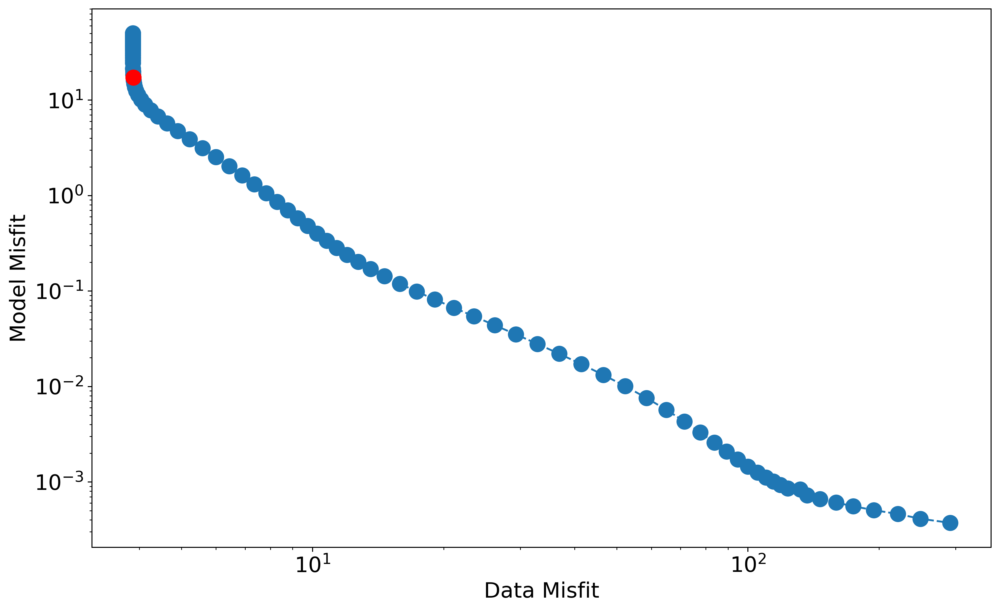

In [70]:
fig, ax=plt.subplots(figsize=[13, 8], dpi=360)
ax.loglog(*fsvals.T, 'o--', markersize=12)
ax.set_xlabel("Data Misfit", size='xx-large')
ax.set_ylabel("Model Misfit", size='xx-large')
idx = 35
ax.loglog(*fsvals[idx], 'ro', markersize=12)
ax.tick_params(labelsize='xx-large')

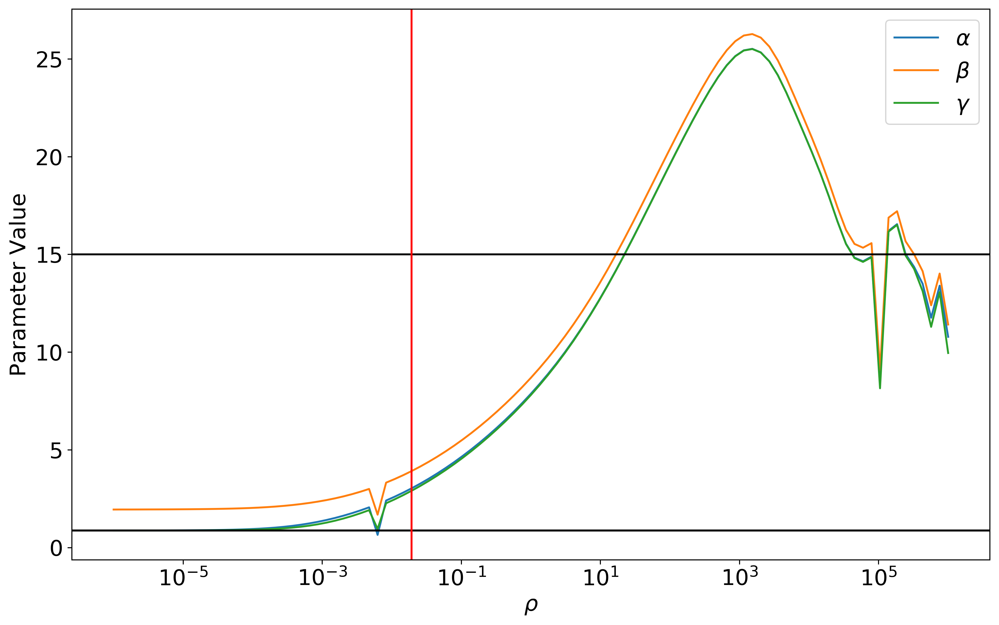

In [71]:
fig, ax=plt.subplots(figsize=[13, 8], dpi=360)
ax.plot(pranges, [float(s['x'][-3]) for s in sols], label=r'$\alpha$')
ax.plot(pranges, [float(s['x'][-2]) for s in sols], label=r'$\beta$')
ax.plot(pranges, [float(s['x'][-1]) for s in sols], label=r'$\gamma$')
for q in p0:
    ax.axhline(q, color='k')
ax.legend(loc="best",fontsize='xx-large')

idx = 35
ax.axvline(pranges[idx], color='r')
ax.set_xlabel(r'$\rho$',size='xx-large')
ax.set_ylabel('Parameter Value', size='xx-large')
ax.set_xscale('log')
ax.set_yscale('linear')
ax.tick_params(labelsize='xx-large')

In [16]:
getp = ca.Function('getx', [solver_setup['x']], model.ps)
getp(sols[idx]['x'])

(DM(2.41036), DM(3.32539), DM(2.27179))

3.86675 24.4625


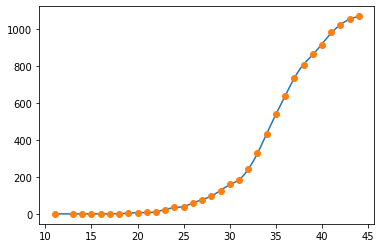

In [17]:
idx = 30
print(f1_ex(sols[idx]['x']), f2_ex(sols[idx]['x']))
plt.plot(model.observation_times, getx(sols[idx]['x'])[-1], label='model')
plt.plot(time, data, 'o', label='data')

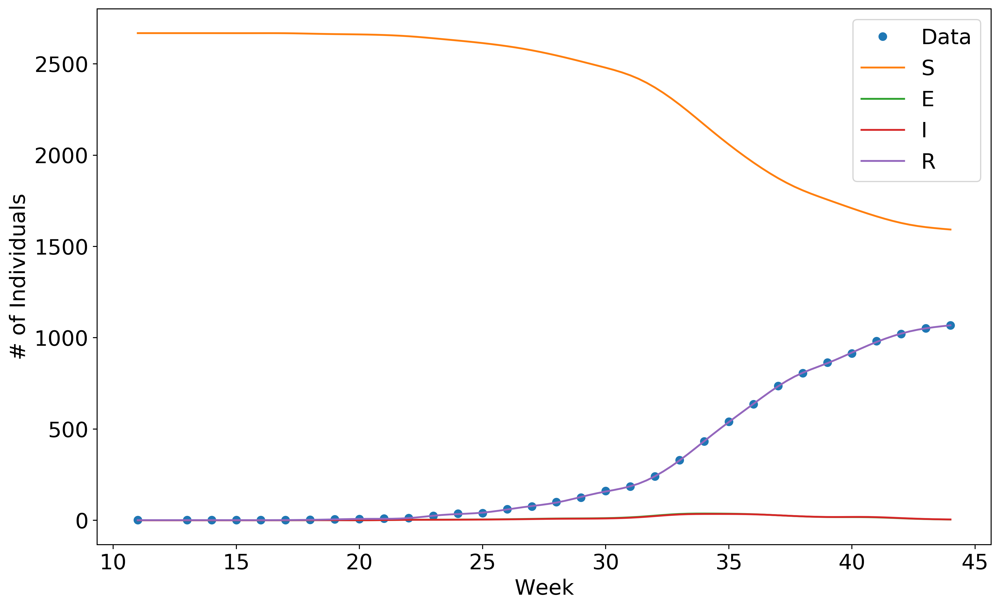

In [72]:
idx=35
fig, ax=plt.subplots(figsize=[13, 8], dpi=360)
ax.plot(time, data, 'o', label='Data')
ax.plot(model.observation_times, getx(sols[idx]['x'])[0], label='S')
ax.plot(model.observation_times, getx(sols[idx]['x'])[1], label='E')
ax.plot(model.observation_times, getx(sols[idx]['x'])[2], label='I')
ax.plot(model.observation_times, getx(sols[idx]['x'])[3], label='R')
ax.legend(fontsize='xx-large')
ax.set_xlabel('Week',size='xx-large')
ax.set_ylabel('# of Individuals',size='xx-large')
ax.tick_params(labelsize='xx-large')

In [19]:
N = np.hstack([np.array(x) for x in getx(sols[idx]['x'])]).sum(axis=1)
print(np.mean(N), np.std(N))

1996.4798227576634 7.094632824478097


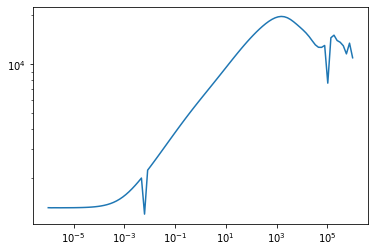

In [20]:
getN = lambda idx: np.mean(np.hstack([np.array(x) for x in getx(sols[idx]['x'])]).sum(axis=1))
plt.loglog(pranges, [getN(i) for i,_ in enumerate(pranges)])

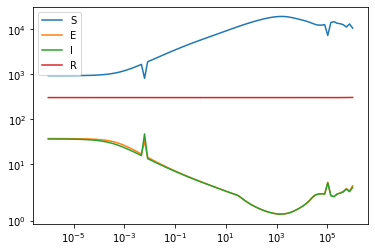

In [21]:
getM = lambda idx: np.mean(np.hstack([np.array(x) for x in getx(sols[idx]['x'])]), axis=0)
plt.semilogx(pranges, [getM(i) for i,_ in enumerate(pranges)])
plt.yscale('symlog')
plt.legend("SEIR")

In [22]:
[x[0] for x in getx(sols[idx]['x'])]

[DM(1999.32), DM(0.000340328), DM(0.064789), DM(1.00045)]

In [23]:
idx = 30
pfin = np.array([float(p) for p in getp(sols[idx]['x'])])
print(f"Recovery Period (Infectious Period): {7/pfin[0]} days")
print(fr"$\beta$: {pfin[1]} effective contacts/week")
print(f"Latent Period: {7/pfin[2]} days")
print(f"$R_0$: {pfin[1]/pfin[0]}")

Recovery Period (Infectious Period): 3.396003506764235 days
$\beta$: 3.0027631258831864 effective contacts/week
Latent Period: 3.6521459532144362 days
$R_0$: 1.4567705864973766


In [24]:
# applying the final size relation
from scipy.optimize import brentq
def rinf(sol):
    pfin = np.array([float(p) for p in getp(sol['x'])])
    r0 = pfin[1]/pfin[0]
    S0, E0, I0, R0 = [float(x[0]) for x in getx(sol['x'])]
    N = sum((S0, E0, I0, R0))
    f = lambda y: y/S0 - np.exp(r0*(y-N)/N) 
    sinf = brentq(f, 0, S0) 
    return N-sinf

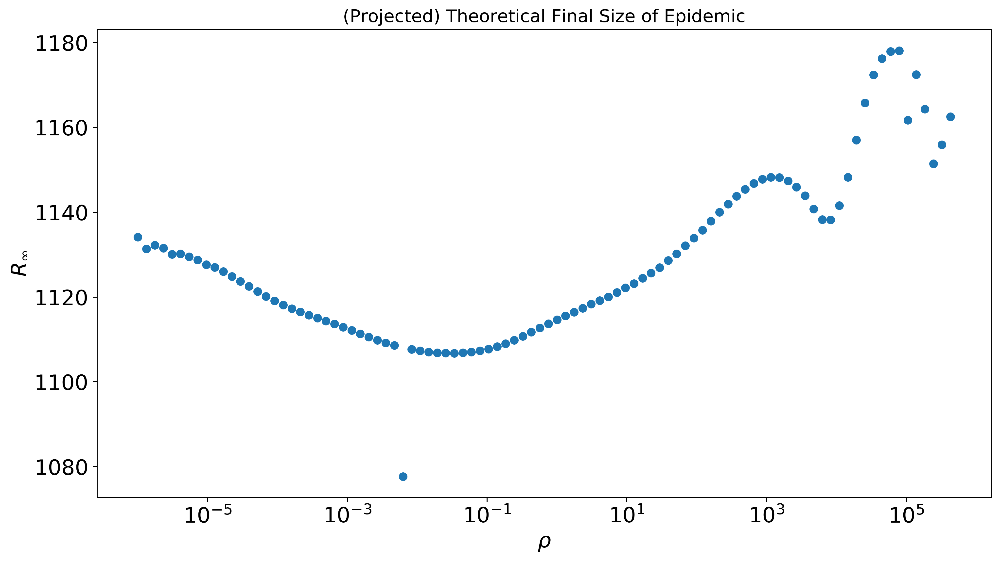

In [74]:
fig, ax = plt.subplots(figsize=[13, 7], dpi=360)
ax.semilogx(pranges[:-3], [rinf(sol) for sol in sols][:-3], 'o')
ax.set_title("(Projected) Theoretical Final Size of Epidemic", fontsize="x-large")
ax.set_xlabel(r"$\rho$", size='xx-large')
ax.set_ylabel(r"$R_\infty$", size='xx-large')
ax.tick_params(labelsize='xx-large')

Text(0, 0.5, '$\\mathcal{R}_0$')

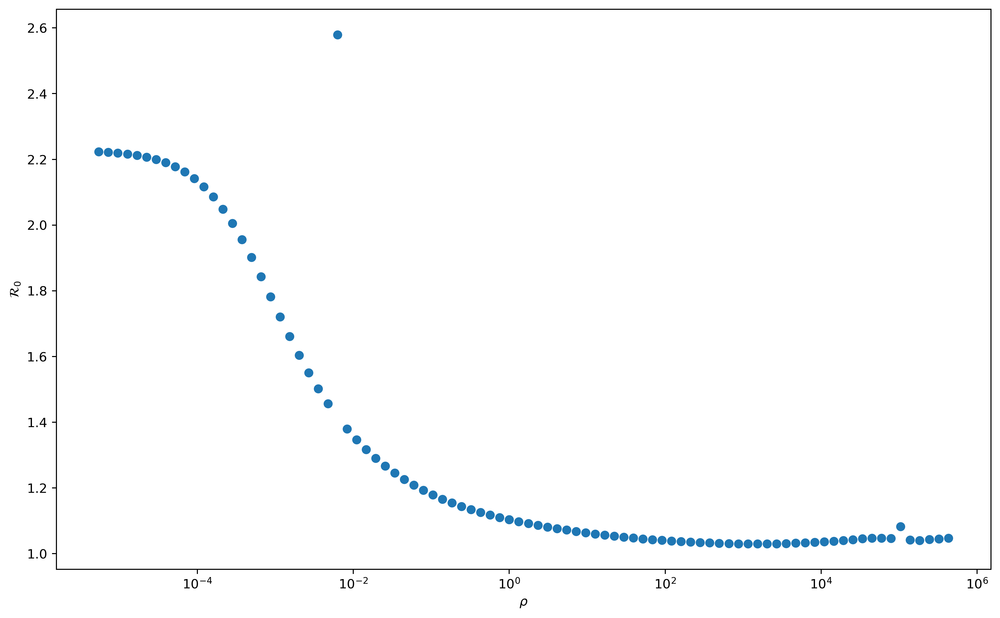

In [26]:
def r0(sol):
    pfin = np.array([float(p) for p in getp(sol['x'])])
    return pfin[1]/pfin[0]
fig, ax=plt.subplots(figsize=[13, 8], dpi=360)
ax.plot(pranges[6:-3], [r0(sol) for sol in sols][6:-3], 'o')
ax.set_xscale('log')
ax.set_xlabel(r'$\rho$')
ax.set_ylabel(r'$\mathcal{R}_0$')

## Profiling

In [27]:
profiler_setup = {
    'f': objective.objective,
    'x': ca.vcat(objective.input_list),
    'p': ca.hcat([objective.rho, objective.alpha]),
}
opts = {'ipopt': {'dual_inf_tol': 1e-1, 'max_iter': 300}}
profiler = ca.nlpsol('solver', 'ipopt', profiler_setup, opts)

In [28]:
idx = 30
rho = pranges[idx]
pref = getp(sols[idx]['x'])
lbx = [-np.inf]*(config['basis_number']*config['model_form']['state']) + [0]*config['model_form']['parameters']
ubx = [np.inf]*(config['basis_number']*config['model_form']['state'] + config['model_form']['parameters'])

profiles = []
for pdx in range(config['model_form']['parameters']):
    pdx_mod = config['basis_number']*config['model_form']['state'] + pdx
    pvals = np.logspace(-1, 1, num=50)
    profiles.append([])
    for pval in pvals:
        lbx0 = np.array(lbx)
        ubx0 = np.array(ubx)
        lbx0[pdx_mod] = pval
        ubx0[pdx_mod] = pval
        profiles[pdx].append(profiler(x0=np.array(sols[idx]['x']).flatten(), p=[rho, 0], lbx=lbx0, ubx=ubx0))

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:     4851

Total number of variables............................:       98
                     variables with only lower bounds:        2
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

  87  4.4293386e+00 0.00e+00 3.39e-02  -5.7 6.55e+00    -  1.00e+00 1.25e-01f  4
  88  4.4292747e+00 0.00e+00 5.39e-02  -5.7 1.10e+00    -  1.00e+00 1.00e+00f  1
  89  4.4291913e+00 0.00e+00 2.20e-02  -5.7 6.76e-01    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  90  4.4291398e+00 0.00e+00 4.68e-02  -5.7 1.73e+00    -  1.00e+00 5.00e-01f  2
  91  4.4290573e+00 0.00e+00 3.15e-02  -5.7 7.84e-01    -  1.00e+00 1.00e+00f  1
  92  4.4290019e+00 0.00e+00 7.37e-02  -5.7 1.18e+00    -  1.00e+00 1.00e+00f  1
  93  4.4288931e+00 0.00e+00 1.38e-02  -5.7 4.83e-01    -  1.00e+00 1.00e+00f  1
  94  4.4288393e+00 0.00e+00 3.88e-02  -5.7 2.83e+00    -  1.00e+00 2.50e-01f  3
  95  4.4287586e+00 0.00e+00 5.44e-02  -5.7 9.52e-01    -  1.00e+00 1.00e+00f  1
  96  4.4286610e+00 0.00e+00 2.87e-02  -5.7 6.68e-01    -  1.00e+00 1.00e+00f  1
  97  4.4286481e+00 0.00e+00 1.10e-01  -5.7 1.30e+00    -  1.00e+00 1.00e+00f  1
  98  4.4284663e+00 0.00e+00

 187  4.3882821e+00 0.00e+00 1.03e-01  -5.7 5.94e+00    -  1.00e+00 1.00e+00f  1
 188  4.3876819e+00 0.00e+00 1.10e-01  -5.7 6.22e+00    -  1.00e+00 1.00e+00f  1
 189  4.3871327e+00 0.00e+00 8.99e-02  -5.7 5.77e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 190  4.3866904e+00 0.00e+00 1.17e-01  -5.7 6.56e+00    -  1.00e+00 1.00e+00f  1
 191  4.3862742e+00 0.00e+00 6.06e-02  -5.7 4.96e+00    -  1.00e+00 1.00e+00f  1
 192  4.3860459e+00 0.00e+00 1.56e-01  -5.7 7.68e+00    -  1.00e+00 1.00e+00f  1
 193  4.3857096e+00 0.00e+00 1.93e-02  -5.7 3.13e+00    -  1.00e+00 1.00e+00f  1
 194  4.3855781e+00 0.00e+00 9.37e-02  -5.7 1.15e+01    -  1.00e+00 5.00e-01f  2
 195  4.3854269e+00 0.00e+00 2.41e-02  -5.7 3.33e+00    -  1.00e+00 1.00e+00f  1
 196  4.3853847e+00 0.00e+00 1.02e-01  -5.7 6.46e+00    -  1.00e+00 1.00e+00f  1
 197  4.3852972e+00 0.00e+00 3.26e-03  -5.7 1.42e+00    -  1.00e+00 1.00e+00f  1
 198  4.3852893e+00 0.00e+00

  56  5.1929576e+00 0.00e+00 1.34e-03  -3.8 1.56e-01  -3.0 1.00e+00 1.00e+00f  1
  57  5.1925969e+00 0.00e+00 7.77e-03  -5.7 3.87e-01  -3.4 1.00e+00 1.00e+00f  1
  58  5.1916907e+00 0.00e+00 5.84e-02  -5.7 1.02e+00  -3.9 1.00e+00 1.00e+00f  1
  59  5.1895835e+00 0.00e+00 1.19e-01  -5.7 2.52e+00  -4.4 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  60  5.1840146e+00 0.00e+00 7.52e-02  -5.7 6.64e+00  -4.9 1.00e+00 1.00e+00f  1
  61  5.1673976e+00 0.00e+00 1.43e-01  -5.7 1.91e+01  -5.3 1.00e+00 1.00e+00f  1
  62  5.1121006e+00 0.00e+00 4.93e-01  -5.7 6.06e+01  -5.8 1.00e+00 1.00e+00f  1
  63  5.1114568e+00 0.00e+00 1.04e-02  -5.7 4.94e-01  -3.6 1.00e+00 1.00e+00f  1
  64  5.1103072e+00 0.00e+00 4.23e-02  -5.7 1.26e+00  -4.1 1.00e+00 1.00e+00f  1
  65  5.1071042e+00 0.00e+00 1.11e-01  -5.7 3.47e+00  -4.5 1.00e+00 1.00e+00f  1
  66  5.0976193e+00 0.00e+00 4.05e-02  -5.7 1.01e+01  -5.0 1.00e+00 1.00e+00f  1
  67  5.0679003e+00 0.00e+00

 152  4.3733335e+00 0.00e+00 6.80e-02  -5.7 5.08e+00    -  1.00e+00 1.25e-01f  4
 153  4.3730427e+00 0.00e+00 9.94e-02  -5.7 8.76e-01    -  1.00e+00 1.00e+00f  1
 154  4.3726791e+00 0.00e+00 4.83e-02  -5.7 6.46e-01    -  1.00e+00 1.00e+00f  1
 155  4.3724485e+00 0.00e+00 8.03e-02  -5.7 1.40e+00    -  1.00e+00 5.00e-01f  2
 156  4.3720956e+00 0.00e+00 8.16e-02  -5.7 8.79e-01    -  1.00e+00 1.00e+00f  1
 157  4.3717295e+00 0.00e+00 8.34e-02  -5.7 9.20e-01    -  1.00e+00 1.00e+00f  1
 158  4.3713481e+00 0.00e+00 8.41e-02  -5.7 9.57e-01    -  1.00e+00 1.00e+00f  1
 159  4.3709539e+00 0.00e+00 8.73e-02  -5.7 1.01e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 160  4.3705401e+00 0.00e+00 8.54e-02  -5.7 1.04e+00    -  1.00e+00 1.00e+00f  1
 161  4.3701193e+00 0.00e+00 9.42e-02  -5.7 1.13e+00    -  1.00e+00 1.00e+00f  1
 162  4.3696641e+00 0.00e+00 8.13e-02  -5.7 1.09e+00    -  1.00e+00 1.00e+00f  1
 163  4.3692386e+00 0.00e+00

   3  1.6096033e+01 0.00e+00 1.11e-01  -2.5 5.05e+00  -3.0 1.00e+00 1.00e+00f  1
   4  1.5618851e+01 0.00e+00 7.80e-01  -2.5 1.38e+01  -3.4 1.00e+00 1.00e+00f  1
   5  1.4642933e+01 0.00e+00 1.56e+00  -2.5 2.62e+01  -3.9 1.00e+00 1.00e+00f  1
   6  1.4108653e+01 0.00e+00 1.52e-01  -2.5 1.26e+01  -3.5 1.00e+00 1.00e+00f  1
   7  1.3004797e+01 0.00e+00 4.95e+00  -2.5 4.03e+01  -4.0 1.00e+00 1.00e+00f  1
   8  1.2287913e+01 0.00e+00 2.12e+00  -2.5 1.45e+01  -3.5 1.00e+00 1.00e+00f  1
   9  1.1100774e+01 0.00e+00 5.45e+00  -2.5 4.43e+01  -4.0 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  1.0888330e+01 0.00e+00 1.10e-01  -2.5 1.73e+00  -2.7 1.00e+00 1.00e+00f  1
  11  1.0745827e+01 0.00e+00 8.99e-03  -2.5 4.90e+00  -3.2 1.00e+00 1.00e+00f  1
  12  1.0350170e+01 0.00e+00 6.25e-02  -3.8 1.40e+01  -3.6 9.30e-01 1.00e+00f  1
  13  9.4066164e+00 0.00e+00 5.94e-01  -3.8 3.64e+01  -4.1 1.00e+00 1.00e+00f  1
  14  7.8362957e+00 0.00e+00

 108  4.3353812e+00 0.00e+00 3.36e-02  -5.7 9.34e-01    -  1.00e+00 1.00e+00f  1
 109  4.3353105e+00 0.00e+00 4.06e-02  -5.7 1.00e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 110  4.3352312e+00 0.00e+00 2.90e-02  -5.7 8.24e-01    -  1.00e+00 1.00e+00f  1
 111  4.3351716e+00 0.00e+00 6.02e-02  -5.7 1.17e+00    -  1.00e+00 1.00e+00f  1
 112  4.3350722e+00 0.00e+00 1.44e-02  -5.7 5.42e-01    -  1.00e+00 1.00e+00f  1
 113  4.3350452e+00 0.00e+00 7.87e-02  -5.7 2.45e+00    -  1.00e+00 5.00e-01f  2
 114  4.3349149e+00 0.00e+00 9.15e-03  -5.7 4.03e-01    -  1.00e+00 1.00e+00f  1
 115  4.3348633e+00 0.00e+00 5.95e-02  -5.7 4.03e+00    -  1.00e+00 2.50e-01f  3
 116  4.3347564e+00 0.00e+00 1.74e-02  -5.7 5.48e-01    -  1.00e+00 1.00e+00f  1
 117  4.3347039e+00 0.00e+00 6.55e-02  -5.7 2.00e+00    -  1.00e+00 5.00e-01f  2
 118  4.3345858e+00 0.00e+00 1.56e-02  -5.7 4.93e-01    -  1.00e+00 1.00e+00f  1
 119  4.3345544e+00 0.00e+00

 209  4.2974236e+00 0.00e+00 1.01e-01  -5.7 1.18e+01    -  1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 210  4.2972292e+00 0.00e+00 1.84e-02  -5.7 2.95e+00    -  1.00e+00 1.00e+00f  1
 211  4.2971470e+00 0.00e+00 4.86e-02  -5.7 7.98e+00    -  1.00e+00 5.00e-01f  2
 212  4.2970670e+00 0.00e+00 2.82e-02  -5.7 3.51e+00    -  1.00e+00 1.00e+00f  1
 213  4.2970243e+00 0.00e+00 3.04e-02  -5.7 3.62e+00    -  1.00e+00 1.00e+00f  1
 214  4.2970026e+00 0.00e+00 9.33e-03  -5.7 2.07e+00    -  1.00e+00 1.00e+00f  1
 215  4.2969961e+00 0.00e+00 9.02e-03  -5.7 1.99e+00    -  1.00e+00 1.00e+00f  1
 216  4.2969948e+00 0.00e+00 7.56e-04  -5.7 5.97e-01    -  1.00e+00 1.00e+00f  1
 217  4.2969948e+00 0.00e+00 1.09e-04  -5.7 2.21e-01    -  1.00e+00 1.00e+00f  1
 218  4.2969948e+00 0.00e+00 1.06e-07  -5.7 7.10e-03    -  1.00e+00 1.00e+00f  1
 219  4.2969948e+00 0.00e+00 3.62e-08  -8.6 3.81e-03    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr 

  67  4.2937114e+00 0.00e+00 2.08e-02  -5.7 9.21e-01    -  1.00e+00 1.00e+00f  1
  68  4.2936307e+00 0.00e+00 6.14e-02  -5.7 1.49e+00    -  1.00e+00 5.00e-01f  2
  69  4.2934840e+00 0.00e+00 2.38e-02  -5.7 4.83e-01    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  70  4.2933945e+00 0.00e+00 5.61e-02  -5.7 1.32e+00    -  1.00e+00 5.00e-01f  2
  71  4.2932460e+00 0.00e+00 3.16e-02  -5.7 5.33e-01    -  1.00e+00 1.00e+00f  1
  72  4.2932020e+00 0.00e+00 1.08e-01  -5.7 9.78e-01    -  1.00e+00 1.00e+00f  1
  73  4.2929489e+00 0.00e+00 9.40e-03  -5.7 2.58e-01    -  1.00e+00 1.00e+00f  1
  74  4.2929290e+00 0.00e+00 1.13e-01  -5.7 3.69e+00    -  1.00e+00 2.50e-01f  3
  75  4.2926534e+00 0.00e+00 9.45e-03  -5.7 2.44e-01    -  1.00e+00 1.00e+00f  1
  76  4.2925510e+00 0.00e+00 3.76e-02  -5.7 3.68e+00    -  1.00e+00 1.25e-01f  4
  77  4.2924471e+00 0.00e+00 9.58e-02  -5.7 8.05e-01    -  1.00e+00 1.00e+00f  1
  78  4.2922070e+00 0.00e+00

 161  4.2604905e+00 0.00e+00 6.70e-08  -8.6 8.33e-07    -  1.00e+00 7.81e-03f  8
 162  4.2604905e+00 0.00e+00 5.03e-08  -8.6 8.26e-07    -  1.00e+00 2.50e-01f  3
 163  4.2604905e+00 0.00e+00 4.40e-08  -8.6 6.20e-07    -  1.00e+00 1.25e-01f  4
 164  4.2604905e+00 0.00e+00 4.12e-08  -8.6 5.42e-07    -  1.00e+00 6.25e-02f  5
 165  4.2604905e+00 0.00e+00 2.06e-08  -8.6 5.08e-07    -  1.00e+00 5.00e-01f  2
 166  4.2604905e+00 0.00e+00 1.95e-08  -9.0 3.80e-06    -  1.00e+00 9.77e-04f 11
 167  4.2604905e+00 0.00e+00 1.82e-08  -9.0 3.80e-06    -  1.00e+00 6.25e-02f  5
 168  4.2604905e+00 0.00e+00 1.77e-08  -9.0 3.56e-06    -  1.00e+00 3.12e-02f  6
 169  4.2604905e+00 0.00e+00 1.76e-08  -9.0 3.45e-06    -  1.00e+00 1.95e-03f 10
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 170  4.2604905e+00 0.00e+00 1.76e-08  -9.0 3.44e-06    -  1.00e+00 9.77e-04f 11
 171  4.2604905e+00 0.00e+00 1.76e-08  -9.0 3.44e-06    -  1.00e+00 2.44e-04f 13

Number of Iterations....: 1

  55  4.3831854e+00 0.00e+00 4.82e-03  -5.7 8.12e-01  -2.4 1.00e+00 1.00e+00f  1
  56  4.3316805e+00 0.00e+00 2.37e-01  -5.7 5.31e+02    -  1.00e+00 1.25e-01f  4
  57  4.2760201e+00 0.00e+00 7.52e-01  -5.7 1.56e+02    -  1.00e+00 5.00e-01f  2
  58  4.2618040e+00 0.00e+00 6.21e-02  -5.7 1.35e+01    -  1.00e+00 1.00e+00f  1
  59  4.2617798e+00 0.00e+00 3.84e-05  -5.7 3.14e-02  -2.9 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  60  4.2617645e+00 0.00e+00 1.96e-04  -5.7 9.34e-02  -3.4 1.00e+00 1.00e+00f  1
  61  4.2617256e+00 0.00e+00 1.83e-03  -5.7 2.84e-01  -3.9 1.00e+00 1.00e+00f  1
  62  4.2616339e+00 0.00e+00 3.26e-02  -5.7 3.71e+01    -  1.00e+00 3.12e-02f  6
  63  4.2608600e+00 0.00e+00 9.24e-02  -5.7 1.49e+01    -  1.00e+00 1.00e+00f  1
  64  4.2607331e+00 0.00e+00 5.88e-02  -5.7 1.55e+00  -4.3 1.00e+00 1.00e+00f  1
  65  4.2606425e+00 0.00e+00 6.13e-03  -5.7 1.02e+00    -  1.00e+00 1.00e+00f  1
  66  4.2606102e+00 0.00e+00

 151  4.2382100e+00 0.00e+00 1.30e-01  -5.7 4.11e+00    -  1.00e+00 1.00e+00f  1
 152  4.2374070e+00 0.00e+00 3.77e-02  -5.7 2.40e+00    -  1.00e+00 1.00e+00f  1
 153  4.2369911e+00 0.00e+00 1.27e-01  -5.7 8.11e+00    -  1.00e+00 5.00e-01f  2
 154  4.2362029e+00 0.00e+00 3.67e-02  -5.7 2.57e+00    -  1.00e+00 1.00e+00f  1
 155  4.2357923e+00 0.00e+00 1.21e-01  -5.7 8.58e+00    -  1.00e+00 5.00e-01f  2
 156  4.2350387e+00 0.00e+00 3.63e-02  -5.7 2.77e+00    -  1.00e+00 1.00e+00f  1
 157  4.2346313e+00 0.00e+00 1.09e-01  -5.7 8.75e+00    -  1.00e+00 5.00e-01f  2
 158  4.2339415e+00 0.00e+00 3.89e-02  -5.7 3.09e+00    -  1.00e+00 1.00e+00f  1
 159  4.2335422e+00 0.00e+00 8.61e-02  -5.7 8.11e+00    -  1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 160  4.2329492e+00 0.00e+00 5.22e-02  -5.7 3.82e+00    -  1.00e+00 1.00e+00f  1
 161  4.2325834e+00 0.00e+00 1.29e-01  -5.7 5.97e+00    -  1.00e+00 1.00e+00f  1
 162  4.2319274e+00 0.00e+00

  32  5.2671550e+00 0.00e+00 2.40e-01  -3.8 2.39e+00  -4.1 1.00e+00 1.00e+00f  1
  33  5.2569943e+00 0.00e+00 1.28e-01  -3.8 7.04e+00  -4.6 1.00e+00 1.00e+00f  1
  34  5.2322307e+00 0.00e+00 3.91e-01  -3.8 1.95e+01  -5.1 1.00e+00 1.00e+00f  1
  35  5.1784938e+00 0.00e+00 6.92e-03  -3.8 4.79e+01  -5.6 1.00e+00 1.00e+00f  1
  36  5.1596775e+00 0.00e+00 9.98e-01  -3.8 9.56e+01  -6.1 1.00e+00 2.50e-01f  3
  37  5.0183777e+00 0.00e+00 1.66e+00  -3.8 2.14e+02  -6.5 1.00e+00 1.00e+00f  1
  38  5.0140525e+00 0.00e+00 4.56e-03  -3.8 1.75e-01  -2.5 1.00e+00 1.00e+00f  1
  39  5.0136335e+00 0.00e+00 9.06e-03  -3.8 3.00e-01  -3.0 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  40  5.0127310e+00 0.00e+00 6.80e-02  -3.8 8.30e-01  -3.4 1.00e+00 1.00e+00f  1
  41  5.0112352e+00 0.00e+00 1.48e-01  -3.8 1.28e+00  -3.9 1.00e+00 1.00e+00f  1
  42  5.0091747e+00 0.00e+00 9.72e-02  -3.8 2.57e+00  -4.4 1.00e+00 1.00e+00f  1
  43  5.0059497e+00 0.00e+00

 128  4.2215695e+00 0.00e+00 2.99e-02  -5.7 7.88e-01    -  1.00e+00 1.00e+00f  1
 129  4.2213558e+00 0.00e+00 1.04e-01  -5.7 2.75e+00    -  1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 130  4.2209061e+00 0.00e+00 2.83e-02  -5.7 8.25e-01    -  1.00e+00 1.00e+00f  1
 131  4.2207187e+00 0.00e+00 1.23e-01  -5.7 3.26e+00    -  1.00e+00 5.00e-01f  2
 132  4.2201892e+00 0.00e+00 2.18e-02  -5.7 7.88e-01    -  1.00e+00 1.00e+00f  1
 133  4.2199269e+00 0.00e+00 6.81e-02  -5.7 4.81e+00    -  1.00e+00 2.50e-01f  3
 134  4.2195183e+00 0.00e+00 7.75e-02  -5.7 1.54e+00    -  1.00e+00 1.00e+00f  1
 135  4.2190721e+00 0.00e+00 6.19e-02  -5.7 1.44e+00    -  1.00e+00 1.00e+00f  1
 136  4.2186837e+00 0.00e+00 1.01e-01  -5.7 1.90e+00    -  1.00e+00 1.00e+00f  1
 137  4.2181649e+00 0.00e+00 3.87e-02  -5.7 1.25e+00    -  1.00e+00 1.00e+00f  1
 138  4.2178503e+00 0.00e+00 9.10e-02  -5.7 3.43e+00    -  1.00e+00 5.00e-01f  2
 139  4.2173320e+00 0.00e+00

   6  1.1223011e+01 0.00e+00 1.65e+01  -2.5 8.48e+01  -4.4 1.00e+00 1.00e+00f  1
   7  9.3935227e+00 0.00e+00 2.04e-01  -2.5 1.10e+00  -2.2 1.00e+00 1.00e+00f  1
   8  9.3211143e+00 0.00e+00 8.37e-03  -2.5 1.87e+00  -2.6 1.00e+00 1.00e+00f  1
   9  9.1208792e+00 0.00e+00 2.29e-02  -3.8 5.44e+00  -3.1 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  8.5977160e+00 0.00e+00 1.28e-01  -3.8 1.57e+01  -3.6 1.00e+00 1.00e+00f  1
  11  7.5140711e+00 0.00e+00 4.56e-01  -3.8 3.87e+01  -4.1 1.00e+00 1.00e+00f  1
  12  6.1524711e+00 0.00e+00 3.78e+00  -3.8 6.50e+01  -4.5 1.00e+00 1.00e+00f  1
  13  6.0590591e+00 0.00e+00 9.06e-01  -3.8 3.81e+00  -3.2 1.00e+00 1.00e+00f  1
  14  5.9265781e+00 0.00e+00 6.20e-02  -3.8 8.17e+00  -3.7 1.00e+00 1.00e+00f  1
  15  5.6875898e+00 0.00e+00 1.55e+00  -3.8 1.92e+01  -4.2 1.00e+00 1.00e+00f  1
  16  5.3756522e+00 0.00e+00 8.95e-01  -3.8 3.09e+01  -4.6 1.00e+00 1.00e+00f  1
  17  5.3628886e+00 0.00e+00

 107  4.1900789e+00 0.00e+00 4.09e-02  -5.7 1.89e+00    -  1.00e+00 1.00e+00f  1
 108  4.1897773e+00 0.00e+00 6.64e-02  -5.7 4.06e+00    -  1.00e+00 5.00e-01f  2
 109  4.1893313e+00 0.00e+00 6.84e-02  -5.7 2.59e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 110  4.1888770e+00 0.00e+00 6.35e-02  -5.7 2.60e+00    -  1.00e+00 1.00e+00f  1
 111  4.1884398e+00 0.00e+00 7.22e-02  -5.7 2.88e+00    -  1.00e+00 1.00e+00f  1
 112  4.1879763e+00 0.00e+00 5.42e-02  -5.7 2.62e+00    -  1.00e+00 1.00e+00f  1
 113  4.1875980e+00 0.00e+00 9.25e-02  -5.7 3.53e+00    -  1.00e+00 1.00e+00f  1
 114  4.1870953e+00 0.00e+00 3.05e-02  -5.7 2.17e+00    -  1.00e+00 1.00e+00f  1
 115  4.1868095e+00 0.00e+00 8.09e-02  -5.7 6.37e+00    -  1.00e+00 5.00e-01f  2
 116  4.1863471e+00 0.00e+00 3.62e-02  -5.7 2.52e+00    -  1.00e+00 1.00e+00f  1
 117  4.1860705e+00 0.00e+00 5.95e-02  -5.7 5.45e+00    -  1.00e+00 5.00e-01f  2
 118  4.1856739e+00 0.00e+00

  38  4.7942108e+00 0.00e+00 4.34e-03  -3.8 1.77e-01  -2.5 1.00e+00 1.00e+00f  1
  39  4.7939165e+00 0.00e+00 2.06e-02  -3.8 4.09e-01  -3.0 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  40  4.7933120e+00 0.00e+00 1.22e-01  -3.8 1.02e+00  -3.4 1.00e+00 1.00e+00f  1
  41  4.7924495e+00 0.00e+00 1.01e-01  -3.8 9.88e-01  -3.9 1.00e+00 1.00e+00f  1
  42  4.7912854e+00 0.00e+00 1.99e-01  -3.8 1.60e+00  -4.4 1.00e+00 1.00e+00f  1
  43  4.7889147e+00 0.00e+00 6.42e-02  -3.8 3.71e+00  -4.9 1.00e+00 1.00e+00f  1
  44  4.7843929e+00 0.00e+00 5.11e-01  -3.8 9.84e+00  -5.4 1.00e+00 1.00e+00f  1
  45  4.7659918e+00 0.00e+00 3.40e-02  -3.8 2.92e+01  -5.8 1.00e+00 1.00e+00f  1
  46  4.7655755e+00 0.00e+00 1.02e-01  -3.8 1.10e+01  -4.5 1.00e+00 1.25e-01f  4
  47  4.7628198e+00 0.00e+00 1.02e-01  -3.8 4.12e+00  -5.0 1.00e+00 1.00e+00f  1
  48  4.7552347e+00 0.00e+00 1.38e-01  -3.8 1.23e+01  -5.5 1.00e+00 1.00e+00f  1
  49  4.7315026e+00 0.00e+00

 138  4.1716016e+00 0.00e+00 4.98e-02  -5.7 1.87e+00    -  1.00e+00 1.00e+00f  1
 139  4.1713046e+00 0.00e+00 7.14e-02  -5.7 2.31e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 140  4.1709479e+00 0.00e+00 3.44e-02  -5.7 1.69e+00    -  1.00e+00 1.00e+00f  1
 141  4.1707283e+00 0.00e+00 5.43e-02  -5.7 3.55e+00    -  1.00e+00 5.00e-01f  2
 142  4.1704064e+00 0.00e+00 5.84e-02  -5.7 2.32e+00    -  1.00e+00 1.00e+00f  1
 143  4.1700729e+00 0.00e+00 4.96e-02  -5.7 2.23e+00    -  1.00e+00 1.00e+00f  1
 144  4.1697704e+00 0.00e+00 6.71e-02  -5.7 2.68e+00    -  1.00e+00 1.00e+00f  1
 145  4.1694228e+00 0.00e+00 3.55e-02  -5.7 2.05e+00    -  1.00e+00 1.00e+00f  1
 146  4.1693221e+00 0.00e+00 1.22e-01  -5.7 3.85e+00    -  1.00e+00 1.00e+00f  1
 147  4.1687785e+00 0.00e+00 9.94e-03  -5.7 1.25e+00    -  1.00e+00 1.00e+00f  1
 148  4.1686206e+00 0.00e+00 9.04e-02  -5.7 1.36e+01    -  1.00e+00 2.50e-01f  3
 149  4.1682287e+00 0.00e+00

  28  4.7408432e+00 0.00e+00 1.54e-01  -3.8 1.10e+00  -4.0 1.00e+00 1.00e+00f  1
  29  4.7388349e+00 0.00e+00 3.33e-01  -3.8 2.33e+00  -4.5 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  30  4.7352098e+00 0.00e+00 7.28e-02  -3.8 5.00e+00  -5.0 1.00e+00 1.00e+00f  1
  31  4.7316144e+00 0.00e+00 3.22e-01  -3.8 1.29e+01  -5.5 1.00e+00 5.00e-01f  2
  32  4.7127786e+00 0.00e+00 1.11e-02  -3.8 3.64e+01  -6.0 1.00e+00 1.00e+00f  1
  33  4.6736473e+00 0.00e+00 1.34e+00  -3.8 1.07e+02  -6.4 1.00e+00 1.00e+00f  1
  34  4.5369342e+00 0.00e+00 1.29e+00  -3.8 8.30e+02  -6.9 1.00e+00 2.50e-01f  3
  35  4.4165199e+00 0.00e+00 3.13e+00  -3.8 7.52e+02    -  1.00e+00 2.50e-01f  3
  36  4.3767235e+00 0.00e+00 2.40e-02  -3.8 6.85e-01  -2.9 1.00e+00 1.00e+00f  1
  37  4.2919625e+00 0.00e+00 1.28e+00  -3.8 4.91e+02    -  1.00e+00 2.50e-01f  3
  38  4.2844342e+00 0.00e+00 6.95e-04  -3.8 1.92e-01  -2.4 1.00e+00 1.00e+00f  1
  39  4.2208260e+00 0.00e+00

 124  4.1514769e+00 0.00e+00 1.22e-02  -5.7 1.96e+00    -  1.00e+00 1.00e+00f  1
 125  4.1514716e+00 0.00e+00 7.65e-04  -5.7 5.32e-01    -  1.00e+00 1.00e+00f  1
 126  4.1514707e+00 0.00e+00 4.71e-03  -5.7 1.23e+00    -  1.00e+00 1.00e+00f  1
 127  4.1514700e+00 0.00e+00 2.94e-05  -5.7 1.12e-01    -  1.00e+00 1.00e+00f  1
 128  4.1514700e+00 0.00e+00 3.73e-05  -5.7 1.10e-01    -  1.00e+00 1.00e+00f  1
 129  4.1514700e+00 0.00e+00 1.35e-09  -5.7 7.72e-04    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 130  4.1514700e+00 0.00e+00 2.82e-07  -8.6 9.43e-03    -  1.00e+00 1.00e+00f  1
 131  4.1514700e+00 0.00e+00 2.98e-14  -8.6 5.97e-07    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 131

                                   (scaled)                 (unscaled)
Objective...............:   4.1514700348793010e+00    4.1514700348793010e+00
Dual infeasibility......:   2.9839439091886754e-14    2.9839439091886754e-14
Constraint vio


Number of Iterations....: 61

                                   (scaled)                 (unscaled)
Objective...............:   4.1396539660509539e+00    4.1396539660509539e+00
Dual infeasibility......:   3.3314613073892722e-14    3.3314613073892722e-14
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059035596856279e-09    2.5059035596856279e-09
Overall NLP error.......:   2.5059035596856279e-09    2.5059035596856279e-09


Number of objective function evaluations             = 155
Number of objective gradient evaluations             = 62
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 0
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 0
Number of Lagrangian Hessian evaluations             = 61
Total CPU secs in IPOPT (w/o function evaluations)   =      0.056
Total CPU secs in NLP function evaluations

   6  9.6668832e+00 0.00e+00 2.35e+00  -2.5 2.85e+01  -3.5 1.00e+00 1.00e+00f  1
   7  9.1027025e+00 0.00e+00 2.78e-01  -2.5 9.41e+00  -3.1 1.00e+00 1.00e+00f  1
   8  7.9718926e+00 0.00e+00 1.14e+00  -2.5 2.47e+01  -3.5 1.00e+00 1.00e+00f  1
   9  6.5272989e+00 0.00e+00 2.08e+00  -2.5 4.71e+01  -4.0 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  5.1145331e+00 0.00e+00 6.97e+00  -2.5 6.79e+01  -4.5 1.00e+00 1.00e+00f  1
  11  4.8740122e+00 0.00e+00 1.91e-02  -2.5 3.55e-01  -2.3 1.00e+00 1.00e+00f  1
  12  4.8636906e+00 0.00e+00 6.17e-03  -3.8 6.37e-01  -2.7 1.00e+00 1.00e+00f  1
  13  4.8390281e+00 0.00e+00 5.35e-02  -3.8 1.78e+00  -3.2 1.00e+00 1.00e+00f  1
  14  4.7861512e+00 0.00e+00 4.17e-01  -3.8 4.42e+00  -3.7 1.00e+00 1.00e+00f  1
  15  4.7202559e+00 0.00e+00 3.40e-01  -3.8 7.83e+00  -4.2 1.00e+00 1.00e+00f  1
  16  4.6770788e+00 0.00e+00 4.26e-01  -3.8 8.95e+00  -4.6 1.00e+00 1.00e+00f  1
  17  4.6512313e+00 0.00e+00

   8  7.2258004e+00 0.00e+00 1.04e+00  -2.5 2.44e+01  -3.5 1.00e+00 1.00e+00f  1
   9  5.9036349e+00 0.00e+00 1.76e+00  -2.5 4.38e+01  -4.0 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  4.8154310e+00 0.00e+00 4.28e+00  -2.5 5.39e+01  -4.5 1.00e+00 1.00e+00f  1
  11  4.7159142e+00 0.00e+00 3.28e-03  -2.5 1.94e-01  -2.3 1.00e+00 1.00e+00f  1
  12  4.7086128e+00 0.00e+00 5.07e-03  -3.8 5.56e-01  -2.7 1.00e+00 1.00e+00f  1
  13  4.6901345e+00 0.00e+00 4.74e-02  -3.8 1.55e+00  -3.2 1.00e+00 1.00e+00f  1
  14  4.6516660e+00 0.00e+00 3.73e-01  -3.8 3.70e+00  -3.7 1.00e+00 1.00e+00f  1
  15  4.6083498e+00 0.00e+00 3.52e-01  -3.8 6.03e+00  -4.2 1.00e+00 1.00e+00f  1
  16  4.5805573e+00 0.00e+00 3.82e-01  -3.8 6.14e+00  -4.6 1.00e+00 1.00e+00f  1
  17  4.5597926e+00 0.00e+00 3.35e-01  -3.8 1.31e+01  -5.1 1.00e+00 1.00e+00f  1
  18  4.5323066e+00 0.00e+00 3.99e-01  -3.8 3.03e+01  -5.6 1.00e+00 1.00e+00f  1
  19  4.4994910e+00 0.00e+00

 112  4.1074950e+00 0.00e+00 5.89e-08  -8.6 9.85e-04    -  1.00e+00 1.00e+00f  1
 113  4.1074950e+00 0.00e+00 2.98e-08  -8.6 1.44e-04    -  1.00e+00 5.00e-01f  2
 114  4.1074950e+00 0.00e+00 1.50e-08  -8.6 7.22e-05    -  1.00e+00 5.00e-01f  2
 115  4.1074950e+00 0.00e+00 1.67e-08  -9.0 1.19e-04    -  1.00e+00 1.53e-05f 17
 116  4.1074950e+00 0.00e+00 1.67e-08  -9.0 1.19e-04    -  1.00e+00 1.53e-05f 17
 117  4.1074950e+00 0.00e+00 1.67e-08  -9.0 1.19e-04    -  1.00e+00 1.53e-05f 17
 118  4.1074950e+00 0.00e+00 1.67e-08  -9.0 1.19e-04    -  1.00e+00 1.53e-05f 17
 119  4.1074950e+00 0.00e+00 1.67e-08  -9.0 1.19e-04    -  1.00e+00 1.53e-05f 17
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 120  4.1074950e+00 0.00e+00 1.67e-08  -9.0 1.19e-04    -  1.00e+00 1.53e-05f 17
 121  4.1074950e+00 0.00e+00 1.67e-08  -9.0 1.19e-04    -  1.00e+00 1.53e-05f 17
 122  4.1074950e+00 0.00e+00 1.67e-08  -9.0 1.19e-04    -  1.00e+00 7.63e-06f 18
 123  4.1074950e+00 0.00e+00

  58  4.0969260e+00 0.00e+00 1.02e-02  -5.7 3.59e-01    -  1.00e+00 1.00e+00f  1
  59  4.0969107e+00 0.00e+00 1.20e-02  -5.7 3.82e-01    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  60  4.0968947e+00 0.00e+00 8.37e-03  -5.7 3.12e-01    -  1.00e+00 1.00e+00f  1
  61  4.0968828e+00 0.00e+00 1.60e-02  -5.7 4.27e-01    -  1.00e+00 1.00e+00f  1
  62  4.0968657e+00 0.00e+00 4.22e-03  -5.7 2.20e-01    -  1.00e+00 1.00e+00f  1
  63  4.0968574e+00 0.00e+00 1.56e-02  -5.7 7.79e-01    -  1.00e+00 5.00e-01f  2
  64  4.0968413e+00 0.00e+00 4.09e-03  -5.7 2.24e-01    -  1.00e+00 1.00e+00f  1
  65  4.0968335e+00 0.00e+00 1.52e-02  -5.7 7.96e-01    -  1.00e+00 5.00e-01f  2
  66  4.0968184e+00 0.00e+00 3.93e-03  -5.7 2.27e-01    -  1.00e+00 1.00e+00f  1
  67  4.0968111e+00 0.00e+00 1.49e-02  -5.7 8.18e-01    -  1.00e+00 5.00e-01f  2
  68  4.0967968e+00 0.00e+00 3.70e-03  -5.7 2.28e-01    -  1.00e+00 1.00e+00f  1
  69  4.0967903e+00 0.00e+00

 158  4.0964161e+00 0.00e+00 7.68e-03  -5.7 1.04e+00    -  1.00e+00 1.00e+00f  1
 159  4.0964135e+00 0.00e+00 7.22e-04  -5.7 3.31e-01    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 160  4.0964125e+00 0.00e+00 5.08e-03  -5.7 3.25e+00    -  1.00e+00 2.50e-01f  3
 161  4.0964107e+00 0.00e+00 1.58e-03  -5.7 4.90e-01    -  1.00e+00 1.00e+00f  1
 162  4.0964097e+00 0.00e+00 4.67e-03  -5.7 1.53e+00    -  1.00e+00 5.00e-01f  2
 163  4.0964081e+00 0.00e+00 1.79e-03  -5.7 5.31e-01    -  1.00e+00 1.00e+00f  1
 164  4.0964071e+00 0.00e+00 3.80e-03  -5.7 1.35e+00    -  1.00e+00 5.00e-01f  2
 165  4.0964056e+00 0.00e+00 2.57e-03  -5.7 6.46e-01    -  1.00e+00 1.00e+00f  1
 166  4.0964045e+00 0.00e+00 5.45e-03  -5.7 9.46e-01    -  1.00e+00 1.00e+00f  1
 167  4.0964028e+00 0.00e+00 1.20e-03  -5.7 4.55e-01    -  1.00e+00 1.00e+00f  1
 168  4.0964022e+00 0.00e+00 6.40e-03  -5.7 1.99e+00    -  1.00e+00 5.00e-01f  2
 169  4.0964003e+00 0.00e+00

 263  4.0963344e+00 0.00e+00 2.26e-03  -5.7 5.20e+00    -  1.00e+00 2.50e-01f  3
 264  4.0963339e+00 0.00e+00 1.13e-03  -5.7 1.00e+00    -  1.00e+00 1.00e+00f  1
 265  4.0963339e+00 0.00e+00 4.43e-03  -5.7 1.99e+00    -  1.00e+00 1.00e+00f  1
 266  4.0963331e+00 0.00e+00 2.85e-04  -5.7 5.24e-01    -  1.00e+00 1.00e+00f  1
 267  4.0963331e+00 0.00e+00 4.11e-03  -5.7 7.58e+00    -  1.00e+00 2.50e-01f  3
 268  4.0963324e+00 0.00e+00 3.21e-04  -5.7 5.62e-01    -  1.00e+00 1.00e+00f  1
 269  4.0963322e+00 0.00e+00 3.26e-03  -5.7 6.78e+00    -  1.00e+00 2.50e-01f  3
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 270  4.0963317e+00 0.00e+00 4.95e-04  -5.7 7.02e-01    -  1.00e+00 1.00e+00f  1
 271  4.0963314e+00 0.00e+00 1.64e-03  -5.7 4.46e+00    -  1.00e+00 2.50e-01f  3
 272  4.0963311e+00 0.00e+00 1.89e-03  -5.7 1.37e+00    -  1.00e+00 1.00e+00f  1
 273  4.0963307e+00 0.00e+00 1.41e-03  -5.7 1.19e+00    -  1.00e+00 1.00e+00f  1
 274  4.0963304e+00 0.00e+00

  28  4.0885014e+00 0.00e+00 1.21e-03  -3.8 7.63e+00    -  1.00e+00 1.00e+00f  1
  29  4.0884228e+00 0.00e+00 2.45e-02  -5.7 1.01e+01    -  8.14e-01 1.25e-01f  4
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  30  4.0883186e+00 0.00e+00 2.69e-02  -5.7 1.82e+00    -  1.00e+00 1.00e+00f  1
  31  4.0882166e+00 0.00e+00 2.26e-02  -5.7 1.04e+00    -  1.00e+00 1.00e+00f  1
  32  4.0881274e+00 0.00e+00 2.99e-02  -5.7 1.20e+00    -  1.00e+00 1.00e+00f  1
  33  4.0880305e+00 0.00e+00 1.61e-02  -5.7 8.43e-01    -  1.00e+00 1.00e+00f  1
  34  4.0879897e+00 0.00e+00 4.98e-02  -5.7 1.47e+00    -  1.00e+00 1.00e+00f  1
  35  4.0878606e+00 0.00e+00 5.06e-03  -5.7 4.25e-01    -  1.00e+00 1.00e+00f  1
  36  4.0878076e+00 0.00e+00 2.66e-02  -5.7 3.78e+00    -  1.00e+00 2.50e-01f  3
  37  4.0877278e+00 0.00e+00 1.57e-02  -5.7 7.49e-01    -  1.00e+00 1.00e+00f  1
  38  4.0876832e+00 0.00e+00 4.10e-02  -5.7 1.20e+00    -  1.00e+00 1.00e+00f  1
  39  4.0875870e+00 0.00e+00

 139  4.0858196e+00 0.00e+00 5.95e-03  -5.7 1.76e+00    -  1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 140  4.0858152e+00 0.00e+00 4.64e-03  -5.7 9.21e-01    -  1.00e+00 1.00e+00f  1
 141  4.0858116e+00 0.00e+00 7.36e-03  -5.7 1.17e+00    -  1.00e+00 1.00e+00f  1
 142  4.0858070e+00 0.00e+00 2.86e-03  -5.7 7.49e-01    -  1.00e+00 1.00e+00f  1
 143  4.0858043e+00 0.00e+00 5.91e-03  -5.7 1.87e+00    -  1.00e+00 5.00e-01f  2
 144  4.0858003e+00 0.00e+00 4.21e-03  -5.7 9.25e-01    -  1.00e+00 1.00e+00f  1
 145  4.0857972e+00 0.00e+00 8.02e-03  -5.7 1.29e+00    -  1.00e+00 1.00e+00f  1
 146  4.0857927e+00 0.00e+00 2.17e-03  -5.7 6.89e-01    -  1.00e+00 1.00e+00f  1
 147  4.0857905e+00 0.00e+00 8.02e-03  -5.7 2.45e+00    -  1.00e+00 5.00e-01f  2
 148  4.0857861e+00 0.00e+00 2.06e-03  -5.7 6.89e-01    -  1.00e+00 1.00e+00f  1
 149  4.0857841e+00 0.00e+00 8.32e-03  -5.7 2.57e+00    -  1.00e+00 5.00e-01f  2
iter    objective    inf_pr 

 235  4.0856294e+00 0.00e+00 2.55e-03  -5.7 1.94e+00    -  1.00e+00 1.00e+00f  1
 236  4.0856284e+00 0.00e+00 2.89e-03  -5.7 2.09e+00    -  1.00e+00 1.00e+00f  1
 237  4.0856274e+00 0.00e+00 2.21e-03  -5.7 1.84e+00    -  1.00e+00 1.00e+00f  1
 238  4.0856266e+00 0.00e+00 3.71e-03  -5.7 2.41e+00    -  1.00e+00 1.00e+00f  1
 239  4.0856255e+00 0.00e+00 1.29e-03  -5.7 1.45e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 240  4.0856249e+00 0.00e+00 3.20e-03  -5.7 4.06e+00    -  1.00e+00 5.00e-01f  2
 241  4.0856239e+00 0.00e+00 1.68e-03  -5.7 1.67e+00    -  1.00e+00 1.00e+00f  1
 242  4.0856237e+00 0.00e+00 5.94e-03  -5.7 3.15e+00    -  1.00e+00 1.00e+00f  1
 243  4.0856221e+00 0.00e+00 4.68e-04  -5.7 9.21e-01    -  1.00e+00 1.00e+00f  1
 244  4.0856217e+00 0.00e+00 4.61e-03  -5.7 1.09e+01    -  1.00e+00 2.50e-01f  3
 245  4.0856205e+00 0.00e+00 7.51e-04  -5.7 1.17e+00    -  1.00e+00 1.00e+00f  1
 246  4.0856199e+00 0.00e+00

   5  8.1840353e+00 0.00e+00 3.12e-01  -1.7 1.17e+01  -3.0 1.00e+00 1.00e+00f  1
   6  6.6747531e+00 0.00e+00 1.94e+00  -1.7 2.86e+01  -3.5 1.00e+00 1.00e+00f  1
   7  6.6238684e+00 0.00e+00 7.57e-01  -1.7 8.86e+03  -4.0 5.39e-03 1.89e-03f  9
   8  4.8728392e+00 0.00e+00 6.61e+00  -1.7 6.32e+01  -4.4 1.00e+00 1.00e+00f  1
   9  4.5535559e+00 0.00e+00 2.56e-02  -1.7 4.34e-01  -2.2 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  4.5369530e+00 0.00e+00 2.00e-03  -3.8 9.62e-01  -2.7 9.96e-01 1.00e+00f  1
  11  4.4997839e+00 0.00e+00 1.87e-02  -3.8 2.63e+00  -3.2 1.00e+00 1.00e+00f  1
  12  4.4346277e+00 0.00e+00 1.79e-01  -3.8 5.61e+00  -3.6 1.00e+00 1.00e+00f  1
  13  4.3799353e+00 0.00e+00 3.67e-01  -3.8 7.33e+00  -4.1 1.00e+00 1.00e+00f  1
  14  4.3561027e+00 0.00e+00 1.59e-01  -3.8 4.67e+00  -4.6 1.00e+00 1.00e+00f  1
  15  4.3478036e+00 0.00e+00 7.37e-01  -3.8 8.23e+00  -5.1 1.00e+00 1.00e+00f  1
  16  4.3234956e+00 0.00e+00

 112  4.0756787e+00 0.00e+00 1.07e-02  -3.8 1.21e+00    -  1.00e+00 1.00e+00f  1
 113  4.0756675e+00 0.00e+00 6.71e-03  -3.8 9.78e-01    -  1.00e+00 1.00e+00f  1
 114  4.0756629e+00 0.00e+00 1.64e-02  -3.8 1.54e+00    -  1.00e+00 1.00e+00f  1
 115  4.0756478e+00 0.00e+00 2.70e-03  -3.8 6.59e-01    -  1.00e+00 1.00e+00f  1
 116  4.0756423e+00 0.00e+00 7.71e-03  -3.8 3.75e+00    -  1.00e+00 2.50e-01f  3
 117  4.0756347e+00 0.00e+00 1.16e-02  -3.8 1.37e+00    -  1.00e+00 1.00e+00f  1
 118  4.0756238e+00 0.00e+00 5.01e-03  -3.8 9.26e-01    -  1.00e+00 1.00e+00f  1
 119  4.0756183e+00 0.00e+00 8.88e-03  -3.8 2.09e+00    -  1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 120  4.0756095e+00 0.00e+00 8.09e-03  -3.8 1.20e+00    -  1.00e+00 1.00e+00f  1
 121  4.0756017e+00 0.00e+00 9.46e-03  -3.8 1.32e+00    -  1.00e+00 1.00e+00f  1
 122  4.0755927e+00 0.00e+00 6.75e-03  -3.8 1.14e+00    -  1.00e+00 1.00e+00f  1
 123  4.0755873e+00 0.00e+00

 218  4.0752823e+00 0.00e+00 4.06e-03  -5.7 5.41e+00    -  1.00e+00 5.00e-01f  2
 219  4.0752807e+00 0.00e+00 1.74e-03  -5.7 2.00e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 220  4.0752798e+00 0.00e+00 3.20e-03  -5.7 4.56e+00    -  1.00e+00 5.00e-01f  2
 221  4.0752784e+00 0.00e+00 2.86e-03  -5.7 2.56e+00    -  1.00e+00 1.00e+00f  1
 222  4.0752772e+00 0.00e+00 3.60e-03  -5.7 2.88e+00    -  1.00e+00 1.00e+00f  1
 223  4.0752758e+00 0.00e+00 2.31e-03  -5.7 2.33e+00    -  1.00e+00 1.00e+00f  1
 224  4.0752749e+00 0.00e+00 5.64e-03  -5.7 3.62e+00    -  1.00e+00 1.00e+00f  1
 225  4.0752732e+00 0.00e+00 9.54e-04  -5.7 1.55e+00    -  1.00e+00 1.00e+00f  1
 226  4.0752724e+00 0.00e+00 2.66e-03  -5.7 8.58e+00    -  1.00e+00 2.50e-01f  3
 227  4.0752713e+00 0.00e+00 4.39e-03  -5.7 3.25e+00    -  1.00e+00 1.00e+00f  1
 228  4.0752699e+00 0.00e+00 1.63e-03  -5.7 2.02e+00    -  1.00e+00 1.00e+00f  1
 229  4.0752691e+00 0.00e+00

  13  4.2987111e+00 0.00e+00 3.60e-01  -3.8 3.86e+00  -4.1 1.00e+00 1.00e+00f  1
  14  4.2872377e+00 0.00e+00 1.65e-01  -3.8 3.65e+00  -4.6 1.00e+00 1.00e+00f  1
  15  4.2799977e+00 0.00e+00 5.68e-01  -3.8 7.37e+00  -5.1 1.00e+00 1.00e+00f  1
  16  4.2620716e+00 0.00e+00 3.98e-02  -3.8 1.73e+01  -5.5 1.00e+00 1.00e+00f  1
  17  4.2555924e+00 0.00e+00 2.97e-01  -3.8 3.02e+01  -6.0 1.00e+00 2.50e-01f  3
  18  4.2351649e+00 0.00e+00 7.57e-02  -3.8 6.22e+01  -6.5 1.00e+00 1.00e+00f  1
  19  4.2090473e+00 0.00e+00 4.34e-01  -3.8 1.21e+02  -7.0 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  20  4.1449578e+00 0.00e+00 1.16e+00  -3.8 5.93e+02  -7.5 1.00e+00 5.00e-01f  2
  21  4.1329798e+00 0.00e+00 4.69e-01  -3.8 2.30e+00  -3.4 1.00e+00 1.00e+00f  1
  22  4.1016968e+00 0.00e+00 1.44e-01  -3.8 9.92e+03    -  2.20e-01 1.56e-02f  7
  23  4.0763631e+00 0.00e+00 5.90e-01  -3.8 1.59e+02    -  1.00e+00 1.00e+00f  1
  24  4.0721366e+00 0.00e+00

 116  4.0655723e+00 0.00e+00 5.55e-03  -5.7 1.10e+00    -  1.00e+00 1.00e+00f  1
 117  4.0655665e+00 0.00e+00 1.54e-02  -5.7 1.84e+00    -  1.00e+00 1.00e+00f  1
 118  4.0655520e+00 0.00e+00 1.97e-03  -5.7 6.96e-01    -  1.00e+00 1.00e+00f  1
 119  4.0655455e+00 0.00e+00 8.02e-03  -5.7 4.95e+00    -  1.00e+00 2.50e-01f  3
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 120  4.0655357e+00 0.00e+00 6.76e-03  -5.7 1.29e+00    -  1.00e+00 1.00e+00f  1
 121  4.0655271e+00 0.00e+00 9.15e-03  -5.7 1.52e+00    -  1.00e+00 1.00e+00f  1
 122  4.0655172e+00 0.00e+00 4.85e-03  -5.7 1.14e+00    -  1.00e+00 1.00e+00f  1
 123  4.0655141e+00 0.00e+00 1.64e-02  -5.7 2.10e+00    -  1.00e+00 1.00e+00f  1
 124  4.0654993e+00 0.00e+00 1.41e-03  -5.7 6.59e-01    -  1.00e+00 1.00e+00f  1
 125  4.0654943e+00 0.00e+00 1.11e-02  -5.7 6.77e+00    -  1.00e+00 2.50e-01f  3
 126  4.0654843e+00 0.00e+00 2.90e-03  -5.7 9.48e-01    -  1.00e+00 1.00e+00f  1
 127  4.0654796e+00 0.00e+00

 221  4.0651481e+00 0.00e+00 3.01e-03  -5.7 2.89e+00    -  1.00e+00 1.00e+00f  1
 222  4.0651469e+00 0.00e+00 6.57e-03  -5.7 4.25e+00    -  1.00e+00 1.00e+00f  1
 223  4.0651450e+00 0.00e+00 1.40e-03  -5.7 2.03e+00    -  1.00e+00 1.00e+00f  1
 224  4.0651444e+00 0.00e+00 8.04e-03  -5.7 9.03e+00    -  1.00e+00 5.00e-01f  2
 225  4.0651421e+00 0.00e+00 9.44e-04  -5.7 1.72e+00    -  1.00e+00 1.00e+00f  1
 226  4.0651411e+00 0.00e+00 4.57e-03  -5.7 1.33e+01    -  1.00e+00 2.50e-01f  3
 227  4.0651396e+00 0.00e+00 3.03e-03  -5.7 3.00e+00    -  1.00e+00 1.00e+00f  1
 228  4.0651386e+00 0.00e+00 6.93e-03  -5.7 4.51e+00    -  1.00e+00 1.00e+00f  1
 229  4.0651367e+00 0.00e+00 1.34e-03  -5.7 2.06e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 230  4.0651364e+00 0.00e+00 9.14e-03  -5.7 1.00e+01    -  1.00e+00 5.00e-01f  2
 231  4.0651340e+00 0.00e+00 7.71e-04  -5.7 1.62e+00    -  1.00e+00 1.00e+00f  1
 232  4.0651333e+00 0.00e+00

   6  5.5132479e+00 0.00e+00 1.36e+00  -1.7 2.54e+01  -3.5 1.00e+00 1.00e+00f  1
   7  5.1320133e+00 0.00e+00 1.87e+00  -1.7 3.64e+01  -4.0 1.00e+00 5.00e-01f  2
   8  4.3734745e+00 0.00e+00 3.26e+00  -1.7 3.82e+01  -4.4 1.00e+00 1.00e+00f  1
   9  4.2688642e+00 0.00e+00 2.53e-03  -1.7 1.31e-01  -2.2 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  4.2671975e+00 0.00e+00 1.86e-03  -3.8 3.06e-01  -2.7 9.99e-01 1.00e+00f  1
  11  4.2633849e+00 0.00e+00 1.88e-02  -3.8 9.88e-01  -3.2 1.00e+00 1.00e+00f  1
  12  4.2545177e+00 0.00e+00 1.54e-01  -3.8 2.77e+00  -3.6 1.00e+00 1.00e+00f  1
  13  4.2452396e+00 0.00e+00 3.30e-01  -3.8 3.71e+00  -4.1 1.00e+00 1.00e+00f  1
  14  4.2352412e+00 0.00e+00 1.37e-01  -3.8 2.91e+00  -4.6 1.00e+00 1.00e+00f  1
  15  4.2304041e+00 0.00e+00 5.70e-01  -3.8 6.47e+00  -5.1 1.00e+00 1.00e+00f  1
  16  4.2129253e+00 0.00e+00 2.61e-02  -3.8 1.57e+01  -5.5 1.00e+00 1.00e+00f  1
  17  4.2084197e+00 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 100  4.0558520e+00 0.00e+00 9.03e-03  -5.7 1.16e+00    -  1.00e+00 1.00e+00f  1
 101  4.0558352e+00 0.00e+00 1.18e-02  -5.7 1.34e+00    -  1.00e+00 1.00e+00f  1
 102  4.0558167e+00 0.00e+00 6.70e-03  -5.7 1.04e+00    -  1.00e+00 1.00e+00f  1
 103  4.0558079e+00 0.00e+00 1.95e-02  -5.7 1.79e+00    -  1.00e+00 1.00e+00f  1
 104  4.0557831e+00 0.00e+00 2.26e-03  -5.7 6.52e-01    -  1.00e+00 1.00e+00f  1
 105  4.0557724e+00 0.00e+00 1.06e-02  -5.7 5.03e+00    -  1.00e+00 2.50e-01f  3
 106  4.0557559e+00 0.00e+00 7.02e-03  -5.7 1.15e+00    -  1.00e+00 1.00e+00f  1
 107  4.0557447e+00 0.00e+00 1.53e-02  -5.7 1.72e+00    -  1.00e+00 1.00e+00f  1
 108  4.0557259e+00 0.00e+00 3.14e-03  -5.7 8.16e-01    -  1.00e+00 1.00e+00f  1
 109  4.0557208e+00 0.00e+00 1.83e-02  -5.7 3.70e+00    -  1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 110  4.0556992e+00 0.00e+00

 209  4.0551654e+00 0.00e+00 5.90e-03  -5.7 4.08e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 210  4.0551632e+00 0.00e+00 2.54e-03  -5.7 2.74e+00    -  1.00e+00 1.00e+00f  1
 211  4.0551618e+00 0.00e+00 4.62e-03  -5.7 6.20e+00    -  1.00e+00 5.00e-01f  2
 212  4.0551598e+00 0.00e+00 4.23e-03  -5.7 3.53e+00    -  1.00e+00 1.00e+00f  1
 213  4.0551579e+00 0.00e+00 5.11e-03  -5.7 3.89e+00    -  1.00e+00 1.00e+00f  1
 214  4.0551559e+00 0.00e+00 3.55e-03  -5.7 3.28e+00    -  1.00e+00 1.00e+00f  1
 215  4.0551544e+00 0.00e+00 7.40e-03  -5.7 4.72e+00    -  1.00e+00 1.00e+00f  1
 216  4.0551521e+00 0.00e+00 1.73e-03  -5.7 2.36e+00    -  1.00e+00 1.00e+00f  1
 217  4.0551512e+00 0.00e+00 8.40e-03  -5.7 9.58e+00    -  1.00e+00 5.00e-01f  2
 218  4.0551487e+00 0.00e+00 1.36e-03  -5.7 2.14e+00    -  1.00e+00 1.00e+00f  1
 219  4.0551476e+00 0.00e+00 4.01e-03  -5.7 1.22e+01    -  1.00e+00 2.50e-01f  3
iter    objective    inf_pr 

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  4.1943280e+00 0.00e+00 5.49e-02  -2.5 1.46e+00  -3.6 1.00e+00 1.00e+00f  1
  11  4.1907376e+00 0.00e+00 5.20e-01  -2.5 4.31e+00  -4.1 1.00e+00 1.00e+00f  1
  12  4.1785365e+00 0.00e+00 3.22e-02  -2.5 2.09e+00  -4.5 1.00e+00 1.00e+00f  1
  13  4.1742553e+00 0.00e+00 2.17e-01  -2.5 8.64e+00  -5.0 1.00e+00 2.50e-01f  3
  14  4.1647196e+00 0.00e+00 1.38e-01  -2.5 1.27e+01  -5.5 1.00e+00 1.00e+00f  1
  15  4.1557199e+00 0.00e+00 2.58e-01  -2.5 2.32e+01  -6.0 1.00e+00 1.00e+00f  1
  16  4.1457719e+00 0.00e+00 5.17e-02  -2.5 3.56e+01  -6.4 1.00e+00 1.00e+00f  1
  17  4.1380579e+00 0.00e+00 2.12e-01  -2.5 7.19e+01  -6.9 1.00e+00 5.00e-01f  2
  18  4.0983366e+00 0.00e+00 6.07e-01  -2.5 2.48e+02  -7.4 1.00e+00 1.00e+00f  1
  19  4.0955406e+00 0.00e+00 7.95e-02  -2.5 8.54e+00  -3.4 1.00e+00 2.50e-01f  3
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  20  4.0729758e+00 0.00e+00

 109  4.0457171e+00 0.00e+00 8.94e-03  -3.8 2.99e+00    -  1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 110  4.0457040e+00 0.00e+00 9.27e-03  -3.8 1.87e+00    -  1.00e+00 1.00e+00f  1
 111  4.0456908e+00 0.00e+00 8.35e-03  -3.8 1.81e+00    -  1.00e+00 1.00e+00f  1
 112  4.0456789e+00 0.00e+00 9.93e-03  -3.8 2.01e+00    -  1.00e+00 1.00e+00f  1
 113  4.0456655e+00 0.00e+00 6.82e-03  -3.8 1.71e+00    -  1.00e+00 1.00e+00f  1
 114  4.0456576e+00 0.00e+00 1.39e-02  -3.8 2.47e+00    -  1.00e+00 1.00e+00f  1
 115  4.0456415e+00 0.00e+00 3.28e-03  -3.8 1.26e+00    -  1.00e+00 1.00e+00f  1
 116  4.0456380e+00 0.00e+00 1.52e-02  -3.8 5.05e+00    -  1.00e+00 5.00e-01f  2
 117  4.0456208e+00 0.00e+00 2.58e-03  -3.8 1.16e+00    -  1.00e+00 1.00e+00f  1
 118  4.0456143e+00 0.00e+00 7.04e-03  -3.8 6.41e+00    -  1.00e+00 2.50e-01f  3
 119  4.0456058e+00 0.00e+00 1.14e-02  -3.8 2.45e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr 

 201  4.0452361e+00 0.00e+00 6.58e-03  -5.7 4.67e+00    -  1.00e+00 1.00e+00f  1
 202  4.0452338e+00 0.00e+00 3.13e-03  -5.7 3.28e+00    -  1.00e+00 1.00e+00f  1
 203  4.0452338e+00 0.00e+00 1.38e-02  -5.7 6.79e+00    -  1.00e+00 1.00e+00f  1
 204  4.0452295e+00 0.00e+00 6.92e-04  -5.7 1.68e+00    -  1.00e+00 1.00e+00f  1
 205  4.0452282e+00 0.00e+00 4.06e-03  -5.7 2.75e+01    -  1.00e+00 1.25e-01f  4
 206  4.0452267e+00 0.00e+00 8.57e-03  -5.7 5.47e+00    -  1.00e+00 1.00e+00f  1
 207  4.0452242e+00 0.00e+00 1.95e-03  -5.7 2.71e+00    -  1.00e+00 1.00e+00f  1
 208  4.0452234e+00 0.00e+00 9.94e-03  -5.7 1.13e+01    -  1.00e+00 5.00e-01f  2
 209  4.0452207e+00 0.00e+00 1.47e-03  -5.7 2.40e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 210  4.0452195e+00 0.00e+00 4.94e-03  -5.7 1.49e+01    -  1.00e+00 2.50e-01f  3
 211  4.0452178e+00 0.00e+00 6.13e-03  -5.7 4.78e+00    -  1.00e+00 1.00e+00f  1
 212  4.0452159e+00 0.00e+00

NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:     4851

Total number of variables............................:       98
                     variables with only lower bounds:        2
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  1.4492910e+01 0.00e+00 6.66e+00  -1.0 0.00e+00    -  0.00e+00 0.

  90  4.0363505e+00 0.00e+00 5.05e-03  -3.8 9.11e-01    -  1.00e+00 1.00e+00f  1
  91  4.0363354e+00 0.00e+00 1.81e-02  -3.8 3.16e+00    -  1.00e+00 5.00e-01f  2
  92  4.0363015e+00 0.00e+00 4.95e-03  -3.8 9.42e-01    -  1.00e+00 1.00e+00f  1
  93  4.0362872e+00 0.00e+00 1.75e-02  -3.8 3.24e+00    -  1.00e+00 5.00e-01f  2
  94  4.0362553e+00 0.00e+00 4.93e-03  -3.8 9.80e-01    -  1.00e+00 1.00e+00f  1
  95  4.0362414e+00 0.00e+00 1.66e-02  -3.8 3.28e+00    -  1.00e+00 5.00e-01f  2
  96  4.0362117e+00 0.00e+00 5.08e-03  -3.8 1.04e+00    -  1.00e+00 1.00e+00f  1
  97  4.0361977e+00 0.00e+00 1.49e-02  -3.8 3.21e+00    -  1.00e+00 5.00e-01f  2
  98  4.0361708e+00 0.00e+00 5.82e-03  -3.8 1.15e+00    -  1.00e+00 1.00e+00f  1
  99  4.0361564e+00 0.00e+00 1.18e-02  -3.8 2.84e+00    -  1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 100  4.0361334e+00 0.00e+00 8.66e-03  -3.8 1.44e+00    -  1.00e+00 1.00e+00f  1
 101  4.0361169e+00 0.00e+00

 187  4.0354300e+00 0.00e+00 1.04e-02  -5.7 5.44e+00    -  1.00e+00 1.00e+00f  1
 188  4.0354255e+00 0.00e+00 1.29e-03  -5.7 2.04e+00    -  1.00e+00 1.00e+00f  1
 189  4.0354235e+00 0.00e+00 5.62e-03  -5.7 1.47e+01    -  1.00e+00 2.50e-01f  3
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 190  4.0354205e+00 0.00e+00 4.61e-03  -5.7 3.74e+00    -  1.00e+00 1.00e+00f  1
 191  4.0354178e+00 0.00e+00 6.92e-03  -5.7 4.58e+00    -  1.00e+00 1.00e+00f  1
 192  4.0354147e+00 0.00e+00 3.13e-03  -5.7 3.15e+00    -  1.00e+00 1.00e+00f  1
 193  4.0354128e+00 0.00e+00 5.32e-03  -5.7 6.80e+00    -  1.00e+00 5.00e-01f  2
 194  4.0354100e+00 0.00e+00 5.42e-03  -5.7 4.14e+00    -  1.00e+00 1.00e+00f  1
 195  4.0354073e+00 0.00e+00 5.29e-03  -5.7 4.12e+00    -  1.00e+00 1.00e+00f  1
 196  4.0354046e+00 0.00e+00 5.63e-03  -5.7 4.27e+00    -  1.00e+00 1.00e+00f  1
 197  4.0354020e+00 0.00e+00 5.04e-03  -5.7 4.08e+00    -  1.00e+00 1.00e+00f  1
 198  4.0353995e+00 0.00e+00

 282  4.0352837e+00 0.00e+00 2.99e-03  -5.7 4.99e+00    -  1.00e+00 1.00e+00f  1
 283  4.0352833e+00 0.00e+00 1.25e-02  -5.7 1.87e+01    -  1.00e+00 5.00e-01f  2
 284  4.0352823e+00 0.00e+00 2.65e-03  -5.7 4.76e+00    -  1.00e+00 1.00e+00f  1
 285  4.0352820e+00 0.00e+00 1.54e-02  -5.7 2.13e+01    -  1.00e+00 5.00e-01f  2
 286  4.0352809e+00 0.00e+00 1.77e-03  -5.7 3.97e+00    -  1.00e+00 1.00e+00f  1
 287  4.0352804e+00 0.00e+00 8.96e-03  -5.7 3.18e+01    -  1.00e+00 2.50e-01f  3
 288  4.0352796e+00 0.00e+00 5.36e-03  -5.7 6.77e+00    -  1.00e+00 1.00e+00f  1
 289  4.0352792e+00 0.00e+00 1.50e-02  -5.7 1.13e+01    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 290  4.0352781e+00 0.00e+00 1.92e-03  -5.7 4.21e+00    -  1.00e+00 1.00e+00f  1
 291  4.0352776e+00 0.00e+00 8.22e-03  -5.7 3.05e+01    -  1.00e+00 2.50e-01f  3
 292  4.0352769e+00 0.00e+00 6.61e-03  -5.7 7.64e+00    -  1.00e+00 1.00e+00f  1
 293  4.0352763e+00 0.00e+00

  57  4.0287789e+00 0.00e+00 4.41e-02  -3.8 2.87e+00    -  1.00e+00 5.00e-01f  2
  58  4.0286078e+00 0.00e+00 4.98e-03  -3.8 4.56e-01    -  1.00e+00 1.00e+00f  1
  59  4.0285382e+00 0.00e+00 2.29e-02  -3.8 3.74e+00    -  1.00e+00 2.50e-01f  3
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  60  4.0284323e+00 0.00e+00 1.65e-02  -3.8 8.27e-01    -  1.00e+00 1.00e+00f  1
  61  4.0283523e+00 0.00e+00 2.94e-02  -3.8 1.08e+00    -  1.00e+00 1.00e+00f  1
  62  4.0282419e+00 0.00e+00 8.91e-03  -3.8 5.66e-01    -  1.00e+00 1.00e+00f  1
  63  4.0281845e+00 0.00e+00 2.58e-02  -3.8 1.75e+00    -  1.00e+00 5.00e-01f  2
  64  4.0280869e+00 0.00e+00 1.04e-02  -3.8 6.42e-01    -  1.00e+00 1.00e+00f  1
  65  4.0280312e+00 0.00e+00 1.96e-02  -3.8 1.51e+00    -  1.00e+00 5.00e-01f  2
  66  4.0279489e+00 0.00e+00 1.62e-02  -3.8 8.32e-01    -  1.00e+00 1.00e+00f  1
  67  4.0278784e+00 0.00e+00 2.23e-02  -3.8 1.00e+00    -  1.00e+00 1.00e+00f  1
  68  4.0277971e+00 0.00e+00

 167  4.0257518e+00 0.00e+00 1.74e-03  -5.7 2.07e+00    -  1.00e+00 1.00e+00f  1
 168  4.0257501e+00 0.00e+00 1.06e-02  -5.7 9.35e+00    -  1.00e+00 5.00e-01f  2
 169  4.0257428e+00 0.00e+00 1.14e-03  -5.7 1.74e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 170  4.0257396e+00 0.00e+00 6.15e-03  -5.7 1.40e+01    -  1.00e+00 2.50e-01f  3
 171  4.0257347e+00 0.00e+00 3.55e-03  -5.7 2.96e+00    -  1.00e+00 1.00e+00f  1
 172  4.0257324e+00 0.00e+00 1.07e-02  -5.7 5.06e+00    -  1.00e+00 1.00e+00f  1
 173  4.0257257e+00 0.00e+00 1.19e-03  -5.7 1.82e+00    -  1.00e+00 1.00e+00f  1
 174  4.0257228e+00 0.00e+00 6.07e-03  -5.7 1.43e+01    -  1.00e+00 2.50e-01f  3
 175  4.0257182e+00 0.00e+00 3.87e-03  -5.7 3.17e+00    -  1.00e+00 1.00e+00f  1
 176  4.0257154e+00 0.00e+00 9.57e-03  -5.7 4.94e+00    -  1.00e+00 1.00e+00f  1
 177  4.0257099e+00 0.00e+00 1.58e-03  -5.7 2.13e+00    -  1.00e+00 1.00e+00f  1
 178  4.0257073e+00 0.00e+00

 274  4.0255247e+00 0.00e+00 7.64e-03  -5.7 7.76e+00    -  1.00e+00 1.00e+00f  1
 275  4.0255238e+00 0.00e+00 7.94e-03  -5.7 7.95e+00    -  1.00e+00 1.00e+00f  1
 276  4.0255228e+00 0.00e+00 7.43e-03  -5.7 7.74e+00    -  1.00e+00 1.00e+00f  1
 277  4.0255219e+00 0.00e+00 8.56e-03  -5.7 8.33e+00    -  1.00e+00 1.00e+00f  1
 278  4.0255210e+00 0.00e+00 6.54e-03  -5.7 7.34e+00    -  1.00e+00 1.00e+00f  1
 279  4.0255202e+00 0.00e+00 1.13e-02  -5.7 9.63e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 280  4.0255192e+00 0.00e+00 3.84e-03  -5.7 5.74e+00    -  1.00e+00 1.00e+00f  1
 281  4.0255186e+00 0.00e+00 9.99e-03  -5.7 1.64e+01    -  1.00e+00 5.00e-01f  2
 282  4.0255177e+00 0.00e+00 4.99e-03  -5.7 6.57e+00    -  1.00e+00 1.00e+00f  1
 283  4.0255176e+00 0.00e+00 1.99e-02  -5.7 1.30e+01    -  1.00e+00 1.00e+00f  1
 284  4.0255159e+00 0.00e+00 1.24e-03  -5.7 3.47e+00    -  1.00e+00 1.00e+00f  1
 285  4.0255158e+00 0.00e+00

  49  4.0196941e+00 0.00e+00 2.83e-02  -3.8 5.84e+00    -  1.00e+00 2.50e-01f  3
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  50  4.0195452e+00 0.00e+00 1.41e-02  -3.8 1.04e+00    -  1.00e+00 1.00e+00f  1
  51  4.0195165e+00 0.00e+00 5.14e-02  -3.8 1.97e+00    -  1.00e+00 1.00e+00f  1
  52  4.0192844e+00 0.00e+00 3.71e-03  -3.8 4.66e-01    -  1.00e+00 1.00e+00f  1
  53  4.0192219e+00 0.00e+00 3.52e-02  -3.8 5.90e+00    -  1.00e+00 2.50e-01f  3
  54  4.0190739e+00 0.00e+00 7.08e-03  -3.8 6.35e-01    -  1.00e+00 1.00e+00f  1
  55  4.0190354e+00 0.00e+00 4.03e-02  -3.8 2.96e+00    -  1.00e+00 5.00e-01f  2
  56  4.0188745e+00 0.00e+00 4.80e-03  -3.8 4.84e-01    -  1.00e+00 1.00e+00f  1
  57  4.0188079e+00 0.00e+00 2.03e-02  -3.8 3.77e+00    -  1.00e+00 2.50e-01f  3
  58  4.0187083e+00 0.00e+00 1.69e-02  -3.8 9.04e-01    -  1.00e+00 1.00e+00f  1
  59  4.0186225e+00 0.00e+00 2.29e-02  -3.8 1.03e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr 

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 150  4.0161977e+00 0.00e+00 9.74e-04  -5.7 1.48e+00    -  1.00e+00 1.00e+00f  1
 151  4.0161939e+00 0.00e+00 7.94e-03  -5.7 1.52e+01    -  1.00e+00 2.50e-01f  3
 152  4.0161862e+00 0.00e+00 2.03e-03  -5.7 2.12e+00    -  1.00e+00 1.00e+00f  1
 153  4.0161826e+00 0.00e+00 8.34e-03  -5.7 7.77e+00    -  1.00e+00 5.00e-01f  2
 154  4.0161751e+00 0.00e+00 1.90e-03  -5.7 2.09e+00    -  1.00e+00 1.00e+00f  1
 155  4.0161722e+00 0.00e+00 9.51e-03  -5.7 8.52e+00    -  1.00e+00 5.00e-01f  2
 156  4.0161642e+00 0.00e+00 1.49e-03  -5.7 1.90e+00    -  1.00e+00 1.00e+00f  1
 157  4.0161605e+00 0.00e+00 4.52e-03  -5.7 1.09e+01    -  1.00e+00 2.50e-01f  3
 158  4.0161554e+00 0.00e+00 6.86e-03  -5.7 3.94e+00    -  1.00e+00 1.00e+00f  1
 159  4.0161493e+00 0.00e+00 3.04e-03  -5.7 2.69e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 160  4.0161456e+00 0.00e+00

 261  4.0159038e+00 0.00e+00 1.39e-03  -5.7 3.49e+00    -  1.00e+00 1.00e+00f  1
 262  4.0159033e+00 0.00e+00 1.51e-02  -5.7 4.18e+01    -  1.00e+00 2.50e-01f  3
 263  4.0159019e+00 0.00e+00 2.26e-03  -5.7 4.40e+00    -  1.00e+00 1.00e+00f  1
 264  4.0159012e+00 0.00e+00 7.54e-03  -5.7 2.73e+01    -  1.00e+00 2.50e-01f  3
 265  4.0159002e+00 0.00e+00 9.33e-03  -5.7 8.73e+00    -  1.00e+00 1.00e+00f  1
 266  4.0158991e+00 0.00e+00 6.17e-03  -5.7 7.18e+00    -  1.00e+00 1.00e+00f  1
 267  4.0158984e+00 0.00e+00 1.41e-02  -5.7 1.08e+01    -  1.00e+00 1.00e+00f  1
 268  4.0158971e+00 0.00e+00 2.73e-03  -5.7 4.91e+00    -  1.00e+00 1.00e+00f  1
 269  4.0158970e+00 0.00e+00 1.88e-02  -5.7 2.41e+01    -  1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 270  4.0158953e+00 0.00e+00 1.55e-03  -5.7 3.83e+00    -  1.00e+00 1.00e+00f  1
 271  4.0158948e+00 0.00e+00 1.38e-02  -5.7 4.14e+01    -  1.00e+00 2.50e-01f  3
 272  4.0158936e+00 0.00e+00

  39  4.0122534e+00 0.00e+00 1.79e-02  -3.8 2.02e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  40  4.0121754e+00 0.00e+00 6.15e-02  -3.8 3.70e+00    -  1.00e+00 1.00e+00f  1
  41  4.0117856e+00 0.00e+00 5.02e-03  -3.8 9.16e-01    -  1.00e+00 1.00e+00f  1
  42  4.0116526e+00 0.00e+00 3.73e-02  -3.8 1.03e+01    -  1.00e+00 2.50e-01f  3
  43  4.0114172e+00 0.00e+00 1.21e-02  -3.8 1.42e+00    -  1.00e+00 1.00e+00f  1
  44  4.0112881e+00 0.00e+00 3.08e-02  -3.8 4.11e+00    -  1.00e+00 5.00e-01f  2
  45  4.0110865e+00 0.00e+00 1.55e-02  -3.8 1.53e+00    -  1.00e+00 1.00e+00f  1
  46  4.0110389e+00 0.00e+00 5.51e-02  -3.8 2.87e+00    -  1.00e+00 1.00e+00f  1
  47  4.0107351e+00 0.00e+00 4.17e-03  -3.8 6.88e-01    -  1.00e+00 1.00e+00f  1
  48  4.0106427e+00 0.00e+00 3.58e-02  -3.8 8.30e+00    -  1.00e+00 2.50e-01f  3
  49  4.0104548e+00 0.00e+00 8.82e-03  -3.8 9.95e-01    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr 

 141  4.0068485e+00 0.00e+00 1.13e-02  -5.7 8.61e+00    -  1.00e+00 5.00e-01f  2
 142  4.0068355e+00 0.00e+00 1.07e-03  -5.7 1.48e+00    -  1.00e+00 1.00e+00f  1
 143  4.0068305e+00 0.00e+00 7.19e-03  -5.7 1.39e+01    -  1.00e+00 2.50e-01f  3
 144  4.0068218e+00 0.00e+00 2.52e-03  -5.7 2.27e+00    -  1.00e+00 1.00e+00f  1
 145  4.0068167e+00 0.00e+00 6.21e-03  -5.7 6.21e+00    -  1.00e+00 5.00e-01f  2
 146  4.0068089e+00 0.00e+00 3.49e-03  -5.7 2.69e+00    -  1.00e+00 1.00e+00f  1
 147  4.0068055e+00 0.00e+00 1.10e-02  -5.7 4.71e+00    -  1.00e+00 1.00e+00f  1
 148  4.0067945e+00 0.00e+00 1.10e-03  -5.7 1.63e+00    -  1.00e+00 1.00e+00f  1
 149  4.0067900e+00 0.00e+00 6.64e-03  -5.7 1.38e+01    -  1.00e+00 2.50e-01f  3
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 150  4.0067826e+00 0.00e+00 3.25e-03  -5.7 2.68e+00    -  1.00e+00 1.00e+00f  1
 151  4.0067818e+00 0.00e+00 1.35e-02  -5.7 5.36e+00    -  1.00e+00 1.00e+00f  1
 152  4.0067691e+00 0.00e+00

 238  4.0065120e+00 0.00e+00 2.87e-03  -5.7 4.46e+00    -  1.00e+00 1.00e+00f  1
 239  4.0065113e+00 0.00e+00 1.46e-02  -5.7 1.86e+01    -  1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 240  4.0065093e+00 0.00e+00 2.17e-03  -5.7 3.96e+00    -  1.00e+00 1.00e+00f  1
 241  4.0065084e+00 0.00e+00 7.29e-03  -5.7 2.46e+01    -  1.00e+00 2.50e-01f  3
 242  4.0065070e+00 0.00e+00 8.98e-03  -5.7 7.85e+00    -  1.00e+00 1.00e+00f  1
 243  4.0065055e+00 0.00e+00 6.00e-03  -5.7 6.50e+00    -  1.00e+00 1.00e+00f  1
 244  4.0065045e+00 0.00e+00 1.35e-02  -5.7 9.68e+00    -  1.00e+00 1.00e+00f  1
 245  4.0065027e+00 0.00e+00 2.71e-03  -5.7 4.51e+00    -  1.00e+00 1.00e+00f  1
 246  4.0065024e+00 0.00e+00 1.72e-02  -5.7 2.11e+01    -  1.00e+00 5.00e-01f  2
 247  4.0065002e+00 0.00e+00 1.67e-03  -5.7 3.65e+00    -  1.00e+00 1.00e+00f  1
 248  4.0064994e+00 0.00e+00 1.11e-02  -5.7 3.37e+01    -  1.00e+00 2.50e-01f  3
 249  4.0064979e+00 0.00e+00

  12  4.0296295e+00 0.00e+00 4.52e-01  -3.8 4.92e+03    -  8.87e-01 6.25e-02f  5
  13  4.0216479e+00 0.00e+00 6.52e-02  -3.8 1.82e+00  -3.6 1.00e+00 1.00e+00f  1
  14  4.0185300e+00 0.00e+00 2.57e-02  -3.8 9.31e+01    -  1.00e+00 1.00e+00f  1
  15  4.0181452e+00 0.00e+00 1.27e-01  -3.8 3.32e+01    -  1.00e+00 1.00e+00f  1
  16  4.0159231e+00 0.00e+00 6.62e-03  -3.8 1.03e+01    -  1.00e+00 1.00e+00f  1
  17  4.0154561e+00 0.00e+00 9.67e-02  -3.8 5.40e+01    -  1.00e+00 2.50e-01f  3
  18  4.0140394e+00 0.00e+00 1.27e-02  -3.8 2.76e+00    -  1.00e+00 1.00e+00f  1
  19  4.0134314e+00 0.00e+00 4.34e-02  -3.8 3.16e+01    -  1.00e+00 2.50e-01f  3
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  20  4.0126012e+00 0.00e+00 5.40e-02  -3.8 9.66e+00    -  1.00e+00 1.00e+00f  1
  21  4.0117362e+00 0.00e+00 3.21e-02  -3.8 6.66e+00    -  1.00e+00 1.00e+00f  1
  22  4.0112379e+00 0.00e+00 8.04e-02  -3.8 1.05e+01    -  1.00e+00 1.00e+00f  1
  23  4.0102591e+00 0.00e+00

 116  3.9980264e+00 0.00e+00 7.08e-03  -5.7 2.30e+00    -  1.00e+00 1.00e+00f  1
 117  3.9980102e+00 0.00e+00 6.40e-03  -5.7 2.23e+00    -  1.00e+00 1.00e+00f  1
 118  3.9979952e+00 0.00e+00 7.51e-03  -5.7 2.46e+00    -  1.00e+00 1.00e+00f  1
 119  3.9979794e+00 0.00e+00 5.25e-03  -5.7 2.11e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 120  3.9979677e+00 0.00e+00 1.02e-02  -5.7 2.98e+00    -  1.00e+00 1.00e+00f  1
 121  3.9979504e+00 0.00e+00 2.63e-03  -5.7 1.58e+00    -  1.00e+00 1.00e+00f  1
 122  3.9979423e+00 0.00e+00 1.03e-02  -5.7 5.79e+00    -  1.00e+00 5.00e-01f  2
 123  3.9979254e+00 0.00e+00 2.40e-03  -5.7 1.57e+00    -  1.00e+00 1.00e+00f  1
 124  3.9979188e+00 0.00e+00 1.12e-02  -5.7 6.33e+00    -  1.00e+00 5.00e-01f  2
 125  3.9979013e+00 0.00e+00 1.88e-03  -5.7 1.45e+00    -  1.00e+00 1.00e+00f  1
 126  3.9978933e+00 0.00e+00 5.13e-03  -5.7 7.99e+00    -  1.00e+00 2.50e-01f  3
 127  3.9978824e+00 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 220  3.9974131e+00 0.00e+00 9.32e-03  -5.7 2.63e+01    -  1.00e+00 2.50e-01f  3
 221  3.9974108e+00 0.00e+00 4.80e-03  -5.7 5.20e+00    -  1.00e+00 1.00e+00f  1
 222  3.9974104e+00 0.00e+00 1.80e-02  -5.7 9.95e+00    -  1.00e+00 1.00e+00f  1
 223  3.9974067e+00 0.00e+00 1.26e-03  -5.7 2.86e+00    -  1.00e+00 1.00e+00f  1
 224  3.9974059e+00 0.00e+00 1.46e-02  -5.7 3.49e+01    -  1.00e+00 2.50e-01f  3
 225  3.9974032e+00 0.00e+00 2.03e-03  -5.7 3.56e+00    -  1.00e+00 1.00e+00f  1
 226  3.9974019e+00 0.00e+00 7.49e-03  -5.7 2.34e+01    -  1.00e+00 2.50e-01f  3
 227  3.9974001e+00 0.00e+00 7.95e-03  -5.7 6.86e+00    -  1.00e+00 1.00e+00f  1
 228  3.9973982e+00 0.00e+00 7.16e-03  -5.7 6.56e+00    -  1.00e+00 1.00e+00f  1
 229  3.9973965e+00 0.00e+00 8.93e-03  -5.7 7.35e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 230  3.9973946e+00 0.00e+00

  17  4.0107295e+00 0.00e+00 6.60e-02  -3.8 2.86e+01    -  1.00e+00 5.00e-01f  2
  18  4.0093268e+00 0.00e+00 3.16e-02  -3.8 1.01e+01    -  1.00e+00 1.00e+00f  1
  19  4.0090322e+00 0.00e+00 1.20e-01  -3.8 1.97e+01    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  20  4.0069435e+00 0.00e+00 7.84e-03  -3.8 3.82e+00    -  1.00e+00 1.00e+00f  1
  21  4.0063539e+00 0.00e+00 7.96e-02  -3.8 5.75e+01    -  1.00e+00 2.50e-01f  3
  22  4.0051103e+00 0.00e+00 1.57e-02  -3.8 6.08e+00    -  1.00e+00 1.00e+00f  1
  23  4.0046894e+00 0.00e+00 8.49e-02  -3.8 2.69e+01    -  1.00e+00 5.00e-01f  2
  24  4.0034733e+00 0.00e+00 1.16e-02  -3.8 4.43e+00    -  1.00e+00 1.00e+00f  1
  25  4.0029501e+00 0.00e+00 3.70e-02  -3.8 3.03e+01    -  1.00e+00 2.50e-01f  3
  26  4.0022473e+00 0.00e+00 5.19e-02  -3.8 9.78e+00    -  1.00e+00 1.00e+00f  1
  27  4.0014700e+00 0.00e+00 2.45e-02  -3.8 6.20e+00    -  1.00e+00 1.00e+00f  1
  28  4.0013422e+00 0.00e+00

 111  3.9894037e+00 0.00e+00 8.37e-03  -3.8 2.24e+00    -  1.00e+00 1.00e+00f  1
 112  3.9893820e+00 0.00e+00 7.27e-03  -3.8 2.14e+00    -  1.00e+00 1.00e+00f  1
 113  3.9893630e+00 0.00e+00 9.24e-03  -3.8 2.46e+00    -  1.00e+00 1.00e+00f  1
 114  3.9893411e+00 0.00e+00 5.53e-03  -3.8 1.97e+00    -  1.00e+00 1.00e+00f  1
 115  3.9893320e+00 0.00e+00 1.46e-02  -3.8 3.23e+00    -  1.00e+00 1.00e+00f  1
 116  3.9893024e+00 0.00e+00 2.04e-03  -3.8 1.29e+00    -  1.00e+00 1.00e+00f  1
 117  3.9892910e+00 0.00e+00 7.29e-03  -3.8 8.41e+00    -  1.00e+00 2.50e-01f  3
 118  3.9892735e+00 0.00e+00 7.70e-03  -3.8 2.50e+00    -  1.00e+00 1.00e+00f  1
 119  3.9892556e+00 0.00e+00 6.66e-03  -3.8 2.38e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 120  3.9892400e+00 0.00e+00 8.56e-03  -3.8 2.75e+00    -  1.00e+00 1.00e+00f  1
 121  3.9892218e+00 0.00e+00 5.02e-03  -3.8 2.17e+00    -  1.00e+00 1.00e+00f  1
 122  3.9892154e+00 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 210  3.9886700e+00 0.00e+00 6.44e-03  -5.7 5.62e+00    -  1.00e+00 1.00e+00f  1
 211  3.9886677e+00 0.00e+00 9.54e-03  -5.7 6.84e+00    -  1.00e+00 1.00e+00f  1
 212  3.9886650e+00 0.00e+00 4.42e-03  -5.7 4.76e+00    -  1.00e+00 1.00e+00f  1
 213  3.9886634e+00 0.00e+00 7.26e-03  -5.7 1.00e+01    -  1.00e+00 5.00e-01f  2
 214  3.9886610e+00 0.00e+00 7.79e-03  -5.7 6.31e+00    -  1.00e+00 1.00e+00f  1
 215  3.9886586e+00 0.00e+00 6.86e-03  -5.7 5.97e+00    -  1.00e+00 1.00e+00f  1
 216  3.9886565e+00 0.00e+00 8.95e-03  -5.7 6.83e+00    -  1.00e+00 1.00e+00f  1
 217  3.9886540e+00 0.00e+00 5.35e-03  -5.7 5.37e+00    -  1.00e+00 1.00e+00f  1
 218  3.9886528e+00 0.00e+00 1.50e-02  -5.7 8.90e+00    -  1.00e+00 1.00e+00f  1
 219  3.9886496e+00 0.00e+00 1.92e-03  -5.7 3.37e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 220  3.9886482e+00 0.00e+00

   1  7.0218093e+00 0.00e+00 1.12e-01  -1.0 2.72e+00  -2.0 1.00e+00 1.00e+00f  1
   2  6.1557029e+00 0.00e+00 2.60e-01  -1.7 7.44e+00  -2.5 9.90e-01 1.00e+00f  1
   3  4.9508495e+00 0.00e+00 4.88e-01  -1.7 1.39e+01  -3.0 1.00e+00 1.00e+00f  1
   4  4.1951974e+00 0.00e+00 3.06e-01  -1.7 1.53e+01  -3.4 1.00e+00 1.00e+00f  1
   5  4.0489854e+00 0.00e+00 2.71e-01  -1.7 8.21e+00  -3.9 1.00e+00 1.00e+00f  1
   6  4.0357945e+00 0.00e+00 8.11e-02  -1.7 2.64e+00  -4.4 1.00e+00 1.00e+00f  1
   7  4.0351016e+00 0.00e+00 3.34e-01  -2.5 6.67e+00  -4.9 9.91e-01 1.00e+00f  1
   8  4.0235188e+00 0.00e+00 2.05e-02  -2.5 3.23e+00  -5.3 1.00e+00 1.00e+00f  1
   9  4.0212193e+00 0.00e+00 4.03e-01  -3.8 1.25e+03    -  8.13e-01 2.50e-01f  3
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  4.0172388e+00 0.00e+00 2.32e-01  -3.8 1.18e+01  -4.0 8.70e-01 5.00e-01f  2
  11  4.0086809e+00 0.00e+00 4.17e-03  -3.8 2.76e+01    -  1.00e+00 1.00e+00f  1
  12  4.0075480e+00 0.00e+00

 107  3.9811129e+00 0.00e+00 8.37e-03  -3.8 8.17e+00    -  1.00e+00 2.50e-01f  3
 108  3.9810895e+00 0.00e+00 6.51e-03  -3.8 2.05e+00    -  1.00e+00 1.00e+00f  1
 109  3.9810712e+00 0.00e+00 1.03e-02  -3.8 2.62e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 110  3.9810463e+00 0.00e+00 4.01e-03  -3.8 1.70e+00    -  1.00e+00 1.00e+00f  1
 111  3.9810331e+00 0.00e+00 8.13e-03  -3.8 4.21e+00    -  1.00e+00 5.00e-01f  2
 112  3.9810118e+00 0.00e+00 5.96e-03  -3.8 2.14e+00    -  1.00e+00 1.00e+00f  1
 113  3.9809967e+00 0.00e+00 1.06e-02  -3.8 2.89e+00    -  1.00e+00 1.00e+00f  1
 114  3.9809731e+00 0.00e+00 3.27e-03  -3.8 1.68e+00    -  1.00e+00 1.00e+00f  1
 115  3.9809624e+00 0.00e+00 9.55e-03  -3.8 5.20e+00    -  1.00e+00 5.00e-01f  2
 116  3.9809410e+00 0.00e+00 3.75e-03  -3.8 1.87e+00    -  1.00e+00 1.00e+00f  1
 117  3.9809298e+00 0.00e+00 7.56e-03  -3.8 4.59e+00    -  1.00e+00 5.00e-01f  2
 118  3.9809117e+00 0.00e+00

 204  3.9803279e+00 0.00e+00 7.52e-03  -5.7 6.31e+00    -  1.00e+00 1.00e+00f  1
 205  3.9803256e+00 0.00e+00 7.96e-03  -5.7 6.52e+00    -  1.00e+00 1.00e+00f  1
 206  3.9803233e+00 0.00e+00 7.21e-03  -5.7 6.26e+00    -  1.00e+00 1.00e+00f  1
 207  3.9803211e+00 0.00e+00 8.89e-03  -5.7 6.97e+00    -  1.00e+00 1.00e+00f  1
 208  3.9803188e+00 0.00e+00 5.93e-03  -5.7 5.77e+00    -  1.00e+00 1.00e+00f  1
 209  3.9803172e+00 0.00e+00 1.34e-02  -5.7 8.61e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 210  3.9803145e+00 0.00e+00 2.67e-03  -5.7 4.01e+00    -  1.00e+00 1.00e+00f  1
 211  3.9803139e+00 0.00e+00 1.71e-02  -5.7 1.88e+01    -  1.00e+00 5.00e-01f  2
 212  3.9803106e+00 0.00e+00 1.64e-03  -5.7 3.26e+00    -  1.00e+00 1.00e+00f  1
 213  3.9803093e+00 0.00e+00 1.10e-02  -5.7 3.00e+01    -  1.00e+00 2.50e-01f  3
 214  3.9803070e+00 0.00e+00 4.15e-03  -5.7 5.05e+00    -  1.00e+00 1.00e+00f  1
 215  3.9803057e+00 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  4.0063912e+00 0.00e+00 8.56e-02  -2.5 4.18e+01    -  1.00e+00 5.00e-01f  2
  11  4.0042409e+00 0.00e+00 8.22e-02  -2.5 2.22e+01    -  1.00e+00 1.00e+00f  1
  12  4.0021538e+00 0.00e+00 6.53e-02  -2.5 2.23e+01    -  1.00e+00 1.00e+00f  1
  13  4.0003748e+00 0.00e+00 7.53e-02  -2.5 2.45e+01    -  1.00e+00 1.00e+00f  1
  14  3.9984539e+00 0.00e+00 4.20e-02  -2.5 1.74e+01    -  1.00e+00 1.00e+00f  1
  15  3.9975910e+00 0.00e+00 1.01e-01  -2.5 2.87e+01    -  1.00e+00 1.00e+00f  1
  16  3.9952439e+00 0.00e+00 1.44e-02  -2.5 8.30e+00    -  1.00e+00 1.00e+00f  1
  17  3.9943494e+00 0.00e+00 4.07e-02  -3.8 6.23e+01    -  8.69e-01 2.50e-01f  3
  18  3.9931744e+00 0.00e+00 5.96e-02  -3.8 2.28e+01    -  1.00e+00 1.00e+00f  1
  19  3.9918276e+00 0.00e+00 2.44e-02  -3.8 1.08e+01    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  20  3.9910565e+00 0.00e+00

 117  3.9731171e+00 0.00e+00 5.96e-03  -5.7 2.41e+00    -  1.00e+00 1.00e+00f  1
 118  3.9731003e+00 0.00e+00 5.49e-03  -5.7 2.36e+00    -  1.00e+00 1.00e+00f  1
 119  3.9730846e+00 0.00e+00 6.20e-03  -5.7 2.56e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 120  3.9730683e+00 0.00e+00 4.68e-03  -5.7 2.28e+00    -  1.00e+00 1.00e+00f  1
 121  3.9730550e+00 0.00e+00 7.81e-03  -5.7 2.98e+00    -  1.00e+00 1.00e+00f  1
 122  3.9730380e+00 0.00e+00 2.73e-03  -5.7 1.83e+00    -  1.00e+00 1.00e+00f  1
 123  3.9730281e+00 0.00e+00 6.54e-03  -5.7 5.02e+00    -  1.00e+00 5.00e-01f  2
 124  3.9730128e+00 0.00e+00 3.62e-03  -5.7 2.17e+00    -  1.00e+00 1.00e+00f  1
 125  3.9730064e+00 0.00e+00 1.11e-02  -5.7 3.83e+00    -  1.00e+00 1.00e+00f  1
 126  3.9729852e+00 0.00e+00 1.16e-03  -5.7 1.32e+00    -  1.00e+00 1.00e+00f  1
 127  3.9729765e+00 0.00e+00 6.54e-03  -5.7 1.13e+01    -  1.00e+00 2.50e-01f  3
 128  3.9729624e+00 0.00e+00

 212  3.9725013e+00 0.00e+00 1.03e-02  -5.7 7.31e+00    -  1.00e+00 1.00e+00f  1
 213  3.9724986e+00 0.00e+00 4.32e-03  -5.7 4.85e+00    -  1.00e+00 1.00e+00f  1
 214  3.9724971e+00 0.00e+00 8.14e-03  -5.7 1.12e+01    -  1.00e+00 5.00e-01f  2
 215  3.9724947e+00 0.00e+00 7.05e-03  -5.7 6.20e+00    -  1.00e+00 1.00e+00f  1
 216  3.9724926e+00 0.00e+00 9.50e-03  -5.7 7.20e+00    -  1.00e+00 1.00e+00f  1
 217  3.9724902e+00 0.00e+00 5.33e-03  -5.7 5.49e+00    -  1.00e+00 1.00e+00f  1
 218  3.9724892e+00 0.00e+00 1.69e-02  -5.7 9.67e+00    -  1.00e+00 1.00e+00f  1
 219  3.9724858e+00 0.00e+00 1.68e-03  -5.7 3.26e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 220  3.9724844e+00 0.00e+00 1.06e-02  -5.7 2.91e+01    -  1.00e+00 2.50e-01f  3
 221  3.9724821e+00 0.00e+00 4.45e-03  -5.7 5.16e+00    -  1.00e+00 1.00e+00f  1
 222  3.9724807e+00 0.00e+00 8.46e-03  -5.7 1.20e+01    -  1.00e+00 5.00e-01f  2
 223  3.9724786e+00 0.00e+00

   4  4.0549834e+00 0.00e+00 1.17e-01  -2.5 9.05e+00  -3.4 1.00e+00 1.00e+00f  1
   5  4.0183501e+00 0.00e+00 8.50e-02  -2.5 3.55e+00  -3.9 1.00e+00 1.00e+00f  1
   6  4.0126997e+00 0.00e+00 1.67e-01  -2.5 1.92e+03    -  1.00e+00 1.25e-01f  4
   7  4.0087759e+00 0.00e+00 2.44e-01  -2.5 6.05e+00  -4.4 1.00e+00 1.00e+00f  1
   8  4.0039283e+00 0.00e+00 2.28e-02  -2.5 2.28e+01    -  1.00e+00 1.00e+00f  1
   9  4.0026594e+00 0.00e+00 1.63e-01  -3.8 1.77e+02    -  7.50e-01 2.50e-01f  3
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  3.9994495e+00 0.00e+00 2.76e-02  -3.8 4.23e+01    -  1.00e+00 1.00e+00f  1
  11  3.9980190e+00 0.00e+00 6.93e-02  -3.8 8.13e+01    -  1.00e+00 2.50e-01f  3
  12  3.9960996e+00 0.00e+00 8.95e-02  -3.8 2.27e+01    -  1.00e+00 1.00e+00f  1
  13  3.9939635e+00 0.00e+00 4.01e-02  -3.8 2.22e+01    -  1.00e+00 1.00e+00f  1
  14  3.9938553e+00 0.00e+00 1.39e-01  -3.8 3.89e+01    -  1.00e+00 1.00e+00f  1
  15  3.9903229e+00 0.00e+00

 101  3.9661589e+00 0.00e+00 5.55e-03  -3.8 1.72e+00    -  1.00e+00 1.00e+00f  1
 102  3.9661419e+00 0.00e+00 1.29e-02  -3.8 2.66e+00    -  1.00e+00 1.00e+00f  1
 103  3.9661046e+00 0.00e+00 2.34e-03  -3.8 1.21e+00    -  1.00e+00 1.00e+00f  1
 104  3.9661057e+00 0.00e+00 1.68e-02  -3.8 6.10e+00    -  1.00e+00 5.00e-01f  2
 105  3.9660561e+00 0.00e+00 1.26e-03  -3.8 9.58e-01    -  1.00e+00 1.00e+00f  1
 106  3.9660419e+00 0.00e+00 9.72e-03  -5.7 9.52e+00    -  9.14e-01 2.50e-01f  3
 107  3.9660153e+00 0.00e+00 2.70e-03  -5.7 1.40e+00    -  1.00e+00 1.00e+00f  1
 108  3.9660015e+00 0.00e+00 9.12e-03  -5.7 4.69e+00    -  1.00e+00 5.00e-01f  2
 109  3.9659766e+00 0.00e+00 2.79e-03  -5.7 1.47e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 110  3.9659630e+00 0.00e+00 8.18e-03  -5.7 4.56e+00    -  1.00e+00 5.00e-01f  2
 111  3.9659403e+00 0.00e+00 3.20e-03  -5.7 1.64e+00    -  1.00e+00 1.00e+00f  1
 112  3.9659269e+00 0.00e+00

 197  3.9652610e+00 0.00e+00 1.45e-02  -5.7 3.02e+01    -  1.00e+00 2.50e-01f  3
 198  3.9652564e+00 0.00e+00 1.74e-03  -5.7 2.90e+00    -  1.00e+00 1.00e+00f  1
 199  3.9652544e+00 0.00e+00 8.00e-03  -5.7 2.15e+01    -  1.00e+00 2.50e-01f  3
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 200  3.9652513e+00 0.00e+00 6.00e-03  -5.7 5.21e+00    -  1.00e+00 1.00e+00f  1
 201  3.9652488e+00 0.00e+00 1.08e-02  -5.7 6.95e+00    -  1.00e+00 1.00e+00f  1
 202  3.9652455e+00 0.00e+00 3.42e-03  -5.7 4.04e+00    -  1.00e+00 1.00e+00f  1
 203  3.9652436e+00 0.00e+00 9.86e-03  -5.7 1.22e+01    -  1.00e+00 5.00e-01f  2
 204  3.9652405e+00 0.00e+00 4.17e-03  -5.7 4.49e+00    -  1.00e+00 1.00e+00f  1
 205  3.9652387e+00 0.00e+00 7.79e-03  -5.7 1.04e+01    -  1.00e+00 5.00e-01f  2
 206  3.9652359e+00 0.00e+00 6.84e-03  -5.7 5.76e+00    -  1.00e+00 1.00e+00f  1
 207  3.9652334e+00 0.00e+00 8.96e-03  -5.7 6.60e+00    -  1.00e+00 1.00e+00f  1
 208  3.9652306e+00 0.00e+00

   3  4.1917789e+00 0.00e+00 1.82e-01  -2.5 8.45e+00  -3.0 1.00e+00 1.00e+00f  1
   4  4.0240547e+00 0.00e+00 6.18e-02  -2.5 6.35e+00  -3.4 1.00e+00 1.00e+00f  1
   5  4.0078530e+00 0.00e+00 5.75e-02  -2.5 2.71e+00  -3.9 1.00e+00 1.00e+00f  1
   6  4.0036914e+00 0.00e+00 1.88e-01  -2.5 5.16e+02    -  1.00e+00 5.00e-01f  2
   7  3.9996457e+00 0.00e+00 8.93e-02  -2.5 8.35e+00  -4.4 1.00e+00 5.00e-01f  2
   8  3.9959677e+00 0.00e+00 1.15e-01  -2.5 7.87e+01    -  1.00e+00 1.00e+00f  1
   9  3.9930904e+00 0.00e+00 6.18e-02  -2.5 7.05e+01    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  3.9922400e+00 0.00e+00 1.65e-01  -2.5 4.52e+01    -  1.00e+00 1.00e+00f  1
  11  3.9885554e+00 0.00e+00 1.82e-02  -2.5 2.34e+01    -  1.00e+00 1.00e+00f  1
  12  3.9872295e+00 0.00e+00 7.51e-02  -3.8 1.20e+02    -  8.13e-01 2.50e-01f  3
  13  3.9852775e+00 0.00e+00 4.02e-02  -3.8 2.06e+01    -  1.00e+00 1.00e+00f  1
  14  3.9843678e+00 0.00e+00

  96  3.9595470e+00 0.00e+00 8.97e-03  -3.8 3.70e+00    -  1.00e+00 5.00e-01f  2
  97  3.9595136e+00 0.00e+00 4.63e-03  -3.8 1.55e+00    -  1.00e+00 1.00e+00f  1
  98  3.9595090e+00 0.00e+00 1.63e-02  -3.8 2.92e+00    -  1.00e+00 1.00e+00f  1
  99  3.9594547e+00 0.00e+00 1.29e-03  -3.8 9.06e-01    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 100  3.9594382e+00 0.00e+00 9.20e-03  -5.7 8.64e+00    -  9.14e-01 2.50e-01f  3
 101  3.9594088e+00 0.00e+00 2.95e-03  -5.7 1.36e+00    -  1.00e+00 1.00e+00f  1
 102  3.9593922e+00 0.00e+00 7.89e-03  -5.7 4.00e+00    -  1.00e+00 5.00e-01f  2
 103  3.9593658e+00 0.00e+00 3.63e-03  -5.7 1.57e+00    -  1.00e+00 1.00e+00f  1
 104  3.9593500e+00 0.00e+00 5.80e-03  -5.7 3.29e+00    -  1.00e+00 5.00e-01f  2
 105  3.9593275e+00 0.00e+00 6.18e-03  -5.7 2.10e+00    -  1.00e+00 1.00e+00f  1
 106  3.9593049e+00 0.00e+00 5.21e-03  -5.7 1.98e+00    -  1.00e+00 1.00e+00f  1
 107  3.9592847e+00 0.00e+00

 192  3.9585720e+00 0.00e+00 6.99e-03  -5.7 1.89e+01    -  1.00e+00 2.50e-01f  3
 193  3.9585688e+00 0.00e+00 7.09e-03  -5.7 5.41e+00    -  1.00e+00 1.00e+00f  1
 194  3.9585655e+00 0.00e+00 6.98e-03  -5.7 5.41e+00    -  1.00e+00 1.00e+00f  1
 195  3.9585624e+00 0.00e+00 7.31e-03  -5.7 5.57e+00    -  1.00e+00 1.00e+00f  1
 196  3.9585592e+00 0.00e+00 6.77e-03  -5.7 5.40e+00    -  1.00e+00 1.00e+00f  1
 197  3.9585563e+00 0.00e+00 7.98e-03  -5.7 5.89e+00    -  1.00e+00 1.00e+00f  1
 198  3.9585531e+00 0.00e+00 5.84e-03  -5.7 5.10e+00    -  1.00e+00 1.00e+00f  1
 199  3.9585507e+00 0.00e+00 1.10e-02  -5.7 6.97e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 200  3.9585473e+00 0.00e+00 3.16e-03  -5.7 3.87e+00    -  1.00e+00 1.00e+00f  1
 201  3.9585455e+00 0.00e+00 1.07e-02  -5.7 1.28e+01    -  1.00e+00 5.00e-01f  2
 202  3.9585422e+00 0.00e+00 3.41e-03  -5.7 4.06e+00    -  1.00e+00 1.00e+00f  1
 203  3.9585404e+00 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 290  3.9584171e+00 0.00e+00 2.47e-02  -5.7 1.70e+01    -  1.00e+00 1.00e+00f  1
 291  3.9584156e+00 0.00e+00 1.68e-03  -5.7 4.74e+00    -  1.00e+00 1.00e+00f  1
 292  3.9584153e+00 0.00e+00 2.11e-02  -5.7 6.13e+01    -  1.00e+00 2.50e-01f  3
 293  3.9584141e+00 0.00e+00 2.38e-03  -5.7 5.60e+00    -  1.00e+00 1.00e+00f  1
 294  3.9584136e+00 0.00e+00 1.24e-02  -5.7 4.55e+01    -  1.00e+00 2.50e-01f  3
 295  3.9584128e+00 0.00e+00 7.09e-03  -5.7 9.45e+00    -  1.00e+00 1.00e+00f  1
 296  3.9584125e+00 0.00e+00 2.19e-02  -5.7 1.65e+01    -  1.00e+00 1.00e+00f  1
 297  3.9584113e+00 0.00e+00 2.31e-03  -5.7 5.62e+00    -  1.00e+00 1.00e+00f  1
 298  3.9584108e+00 0.00e+00 1.35e-02  -5.7 4.86e+01    -  1.00e+00 2.50e-01f  3
 299  3.9584100e+00 0.00e+00 6.27e-03  -5.7 9.08e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 300  3.9584096e+00 0.00e+00

  57  3.9558577e+00 0.00e+00 1.78e-02  -3.8 4.95e+00    -  1.00e+00 1.00e+00f  1
  58  3.9557146e+00 0.00e+00 7.08e-03  -3.8 2.95e+00    -  1.00e+00 1.00e+00f  1
  59  3.9556328e+00 0.00e+00 1.34e-02  -3.8 7.01e+00    -  1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  60  3.9555129e+00 0.00e+00 1.10e-02  -3.8 3.54e+00    -  1.00e+00 1.00e+00f  1
  61  3.9554106e+00 0.00e+00 1.53e-02  -3.8 4.08e+00    -  1.00e+00 1.00e+00f  1
  62  3.9552937e+00 0.00e+00 7.51e-03  -3.8 2.73e+00    -  1.00e+00 1.00e+00f  1
  63  3.9552754e+00 0.00e+00 2.80e-02  -3.8 5.25e+00    -  1.00e+00 1.00e+00f  1
  64  3.9550886e+00 0.00e+00 1.95e-03  -3.8 1.19e+00    -  1.00e+00 1.00e+00f  1
  65  3.9550438e+00 0.00e+00 1.99e-02  -3.8 1.62e+01    -  1.00e+00 2.50e-01f  3
  66  3.9549219e+00 0.00e+00 3.47e-03  -3.8 1.61e+00    -  1.00e+00 1.00e+00f  1
  67  3.9549155e+00 0.00e+00 2.55e-02  -3.8 8.68e+00    -  1.00e+00 5.00e-01f  2
  68  3.9547599e+00 0.00e+00

 153  3.9526493e+00 0.00e+00 3.80e-03  -5.7 2.97e+00    -  1.00e+00 1.00e+00f  1
 154  3.9526463e+00 0.00e+00 1.25e-02  -5.7 5.31e+00    -  1.00e+00 1.00e+00f  1
 155  3.9526353e+00 0.00e+00 1.15e-03  -5.7 1.77e+00    -  1.00e+00 1.00e+00f  1
 156  3.9526310e+00 0.00e+00 7.96e-03  -5.7 1.62e+01    -  1.00e+00 2.50e-01f  3
 157  3.9526236e+00 0.00e+00 3.05e-03  -5.7 2.77e+00    -  1.00e+00 1.00e+00f  1
 158  3.9526192e+00 0.00e+00 6.55e-03  -5.7 6.96e+00    -  1.00e+00 5.00e-01f  2
 159  3.9526126e+00 0.00e+00 4.64e-03  -5.7 3.42e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 160  3.9526077e+00 0.00e+00 9.33e-03  -5.7 4.83e+00    -  1.00e+00 1.00e+00f  1
 161  3.9526004e+00 0.00e+00 2.35e-03  -5.7 2.53e+00    -  1.00e+00 1.00e+00f  1
 162  3.9525970e+00 0.00e+00 9.90e-03  -5.7 9.41e+00    -  1.00e+00 5.00e-01f  2
 163  3.9525898e+00 0.00e+00 2.15e-03  -5.7 2.47e+00    -  1.00e+00 1.00e+00f  1
 164  3.9525873e+00 0.00e+00

 257  3.9523448e+00 0.00e+00 3.19e-03  -5.7 5.34e+00    -  1.00e+00 1.00e+00f  1
 258  3.9523444e+00 0.00e+00 1.80e-02  -5.7 2.35e+01    -  1.00e+00 5.00e-01f  2
 259  3.9523426e+00 0.00e+00 2.19e-03  -5.7 4.53e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 260  3.9523418e+00 0.00e+00 1.01e-02  -5.7 3.40e+01    -  1.00e+00 2.50e-01f  3
 261  3.9523406e+00 0.00e+00 7.28e-03  -5.7 8.06e+00    -  1.00e+00 1.00e+00f  1
 262  3.9523397e+00 0.00e+00 1.40e-02  -5.7 1.11e+01    -  1.00e+00 1.00e+00f  1
 263  3.9523383e+00 0.00e+00 3.83e-03  -5.7 5.99e+00    -  1.00e+00 1.00e+00f  1
 264  3.9523377e+00 0.00e+00 1.43e-02  -5.7 2.10e+01    -  1.00e+00 5.00e-01f  2
 265  3.9523363e+00 0.00e+00 3.77e-03  -5.7 6.00e+00    -  1.00e+00 1.00e+00f  1
 266  3.9523357e+00 0.00e+00 1.49e-02  -5.7 2.18e+01    -  1.00e+00 5.00e-01f  2
 267  3.9523344e+00 0.00e+00 3.52e-03  -5.7 5.87e+00    -  1.00e+00 1.00e+00f  1
 268  3.9523339e+00 0.00e+00

  27  3.9587076e+00 0.00e+00 1.86e-02  -3.8 1.56e+01    -  1.00e+00 1.00e+00f  1
  28  3.9582830e+00 0.00e+00 4.52e-02  -3.8 2.43e+01    -  1.00e+00 1.00e+00f  1
  29  3.9574921e+00 0.00e+00 7.27e-03  -3.8 8.38e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  30  3.9574156e+00 0.00e+00 5.60e-02  -3.8 4.96e+01    -  1.00e+00 5.00e-01f  2
  31  3.9564723e+00 0.00e+00 3.91e-03  -3.8 5.31e+00    -  1.00e+00 1.00e+00f  1
  32  3.9561825e+00 0.00e+00 3.50e-02  -3.8 7.27e+01    -  1.00e+00 2.50e-01f  3
  33  3.9556326e+00 0.00e+00 8.68e-03  -3.8 8.79e+00    -  1.00e+00 1.00e+00f  1
  34  3.9553724e+00 0.00e+00 3.25e-02  -3.8 3.16e+01    -  1.00e+00 5.00e-01f  2
  35  3.9548884e+00 0.00e+00 8.52e-03  -3.8 7.80e+00    -  1.00e+00 1.00e+00f  1
  36  3.9546495e+00 0.00e+00 2.95e-02  -3.8 2.82e+01    -  1.00e+00 5.00e-01f  2
  37  3.9542285e+00 0.00e+00 8.85e-03  -3.8 7.60e+00    -  1.00e+00 1.00e+00f  1
  38  3.9540028e+00 0.00e+00

 132  3.9473060e+00 0.00e+00 4.56e-03  -5.7 2.71e+00    -  1.00e+00 1.00e+00f  1
 133  3.9472958e+00 0.00e+00 5.85e-03  -5.7 3.08e+00    -  1.00e+00 1.00e+00f  1
 134  3.9472846e+00 0.00e+00 3.64e-03  -5.7 2.48e+00    -  1.00e+00 1.00e+00f  1
 135  3.9472779e+00 0.00e+00 9.44e-03  -5.7 3.95e+00    -  1.00e+00 1.00e+00f  1
 136  3.9472642e+00 0.00e+00 1.42e-03  -5.7 1.65e+00    -  1.00e+00 1.00e+00f  1
 137  3.9472580e+00 0.00e+00 4.49e-03  -5.7 9.66e+00    -  1.00e+00 2.50e-01f  3
 138  3.9472491e+00 0.00e+00 6.58e-03  -5.7 3.40e+00    -  1.00e+00 1.00e+00f  1
 139  3.9472389e+00 0.00e+00 3.15e-03  -5.7 2.42e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 140  3.9472382e+00 0.00e+00 1.36e-02  -5.7 4.93e+00    -  1.00e+00 1.00e+00f  1
 141  3.9472201e+00 0.00e+00 7.04e-04  -5.7 1.30e+00    -  1.00e+00 1.00e+00f  1
 142  3.9472192e+00 0.00e+00 1.28e-02  -5.7 1.90e+01    -  1.00e+00 2.50e-01f  3
 143  3.9472035e+00 0.00e+00

 235  3.9468680e+00 0.00e+00 8.08e-03  -5.7 1.23e+01    -  1.00e+00 5.00e-01f  2
 236  3.9468664e+00 0.00e+00 8.07e-03  -5.7 7.39e+00    -  1.00e+00 1.00e+00f  1
 237  3.9468648e+00 0.00e+00 8.19e-03  -5.7 7.49e+00    -  1.00e+00 1.00e+00f  1
 238  3.9468633e+00 0.00e+00 8.06e-03  -5.7 7.47e+00    -  1.00e+00 1.00e+00f  1
 239  3.9468617e+00 0.00e+00 8.42e-03  -5.7 7.68e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 240  3.9468602e+00 0.00e+00 7.81e-03  -5.7 7.44e+00    -  1.00e+00 1.00e+00f  1
 241  3.9468588e+00 0.00e+00 9.19e-03  -5.7 8.10e+00    -  1.00e+00 1.00e+00f  1
 242  3.9468572e+00 0.00e+00 6.73e-03  -5.7 7.01e+00    -  1.00e+00 1.00e+00f  1
 243  3.9468561e+00 0.00e+00 1.26e-02  -5.7 9.57e+00    -  1.00e+00 1.00e+00f  1
 244  3.9468544e+00 0.00e+00 3.64e-03  -5.7 5.29e+00    -  1.00e+00 1.00e+00f  1
 245  3.9468535e+00 0.00e+00 1.24e-02  -5.7 1.76e+01    -  1.00e+00 5.00e-01f  2
 246  3.9468519e+00 0.00e+00

   6  3.9849829e+00 0.00e+00 2.23e-01  -3.8 6.25e+02    -  1.00e+00 1.25e-01f  4
   7  3.9810295e+00 0.00e+00 1.41e-02  -3.8 9.00e+01    -  1.00e+00 1.00e+00f  1
   8  3.9791117e+00 0.00e+00 1.06e-01  -3.8 3.73e+02    -  1.00e+00 1.25e-01f  4
   9  3.9762356e+00 0.00e+00 6.39e-02  -3.8 1.12e+02    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  3.9746878e+00 0.00e+00 1.40e-01  -3.8 5.30e+01    -  1.00e+00 1.00e+00f  1
  11  3.9716942e+00 0.00e+00 2.26e-02  -3.8 4.96e+01    -  1.00e+00 1.00e+00f  1
  12  3.9703910e+00 0.00e+00 5.73e-02  -3.8 1.25e+02    -  1.00e+00 2.50e-01f  3
  13  3.9686639e+00 0.00e+00 7.48e-02  -3.8 3.33e+01    -  1.00e+00 1.00e+00f  1
  14  3.9667458e+00 0.00e+00 3.27e-02  -3.8 3.46e+01    -  1.00e+00 1.00e+00f  1
  15  3.9667331e+00 0.00e+00 1.18e-01  -3.8 5.98e+01    -  1.00e+00 1.00e+00f  1
  16  3.9635115e+00 0.00e+00 7.28e-03  -3.8 7.45e+00    -  1.00e+00 1.00e+00f  1
  17  3.9632740e+00 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 110  3.9426848e+00 0.00e+00 5.38e-03  -5.7 2.30e+00    -  1.00e+00 1.00e+00f  1
 111  3.9426645e+00 0.00e+00 2.81e-03  -5.7 1.71e+00    -  1.00e+00 1.00e+00f  1
 112  3.9426584e+00 0.00e+00 9.87e-03  -5.7 3.19e+00    -  1.00e+00 1.00e+00f  1
 113  3.9426277e+00 0.00e+00 7.99e-04  -5.7 9.99e-01    -  1.00e+00 1.00e+00f  1
 114  3.9426175e+00 0.00e+00 6.91e-03  -5.7 1.04e+01    -  1.00e+00 2.50e-01f  3
 115  3.9425970e+00 0.00e+00 1.65e-03  -5.7 1.42e+00    -  1.00e+00 1.00e+00f  1
 116  3.9425880e+00 0.00e+00 7.49e-03  -5.7 5.45e+00    -  1.00e+00 5.00e-01f  2
 117  3.9425676e+00 0.00e+00 1.45e-03  -5.7 1.37e+00    -  1.00e+00 1.00e+00f  1
 118  3.9425625e+00 0.00e+00 9.46e-03  -5.7 6.34e+00    -  1.00e+00 5.00e-01f  2
 119  3.9425387e+00 0.00e+00 9.16e-04  -5.7 1.16e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 120  3.9425288e+00 0.00e+00

 215  3.9419842e+00 0.00e+00 3.22e-03  -5.7 4.15e+00    -  1.00e+00 1.00e+00f  1
 216  3.9419828e+00 0.00e+00 1.02e-02  -5.7 1.32e+01    -  1.00e+00 5.00e-01f  2
 217  3.9419803e+00 0.00e+00 3.65e-03  -5.7 4.45e+00    -  1.00e+00 1.00e+00f  1
 218  3.9419789e+00 0.00e+00 8.74e-03  -5.7 1.20e+01    -  1.00e+00 5.00e-01f  2
 219  3.9419766e+00 0.00e+00 5.09e-03  -5.7 5.27e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 220  3.9419756e+00 0.00e+00 1.50e-02  -5.7 8.96e+00    -  1.00e+00 1.00e+00f  1
 221  3.9419725e+00 0.00e+00 1.74e-03  -5.7 3.24e+00    -  1.00e+00 1.00e+00f  1
 222  3.9419712e+00 0.00e+00 8.54e-03  -5.7 2.51e+01    -  1.00e+00 2.50e-01f  3
 223  3.9419691e+00 0.00e+00 5.59e-03  -5.7 5.65e+00    -  1.00e+00 1.00e+00f  1
 224  3.9419678e+00 0.00e+00 1.31e-02  -5.7 8.58e+00    -  1.00e+00 1.00e+00f  1
 225  3.9419653e+00 0.00e+00 2.42e-03  -5.7 3.85e+00    -  1.00e+00 1.00e+00f  1
 226  3.9419650e+00 0.00e+00

   2  3.9777713e+00 0.00e+00 8.78e-02  -1.7 2.20e+02    -  1.00e+00 1.00e+00f  1
   3  3.9754658e+00 0.00e+00 1.16e-01  -2.5 2.13e+02    -  6.64e-01 1.25e-01f  4
   4  3.9718786e+00 0.00e+00 7.13e-02  -2.5 3.55e+01    -  1.00e+00 1.00e+00f  1
   5  3.9702637e+00 0.00e+00 1.43e-01  -2.5 1.10e+02    -  1.00e+00 1.00e+00f  1
   6  3.9671486e+00 0.00e+00 2.65e-02  -2.5 6.56e+00    -  1.00e+00 1.00e+00f  1
   7  3.9665609e+00 0.00e+00 1.34e-01  -3.8 1.58e+02    -  8.71e-01 5.00e-01f  2
   8  3.9634551e+00 0.00e+00 1.42e-02  -3.8 3.66e+01    -  1.00e+00 1.00e+00f  1
   9  3.9622805e+00 0.00e+00 6.70e-02  -3.8 1.85e+02    -  1.00e+00 2.50e-01f  3
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  3.9605133e+00 0.00e+00 3.04e-02  -3.8 2.09e+01    -  1.00e+00 1.00e+00f  1
  11  3.9603104e+00 0.00e+00 1.02e-01  -3.8 7.17e+01    -  1.00e+00 1.00e+00f  1
  12  3.9575507e+00 0.00e+00 7.23e-03  -3.8 3.75e+00    -  1.00e+00 1.00e+00f  1
  13  3.9569927e+00 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 100  3.9384172e+00 0.00e+00 5.58e-03  -5.7 3.80e+00    -  1.00e+00 5.00e-01f  2
 101  3.9383936e+00 0.00e+00 2.55e-03  -5.7 1.48e+00    -  1.00e+00 1.00e+00f  1
 102  3.9383795e+00 0.00e+00 4.11e-03  -5.7 3.13e+00    -  1.00e+00 5.00e-01f  2
 103  3.9383593e+00 0.00e+00 4.33e-03  -5.7 1.98e+00    -  1.00e+00 1.00e+00f  1
 104  3.9383391e+00 0.00e+00 3.74e-03  -5.7 1.89e+00    -  1.00e+00 1.00e+00f  1
 105  3.9383208e+00 0.00e+00 4.78e-03  -5.7 2.17e+00    -  1.00e+00 1.00e+00f  1
 106  3.9383009e+00 0.00e+00 2.85e-03  -5.7 1.72e+00    -  1.00e+00 1.00e+00f  1
 107  3.9382902e+00 0.00e+00 8.05e-03  -5.7 2.84e+00    -  1.00e+00 1.00e+00f  1
 108  3.9382648e+00 0.00e+00 1.02e-03  -5.7 1.11e+00    -  1.00e+00 1.00e+00f  1
 109  3.9382534e+00 0.00e+00 4.10e-03  -5.7 7.44e+00    -  1.00e+00 2.50e-01f  3
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 110  3.9382367e+00 0.00e+00

 203  3.9376367e+00 0.00e+00 6.38e-03  -5.7 1.91e+01    -  1.00e+00 2.50e-01f  3
 204  3.9376344e+00 0.00e+00 7.62e-03  -5.7 5.97e+00    -  1.00e+00 1.00e+00f  1
 205  3.9376320e+00 0.00e+00 5.43e-03  -5.7 5.11e+00    -  1.00e+00 1.00e+00f  1
 206  3.9376302e+00 0.00e+00 1.08e-02  -5.7 7.15e+00    -  1.00e+00 1.00e+00f  1
 207  3.9376274e+00 0.00e+00 2.79e-03  -5.7 3.77e+00    -  1.00e+00 1.00e+00f  1
 208  3.9376262e+00 0.00e+00 1.13e-02  -5.7 1.38e+01    -  1.00e+00 5.00e-01f  2
 209  3.9376235e+00 0.00e+00 2.58e-03  -5.7 3.68e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 210  3.9376225e+00 0.00e+00 1.30e-02  -5.7 1.52e+01    -  1.00e+00 5.00e-01f  2
 211  3.9376195e+00 0.00e+00 1.98e-03  -5.7 3.30e+00    -  1.00e+00 1.00e+00f  1
 212  3.9376182e+00 0.00e+00 6.36e-03  -5.7 1.99e+01    -  1.00e+00 2.50e-01f  3
 213  3.9376163e+00 0.00e+00 8.53e-03  -5.7 6.66e+00    -  1.00e+00 1.00e+00f  1
 214  3.9376141e+00 0.00e+00

 296  3.9375229e+00 0.00e+00 7.52e-03  -5.7 7.00e+01    -  1.00e+00 1.25e-01f  4
 297  3.9375224e+00 0.00e+00 1.49e-02  -5.7 1.35e+01    -  1.00e+00 1.00e+00f  1
 298  3.9375216e+00 0.00e+00 3.84e-03  -5.7 7.01e+00    -  1.00e+00 1.00e+00f  1
 299  3.9375213e+00 0.00e+00 1.59e-02  -5.7 2.62e+01    -  1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 300  3.9375205e+00 0.00e+00 3.44e-03  -5.7 6.71e+00    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 300

                                   (scaled)                 (unscaled)
Objective...............:   3.9375204524110856e+00    3.9375204524110856e+00
Dual infeasibility......:   3.4379473693597153e-03    3.4379473693597153e-03
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   1.8449767531079605e-06    1.8449767531079605e-06
Overall NLP error.......:   3.4379473693597153e-03    3.4379473693597153e-03


Number of objective func

  68  3.9357296e+00 0.00e+00 4.24e-03  -3.8 3.94e+00    -  1.00e+00 1.00e+00f  1
  69  3.9357364e+00 0.00e+00 1.83e-02  -3.8 8.21e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  70  3.9355997e+00 0.00e+00 9.50e-04  -3.8 1.57e+00    -  1.00e+00 1.00e+00f  1
  71  3.9355879e+00 0.00e+00 1.46e-02  -5.7 2.83e+01    -  8.65e-01 2.50e-01f  3
  72  3.9354930e+00 0.00e+00 1.19e-03  -5.7 2.77e+00    -  1.00e+00 1.00e+00f  1
  73  3.9354605e+00 0.00e+00 9.35e-03  -5.7 2.01e+01    -  1.00e+00 2.50e-01f  3
  74  3.9353998e+00 0.00e+00 2.59e-03  -5.7 2.48e+00    -  1.00e+00 1.00e+00f  1
  75  3.9353685e+00 0.00e+00 8.72e-03  -5.7 9.07e+00    -  1.00e+00 5.00e-01f  2
  76  3.9353129e+00 0.00e+00 2.69e-03  -5.7 2.58e+00    -  1.00e+00 1.00e+00f  1
  77  3.9352822e+00 0.00e+00 7.63e-03  -5.7 7.96e+00    -  1.00e+00 5.00e-01f  2
  78  3.9352325e+00 0.00e+00 3.18e-03  -5.7 2.69e+00    -  1.00e+00 1.00e+00f  1
  79  3.9352030e+00 0.00e+00

 173  3.9338983e+00 0.00e+00 5.71e-03  -5.7 4.09e+00    -  1.00e+00 1.00e+00f  1
 174  3.9338941e+00 0.00e+00 5.42e-03  -5.7 4.02e+00    -  1.00e+00 1.00e+00f  1
 175  3.9338902e+00 0.00e+00 6.10e-03  -5.7 4.29e+00    -  1.00e+00 1.00e+00f  1
 176  3.9338861e+00 0.00e+00 4.90e-03  -5.7 3.89e+00    -  1.00e+00 1.00e+00f  1
 177  3.9338826e+00 0.00e+00 7.66e-03  -5.7 4.86e+00    -  1.00e+00 1.00e+00f  1
 178  3.9338784e+00 0.00e+00 3.19e-03  -5.7 3.22e+00    -  1.00e+00 1.00e+00f  1
 179  3.9338759e+00 0.00e+00 6.08e-03  -5.7 7.51e+00    -  1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 180  3.9338721e+00 0.00e+00 5.20e-03  -5.7 4.11e+00    -  1.00e+00 1.00e+00f  1
 181  3.9338688e+00 0.00e+00 7.19e-03  -5.7 4.84e+00    -  1.00e+00 1.00e+00f  1
 182  3.9338650e+00 0.00e+00 3.84e-03  -5.7 3.61e+00    -  1.00e+00 1.00e+00f  1
 183  3.9338637e+00 0.00e+00 1.34e-02  -5.7 6.65e+00    -  1.00e+00 1.00e+00f  1
 184  3.9338579e+00 0.00e+00

 278  3.9337043e+00 0.00e+00 1.41e-03  -5.7 3.91e+00    -  1.00e+00 1.00e+00f  1
 279  3.9337040e+00 0.00e+00 1.69e-02  -5.7 4.93e+01    -  1.00e+00 2.50e-01f  3
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 280  3.9337028e+00 0.00e+00 2.11e-03  -5.7 4.72e+00    -  1.00e+00 1.00e+00f  1
 281  3.9337022e+00 0.00e+00 9.40e-03  -5.7 3.50e+01    -  1.00e+00 2.50e-01f  3
 282  3.9337014e+00 0.00e+00 7.06e-03  -5.7 8.45e+00    -  1.00e+00 1.00e+00f  1
 283  3.9337007e+00 0.00e+00 1.26e-02  -5.7 1.12e+01    -  1.00e+00 1.00e+00f  1
 284  3.9336998e+00 0.00e+00 4.02e-03  -5.7 6.51e+00    -  1.00e+00 1.00e+00f  1
 285  3.9336993e+00 0.00e+00 1.16e-02  -5.7 1.97e+01    -  1.00e+00 5.00e-01f  2
 286  3.9336984e+00 0.00e+00 4.83e-03  -5.7 7.17e+00    -  1.00e+00 1.00e+00f  1
 287  3.9336979e+00 0.00e+00 9.25e-03  -5.7 1.69e+01    -  1.00e+00 5.00e-01f  2
 288  3.9336971e+00 0.00e+00 7.72e-03  -5.7 9.06e+00    -  1.00e+00 1.00e+00f  1
 289  3.9336964e+00 0.00e+00

  55  3.9331772e+00 0.00e+00 2.63e-03  -3.8 5.04e+00    -  1.00e+00 1.00e+00f  1
  56  3.9331550e+00 0.00e+00 1.71e-02  -3.8 2.60e+01    -  1.00e+00 5.00e-01f  2
  57  3.9329957e+00 0.00e+00 1.59e-03  -3.8 3.58e+00    -  1.00e+00 1.00e+00f  1
  58  3.9329380e+00 0.00e+00 9.96e-03  -3.8 3.68e+01    -  1.00e+00 2.50e-01f  3
  59  3.9328406e+00 0.00e+00 4.21e-03  -3.8 6.04e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  60  3.9327849e+00 0.00e+00 7.39e-03  -3.8 1.35e+01    -  1.00e+00 5.00e-01f  2
  61  3.9327039e+00 0.00e+00 6.82e-03  -3.8 7.38e+00    -  1.00e+00 1.00e+00f  1
  62  3.9326290e+00 0.00e+00 7.52e-03  -3.8 7.57e+00    -  1.00e+00 1.00e+00f  1
  63  3.9325527e+00 0.00e+00 5.85e-03  -3.8 6.47e+00    -  1.00e+00 1.00e+00f  1
  64  3.9324906e+00 0.00e+00 9.01e-03  -3.8 7.90e+00    -  1.00e+00 1.00e+00f  1
  65  3.9324136e+00 0.00e+00 3.64e-03  -3.8 4.78e+00    -  1.00e+00 1.00e+00f  1
  66  3.9323700e+00 0.00e+00

 157  3.9306101e+00 0.00e+00 3.30e-03  -5.7 2.79e+00    -  1.00e+00 1.00e+00f  1
 158  3.9306080e+00 0.00e+00 1.12e-02  -5.7 5.06e+00    -  1.00e+00 1.00e+00f  1
 159  3.9305995e+00 0.00e+00 9.73e-04  -5.7 1.64e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 160  3.9305963e+00 0.00e+00 7.47e-03  -5.7 1.59e+01    -  1.00e+00 2.50e-01f  3
 161  3.9305905e+00 0.00e+00 2.33e-03  -5.7 2.44e+00    -  1.00e+00 1.00e+00f  1
 162  3.9305873e+00 0.00e+00 6.89e-03  -5.7 7.45e+00    -  1.00e+00 5.00e-01f  2
 163  3.9305820e+00 0.00e+00 2.82e-03  -5.7 2.71e+00    -  1.00e+00 1.00e+00f  1
 164  3.9305788e+00 0.00e+00 5.51e-03  -5.7 6.41e+00    -  1.00e+00 5.00e-01f  2
 165  3.9305740e+00 0.00e+00 4.53e-03  -5.7 3.44e+00    -  1.00e+00 1.00e+00f  1
 166  3.9305699e+00 0.00e+00 6.77e-03  -5.7 4.20e+00    -  1.00e+00 1.00e+00f  1
 167  3.9305650e+00 0.00e+00 3.10e-03  -5.7 2.91e+00    -  1.00e+00 1.00e+00f  1
 168  3.9305620e+00 0.00e+00

 253  3.9303785e+00 0.00e+00 7.43e-03  -5.7 7.45e+00    -  1.00e+00 1.00e+00f  1
 254  3.9303774e+00 0.00e+00 7.49e-03  -5.7 7.51e+00    -  1.00e+00 1.00e+00f  1
 255  3.9303763e+00 0.00e+00 7.46e-03  -5.7 7.54e+00    -  1.00e+00 1.00e+00f  1
 256  3.9303752e+00 0.00e+00 7.60e-03  -5.7 7.65e+00    -  1.00e+00 1.00e+00f  1
 257  3.9303742e+00 0.00e+00 7.41e-03  -5.7 7.60e+00    -  1.00e+00 1.00e+00f  1
 258  3.9303731e+00 0.00e+00 7.88e-03  -5.7 7.87e+00    -  1.00e+00 1.00e+00f  1
 259  3.9303721e+00 0.00e+00 7.05e-03  -5.7 7.49e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 260  3.9303711e+00 0.00e+00 8.89e-03  -5.7 8.44e+00    -  1.00e+00 1.00e+00f  1
 261  3.9303701e+00 0.00e+00 5.66e-03  -5.7 6.81e+00    -  1.00e+00 1.00e+00f  1
 262  3.9303694e+00 0.00e+00 1.40e-02  -5.7 1.06e+01    -  1.00e+00 1.00e+00f  1
 263  3.9303681e+00 0.00e+00 2.31e-03  -5.7 4.50e+00    -  1.00e+00 1.00e+00f  1
 264  3.9303675e+00 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  30  3.9371570e+00 0.00e+00 2.72e-02  -5.7 1.91e+02    -  1.00e+00 2.50e-01f  3
  31  3.9365035e+00 0.00e+00 4.81e-03  -5.7 2.24e+01    -  1.00e+00 1.00e+00f  1
  32  3.9363376e+00 0.00e+00 3.07e-02  -5.7 9.31e+01    -  1.00e+00 5.00e-01f  2
  33  3.9356525e+00 0.00e+00 3.15e-03  -5.7 1.12e+01    -  1.00e+00 1.00e+00f  1
  34  3.9353715e+00 0.00e+00 1.51e-02  -5.7 1.22e+02    -  1.00e+00 2.50e-01f  3
  35  3.9349703e+00 0.00e+00 1.10e-02  -5.7 2.82e+01    -  1.00e+00 1.00e+00f  1
  36  3.9346543e+00 0.00e+00 1.83e-02  -5.7 3.34e+01    -  1.00e+00 1.00e+00f  1
  37  3.9342684e+00 0.00e+00 6.25e-03  -5.7 1.84e+01    -  1.00e+00 1.00e+00f  1
  38  3.9340494e+00 0.00e+00 1.43e-02  -5.7 5.09e+01    -  1.00e+00 5.00e-01f  2
  39  3.9337295e+00 0.00e+00 8.71e-03  -5.7 2.11e+01    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  40  3.9335334e+00 0.00e+00

 127  3.9279702e+00 0.00e+00 3.15e-03  -5.7 1.98e+00    -  1.00e+00 1.00e+00f  1
 128  3.9279606e+00 0.00e+00 5.92e-03  -5.7 2.70e+00    -  1.00e+00 1.00e+00f  1
 129  3.9279475e+00 0.00e+00 1.71e-03  -5.7 1.52e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 130  3.9279405e+00 0.00e+00 5.68e-03  -5.7 4.93e+00    -  1.00e+00 5.00e-01f  2
 131  3.9279284e+00 0.00e+00 1.93e-03  -5.7 1.64e+00    -  1.00e+00 1.00e+00f  1
 132  3.9279213e+00 0.00e+00 4.95e-03  -5.7 4.56e+00    -  1.00e+00 5.00e-01f  2
 133  3.9279103e+00 0.00e+00 2.63e-03  -5.7 1.92e+00    -  1.00e+00 1.00e+00f  1
 134  3.9279067e+00 0.00e+00 9.26e-03  -5.7 3.53e+00    -  1.00e+00 1.00e+00f  1
 135  3.9278903e+00 0.00e+00 7.43e-04  -5.7 1.12e+00    -  1.00e+00 1.00e+00f  1
 136  3.9278846e+00 0.00e+00 6.34e-03  -5.7 1.13e+01    -  1.00e+00 2.50e-01f  3
 137  3.9278736e+00 0.00e+00 1.71e-03  -5.7 1.63e+00    -  1.00e+00 1.00e+00f  1
 138  3.9278680e+00 0.00e+00

 222  3.9275283e+00 0.00e+00 1.33e-02  -5.7 3.04e+01    -  1.00e+00 2.50e-01f  3
 223  3.9275252e+00 0.00e+00 1.27e-03  -5.7 2.60e+00    -  1.00e+00 1.00e+00f  1
 224  3.9275241e+00 0.00e+00 8.56e-03  -5.7 2.40e+01    -  1.00e+00 2.50e-01f  3
 225  3.9275220e+00 0.00e+00 3.22e-03  -5.7 4.03e+00    -  1.00e+00 1.00e+00f  1
 226  3.9275208e+00 0.00e+00 7.15e-03  -5.7 1.04e+01    -  1.00e+00 5.00e-01f  2
 227  3.9275189e+00 0.00e+00 4.71e-03  -5.7 4.88e+00    -  1.00e+00 1.00e+00f  1
 228  3.9275177e+00 0.00e+00 1.09e-02  -5.7 7.38e+00    -  1.00e+00 1.00e+00f  1
 229  3.9275155e+00 0.00e+00 2.06e-03  -5.7 3.35e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 230  3.9275151e+00 0.00e+00 1.45e-02  -5.7 1.65e+01    -  1.00e+00 5.00e-01f  2
 231  3.9275123e+00 0.00e+00 1.16e-03  -5.7 2.61e+00    -  1.00e+00 1.00e+00f  1
 232  3.9275114e+00 0.00e+00 1.07e-02  -5.7 2.86e+01    -  1.00e+00 2.50e-01f  3
 233  3.9275093e+00 0.00e+00

  11  3.9534768e+00 0.00e+00 6.15e-02  -5.7 2.50e+02    -  1.00e+00 1.25e-01f  4
  12  3.9513241e+00 0.00e+00 9.61e-02  -5.7 1.13e+01    -  1.00e+00 1.00e+00f  1
  13  3.9491558e+00 0.00e+00 2.88e-02  -5.7 1.16e+02    -  1.00e+00 1.00e+00f  1
  14  3.9479759e+00 0.00e+00 7.09e-02  -5.7 9.46e+01    -  1.00e+00 5.00e-01f  2
  15  3.9462187e+00 0.00e+00 2.93e-02  -5.7 2.11e+01    -  1.00e+00 1.00e+00f  1
  16  3.9452196e+00 0.00e+00 4.56e-02  -5.7 1.30e+02    -  1.00e+00 5.00e-01f  2
  17  3.9438515e+00 0.00e+00 4.00e-02  -5.7 6.86e+01    -  1.00e+00 1.00e+00f  1
  18  3.9426123e+00 0.00e+00 3.76e-02  -5.7 5.97e+01    -  1.00e+00 1.00e+00f  1
  19  3.9414527e+00 0.00e+00 3.11e-02  -5.7 5.88e+01    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  20  3.9404346e+00 0.00e+00 3.31e-02  -5.7 5.99e+01    -  1.00e+00 1.00e+00f  1
  21  3.9394278e+00 0.00e+00 2.18e-02  -5.7 4.89e+01    -  1.00e+00 1.00e+00f  1
  22  3.9386935e+00 0.00e+00

 105  3.9257586e+00 0.00e+00 7.38e-03  -5.7 2.03e+01    -  1.00e+00 2.50e-01f  3
 106  3.9257264e+00 0.00e+00 5.92e-04  -5.7 1.43e+00    -  1.00e+00 1.00e+00f  1
 107  3.9257147e+00 0.00e+00 4.87e-03  -5.7 1.52e+01    -  1.00e+00 2.50e-01f  3
 108  3.9256935e+00 0.00e+00 1.49e-03  -5.7 2.14e+00    -  1.00e+00 1.00e+00f  1
 109  3.9256818e+00 0.00e+00 4.48e-03  -5.7 6.62e+00    -  1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 110  3.9256626e+00 0.00e+00 1.83e-03  -5.7 2.25e+00    -  1.00e+00 1.00e+00f  1
 111  3.9256512e+00 0.00e+00 3.55e-03  -5.7 5.27e+00    -  1.00e+00 5.00e-01f  2
 112  3.9256344e+00 0.00e+00 3.03e-03  -5.7 2.75e+00    -  1.00e+00 1.00e+00f  1
 113  3.9256195e+00 0.00e+00 4.23e-03  -5.7 3.15e+00    -  1.00e+00 1.00e+00f  1
 114  3.9256027e+00 0.00e+00 2.23e-03  -5.7 2.22e+00    -  1.00e+00 1.00e+00f  1
 115  3.9255975e+00 0.00e+00 7.98e-03  -5.7 4.08e+00    -  1.00e+00 1.00e+00f  1
 116  3.9255724e+00 0.00e+00

 206  3.9250519e+00 0.00e+00 5.78e-03  -5.7 8.00e+00    -  1.00e+00 5.00e-01f  2
 207  3.9250495e+00 0.00e+00 4.85e-03  -5.7 4.33e+00    -  1.00e+00 1.00e+00f  1
 208  3.9250474e+00 0.00e+00 6.95e-03  -5.7 5.18e+00    -  1.00e+00 1.00e+00f  1
 209  3.9250450e+00 0.00e+00 3.44e-03  -5.7 3.72e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 210  3.9250447e+00 0.00e+00 1.40e-02  -5.7 7.38e+00    -  1.00e+00 1.00e+00f  1
 211  3.9250404e+00 0.00e+00 8.35e-04  -5.7 1.98e+00    -  1.00e+00 1.00e+00f  1
 212  3.9250400e+00 0.00e+00 1.27e-02  -5.7 2.77e+01    -  1.00e+00 2.50e-01f  3
 213  3.9250364e+00 0.00e+00 1.06e-03  -5.7 2.22e+00    -  1.00e+00 1.00e+00f  1
 214  3.9250352e+00 0.00e+00 8.99e-03  -5.7 2.31e+01    -  1.00e+00 2.50e-01f  3
 215  3.9250327e+00 0.00e+00 2.20e-03  -5.7 3.13e+00    -  1.00e+00 1.00e+00f  1
 216  3.9250317e+00 0.00e+00 9.84e-03  -5.7 1.21e+01    -  1.00e+00 5.00e-01f  2
 217  3.9250291e+00 0.00e+00

   6  3.9750209e+00 0.00e+00 1.88e-01  -5.7 3.70e+03    -  1.00e+00 3.12e-02f  6
   7  3.9649508e+00 0.00e+00 8.34e-02  -5.7 1.00e+03    -  1.00e+00 5.00e-01f  2
   8  3.9606615e+00 0.00e+00 1.79e-02  -5.7 1.55e+00  -3.9 1.00e+00 1.00e+00f  1
   9  3.9579257e+00 0.00e+00 1.62e-01  -5.7 3.52e+02    -  1.00e+00 2.50e-01f  3
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  3.9527027e+00 0.00e+00 1.68e-02  -5.7 1.90e+02    -  1.00e+00 1.00e+00f  1
  11  3.9513267e+00 0.00e+00 1.21e-01  -5.7 3.07e+02    -  1.00e+00 2.50e-01f  3
  12  3.9487435e+00 0.00e+00 2.87e-02  -5.7 5.77e+01    -  1.00e+00 1.00e+00f  1
  13  3.9476618e+00 0.00e+00 1.03e-01  -5.7 2.04e+02    -  1.00e+00 5.00e-01f  2
  14  3.9454252e+00 0.00e+00 2.17e-02  -5.7 4.88e+01    -  1.00e+00 1.00e+00f  1
  15  3.9446579e+00 0.00e+00 9.31e-02  -5.7 2.02e+02    -  1.00e+00 5.00e-01f  2
  16  3.9425668e+00 0.00e+00 1.44e-02  -5.7 2.62e+01    -  1.00e+00 1.00e+00f  1
  17  3.9416807e+00 0.00e+00

 103  3.9236249e+00 0.00e+00 3.36e-03  -5.7 4.79e+00    -  1.00e+00 1.00e+00f  1
 104  3.9236041e+00 0.00e+00 2.46e-03  -5.7 3.97e+00    -  1.00e+00 1.00e+00f  1
 105  3.9235878e+00 0.00e+00 4.63e-03  -5.7 5.29e+00    -  1.00e+00 1.00e+00f  1
 106  3.9235657e+00 0.00e+00 1.34e-03  -5.7 2.75e+00    -  1.00e+00 1.00e+00f  1
 107  3.9235538e+00 0.00e+00 4.38e-03  -5.7 8.96e+00    -  1.00e+00 5.00e-01f  2
 108  3.9235335e+00 0.00e+00 1.55e-03  -5.7 2.81e+00    -  1.00e+00 1.00e+00f  1
 109  3.9235217e+00 0.00e+00 3.71e-03  -5.7 7.55e+00    -  1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 110  3.9235036e+00 0.00e+00 2.25e-03  -5.7 3.21e+00    -  1.00e+00 1.00e+00f  1
 111  3.9234934e+00 0.00e+00 6.11e-03  -5.7 5.14e+00    -  1.00e+00 1.00e+00f  1
 112  3.9234709e+00 0.00e+00 8.43e-04  -5.7 1.84e+00    -  1.00e+00 1.00e+00f  1
 113  3.9234607e+00 0.00e+00 2.98e-03  -5.7 1.21e+01    -  1.00e+00 2.50e-01f  3
 114  3.9234461e+00 0.00e+00

 196  3.9229255e+00 0.00e+00 6.83e-04  -5.7 1.61e+00    -  1.00e+00 1.00e+00f  1
 197  3.9229255e+00 0.00e+00 1.24e-02  -5.7 2.44e+01    -  1.00e+00 2.50e-01f  3
 198  3.9229203e+00 0.00e+00 7.40e-04  -5.7 1.69e+00    -  1.00e+00 1.00e+00f  1
 199  3.9229197e+00 0.00e+00 1.12e-02  -5.7 2.34e+01    -  1.00e+00 2.50e-01f  3
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 200  3.9229154e+00 0.00e+00 9.48e-04  -5.7 1.90e+00    -  1.00e+00 1.00e+00f  1
 201  3.9229139e+00 0.00e+00 7.84e-03  -5.7 1.94e+01    -  1.00e+00 2.50e-01f  3
 202  3.9229110e+00 0.00e+00 2.05e-03  -5.7 2.72e+00    -  1.00e+00 1.00e+00f  1
 203  3.9229096e+00 0.00e+00 8.16e-03  -5.7 9.84e+00    -  1.00e+00 5.00e-01f  2
 204  3.9229066e+00 0.00e+00 1.94e-03  -5.7 2.67e+00    -  1.00e+00 1.00e+00f  1
 205  3.9229054e+00 0.00e+00 9.13e-03  -5.7 1.06e+01    -  1.00e+00 5.00e-01f  2
 206  3.9229023e+00 0.00e+00 1.58e-03  -5.7 2.46e+00    -  1.00e+00 1.00e+00f  1
 207  3.9229024e+00 0.00e+00

 295  3.9227955e+00 0.00e+00 1.30e-03  -5.7 3.58e+00    -  1.00e+00 1.00e+00f  1
 296  3.9227951e+00 0.00e+00 1.20e-02  -5.7 3.96e+01    -  1.00e+00 2.50e-01f  3
 297  3.9227942e+00 0.00e+00 2.41e-03  -5.7 4.80e+00    -  1.00e+00 1.00e+00f  1
 298  3.9227941e+00 0.00e+00 1.55e-02  -5.7 2.27e+01    -  1.00e+00 5.00e-01f  2
 299  3.9227930e+00 0.00e+00 1.46e-03  -5.7 3.84e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 300  3.9227926e+00 0.00e+00 1.04e-02  -5.7 3.69e+01    -  1.00e+00 2.50e-01f  3

Number of Iterations....: 300

                                   (scaled)                 (unscaled)
Objective...............:   3.9227926068365244e+00    3.9227926068365244e+00
Dual infeasibility......:   1.0355043306036836e-02    1.0355043306036836e-02
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   1.8449403681713577e-06    1.8449403681713577e-06
Overall NLP error.....

  63  3.9230030e+00 0.00e+00 5.52e-03  -5.7 3.04e+01    -  1.00e+00 5.00e-01f  2
  64  3.9229339e+00 0.00e+00 3.04e-03  -5.7 1.21e+01    -  1.00e+00 1.00e+00f  1
  65  3.9229036e+00 0.00e+00 9.17e-03  -5.7 2.10e+01    -  1.00e+00 1.00e+00f  1
  66  3.9228113e+00 0.00e+00 9.74e-04  -5.7 6.12e+00    -  1.00e+00 1.00e+00f  1
  67  3.9227728e+00 0.00e+00 4.95e-03  -5.7 5.51e+01    -  1.00e+00 2.50e-01f  3
  68  3.9227145e+00 0.00e+00 3.01e-03  -5.7 1.12e+01    -  1.00e+00 1.00e+00f  1
  69  3.9226798e+00 0.00e+00 7.49e-03  -5.7 1.74e+01    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  70  3.9226105e+00 0.00e+00 1.17e-03  -5.7 6.33e+00    -  1.00e+00 1.00e+00f  1
  71  3.9225793e+00 0.00e+00 3.36e-03  -5.7 3.87e+01    -  1.00e+00 2.50e-01f  3
  72  3.9225368e+00 0.00e+00 5.20e-03  -5.7 1.37e+01    -  1.00e+00 1.00e+00f  1
  73  3.9224858e+00 0.00e+00 2.07e-03  -5.7 8.23e+00    -  1.00e+00 1.00e+00f  1
  74  3.9224556e+00 0.00e+00

 168  3.9211589e+00 0.00e+00 4.33e-03  -5.7 3.11e+00    -  1.00e+00 1.00e+00f  1
 169  3.9211549e+00 0.00e+00 3.87e-03  -5.7 2.97e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 170  3.9211512e+00 0.00e+00 4.90e-03  -5.7 3.35e+00    -  1.00e+00 1.00e+00f  1
 171  3.9211472e+00 0.00e+00 3.11e-03  -5.7 2.71e+00    -  1.00e+00 1.00e+00f  1
 172  3.9211447e+00 0.00e+00 7.75e-03  -5.7 4.24e+00    -  1.00e+00 1.00e+00f  1
 173  3.9211397e+00 0.00e+00 1.26e-03  -5.7 1.81e+00    -  1.00e+00 1.00e+00f  1
 174  3.9211375e+00 0.00e+00 3.64e-03  -5.7 1.01e+01    -  1.00e+00 2.50e-01f  3
 175  3.9211343e+00 0.00e+00 5.91e-03  -5.7 3.79e+00    -  1.00e+00 1.00e+00f  1
 176  3.9211304e+00 0.00e+00 2.28e-03  -5.7 2.43e+00    -  1.00e+00 1.00e+00f  1
 177  3.9211281e+00 0.00e+00 4.85e-03  -5.7 6.07e+00    -  1.00e+00 5.00e-01f  2
 178  3.9211246e+00 0.00e+00 3.48e-03  -5.7 3.00e+00    -  1.00e+00 1.00e+00f  1
 179  3.9211219e+00 0.00e+00

 273  3.9209723e+00 0.00e+00 5.34e-03  -5.7 2.13e+01    -  1.00e+00 2.50e-01f  3
 274  3.9209716e+00 0.00e+00 8.44e-03  -5.7 7.85e+00    -  1.00e+00 1.00e+00f  1
 275  3.9209707e+00 0.00e+00 3.43e-03  -5.7 5.10e+00    -  1.00e+00 1.00e+00f  1
 276  3.9209702e+00 0.00e+00 6.82e-03  -5.7 1.23e+01    -  1.00e+00 5.00e-01f  2
 277  3.9209693e+00 0.00e+00 5.36e-03  -5.7 6.37e+00    -  1.00e+00 1.00e+00f  1
 278  3.9209687e+00 0.00e+00 8.73e-03  -5.7 8.13e+00    -  1.00e+00 1.00e+00f  1
 279  3.9209678e+00 0.00e+00 3.33e-03  -5.7 5.12e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 280  3.9209673e+00 0.00e+00 7.28e-03  -5.7 1.31e+01    -  1.00e+00 5.00e-01f  2
 281  3.9209665e+00 0.00e+00 4.89e-03  -5.7 6.21e+00    -  1.00e+00 1.00e+00f  1
 282  3.9209660e+00 0.00e+00 1.09e-02  -5.7 9.22e+00    -  1.00e+00 1.00e+00f  1
 283  3.9209650e+00 0.00e+00 2.22e-03  -5.7 4.30e+00    -  1.00e+00 1.00e+00f  1
 284  3.9209648e+00 0.00e+00

  37  3.9244087e+00 0.00e+00 1.65e-02  -3.8 6.25e+01    -  1.00e+00 1.00e+00f  1
  38  3.9240505e+00 0.00e+00 1.54e-03  -3.8 1.57e+01    -  1.00e+00 1.00e+00f  1
  39  3.9239136e+00 0.00e+00 8.78e-03  -3.8 1.68e+02    -  1.00e+00 2.50e-01f  3
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  40  3.9237040e+00 0.00e+00 4.68e-03  -3.8 3.21e+01    -  1.00e+00 1.00e+00f  1
  41  3.9236230e+00 0.00e+00 1.45e-02  -3.8 5.43e+01    -  1.00e+00 1.00e+00f  1
  42  3.9233441e+00 0.00e+00 1.45e-03  -3.8 1.45e+01    -  1.00e+00 1.00e+00f  1
  43  3.9232342e+00 0.00e+00 7.22e-03  -5.7 1.40e+02    -  8.83e-01 2.50e-01f  3
  44  3.9230732e+00 0.00e+00 4.80e-03  -5.7 3.19e+01    -  1.00e+00 1.00e+00f  1
  45  3.9229587e+00 0.00e+00 9.69e-03  -5.7 4.01e+01    -  1.00e+00 1.00e+00f  1
  46  3.9227903e+00 0.00e+00 2.27e-03  -5.7 1.85e+01    -  1.00e+00 1.00e+00f  1
  47  3.9227156e+00 0.00e+00 9.62e-03  -5.7 7.43e+01    -  1.00e+00 5.00e-01f  2
  48  3.9225586e+00 0.00e+00

 134  3.9197735e+00 0.00e+00 4.95e-03  -5.7 7.02e+00    -  1.00e+00 5.00e-01f  2
 135  3.9197644e+00 0.00e+00 1.47e-03  -5.7 2.01e+00    -  1.00e+00 1.00e+00f  1
 136  3.9197595e+00 0.00e+00 4.67e-03  -5.7 6.46e+00    -  1.00e+00 5.00e-01f  2
 137  3.9197510e+00 0.00e+00 1.70e-03  -5.7 2.07e+00    -  1.00e+00 1.00e+00f  1
 138  3.9197461e+00 0.00e+00 3.94e-03  -5.7 5.48e+00    -  1.00e+00 5.00e-01f  2
 139  3.9197385e+00 0.00e+00 2.47e-03  -5.7 2.39e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 140  3.9197339e+00 0.00e+00 6.28e-03  -5.7 3.72e+00    -  1.00e+00 1.00e+00f  1
 141  3.9197247e+00 0.00e+00 9.87e-04  -5.7 1.44e+00    -  1.00e+00 1.00e+00f  1
 142  3.9197204e+00 0.00e+00 2.96e-03  -5.7 8.49e+00    -  1.00e+00 2.50e-01f  3
 143  3.9197145e+00 0.00e+00 4.62e-03  -5.7 3.00e+00    -  1.00e+00 1.00e+00f  1
 144  3.9197074e+00 0.00e+00 1.94e-03  -5.7 1.89e+00    -  1.00e+00 1.00e+00f  1
 145  3.9197031e+00 0.00e+00

 235  3.9194481e+00 0.00e+00 1.66e-03  -5.7 2.87e+00    -  1.00e+00 1.00e+00f  1
 236  3.9194479e+00 0.00e+00 1.20e-02  -5.7 1.44e+01    -  1.00e+00 5.00e-01f  2
 237  3.9194455e+00 0.00e+00 9.05e-04  -5.7 2.20e+00    -  1.00e+00 1.00e+00f  1
 238  3.9194449e+00 0.00e+00 9.29e-03  -5.7 2.55e+01    -  1.00e+00 2.50e-01f  3
 239  3.9194432e+00 0.00e+00 1.58e-03  -5.7 2.86e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 240  3.9194424e+00 0.00e+00 4.36e-03  -5.7 1.57e+01    -  1.00e+00 2.50e-01f  3
 241  3.9194413e+00 0.00e+00 7.32e-03  -5.7 6.02e+00    -  1.00e+00 1.00e+00f  1
 242  3.9194399e+00 0.00e+00 2.64e-03  -5.7 3.69e+00    -  1.00e+00 1.00e+00f  1
 243  3.9194391e+00 0.00e+00 6.28e-03  -5.7 9.97e+00    -  1.00e+00 5.00e-01f  2
 244  3.9194378e+00 0.00e+00 3.66e-03  -5.7 4.36e+00    -  1.00e+00 1.00e+00f  1
 245  3.9194372e+00 0.00e+00 1.08e-02  -5.7 7.42e+00    -  1.00e+00 1.00e+00f  1
 246  3.9194355e+00 0.00e+00

   4  3.9662849e+00 0.00e+00 2.12e-04  -3.8 8.93e-01  -3.6 1.00e+00 1.00e+00f  1
   5  3.9644713e+00 0.00e+00 1.53e-01  -5.7 9.52e+02    -  4.06e-01 6.25e-02f  5
   6  3.9576282e+00 0.00e+00 1.15e-01  -5.7 3.86e+02    -  1.00e+00 1.00e+00f  1
   7  3.9513497e+00 0.00e+00 1.44e-01  -5.7 4.49e+00  -4.1 1.00e+00 1.00e+00f  1
   8  3.9490184e+00 0.00e+00 9.32e-02  -5.7 4.62e+02    -  1.00e+00 1.00e+00f  1
   9  3.9444821e+00 0.00e+00 9.73e-03  -5.7 9.89e-01  -3.7 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  3.9429609e+00 0.00e+00 6.73e-02  -5.7 6.95e+02    -  1.00e+00 1.25e-01f  4
  11  3.9408401e+00 0.00e+00 6.46e-02  -5.7 2.13e+02    -  1.00e+00 1.00e+00f  1
  12  3.9390787e+00 0.00e+00 5.35e-02  -5.7 8.15e+01    -  1.00e+00 1.00e+00f  1
  13  3.9375737e+00 0.00e+00 5.65e-02  -5.7 1.47e+02    -  1.00e+00 1.00e+00f  1
  14  3.9360963e+00 0.00e+00 3.64e-02  -5.7 5.31e+01    -  1.00e+00 1.00e+00f  1
  15  3.9350484e+00 0.00e+00

 105  3.9187377e+00 0.00e+00 3.80e-04  -5.7 2.76e+00    -  1.00e+00 1.00e+00f  1
 106  3.9187320e+00 0.00e+00 5.51e-03  -5.7 4.04e+01    -  1.00e+00 2.50e-01f  3
 107  3.9187093e+00 0.00e+00 5.95e-04  -5.7 3.32e+00    -  1.00e+00 1.00e+00f  1
 108  3.9186995e+00 0.00e+00 3.05e-03  -5.7 2.72e+01    -  1.00e+00 2.50e-01f  3
 109  3.9186845e+00 0.00e+00 2.07e-03  -5.7 5.90e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 110  3.9186739e+00 0.00e+00 4.52e-03  -5.7 8.46e+00    -  1.00e+00 1.00e+00f  1
 111  3.9186570e+00 0.00e+00 9.74e-04  -5.7 3.80e+00    -  1.00e+00 1.00e+00f  1
 112  3.9186510e+00 0.00e+00 5.26e-03  -5.7 1.65e+01    -  1.00e+00 5.00e-01f  2
 113  3.9186330e+00 0.00e+00 7.34e-04  -5.7 3.14e+00    -  1.00e+00 1.00e+00f  1
 114  3.9186249e+00 0.00e+00 2.56e-03  -5.7 2.05e+01    -  1.00e+00 2.50e-01f  3
 115  3.9186132e+00 0.00e+00 3.25e-03  -5.7 6.34e+00    -  1.00e+00 1.00e+00f  1
 116  3.9186006e+00 0.00e+00

 198  3.9181821e+00 0.00e+00 6.18e-04  -5.7 1.46e+00    -  1.00e+00 1.00e+00f  1
 199  3.9181817e+00 0.00e+00 9.48e-03  -5.7 2.04e+01    -  1.00e+00 2.50e-01f  3
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 200  3.9181779e+00 0.00e+00 7.76e-04  -5.7 1.62e+00    -  1.00e+00 1.00e+00f  1
 201  3.9181766e+00 0.00e+00 6.79e-03  -5.7 1.71e+01    -  1.00e+00 2.50e-01f  3
 202  3.9181740e+00 0.00e+00 1.59e-03  -5.7 2.27e+00    -  1.00e+00 1.00e+00f  1
 203  3.9181729e+00 0.00e+00 7.66e-03  -5.7 9.13e+00    -  1.00e+00 5.00e-01f  2
 204  3.9181701e+00 0.00e+00 1.27e-03  -5.7 2.07e+00    -  1.00e+00 1.00e+00f  1
 205  3.9181688e+00 0.00e+00 3.60e-03  -5.7 1.15e+01    -  1.00e+00 2.50e-01f  3
 206  3.9181670e+00 0.00e+00 5.92e-03  -5.7 4.34e+00    -  1.00e+00 1.00e+00f  1
 207  3.9181648e+00 0.00e+00 2.22e-03  -5.7 2.73e+00    -  1.00e+00 1.00e+00f  1
 208  3.9181634e+00 0.00e+00 4.95e-03  -5.7 7.05e+00    -  1.00e+00 5.00e-01f  2
 209  3.9181614e+00 0.00e+00

   2  4.3525185e+00 0.00e+00 5.78e-01  -1.0 2.95e+00  -2.7 9.39e-01 1.00e+00f  1
   3  3.9705729e+00 0.00e+00 5.12e-02  -1.7 3.25e+00  -3.1 1.00e+00 1.00e+00f  1
   4  3.9663338e+00 0.00e+00 9.08e-04  -2.5 1.02e+00  -3.6 1.00e+00 1.00e+00f  1
   5  3.9646113e+00 0.00e+00 1.43e-01  -3.8 9.09e+02    -  4.16e-01 6.25e-02f  5
   6  3.9564931e+00 0.00e+00 1.29e-01  -3.8 3.98e+02    -  1.00e+00 1.00e+00f  1
   7  3.9498564e+00 0.00e+00 3.56e-02  -3.8 6.95e+00  -4.1 1.00e+00 5.00e-01f  2
   8  3.9491033e+00 0.00e+00 2.44e-01  -3.8 2.19e+02    -  1.00e+00 1.00e+00f  1
   9  3.9422662e+00 0.00e+00 6.98e-02  -3.8 8.36e+02    -  1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  3.9387756e+00 0.00e+00 5.16e-02  -3.8 8.49e+01    -  1.00e+00 1.00e+00f  1
  11  3.9372190e+00 0.00e+00 7.25e-02  -3.8 3.03e+02    -  1.00e+00 1.00e+00f  1
  12  3.9354344e+00 0.00e+00 2.85e-02  -3.8 1.81e+01    -  1.00e+00 1.00e+00f  1
  13  3.9344878e+00 0.00e+00

 106  3.9175561e+00 0.00e+00 3.44e-03  -5.7 1.80e+01    -  1.00e+00 5.00e-01f  2
 107  3.9175408e+00 0.00e+00 1.37e-03  -5.7 6.02e+00    -  1.00e+00 1.00e+00f  1
 108  3.9175317e+00 0.00e+00 2.76e-03  -5.7 1.46e+01    -  1.00e+00 5.00e-01f  2
 109  3.9175182e+00 0.00e+00 2.20e-03  -5.7 7.29e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 110  3.9175069e+00 0.00e+00 3.51e-03  -5.7 8.98e+00    -  1.00e+00 1.00e+00f  1
 111  3.9174931e+00 0.00e+00 1.41e-03  -5.7 5.53e+00    -  1.00e+00 1.00e+00f  1
 112  3.9174849e+00 0.00e+00 2.80e-03  -5.7 1.32e+01    -  1.00e+00 5.00e-01f  2
 113  3.9174728e+00 0.00e+00 2.28e-03  -5.7 6.72e+00    -  1.00e+00 1.00e+00f  1
 114  3.9174624e+00 0.00e+00 3.48e-03  -5.7 8.09e+00    -  1.00e+00 1.00e+00f  1
 115  3.9174501e+00 0.00e+00 1.53e-03  -5.7 5.22e+00    -  1.00e+00 1.00e+00f  1
 116  3.9174427e+00 0.00e+00 2.68e-03  -5.7 1.14e+01    -  1.00e+00 5.00e-01f  2
 117  3.9174321e+00 0.00e+00

 213  3.9170264e+00 0.00e+00 5.57e-03  -5.7 1.62e+01    -  1.00e+00 2.50e-01f  3
 214  3.9170245e+00 0.00e+00 2.30e-03  -5.7 2.86e+00    -  1.00e+00 1.00e+00f  1
 215  3.9170234e+00 0.00e+00 4.45e-03  -5.7 6.75e+00    -  1.00e+00 5.00e-01f  2
 216  3.9170217e+00 0.00e+00 3.68e-03  -5.7 3.62e+00    -  1.00e+00 1.00e+00f  1
 217  3.9170203e+00 0.00e+00 5.43e-03  -5.7 4.39e+00    -  1.00e+00 1.00e+00f  1
 218  3.9170186e+00 0.00e+00 2.54e-03  -5.7 3.06e+00    -  1.00e+00 1.00e+00f  1
 219  3.9170175e+00 0.00e+00 4.12e-03  -5.7 6.43e+00    -  1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 220  3.9170160e+00 0.00e+00 4.48e-03  -5.7 4.07e+00    -  1.00e+00 1.00e+00f  1
 221  3.9170145e+00 0.00e+00 3.85e-03  -5.7 3.80e+00    -  1.00e+00 1.00e+00f  1
 222  3.9170131e+00 0.00e+00 5.26e-03  -5.7 4.45e+00    -  1.00e+00 1.00e+00f  1
 223  3.9170115e+00 0.00e+00 2.85e-03  -5.7 3.33e+00    -  1.00e+00 1.00e+00f  1
 224  3.9170110e+00 0.00e+00

   8  3.9472002e+00 0.00e+00 1.25e-03  -3.8 4.72e-01  -3.7 1.00e+00 1.00e+00f  1
   9  3.9456561e+00 0.00e+00 8.75e-02  -5.7 1.08e+03    -  4.55e-01 6.25e-02f  5
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  3.9416074e+00 0.00e+00 4.68e-02  -5.7 4.07e+02    -  1.00e+00 1.00e+00f  1
  11  3.9390503e+00 0.00e+00 5.18e-02  -5.7 2.28e+00  -4.2 1.00e+00 1.00e+00f  1
  12  3.9368055e+00 0.00e+00 5.78e-02  -5.7 4.13e+02    -  1.00e+00 1.00e+00f  1
  13  3.9346410e+00 0.00e+00 4.49e-02  -5.7 1.02e+02    -  1.00e+00 1.00e+00f  1
  14  3.9332999e+00 0.00e+00 5.60e-02  -5.7 2.87e+02    -  1.00e+00 1.00e+00f  1
  15  3.9318900e+00 0.00e+00 2.74e-02  -5.7 2.04e+01    -  1.00e+00 1.00e+00f  1
  16  3.9314534e+00 0.00e+00 7.95e-02  -5.7 2.28e+02    -  1.00e+00 1.00e+00f  1
  17  3.9296937e+00 0.00e+00 6.01e-03  -5.7 1.11e+02    -  1.00e+00 1.00e+00f  1
  18  3.9291542e+00 0.00e+00 5.09e-02  -5.7 5.94e+02    -  1.00e+00 2.50e-01f  3
  19  3.9280353e+00 0.00e+00

 103  3.9166553e+00 0.00e+00 4.95e-03  -5.7 1.67e+01    -  1.00e+00 1.00e+00f  1
 104  3.9166322e+00 0.00e+00 4.92e-04  -5.7 5.07e+00    -  1.00e+00 1.00e+00f  1
 105  3.9166225e+00 0.00e+00 2.87e-03  -5.7 4.53e+01    -  1.00e+00 2.50e-01f  3
 106  3.9166073e+00 0.00e+00 1.57e-03  -5.7 8.77e+00    -  1.00e+00 1.00e+00f  1
 107  3.9166013e+00 0.00e+00 5.21e-03  -5.7 1.55e+01    -  1.00e+00 1.00e+00f  1
 108  3.9165798e+00 0.00e+00 4.74e-04  -5.7 4.49e+00    -  1.00e+00 1.00e+00f  1
 109  3.9165713e+00 0.00e+00 3.21e-03  -5.7 4.37e+01    -  1.00e+00 2.50e-01f  3
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 110  3.9165572e+00 0.00e+00 1.35e-03  -5.7 7.32e+00    -  1.00e+00 1.00e+00f  1
 111  3.9165488e+00 0.00e+00 2.52e-03  -5.7 1.67e+01    -  1.00e+00 5.00e-01f  2
 112  3.9165365e+00 0.00e+00 2.25e-03  -5.7 9.02e+00    -  1.00e+00 1.00e+00f  1
 113  3.9165253e+00 0.00e+00 2.85e-03  -5.7 9.89e+00    -  1.00e+00 1.00e+00f  1
 114  3.9165132e+00 0.00e+00

 197  3.9161116e+00 0.00e+00 5.24e-03  -5.7 3.69e+00    -  1.00e+00 1.00e+00f  1
 198  3.9161091e+00 0.00e+00 1.70e-03  -5.7 2.16e+00    -  1.00e+00 1.00e+00f  1
 199  3.9161077e+00 0.00e+00 4.75e-03  -5.7 6.40e+00    -  1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 200  3.9161054e+00 0.00e+00 2.12e-03  -5.7 2.43e+00    -  1.00e+00 1.00e+00f  1
 201  3.9161040e+00 0.00e+00 3.67e-03  -5.7 5.31e+00    -  1.00e+00 5.00e-01f  2
 202  3.9161020e+00 0.00e+00 3.63e-03  -5.7 3.17e+00    -  1.00e+00 1.00e+00f  1
 203  3.9161000e+00 0.00e+00 3.75e-03  -5.7 3.24e+00    -  1.00e+00 1.00e+00f  1
 204  3.9160980e+00 0.00e+00 3.56e-03  -5.7 3.18e+00    -  1.00e+00 1.00e+00f  1
 205  3.9160961e+00 0.00e+00 3.99e-03  -5.7 3.38e+00    -  1.00e+00 1.00e+00f  1
 206  3.9160942e+00 0.00e+00 3.23e-03  -5.7 3.07e+00    -  1.00e+00 1.00e+00f  1
 207  3.9160925e+00 0.00e+00 4.97e-03  -5.7 3.81e+00    -  1.00e+00 1.00e+00f  1
 208  3.9160905e+00 0.00e+00

   2  6.8977046e+00 0.00e+00 2.30e+00  -1.0 6.11e+00  -2.7 7.08e-01 1.00e+00f  1
   3  5.2840554e+00 0.00e+00 1.08e+00  -1.0 1.12e+01  -3.1 1.00e+00 1.00e+00f  1
   4  4.2021809e+00 0.00e+00 7.65e-01  -1.0 4.72e+00  -2.7 1.00e+00 1.00e+00f  1
   5  3.9746727e+00 0.00e+00 4.60e-02  -1.7 1.70e+00  -3.2 1.00e+00 1.00e+00f  1
   6  3.9546021e+00 0.00e+00 5.51e-02  -2.5 6.26e+02    -  9.65e-01 5.00e-01f  2
   7  3.9434361e+00 0.00e+00 2.22e-02  -2.5 2.56e+02    -  1.00e+00 1.00e+00f  1
   8  3.9430207e+00 0.00e+00 3.23e-04  -3.8 1.83e-01  -3.7 1.00e+00 1.00e+00f  1
   9  3.9417351e+00 0.00e+00 5.49e-02  -5.7 9.79e+02    -  4.92e-01 6.25e-02f  5
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  3.9375183e+00 0.00e+00 5.58e-02  -5.7 4.85e+02    -  1.00e+00 1.00e+00f  1
  11  3.9349183e+00 0.00e+00 2.77e-02  -5.7 3.93e+00  -4.2 1.00e+00 5.00e-01f  2
  12  3.9322226e+00 0.00e+00 5.58e-02  -5.7 2.79e+02    -  1.00e+00 1.00e+00f  1
  13  3.9302789e+00 0.00e+00

 108  3.9157377e+00 0.00e+00 4.30e-03  -5.7 6.28e+01    -  1.00e+00 2.50e-01f  3
 109  3.9157216e+00 0.00e+00 6.32e-04  -5.7 6.08e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 110  3.9157143e+00 0.00e+00 2.05e-03  -5.7 3.75e+01    -  1.00e+00 2.50e-01f  3
 111  3.9157040e+00 0.00e+00 2.92e-03  -5.7 1.25e+01    -  1.00e+00 1.00e+00f  1
 112  3.9156922e+00 0.00e+00 1.47e-03  -5.7 8.61e+00    -  1.00e+00 1.00e+00f  1
 113  3.9156897e+00 0.00e+00 5.72e-03  -5.7 1.66e+01    -  1.00e+00 1.00e+00f  1
 114  3.9156708e+00 0.00e+00 3.69e-04  -5.7 4.05e+00    -  1.00e+00 1.00e+00f  1
 115  3.9156662e+00 0.00e+00 4.50e-03  -5.7 5.44e+01    -  1.00e+00 2.50e-01f  3
 116  3.9156526e+00 0.00e+00 6.42e-04  -5.7 5.19e+00    -  1.00e+00 1.00e+00f  1
 117  3.9156464e+00 0.00e+00 2.18e-03  -5.7 3.31e+01    -  1.00e+00 2.50e-01f  3
 118  3.9156375e+00 0.00e+00 2.85e-03  -5.7 1.05e+01    -  1.00e+00 1.00e+00f  1
 119  3.9156278e+00 0.00e+00

 211  3.9152821e+00 0.00e+00 3.61e-03  -5.7 1.17e+01    -  1.00e+00 2.50e-01f  3
 212  3.9152805e+00 0.00e+00 3.54e-03  -5.7 3.29e+00    -  1.00e+00 1.00e+00f  1
 213  3.9152789e+00 0.00e+00 3.72e-03  -5.7 3.39e+00    -  1.00e+00 1.00e+00f  1
 214  3.9152773e+00 0.00e+00 3.41e-03  -5.7 3.27e+00    -  1.00e+00 1.00e+00f  1
 215  3.9152759e+00 0.00e+00 4.10e-03  -5.7 3.60e+00    -  1.00e+00 1.00e+00f  1
 216  3.9152743e+00 0.00e+00 2.87e-03  -5.7 3.04e+00    -  1.00e+00 1.00e+00f  1
 217  3.9152731e+00 0.00e+00 5.89e-03  -5.7 4.34e+00    -  1.00e+00 1.00e+00f  1
 218  3.9152713e+00 0.00e+00 1.42e-03  -5.7 2.20e+00    -  1.00e+00 1.00e+00f  1
 219  3.9152706e+00 0.00e+00 6.56e-03  -5.7 8.69e+00    -  1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 220  3.9152687e+00 0.00e+00 1.17e-03  -5.7 2.03e+00    -  1.00e+00 1.00e+00f  1
 221  3.9152687e+00 0.00e+00 9.23e-03  -5.7 1.07e+01    -  1.00e+00 5.00e-01f  2
 222  3.9152660e+00 0.00e+00

   6  4.0047612e+00 0.00e+00 2.81e-02  -1.7 1.01e+00  -1.8 1.00e+00 1.00e+00f  1
   7  3.9991759e+00 0.00e+00 1.62e-01  -3.8 6.19e+03    -  9.69e-02 1.00e-02f  7
   8  3.9652965e+00 0.00e+00 1.21e-01  -3.8 1.04e+03    -  1.00e+00 5.00e-01f  2
   9  3.9509697e+00 0.00e+00 1.09e-03  -3.8 2.14e-01  -2.3 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  3.9489462e+00 0.00e+00 6.81e-02  -5.7 1.36e+03    -  3.25e-01 3.12e-02f  6
  11  3.9375228e+00 0.00e+00 4.05e-02  -5.7 3.06e+02    -  1.00e+00 1.00e+00f  1
  12  3.9354721e+00 0.00e+00 1.05e-01  -5.7 2.69e+02    -  1.00e+00 1.00e+00f  1
  13  3.9330859e+00 0.00e+00 1.39e-02  -5.7 3.80e+02    -  1.00e+00 1.00e+00f  1
  14  3.9320744e+00 0.00e+00 7.32e-02  -5.7 1.49e+03    -  7.88e-01 6.25e-02f  5
  15  3.9303514e+00 0.00e+00 1.93e-02  -5.7 1.18e+02    -  1.00e+00 1.00e+00f  1
  16  3.9295786e+00 0.00e+00 5.92e-02  -5.7 3.41e+02    -  1.00e+00 5.00e-01f  2
  17  3.9282923e+00 0.00e+00

 103  3.9151362e+00 0.00e+00 3.94e-04  -5.7 7.52e+00    -  1.00e+00 1.00e+00f  1
 104  3.9151273e+00 0.00e+00 2.90e-03  -5.7 7.51e+01    -  1.00e+00 2.50e-01f  3
 105  3.9151120e+00 0.00e+00 1.06e-03  -5.7 1.17e+01    -  1.00e+00 1.00e+00f  1
 106  3.9151031e+00 0.00e+00 2.42e-03  -5.7 3.05e+01    -  1.00e+00 5.00e-01f  2
 107  3.9150895e+00 0.00e+00 1.57e-03  -5.7 1.36e+01    -  1.00e+00 1.00e+00f  1
 108  3.9150806e+00 0.00e+00 3.72e-03  -5.7 2.04e+01    -  1.00e+00 1.00e+00f  1
 109  3.9150649e+00 0.00e+00 6.77e-04  -5.7 8.42e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 110  3.9150623e+00 0.00e+00 4.91e-03  -5.7 4.30e+01    -  1.00e+00 5.00e-01f  2
 111  3.9150427e+00 0.00e+00 3.87e-04  -5.7 6.05e+00    -  1.00e+00 1.00e+00f  1
 112  3.9150359e+00 0.00e+00 3.33e-03  -5.7 6.71e+01    -  1.00e+00 2.50e-01f  3
 113  3.9150229e+00 0.00e+00 9.07e-04  -5.7 8.96e+00    -  1.00e+00 1.00e+00f  1
 114  3.9150163e+00 0.00e+00

 211  3.9146144e+00 0.00e+00 3.54e-03  -5.7 3.13e+00    -  1.00e+00 1.00e+00f  1
 212  3.9146127e+00 0.00e+00 2.88e-03  -5.7 2.85e+00    -  1.00e+00 1.00e+00f  1
 213  3.9146112e+00 0.00e+00 4.38e-03  -5.7 3.51e+00    -  1.00e+00 1.00e+00f  1
 214  3.9146095e+00 0.00e+00 1.93e-03  -5.7 2.38e+00    -  1.00e+00 1.00e+00f  1
 215  3.9146085e+00 0.00e+00 3.40e-03  -5.7 5.27e+00    -  1.00e+00 5.00e-01f  2
 216  3.9146069e+00 0.00e+00 3.26e-03  -5.7 3.09e+00    -  1.00e+00 1.00e+00f  1
 217  3.9146054e+00 0.00e+00 3.59e-03  -5.7 3.25e+00    -  1.00e+00 1.00e+00f  1
 218  3.9146039e+00 0.00e+00 3.00e-03  -5.7 3.00e+00    -  1.00e+00 1.00e+00f  1
 219  3.9146026e+00 0.00e+00 4.32e-03  -5.7 3.60e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 220  3.9146010e+00 0.00e+00 2.12e-03  -5.7 2.57e+00    -  1.00e+00 1.00e+00f  1
 221  3.9146009e+00 0.00e+00 8.73e-03  -5.7 5.14e+00    -  1.00e+00 1.00e+00f  1
 222  3.9145981e+00 0.00e+00

   1  1.6217956e+01 0.00e+00 9.30e+00  -1.0 2.55e+01  -2.0 5.82e-01 1.00e+00f  1
   2  6.9672435e+00 0.00e+00 7.51e-01  -1.0 4.89e+00  -1.6 1.00e+00 1.00e+00f  1
   3  4.3852479e+00 0.00e+00 5.64e-01  -1.7 4.86e+00  -2.1 9.49e-01 1.00e+00f  1
   4  3.9964285e+00 0.00e+00 1.60e-01  -1.7 2.38e+00  -2.5 1.00e+00 1.00e+00f  1
   5  3.9679281e+00 0.00e+00 1.69e-02  -2.5 1.28e+00  -3.0 1.00e+00 1.00e+00f  1
   6  3.9651891e+00 0.00e+00 1.43e-03  -3.8 1.32e+00  -3.5 1.00e+00 1.00e+00f  1
   7  3.9637005e+00 0.00e+00 2.43e-01  -5.7 1.23e+03    -  3.70e-01 6.25e-02f  5
   8  3.9579577e+00 0.00e+00 1.75e-01  -5.7 4.26e+02    -  1.00e+00 1.00e+00f  1
   9  3.9486177e+00 0.00e+00 1.80e-02  -5.7 1.70e+00  -4.0 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  3.9467996e+00 0.00e+00 1.93e-01  -5.7 5.81e+02    -  1.00e+00 2.50e-01f  3
  11  3.9429793e+00 0.00e+00 3.53e-02  -5.7 4.11e+02    -  1.00e+00 1.00e+00f  1
  12  3.9400034e+00 0.00e+00

 106  3.9145424e+00 0.00e+00 8.34e-04  -5.7 1.32e+01    -  1.00e+00 1.00e+00f  1
 107  3.9145341e+00 0.00e+00 2.87e-03  -5.7 4.47e+01    -  1.00e+00 5.00e-01f  2
 108  3.9145194e+00 0.00e+00 9.18e-04  -5.7 1.33e+01    -  1.00e+00 1.00e+00f  1
 109  3.9145111e+00 0.00e+00 2.57e-03  -5.7 3.97e+01    -  1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 110  3.9144978e+00 0.00e+00 1.18e-03  -5.7 1.45e+01    -  1.00e+00 1.00e+00f  1
 111  3.9144899e+00 0.00e+00 1.94e-03  -5.7 3.04e+01    -  1.00e+00 5.00e-01f  2
 112  3.9144785e+00 0.00e+00 2.12e-03  -5.7 1.86e+01    -  1.00e+00 1.00e+00f  1
 113  3.9144671e+00 0.00e+00 1.81e-03  -5.7 1.68e+01    -  1.00e+00 1.00e+00f  1
 114  3.9144569e+00 0.00e+00 2.52e-03  -5.7 1.93e+01    -  1.00e+00 1.00e+00f  1
 115  3.9144454e+00 0.00e+00 1.33e-03  -5.7 1.37e+01    -  1.00e+00 1.00e+00f  1
 116  3.9144418e+00 0.00e+00 4.72e-03  -5.7 2.51e+01    -  1.00e+00 1.00e+00f  1
 117  3.9144247e+00 0.00e+00

 204  3.9140631e+00 0.00e+00 6.96e-04  -5.7 1.78e+00    -  1.00e+00 1.00e+00f  1
 205  3.9140619e+00 0.00e+00 3.48e-03  -5.7 1.45e+01    -  1.00e+00 2.50e-01f  3
 206  3.9140600e+00 0.00e+00 2.21e-03  -5.7 3.08e+00    -  1.00e+00 1.00e+00f  1
 207  3.9140588e+00 0.00e+00 5.50e-03  -5.7 4.77e+00    -  1.00e+00 1.00e+00f  1
 208  3.9140565e+00 0.00e+00 8.99e-04  -5.7 1.89e+00    -  1.00e+00 1.00e+00f  1
 209  3.9140554e+00 0.00e+00 2.61e-03  -5.7 1.10e+01    -  1.00e+00 2.50e-01f  3
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 210  3.9140539e+00 0.00e+00 4.10e-03  -5.7 3.94e+00    -  1.00e+00 1.00e+00f  1
 211  3.9140521e+00 0.00e+00 1.68e-03  -5.7 2.48e+00    -  1.00e+00 1.00e+00f  1
 212  3.9140510e+00 0.00e+00 3.28e-03  -5.7 5.90e+00    -  1.00e+00 5.00e-01f  2
 213  3.9140493e+00 0.00e+00 2.68e-03  -5.7 3.04e+00    -  1.00e+00 1.00e+00f  1
 214  3.9140479e+00 0.00e+00 4.05e-03  -5.7 3.68e+00    -  1.00e+00 1.00e+00f  1
 215  3.9140462e+00 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  3.9402692e+00 0.00e+00 1.43e-01  -5.7 2.03e+03    -  6.69e-01 6.25e-02f  5
  11  3.9369373e+00 0.00e+00 1.46e-02  -5.7 3.76e+02    -  1.00e+00 1.00e+00f  1
  12  3.9353716e+00 0.00e+00 7.43e-02  -5.7 6.00e+02    -  1.00e+00 1.25e-01f  4
  13  3.9333031e+00 0.00e+00 5.90e-02  -5.7 9.10e+01    -  1.00e+00 1.00e+00f  1
  14  3.9317528e+00 0.00e+00 6.77e-02  -5.7 3.07e+02    -  1.00e+00 1.00e+00f  1
  15  3.9301424e+00 0.00e+00 3.67e-02  -5.7 8.46e+00    -  1.00e+00 1.00e+00f  1
  16  3.9293611e+00 0.00e+00 8.64e-02  -5.7 3.13e+02    -  1.00e+00 1.00e+00f  1
  17  3.9276246e+00 0.00e+00 9.95e-03  -5.7 1.22e+02    -  1.00e+00 1.00e+00f  1
  18  3.9268612e+00 0.00e+00 4.06e-02  -5.7 6.31e+02    -  1.00e+00 2.50e-01f  3
  19  3.9258085e+00 0.00e+00 2.63e-02  -5.7 3.14e+02    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  20  3.9250706e+00 0.00e+00

 102  3.9140772e+00 0.00e+00 4.91e-04  -5.7 1.33e+01    -  1.00e+00 1.00e+00f  1
 103  3.9140685e+00 0.00e+00 1.66e-03  -5.7 8.54e+01    -  1.00e+00 2.50e-01f  3
 104  3.9140561e+00 0.00e+00 2.23e-03  -5.7 2.74e+01    -  1.00e+00 1.00e+00f  1
 105  3.9140425e+00 0.00e+00 1.26e-03  -5.7 2.01e+01    -  1.00e+00 1.00e+00f  1
 106  3.9140362e+00 0.00e+00 3.91e-03  -5.7 3.45e+01    -  1.00e+00 1.00e+00f  1
 107  3.9140178e+00 0.00e+00 4.09e-04  -5.7 1.08e+01    -  1.00e+00 1.00e+00f  1
 108  3.9140100e+00 0.00e+00 2.21e-03  -5.7 9.23e+01    -  1.00e+00 2.50e-01f  3
 109  3.9139979e+00 0.00e+00 1.36e-03  -5.7 1.92e+01    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 110  3.9139907e+00 0.00e+00 3.56e-03  -5.7 3.01e+01    -  1.00e+00 1.00e+00f  1
 111  3.9139759e+00 0.00e+00 5.29e-04  -5.7 1.12e+01    -  1.00e+00 1.00e+00f  1
 112  3.9139692e+00 0.00e+00 1.69e-03  -5.7 6.97e+01    -  1.00e+00 2.50e-01f  3
 113  3.9139597e+00 0.00e+00

 201  3.9135894e+00 0.00e+00 4.98e-04  -5.7 1.98e+00    -  1.00e+00 1.00e+00f  1
 202  3.9135884e+00 0.00e+00 4.79e-03  -5.7 2.34e+01    -  1.00e+00 2.50e-01f  3
 203  3.9135862e+00 0.00e+00 9.33e-04  -5.7 2.64e+00    -  1.00e+00 1.00e+00f  1
 204  3.9135858e+00 0.00e+00 6.24e-03  -5.7 1.29e+01    -  1.00e+00 5.00e-01f  2
 205  3.9135830e+00 0.00e+00 5.50e-04  -5.7 1.96e+00    -  1.00e+00 1.00e+00f  1
 206  3.9135819e+00 0.00e+00 4.27e-03  -5.7 2.05e+01    -  1.00e+00 2.50e-01f  3
 207  3.9135800e+00 0.00e+00 1.23e-03  -5.7 2.85e+00    -  1.00e+00 1.00e+00f  1
 208  3.9135790e+00 0.00e+00 4.17e-03  -5.7 9.54e+00    -  1.00e+00 5.00e-01f  2
 209  3.9135771e+00 0.00e+00 1.32e-03  -5.7 2.86e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 210  3.9135761e+00 0.00e+00 3.84e-03  -5.7 8.76e+00    -  1.00e+00 5.00e-01f  2
 211  3.9135744e+00 0.00e+00 1.59e-03  -5.7 3.05e+00    -  1.00e+00 1.00e+00f  1
 212  3.9135733e+00 0.00e+00

 296  3.9135024e+00 0.00e+00 1.72e-03  -5.7 3.13e+00    -  1.00e+00 1.00e+00f  1
 297  3.9135021e+00 0.00e+00 5.18e-03  -5.7 9.74e+00    -  1.00e+00 5.00e-01f  2
 298  3.9135015e+00 0.00e+00 2.00e-03  -5.7 3.38e+00    -  1.00e+00 1.00e+00f  1
 299  3.9135011e+00 0.00e+00 4.30e-03  -5.7 8.60e+00    -  1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 300  3.9135006e+00 0.00e+00 2.94e-03  -5.7 4.11e+00    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 300

                                   (scaled)                 (unscaled)
Objective...............:   3.9135006158952734e+00    3.9135006158952734e+00
Dual infeasibility......:   2.9436721112931510e-03    2.9436721112931510e-03
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   1.8449234965917904e-06    1.8449234965917904e-06
Overall NLP error.......:   2.9436721112931510e-03    2.9436721112931510e-03


Number of objective func

  71  3.9144788e+00 0.00e+00 1.76e-03  -5.7 6.60e+01    -  1.00e+00 1.00e+00f  1
  72  3.9144348e+00 0.00e+00 1.52e-03  -5.7 6.09e+01    -  1.00e+00 1.00e+00f  1
  73  3.9143954e+00 0.00e+00 1.91e-03  -5.7 6.76e+01    -  1.00e+00 1.00e+00f  1
  74  3.9143533e+00 0.00e+00 1.14e-03  -5.7 5.12e+01    -  1.00e+00 1.00e+00f  1
  75  3.9143291e+00 0.00e+00 2.93e-03  -5.7 8.22e+01    -  1.00e+00 1.00e+00f  1
  76  3.9142785e+00 0.00e+00 4.33e-04  -5.7 2.92e+01    -  1.00e+00 1.00e+00f  1
  77  3.9142558e+00 0.00e+00 1.33e-03  -5.7 1.89e+02    -  1.00e+00 2.50e-01f  3
  78  3.9142245e+00 0.00e+00 1.94e-03  -5.7 6.35e+01    -  1.00e+00 1.00e+00f  1
  79  3.9141890e+00 0.00e+00 9.36e-04  -5.7 4.26e+01    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  80  3.9141835e+00 0.00e+00 3.90e-03  -5.7 8.50e+01    -  1.00e+00 1.00e+00f  1
  81  3.9141256e+00 0.00e+00 2.26e-04  -5.7 1.85e+01    -  1.00e+00 1.00e+00f  1
  82  3.9141131e+00 0.00e+00

 172  3.9132610e+00 0.00e+00 5.77e-04  -5.7 4.83e+00    -  1.00e+00 1.00e+00f  1
 173  3.9132590e+00 0.00e+00 2.36e-03  -5.7 3.50e+01    -  1.00e+00 2.50e-01f  3
 174  3.9132560e+00 0.00e+00 2.16e-03  -5.7 9.10e+00    -  1.00e+00 1.00e+00f  1
 175  3.9132533e+00 0.00e+00 2.61e-03  -5.7 9.81e+00    -  1.00e+00 1.00e+00f  1
 176  3.9132503e+00 0.00e+00 1.82e-03  -5.7 8.03e+00    -  1.00e+00 1.00e+00f  1
 177  3.9132482e+00 0.00e+00 3.77e-03  -5.7 1.13e+01    -  1.00e+00 1.00e+00f  1
 178  3.9132448e+00 0.00e+00 8.91e-04  -5.7 5.40e+00    -  1.00e+00 1.00e+00f  1
 179  3.9132435e+00 0.00e+00 4.21e-03  -5.7 2.19e+01    -  1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 180  3.9132400e+00 0.00e+00 7.27e-04  -5.7 4.72e+00    -  1.00e+00 1.00e+00f  1
 181  3.9132400e+00 0.00e+00 5.98e-03  -5.7 2.58e+01    -  1.00e+00 5.00e-01f  2
 182  3.9132350e+00 0.00e+00 3.54e-04  -5.7 3.16e+00    -  1.00e+00 1.00e+00f  1
 183  3.9132345e+00 0.00e+00

 283  3.9131142e+00 0.00e+00 8.16e-04  -5.7 1.99e+00    -  1.00e+00 1.00e+00f  1
 284  3.9131138e+00 0.00e+00 3.76e-03  -5.7 1.51e+01    -  1.00e+00 2.50e-01f  3
 285  3.9131132e+00 0.00e+00 2.65e-03  -5.7 3.52e+00    -  1.00e+00 1.00e+00f  1
 286  3.9131127e+00 0.00e+00 5.35e-03  -5.7 4.98e+00    -  1.00e+00 1.00e+00f  1
 287  3.9131120e+00 0.00e+00 1.33e-03  -5.7 2.55e+00    -  1.00e+00 1.00e+00f  1
 288  3.9131117e+00 0.00e+00 5.86e-03  -5.7 9.86e+00    -  1.00e+00 5.00e-01f  2
 289  3.9131110e+00 0.00e+00 1.12e-03  -5.7 2.37e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 290  3.9131109e+00 0.00e+00 7.85e-03  -5.7 1.18e+01    -  1.00e+00 5.00e-01f  2
 291  3.9131099e+00 0.00e+00 6.26e-04  -5.7 1.83e+00    -  1.00e+00 1.00e+00f  1
 292  3.9131096e+00 0.00e+00 5.97e-03  -5.7 2.06e+01    -  1.00e+00 2.50e-01f  3
 293  3.9131089e+00 0.00e+00 1.12e-03  -5.7 2.41e+00    -  1.00e+00 1.00e+00f  1
 294  3.9131089e+00 0.00e+00

  48  3.9165158e+00 0.00e+00 1.25e-02  -3.8 3.97e+02    -  1.00e+00 5.00e-01f  2
  49  3.9162502e+00 0.00e+00 1.71e-03  -3.8 1.31e+02    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  50  3.9161393e+00 0.00e+00 5.41e-03  -3.8 3.91e+02    -  1.00e+00 2.50e-01f  3
  51  3.9159860e+00 0.00e+00 5.98e-03  -3.8 7.58e+01    -  1.00e+00 1.00e+00f  1
  52  3.9158303e+00 0.00e+00 4.01e-03  -3.8 1.35e+02    -  1.00e+00 1.00e+00f  1
  53  3.9157189e+00 0.00e+00 7.10e-03  -3.8 1.31e+02    -  1.00e+00 1.00e+00f  1
  54  3.9155609e+00 0.00e+00 1.93e-03  -3.8 8.06e+01    -  1.00e+00 1.00e+00f  1
  55  3.9154848e+00 0.00e+00 6.02e-03  -3.8 2.55e+02    -  1.00e+00 5.00e-01f  2
  56  3.9153477e+00 0.00e+00 1.88e-03  -3.8 6.85e+01    -  1.00e+00 1.00e+00f  1
  57  3.9152754e+00 0.00e+00 4.76e-03  -3.8 2.33e+02    -  1.00e+00 5.00e-01f  2
  58  3.9151597e+00 0.00e+00 2.13e-03  -3.8 8.26e+01    -  1.00e+00 1.00e+00f  1
  59  3.9151667e+00 0.00e+00

 141  3.9130638e+00 0.00e+00 4.15e-03  -5.7 1.24e+02    -  1.00e+00 2.50e-01f  3
 142  3.9130542e+00 0.00e+00 3.62e-04  -5.7 9.24e+00    -  1.00e+00 1.00e+00f  1
 143  3.9130506e+00 0.00e+00 2.72e-03  -5.7 9.40e+01    -  1.00e+00 2.50e-01f  3
 144  3.9130442e+00 0.00e+00 8.99e-04  -5.7 1.40e+01    -  1.00e+00 1.00e+00f  1
 145  3.9130406e+00 0.00e+00 2.41e-03  -5.7 4.05e+01    -  1.00e+00 5.00e-01f  2
 146  3.9130348e+00 0.00e+00 1.18e-03  -5.7 1.54e+01    -  1.00e+00 1.00e+00f  1
 147  3.9130341e+00 0.00e+00 4.87e-03  -5.7 3.07e+01    -  1.00e+00 1.00e+00f  1
 148  3.9130241e+00 0.00e+00 2.77e-04  -5.7 7.08e+00    -  1.00e+00 1.00e+00f  1
 149  3.9130229e+00 0.00e+00 4.33e-03  -5.7 1.09e+02    -  1.00e+00 2.50e-01f  3
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 150  3.9130148e+00 0.00e+00 3.67e-04  -5.7 7.98e+00    -  1.00e+00 1.00e+00f  1
 151  3.9130119e+00 0.00e+00 2.91e-03  -5.7 8.37e+01    -  1.00e+00 2.50e-01f  3
 152  3.9130064e+00 0.00e+00

 244  3.9128128e+00 0.00e+00 1.41e-03  -5.7 3.36e+00    -  1.00e+00 1.00e+00f  1
 245  3.9128121e+00 0.00e+00 3.16e-03  -5.7 8.76e+00    -  1.00e+00 5.00e-01f  2
 246  3.9128111e+00 0.00e+00 2.04e-03  -5.7 3.93e+00    -  1.00e+00 1.00e+00f  1
 247  3.9128104e+00 0.00e+00 4.90e-03  -5.7 6.02e+00    -  1.00e+00 1.00e+00f  1
 248  3.9128092e+00 0.00e+00 8.53e-04  -5.7 2.47e+00    -  1.00e+00 1.00e+00f  1
 249  3.9128086e+00 0.00e+00 2.29e-03  -5.7 1.36e+01    -  1.00e+00 2.50e-01f  3
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 250  3.9128078e+00 0.00e+00 4.01e-03  -5.7 5.23e+00    -  1.00e+00 1.00e+00f  1
 251  3.9128067e+00 0.00e+00 1.32e-03  -5.7 2.96e+00    -  1.00e+00 1.00e+00f  1
 252  3.9128061e+00 0.00e+00 3.61e-03  -5.7 8.74e+00    -  1.00e+00 5.00e-01f  2
 253  3.9128051e+00 0.00e+00 1.66e-03  -5.7 3.23e+00    -  1.00e+00 1.00e+00f  1
 254  3.9128045e+00 0.00e+00 2.77e-03  -5.7 6.91e+00    -  1.00e+00 5.00e-01f  2
 255  3.9128036e+00 0.00e+00

   9  4.0244122e+00 0.00e+00 8.79e-01  -1.7 2.09e+02    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  4.0148794e+00 0.00e+00 5.00e-04  -1.7 7.02e-01  -4.0 1.00e+00 1.00e+00f  1
  11  4.0113057e+00 0.00e+00 6.04e-01  -3.8 2.74e+02    -  6.94e-01 2.50e-01f  3
  12  4.0026991e+00 0.00e+00 1.98e-01  -3.8 9.98e+01    -  1.00e+00 1.00e+00f  1
  13  4.0012477e+00 0.00e+00 2.84e-04  -3.8 7.75e-01  -4.4 1.00e+00 1.00e+00f  1
  14  4.0001939e+00 0.00e+00 8.66e-01  -5.7 3.25e+03    -  1.59e-01 2.48e-02f  5
  15  3.9921593e+00 0.00e+00 5.46e-02  -5.7 1.11e+02    -  1.00e+00 1.00e+00f  1
  16  3.9899906e+00 0.00e+00 6.27e-02  -5.7 4.47e+00  -4.9 1.00e+00 1.00e+00f  1
  17  3.9883278e+00 0.00e+00 7.22e-01  -5.7 8.84e+02    -  9.70e-01 1.25e-01f  4
  18  3.9808142e+00 0.00e+00 4.49e-02  -5.7 1.04e+02    -  1.00e+00 1.00e+00f  1
  19  3.9775976e+00 0.00e+00 2.80e-01  -5.7 4.99e+02    -  1.00e+00 1.25e-01f  4
iter    objective    inf_pr 

 104  3.9132809e+00 0.00e+00 2.17e-04  -5.7 2.30e+01    -  1.00e+00 1.00e+00f  1
 105  3.9132705e+00 0.00e+00 2.68e-03  -5.7 3.21e+02    -  1.00e+00 2.50e-01f  3
 106  3.9132429e+00 0.00e+00 4.17e-04  -5.7 3.30e+01    -  1.00e+00 1.00e+00f  1
 107  3.9132305e+00 0.00e+00 1.21e-03  -5.7 1.84e+02    -  1.00e+00 2.50e-01f  3
 108  3.9132139e+00 0.00e+00 2.11e-03  -5.7 6.89e+01    -  1.00e+00 1.00e+00f  1
 109  3.9131926e+00 0.00e+00 7.10e-04  -5.7 3.91e+01    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 110  3.9131804e+00 0.00e+00 1.82e-03  -5.7 1.11e+02    -  1.00e+00 5.00e-01f  2
 111  3.9131616e+00 0.00e+00 9.86e-04  -5.7 4.43e+01    -  1.00e+00 1.00e+00f  1
 112  3.9131543e+00 0.00e+00 3.29e-03  -5.7 7.93e+01    -  1.00e+00 1.00e+00f  1
 113  3.9131279e+00 0.00e+00 2.93e-04  -5.7 2.27e+01    -  1.00e+00 1.00e+00f  1
 114  3.9131175e+00 0.00e+00 1.99e-03  -5.7 2.24e+02    -  1.00e+00 2.50e-01f  3
 115  3.9131005e+00 0.00e+00

 208  3.9125962e+00 0.00e+00 3.40e-03  -5.7 1.39e+01    -  1.00e+00 1.00e+00f  1
 209  3.9125938e+00 0.00e+00 8.71e-04  -5.7 6.89e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 210  3.9125927e+00 0.00e+00 3.59e-03  -5.7 2.59e+01    -  1.00e+00 5.00e-01f  2
 211  3.9125904e+00 0.00e+00 7.94e-04  -5.7 6.38e+00    -  1.00e+00 1.00e+00f  1
 212  3.9125896e+00 0.00e+00 4.24e-03  -5.7 2.77e+01    -  1.00e+00 5.00e-01f  2
 213  3.9125869e+00 0.00e+00 5.78e-04  -5.7 5.27e+00    -  1.00e+00 1.00e+00f  1
 214  3.9125857e+00 0.00e+00 2.19e-03  -5.7 3.64e+01    -  1.00e+00 2.50e-01f  3
 215  3.9125840e+00 0.00e+00 2.24e-03  -5.7 1.01e+01    -  1.00e+00 1.00e+00f  1
 216  3.9125822e+00 0.00e+00 2.16e-03  -5.7 9.77e+00    -  1.00e+00 1.00e+00f  1
 217  3.9125805e+00 0.00e+00 2.35e-03  -5.7 1.00e+01    -  1.00e+00 1.00e+00f  1
 218  3.9125788e+00 0.00e+00 2.02e-03  -5.7 9.13e+00    -  1.00e+00 1.00e+00f  1
 219  3.9125772e+00 0.00e+00

   1  1.7440511e+01 0.00e+00 3.66e+00  -1.0 6.95e+00  -2.0 1.00e+00 1.00e+00f  1
   2  1.7056233e+01 0.00e+00 9.33e-02  -1.0 2.66e+00  -2.5 8.65e-01 1.00e+00f  1
   3  1.6772729e+01 0.00e+00 4.52e-02  -2.5 7.38e+00  -3.0 1.00e+00 1.00e+00f  1
   4  1.6748208e+01 0.00e+00 5.40e+00  -2.5 2.10e+04    -  9.32e-02 2.47e-02f  2
   5  1.5508496e+01 0.00e+00 2.12e+00  -2.5 1.75e+01  -3.4 9.13e-01 1.00e+00f  1
   6  1.4870888e+01 0.00e+00 8.26e+00  -2.5 7.79e+01  -3.9 1.00e+00 5.00e-01f  2
   7  1.4300422e+01 0.00e+00 2.16e-01  -2.5 1.93e+00  -2.6 1.00e+00 1.00e+00f  1
   8  1.4109508e+01 0.00e+00 2.40e-02  -2.5 5.34e+00  -3.1 1.00e+00 1.00e+00f  1
   9  1.3866436e+01 0.00e+00 3.52e+00  -3.8 6.71e+03    -  1.08e-01 1.07e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  1.2629048e+01 0.00e+00 6.47e+00  -3.8 2.94e+01  -3.5 5.46e-01 2.50e-01f  3
  11  1.2427576e+01 0.00e+00 1.75e-02  -3.8 8.44e-01  -2.2 1.00e+00 1.00e+00f  1
  12  1.2357581e+01 0.00e+00

  99  6.7363917e+00 0.00e+00 4.56e-02  -5.7 1.83e+04    -  1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 100  6.7363701e+00 0.00e+00 1.06e-02  -5.7 3.67e+05    -  1.00e+00 1.00e+00f  1
 101  6.7363612e+00 0.00e+00 4.81e-02  -5.7 1.43e+05    -  1.00e+00 5.00e-01f  2
 102  6.7363397e+00 0.00e+00 8.65e-03  -5.7 1.61e+05    -  1.00e+00 1.00e+00f  1
 103  6.7363370e+00 0.00e+00 6.12e-02  -5.7 1.82e+05    -  1.00e+00 5.00e-01f  2
 104  6.7363100e+00 0.00e+00 4.79e-03  -5.7 3.36e+00 -10.0 1.00e+00 1.00e+00f  1
 105  6.7363015e+00 0.00e+00 4.15e-02  -5.7 2.97e+05    -  1.00e+00 2.50e-01f  3
 106  6.7362838e+00 0.00e+00 9.51e-03  -5.7 4.77e+00 -10.5 1.00e+00 1.00e+00f  1
 107  6.7362767e+00 0.00e+00 4.43e-02  -5.7 1.39e+05    -  1.00e+00 5.00e-01f  2
 108  6.7362589e+00 0.00e+00 7.56e-03  -5.7 1.10e+06    -  1.00e+00 1.00e+00f  1
 109  6.7362583e+00 0.00e+00 5.91e-02  -5.7 2.37e+01 -11.0 1.00e+00 5.00e-01f  2
iter    objective    inf_pr 

 204  6.7358469e+00 0.00e+00 1.88e-02  -5.7 1.40e+05    -  1.00e+00 5.00e-01f  2
 205  6.7358456e+00 0.00e+00 1.67e-02  -5.7 1.56e+05    -  1.00e+00 1.00e+00f  1
 206  6.7358444e+00 0.00e+00 2.15e-02  -5.7 9.34e+04    -  1.00e+00 1.00e+00f  1
 207  6.7358430e+00 0.00e+00 1.32e-02  -5.7 3.81e+05    -  1.00e+00 1.00e+00f  1
 208  6.7358423e+00 0.00e+00 3.52e-02  -5.7 5.18e+04    -  1.00e+00 1.00e+00f  1
 209  6.7358406e+00 0.00e+00 5.00e-03  -5.7 1.27e+05    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 210  6.7358398e+00 0.00e+00 1.76e-02  -5.7 1.80e+05    -  1.00e+00 2.50e-01f  3
 211  6.7358387e+00 0.00e+00 2.07e-02  -5.7 1.68e+05    -  1.00e+00 1.00e+00f  1
 212  6.7358375e+00 0.00e+00 1.53e-02  -5.7 2.82e+04 -19.6 1.00e+00 1.00e+00f  1
 213  6.7358366e+00 0.00e+00 2.84e-02  -5.7 3.55e+05 -20.0 1.00e+00 1.00e+00f  1
 214  6.7358353e+00 0.00e+00 8.37e-03  -5.7 3.01e+04 -19.1 1.00e+00 1.00e+00f  1
 215  6.7358346e+00 0.00e+00

   3  1.6671372e+01 0.00e+00 5.58e-02  -2.5 7.35e+00  -3.0 1.00e+00 1.00e+00f  1
   4  1.6389945e+01 0.00e+00 5.27e+00  -2.5 1.45e+04    -  1.08e-01 3.61e-02f  2
   5  1.5171914e+01 0.00e+00 2.22e+00  -2.5 1.72e+01  -3.4 9.33e-01 1.00e+00f  1
   6  1.4521523e+01 0.00e+00 8.47e+00  -2.5 8.41e+01  -3.9 1.00e+00 4.75e-01f  2
   7  1.3939934e+01 0.00e+00 2.36e-01  -2.5 1.91e+00  -2.6 1.00e+00 1.00e+00f  1
   8  1.3745280e+01 0.00e+00 2.82e-02  -2.5 5.28e+00  -3.1 1.00e+00 1.00e+00f  1
   9  1.3667375e+01 0.00e+00 3.43e+00  -3.8 6.95e+03    -  1.03e-01 1.03e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  1.2444412e+01 0.00e+00 7.20e+00  -3.8 2.88e+01  -3.5 5.26e-01 2.50e-01f  3
  11  1.2201504e+01 0.00e+00 2.59e-02  -3.8 5.08e-01  -1.3 1.00e+00 1.00e+00f  1
  12  1.2157902e+01 0.00e+00 9.30e-03  -3.8 5.56e-01  -1.8 1.00e+00 1.00e+00f  1
  13  1.2117691e+01 0.00e+00 7.18e-03  -3.8 6.95e-01  -2.3 1.00e+00 1.00e+00f  1
  14  1.2047533e+01 0.00e+00

  99  6.5874854e+00 0.00e+00 3.04e-02  -3.8 3.19e+05    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 100  6.5874747e+00 0.00e+00 2.44e-02  -3.8 3.69e+05    -  1.00e+00 1.00e+00f  1
 101  6.5874668e+00 0.00e+00 3.64e-02  -3.8 1.38e+01 -14.8 1.00e+00 1.00e+00f  1
 102  6.5874550e+00 0.00e+00 1.59e-02  -3.8 7.61e+05    -  1.00e+00 1.00e+00f  1
 103  6.5874494e+00 0.00e+00 2.76e-02  -3.8 3.19e+05    -  1.00e+00 5.00e-01f  2
 104  6.5874403e+00 0.00e+00 2.58e-02  -3.8 2.28e+05    -  1.00e+00 1.00e+00f  1
 105  6.5874320e+00 0.00e+00 2.85e-02  -3.8 1.34e+01 -15.3 1.00e+00 1.00e+00f  1
 106  6.5874236e+00 0.00e+00 2.27e-02  -3.8 4.16e+06    -  1.00e+00 1.00e+00f  1
 107  6.5874171e+00 0.00e+00 3.44e-02  -3.8 3.55e+01 -15.8 1.00e+00 1.00e+00f  1
 108  6.5874070e+00 0.00e+00 1.46e-02  -3.8 2.81e+05    -  1.00e+00 1.00e+00f  1
 109  6.5874024e+00 0.00e+00 2.64e-02  -3.8 1.06e+02 -16.2 1.00e+00 5.00e-01f  2
iter    objective    inf_pr 

 196  6.5871485e+00 0.00e+00 1.28e-01  -3.8 7.58e+03 -20.0 1.00e+00 2.50e-01f  3
 197  6.5871431e+00 0.00e+00 9.50e-03  -3.8 2.75e+05    -  1.00e+00 1.00e+00f  1
 198  6.5871447e+00 0.00e+00 1.04e-01  -3.8 3.93e+05    -  1.00e+00 2.50e-01f  3
 199  6.5871412e+00 0.00e+00 1.61e-02  -3.8 2.57e+05    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 200  6.5871410e+00 0.00e+00 5.19e-02  -3.8 3.19e+05    -  1.00e+00 2.50e-01f  3
 201  6.5871404e+00 0.00e+00 7.09e-02  -3.8 2.69e+05    -  1.00e+00 1.00e+00f  1
 202  6.5871387e+00 0.00e+00 3.97e-02  -3.8 4.08e+05    -  1.00e+00 1.00e+00f  1
 203  6.5871409e+00 0.00e+00 1.31e-01  -3.8 4.13e+05    -  1.00e+00 1.00e+00f  1
 204  6.5871364e+00 0.00e+00 1.21e-02  -3.8 5.70e+04 -19.1 1.00e+00 1.00e+00f  1
 205  6.5871372e+00 0.00e+00 9.09e-02  -3.8 1.25e+05 -19.6 1.00e+00 2.50e-01f  3
 206  6.5871349e+00 0.00e+00 2.84e-02  -3.8 3.61e+05    -  1.00e+00 1.00e+00f  1
 207  6.5871353e+00 0.00e+00

 289  6.5871000e+00 0.00e+00 2.33e-01  -3.8 1.89e+05    -  1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 290  6.5870992e+00 0.00e+00 1.35e-01  -3.8 4.09e+05    -  1.00e+00 1.00e+00f  1
 291  6.5871010e+00 0.00e+00 4.17e-01  -3.8 3.94e+05    -  1.00e+00 1.00e+00f  1
 292  6.5870985e+00 0.00e+00 4.43e-02  -3.8 1.81e+05    -  1.00e+00 1.00e+00f  1
 293  6.5870992e+00 0.00e+00 2.66e-01  -3.8 2.36e+05    -  1.00e+00 2.50e-01f  3
 294  6.5870983e+00 0.00e+00 1.21e-01  -3.8 6.10e+04 -19.1 1.00e+00 1.00e+00f  1
 295  6.5870984e+00 0.00e+00 2.08e-01  -3.8 5.64e+05    -  1.00e+00 5.00e-01f  2
 296  6.5870982e+00 0.00e+00 2.12e-01  -3.8 2.69e+05    -  1.00e+00 1.00e+00f  1
 297  6.5870979e+00 0.00e+00 2.13e-01  -3.8 5.48e+05    -  1.00e+00 1.00e+00f  1
 298  6.5870977e+00 0.00e+00 2.18e-01  -3.8 2.55e+05    -  1.00e+00 1.00e+00f  1
 299  6.5870975e+00 0.00e+00 2.17e-01  -3.8 5.80e+04 -19.6 1.00e+00 1.00e+00f  1
iter    objective    inf_pr 

 152  6.4265131e+00 0.00e+00 1.90e-02  -3.8 2.94e+05    -  1.00e+00 1.00e+00f  1
 153  6.4265105e+00 0.00e+00 3.78e-02  -3.8 1.02e+03 -17.5 1.00e+00 1.00e+00f  1
 154  6.4265025e+00 0.00e+00 9.36e-03  -3.8 3.07e+03 -18.0 1.00e+00 1.00e+00f  1
 155  6.4265020e+00 0.00e+00 4.06e-02  -3.8 3.96e+05    -  1.00e+00 5.00e-01f  2
 156  6.4264935e+00 0.00e+00 7.77e-03  -3.8 2.34e+05    -  1.00e+00 1.00e+00f  1
 157  6.4264966e+00 0.00e+00 5.57e-02  -3.8 1.36e+05    -  1.00e+00 5.00e-01f  2
 158  6.4264845e+00 0.00e+00 4.32e-03  -3.8 4.97e+05    -  1.00e+00 1.00e+00f  1
 159  6.4264844e+00 0.00e+00 4.27e-02  -3.8 2.06e+05    -  1.00e+00 2.50e-01f  3
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 160  6.4264764e+00 0.00e+00 7.81e-03  -3.8 4.39e+05    -  1.00e+00 1.00e+00f  1
 161  6.4264797e+00 0.00e+00 5.90e-02  -3.8 2.64e+05    -  1.00e+00 5.00e-01f  2
 162  6.4264683e+00 0.00e+00 4.20e-03  -3.8 1.85e+05    -  1.00e+00 1.00e+00f  1
 163  6.4264686e+00 0.00e+00

 252  6.4263149e+00 0.00e+00 1.61e-01  -3.8 3.46e+05    -  1.00e+00 1.00e+00f  1
 253  6.4263115e+00 0.00e+00 1.88e-02  -3.8 2.05e+05    -  1.00e+00 1.00e+00f  1
 254  6.4263118e+00 0.00e+00 9.61e-02  -3.8 1.74e+05    -  1.00e+00 2.50e-01f  3
 255  6.4263106e+00 0.00e+00 5.91e-02  -3.8 1.17e+05    -  1.00e+00 1.00e+00f  1
 256  6.4263120e+00 0.00e+00 1.62e-01  -3.8 3.39e+04 -19.6 1.00e+00 1.00e+00f  1
 257  6.4263094e+00 0.00e+00 2.21e-02  -3.8 5.29e+06 -20.0 1.00e+00 1.00e+00f  1
 258  6.4263095e+00 0.00e+00 8.75e-02  -3.8 9.73e+05 -20.0 1.00e+00 2.50e-01f  3
 259  6.4263088e+00 0.00e+00 8.32e-02  -3.8 1.65e+05    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 260  6.4263083e+00 0.00e+00 9.58e-02  -3.8 1.51e+05    -  1.00e+00 1.00e+00f  1
 261  6.4263074e+00 0.00e+00 7.54e-02  -3.8 2.02e+05    -  1.00e+00 1.00e+00f  1
 262  6.4263076e+00 0.00e+00 1.27e-01  -3.8 7.60e+04    -  1.00e+00 1.00e+00f  1
 263  6.4263059e+00 0.00e+00

  16  6.5198156e+00 0.00e+00 4.49e-02  -3.8 3.56e-01  -2.7 1.00e+00 1.00e+00f  1
  17  6.5188440e+00 0.00e+00 1.56e+00  -3.8 5.16e+03    -  1.00e+00 5.00e-01f  2
  18  6.3561244e+00 0.00e+00 1.73e+00  -3.8 9.04e+03    -  1.00e+00 1.00e+00f  1
  19  6.3410036e+00 0.00e+00 4.92e-03  -3.8 2.82e-01  -2.3 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  20  6.3398621e+00 0.00e+00 8.22e-02  -3.8 3.93e-01  -2.7 1.00e+00 1.00e+00f  1
  21  6.3233436e+00 0.00e+00 5.23e-01  -3.8 9.10e+03    -  1.00e+00 5.00e-01f  2
  22  6.3039232e+00 0.00e+00 1.04e+00  -3.8 1.22e+04    -  1.00e+00 1.00e+00f  1
  23  6.3026091e+00 0.00e+00 1.41e-02  -3.8 1.71e-01  -2.3 1.00e+00 1.00e+00f  1
  24  6.3003549e+00 0.00e+00 5.19e-01  -3.8 1.76e+04    -  1.00e+00 1.25e-01f  4
  25  6.2913243e+00 0.00e+00 8.73e-02  -3.8 1.98e+04    -  1.00e+00 1.00e+00f  1
  26  6.2892587e+00 0.00e+00 6.07e-01  -3.8 2.78e+04    -  1.00e+00 2.50e-01f  3
  27  6.2833247e+00 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 110  6.2610130e+00 0.00e+00 2.45e-02  -5.7 4.14e+05    -  1.00e+00 1.00e+00f  1
 111  6.2610047e+00 0.00e+00 7.54e-02  -5.7 2.02e+01 -15.7 1.00e+00 1.00e+00f  1
 112  6.2609772e+00 0.00e+00 7.78e-03  -5.7 1.86e+06    -  1.00e+00 1.00e+00f  1
 113  6.2609660e+00 0.00e+00 4.30e-02  -5.7 1.02e+06    -  1.00e+00 2.50e-01f  3
 114  6.2609483e+00 0.00e+00 2.19e-02  -5.7 5.37e+05    -  1.00e+00 1.00e+00f  1
 115  6.2609439e+00 0.00e+00 7.85e-02  -5.7 5.70e+01 -16.1 1.00e+00 1.00e+00f  1
 116  6.2609162e+00 0.00e+00 5.94e-03  -5.7 3.18e+06    -  1.00e+00 1.00e+00f  1
 117  6.2609082e+00 0.00e+00 5.57e-02  -5.7 5.08e+05    -  1.00e+00 2.50e-01f  3
 118  6.2608897e+00 0.00e+00 1.09e-02  -5.7 1.59e+02 -16.6 1.00e+00 1.00e+00f  1
 119  6.2608855e+00 0.00e+00 6.78e-02  -5.7 3.98e+05    -  1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 120  6.2608637e+00 0.00e+00

 211  6.2604193e+00 0.00e+00 1.85e-02  -5.7 6.56e+05    -  1.00e+00 1.00e+00f  1
 212  6.2604179e+00 0.00e+00 3.31e-02  -5.7 3.99e+05 -20.0 1.00e+00 1.00e+00f  1
 213  6.2604159e+00 0.00e+00 1.05e-02  -5.7 2.78e+05 -20.0 1.00e+00 1.00e+00f  1
 214  6.2604148e+00 0.00e+00 3.03e-02  -5.7 2.78e+05    -  1.00e+00 5.00e-01f  2
 215  6.2604131e+00 0.00e+00 1.30e-02  -5.7 3.20e+04 -19.1 1.00e+00 1.00e+00f  1
 216  6.2604120e+00 0.00e+00 2.38e-02  -5.7 2.30e+05    -  1.00e+00 5.00e-01f  2
 217  6.2604104e+00 0.00e+00 2.15e-02  -5.7 9.01e+04 -19.6 1.00e+00 1.00e+00f  1
 218  6.2604089e+00 0.00e+00 2.66e-02  -5.7 3.74e+04 -19.1 1.00e+00 1.00e+00f  1
 219  6.2604073e+00 0.00e+00 1.78e-02  -5.7 4.10e+05    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 220  6.2604067e+00 0.00e+00 3.99e-02  -5.7 5.69e+06 -19.6 1.00e+00 1.00e+00f  1
 221  6.2604048e+00 0.00e+00 8.04e-03  -5.7 3.10e+05    -  1.00e+00 1.00e+00f  1
 222  6.2604042e+00 0.00e+00

   6  7.1318741e+00 0.00e+00 2.75e+00  -2.5 6.89e+01  -2.5 1.00e+00 1.32e-01f  2
   7  6.9098701e+00 0.00e+00 7.61e-02  -2.5 4.57e+00  -3.0 1.00e+00 1.00e+00f  1
   8  6.8360208e+00 0.00e+00 7.05e-02  -2.5 6.08e+00  -3.5 1.00e+00 1.00e+00f  1
   9  6.7965314e+00 0.00e+00 2.84e-01  -2.5 6.56e+00  -4.0 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  6.7468203e+00 0.00e+00 1.30e-01  -2.5 1.37e+01  -4.4 1.00e+00 1.00e+00f  1
  11  6.6488212e+00 0.00e+00 2.62e+00  -2.5 3.38e+03    -  1.00e+00 2.50e-01f  3
  12  6.6268603e+00 0.00e+00 1.23e+00  -2.5 5.31e+01  -4.0 7.03e-01 1.25e-01f  4
  13  6.4749325e+00 0.00e+00 5.54e+00  -2.5 3.35e+03    -  1.00e+00 1.00e+00f  1
  14  6.4006921e+00 0.00e+00 7.95e-03  -2.5 7.98e-01  -2.7 1.00e+00 1.00e+00f  1
  15  6.3950833e+00 0.00e+00 5.61e-02  -3.8 9.01e-01  -3.2 1.00e+00 1.00e+00f  1
  16  6.3935679e+00 0.00e+00 1.66e+00  -3.8 6.51e+03    -  3.67e-01 3.12e-02f  6
  17  6.3631250e+00 0.00e+00

  99  6.0954771e+00 0.00e+00 2.70e-02  -3.8 6.32e+05    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 100  6.0954552e+00 0.00e+00 6.06e-02  -3.8 1.12e+05    -  1.00e+00 5.00e-01f  2
 101  6.0954197e+00 0.00e+00 3.75e-02  -3.8 5.08e+05    -  1.00e+00 1.00e+00f  1
 102  6.0954015e+00 0.00e+00 9.15e-02  -3.8 9.54e+00 -13.3 1.00e+00 1.00e+00f  1
 103  6.0953571e+00 0.00e+00 1.49e-02  -3.8 7.82e+05    -  1.00e+00 1.00e+00f  1
 104  6.0953392e+00 0.00e+00 4.12e-02  -3.8 1.05e+06    -  1.00e+00 2.50e-01f  3
 105  6.0953155e+00 0.00e+00 6.70e-02  -3.8 8.85e+00 -13.8 1.00e+00 1.00e+00f  1
 106  6.0952827e+00 0.00e+00 2.44e-02  -3.8 2.35e+05    -  1.00e+00 1.00e+00f  1
 107  6.0952656e+00 0.00e+00 5.41e-02  -3.8 5.28e+05    -  1.00e+00 5.00e-01f  2
 108  6.0952376e+00 0.00e+00 3.42e-02  -3.8 6.92e+00 -14.3 1.00e+00 1.00e+00f  1
 109  6.0952229e+00 0.00e+00 8.03e-02  -3.8 1.07e+01 -14.8 1.00e+00 1.00e+00f  1
iter    objective    inf_pr 

 198  6.0944760e+00 0.00e+00 7.78e-03  -3.8 1.24e+06    -  1.00e+00 1.00e+00f  1
 199  6.0944755e+00 0.00e+00 4.99e-02  -3.8 2.31e+05    -  1.00e+00 2.50e-01f  3
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 200  6.0944718e+00 0.00e+00 2.11e-02  -3.8 1.20e+05    -  1.00e+00 1.00e+00f  1
 201  6.0944707e+00 0.00e+00 4.01e-02  -3.8 1.98e+05    -  1.00e+00 5.00e-01f  2
 202  6.0944681e+00 0.00e+00 3.50e-02  -3.8 3.56e+04 -19.1 1.00e+00 1.00e+00f  1
 203  6.0944663e+00 0.00e+00 4.76e-02  -3.8 1.41e+04 -18.7 1.00e+00 1.00e+00f  1
 204  6.0944632e+00 0.00e+00 2.67e-02  -3.8 2.87e+04 -19.2 1.00e+00 1.00e+00f  1
 205  6.0944649e+00 0.00e+00 8.70e-02  -3.8 9.34e+04 -19.7 1.00e+00 1.00e+00f  1
 206  6.0944585e+00 0.00e+00 8.29e-03  -3.8 2.23e+05    -  1.00e+00 1.00e+00f  1
 207  6.0944584e+00 0.00e+00 5.77e-02  -3.8 3.76e+05    -  1.00e+00 2.50e-01f  3
 208  6.0944549e+00 0.00e+00 2.10e-02  -3.8 1.63e+05    -  1.00e+00 1.00e+00f  1
 209  6.0944542e+00 0.00e+00

 291  6.0943721e+00 0.00e+00 1.11e-01  -3.8 7.88e+04 -20.0 1.00e+00 2.50e-01f  3
 292  6.0943716e+00 0.00e+00 1.14e-01  -3.8 1.49e+05    -  1.00e+00 1.00e+00f  1
 293  6.0943710e+00 0.00e+00 1.12e-01  -3.8 2.74e+05    -  1.00e+00 1.00e+00f  1
 294  6.0943706e+00 0.00e+00 1.20e-01  -3.8 1.69e+05    -  1.00e+00 1.00e+00f  1
 295  6.0943700e+00 0.00e+00 1.09e-01  -3.8 3.29e+04 -19.1 1.00e+00 1.00e+00f  1
 296  6.0943698e+00 0.00e+00 1.38e-01  -3.8 7.80e+04 -19.6 1.00e+00 1.00e+00f  1
 297  6.0943689e+00 0.00e+00 8.87e-02  -3.8 2.05e+05    -  1.00e+00 1.00e+00f  1
 298  6.0943700e+00 0.00e+00 2.23e-01  -3.8 6.80e+05    -  1.00e+00 1.00e+00f  1
 299  6.0943677e+00 0.00e+00 3.62e-02  -3.8 3.14e+04 -19.1 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 300  6.0943678e+00 0.00e+00 1.10e-01  -3.8 1.29e+04 -18.7 1.00e+00 2.50e-01f  3

Number of Iterations....: 300

                                   (scaled)                 (unscaled)
Object

  58  5.9351484e+00 0.00e+00 1.90e-01  -3.8 1.25e+06    -  1.00e+00 5.00e-01f  2
  59  5.9349434e+00 0.00e+00 2.83e-02  -3.8 1.83e+00  -6.1 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  60  5.9348525e+00 0.00e+00 8.65e-02  -3.8 2.04e+06    -  1.00e+00 2.50e-01f  3
  61  5.9347281e+00 0.00e+00 1.25e-01  -3.8 2.74e+06    -  1.00e+00 1.00e+00f  1
  62  5.9345842e+00 0.00e+00 5.62e-02  -3.8 9.44e+05    -  1.00e+00 1.00e+00f  1
  63  5.9345902e+00 0.00e+00 2.47e-01  -3.8 1.71e+07    -  1.00e+00 1.00e+00f  1
  64  5.9343292e+00 0.00e+00 1.21e-02  -3.8 3.43e+05    -  1.00e+00 1.00e+00f  1
  65  5.9343301e+00 0.00e+00 2.17e-01  -3.8 2.36e+05    -  1.00e+00 2.50e-01f  3
  66  5.9341204e+00 0.00e+00 1.39e-02  -3.8 2.52e+06    -  1.00e+00 1.00e+00f  1
  67  5.9340782e+00 0.00e+00 1.58e-01  -3.8 1.30e+06    -  1.00e+00 2.50e-01f  3
  68  5.9339405e+00 0.00e+00 2.30e-02  -3.8 7.81e+05    -  1.00e+00 1.00e+00f  1
  69  5.9338822e+00 0.00e+00

 153  5.9317494e+00 0.00e+00 4.26e-02  -3.8 1.04e+06    -  1.00e+00 1.00e+00f  1
 154  5.9317397e+00 0.00e+00 8.66e-03  -3.8 3.25e+04 -19.5 1.00e+00 1.00e+00f  1
 155  5.9317413e+00 0.00e+00 5.48e-02  -3.8 2.47e+05    -  1.00e+00 5.00e-01f  2
 156  5.9317287e+00 0.00e+00 5.31e-03  -3.8 4.35e+05    -  1.00e+00 1.00e+00f  1
 157  5.9317265e+00 0.00e+00 3.56e-02  -3.8 4.00e+04 -19.1 1.00e+00 2.50e-01f  3
 158  5.9317191e+00 0.00e+00 1.33e-02  -3.8 7.15e+04 -19.6 1.00e+00 1.00e+00f  1
 159  5.9317162e+00 0.00e+00 3.01e-02  -3.8 4.09e+04 -19.1 1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 160  5.9317102e+00 0.00e+00 1.98e-02  -3.8 4.64e+04 -19.6 1.00e+00 1.00e+00f  1
 161  5.9317082e+00 0.00e+00 4.68e-02  -3.8 3.18e+04 -19.1 1.00e+00 1.00e+00f  1
 162  5.9316997e+00 0.00e+00 8.66e-03  -3.8 2.96e+05    -  1.00e+00 1.00e+00f  1
 163  5.9317025e+00 0.00e+00 6.39e-02  -3.8 1.21e+05    -  1.00e+00 5.00e-01f  2
 164  5.9316904e+00 0.00e+00

 252  5.9315118e+00 0.00e+00 1.55e-01  -3.8 3.84e+04 -19.1 1.00e+00 5.00e-01f  2
 253  5.9315082e+00 0.00e+00 1.83e-02  -3.8 1.80e+05    -  1.00e+00 1.00e+00f  1
 254  5.9315084e+00 0.00e+00 9.16e-02  -3.8 1.50e+05 -19.6 1.00e+00 2.50e-01f  3
 255  5.9315070e+00 0.00e+00 5.76e-02  -3.8 4.20e+04 -19.1 1.00e+00 1.00e+00f  1
 256  5.9315081e+00 0.00e+00 1.50e-01  -3.8 1.48e+05    -  1.00e+00 1.00e+00f  1
 257  5.9315052e+00 0.00e+00 2.26e-02  -3.8 1.37e+06    -  1.00e+00 1.00e+00f  1
 258  5.9315051e+00 0.00e+00 7.70e-02  -3.8 7.08e+04 -19.6 1.00e+00 2.50e-01f  3
 259  5.9315046e+00 0.00e+00 9.37e-02  -3.8 4.71e+04 -19.1 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 260  5.9315034e+00 0.00e+00 6.56e-02  -3.8 2.23e+05    -  1.00e+00 1.00e+00f  1
 261  5.9315038e+00 0.00e+00 1.39e-01  -3.8 2.76e+05    -  1.00e+00 1.00e+00f  1
 262  5.9315016e+00 0.00e+00 3.21e-02  -3.8 4.80e+04 -19.6 1.00e+00 1.00e+00f  1
 263  5.9315030e+00 0.00e+00

  21  5.9926536e+00 0.00e+00 5.67e+00  -3.8 3.20e+03    -  1.00e+00 5.00e-01f  2
  22  5.9574517e+00 0.00e+00 7.75e-03  -3.8 1.31e-01  -1.5 1.00e+00 1.00e+00f  1
  23  5.9567764e+00 0.00e+00 2.61e-03  -3.8 6.12e-02  -2.0 1.00e+00 1.00e+00f  1
  24  5.9505662e+00 0.00e+00 9.45e-01  -3.8 1.68e+03    -  4.68e-01 6.25e-02f  5
  25  5.8900757e+00 0.00e+00 1.87e+00  -3.8 1.78e+03    -  1.00e+00 1.00e+00f  1
  26  5.8860346e+00 0.00e+00 8.41e-02  -3.8 4.07e-01  -2.5 1.00e+00 1.00e+00f  1
  27  5.8692464e+00 0.00e+00 1.10e+00  -3.8 3.24e+03    -  1.00e+00 5.00e-01f  2
  28  5.8445471e+00 0.00e+00 8.47e-01  -3.8 4.66e+03    -  1.00e+00 1.00e+00f  1
  29  5.8420852e+00 0.00e+00 3.34e-03  -3.8 6.78e-02  -2.0 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  30  5.8403001e+00 0.00e+00 3.08e-01  -3.8 4.77e+03    -  4.24e-01 3.12e-02f  6
  31  5.8223317e+00 0.00e+00 9.08e-02  -3.8 4.94e+03    -  1.00e+00 1.00e+00f  1
  32  5.8157926e+00 0.00e+00

 119  5.7741339e+00 0.00e+00 2.80e-02  -5.7 2.26e+05 -19.6 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 120  5.7741188e+00 0.00e+00 4.82e-02  -5.7 7.64e+04 -19.1 1.00e+00 1.00e+00f  1
 121  5.7740989e+00 0.00e+00 1.57e-02  -5.7 3.11e+05 -19.6 1.00e+00 1.00e+00f  1
 122  5.7740877e+00 0.00e+00 4.15e-02  -5.7 8.52e+04 -19.1 1.00e+00 5.00e-01f  2
 123  5.7740699e+00 0.00e+00 1.95e-02  -5.7 4.44e+05    -  1.00e+00 1.00e+00f  1
 124  5.7740692e+00 0.00e+00 8.19e-02  -5.7 6.11e+05    -  1.00e+00 1.00e+00f  1
 125  5.7740376e+00 0.00e+00 4.54e-03  -5.7 1.52e+05 -19.6 1.00e+00 1.00e+00f  1
 126  5.7740364e+00 0.00e+00 7.39e-02  -5.7 2.75e+06 -20.0 1.00e+00 2.50e-01f  3
 127  5.7740090e+00 0.00e+00 5.12e-03  -5.7 3.94e+06    -  1.00e+00 1.00e+00f  1
 128  5.7740028e+00 0.00e+00 5.65e-02  -5.7 4.06e+05    -  1.00e+00 2.50e-01f  3
 129  5.7739837e+00 0.00e+00 8.07e-03  -5.7 7.56e+04 -19.1 1.00e+00 1.00e+00f  1
iter    objective    inf_pr 

 211  5.7735417e+00 0.00e+00 4.13e-02  -5.7 4.64e+05    -  1.00e+00 1.00e+00f  1
 212  5.7735389e+00 0.00e+00 8.82e-03  -5.7 3.10e+05    -  1.00e+00 1.00e+00f  1
 213  5.7735381e+00 0.00e+00 4.98e-02  -5.7 1.04e+06 -20.0 1.00e+00 5.00e-01f  2
 214  5.7735350e+00 0.00e+00 6.16e-03  -5.7 1.70e+05    -  1.00e+00 1.00e+00f  1
 215  5.7735336e+00 0.00e+00 2.69e-02  -5.7 4.34e+05 -20.0 1.00e+00 2.50e-01f  3
 216  5.7735317e+00 0.00e+00 2.21e-02  -5.7 1.68e+06    -  1.00e+00 1.00e+00f  1
 217  5.7735299e+00 0.00e+00 3.31e-02  -5.7 4.27e+05    -  1.00e+00 1.00e+00f  1
 218  5.7735277e+00 0.00e+00 1.51e-02  -5.7 4.30e+04 -19.1 1.00e+00 1.00e+00f  1
 219  5.7735264e+00 0.00e+00 2.54e-02  -5.7 2.35e+05 -19.6 1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 220  5.7735245e+00 0.00e+00 2.62e-02  -5.7 2.99e+05    -  1.00e+00 1.00e+00f  1
 221  5.7735226e+00 0.00e+00 2.49e-02  -5.7 3.06e+05 -20.0 1.00e+00 1.00e+00f  1
 222  5.7735207e+00 0.00e+00

   9  1.0417288e+01 0.00e+00 7.71e-03  -2.5 4.41e+00  -3.1 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  1.0207788e+01 0.00e+00 3.59e+00  -3.8 5.05e+04    -  2.43e-02 6.29e-03f  3
  11  1.0156650e+01 0.00e+00 7.05e+00  -3.8 1.21e+01  -3.6 1.00e+00 1.00e+00f  1
  12  8.7411833e+00 0.00e+00 7.30e+00  -3.8 3.99e+01  -4.1 1.00e+00 1.00e+00f  1
  13  8.5493582e+00 0.00e+00 3.32e-01  -3.8 1.07e+00  -1.8 1.00e+00 1.00e+00f  1
  14  7.0497539e+00 0.00e+00 2.60e+01  -3.8 1.31e+03    -  1.00e+00 5.00e-01f  2
  15  6.5380638e+00 0.00e+00 4.34e-03  -3.8 1.09e-01  -1.4 1.00e+00 1.00e+00f  1
  16  6.5337124e+00 0.00e+00 2.03e-03  -3.8 1.49e-01  -1.9 1.00e+00 1.00e+00f  1
  17  6.5287483e+00 0.00e+00 5.28e-01  -3.8 7.33e+02    -  2.09e-02 1.95e-03f 10
  18  5.8435369e+00 0.00e+00 1.15e+00  -3.8 5.78e+02    -  1.00e+00 1.00e+00f  1
  19  5.8387735e+00 0.00e+00 2.49e-02  -3.8 2.35e-01  -2.4 1.00e+00 1.00e+00f  1
iter    objective    inf_pr 

 109  5.6221964e+00 0.00e+00 7.52e-02  -5.7 1.11e+01 -13.4 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 110  5.6221598e+00 0.00e+00 1.02e-02  -5.7 1.23e+05    -  1.00e+00 1.00e+00f  1
 111  5.6221434e+00 0.00e+00 3.67e-02  -5.7 2.12e+05    -  1.00e+00 2.50e-01f  3
 112  5.6221197e+00 0.00e+00 3.88e-02  -5.7 1.43e+05    -  1.00e+00 1.00e+00f  1
 113  5.6220960e+00 0.00e+00 3.30e-02  -5.7 1.64e+05    -  1.00e+00 1.00e+00f  1
 114  5.6220748e+00 0.00e+00 4.32e-02  -5.7 2.77e+05    -  1.00e+00 1.00e+00f  1
 115  5.6220515e+00 0.00e+00 2.43e-02  -5.7 3.34e+05    -  1.00e+00 1.00e+00f  1
 116  5.6220408e+00 0.00e+00 7.16e-02  -5.7 2.47e+05    -  1.00e+00 1.00e+00f  1
 117  5.6220096e+00 0.00e+00 8.00e-03  -5.7 4.66e+00 -13.9 1.00e+00 1.00e+00f  1
 118  5.6219963e+00 0.00e+00 3.91e-02  -5.7 1.37e+05    -  1.00e+00 2.50e-01f  3
 119  5.6219760e+00 0.00e+00 2.46e-02  -5.7 8.16e+00 -14.4 1.00e+00 1.00e+00f  1
iter    objective    inf_pr 

 209  5.6213594e+00 0.00e+00 2.94e-02  -5.7 1.45e+05    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 210  5.6213569e+00 0.00e+00 1.89e-02  -5.7 2.49e+05    -  1.00e+00 1.00e+00f  1
 211  5.6213553e+00 0.00e+00 4.61e-02  -5.7 2.45e+04    -  1.00e+00 1.00e+00f  1
 212  5.6213523e+00 0.00e+00 7.84e-03  -5.7 5.17e+04 -19.6 1.00e+00 1.00e+00f  1
 213  5.6213509e+00 0.00e+00 2.13e-02  -5.7 1.54e+04 -19.1 1.00e+00 2.50e-01f  3
 214  5.6213490e+00 0.00e+00 3.78e-02  -5.7 1.37e+05    -  1.00e+00 1.00e+00f  1
 215  5.6213465e+00 0.00e+00 1.23e-02  -5.7 1.25e+05    -  1.00e+00 1.00e+00f  1
 216  5.6213450e+00 0.00e+00 3.41e-02  -5.7 1.12e+05    -  1.00e+00 5.00e-01f  2
 217  5.6213427e+00 0.00e+00 1.54e-02  -5.7 1.56e+05    -  1.00e+00 1.00e+00f  1
 218  5.6213413e+00 0.00e+00 2.62e-02  -5.7 1.75e+05    -  1.00e+00 5.00e-01f  2
 219  5.6213393e+00 0.00e+00 2.68e-02  -5.7 1.32e+05    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr 

   5  1.2714464e+01 0.00e+00 1.14e+00  -2.5 3.13e+01  -3.9 1.00e+00 1.00e+00f  1
   6  8.5430962e+00 0.00e+00 1.94e+00  -2.5 1.18e+03    -  7.67e-01 5.00e-01f  2
   7  7.3766732e+00 0.00e+00 1.07e+01  -2.5 1.15e+02  -4.4 1.00e+00 5.00e-01f  2
   8  6.9649135e+00 0.00e+00 5.89e-02  -2.5 4.53e-01  -2.2 1.00e+00 1.00e+00f  1
   9  6.9398373e+00 0.00e+00 5.61e-03  -2.5 8.55e-01  -2.6 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  6.8875143e+00 0.00e+00 3.98e-02  -3.8 2.32e+00  -3.1 1.00e+00 1.00e+00f  1
  11  6.5486575e+00 0.00e+00 4.34e-01  -3.8 1.86e+03    -  1.00e+00 2.38e-01f  3
  12  5.9422237e+00 0.00e+00 9.14e+00  -3.8 1.64e+03    -  1.00e+00 5.00e-01f  2
  13  5.8364610e+00 0.00e+00 2.78e-01  -3.8 1.89e+00  -2.7 1.00e+00 1.00e+00f  1
  14  5.7918314e+00 0.00e+00 1.71e+00  -3.8 9.15e+02    -  6.81e-01 1.25e-01f  4
  15  5.6499713e+00 0.00e+00 4.61e+00  -3.8 9.02e+02    -  1.00e+00 1.00e+00f  1
  16  5.6320865e+00 0.00e+00

 111  5.4764418e+00 0.00e+00 4.43e-02  -3.8 1.13e+05    -  1.00e+00 5.00e-01f  2
 112  5.4764170e+00 0.00e+00 2.63e-02  -3.8 8.25e+00 -15.2 1.00e+00 1.00e+00f  1
 113  5.4764070e+00 0.00e+00 7.03e-02  -3.8 2.14e+05    -  1.00e+00 1.00e+00f  1
 114  5.4763735e+00 0.00e+00 9.59e-03  -3.8 8.64e+05    -  1.00e+00 1.00e+00f  1
 115  5.4763607e+00 0.00e+00 3.50e-02  -3.8 1.96e+05    -  1.00e+00 2.50e-01f  3
 116  5.4763410e+00 0.00e+00 3.58e-02  -3.8 1.69e+05    -  1.00e+00 1.00e+00f  1
 117  5.4763213e+00 0.00e+00 3.28e-02  -3.8 1.34e+06    -  1.00e+00 1.00e+00f  1
 118  5.4763035e+00 0.00e+00 3.76e-02  -3.8 2.03e+01 -15.7 1.00e+00 1.00e+00f  1
 119  5.4762842e+00 0.00e+00 2.75e-02  -3.8 1.67e+05    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 120  5.4762707e+00 0.00e+00 4.88e-02  -3.8 2.38e+05    -  1.00e+00 1.00e+00f  1
 121  5.4762492e+00 0.00e+00 1.51e-02  -3.8 6.03e+01 -16.1 1.00e+00 1.00e+00f  1
 122  5.4762397e+00 0.00e+00

 208  5.4756984e+00 0.00e+00 1.08e-02  -3.8 4.78e+05    -  1.00e+00 1.00e+00f  1
 209  5.4756977e+00 0.00e+00 5.42e-02  -3.8 1.11e+05    -  1.00e+00 2.50e-01f  3
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 210  5.4756948e+00 0.00e+00 3.50e-02  -3.8 1.60e+05    -  1.00e+00 1.00e+00f  1
 211  5.4756949e+00 0.00e+00 8.61e-02  -3.8 2.33e+05    -  1.00e+00 1.00e+00f  1
 212  5.4756902e+00 0.00e+00 1.46e-02  -3.8 2.97e+05    -  1.00e+00 1.00e+00f  1
 213  5.4756892e+00 0.00e+00 4.11e-02  -3.8 1.65e+05    -  1.00e+00 2.50e-01f  3
 214  5.4756881e+00 0.00e+00 6.88e-02  -3.8 3.67e+05    -  1.00e+00 1.00e+00f  1
 215  5.4756848e+00 0.00e+00 2.54e-02  -3.8 3.50e+04 -19.1 1.00e+00 1.00e+00f  1
 216  5.4756841e+00 0.00e+00 5.92e-02  -3.8 5.29e+04 -19.6 1.00e+00 5.00e-01f  2
 217  5.4756814e+00 0.00e+00 3.65e-02  -3.8 1.45e+05    -  1.00e+00 1.00e+00f  1
 218  5.4756821e+00 0.00e+00 9.85e-02  -3.8 1.69e+05    -  1.00e+00 1.00e+00f  1
 219  5.4756773e+00 0.00e+00

   2  1.5787998e+01 0.00e+00 1.05e-01  -1.0 2.53e+00  -2.5 9.56e-01 1.00e+00f  1
   3  1.5323495e+01 0.00e+00 2.58e-01  -2.5 6.96e+00  -3.0 1.00e+00 1.00e+00f  1
   4  1.4260298e+01 0.00e+00 1.54e+00  -2.5 1.75e+01  -3.4 1.00e+00 1.00e+00f  1
   5  1.2292503e+01 0.00e+00 6.89e-01  -2.5 3.07e+01  -3.9 1.00e+00 1.00e+00f  1
   6  8.4464006e+00 0.00e+00 1.44e+01  -2.5 1.67e+03    -  1.00e+00 4.99e-01f  2
   7  7.5186085e+00 0.00e+00 3.94e-01  -2.5 1.89e+00  -2.6 1.00e+00 1.00e+00f  1
   8  7.4007289e+00 0.00e+00 3.03e+00  -2.5 5.35e+03    -  8.92e-02 3.97e-02f  4
   9  7.1593508e+00 0.00e+00 2.22e-01  -2.5 3.20e+00  -3.1 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  6.9450339e+00 0.00e+00 1.40e+00  -2.5 8.41e+00  -3.5 1.00e+00 1.00e+00f  1
  11  6.7237936e+00 0.00e+00 5.21e+00  -2.5 1.51e+04    -  3.58e-01 2.68e-02f  3
  12  6.6172329e+00 0.00e+00 5.48e-01  -2.5 8.12e+02    -  1.00e+00 1.25e-01f  4
  13  5.8147183e+00 0.00e+00

 107  5.3379346e+00 0.00e+00 3.62e-02  -3.8 3.03e+05    -  1.00e+00 1.00e+00f  1
 108  5.3379102e+00 0.00e+00 3.77e-02  -3.8 8.35e+05    -  1.00e+00 1.00e+00f  1
 109  5.3378858e+00 0.00e+00 3.34e-02  -3.8 6.01e+05    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 110  5.3378639e+00 0.00e+00 4.05e-02  -3.8 5.50e+05    -  1.00e+00 1.00e+00f  1
 111  5.3378395e+00 0.00e+00 2.65e-02  -3.8 8.70e+00 -13.7 1.00e+00 1.00e+00f  1
 112  5.3378258e+00 0.00e+00 5.87e-02  -3.8 1.48e+05    -  1.00e+00 1.00e+00f  1
 113  5.3377963e+00 0.00e+00 1.16e-02  -3.8 6.22e+00 -14.1 1.00e+00 1.00e+00f  1
 114  5.3377941e+00 0.00e+00 7.17e-02  -3.8 2.90e+01 -14.6 1.00e+00 5.00e-01f  2
 115  5.3377583e+00 0.00e+00 7.19e-03  -3.8 4.63e+05    -  1.00e+00 1.00e+00f  1
 116  5.3377472e+00 0.00e+00 4.30e-02  -3.8 2.13e+05    -  1.00e+00 2.50e-01f  3
 117  5.3377252e+00 0.00e+00 1.86e-02  -3.8 2.16e+05    -  1.00e+00 1.00e+00f  1
 118  5.3377135e+00 0.00e+00

 207  5.3371173e+00 0.00e+00 1.00e-02  -3.8 5.06e+05    -  1.00e+00 1.00e+00f  1
 208  5.3371168e+00 0.00e+00 6.40e-02  -3.8 3.29e+05    -  1.00e+00 2.50e-01f  3
 209  5.3371133e+00 0.00e+00 2.70e-02  -3.8 5.25e+05    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 210  5.3371123e+00 0.00e+00 5.14e-02  -3.8 3.03e+05    -  1.00e+00 5.00e-01f  2
 211  5.3371098e+00 0.00e+00 4.43e-02  -3.8 2.19e+05    -  1.00e+00 1.00e+00f  1
 212  5.3371082e+00 0.00e+00 6.16e-02  -3.8 1.25e+05 -19.6 1.00e+00 1.00e+00f  1
 213  5.3371052e+00 0.00e+00 3.30e-02  -3.8 3.40e+05    -  1.00e+00 1.00e+00f  1
 214  5.3371073e+00 0.00e+00 1.18e-01  -3.8 4.71e+05    -  1.00e+00 1.00e+00f  1
 215  5.3371008e+00 0.00e+00 9.28e-03  -3.8 4.92e+04 -19.1 1.00e+00 1.00e+00f  1
 216  5.3371014e+00 0.00e+00 8.99e-02  -3.8 9.65e+04    -  1.00e+00 2.50e-01f  3
 217  5.3370972e+00 0.00e+00 1.75e-02  -3.8 4.29e+05    -  1.00e+00 1.00e+00f  1
 218  5.3370996e+00 0.00e+00

   9  8.4785866e+00 0.00e+00 7.61e+00  -2.5 1.58e+03    -  4.52e-01 4.23e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  6.3240907e+00 0.00e+00 6.88e+00  -2.5 4.42e+01  -4.0 1.00e+00 5.00e-01f  2
  11  6.2134241e+00 0.00e+00 8.03e-03  -2.5 3.47e-01  -1.8 1.00e+00 1.00e+00f  1
  12  6.1991526e+00 0.00e+00 8.46e-03  -3.8 4.66e-01  -2.3 1.00e+00 1.00e+00f  1
  13  6.1775475e+00 0.00e+00 7.44e-02  -3.8 9.83e-01  -2.7 1.00e+00 1.00e+00f  1
  14  5.7914726e+00 0.00e+00 5.89e+00  -3.8 5.21e+02    -  1.00e+00 5.00e-01f  2
  15  5.5658743e+00 0.00e+00 2.96e-01  -3.8 1.44e+00  -3.2 1.00e+00 1.00e+00f  1
  16  5.5564624e+00 0.00e+00 5.60e-01  -3.8 4.82e+00  -2.8 1.00e+00 2.50e-01f  3
  17  5.4176723e+00 0.00e+00 2.24e+00  -3.8 4.44e+02    -  1.00e+00 5.00e-01f  2
  18  5.3249598e+00 0.00e+00 4.79e-02  -3.8 6.18e+02    -  1.00e+00 1.00e+00f  1
  19  5.3236828e+00 0.00e+00 2.14e-02  -3.8 1.71e-01  -2.4 1.00e+00 1.00e+00f  1
iter    objective    inf_pr 

 101  5.2070042e+00 0.00e+00 1.31e-02  -5.7 4.70e+00 -10.6 1.00e+00 1.00e+00f  1
 102  5.2069910e+00 0.00e+00 7.25e-02  -5.7 4.16e+05    -  1.00e+00 5.00e-01f  2
 103  5.2069447e+00 0.00e+00 9.03e-03  -5.7 4.07e+05    -  1.00e+00 1.00e+00f  1
 104  5.2069243e+00 0.00e+00 3.68e-02  -5.7 2.92e+01 -11.1 1.00e+00 2.50e-01f  3
 105  5.2068943e+00 0.00e+00 3.19e-02  -5.7 1.12e+05    -  1.00e+00 1.00e+00f  1
 106  5.2068670e+00 0.00e+00 4.01e-02  -5.7 6.12e+05    -  1.00e+00 1.00e+00f  1
 107  5.2068377e+00 0.00e+00 2.43e-02  -5.7 4.52e+05    -  1.00e+00 1.00e+00f  1
 108  5.2068207e+00 0.00e+00 6.18e-02  -5.7 1.16e+01 -11.6 1.00e+00 1.00e+00f  1
 109  5.2067850e+00 0.00e+00 9.26e-03  -5.7 5.66e+05    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 110  5.2067688e+00 0.00e+00 2.88e-02  -5.7 2.89e+01 -12.1 1.00e+00 2.50e-01f  3
 111  5.2067460e+00 0.00e+00 3.88e-02  -5.7 7.02e+05    -  1.00e+00 1.00e+00f  1
 112  5.2067205e+00 0.00e+00

 201  5.2059778e+00 0.00e+00 4.91e-02  -5.7 6.56e+04 -20.0 1.00e+00 1.00e+00f  1
 202  5.2059740e+00 0.00e+00 8.29e-03  -5.7 6.93e+05    -  1.00e+00 1.00e+00f  1
 203  5.2059723e+00 0.00e+00 2.27e-02  -5.7 1.38e+05    -  1.00e+00 2.50e-01f  3
 204  5.2059699e+00 0.00e+00 3.98e-02  -5.7 1.12e+05    -  1.00e+00 1.00e+00f  1
 205  5.2059668e+00 0.00e+00 1.33e-02  -5.7 1.92e+05    -  1.00e+00 1.00e+00f  1
 206  5.2059651e+00 0.00e+00 3.55e-02  -5.7 1.94e+05    -  1.00e+00 5.00e-01f  2
 207  5.2059622e+00 0.00e+00 1.72e-02  -5.7 1.64e+05    -  1.00e+00 1.00e+00f  1
 208  5.2059620e+00 0.00e+00 7.27e-02  -5.7 1.27e+05    -  1.00e+00 1.00e+00f  1
 209  5.2059570e+00 0.00e+00 3.98e-03  -5.7 9.97e+04    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 210  5.2059568e+00 0.00e+00 6.92e-02  -5.7 2.10e+04 -19.1 1.00e+00 2.50e-01f  3
 211  5.2059523e+00 0.00e+00 4.57e-03  -5.7 2.01e+05    -  1.00e+00 1.00e+00f  1
 212  5.2059514e+00 0.00e+00

   7  9.0634932e+00 0.00e+00 1.88e+00  -2.5 7.50e+00  -3.1 1.00e+00 1.00e+00f  1
   8  8.4818707e+00 0.00e+00 6.95e-01  -2.5 1.42e+01  -3.5 1.00e+00 1.00e+00f  1
   9  8.0783099e+00 0.00e+00 4.94e+00  -2.5 1.21e+03    -  2.38e-01 1.25e-01f  4
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  6.8469995e+00 0.00e+00 4.16e+00  -2.5 3.31e+01  -4.0 1.00e+00 1.00e+00f  1
  11  6.7529030e+00 0.00e+00 1.33e-02  -2.5 3.91e-01  -1.8 1.00e+00 1.00e+00f  1
  12  6.7400599e+00 0.00e+00 4.15e-03  -3.8 4.39e-01  -2.3 1.00e+00 1.00e+00f  1
  13  6.6483816e+00 0.00e+00 1.33e+00  -3.8 7.96e+02    -  1.68e-01 3.12e-02f  6
  14  5.7754594e+00 0.00e+00 1.57e+01  -3.8 9.48e+02    -  1.00e+00 5.00e-01f  2
  15  5.5611859e+00 0.00e+00 1.19e-02  -3.8 1.63e-01  -1.8 1.00e+00 1.00e+00f  1
  16  5.5570557e+00 0.00e+00 1.29e-02  -3.8 2.67e-01  -2.3 1.00e+00 1.00e+00f  1
  17  5.5249898e+00 0.00e+00 1.98e+00  -3.8 2.85e+02    -  3.59e-01 6.25e-02f  5
  18  5.2235858e+00 0.00e+00

 113  5.0831511e+00 0.00e+00 1.24e-02  -3.8 5.04e+05    -  1.00e+00 1.00e+00f  1
 114  5.0831412e+00 0.00e+00 5.47e-02  -3.8 2.86e+05    -  1.00e+00 5.00e-01f  2
 115  5.0831089e+00 0.00e+00 1.02e-02  -3.8 2.43e+05    -  1.00e+00 1.00e+00f  1
 116  5.0831090e+00 0.00e+00 6.98e-02  -3.8 1.29e+05    -  1.00e+00 5.00e-01f  2
 117  5.0830673e+00 0.00e+00 5.78e-03  -3.8 3.16e+05    -  1.00e+00 1.00e+00f  1
 118  5.0830574e+00 0.00e+00 4.77e-02  -3.8 2.20e+05    -  1.00e+00 2.50e-01f  3
 119  5.0830305e+00 0.00e+00 1.15e-02  -3.8 3.50e+05    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 120  5.0830225e+00 0.00e+00 5.03e-02  -3.8 1.71e+05    -  1.00e+00 5.00e-01f  2
 121  5.0829953e+00 0.00e+00 9.59e-03  -3.8 3.66e+05    -  1.00e+00 1.00e+00f  1
 122  5.0829950e+00 0.00e+00 6.31e-02  -3.8 3.24e+01  -9.6 1.00e+00 5.00e-01f  2
 123  5.0829606e+00 0.00e+00 5.64e-03  -3.8 1.84e+05    -  1.00e+00 1.00e+00f  1
 124  5.0829516e+00 0.00e+00

 209  5.0823822e+00 0.00e+00 1.03e-01  -3.8 2.77e+05    -  1.00e+00 2.50e-01f  3
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 210  5.0823754e+00 0.00e+00 9.90e-03  -3.8 2.08e+05    -  1.00e+00 1.00e+00f  1
 211  5.0823749e+00 0.00e+00 6.72e-02  -3.8 2.08e+05    -  1.00e+00 2.50e-01f  3
 212  5.0823712e+00 0.00e+00 2.53e-02  -3.8 2.17e+05    -  1.00e+00 1.00e+00f  1
 213  5.0823701e+00 0.00e+00 5.70e-02  -3.8 2.87e+05    -  1.00e+00 5.00e-01f  2
 214  5.0823672e+00 0.00e+00 3.74e-02  -3.8 1.06e+05    -  1.00e+00 1.00e+00f  1
 215  5.0823670e+00 0.00e+00 8.94e-02  -3.8 3.12e+05    -  1.00e+00 1.00e+00f  1
 216  5.0823622e+00 0.00e+00 1.60e-02  -3.8 3.12e+05    -  1.00e+00 1.00e+00f  1
 217  5.0823655e+00 0.00e+00 1.28e-01  -3.8 1.83e+05    -  1.00e+00 5.00e-01f  2
 218  5.0823579e+00 0.00e+00 7.99e-03  -3.8 2.01e+02 -16.7 1.00e+00 1.00e+00f  1
 219  5.0823601e+00 0.00e+00 1.17e-01  -3.8 4.17e+05    -  1.00e+00 2.50e-01f  3
iter    objective    inf_pr 

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  8.9269212e+00 0.00e+00 3.00e+01  -2.5 4.00e+03    -  1.00e+00 2.13e-01f  2
  11  7.5553228e+00 0.00e+00 2.68e-02  -2.5 2.68e-01  -1.3 1.00e+00 1.00e+00f  1
  12  5.5831041e+00 0.00e+00 7.26e+00  -3.8 5.11e+02    -  6.97e-01 1.00e+00f  1
  13  5.0689529e+00 0.00e+00 3.34e-01  -3.8 1.43e+00  -1.8 1.00e+00 1.00e+00f  1
  14  5.0604189e+00 0.00e+00 2.18e-02  -3.8 2.82e-01  -2.3 1.00e+00 1.00e+00f  1
  15  5.0587738e+00 0.00e+00 2.74e-01  -3.8 1.19e+04    -  7.46e-03 4.88e-04f 12
  16  5.0421773e+00 0.00e+00 2.43e-01  -3.8 1.56e+03    -  1.00e+00 5.00e-01f  2
  17  5.0399900e+00 0.00e+00 1.78e-01  -3.8 7.28e-01  -2.7 1.00e+00 1.00e+00f  1
  18  5.0264025e+00 0.00e+00 6.00e-01  -3.8 8.78e+02    -  1.00e+00 1.00e+00f  1
  19  5.0194397e+00 0.00e+00 4.29e-01  -3.8 1.79e+03    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  20  5.0170540e+00 0.00e+00

 104  4.9674585e+00 0.00e+00 7.61e-02  -3.8 2.92e+01 -10.4 1.00e+00 5.00e-01f  2
 105  4.9674048e+00 0.00e+00 4.82e-03  -3.8 4.27e+00 -10.9 1.00e+00 1.00e+00f  1
 106  4.9674013e+00 0.00e+00 6.29e-02  -3.8 5.58e+01 -11.4 1.00e+00 2.50e-01f  3
 107  4.9673605e+00 0.00e+00 6.52e-03  -3.8 3.94e+05    -  1.00e+00 1.00e+00f  1
 108  4.9673469e+00 0.00e+00 3.67e-02  -3.8 6.62e+05    -  1.00e+00 2.50e-01f  3
 109  4.9673220e+00 0.00e+00 1.78e-02  -3.8 8.40e+00 -11.8 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 110  4.9673244e+00 0.00e+00 7.07e-02  -3.8 3.00e+05    -  1.00e+00 1.00e+00f  1
 111  4.9672783e+00 0.00e+00 4.37e-03  -3.8 5.84e+05    -  1.00e+00 1.00e+00f  1
 112  4.9672774e+00 0.00e+00 6.03e-02  -3.8 2.23e+05    -  1.00e+00 2.50e-01f  3
 113  4.9672412e+00 0.00e+00 5.57e-03  -3.8 3.11e+05    -  1.00e+00 1.00e+00f  1
 114  4.9672310e+00 0.00e+00 3.83e-02  -3.8 5.12e+01 -12.3 1.00e+00 2.50e-01f  3
 115  4.9672084e+00 0.00e+00

 205  4.9666032e+00 0.00e+00 4.16e-02  -3.8 3.17e+04 -19.5 1.00e+00 1.00e+00f  1
 206  4.9666019e+00 0.00e+00 7.26e-02  -3.8 1.04e+05    -  1.00e+00 1.00e+00f  1
 207  4.9665981e+00 0.00e+00 2.46e-02  -3.8 7.83e+04 -19.1 1.00e+00 1.00e+00f  1
 208  4.9665974e+00 0.00e+00 6.54e-02  -3.8 1.66e+05    -  1.00e+00 5.00e-01f  2
 209  4.9665942e+00 0.00e+00 3.23e-02  -3.8 1.40e+05    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 210  4.9665974e+00 0.00e+00 1.35e-01  -3.8 1.86e+05    -  1.00e+00 1.00e+00f  1
 211  4.9665894e+00 0.00e+00 7.57e-03  -3.8 3.63e+04 -19.5 1.00e+00 1.00e+00f  1
 212  4.9665928e+00 0.00e+00 1.35e-01  -3.8 2.67e+05    -  1.00e+00 2.50e-01f  3
 213  4.9665852e+00 0.00e+00 8.15e-03  -3.8 1.52e+05    -  1.00e+00 1.00e+00f  1
 214  4.9665878e+00 0.00e+00 1.27e-01  -3.8 9.82e+04    -  1.00e+00 2.50e-01f  3
 215  4.9665813e+00 0.00e+00 9.97e-03  -3.8 1.27e+05    -  1.00e+00 1.00e+00f  1
 216  4.9665819e+00 0.00e+00

   9  9.4857720e+00 0.00e+00 8.51e-03  -3.8 1.29e+00  -2.2 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  9.3024022e+00 0.00e+00 1.32e-02  -3.8 2.82e+00  -2.7 1.00e+00 1.00e+00f  1
  11  8.8924928e+00 0.00e+00 9.61e-02  -3.8 8.57e+00  -3.2 1.00e+00 1.00e+00f  1
  12  8.5109131e+00 0.00e+00 2.42e+00  -3.8 3.12e+03    -  1.23e-01 5.48e-02f  4
  13  7.5166820e+00 0.00e+00 1.60e+00  -3.8 2.15e+01  -3.6 1.00e+00 1.00e+00f  1
  14  7.4680320e+00 0.00e+00 6.16e-03  -3.8 9.06e-01  -2.3 1.00e+00 1.00e+00f  1
  15  7.3678674e+00 0.00e+00 2.27e-02  -3.8 2.66e+00  -2.8 1.00e+00 1.00e+00f  1
  16  6.6446428e+00 0.00e+00 4.54e+00  -3.8 9.66e+02    -  4.76e-01 2.50e-01f  3
  17  6.1278990e+00 0.00e+00 7.50e-01  -3.8 5.85e+00  -3.3 1.00e+00 1.00e+00f  1
  18  6.0989667e+00 0.00e+00 8.94e-03  -3.8 2.50e-01  -1.9 1.00e+00 1.00e+00f  1
  19  6.0788347e+00 0.00e+00 1.60e-02  -3.8 7.36e-01  -2.4 1.00e+00 1.00e+00f  1
iter    objective    inf_pr 

 114  4.8596649e+00 0.00e+00 3.03e-02  -3.8 2.13e+05    -  1.00e+00 1.00e+00f  1
 115  4.8596359e+00 0.00e+00 3.10e-02  -3.8 6.35e+04    -  1.00e+00 1.00e+00f  1
 116  4.8596072e+00 0.00e+00 2.83e-02  -3.8 9.17e+04    -  1.00e+00 1.00e+00f  1
 117  4.8595809e+00 0.00e+00 3.24e-02  -3.8 1.39e+05    -  1.00e+00 1.00e+00f  1
 118  4.8595530e+00 0.00e+00 2.38e-02  -3.8 8.44e+04    -  1.00e+00 1.00e+00f  1
 119  4.8595326e+00 0.00e+00 4.17e-02  -3.8 1.07e+05    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 120  4.8595065e+00 0.00e+00 5.89e-03  -3.8 4.68e+00  -6.7 1.00e+00 1.00e+00f  1
 121  4.8594920e+00 0.00e+00 3.62e-02  -3.8 1.59e+05    -  1.00e+00 2.50e-01f  3
 122  4.8594649e+00 0.00e+00 1.62e-02  -3.8 1.33e+05    -  1.00e+00 1.00e+00f  1
 123  4.8594500e+00 0.00e+00 2.71e-02  -3.8 1.23e+05    -  1.00e+00 5.00e-01f  2
 124  4.8594287e+00 0.00e+00 1.62e-02  -3.8 8.20e+00  -7.2 1.00e+00 1.00e+00f  1
 125  4.8594339e+00 0.00e+00

 213  4.8587136e+00 0.00e+00 5.23e-02  -3.8 4.31e+02 -17.2 1.00e+00 1.00e+00f  1
 214  4.8587103e+00 0.00e+00 3.80e-02  -3.8 1.19e+05    -  1.00e+00 1.00e+00f  1
 215  4.8587091e+00 0.00e+00 7.40e-02  -3.8 9.99e+04    -  1.00e+00 1.00e+00f  1
 216  4.8587047e+00 0.00e+00 2.02e-02  -3.8 1.28e+05    -  1.00e+00 1.00e+00f  1
 217  4.8587044e+00 0.00e+00 7.66e-02  -3.8 1.16e+05    -  1.00e+00 5.00e-01f  2
 218  4.8587000e+00 0.00e+00 1.99e-02  -3.8 1.81e+05    -  1.00e+00 1.00e+00f  1
 219  4.8587000e+00 0.00e+00 8.21e-02  -3.8 1.87e+05    -  1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 220  4.8586956e+00 0.00e+00 1.84e-02  -3.8 2.62e+06    -  1.00e+00 1.00e+00f  1
 221  4.8586966e+00 0.00e+00 9.83e-02  -3.8 1.66e+05    -  1.00e+00 5.00e-01f  2
 222  4.8586911e+00 0.00e+00 1.34e-02  -3.8 1.60e+05    -  1.00e+00 1.00e+00f  1
 223  4.8586901e+00 0.00e+00 5.20e-02  -3.8 1.41e+03 -17.7 1.00e+00 2.50e-01f  3
 224  4.8586877e+00 0.00e+00

   5  1.1588545e+01 0.00e+00 7.51e-01  -2.5 1.53e+02  -3.9 2.95e-01 1.25e-01f  4
   6  8.2643060e+00 0.00e+00 1.43e+01  -2.5 1.76e+03    -  1.00e+00 4.33e-01f  2
   7  7.0763458e+00 0.00e+00 6.84e-01  -2.5 3.12e+00  -2.6 1.00e+00 1.00e+00f  1
   8  6.6868362e+00 0.00e+00 1.71e+00  -2.5 2.78e+03    -  2.18e-01 7.55e-02f  4
   9  6.1683766e+00 0.00e+00 5.08e+00  -2.5 3.83e+03    -  1.00e+00 1.09e-01f  3
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  4.9196082e+00 0.00e+00 2.74e+00  -2.5 4.71e+02    -  1.00e+00 1.00e+00f  1
  11  4.8826630e+00 0.00e+00 3.91e-02  -2.5 7.08e-01  -3.1 1.00e+00 1.00e+00f  1
  12  4.8734381e+00 0.00e+00 7.44e-01  -2.5 8.36e+02    -  5.08e-01 6.25e-02f  5
  13  4.8685764e+00 0.00e+00 4.45e-02  -2.5 2.37e+03    -  1.00e+00 5.00e-01f  2
  14  4.8589845e+00 0.00e+00 3.93e-01  -2.5 3.81e+00  -3.5 1.00e+00 5.00e-01f  2
  15  4.8446518e+00 0.00e+00 8.82e-01  -2.5 3.35e+02    -  1.00e+00 1.00e+00f  1
  16  4.8334342e+00 0.00e+00

 109  4.7595960e+00 0.00e+00 2.25e-02  -3.8 2.81e+05    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 110  4.7595747e+00 0.00e+00 4.45e-02  -3.8 1.25e+05    -  1.00e+00 1.00e+00f  1
 111  4.7595385e+00 0.00e+00 1.11e-02  -3.8 5.69e+05    -  1.00e+00 1.00e+00f  1
 112  4.7595256e+00 0.00e+00 4.56e-02  -3.8 3.02e+05    -  1.00e+00 5.00e-01f  2
 113  4.7594899e+00 0.00e+00 9.71e-03  -3.8 5.93e+00 -13.6 1.00e+00 1.00e+00f  1
 114  4.7594828e+00 0.00e+00 5.25e-02  -3.8 1.40e+05    -  1.00e+00 5.00e-01f  2
 115  4.7594431e+00 0.00e+00 6.75e-03  -3.8 1.77e+05    -  1.00e+00 1.00e+00f  1
 116  4.7594278e+00 0.00e+00 2.69e-02  -3.8 3.66e+01 -14.0 1.00e+00 2.50e-01f  3
 117  4.7594038e+00 0.00e+00 2.38e-02  -3.8 1.71e+05    -  1.00e+00 1.00e+00f  1
 118  4.7593830e+00 0.00e+00 2.91e-02  -3.8 5.10e+06    -  1.00e+00 1.00e+00f  1
 119  4.7593591e+00 0.00e+00 1.88e-02  -3.8 2.55e+05    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr 

 214  4.7586351e+00 0.00e+00 7.76e-03  -3.8 1.47e+05    -  1.00e+00 1.00e+00f  1
 215  4.7586369e+00 0.00e+00 1.08e-01  -3.8 3.43e+04 -19.1 1.00e+00 2.50e-01f  3
 216  4.7586304e+00 0.00e+00 1.07e-02  -3.8 1.74e+05    -  1.00e+00 1.00e+00f  1
 217  4.7586298e+00 0.00e+00 6.95e-02  -3.8 1.03e+05    -  1.00e+00 2.50e-01f  3
 218  4.7586262e+00 0.00e+00 2.80e-02  -3.8 1.23e+05    -  1.00e+00 1.00e+00f  1
 219  4.7586251e+00 0.00e+00 5.70e-02  -3.8 1.67e+05    -  1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 220  4.7586224e+00 0.00e+00 4.42e-02  -3.8 2.68e+05    -  1.00e+00 1.00e+00f  1
 221  4.7586211e+00 0.00e+00 7.55e-02  -3.8 7.96e+04 -19.6 1.00e+00 1.00e+00f  1
 222  4.7586176e+00 0.00e+00 2.67e-02  -3.8 1.57e+05    -  1.00e+00 1.00e+00f  1
 223  4.7586168e+00 0.00e+00 6.65e-02  -3.8 3.27e+04 -19.1 1.00e+00 5.00e-01f  2
 224  4.7586138e+00 0.00e+00 3.66e-02  -3.8 1.93e+05    -  1.00e+00 1.00e+00f  1
 225  4.7586154e+00 0.00e+00

   1  1.4507864e+01 0.00e+00 2.12e+00  -1.0 4.95e+00  -2.0 1.00e+00 1.00e+00f  1
   2  1.4097955e+01 0.00e+00 1.72e-01  -1.0 4.22e+00  -2.5 1.00e+00 1.00e+00f  1
   3  1.3258287e+01 0.00e+00 6.62e-01  -2.5 1.13e+01  -3.0 1.00e+00 1.00e+00f  1
   4  1.1554392e+01 0.00e+00 2.55e+00  -2.5 2.52e+01  -3.4 1.00e+00 1.00e+00f  1
   5  1.1551682e+01 0.00e+00 1.20e+00  -2.5 1.93e+03  -3.9 2.42e-02 1.56e-02f  7
   6  9.6469102e+00 0.00e+00 1.26e+01  -2.5 2.06e+02  -4.4 1.00e+00 2.59e-01f  2
   7  9.6233766e+00 0.00e+00 1.16e+01  -2.5 1.84e+01  -3.1 9.30e-01 1.00e+00f  1
   8  9.0678640e+00 0.00e+00 1.44e+01  -2.5 3.93e+01  -3.5 1.00e+00 1.00e+00f  1
   9  6.7935690e+00 0.00e+00 1.56e+00  -2.5 2.50e+00  -1.3 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  5.9006231e+00 0.00e+00 6.76e+00  -2.5 1.57e+03    -  1.00e+00 2.25e-01f  3
  11  5.7908550e+00 0.00e+00 2.02e-02  -2.5 3.40e-01  -1.8 1.00e+00 1.00e+00f  1
  12  5.7703044e+00 0.00e+00

 106  4.6675928e+00 0.00e+00 2.09e-02  -3.8 2.83e+06    -  1.00e+00 2.50e-01f  3
 107  4.6675630e+00 0.00e+00 4.45e-02  -3.8 2.13e+05    -  1.00e+00 2.50e-01f  3
 108  4.6675149e+00 0.00e+00 2.30e-02  -3.8 4.86e+05    -  1.00e+00 1.00e+00f  1
 109  4.6674857e+00 0.00e+00 5.15e-02  -3.8 2.11e+06    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 110  4.6674378e+00 0.00e+00 1.08e-02  -3.8 1.65e+06    -  1.00e+00 1.00e+00f  1
 111  4.6674256e+00 0.00e+00 5.45e-02  -3.8 2.43e+06    -  1.00e+00 5.00e-01f  2
 112  4.6673750e+00 0.00e+00 7.59e-03  -3.8 4.61e+00 -12.7 1.00e+00 1.00e+00f  1
 113  4.6673545e+00 0.00e+00 2.63e-02  -3.8 2.11e+06    -  1.00e+00 2.50e-01f  3
 114  4.6673242e+00 0.00e+00 2.96e-02  -3.8 2.07e+05    -  1.00e+00 1.00e+00f  1
 115  4.6672923e+00 0.00e+00 2.23e-02  -3.8 5.06e+05    -  1.00e+00 1.00e+00f  1
 116  4.6672681e+00 0.00e+00 3.73e-02  -3.8 5.21e+05    -  1.00e+00 1.00e+00f  1
 117  4.6672341e+00 0.00e+00

 204  4.6663589e+00 0.00e+00 6.37e-03  -3.8 1.70e+05    -  1.00e+00 1.00e+00f  1
 205  4.6663613e+00 0.00e+00 9.96e-02  -3.8 6.56e+04    -  1.00e+00 2.50e-01f  3
 206  4.6663526e+00 0.00e+00 7.97e-03  -3.8 1.96e+05    -  1.00e+00 1.00e+00f  1
 207  4.6663524e+00 0.00e+00 7.39e-02  -3.8 9.68e+03 -19.6 1.00e+00 2.50e-01f  3
 208  4.6663469e+00 0.00e+00 1.59e-02  -3.8 3.83e+04    -  1.00e+00 1.00e+00f  1
 209  4.6663479e+00 0.00e+00 9.08e-02  -3.8 1.13e+05    -  1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 210  4.6663411e+00 0.00e+00 1.10e-02  -3.8 3.69e+04    -  1.00e+00 1.00e+00f  1
 211  4.6663397e+00 0.00e+00 5.11e-02  -3.8 1.63e+05    -  1.00e+00 2.50e-01f  3
 212  4.6663363e+00 0.00e+00 3.76e-02  -3.8 1.54e+05    -  1.00e+00 1.00e+00f  1
 213  4.6663348e+00 0.00e+00 7.13e-02  -3.8 2.64e+04    -  1.00e+00 1.00e+00f  1
 214  4.6663302e+00 0.00e+00 2.05e-02  -3.8 7.42e+04    -  1.00e+00 1.00e+00f  1
 215  4.6663297e+00 0.00e+00

   5  1.0181612e+01 0.00e+00 4.05e-01  -2.5 1.02e+01  -3.0 1.00e+00 1.00e+00f  1
   6  8.7002121e+00 0.00e+00 2.91e+00  -2.5 2.69e+01  -3.5 1.00e+00 1.00e+00f  1
   7  8.4592153e+00 0.00e+00 8.61e-01  -2.5 2.43e+02  -4.0 1.77e-01 6.25e-02f  5
   8  6.0986338e+00 0.00e+00 1.35e+01  -2.5 1.18e+03    -  1.00e+00 5.00e-01f  2
   9  5.5149694e+00 0.00e+00 3.21e-01  -2.5 1.92e+00  -2.6 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  5.3973710e+00 0.00e+00 1.80e-02  -2.5 4.22e+00  -3.1 1.00e+00 1.00e+00f  1
  11  5.3966982e+00 0.00e+00 5.69e+00  -3.8 3.54e+02    -  3.81e-01 2.50e-01f  3
  12  4.9241933e+00 0.00e+00 8.05e-01  -3.8 8.55e+00  -3.6 1.00e+00 1.00e+00f  1
  13  4.8889914e+00 0.00e+00 1.84e+00  -3.8 1.13e+01  -3.2 1.00e+00 5.00e-01f  2
  14  4.6632539e+00 0.00e+00 3.12e+00  -3.8 1.16e+02    -  1.00e+00 1.00e+00f  1
  15  4.6438486e+00 0.00e+00 6.81e-02  -3.8 6.03e-01  -2.7 1.00e+00 1.00e+00f  1
  16  4.6390468e+00 0.00e+00

 108  4.5719321e+00 0.00e+00 7.48e-02  -3.8 6.65e+02 -10.2 1.00e+00 6.25e-02f  5
 109  4.5718900e+00 0.00e+00 1.60e-02  -3.8 9.88e+01    -  1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 110  4.5718712e+00 0.00e+00 8.19e-02  -3.8 1.28e+01    -  1.00e+00 1.00e+00f  1
 111  4.5718206e+00 0.00e+00 6.76e-03  -3.8 1.55e+01    -  1.00e+00 1.00e+00f  1
 112  4.5718036e+00 0.00e+00 5.77e-02  -3.8 3.22e+01    -  1.00e+00 2.50e-01f  3
 113  4.5717670e+00 0.00e+00 8.08e-03  -3.8 3.02e+01    -  1.00e+00 1.00e+00f  1
 114  4.5717481e+00 0.00e+00 3.27e-02  -3.8 2.39e+01    -  1.00e+00 2.50e-01f  3
 115  4.5717203e+00 0.00e+00 3.67e-02  -3.8 2.15e+01    -  1.00e+00 1.00e+00f  1
 116  4.5716916e+00 0.00e+00 3.10e-02  -3.8 1.05e+01    -  1.00e+00 1.00e+00f  1
 117  4.5716693e+00 0.00e+00 4.65e-02  -3.8 8.58e+00    -  1.00e+00 1.00e+00f  1
 118  4.5716399e+00 0.00e+00 1.96e-02  -3.8 6.46e+00    -  1.00e+00 1.00e+00f  1
 119  4.5716239e+00 0.00e+00

 214  4.5708022e+00 0.00e+00 7.76e-03  -3.8 1.37e+01    -  1.00e+00 1.00e+00f  1
 215  4.5708016e+00 0.00e+00 5.59e-02  -3.8 1.29e+02    -  1.00e+00 2.50e-01f  3
 216  4.5707974e+00 0.00e+00 1.88e-02  -3.8 2.06e+01    -  1.00e+00 1.00e+00f  1
 217  4.5707963e+00 0.00e+00 5.04e-02  -3.8 5.94e+01    -  1.00e+00 5.00e-01f  2
 218  4.5707927e+00 0.00e+00 2.44e-02  -3.8 2.37e+01    -  1.00e+00 1.00e+00f  1
 219  4.5707961e+00 0.00e+00 1.06e-01  -3.8 4.82e+01    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 220  4.5707870e+00 0.00e+00 5.52e-03  -3.8 1.25e+01    -  1.00e+00 1.00e+00f  1
 221  4.5707856e+00 0.00e+00 3.13e-02  -3.8 1.96e+02    -  1.00e+00 1.25e-01f  4
 222  4.5707851e+00 0.00e+00 7.08e-02  -3.8 4.06e+01    -  1.00e+00 1.00e+00f  1
 223  4.5707804e+00 0.00e+00 1.41e-02  -3.8 1.91e+01    -  1.00e+00 1.00e+00f  1
 224  4.5707823e+00 0.00e+00 9.27e-02  -3.8 8.99e+01    -  1.00e+00 5.00e-01f  2
 225  4.5707758e+00 0.00e+00

  11  4.9235624e+00 0.00e+00 3.08e+00  -2.5 1.06e+02    -  5.19e-01 2.50e-01f  3
  12  4.5810879e+00 0.00e+00 1.57e+00  -2.5 1.56e+02    -  1.00e+00 1.00e+00f  1
  13  4.5733341e+00 0.00e+00 8.34e-03  -2.5 3.67e-01  -2.7 1.00e+00 1.00e+00f  1
  14  4.5688146e+00 0.00e+00 1.03e-01  -3.8 1.13e+00  -3.2 1.00e+00 1.00e+00f  1
  15  4.5614095e+00 0.00e+00 6.42e-01  -3.8 2.71e+00  -3.6 1.00e+00 1.00e+00f  1
  16  4.5533773e+00 0.00e+00 2.46e-01  -3.8 1.40e+00  -4.1 1.00e+00 1.00e+00f  1
  17  4.5524219e+00 0.00e+00 1.18e+00  -3.8 3.03e+00  -4.6 1.00e+00 1.00e+00f  1
  18  4.5396449e+00 0.00e+00 5.58e-02  -3.8 2.06e+00  -5.1 1.00e+00 1.00e+00f  1
  19  4.5366663e+00 0.00e+00 7.38e-01  -3.8 7.91e+00  -5.5 1.00e+00 2.50e-01f  3
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  20  4.5289087e+00 0.00e+00 1.03e-01  -3.8 1.03e+01  -6.0 1.00e+00 1.00e+00f  1
  21  4.5274516e+00 0.00e+00 7.92e-01  -3.8 9.19e+00  -6.5 1.00e+00 5.00e-01f  2
  22  4.5206872e+00 0.00e+00

 104  4.4704195e+00 0.00e+00 4.08e-02  -3.8 1.64e+01    -  1.00e+00 2.50e-01f  3
 105  4.4703864e+00 0.00e+00 5.97e-02  -3.8 5.91e+00    -  1.00e+00 1.00e+00f  1
 106  4.4703455e+00 0.00e+00 2.68e-02  -3.8 4.13e+00    -  1.00e+00 1.00e+00f  1
 107  4.4703225e+00 0.00e+00 4.42e-02  -3.8 8.86e+00    -  1.00e+00 5.00e-01f  2
 108  4.4702887e+00 0.00e+00 4.50e-02  -3.8 5.52e+00    -  1.00e+00 1.00e+00f  1
 109  4.4702554e+00 0.00e+00 4.15e-02  -3.8 5.44e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 110  4.4702245e+00 0.00e+00 4.66e-02  -3.8 5.90e+00    -  1.00e+00 1.00e+00f  1
 111  4.4701922e+00 0.00e+00 3.55e-02  -3.8 5.31e+00    -  1.00e+00 1.00e+00f  1
 112  4.4701671e+00 0.00e+00 5.80e-02  -3.8 6.90e+00    -  1.00e+00 1.00e+00f  1
 113  4.4701328e+00 0.00e+00 2.11e-02  -3.8 4.35e+00    -  1.00e+00 1.00e+00f  1
 114  4.4701146e+00 0.00e+00 4.73e-02  -3.8 1.14e+01    -  1.00e+00 5.00e-01f  2
 115  4.4700848e+00 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 200  4.4692097e+00 0.00e+00 1.91e-02  -3.8 1.61e+01    -  1.00e+00 1.00e+00f  1
 201  4.4692107e+00 0.00e+00 6.40e-02  -3.8 2.90e+01    -  1.00e+00 1.00e+00f  1
 202  4.4692017e+00 0.00e+00 5.73e-03  -3.8 9.52e+00    -  1.00e+00 1.00e+00f  1
 203  4.4692006e+00 0.00e+00 4.39e-02  -3.8 9.22e+01    -  1.00e+00 2.50e-01f  3
 204  4.4691952e+00 0.00e+00 1.33e-02  -3.8 1.40e+01    -  1.00e+00 1.00e+00f  1
 205  4.4691939e+00 0.00e+00 4.20e-02  -3.8 4.44e+01    -  1.00e+00 5.00e-01f  2
 206  4.4691889e+00 0.00e+00 1.53e-02  -3.8 1.52e+01    -  1.00e+00 1.00e+00f  1
 207  4.4691872e+00 0.00e+00 3.61e-02  -3.8 4.04e+01    -  1.00e+00 5.00e-01f  2
 208  4.4691831e+00 0.00e+00 2.19e-02  -3.8 1.82e+01    -  1.00e+00 1.00e+00f  1
 209  4.4691829e+00 0.00e+00 6.06e-02  -3.8 3.00e+01    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 210  4.4691761e+00 0.00e+00

   4  9.6230311e+00 0.00e+00 2.65e+00  -1.7 2.83e+01  -3.4 1.00e+00 1.00e+00f  1
   5  8.8084323e+00 0.00e+00 4.10e-01  -1.7 1.09e+01  -3.0 1.00e+00 1.00e+00f  1
   6  7.3328144e+00 0.00e+00 2.66e+00  -1.7 2.69e+01  -3.5 1.00e+00 1.00e+00f  1
   7  7.0619773e+00 0.00e+00 8.52e-01  -1.7 1.29e+02  -4.0 3.21e-01 1.25e-01f  4
   8  6.9112255e+00 0.00e+00 2.94e+01  -1.7 1.69e+03    -  1.00e+00 4.65e-01f  2
   9  4.9813894e+00 0.00e+00 2.77e+00  -1.7 6.29e+00  -2.6 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  4.4948993e+00 0.00e+00 9.15e-01  -1.7 2.64e+02    -  1.00e+00 1.00e+00f  1
  11  4.4854293e+00 0.00e+00 5.56e-02  -1.7 7.08e-01  -3.1 1.00e+00 1.00e+00f  1
  12  4.4825894e+00 0.00e+00 1.95e+00  -2.5 2.12e+05    -  1.00e+00 1.74e-03f  5
  13  4.4736047e+00 0.00e+00 5.98e-01  -2.5 3.36e+00  -3.6 8.93e-01 1.00e+00f  1
  14  4.4633562e+00 0.00e+00 1.40e-01  -2.5 1.70e+00  -4.1 1.00e+00 1.00e+00f  1
  15  4.4559370e+00 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 110  4.3755540e+00 0.00e+00 2.41e-02  -3.8 3.69e+00    -  1.00e+00 1.00e+00f  1
 111  4.3755333e+00 0.00e+00 4.54e-02  -3.8 8.68e+00    -  1.00e+00 5.00e-01f  2
 112  4.3755015e+00 0.00e+00 3.76e-02  -3.8 4.75e+00    -  1.00e+00 1.00e+00f  1
 113  4.3754747e+00 0.00e+00 5.23e-02  -3.8 5.72e+00    -  1.00e+00 1.00e+00f  1
 114  4.3754423e+00 0.00e+00 2.61e-02  -3.8 4.19e+00    -  1.00e+00 1.00e+00f  1
 115  4.3754411e+00 0.00e+00 9.82e-02  -3.8 8.17e+00    -  1.00e+00 1.00e+00f  1
 116  4.3753853e+00 0.00e+00 6.77e-03  -3.8 2.38e+00    -  1.00e+00 1.00e+00f  1
 117  4.3753775e+00 0.00e+00 7.69e-02  -3.8 2.92e+01    -  1.00e+00 2.50e-01f  3
 118  4.3753375e+00 0.00e+00 1.03e-02  -3.8 2.98e+00    -  1.00e+00 1.00e+00f  1
 119  4.3753217e+00 0.00e+00 3.88e-02  -3.8 2.01e+01    -  1.00e+00 2.50e-01f  3
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 120  4.3752973e+00 0.00e+00

 208  4.3744859e+00 0.00e+00 1.73e-02  -3.8 1.49e+01    -  1.00e+00 1.00e+00f  1
 209  4.3744883e+00 0.00e+00 6.81e-02  -3.8 2.90e+01    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 210  4.3744788e+00 0.00e+00 4.36e-03  -3.8 8.20e+00    -  1.00e+00 1.00e+00f  1
 211  4.3744803e+00 0.00e+00 6.04e-02  -3.8 1.07e+02    -  1.00e+00 2.50e-01f  3
 212  4.3744727e+00 0.00e+00 5.98e-03  -3.8 9.51e+00    -  1.00e+00 1.00e+00f  1
 213  4.3744717e+00 0.00e+00 3.88e-02  -3.8 8.47e+01    -  1.00e+00 2.50e-01f  3
 214  4.3744674e+00 0.00e+00 1.57e-02  -3.8 1.49e+01    -  1.00e+00 1.00e+00f  1
 215  4.3744658e+00 0.00e+00 3.17e-02  -3.8 3.60e+01    -  1.00e+00 5.00e-01f  2
 216  4.3744624e+00 0.00e+00 2.49e-02  -3.8 1.88e+01    -  1.00e+00 1.00e+00f  1
 217  4.3744605e+00 0.00e+00 4.14e-02  -3.8 2.42e+01    -  1.00e+00 1.00e+00f  1
 218  4.3744563e+00 0.00e+00 1.54e-02  -3.8 1.52e+01    -  1.00e+00 1.00e+00f  1
 219  4.3744550e+00 0.00e+00

   6  8.0479210e+00 0.00e+00 2.91e+00  -1.7 1.53e+04    -  2.25e-02 1.12e-02f  4
   7  6.3765655e+00 0.00e+00 3.77e+00  -1.7 2.82e+01  -3.5 1.00e+00 1.00e+00f  1
   8  5.9429837e+00 0.00e+00 2.22e+00  -1.7 8.64e+00  -3.1 1.00e+00 1.00e+00f  1
   9  5.2222840e+00 0.00e+00 5.23e+00  -1.7 1.29e+03    -  1.00e+00 2.40e-01f  3
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  5.1708096e+00 0.00e+00 3.30e+00  -1.7 8.58e+01  -3.5 3.68e-01 6.25e-02f  5
  11  4.3880901e+00 0.00e+00 5.04e-01  -1.7 1.32e+02    -  1.00e+00 1.00e+00f  1
  12  4.3866036e+00 0.00e+00 1.26e+00  -1.7 6.46e+00  -4.0 1.00e+00 5.00e-01f  2
  13  4.3737828e+00 0.00e+00 7.91e-02  -1.7 6.03e-01  -4.5 1.00e+00 1.00e+00f  1
  14  4.3703221e+00 0.00e+00 3.43e-01  -2.5 5.52e+00  -5.0 8.54e-01 2.50e-01f  3
  15  4.3659551e+00 0.00e+00 3.91e-01  -2.5 1.62e+00  -5.4 1.00e+00 1.00e+00f  1
  16  4.3614795e+00 0.00e+00 2.08e-01  -2.5 3.06e+00  -5.9 1.00e+00 1.00e+00f  1
  17  4.3594171e+00 0.00e+00

 111  4.2916514e+00 0.00e+00 1.96e-02  -3.8 3.40e+00    -  1.00e+00 1.00e+00f  1
 112  4.2916346e+00 0.00e+00 4.54e-02  -3.8 9.14e+00    -  1.00e+00 5.00e-01f  2
 113  4.2916066e+00 0.00e+00 2.66e-02  -3.8 4.10e+00    -  1.00e+00 1.00e+00f  1
 114  4.2915952e+00 0.00e+00 7.31e-02  -3.8 6.85e+00    -  1.00e+00 1.00e+00f  1
 115  4.2915570e+00 0.00e+00 9.49e-03  -3.8 2.65e+00    -  1.00e+00 1.00e+00f  1
 116  4.2915421e+00 0.00e+00 3.76e-02  -3.8 1.84e+01    -  1.00e+00 2.50e-01f  3
 117  4.2915188e+00 0.00e+00 3.33e-02  -3.8 4.97e+00    -  1.00e+00 1.00e+00f  1
 118  4.2914979e+00 0.00e+00 4.07e-02  -3.8 5.60e+00    -  1.00e+00 1.00e+00f  1
 119  4.2914745e+00 0.00e+00 2.64e-02  -3.8 4.64e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 120  4.2914614e+00 0.00e+00 5.96e-02  -3.8 7.06e+00    -  1.00e+00 1.00e+00f  1
 121  4.2914327e+00 0.00e+00 1.14e-02  -3.8 3.27e+00    -  1.00e+00 1.00e+00f  1
 122  4.2914322e+00 0.00e+00

 204  4.2907500e+00 0.00e+00 1.63e-02  -3.8 1.32e+01    -  1.00e+00 1.00e+00f  1
 205  4.2907510e+00 0.00e+00 5.38e-02  -3.8 2.37e+01    -  1.00e+00 1.00e+00f  1
 206  4.2907429e+00 0.00e+00 4.94e-03  -3.8 7.83e+00    -  1.00e+00 1.00e+00f  1
 207  4.2907420e+00 0.00e+00 3.65e-02  -3.8 7.47e+01    -  1.00e+00 2.50e-01f  3
 208  4.2907372e+00 0.00e+00 1.17e-02  -3.8 1.17e+01    -  1.00e+00 1.00e+00f  1
 209  4.2907360e+00 0.00e+00 3.39e-02  -3.8 3.51e+01    -  1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 210  4.2907317e+00 0.00e+00 1.43e-02  -3.8 1.30e+01    -  1.00e+00 1.00e+00f  1
 211  4.2907300e+00 0.00e+00 2.71e-02  -3.8 3.01e+01    -  1.00e+00 5.00e-01f  2
 212  4.2907268e+00 0.00e+00 2.36e-02  -3.8 1.67e+01    -  1.00e+00 1.00e+00f  1
 213  4.2907243e+00 0.00e+00 3.20e-02  -3.8 1.95e+01    -  1.00e+00 1.00e+00f  1
 214  4.2907206e+00 0.00e+00 1.79e-02  -3.8 1.49e+01    -  1.00e+00 1.00e+00f  1
 215  4.2907216e+00 0.00e+00

   2  1.1844909e+01 0.00e+00 2.66e-01  -1.0 6.01e+00  -2.5 1.00e+00 1.00e+00f  1
   3  1.0496901e+01 0.00e+00 1.12e+00  -1.7 1.51e+01  -3.0 1.00e+00 1.00e+00f  1
   4  8.2207772e+00 0.00e+00 2.38e+00  -1.7 2.93e+01  -3.4 1.00e+00 1.00e+00f  1
   5  7.4260642e+00 0.00e+00 3.31e-01  -1.7 1.11e+01  -3.0 1.00e+00 1.00e+00f  1
   6  7.1984759e+00 0.00e+00 1.50e+00  -1.7 3.37e+03    -  8.04e-02 2.54e-02f  5
   7  5.8999165e+00 0.00e+00 2.55e+00  -1.7 2.52e+01  -3.5 1.00e+00 1.00e+00f  1
   8  5.5480670e+00 0.00e+00 3.07e-01  -1.7 7.48e+00  -3.1 1.00e+00 1.00e+00f  1
   9  4.8856940e+00 0.00e+00 2.55e+00  -1.7 4.29e+02    -  1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  4.7969946e+00 0.00e+00 5.45e+00  -1.7 3.25e+03    -  1.00e+00 1.81e-01f  3
  11  4.2961696e+00 0.00e+00 7.38e-01  -1.7 9.92e+01    -  1.00e+00 1.00e+00f  1
  12  4.2902605e+00 0.00e+00 3.17e-01  -1.7 2.08e+00  -3.5 1.00e+00 1.00e+00f  1
  13  4.2858105e+00 0.00e+00

 109  4.2208130e+00 0.00e+00 2.36e-02  -3.8 3.16e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 110  4.2208126e+00 0.00e+00 9.02e-02  -3.8 6.21e+00    -  1.00e+00 1.00e+00f  1
 111  4.2207567e+00 0.00e+00 6.03e-03  -3.8 1.78e+00    -  1.00e+00 1.00e+00f  1
 112  4.2207502e+00 0.00e+00 7.24e-02  -3.8 2.25e+01    -  1.00e+00 2.50e-01f  3
 113  4.2207090e+00 0.00e+00 8.68e-03  -3.8 2.18e+00    -  1.00e+00 1.00e+00f  1
 114  4.2206935e+00 0.00e+00 3.89e-02  -3.8 1.62e+01    -  1.00e+00 2.50e-01f  3
 115  4.2206680e+00 0.00e+00 2.79e-02  -3.8 3.90e+00    -  1.00e+00 1.00e+00f  1
 116  4.2206501e+00 0.00e+00 5.16e-02  -3.8 5.38e+00    -  1.00e+00 1.00e+00f  1
 117  4.2206217e+00 0.00e+00 1.47e-02  -3.8 3.01e+00    -  1.00e+00 1.00e+00f  1
 118  4.2206093e+00 0.00e+00 4.88e-02  -3.8 1.00e+01    -  1.00e+00 5.00e-01f  2
 119  4.2205828e+00 0.00e+00 1.54e-02  -3.8 3.20e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr 

 204  4.2198583e+00 0.00e+00 3.24e-03  -3.8 5.90e+00    -  1.00e+00 1.00e+00f  1
 205  4.2198603e+00 0.00e+00 4.87e-02  -3.8 8.03e+01    -  1.00e+00 2.50e-01f  3
 206  4.2198519e+00 0.00e+00 4.13e-03  -3.8 6.62e+00    -  1.00e+00 1.00e+00f  1
 207  4.2198514e+00 0.00e+00 3.50e-02  -3.8 6.78e+01    -  1.00e+00 2.50e-01f  3
 208  4.2198461e+00 0.00e+00 8.75e-03  -3.8 9.35e+00    -  1.00e+00 1.00e+00f  1
 209  4.2198459e+00 0.00e+00 3.84e-02  -3.8 3.56e+01    -  1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 210  4.2198404e+00 0.00e+00 7.62e-03  -3.8 8.91e+00    -  1.00e+00 1.00e+00f  1
 211  4.2198422e+00 0.00e+00 5.02e-02  -3.8 4.21e+01    -  1.00e+00 5.00e-01f  2
 212  4.2198346e+00 0.00e+00 4.57e-03  -3.8 7.23e+00    -  1.00e+00 1.00e+00f  1
 213  4.2198340e+00 0.00e+00 3.44e-02  -3.8 6.98e+01    -  1.00e+00 2.50e-01f  3
 214  4.2198295e+00 0.00e+00 1.06e-02  -3.8 1.07e+01    -  1.00e+00 1.00e+00f  1
 215  4.2198286e+00 0.00e+00

  12  4.2558780e+00 0.00e+00 1.27e-01  -1.7 1.12e+00  -3.6 1.00e+00 1.00e+00f  1
  13  4.2540112e+00 0.00e+00 7.39e-01  -2.5 2.72e+00  -4.1 1.00e+00 1.00e+00f  1
  14  4.2443349e+00 0.00e+00 4.03e-02  -2.5 1.58e+00  -4.5 1.00e+00 1.00e+00f  1
  15  4.2417201e+00 0.00e+00 3.92e-01  -2.5 6.36e+00  -5.0 1.00e+00 2.50e-01f  3
  16  4.2365062e+00 0.00e+00 1.11e-01  -2.5 4.18e+00  -5.5 1.00e+00 1.00e+00f  1
  17  4.2338452e+00 0.00e+00 2.97e-01  -2.5 7.20e+00  -6.0 1.00e+00 5.00e-01f  2
  18  4.2297230e+00 0.00e+00 1.36e-01  -2.5 1.20e+01  -6.4 1.00e+00 1.00e+00f  1
  19  4.2286304e+00 0.00e+00 5.01e-01  -2.5 1.52e+01  -6.9 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  20  4.2226799e+00 0.00e+00 2.03e-02  -2.5 4.45e+01  -7.4 1.00e+00 1.00e+00f  1
  21  4.2204155e+00 0.00e+00 3.25e-01  -3.8 1.28e+02  -7.9 7.66e-01 2.50e-01f  3
  22  4.2102666e+00 0.00e+00 4.19e-02  -3.8 4.70e+03  -8.4 1.00e+00 5.61e-02f  5
  23  4.2019876e+00 0.00e+00

 111  4.1632648e+00 0.00e+00 6.04e-03  -5.7 1.83e+00    -  1.00e+00 1.00e+00f  1
 112  4.1632514e+00 0.00e+00 3.57e-02  -5.7 1.60e+01    -  1.00e+00 2.50e-01f  3
 113  4.1632296e+00 0.00e+00 1.58e-02  -5.7 2.96e+00    -  1.00e+00 1.00e+00f  1
 114  4.1632166e+00 0.00e+00 2.67e-02  -5.7 6.47e+00    -  1.00e+00 5.00e-01f  2
 115  4.1631977e+00 0.00e+00 2.62e-02  -5.7 3.92e+00    -  1.00e+00 1.00e+00f  1
 116  4.1631794e+00 0.00e+00 2.61e-02  -5.7 3.99e+00    -  1.00e+00 1.00e+00f  1
 117  4.1631616e+00 0.00e+00 2.54e-02  -5.7 4.02e+00    -  1.00e+00 1.00e+00f  1
 118  4.1631443e+00 0.00e+00 2.57e-02  -5.7 4.12e+00    -  1.00e+00 1.00e+00f  1
 119  4.1631273e+00 0.00e+00 2.41e-02  -5.7 4.08e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 120  4.1631112e+00 0.00e+00 2.63e-02  -5.7 4.34e+00    -  1.00e+00 1.00e+00f  1
 121  4.1630947e+00 0.00e+00 2.12e-02  -5.7 3.99e+00    -  1.00e+00 1.00e+00f  1
 122  4.1630805e+00 0.00e+00

 222  4.1624882e+00 0.00e+00 5.41e-03  -5.7 7.24e+00    -  1.00e+00 1.00e+00f  1
 223  4.1624871e+00 0.00e+00 2.59e-02  -5.7 2.91e+01    -  1.00e+00 5.00e-01f  2
 224  4.1624842e+00 0.00e+00 4.33e-03  -5.7 6.60e+00    -  1.00e+00 1.00e+00f  1
 225  4.1624828e+00 0.00e+00 1.22e-02  -5.7 3.66e+01    -  1.00e+00 2.50e-01f  3
 226  4.1624810e+00 0.00e+00 2.01e-02  -5.7 1.38e+01    -  1.00e+00 1.00e+00f  1
 227  4.1624786e+00 0.00e+00 7.52e-03  -5.7 8.68e+00    -  1.00e+00 1.00e+00f  1
 228  4.1624772e+00 0.00e+00 1.68e-02  -5.7 2.25e+01    -  1.00e+00 5.00e-01f  2
 229  4.1624751e+00 0.00e+00 1.10e-02  -5.7 1.05e+01    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 230  4.1624737e+00 0.00e+00 2.60e-02  -5.7 1.61e+01    -  1.00e+00 1.00e+00f  1
 231  4.1624711e+00 0.00e+00 4.68e-03  -5.7 7.12e+00    -  1.00e+00 1.00e+00f  1
 232  4.1624710e+00 0.00e+00 3.61e-02  -5.7 3.68e+01    -  1.00e+00 5.00e-01f  2
 233  4.1624675e+00 0.00e+00

   2  1.0692119e+01 0.00e+00 3.43e-01  -1.7 6.76e+00  -2.5 9.60e-01 1.00e+00f  1
   3  9.1576005e+00 0.00e+00 1.14e+00  -1.7 1.62e+01  -3.0 1.00e+00 1.00e+00f  1
   4  6.8721843e+00 0.00e+00 2.15e+00  -1.7 2.93e+01  -3.4 1.00e+00 1.00e+00f  1
   5  6.1703078e+00 0.00e+00 2.75e-01  -1.7 1.06e+01  -3.0 1.00e+00 1.00e+00f  1
   6  6.0319675e+00 0.00e+00 3.57e+00  -1.7 9.60e+02    -  2.55e-01 1.25e-01f  4
   7  4.8447130e+00 0.00e+00 2.74e+00  -1.7 2.19e+01  -3.5 1.00e+00 1.00e+00f  1
   8  4.7498206e+00 0.00e+00 1.79e-02  -1.7 7.41e-01  -2.2 1.00e+00 1.00e+00f  1
   9  4.6885644e+00 0.00e+00 4.94e-03  -3.8 2.09e+00  -2.6 9.88e-01 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  4.6584415e+00 0.00e+00 8.18e-01  -3.8 2.67e+02    -  1.00e+00 3.12e-02f  6
  11  4.2523817e+00 0.00e+00 2.60e+00  -3.8 1.44e+02    -  1.00e+00 1.00e+00f  1
  12  4.2197401e+00 0.00e+00 2.00e-01  -3.8 2.01e+00  -3.1 1.00e+00 1.00e+00f  1
  13  4.2135830e+00 0.00e+00

  96  4.1193343e+00 0.00e+00 2.03e-02  -3.8 2.07e+00    -  1.00e+00 1.00e+00f  1
  97  4.1193115e+00 0.00e+00 3.29e-02  -3.8 4.40e+00    -  1.00e+00 5.00e-01f  2
  98  4.1192781e+00 0.00e+00 3.43e-02  -3.8 2.78e+00    -  1.00e+00 1.00e+00f  1
  99  4.1192447e+00 0.00e+00 3.03e-02  -3.8 2.68e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 100  4.1192147e+00 0.00e+00 3.70e-02  -3.8 3.03e+00    -  1.00e+00 1.00e+00f  1
 101  4.1191816e+00 0.00e+00 2.39e-02  -3.8 2.51e+00    -  1.00e+00 1.00e+00f  1
 102  4.1191624e+00 0.00e+00 5.41e-02  -3.8 3.83e+00    -  1.00e+00 1.00e+00f  1
 103  4.1191224e+00 0.00e+00 1.03e-02  -3.8 1.77e+00    -  1.00e+00 1.00e+00f  1
 104  4.1191202e+00 0.00e+00 6.82e-02  -3.8 8.60e+00    -  1.00e+00 5.00e-01f  2
 105  4.1190699e+00 0.00e+00 5.96e-03  -3.8 1.45e+00    -  1.00e+00 1.00e+00f  1
 106  4.1190556e+00 0.00e+00 4.49e-02  -3.8 1.44e+01    -  1.00e+00 2.50e-01f  3
 107  4.1190234e+00 0.00e+00

 197  4.1181652e+00 0.00e+00 1.76e-02  -3.8 1.83e+01    -  1.00e+00 5.00e-01f  2
 198  4.1181614e+00 0.00e+00 1.46e-02  -3.8 9.89e+00    -  1.00e+00 1.00e+00f  1
 199  4.1181588e+00 0.00e+00 2.17e-02  -3.8 1.21e+01    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 200  4.1181544e+00 0.00e+00 1.01e-02  -3.8 8.46e+00    -  1.00e+00 1.00e+00f  1
 201  4.1181525e+00 0.00e+00 1.66e-02  -3.8 1.78e+01    -  1.00e+00 5.00e-01f  2
 202  4.1181494e+00 0.00e+00 1.81e-02  -3.8 1.13e+01    -  1.00e+00 1.00e+00f  1
 203  4.1181460e+00 0.00e+00 1.58e-02  -3.8 1.07e+01    -  1.00e+00 1.00e+00f  1
 204  4.1181434e+00 0.00e+00 2.12e-02  -3.8 1.24e+01    -  1.00e+00 1.00e+00f  1
 205  4.1181395e+00 0.00e+00 1.21e-02  -3.8 9.55e+00    -  1.00e+00 1.00e+00f  1
 206  4.1181403e+00 0.00e+00 3.79e-02  -3.8 1.67e+01    -  1.00e+00 1.00e+00f  1
 207  4.1181332e+00 0.00e+00 3.91e-03  -3.8 5.80e+00    -  1.00e+00 1.00e+00f  1
 208  4.1181323e+00 0.00e+00

 296  4.1180033e+00 0.00e+00 7.80e-02  -3.8 8.20e+01    -  1.00e+00 5.00e-01f  2
 297  4.1180007e+00 0.00e+00 1.20e-02  -3.8 1.79e+01    -  1.00e+00 1.00e+00f  1
 298  4.1180005e+00 0.00e+00 3.97e-02  -3.8 1.10e+02    -  1.00e+00 2.50e-01f  3
 299  4.1180000e+00 0.00e+00 4.94e-02  -3.8 3.53e+01    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 300  4.1179989e+00 0.00e+00 3.30e-02  -3.8 2.93e+01    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 300

                                   (scaled)                 (unscaled)
Objective...............:   4.1179989067548863e+00    4.1179989067548863e+00
Dual infeasibility......:   3.2983772583773018e-02    3.2983772583773018e-02
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   1.5042412372183182e-04    1.5042412372183182e-04
Overall NLP error.......:   3.2983772583773018e-02    3.2983772583773018e-02


Number of objective func

  68  4.0870462e+00 0.00e+00 6.01e-02  -3.8 6.54e+00    -  1.00e+00 2.50e-01f  3
  69  4.0869488e+00 0.00e+00 2.55e-02  -3.8 1.21e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  70  4.0868930e+00 0.00e+00 4.48e-02  -3.8 2.71e+00    -  1.00e+00 5.00e-01f  2
  71  4.0868116e+00 0.00e+00 4.10e-02  -3.8 1.59e+00    -  1.00e+00 1.00e+00f  1
  72  4.0867365e+00 0.00e+00 4.61e-02  -3.8 1.74e+00    -  1.00e+00 1.00e+00f  1
  73  4.0866589e+00 0.00e+00 3.46e-02  -3.8 1.56e+00    -  1.00e+00 1.00e+00f  1
  74  4.0865981e+00 0.00e+00 5.75e-02  -3.8 2.05e+00    -  1.00e+00 1.00e+00f  1
  75  4.0865177e+00 0.00e+00 1.99e-02  -3.8 1.28e+00    -  1.00e+00 1.00e+00f  1
  76  4.0864738e+00 0.00e+00 4.73e-02  -3.8 3.47e+00    -  1.00e+00 5.00e-01f  2
  77  4.0864039e+00 0.00e+00 2.67e-02  -3.8 1.54e+00    -  1.00e+00 1.00e+00f  1
  78  4.0863752e+00 0.00e+00 7.74e-02  -3.8 2.65e+00    -  1.00e+00 1.00e+00f  1
  79  4.0862806e+00 0.00e+00

 167  4.0845819e+00 0.00e+00 3.00e-02  -3.8 4.00e+01    -  1.00e+00 2.50e-01f  3
 168  4.0845692e+00 0.00e+00 2.84e-03  -3.8 3.39e+00    -  1.00e+00 1.00e+00f  1
 169  4.0845670e+00 0.00e+00 1.99e-02  -3.8 3.28e+01    -  1.00e+00 2.50e-01f  3
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 170  4.0845592e+00 0.00e+00 6.19e-03  -3.8 5.02e+00    -  1.00e+00 1.00e+00f  1
 171  4.0845566e+00 0.00e+00 1.83e-02  -3.8 1.57e+01    -  1.00e+00 5.00e-01f  2
 172  4.0845495e+00 0.00e+00 7.00e-03  -3.8 5.49e+00    -  1.00e+00 1.00e+00f  1
 173  4.0845464e+00 0.00e+00 1.50e-02  -3.8 1.40e+01    -  1.00e+00 5.00e-01f  2
 174  4.0845405e+00 0.00e+00 1.00e-02  -3.8 6.74e+00    -  1.00e+00 1.00e+00f  1
 175  4.0845380e+00 0.00e+00 2.19e-02  -3.8 9.97e+00    -  1.00e+00 1.00e+00f  1
 176  4.0845300e+00 0.00e+00 4.60e-03  -3.8 4.79e+00    -  1.00e+00 1.00e+00f  1
 177  4.0845308e+00 0.00e+00 2.76e-02  -3.8 2.16e+01    -  1.00e+00 5.00e-01f  2
 178  4.0845208e+00 0.00e+00

 269  4.0843161e+00 0.00e+00 1.34e-02  -3.8 1.55e+01    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 270  4.0843163e+00 0.00e+00 4.58e-02  -3.8 5.14e+01    -  1.00e+00 5.00e-01f  2
 271  4.0843141e+00 0.00e+00 1.43e-02  -3.8 1.61e+01    -  1.00e+00 1.00e+00f  1
 272  4.0843143e+00 0.00e+00 4.38e-02  -3.8 5.04e+01    -  1.00e+00 5.00e-01f  2
 273  4.0843123e+00 0.00e+00 1.65e-02  -3.8 1.75e+01    -  1.00e+00 1.00e+00f  1
 274  4.0843121e+00 0.00e+00 3.74e-02  -3.8 4.55e+01    -  1.00e+00 5.00e-01f  2
 275  4.0843106e+00 0.00e+00 2.40e-02  -3.8 2.11e+01    -  1.00e+00 1.00e+00f  1
 276  4.0843113e+00 0.00e+00 5.98e-02  -3.8 3.31e+01    -  1.00e+00 1.00e+00f  1
 277  4.0843084e+00 0.00e+00 9.86e-03  -3.8 1.41e+01    -  1.00e+00 1.00e+00f  1
 278  4.0843081e+00 0.00e+00 2.93e-02  -3.8 8.08e+01    -  1.00e+00 2.50e-01f  3
 279  4.0843076e+00 0.00e+00 4.39e-02  -3.8 2.90e+01    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr 

  34  4.0690801e+00 0.00e+00 5.86e-02  -3.8 7.36e+01    -  1.00e+00 6.25e-02f  5
  35  4.0685246e+00 0.00e+00 1.04e-01  -3.8 2.64e+01    -  1.00e+00 1.00e+00f  1
  36  4.0679765e+00 0.00e+00 6.01e-02  -3.8 2.48e+00    -  1.00e+00 1.00e+00f  1
  37  4.0678039e+00 0.00e+00 1.92e-01  -3.8 1.67e+01    -  1.00e+00 1.00e+00f  1
  38  4.0671209e+00 0.00e+00 5.90e-03  -3.8 2.16e-01  -3.2 1.00e+00 1.00e+00f  1
  39  4.0668417e+00 0.00e+00 1.20e-01  -3.8 3.62e+01    -  1.00e+00 1.25e-01f  4
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  40  4.0663835e+00 0.00e+00 3.61e-02  -3.8 9.02e+00    -  1.00e+00 1.00e+00f  1
  41  4.0661293e+00 0.00e+00 1.04e-01  -3.8 1.94e+01    -  1.00e+00 5.00e-01f  2
  42  4.0657285e+00 0.00e+00 4.09e-02  -3.8 8.78e+00    -  1.00e+00 1.00e+00f  1
  43  4.0654958e+00 0.00e+00 7.93e-02  -3.8 1.35e+00    -  1.00e+00 5.00e-01f  2
  44  4.0651626e+00 0.00e+00 6.47e-02  -3.8 9.35e-01    -  1.00e+00 1.00e+00f  1
  45  4.0648800e+00 0.00e+00

 139  4.0583814e+00 0.00e+00 1.19e-02  -3.8 4.16e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 140  4.0583739e+00 0.00e+00 2.47e-02  -3.8 6.04e+00    -  1.00e+00 1.00e+00f  1
 141  4.0583580e+00 0.00e+00 5.65e-03  -3.8 3.03e+00    -  1.00e+00 1.00e+00f  1
 142  4.0583552e+00 0.00e+00 2.77e-02  -3.8 1.25e+01    -  1.00e+00 5.00e-01f  2
 143  4.0583377e+00 0.00e+00 4.24e-03  -3.8 2.75e+00    -  1.00e+00 1.00e+00f  1
 144  4.0583314e+00 0.00e+00 1.34e-02  -3.8 1.67e+01    -  1.00e+00 2.50e-01f  3
 145  4.0583219e+00 0.00e+00 1.71e-02  -3.8 5.52e+00    -  1.00e+00 1.00e+00f  1
 146  4.0583104e+00 0.00e+00 1.02e-02  -3.8 4.38e+00    -  1.00e+00 1.00e+00f  1
 147  4.0583068e+00 0.00e+00 2.74e-02  -3.8 7.23e+00    -  1.00e+00 1.00e+00f  1
 148  4.0582903e+00 0.00e+00 3.75e-03  -3.8 2.84e+00    -  1.00e+00 1.00e+00f  1
 149  4.0582847e+00 0.00e+00 1.41e-02  -3.8 1.92e+01    -  1.00e+00 2.50e-01f  3
iter    objective    inf_pr 

 234  4.0579262e+00 0.00e+00 1.39e-02  -3.8 1.24e+01    -  1.00e+00 1.00e+00f  1
 235  4.0579284e+00 0.00e+00 5.13e-02  -3.8 2.34e+01    -  1.00e+00 1.00e+00f  1
 236  4.0579221e+00 0.00e+00 3.74e-03  -3.8 6.95e+00    -  1.00e+00 1.00e+00f  1
 237  4.0579232e+00 0.00e+00 4.23e-02  -3.8 8.29e+01    -  1.00e+00 2.50e-01f  3
 238  4.0579188e+00 0.00e+00 6.00e-03  -3.8 8.64e+00    -  1.00e+00 1.00e+00f  1
 239  4.0579181e+00 0.00e+00 2.21e-02  -3.8 5.63e+01    -  1.00e+00 2.50e-01f  3
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 240  4.0579164e+00 0.00e+00 2.36e-02  -3.8 1.66e+01    -  1.00e+00 1.00e+00f  1
 241  4.0579145e+00 0.00e+00 2.14e-02  -3.8 1.59e+01    -  1.00e+00 1.00e+00f  1
 242  4.0579131e+00 0.00e+00 2.68e-02  -3.8 1.79e+01    -  1.00e+00 1.00e+00f  1
 243  4.0579109e+00 0.00e+00 1.76e-02  -3.8 1.47e+01    -  1.00e+00 1.00e+00f  1
 244  4.0579111e+00 0.00e+00 4.18e-02  -3.8 2.25e+01    -  1.00e+00 1.00e+00f  1
 245  4.0579074e+00 0.00e+00

   7  4.1133467e+00 0.00e+00 1.93e-02  -1.7 9.52e-01  -3.1 1.00e+00 1.00e+00f  1
   8  4.1072006e+00 0.00e+00 7.32e-02  -3.8 1.94e+00  -3.5 9.61e-01 1.00e+00f  1
   9  4.1012362e+00 0.00e+00 3.22e-01  -3.8 3.62e+00  -4.0 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  4.0949822e+00 0.00e+00 1.07e-01  -3.8 1.72e+00  -4.5 1.00e+00 1.00e+00f  1
  11  4.0912773e+00 0.00e+00 2.16e-01  -3.8 4.23e+00  -5.0 1.00e+00 5.00e-01f  2
  12  4.0862291e+00 0.00e+00 1.88e-01  -3.8 3.44e+00  -5.4 1.00e+00 1.00e+00f  1
  13  4.0817913e+00 0.00e+00 2.03e-01  -3.8 5.97e+00  -5.9 1.00e+00 1.00e+00f  1
  14  4.0777361e+00 0.00e+00 1.48e-01  -3.8 8.23e+00  -6.4 1.00e+00 1.00e+00f  1
  15  4.0744259e+00 0.00e+00 2.29e-01  -3.8 1.33e+01  -6.9 1.00e+00 1.00e+00f  1
  16  4.0700381e+00 0.00e+00 7.47e-02  -3.8 3.85e+01  -7.4 1.00e+00 1.00e+00f  1
  17  4.0674002e+00 0.00e+00 4.50e-01  -3.8 1.03e+02  -7.8 1.00e+00 1.00e+00f  1
  18  4.0608628e+00 0.00e+00

 112  4.0368402e+00 0.00e+00 1.88e-02  -3.8 6.54e+00    -  1.00e+00 5.00e-01f  2
 113  4.0368184e+00 0.00e+00 1.25e-02  -3.8 3.14e+00    -  1.00e+00 1.00e+00f  1
 114  4.0368056e+00 0.00e+00 2.70e-02  -3.8 4.67e+00    -  1.00e+00 1.00e+00f  1
 115  4.0367793e+00 0.00e+00 5.65e-03  -3.8 2.26e+00    -  1.00e+00 1.00e+00f  1
 116  4.0367756e+00 0.00e+00 3.20e-02  -3.8 1.01e+01    -  1.00e+00 5.00e-01f  2
 117  4.0367450e+00 0.00e+00 3.76e-03  -3.8 1.95e+00    -  1.00e+00 1.00e+00f  1
 118  4.0367342e+00 0.00e+00 1.76e-02  -3.8 1.49e+01    -  1.00e+00 2.50e-01f  3
 119  4.0367155e+00 0.00e+00 1.16e-02  -3.8 3.43e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 120  4.0367049e+00 0.00e+00 2.53e-02  -3.8 5.12e+00    -  1.00e+00 1.00e+00f  1
 121  4.0366821e+00 0.00e+00 5.23e-03  -3.8 2.45e+00    -  1.00e+00 1.00e+00f  1
 122  4.0366798e+00 0.00e+00 3.04e-02  -3.8 1.11e+01    -  1.00e+00 5.00e-01f  2
 123  4.0366527e+00 0.00e+00

 213  4.0360998e+00 0.00e+00 1.98e-02  -3.8 1.35e+01    -  1.00e+00 1.00e+00f  1
 214  4.0360972e+00 0.00e+00 1.74e-02  -3.8 1.28e+01    -  1.00e+00 1.00e+00f  1
 215  4.0360953e+00 0.00e+00 2.33e-02  -3.8 1.48e+01    -  1.00e+00 1.00e+00f  1
 216  4.0360923e+00 0.00e+00 1.35e-02  -3.8 1.15e+01    -  1.00e+00 1.00e+00f  1
 217  4.0360932e+00 0.00e+00 4.10e-02  -3.8 1.98e+01    -  1.00e+00 1.00e+00f  1
 218  4.0360874e+00 0.00e+00 4.49e-03  -3.8 7.08e+00    -  1.00e+00 1.00e+00f  1
 219  4.0360868e+00 0.00e+00 2.49e-02  -3.8 5.81e+01    -  1.00e+00 2.50e-01f  3
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 220  4.0360838e+00 0.00e+00 1.32e-02  -3.8 1.17e+01    -  1.00e+00 1.00e+00f  1
 221  4.0360858e+00 0.00e+00 4.77e-02  -3.8 2.20e+01    -  1.00e+00 1.00e+00f  1
 222  4.0360793e+00 0.00e+00 3.65e-03  -3.8 6.68e+00    -  1.00e+00 1.00e+00f  1
 223  4.0360800e+00 0.00e+00 3.77e-02  -3.8 7.60e+01    -  1.00e+00 2.50e-01f  3
 224  4.0360756e+00 0.00e+00

   8  4.1638992e+00 0.00e+00 2.48e-01  -2.5 1.88e+01  -3.9 7.41e-01 2.50e-01f  3
   9  4.1552764e+00 0.00e+00 1.21e-01  -2.5 4.80e+03    -  1.00e+00 1.25e-01f  4
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  4.1226084e+00 0.00e+00 2.53e-01  -2.5 3.28e+00  -3.5 1.00e+00 1.00e+00f  1
  11  4.0616779e+00 0.00e+00 1.81e-01  -2.5 3.46e+02    -  1.00e+00 1.00e+00f  1
  12  4.0559889e+00 0.00e+00 3.10e-01  -2.5 1.46e+02    -  1.00e+00 5.00e-01f  2
  13  4.0542753e+00 0.00e+00 4.65e-02  -2.5 2.71e+03    -  1.00e+00 5.78e-02f  5
  14  4.0533158e+00 0.00e+00 5.41e-01  -2.5 3.35e+00    -  1.00e+00 1.00e+00f  1
  15  4.0460984e+00 0.00e+00 7.69e-03  -2.5 2.79e-01  -4.0 1.00e+00 1.00e+00f  1
  16  4.0448000e+00 0.00e+00 1.03e-01  -3.8 2.60e+02    -  5.41e-01 6.25e-02f  5
  17  4.0436590e+00 0.00e+00 2.30e-01  -3.8 3.11e+01    -  1.00e+00 1.00e+00f  1
  18  4.0415524e+00 0.00e+00 3.16e-02  -3.8 5.89e-01  -4.4 1.00e+00 1.00e+00f  1
  19  4.0405712e+00 0.00e+00

 109  4.0183110e+00 0.00e+00 7.09e-03  -3.8 2.22e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 110  4.0182963e+00 0.00e+00 2.08e-02  -3.8 6.87e+00    -  1.00e+00 5.00e-01f  2
 111  4.0182683e+00 0.00e+00 8.13e-03  -3.8 2.47e+00    -  1.00e+00 1.00e+00f  1
 112  4.0182533e+00 0.00e+00 1.64e-02  -3.8 6.07e+00    -  1.00e+00 5.00e-01f  2
 113  4.0182294e+00 0.00e+00 1.21e-02  -3.8 3.11e+00    -  1.00e+00 1.00e+00f  1
 114  4.0182120e+00 0.00e+00 2.11e-02  -3.8 4.16e+00    -  1.00e+00 1.00e+00f  1
 115  4.0181858e+00 0.00e+00 6.78e-03  -3.8 2.47e+00    -  1.00e+00 1.00e+00f  1
 116  4.0181732e+00 0.00e+00 1.86e-02  -3.8 7.34e+00    -  1.00e+00 5.00e-01f  2
 117  4.0181498e+00 0.00e+00 8.18e-03  -3.8 2.80e+00    -  1.00e+00 1.00e+00f  1
 118  4.0181371e+00 0.00e+00 1.40e-02  -3.8 6.17e+00    -  1.00e+00 5.00e-01f  2
 119  4.0181178e+00 0.00e+00 1.35e-02  -3.8 3.70e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr 

 204  4.0174864e+00 0.00e+00 1.08e-02  -5.7 8.80e+00    -  1.00e+00 1.00e+00f  1
 205  4.0174836e+00 0.00e+00 1.20e-02  -5.7 9.33e+00    -  1.00e+00 1.00e+00f  1
 206  4.0174808e+00 0.00e+00 9.83e-03  -5.7 8.53e+00    -  1.00e+00 1.00e+00f  1
 207  4.0174783e+00 0.00e+00 1.47e-02  -5.7 1.05e+01    -  1.00e+00 1.00e+00f  1
 208  4.0174754e+00 0.00e+00 6.67e-03  -5.7 7.19e+00    -  1.00e+00 1.00e+00f  1
 209  4.0174736e+00 0.00e+00 1.13e-02  -5.7 1.55e+01    -  1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 210  4.0174710e+00 0.00e+00 1.15e-02  -5.7 9.45e+00    -  1.00e+00 1.00e+00f  1
 211  4.0174684e+00 0.00e+00 1.13e-02  -5.7 9.41e+00    -  1.00e+00 1.00e+00f  1
 212  4.0174660e+00 0.00e+00 1.20e-02  -5.7 9.75e+00    -  1.00e+00 1.00e+00f  1
 213  4.0174635e+00 0.00e+00 1.08e-02  -5.7 9.33e+00    -  1.00e+00 1.00e+00f  1
 214  4.0174611e+00 0.00e+00 1.34e-02  -5.7 1.04e+01    -  1.00e+00 1.00e+00f  1
 215  4.0174586e+00 0.00e+00

   1  8.3462653e+00 0.00e+00 2.69e-01  -1.0 2.86e+00  -2.0 1.00e+00 1.00e+00f  1
   2  7.5954968e+00 0.00e+00 9.15e+00  -1.7 3.33e+03    -  4.88e-01 1.98e-01f  2
   3  5.6698036e+00 0.00e+00 1.31e+00  -1.7 6.93e+00  -2.5 7.64e-01 1.00e+00f  1
   4  4.4972443e+00 0.00e+00 2.99e+00  -1.7 2.18e+02    -  1.00e+00 1.00e+00f  1
   5  4.1859456e+00 0.00e+00 9.89e-02  -1.7 1.38e+00  -3.0 1.00e+00 1.00e+00f  1
   6  4.1681484e+00 0.00e+00 1.24e-02  -2.5 2.38e+00  -3.4 1.00e+00 1.00e+00f  1
   7  4.1540441e+00 0.00e+00 2.17e-01  -3.8 4.47e+00  -3.9 9.73e-01 1.00e+00f  1
   8  4.1403092e+00 0.00e+00 1.87e-01  -3.8 3.75e+00  -4.4 1.00e+00 1.00e+00f  1
   9  4.1230154e+00 0.00e+00 2.48e-01  -3.8 8.95e+00  -4.9 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  4.0996869e+00 0.00e+00 1.18e-01  -3.8 2.03e+01  -5.3 1.00e+00 1.00e+00f  1
  11  4.0782563e+00 0.00e+00 3.29e-01  -3.8 3.22e+01  -5.8 1.00e+00 1.00e+00f  1
  12  4.0604503e+00 0.00e+00

  99  4.0023695e+00 0.00e+00 1.05e-02  -3.8 2.42e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 100  4.0023544e+00 0.00e+00 2.82e-02  -3.8 4.01e+00    -  1.00e+00 1.00e+00f  1
 101  4.0023091e+00 0.00e+00 3.84e-03  -3.8 1.59e+00    -  1.00e+00 1.00e+00f  1
 102  4.0022910e+00 0.00e+00 1.40e-02  -3.8 1.05e+01    -  1.00e+00 2.50e-01f  3
 103  4.0022636e+00 0.00e+00 1.44e-02  -3.8 3.08e+00    -  1.00e+00 1.00e+00f  1
 104  4.0022363e+00 0.00e+00 1.31e-02  -3.8 3.01e+00    -  1.00e+00 1.00e+00f  1
 105  4.0022113e+00 0.00e+00 1.51e-02  -3.8 3.32e+00    -  1.00e+00 1.00e+00f  1
 106  4.0021845e+00 0.00e+00 1.08e-02  -3.8 2.89e+00    -  1.00e+00 1.00e+00f  1
 107  4.0021657e+00 0.00e+00 2.01e-02  -3.8 4.00e+00    -  1.00e+00 1.00e+00f  1
 108  4.0021358e+00 0.00e+00 5.67e-03  -3.8 2.23e+00    -  1.00e+00 1.00e+00f  1
 109  4.0021229e+00 0.00e+00 1.91e-02  -3.8 7.48e+00    -  1.00e+00 5.00e-01f  2
iter    objective    inf_pr 

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 200  4.0013405e+00 0.00e+00 8.00e-03  -3.8 8.04e+00    -  1.00e+00 1.00e+00f  1
 201  4.0013392e+00 0.00e+00 2.16e-02  -3.8 2.33e+01    -  1.00e+00 5.00e-01f  2
 202  4.0013352e+00 0.00e+00 1.03e-02  -3.8 9.19e+00    -  1.00e+00 1.00e+00f  1
 203  4.0013390e+00 0.00e+00 4.59e-02  -3.8 1.90e+01    -  1.00e+00 1.00e+00f  1
 204  4.0013289e+00 0.00e+00 2.26e-03  -3.8 4.81e+00    -  1.00e+00 1.00e+00f  1
 205  4.0013274e+00 0.00e+00 1.40e-02  -3.8 7.91e+01    -  1.00e+00 1.25e-01f  4
 206  4.0013261e+00 0.00e+00 2.74e-02  -3.8 1.51e+01    -  1.00e+00 1.00e+00f  1
 207  4.0013215e+00 0.00e+00 7.39e-03  -3.8 8.18e+00    -  1.00e+00 1.00e+00f  1
 208  4.0013212e+00 0.00e+00 2.85e-02  -3.8 2.90e+01    -  1.00e+00 5.00e-01f  2
 209  4.0013167e+00 0.00e+00 7.19e-03  -3.8 8.20e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 210  4.0013168e+00 0.00e+00

   3  6.3639241e+00 0.00e+00 2.78e+00  -1.7 1.25e+04    -  4.45e-01 2.82e-02f  3
   4  4.0788574e+00 0.00e+00 2.22e-01  -1.7 3.30e+02    -  1.00e+00 1.00e+00f  1
   5  4.0743269e+00 0.00e+00 1.14e-03  -1.7 2.51e-01  -2.5 1.00e+00 1.00e+00f  1
   6  4.0728327e+00 0.00e+00 2.11e-03  -3.8 4.10e-01  -3.0 9.97e-01 1.00e+00f  1
   7  4.0696226e+00 0.00e+00 2.05e-02  -3.8 1.37e+00  -3.4 1.00e+00 1.00e+00f  1
   8  4.0626240e+00 0.00e+00 1.56e-01  -3.8 3.73e+00  -3.9 1.00e+00 1.00e+00f  1
   9  4.0555363e+00 0.00e+00 1.54e-01  -3.8 3.25e+00  -4.4 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  4.0490230e+00 0.00e+00 1.74e-01  -3.8 3.15e+00  -4.9 1.00e+00 1.00e+00f  1
  11  4.0429100e+00 0.00e+00 1.26e-01  -3.8 2.40e+00  -5.3 1.00e+00 1.00e+00f  1
  12  4.0382061e+00 0.00e+00 1.94e-01  -3.8 2.82e+00  -5.8 1.00e+00 1.00e+00f  1
  13  4.0331234e+00 0.00e+00 7.18e-02  -3.8 3.46e+00  -6.3 1.00e+00 1.00e+00f  1
  14  4.0303296e+00 0.00e+00

 101  3.9884097e+00 0.00e+00 1.24e-02  -3.8 2.76e+00    -  1.00e+00 1.00e+00f  1
 102  3.9883804e+00 0.00e+00 1.37e-02  -3.8 2.97e+00    -  1.00e+00 1.00e+00f  1
 103  3.9883499e+00 0.00e+00 1.08e-02  -3.8 2.71e+00    -  1.00e+00 1.00e+00f  1
 104  3.9883255e+00 0.00e+00 1.66e-02  -3.8 3.43e+00    -  1.00e+00 1.00e+00f  1
 105  3.9882936e+00 0.00e+00 6.74e-03  -3.8 2.27e+00    -  1.00e+00 1.00e+00f  1
 106  3.9882762e+00 0.00e+00 1.29e-02  -3.8 5.40e+00    -  1.00e+00 5.00e-01f  2
 107  3.9882492e+00 0.00e+00 1.04e-02  -3.8 2.91e+00    -  1.00e+00 1.00e+00f  1
 108  3.9882271e+00 0.00e+00 1.52e-02  -3.8 3.59e+00    -  1.00e+00 1.00e+00f  1
 109  3.9881991e+00 0.00e+00 6.87e-03  -3.8 2.51e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 110  3.9881836e+00 0.00e+00 1.13e-02  -3.8 5.38e+00    -  1.00e+00 5.00e-01f  2
 111  3.9881607e+00 0.00e+00 1.15e-02  -3.8 3.34e+00    -  1.00e+00 1.00e+00f  1
 112  3.9881379e+00 0.00e+00

 203  3.9873805e+00 0.00e+00 1.57e-02  -3.8 1.11e+01    -  1.00e+00 1.00e+00f  1
 204  3.9873779e+00 0.00e+00 1.92e-02  -3.8 1.23e+01    -  1.00e+00 1.00e+00f  1
 205  3.9873745e+00 0.00e+00 1.33e-02  -3.8 1.04e+01    -  1.00e+00 1.00e+00f  1
 206  3.9873734e+00 0.00e+00 2.82e-02  -3.8 1.51e+01    -  1.00e+00 1.00e+00f  1
 207  3.9873686e+00 0.00e+00 6.47e-03  -3.8 7.57e+00    -  1.00e+00 1.00e+00f  1
 208  3.9873692e+00 0.00e+00 3.31e-02  -3.8 3.12e+01    -  1.00e+00 5.00e-01f  2
 209  3.9873635e+00 0.00e+00 4.91e-03  -3.8 6.79e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 210  3.9873622e+00 0.00e+00 1.67e-02  -3.8 4.20e+01    -  1.00e+00 2.50e-01f  3
 211  3.9873599e+00 0.00e+00 2.06e-02  -3.8 1.34e+01    -  1.00e+00 1.00e+00f  1
 212  3.9873568e+00 0.00e+00 1.40e-02  -3.8 1.13e+01    -  1.00e+00 1.00e+00f  1
 213  3.9873562e+00 0.00e+00 3.11e-02  -3.8 1.66e+01    -  1.00e+00 1.00e+00f  1
 214  3.9873515e+00 0.00e+00

 297  3.9872447e+00 0.00e+00 2.12e-02  -3.8 2.46e+01    -  1.00e+00 1.00e+00f  1
 298  3.9872448e+00 0.00e+00 5.13e-02  -3.8 6.69e+01    -  1.00e+00 5.00e-01f  2
 299  3.9872436e+00 0.00e+00 2.94e-02  -3.8 2.91e+01    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 300  3.9872452e+00 0.00e+00 9.19e-02  -3.8 5.09e+01    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 300

                                   (scaled)                 (unscaled)
Objective...............:   3.9872451595202993e+00    3.9872451595202993e+00
Dual infeasibility......:   9.1925030673281019e-02    9.1925030673281019e-02
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   1.5042412372103905e-04    1.5042412372103905e-04
Overall NLP error.......:   9.1925030673281019e-02    9.1925030673281019e-02


Number of objective function evaluations             = 752
Number of objective gradient evaluations      

  72  3.9778675e+00 0.00e+00 4.82e-02  -3.8 3.61e+00    -  1.00e+00 1.00e+00f  1
  73  3.9776869e+00 0.00e+00 2.55e-03  -3.8 6.92e-01    -  1.00e+00 1.00e+00f  1
  74  3.9776853e+00 0.00e+00 4.25e-02  -3.8 1.29e+01    -  1.00e+00 2.50e-01f  3
  75  3.9775382e+00 0.00e+00 2.94e-03  -3.8 8.35e-01    -  1.00e+00 1.00e+00f  1
  76  3.9775058e+00 0.00e+00 3.09e-02  -3.8 1.01e+01    -  1.00e+00 2.50e-01f  3
  77  3.9774075e+00 0.00e+00 5.01e-03  -3.8 1.02e+00    -  1.00e+00 1.00e+00f  1
  78  3.9773655e+00 0.00e+00 1.37e-02  -3.8 5.66e+00    -  1.00e+00 2.50e-01f  3
  79  3.9773097e+00 0.00e+00 2.27e-02  -3.8 2.17e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  80  3.9772361e+00 0.00e+00 7.97e-03  -3.8 1.36e+00    -  1.00e+00 1.00e+00f  1
  81  3.9771958e+00 0.00e+00 1.85e-02  -3.8 3.65e+00    -  1.00e+00 5.00e-01f  2
  82  3.9771321e+00 0.00e+00 1.09e-02  -3.8 1.65e+00    -  1.00e+00 1.00e+00f  1
  83  3.9771019e+00 0.00e+00

 174  3.9754542e+00 0.00e+00 1.50e-02  -3.8 8.48e+00    -  1.00e+00 1.00e+00f  1
 175  3.9754481e+00 0.00e+00 8.54e-03  -3.8 6.53e+00    -  1.00e+00 1.00e+00f  1
 176  3.9754482e+00 0.00e+00 2.69e-02  -3.8 1.14e+01    -  1.00e+00 1.00e+00f  1
 177  3.9754378e+00 0.00e+00 2.73e-03  -3.8 3.99e+00    -  1.00e+00 1.00e+00f  1
 178  3.9754357e+00 0.00e+00 1.67e-02  -3.8 3.42e+01    -  1.00e+00 2.50e-01f  3
 179  3.9754297e+00 0.00e+00 7.71e-03  -3.8 6.44e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 180  3.9754269e+00 0.00e+00 1.29e-02  -3.8 1.37e+01    -  1.00e+00 5.00e-01f  2
 181  3.9754225e+00 0.00e+00 1.36e-02  -3.8 8.56e+00    -  1.00e+00 1.00e+00f  1
 182  3.9754179e+00 0.00e+00 1.26e-02  -3.8 8.31e+00    -  1.00e+00 1.00e+00f  1
 183  3.9754139e+00 0.00e+00 1.52e-02  -3.8 9.18e+00    -  1.00e+00 1.00e+00f  1
 184  3.9754090e+00 0.00e+00 1.07e-02  -3.8 7.84e+00    -  1.00e+00 1.00e+00f  1
 185  3.9754068e+00 0.00e+00

 269  3.9752369e+00 0.00e+00 7.31e-02  -3.8 7.01e+01    -  1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 270  3.9752322e+00 0.00e+00 5.16e-03  -3.8 1.06e+01    -  1.00e+00 1.00e+00f  1
 271  3.9752338e+00 0.00e+00 6.32e-02  -3.8 1.32e+02    -  1.00e+00 2.50e-01f  3
 272  3.9752303e+00 0.00e+00 7.50e-03  -3.8 1.26e+01    -  1.00e+00 1.00e+00f  1
 273  3.9752303e+00 0.00e+00 3.72e-02  -3.8 9.82e+01    -  1.00e+00 2.50e-01f  3
 274  3.9752288e+00 0.00e+00 2.34e-02  -3.8 2.17e+01    -  1.00e+00 1.00e+00f  1
 275  3.9752296e+00 0.00e+00 6.07e-02  -3.8 3.46e+01    -  1.00e+00 1.00e+00f  1
 276  3.9752266e+00 0.00e+00 9.22e-03  -3.8 1.43e+01    -  1.00e+00 1.00e+00f  1
 277  3.9752264e+00 0.00e+00 3.10e-02  -3.8 8.80e+01    -  1.00e+00 2.50e-01f  3
 278  3.9752257e+00 0.00e+00 3.80e-02  -3.8 2.81e+01    -  1.00e+00 1.00e+00f  1
 279  3.9752244e+00 0.00e+00 2.60e-02  -3.8 2.36e+01    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr 

  33  3.9753286e+00 0.00e+00 1.74e-02  -3.8 1.86e+01    -  1.00e+00 1.00e+00f  1
  34  3.9749986e+00 0.00e+00 5.84e-02  -3.8 3.44e+01    -  1.00e+00 5.00e-01f  2
  35  3.9744280e+00 0.00e+00 1.80e-02  -3.8 1.03e+01    -  1.00e+00 1.00e+00f  1
  36  3.9741180e+00 0.00e+00 4.78e-02  -3.8 2.35e+01    -  1.00e+00 5.00e-01f  2
  37  3.9736401e+00 0.00e+00 2.23e-02  -3.8 7.11e+00    -  1.00e+00 1.00e+00f  1
  38  3.9735831e+00 0.00e+00 8.81e-02  -3.8 1.84e+01    -  1.00e+00 1.00e+00f  1
  39  3.9728204e+00 0.00e+00 5.05e-03  -3.8 8.98e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  40  3.9726698e+00 0.00e+00 6.51e-02  -3.8 6.60e+01    -  1.00e+00 2.50e-01f  3
  41  3.9721691e+00 0.00e+00 8.11e-03  -3.8 2.81e+01    -  1.00e+00 1.00e+00f  1
  42  3.9719516e+00 0.00e+00 3.14e-02  -3.8 1.61e+01    -  1.00e+00 2.50e-01f  3
  43  3.9716414e+00 0.00e+00 3.00e-02  -3.8 8.09e+00    -  1.00e+00 1.00e+00f  1
  44  3.9713528e+00 0.00e+00

 138  3.9653753e+00 0.00e+00 1.70e-02  -5.7 1.24e+01    -  1.00e+00 5.00e-01f  2
 139  3.9653586e+00 0.00e+00 1.35e-03  -5.7 2.04e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 140  3.9653528e+00 0.00e+00 1.17e-02  -5.7 2.07e+01    -  1.00e+00 2.50e-01f  3
 141  3.9653415e+00 0.00e+00 3.09e-03  -5.7 2.96e+00    -  1.00e+00 1.00e+00f  1
 142  3.9653359e+00 0.00e+00 1.19e-02  -5.7 1.04e+01    -  1.00e+00 5.00e-01f  2
 143  3.9653250e+00 0.00e+00 3.08e-03  -5.7 3.00e+00    -  1.00e+00 1.00e+00f  1
 144  3.9653198e+00 0.00e+00 1.23e-02  -5.7 1.08e+01    -  1.00e+00 5.00e-01f  2
 145  3.9653092e+00 0.00e+00 2.96e-03  -5.7 3.00e+00    -  1.00e+00 1.00e+00f  1
 146  3.9653046e+00 0.00e+00 1.34e-02  -5.7 1.16e+01    -  1.00e+00 5.00e-01f  2
 147  3.9652940e+00 0.00e+00 2.56e-03  -5.7 2.86e+00    -  1.00e+00 1.00e+00f  1
 148  3.9652918e+00 0.00e+00 1.74e-02  -5.7 1.36e+01    -  1.00e+00 5.00e-01f  2
 149  3.9652788e+00 0.00e+00

 244  3.9649584e+00 0.00e+00 3.59e-03  -5.7 6.36e+00    -  1.00e+00 1.00e+00f  1
 245  3.9649574e+00 0.00e+00 1.05e-02  -5.7 3.63e+01    -  1.00e+00 2.50e-01f  3
 246  3.9649561e+00 0.00e+00 1.62e-02  -5.7 1.32e+01    -  1.00e+00 1.00e+00f  1
 247  3.9649545e+00 0.00e+00 6.97e-03  -5.7 8.82e+00    -  1.00e+00 1.00e+00f  1
 248  3.9649536e+00 0.00e+00 1.27e-02  -5.7 2.00e+01    -  1.00e+00 5.00e-01f  2
 249  3.9649521e+00 0.00e+00 1.15e-02  -5.7 1.13e+01    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 250  3.9649508e+00 0.00e+00 1.42e-02  -5.7 1.26e+01    -  1.00e+00 1.00e+00f  1
 251  3.9649494e+00 0.00e+00 9.50e-03  -5.7 1.04e+01    -  1.00e+00 1.00e+00f  1
 252  3.9649484e+00 0.00e+00 2.12e-02  -5.7 1.55e+01    -  1.00e+00 1.00e+00f  1
 253  3.9649467e+00 0.00e+00 4.30e-03  -5.7 7.26e+00    -  1.00e+00 1.00e+00f  1
 254  3.9649463e+00 0.00e+00 2.70e-02  -5.7 3.38e+01    -  1.00e+00 5.00e-01f  2
 255  3.9649443e+00 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  3.9983181e+00 0.00e+00 2.39e-01  -3.8 3.54e+02    -  1.00e+00 2.50e-01f  3
  11  3.9925650e+00 0.00e+00 1.22e-02  -3.8 6.14e-01  -5.3 1.00e+00 1.00e+00f  1
  12  3.9923544e+00 0.00e+00 2.11e-01  -3.8 3.26e+02    -  1.00e+00 2.50e-01f  3
  13  3.9876869e+00 0.00e+00 1.09e-02  -3.8 5.52e-01  -5.8 1.00e+00 1.00e+00f  1
  14  3.9869192e+00 0.00e+00 1.65e-01  -3.8 2.82e+02    -  1.00e+00 2.50e-01f  3
  15  3.9837224e+00 0.00e+00 1.42e-02  -3.8 6.09e-01  -6.3 1.00e+00 1.00e+00f  1
  16  3.9824235e+00 0.00e+00 8.95e-02  -3.8 2.12e+02    -  1.00e+00 2.50e-01f  3
  17  3.9807568e+00 0.00e+00 2.10e-02  -3.8 1.76e+02    -  1.00e+00 1.00e+00f  1
  18  3.9800431e+00 0.00e+00 1.44e-01  -3.8 2.79e+01    -  1.00e+00 5.00e-01f  2
  19  3.9774543e+00 0.00e+00 1.12e-02  -3.8 1.05e+00  -6.8 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  20  3.9765393e+00 0.00e+00

 105  3.9570482e+00 0.00e+00 1.30e-03  -3.8 1.20e+00    -  1.00e+00 1.00e+00f  1
 106  3.9570369e+00 0.00e+00 1.36e-02  -5.7 1.40e+01    -  9.03e-01 2.50e-01f  3
 107  3.9570057e+00 0.00e+00 2.14e-03  -5.7 1.54e+00    -  1.00e+00 1.00e+00f  1
 108  3.9569915e+00 0.00e+00 6.22e-03  -5.7 8.84e+00    -  1.00e+00 2.50e-01f  3
 109  3.9569718e+00 0.00e+00 9.27e-03  -5.7 3.21e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 110  3.9569485e+00 0.00e+00 4.04e-03  -5.7 2.20e+00    -  1.00e+00 1.00e+00f  1
 111  3.9569346e+00 0.00e+00 6.95e-03  -5.7 4.87e+00    -  1.00e+00 5.00e-01f  2
 112  3.9569145e+00 0.00e+00 6.61e-03  -5.7 2.89e+00    -  1.00e+00 1.00e+00f  1
 113  3.9568953e+00 0.00e+00 6.99e-03  -5.7 3.04e+00    -  1.00e+00 1.00e+00f  1
 114  3.9568761e+00 0.00e+00 5.99e-03  -5.7 2.88e+00    -  1.00e+00 1.00e+00f  1
 115  3.9568587e+00 0.00e+00 7.78e-03  -5.7 3.34e+00    -  1.00e+00 1.00e+00f  1
 116  3.9568397e+00 0.00e+00

 211  3.9562091e+00 0.00e+00 2.49e-02  -5.7 2.48e+01    -  1.00e+00 5.00e-01f  2
 212  3.9562044e+00 0.00e+00 1.58e-03  -5.7 3.56e+00    -  1.00e+00 1.00e+00f  1
 213  3.9562036e+00 0.00e+00 2.15e-02  -5.7 4.69e+01    -  1.00e+00 2.50e-01f  3
 214  3.9561999e+00 0.00e+00 2.22e-03  -5.7 4.17e+00    -  1.00e+00 1.00e+00f  1
 215  3.9561983e+00 0.00e+00 1.31e-02  -5.7 3.57e+01    -  1.00e+00 2.50e-01f  3
 216  3.9561958e+00 0.00e+00 6.27e-03  -5.7 6.81e+00    -  1.00e+00 1.00e+00f  1
 217  3.9561958e+00 0.00e+00 2.72e-02  -5.7 1.39e+01    -  1.00e+00 1.00e+00f  1
 218  3.9561911e+00 0.00e+00 1.42e-03  -5.7 3.53e+00    -  1.00e+00 1.00e+00f  1
 219  3.9561897e+00 0.00e+00 7.76e-03  -5.7 5.54e+01    -  1.00e+00 1.25e-01f  4
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 220  3.9561882e+00 0.00e+00 1.86e-02  -5.7 1.18e+01    -  1.00e+00 1.00e+00f  1
 221  3.9561854e+00 0.00e+00 3.29e-03  -5.7 5.19e+00    -  1.00e+00 1.00e+00f  1
 222  3.9561853e+00 0.00e+00

   1  5.2108667e+00 0.00e+00 9.45e-02  -1.0 2.51e+00  -2.0 1.00e+00 1.00e+00f  1
   2  4.6968036e+00 0.00e+00 1.86e-01  -1.7 5.60e+00  -2.5 1.00e+00 1.00e+00f  1
   3  4.2057216e+00 0.00e+00 2.64e-01  -2.5 8.28e+00  -3.0 1.00e+00 1.00e+00f  1
   4  4.0283319e+00 0.00e+00 9.28e-02  -2.5 6.52e+00  -3.4 1.00e+00 1.00e+00f  1
   5  4.0074658e+00 0.00e+00 6.55e-02  -2.5 2.91e+00  -3.9 1.00e+00 1.00e+00f  1
   6  4.0045411e+00 0.00e+00 2.49e-01  -2.5 3.90e+01    -  1.00e+00 5.00e-01f  2
   7  3.9987933e+00 0.00e+00 3.10e-02  -2.5 1.45e+00  -4.4 1.00e+00 1.00e+00f  1
   8  3.9965035e+00 0.00e+00 1.73e-01  -2.5 3.42e+02    -  1.00e+00 2.50e-01f  3
   9  3.9920565e+00 0.00e+00 4.03e-02  -2.5 1.69e+00  -4.9 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  3.9909058e+00 0.00e+00 1.80e-01  -2.5 2.10e+02    -  1.00e+00 5.00e-01f  2
  11  3.9860201e+00 0.00e+00 2.29e-02  -2.5 1.04e+00  -5.3 1.00e+00 1.00e+00f  1
  12  3.9841431e+00 0.00e+00

 101  3.9496711e+00 0.00e+00 8.25e-03  -3.8 4.38e+00    -  1.00e+00 5.00e-01f  2
 102  3.9496423e+00 0.00e+00 6.53e-03  -3.8 2.34e+00    -  1.00e+00 1.00e+00f  1
 103  3.9496191e+00 0.00e+00 9.91e-03  -3.8 2.93e+00    -  1.00e+00 1.00e+00f  1
 104  3.9495890e+00 0.00e+00 4.16e-03  -3.8 1.98e+00    -  1.00e+00 1.00e+00f  1
 105  3.9495725e+00 0.00e+00 7.56e-03  -3.8 4.54e+00    -  1.00e+00 5.00e-01f  2
 106  3.9495473e+00 0.00e+00 6.60e-03  -3.8 2.57e+00    -  1.00e+00 1.00e+00f  1
 107  3.9495250e+00 0.00e+00 8.28e-03  -3.8 2.93e+00    -  1.00e+00 1.00e+00f  1
 108  3.9494998e+00 0.00e+00 5.09e-03  -3.8 2.37e+00    -  1.00e+00 1.00e+00f  1
 109  3.9494878e+00 0.00e+00 1.27e-02  -3.8 3.80e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 110  3.9494551e+00 0.00e+00 1.98e-03  -3.8 1.60e+00    -  1.00e+00 1.00e+00f  1
 111  3.9494420e+00 0.00e+00 5.99e-03  -3.8 9.38e+00    -  1.00e+00 2.50e-01f  3
 112  3.9494235e+00 0.00e+00

 195  3.9487671e+00 0.00e+00 9.35e-03  -5.7 7.06e+00    -  1.00e+00 1.00e+00f  1
 196  3.9487639e+00 0.00e+00 8.05e-03  -5.7 6.61e+00    -  1.00e+00 1.00e+00f  1
 197  3.9487610e+00 0.00e+00 1.10e-02  -5.7 7.73e+00    -  1.00e+00 1.00e+00f  1
 198  3.9487577e+00 0.00e+00 6.01e-03  -5.7 5.83e+00    -  1.00e+00 1.00e+00f  1
 199  3.9487565e+00 0.00e+00 2.00e-02  -5.7 1.05e+01    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 200  3.9487517e+00 0.00e+00 1.80e-03  -5.7 3.41e+00    -  1.00e+00 1.00e+00f  1
 201  3.9487499e+00 0.00e+00 1.33e-02  -5.7 3.28e+01    -  1.00e+00 2.50e-01f  3
 202  3.9487467e+00 0.00e+00 4.31e-03  -5.7 5.12e+00    -  1.00e+00 1.00e+00f  1
 203  3.9487448e+00 0.00e+00 1.21e-02  -5.7 1.52e+01    -  1.00e+00 5.00e-01f  2
 204  3.9487418e+00 0.00e+00 5.39e-03  -5.7 5.75e+00    -  1.00e+00 1.00e+00f  1
 205  3.9487400e+00 0.00e+00 9.31e-03  -5.7 1.26e+01    -  1.00e+00 5.00e-01f  2
 206  3.9487373e+00 0.00e+00

   1  4.7329322e+00 0.00e+00 6.68e-02  -1.0 2.16e+00  -2.0 1.00e+00 1.00e+00f  1
   2  4.3814967e+00 0.00e+00 1.26e-01  -1.7 4.58e+00  -2.5 1.00e+00 1.00e+00f  1
   3  4.0915442e+00 0.00e+00 1.51e-01  -2.5 6.19e+00  -3.0 1.00e+00 1.00e+00f  1
   4  4.0075563e+00 0.00e+00 4.28e-02  -2.5 4.36e+00  -3.4 1.00e+00 1.00e+00f  1
   5  3.9988611e+00 0.00e+00 4.48e-02  -2.5 2.40e+00  -3.9 1.00e+00 1.00e+00f  1
   6  3.9957797e+00 0.00e+00 1.63e-01  -2.5 2.53e+02    -  1.00e+00 2.50e-01f  3
   7  3.9912490e+00 0.00e+00 1.04e-01  -2.5 3.56e+01    -  1.00e+00 1.00e+00f  1
   8  3.9885462e+00 0.00e+00 1.63e-01  -2.5 1.88e+02    -  1.00e+00 1.00e+00f  1
   9  3.9847239e+00 0.00e+00 3.29e-02  -2.5 2.32e+02    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  3.9823908e+00 0.00e+00 4.33e-02  -2.5 1.03e+01  -4.4 1.00e+00 2.50e-01f  3
  11  3.9796524e+00 0.00e+00 8.16e-02  -2.5 1.84e+02    -  1.00e+00 5.00e-01f  2
  12  3.9761023e+00 0.00e+00

 108  3.9431559e+00 0.00e+00 1.87e-03  -5.7 1.50e+00    -  1.00e+00 1.00e+00f  1
 109  3.9431505e+00 0.00e+00 1.20e-02  -5.7 7.19e+00    -  1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 110  3.9431175e+00 0.00e+00 1.12e-03  -5.7 1.24e+00    -  1.00e+00 1.00e+00f  1
 111  3.9431051e+00 0.00e+00 7.53e-03  -5.7 1.16e+01    -  1.00e+00 2.50e-01f  3
 112  3.9430835e+00 0.00e+00 2.64e-03  -5.7 1.91e+00    -  1.00e+00 1.00e+00f  1
 113  3.9430710e+00 0.00e+00 6.44e-03  -5.7 5.20e+00    -  1.00e+00 5.00e-01f  2
 114  3.9430517e+00 0.00e+00 3.67e-03  -5.7 2.28e+00    -  1.00e+00 1.00e+00f  1
 115  3.9430427e+00 0.00e+00 1.13e-02  -5.7 3.92e+00    -  1.00e+00 1.00e+00f  1
 116  3.9430169e+00 0.00e+00 1.20e-03  -5.7 1.43e+00    -  1.00e+00 1.00e+00f  1
 117  3.9430058e+00 0.00e+00 6.29e-03  -5.7 1.10e+01    -  1.00e+00 2.50e-01f  3
 118  3.9429887e+00 0.00e+00 4.17e-03  -5.7 2.52e+00    -  1.00e+00 1.00e+00f  1
 119  3.9429771e+00 0.00e+00

 202  3.9424328e+00 0.00e+00 1.63e-02  -5.7 3.61e+01    -  1.00e+00 2.50e-01f  3
 203  3.9424289e+00 0.00e+00 2.38e-03  -5.7 3.80e+00    -  1.00e+00 1.00e+00f  1
 204  3.9424272e+00 0.00e+00 8.08e-03  -5.7 2.36e+01    -  1.00e+00 2.50e-01f  3
 205  3.9424246e+00 0.00e+00 9.99e-03  -5.7 7.55e+00    -  1.00e+00 1.00e+00f  1
 206  3.9424219e+00 0.00e+00 6.64e-03  -5.7 6.24e+00    -  1.00e+00 1.00e+00f  1
 207  3.9424200e+00 0.00e+00 1.51e-02  -5.7 9.35e+00    -  1.00e+00 1.00e+00f  1
 208  3.9424168e+00 0.00e+00 2.96e-03  -5.7 4.32e+00    -  1.00e+00 1.00e+00f  1
 209  3.9424161e+00 0.00e+00 1.96e-02  -5.7 2.06e+01    -  1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 210  3.9424121e+00 0.00e+00 1.77e-03  -5.7 3.48e+00    -  1.00e+00 1.00e+00f  1
 211  3.9424106e+00 0.00e+00 1.30e-02  -5.7 3.35e+01    -  1.00e+00 2.50e-01f  3
 212  3.9424079e+00 0.00e+00 4.20e-03  -5.7 5.22e+00    -  1.00e+00 1.00e+00f  1
 213  3.9424063e+00 0.00e+00

   7  3.9856090e+00 0.00e+00 2.58e-01  -3.8 2.08e+02    -  1.00e+00 1.00e+00f  1
   8  3.9784715e+00 0.00e+00 1.02e-02  -3.8 5.24e-01  -3.9 1.00e+00 1.00e+00f  1
   9  3.9769781e+00 0.00e+00 1.66e-01  -3.8 7.80e+02    -  1.00e+00 1.25e-01f  4
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  3.9728520e+00 0.00e+00 1.75e-02  -3.8 9.13e-01  -4.4 1.00e+00 1.00e+00f  1
  11  3.9711432e+00 0.00e+00 1.07e-01  -3.8 3.43e+02    -  1.00e+00 2.50e-01f  3
  12  3.9682772e+00 0.00e+00 2.48e-02  -3.8 1.20e+00  -4.9 1.00e+00 1.00e+00f  1
  13  3.9671664e+00 0.00e+00 1.08e-01  -3.8 2.27e+02    -  1.00e+00 5.00e-01f  2
  14  3.9642090e+00 0.00e+00 1.52e-02  -3.8 8.00e-01  -5.3 1.00e+00 1.00e+00f  1
  15  3.9628988e+00 0.00e+00 4.80e-02  -3.8 2.52e+02    -  1.00e+00 2.50e-01f  3
  16  3.9611445e+00 0.00e+00 5.36e-02  -3.8 1.34e+02    -  1.00e+00 1.00e+00f  1
  17  3.9594087e+00 0.00e+00 3.54e-02  -3.8 5.97e+01    -  1.00e+00 1.00e+00f  1
  18  3.9581608e+00 0.00e+00

 106  3.9378699e+00 0.00e+00 7.83e-03  -3.8 5.26e+00    -  1.00e+00 5.00e-01f  2
 107  3.9378433e+00 0.00e+00 2.74e-03  -3.8 1.78e+00    -  1.00e+00 1.00e+00f  1
 108  3.9378299e+00 0.00e+00 6.54e-03  -3.8 4.87e+00    -  1.00e+00 5.00e-01f  2
 109  3.9378067e+00 0.00e+00 3.65e-03  -3.8 2.12e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 110  3.9378002e+00 0.00e+00 1.17e-02  -3.8 3.72e+00    -  1.00e+00 1.00e+00f  1
 111  3.9377660e+00 0.00e+00 1.18e-03  -3.8 1.32e+00    -  1.00e+00 1.00e+00f  1
 112  3.9377538e+00 0.00e+00 5.26e-03  -5.7 9.31e+00    -  9.37e-01 2.50e-01f  3
 113  3.9377358e+00 0.00e+00 4.48e-03  -5.7 2.43e+00    -  1.00e+00 1.00e+00f  1
 114  3.9377198e+00 0.00e+00 6.28e-03  -5.7 2.88e+00    -  1.00e+00 1.00e+00f  1
 115  3.9377018e+00 0.00e+00 3.29e-03  -5.7 2.15e+00    -  1.00e+00 1.00e+00f  1
 116  3.9376963e+00 0.00e+00 1.19e-02  -5.7 4.00e+00    -  1.00e+00 1.00e+00f  1
 117  3.9376691e+00 0.00e+00

 209  3.9371087e+00 0.00e+00 1.61e-02  -5.7 1.80e+01    -  1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 210  3.9371053e+00 0.00e+00 2.15e-03  -5.7 3.67e+00    -  1.00e+00 1.00e+00f  1
 211  3.9371038e+00 0.00e+00 8.41e-03  -5.7 2.49e+01    -  1.00e+00 2.50e-01f  3
 212  3.9371014e+00 0.00e+00 8.22e-03  -5.7 6.97e+00    -  1.00e+00 1.00e+00f  1
 213  3.9370992e+00 0.00e+00 8.72e-03  -5.7 7.22e+00    -  1.00e+00 1.00e+00f  1
 214  3.9370969e+00 0.00e+00 7.85e-03  -5.7 6.90e+00    -  1.00e+00 1.00e+00f  1
 215  3.9370948e+00 0.00e+00 9.79e-03  -5.7 7.73e+00    -  1.00e+00 1.00e+00f  1
 216  3.9370925e+00 0.00e+00 6.40e-03  -5.7 6.34e+00    -  1.00e+00 1.00e+00f  1
 217  3.9370910e+00 0.00e+00 1.50e-02  -5.7 9.64e+00    -  1.00e+00 1.00e+00f  1
 218  3.9370883e+00 0.00e+00 2.76e-03  -5.7 4.32e+00    -  1.00e+00 1.00e+00f  1
 219  3.9370880e+00 0.00e+00 2.05e-02  -5.7 2.19e+01    -  1.00e+00 5.00e-01f  2
iter    objective    inf_pr 

   7  3.9738112e+00 0.00e+00 4.12e-02  -3.8 1.52e+02    -  1.00e+00 1.00e+00f  1
   8  3.9719848e+00 0.00e+00 1.57e-01  -3.8 1.23e+02    -  1.00e+00 5.00e-01f  2
   9  3.9689681e+00 0.00e+00 5.14e-03  -3.8 4.02e-01  -3.4 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  3.9669502e+00 0.00e+00 1.05e-01  -3.8 1.38e+03    -  6.90e-01 6.25e-02f  5
  11  3.9653685e+00 0.00e+00 4.53e-02  -3.8 4.25e+02    -  1.00e+00 5.00e-01f  2
  12  3.9642385e+00 0.00e+00 1.43e-01  -3.8 8.03e+01    -  1.00e+00 1.00e+00f  1
  13  3.9602848e+00 0.00e+00 6.74e-03  -3.8 4.64e-01  -3.9 1.00e+00 1.00e+00f  1
  14  3.9588069e+00 0.00e+00 5.92e-02  -3.8 5.93e+02    -  1.00e+00 1.25e-01f  4
  15  3.9569653e+00 0.00e+00 2.49e-02  -3.8 2.45e+02    -  1.00e+00 1.00e+00f  1
  16  3.9555358e+00 0.00e+00 5.03e-02  -3.8 4.91e+01    -  1.00e+00 5.00e-01f  2
  17  3.9538251e+00 0.00e+00 2.65e-02  -3.8 7.31e+01    -  1.00e+00 1.00e+00f  1
  18  3.9530479e+00 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 100  3.9335600e+00 0.00e+00 2.48e-03  -5.7 1.95e+00    -  1.00e+00 1.00e+00f  1
 101  3.9335430e+00 0.00e+00 5.83e-03  -5.7 5.40e+00    -  1.00e+00 5.00e-01f  2
 102  3.9335169e+00 0.00e+00 3.35e-03  -5.7 2.21e+00    -  1.00e+00 1.00e+00f  1
 103  3.9335040e+00 0.00e+00 9.50e-03  -5.7 3.72e+00    -  1.00e+00 1.00e+00f  1
 104  3.9334699e+00 0.00e+00 1.15e-03  -5.7 1.16e+00    -  1.00e+00 1.00e+00f  1
 105  3.9334549e+00 0.00e+00 4.99e-03  -5.7 9.48e+00    -  1.00e+00 2.50e-01f  3
 106  3.9334324e+00 0.00e+00 3.84e-03  -5.7 2.21e+00    -  1.00e+00 1.00e+00f  1
 107  3.9334138e+00 0.00e+00 6.19e-03  -5.7 2.74e+00    -  1.00e+00 1.00e+00f  1
 108  3.9333907e+00 0.00e+00 2.32e-03  -5.7 1.62e+00    -  1.00e+00 1.00e+00f  1
 109  3.9333771e+00 0.00e+00 5.11e-03  -5.7 4.15e+00    -  1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 110  3.9333568e+00 0.00e+00

 194  3.9327103e+00 0.00e+00 3.75e-03  -5.7 4.10e+00    -  1.00e+00 1.00e+00f  1
 195  3.9327082e+00 0.00e+00 8.13e-03  -5.7 1.04e+01    -  1.00e+00 5.00e-01f  2
 196  3.9327050e+00 0.00e+00 5.62e-03  -5.7 5.02e+00    -  1.00e+00 1.00e+00f  1
 197  3.9327027e+00 0.00e+00 1.18e-02  -5.7 7.25e+00    -  1.00e+00 1.00e+00f  1
 198  3.9326991e+00 0.00e+00 2.71e-03  -5.7 3.62e+00    -  1.00e+00 1.00e+00f  1
 199  3.9326977e+00 0.00e+00 1.35e-02  -5.7 1.48e+01    -  1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 200  3.9326938e+00 0.00e+00 2.11e-03  -5.7 3.27e+00    -  1.00e+00 1.00e+00f  1
 201  3.9326921e+00 0.00e+00 6.51e-03  -5.7 1.91e+01    -  1.00e+00 2.50e-01f  3
 202  3.9326895e+00 0.00e+00 9.43e-03  -5.7 6.70e+00    -  1.00e+00 1.00e+00f  1
 203  3.9326866e+00 0.00e+00 4.57e-03  -5.7 4.76e+00    -  1.00e+00 1.00e+00f  1
 204  3.9326864e+00 0.00e+00 1.93e-02  -5.7 9.63e+00    -  1.00e+00 1.00e+00f  1
 205  3.9326811e+00 0.00e+00

 287  3.9325678e+00 0.00e+00 1.98e-02  -5.7 1.53e+01    -  1.00e+00 1.00e+00f  1
 288  3.9325667e+00 0.00e+00 2.66e-03  -5.7 5.86e+00    -  1.00e+00 1.00e+00f  1
 289  3.9325661e+00 0.00e+00 1.05e-02  -5.7 4.04e+01    -  1.00e+00 2.50e-01f  3
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 290  3.9325653e+00 0.00e+00 9.76e-03  -5.7 1.10e+01    -  1.00e+00 1.00e+00f  1
 291  3.9325646e+00 0.00e+00 1.14e-02  -5.7 1.19e+01    -  1.00e+00 1.00e+00f  1
 292  3.9325638e+00 0.00e+00 8.48e-03  -5.7 1.03e+01    -  1.00e+00 1.00e+00f  1
 293  3.9325632e+00 0.00e+00 1.53e-02  -5.7 1.39e+01    -  1.00e+00 1.00e+00f  1
 294  3.9325623e+00 0.00e+00 4.75e-03  -5.7 7.91e+00    -  1.00e+00 1.00e+00f  1
 295  3.9325618e+00 0.00e+00 1.44e-02  -5.7 2.47e+01    -  1.00e+00 5.00e-01f  2
 296  3.9325610e+00 0.00e+00 5.48e-03  -5.7 8.54e+00    -  1.00e+00 1.00e+00f  1
 297  3.9325605e+00 0.00e+00 1.20e-02  -5.7 2.19e+01    -  1.00e+00 5.00e-01f  2
 298  3.9325598e+00 0.00e+00

  63  3.9311260e+00 0.00e+00 7.33e-03  -3.8 9.09e+00    -  1.00e+00 1.00e+00f  1
  64  3.9310561e+00 0.00e+00 8.75e-03  -3.8 9.74e+00    -  1.00e+00 1.00e+00f  1
  65  3.9309817e+00 0.00e+00 5.83e-03  -3.8 7.63e+00    -  1.00e+00 1.00e+00f  1
  66  3.9309324e+00 0.00e+00 1.22e-02  -3.8 1.10e+01    -  1.00e+00 1.00e+00f  1
  67  3.9308493e+00 0.00e+00 2.69e-03  -3.8 4.67e+00    -  1.00e+00 1.00e+00f  1
  68  3.9308224e+00 0.00e+00 1.32e-02  -3.8 2.09e+01    -  1.00e+00 5.00e-01f  2
  69  3.9307371e+00 0.00e+00 2.06e-03  -3.8 3.86e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  70  3.9307009e+00 0.00e+00 5.94e-03  -3.8 2.44e+01    -  1.00e+00 2.50e-01f  3
  71  3.9306516e+00 0.00e+00 9.06e-03  -3.8 8.51e+00    -  1.00e+00 1.00e+00f  1
  72  3.9305902e+00 0.00e+00 3.73e-03  -3.8 5.09e+00    -  1.00e+00 1.00e+00f  1
  73  3.9305556e+00 0.00e+00 6.86e-03  -3.8 1.21e+01    -  1.00e+00 5.00e-01f  2
  74  3.9305040e+00 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 160  3.9291052e+00 0.00e+00 1.03e-03  -5.7 1.84e+00    -  1.00e+00 1.00e+00f  1
 161  3.9291025e+00 0.00e+00 1.00e-02  -5.7 2.02e+01    -  1.00e+00 2.50e-01f  3
 162  3.9290964e+00 0.00e+00 2.01e-03  -5.7 2.50e+00    -  1.00e+00 1.00e+00f  1
 163  3.9290948e+00 0.00e+00 1.26e-02  -5.7 1.15e+01    -  1.00e+00 5.00e-01f  2
 164  3.9290876e+00 0.00e+00 1.29e-03  -5.7 2.09e+00    -  1.00e+00 1.00e+00f  1
 165  3.9290846e+00 0.00e+00 7.53e-03  -5.7 1.76e+01    -  1.00e+00 2.50e-01f  3
 166  3.9290797e+00 0.00e+00 3.80e-03  -5.7 3.46e+00    -  1.00e+00 1.00e+00f  1
 167  3.9290788e+00 0.00e+00 1.48e-02  -5.7 6.71e+00    -  1.00e+00 1.00e+00f  1
 168  3.9290708e+00 0.00e+00 9.61e-04  -5.7 1.90e+00    -  1.00e+00 1.00e+00f  1
 169  3.9290691e+00 0.00e+00 1.23e-02  -5.7 2.40e+01    -  1.00e+00 2.50e-01f  3
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 170  3.9290630e+00 0.00e+00

 257  3.9288887e+00 0.00e+00 1.54e-02  -5.7 2.20e+01    -  1.00e+00 5.00e-01f  2
 258  3.9288873e+00 0.00e+00 2.73e-03  -5.7 5.10e+00    -  1.00e+00 1.00e+00f  1
 259  3.9288873e+00 0.00e+00 2.20e-02  -5.7 2.71e+01    -  1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 260  3.9288852e+00 0.00e+00 1.34e-03  -5.7 3.74e+00    -  1.00e+00 1.00e+00f  1
 261  3.9288851e+00 0.00e+00 2.02e-02  -5.7 5.28e+01    -  1.00e+00 2.50e-01f  3
 262  3.9288833e+00 0.00e+00 1.63e-03  -5.7 4.11e+00    -  1.00e+00 1.00e+00f  1
 263  3.9288828e+00 0.00e+00 1.51e-02  -5.7 4.53e+01    -  1.00e+00 2.50e-01f  3
 264  3.9288815e+00 0.00e+00 3.06e-03  -5.7 5.54e+00    -  1.00e+00 1.00e+00f  1
 265  3.9288813e+00 0.00e+00 1.92e-02  -5.7 2.58e+01    -  1.00e+00 5.00e-01f  2
 266  3.9288797e+00 0.00e+00 1.90e-03  -5.7 4.49e+00    -  1.00e+00 1.00e+00f  1
 267  3.9288791e+00 0.00e+00 1.23e-02  -5.7 4.10e+01    -  1.00e+00 2.50e-01f  3
 268  3.9288781e+00 0.00e+00

  26  3.9358141e+00 0.00e+00 2.22e-02  -3.8 2.52e+02    -  1.00e+00 2.50e-01f  3
  27  3.9351847e+00 0.00e+00 1.51e-02  -3.8 2.09e+02    -  1.00e+00 1.00e+00f  1
  28  3.9348265e+00 0.00e+00 3.18e-02  -3.8 3.85e+01    -  1.00e+00 1.00e+00f  1
  29  3.9342149e+00 0.00e+00 5.53e-03  -3.8 9.37e+01    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  30  3.9341397e+00 0.00e+00 3.93e-02  -3.8 6.13e+01    -  1.00e+00 5.00e-01f  2
  31  3.9341106e+00 0.00e+00 2.99e-02  -3.8 3.09e+03    -  1.00e+00 1.25e-01f  4
  32  3.9333683e+00 0.00e+00 3.58e-03  -3.8 2.98e+02    -  1.00e+00 1.00e+00f  1
  33  3.9333323e+00 0.00e+00 4.09e-02  -3.8 3.43e+02    -  1.00e+00 1.25e-01f  4
  34  3.9326335e+00 0.00e+00 1.97e-03  -3.8 2.01e+02    -  1.00e+00 1.00e+00f  1
  35  3.9325615e+00 0.00e+00 3.44e-02  -3.8 3.04e+02    -  1.00e+00 1.25e-01f  4
  36  3.9321835e+00 0.00e+00 1.61e-03  -3.8 3.60e+02    -  1.00e+00 1.00e+00f  1
  37  3.9319876e+00 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 120  3.9263650e+00 0.00e+00 9.16e-03  -5.7 6.97e+00    -  1.00e+00 5.00e-01f  2
 121  3.9263450e+00 0.00e+00 8.84e-04  -5.7 1.17e+00    -  1.00e+00 1.00e+00f  1
 122  3.9263368e+00 0.00e+00 5.50e-03  -5.7 1.00e+01    -  1.00e+00 2.50e-01f  3
 123  3.9263237e+00 0.00e+00 2.65e-03  -5.7 1.93e+00    -  1.00e+00 1.00e+00f  1
 124  3.9263225e+00 0.00e+00 1.13e-02  -5.7 3.88e+00    -  1.00e+00 1.00e+00f  1
 125  3.9262996e+00 0.00e+00 6.00e-04  -5.7 1.04e+00    -  1.00e+00 1.00e+00f  1
 126  3.9262974e+00 0.00e+00 1.02e-02  -5.7 1.46e+01    -  1.00e+00 2.50e-01f  3
 127  3.9262786e+00 0.00e+00 7.82e-04  -5.7 1.18e+00    -  1.00e+00 1.00e+00f  1
 128  3.9262724e+00 0.00e+00 7.18e-03  -5.7 1.23e+01    -  1.00e+00 2.50e-01f  3
 129  3.9262597e+00 0.00e+00 1.72e-03  -5.7 1.67e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 130  3.9262542e+00 0.00e+00

 215  3.9258754e+00 0.00e+00 4.73e-03  -5.7 4.95e+00    -  1.00e+00 1.00e+00f  1
 216  3.9258743e+00 0.00e+00 1.37e-02  -5.7 8.34e+00    -  1.00e+00 1.00e+00f  1
 217  3.9258714e+00 0.00e+00 1.65e-03  -5.7 3.07e+00    -  1.00e+00 1.00e+00f  1
 218  3.9258701e+00 0.00e+00 7.60e-03  -5.7 2.30e+01    -  1.00e+00 2.50e-01f  3
 219  3.9258681e+00 0.00e+00 5.55e-03  -5.7 5.47e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 220  3.9258666e+00 0.00e+00 1.05e-02  -5.7 7.49e+00    -  1.00e+00 1.00e+00f  1
 221  3.9258644e+00 0.00e+00 2.99e-03  -5.7 4.13e+00    -  1.00e+00 1.00e+00f  1
 222  3.9258633e+00 0.00e+00 1.03e-02  -5.7 1.38e+01    -  1.00e+00 5.00e-01f  2
 223  3.9258612e+00 0.00e+00 3.15e-03  -5.7 4.27e+00    -  1.00e+00 1.00e+00f  1
 224  3.9258601e+00 0.00e+00 9.75e-03  -5.7 1.35e+01    -  1.00e+00 5.00e-01f  2
 225  3.9258581e+00 0.00e+00 3.62e-03  -5.7 4.61e+00    -  1.00e+00 1.00e+00f  1
 226  3.9258570e+00 0.00e+00

  14  3.9434624e+00 0.00e+00 7.24e-02  -3.8 7.54e+01    -  1.00e+00 1.00e+00f  1
  15  3.9415666e+00 0.00e+00 9.86e-03  -3.8 6.26e-01  -5.0 1.00e+00 1.00e+00f  1
  16  3.9406926e+00 0.00e+00 3.19e-02  -3.8 3.62e+02    -  1.00e+00 2.50e-01f  3
  17  3.9395084e+00 0.00e+00 2.86e-02  -3.8 2.21e+02    -  1.00e+00 1.00e+00f  1
  18  3.9384070e+00 0.00e+00 2.65e-02  -3.8 5.37e+01    -  1.00e+00 1.00e+00f  1
  19  3.9374219e+00 0.00e+00 2.23e-02  -3.8 2.09e+02    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  20  3.9365223e+00 0.00e+00 2.37e-02  -3.8 7.05e+01    -  1.00e+00 1.00e+00f  1
  21  3.9356742e+00 0.00e+00 1.72e-02  -3.8 2.01e+02    -  1.00e+00 1.00e+00f  1
  22  3.9350391e+00 0.00e+00 3.08e-02  -3.8 4.72e+01    -  1.00e+00 1.00e+00f  1
  23  3.9342603e+00 0.00e+00 7.16e-03  -3.8 2.53e+02    -  1.00e+00 1.00e+00f  1
  24  3.9341190e+00 0.00e+00 4.46e-02  -3.8 1.89e+01    -  1.00e+00 5.00e-01f  2
  25  3.9330154e+00 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 110  3.9239074e+00 0.00e+00 3.47e-03  -5.7 1.31e+01    -  1.00e+00 2.50e-01f  3
 111  3.9238927e+00 0.00e+00 4.32e-03  -5.7 4.01e+00    -  1.00e+00 1.00e+00f  1
 112  3.9238770e+00 0.00e+00 2.86e-03  -5.7 3.15e+00    -  1.00e+00 1.00e+00f  1
 113  3.9238663e+00 0.00e+00 6.57e-03  -5.7 4.66e+00    -  1.00e+00 1.00e+00f  1
 114  3.9238483e+00 0.00e+00 1.27e-03  -5.7 1.96e+00    -  1.00e+00 1.00e+00f  1
 115  3.9238439e+00 0.00e+00 8.30e-03  -5.7 9.54e+00    -  1.00e+00 5.00e-01f  2
 116  3.9238227e+00 0.00e+00 8.01e-04  -5.7 1.47e+00    -  1.00e+00 1.00e+00f  1
 117  3.9238141e+00 0.00e+00 4.96e-03  -5.7 1.37e+01    -  1.00e+00 2.50e-01f  3
 118  3.9238001e+00 0.00e+00 2.42e-03  -5.7 2.49e+00    -  1.00e+00 1.00e+00f  1
 119  3.9237983e+00 0.00e+00 1.00e-02  -5.7 4.90e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 120  3.9237747e+00 0.00e+00

 213  3.9233276e+00 0.00e+00 7.53e-03  -5.7 5.91e+00    -  1.00e+00 1.00e+00f  1
 214  3.9233255e+00 0.00e+00 4.19e-03  -5.7 4.49e+00    -  1.00e+00 1.00e+00f  1
 215  3.9233246e+00 0.00e+00 1.35e-02  -5.7 7.96e+00    -  1.00e+00 1.00e+00f  1
 216  3.9233215e+00 0.00e+00 1.30e-03  -5.7 2.64e+00    -  1.00e+00 1.00e+00f  1
 217  3.9233203e+00 0.00e+00 8.67e-03  -5.7 2.43e+01    -  1.00e+00 2.50e-01f  3
 218  3.9233182e+00 0.00e+00 3.31e-03  -5.7 4.11e+00    -  1.00e+00 1.00e+00f  1
 219  3.9233170e+00 0.00e+00 7.19e-03  -5.7 1.04e+01    -  1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 220  3.9233151e+00 0.00e+00 4.92e-03  -5.7 5.02e+00    -  1.00e+00 1.00e+00f  1
 221  3.9233137e+00 0.00e+00 1.05e-02  -5.7 7.30e+00    -  1.00e+00 1.00e+00f  1
 222  3.9233115e+00 0.00e+00 2.33e-03  -5.7 3.57e+00    -  1.00e+00 1.00e+00f  1
 223  3.9233108e+00 0.00e+00 1.25e-02  -5.7 1.52e+01    -  1.00e+00 5.00e-01f  2
 224  3.9233083e+00 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  5.8842803e+00 0.00e+00 4.29e+00  -1.0 0.00e+00    -  0.00e+00 0.00e+00   0
   1  4.0462514e+00 0.00e+00 9.25e-01  -1.0 1.20e+01  -4.0 8.45e-01 1.00e+00f  1
   2  3.9722449e+00 0.00e+00 1.11e-03  -1.7 1.25e+00  -3.6 1.00e+00 1.00e+00f  1
   3  3.9711094e+00 0.00e+00 4.57e-03  -3.8 1.00e+00  -4.1 1.00e+00 1.00e+00f  1
   4  3.9685428e+00 0.00e+00 1.48e-01  -3.8 1.03e+03    -  1.00e+00 6.25e-02f  5
   5  3.9628451e+00 0.00e+00 1.74e-02  -3.8 4.60e+02    -  1.00e+00 5.00e-01f  2
   6  3.9604938e+00 0.00e+00 1.41e-01  -3.8 2.47e+02    -  1.00e+00 2.50e-01f  3
   7  3.9555017e+00 0.00e+00 4.63e-03  -3.8 2.42e+02    -  1.00e+00 1.00e+00f  1
   8  3.9536330e+00 0.00e+00 1.09e-01  -3.8 8.91e+02    -  7.09e-01 6.25e-02f  5
   9  3.9501699e+00 0.00e+00 2.32e-02  -3.8 2.28e+02    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  3.9497973e+00 0.00e+00

 105  3.9218463e+00 0.00e+00 3.26e-03  -5.7 5.29e+00    -  1.00e+00 1.00e+00f  1
 106  3.9218298e+00 0.00e+00 3.57e-03  -5.7 5.38e+00    -  1.00e+00 1.00e+00f  1
 107  3.9218131e+00 0.00e+00 3.05e-03  -5.7 4.82e+00    -  1.00e+00 1.00e+00f  1
 108  3.9217983e+00 0.00e+00 4.25e-03  -5.7 5.53e+00    -  1.00e+00 1.00e+00f  1
 109  3.9217817e+00 0.00e+00 2.24e-03  -5.7 3.89e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 110  3.9217764e+00 0.00e+00 8.01e-03  -5.7 7.16e+00    -  1.00e+00 1.00e+00f  1
 111  3.9217516e+00 0.00e+00 6.20e-04  -5.7 1.88e+00    -  1.00e+00 1.00e+00f  1
 112  3.9217431e+00 0.00e+00 5.48e-03  -5.7 2.16e+01    -  1.00e+00 2.50e-01f  3
 113  3.9217266e+00 0.00e+00 1.44e-03  -5.7 2.82e+00    -  1.00e+00 1.00e+00f  1
 114  3.9217184e+00 0.00e+00 5.57e-03  -5.7 1.00e+01    -  1.00e+00 5.00e-01f  2
 115  3.9217026e+00 0.00e+00 1.45e-03  -5.7 2.65e+00    -  1.00e+00 1.00e+00f  1
 116  3.9216949e+00 0.00e+00

 209  3.9212215e+00 0.00e+00 4.95e-03  -5.7 4.57e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 210  3.9212197e+00 0.00e+00 7.23e-03  -5.7 5.53e+00    -  1.00e+00 1.00e+00f  1
 211  3.9212175e+00 0.00e+00 3.44e-03  -5.7 3.89e+00    -  1.00e+00 1.00e+00f  1
 212  3.9212175e+00 0.00e+00 1.51e-02  -5.7 8.02e+00    -  1.00e+00 1.00e+00f  1
 213  3.9212134e+00 0.00e+00 7.67e-04  -5.7 2.00e+00    -  1.00e+00 1.00e+00f  1
 214  3.9212122e+00 0.00e+00 4.41e-03  -5.7 3.23e+01    -  1.00e+00 1.25e-01f  4
 215  3.9212108e+00 0.00e+00 9.65e-03  -5.7 6.55e+00    -  1.00e+00 1.00e+00f  1
 216  3.9212084e+00 0.00e+00 2.04e-03  -5.7 3.13e+00    -  1.00e+00 1.00e+00f  1
 217  3.9212078e+00 0.00e+00 1.18e-02  -5.7 1.39e+01    -  1.00e+00 5.00e-01f  2
 218  3.9212051e+00 0.00e+00 1.38e-03  -5.7 2.65e+00    -  1.00e+00 1.00e+00f  1
 219  3.9212039e+00 0.00e+00 6.69e-03  -5.7 2.04e+01    -  1.00e+00 2.50e-01f  3
iter    objective    inf_pr 

  17  3.9338140e+00 0.00e+00 4.59e-02  -3.8 5.36e+02    -  1.00e+00 2.50e-01f  3
  18  3.9332291e+00 0.00e+00 1.46e-02  -3.8 9.34e+02    -  1.00e+00 5.00e-01f  2
  19  3.9331401e+00 0.00e+00 6.43e-02  -3.8 2.06e+02    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  20  3.9310300e+00 0.00e+00 2.69e-03  -3.8 2.39e-01  -5.1 1.00e+00 1.00e+00f  1
  21  3.9305156e+00 0.00e+00 1.66e-02  -3.8 6.07e+02    -  1.00e+00 1.25e-01f  4
  22  3.9298970e+00 0.00e+00 2.17e-02  -3.8 1.36e+02    -  1.00e+00 1.00e+00f  1
  23  3.9292181e+00 0.00e+00 9.67e-03  -3.8 1.01e+01    -  1.00e+00 1.00e+00f  1
  24  3.9291805e+00 0.00e+00 3.72e-02  -3.8 1.80e+02    -  1.00e+00 1.00e+00f  1
  25  3.9280766e+00 0.00e+00 2.29e-03  -3.8 2.14e-01  -5.6 1.00e+00 1.00e+00f  1
  26  3.9278680e+00 0.00e+00 2.57e-02  -3.8 3.90e+02    -  1.00e+00 2.50e-01f  3
  27  3.9272099e+00 0.00e+00 3.26e-03  -3.8 3.66e+01    -  1.00e+00 1.00e+00f  1
  28  3.9269340e+00 0.00e+00

 123  3.9198347e+00 0.00e+00 1.60e-03  -5.7 2.81e+00    -  1.00e+00 1.00e+00f  1
 124  3.9198284e+00 0.00e+00 4.73e-03  -5.7 8.67e+00    -  1.00e+00 5.00e-01f  2
 125  3.9198179e+00 0.00e+00 1.97e-03  -5.7 2.98e+00    -  1.00e+00 1.00e+00f  1
 126  3.9198117e+00 0.00e+00 3.73e-03  -5.7 6.93e+00    -  1.00e+00 5.00e-01f  2
 127  3.9198025e+00 0.00e+00 3.25e-03  -5.7 3.67e+00    -  1.00e+00 1.00e+00f  1
 128  3.9197942e+00 0.00e+00 4.35e-03  -5.7 4.14e+00    -  1.00e+00 1.00e+00f  1
 129  3.9197850e+00 0.00e+00 2.49e-03  -5.7 3.05e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 130  3.9197807e+00 0.00e+00 7.59e-03  -5.7 5.20e+00    -  1.00e+00 1.00e+00f  1
 131  3.9197682e+00 0.00e+00 8.17e-04  -5.7 1.64e+00    -  1.00e+00 1.00e+00f  1
 132  3.9197629e+00 0.00e+00 4.32e-03  -5.7 1.39e+01    -  1.00e+00 2.50e-01f  3
 133  3.9197546e+00 0.00e+00 2.68e-03  -5.7 2.89e+00    -  1.00e+00 1.00e+00f  1
 134  3.9197497e+00 0.00e+00

 222  3.9194492e+00 0.00e+00 1.04e-03  -5.7 2.34e+00    -  1.00e+00 1.00e+00f  1
 223  3.9194483e+00 0.00e+00 8.73e-03  -5.7 2.42e+01    -  1.00e+00 2.50e-01f  3
 224  3.9194464e+00 0.00e+00 2.19e-03  -5.7 3.30e+00    -  1.00e+00 1.00e+00f  1
 225  3.9194456e+00 0.00e+00 9.44e-03  -5.7 1.26e+01    -  1.00e+00 5.00e-01f  2
 226  3.9194437e+00 0.00e+00 1.91e-03  -5.7 3.13e+00    -  1.00e+00 1.00e+00f  1
 227  3.9194433e+00 0.00e+00 1.20e-02  -5.7 1.46e+01    -  1.00e+00 5.00e-01f  2
 228  3.9194410e+00 0.00e+00 1.19e-03  -5.7 2.56e+00    -  1.00e+00 1.00e+00f  1
 229  3.9194401e+00 0.00e+00 7.59e-03  -5.7 2.30e+01    -  1.00e+00 2.50e-01f  3
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 230  3.9194385e+00 0.00e+00 3.09e-03  -5.7 4.02e+00    -  1.00e+00 1.00e+00f  1
 231  3.9194375e+00 0.00e+00 6.11e-03  -5.7 9.63e+00    -  1.00e+00 5.00e-01f  2
 232  3.9194361e+00 0.00e+00 4.88e-03  -5.7 5.05e+00    -  1.00e+00 1.00e+00f  1
 233  3.9194349e+00 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  1.0802449e+01 0.00e+00 7.21e+00  -1.0 0.00e+00    -  0.00e+00 0.00e+00   0
   1  4.4101936e+00 0.00e+00 1.83e+00  -1.0 1.99e+01  -4.0 7.62e-01 1.00e+00f  1
   2  3.9803072e+00 0.00e+00 1.00e-01  -1.0 1.22e+00  -2.7 1.00e+00 1.00e+00f  1
   3  3.9700528e+00 0.00e+00 2.40e-03  -2.5 6.75e-01  -3.1 1.00e+00 1.00e+00f  1
   4  3.9681282e+00 0.00e+00 1.20e-01  -3.8 5.21e+03    -  8.79e-02 7.81e-03f  8
   5  3.9643975e+00 0.00e+00 1.45e-01  -3.8 4.01e+02    -  9.80e-01 1.00e+00f  1
   6  3.9545904e+00 0.00e+00 3.99e-03  -3.8 8.70e-01  -3.6 1.00e+00 1.00e+00f  1
   7  3.9525602e+00 0.00e+00 7.34e-02  -3.8 9.37e+02    -  9.38e-01 6.25e-02f  5
   8  3.9484844e+00 0.00e+00 6.66e-02  -3.8 3.42e+02    -  1.00e+00 1.00e+00f  1
   9  3.9452784e+00 0.00e+00 9.31e-02  -3.8 1.31e+02    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  3.9452111e+00 0.00e+00

  95  3.9187909e+00 0.00e+00 4.92e-03  -5.7 1.43e+01    -  1.00e+00 1.00e+00f  1
  96  3.9187635e+00 0.00e+00 8.20e-04  -5.7 5.56e+00    -  1.00e+00 1.00e+00f  1
  97  3.9187619e+00 0.00e+00 6.85e-03  -5.7 3.09e+01    -  1.00e+00 5.00e-01f  2
  98  3.9187254e+00 0.00e+00 4.12e-04  -5.7 3.66e+00    -  1.00e+00 1.00e+00f  1
  99  3.9187171e+00 0.00e+00 5.44e-03  -5.7 5.23e+01    -  1.00e+00 2.50e-01f  3
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 100  3.9186911e+00 0.00e+00 7.16e-04  -5.7 4.78e+00    -  1.00e+00 1.00e+00f  1
 101  3.9186794e+00 0.00e+00 2.69e-03  -5.7 3.22e+01    -  1.00e+00 2.50e-01f  3
 102  3.9186624e+00 0.00e+00 3.10e-03  -5.7 9.38e+00    -  1.00e+00 1.00e+00f  1
 103  3.9186449e+00 0.00e+00 2.39e-03  -5.7 7.98e+00    -  1.00e+00 1.00e+00f  1
 104  3.9186306e+00 0.00e+00 4.06e-03  -5.7 1.01e+01    -  1.00e+00 1.00e+00f  1
 105  3.9186125e+00 0.00e+00 1.45e-03  -5.7 5.84e+00    -  1.00e+00 1.00e+00f  1
 106  3.9186019e+00 0.00e+00

 188  3.9180796e+00 0.00e+00 2.08e-03  -5.7 2.47e+00    -  1.00e+00 1.00e+00f  1
 189  3.9180778e+00 0.00e+00 5.57e-03  -5.7 7.12e+00    -  1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 190  3.9180749e+00 0.00e+00 2.69e-03  -5.7 2.82e+00    -  1.00e+00 1.00e+00f  1
 191  3.9180747e+00 0.00e+00 1.15e-02  -5.7 5.73e+00    -  1.00e+00 1.00e+00f  1
 192  3.9180695e+00 0.00e+00 6.16e-04  -5.7 1.47e+00    -  1.00e+00 1.00e+00f  1
 193  3.9180695e+00 0.00e+00 1.12e-02  -5.7 2.24e+01    -  1.00e+00 2.50e-01f  3
 194  3.9180646e+00 0.00e+00 6.64e-04  -5.7 1.54e+00    -  1.00e+00 1.00e+00f  1
 195  3.9180641e+00 0.00e+00 1.02e-02  -5.7 2.15e+01    -  1.00e+00 2.50e-01f  3
 196  3.9180600e+00 0.00e+00 8.37e-04  -5.7 1.72e+00    -  1.00e+00 1.00e+00f  1
 197  3.9180586e+00 0.00e+00 7.28e-03  -5.7 1.81e+01    -  1.00e+00 2.50e-01f  3
 198  3.9180557e+00 0.00e+00 1.74e-03  -5.7 2.41e+00    -  1.00e+00 1.00e+00f  1
 199  3.9180546e+00 0.00e+00

 286  3.9179493e+00 0.00e+00 2.32e-03  -5.7 4.36e+00    -  1.00e+00 1.00e+00f  1
 287  3.9179490e+00 0.00e+00 1.16e-02  -5.7 1.81e+01    -  1.00e+00 5.00e-01f  2
 288  3.9179481e+00 0.00e+00 1.76e-03  -5.7 3.87e+00    -  1.00e+00 1.00e+00f  1
 289  3.9179476e+00 0.00e+00 5.79e-03  -5.7 2.39e+01    -  1.00e+00 2.50e-01f  3
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 290  3.9179470e+00 0.00e+00 7.23e-03  -5.7 7.68e+00    -  1.00e+00 1.00e+00f  1
 291  3.9179463e+00 0.00e+00 4.69e-03  -5.7 6.25e+00    -  1.00e+00 1.00e+00f  1
 292  3.9179459e+00 0.00e+00 1.12e-02  -5.7 9.60e+00    -  1.00e+00 1.00e+00f  1
 293  3.9179450e+00 0.00e+00 1.99e-03  -5.7 4.19e+00    -  1.00e+00 1.00e+00f  1
 294  3.9179451e+00 0.00e+00 1.60e-02  -5.7 2.23e+01    -  1.00e+00 5.00e-01f  2
 295  3.9179438e+00 0.00e+00 9.70e-04  -5.7 3.05e+00    -  1.00e+00 1.00e+00f  1
 296  3.9179438e+00 0.00e+00 1.50e-02  -5.7 4.39e+01    -  1.00e+00 2.50e-01f  3
 297  3.9179427e+00 0.00e+00

  56  3.9191622e+00 0.00e+00 4.79e-03  -5.7 6.91e+01    -  1.00e+00 5.00e-01f  2
  57  3.9190757e+00 0.00e+00 3.67e-03  -5.7 3.34e+01    -  1.00e+00 1.00e+00f  1
  58  3.9190045e+00 0.00e+00 5.73e-03  -5.7 4.19e+01    -  1.00e+00 1.00e+00f  1
  59  3.9189192e+00 0.00e+00 2.23e-03  -5.7 2.45e+01    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  60  3.9188693e+00 0.00e+00 4.36e-03  -5.7 6.15e+01    -  1.00e+00 5.00e-01f  2
  61  3.9187969e+00 0.00e+00 3.38e-03  -5.7 3.00e+01    -  1.00e+00 1.00e+00f  1
  62  3.9187367e+00 0.00e+00 5.19e-03  -5.7 3.71e+01    -  1.00e+00 1.00e+00f  1
  63  3.9186653e+00 0.00e+00 2.09e-03  -5.7 2.23e+01    -  1.00e+00 1.00e+00f  1
  64  3.9186232e+00 0.00e+00 3.90e-03  -5.7 5.37e+01    -  1.00e+00 5.00e-01f  2
  65  3.9185626e+00 0.00e+00 3.26e-03  -5.7 2.76e+01    -  1.00e+00 1.00e+00f  1
  66  3.9185093e+00 0.00e+00 4.34e-03  -5.7 3.15e+01    -  1.00e+00 1.00e+00f  1
  67  3.9184507e+00 0.00e+00

 161  3.9169702e+00 0.00e+00 1.00e-03  -5.7 1.74e+00    -  1.00e+00 1.00e+00f  1
 162  3.9169675e+00 0.00e+00 3.22e-03  -5.7 1.08e+01    -  1.00e+00 2.50e-01f  3
 163  3.9169636e+00 0.00e+00 4.44e-03  -5.7 3.57e+00    -  1.00e+00 1.00e+00f  1
 164  3.9169592e+00 0.00e+00 2.38e-03  -5.7 2.55e+00    -  1.00e+00 1.00e+00f  1
 165  3.9169578e+00 0.00e+00 8.26e-03  -5.7 4.65e+00    -  1.00e+00 1.00e+00f  1
 166  3.9169512e+00 0.00e+00 6.81e-04  -5.7 1.29e+00    -  1.00e+00 1.00e+00f  1
 167  3.9169489e+00 0.00e+00 5.76e-03  -5.7 1.43e+01    -  1.00e+00 2.50e-01f  3
 168  3.9169443e+00 0.00e+00 1.49e-03  -5.7 1.86e+00    -  1.00e+00 1.00e+00f  1
 169  3.9169422e+00 0.00e+00 6.02e-03  -5.7 6.89e+00    -  1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 170  3.9169377e+00 0.00e+00 1.39e-03  -5.7 1.76e+00    -  1.00e+00 1.00e+00f  1
 171  3.9169359e+00 0.00e+00 6.81e-03  -5.7 7.14e+00    -  1.00e+00 5.00e-01f  2
 172  3.9169312e+00 0.00e+00

 255  3.9167840e+00 0.00e+00 3.27e-03  -5.7 4.29e+00    -  1.00e+00 1.00e+00f  1
 256  3.9167838e+00 0.00e+00 1.25e-02  -5.7 8.28e+00    -  1.00e+00 1.00e+00f  1
 257  3.9167820e+00 0.00e+00 8.50e-04  -5.7 2.32e+00    -  1.00e+00 1.00e+00f  1
 258  3.9167817e+00 0.00e+00 1.06e-02  -5.7 2.98e+01    -  1.00e+00 2.50e-01f  3
 259  3.9167803e+00 0.00e+00 1.23e-03  -5.7 2.76e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 260  3.9167796e+00 0.00e+00 6.12e-03  -5.7 2.18e+01    -  1.00e+00 2.50e-01f  3
 261  3.9167787e+00 0.00e+00 3.82e-03  -5.7 4.76e+00    -  1.00e+00 1.00e+00f  1
 262  3.9167781e+00 0.00e+00 9.82e-03  -5.7 7.57e+00    -  1.00e+00 1.00e+00f  1
 263  3.9167769e+00 0.00e+00 1.50e-03  -5.7 3.08e+00    -  1.00e+00 1.00e+00f  1
 264  3.9167763e+00 0.00e+00 4.86e-03  -5.7 1.88e+01    -  1.00e+00 2.50e-01f  3
 265  3.9167755e+00 0.00e+00 6.28e-03  -5.7 6.17e+00    -  1.00e+00 1.00e+00f  1
 266  3.9167746e+00 0.00e+00

  31  3.9216881e+00 0.00e+00 1.39e-02  -3.8 2.89e+02    -  1.00e+00 5.00e-01f  2
  32  3.9213171e+00 0.00e+00 3.17e-03  -3.8 1.58e+02    -  1.00e+00 1.00e+00f  1
  33  3.9211696e+00 0.00e+00 1.30e-02  -3.8 1.24e+02    -  1.00e+00 5.00e-01f  2
  34  3.9208242e+00 0.00e+00 2.27e-03  -3.8 1.01e+02    -  1.00e+00 1.00e+00f  1
  35  3.9208072e+00 0.00e+00 1.69e-02  -3.8 3.38e+02    -  1.00e+00 5.00e-01f  2
  36  3.9206013e+00 0.00e+00 7.49e-03  -3.8 1.46e+03    -  1.00e+00 5.00e-01f  2
  37  3.9202312e+00 0.00e+00 9.98e-03  -3.8 5.53e+02    -  1.00e+00 1.00e+00f  1
  38  3.9199885e+00 0.00e+00 3.08e-03  -3.8 2.03e+01    -  1.00e+00 1.00e+00f  1
  39  3.9198594e+00 0.00e+00 7.09e-03  -3.8 1.64e+02    -  1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  40  3.9196673e+00 0.00e+00 4.27e-03  -3.8 7.28e+01    -  1.00e+00 1.00e+00f  1
  41  3.9195571e+00 0.00e+00 1.04e-02  -3.8 7.97e+01    -  1.00e+00 1.00e+00f  1
  42  3.9193371e+00 0.00e+00

 136  3.9160960e+00 0.00e+00 8.80e-04  -5.7 3.52e+00    -  1.00e+00 1.00e+00f  1
 137  3.9160919e+00 0.00e+00 2.47e-03  -5.7 1.98e+01    -  1.00e+00 2.50e-01f  3
 138  3.9160863e+00 0.00e+00 4.27e-03  -5.7 7.45e+00    -  1.00e+00 1.00e+00f  1
 139  3.9160792e+00 0.00e+00 1.46e-03  -5.7 4.23e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 140  3.9160750e+00 0.00e+00 3.72e-03  -5.7 1.20e+01    -  1.00e+00 5.00e-01f  2
 141  3.9160685e+00 0.00e+00 1.98e-03  -5.7 4.74e+00    -  1.00e+00 1.00e+00f  1
 142  3.9160664e+00 0.00e+00 6.97e-03  -5.7 8.72e+00    -  1.00e+00 1.00e+00f  1
 143  3.9160566e+00 0.00e+00 5.56e-04  -5.7 2.37e+00    -  1.00e+00 1.00e+00f  1
 144  3.9160533e+00 0.00e+00 4.88e-03  -5.7 2.68e+01    -  1.00e+00 2.50e-01f  3
 145  3.9160466e+00 0.00e+00 1.21e-03  -5.7 3.41e+00    -  1.00e+00 1.00e+00f  1
 146  3.9160436e+00 0.00e+00 5.23e-03  -5.7 1.31e+01    -  1.00e+00 5.00e-01f  2
 147  3.9160369e+00 0.00e+00

 241  3.9158153e+00 0.00e+00 4.75e-03  -5.7 4.64e+00    -  1.00e+00 1.00e+00f  1
 242  3.9158141e+00 0.00e+00 4.08e-03  -5.7 4.33e+00    -  1.00e+00 1.00e+00f  1
 243  3.9158131e+00 0.00e+00 5.57e-03  -5.7 5.06e+00    -  1.00e+00 1.00e+00f  1
 244  3.9158119e+00 0.00e+00 3.04e-03  -5.7 3.80e+00    -  1.00e+00 1.00e+00f  1
 245  3.9158115e+00 0.00e+00 1.02e-02  -5.7 6.88e+00    -  1.00e+00 1.00e+00f  1
 246  3.9158097e+00 0.00e+00 9.04e-04  -5.7 2.18e+00    -  1.00e+00 1.00e+00f  1
 247  3.9158091e+00 0.00e+00 7.05e-03  -5.7 2.19e+01    -  1.00e+00 2.50e-01f  3
 248  3.9158079e+00 0.00e+00 1.97e-03  -5.7 3.15e+00    -  1.00e+00 1.00e+00f  1
 249  3.9158073e+00 0.00e+00 7.07e-03  -5.7 1.08e+01    -  1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 250  3.9158061e+00 0.00e+00 2.00e-03  -5.7 3.20e+00    -  1.00e+00 1.00e+00f  1
 251  3.9158054e+00 0.00e+00 7.04e-03  -5.7 1.09e+01    -  1.00e+00 5.00e-01f  2
 252  3.9158043e+00 0.00e+00

   6  3.9529081e+00 0.00e+00 3.56e-05  -3.8 4.35e-01  -4.1 1.00e+00 1.00e+00f  1
   7  3.9517940e+00 0.00e+00 1.36e-01  -5.7 7.40e+02    -  5.43e-01 1.25e-01f  4
   8  3.9425309e+00 0.00e+00 6.49e-03  -5.7 7.45e+02    -  9.31e-01 5.00e-01f  2
   9  3.9420653e+00 0.00e+00 1.25e-01  -5.7 3.36e+00  -4.6 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  3.9401548e+00 0.00e+00 5.83e-02  -5.7 1.34e+03    -  1.00e+00 5.00e-01f  2
  11  3.9336179e+00 0.00e+00 9.70e-04  -5.7 4.36e-01  -3.3 1.00e+00 1.00e+00f  1
  12  3.9329915e+00 0.00e+00 7.56e-02  -5.7 1.53e+03    -  7.13e-01 6.25e-02f  5
  13  3.9317288e+00 0.00e+00 3.81e-02  -5.7 7.25e+02    -  1.00e+00 1.00e+00f  1
  14  3.9298557e+00 0.00e+00 8.07e-02  -5.7 2.44e+00  -3.7 1.00e+00 1.00e+00f  1
  15  3.9278489e+00 0.00e+00 3.64e-03  -5.7 3.51e-01  -4.2 1.00e+00 1.00e+00f  1
  16  3.9271932e+00 0.00e+00 2.26e-02  -5.7 8.43e+02    -  1.00e+00 1.25e-01f  4
  17  3.9263221e+00 0.00e+00

 101  3.9155738e+00 0.00e+00 2.01e-03  -5.7 5.18e+01    -  1.00e+00 2.50e-01f  3
 102  3.9155610e+00 0.00e+00 3.06e-03  -5.7 1.79e+01    -  1.00e+00 1.00e+00f  1
 103  3.9155460e+00 0.00e+00 1.35e-03  -5.7 1.15e+01    -  1.00e+00 1.00e+00f  1
 104  3.9155371e+00 0.00e+00 2.34e-03  -5.7 2.52e+01    -  1.00e+00 5.00e-01f  2
 105  3.9155241e+00 0.00e+00 2.37e-03  -5.7 1.46e+01    -  1.00e+00 1.00e+00f  1
 106  3.9155115e+00 0.00e+00 2.36e-03  -5.7 1.42e+01    -  1.00e+00 1.00e+00f  1
 107  3.9154993e+00 0.00e+00 2.41e-03  -5.7 1.40e+01    -  1.00e+00 1.00e+00f  1
 108  3.9154874e+00 0.00e+00 2.35e-03  -5.7 1.35e+01    -  1.00e+00 1.00e+00f  1
 109  3.9154759e+00 0.00e+00 2.51e-03  -5.7 1.36e+01    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 110  3.9154644e+00 0.00e+00 2.24e-03  -5.7 1.25e+01    -  1.00e+00 1.00e+00f  1
 111  3.9154540e+00 0.00e+00 2.86e-03  -5.7 1.38e+01    -  1.00e+00 1.00e+00f  1
 112  3.9154427e+00 0.00e+00

 204  3.9150482e+00 0.00e+00 3.43e-03  -5.7 3.20e+00    -  1.00e+00 1.00e+00f  1
 205  3.9150465e+00 0.00e+00 4.26e-03  -5.7 3.57e+00    -  1.00e+00 1.00e+00f  1
 206  3.9150447e+00 0.00e+00 2.79e-03  -5.7 2.93e+00    -  1.00e+00 1.00e+00f  1
 207  3.9150435e+00 0.00e+00 6.53e-03  -5.7 4.45e+00    -  1.00e+00 1.00e+00f  1
 208  3.9150413e+00 0.00e+00 1.21e-03  -5.7 2.00e+00    -  1.00e+00 1.00e+00f  1
 209  3.9150411e+00 0.00e+00 8.88e-03  -5.7 1.01e+01    -  1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 210  3.9150382e+00 0.00e+00 6.51e-04  -5.7 1.53e+00    -  1.00e+00 1.00e+00f  1
 211  3.9150374e+00 0.00e+00 6.97e-03  -5.7 1.80e+01    -  1.00e+00 2.50e-01f  3
 212  3.9150353e+00 0.00e+00 1.11e-03  -5.7 1.96e+00    -  1.00e+00 1.00e+00f  1
 213  3.9150343e+00 0.00e+00 3.35e-03  -5.7 1.14e+01    -  1.00e+00 2.50e-01f  3
 214  3.9150329e+00 0.00e+00 4.91e-03  -5.7 4.02e+00    -  1.00e+00 1.00e+00f  1
 215  3.9150312e+00 0.00e+00

   8  3.9392070e+00 0.00e+00 4.11e-02  -5.7 1.91e+03    -  2.64e-01 1.56e-02f  7
   9  3.9344533e+00 0.00e+00 2.50e-02  -5.7 3.25e+02    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  3.9329186e+00 0.00e+00 1.00e-01  -5.7 3.81e+02    -  1.00e+00 1.00e+00f  1
  11  3.9305497e+00 0.00e+00 2.45e-02  -5.7 5.90e+02    -  1.00e+00 1.00e+00f  1
  12  3.9289625e+00 0.00e+00 2.62e-02  -5.7 7.37e+00  -4.1 1.00e+00 2.50e-01f  3
  13  3.9278408e+00 0.00e+00 5.42e-02  -5.7 1.55e+02    -  1.00e+00 1.00e+00f  1
  14  3.9273226e+00 0.00e+00 3.09e-02  -5.7 1.98e+03    -  1.00e+00 2.50e-01f  3
  15  3.9261798e+00 0.00e+00 2.60e-02  -5.7 2.13e+02    -  1.00e+00 1.00e+00f  1
  16  3.9253639e+00 0.00e+00 2.77e-02  -5.7 3.20e+02    -  1.00e+00 1.00e+00f  1
  17  3.9245645e+00 0.00e+00 1.81e-02  -5.7 5.37e+01    -  1.00e+00 1.00e+00f  1
  18  3.9239953e+00 0.00e+00 3.08e-02  -5.7 3.38e+02    -  1.00e+00 1.00e+00f  1
  19  3.9232627e+00 0.00e+00

 106  3.9148004e+00 0.00e+00 1.74e-03  -5.7 1.48e+01    -  1.00e+00 1.00e+00f  1
 107  3.9147918e+00 0.00e+00 3.68e-03  -5.7 2.10e+01    -  1.00e+00 1.00e+00f  1
 108  3.9147784e+00 0.00e+00 8.36e-04  -5.7 9.69e+00    -  1.00e+00 1.00e+00f  1
 109  3.9147730e+00 0.00e+00 4.13e-03  -5.7 4.04e+01    -  1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 110  3.9147592e+00 0.00e+00 6.79e-04  -5.7 8.34e+00    -  1.00e+00 1.00e+00f  1
 111  3.9147529e+00 0.00e+00 1.88e-03  -5.7 4.72e+01    -  1.00e+00 2.50e-01f  3
 112  3.9147445e+00 0.00e+00 3.37e-03  -5.7 1.81e+01    -  1.00e+00 1.00e+00f  1
 113  3.9147334e+00 0.00e+00 1.08e-03  -5.7 9.88e+00    -  1.00e+00 1.00e+00f  1
 114  3.9147271e+00 0.00e+00 3.04e-03  -5.7 2.98e+01    -  1.00e+00 5.00e-01f  2
 115  3.9147170e+00 0.00e+00 1.37e-03  -5.7 1.07e+01    -  1.00e+00 1.00e+00f  1
 116  3.9147109e+00 0.00e+00 2.32e-03  -5.7 2.31e+01    -  1.00e+00 5.00e-01f  2
 117  3.9147022e+00 0.00e+00

 201  3.9143805e+00 0.00e+00 7.03e-03  -5.7 8.93e+00    -  1.00e+00 5.00e-01f  2
 202  3.9143779e+00 0.00e+00 7.67e-04  -5.7 1.53e+00    -  1.00e+00 1.00e+00f  1
 203  3.9143768e+00 0.00e+00 4.15e-03  -5.7 1.29e+01    -  1.00e+00 2.50e-01f  3
 204  3.9143749e+00 0.00e+00 2.29e-03  -5.7 2.57e+00    -  1.00e+00 1.00e+00f  1
 205  3.9143743e+00 0.00e+00 7.51e-03  -5.7 4.60e+00    -  1.00e+00 1.00e+00f  1
 206  3.9143716e+00 0.00e+00 6.98e-04  -5.7 1.50e+00    -  1.00e+00 1.00e+00f  1
 207  3.9143706e+00 0.00e+00 4.96e-03  -5.7 1.43e+01    -  1.00e+00 2.50e-01f  3
 208  3.9143688e+00 0.00e+00 1.68e-03  -5.7 2.27e+00    -  1.00e+00 1.00e+00f  1
 209  3.9143677e+00 0.00e+00 4.39e-03  -5.7 6.47e+00    -  1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 210  3.9143661e+00 0.00e+00 2.18e-03  -5.7 2.60e+00    -  1.00e+00 1.00e+00f  1
 211  3.9143658e+00 0.00e+00 8.78e-03  -5.7 5.13e+00    -  1.00e+00 1.00e+00f  1
 212  3.9143629e+00 0.00e+00

   8  4.0785757e+00 0.00e+00 7.46e-03  -3.8 9.19e+00  -3.7 1.00e+00 1.00e+00f  1
   9  4.0555159e+00 0.00e+00 3.72e-01  -3.8 3.77e+02    -  9.79e-01 1.25e-01f  4
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  3.9548857e+00 0.00e+00 8.75e-02  -3.8 2.61e+02    -  1.00e+00 1.00e+00f  1
  11  3.9518118e+00 0.00e+00 2.58e-02  -3.8 2.09e+00  -4.2 1.00e+00 1.00e+00f  1
  12  3.9494896e+00 0.00e+00 2.40e-01  -3.8 5.24e+02    -  1.00e+00 5.00e-01f  2
  13  3.9462512e+00 0.00e+00 1.33e-01  -3.8 5.50e+02    -  1.00e+00 1.00e+00f  1
  14  3.9394649e+00 0.00e+00 2.99e-02  -3.8 2.02e+00  -3.8 1.00e+00 1.00e+00f  1
  15  3.9380986e+00 0.00e+00 1.40e-01  -3.8 5.04e+02    -  1.00e+00 5.00e-01f  2
  16  3.9360945e+00 0.00e+00 5.28e-02  -3.8 7.68e+02    -  1.00e+00 5.00e-01f  2
  17  3.9342677e+00 0.00e+00 1.03e-01  -3.8 7.76e+00    -  1.00e+00 1.00e+00f  1
  18  3.9323674e+00 0.00e+00 1.13e-02  -3.8 7.91e-01  -4.3 1.00e+00 1.00e+00f  1
  19  3.9313525e+00 0.00e+00

 116  3.9142367e+00 0.00e+00 3.96e-03  -5.7 2.85e+01    -  1.00e+00 1.00e+00f  1
 117  3.9142217e+00 0.00e+00 5.69e-04  -5.7 1.04e+01    -  1.00e+00 1.00e+00f  1
 118  3.9142149e+00 0.00e+00 1.90e-03  -5.7 6.70e+01    -  1.00e+00 2.50e-01f  3
 119  3.9142052e+00 0.00e+00 2.57e-03  -5.7 2.16e+01    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 120  3.9141944e+00 0.00e+00 1.44e-03  -5.7 1.57e+01    -  1.00e+00 1.00e+00f  1
 121  3.9141897e+00 0.00e+00 4.56e-03  -5.7 2.74e+01    -  1.00e+00 1.00e+00f  1
 122  3.9141748e+00 0.00e+00 4.54e-04  -5.7 8.26e+00    -  1.00e+00 1.00e+00f  1
 123  3.9141687e+00 0.00e+00 2.69e-03  -5.7 7.54e+01    -  1.00e+00 2.50e-01f  3
 124  3.9141588e+00 0.00e+00 1.39e-03  -5.7 1.42e+01    -  1.00e+00 1.00e+00f  1
 125  3.9141561e+00 0.00e+00 5.14e-03  -5.7 2.65e+01    -  1.00e+00 1.00e+00f  1
 126  3.9141409e+00 0.00e+00 3.72e-04  -5.7 6.81e+00    -  1.00e+00 1.00e+00f  1
 127  3.9141363e+00 0.00e+00

 218  3.9138154e+00 0.00e+00 5.19e-03  -5.7 4.76e+00    -  1.00e+00 1.00e+00f  1
 219  3.9138135e+00 0.00e+00 1.21e-03  -5.7 2.25e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 220  3.9138128e+00 0.00e+00 5.91e-03  -5.7 9.34e+00    -  1.00e+00 5.00e-01f  2
 221  3.9138108e+00 0.00e+00 9.45e-04  -5.7 1.93e+00    -  1.00e+00 1.00e+00f  1
 222  3.9138099e+00 0.00e+00 2.84e-03  -5.7 1.15e+01    -  1.00e+00 2.50e-01f  3
 223  3.9138086e+00 0.00e+00 4.20e-03  -5.7 3.98e+00    -  1.00e+00 1.00e+00f  1
 224  3.9138070e+00 0.00e+00 1.95e-03  -5.7 2.66e+00    -  1.00e+00 1.00e+00f  1
 225  3.9138061e+00 0.00e+00 3.20e-03  -5.7 5.63e+00    -  1.00e+00 5.00e-01f  2
 226  3.9138047e+00 0.00e+00 3.41e-03  -5.7 3.43e+00    -  1.00e+00 1.00e+00f  1
 227  3.9138034e+00 0.00e+00 3.05e-03  -5.7 3.19e+00    -  1.00e+00 1.00e+00f  1
 228  3.9138021e+00 0.00e+00 3.85e-03  -5.7 3.53e+00    -  1.00e+00 1.00e+00f  1
 229  3.9138007e+00 0.00e+00

   7  4.8355144e+00 0.00e+00 5.00e-02  -2.5 2.26e+00  -2.3 1.00e+00 1.00e+00f  1
   8  4.6397003e+00 0.00e+00 6.44e-01  -2.5 2.47e+02    -  5.04e-01 1.25e-01f  4
   9  4.3824100e+00 0.00e+00 5.76e-02  -2.5 2.53e+03    -  1.00e+00 2.50e-01f  3
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  3.9719187e+00 0.00e+00 7.54e-02  -2.5 4.00e+02    -  1.00e+00 1.00e+00f  1
  11  3.9358410e+00 0.00e+00 6.00e-03  -2.5 9.60e-01  -2.8 1.00e+00 1.00e+00f  1
  12  3.9351818e+00 0.00e+00 2.20e-04  -3.8 4.40e-01  -3.3 1.00e+00 1.00e+00f  1
  13  3.9344188e+00 0.00e+00 7.18e-02  -5.7 8.77e+02    -  5.80e-01 1.25e-01f  4
  14  3.9283139e+00 0.00e+00 7.10e-03  -5.7 9.28e+02    -  9.64e-01 5.00e-01f  2
  15  3.9275668e+00 0.00e+00 9.32e-02  -5.7 3.79e+02    -  1.00e+00 1.00e+00f  1
  16  3.9259901e+00 0.00e+00 1.93e-02  -5.7 4.06e+03    -  1.00e+00 2.50e-01f  3
  17  3.9222254e+00 0.00e+00 2.31e-02  -5.7 9.11e+01    -  1.00e+00 1.00e+00f  1
  18  3.9218631e+00 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 100  3.9137984e+00 0.00e+00 9.61e-04  -5.7 1.92e+01    -  1.00e+00 1.00e+00f  1
 101  3.9137906e+00 0.00e+00 2.26e-03  -5.7 5.16e+01    -  1.00e+00 5.00e-01f  2
 102  3.9137786e+00 0.00e+00 1.40e-03  -5.7 2.23e+01    -  1.00e+00 1.00e+00f  1
 103  3.9137715e+00 0.00e+00 3.65e-03  -5.7 3.53e+01    -  1.00e+00 1.00e+00f  1
 104  3.9137568e+00 0.00e+00 5.40e-04  -5.7 1.31e+01    -  1.00e+00 1.00e+00f  1
 105  3.9137501e+00 0.00e+00 1.73e-03  -5.7 8.18e+01    -  1.00e+00 2.50e-01f  3
 106  3.9137407e+00 0.00e+00 2.50e-03  -5.7 2.75e+01    -  1.00e+00 1.00e+00f  1
 107  3.9137299e+00 0.00e+00 1.22e-03  -5.7 1.87e+01    -  1.00e+00 1.00e+00f  1
 108  3.9137285e+00 0.00e+00 5.04e-03  -5.7 3.71e+01    -  1.00e+00 1.00e+00f  1
 109  3.9137103e+00 0.00e+00 2.89e-04  -5.7 8.39e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 110  3.9137074e+00 0.00e+00

 196  3.9133715e+00 0.00e+00 2.08e-03  -5.7 4.66e+00    -  1.00e+00 1.00e+00f  1
 197  3.9133704e+00 0.00e+00 5.28e-03  -5.7 7.30e+00    -  1.00e+00 1.00e+00f  1
 198  3.9133681e+00 0.00e+00 8.29e-04  -5.7 2.83e+00    -  1.00e+00 1.00e+00f  1
 199  3.9133670e+00 0.00e+00 2.55e-03  -5.7 1.71e+01    -  1.00e+00 2.50e-01f  3
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 200  3.9133655e+00 0.00e+00 3.65e-03  -5.7 5.81e+00    -  1.00e+00 1.00e+00f  1
 201  3.9133638e+00 0.00e+00 1.81e-03  -5.7 4.01e+00    -  1.00e+00 1.00e+00f  1
 202  3.9133636e+00 0.00e+00 7.35e-03  -5.7 7.96e+00    -  1.00e+00 1.00e+00f  1
 203  3.9133606e+00 0.00e+00 4.37e-04  -5.7 1.89e+00    -  1.00e+00 1.00e+00f  1
 204  3.9133603e+00 0.00e+00 6.77e-03  -5.7 2.89e+01    -  1.00e+00 2.50e-01f  3
 205  3.9133577e+00 0.00e+00 5.33e-04  -5.7 2.04e+00    -  1.00e+00 1.00e+00f  1
 206  3.9133569e+00 0.00e+00 5.04e-03  -5.7 2.38e+01    -  1.00e+00 2.50e-01f  3
 207  3.9133550e+00 0.00e+00

NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:     4827

Total number of variables............................:       98
                     variables with only lower bounds:        2
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  9.0566192e+01 0.00e+00 2.31e+01  -1.0 0.00e+00    -  0.00e+00 0.

  88  3.9137048e+00 0.00e+00 3.07e-03  -5.7 2.63e+02    -  1.00e+00 2.50e-01f  3
  89  3.9136769e+00 0.00e+00 4.60e-04  -5.7 2.69e+01    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  90  3.9136643e+00 0.00e+00 1.41e-03  -5.7 1.53e+02    -  1.00e+00 2.50e-01f  3
  91  3.9136470e+00 0.00e+00 2.26e-03  -5.7 5.40e+01    -  1.00e+00 1.00e+00f  1
  92  3.9136261e+00 0.00e+00 8.99e-04  -5.7 3.34e+01    -  1.00e+00 1.00e+00f  1
  93  3.9136137e+00 0.00e+00 1.80e-03  -5.7 8.07e+01    -  1.00e+00 5.00e-01f  2
  94  3.9135956e+00 0.00e+00 1.46e-03  -5.7 4.09e+01    -  1.00e+00 1.00e+00f  1
  95  3.9135801e+00 0.00e+00 2.22e-03  -5.7 4.94e+01    -  1.00e+00 1.00e+00f  1
  96  3.9135619e+00 0.00e+00 9.81e-04  -5.7 3.19e+01    -  1.00e+00 1.00e+00f  1
  97  3.9135510e+00 0.00e+00 1.70e-03  -5.7 6.99e+01    -  1.00e+00 5.00e-01f  2
  98  3.9135355e+00 0.00e+00 1.72e-03  -5.7 4.07e+01    -  1.00e+00 1.00e+00f  1
  99  3.9135203e+00 0.00e+00

 186  3.9130235e+00 0.00e+00 1.03e-03  -5.7 5.73e+00    -  1.00e+00 1.00e+00f  1
 187  3.9130222e+00 0.00e+00 3.88e-03  -5.7 2.05e+01    -  1.00e+00 5.00e-01f  2
 188  3.9130196e+00 0.00e+00 1.01e-03  -5.7 5.50e+00    -  1.00e+00 1.00e+00f  1
 189  3.9130184e+00 0.00e+00 4.06e-03  -5.7 2.04e+01    -  1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 190  3.9130158e+00 0.00e+00 9.38e-04  -5.7 5.14e+00    -  1.00e+00 1.00e+00f  1
 191  3.9130148e+00 0.00e+00 4.63e-03  -5.7 2.14e+01    -  1.00e+00 5.00e-01f  2
 192  3.9130121e+00 0.00e+00 7.33e-04  -5.7 4.39e+00    -  1.00e+00 1.00e+00f  1
 193  3.9130108e+00 0.00e+00 2.22e-03  -5.7 2.63e+01    -  1.00e+00 2.50e-01f  3
 194  3.9130090e+00 0.00e+00 3.27e-03  -5.7 9.07e+00    -  1.00e+00 1.00e+00f  1
 195  3.9130069e+00 0.00e+00 1.53e-03  -5.7 6.08e+00    -  1.00e+00 1.00e+00f  1
 196  3.9130056e+00 0.00e+00 2.49e-03  -5.7 1.28e+01    -  1.00e+00 5.00e-01f  2
 197  3.9130038e+00 0.00e+00

 287  3.9129158e+00 0.00e+00 3.33e-03  -5.7 4.03e+00    -  1.00e+00 1.00e+00f  1
 288  3.9129153e+00 0.00e+00 3.64e-03  -5.7 4.23e+00    -  1.00e+00 1.00e+00f  1
 289  3.9129147e+00 0.00e+00 3.08e-03  -5.7 3.92e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 290  3.9129142e+00 0.00e+00 4.33e-03  -5.7 4.65e+00    -  1.00e+00 1.00e+00f  1
 291  3.9129137e+00 0.00e+00 2.21e-03  -5.7 3.37e+00    -  1.00e+00 1.00e+00f  1
 292  3.9129136e+00 0.00e+00 8.47e-03  -5.7 6.52e+00    -  1.00e+00 1.00e+00f  1
 293  3.9129126e+00 0.00e+00 5.74e-04  -5.7 1.81e+00    -  1.00e+00 1.00e+00f  1
 294  3.9129124e+00 0.00e+00 7.31e-03  -5.7 2.37e+01    -  1.00e+00 2.50e-01f  3
 295  3.9129116e+00 0.00e+00 7.93e-04  -5.7 2.11e+00    -  1.00e+00 1.00e+00f  1
 296  3.9129113e+00 0.00e+00 4.46e-03  -5.7 1.79e+01    -  1.00e+00 2.50e-01f  3
 297  3.9129108e+00 0.00e+00 2.20e-03  -5.7 3.45e+00    -  1.00e+00 1.00e+00f  1
 298  3.9129107e+00 0.00e+00

  58  3.9145307e+00 0.00e+00 2.87e-03  -5.7 2.20e+02    -  1.00e+00 5.00e-01f  2
  59  3.9144538e+00 0.00e+00 1.65e-03  -5.7 9.18e+01    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  60  3.9144124e+00 0.00e+00 4.10e-03  -5.7 1.43e+02    -  1.00e+00 1.00e+00f  1
  61  3.9143196e+00 0.00e+00 5.93e-04  -5.7 4.64e+01    -  1.00e+00 1.00e+00f  1
  62  3.9142788e+00 0.00e+00 1.82e-03  -5.7 3.47e+02    -  1.00e+00 2.50e-01f  3
  63  3.9142220e+00 0.00e+00 2.16e-03  -5.7 1.09e+02    -  1.00e+00 1.00e+00f  1
  64  3.9141622e+00 0.00e+00 1.33e-03  -5.7 7.96e+01    -  1.00e+00 1.00e+00f  1
  65  3.9141247e+00 0.00e+00 3.09e-03  -5.7 1.27e+02    -  1.00e+00 1.00e+00f  1
  66  3.9140570e+00 0.00e+00 5.37e-04  -5.7 4.68e+01    -  1.00e+00 1.00e+00f  1
  67  3.9140480e+00 0.00e+00 3.85e-03  -5.7 2.72e+02    -  1.00e+00 5.00e-01f  2
  68  3.9139654e+00 0.00e+00 2.99e-04  -5.7 3.36e+01    -  1.00e+00 1.00e+00f  1
  69  3.9139379e+00 0.00e+00

 156  3.9127909e+00 0.00e+00 9.92e-04  -5.7 1.25e+01    -  1.00e+00 1.00e+00f  1
 157  3.9127884e+00 0.00e+00 2.53e-03  -5.7 3.55e+01    -  1.00e+00 5.00e-01f  2
 158  3.9127844e+00 0.00e+00 1.33e-03  -5.7 1.41e+01    -  1.00e+00 1.00e+00f  1
 159  3.9127833e+00 0.00e+00 4.78e-03  -5.7 2.61e+01    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 160  3.9127772e+00 0.00e+00 3.69e-04  -5.7 7.03e+00    -  1.00e+00 1.00e+00f  1
 161  3.9127753e+00 0.00e+00 3.48e-03  -5.7 8.27e+01    -  1.00e+00 2.50e-01f  3
 162  3.9127710e+00 0.00e+00 7.36e-04  -5.7 9.76e+00    -  1.00e+00 1.00e+00f  1
 163  3.9127697e+00 0.00e+00 4.20e-03  -5.7 4.36e+01    -  1.00e+00 5.00e-01f  2
 164  3.9127649e+00 0.00e+00 5.10e-04  -5.7 7.76e+00    -  1.00e+00 1.00e+00f  1
 165  3.9127627e+00 0.00e+00 2.28e-03  -5.7 5.95e+01    -  1.00e+00 2.50e-01f  3
 166  3.9127595e+00 0.00e+00 1.81e-03  -5.7 1.43e+01    -  1.00e+00 1.00e+00f  1
 167  3.9127568e+00 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 260  3.9126200e+00 0.00e+00 4.01e-03  -5.7 5.14e+00    -  1.00e+00 1.00e+00f  1
 261  3.9126191e+00 0.00e+00 1.54e-03  -5.7 3.13e+00    -  1.00e+00 1.00e+00f  1
 262  3.9126186e+00 0.00e+00 3.33e-03  -5.7 8.01e+00    -  1.00e+00 5.00e-01f  2
 263  3.9126178e+00 0.00e+00 2.27e-03  -5.7 3.72e+00    -  1.00e+00 1.00e+00f  1
 264  3.9126173e+00 0.00e+00 4.91e-03  -5.7 5.39e+00    -  1.00e+00 1.00e+00f  1
 265  3.9126164e+00 0.00e+00 1.06e-03  -5.7 2.46e+00    -  1.00e+00 1.00e+00f  1
 266  3.9126161e+00 0.00e+00 5.98e-03  -5.7 1.11e+01    -  1.00e+00 5.00e-01f  2
 267  3.9126151e+00 0.00e+00 7.21e-04  -5.7 1.98e+00    -  1.00e+00 1.00e+00f  1
 268  3.9126146e+00 0.00e+00 3.38e-03  -5.7 1.56e+01    -  1.00e+00 2.50e-01f  3
 269  3.9126139e+00 0.00e+00 2.32e-03  -5.7 3.48e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 270  3.9126134e+00 0.00e+00

  26  4.2309303e+00 0.00e+00 4.51e-02  -3.8 6.57e+01    -  1.00e+00 5.00e-01f  2
  27  4.2267215e+00 0.00e+00 5.99e-02  -3.8 7.14e+01    -  1.00e+00 2.50e-01f  3
  28  4.2227011e+00 0.00e+00 2.28e-03  -3.8 1.90e+01    -  1.00e+00 1.00e+00f  1
  29  4.2223857e+00 0.00e+00 6.68e-02  -3.8 2.79e+01    -  1.00e+00 2.50e-01f  3
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  30  4.2209107e+00 0.00e+00 5.23e-03  -3.8 3.37e+00    -  1.00e+00 1.00e+00f  1
  31  4.2203696e+00 0.00e+00 2.70e-02  -3.8 1.50e+01    -  1.00e+00 2.50e-01f  3
  32  4.2196493e+00 0.00e+00 2.19e-02  -3.8 3.02e+00    -  1.00e+00 1.00e+00f  1
  33  4.2190463e+00 0.00e+00 2.53e-02  -3.8 3.64e+00    -  1.00e+00 1.00e+00f  1
  34  4.2184613e+00 0.00e+00 1.56e-02  -3.8 2.85e+00    -  1.00e+00 1.00e+00f  1
  35  4.2180782e+00 0.00e+00 2.98e-02  -3.8 4.00e+00    -  1.00e+00 1.00e+00f  1
  36  4.2175297e+00 0.00e+00 6.72e-03  -3.8 1.77e+00    -  1.00e+00 1.00e+00f  1
  37  4.2172912e+00 0.00e+00

   1  1.3710430e+01 0.00e+00 8.69e-01  -1.0 2.73e+01  -2.0 1.00e+00 4.29e-01f  2
   2  1.3313984e+01 0.00e+00 1.95e-02  -1.0 2.11e+00  -2.5 1.00e+00 1.00e+00f  1
   3  1.3118040e+01 0.00e+00 6.50e-03  -1.7 5.85e+00  -3.0 1.00e+00 1.00e+00f  1
   4  1.2636065e+01 0.00e+00 2.74e-02  -3.8 1.55e+01  -3.4 9.56e-01 1.00e+00f  1
   5  1.1544553e+01 0.00e+00 2.18e-01  -3.8 3.66e+01  -3.9 1.00e+00 1.00e+00f  1
   6  9.5510039e+00 0.00e+00 2.58e-01  -3.8 7.27e+01  -4.4 1.00e+00 1.00e+00f  1
   7  7.1054637e+00 0.00e+00 1.15e-01  -3.8 1.18e+02  -4.9 1.00e+00 1.00e+00f  1
   8  5.6986543e+00 0.00e+00 2.81e-01  -3.8 1.33e+02  -5.3 1.00e+00 1.00e+00f  1
   9  5.3520521e+00 0.00e+00 6.07e-01  -3.8 1.94e+03    -  1.00e+00 2.50e-01f  3
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  4.9201018e+00 0.00e+00 1.68e-01  -3.8 7.19e+02    -  1.00e+00 5.00e-01f  2
  11  4.9001430e+00 0.00e+00 3.60e-01  -3.8 6.34e+01  -5.8 8.87e-01 1.25e-01f  4
  12  4.8791767e+00 0.00e+00

   5  1.1293320e+01 0.00e+00 2.27e-01  -3.8 3.82e+01  -3.9 1.00e+00 1.00e+00f  1
   6  9.1834410e+00 0.00e+00 2.42e-01  -3.8 7.52e+01  -4.4 1.00e+00 1.00e+00f  1
   7  6.7482228e+00 0.00e+00 1.22e-01  -3.8 1.16e+02  -4.9 1.00e+00 1.00e+00f  1
   8  5.4991752e+00 0.00e+00 2.52e-01  -3.8 1.22e+02  -5.3 1.00e+00 1.00e+00f  1
   9  5.3112809e+00 0.00e+00 5.58e-01  -3.8 3.58e+03    -  9.37e-01 1.25e-01f  4
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  5.1491133e+00 0.00e+00 1.22e+00  -3.8 6.13e+02    -  1.00e+00 1.00e+00f  1
  11  4.8857399e+00 0.00e+00 3.27e-03  -3.8 4.24e-01  -2.2 1.00e+00 1.00e+00f  1
  12  4.8816612e+00 0.00e+00 1.49e-03  -3.8 5.36e-01  -2.7 1.00e+00 1.00e+00f  1
  13  4.8772519e+00 0.00e+00 8.74e-03  -5.7 1.11e+00  -3.2 9.92e-01 1.00e+00f  1
  14  4.8663346e+00 0.00e+00 6.82e-02  -5.7 2.75e+00  -3.6 1.00e+00 1.00e+00f  1
  15  4.8532053e+00 0.00e+00 1.94e-01  -5.7 4.46e+00  -4.1 1.00e+00 1.00e+00f  1
  16  4.7662080e+00 0.00e+00

  12  4.5416950e+00 0.00e+00 3.17e-01  -3.8 3.10e+02    -  1.00e+00 1.00e+00f  1
  13  4.4101954e+00 0.00e+00 1.57e-01  -3.8 1.21e+02    -  1.00e+00 1.00e+00f  1
  14  4.3210885e+00 0.00e+00 2.00e-01  -3.8 1.41e+02    -  1.00e+00 1.00e+00f  1
  15  4.2485313e+00 0.00e+00 5.99e-02  -3.8 5.18e+01    -  1.00e+00 1.00e+00f  1
  16  4.2171611e+00 0.00e+00 9.16e-02  -3.8 1.25e+02    -  1.00e+00 5.00e-01f  2
  17  4.1867819e+00 0.00e+00 5.53e-02  -3.8 5.05e+01    -  1.00e+00 1.00e+00f  1
  18  4.1737983e+00 0.00e+00 6.10e-02  -3.8 4.60e+01    -  1.00e+00 1.00e+00f  1
  19  4.1628239e+00 0.00e+00 1.19e-02  -3.8 2.99e+00  -4.5 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  20  4.1577131e+00 0.00e+00 3.09e-02  -3.8 5.08e+01    -  1.00e+00 5.00e-01f  2
  21  4.1540283e+00 0.00e+00 9.47e-03  -3.8 1.54e+01    -  1.00e+00 1.00e+00f  1
  22  4.1529353e+00 0.00e+00 2.52e-02  -3.8 9.99e+00    -  1.00e+00 5.00e-01f  2
  23  4.1517267e+00 0.00e+00

  11  4.7311164e+00 0.00e+00 4.65e-01  -3.8 1.45e+03    -  1.00e+00 2.50e-01f  3
  12  4.5489464e+00 0.00e+00 1.05e-01  -3.8 1.36e+02    -  1.00e+00 1.00e+00f  1
  13  4.4734400e+00 0.00e+00 2.87e-01  -3.8 8.17e+02    -  1.00e+00 2.50e-01f  3
  14  4.3461188e+00 0.00e+00 1.21e-01  -3.8 1.02e+02    -  1.00e+00 1.00e+00f  1
  15  4.2892133e+00 0.00e+00 1.67e-01  -3.8 2.06e+02    -  1.00e+00 5.00e-01f  2
  16  4.2210183e+00 0.00e+00 8.96e-02  -3.8 7.06e+01    -  1.00e+00 1.00e+00f  1
  17  4.1853372e+00 0.00e+00 1.13e-01  -3.8 8.47e+01    -  1.00e+00 1.00e+00f  1
  18  4.1559301e+00 0.00e+00 2.48e-02  -3.8 2.69e+01    -  1.00e+00 1.00e+00f  1
  19  4.1542741e+00 0.00e+00 9.68e-02  -3.8 7.08e+01    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  20  4.1366809e+00 0.00e+00 1.65e-03  -3.8 1.11e+01    -  1.00e+00 1.00e+00f  1
  21  4.1356798e+00 0.00e+00 5.07e-02  -3.8 2.80e+01    -  1.00e+00 1.25e-01f  4
  22  4.1338347e+00 0.00e+00

   5  1.0340584e+01 0.00e+00 2.57e-01  -3.8 4.34e+01  -3.9 1.00e+00 1.00e+00f  1
   6  7.9122254e+00 0.00e+00 1.74e-01  -3.8 8.07e+01  -4.4 1.00e+00 1.00e+00f  1
   7  5.7570562e+00 0.00e+00 1.73e-01  -3.8 1.06e+02  -4.9 1.00e+00 1.00e+00f  1
   8  5.0330937e+00 0.00e+00 1.07e-01  -3.8 8.36e+01  -5.3 1.00e+00 1.00e+00f  1
   9  4.8703557e+00 0.00e+00 2.52e-01  -3.8 7.97e+01  -5.8 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  4.8353027e+00 0.00e+00 7.14e-01  -3.8 2.08e+03    -  1.00e+00 2.50e-01f  3
  11  4.6081744e+00 0.00e+00 3.29e-01  -3.8 2.88e+02    -  1.00e+00 1.00e+00f  1
  12  4.5778765e+00 0.00e+00 3.73e-03  -3.8 3.41e-01  -2.7 1.00e+00 1.00e+00f  1
  13  4.5744079e+00 0.00e+00 8.81e-03  -3.8 9.67e-01  -3.2 1.00e+00 1.00e+00f  1
  14  4.5657181e+00 0.00e+00 6.70e-02  -3.8 2.55e+00  -3.6 1.00e+00 1.00e+00f  1
  15  4.5558866e+00 0.00e+00 1.37e-01  -3.8 3.51e+00  -4.1 1.00e+00 1.00e+00f  1
  16  4.5442623e+00 0.00e+00

  11  4.5388073e+00 0.00e+00 2.29e-01  -3.8 2.34e+02    -  1.00e+00 1.00e+00f  1
  12  4.5151891e+00 0.00e+00 2.49e-01  -3.8 7.52e+01  -3.6 5.36e-01 6.25e-02f  5
  13  4.5062341e+00 0.00e+00 2.81e-01  -3.8 4.72e+00  -4.1 1.00e+00 1.00e+00f  1
  14  4.4225106e+00 0.00e+00 2.81e-01  -3.8 1.74e+03    -  1.00e+00 1.25e-01f  4
  15  4.2848456e+00 0.00e+00 1.54e-01  -3.8 1.81e+02    -  1.00e+00 1.00e+00f  1
  16  4.2184865e+00 0.00e+00 1.71e-01  -3.8 1.41e+02    -  1.00e+00 1.00e+00f  1
  17  4.1516070e+00 0.00e+00 3.34e-02  -3.8 4.20e+01    -  1.00e+00 1.00e+00f  1
  18  4.1297190e+00 0.00e+00 7.83e-02  -3.8 1.49e+02    -  1.00e+00 5.00e-01f  2
  19  4.1102117e+00 0.00e+00 2.11e-02  -3.8 3.04e+01    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  20  4.1043872e+00 0.00e+00 4.32e-02  -3.8 4.85e+01    -  1.00e+00 1.00e+00f  1
  21  4.1002833e+00 0.00e+00 3.44e-03  -3.8 6.51e+00    -  1.00e+00 1.00e+00f  1
  22  4.0997578e+00 0.00e+00

   6  6.9921915e+00 0.00e+00 1.31e-01  -3.8 8.13e+01  -4.4 1.00e+00 1.00e+00f  1
   7  5.2423598e+00 0.00e+00 2.80e-01  -3.8 9.23e+01  -4.9 1.00e+00 1.00e+00f  1
   8  5.1428601e+00 0.00e+00 6.13e-01  -3.8 2.01e+04    -  2.33e-01 2.29e-02f  6
   9  4.5893449e+00 0.00e+00 5.32e-01  -3.8 2.87e+02    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  4.5324168e+00 0.00e+00 1.25e-02  -3.8 6.97e-01  -2.6 1.00e+00 1.00e+00f  1
  11  4.5282028e+00 0.00e+00 6.01e-03  -3.8 9.80e-01  -3.1 1.00e+00 1.00e+00f  1
  12  4.5192018e+00 0.00e+00 4.88e-02  -3.8 2.39e+00  -3.6 1.00e+00 1.00e+00f  1
  13  4.5061112e+00 0.00e+00 2.16e-01  -3.8 4.97e+00  -4.1 1.00e+00 1.00e+00f  1
  14  4.4260895e+00 0.00e+00 2.68e-01  -3.8 2.86e+03    -  1.00e+00 6.25e-02f  5
  15  4.3464667e+00 0.00e+00 4.74e-01  -3.8 3.09e+02    -  1.00e+00 1.00e+00f  1
  16  4.1994488e+00 0.00e+00 4.72e-02  -3.8 4.86e+01    -  1.00e+00 1.00e+00f  1
  17  4.1924763e+00 0.00e+00

 108  4.0808357e+00 0.00e+00 2.50e-04  -5.7 1.44e+00    -  1.00e+00 2.50e-01f  3
 109  4.0808350e+00 0.00e+00 1.76e-04  -5.7 3.27e-01    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 110  4.0808344e+00 0.00e+00 2.93e-04  -5.7 4.22e-01    -  1.00e+00 1.00e+00f  1
 111  4.0808338e+00 0.00e+00 9.46e-05  -5.7 2.43e-01    -  1.00e+00 1.00e+00f  1
 112  4.0808335e+00 0.00e+00 2.05e-04  -5.7 6.21e-01    -  1.00e+00 5.00e-01f  2
 113  4.0808330e+00 0.00e+00 1.41e-04  -5.7 2.96e-01    -  1.00e+00 1.00e+00f  1
 114  4.0808327e+00 0.00e+00 2.36e-04  -5.7 3.83e-01    -  1.00e+00 1.00e+00f  1
 115  4.0808323e+00 0.00e+00 7.32e-05  -5.7 2.16e-01    -  1.00e+00 1.00e+00f  1
 116  4.0808321e+00 0.00e+00 1.58e-04  -5.7 5.51e-01    -  1.00e+00 5.00e-01f  2
 117  4.0808319e+00 0.00e+00 1.09e-04  -5.7 2.63e-01    -  1.00e+00 1.00e+00f  1
 118  4.0808317e+00 0.00e+00 1.71e-04  -5.7 3.29e-01    -  1.00e+00 1.00e+00f  1
 119  4.0808315e+00 0.00e+00

  46  4.0701518e+00 0.00e+00 6.50e-03  -5.7 2.32e+00    -  1.00e+00 5.00e-01f  2
  47  4.0700676e+00 0.00e+00 1.89e-03  -5.7 6.34e-01    -  1.00e+00 1.00e+00f  1
  48  4.0700228e+00 0.00e+00 5.24e-03  -5.7 2.01e+00    -  1.00e+00 5.00e-01f  2
  49  4.0699524e+00 0.00e+00 2.09e-03  -5.7 6.63e-01    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  50  4.0699120e+00 0.00e+00 3.67e-03  -5.7 1.53e+00    -  1.00e+00 5.00e-01f  2
  51  4.0698552e+00 0.00e+00 3.10e-03  -5.7 8.12e-01    -  1.00e+00 1.00e+00f  1
  52  4.0698050e+00 0.00e+00 3.61e-03  -5.7 8.75e-01    -  1.00e+00 1.00e+00f  1
  53  4.0697536e+00 0.00e+00 2.28e-03  -5.7 6.80e-01    -  1.00e+00 1.00e+00f  1
  54  4.0697194e+00 0.00e+00 4.72e-03  -5.7 9.90e-01    -  1.00e+00 1.00e+00f  1
  55  4.0696651e+00 0.00e+00 9.80e-04  -5.7 4.25e-01    -  1.00e+00 1.00e+00f  1
  56  4.0696462e+00 0.00e+00 4.78e-03  -5.7 1.87e+00    -  1.00e+00 5.00e-01f  2
  57  4.0695930e+00 0.00e+00

 151  4.0689483e+00 0.00e+00 4.50e-04  -5.7 6.70e-01    -  1.00e+00 1.00e+00f  1
 152  4.0689478e+00 0.00e+00 1.41e-04  -5.7 3.81e-01    -  1.00e+00 1.00e+00f  1
 153  4.0689475e+00 0.00e+00 3.83e-04  -5.7 1.12e+00    -  1.00e+00 5.00e-01f  2
 154  4.0689471e+00 0.00e+00 1.77e-04  -5.7 4.29e-01    -  1.00e+00 1.00e+00f  1
 155  4.0689471e+00 0.00e+00 7.46e-04  -5.7 8.71e-01    -  1.00e+00 1.00e+00f  1
 156  4.0689463e+00 0.00e+00 4.09e-05  -5.7 2.15e-01    -  1.00e+00 1.00e+00f  1
 157  4.0689462e+00 0.00e+00 5.60e-04  -5.7 2.95e+00    -  1.00e+00 2.50e-01f  3
 158  4.0689457e+00 0.00e+00 6.66e-05  -5.7 2.70e-01    -  1.00e+00 1.00e+00f  1
 159  4.0689455e+00 0.00e+00 2.69e-04  -5.7 1.91e+00    -  1.00e+00 2.50e-01f  3
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 160  4.0689452e+00 0.00e+00 2.61e-04  -5.7 5.26e-01    -  1.00e+00 1.00e+00f  1
 161  4.0689449e+00 0.00e+00 2.62e-04  -5.7 5.29e-01    -  1.00e+00 1.00e+00f  1
 162  4.0689447e+00 0.00e+00

  12  4.3220703e+00 0.00e+00 1.21e-01  -2.5 1.31e+02    -  1.00e+00 1.00e+00f  1
  13  4.2626124e+00 0.00e+00 3.37e-01  -2.5 8.23e+02    -  1.00e+00 2.50e-01f  3
  14  4.1659717e+00 0.00e+00 9.58e-02  -2.5 7.81e+01    -  1.00e+00 1.00e+00f  1
  15  4.1303545e+00 0.00e+00 1.68e-01  -2.5 2.04e+02    -  1.00e+00 5.00e-01f  2
  16  4.0951691e+00 0.00e+00 5.66e-02  -2.5 4.73e+01    -  1.00e+00 1.00e+00f  1
  17  4.0834830e+00 0.00e+00 9.89e-02  -2.5 6.68e+01    -  1.00e+00 1.00e+00f  1
  18  4.0744636e+00 0.00e+00 1.02e-02  -2.5 9.49e+00    -  1.00e+00 1.00e+00f  1
  19  4.0740089e+00 0.00e+00 1.14e-01  -3.8 1.04e+01    -  9.04e-01 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  20  4.0711111e+00 0.00e+00 4.83e-03  -3.8 6.69e+00    -  1.00e+00 1.00e+00f  1
  21  4.0703944e+00 0.00e+00 5.24e-02  -3.8 1.70e+01    -  1.00e+00 2.50e-01f  3
  22  4.0693033e+00 0.00e+00 2.14e-02  -3.8 1.95e+00    -  1.00e+00 1.00e+00f  1
  23  4.0687152e+00 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 110  4.0585568e+00 0.00e+00 6.66e-04  -5.7 7.13e-01    -  1.00e+00 1.00e+00f  1
 111  4.0585520e+00 0.00e+00 1.61e-03  -5.7 1.10e+00    -  1.00e+00 1.00e+00f  1
 112  4.0585432e+00 0.00e+00 2.75e-04  -5.7 4.78e-01    -  1.00e+00 1.00e+00f  1
 113  4.0585426e+00 0.00e+00 2.18e-03  -5.7 2.49e+00    -  1.00e+00 5.00e-01f  2
 114  4.0585310e+00 0.00e+00 1.43e-04  -5.7 3.63e-01    -  1.00e+00 1.00e+00f  1
 115  4.0585280e+00 0.00e+00 1.63e-03  -5.7 4.36e+00    -  1.00e+00 2.50e-01f  3
 116  4.0585201e+00 0.00e+00 2.59e-04  -5.7 4.76e-01    -  1.00e+00 1.00e+00f  1
 117  4.0585165e+00 0.00e+00 7.42e-04  -5.7 2.66e+00    -  1.00e+00 2.50e-01f  3
 118  4.0585116e+00 0.00e+00 1.24e-03  -5.7 1.01e+00    -  1.00e+00 1.00e+00f  1
 119  4.0585055e+00 0.00e+00 4.47e-04  -5.7 6.23e-01    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 120  4.0585019e+00 0.00e+00

 215  4.0583220e+00 0.00e+00 1.72e-03  -5.7 7.19e+00    -  1.00e+00 2.50e-01f  3
 216  4.0583208e+00 0.00e+00 1.53e-04  -5.7 5.78e-01    -  1.00e+00 1.00e+00f  1
 217  4.0583204e+00 0.00e+00 1.17e-03  -5.7 5.84e+00    -  1.00e+00 2.50e-01f  3
 218  4.0583196e+00 0.00e+00 3.34e-04  -5.7 8.40e-01    -  1.00e+00 1.00e+00f  1
 219  4.0583193e+00 0.00e+00 1.15e-03  -5.7 2.84e+00    -  1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 220  4.0583185e+00 0.00e+00 3.47e-04  -5.7 8.61e-01    -  1.00e+00 1.00e+00f  1
 221  4.0583181e+00 0.00e+00 1.08e-03  -5.7 2.75e+00    -  1.00e+00 5.00e-01f  2
 222  4.0583174e+00 0.00e+00 3.88e-04  -5.7 9.16e-01    -  1.00e+00 1.00e+00f  1
 223  4.0583170e+00 0.00e+00 9.24e-04  -5.7 2.48e+00    -  1.00e+00 5.00e-01f  2
 224  4.0583164e+00 0.00e+00 5.32e-04  -5.7 1.07e+00    -  1.00e+00 1.00e+00f  1
 225  4.0583161e+00 0.00e+00 1.58e-03  -5.7 1.84e+00    -  1.00e+00 1.00e+00f  1
 226  4.0583152e+00 0.00e+00

   7  4.7620275e+00 0.00e+00 3.22e-01  -2.5 6.41e+01  -4.9 1.00e+00 1.00e+00f  1
   8  4.6069187e+00 0.00e+00 9.83e-02  -2.5 2.83e+01  -5.3 1.00e+00 1.00e+00f  1
   9  4.5704776e+00 0.00e+00 2.42e-01  -2.5 5.08e+01  -5.8 1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  4.5025997e+00 0.00e+00 1.01e-01  -2.5 9.05e+01  -6.3 1.00e+00 1.00e+00f  1
  11  4.4702732e+00 0.00e+00 3.27e-01  -2.5 1.19e+02  -6.8 1.00e+00 1.00e+00f  1
  12  4.4067613e+00 0.00e+00 5.81e-01  -2.5 8.10e+02    -  1.00e+00 5.00e-01f  2
  13  4.2361227e+00 0.00e+00 5.80e-02  -2.5 8.52e+01    -  1.00e+00 1.00e+00f  1
  14  4.1840046e+00 0.00e+00 2.43e-01  -2.5 1.43e+03    -  1.00e+00 1.25e-01f  4
  15  4.1165681e+00 0.00e+00 9.01e-02  -2.5 7.97e+01    -  1.00e+00 1.00e+00f  1
  16  4.1022700e+00 0.00e+00 1.88e-01  -2.5 1.25e+02    -  1.00e+00 1.00e+00f  1
  17  4.0692943e+00 0.00e+00 5.63e-03  -2.5 9.22e+00    -  1.00e+00 1.00e+00f  1
  18  4.0674259e+00 0.00e+00

 102  4.0493813e+00 0.00e+00 2.86e-04  -5.7 4.85e-01    -  1.00e+00 1.00e+00f  1
 103  4.0493727e+00 0.00e+00 1.30e-03  -5.7 3.54e+00    -  1.00e+00 2.50e-01f  3
 104  4.0493599e+00 0.00e+00 1.05e-03  -5.7 8.94e-01    -  1.00e+00 1.00e+00f  1
 105  4.0493489e+00 0.00e+00 1.59e-03  -5.7 1.10e+00    -  1.00e+00 1.00e+00f  1
 106  4.0493360e+00 0.00e+00 7.05e-04  -5.7 7.51e-01    -  1.00e+00 1.00e+00f  1
 107  4.0493283e+00 0.00e+00 1.21e-03  -5.7 1.63e+00    -  1.00e+00 5.00e-01f  2
 108  4.0493171e+00 0.00e+00 1.22e-03  -5.7 9.86e-01    -  1.00e+00 1.00e+00f  1
 109  4.0493063e+00 0.00e+00 1.21e-03  -5.7 9.89e-01    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 110  4.0492959e+00 0.00e+00 1.23e-03  -5.7 1.01e+00    -  1.00e+00 1.00e+00f  1
 111  4.0492856e+00 0.00e+00 1.19e-03  -5.7 9.95e-01    -  1.00e+00 1.00e+00f  1
 112  4.0492759e+00 0.00e+00 1.29e-03  -5.7 1.04e+00    -  1.00e+00 1.00e+00f  1
 113  4.0492660e+00 0.00e+00

 197  4.0489270e+00 0.00e+00 5.58e-04  -5.7 1.12e+00    -  1.00e+00 1.00e+00f  1
 198  4.0489260e+00 0.00e+00 2.32e-03  -5.7 4.21e+00    -  1.00e+00 5.00e-01f  2
 199  4.0489238e+00 0.00e+00 4.98e-04  -5.7 1.08e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 200  4.0489232e+00 0.00e+00 2.81e-03  -5.7 4.74e+00    -  1.00e+00 5.00e-01f  2
 201  4.0489206e+00 0.00e+00 3.41e-04  -5.7 9.09e-01    -  1.00e+00 1.00e+00f  1
 202  4.0489195e+00 0.00e+00 1.56e-03  -5.7 6.85e+00    -  1.00e+00 2.50e-01f  3
 203  4.0489178e+00 0.00e+00 1.13e-03  -5.7 1.62e+00    -  1.00e+00 1.00e+00f  1
 204  4.0489165e+00 0.00e+00 2.16e-03  -5.7 2.23e+00    -  1.00e+00 1.00e+00f  1
 205  4.0489146e+00 0.00e+00 5.96e-04  -5.7 1.20e+00    -  1.00e+00 1.00e+00f  1
 206  4.0489136e+00 0.00e+00 2.18e-03  -5.7 4.18e+00    -  1.00e+00 5.00e-01f  2
 207  4.0489117e+00 0.00e+00 5.93e-04  -5.7 1.21e+00    -  1.00e+00 1.00e+00f  1
 208  4.0489108e+00 0.00e+00

 295  4.0488357e+00 0.00e+00 8.16e-04  -5.7 1.97e+00    -  1.00e+00 1.00e+00f  1
 296  4.0488353e+00 0.00e+00 2.14e-03  -5.7 5.68e+00    -  1.00e+00 5.00e-01f  2
 297  4.0488347e+00 0.00e+00 1.04e-03  -5.7 2.23e+00    -  1.00e+00 1.00e+00f  1
 298  4.0488347e+00 0.00e+00 4.39e-03  -5.7 4.55e+00    -  1.00e+00 1.00e+00f  1
 299  4.0488336e+00 0.00e+00 2.44e-04  -5.7 1.13e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 300  4.0488333e+00 0.00e+00 1.30e-03  -5.7 1.82e+01    -  1.00e+00 1.25e-01f  4

Number of Iterations....: 300

                                   (scaled)                 (unscaled)
Objective...............:   4.0488332855026954e+00    4.0488332855026954e+00
Dual infeasibility......:   1.2957270859279731e-03    1.2957270859279731e-03
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   1.7700968181373177e-06    1.7700968181373177e-06
Overall NLP error.....

  72  4.0421034e+00 0.00e+00 2.32e-03  -5.7 8.51e-01    -  1.00e+00 1.00e+00f  1
  73  4.0420501e+00 0.00e+00 1.21e-03  -5.7 6.36e-01    -  1.00e+00 1.00e+00f  1
  74  4.0420321e+00 0.00e+00 3.80e-03  -5.7 1.17e+00    -  1.00e+00 1.00e+00f  1
  75  4.0419557e+00 0.00e+00 3.62e-04  -5.7 3.76e-01    -  1.00e+00 1.00e+00f  1
  76  4.0419276e+00 0.00e+00 2.24e-03  -5.7 3.56e+00    -  1.00e+00 2.50e-01f  3
  77  4.0418797e+00 0.00e+00 7.97e-04  -5.7 5.86e-01    -  1.00e+00 1.00e+00f  1
  78  4.0418520e+00 0.00e+00 1.75e-03  -5.7 1.57e+00    -  1.00e+00 5.00e-01f  2
  79  4.0418103e+00 0.00e+00 1.04e-03  -5.7 7.07e-01    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  80  4.0417866e+00 0.00e+00 2.81e-03  -5.7 1.15e+00    -  1.00e+00 1.00e+00f  1
  81  4.0417358e+00 0.00e+00 3.90e-04  -5.7 4.64e-01    -  1.00e+00 1.00e+00f  1
  82  4.0417130e+00 0.00e+00 1.32e-03  -5.7 2.83e+00    -  1.00e+00 2.50e-01f  3
  83  4.0416808e+00 0.00e+00

 165  4.0406887e+00 0.00e+00 2.99e-04  -5.7 7.52e-01    -  1.00e+00 1.00e+00f  1
 166  4.0406868e+00 0.00e+00 3.54e-03  -5.7 9.28e+00    -  1.00e+00 2.50e-01f  3
 167  4.0406806e+00 0.00e+00 4.76e-04  -5.7 9.34e-01    -  1.00e+00 1.00e+00f  1
 168  4.0406777e+00 0.00e+00 1.83e-03  -5.7 6.27e+00    -  1.00e+00 2.50e-01f  3
 169  4.0406735e+00 0.00e+00 1.84e-03  -5.7 1.78e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 170  4.0406693e+00 0.00e+00 1.83e-03  -5.7 1.79e+00    -  1.00e+00 1.00e+00f  1
 171  4.0406653e+00 0.00e+00 1.87e-03  -5.7 1.82e+00    -  1.00e+00 1.00e+00f  1
 172  4.0406612e+00 0.00e+00 1.80e-03  -5.7 1.80e+00    -  1.00e+00 1.00e+00f  1
 173  4.0406574e+00 0.00e+00 1.95e-03  -5.7 1.88e+00    -  1.00e+00 1.00e+00f  1
 174  4.0406534e+00 0.00e+00 1.69e-03  -5.7 1.76e+00    -  1.00e+00 1.00e+00f  1
 175  4.0406498e+00 0.00e+00 2.27e-03  -5.7 2.05e+00    -  1.00e+00 1.00e+00f  1
 176  4.0406458e+00 0.00e+00

 263  4.0404778e+00 0.00e+00 2.68e-03  -5.7 1.22e+01    -  1.00e+00 2.50e-01f  3
 264  4.0404766e+00 0.00e+00 1.86e-03  -5.7 2.83e+00    -  1.00e+00 1.00e+00f  1
 265  4.0404758e+00 0.00e+00 3.86e-03  -5.7 4.06e+00    -  1.00e+00 1.00e+00f  1
 266  4.0404745e+00 0.00e+00 9.03e-04  -5.7 2.02e+00    -  1.00e+00 1.00e+00f  1
 267  4.0404740e+00 0.00e+00 4.43e-03  -5.7 8.28e+00    -  1.00e+00 5.00e-01f  2
 268  4.0404725e+00 0.00e+00 6.95e-04  -5.7 1.80e+00    -  1.00e+00 1.00e+00f  1
 269  4.0404718e+00 0.00e+00 2.17e-03  -5.7 1.08e+01    -  1.00e+00 2.50e-01f  3
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 270  4.0404709e+00 0.00e+00 2.94e-03  -5.7 3.62e+00    -  1.00e+00 1.00e+00f  1
 271  4.0404697e+00 0.00e+00 1.63e-03  -5.7 2.73e+00    -  1.00e+00 1.00e+00f  1
 272  4.0404694e+00 0.00e+00 5.29e-03  -5.7 4.88e+00    -  1.00e+00 1.00e+00f  1
 273  4.0404677e+00 0.00e+00 5.01e-04  -5.7 1.57e+00    -  1.00e+00 1.00e+00f  1
 274  4.0404671e+00 0.00e+00

  41  4.0385041e+00 0.00e+00 1.51e-02  -3.8 4.33e+00    -  1.00e+00 5.00e-01f  2
  42  4.0381819e+00 0.00e+00 2.99e-03  -3.8 9.23e-01    -  1.00e+00 1.00e+00f  1
  43  4.0381079e+00 0.00e+00 1.59e-02  -3.8 4.43e+00    -  1.00e+00 5.00e-01f  2
  44  4.0377637e+00 0.00e+00 1.90e-03  -3.8 7.02e-01    -  1.00e+00 1.00e+00f  1
  45  4.0376268e+00 0.00e+00 7.64e-03  -3.8 5.64e+00    -  1.00e+00 2.50e-01f  3
  46  4.0374247e+00 0.00e+00 5.64e-03  -3.8 1.24e+00    -  1.00e+00 1.00e+00f  1
  47  4.0372647e+00 0.00e+00 8.48e-03  -3.8 1.58e+00    -  1.00e+00 1.00e+00f  1
  48  4.0370666e+00 0.00e+00 3.21e-03  -3.8 9.25e-01    -  1.00e+00 1.00e+00f  1
  49  4.0369560e+00 0.00e+00 6.17e-03  -3.8 2.28e+00    -  1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  50  4.0367923e+00 0.00e+00 4.40e-03  -3.8 1.07e+00    -  1.00e+00 1.00e+00f  1
  51  4.0366683e+00 0.00e+00 7.17e-03  -3.8 1.38e+00    -  1.00e+00 1.00e+00f  1
  52  4.0365026e+00 0.00e+00

 141  4.0334011e+00 0.00e+00 2.94e-03  -5.7 3.53e+00    -  1.00e+00 5.00e-01f  2
 142  4.0333916e+00 0.00e+00 1.12e-03  -5.7 1.23e+00    -  1.00e+00 1.00e+00f  1
 143  4.0333860e+00 0.00e+00 2.41e-03  -5.7 3.11e+00    -  1.00e+00 5.00e-01f  2
 144  4.0333775e+00 0.00e+00 1.69e-03  -5.7 1.52e+00    -  1.00e+00 1.00e+00f  1
 145  4.0333712e+00 0.00e+00 3.45e-03  -5.7 2.15e+00    -  1.00e+00 1.00e+00f  1
 146  4.0333618e+00 0.00e+00 8.45e-04  -5.7 1.11e+00    -  1.00e+00 1.00e+00f  1
 147  4.0333576e+00 0.00e+00 3.73e-03  -5.7 4.25e+00    -  1.00e+00 5.00e-01f  2
 148  4.0333480e+00 0.00e+00 7.36e-04  -5.7 1.06e+00    -  1.00e+00 1.00e+00f  1
 149  4.0333458e+00 0.00e+00 4.73e-03  -5.7 4.94e+00    -  1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 150  4.0333343e+00 0.00e+00 4.57e-04  -5.7 8.66e-01    -  1.00e+00 1.00e+00f  1
 151  4.0333297e+00 0.00e+00 2.96e-03  -5.7 7.75e+00    -  1.00e+00 2.50e-01f  3
 152  4.0333220e+00 0.00e+00

 238  4.0330310e+00 0.00e+00 4.06e-03  -5.7 7.12e+00    -  1.00e+00 5.00e-01f  2
 239  4.0330290e+00 0.00e+00 1.52e-03  -5.7 2.44e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 240  4.0330278e+00 0.00e+00 3.40e-03  -5.7 6.34e+00    -  1.00e+00 5.00e-01f  2
 241  4.0330259e+00 0.00e+00 2.21e-03  -5.7 2.94e+00    -  1.00e+00 1.00e+00f  1
 242  4.0330247e+00 0.00e+00 5.26e-03  -5.7 4.52e+00    -  1.00e+00 1.00e+00f  1
 243  4.0330225e+00 0.00e+00 9.34e-04  -5.7 1.97e+00    -  1.00e+00 1.00e+00f  1
 244  4.0330225e+00 0.00e+00 7.46e-03  -5.7 1.05e+01    -  1.00e+00 5.00e-01f  2
 245  4.0330192e+00 0.00e+00 4.60e-04  -5.7 1.44e+00    -  1.00e+00 1.00e+00f  1
 246  4.0330189e+00 0.00e+00 6.86e-03  -5.7 2.04e+01    -  1.00e+00 2.50e-01f  3
 247  4.0330161e+00 0.00e+00 5.60e-04  -5.7 1.59e+00    -  1.00e+00 1.00e+00f  1
 248  4.0330153e+00 0.00e+00 5.08e-03  -5.7 1.74e+01    -  1.00e+00 2.50e-01f  3
 249  4.0330132e+00 0.00e+00

  16  4.0492259e+00 0.00e+00 5.40e-02  -3.8 3.18e+00    -  1.00e+00 1.00e+00f  1
  17  4.0477273e+00 0.00e+00 6.39e-02  -3.8 5.39e+00    -  1.00e+00 1.00e+00f  1
  18  4.0462083e+00 0.00e+00 3.81e-02  -3.8 4.71e+00    -  1.00e+00 1.00e+00f  1
  19  4.0453029e+00 0.00e+00 8.02e-02  -3.8 7.38e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  20  4.0436827e+00 0.00e+00 1.45e-02  -3.8 2.89e+00    -  1.00e+00 1.00e+00f  1
  21  4.0434239e+00 0.00e+00 8.35e-02  -3.8 1.45e+01    -  1.00e+00 5.00e-01f  2
  22  4.0416476e+00 0.00e+00 8.06e-03  -3.8 2.01e+00    -  1.00e+00 1.00e+00f  1
  23  4.0410119e+00 0.00e+00 4.19e-02  -3.8 1.92e+01    -  1.00e+00 2.50e-01f  3
  24  4.0400385e+00 0.00e+00 1.82e-02  -3.8 2.98e+00    -  1.00e+00 1.00e+00f  1
  25  4.0400572e+00 0.00e+00 6.94e-02  -3.8 6.46e+00    -  1.00e+00 1.00e+00f  1
  26  4.0384066e+00 0.00e+00 4.20e-03  -3.8 1.43e+00    -  1.00e+00 1.00e+00f  1
  27  4.0381962e+00 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 120  4.0269459e+00 0.00e+00 1.27e-03  -5.7 1.13e+00    -  1.00e+00 1.00e+00f  1
 121  4.0269355e+00 0.00e+00 2.49e-03  -5.7 2.68e+00    -  1.00e+00 5.00e-01f  2
 122  4.0269202e+00 0.00e+00 2.04e-03  -5.7 1.44e+00    -  1.00e+00 1.00e+00f  1
 123  4.0269069e+00 0.00e+00 3.07e-03  -5.7 1.76e+00    -  1.00e+00 1.00e+00f  1
 124  4.0268913e+00 0.00e+00 1.39e-03  -5.7 1.22e+00    -  1.00e+00 1.00e+00f  1
 125  4.0268819e+00 0.00e+00 2.34e-03  -5.7 2.60e+00    -  1.00e+00 5.00e-01f  2
 126  4.0268684e+00 0.00e+00 2.44e-03  -5.7 1.61e+00    -  1.00e+00 1.00e+00f  1
 127  4.0268549e+00 0.00e+00 2.27e-03  -5.7 1.57e+00    -  1.00e+00 1.00e+00f  1
 128  4.0268423e+00 0.00e+00 2.65e-03  -5.7 1.70e+00    -  1.00e+00 1.00e+00f  1
 129  4.0268291e+00 0.00e+00 1.98e-03  -5.7 1.49e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 130  4.0268187e+00 0.00e+00

 214  4.0263380e+00 0.00e+00 6.24e-04  -5.7 1.49e+00    -  1.00e+00 1.00e+00f  1
 215  4.0263364e+00 0.00e+00 5.46e-03  -5.7 1.59e+01    -  1.00e+00 2.50e-01f  3
 216  4.0263330e+00 0.00e+00 1.25e-03  -5.7 2.07e+00    -  1.00e+00 1.00e+00f  1
 217  4.0263318e+00 0.00e+00 6.30e-03  -5.7 8.57e+00    -  1.00e+00 5.00e-01f  2
 218  4.0263281e+00 0.00e+00 9.48e-04  -5.7 1.84e+00    -  1.00e+00 1.00e+00f  1
 219  4.0263264e+00 0.00e+00 3.12e-03  -5.7 1.13e+01    -  1.00e+00 2.50e-01f  3
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 220  4.0263239e+00 0.00e+00 3.97e-03  -5.7 3.67e+00    -  1.00e+00 1.00e+00f  1
 221  4.0263212e+00 0.00e+00 2.49e-03  -5.7 2.94e+00    -  1.00e+00 1.00e+00f  1
 222  4.0263196e+00 0.00e+00 6.33e-03  -5.7 4.66e+00    -  1.00e+00 1.00e+00f  1
 223  4.0263162e+00 0.00e+00 9.90e-04  -5.7 1.92e+00    -  1.00e+00 1.00e+00f  1
 224  4.0263147e+00 0.00e+00 3.08e-03  -5.7 1.14e+01    -  1.00e+00 2.50e-01f  3
 225  4.0263124e+00 0.00e+00

   4  8.3316460e+00 0.00e+00 7.16e-02  -3.8 2.66e+01  -3.4 8.93e-01 1.00e+00f  1
   5  6.0895211e+00 0.00e+00 3.13e-01  -3.8 5.00e+01  -3.9 1.00e+00 1.00e+00f  1
   6  4.6543954e+00 0.00e+00 8.67e-02  -3.8 5.46e+01  -4.4 1.00e+00 1.00e+00f  1
   7  4.4775720e+00 0.00e+00 9.30e-01  -3.8 2.93e+01  -4.9 1.00e+00 1.00e+00f  1
   8  4.2564679e+00 0.00e+00 2.79e-01  -3.8 3.61e+02    -  1.00e+00 1.00e+00f  1
   9  4.1867064e+00 0.00e+00 4.87e-01  -3.8 3.55e+02    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  4.0954018e+00 0.00e+00 2.73e-02  -3.8 5.12e+01    -  1.00e+00 1.00e+00f  1
  11  4.0708501e+00 0.00e+00 1.20e-01  -3.8 4.52e+02    -  1.00e+00 2.50e-01f  3
  12  4.0532491e+00 0.00e+00 7.48e-02  -3.8 6.87e+01    -  1.00e+00 1.00e+00f  1
  13  4.0471199e+00 0.00e+00 3.85e-02  -3.8 3.29e+01    -  1.00e+00 1.00e+00f  1
  14  4.0448857e+00 0.00e+00 6.89e-02  -3.8 8.95e+00    -  1.00e+00 1.00e+00f  1
  15  4.0429641e+00 0.00e+00

 103  4.0211439e+00 0.00e+00 6.50e-04  -5.7 7.42e-01    -  1.00e+00 1.00e+00f  1
 104  4.0211277e+00 0.00e+00 2.29e-03  -5.7 4.60e+00    -  1.00e+00 2.50e-01f  3
 105  4.0211045e+00 0.00e+00 2.87e-03  -5.7 1.48e+00    -  1.00e+00 1.00e+00f  1
 106  4.0210797e+00 0.00e+00 1.86e-03  -5.7 1.22e+00    -  1.00e+00 1.00e+00f  1
 107  4.0210634e+00 0.00e+00 4.41e-03  -5.7 1.86e+00    -  1.00e+00 1.00e+00f  1
 108  4.0210343e+00 0.00e+00 7.98e-04  -5.7 8.46e-01    -  1.00e+00 1.00e+00f  1
 109  4.0210300e+00 0.00e+00 5.87e-03  -5.7 4.18e+00    -  1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 110  4.0209934e+00 0.00e+00 4.47e-04  -5.7 6.75e-01    -  1.00e+00 1.00e+00f  1
 111  4.0209813e+00 0.00e+00 4.11e-03  -5.7 7.07e+00    -  1.00e+00 2.50e-01f  3
 112  4.0209567e+00 0.00e+00 9.83e-04  -5.7 9.60e-01    -  1.00e+00 1.00e+00f  1
 113  4.0209460e+00 0.00e+00 4.46e-03  -5.7 3.69e+00    -  1.00e+00 5.00e-01f  2
 114  4.0209213e+00 0.00e+00

 211  4.0201825e+00 0.00e+00 3.00e-03  -5.7 3.14e+00    -  1.00e+00 1.00e+00f  1
 212  4.0201801e+00 0.00e+00 6.37e-03  -5.7 4.55e+00    -  1.00e+00 1.00e+00f  1
 213  4.0201763e+00 0.00e+00 1.43e-03  -5.7 2.23e+00    -  1.00e+00 1.00e+00f  1
 214  4.0201750e+00 0.00e+00 7.45e-03  -5.7 9.40e+00    -  1.00e+00 5.00e-01f  2
 215  4.0201708e+00 0.00e+00 1.06e-03  -5.7 1.96e+00    -  1.00e+00 1.00e+00f  1
 216  4.0201689e+00 0.00e+00 3.79e-03  -5.7 1.27e+01    -  1.00e+00 2.50e-01f  3
 217  4.0201660e+00 0.00e+00 4.23e-03  -5.7 3.82e+00    -  1.00e+00 1.00e+00f  1
 218  4.0201631e+00 0.00e+00 3.43e-03  -5.7 3.47e+00    -  1.00e+00 1.00e+00f  1
 219  4.0201606e+00 0.00e+00 5.26e-03  -5.7 4.30e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 220  4.0201575e+00 0.00e+00 2.28e-03  -5.7 2.88e+00    -  1.00e+00 1.00e+00f  1
 221  4.0201557e+00 0.00e+00 4.12e-03  -5.7 6.52e+00    -  1.00e+00 5.00e-01f  2
 222  4.0201529e+00 0.00e+00

  11  4.0710876e+00 0.00e+00 1.72e-01  -3.8 7.02e+01  -5.3 6.58e-01 6.25e-02f  5
  12  4.0524733e+00 0.00e+00 1.12e-01  -3.8 2.10e+02    -  1.00e+00 5.00e-01f  2
  13  4.0413782e+00 0.00e+00 3.16e-02  -3.8 4.78e+01    -  1.00e+00 1.00e+00f  1
  14  4.0393645e+00 0.00e+00 9.02e-02  -3.8 2.40e+01    -  1.00e+00 1.00e+00f  1
  15  4.0363724e+00 0.00e+00 8.24e-03  -3.8 2.63e+00    -  1.00e+00 1.00e+00f  1
  16  4.0354866e+00 0.00e+00 6.24e-02  -3.8 2.58e+01    -  1.00e+00 2.50e-01f  3
  17  4.0339730e+00 0.00e+00 1.92e-02  -3.8 1.41e+00    -  1.00e+00 1.00e+00f  1
  18  4.0331695e+00 0.00e+00 4.73e-02  -3.8 1.07e+01    -  1.00e+00 5.00e-01f  2
  19  4.0319496e+00 0.00e+00 2.16e-02  -3.8 3.60e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  20  4.0318376e+00 0.00e+00 7.60e-02  -3.8 7.78e+00    -  1.00e+00 1.00e+00f  1
  21  4.0299037e+00 0.00e+00 5.31e-03  -3.8 1.88e+00    -  1.00e+00 1.00e+00f  1
  22  4.0294958e+00 0.00e+00

 125  4.0150538e+00 0.00e+00 3.40e-03  -5.7 1.92e+00    -  1.00e+00 1.00e+00f  1
 126  4.0150379e+00 0.00e+00 2.48e-03  -5.7 1.67e+00    -  1.00e+00 1.00e+00f  1
 127  4.0150255e+00 0.00e+00 4.70e-03  -5.7 2.28e+00    -  1.00e+00 1.00e+00f  1
 128  4.0150082e+00 0.00e+00 1.33e-03  -5.7 1.27e+00    -  1.00e+00 1.00e+00f  1
 129  4.0149992e+00 0.00e+00 4.57e-03  -5.7 4.20e+00    -  1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 130  4.0149830e+00 0.00e+00 1.45e-03  -5.7 1.34e+00    -  1.00e+00 1.00e+00f  1
 131  4.0149739e+00 0.00e+00 4.15e-03  -5.7 4.00e+00    -  1.00e+00 5.00e-01f  2
 132  4.0149590e+00 0.00e+00 1.81e-03  -5.7 1.51e+00    -  1.00e+00 1.00e+00f  1
 133  4.0149501e+00 0.00e+00 3.22e-03  -5.7 3.35e+00    -  1.00e+00 5.00e-01f  2
 134  4.0149371e+00 0.00e+00 3.09e-03  -5.7 1.97e+00    -  1.00e+00 1.00e+00f  1
 135  4.0149247e+00 0.00e+00 3.41e-03  -5.7 2.08e+00    -  1.00e+00 1.00e+00f  1
 136  4.0149120e+00 0.00e+00

 236  4.0143898e+00 0.00e+00 4.32e-03  -5.7 4.33e+00    -  1.00e+00 1.00e+00f  1
 237  4.0143877e+00 0.00e+00 5.90e-03  -5.7 5.07e+00    -  1.00e+00 1.00e+00f  1
 238  4.0143852e+00 0.00e+00 3.20e-03  -5.7 3.79e+00    -  1.00e+00 1.00e+00f  1
 239  4.0143844e+00 0.00e+00 1.08e-02  -5.7 6.90e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 240  4.0143807e+00 0.00e+00 9.45e-04  -5.7 2.17e+00    -  1.00e+00 1.00e+00f  1
 241  4.0143794e+00 0.00e+00 7.58e-03  -5.7 2.22e+01    -  1.00e+00 2.50e-01f  3
 242  4.0143768e+00 0.00e+00 2.01e-03  -5.7 3.10e+00    -  1.00e+00 1.00e+00f  1
 243  4.0143756e+00 0.00e+00 7.89e-03  -5.7 1.12e+01    -  1.00e+00 5.00e-01f  2
 244  4.0143730e+00 0.00e+00 1.89e-03  -5.7 3.04e+00    -  1.00e+00 1.00e+00f  1
 245  4.0143720e+00 0.00e+00 8.82e-03  -5.7 1.21e+01    -  1.00e+00 5.00e-01f  2
 246  4.0143693e+00 0.00e+00 1.54e-03  -5.7 2.78e+00    -  1.00e+00 1.00e+00f  1
 247  4.0143680e+00 0.00e+00

  11  4.4280765e+00 0.00e+00 2.79e-01  -3.8 1.21e+02  -6.3 1.00e+00 1.00e+00f  1
  12  4.3849919e+00 0.00e+00 3.04e-01  -3.8 7.43e+01  -6.8 1.00e+00 1.00e+00f  1
  13  4.3594829e+00 0.00e+00 9.84e-02  -3.8 7.78e+01  -7.2 1.00e+00 1.00e+00f  1
  14  4.3394665e+00 0.00e+00 3.21e-01  -3.8 2.39e+02  -7.7 1.00e+00 1.00e+00f  1
  15  4.2855461e+00 0.00e+00 3.89e-01  -3.8 1.98e+03    -  1.00e+00 2.50e-01f  3
  16  4.2038090e+00 0.00e+00 4.37e-01  -3.8 5.67e+02    -  1.00e+00 1.00e+00f  1
  17  4.1076306e+00 0.00e+00 6.65e-02  -3.8 1.31e+02    -  1.00e+00 1.00e+00f  1
  18  4.0772754e+00 0.00e+00 1.76e-01  -3.8 7.57e+02    -  1.00e+00 2.50e-01f  3
  19  4.0466981e+00 0.00e+00 7.37e-02  -3.8 1.02e+02    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  20  4.0361400e+00 0.00e+00 6.76e-02  -3.8 8.58e+01    -  1.00e+00 1.00e+00f  1
  21  4.0322388e+00 0.00e+00 1.61e-02  -3.8 1.69e+01    -  1.00e+00 1.00e+00f  1
  22  4.0311211e+00 0.00e+00

 113  4.0100017e+00 0.00e+00 3.27e-03  -5.7 2.77e+00    -  1.00e+00 5.00e-01f  2
 114  4.0099763e+00 0.00e+00 2.66e-03  -5.7 1.48e+00    -  1.00e+00 1.00e+00f  1
 115  4.0099545e+00 0.00e+00 4.05e-03  -5.7 1.83e+00    -  1.00e+00 1.00e+00f  1
 116  4.0099287e+00 0.00e+00 1.79e-03  -5.7 1.26e+00    -  1.00e+00 1.00e+00f  1
 117  4.0099133e+00 0.00e+00 3.12e-03  -5.7 2.74e+00    -  1.00e+00 5.00e-01f  2
 118  4.0098910e+00 0.00e+00 3.11e-03  -5.7 1.65e+00    -  1.00e+00 1.00e+00f  1
 119  4.0098693e+00 0.00e+00 3.18e-03  -5.7 1.69e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 120  4.0098481e+00 0.00e+00 3.10e-03  -5.7 1.68e+00    -  1.00e+00 1.00e+00f  1
 121  4.0098277e+00 0.00e+00 3.31e-03  -5.7 1.75e+00    -  1.00e+00 1.00e+00f  1
 122  4.0098072e+00 0.00e+00 2.95e-03  -5.7 1.67e+00    -  1.00e+00 1.00e+00f  1
 123  4.0097885e+00 0.00e+00 3.77e-03  -5.7 1.90e+00    -  1.00e+00 1.00e+00f  1
 124  4.0097682e+00 0.00e+00

 207  4.0090686e+00 0.00e+00 2.37e-03  -5.7 2.73e+00    -  1.00e+00 1.00e+00f  1
 208  4.0090660e+00 0.00e+00 5.60e-03  -5.7 7.32e+00    -  1.00e+00 5.00e-01f  2
 209  4.0090618e+00 0.00e+00 3.33e-03  -5.7 3.24e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 210  4.0090597e+00 0.00e+00 9.44e-03  -5.7 5.41e+00    -  1.00e+00 1.00e+00f  1
 211  4.0090542e+00 0.00e+00 1.18e-03  -5.7 2.03e+00    -  1.00e+00 1.00e+00f  1
 212  4.0090518e+00 0.00e+00 5.13e-03  -5.7 1.46e+01    -  1.00e+00 2.50e-01f  3
 213  4.0090481e+00 0.00e+00 4.16e-03  -5.7 3.69e+00    -  1.00e+00 1.00e+00f  1
 214  4.0090448e+00 0.00e+00 6.36e-03  -5.7 4.56e+00    -  1.00e+00 1.00e+00f  1
 215  4.0090409e+00 0.00e+00 2.77e-03  -5.7 3.07e+00    -  1.00e+00 1.00e+00f  1
 216  4.0090386e+00 0.00e+00 4.97e-03  -5.7 6.91e+00    -  1.00e+00 5.00e-01f  2
 217  4.0090351e+00 0.00e+00 4.63e-03  -5.7 3.98e+00    -  1.00e+00 1.00e+00f  1
 218  4.0090319e+00 0.00e+00

   1  1.0273633e+01 0.00e+00 3.46e+00  -1.0 8.78e+00  -2.0 1.00e+00 1.00e+00f  1
   2  6.7759357e+00 0.00e+00 5.65e+00  -1.0 1.86e+03    -  4.57e-01 5.00e-01f  2
   3  5.5584713e+00 0.00e+00 2.26e-01  -1.0 2.42e+00  -2.5 1.00e+00 1.00e+00f  1
   4  5.4167002e+00 0.00e+00 6.64e-03  -1.7 3.89e+00  -3.0 1.00e+00 1.00e+00f  1
   5  5.1667575e+00 0.00e+00 5.78e-02  -3.8 8.98e+00  -3.4 9.56e-01 1.00e+00f  1
   6  4.8850799e+00 0.00e+00 3.09e-01  -3.8 1.35e+01  -3.9 1.00e+00 1.00e+00f  1
   7  4.7364022e+00 0.00e+00 3.77e-01  -3.8 1.33e+01  -4.4 1.00e+00 1.00e+00f  1
   8  4.6397442e+00 0.00e+00 2.94e-01  -3.8 2.04e+01  -4.9 1.00e+00 1.00e+00f  1
   9  4.5241279e+00 0.00e+00 3.76e-01  -3.8 4.79e+01  -5.3 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  4.4006840e+00 0.00e+00 2.10e-01  -3.8 7.52e+01  -5.8 1.00e+00 1.00e+00f  1
  11  4.3316441e+00 0.00e+00 4.54e-01  -3.8 7.29e+01  -6.3 1.00e+00 1.00e+00f  1
  12  4.2859806e+00 0.00e+00

  94  4.0055165e+00 0.00e+00 2.97e-03  -5.7 1.25e+00    -  1.00e+00 1.00e+00f  1
  95  4.0054699e+00 0.00e+00 2.74e-03  -5.7 1.22e+00    -  1.00e+00 1.00e+00f  1
  96  4.0054266e+00 0.00e+00 3.27e-03  -5.7 1.34e+00    -  1.00e+00 1.00e+00f  1
  97  4.0053815e+00 0.00e+00 2.35e-03  -5.7 1.16e+00    -  1.00e+00 1.00e+00f  1
  98  4.0053471e+00 0.00e+00 4.58e-03  -5.7 1.60e+00    -  1.00e+00 1.00e+00f  1
  99  4.0052988e+00 0.00e+00 1.24e-03  -5.7 8.84e-01    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 100  4.0052741e+00 0.00e+00 4.53e-03  -5.7 3.00e+00    -  1.00e+00 5.00e-01f  2
 101  4.0052291e+00 0.00e+00 1.31e-03  -5.7 9.25e-01    -  1.00e+00 1.00e+00f  1
 102  4.0052048e+00 0.00e+00 4.28e-03  -5.7 2.95e+00    -  1.00e+00 5.00e-01f  2
 103  4.0051634e+00 0.00e+00 1.52e-03  -5.7 1.01e+00    -  1.00e+00 1.00e+00f  1
 104  4.0051393e+00 0.00e+00 3.61e-03  -5.7 2.67e+00    -  1.00e+00 5.00e-01f  2
 105  4.0051026e+00 0.00e+00

 195  4.0039179e+00 0.00e+00 9.74e-03  -5.7 4.97e+00    -  1.00e+00 1.00e+00f  1
 196  4.0039104e+00 0.00e+00 1.16e-03  -5.7 1.82e+00    -  1.00e+00 1.00e+00f  1
 197  4.0039071e+00 0.00e+00 5.43e-03  -5.7 1.37e+01    -  1.00e+00 2.50e-01f  3
 198  4.0039019e+00 0.00e+00 3.88e-03  -5.7 3.24e+00    -  1.00e+00 1.00e+00f  1
 199  4.0038980e+00 0.00e+00 7.66e-03  -5.7 4.53e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 200  4.0038923e+00 0.00e+00 2.00e-03  -5.7 2.39e+00    -  1.00e+00 1.00e+00f  1
 201  4.0038896e+00 0.00e+00 8.00e-03  -5.7 8.72e+00    -  1.00e+00 5.00e-01f  2
 202  4.0038839e+00 0.00e+00 1.87e-03  -5.7 2.35e+00    -  1.00e+00 1.00e+00f  1
 203  4.0038817e+00 0.00e+00 9.07e-03  -5.7 9.49e+00    -  1.00e+00 5.00e-01f  2
 204  4.0038757e+00 0.00e+00 1.48e-03  -5.7 2.13e+00    -  1.00e+00 1.00e+00f  1
 205  4.0038729e+00 0.00e+00 4.30e-03  -5.7 1.21e+01    -  1.00e+00 2.50e-01f  3
 206  4.0038691e+00 0.00e+00

 295  4.0036663e+00 0.00e+00 1.08e-02  -5.7 3.32e+01    -  1.00e+00 2.50e-01f  3
 296  4.0036648e+00 0.00e+00 2.75e-03  -5.7 4.54e+00    -  1.00e+00 1.00e+00f  1
 297  4.0036641e+00 0.00e+00 1.16e-02  -5.7 1.71e+01    -  1.00e+00 5.00e-01f  2
 298  4.0036625e+00 0.00e+00 2.42e-03  -5.7 4.31e+00    -  1.00e+00 1.00e+00f  1
 299  4.0036621e+00 0.00e+00 1.45e-02  -5.7 1.97e+01    -  1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 300  4.0036602e+00 0.00e+00 1.55e-03  -5.7 3.54e+00    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 300

                                   (scaled)                 (unscaled)
Objective...............:   4.0036601671693486e+00    4.0036601671693486e+00
Dual infeasibility......:   1.5507810787531559e-03    1.5507810787531559e-03
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   1.8449857298201430e-06    1.8449857298201430e-06
Overall NLP error.....

  71  4.0024534e+00 0.00e+00 3.48e-03  -5.7 2.19e+00    -  1.00e+00 5.00e-01f  2
  72  4.0023183e+00 0.00e+00 1.33e-03  -5.7 7.08e-01    -  1.00e+00 1.00e+00f  1
  73  4.0022390e+00 0.00e+00 2.80e-03  -5.7 1.74e+00    -  1.00e+00 5.00e-01f  2
  74  4.0021231e+00 0.00e+00 2.15e-03  -5.7 8.38e-01    -  1.00e+00 1.00e+00f  1
  75  4.0020290e+00 0.00e+00 3.68e-03  -5.7 1.06e+00    -  1.00e+00 1.00e+00f  1
  76  4.0019118e+00 0.00e+00 1.30e-03  -5.7 6.55e-01    -  1.00e+00 1.00e+00f  1
  77  4.0018438e+00 0.00e+00 3.08e-03  -5.7 1.72e+00    -  1.00e+00 5.00e-01f  2
  78  4.0017419e+00 0.00e+00 1.93e-03  -5.7 8.02e-01    -  1.00e+00 1.00e+00f  1
  79  4.0016788e+00 0.00e+00 4.92e-03  -5.7 1.26e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  80  4.0015596e+00 0.00e+00 7.74e-04  -5.7 5.54e-01    -  1.00e+00 1.00e+00f  1
  81  4.0015569e+00 0.00e+00 6.98e-03  -5.7 2.94e+00    -  1.00e+00 5.00e-01f  2
  82  4.0013956e+00 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 170  3.9990032e+00 0.00e+00 2.83e-03  -5.7 2.25e+00    -  1.00e+00 1.00e+00f  1
 171  3.9990018e+00 0.00e+00 1.14e-02  -5.7 4.44e+00    -  1.00e+00 1.00e+00f  1
 172  3.9989854e+00 0.00e+00 6.90e-04  -5.7 1.22e+00    -  1.00e+00 1.00e+00f  1
 173  3.9989829e+00 0.00e+00 9.94e-03  -5.7 1.63e+01    -  1.00e+00 2.50e-01f  3
 174  3.9989698e+00 0.00e+00 9.56e-04  -5.7 1.42e+00    -  1.00e+00 1.00e+00f  1
 175  3.9989646e+00 0.00e+00 6.24e-03  -5.7 1.27e+01    -  1.00e+00 2.50e-01f  3
 176  3.9989557e+00 0.00e+00 2.57e-03  -5.7 2.24e+00    -  1.00e+00 1.00e+00f  1
 177  3.9989504e+00 0.00e+00 4.98e-03  -5.7 5.29e+00    -  1.00e+00 5.00e-01f  2
 178  3.9989426e+00 0.00e+00 4.13e-03  -5.7 2.85e+00    -  1.00e+00 1.00e+00f  1
 179  3.9989357e+00 0.00e+00 6.06e-03  -5.7 3.45e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 180  3.9989276e+00 0.00e+00

 267  3.9986107e+00 0.00e+00 7.90e-03  -5.7 2.38e+01    -  1.00e+00 2.50e-01f  3
 268  3.9986086e+00 0.00e+00 4.66e-03  -5.7 5.05e+00    -  1.00e+00 1.00e+00f  1
 269  3.9986076e+00 0.00e+00 1.34e-02  -5.7 8.49e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 270  3.9986048e+00 0.00e+00 1.63e-03  -5.7 3.11e+00    -  1.00e+00 1.00e+00f  1
 271  3.9986036e+00 0.00e+00 7.54e-03  -5.7 2.35e+01    -  1.00e+00 2.50e-01f  3
 272  3.9986016e+00 0.00e+00 5.33e-03  -5.7 5.49e+00    -  1.00e+00 1.00e+00f  1
 273  3.9986002e+00 0.00e+00 1.07e-02  -5.7 7.75e+00    -  1.00e+00 1.00e+00f  1
 274  3.9985980e+00 0.00e+00 2.69e-03  -5.7 4.00e+00    -  1.00e+00 1.00e+00f  1
 275  3.9985971e+00 0.00e+00 1.16e-02  -5.7 1.52e+01    -  1.00e+00 5.00e-01f  2
 276  3.9985948e+00 0.00e+00 2.33e-03  -5.7 3.77e+00    -  1.00e+00 1.00e+00f  1
 277  3.9985944e+00 0.00e+00 1.49e-02  -5.7 1.78e+01    -  1.00e+00 5.00e-01f  2
 278  3.9985916e+00 0.00e+00

  44  4.0026361e+00 0.00e+00 1.51e-02  -3.8 1.54e+01    -  1.00e+00 2.50e-01f  3
  45  4.0021285e+00 0.00e+00 2.77e-03  -3.8 1.41e+00    -  1.00e+00 1.00e+00f  1
  46  4.0020750e+00 0.00e+00 1.71e-02  -3.8 8.01e+00    -  1.00e+00 5.00e-01f  2
  47  4.0014641e+00 0.00e+00 1.52e-03  -3.8 1.08e+00    -  1.00e+00 1.00e+00f  1
  48  4.0012712e+00 0.00e+00 1.01e-02  -3.8 1.18e+01    -  1.00e+00 2.50e-01f  3
  49  4.0009046e+00 0.00e+00 2.89e-03  -3.8 1.41e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  50  4.0007221e+00 0.00e+00 8.56e-03  -3.8 5.04e+00    -  1.00e+00 5.00e-01f  2
  51  4.0003996e+00 0.00e+00 2.87e-03  -3.8 1.47e+00    -  1.00e+00 1.00e+00f  1
  52  4.0002235e+00 0.00e+00 6.62e-03  -3.8 4.19e+00    -  1.00e+00 5.00e-01f  2
  53  3.9999488e+00 0.00e+00 3.43e-03  -3.8 1.60e+00    -  1.00e+00 1.00e+00f  1
  54  3.9998652e+00 0.00e+00 1.04e-02  -3.8 2.89e+00    -  1.00e+00 1.00e+00f  1
  55  3.9994719e+00 0.00e+00

 152  3.9940914e+00 0.00e+00 3.26e-03  -5.7 2.16e+00    -  1.00e+00 1.00e+00f  1
 153  3.9940837e+00 0.00e+00 8.32e-03  -5.7 3.41e+00    -  1.00e+00 1.00e+00f  1
 154  3.9940681e+00 0.00e+00 1.29e-03  -5.7 1.44e+00    -  1.00e+00 1.00e+00f  1
 155  3.9940609e+00 0.00e+00 3.96e-03  -5.7 8.28e+00    -  1.00e+00 2.50e-01f  3
 156  3.9940509e+00 0.00e+00 5.95e-03  -5.7 2.96e+00    -  1.00e+00 1.00e+00f  1
 157  3.9940389e+00 0.00e+00 2.69e-03  -5.7 2.05e+00    -  1.00e+00 1.00e+00f  1
 158  3.9940318e+00 0.00e+00 4.55e-03  -5.7 4.41e+00    -  1.00e+00 5.00e-01f  2
 159  3.9940214e+00 0.00e+00 4.70e-03  -5.7 2.70e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 160  3.9940111e+00 0.00e+00 4.49e-03  -5.7 2.67e+00    -  1.00e+00 1.00e+00f  1
 161  3.9940013e+00 0.00e+00 4.98e-03  -5.7 2.83e+00    -  1.00e+00 1.00e+00f  1
 162  3.9939912e+00 0.00e+00 4.12e-03  -5.7 2.60e+00    -  1.00e+00 1.00e+00f  1
 163  3.9939824e+00 0.00e+00

 251  3.9935804e+00 0.00e+00 6.58e-03  -5.7 5.57e+00    -  1.00e+00 1.00e+00f  1
 252  3.9935781e+00 0.00e+00 7.06e-03  -5.7 5.80e+00    -  1.00e+00 1.00e+00f  1
 253  3.9935758e+00 0.00e+00 6.20e-03  -5.7 5.48e+00    -  1.00e+00 1.00e+00f  1
 254  3.9935737e+00 0.00e+00 8.12e-03  -5.7 6.28e+00    -  1.00e+00 1.00e+00f  1
 255  3.9935713e+00 0.00e+00 4.80e-03  -5.7 4.89e+00    -  1.00e+00 1.00e+00f  1
 256  3.9935701e+00 0.00e+00 1.38e-02  -5.7 8.22e+00    -  1.00e+00 1.00e+00f  1
 257  3.9935669e+00 0.00e+00 1.68e-03  -5.7 3.02e+00    -  1.00e+00 1.00e+00f  1
 258  3.9935655e+00 0.00e+00 7.69e-03  -5.7 2.26e+01    -  1.00e+00 2.50e-01f  3
 259  3.9935633e+00 0.00e+00 5.57e-03  -5.7 5.36e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 260  3.9935617e+00 0.00e+00 1.07e-02  -5.7 7.40e+00    -  1.00e+00 1.00e+00f  1
 261  3.9935592e+00 0.00e+00 2.94e-03  -5.7 3.99e+00    -  1.00e+00 1.00e+00f  1
 262  3.9935580e+00 0.00e+00

  29  4.0052415e+00 0.00e+00 1.22e-02  -3.8 4.23e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  30  4.0046483e+00 0.00e+00 2.31e-02  -3.8 1.10e+01    -  1.00e+00 5.00e-01f  2
  31  4.0037944e+00 0.00e+00 1.58e-02  -3.8 5.06e+00    -  1.00e+00 1.00e+00f  1
  32  4.0031546e+00 0.00e+00 2.59e-02  -3.8 6.61e+00    -  1.00e+00 1.00e+00f  1
  33  4.0023143e+00 0.00e+00 7.88e-03  -3.8 3.44e+00    -  1.00e+00 1.00e+00f  1
  34  4.0018697e+00 0.00e+00 2.02e-02  -3.8 1.04e+01    -  1.00e+00 5.00e-01f  2
  35  4.0011629e+00 0.00e+00 8.39e-03  -3.8 3.45e+00    -  1.00e+00 1.00e+00f  1
  36  4.0007584e+00 0.00e+00 1.37e-02  -3.8 7.67e+00    -  1.00e+00 5.00e-01f  2
  37  4.0001870e+00 0.00e+00 1.20e-02  -3.8 4.15e+00    -  1.00e+00 1.00e+00f  1
  38  3.9996671e+00 0.00e+00 1.25e-02  -3.8 4.21e+00    -  1.00e+00 1.00e+00f  1
  39  3.9991514e+00 0.00e+00 9.35e-03  -3.8 3.56e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr 

 126  3.9894361e+00 0.00e+00 1.01e-02  -5.7 5.80e+00    -  1.00e+00 5.00e-01f  2
 127  3.9893976e+00 0.00e+00 6.29e-04  -5.7 8.58e-01    -  1.00e+00 1.00e+00f  1
 128  3.9893894e+00 0.00e+00 8.24e-03  -5.7 1.07e+01    -  1.00e+00 2.50e-01f  3
 129  3.9893608e+00 0.00e+00 1.02e-03  -5.7 1.06e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 130  3.9893481e+00 0.00e+00 4.32e-03  -5.7 7.38e+00    -  1.00e+00 2.50e-01f  3
 131  3.9893290e+00 0.00e+00 3.93e-03  -5.7 1.99e+00    -  1.00e+00 1.00e+00f  1
 132  3.9893114e+00 0.00e+00 4.82e-03  -5.7 2.22e+00    -  1.00e+00 1.00e+00f  1
 133  3.9892926e+00 0.00e+00 3.28e-03  -5.7 1.86e+00    -  1.00e+00 1.00e+00f  1
 134  3.9892793e+00 0.00e+00 7.12e-03  -5.7 2.72e+00    -  1.00e+00 1.00e+00f  1
 135  3.9892580e+00 0.00e+00 1.54e-03  -5.7 1.34e+00    -  1.00e+00 1.00e+00f  1
 136  3.9892506e+00 0.00e+00 8.36e-03  -5.7 5.67e+00    -  1.00e+00 5.00e-01f  2
 137  3.9892275e+00 0.00e+00

 224  3.9885979e+00 0.00e+00 3.16e-03  -5.7 3.41e+00    -  1.00e+00 1.00e+00f  1
 225  3.9885957e+00 0.00e+00 8.01e-03  -5.7 9.55e+00    -  1.00e+00 5.00e-01f  2
 226  3.9885921e+00 0.00e+00 4.21e-03  -5.7 3.95e+00    -  1.00e+00 1.00e+00f  1
 227  3.9885912e+00 0.00e+00 1.52e-02  -5.7 7.42e+00    -  1.00e+00 1.00e+00f  1
 228  3.9885855e+00 0.00e+00 1.16e-03  -5.7 2.20e+00    -  1.00e+00 1.00e+00f  1
 229  3.9885840e+00 0.00e+00 1.17e-02  -5.7 2.52e+01    -  1.00e+00 2.50e-01f  3
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 230  3.9885799e+00 0.00e+00 2.06e-03  -5.7 2.89e+00    -  1.00e+00 1.00e+00f  1
 231  3.9885798e+00 0.00e+00 1.65e-02  -5.7 1.52e+01    -  1.00e+00 5.00e-01f  2
 232  3.9885740e+00 0.00e+00 1.02e-03  -5.7 2.13e+00    -  1.00e+00 1.00e+00f  1
 233  3.9885733e+00 0.00e+00 1.48e-02  -5.7 2.94e+01    -  1.00e+00 2.50e-01f  3
 234  3.9885685e+00 0.00e+00 1.31e-03  -5.7 2.41e+00    -  1.00e+00 1.00e+00f  1
 235  3.9885668e+00 0.00e+00

   9  4.0405146e+00 0.00e+00 1.80e-01  -3.8 9.95e+01    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  4.0340168e+00 0.00e+00 3.58e-02  -3.8 8.50e+00    -  1.00e+00 1.00e+00f  1
  11  4.0322480e+00 0.00e+00 1.89e-01  -3.8 3.10e+01    -  1.00e+00 5.00e-01f  2
  12  4.0278383e+00 0.00e+00 3.24e-02  -3.8 1.75e+00    -  1.00e+00 1.00e+00f  1
  13  4.0259804e+00 0.00e+00 7.77e-02  -3.8 4.66e+01    -  1.00e+00 2.50e-01f  3
  14  4.0235823e+00 0.00e+00 1.18e-01  -3.8 1.52e+01    -  1.00e+00 1.00e+00f  1
  15  4.0206260e+00 0.00e+00 3.97e-02  -3.8 9.60e+00    -  1.00e+00 1.00e+00f  1
  16  4.0189996e+00 0.00e+00 8.49e-02  -3.8 2.73e+01    -  1.00e+00 5.00e-01f  2
  17  4.0165945e+00 0.00e+00 4.43e-02  -3.8 1.07e+01    -  1.00e+00 1.00e+00f  1
  18  4.0156154e+00 0.00e+00 1.16e-01  -3.8 1.83e+01    -  1.00e+00 1.00e+00f  1
  19  4.0125654e+00 0.00e+00 1.35e-02  -3.8 5.85e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr 

 108  3.9848079e+00 0.00e+00 1.14e-03  -5.7 9.10e-01    -  1.00e+00 1.00e+00f  1
 109  3.9848063e+00 0.00e+00 9.63e-03  -5.7 4.78e+00    -  1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 110  3.9847453e+00 0.00e+00 5.58e-04  -5.7 6.98e-01    -  1.00e+00 1.00e+00f  1
 111  3.9847339e+00 0.00e+00 8.02e-03  -5.7 8.94e+00    -  1.00e+00 2.50e-01f  3
 112  3.9846883e+00 0.00e+00 8.75e-04  -5.7 8.48e-01    -  1.00e+00 1.00e+00f  1
 113  3.9846685e+00 0.00e+00 4.44e-03  -5.7 6.46e+00    -  1.00e+00 2.50e-01f  3
 114  3.9846384e+00 0.00e+00 3.07e-03  -5.7 1.51e+00    -  1.00e+00 1.00e+00f  1
 115  3.9846165e+00 0.00e+00 6.46e-03  -5.7 2.17e+00    -  1.00e+00 1.00e+00f  1
 116  3.9845830e+00 0.00e+00 1.49e-03  -5.7 1.11e+00    -  1.00e+00 1.00e+00f  1
 117  3.9845692e+00 0.00e+00 7.17e-03  -5.7 4.37e+00    -  1.00e+00 5.00e-01f  2
 118  3.9845351e+00 0.00e+00 1.24e-03  -5.7 1.04e+00    -  1.00e+00 1.00e+00f  1
 119  3.9845321e+00 0.00e+00

 213  3.9835746e+00 0.00e+00 8.40e-03  -5.7 5.07e+00    -  1.00e+00 1.00e+00f  1
 214  3.9835702e+00 0.00e+00 3.71e-03  -5.7 3.44e+00    -  1.00e+00 1.00e+00f  1
 215  3.9835676e+00 0.00e+00 6.52e-03  -5.7 7.62e+00    -  1.00e+00 5.00e-01f  2
 216  3.9835637e+00 0.00e+00 6.28e-03  -5.7 4.47e+00    -  1.00e+00 1.00e+00f  1
 217  3.9835599e+00 0.00e+00 6.86e-03  -5.7 4.70e+00    -  1.00e+00 1.00e+00f  1
 218  3.9835561e+00 0.00e+00 5.83e-03  -5.7 4.37e+00    -  1.00e+00 1.00e+00f  1
 219  3.9835526e+00 0.00e+00 8.13e-03  -5.7 5.17e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 220  3.9835487e+00 0.00e+00 4.25e-03  -5.7 3.80e+00    -  1.00e+00 1.00e+00f  1
 221  3.9835477e+00 0.00e+00 1.55e-02  -5.7 7.16e+00    -  1.00e+00 1.00e+00f  1
 222  3.9835414e+00 0.00e+00 1.16e-03  -5.7 2.12e+00    -  1.00e+00 1.00e+00f  1
 223  3.9835397e+00 0.00e+00 1.20e-02  -5.7 2.44e+01    -  1.00e+00 2.50e-01f  3
 224  3.9835352e+00 0.00e+00

   1  7.4744387e+00 0.00e+00 9.48e-01  -1.0 3.73e+00  -2.0 1.00e+00 1.00e+00f  1
   2  4.2464713e+00 0.00e+00 1.02e+00  -1.7 5.50e+02    -  7.83e-01 1.00e+00f  1
   3  4.0670465e+00 0.00e+00 5.97e-01  -1.7 5.22e+01    -  1.00e+00 1.00e+00f  1
   4  4.0540239e+00 0.00e+00 5.16e-01  -1.7 1.06e+03    -  1.00e+00 1.25e-01f  4
   5  4.0401175e+00 0.00e+00 1.52e-01  -1.7 4.94e+01    -  1.00e+00 1.00e+00f  1
   6  4.0381759e+00 0.00e+00 3.04e-01  -2.5 3.63e+01    -  1.00e+00 1.00e+00f  1
   7  4.0318485e+00 0.00e+00 4.08e-02  -2.5 1.15e+01    -  1.00e+00 1.00e+00f  1
   8  4.0294556e+00 0.00e+00 1.47e-01  -2.5 8.21e+01    -  1.00e+00 2.50e-01f  3
   9  4.0257364e+00 0.00e+00 9.06e-02  -2.5 1.73e+01    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  4.0235654e+00 0.00e+00 1.71e-01  -2.5 2.49e+01    -  1.00e+00 1.00e+00f  1
  11  4.0194880e+00 0.00e+00 3.60e-02  -2.5 1.10e+01    -  1.00e+00 1.00e+00f  1
  12  4.0188668e+00 0.00e+00

 106  3.9797635e+00 0.00e+00 6.68e-03  -5.7 2.01e+00    -  1.00e+00 1.00e+00f  1
 107  3.9797211e+00 0.00e+00 1.34e-03  -5.7 9.69e-01    -  1.00e+00 1.00e+00f  1
 108  3.9797086e+00 0.00e+00 8.16e-03  -5.7 4.31e+00    -  1.00e+00 5.00e-01f  2
 109  3.9796612e+00 0.00e+00 9.12e-04  -5.7 8.39e-01    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 110  3.9796404e+00 0.00e+00 4.45e-03  -5.7 6.24e+00    -  1.00e+00 2.50e-01f  3
 111  3.9796090e+00 0.00e+00 3.30e-03  -5.7 1.51e+00    -  1.00e+00 1.00e+00f  1
 112  3.9795843e+00 0.00e+00 6.05e-03  -5.7 2.04e+00    -  1.00e+00 1.00e+00f  1
 113  3.9795510e+00 0.00e+00 1.85e-03  -5.7 1.18e+00    -  1.00e+00 1.00e+00f  1
 114  3.9795326e+00 0.00e+00 5.59e-03  -5.7 3.62e+00    -  1.00e+00 5.00e-01f  2
 115  3.9795022e+00 0.00e+00 2.25e-03  -5.7 1.32e+00    -  1.00e+00 1.00e+00f  1
 116  3.9794841e+00 0.00e+00 4.47e-03  -5.7 3.13e+00    -  1.00e+00 5.00e-01f  2
 117  3.9794574e+00 0.00e+00

 212  3.9784928e+00 0.00e+00 8.70e-03  -5.7 9.19e+00    -  1.00e+00 5.00e-01f  2
 213  3.9784885e+00 0.00e+00 3.91e-03  -5.7 3.49e+00    -  1.00e+00 1.00e+00f  1
 214  3.9784858e+00 0.00e+00 6.71e-03  -5.7 7.60e+00    -  1.00e+00 5.00e-01f  2
 215  3.9784820e+00 0.00e+00 6.71e-03  -5.7 4.57e+00    -  1.00e+00 1.00e+00f  1
 216  3.9784782e+00 0.00e+00 6.79e-03  -5.7 4.63e+00    -  1.00e+00 1.00e+00f  1
 217  3.9784744e+00 0.00e+00 6.72e-03  -5.7 4.63e+00    -  1.00e+00 1.00e+00f  1
 218  3.9784708e+00 0.00e+00 6.95e-03  -5.7 4.74e+00    -  1.00e+00 1.00e+00f  1
 219  3.9784672e+00 0.00e+00 6.58e-03  -5.7 4.64e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 220  3.9784637e+00 0.00e+00 7.43e-03  -5.7 4.95e+00    -  1.00e+00 1.00e+00f  1
 221  3.9784601e+00 0.00e+00 5.91e-03  -5.7 4.46e+00    -  1.00e+00 1.00e+00f  1
 222  3.9784570e+00 0.00e+00 9.41e-03  -5.7 5.62e+00    -  1.00e+00 1.00e+00f  1
 223  3.9784532e+00 0.00e+00

   2  5.7466577e+00 0.00e+00 7.75e-01  -1.7 2.19e+03    -  7.09e-01 2.50e-01f  3
   3  4.1698654e+00 0.00e+00 9.92e-01  -1.7 2.46e+02    -  9.86e-01 1.00e+00f  1
   4  4.0783768e+00 0.00e+00 6.91e-03  -1.7 5.08e-01  -2.5 1.00e+00 1.00e+00f  1
   5  4.0744130e+00 0.00e+00 6.46e-04  -3.8 5.81e-01  -3.0 1.00e+00 1.00e+00f  1
   6  4.0704165e+00 0.00e+00 4.34e-03  -5.7 1.08e+00  -3.4 1.00e+00 1.00e+00f  1
   7  4.0644317e+00 0.00e+00 3.78e-02  -5.7 2.78e+00  -3.9 1.00e+00 1.00e+00f  1
   8  4.0450466e+00 0.00e+00 4.06e-01  -5.7 2.08e+02    -  1.00e+00 5.00e-01f  2
   9  4.0230225e+00 0.00e+00 2.27e-02  -5.7 7.65e+01    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  4.0205033e+00 0.00e+00 1.05e-01  -5.7 4.26e+01    -  1.00e+00 2.50e-01f  3
  11  4.0168670e+00 0.00e+00 6.61e-02  -5.7 1.60e+01    -  1.00e+00 1.00e+00f  1
  12  4.0144725e+00 0.00e+00 1.19e-01  -5.7 1.51e+01    -  1.00e+00 1.00e+00f  1
  13  4.0113859e+00 0.00e+00

 105  3.9747657e+00 0.00e+00 4.86e-03  -5.7 6.08e+00    -  1.00e+00 2.50e-01f  3
 106  3.9747272e+00 0.00e+00 2.71e-03  -5.7 1.27e+00    -  1.00e+00 1.00e+00f  1
 107  3.9747104e+00 0.00e+00 8.66e-03  -5.7 2.23e+00    -  1.00e+00 1.00e+00f  1
 108  3.9746575e+00 0.00e+00 8.51e-04  -5.7 7.83e-01    -  1.00e+00 1.00e+00f  1
 109  3.9746355e+00 0.00e+00 5.08e-03  -5.7 6.49e+00    -  1.00e+00 2.50e-01f  3
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 110  3.9746007e+00 0.00e+00 2.69e-03  -5.7 1.32e+00    -  1.00e+00 1.00e+00f  1
 111  3.9745895e+00 0.00e+00 9.55e-03  -5.7 2.43e+00    -  1.00e+00 1.00e+00f  1
 112  3.9745378e+00 0.00e+00 7.47e-04  -5.7 7.74e-01    -  1.00e+00 1.00e+00f  1
 113  3.9745198e+00 0.00e+00 6.50e-03  -5.7 7.79e+00    -  1.00e+00 2.50e-01f  3
 114  3.9744854e+00 0.00e+00 1.76e-03  -5.7 1.13e+00    -  1.00e+00 1.00e+00f  1
 115  3.9744679e+00 0.00e+00 6.48e-03  -5.7 3.87e+00    -  1.00e+00 5.00e-01f  2
 116  3.9744355e+00 0.00e+00

 204  3.9734545e+00 0.00e+00 7.21e-03  -5.7 4.31e+00    -  1.00e+00 1.00e+00f  1
 205  3.9734497e+00 0.00e+00 5.64e-03  -5.7 3.85e+00    -  1.00e+00 1.00e+00f  1
 206  3.9734457e+00 0.00e+00 9.30e-03  -5.7 4.94e+00    -  1.00e+00 1.00e+00f  1
 207  3.9734407e+00 0.00e+00 3.48e-03  -5.7 3.10e+00    -  1.00e+00 1.00e+00f  1
 208  3.9734377e+00 0.00e+00 7.79e-03  -5.7 8.03e+00    -  1.00e+00 5.00e-01f  2
 209  3.9734331e+00 0.00e+00 5.08e-03  -5.7 3.75e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 210  3.9734301e+00 0.00e+00 1.20e-02  -5.7 5.73e+00    -  1.00e+00 1.00e+00f  1
 211  3.9734246e+00 0.00e+00 2.18e-03  -5.7 2.55e+00    -  1.00e+00 1.00e+00f  1
 212  3.9734242e+00 0.00e+00 1.65e-02  -5.7 1.31e+01    -  1.00e+00 5.00e-01f  2
 213  3.9734167e+00 0.00e+00 1.14e-03  -5.7 1.94e+00    -  1.00e+00 1.00e+00f  1
 214  3.9734150e+00 0.00e+00 1.35e-02  -5.7 2.39e+01    -  1.00e+00 2.50e-01f  3
 215  3.9734093e+00 0.00e+00

   2  5.9700162e+00 0.00e+00 1.90e-02  -1.7 5.70e+00  -2.5 9.83e-01 1.00e+00f  1
   3  5.0897056e+00 0.00e+00 1.38e-02  -3.8 1.25e+01  -3.0 9.41e-01 1.00e+00f  1
   4  4.2897700e+00 0.00e+00 4.79e-02  -3.8 1.78e+01  -3.4 1.00e+00 1.00e+00f  1
   5  4.2691161e+00 0.00e+00 2.69e-01  -3.8 1.68e+04    -  1.00e+00 1.90e-02f  5
   6  4.0218765e+00 0.00e+00 4.12e-02  -3.8 4.85e+01    -  1.00e+00 1.00e+00f  1
   7  4.0188203e+00 0.00e+00 3.53e-02  -3.8 2.37e+00  -3.9 1.00e+00 1.00e+00f  1
   8  4.0151487e+00 0.00e+00 1.57e-01  -3.8 7.00e+01    -  1.00e+00 5.00e-01f  2
   9  4.0100940e+00 0.00e+00 2.28e-02  -3.8 3.23e+01    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  4.0090353e+00 0.00e+00 1.45e-01  -3.8 3.82e+01    -  1.00e+00 5.00e-01f  2
  11  4.0050697e+00 0.00e+00 1.81e-02  -3.8 1.11e+00    -  1.00e+00 1.00e+00f  1
  12  4.0034741e+00 0.00e+00 6.70e-02  -3.8 6.56e+01    -  1.00e+00 2.50e-01f  3
  13  4.0012190e+00 0.00e+00

 108  3.9695562e+00 0.00e+00 5.06e-03  -5.7 6.39e+00    -  1.00e+00 2.50e-01f  3
 109  3.9695229e+00 0.00e+00 2.99e-03  -5.7 1.38e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 110  3.9695054e+00 0.00e+00 8.56e-03  -5.7 2.29e+00    -  1.00e+00 1.00e+00f  1
 111  3.9694626e+00 0.00e+00 1.06e-03  -5.7 8.84e-01    -  1.00e+00 1.00e+00f  1
 112  3.9694434e+00 0.00e+00 4.43e-03  -5.7 6.06e+00    -  1.00e+00 2.50e-01f  3
 113  3.9694151e+00 0.00e+00 4.21e-03  -5.7 1.68e+00    -  1.00e+00 1.00e+00f  1
 114  3.9693882e+00 0.00e+00 4.75e-03  -5.7 1.79e+00    -  1.00e+00 1.00e+00f  1
 115  3.9693608e+00 0.00e+00 3.82e-03  -5.7 1.63e+00    -  1.00e+00 1.00e+00f  1
 116  3.9693374e+00 0.00e+00 5.98e-03  -5.7 2.04e+00    -  1.00e+00 1.00e+00f  1
 117  3.9693094e+00 0.00e+00 2.50e-03  -5.7 1.37e+00    -  1.00e+00 1.00e+00f  1
 118  3.9692926e+00 0.00e+00 4.71e-03  -5.7 3.15e+00    -  1.00e+00 5.00e-01f  2
 119  3.9692680e+00 0.00e+00

 217  3.9683507e+00 0.00e+00 1.61e-02  -5.7 2.66e+01    -  1.00e+00 2.50e-01f  3
 218  3.9683447e+00 0.00e+00 1.45e-03  -5.7 2.21e+00    -  1.00e+00 1.00e+00f  1
 219  3.9683425e+00 0.00e+00 1.08e-02  -5.7 2.15e+01    -  1.00e+00 2.50e-01f  3
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 220  3.9683384e+00 0.00e+00 3.38e-03  -5.7 3.29e+00    -  1.00e+00 1.00e+00f  1
 221  3.9683362e+00 0.00e+00 1.00e-02  -5.7 1.01e+01    -  1.00e+00 5.00e-01f  2
 222  3.9683324e+00 0.00e+00 4.01e-03  -5.7 3.60e+00    -  1.00e+00 1.00e+00f  1
 223  3.9683301e+00 0.00e+00 8.14e-03  -5.7 8.78e+00    -  1.00e+00 5.00e-01f  2
 224  3.9683266e+00 0.00e+00 6.23e-03  -5.7 4.50e+00    -  1.00e+00 1.00e+00f  1
 225  3.9683238e+00 0.00e+00 1.07e-02  -5.7 5.88e+00    -  1.00e+00 1.00e+00f  1
 226  3.9683201e+00 0.00e+00 3.68e-03  -5.7 3.54e+00    -  1.00e+00 1.00e+00f  1
 227  3.9683180e+00 0.00e+00 9.41e-03  -5.7 9.96e+00    -  1.00e+00 5.00e-01f  2
 228  3.9683146e+00 0.00e+00

  11  3.9996847e+00 0.00e+00 3.22e-02  -3.8 3.28e+00    -  1.00e+00 1.00e+00f  1
  12  3.9981272e+00 0.00e+00 7.72e-02  -3.8 3.78e+01    -  1.00e+00 5.00e-01f  2
  13  3.9957588e+00 0.00e+00 3.48e-02  -3.8 1.28e+01    -  1.00e+00 1.00e+00f  1
  14  3.9956257e+00 0.00e+00 1.22e-01  -3.8 2.92e+01    -  1.00e+00 1.00e+00f  1
  15  3.9917706e+00 0.00e+00 8.25e-03  -3.8 7.44e+00    -  1.00e+00 1.00e+00f  1
  16  3.9912281e+00 0.00e+00 8.44e-02  -3.8 9.70e+01    -  1.00e+00 2.50e-01f  3
  17  3.9886776e+00 0.00e+00 9.58e-03  -3.8 7.04e+00    -  1.00e+00 1.00e+00f  1
  18  3.9876755e+00 0.00e+00 4.03e-02  -3.8 6.15e+01    -  1.00e+00 2.50e-01f  3
  19  3.9862147e+00 0.00e+00 2.38e-02  -3.8 1.18e+01    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  20  3.9853425e+00 0.00e+00 5.04e-02  -3.8 1.85e+01    -  1.00e+00 1.00e+00f  1
  21  3.9837435e+00 0.00e+00 9.09e-03  -3.8 7.42e+00    -  1.00e+00 1.00e+00f  1
  22  3.9835628e+00 0.00e+00

 104  3.9647227e+00 0.00e+00 1.04e-02  -5.7 2.32e+00    -  1.00e+00 1.00e+00f  1
 105  3.9646593e+00 0.00e+00 6.55e-04  -5.7 6.78e-01    -  1.00e+00 1.00e+00f  1
 106  3.9646437e+00 0.00e+00 8.09e-03  -5.7 8.06e+00    -  1.00e+00 2.50e-01f  3
 107  3.9645988e+00 0.00e+00 1.18e-03  -5.7 8.74e-01    -  1.00e+00 1.00e+00f  1
 108  3.9645784e+00 0.00e+00 3.85e-03  -5.7 5.18e+00    -  1.00e+00 2.50e-01f  3
 109  3.9645495e+00 0.00e+00 5.46e-03  -5.7 1.79e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 110  3.9645169e+00 0.00e+00 2.80e-03  -5.7 1.32e+00    -  1.00e+00 1.00e+00f  1
 111  3.9645086e+00 0.00e+00 1.06e-02  -5.7 2.51e+00    -  1.00e+00 1.00e+00f  1
 112  3.9644575e+00 0.00e+00 7.26e-04  -5.7 7.54e-01    -  1.00e+00 1.00e+00f  1
 113  3.9644429e+00 0.00e+00 7.89e-03  -5.7 8.49e+00    -  1.00e+00 2.50e-01f  3
 114  3.9644076e+00 0.00e+00 1.42e-03  -5.7 1.01e+00    -  1.00e+00 1.00e+00f  1
 115  3.9644024e+00 0.00e+00

 209  3.9634106e+00 0.00e+00 2.41e-03  -5.7 2.57e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 210  3.9634096e+00 0.00e+00 1.59e-02  -5.7 1.22e+01    -  1.00e+00 5.00e-01f  2
 211  3.9634029e+00 0.00e+00 1.44e-03  -5.7 2.07e+00    -  1.00e+00 1.00e+00f  1
 212  3.9634004e+00 0.00e+00 1.06e-02  -5.7 2.00e+01    -  1.00e+00 2.50e-01f  3
 213  3.9633958e+00 0.00e+00 3.38e-03  -5.7 3.08e+00    -  1.00e+00 1.00e+00f  1
 214  3.9633933e+00 0.00e+00 9.76e-03  -5.7 9.32e+00    -  1.00e+00 5.00e-01f  2
 215  3.9633890e+00 0.00e+00 4.10e-03  -5.7 3.42e+00    -  1.00e+00 1.00e+00f  1
 216  3.9633865e+00 0.00e+00 7.74e-03  -5.7 7.93e+00    -  1.00e+00 5.00e-01f  2
 217  3.9633827e+00 0.00e+00 6.67e-03  -5.7 4.36e+00    -  1.00e+00 1.00e+00f  1
 218  3.9633792e+00 0.00e+00 9.06e-03  -5.7 5.08e+00    -  1.00e+00 1.00e+00f  1
 219  3.9633754e+00 0.00e+00 4.99e-03  -5.7 3.84e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr 

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  3.9947203e+00 0.00e+00 5.38e-02  -3.8 1.42e+01    -  1.00e+00 1.00e+00f  1
  11  3.9927654e+00 0.00e+00 8.36e-02  -3.8 2.50e+01    -  1.00e+00 1.00e+00f  1
  12  3.9903141e+00 0.00e+00 2.69e-02  -3.8 1.44e+01    -  1.00e+00 1.00e+00f  1
  13  3.9889830e+00 0.00e+00 6.11e-02  -3.8 4.16e+01    -  1.00e+00 5.00e-01f  2
  14  3.9869849e+00 0.00e+00 2.93e-02  -3.8 1.57e+01    -  1.00e+00 1.00e+00f  1
  15  3.9865202e+00 0.00e+00 9.10e-02  -3.8 2.91e+01    -  1.00e+00 1.00e+00f  1
  16  3.9836302e+00 0.00e+00 7.82e-03  -3.8 8.18e+00    -  1.00e+00 1.00e+00f  1
  17  3.9827509e+00 0.00e+00 5.20e-02  -3.8 8.34e+01    -  1.00e+00 2.50e-01f  3
  18  3.9810943e+00 0.00e+00 1.34e-02  -3.8 9.84e+00    -  1.00e+00 1.00e+00f  1
  19  3.9803242e+00 0.00e+00 4.36e-02  -3.8 3.66e+01    -  1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  20  3.9788865e+00 0.00e+00

 105  3.9597992e+00 0.00e+00 1.41e-03  -5.7 9.10e-01    -  1.00e+00 1.00e+00f  1
 106  3.9597891e+00 0.00e+00 9.45e-03  -5.7 4.25e+00    -  1.00e+00 5.00e-01f  2
 107  3.9597378e+00 0.00e+00 8.77e-04  -5.7 7.61e-01    -  1.00e+00 1.00e+00f  1
 108  3.9597171e+00 0.00e+00 5.75e-03  -5.7 6.62e+00    -  1.00e+00 2.50e-01f  3
 109  3.9596834e+00 0.00e+00 2.58e-03  -5.7 1.24e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 110  3.9596633e+00 0.00e+00 4.39e-03  -5.7 2.66e+00    -  1.00e+00 5.00e-01f  2
 111  3.9596343e+00 0.00e+00 4.56e-03  -5.7 1.64e+00    -  1.00e+00 1.00e+00f  1
 112  3.9596057e+00 0.00e+00 4.32e-03  -5.7 1.62e+00    -  1.00e+00 1.00e+00f  1
 113  3.9595787e+00 0.00e+00 4.89e-03  -5.7 1.73e+00    -  1.00e+00 1.00e+00f  1
 114  3.9595510e+00 0.00e+00 3.91e-03  -5.7 1.58e+00    -  1.00e+00 1.00e+00f  1
 115  3.9595275e+00 0.00e+00 6.18e-03  -5.7 1.98e+00    -  1.00e+00 1.00e+00f  1
 116  3.9594991e+00 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 210  3.9585582e+00 0.00e+00 7.96e-03  -5.7 7.70e+00    -  1.00e+00 5.00e-01f  2
 211  3.9585541e+00 0.00e+00 6.12e-03  -5.7 3.96e+00    -  1.00e+00 1.00e+00f  1
 212  3.9585506e+00 0.00e+00 1.04e-02  -5.7 5.16e+00    -  1.00e+00 1.00e+00f  1
 213  3.9585462e+00 0.00e+00 3.65e-03  -5.7 3.13e+00    -  1.00e+00 1.00e+00f  1
 214  3.9585436e+00 0.00e+00 9.06e-03  -5.7 8.65e+00    -  1.00e+00 5.00e-01f  2
 215  3.9585395e+00 0.00e+00 4.95e-03  -5.7 3.66e+00    -  1.00e+00 1.00e+00f  1
 216  3.9585380e+00 0.00e+00 1.66e-02  -5.7 6.61e+00    -  1.00e+00 1.00e+00f  1
 217  3.9585319e+00 0.00e+00 1.48e-03  -5.7 2.12e+00    -  1.00e+00 1.00e+00f  1
 218  3.9585297e+00 0.00e+00 1.12e-02  -5.7 2.08e+01    -  1.00e+00 2.50e-01f  3
 219  3.9585255e+00 0.00e+00 3.38e-03  -5.7 3.13e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 220  3.9585233e+00 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  6.4018228e+00 0.00e+00 2.39e+00  -1.0 0.00e+00    -  0.00e+00 0.00e+00   0
   1  5.0590877e+00 0.00e+00 6.76e-02  -1.0 1.99e+00  -2.0 1.00e+00 1.00e+00f  1
   2  4.7251003e+00 0.00e+00 1.55e-02  -1.7 4.65e+00  -2.5 1.00e+00 1.00e+00f  1
   3  4.2810048e+00 0.00e+00 9.44e-03  -3.8 8.57e+00  -3.0 9.53e-01 1.00e+00f  1
   4  4.0414076e+00 0.00e+00 2.50e-02  -3.8 8.93e+00  -3.4 1.00e+00 1.00e+00f  1
   5  4.0122287e+00 0.00e+00 2.06e-01  -3.8 4.77e+02    -  1.00e+00 5.00e-01f  2
   6  3.9962600e+00 0.00e+00 9.27e-03  -3.8 1.59e+01    -  1.00e+00 1.00e+00f  1
   7  3.9942492e+00 0.00e+00 7.14e-02  -3.8 2.02e+02    -  1.00e+00 1.25e-01f  4
   8  3.9916340e+00 0.00e+00 7.32e-02  -3.8 9.33e+00    -  1.00e+00 1.00e+00f  1
   9  3.9891401e+00 0.00e+00 5.36e-02  -3.8 1.92e+01    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  3.9871447e+00 0.00e+00

  95  3.9553796e+00 0.00e+00 8.66e-03  -5.7 1.92e+00    -  1.00e+00 1.00e+00f  1
  96  3.9553186e+00 0.00e+00 9.07e-04  -5.7 6.95e-01    -  1.00e+00 1.00e+00f  1
  97  3.9552925e+00 0.00e+00 4.85e-03  -5.7 5.40e+00    -  1.00e+00 2.50e-01f  3
  98  3.9552524e+00 0.00e+00 3.13e-03  -5.7 1.22e+00    -  1.00e+00 1.00e+00f  1
  99  3.9552263e+00 0.00e+00 7.53e-03  -5.7 1.87e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 100  3.9551796e+00 0.00e+00 1.33e-03  -5.7 8.49e-01    -  1.00e+00 1.00e+00f  1
 101  3.9551732e+00 0.00e+00 1.01e-02  -5.7 4.22e+00    -  1.00e+00 5.00e-01f  2
 102  3.9551140e+00 0.00e+00 7.31e-04  -5.7 6.78e-01    -  1.00e+00 1.00e+00f  1
 103  3.9550952e+00 0.00e+00 7.22e-03  -5.7 7.24e+00    -  1.00e+00 2.50e-01f  3
 104  3.9550553e+00 0.00e+00 1.58e-03  -5.7 9.50e-01    -  1.00e+00 1.00e+00f  1
 105  3.9550404e+00 0.00e+00 8.31e-03  -5.7 3.93e+00    -  1.00e+00 5.00e-01f  2
 106  3.9549984e+00 0.00e+00

 199  3.9539112e+00 0.00e+00 1.67e-02  -5.7 1.15e+01    -  1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 200  3.9539031e+00 0.00e+00 1.24e-03  -5.7 1.77e+00    -  1.00e+00 1.00e+00f  1
 201  3.9539009e+00 0.00e+00 1.28e-02  -5.7 2.03e+01    -  1.00e+00 2.50e-01f  3
 202  3.9538950e+00 0.00e+00 2.21e-03  -5.7 2.32e+00    -  1.00e+00 1.00e+00f  1
 203  3.9538951e+00 0.00e+00 1.83e-02  -5.7 1.24e+01    -  1.00e+00 5.00e-01f  2
 204  3.9538867e+00 0.00e+00 1.07e-03  -5.7 1.70e+00    -  1.00e+00 1.00e+00f  1
 205  3.9538860e+00 0.00e+00 1.69e-02  -5.7 2.43e+01    -  1.00e+00 2.50e-01f  3
 206  3.9538788e+00 0.00e+00 1.29e-03  -5.7 1.87e+00    -  1.00e+00 1.00e+00f  1
 207  3.9538767e+00 0.00e+00 1.28e-02  -5.7 2.11e+01    -  1.00e+00 2.50e-01f  3
 208  3.9538715e+00 0.00e+00 2.38e-03  -5.7 2.48e+00    -  1.00e+00 1.00e+00f  1
 209  3.9538709e+00 0.00e+00 1.74e-02  -5.7 1.24e+01    -  1.00e+00 5.00e-01f  2
iter    objective    inf_pr 

 296  3.9536850e+00 0.00e+00 9.79e-03  -5.7 1.26e+01    -  1.00e+00 5.00e-01f  2
 297  3.9536838e+00 0.00e+00 1.04e-02  -5.7 7.84e+00    -  1.00e+00 1.00e+00f  1
 298  3.9536825e+00 0.00e+00 9.33e-03  -5.7 7.48e+00    -  1.00e+00 1.00e+00f  1
 299  3.9536814e+00 0.00e+00 1.16e-02  -5.7 8.37e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 300  3.9536802e+00 0.00e+00 7.56e-03  -5.7 6.81e+00    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 300

                                   (scaled)                 (unscaled)
Objective...............:   3.9536801544749300e+00    3.9536801544749300e+00
Dual infeasibility......:   7.5640161559419779e-03    7.5640161559419779e-03
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   1.8447978584694896e-06    1.8447978584694896e-06
Overall NLP error.......:   7.5640161559419779e-03    7.5640161559419779e-03


Number of objective func

  78  3.9517166e+00 0.00e+00 7.58e-03  -5.7 2.90e+00    -  1.00e+00 1.00e+00f  1
  79  3.9516184e+00 0.00e+00 8.26e-04  -5.7 9.82e-01    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  80  3.9515757e+00 0.00e+00 4.06e-03  -5.7 7.39e+00    -  1.00e+00 2.50e-01f  3
  81  3.9515118e+00 0.00e+00 3.15e-03  -5.7 1.64e+00    -  1.00e+00 1.00e+00f  1
  82  3.9514593e+00 0.00e+00 5.30e-03  -5.7 2.13e+00    -  1.00e+00 1.00e+00f  1
  83  3.9513941e+00 0.00e+00 1.93e-03  -5.7 1.25e+00    -  1.00e+00 1.00e+00f  1
  84  3.9513558e+00 0.00e+00 4.41e-03  -5.7 3.23e+00    -  1.00e+00 5.00e-01f  2
  85  3.9512985e+00 0.00e+00 2.91e-03  -5.7 1.43e+00    -  1.00e+00 1.00e+00f  1
  86  3.9512595e+00 0.00e+00 6.69e-03  -5.7 2.10e+00    -  1.00e+00 1.00e+00f  1
  87  3.9511945e+00 0.00e+00 1.30e-03  -5.7 9.20e-01    -  1.00e+00 1.00e+00f  1
  88  3.9511768e+00 0.00e+00 8.30e-03  -5.7 4.24e+00    -  1.00e+00 5.00e-01f  2
  89  3.9511032e+00 0.00e+00

 185  3.9494983e+00 0.00e+00 6.51e-03  -5.7 3.41e+00    -  1.00e+00 1.00e+00f  1
 186  3.9494928e+00 0.00e+00 7.07e-03  -5.7 3.57e+00    -  1.00e+00 1.00e+00f  1
 187  3.9494872e+00 0.00e+00 6.09e-03  -5.7 3.34e+00    -  1.00e+00 1.00e+00f  1
 188  3.9494822e+00 0.00e+00 8.28e-03  -5.7 3.90e+00    -  1.00e+00 1.00e+00f  1
 189  3.9494765e+00 0.00e+00 4.56e-03  -5.7 2.95e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 190  3.9494743e+00 0.00e+00 1.50e-02  -5.7 5.29e+00    -  1.00e+00 1.00e+00f  1
 191  3.9494660e+00 0.00e+00 1.38e-03  -5.7 1.73e+00    -  1.00e+00 1.00e+00f  1
 192  3.9494629e+00 0.00e+00 9.87e-03  -5.7 1.64e+01    -  1.00e+00 2.50e-01f  3
 193  3.9494572e+00 0.00e+00 3.37e-03  -5.7 2.62e+00    -  1.00e+00 1.00e+00f  1
 194  3.9494539e+00 0.00e+00 8.69e-03  -5.7 7.40e+00    -  1.00e+00 5.00e-01f  2
 195  3.9494487e+00 0.00e+00 4.47e-03  -5.7 3.03e+00    -  1.00e+00 1.00e+00f  1
 196  3.9494476e+00 0.00e+00

 281  3.9492324e+00 0.00e+00 1.08e-02  -5.7 1.27e+01    -  1.00e+00 5.00e-01f  2
 282  3.9492309e+00 0.00e+00 7.49e-03  -5.7 6.14e+00    -  1.00e+00 1.00e+00f  1
 283  3.9492299e+00 0.00e+00 1.55e-02  -5.7 8.81e+00    -  1.00e+00 1.00e+00f  1
 284  3.9492281e+00 0.00e+00 3.65e-03  -5.7 4.39e+00    -  1.00e+00 1.00e+00f  1
 285  3.9492275e+00 0.00e+00 1.78e-02  -5.7 1.79e+01    -  1.00e+00 5.00e-01f  2
 286  3.9492256e+00 0.00e+00 2.83e-03  -5.7 3.94e+00    -  1.00e+00 1.00e+00f  1
 287  3.9492248e+00 0.00e+00 8.64e-03  -5.7 2.32e+01    -  1.00e+00 2.50e-01f  3
 288  3.9492236e+00 0.00e+00 1.23e-02  -5.7 8.02e+00    -  1.00e+00 1.00e+00f  1
 289  3.9492221e+00 0.00e+00 6.17e-03  -5.7 5.77e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 290  3.9492220e+00 0.00e+00 2.43e-02  -5.7 1.13e+01    -  1.00e+00 1.00e+00f  1
 291  3.9492195e+00 0.00e+00 1.55e-03  -5.7 3.06e+00    -  1.00e+00 1.00e+00f  1
 292  3.9492192e+00 0.00e+00

  55  3.9495810e+00 0.00e+00 5.42e-03  -5.7 6.53e+00    -  1.00e+00 1.00e+00f  1
  56  3.9493914e+00 0.00e+00 9.48e-04  -5.7 2.73e+00    -  1.00e+00 1.00e+00f  1
  57  3.9493521e+00 0.00e+00 6.99e-03  -5.7 1.33e+01    -  1.00e+00 5.00e-01f  2
  58  3.9491314e+00 0.00e+00 5.66e-04  -5.7 1.99e+00    -  1.00e+00 1.00e+00f  1
  59  3.9490460e+00 0.00e+00 4.23e-03  -5.7 1.89e+01    -  1.00e+00 2.50e-01f  3
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  60  3.9489076e+00 0.00e+00 1.76e-03  -5.7 2.94e+00    -  1.00e+00 1.00e+00f  1
  61  3.9488258e+00 0.00e+00 3.29e-03  -5.7 6.95e+00    -  1.00e+00 5.00e-01f  2
  62  3.9487082e+00 0.00e+00 3.06e-03  -5.7 3.77e+00    -  1.00e+00 1.00e+00f  1
  63  3.9485997e+00 0.00e+00 3.62e-03  -5.7 3.96e+00    -  1.00e+00 1.00e+00f  1
  64  3.9484882e+00 0.00e+00 2.66e-03  -5.7 3.28e+00    -  1.00e+00 1.00e+00f  1
  65  3.9484011e+00 0.00e+00 4.96e-03  -5.7 4.29e+00    -  1.00e+00 1.00e+00f  1
  66  3.9482856e+00 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 150  3.9455361e+00 0.00e+00 1.24e-02  -5.7 6.83e+00    -  1.00e+00 5.00e-01f  2
 151  3.9455189e+00 0.00e+00 1.12e-03  -5.7 1.17e+00    -  1.00e+00 1.00e+00f  1
 152  3.9455124e+00 0.00e+00 8.12e-03  -5.7 1.10e+01    -  1.00e+00 2.50e-01f  3
 153  3.9455008e+00 0.00e+00 2.79e-03  -5.7 1.79e+00    -  1.00e+00 1.00e+00f  1
 154  3.9454942e+00 0.00e+00 7.07e-03  -5.7 4.96e+00    -  1.00e+00 5.00e-01f  2
 155  3.9454836e+00 0.00e+00 3.79e-03  -5.7 2.09e+00    -  1.00e+00 1.00e+00f  1
 156  3.9454801e+00 0.00e+00 1.31e-02  -5.7 3.82e+00    -  1.00e+00 1.00e+00f  1
 157  3.9454644e+00 0.00e+00 1.09e-03  -5.7 1.21e+00    -  1.00e+00 1.00e+00f  1
 158  3.9454589e+00 0.00e+00 9.05e-03  -5.7 1.23e+01    -  1.00e+00 2.50e-01f  3
 159  3.9454481e+00 0.00e+00 2.44e-03  -5.7 1.75e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 160  3.9454428e+00 0.00e+00

 254  3.9450555e+00 0.00e+00 1.08e-02  -5.7 1.11e+01    -  1.00e+00 5.00e-01f  2
 255  3.9450533e+00 0.00e+00 5.51e-03  -5.7 4.53e+00    -  1.00e+00 1.00e+00f  1
 256  3.9450529e+00 0.00e+00 2.10e-02  -5.7 8.74e+00    -  1.00e+00 1.00e+00f  1
 257  3.9450493e+00 0.00e+00 1.43e-03  -5.7 2.45e+00    -  1.00e+00 1.00e+00f  1
 258  3.9450486e+00 0.00e+00 1.77e-02  -5.7 3.13e+01    -  1.00e+00 2.50e-01f  3
 259  3.9450457e+00 0.00e+00 2.09e-03  -5.7 2.93e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 260  3.9450445e+00 0.00e+00 1.01e-02  -5.7 2.28e+01    -  1.00e+00 2.50e-01f  3
 261  3.9450426e+00 0.00e+00 6.60e-03  -5.7 5.09e+00    -  1.00e+00 1.00e+00f  1
 262  3.9450413e+00 0.00e+00 1.56e-02  -5.7 7.79e+00    -  1.00e+00 1.00e+00f  1
 263  3.9450389e+00 0.00e+00 2.81e-03  -5.7 3.43e+00    -  1.00e+00 1.00e+00f  1
 264  3.9450389e+00 0.00e+00 2.20e-02  -5.7 1.79e+01    -  1.00e+00 5.00e-01f  2
 265  3.9450355e+00 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  30  3.9517383e+00 0.00e+00 2.24e-03  -3.8 6.90e+00    -  1.00e+00 1.00e+00f  1
  31  3.9514236e+00 0.00e+00 1.10e-02  -3.8 6.01e+01    -  1.00e+00 2.50e-01f  3
  32  3.9509332e+00 0.00e+00 5.35e-03  -3.8 1.03e+01    -  1.00e+00 1.00e+00f  1
  33  3.9508411e+00 0.00e+00 1.78e-02  -3.8 2.02e+01    -  1.00e+00 1.00e+00f  1
  34  3.9500889e+00 0.00e+00 1.44e-03  -3.8 5.41e+00    -  1.00e+00 1.00e+00f  1
  35  3.9498695e+00 0.00e+00 1.06e-02  -5.7 5.92e+01    -  8.51e-01 2.50e-01f  3
  36  3.9494328e+00 0.00e+00 2.52e-03  -5.7 6.71e+00    -  1.00e+00 1.00e+00f  1
  37  3.9492483e+00 0.00e+00 9.92e-03  -5.7 2.75e+01    -  1.00e+00 5.00e-01f  2
  38  3.9488353e+00 0.00e+00 1.99e-03  -5.7 5.97e+00    -  1.00e+00 1.00e+00f  1
  39  3.9487301e+00 0.00e+00 1.06e-02  -5.7 2.86e+01    -  1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  40  3.9482788e+00 0.00e+00

 128  3.9418314e+00 0.00e+00 5.40e-03  -5.7 1.98e+00    -  1.00e+00 1.00e+00f  1
 129  3.9418150e+00 0.00e+00 4.26e-03  -5.7 1.78e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 130  3.9418012e+00 0.00e+00 6.93e-03  -5.7 2.27e+00    -  1.00e+00 1.00e+00f  1
 131  3.9417841e+00 0.00e+00 2.68e-03  -5.7 1.46e+00    -  1.00e+00 1.00e+00f  1
 132  3.9417740e+00 0.00e+00 5.66e-03  -5.7 3.62e+00    -  1.00e+00 5.00e-01f  2
 133  3.9417587e+00 0.00e+00 4.15e-03  -5.7 1.82e+00    -  1.00e+00 1.00e+00f  1
 134  3.9417469e+00 0.00e+00 7.77e-03  -5.7 2.48e+00    -  1.00e+00 1.00e+00f  1
 135  3.9417305e+00 0.00e+00 2.26e-03  -5.7 1.39e+00    -  1.00e+00 1.00e+00f  1
 136  3.9417217e+00 0.00e+00 7.45e-03  -5.7 4.51e+00    -  1.00e+00 5.00e-01f  2
 137  3.9417064e+00 0.00e+00 2.54e-03  -5.7 1.49e+00    -  1.00e+00 1.00e+00f  1
 138  3.9416975e+00 0.00e+00 6.51e-03  -5.7 4.17e+00    -  1.00e+00 5.00e-01f  2
 139  3.9416836e+00 0.00e+00

 235  3.9411513e+00 0.00e+00 1.66e-02  -5.7 2.64e+01    -  1.00e+00 2.50e-01f  3
 236  3.9411474e+00 0.00e+00 1.80e-03  -5.7 2.38e+00    -  1.00e+00 1.00e+00f  1
 237  3.9411458e+00 0.00e+00 9.92e-03  -5.7 1.98e+01    -  1.00e+00 2.50e-01f  3
 238  3.9411431e+00 0.00e+00 5.21e-03  -5.7 3.96e+00    -  1.00e+00 1.00e+00f  1
 239  3.9411424e+00 0.00e+00 1.88e-02  -5.7 7.44e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 240  3.9411382e+00 0.00e+00 1.43e-03  -5.7 2.20e+00    -  1.00e+00 1.00e+00f  1
 241  3.9411371e+00 0.00e+00 1.46e-02  -5.7 2.54e+01    -  1.00e+00 2.50e-01f  3
 242  3.9411340e+00 0.00e+00 2.51e-03  -5.7 2.86e+00    -  1.00e+00 1.00e+00f  1
 243  3.9411326e+00 0.00e+00 6.81e-03  -5.7 1.55e+01    -  1.00e+00 2.50e-01f  3
 244  3.9411306e+00 0.00e+00 1.17e-02  -5.7 6.04e+00    -  1.00e+00 1.00e+00f  1
 245  3.9411281e+00 0.00e+00 4.01e-03  -5.7 3.62e+00    -  1.00e+00 1.00e+00f  1
 246  3.9411266e+00 0.00e+00

  12  3.9595689e+00 0.00e+00 2.01e-02  -3.8 2.44e+01    -  1.00e+00 1.00e+00f  1
  13  3.9592090e+00 0.00e+00 6.26e-02  -3.8 4.59e+01    -  1.00e+00 1.00e+00f  1
  14  3.9570731e+00 0.00e+00 5.43e-03  -3.8 1.31e+01    -  1.00e+00 1.00e+00f  1
  15  3.9563988e+00 0.00e+00 3.50e-02  -3.8 1.31e+02    -  1.00e+00 2.50e-01f  3
  16  3.9551890e+00 0.00e+00 9.99e-03  -3.8 1.69e+01    -  1.00e+00 1.00e+00f  1
  17  3.9545722e+00 0.00e+00 2.78e-02  -3.8 5.56e+01    -  1.00e+00 5.00e-01f  2
  18  3.9535554e+00 0.00e+00 9.86e-03  -3.8 1.73e+01    -  1.00e+00 1.00e+00f  1
  19  3.9529863e+00 0.00e+00 1.99e-02  -3.8 4.48e+01    -  1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  20  3.9521567e+00 0.00e+00 1.23e-02  -3.8 1.97e+01    -  1.00e+00 1.00e+00f  1
  21  3.9516204e+00 0.00e+00 2.45e-02  -3.8 2.86e+01    -  1.00e+00 1.00e+00f  1
  22  3.9507371e+00 0.00e+00 5.11e-03  -3.8 1.25e+01    -  1.00e+00 1.00e+00f  1
  23  3.9504739e+00 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 110  3.9384517e+00 0.00e+00 2.09e-03  -5.7 1.08e+00    -  1.00e+00 1.00e+00f  1
 111  3.9384366e+00 0.00e+00 5.83e-03  -5.7 3.17e+00    -  1.00e+00 5.00e-01f  2
 112  3.9384124e+00 0.00e+00 2.69e-03  -5.7 1.23e+00    -  1.00e+00 1.00e+00f  1
 113  3.9383980e+00 0.00e+00 4.42e-03  -5.7 2.59e+00    -  1.00e+00 5.00e-01f  2
 114  3.9383772e+00 0.00e+00 4.81e-03  -5.7 1.65e+00    -  1.00e+00 1.00e+00f  1
 115  3.9383562e+00 0.00e+00 4.14e-03  -5.7 1.55e+00    -  1.00e+00 1.00e+00f  1
 116  3.9383375e+00 0.00e+00 5.67e-03  -5.7 1.82e+00    -  1.00e+00 1.00e+00f  1
 117  3.9383164e+00 0.00e+00 3.10e-03  -5.7 1.38e+00    -  1.00e+00 1.00e+00f  1
 118  3.9383084e+00 0.00e+00 1.04e-02  -5.7 2.47e+00    -  1.00e+00 1.00e+00f  1
 119  3.9382782e+00 0.00e+00 9.22e-04  -5.7 8.20e-01    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 120  3.9382665e+00 0.00e+00

 204  3.9375900e+00 0.00e+00 1.04e-02  -5.7 4.53e+00    -  1.00e+00 1.00e+00f  1
 205  3.9375855e+00 0.00e+00 3.10e-03  -5.7 2.54e+00    -  1.00e+00 1.00e+00f  1
 206  3.9375832e+00 0.00e+00 1.00e-02  -5.7 8.21e+00    -  1.00e+00 5.00e-01f  2
 207  3.9375790e+00 0.00e+00 3.45e-03  -5.7 2.70e+00    -  1.00e+00 1.00e+00f  1
 208  3.9375765e+00 0.00e+00 8.77e-03  -5.7 7.58e+00    -  1.00e+00 5.00e-01f  2
 209  3.9375727e+00 0.00e+00 4.60e-03  -5.7 3.13e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 210  3.9375717e+00 0.00e+00 1.67e-02  -5.7 5.88e+00    -  1.00e+00 1.00e+00f  1
 211  3.9375656e+00 0.00e+00 1.27e-03  -5.7 1.75e+00    -  1.00e+00 1.00e+00f  1
 212  3.9375639e+00 0.00e+00 1.27e-02  -5.7 1.99e+01    -  1.00e+00 2.50e-01f  3
 213  3.9375595e+00 0.00e+00 2.28e-03  -5.7 2.30e+00    -  1.00e+00 1.00e+00f  1
 214  3.9375593e+00 0.00e+00 1.78e-02  -5.7 1.20e+01    -  1.00e+00 5.00e-01f  2
 215  3.9375531e+00 0.00e+00

 297  3.9374040e+00 0.00e+00 1.79e-03  -5.7 3.11e+00    -  1.00e+00 1.00e+00f  1
 298  3.9374034e+00 0.00e+00 1.63e-02  -5.7 3.42e+01    -  1.00e+00 2.50e-01f  3
 299  3.9374020e+00 0.00e+00 3.34e-03  -5.7 4.19e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 300  3.9374017e+00 0.00e+00 2.06e-02  -5.7 1.94e+01    -  1.00e+00 5.00e-01f  2

Number of Iterations....: 300

                                   (scaled)                 (unscaled)
Objective...............:   3.9374016508181002e+00    3.9374016508181002e+00
Dual infeasibility......:   2.0602741786672114e-02    2.0602741786672114e-02
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   1.8211822666113819e-06    1.8211822666113819e-06
Overall NLP error.......:   2.0602741786672114e-02    2.0602741786672114e-02


Number of objective function evaluations             = 807
Number of objective gradient evaluations      

  73  3.9365510e+00 0.00e+00 3.04e-03  -5.7 4.12e+00    -  1.00e+00 1.00e+00f  1
  74  3.9364890e+00 0.00e+00 4.25e-03  -5.7 4.72e+00    -  1.00e+00 1.00e+00f  1
  75  3.9364198e+00 0.00e+00 2.24e-03  -5.7 3.33e+00    -  1.00e+00 1.00e+00f  1
  76  3.9363967e+00 0.00e+00 7.98e-03  -5.7 6.03e+00    -  1.00e+00 1.00e+00f  1
  77  3.9362957e+00 0.00e+00 6.17e-04  -5.7 1.76e+00    -  1.00e+00 1.00e+00f  1
  78  3.9362594e+00 0.00e+00 5.24e-03  -5.7 1.76e+01    -  1.00e+00 2.50e-01f  3
  79  3.9361940e+00 0.00e+00 1.59e-03  -5.7 2.35e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  80  3.9361579e+00 0.00e+00 4.79e-03  -5.7 7.55e+00    -  1.00e+00 5.00e-01f  2
  81  3.9360991e+00 0.00e+00 1.99e-03  -5.7 2.56e+00    -  1.00e+00 1.00e+00f  1
  82  3.9360641e+00 0.00e+00 3.76e-03  -5.7 5.93e+00    -  1.00e+00 5.00e-01f  2
  83  3.9360132e+00 0.00e+00 3.36e-03  -5.7 3.16e+00    -  1.00e+00 1.00e+00f  1
  84  3.9359670e+00 0.00e+00

 166  3.9344454e+00 0.00e+00 6.32e-03  -5.7 9.80e+00    -  1.00e+00 2.50e-01f  3
 167  3.9344380e+00 0.00e+00 4.75e-03  -5.7 2.38e+00    -  1.00e+00 1.00e+00f  1
 168  3.9344321e+00 0.00e+00 8.48e-03  -5.7 3.16e+00    -  1.00e+00 1.00e+00f  1
 169  3.9344242e+00 0.00e+00 2.71e-03  -5.7 1.85e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 170  3.9344198e+00 0.00e+00 7.73e-03  -5.7 5.53e+00    -  1.00e+00 5.00e-01f  2
 171  3.9344125e+00 0.00e+00 3.36e-03  -5.7 2.07e+00    -  1.00e+00 1.00e+00f  1
 172  3.9344081e+00 0.00e+00 6.03e-03  -5.7 4.64e+00    -  1.00e+00 5.00e-01f  2
 173  3.9344017e+00 0.00e+00 5.65e-03  -5.7 2.68e+00    -  1.00e+00 1.00e+00f  1
 174  3.9343956e+00 0.00e+00 6.53e-03  -5.7 2.90e+00    -  1.00e+00 1.00e+00f  1
 175  3.9343892e+00 0.00e+00 4.96e-03  -5.7 2.56e+00    -  1.00e+00 1.00e+00f  1
 176  3.9343840e+00 0.00e+00 8.64e-03  -5.7 3.37e+00    -  1.00e+00 1.00e+00f  1
 177  3.9343772e+00 0.00e+00

 271  3.9341055e+00 0.00e+00 4.97e-03  -5.7 4.32e+00    -  1.00e+00 1.00e+00f  1
 272  3.9341045e+00 0.00e+00 8.64e-03  -5.7 9.52e+00    -  1.00e+00 5.00e-01f  2
 273  3.9341030e+00 0.00e+00 8.41e-03  -5.7 5.62e+00    -  1.00e+00 1.00e+00f  1
 274  3.9341016e+00 0.00e+00 8.97e-03  -5.7 5.83e+00    -  1.00e+00 1.00e+00f  1
 275  3.9341001e+00 0.00e+00 7.97e-03  -5.7 5.53e+00    -  1.00e+00 1.00e+00f  1
 276  3.9340987e+00 0.00e+00 1.02e-02  -5.7 6.26e+00    -  1.00e+00 1.00e+00f  1
 277  3.9340972e+00 0.00e+00 6.31e-03  -5.7 4.99e+00    -  1.00e+00 1.00e+00f  1
 278  3.9340963e+00 0.00e+00 1.64e-02  -5.7 8.00e+00    -  1.00e+00 1.00e+00f  1
 279  3.9340944e+00 0.00e+00 2.44e-03  -5.7 3.21e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 280  3.9340935e+00 0.00e+00 8.28e-03  -5.7 2.02e+01    -  1.00e+00 2.50e-01f  3
 281  3.9340922e+00 0.00e+00 9.88e-03  -5.7 6.31e+00    -  1.00e+00 1.00e+00f  1
 282  3.9340908e+00 0.00e+00

  47  3.9362094e+00 0.00e+00 3.06e-03  -5.7 1.98e+01    -  1.00e+00 5.00e-01f  2
  48  3.9360333e+00 0.00e+00 2.95e-03  -5.7 1.14e+01    -  1.00e+00 1.00e+00f  1
  49  3.9358638e+00 0.00e+00 2.69e-03  -5.7 1.09e+01    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  50  3.9357050e+00 0.00e+00 2.92e-03  -5.7 1.09e+01    -  1.00e+00 1.00e+00f  1
  51  3.9355482e+00 0.00e+00 2.54e-03  -5.7 9.79e+00    -  1.00e+00 1.00e+00f  1
  52  3.9354094e+00 0.00e+00 3.43e-03  -5.7 1.09e+01    -  1.00e+00 1.00e+00f  1
  53  3.9352591e+00 0.00e+00 1.95e-03  -5.7 7.97e+00    -  1.00e+00 1.00e+00f  1
  54  3.9351859e+00 0.00e+00 5.97e-03  -5.7 1.33e+01    -  1.00e+00 1.00e+00f  1
  55  3.9349933e+00 0.00e+00 6.35e-04  -5.7 4.48e+00    -  1.00e+00 1.00e+00f  1
  56  3.9349098e+00 0.00e+00 3.10e-03  -5.7 3.30e+01    -  1.00e+00 2.50e-01f  3
  57  3.9347874e+00 0.00e+00 2.60e-03  -5.7 7.72e+00    -  1.00e+00 1.00e+00f  1
  58  3.9346813e+00 0.00e+00

 149  3.9315563e+00 0.00e+00 1.01e-03  -5.7 1.00e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 150  3.9315503e+00 0.00e+00 7.35e-03  -5.7 9.46e+00    -  1.00e+00 2.50e-01f  3
 151  3.9315394e+00 0.00e+00 2.52e-03  -5.7 1.53e+00    -  1.00e+00 1.00e+00f  1
 152  3.9315332e+00 0.00e+00 6.42e-03  -5.7 4.26e+00    -  1.00e+00 5.00e-01f  2
 153  3.9315233e+00 0.00e+00 3.40e-03  -5.7 1.78e+00    -  1.00e+00 1.00e+00f  1
 154  3.9315203e+00 0.00e+00 1.21e-02  -5.7 3.30e+00    -  1.00e+00 1.00e+00f  1
 155  3.9315052e+00 0.00e+00 9.53e-04  -5.7 1.02e+00    -  1.00e+00 1.00e+00f  1
 156  3.9315003e+00 0.00e+00 8.64e-03  -5.7 1.08e+01    -  1.00e+00 2.50e-01f  3
 157  3.9314899e+00 0.00e+00 1.98e-03  -5.7 1.42e+00    -  1.00e+00 1.00e+00f  1
 158  3.9314859e+00 0.00e+00 9.86e-03  -5.7 5.80e+00    -  1.00e+00 5.00e-01f  2
 159  3.9314748e+00 0.00e+00 1.55e-03  -5.7 1.29e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr 

 249  3.9311266e+00 0.00e+00 9.39e-03  -5.7 5.10e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 250  3.9311244e+00 0.00e+00 5.04e-03  -5.7 3.79e+00    -  1.00e+00 1.00e+00f  1
 251  3.9311238e+00 0.00e+00 1.75e-02  -5.7 6.99e+00    -  1.00e+00 1.00e+00f  1
 252  3.9311204e+00 0.00e+00 1.45e-03  -5.7 2.14e+00    -  1.00e+00 1.00e+00f  1
 253  3.9311194e+00 0.00e+00 1.27e-02  -5.7 2.29e+01    -  1.00e+00 2.50e-01f  3
 254  3.9311170e+00 0.00e+00 2.86e-03  -5.7 2.96e+00    -  1.00e+00 1.00e+00f  1
 255  3.9311162e+00 0.00e+00 1.49e-02  -5.7 1.25e+01    -  1.00e+00 5.00e-01f  2
 256  3.9311136e+00 0.00e+00 2.10e-03  -5.7 2.59e+00    -  1.00e+00 1.00e+00f  1
 257  3.9311124e+00 0.00e+00 7.67e-03  -5.7 1.70e+01    -  1.00e+00 2.50e-01f  3
 258  3.9311106e+00 0.00e+00 8.17e-03  -5.7 4.98e+00    -  1.00e+00 1.00e+00f  1
 259  3.9311088e+00 0.00e+00 7.28e-03  -5.7 4.73e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr 

  21  3.9423619e+00 0.00e+00 8.51e-03  -3.8 2.45e+01    -  1.00e+00 1.00e+00f  1
  22  3.9418738e+00 0.00e+00 1.75e-02  -3.8 6.35e+01    -  1.00e+00 5.00e-01f  2
  23  3.9411587e+00 0.00e+00 1.06e-02  -3.8 2.77e+01    -  1.00e+00 1.00e+00f  1
  24  3.9407218e+00 0.00e+00 2.23e-02  -3.8 4.14e+01    -  1.00e+00 1.00e+00f  1
  25  3.9399385e+00 0.00e+00 4.19e-03  -3.8 1.73e+01    -  1.00e+00 1.00e+00f  1
  26  3.9398036e+00 0.00e+00 2.40e-02  -3.8 8.34e+01    -  1.00e+00 5.00e-01f  2
  27  3.9389240e+00 0.00e+00 2.42e-03  -3.8 1.28e+01    -  1.00e+00 1.00e+00f  1
  28  3.9386012e+00 0.00e+00 1.25e-02  -3.8 1.16e+02    -  1.00e+00 2.50e-01f  3
  29  3.9380915e+00 0.00e+00 5.59e-03  -3.8 1.94e+01    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  30  3.9381080e+00 0.00e+00 2.16e-02  -3.8 4.09e+01    -  1.00e+00 1.00e+00f  1
  31  3.9372143e+00 0.00e+00 1.32e-03  -3.8 9.69e+00    -  1.00e+00 1.00e+00f  1
  32  3.9371113e+00 0.00e+00

 114  3.9293051e+00 0.00e+00 9.40e-03  -5.7 3.38e+00    -  1.00e+00 1.00e+00f  1
 115  3.9292716e+00 0.00e+00 7.62e-04  -5.7 9.99e-01    -  1.00e+00 1.00e+00f  1
 116  3.9292598e+00 0.00e+00 6.38e-03  -5.7 1.02e+01    -  1.00e+00 2.50e-01f  3
 117  3.9292374e+00 0.00e+00 1.79e-03  -5.7 1.31e+00    -  1.00e+00 1.00e+00f  1
 118  3.9292257e+00 0.00e+00 6.23e-03  -5.7 4.63e+00    -  1.00e+00 5.00e-01f  2
 119  3.9292047e+00 0.00e+00 1.93e-03  -5.7 1.35e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 120  3.9291930e+00 0.00e+00 5.73e-03  -5.7 4.18e+00    -  1.00e+00 5.00e-01f  2
 121  3.9291737e+00 0.00e+00 2.36e-03  -5.7 1.42e+00    -  1.00e+00 1.00e+00f  1
 122  3.9291621e+00 0.00e+00 4.54e-03  -5.7 3.36e+00    -  1.00e+00 5.00e-01f  2
 123  3.9291451e+00 0.00e+00 3.87e-03  -5.7 1.75e+00    -  1.00e+00 1.00e+00f  1
 124  3.9291300e+00 0.00e+00 5.40e-03  -5.7 2.02e+00    -  1.00e+00 1.00e+00f  1
 125  3.9291129e+00 0.00e+00

 219  3.9284841e+00 0.00e+00 2.23e-03  -5.7 2.14e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 220  3.9284834e+00 0.00e+00 1.46e-02  -5.7 1.02e+01    -  1.00e+00 5.00e-01f  2
 221  3.9284787e+00 0.00e+00 1.33e-03  -5.7 1.71e+00    -  1.00e+00 1.00e+00f  1
 222  3.9284769e+00 0.00e+00 9.81e-03  -5.7 1.66e+01    -  1.00e+00 2.50e-01f  3
 223  3.9284737e+00 0.00e+00 3.09e-03  -5.7 2.55e+00    -  1.00e+00 1.00e+00f  1
 224  3.9284719e+00 0.00e+00 9.09e-03  -5.7 7.80e+00    -  1.00e+00 5.00e-01f  2
 225  3.9284688e+00 0.00e+00 3.69e-03  -5.7 2.80e+00    -  1.00e+00 1.00e+00f  1
 226  3.9284670e+00 0.00e+00 7.33e-03  -5.7 6.73e+00    -  1.00e+00 5.00e-01f  2
 227  3.9284643e+00 0.00e+00 5.79e-03  -5.7 3.51e+00    -  1.00e+00 1.00e+00f  1
 228  3.9284620e+00 0.00e+00 9.34e-03  -5.7 4.45e+00    -  1.00e+00 1.00e+00f  1
 229  3.9284591e+00 0.00e+00 3.64e-03  -5.7 2.84e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr 

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  3.9511877e+00 0.00e+00 3.93e-02  -3.8 1.89e+02    -  1.00e+00 2.50e-01f  3
  11  3.9496488e+00 0.00e+00 4.17e-02  -3.8 5.87e+01    -  1.00e+00 1.00e+00f  1
  12  3.9481262e+00 0.00e+00 2.78e-02  -3.8 4.75e+01    -  1.00e+00 1.00e+00f  1
  13  3.9470130e+00 0.00e+00 4.59e-02  -3.8 6.21e+01    -  1.00e+00 1.00e+00f  1
  14  3.9455463e+00 0.00e+00 1.32e-02  -3.8 3.31e+01    -  1.00e+00 1.00e+00f  1
  15  3.9447908e+00 0.00e+00 3.55e-02  -3.8 1.01e+02    -  1.00e+00 5.00e-01f  2
  16  3.9435820e+00 0.00e+00 1.33e-02  -3.8 3.38e+01    -  1.00e+00 1.00e+00f  1
  17  3.9429010e+00 0.00e+00 2.43e-02  -3.8 8.03e+01    -  1.00e+00 5.00e-01f  2
  18  3.9419343e+00 0.00e+00 1.75e-02  -3.8 3.98e+01    -  1.00e+00 1.00e+00f  1
  19  3.9411737e+00 0.00e+00 2.57e-02  -3.8 4.92e+01    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  20  3.9402633e+00 0.00e+00

 102  3.9271231e+00 0.00e+00 8.76e-03  -5.7 1.05e+01    -  1.00e+00 5.00e-01f  2
 103  3.9270781e+00 0.00e+00 6.35e-04  -5.7 1.48e+00    -  1.00e+00 1.00e+00f  1
 104  3.9270640e+00 0.00e+00 6.30e-03  -5.7 1.69e+01    -  1.00e+00 2.50e-01f  3
 105  3.9270334e+00 0.00e+00 1.33e-03  -5.7 1.87e+00    -  1.00e+00 1.00e+00f  1
 106  3.9270231e+00 0.00e+00 7.46e-03  -5.7 8.63e+00    -  1.00e+00 5.00e-01f  2
 107  3.9269899e+00 0.00e+00 9.69e-04  -5.7 1.60e+00    -  1.00e+00 1.00e+00f  1
 108  3.9269750e+00 0.00e+00 3.78e-03  -5.7 1.11e+01    -  1.00e+00 2.50e-01f  3
 109  3.9269530e+00 0.00e+00 3.99e-03  -5.7 3.00e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 110  3.9269311e+00 0.00e+00 3.65e-03  -5.7 2.86e+00    -  1.00e+00 1.00e+00f  1
 111  3.9269108e+00 0.00e+00 4.42e-03  -5.7 3.07e+00    -  1.00e+00 1.00e+00f  1
 112  3.9268893e+00 0.00e+00 3.08e-03  -5.7 2.50e+00    -  1.00e+00 1.00e+00f  1
 113  3.9268736e+00 0.00e+00

 198  3.9261373e+00 0.00e+00 2.66e-03  -5.7 2.01e+00    -  1.00e+00 1.00e+00f  1
 199  3.9261348e+00 0.00e+00 8.10e-03  -5.7 6.28e+00    -  1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 200  3.9261306e+00 0.00e+00 3.10e-03  -5.7 2.19e+00    -  1.00e+00 1.00e+00f  1
 201  3.9261280e+00 0.00e+00 6.71e-03  -5.7 5.55e+00    -  1.00e+00 5.00e-01f  2
 202  3.9261242e+00 0.00e+00 4.61e-03  -5.7 2.67e+00    -  1.00e+00 1.00e+00f  1
 203  3.9261214e+00 0.00e+00 9.80e-03  -5.7 3.88e+00    -  1.00e+00 1.00e+00f  1
 204  3.9261170e+00 0.00e+00 2.20e-03  -5.7 1.91e+00    -  1.00e+00 1.00e+00f  1
 205  3.9261154e+00 0.00e+00 1.14e-02  -5.7 8.01e+00    -  1.00e+00 5.00e-01f  2
 206  3.9261105e+00 0.00e+00 1.64e-03  -5.7 1.68e+00    -  1.00e+00 1.00e+00f  1
 207  3.9261083e+00 0.00e+00 5.78e-03  -5.7 1.08e+01    -  1.00e+00 2.50e-01f  3
 208  3.9261050e+00 0.00e+00 6.63e-03  -5.7 3.29e+00    -  1.00e+00 1.00e+00f  1
 209  3.9261016e+00 0.00e+00

 295  3.9259465e+00 0.00e+00 1.49e-02  -5.7 2.87e+01    -  1.00e+00 2.50e-01f  3
 296  3.9259450e+00 0.00e+00 2.39e-03  -5.7 3.11e+00    -  1.00e+00 1.00e+00f  1
 297  3.9259443e+00 0.00e+00 7.26e-03  -5.7 1.82e+01    -  1.00e+00 2.50e-01f  3
 298  3.9259434e+00 0.00e+00 1.03e-02  -5.7 6.33e+00    -  1.00e+00 1.00e+00f  1
 299  3.9259422e+00 0.00e+00 5.16e-03  -5.7 4.53e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 300  3.9259421e+00 0.00e+00 2.06e-02  -5.7 8.97e+00    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 300

                                   (scaled)                 (unscaled)
Objective...............:   3.9259421171130215e+00    3.9259421171130215e+00
Dual infeasibility......:   2.0649959447915932e-02    2.0649959447915932e-02
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   1.8445525202745926e-06    1.8445525202745926e-06
Overall NLP error.....

  71  3.9261093e+00 0.00e+00 1.85e-03  -5.7 7.29e+00    -  1.00e+00 1.00e+00f  1
  72  3.9260950e+00 0.00e+00 7.37e-03  -5.7 1.41e+01    -  1.00e+00 1.00e+00f  1
  73  3.9259852e+00 0.00e+00 4.47e-04  -5.7 3.73e+00    -  1.00e+00 1.00e+00f  1
  74  3.9259571e+00 0.00e+00 5.62e-03  -5.7 4.52e+01    -  1.00e+00 2.50e-01f  3
  75  3.9258820e+00 0.00e+00 8.57e-04  -5.7 4.28e+00    -  1.00e+00 1.00e+00f  1
  76  3.9258481e+00 0.00e+00 2.57e-03  -5.7 2.58e+01    -  1.00e+00 2.50e-01f  3
  77  3.9258020e+00 0.00e+00 4.30e-03  -5.7 9.18e+00    -  1.00e+00 1.00e+00f  1
  78  3.9257448e+00 0.00e+00 1.58e-03  -5.7 5.53e+00    -  1.00e+00 1.00e+00f  1
  79  3.9257113e+00 0.00e+00 3.56e-03  -5.7 1.42e+01    -  1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  80  3.9256611e+00 0.00e+00 2.39e-03  -5.7 6.39e+00    -  1.00e+00 1.00e+00f  1
  81  3.9256263e+00 0.00e+00 5.33e-03  -5.7 9.26e+00    -  1.00e+00 1.00e+00f  1
  82  3.9255700e+00 0.00e+00

 167  3.9241489e+00 0.00e+00 8.19e-04  -5.7 9.53e-01    -  1.00e+00 1.00e+00f  1
 168  3.9241461e+00 0.00e+00 9.34e-03  -5.7 1.14e+01    -  1.00e+00 2.50e-01f  3
 169  3.9241376e+00 0.00e+00 1.37e-03  -5.7 1.21e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 170  3.9241337e+00 0.00e+00 4.62e-03  -5.7 7.47e+00    -  1.00e+00 2.50e-01f  3
 171  3.9241281e+00 0.00e+00 5.79e-03  -5.7 2.40e+00    -  1.00e+00 1.00e+00f  1
 172  3.9241220e+00 0.00e+00 3.75e-03  -5.7 1.96e+00    -  1.00e+00 1.00e+00f  1
 173  3.9241180e+00 0.00e+00 8.97e-03  -5.7 3.02e+00    -  1.00e+00 1.00e+00f  1
 174  3.9241107e+00 0.00e+00 1.59e-03  -5.7 1.33e+00    -  1.00e+00 1.00e+00f  1
 175  3.9241103e+00 0.00e+00 1.25e-02  -5.7 6.94e+00    -  1.00e+00 5.00e-01f  2
 176  3.9241001e+00 0.00e+00 8.04e-04  -5.7 1.00e+00    -  1.00e+00 1.00e+00f  1
 177  3.9240983e+00 0.00e+00 1.07e-02  -5.7 1.30e+01    -  1.00e+00 2.50e-01f  3
 178  3.9240904e+00 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 270  3.9238506e+00 0.00e+00 1.68e-03  -5.7 2.28e+00    -  1.00e+00 1.00e+00f  1
 271  3.9238497e+00 0.00e+00 8.55e-03  -5.7 1.83e+01    -  1.00e+00 2.50e-01f  3
 272  3.9238482e+00 0.00e+00 5.09e-03  -5.7 3.89e+00    -  1.00e+00 1.00e+00f  1
 273  3.9238475e+00 0.00e+00 1.44e-02  -5.7 6.48e+00    -  1.00e+00 1.00e+00f  1
 274  3.9238455e+00 0.00e+00 1.82e-03  -5.7 2.41e+00    -  1.00e+00 1.00e+00f  1
 275  3.9238446e+00 0.00e+00 7.92e-03  -5.7 1.76e+01    -  1.00e+00 2.50e-01f  3
 276  3.9238432e+00 0.00e+00 6.16e-03  -5.7 4.34e+00    -  1.00e+00 1.00e+00f  1
 277  3.9238421e+00 0.00e+00 1.02e-02  -5.7 5.58e+00    -  1.00e+00 1.00e+00f  1
 278  3.9238406e+00 0.00e+00 3.76e-03  -5.7 3.45e+00    -  1.00e+00 1.00e+00f  1
 279  3.9238398e+00 0.00e+00 8.70e-03  -5.7 9.17e+00    -  1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 280  3.9238384e+00 0.00e+00

  48  3.9265472e+00 0.00e+00 5.69e-03  -5.7 3.10e+01    -  1.00e+00 1.00e+00f  1
  49  3.9263261e+00 0.00e+00 8.42e-04  -5.7 1.14e+01    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  50  3.9262283e+00 0.00e+00 2.56e-03  -5.7 7.22e+01    -  1.00e+00 2.50e-01f  3
  51  3.9260911e+00 0.00e+00 3.02e-03  -5.7 2.18e+01    -  1.00e+00 1.00e+00f  1
  52  3.9259464e+00 0.00e+00 1.86e-03  -5.7 1.71e+01    -  1.00e+00 1.00e+00f  1
  53  3.9258551e+00 0.00e+00 4.55e-03  -5.7 2.58e+01    -  1.00e+00 1.00e+00f  1
  54  3.9256900e+00 0.00e+00 7.57e-04  -5.7 1.06e+01    -  1.00e+00 1.00e+00f  1
  55  3.9256695e+00 0.00e+00 6.11e-03  -5.7 5.42e+01    -  1.00e+00 5.00e-01f  2
  56  3.9254652e+00 0.00e+00 4.16e-04  -5.7 7.57e+00    -  1.00e+00 1.00e+00f  1
  57  3.9254001e+00 0.00e+00 4.19e-03  -5.7 8.39e+01    -  1.00e+00 2.50e-01f  3
  58  3.9252706e+00 0.00e+00 9.63e-04  -5.7 9.92e+00    -  1.00e+00 1.00e+00f  1
  59  3.9252133e+00 0.00e+00

 148  3.9224237e+00 0.00e+00 2.10e-03  -5.7 1.48e+00    -  1.00e+00 1.00e+00f  1
 149  3.9224177e+00 0.00e+00 5.25e-03  -5.7 4.09e+00    -  1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 150  3.9224084e+00 0.00e+00 2.88e-03  -5.7 1.65e+00    -  1.00e+00 1.00e+00f  1
 151  3.9224049e+00 0.00e+00 9.53e-03  -5.7 2.95e+00    -  1.00e+00 1.00e+00f  1
 152  3.9223913e+00 0.00e+00 8.69e-04  -5.7 9.12e-01    -  1.00e+00 1.00e+00f  1
 153  3.9223862e+00 0.00e+00 6.18e-03  -5.7 8.68e+00    -  1.00e+00 2.50e-01f  3
 154  3.9223770e+00 0.00e+00 2.19e-03  -5.7 1.30e+00    -  1.00e+00 1.00e+00f  1
 155  3.9223717e+00 0.00e+00 5.30e-03  -5.7 3.63e+00    -  1.00e+00 5.00e-01f  2
 156  3.9223634e+00 0.00e+00 3.06e-03  -5.7 1.54e+00    -  1.00e+00 1.00e+00f  1
 157  3.9223595e+00 0.00e+00 9.17e-03  -5.7 2.63e+00    -  1.00e+00 1.00e+00f  1
 158  3.9223483e+00 0.00e+00 1.03e-03  -5.7 9.46e-01    -  1.00e+00 1.00e+00f  1
 159  3.9223434e+00 0.00e+00

 253  3.9220187e+00 0.00e+00 2.42e-03  -5.7 2.39e+00    -  1.00e+00 1.00e+00f  1
 254  3.9220179e+00 0.00e+00 1.18e-02  -5.7 9.72e+00    -  1.00e+00 5.00e-01f  2
 255  3.9220155e+00 0.00e+00 1.89e-03  -5.7 2.14e+00    -  1.00e+00 1.00e+00f  1
 256  3.9220145e+00 0.00e+00 5.69e-03  -5.7 1.25e+01    -  1.00e+00 2.50e-01f  3
 257  3.9220129e+00 0.00e+00 8.24e-03  -5.7 4.39e+00    -  1.00e+00 1.00e+00f  1
 258  3.9220111e+00 0.00e+00 3.98e-03  -5.7 3.10e+00    -  1.00e+00 1.00e+00f  1
 259  3.9220111e+00 0.00e+00 1.70e-02  -5.7 6.31e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 260  3.9220077e+00 0.00e+00 9.21e-04  -5.7 1.59e+00    -  1.00e+00 1.00e+00f  1
 261  3.9220067e+00 0.00e+00 4.93e-03  -5.7 2.52e+01    -  1.00e+00 1.25e-01f  4
 262  3.9220056e+00 0.00e+00 1.15e-02  -5.7 5.29e+00    -  1.00e+00 1.00e+00f  1
 263  3.9220036e+00 0.00e+00 2.14e-03  -5.7 2.36e+00    -  1.00e+00 1.00e+00f  1
 264  3.9220034e+00 0.00e+00

  25  3.9313146e+00 0.00e+00 2.25e-02  -3.8 6.92e+01    -  1.00e+00 1.00e+00f  1
  26  3.9305849e+00 0.00e+00 3.91e-03  -3.8 2.83e+01    -  1.00e+00 1.00e+00f  1
  27  3.9305320e+00 0.00e+00 2.53e-02  -3.8 1.45e+02    -  1.00e+00 5.00e-01f  2
  28  3.9296523e+00 0.00e+00 2.07e-03  -3.8 2.06e+01    -  1.00e+00 1.00e+00f  1
  29  3.9293948e+00 0.00e+00 1.49e-02  -3.8 2.21e+02    -  1.00e+00 2.50e-01f  3
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  30  3.9288852e+00 0.00e+00 3.74e-03  -3.8 2.74e+01    -  1.00e+00 1.00e+00f  1
  31  3.9286597e+00 0.00e+00 1.32e-02  -3.8 1.02e+02    -  1.00e+00 5.00e-01f  2
  32  3.9282025e+00 0.00e+00 3.22e-03  -3.8 2.60e+01    -  1.00e+00 1.00e+00f  1
  33  3.9280108e+00 0.00e+00 1.21e-02  -3.8 9.92e+01    -  1.00e+00 5.00e-01f  2
  34  3.9275912e+00 0.00e+00 2.65e-03  -3.8 2.38e+01    -  1.00e+00 1.00e+00f  1
  35  3.9274512e+00 0.00e+00 1.19e-02  -3.8 1.01e+02    -  1.00e+00 5.00e-01f  2
  36  3.9270361e+00 0.00e+00

 119  3.9211263e+00 0.00e+00 3.52e-03  -5.7 4.58e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 120  3.9211103e+00 0.00e+00 3.52e-03  -5.7 4.48e+00    -  1.00e+00 1.00e+00f  1
 121  3.9210947e+00 0.00e+00 3.58e-03  -5.7 4.41e+00    -  1.00e+00 1.00e+00f  1
 122  3.9210794e+00 0.00e+00 3.52e-03  -5.7 4.27e+00    -  1.00e+00 1.00e+00f  1
 123  3.9210647e+00 0.00e+00 3.70e-03  -5.7 4.27e+00    -  1.00e+00 1.00e+00f  1
 124  3.9210500e+00 0.00e+00 3.41e-03  -5.7 4.01e+00    -  1.00e+00 1.00e+00f  1
 125  3.9210363e+00 0.00e+00 4.06e-03  -5.7 4.27e+00    -  1.00e+00 1.00e+00f  1
 126  3.9210218e+00 0.00e+00 2.92e-03  -5.7 3.54e+00    -  1.00e+00 1.00e+00f  1
 127  3.9210108e+00 0.00e+00 5.69e-03  -5.7 4.81e+00    -  1.00e+00 1.00e+00f  1
 128  3.9209950e+00 0.00e+00 1.53e-03  -5.7 2.46e+00    -  1.00e+00 1.00e+00f  1
 129  3.9209871e+00 0.00e+00 5.74e-03  -5.7 8.64e+00    -  1.00e+00 5.00e-01f  2
iter    objective    inf_pr 

 223  3.9204596e+00 0.00e+00 1.13e-02  -5.7 7.98e+00    -  1.00e+00 5.00e-01f  2
 224  3.9204558e+00 0.00e+00 1.26e-03  -5.7 1.48e+00    -  1.00e+00 1.00e+00f  1
 225  3.9204541e+00 0.00e+00 6.62e-03  -5.7 1.20e+01    -  1.00e+00 2.50e-01f  3
 226  3.9204515e+00 0.00e+00 3.77e-03  -5.7 2.50e+00    -  1.00e+00 1.00e+00f  1
 227  3.9204504e+00 0.00e+00 1.16e-02  -5.7 4.34e+00    -  1.00e+00 1.00e+00f  1
 228  3.9204467e+00 0.00e+00 1.23e-03  -5.7 1.49e+00    -  1.00e+00 1.00e+00f  1
 229  3.9204451e+00 0.00e+00 7.08e-03  -5.7 1.27e+01    -  1.00e+00 2.50e-01f  3
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 230  3.9204426e+00 0.00e+00 3.44e-03  -5.7 2.44e+00    -  1.00e+00 1.00e+00f  1
 231  3.9204425e+00 0.00e+00 1.45e-02  -5.7 4.94e+00    -  1.00e+00 1.00e+00f  1
 232  3.9204379e+00 0.00e+00 8.06e-04  -5.7 1.27e+00    -  1.00e+00 1.00e+00f  1
 233  3.9204365e+00 0.00e+00 4.10e-03  -5.7 1.93e+01    -  1.00e+00 1.25e-01f  4
 234  3.9204351e+00 0.00e+00

  13  3.9390484e+00 0.00e+00 5.04e-02  -3.8 9.77e+01    -  1.00e+00 1.00e+00f  1
  14  3.9375414e+00 0.00e+00 1.36e-02  -3.8 5.11e+01    -  1.00e+00 1.00e+00f  1
  15  3.9367967e+00 0.00e+00 3.99e-02  -3.8 1.60e+02    -  1.00e+00 5.00e-01f  2
  16  3.9355529e+00 0.00e+00 1.29e-02  -3.8 5.11e+01    -  1.00e+00 1.00e+00f  1
  17  3.9348763e+00 0.00e+00 2.89e-02  -3.8 1.37e+02    -  1.00e+00 5.00e-01f  2
  18  3.9338774e+00 0.00e+00 1.50e-02  -3.8 5.68e+01    -  1.00e+00 1.00e+00f  1
  19  3.9334806e+00 0.00e+00 4.09e-02  -3.8 9.70e+01    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  20  3.9322124e+00 0.00e+00 4.62e-03  -3.8 3.25e+01    -  1.00e+00 1.00e+00f  1
  21  3.9317131e+00 0.00e+00 1.90e-02  -3.8 2.45e+02    -  1.00e+00 2.50e-01f  3
  22  3.9309964e+00 0.00e+00 1.28e-02  -3.8 5.54e+01    -  1.00e+00 1.00e+00f  1
  23  3.9304708e+00 0.00e+00 2.15e-02  -3.8 7.40e+01    -  1.00e+00 1.00e+00f  1
  24  3.9297685e+00 0.00e+00

 116  3.9197373e+00 0.00e+00 5.07e-03  -5.7 2.77e+01    -  1.00e+00 2.50e-01f  3
 117  3.9197180e+00 0.00e+00 1.41e-03  -5.7 3.59e+00    -  1.00e+00 1.00e+00f  1
 118  3.9197081e+00 0.00e+00 4.99e-03  -5.7 1.28e+01    -  1.00e+00 5.00e-01f  2
 119  3.9196899e+00 0.00e+00 1.49e-03  -5.7 3.66e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 120  3.9196800e+00 0.00e+00 4.70e-03  -5.7 1.17e+01    -  1.00e+00 5.00e-01f  2
 121  3.9196632e+00 0.00e+00 1.74e-03  -5.7 3.79e+00    -  1.00e+00 1.00e+00f  1
 122  3.9196533e+00 0.00e+00 3.92e-03  -5.7 9.89e+00    -  1.00e+00 5.00e-01f  2
 123  3.9196383e+00 0.00e+00 2.57e-03  -5.7 4.42e+00    -  1.00e+00 1.00e+00f  1
 124  3.9196283e+00 0.00e+00 5.99e-03  -5.7 6.61e+00    -  1.00e+00 1.00e+00f  1
 125  3.9196107e+00 0.00e+00 1.12e-03  -5.7 2.85e+00    -  1.00e+00 1.00e+00f  1
 126  3.9196076e+00 0.00e+00 7.85e-03  -5.7 1.40e+01    -  1.00e+00 5.00e-01f  2
 127  3.9195858e+00 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 210  3.9190886e+00 0.00e+00 3.12e-03  -5.7 2.03e+00    -  1.00e+00 1.00e+00f  1
 211  3.9190880e+00 0.00e+00 1.20e-02  -5.7 3.93e+00    -  1.00e+00 1.00e+00f  1
 212  3.9190826e+00 0.00e+00 8.06e-04  -5.7 1.10e+00    -  1.00e+00 1.00e+00f  1
 213  3.9190816e+00 0.00e+00 1.01e-02  -5.7 1.41e+01    -  1.00e+00 2.50e-01f  3
 214  3.9190774e+00 0.00e+00 1.18e-03  -5.7 1.32e+00    -  1.00e+00 1.00e+00f  1
 215  3.9190756e+00 0.00e+00 5.75e-03  -5.7 1.02e+01    -  1.00e+00 2.50e-01f  3
 216  3.9190727e+00 0.00e+00 3.79e-03  -5.7 2.30e+00    -  1.00e+00 1.00e+00f  1
 217  3.9190708e+00 0.00e+00 8.75e-03  -5.7 3.48e+00    -  1.00e+00 1.00e+00f  1
 218  3.9190674e+00 0.00e+00 1.66e-03  -5.7 1.58e+00    -  1.00e+00 1.00e+00f  1
 219  3.9190669e+00 0.00e+00 1.17e-02  -5.7 7.78e+00    -  1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 220  3.9190624e+00 0.00e+00

   2  3.9694271e+00 0.00e+00 5.46e-03  -1.7 1.06e+00  -3.6 1.00e+00 1.00e+00f  1
   3  3.9691593e+00 0.00e+00 5.63e-04  -3.8 5.17e-01  -4.1 1.00e+00 1.00e+00f  1
   4  3.9667693e+00 0.00e+00 7.80e-02  -5.7 7.33e+02    -  5.03e-01 6.25e-02f  5
   5  3.9576261e+00 0.00e+00 1.00e-01  -5.7 2.52e+02    -  1.00e+00 1.00e+00f  1
   6  3.9522760e+00 0.00e+00 4.26e-02  -5.7 1.74e+02    -  1.00e+00 1.00e+00f  1
   7  3.9501978e+00 0.00e+00 1.21e-01  -5.7 2.28e+02    -  1.00e+00 1.00e+00f  1
   8  3.9462171e+00 0.00e+00 1.31e-02  -5.7 1.08e+02    -  1.00e+00 1.00e+00f  1
   9  3.9447714e+00 0.00e+00 5.27e-02  -5.7 3.51e+02    -  1.00e+00 2.50e-01f  3
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  3.9427656e+00 0.00e+00 4.43e-02  -5.7 1.41e+02    -  1.00e+00 1.00e+00f  1
  11  3.9410594e+00 0.00e+00 4.64e-02  -5.7 1.21e+02    -  1.00e+00 1.00e+00f  1
  12  3.9394313e+00 0.00e+00 3.31e-02  -5.7 9.45e+01    -  1.00e+00 1.00e+00f  1
  13  3.9381608e+00 0.00e+00

 107  3.9186823e+00 0.00e+00 4.27e-03  -5.7 1.94e+01    -  1.00e+00 5.00e-01f  2
 108  3.9186593e+00 0.00e+00 1.46e-03  -5.7 6.02e+00    -  1.00e+00 1.00e+00f  1
 109  3.9186460e+00 0.00e+00 3.70e-03  -5.7 1.69e+01    -  1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 110  3.9186253e+00 0.00e+00 2.00e-03  -5.7 6.74e+00    -  1.00e+00 1.00e+00f  1
 111  3.9186178e+00 0.00e+00 6.80e-03  -5.7 1.21e+01    -  1.00e+00 1.00e+00f  1
 112  3.9185877e+00 0.00e+00 5.84e-04  -5.7 3.66e+00    -  1.00e+00 1.00e+00f  1
 113  3.9185764e+00 0.00e+00 4.42e-03  -5.7 3.57e+01    -  1.00e+00 2.50e-01f  3
 114  3.9185565e+00 0.00e+00 1.48e-03  -5.7 5.18e+00    -  1.00e+00 1.00e+00f  1
 115  3.9185450e+00 0.00e+00 3.87e-03  -5.7 1.51e+01    -  1.00e+00 5.00e-01f  2
 116  3.9185270e+00 0.00e+00 2.00e-03  -5.7 5.87e+00    -  1.00e+00 1.00e+00f  1
 117  3.9185224e+00 0.00e+00 7.43e-03  -5.7 1.11e+01    -  1.00e+00 1.00e+00f  1
 118  3.9184942e+00 0.00e+00

 214  3.9178737e+00 0.00e+00 1.24e-03  -5.7 1.30e+00    -  1.00e+00 1.00e+00f  1
 215  3.9178719e+00 0.00e+00 4.62e-03  -5.7 8.59e+00    -  1.00e+00 2.50e-01f  3
 216  3.9178693e+00 0.00e+00 4.82e-03  -5.7 2.49e+00    -  1.00e+00 1.00e+00f  1
 217  3.9178666e+00 0.00e+00 4.49e-03  -5.7 2.42e+00    -  1.00e+00 1.00e+00f  1
 218  3.9178641e+00 0.00e+00 5.23e-03  -5.7 2.62e+00    -  1.00e+00 1.00e+00f  1
 219  3.9178614e+00 0.00e+00 3.90e-03  -5.7 2.28e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 220  3.9178593e+00 0.00e+00 7.05e-03  -5.7 3.06e+00    -  1.00e+00 1.00e+00f  1
 221  3.9178564e+00 0.00e+00 2.19e-03  -5.7 1.75e+00    -  1.00e+00 1.00e+00f  1
 222  3.9178548e+00 0.00e+00 6.60e-03  -5.7 5.45e+00    -  1.00e+00 5.00e-01f  2
 223  3.9178520e+00 0.00e+00 2.55e-03  -5.7 1.90e+00    -  1.00e+00 1.00e+00f  1
 224  3.9178504e+00 0.00e+00 5.45e-03  -5.7 4.80e+00    -  1.00e+00 5.00e-01f  2
 225  3.9178479e+00 0.00e+00

   9  3.9417689e+00 0.00e+00 7.71e-02  -3.8 1.73e+02    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  3.9395577e+00 0.00e+00 1.71e-02  -3.8 8.63e+01    -  1.00e+00 1.00e+00f  1
  11  3.9387058e+00 0.00e+00 6.88e-02  -3.8 2.43e+02    -  1.00e+00 5.00e-01f  2
  12  3.9367726e+00 0.00e+00 1.29e-02  -3.8 6.76e+01    -  1.00e+00 1.00e+00f  1
  13  3.9363154e+00 0.00e+00 6.79e-02  -3.8 2.52e+02    -  1.00e+00 5.00e-01f  2
  14  3.9343627e+00 0.00e+00 7.85e-03  -3.8 5.09e+01    -  1.00e+00 1.00e+00f  1
  15  3.9335897e+00 0.00e+00 3.01e-02  -3.8 3.25e+02    -  1.00e+00 2.50e-01f  3
  16  3.9325110e+00 0.00e+00 2.26e-02  -3.8 8.40e+01    -  1.00e+00 1.00e+00f  1
  17  3.9316298e+00 0.00e+00 2.99e-02  -3.8 9.67e+01    -  1.00e+00 1.00e+00f  1
  18  3.9306580e+00 0.00e+00 1.34e-02  -3.8 6.54e+01    -  1.00e+00 1.00e+00f  1
  19  3.9305853e+00 0.00e+00 4.82e-02  -3.8 1.28e+02    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr 

 101  3.9176911e+00 0.00e+00 1.13e-03  -5.7 7.49e+00    -  1.00e+00 1.00e+00f  1
 102  3.9176781e+00 0.00e+00 4.40e-03  -5.7 2.67e+01    -  1.00e+00 5.00e-01f  2
 103  3.9176529e+00 0.00e+00 1.12e-03  -5.7 7.07e+00    -  1.00e+00 1.00e+00f  1
 104  3.9176409e+00 0.00e+00 4.57e-03  -5.7 2.61e+01    -  1.00e+00 5.00e-01f  2
 105  3.9176165e+00 0.00e+00 1.06e-03  -5.7 6.60e+00    -  1.00e+00 1.00e+00f  1
 106  3.9176063e+00 0.00e+00 5.04e-03  -5.7 2.65e+01    -  1.00e+00 5.00e-01f  2
 107  3.9175814e+00 0.00e+00 8.93e-04  -5.7 5.80e+00    -  1.00e+00 1.00e+00f  1
 108  3.9175786e+00 0.00e+00 6.82e-03  -5.7 3.01e+01    -  1.00e+00 5.00e-01f  2
 109  3.9175464e+00 0.00e+00 4.81e-04  -5.7 4.20e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 110  3.9175371e+00 0.00e+00 5.06e-03  -5.7 4.95e+01    -  1.00e+00 2.50e-01f  3
 111  3.9175148e+00 0.00e+00 9.39e-04  -5.7 5.27e+00    -  1.00e+00 1.00e+00f  1
 112  3.9175109e+00 0.00e+00

 207  3.9168534e+00 0.00e+00 4.97e-03  -5.7 4.13e+00    -  1.00e+00 5.00e-01f  2
 208  3.9168504e+00 0.00e+00 3.24e-03  -5.7 1.93e+00    -  1.00e+00 1.00e+00f  1
 209  3.9168485e+00 0.00e+00 7.64e-03  -5.7 2.94e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 210  3.9168449e+00 0.00e+00 1.39e-03  -5.7 1.31e+00    -  1.00e+00 1.00e+00f  1
 211  3.9168446e+00 0.00e+00 1.05e-02  -5.7 6.70e+00    -  1.00e+00 5.00e-01f  2
 212  3.9168397e+00 0.00e+00 7.31e-04  -5.7 9.90e-01    -  1.00e+00 1.00e+00f  1
 213  3.9168386e+00 0.00e+00 8.65e-03  -5.7 1.23e+01    -  1.00e+00 2.50e-01f  3
 214  3.9168349e+00 0.00e+00 1.13e-03  -5.7 1.21e+00    -  1.00e+00 1.00e+00f  1
 215  3.9168332e+00 0.00e+00 4.62e-03  -5.7 8.51e+00    -  1.00e+00 2.50e-01f  3
 216  3.9168306e+00 0.00e+00 4.08e-03  -5.7 2.25e+00    -  1.00e+00 1.00e+00f  1
 217  3.9168283e+00 0.00e+00 5.28e-03  -5.7 2.56e+00    -  1.00e+00 1.00e+00f  1
 218  3.9168256e+00 0.00e+00

   3  3.9628193e+00 0.00e+00 1.95e-01  -2.5 2.77e+02    -  1.00e+00 1.00e+00f  1
   4  3.9534758e+00 0.00e+00 2.01e-02  -2.5 1.36e+02    -  1.00e+00 1.00e+00f  1
   5  3.9511129e+00 0.00e+00 6.57e-02  -3.8 3.84e+02    -  8.52e-01 2.50e-01f  3
   6  3.9475499e+00 0.00e+00 6.38e-02  -3.8 2.13e+02    -  1.00e+00 1.00e+00f  1
   7  3.9447471e+00 0.00e+00 4.84e-02  -3.8 1.66e+02    -  1.00e+00 1.00e+00f  1
   8  3.9427242e+00 0.00e+00 7.35e-02  -3.8 1.72e+02    -  1.00e+00 1.00e+00f  1
   9  3.9404935e+00 0.00e+00 2.77e-02  -3.8 1.07e+02    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  3.9392629e+00 0.00e+00 4.96e-02  -3.8 1.95e+02    -  1.00e+00 5.00e-01f  2
  11  3.9375608e+00 0.00e+00 3.69e-02  -3.8 1.09e+02    -  1.00e+00 1.00e+00f  1
  12  3.9361868e+00 0.00e+00 4.88e-02  -3.8 1.20e+02    -  1.00e+00 1.00e+00f  1
  13  3.9346816e+00 0.00e+00 2.14e-02  -3.8 8.01e+01    -  1.00e+00 1.00e+00f  1
  14  3.9346088e+00 0.00e+00

  97  3.9168618e+00 0.00e+00 9.95e-04  -5.7 9.30e+00    -  1.00e+00 1.00e+00f  1
  98  3.9168489e+00 0.00e+00 4.42e-03  -5.7 3.66e+01    -  1.00e+00 5.00e-01f  2
  99  3.9168205e+00 0.00e+00 8.87e-04  -5.7 8.59e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 100  3.9168123e+00 0.00e+00 5.41e-03  -5.7 3.95e+01    -  1.00e+00 5.00e-01f  2
 101  3.9167802e+00 0.00e+00 5.96e-04  -5.7 6.85e+00    -  1.00e+00 1.00e+00f  1
 102  3.9167663e+00 0.00e+00 2.98e-03  -5.7 5.42e+01    -  1.00e+00 2.50e-01f  3
 103  3.9167450e+00 0.00e+00 2.08e-03  -5.7 1.18e+01    -  1.00e+00 1.00e+00f  1
 104  3.9167294e+00 0.00e+00 4.29e-03  -5.7 1.67e+01    -  1.00e+00 1.00e+00f  1
 105  3.9167060e+00 0.00e+00 1.03e-03  -5.7 8.17e+00    -  1.00e+00 1.00e+00f  1
 106  3.9166957e+00 0.00e+00 4.62e-03  -5.7 3.14e+01    -  1.00e+00 5.00e-01f  2
 107  3.9166724e+00 0.00e+00 9.07e-04  -5.7 7.29e+00    -  1.00e+00 1.00e+00f  1
 108  3.9166665e+00 0.00e+00

 191  3.9160213e+00 0.00e+00 7.39e-03  -5.7 8.17e+00    -  1.00e+00 5.00e-01f  2
 192  3.9160163e+00 0.00e+00 9.97e-04  -5.7 1.55e+00    -  1.00e+00 1.00e+00f  1
 193  3.9160140e+00 0.00e+00 3.85e-03  -5.7 1.08e+01    -  1.00e+00 2.50e-01f  3
 194  3.9160106e+00 0.00e+00 3.80e-03  -5.7 2.89e+00    -  1.00e+00 1.00e+00f  1
 195  3.9160072e+00 0.00e+00 3.94e-03  -5.7 2.93e+00    -  1.00e+00 1.00e+00f  1
 196  3.9160039e+00 0.00e+00 3.71e-03  -5.7 2.80e+00    -  1.00e+00 1.00e+00f  1
 197  3.9160007e+00 0.00e+00 4.23e-03  -5.7 2.94e+00    -  1.00e+00 1.00e+00f  1
 198  3.9159973e+00 0.00e+00 3.31e-03  -5.7 2.56e+00    -  1.00e+00 1.00e+00f  1
 199  3.9159946e+00 0.00e+00 5.44e-03  -5.7 3.22e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 200  3.9159910e+00 0.00e+00 2.04e-03  -5.7 1.95e+00    -  1.00e+00 1.00e+00f  1
 201  3.9159890e+00 0.00e+00 4.54e-03  -5.7 5.03e+00    -  1.00e+00 5.00e-01f  2
 202  3.9159858e+00 0.00e+00

 294  3.9158379e+00 0.00e+00 7.31e-03  -5.7 1.55e+01    -  1.00e+00 2.50e-01f  3
 295  3.9158369e+00 0.00e+00 2.79e-03  -5.7 2.59e+00    -  1.00e+00 1.00e+00f  1
 296  3.9158363e+00 0.00e+00 6.10e-03  -5.7 6.67e+00    -  1.00e+00 5.00e-01f  2
 297  3.9158353e+00 0.00e+00 4.06e-03  -5.7 3.14e+00    -  1.00e+00 1.00e+00f  1
 298  3.9158347e+00 0.00e+00 9.20e-03  -5.7 4.70e+00    -  1.00e+00 1.00e+00f  1
 299  3.9158335e+00 0.00e+00 1.81e-03  -5.7 2.15e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 300  3.9158333e+00 0.00e+00 1.21e-02  -5.7 1.04e+01    -  1.00e+00 5.00e-01f  2

Number of Iterations....: 300

                                   (scaled)                 (unscaled)
Objective...............:   3.9158333274174857e+00    3.9158333274174857e+00
Dual infeasibility......:   1.2094423517187921e-02    1.2094423517187921e-02
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity...

  71  3.9170640e+00 0.00e+00 3.31e-03  -5.7 7.74e+01    -  1.00e+00 5.00e-01f  2
  72  3.9169990e+00 0.00e+00 9.04e-04  -5.7 2.16e+01    -  1.00e+00 1.00e+00f  1
  73  3.9169653e+00 0.00e+00 3.20e-03  -5.7 7.22e+01    -  1.00e+00 5.00e-01f  2
  74  3.9169060e+00 0.00e+00 9.99e-04  -5.7 2.16e+01    -  1.00e+00 1.00e+00f  1
  75  3.9168729e+00 0.00e+00 2.85e-03  -5.7 6.39e+01    -  1.00e+00 5.00e-01f  2
  76  3.9168202e+00 0.00e+00 1.29e-03  -5.7 2.34e+01    -  1.00e+00 1.00e+00f  1
  77  3.9167890e+00 0.00e+00 2.15e-03  -5.7 4.89e+01    -  1.00e+00 5.00e-01f  2
  78  3.9167446e+00 0.00e+00 2.33e-03  -5.7 2.99e+01    -  1.00e+00 1.00e+00f  1
  79  3.9167002e+00 0.00e+00 2.01e-03  -5.7 2.72e+01    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  80  3.9166608e+00 0.00e+00 2.72e-03  -5.7 3.07e+01    -  1.00e+00 1.00e+00f  1
  81  3.9166174e+00 0.00e+00 1.53e-03  -5.7 2.26e+01    -  1.00e+00 1.00e+00f  1
  82  3.9165976e+00 0.00e+00

 176  3.9153345e+00 0.00e+00 4.08e-03  -5.7 5.43e+00    -  1.00e+00 1.00e+00f  1
 177  3.9153296e+00 0.00e+00 2.25e-03  -5.7 4.02e+00    -  1.00e+00 1.00e+00f  1
 178  3.9153278e+00 0.00e+00 7.37e-03  -5.7 7.13e+00    -  1.00e+00 1.00e+00f  1
 179  3.9153206e+00 0.00e+00 6.88e-04  -5.7 2.21e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 180  3.9153179e+00 0.00e+00 4.79e-03  -5.7 2.11e+01    -  1.00e+00 2.50e-01f  3
 181  3.9153130e+00 0.00e+00 1.71e-03  -5.7 3.20e+00    -  1.00e+00 1.00e+00f  1
 182  3.9153102e+00 0.00e+00 4.11e-03  -5.7 8.89e+00    -  1.00e+00 5.00e-01f  2
 183  3.9153057e+00 0.00e+00 2.37e-03  -5.7 3.71e+00    -  1.00e+00 1.00e+00f  1
 184  3.9153037e+00 0.00e+00 7.13e-03  -5.7 6.35e+00    -  1.00e+00 1.00e+00f  1
 185  3.9152976e+00 0.00e+00 7.92e-04  -5.7 2.13e+00    -  1.00e+00 1.00e+00f  1
 186  3.9152950e+00 0.00e+00 4.14e-03  -5.7 1.74e+01    -  1.00e+00 2.50e-01f  3
 187  3.9152908e+00 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 270  3.9151179e+00 0.00e+00 3.11e-03  -5.7 2.35e+00    -  1.00e+00 1.00e+00f  1
 271  3.9151173e+00 0.00e+00 9.78e-03  -5.7 4.13e+00    -  1.00e+00 1.00e+00f  1
 272  3.9151154e+00 0.00e+00 9.93e-04  -5.7 1.38e+00    -  1.00e+00 1.00e+00f  1
 273  3.9151146e+00 0.00e+00 6.22e-03  -5.7 1.24e+01    -  1.00e+00 2.50e-01f  3
 274  3.9151133e+00 0.00e+00 2.54e-03  -5.7 2.17e+00    -  1.00e+00 1.00e+00f  1
 275  3.9151125e+00 0.00e+00 5.02e-03  -5.7 5.20e+00    -  1.00e+00 5.00e-01f  2
 276  3.9151113e+00 0.00e+00 3.97e-03  -5.7 2.71e+00    -  1.00e+00 1.00e+00f  1
 277  3.9151103e+00 0.00e+00 6.39e-03  -5.7 3.43e+00    -  1.00e+00 1.00e+00f  1
 278  3.9151090e+00 0.00e+00 2.50e-03  -5.7 2.18e+00    -  1.00e+00 1.00e+00f  1
 279  3.9151083e+00 0.00e+00 5.26e-03  -5.7 5.48e+00    -  1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 280  3.9151071e+00 0.00e+00

  44  3.9189869e+00 0.00e+00 3.54e-03  -5.7 6.30e+01    -  1.00e+00 1.00e+00f  1
  45  3.9188497e+00 0.00e+00 6.99e-03  -5.7 8.91e+01    -  1.00e+00 1.00e+00f  1
  46  3.9186372e+00 0.00e+00 1.56e-03  -5.7 4.15e+01    -  1.00e+00 1.00e+00f  1
  47  3.9185565e+00 0.00e+00 6.90e-03  -5.7 1.69e+02    -  1.00e+00 5.00e-01f  2
  48  3.9183485e+00 0.00e+00 1.17e-03  -5.7 3.60e+01    -  1.00e+00 1.00e+00f  1
  49  3.9183452e+00 0.00e+00 8.42e-03  -5.7 1.95e+02    -  1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  50  3.9180721e+00 0.00e+00 5.85e-04  -5.7 2.56e+01    -  1.00e+00 1.00e+00f  1
  51  3.9180133e+00 0.00e+00 5.83e-03  -5.7 3.27e+02    -  1.00e+00 2.50e-01f  3
  52  3.9178351e+00 0.00e+00 8.55e-04  -5.7 3.07e+01    -  1.00e+00 1.00e+00f  1
  53  3.9177567e+00 0.00e+00 2.60e-03  -5.7 1.97e+02    -  1.00e+00 2.50e-01f  3
  54  3.9176472e+00 0.00e+00 3.11e-03  -5.7 6.12e+01    -  1.00e+00 1.00e+00f  1
  55  3.9175314e+00 0.00e+00

 151  3.9148209e+00 0.00e+00 1.52e-03  -5.7 6.43e+00    -  1.00e+00 1.00e+00f  1
 152  3.9148163e+00 0.00e+00 3.20e-03  -5.7 1.64e+01    -  1.00e+00 5.00e-01f  2
 153  3.9148092e+00 0.00e+00 2.32e-03  -5.7 7.84e+00    -  1.00e+00 1.00e+00f  1
 154  3.9148038e+00 0.00e+00 4.42e-03  -5.7 1.06e+01    -  1.00e+00 1.00e+00f  1
 155  3.9147961e+00 0.00e+00 1.24e-03  -5.7 5.58e+00    -  1.00e+00 1.00e+00f  1
 156  3.9147922e+00 0.00e+00 4.37e-03  -5.7 1.89e+01    -  1.00e+00 5.00e-01f  2
 157  3.9147848e+00 0.00e+00 1.30e-03  -5.7 5.48e+00    -  1.00e+00 1.00e+00f  1
 158  3.9147809e+00 0.00e+00 4.15e-03  -5.7 1.77e+01    -  1.00e+00 5.00e-01f  2
 159  3.9147740e+00 0.00e+00 1.48e-03  -5.7 5.63e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 160  3.9147700e+00 0.00e+00 3.56e-03  -5.7 1.53e+01    -  1.00e+00 5.00e-01f  2
 161  3.9147638e+00 0.00e+00 2.06e-03  -5.7 6.43e+00    -  1.00e+00 1.00e+00f  1
 162  3.9147608e+00 0.00e+00

 244  3.9145173e+00 0.00e+00 4.50e-03  -5.7 2.65e+00    -  1.00e+00 1.00e+00f  1
 245  3.9145156e+00 0.00e+00 3.06e-03  -5.7 2.15e+00    -  1.00e+00 1.00e+00f  1
 246  3.9145144e+00 0.00e+00 6.66e-03  -5.7 3.13e+00    -  1.00e+00 1.00e+00f  1
 247  3.9145124e+00 0.00e+00 1.42e-03  -5.7 1.44e+00    -  1.00e+00 1.00e+00f  1
 248  3.9145118e+00 0.00e+00 8.16e-03  -5.7 6.46e+00    -  1.00e+00 5.00e-01f  2
 249  3.9145095e+00 0.00e+00 9.53e-04  -5.7 1.18e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 250  3.9145085e+00 0.00e+00 4.70e-03  -5.7 9.31e+00    -  1.00e+00 2.50e-01f  3
 251  3.9145069e+00 0.00e+00 2.96e-03  -5.7 2.04e+00    -  1.00e+00 1.00e+00f  1
 252  3.9145060e+00 0.00e+00 7.49e-03  -5.7 3.23e+00    -  1.00e+00 1.00e+00f  1
 253  3.9145039e+00 0.00e+00 1.18e-03  -5.7 1.33e+00    -  1.00e+00 1.00e+00f  1
 254  3.9145030e+00 0.00e+00 3.65e-03  -5.7 7.90e+00    -  1.00e+00 2.50e-01f  3
 255  3.9145017e+00 0.00e+00

  18  3.9419338e+00 0.00e+00 1.32e-01  -5.7 1.73e+02    -  1.00e+00 1.00e+00f  1
  19  3.9383854e+00 0.00e+00 1.26e-02  -5.7 5.94e+01    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  20  3.9371020e+00 0.00e+00 6.25e-02  -5.7 4.72e+02    -  1.00e+00 2.50e-01f  3
  21  3.9352445e+00 0.00e+00 2.95e-02  -5.7 9.73e+01    -  1.00e+00 1.00e+00f  1
  22  3.9347428e+00 0.00e+00 9.08e-02  -5.7 1.77e+02    -  1.00e+00 1.00e+00f  1
  23  3.9322150e+00 0.00e+00 7.91e-03  -5.7 5.67e+01    -  1.00e+00 1.00e+00f  1
  24  3.9313509e+00 0.00e+00 4.51e-02  -5.7 4.94e+02    -  1.00e+00 2.50e-01f  3
  25  3.9300320e+00 0.00e+00 1.74e-02  -5.7 8.89e+01    -  1.00e+00 1.00e+00f  1
  26  3.9292887e+00 0.00e+00 2.97e-02  -5.7 1.98e+02    -  1.00e+00 5.00e-01f  2
  27  3.9282650e+00 0.00e+00 2.37e-02  -5.7 1.10e+02    -  1.00e+00 1.00e+00f  1
  28  3.9273932e+00 0.00e+00 2.78e-02  -5.7 1.23e+02    -  1.00e+00 1.00e+00f  1
  29  3.9265000e+00 0.00e+00

 124  3.9145788e+00 0.00e+00 5.44e-03  -5.7 5.60e+01    -  1.00e+00 5.00e-01f  2
 125  3.9145560e+00 0.00e+00 4.34e-04  -5.7 8.35e+00    -  1.00e+00 1.00e+00f  1
 126  3.9145482e+00 0.00e+00 3.74e-03  -5.7 8.87e+01    -  1.00e+00 2.50e-01f  3
 127  3.9145329e+00 0.00e+00 9.77e-04  -5.7 1.15e+01    -  1.00e+00 1.00e+00f  1
 128  3.9145254e+00 0.00e+00 3.82e-03  -5.7 4.21e+01    -  1.00e+00 5.00e-01f  2
 129  3.9145106e+00 0.00e+00 9.55e-04  -5.7 1.11e+01    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 130  3.9145038e+00 0.00e+00 4.03e-03  -5.7 4.20e+01    -  1.00e+00 5.00e-01f  2
 131  3.9144892e+00 0.00e+00 8.74e-04  -5.7 1.03e+01    -  1.00e+00 1.00e+00f  1
 132  3.9144842e+00 0.00e+00 4.72e-03  -5.7 4.44e+01    -  1.00e+00 5.00e-01f  2
 133  3.9144684e+00 0.00e+00 6.46e-04  -5.7 8.58e+00    -  1.00e+00 1.00e+00f  1
 134  3.9144612e+00 0.00e+00 2.36e-03  -5.7 5.69e+01    -  1.00e+00 2.50e-01f  3
 135  3.9144507e+00 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 230  3.9140154e+00 0.00e+00 3.42e-03  -5.7 6.68e+00    -  1.00e+00 5.00e-01f  2
 231  3.9140134e+00 0.00e+00 3.55e-03  -5.7 4.01e+00    -  1.00e+00 1.00e+00f  1
 232  3.9140113e+00 0.00e+00 3.33e-03  -5.7 3.83e+00    -  1.00e+00 1.00e+00f  1
 233  3.9140094e+00 0.00e+00 3.83e-03  -5.7 4.04e+00    -  1.00e+00 1.00e+00f  1
 234  3.9140073e+00 0.00e+00 2.92e-03  -5.7 3.48e+00    -  1.00e+00 1.00e+00f  1
 235  3.9140056e+00 0.00e+00 5.05e-03  -5.7 4.51e+00    -  1.00e+00 1.00e+00f  1
 236  3.9140034e+00 0.00e+00 1.72e-03  -5.7 2.60e+00    -  1.00e+00 1.00e+00f  1
 237  3.9140022e+00 0.00e+00 4.47e-03  -5.7 7.42e+00    -  1.00e+00 5.00e-01f  2
 238  3.9140001e+00 0.00e+00 2.24e-03  -5.7 2.87e+00    -  1.00e+00 1.00e+00f  1
 239  3.9139999e+00 0.00e+00 8.88e-03  -5.7 5.65e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 240  3.9139963e+00 0.00e+00

   6  3.9499382e+00 0.00e+00 1.41e-01  -2.5 3.32e+02    -  1.00e+00 5.00e-01f  2
   7  3.9453612e+00 0.00e+00 2.97e-02  -2.5 1.56e+02    -  1.00e+00 1.00e+00f  1
   8  3.9437264e+00 0.00e+00 1.14e-01  -2.5 3.24e+02    -  1.00e+00 5.00e-01f  2
   9  3.9403958e+00 0.00e+00 2.85e-02  -2.5 1.39e+02    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  3.9390702e+00 0.00e+00 9.03e-02  -2.5 3.09e+02    -  1.00e+00 5.00e-01f  2
  11  3.9365008e+00 0.00e+00 2.73e-02  -2.5 1.24e+02    -  1.00e+00 1.00e+00f  1
  12  3.9352716e+00 0.00e+00 5.28e-02  -3.8 2.60e+02    -  9.50e-01 5.00e-01f  2
  13  3.9335620e+00 0.00e+00 3.40e-02  -3.8 1.39e+02    -  1.00e+00 1.00e+00f  1
  14  3.9323652e+00 0.00e+00 5.88e-02  -3.8 1.69e+02    -  1.00e+00 1.00e+00f  1
  15  3.9307574e+00 0.00e+00 1.55e-02  -3.8 9.09e+01    -  1.00e+00 1.00e+00f  1
  16  3.9299704e+00 0.00e+00 4.61e-02  -3.8 2.71e+02    -  1.00e+00 5.00e-01f  2
  17  3.9286720e+00 0.00e+00

 103  3.9142616e+00 0.00e+00 4.34e-04  -5.7 1.34e+01    -  1.00e+00 1.00e+00f  1
 104  3.9142502e+00 0.00e+00 2.85e-03  -5.7 1.21e+02    -  1.00e+00 2.50e-01f  3
 105  3.9142314e+00 0.00e+00 1.24e-03  -5.7 2.06e+01    -  1.00e+00 1.00e+00f  1
 106  3.9142202e+00 0.00e+00 2.19e-03  -5.7 4.59e+01    -  1.00e+00 5.00e-01f  2
 107  3.9142040e+00 0.00e+00 2.13e-03  -5.7 2.63e+01    -  1.00e+00 1.00e+00f  1
 108  3.9141884e+00 0.00e+00 2.28e-03  -5.7 2.67e+01    -  1.00e+00 1.00e+00f  1
 109  3.9141728e+00 0.00e+00 2.02e-03  -5.7 2.46e+01    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 110  3.9141586e+00 0.00e+00 2.61e-03  -5.7 2.74e+01    -  1.00e+00 1.00e+00f  1
 111  3.9141432e+00 0.00e+00 1.59e-03  -5.7 2.10e+01    -  1.00e+00 1.00e+00f  1
 112  3.9141344e+00 0.00e+00 4.26e-03  -5.7 3.35e+01    -  1.00e+00 1.00e+00f  1
 113  3.9141151e+00 0.00e+00 5.98e-04  -5.7 1.27e+01    -  1.00e+00 1.00e+00f  1
 114  3.9141063e+00 0.00e+00

 208  3.9135865e+00 0.00e+00 7.11e-03  -5.7 1.70e+01    -  1.00e+00 5.00e-01f  2
 209  3.9135824e+00 0.00e+00 5.86e-04  -5.7 2.53e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 210  3.9135811e+00 0.00e+00 5.14e-03  -5.7 2.80e+01    -  1.00e+00 2.50e-01f  3
 211  3.9135783e+00 0.00e+00 1.17e-03  -5.7 3.36e+00    -  1.00e+00 1.00e+00f  1
 212  3.9135773e+00 0.00e+00 5.97e-03  -5.7 1.45e+01    -  1.00e+00 5.00e-01f  2
 213  3.9135741e+00 0.00e+00 8.76e-04  -5.7 2.89e+00    -  1.00e+00 1.00e+00f  1
 214  3.9135727e+00 0.00e+00 3.00e-03  -5.7 1.87e+01    -  1.00e+00 2.50e-01f  3
 215  3.9135706e+00 0.00e+00 3.57e-03  -5.7 5.63e+00    -  1.00e+00 1.00e+00f  1
 216  3.9135683e+00 0.00e+00 2.54e-03  -5.7 4.72e+00    -  1.00e+00 1.00e+00f  1
 217  3.9135667e+00 0.00e+00 5.04e-03  -5.7 6.55e+00    -  1.00e+00 1.00e+00f  1
 218  3.9135641e+00 0.00e+00 1.30e-03  -5.7 3.30e+00    -  1.00e+00 1.00e+00f  1
 219  3.9135630e+00 0.00e+00

Number of Lagrangian Hessian evaluations             = 300
Total CPU secs in IPOPT (w/o function evaluations)   =      0.254
Total CPU secs in NLP function evaluations           =      5.024

EXIT: Maximum Number of Iterations Exceeded.
      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |  52.73ms ( 68.39us)  52.73ms ( 68.39us)       771
    nlp_grad  | 194.00us (194.00us) 193.97us (193.97us)         1
  nlp_grad_f  |  59.10ms (195.69us)  59.11ms (195.73us)       302
  nlp_hess_l  |   4.92 s ( 16.41ms)   4.92 s ( 16.39ms)       300
       total  |   5.30 s (  5.30 s)   5.28 s (  5.28 s)         1
This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:     4826

Total number of variables......

  89  3.9149819e+00 0.00e+00 2.65e-03  -5.7 1.44e+02    -  1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  90  3.9149170e+00 0.00e+00 8.35e-04  -5.7 4.42e+01    -  1.00e+00 1.00e+00f  1
  91  3.9148805e+00 0.00e+00 2.33e-03  -5.7 1.28e+02    -  1.00e+00 5.00e-01f  2
  92  3.9148235e+00 0.00e+00 1.10e-03  -5.7 4.86e+01    -  1.00e+00 1.00e+00f  1
  93  3.9148170e+00 0.00e+00 4.74e-03  -5.7 9.65e+01    -  1.00e+00 1.00e+00f  1
  94  3.9147217e+00 0.00e+00 2.45e-04  -5.7 2.44e+01    -  1.00e+00 1.00e+00f  1
  95  3.9147050e+00 0.00e+00 3.87e-03  -5.7 3.27e+02    -  1.00e+00 2.50e-01f  3
  96  3.9146368e+00 0.00e+00 3.98e-04  -5.7 2.76e+01    -  1.00e+00 1.00e+00f  1
  97  3.9146078e+00 0.00e+00 2.09e-03  -5.7 2.20e+02    -  1.00e+00 2.50e-01f  3
  98  3.9145641e+00 0.00e+00 1.45e-03  -5.7 4.86e+01    -  1.00e+00 1.00e+00f  1
  99  3.9145324e+00 0.00e+00 3.01e-03  -5.7 6.87e+01    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr 

 187  3.9133371e+00 0.00e+00 1.64e-03  -5.7 1.06e+01    -  1.00e+00 1.00e+00f  1
 188  3.9133358e+00 0.00e+00 5.95e-03  -5.7 1.98e+01    -  1.00e+00 1.00e+00f  1
 189  3.9133278e+00 0.00e+00 4.46e-04  -5.7 5.56e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 190  3.9133255e+00 0.00e+00 4.50e-03  -5.7 6.45e+01    -  1.00e+00 2.50e-01f  3
 191  3.9133198e+00 0.00e+00 8.18e-04  -5.7 6.93e+00    -  1.00e+00 1.00e+00f  1
 192  3.9133193e+00 0.00e+00 6.16e-03  -5.7 3.66e+01    -  1.00e+00 5.00e-01f  2
 193  3.9133116e+00 0.00e+00 4.33e-04  -5.7 5.07e+00    -  1.00e+00 1.00e+00f  1
 194  3.9133097e+00 0.00e+00 4.89e-03  -5.7 6.33e+01    -  1.00e+00 2.50e-01f  3
 195  3.9133040e+00 0.00e+00 7.19e-04  -5.7 6.09e+00    -  1.00e+00 1.00e+00f  1
 196  3.9133014e+00 0.00e+00 2.42e-03  -5.7 3.95e+01    -  1.00e+00 2.50e-01f  3
 197  3.9132976e+00 0.00e+00 3.02e-03  -5.7 1.22e+01    -  1.00e+00 1.00e+00f  1
 198  3.9132935e+00 0.00e+00

 282  3.9131219e+00 0.00e+00 3.72e-03  -5.7 7.39e+00    -  1.00e+00 5.00e-01f  2
 283  3.9131207e+00 0.00e+00 2.82e-03  -5.7 3.65e+00    -  1.00e+00 1.00e+00f  1
 284  3.9131197e+00 0.00e+00 4.94e-03  -5.7 4.78e+00    -  1.00e+00 1.00e+00f  1
 285  3.9131184e+00 0.00e+00 1.63e-03  -5.7 2.72e+00    -  1.00e+00 1.00e+00f  1
 286  3.9131176e+00 0.00e+00 4.47e-03  -5.7 8.03e+00    -  1.00e+00 5.00e-01f  2
 287  3.9131163e+00 0.00e+00 2.02e-03  -5.7 2.94e+00    -  1.00e+00 1.00e+00f  1
 288  3.9131156e+00 0.00e+00 3.45e-03  -5.7 6.40e+00    -  1.00e+00 5.00e-01f  2
 289  3.9131145e+00 0.00e+00 3.46e-03  -5.7 3.76e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 290  3.9131134e+00 0.00e+00 3.47e-03  -5.7 3.73e+00    -  1.00e+00 1.00e+00f  1
 291  3.9131123e+00 0.00e+00 3.48e-03  -5.7 3.69e+00    -  1.00e+00 1.00e+00f  1
 292  3.9131112e+00 0.00e+00 3.48e-03  -5.7 3.64e+00    -  1.00e+00 1.00e+00f  1
 293  3.9131102e+00 0.00e+00

  48  3.9164584e+00 0.00e+00 5.73e-03  -5.7 4.63e+02    -  8.89e-01 2.50e-01f  3
  49  3.9162916e+00 0.00e+00 2.09e-03  -5.7 7.63e+01    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  50  3.9161956e+00 0.00e+00 4.22e-03  -5.7 1.88e+02    -  1.00e+00 5.00e-01f  2
  51  3.9160560e+00 0.00e+00 2.79e-03  -5.7 8.87e+01    -  1.00e+00 1.00e+00f  1
  52  3.9159563e+00 0.00e+00 5.27e-03  -5.7 1.24e+02    -  1.00e+00 1.00e+00f  1
  53  3.9158104e+00 0.00e+00 1.30e-03  -5.7 6.11e+01    -  1.00e+00 1.00e+00f  1
  54  3.9157448e+00 0.00e+00 4.91e-03  -5.7 2.27e+02    -  1.00e+00 5.00e-01f  2
  55  3.9156096e+00 0.00e+00 1.10e-03  -5.7 5.73e+01    -  1.00e+00 1.00e+00f  1
  56  3.9155581e+00 0.00e+00 4.90e-03  -5.7 2.34e+02    -  1.00e+00 5.00e-01f  2
  57  3.9154249e+00 0.00e+00 8.27e-04  -5.7 5.04e+01    -  1.00e+00 1.00e+00f  1
  58  3.9154236e+00 0.00e+00 6.06e-03  -5.7 2.73e+02    -  1.00e+00 5.00e-01f  2
  59  3.9152468e+00 0.00e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 150  3.9130922e+00 0.00e+00 2.09e-03  -5.7 6.99e+01    -  1.00e+00 2.50e-01f  3
 151  3.9130863e+00 0.00e+00 2.60e-03  -5.7 2.15e+01    -  1.00e+00 1.00e+00f  1
 152  3.9130800e+00 0.00e+00 1.71e-03  -5.7 1.73e+01    -  1.00e+00 1.00e+00f  1
 153  3.9130758e+00 0.00e+00 3.96e-03  -5.7 2.59e+01    -  1.00e+00 1.00e+00f  1
 154  3.9130683e+00 0.00e+00 7.46e-04  -5.7 1.12e+01    -  1.00e+00 1.00e+00f  1
 155  3.9130671e+00 0.00e+00 5.22e-03  -5.7 5.54e+01    -  1.00e+00 5.00e-01f  2
 156  3.9130577e+00 0.00e+00 4.27e-04  -5.7 8.30e+00    -  1.00e+00 1.00e+00f  1
 157  3.9130545e+00 0.00e+00 3.67e-03  -5.7 8.94e+01    -  1.00e+00 2.50e-01f  3
 158  3.9130480e+00 0.00e+00 9.08e-04  -5.7 1.13e+01    -  1.00e+00 1.00e+00f  1
 159  3.9130451e+00 0.00e+00 3.95e-03  -5.7 4.42e+01    -  1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 160  3.9130386e+00 0.00e+00

 249  3.9128142e+00 0.00e+00 4.10e-03  -5.7 1.22e+01    -  1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 250  3.9128127e+00 0.00e+00 1.71e-03  -5.7 4.29e+00    -  1.00e+00 1.00e+00f  1
 251  3.9128118e+00 0.00e+00 3.26e-03  -5.7 1.01e+01    -  1.00e+00 5.00e-01f  2
 252  3.9128104e+00 0.00e+00 2.75e-03  -5.7 5.31e+00    -  1.00e+00 1.00e+00f  1
 253  3.9128092e+00 0.00e+00 3.90e-03  -5.7 6.26e+00    -  1.00e+00 1.00e+00f  1
 254  3.9128079e+00 0.00e+00 1.96e-03  -5.7 4.38e+00    -  1.00e+00 1.00e+00f  1
 255  3.9128077e+00 0.00e+00 7.73e-03  -5.7 8.58e+00    -  1.00e+00 1.00e+00f  1
 256  3.9128053e+00 0.00e+00 4.92e-04  -5.7 2.21e+00    -  1.00e+00 1.00e+00f  1
 257  3.9128050e+00 0.00e+00 6.98e-03  -5.7 3.10e+01    -  1.00e+00 2.50e-01f  3
 258  3.9128030e+00 0.00e+00 6.21e-04  -5.7 2.31e+00    -  1.00e+00 1.00e+00f  1
 259  3.9128023e+00 0.00e+00 4.86e-03  -5.7 2.47e+01    -  1.00e+00 2.50e-01f  3
iter    objective    inf_pr 

  21  3.9301158e+00 0.00e+00 1.02e-02  -3.8 1.28e+02    -  1.00e+00 1.00e+00f  1
  22  3.9292278e+00 0.00e+00 3.27e-02  -3.8 4.91e+02    -  1.00e+00 2.50e-01f  3
  23  3.9280501e+00 0.00e+00 3.77e-02  -3.8 2.00e+02    -  1.00e+00 1.00e+00f  1
  24  3.9268721e+00 0.00e+00 2.18e-02  -3.8 1.47e+02    -  1.00e+00 1.00e+00f  1
  25  3.9261931e+00 0.00e+00 4.77e-02  -3.8 2.05e+02    -  1.00e+00 1.00e+00f  1
  26  3.9249498e+00 0.00e+00 8.20e-03  -3.8 8.99e+01    -  1.00e+00 1.00e+00f  1
  27  3.9247588e+00 0.00e+00 4.95e-02  -3.8 4.03e+02    -  1.00e+00 5.00e-01f  2
  28  3.9234244e+00 0.00e+00 4.64e-03  -3.8 7.25e+01    -  1.00e+00 1.00e+00f  1
  29  3.9229471e+00 0.00e+00 2.38e-02  -3.8 5.74e+02    -  1.00e+00 2.50e-01f  3
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  30  3.9222398e+00 0.00e+00 1.16e-02  -3.8 1.18e+02    -  1.00e+00 1.00e+00f  1
  31  3.9220410e+00 0.00e+00 3.58e-02  -3.8 2.11e+02    -  1.00e+00 1.00e+00f  1
  32  3.9210717e+00 0.00e+00

 124  3.9130092e+00 0.00e+00 1.03e-03  -5.7 2.68e+01    -  1.00e+00 1.00e+00f  1
 125  3.9130021e+00 0.00e+00 2.19e-03  -5.7 6.67e+01    -  1.00e+00 5.00e-01f  2
 126  3.9129914e+00 0.00e+00 1.57e-03  -5.7 3.19e+01    -  1.00e+00 1.00e+00f  1
 127  3.9129832e+00 0.00e+00 3.06e-03  -5.7 4.36e+01    -  1.00e+00 1.00e+00f  1
 128  3.9129715e+00 0.00e+00 8.20e-04  -5.7 2.25e+01    -  1.00e+00 1.00e+00f  1
 129  3.9129657e+00 0.00e+00 3.08e-03  -5.7 7.87e+01    -  1.00e+00 5.00e-01f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 130  3.9129545e+00 0.00e+00 8.24e-04  -5.7 2.17e+01    -  1.00e+00 1.00e+00f  1
 131  3.9129490e+00 0.00e+00 3.11e-03  -5.7 7.66e+01    -  1.00e+00 5.00e-01f  2
 132  3.9129382e+00 0.00e+00 8.24e-04  -5.7 2.10e+01    -  1.00e+00 1.00e+00f  1
 133  3.9129330e+00 0.00e+00 3.16e-03  -5.7 7.50e+01    -  1.00e+00 5.00e-01f  2
 134  3.9129226e+00 0.00e+00 8.13e-04  -5.7 2.03e+01    -  1.00e+00 1.00e+00f  1
 135  3.9129177e+00 0.00e+00

 218  3.9125906e+00 0.00e+00 3.69e-04  -5.7 4.12e+00    -  1.00e+00 1.00e+00f  1
 219  3.9125893e+00 0.00e+00 1.94e-03  -5.7 6.54e+01    -  1.00e+00 1.25e-01f  4
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 220  3.9125881e+00 0.00e+00 4.76e-03  -5.7 1.36e+01    -  1.00e+00 1.00e+00f  1
 221  3.9125855e+00 0.00e+00 7.96e-04  -5.7 5.62e+00    -  1.00e+00 1.00e+00f  1
 222  3.9125843e+00 0.00e+00 2.25e-03  -5.7 3.18e+01    -  1.00e+00 2.50e-01f  3
 223  3.9125826e+00 0.00e+00 3.63e-03  -5.7 1.16e+01    -  1.00e+00 1.00e+00f  1
 224  3.9125805e+00 0.00e+00 1.41e-03  -5.7 7.17e+00    -  1.00e+00 1.00e+00f  1
 225  3.9125793e+00 0.00e+00 2.99e-03  -5.7 1.80e+01    -  1.00e+00 5.00e-01f  2
 226  3.9125774e+00 0.00e+00 2.12e-03  -5.7 8.54e+00    -  1.00e+00 1.00e+00f  1
 227  3.9125760e+00 0.00e+00 4.22e-03  -5.7 1.19e+01    -  1.00e+00 1.00e+00f  1
 228  3.9125739e+00 0.00e+00 1.08e-03  -5.7 5.97e+00    -  1.00e+00 1.00e+00f  1
 229  3.9125729e+00 0.00e+00

In [29]:
pref

(DM(2.06125), DM(3.00276), DM(1.91668))

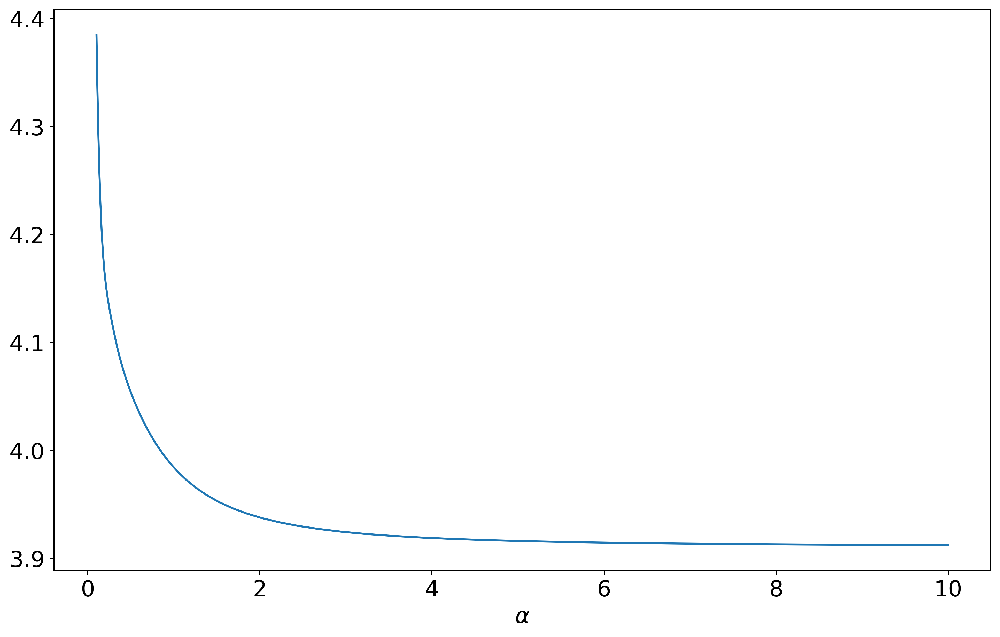

In [77]:
f0 = [x['f'] for x in profiles[0]]
fig, ax=plt.subplots(figsize=[13, 8], dpi=360)

plt.plot(np.logspace(-1, 1, num=50).flatten(), f0)
plt.xlabel(r"$\alpha$",size='xx-large')
plt.tick_params(labelsize='xx-large')

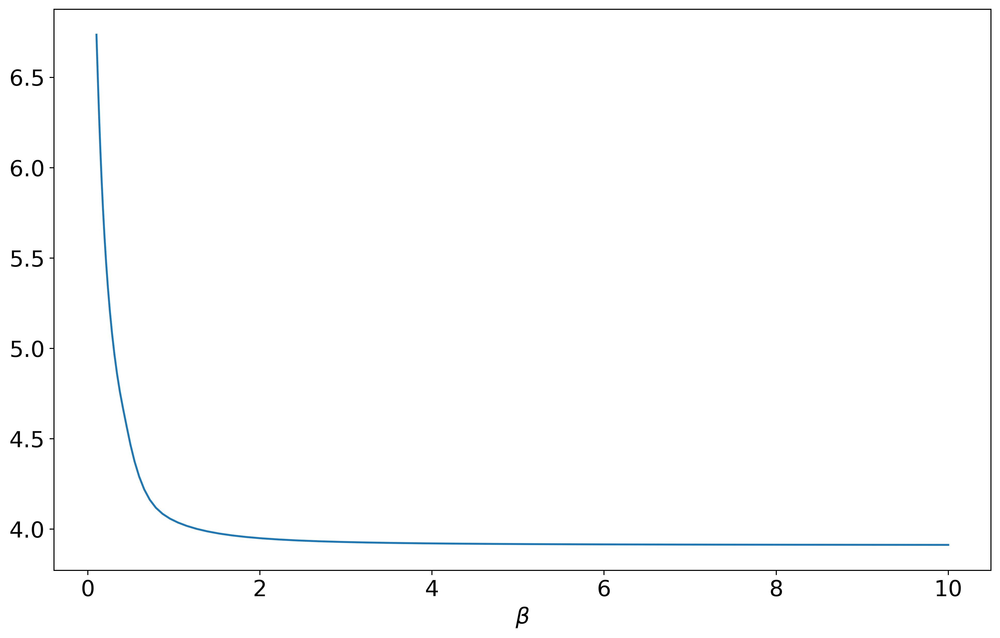

In [76]:
f1 = [x['f'] for x in profiles[1]]
fig, ax=plt.subplots(figsize=[13, 8], dpi=360)

plt.plot(np.logspace(-1, 1, num=50).flatten(), f1)
plt.xlabel(r"$\beta$",size='xx-large')
plt.tick_params(labelsize='xx-large')

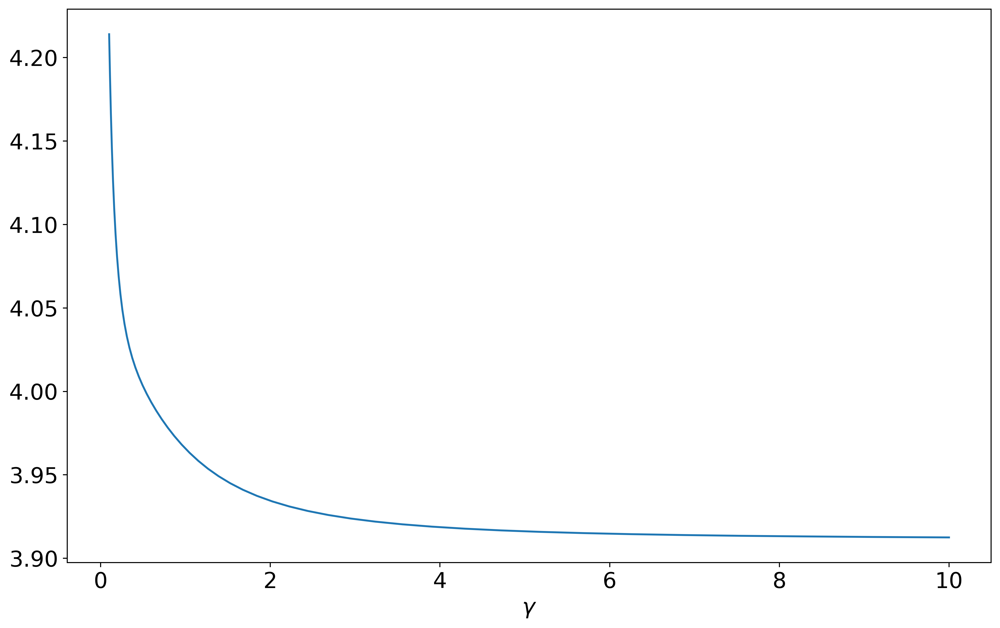

In [75]:
f2 = [x['f'] for x in profiles[2]]
fig, ax=plt.subplots(figsize=[13, 8], dpi=360)

plt.plot(np.logspace(-1, 1, num=50).flatten(), f2)
plt.xlabel(r"$\gamma$",size='xx-large')
plt.tick_params(labelsize='xx-large')